                                               **Project - 95**
                                          
                                        -- Money Laundering Detection --

# Business Problem :

 ## Designing and Executing an Anti-Money Laundering Program: Minimizing Risk and Adhering to Regulatory Requirements

## Developing and Implementing an Effective Anti-Money Laundering Strategy: Mitigating Financial Risk and Ensuring Compliance. Detection of Money Laundering Activity.
        
        
## Business Objective :

   ### Minimise :
   
        Due diligence
        Financial crimes/risks
        Corruption with report
        Operational inefficiencies
        False Alarms
        
## Business Constraints :

   ### Maximise :
   
        Effective Transaction monitoring
        Effective reporting mechanism
        Compliance measures
        AML Policies
        Customer Convenience"

In [1]:
## Importing required libraries for analysis

import pandas as pd 
import numpy as np
import seaborn as sns 
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV
import plotly.express as px
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [2]:
## Loading the dataset to Preprocess the data
df = pd.read_csv("Money_Laundering_Dataset.csv")
df

,Unnamed: 0,step,type,amount,nameOrig,oldbalanceOrg,newbalanceOrig,nameDest,oldbalanceDest,newbalanceDest,isFraud,isFlaggedFraud
0,0.0,1.0,PAYMENT,9839.64,C1231006815,170136.0,160296.36,M1979787155,0.00,0.00,0.0,0.0
1,1.0,1.0,PAYMENT,1864.28,C1666544295,21249.0,19384.72,M2044282225,0.00,0.00,0.0,0.0
2,2.0,1.0,TRANSFER,181.00,C1305486145,181.0,0.00,C553264065,0.00,0.00,1.0,0.0
3,3.0,1.0,CASH_OUT,181.00,C840083671,181.0,0.00,C38997010,21182.00,0.00,1.0,0.0
4,4.0,1.0,PAYMENT,11668.14,C2048537720,41554.0,29885.86,M1230701703,0.00,0.00,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
99995,99995.0,10.0,PAYMENT,4020.66,C1410794718,NaN,155908.34,M1257036576,0.00,0.00,NaN,0.0
99996,99996.0,10.0,PAYMENT,18345.49,C744303677,NaN,0.00,M1785344556,0.00,0.00,NaN,0.0
99997,99997.0,10.0,CASH_IN,183774.91,C104331851,NaN,222947.91,C36392889,54925.05,0.00,NaN,0.0
99998,99998.0,10.0,CASH_OUT,82237.17,C707662966,NaN,0.00,C1553004158,592635.66,799140.46,NaN,0.0


In [3]:
## Summary of the dataframe
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 12 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   Unnamed: 0      99997 non-null   float64
 1   step            99323 non-null   float64
 2   type            100000 non-null  object 
 3   amount          100000 non-null  float64
 4   nameOrig        99990 non-null   object 
 5   oldbalanceOrg   99857 non-null   float64
 6   newbalanceOrig  99978 non-null   float64
 7   nameDest        99996 non-null   object 
 8   oldbalanceDest  99948 non-null   float64
 9   newbalanceDest  100000 non-null  float64
 10  isFraud         99683 non-null   float64
 11  isFlaggedFraud  99929 non-null   float64
dtypes: float64(9), object(3)
memory usage: 9.2+ MB


In [4]:
## Finding null values
df.isna().sum()

Unnamed: 0          3
step              677
type                0
amount              0
nameOrig           10
oldbalanceOrg     143
newbalanceOrig     22
nameDest            4
oldbalanceDest     52
newbalanceDest      0
isFraud           317
isFlaggedFraud     71
dtype: int64

#### Null Values are present and need to perform SimpleImputer Median for Numerical & Most_Frequent to categorical variable.

In [5]:
## Finding duplicates in Rows
df.duplicated().sum()

0

In [6]:
## Finding duplicates in columns
df.transpose().duplicated().sum()

0

#### No Dupliacted values found in Columns & Rows

In [7]:
## Dropping un-useful column
df = df.drop('Unnamed: 0', axis=1)
df

,step,type,amount,nameOrig,oldbalanceOrg,newbalanceOrig,nameDest,oldbalanceDest,newbalanceDest,isFraud,isFlaggedFraud
0,1.0,PAYMENT,9839.64,C1231006815,170136.0,160296.36,M1979787155,0.00,0.00,0.0,0.0
1,1.0,PAYMENT,1864.28,C1666544295,21249.0,19384.72,M2044282225,0.00,0.00,0.0,0.0
2,1.0,TRANSFER,181.00,C1305486145,181.0,0.00,C553264065,0.00,0.00,1.0,0.0
3,1.0,CASH_OUT,181.00,C840083671,181.0,0.00,C38997010,21182.00,0.00,1.0,0.0
4,1.0,PAYMENT,11668.14,C2048537720,41554.0,29885.86,M1230701703,0.00,0.00,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
99995,10.0,PAYMENT,4020.66,C1410794718,NaN,155908.34,M1257036576,0.00,0.00,NaN,0.0
99996,10.0,PAYMENT,18345.49,C744303677,NaN,0.00,M1785344556,0.00,0.00,NaN,0.0
99997,10.0,CASH_IN,183774.91,C104331851,NaN,222947.91,C36392889,54925.05,0.00,NaN,0.0
99998,10.0,CASH_OUT,82237.17,C707662966,NaN,0.00,C1553004158,592635.66,799140.46,NaN,0.0


In [8]:
## Using Median Simple Imputer to convert Null Values Present in Numericals

from sklearn.impute import SimpleImputer

# Separate the columns with missing values
missing_cols = ['oldbalanceOrg', 'newbalanceOrig', 'oldbalanceDest']

imputer = SimpleImputer(strategy='median')

# Impute the missing values
df[missing_cols] = imputer.fit_transform(df[missing_cols])

In [9]:
## Most_Frequent for convertinig null values for Categorical Variable

from sklearn.impute import SimpleImputer

# Separate the columns with missing values
missing_col1 = ['step', 'nameOrig', 'nameDest','isFraud','isFlaggedFraud']

# Create a KNN imputer object
imputer = SimpleImputer(strategy='most_frequent')

# Impute the missing values
df[missing_col1] = imputer.fit_transform(df[missing_col1])

#### Getting Zero Null Values after using Imputation technique to convert the null values into categorical values.

In [10]:
df.isna().sum()

step              0
type              0
amount            0
nameOrig          0
oldbalanceOrg     0
newbalanceOrig    0
nameDest          0
oldbalanceDest    0
newbalanceDest    0
isFraud           0
isFlaggedFraud    0
dtype: int64

###  This will helpp us to check if there are any mismatches in the balance at the origin and destination after a transaction is made, and calculates the percentage of transactions that have balance errors.

In [11]:
print("Are there any mismatch in the balance at origin and destination after transaction?")
df['error_orig'] = (df["oldbalanceOrg"] - df["amount"] != df["newbalanceOrig"]).astype(int)
df['error_dest'] = (df["oldbalanceDest"] + df["amount"] != df["newbalanceDest"]).astype(int)

print("Balance Error(%) at the Sender:",round(df['error_orig'].value_counts()/df.shape[0] * 100,2))
print("Balance Error(%) at the Receiver:",round(df['error_dest'].value_counts()/df.shape[0] * 100,2))

#print("Valid Balance(%) at the origin:",round(data['error_orig'].value_counts()[0]/data.shape[0] * 100,2))
#print("Valid Balance(%) at the dest:",round(data['error_dest'].value_counts()[0]/data.shape[0] * 100,2))

Are there any mismatch in the balance at origin and destination after transaction?
Balance Error(%) at the Sender: 1    98.4
0     1.6
Name: error_orig, dtype: float64
Balance Error(%) at the Receiver: 1    92.73
0     7.27
Name: error_dest, dtype: float64


#### creates two new columns in a pandas DataFrame df, newbalanceSender and newbalanceReceiver, which represent the updated balances for the sender and receiver accounts after a transaction has occurred. Also, this helps us to  ensure that the transactions have been processed correctly and that the account balances have been updated appropriately.

In [12]:
df['newbalanceSender']= df['oldbalanceOrg'] - df['amount'].astype(float)
df['newbalanceReceiver'] = df['oldbalanceDest'] + df['amount'].astype(float)

In [13]:
df

,step,type,amount,nameOrig,oldbalanceOrg,newbalanceOrig,nameDest,oldbalanceDest,newbalanceDest,isFraud,isFlaggedFraud,error_orig,error_dest,newbalanceSender,newbalanceReceiver
0,1.0,PAYMENT,9839.64,C1231006815,170136.0,160296.36,M1979787155,0.00,0.00,0.0,0.0,0,1,160296.36,9839.64
1,1.0,PAYMENT,1864.28,C1666544295,21249.0,19384.72,M2044282225,0.00,0.00,0.0,0.0,0,1,19384.72,1864.28
2,1.0,TRANSFER,181.00,C1305486145,181.0,0.00,C553264065,0.00,0.00,1.0,0.0,0,1,0.00,181.00
3,1.0,CASH_OUT,181.00,C840083671,181.0,0.00,C38997010,21182.00,0.00,1.0,0.0,0,1,0.00,21363.00
4,1.0,PAYMENT,11668.14,C2048537720,41554.0,29885.86,M1230701703,0.00,0.00,0.0,0.0,0,1,29885.86,11668.14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,10.0,PAYMENT,4020.66,C1410794718,20100.0,155908.34,M1257036576,0.00,0.00,0.0,0.0,1,1,16079.34,4020.66
99996,10.0,PAYMENT,18345.49,C744303677,20100.0,0.00,M1785344556,0.00,0.00,0.0,0.0,1,1,1754.51,18345.49
99997,10.0,CASH_IN,183774.91,C104331851,20100.0,222947.91,C36392889,54925.05,0.00,0.0,0.0,1,1,-163674.91,238699.96
99998,10.0,CASH_OUT,82237.17,C707662966,20100.0,0.00,C1553004158,592635.66,799140.46,0.0,0.0,1,1,-62137.17,674872.83


In [14]:
### Replacing negative integers with zero using a lambda function. Neg Values are Present in newbalanceSender

df['newbalanceSender'] = df['newbalanceSender'].apply(lambda x: 0 if x < 0 else x)

# print the updated DataFrame
print(df)

       step      type     amount     nameOrig  oldbalanceOrg  newbalanceOrig  \
0       1.0   PAYMENT    9839.64  C1231006815       170136.0       160296.36   
1       1.0   PAYMENT    1864.28  C1666544295        21249.0        19384.72   
2       1.0  TRANSFER     181.00  C1305486145          181.0            0.00   
3       1.0  CASH_OUT     181.00   C840083671          181.0            0.00   
4       1.0   PAYMENT   11668.14  C2048537720        41554.0        29885.86   
...     ...       ...        ...          ...            ...             ...   
99995  10.0   PAYMENT    4020.66  C1410794718        20100.0       155908.34   
99996  10.0   PAYMENT   18345.49   C744303677        20100.0            0.00   
99997  10.0   CASH_IN  183774.91   C104331851        20100.0       222947.91   
99998  10.0  CASH_OUT   82237.17   C707662966        20100.0            0.00   
99999  10.0   PAYMENT   20096.56  C1868032458        20100.0        90020.44   

          nameDest  oldbalanceDest  new

#### Lets us to check if there are any mismatches in the balance at the origin and destination after a transaction is made, and calculates the percentage of transactions that have balance error

In [15]:
print("Are there any mismatch in the balance at origin and destination after transaction?")
df['error_orig'] = (df["oldbalanceOrg"] - df["amount"] <= df["newbalanceSender"]).astype(int)
df['error_dest'] = (df["oldbalanceDest"] + df["amount"] != df["newbalanceReceiver"]).astype(int)

print("Balance Error(%) at the Sender:",round(df['error_orig'].value_counts()/df.shape[0] * 100,2))
print("Balance Error(%) at the Receiver:",round(df['error_dest'].value_counts()/df.shape[0] * 100,2))

#print("Valid Balance(%) at the origin:",round(data['error_orig'].value_counts()[0]/data.shape[0] * 100,2))
#print("Valid Balance(%) at the dest:",round(data['error_dest'].value_counts()[0]/data.shape[0] * 100,2))

Are there any mismatch in the balance at origin and destination after transaction?
Balance Error(%) at the Sender: 1    100.0
Name: error_orig, dtype: float64
Balance Error(%) at the Receiver: 0    100.0
Name: error_dest, dtype: float64


In [16]:
df

,step,type,amount,nameOrig,oldbalanceOrg,newbalanceOrig,nameDest,oldbalanceDest,newbalanceDest,isFraud,isFlaggedFraud,error_orig,error_dest,newbalanceSender,newbalanceReceiver
0,1.0,PAYMENT,9839.64,C1231006815,170136.0,160296.36,M1979787155,0.00,0.00,0.0,0.0,1,0,160296.36,9839.64
1,1.0,PAYMENT,1864.28,C1666544295,21249.0,19384.72,M2044282225,0.00,0.00,0.0,0.0,1,0,19384.72,1864.28
2,1.0,TRANSFER,181.00,C1305486145,181.0,0.00,C553264065,0.00,0.00,1.0,0.0,1,0,0.00,181.00
3,1.0,CASH_OUT,181.00,C840083671,181.0,0.00,C38997010,21182.00,0.00,1.0,0.0,1,0,0.00,21363.00
4,1.0,PAYMENT,11668.14,C2048537720,41554.0,29885.86,M1230701703,0.00,0.00,0.0,0.0,1,0,29885.86,11668.14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,10.0,PAYMENT,4020.66,C1410794718,20100.0,155908.34,M1257036576,0.00,0.00,0.0,0.0,1,0,16079.34,4020.66
99996,10.0,PAYMENT,18345.49,C744303677,20100.0,0.00,M1785344556,0.00,0.00,0.0,0.0,1,0,1754.51,18345.49
99997,10.0,CASH_IN,183774.91,C104331851,20100.0,222947.91,C36392889,54925.05,0.00,0.0,0.0,1,0,0.00,238699.96
99998,10.0,CASH_OUT,82237.17,C707662966,20100.0,0.00,C1553004158,592635.66,799140.46,0.0,0.0,1,0,0.00,674872.83


In [17]:
## Dropping the unrequired columns 
df = df.drop(['error_orig','error_dest','newbalanceOrig','newbalanceDest'],axis = 1)
df

,step,type,amount,nameOrig,oldbalanceOrg,nameDest,oldbalanceDest,isFraud,isFlaggedFraud,newbalanceSender,newbalanceReceiver
0,1.0,PAYMENT,9839.64,C1231006815,170136.0,M1979787155,0.00,0.0,0.0,160296.36,9839.64
1,1.0,PAYMENT,1864.28,C1666544295,21249.0,M2044282225,0.00,0.0,0.0,19384.72,1864.28
2,1.0,TRANSFER,181.00,C1305486145,181.0,C553264065,0.00,1.0,0.0,0.00,181.00
3,1.0,CASH_OUT,181.00,C840083671,181.0,C38997010,21182.00,1.0,0.0,0.00,21363.00
4,1.0,PAYMENT,11668.14,C2048537720,41554.0,M1230701703,0.00,0.0,0.0,29885.86,11668.14
...,...,...,...,...,...,...,...,...,...,...,...
99995,10.0,PAYMENT,4020.66,C1410794718,20100.0,M1257036576,0.00,0.0,0.0,16079.34,4020.66
99996,10.0,PAYMENT,18345.49,C744303677,20100.0,M1785344556,0.00,0.0,0.0,1754.51,18345.49
99997,10.0,CASH_IN,183774.91,C104331851,20100.0,C36392889,54925.05,0.0,0.0,0.00,238699.96
99998,10.0,CASH_OUT,82237.17,C707662966,20100.0,C1553004158,592635.66,0.0,0.0,0.00,674872.83


In [18]:
## Converting the Object into Integer

df['isFraud']= df['isFraud'].astype('int64')
df['step']= df['step'].astype('int64')
df['isFlaggedFraud']= df['isFlaggedFraud'].astype('int64')

In [19]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 11 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   step                100000 non-null  int64  
 1   type                100000 non-null  object 
 2   amount              100000 non-null  float64
 3   nameOrig            100000 non-null  object 
 4   oldbalanceOrg       100000 non-null  float64
 5   nameDest            100000 non-null  object 
 6   oldbalanceDest      100000 non-null  float64
 7   isFraud             100000 non-null  int64  
 8   isFlaggedFraud      100000 non-null  int64  
 9   newbalanceSender    100000 non-null  float64
 10  newbalanceReceiver  100000 non-null  float64
dtypes: float64(5), int64(3), object(3)
memory usage: 8.4+ MB


In [20]:
## Renaming the column names as mentioned

df = df.rename(columns={'newbalanceSender': 'newbalanceOrg', 'newbalanceReceiver': 'newbalanceDest'})
df

,step,type,amount,nameOrig,oldbalanceOrg,nameDest,oldbalanceDest,isFraud,isFlaggedFraud,newbalanceOrg,newbalanceDest
0,1,PAYMENT,9839.64,C1231006815,170136.0,M1979787155,0.00,0,0,160296.36,9839.64
1,1,PAYMENT,1864.28,C1666544295,21249.0,M2044282225,0.00,0,0,19384.72,1864.28
2,1,TRANSFER,181.00,C1305486145,181.0,C553264065,0.00,1,0,0.00,181.00
3,1,CASH_OUT,181.00,C840083671,181.0,C38997010,21182.00,1,0,0.00,21363.00
4,1,PAYMENT,11668.14,C2048537720,41554.0,M1230701703,0.00,0,0,29885.86,11668.14
...,...,...,...,...,...,...,...,...,...,...,...
99995,10,PAYMENT,4020.66,C1410794718,20100.0,M1257036576,0.00,0,0,16079.34,4020.66
99996,10,PAYMENT,18345.49,C744303677,20100.0,M1785344556,0.00,0,0,1754.51,18345.49
99997,10,CASH_IN,183774.91,C104331851,20100.0,C36392889,54925.05,0,0,0.00,238699.96
99998,10,CASH_OUT,82237.17,C707662966,20100.0,C1553004158,592635.66,0,0,0.00,674872.83


In [21]:
# Rearranging the columns

df = df[['step','type','amount','oldbalanceOrg','newbalanceOrg','oldbalanceDest','newbalanceDest','isFraud','isFlaggedFraud']]

# print the rearranged DataFrame

print('Rearranged DataFrame:')
df.columns

Rearranged DataFrame:


Index(['step', 'type', 'amount', 'oldbalanceOrg', 'newbalanceOrg',
       'oldbalanceDest', 'newbalanceDest', 'isFraud', 'isFlaggedFraud'],
      dtype='object')

### First Business Moment Decision

In [22]:
## Calculates the Mean (average) of the values in the 'amount' column
df['amount'].mean()

173602.22176409996

In [23]:
## Calculates the Median value of the 'amount' column

df['amount'].median()

52745.520000000004

In [24]:
## Calculates the Mode value of the 'amount' column

df['amount'].mode()

0     2475.13
1     6285.19
2    17320.91
3    25975.86
4    29707.86
5    89631.24
Name: amount, dtype: float64

### Second Business Moment Decision

In [25]:
## Checking the Variance in 'amount' columns.
df['amount'].var()

118542710414.3486

In [26]:
## Calculates the standard deviation of the values in the 'amount' column
df['amount'].std()

344300.3200903952

### Third Business Moment Decision

In [27]:
## Calculating the Skewness of each column in dataset.
df.skew()

step               -2.543341
amount              5.428317
oldbalanceOrg       4.958011
newbalanceOrg       5.044601
oldbalanceDest      5.058239
newbalanceDest      4.766104
isFraud            15.426444
isFlaggedFraud    316.227766
dtype: float64

### Fourth Business Moment Decision

In [28]:
## Calculating the Kurtosis of each column in dataset.
df.kurt()

step                   7.313596
amount                48.099033
oldbalanceOrg         31.579922
newbalanceOrg         32.616930
oldbalanceDest        32.493201
newbalanceDest        29.197520
isFraud              235.979882
isFlaggedFraud    100000.000000
dtype: float64

<Axes: >

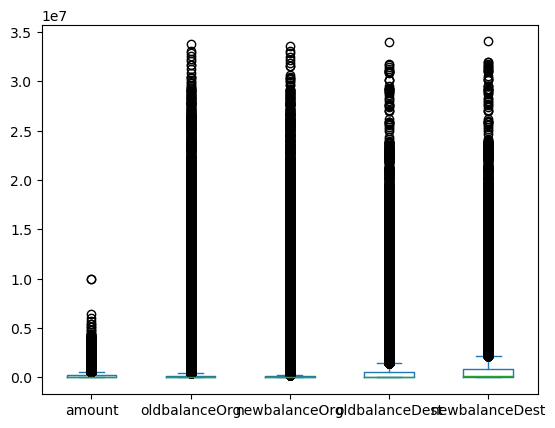

In [29]:
# Creating box plot to check outliers

df[['amount','oldbalanceOrg','newbalanceOrg','oldbalanceDest','newbalanceDest']].plot(kind='box')

### Loops through a list of selected columns in a pandas DataFrame and calculates the percentage of outliers in each column.

In [30]:
# Define the columns you want to loop through
columns_to_loop = ['amount','oldbalanceOrg','newbalanceOrg','oldbalanceDest','newbalanceDest',]

# Loop through the selected columns and calculate the percentage of outliers
for column in columns_to_loop:
    data_column = df[column].values

    # Define the lower and upper bounds of the range of non-outliers
    q1, q3 = np.percentile(data_column, [25, 75])
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr

    # Calculate the number of outliers
    outliers = data_column[(data_column < lower_bound) | (data_column > upper_bound)]
    num_outliers = len(outliers)

    # Calculate the percentage of outliers
    percent_outliers = (num_outliers / len(data_column)) * 100

    print("Column:", column)
    print("Percentage of outliers:", percent_outliers)

Column: amount
Percentage of outliers: 6.4
Column: oldbalanceOrg
Percentage of outliers: 18.337999999999997
Column: newbalanceOrg
Percentage of outliers: 20.047
Column: oldbalanceDest
Percentage of outliers: 14.173
Column: newbalanceDest
Percentage of outliers: 11.919


### Creating the correlation matrix & Heatmap of matrix which shows the correlation values between the different features with positive correlations shown in warm colors (reds) and negative correlations shown in cool colors (blues). The darker the color, the stronger the correlation between two features.

### Can understand the relationships between different variables in the dataset 

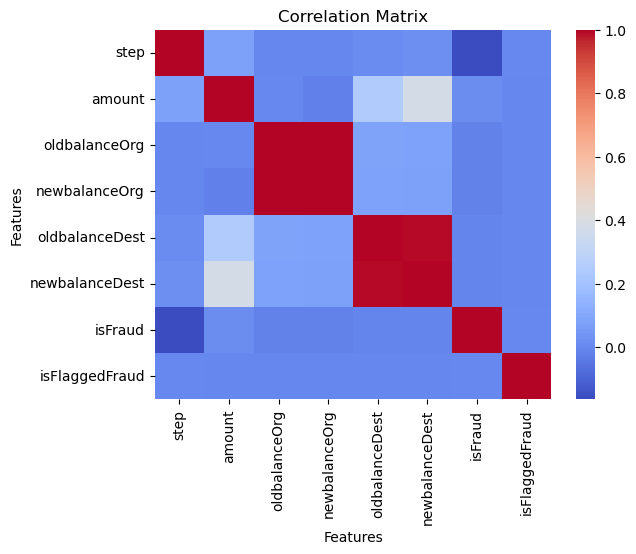

In [31]:
# Compute the correlation matrix
corr_matrix = df.corr()

# Create a heatmap using Seaborn
sns.heatmap(corr_matrix, cmap='coolwarm')

# Add title and axis labels
plt.title('Correlation Matrix')
plt.xlabel('Features')
plt.ylabel('Features')

# Show the plot
plt.show()

## Data Visualization
### Count Plots

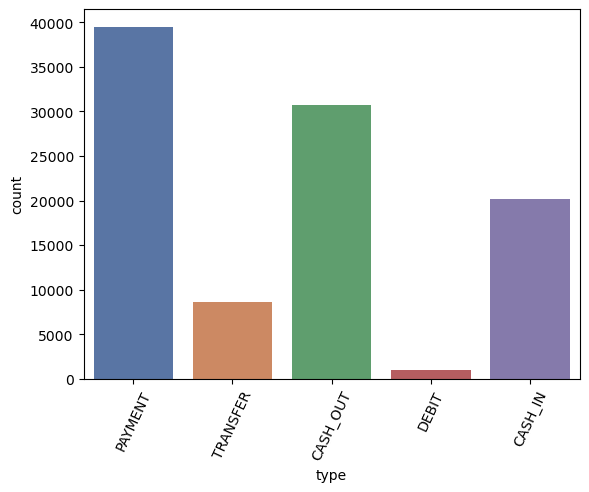

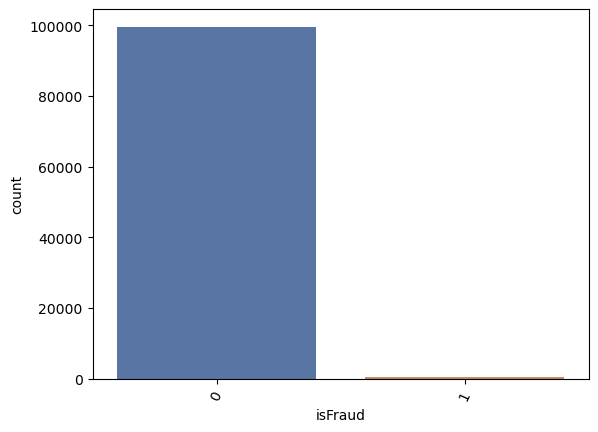

In [32]:
features_category = ['type','isFraud']
for feature in features_category:
  sns.countplot(data=df, x=feature, palette='deep')
  plt.xticks(rotation=65)
  plt.show()

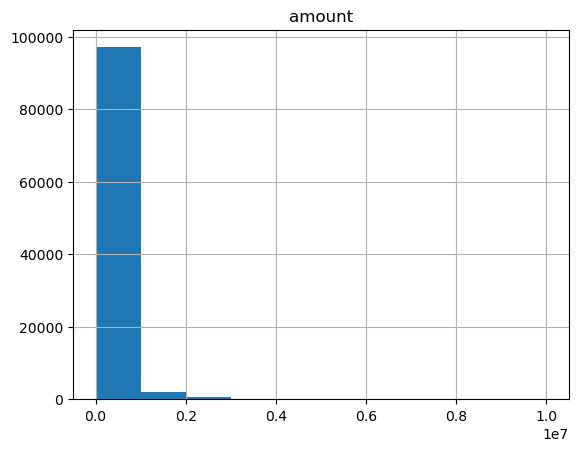

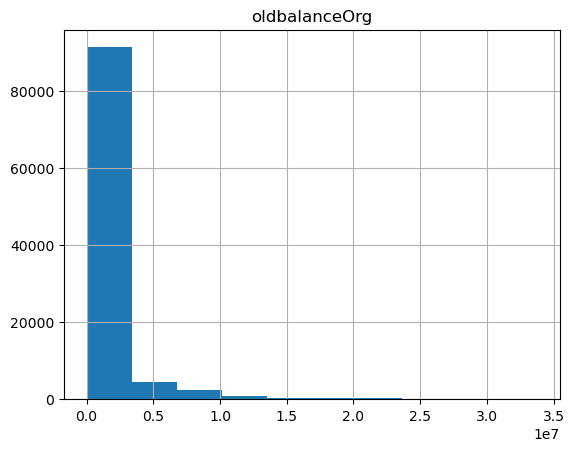

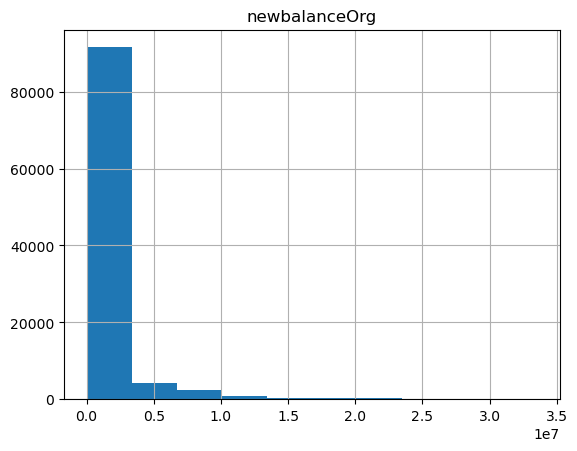

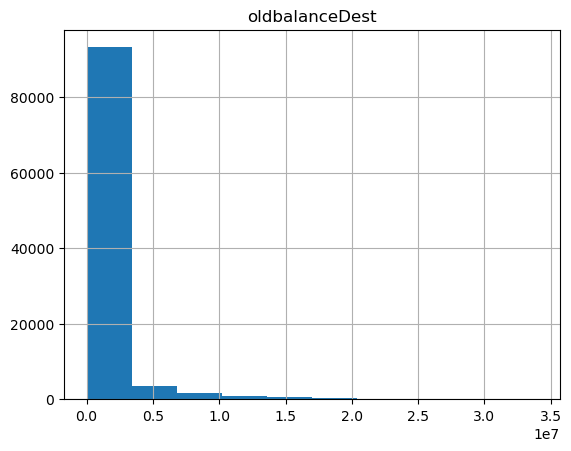

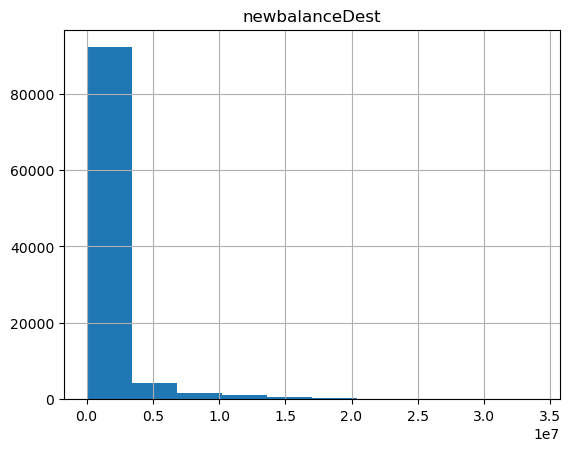

In [33]:
## Select columns for which histograms to be created

cols = ['amount','oldbalanceOrg','newbalanceOrg','oldbalanceDest','newbalanceDest']

#for loop to create histograms 
for col in cols:      #iterate over the columns in the dataset 
    df[col].hist()   #create a histogram of the current column 
    plt.title(col)   #set title as the current column 
    plt.show()

### Count plot using seaborn library, Plot displays the frequency distribution. The absolute count values of each corresponding bar in the plot. 

[Text(0, 0, '39512'),
 Text(0, 0, '30718'),
 Text(0, 0, '20185'),
 Text(0, 0, '8597'),
 Text(0, 0, '988')]

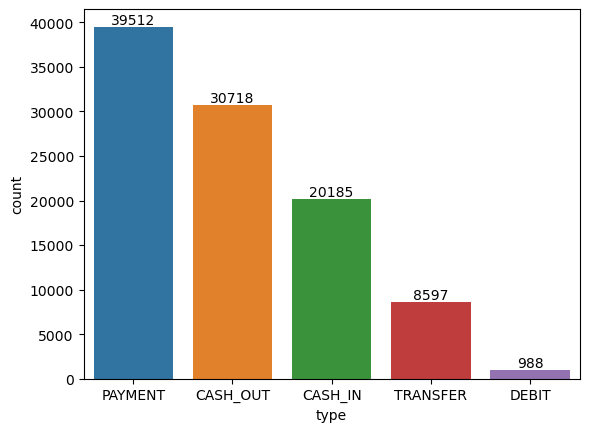

In [34]:
ax = sns.countplot(x = df['type'],
                   order = df['type'].value_counts (ascending=False).index);
abs_values = df['type'].value_counts (ascending = False).values 
                          
ax.bar_label (container=ax.containers[0], labels=abs_values)

### Converting the Step which is in Hours to be converted into Time Format which will help in differentiating

In [35]:
## Converting step into time
df['step'] = pd.to_datetime("01/01/2022") + pd.to_timedelta(df['step'], unit='h')
df['step'].sample(10)

4240    2022-01-01 03:00:00
93697   2022-01-01 10:00:00
30550   2022-01-01 08:00:00
46534   2022-01-01 09:00:00
3520    2022-01-01 02:00:00
65888   2022-01-01 09:00:00
82480   2022-01-01 10:00:00
26371   2022-01-01 08:00:00
80695   2022-01-01 10:00:00
84979   2022-01-01 10:00:00
Name: step, dtype: datetime64[ns]

### Converting & Creating new column by converting time into Night, Morning, Afternoon, Evening, by converting Step into Hours Basis

In [36]:
# create new column to get morning, afternoon, evening, or night
df['step'] = pd.cut(df['step'].dt.hour,
                        bins=[0, 6, 12, 18, 24], 
                        labels = ['night','morning','afternoon','evening'],
                        include_lowest = True)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 9 columns):
 #   Column          Non-Null Count   Dtype   
---  ------          --------------   -----   
 0   step            100000 non-null  category
 1   type            100000 non-null  object  
 2   amount          100000 non-null  float64 
 3   oldbalanceOrg   100000 non-null  float64 
 4   newbalanceOrg   100000 non-null  float64 
 5   oldbalanceDest  100000 non-null  float64 
 6   newbalanceDest  100000 non-null  float64 
 7   isFraud         100000 non-null  int64   
 8   isFlaggedFraud  100000 non-null  int64   
dtypes: category(1), float64(5), int64(2), object(1)
memory usage: 6.2+ MB


### Creating a Pie Chart for categorical variable 'Step'. 

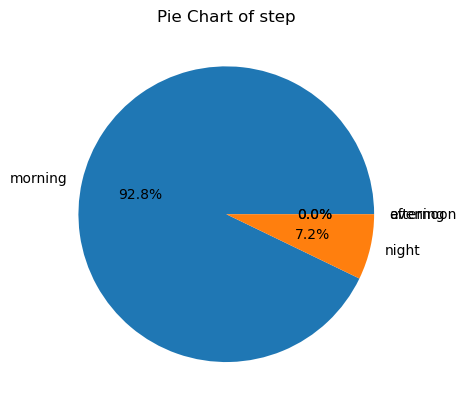

In [37]:
features_object = ['step']
for column_name in features_object:
    column_data = df[column_name]
    value_counts = column_data.value_counts()
    plt.pie(value_counts.values, labels=value_counts.index, autopct='%1.1f%%')
    plt.title(f'Pie Chart of {column_name}')
    plt.show()

In [38]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 9 columns):
 #   Column          Non-Null Count   Dtype   
---  ------          --------------   -----   
 0   step            100000 non-null  category
 1   type            100000 non-null  object  
 2   amount          100000 non-null  float64 
 3   oldbalanceOrg   100000 non-null  float64 
 4   newbalanceOrg   100000 non-null  float64 
 5   oldbalanceDest  100000 non-null  float64 
 6   newbalanceDest  100000 non-null  float64 
 7   isFraud         100000 non-null  int64   
 8   isFlaggedFraud  100000 non-null  int64   
dtypes: category(1), float64(5), int64(2), object(1)
memory usage: 6.2+ MB


In [39]:
df = df.drop(['isFlaggedFraud'],axis=1)
df

,step,type,amount,oldbalanceOrg,newbalanceOrg,oldbalanceDest,newbalanceDest,isFraud
0,night,PAYMENT,9839.64,170136.0,160296.36,0.00,9839.64,0
1,night,PAYMENT,1864.28,21249.0,19384.72,0.00,1864.28,0
2,night,TRANSFER,181.00,181.0,0.00,0.00,181.00,1
3,night,CASH_OUT,181.00,181.0,0.00,21182.00,21363.00,1
4,night,PAYMENT,11668.14,41554.0,29885.86,0.00,11668.14,0
...,...,...,...,...,...,...,...,...
99995,morning,PAYMENT,4020.66,20100.0,16079.34,0.00,4020.66,0
99996,morning,PAYMENT,18345.49,20100.0,1754.51,0.00,18345.49,0
99997,morning,CASH_IN,183774.91,20100.0,0.00,54925.05,238699.96,0
99998,morning,CASH_OUT,82237.17,20100.0,0.00,592635.66,674872.83,0


In [40]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 8 columns):
 #   Column          Non-Null Count   Dtype   
---  ------          --------------   -----   
 0   step            100000 non-null  category
 1   type            100000 non-null  object  
 2   amount          100000 non-null  float64 
 3   oldbalanceOrg   100000 non-null  float64 
 4   newbalanceOrg   100000 non-null  float64 
 5   oldbalanceDest  100000 non-null  float64 
 6   newbalanceDest  100000 non-null  float64 
 7   isFraud         100000 non-null  int64   
dtypes: category(1), float64(5), int64(1), object(1)
memory usage: 5.4+ MB


In [41]:
## Dropping the step column to perform and build the model based on remaining columns
df1 = df.drop(['step'], axis=1)
df1

,type,amount,oldbalanceOrg,newbalanceOrg,oldbalanceDest,newbalanceDest,isFraud
0,PAYMENT,9839.64,170136.0,160296.36,0.00,9839.64,0
1,PAYMENT,1864.28,21249.0,19384.72,0.00,1864.28,0
2,TRANSFER,181.00,181.0,0.00,0.00,181.00,1
3,CASH_OUT,181.00,181.0,0.00,21182.00,21363.00,1
4,PAYMENT,11668.14,41554.0,29885.86,0.00,11668.14,0
...,...,...,...,...,...,...,...
99995,PAYMENT,4020.66,20100.0,16079.34,0.00,4020.66,0
99996,PAYMENT,18345.49,20100.0,1754.51,0.00,18345.49,0
99997,CASH_IN,183774.91,20100.0,0.00,54925.05,238699.96,0
99998,CASH_OUT,82237.17,20100.0,0.00,592635.66,674872.83,0


In [42]:
# separating the data and labels
X = df1.drop(columns = 'isFraud', axis=1)
y = df1['isFraud']

### One hot encoding is a technique used in data preprocessing to represent categorical variables as numerical variables. It is used because many machine learning algorithms cannot directly process categorical variables.

In [43]:
# Perform one-hot encoding on a categorical column
one_hot_encoded = pd.get_dummies(X['type'])

# Concatenate the one-hot encoded columns to the original dataset

X = pd.concat([X, one_hot_encoded], axis=1)

# Drop the original categorical column from the dataset
X = X.drop('type', axis=1)

### To scale numerical data to have a common range. 
#### Compare Features
#### Improve performance
#### Reduce bias
#### Avoid numerical instability

In [44]:
from sklearn.preprocessing import MinMaxScaler

# select the columns to normalize
cols_to_normalize = ['amount','oldbalanceOrg','newbalanceOrg','oldbalanceDest','newbalanceDest']

# create an instance of the MinMaxScaler class
scaler = MinMaxScaler()

# fit the scaler to the selected columns and transform the data
X[cols_to_normalize] = scaler.fit_transform(X[cols_to_normalize])

# display the first few rows of the normalized data
print(X.head())

     amount  oldbalanceOrg  newbalanceOrg  oldbalanceDest  newbalanceDest  \
0  0.000984       0.005034       0.004775        0.000000        0.000289   
1  0.000186       0.000629       0.000577        0.000000        0.000055   
2  0.000018       0.000005       0.000000        0.000000        0.000005   
3  0.000018       0.000005       0.000000        0.000623        0.000627   
4  0.001167       0.001230       0.000890        0.000000        0.000343   

   CASH_IN  CASH_OUT  DEBIT  PAYMENT  TRANSFER  
0        0         0      0        1         0  
1        0         0      0        1         0  
2        0         0      0        0         1  
3        0         1      0        0         0  
4        0         0      0        1         0  


### SMOTE (Synthetic Minority Over-sampling Technique) is a technique used to address the problem of class imbalance in binary classification problems. In class imbalance, the dataset has a disproportionate ratio of observations in each class. By generating synthetic samples of the minority class to balance the dataset. It creates new samples by interpolating between the minority class samples. 

In [45]:
from imblearn.over_sampling import SMOTE

# Instantiate SMOTE object
smote = SMOTE(random_state=42)

# Resample data using SMOTE
X_resampled, y_resampled = smote.fit_resample(X, y)

# Combine resampled data into DataFrame
balanced_df = pd.concat([pd.DataFrame(X_resampled), pd.DataFrame(y_resampled)], axis=1)

In [46]:
X = X_resampled
X

,amount,oldbalanceOrg,newbalanceOrg,oldbalanceDest,newbalanceDest,CASH_IN,CASH_OUT,DEBIT,PAYMENT,TRANSFER
0,0.000984,0.005034,0.004775,0.000000,0.000289,0,0,0,1,0
1,0.000186,0.000629,0.000577,0.000000,0.000055,0,0,0,1,0
2,0.000018,0.000005,0.000000,0.000000,0.000005,0,0,0,0,1
3,0.000018,0.000005,0.000000,0.000623,0.000627,0,1,0,0,0
4,0.001167,0.001230,0.000890,0.000000,0.000343,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...
199165,0.003591,0.000063,0.000000,0.001346,0.002400,0,1,0,0,0
199166,0.000430,0.003405,0.003348,0.036340,0.036427,0,0,1,0,0
199167,0.168870,0.012539,0.000000,0.041568,0.091125,0,0,0,0,1
199168,0.000794,0.000271,0.000036,0.000000,0.000233,0,0,0,1,0


In [47]:
y = y_resampled
y

0         0
1         0
2         1
3         1
4         0
         ..
199165    1
199166    1
199167    1
199168    1
199169    1
Name: isFraud, Length: 199170, dtype: int64

In [48]:
## split the dataset into training and testing sets for a machine learning model.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

### Machine learning Models to train and evaluate various classifiers on a SMOTE dataset to detect fraudulent financial transactions. To address class imbalance in a binary classification problem where the positive class (fraudulent transactions) is the minority class and the negative class (legitimate transactions) is the majority class. SMOTE generates synthetic samples of the minority class by interpolating between existing samples. This creates a balanced dataset that can improve the performance of our machine learning models in detecting fraudulent transactions.

## Train & Test accuracy 'With' and 'Without' Grid Search

### A statistical method for analyzing a dataset in which there are one or more independent variables that determine an outcome.

In [49]:
import pandas pd

SyntaxError: invalid syntax (3546497058.py, line 1)

In [50]:
### 1. Logistic Regression

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score

# Create a Logistic Regression classifier
logreg_clf = LogisticRegression(random_state=42)

# Train the classifier on the training data
logreg_clf.fit(X_train, y_train)

# Predict the labels of the training and test data
train_pred = logreg_clf.predict(X_train)
test_pred = logreg_clf.predict(X_test)

# Calculate the performance metrics for the training data
train_accuracy = accuracy_score(y_train, train_pred)
train_f1 = f1_score(y_train, train_pred, average='weighted')
train_recall = recall_score(y_train, train_pred, average='weighted')
train_precision = precision_score(y_train, train_pred, average='weighted')

# Calculate the performance metrics for the test data
test_accuracy = accuracy_score(y_test, test_pred)
test_f1 = f1_score(y_test, test_pred, average='weighted')
test_recall = recall_score(y_test, test_pred, average='weighted')
test_precision = precision_score(y_test, test_pred, average='weighted')

# Print the performance metrics
print('Training Accuracy: {:.3f}'.format(train_accuracy))
print('Training F1 Score: {:.3f}'.format(train_f1))
print('Training Recall Score: {:.3f}'.format(train_recall))
print('Training Precision Score: {:.3f}'.format(train_precision))

print('Test Accuracy: {:.3f}'.format(test_accuracy))
print('Test F1 Score: {:.3f}'.format(test_f1))
print('Test Recall Score: {:.3f}'.format(test_recall))
print('Test Precision Score: {:.3f}'.format(test_precision))

Training Accuracy: 0.623
Training F1 Score: 0.622
Training Recall Score: 0.623
Training Precision Score: 0.623
Test Accuracy: 0.622
Test F1 Score: 0.622
Test Recall Score: 0.622
Test Precision Score: 0.623


In [51]:
## LOGISTIC REGRESSION(With Grid Search)

from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score

# define the model
model = LogisticRegression()

# define the hyperparameters to tune with grid search
param_grid = {
    'penalty': ['l1', 'l2'],
    'C': [0.001, 0.01, 0.1, 1, 10, 100],
    'solver': ['liblinear', 'saga']
}

# define the grid search object
grid_search = GridSearchCV(model, param_grid, cv=5, scoring='accuracy')

# fit the grid search object to the training data
grid_search.fit(X_train, y_train)

# print the best hyperparameters
print('Best Hyperparameters:', grid_search.best_params_)

# predict the labels of the training and test data with the best estimator from grid search
train_pred = grid_search.best_estimator_.predict(X_train)
test_pred = grid_search.best_estimator_.predict(X_test)

# calculate the performance metrics for the training data
train_accuracy = accuracy_score(y_train, train_pred)
train_f1 = f1_score(y_train, train_pred)
train_recall = recall_score(y_train, train_pred)
train_precision = precision_score(y_train, train_pred)

# calculate the performance metrics for the test data
test_accuracy = accuracy_score(y_test, test_pred)
test_f1 = f1_score(y_test, test_pred)
test_recall = recall_score(y_test, test_pred)
test_precision = precision_score(y_test, test_pred)

# print the performance metrics
print('Training Accuracy: {:.3f}'.format(train_accuracy))
print('Training F1 Score: {:.3f}'.format(train_f1))
print('Training Recall Score: {:.3f}'.format(train_recall))
print('Training Precision Score: {:.3f}'.format(train_precision))

print('Test Accuracy: {:.3f}'.format(test_accuracy))
print('Test F1 Score: {:.3f}'.format(test_f1))
print('Test Recall Score: {:.3f}'.format(test_recall))
print('Test Precision Score: {:.3f}'.format(test_precision))

Best Hyperparameters: {'C': 100, 'penalty': 'l1', 'solver': 'saga'}
Training Accuracy: 0.624
Training F1 Score: 0.614
Training Recall Score: 0.600
Training Precision Score: 0.629
Test Accuracy: 0.623
Test F1 Score: 0.615
Test Recall Score: 0.598
Test Precision Score: 0.633


## Train & Test accuracy 'With' and 'Without' Grid Search for Decision Tree

### A tree-structured model used for classification and regression, where each internal node represents a test on a feature, each branch represents the outcome of the test, and each leaf node represents a class label.

In [52]:
## 2. Decision Tree

from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score

# Define the model
model = DecisionTreeClassifier(random_state=42, max_depth=3)

# Train the model
model.fit(X_train, y_train)

# Predict the labels of the training and test data
train_pred = model.predict(X_train)
test_pred = model.predict(X_test)

# Calculate the performance metrics for the training data
train_accuracy = accuracy_score(y_train, train_pred)
train_f1 = f1_score(y_train, train_pred)
train_recall = recall_score(y_train, train_pred)
train_precision = precision_score(y_train, train_pred)

# Calculate the performance metrics for the test data
test_accuracy = accuracy_score(y_test, test_pred)
test_f1 = f1_score(y_test, test_pred)
test_recall = recall_score(y_test, test_pred)
test_precision = precision_score(y_test, test_pred)

# Print the performance metrics
print('Training Accuracy: {:.3f}'.format(train_accuracy))
print('Training F1 Score: {:.3f}'.format(train_f1))
print('Training Recall Score: {:.3f}'.format(train_recall))
print('Training Precision Score: {:.3f}'.format(train_precision))

print('Test Accuracy: {:.3f}'.format(test_accuracy))
print('Test F1 Score: {:.3f}'.format(test_f1))
print('Test Recall Score: {:.3f}'.format(test_recall))
print('Test Precision Score: {:.3f}'.format(test_precision))

Training Accuracy: 0.642
Training F1 Score: 0.637
Training Recall Score: 0.629
Training Precision Score: 0.644
Test Accuracy: 0.642
Test F1 Score: 0.639
Test Recall Score: 0.630
Test Precision Score: 0.648


In [53]:
## DECISION TREE

from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score

# Define the model
dt = DecisionTreeClassifier()

# Define hyperparameters to search over
param_grid = {'max_depth': [None, 5, 10, 15],
              'min_samples_split': [2, 5, 10],
              'min_samples_leaf': [1, 2, 5],
              'max_features': ['sqrt', 'log2']}

# Perform grid search to find best hyperparameters
grid_search = GridSearchCV(dt, param_grid, cv=5)
grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_

# Train the model with best hyperparameters
dt = DecisionTreeClassifier(**best_params)
dt.fit(X_train, y_train)

# Predict the labels of the training and test data
train_pred = dt.predict(X_train)
test_pred = dt.predict(X_test)

# Calculate the performance metrics for the training data
train_accuracy = accuracy_score(y_train, train_pred)
train_f1 = f1_score(y_train, train_pred)
train_recall = recall_score(y_train, train_pred)
train_precision = precision_score(y_train, train_pred)

# Calculate the performance metrics for the test data
test_accuracy = accuracy_score(y_test, test_pred)
test_f1 = f1_score(y_test, test_pred)
test_recall = recall_score(y_test, test_pred)
test_precision = precision_score(y_test, test_pred)

# Print the performance metrics
print('Training Accuracy: {:.3f}'.format(train_accuracy))
print('Training F1 Score: {:.3f}'.format(train_f1))
print('Training Recall Score: {:.3f}'.format(train_recall))
print('Training Precision Score: {:.3f}'.format(train_precision))

print('Test Accuracy: {:.3f}'.format(test_accuracy))
print('Test F1 Score: {:.3f}'.format(test_f1))
print('Test Recall Score: {:.3f}'.format(test_recall))
print('Test Precision Score: {:.3f}'.format(test_precision))

Training Accuracy: 0.966
Training F1 Score: 0.966
Training Recall Score: 0.953
Training Precision Score: 0.978
Test Accuracy: 0.903
Test F1 Score: 0.904
Test Recall Score: 0.899
Test Precision Score: 0.908


## Train & Test accuracy 'With' and 'Without' Grid Search 'Random Forest Classifier'

### An ensemble learning method for classification, consisting of multiple decision trees and using bagging to reduce overfitting.

In [54]:
## 3.RANDOM FOREST CLASSIFIER

from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score

# Define the model
model = RandomForestClassifier(random_state=42, n_estimators=100, max_depth=5)

# Train the model
model.fit(X_train, y_train)

# Predict the labels of the training and test data
train_pred = model.predict(X_train)
test_pred = model.predict(X_test)

# Calculate the performance metrics for the training data
train_accuracy = accuracy_score(y_train, train_pred)
train_f1 = f1_score(y_train, train_pred)
train_recall = recall_score(y_train, train_pred)
train_precision = precision_score(y_train, train_pred)

# Calculate the performance metrics for the test data
test_accuracy = accuracy_score(y_test, test_pred)
test_f1 = f1_score(y_test, test_pred)
test_recall = recall_score(y_test, test_pred)
test_precision = precision_score(y_test, test_pred)

# Print the performance metrics
print('Training Accuracy: {:.3f}'.format(train_accuracy))
print('Training F1 Score: {:.3f}'.format(train_f1))
print('Training Recall Score: {:.3f}'.format(train_recall))
print('Training Precision Score: {:.3f}'.format(train_precision))

print('Test Accuracy: {:.3f}'.format(test_accuracy))
print('Test F1 Score: {:.3f}'.format(test_f1))
print('Test Recall Score: {:.3f}'.format(test_recall))
print('Test Precision Score: {:.3f}'.format(test_precision))

Training Accuracy: 0.720
Training F1 Score: 0.754
Training Recall Score: 0.860
Training Precision Score: 0.671
Test Accuracy: 0.721
Test F1 Score: 0.756
Test Recall Score: 0.859
Test Precision Score: 0.675


In [ ]:
## RANDOM FOREST CLASSIFIER

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Define the parameter grid to search
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 20, 30, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2', None]
}

# Create a Random Forest Classifier object
rfc = RandomForestClassifier()

# Create a Grid Search object with cross-validation
grid = GridSearchCV(estimator=rfc, param_grid=param_grid, scoring='accuracy', cv=5)

# Fit the Grid Search object to the data
grid.fit(X_train, y_train)

# Extract the best model from the grid search
best_model = grid.best_estimator_

# Use the best model to make predictions on the test set
y_pred_train = best_model.predict(X_train)
y_pred_test = best_model.predict(X_test)

# Calculate the evaluation metrics for the training set
train_acc = accuracy_score(y_train, y_pred_train)
train_prec = precision_score(y_train, y_pred_train)
train_rec = recall_score(y_train, y_pred_train)
train_f1 = f1_score(y_train, y_pred_train)

# Calculate the evaluation metrics for the test set
test_acc = accuracy_score(y_test, y_pred_test)
test_prec = precision_score(y_test, y_pred_test)
test_rec = recall_score(y_test, y_pred_test)
test_f1 = f1_score(y_test, y_pred_test)

# Print the evaluation metrics
print("Training Accuracy:", train_acc)
print("Training Precision:", train_prec)
print("Training Recall:", train_rec)
print("Training F1 Score:", train_f1)

print("Test Accuracy:", test_acc)
print("Test Precision:", test_prec)
print("Test Recall:", test_rec)
print("Test F1 Score:", test_f1)

## Train & Test accuracy 'With' and 'Without' Grid Search 'Naive Bayes'

### A probabilistic algorithm used for classification based on Bayes' theorem with strong independence assumptions between the features.

In [55]:
## 4. Naive Bayes(Without Grid Search)

from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score

#Define the model
model = GaussianNB()

#Train the model
model.fit(X_train, y_train)

#Predict the labels of the training and test data
train_pred = model.predict(X_train)
test_pred = model.predict(X_test)

#Calculate the performance metrics for the training data
train_accuracy = accuracy_score(y_train, train_pred)
train_f1 = f1_score(y_train, train_pred)
train_recall = recall_score(y_train, train_pred)
train_precision = precision_score(y_train, train_pred)

#Calculate the performance metrics for the test data
test_accuracy = accuracy_score(y_test, test_pred)
test_f1 = f1_score(y_test, test_pred)
test_recall = recall_score(y_test, test_pred)
test_precision = precision_score(y_test, test_pred)

#Print the performance metrics
print('Training Accuracy: {:.3f}'.format(train_accuracy))
print('Training F1 Score: {:.3f}'.format(train_f1))
print('Training Recall Score: {:.3f}'.format(train_recall))
print('Training Precision Score: {:.3f}'.format(train_precision))

print('Test Accuracy: {:.3f}'.format(test_accuracy))
print('Test F1 Score: {:.3f}'.format(test_f1))
print('Test Recall Score: {:.3f}'.format(test_recall))
print('Test Precision Score: {:.3f}'.format(test_precision))

Training Accuracy: 0.608
Training F1 Score: 0.705
Training Recall Score: 0.940
Training Precision Score: 0.564
Test Accuracy: 0.606
Test F1 Score: 0.706
Test Recall Score: 0.938
Test Precision Score: 0.566


In [56]:
## NAIYE BAYES(With Grid Search)

from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score
from sklearn.model_selection import GridSearchCV

# Define the model
model = GaussianNB()

# Set the hyperparameters to tune
param_grid = {'var_smoothing': [1e-9, 1e-8, 1e-7, 1e-6]}

# Define the grid search
grid = GridSearchCV(model, param_grid, cv=5, scoring='accuracy')

# Fit the grid search to the data
grid.fit(X_train, y_train)

# Extract the best model from the grid search
best_model = grid.best_estimator_

# Predict the labels of the training and test data using the best model
train_pred = best_model.predict(X_train)
test_pred = best_model.predict(X_test)

# Calculate the performance metrics for the training data
train_accuracy = accuracy_score(y_train, train_pred)
train_f1 = f1_score(y_train, train_pred)
train_recall = recall_score(y_train, train_pred)
train_precision = precision_score(y_train, train_pred)

# Calculate the performance metrics for the test data
test_accuracy = accuracy_score(y_test, test_pred)
test_f1 = f1_score(y_test, test_pred)
test_recall = recall_score(y_test, test_pred)
test_precision = precision_score(y_test, test_pred)

# Print the performance metrics
print('Training Accuracy: {:.3f}'.format(train_accuracy))
print('Training F1 Score: {:.3f}'.format(train_f1))
print('Training Recall Score: {:.3f}'.format(train_recall))
print('Training Precision Score: {:.3f}'.format(train_precision))

print('Test Accuracy: {:.3f}'.format(test_accuracy))
print('Test F1 Score: {:.3f}'.format(test_f1))
print('Test Recall Score: {:.3f}'.format(test_recall))
print('Test Precision Score: {:.3f}'.format(test_precision))

Training Accuracy: 0.608
Training F1 Score: 0.705
Training Recall Score: 0.940
Training Precision Score: 0.564
Test Accuracy: 0.606
Test F1 Score: 0.706
Test Recall Score: 0.938
Test Precision Score: 0.566


## Train & Test accuracy 'With' and 'Without' Grid Search 'Xtreme Gradient Boosting'

### A tree-based gradient boosting algorithm that can be used for regression and classification problems.

In [57]:
## 5. Xtreme Gradient Boosting(Without Grid Search)

from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score

# Define the model
model = XGBClassifier(random_state=42)

# Train the model
model.fit(X_train, y_train)

# Predict the labels of the training and test data
train_pred = model.predict(X_train)
test_pred = model.predict(X_test)

# Calculate the performance metrics for the training data
train_accuracy = accuracy_score(y_train, train_pred)
train_f1 = f1_score(y_train, train_pred)
train_recall = recall_score(y_train, train_pred)
train_precision = precision_score(y_train, train_pred)

# Calculate the performance metrics for the test data
test_accuracy = accuracy_score(y_test, test_pred)
test_f1 = f1_score(y_test, test_pred)
test_recall = recall_score(y_test, test_pred)
test_precision = precision_score(y_test, test_pred)

# Print the performance metrics
print('Training Accuracy: {:.3f}'.format(train_accuracy))
print('Training F1 Score: {:.3f}'.format(train_f1))
print('Training Recall Score: {:.3f}'.format(train_recall))
print('Training Precision Score: {:.3f}'.format(train_precision))

print('Test Accuracy: {:.3f}'.format(test_accuracy))
print('Test F1 Score: {:.3f}'.format(test_f1))
print('Test Recall Score: {:.3f}'.format(test_recall))
print('Test Precision Score: {:.3f}'.format(test_precision))

Training Accuracy: 0.893
Training F1 Score: 0.896
Training Recall Score: 0.918
Training Precision Score: 0.875
Test Accuracy: 0.886
Test F1 Score: 0.890
Test Recall Score: 0.910
Test Precision Score: 0.870


In [58]:
## XTREME GRADIENT BOOSTING (With Grid Search)

from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score

# Define the XGBoost model
xgb_model = XGBClassifier()

# Define the hyperparameters to be tuned using GridSearchCV
param_grid = {'n_estimators': [50, 100, 150],
              'max_depth': [3, 4, 5],
              'learning_rate': [0.1, 0.2, 0.3]}

# Create the GridSearchCV object
grid = GridSearchCV(xgb_model, param_grid, cv=5, scoring='accuracy')

# Fit the GridSearchCV object to the training data
grid.fit(X_train, y_train)

# Extract the best model from the grid search
best_model = grid.best_estimator_

# Use the best model to predict labels on the training and test data
train_pred = best_model.predict(X_train)
test_pred = best_model.predict(X_test)

# Calculate the performance metrics for the training data
train_accuracy = accuracy_score(y_train, train_pred)
train_f1 = f1_score(y_train, train_pred)
train_recall = recall_score(y_train, train_pred)
train_precision = precision_score(y_train, train_pred)

# Calculate the performance metrics for the test data
test_accuracy = accuracy_score(y_test, test_pred)
test_f1 = f1_score(y_test, test_pred)
test_recall = recall_score(y_test, test_pred)
test_precision = precision_score(y_test, test_pred)

# Print the performance metrics
print('Training Accuracy: {:.3f}'.format(train_accuracy))
print('Training F1 Score: {:.3f}'.format(train_f1))
print('Training Recall Score: {:.3f}'.format(train_recall))
print('Training Precision Score: {:.3f}'.format(train_precision))

print('Test Accuracy: {:.3f}'.format(test_accuracy))
print('Test F1 Score: {:.3f}'.format(test_f1))
print('Test Recall Score: {:.3f}'.format(test_recall))
print('Test Precision Score: {:.3f}'.format(test_precision))

# Print the best hyperparameters
print('Best Hyperparameters:', grid.best_params_)

Training Accuracy: 0.886
Training F1 Score: 0.889
Training Recall Score: 0.911
Training Precision Score: 0.867
Test Accuracy: 0.881
Test F1 Score: 0.884
Test Recall Score: 0.906
Test Precision Score: 0.864
Best Hyperparameters: {'learning_rate': 0.3, 'max_depth': 5, 'n_estimators': 150}


## Train & Test accuracy 'With' and 'Without' Grid Search 'Ensemble Techniques(Bagging)'

### A machine learning technique that involves training multiple models on different subsets of the data to reduce overfitting and improve accuracy.

In [59]:
## 6. ENSEMBLE TECHNIQUES (Without Grid Search)
## Bagging

from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score

# Define the base estimator
base_estimator = DecisionTreeClassifier(random_state=42)

# Define the model
model = BaggingClassifier(base_estimator=base_estimator, n_estimators=10, random_state=42)

# Train the model
model.fit(X_train, y_train)

# Predict the labels of the training and test data
train_pred = model.predict(X_train)
test_pred = model.predict(X_test)

# Calculate the performance metrics for the training data
train_accuracy = accuracy_score(y_train, train_pred)
train_f1 = f1_score(y_train, train_pred)
train_recall = recall_score(y_train, train_pred)
train_precision = precision_score(y_train, train_pred)

# Calculate the performance metrics for the test data
test_accuracy = accuracy_score(y_test, test_pred)
test_f1 = f1_score(y_test, test_pred)
test_recall = recall_score(y_test, test_pred)
test_precision = precision_score(y_test, test_pred)

# Print the performance metrics
print('Training Accuracy: {:.3f}'.format(train_accuracy))
print('Training F1 Score: {:.3f}'.format(train_f1))
print('Training Recall Score: {:.3f}'.format(train_recall))
print('Training Precision Score: {:.3f}'.format(train_precision))

print('Test Accuracy: {:.3f}'.format(test_accuracy))
print('Test F1 Score: {:.3f}'.format(test_f1))
print('Test Recall Score: {:.3f}'.format(test_recall))
print('Test Precision Score: {:.3f}'.format(test_precision))

Training Accuracy: 0.985
Training F1 Score: 0.985
Training Recall Score: 0.985
Training Precision Score: 0.985
Test Accuracy: 0.925
Test F1 Score: 0.927
Test Recall Score: 0.940
Test Precision Score: 0.914


In [ ]:
## Ensemble Technique / BAGGING (With Grid Search)

from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score

# Define the base estimator
base_estimator = DecisionTreeClassifier()

# Define the bagging classifier
bagging_clf = BaggingClassifier(base_estimator=base_estimator)

# Define the hyperparameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_samples': [0.5, 1.0],
    'max_features': [0.5, 1.0],
}

# Perform grid search to find the best hyperparameters
grid_search = GridSearchCV(bagging_clf, param_grid=param_grid, cv=5)
grid_search.fit(X_train, y_train)
best_clf = grid_search.best_estimator_

# Fit the best classifier on the training data
best_clf.fit(X_train, y_train)

# Predict the labels of the training and test data
train_pred = best_clf.predict(X_train)
test_pred = best_clf.predict(X_test)

# Calculate the performance metrics for the training data
train_accuracy = accuracy_score(y_train, train_pred)
train_f1 = f1_score(y_train, train_pred)
train_recall = recall_score(y_train, train_pred)
train_precision = precision_score(y_train, train_pred)

# Calculate the performance metrics for the test data
test_accuracy = accuracy_score(y_test, test_pred)
test_f1 = f1_score(y_test, test_pred)
test_recall = recall_score(y_test, test_pred)
test_precision = precision_score(y_test, test_pred)

# Print the performance metrics
print('Training Accuracy: {:.3f}'.format(train_accuracy))
print('Training F1 Score: {:.3f}'.format(train_f1))
print('Training Recall Score: {:.3f}'.format(train_recall))
print('Training Precision Score: {:.3f}'.format(train_precision))

print('Test Accuracy: {:.3f}'.format(test_accuracy))
print('Test F1 Score: {:.3f}'.format(test_f1))
print('Test Recall Score: {:.3f}'.format(test_recall))
print('Test Precision Score: {:.3f}'.format(test_precision))

## Train & Test accuracy 'With' and 'Without' Grid Search 'Ensemble Techniques(Ada Boost)'

### A machine learning technique that combines weak learners into a strong learner by iteratively reweighting the data based on misclassification errors.

In [60]:
## 7. ENSEMBLE TECHNIQUES (Without Grid Search)
## ADABOOST

from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score

# Define the base estimator
base_estimator = DecisionTreeClassifier(max_depth=1)

# Define the AdaBoost model
model = AdaBoostClassifier(base_estimator=base_estimator, n_estimators=100, random_state=42)

# Train the model
model.fit(X_train, y_train)

# Predict the labels of the training and test data
train_pred = model.predict(X_train)
test_pred = model.predict(X_test)

# Calculate the performance metrics for the training data
train_accuracy = accuracy_score(y_train, train_pred)
train_f1 = f1_score(y_train, train_pred)
train_recall = recall_score(y_train, train_pred)
train_precision = precision_score(y_train, train_pred)

# Calculate the performance metrics for the test data
test_accuracy = accuracy_score(y_test, test_pred)
test_f1 = f1_score(y_test, test_pred)
test_recall = recall_score(y_test, test_pred)
test_precision = precision_score(y_test, test_pred)

# Print the performance metrics
print('Training Accuracy: {:.3f}'.format(train_accuracy))
print('Training F1 Score: {:.3f}'.format(train_f1))
print('Training Recall Score: {:.3f}'.format(train_recall))
print('Training Precision Score: {:.3f}'.format(train_precision))

print('Test Accuracy: {:.3f}'.format(test_accuracy))
print('Test F1 Score: {:.3f}'.format(test_f1))
print('Test Recall Score: {:.3f}'.format(test_recall))
print('Test Precision Score: {:.3f}'.format(test_precision))

Training Accuracy: 0.723
Training F1 Score: 0.741
Training Recall Score: 0.795
Training Precision Score: 0.695
Test Accuracy: 0.723
Test F1 Score: 0.743
Test Recall Score: 0.792
Test Precision Score: 0.699


In [ ]:
## Ensemble Technique / ADA BOOST (With Grid Search)

from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score

# Define the model
model = AdaBoostClassifier()

# Define the parameter grid to search over
param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 1.0]
}

# Create the GridSearchCV object
grid_search = GridSearchCV(model, param_grid, cv=5, scoring='accuracy')

# Train the model with GridSearchCV
grid_search.fit(X_train, y_train)

# Print the best hyperparameters
print("Best parameters: ", grid_search.best_params_)

# Predict the labels of the training and test data
train_pred = grid_search.predict(X_train)
test_pred = grid_search.predict(X_test)

# Calculate the performance metrics for the training data
train_accuracy = accuracy_score(y_train, train_pred)
train_f1 = f1_score(y_train, train_pred)
train_recall = recall_score(y_train, train_pred)
train_precision = precision_score(y_train, train_pred)

# Calculate the performance metrics for the test data
test_accuracy = accuracy_score(y_test, test_pred)
test_f1 = f1_score(y_test, test_pred)
test_recall = recall_score(y_test, test_pred)
test_precision = precision_score(y_test, test_pred)

# Print the performance metrics
print('Training Accuracy: {:.3f}'.format(train_accuracy))
print('Training F1 Score: {:.3f}'.format(train_f1))
print('Training Recall Score: {:.3f}'.format(train_recall))
print('Training Precision Score: {:.3f}'.format(train_precision))

print('Test Accuracy: {:.3f}'.format(test_accuracy))
print('Test F1 Score: {:.3f}'.format(test_f1))
print('Test Recall Score: {:.3f}'.format(test_recall))
print('Test Precision Score: {:.3f}'.format(test_precision))

## Train & Test accuracy 'With' and 'Without' Grid Search 'Artificial Neural Network (ANN)'

### The structure and function of the human brain, used for complex tasks such as image and speech recognition.

In [ ]:
## 8. ARTIFICIAL NEURAL NETWORK

from keras.models import Sequential
from keras.layers import Dense
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score

# Define the model
model = Sequential()
model.add(Dense(32, input_dim=X_train.shape[1], activation='relu'))
model.add(Dense(16, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# Train the model
model.fit(X_train, y_train, epochs=50, batch_size=32)

# Predict the labels of the training and test data
train_pred = model.predict(X_train).round().astype(int).ravel()
test_pred = model.predict(X_test).round().astype(int).ravel()

# Calculate the performance metrics for the training data
train_accuracy = accuracy_score(y_train, train_pred)
train_f1 = f1_score(y_train, train_pred)
train_recall = recall_score(y_train, train_pred)
train_precision = precision_score(y_train, train_pred)

# Calculate the performance metrics for the test data
test_accuracy = accuracy_score(y_test, test_pred)
test_f1 = f1_score(y_test, test_pred)
test_recall = recall_score(y_test, test_pred)
test_precision = precision_score(y_test, test_pred)

# Print the performance metrics
print('Training Accuracy: {:.3f}'.format(train_accuracy))
print('Training F1 Score: {:.3f}'.format(train_f1))
print('Training Recall Score: {:.3f}'.format(train_recall))
print('Training Precision Score: {:.3f}'.format(train_precision))

print('Test Accuracy: {:.3f}'.format(test_accuracy))
print('Test F1 Score: {:.3f}'.format(test_f1))
print('Test Recall Score: {:.3f}'.format(test_recall))
print('Test Precision Score: {:.3f}'.format(test_precision))

In [ ]:
## ARTIFICIAL NEURAL NETWORK (With Grid Search)

from keras.models import Sequential
from keras.layers import Dense, Dropout
from keras.wrappers.scikit_learn import KerasClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score
import numpy as np

# define the function that creates the ANN model
def create_model(optimizer='adam'):
    model = Sequential()
    model.add(Dense(units=128, activation='relu', input_dim=X_train.shape[1]))
    model.add(Dropout(rate=0.2))
    model.add(Dense(units=64, activation='relu'))
    model.add(Dropout(rate=0.2))
    model.add(Dense(units=1, activation='sigmoid'))
    model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])
    return model

# create the KerasClassifier object
model = KerasClassifier(build_fn=create_model, verbose=0)

# define the hyperparameters for grid search
batch_size = [32, 64]
epochs = [50, 100]
optimizer = ['adam', 'rmsprop']

# create the dictionary of hyperparameters
param_grid = dict(batch_size=batch_size, epochs=epochs, optimizer=optimizer)

# create the GridSearchCV object
grid = GridSearchCV(estimator=model, param_grid=param_grid, cv=3, n_jobs=-1)

# train the grid search object
grid_result = grid.fit(X_train, y_train)

# print the results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
print()

# get the best model from grid search
best_model = grid_result.best_estimator_

# predict the labels of the training and test data
train_pred = best_model.predict(X_train)
test_pred = best_model.predict(X_test)

# Calculate the performance metrics for the training data
train_accuracy = accuracy_score(y_train, train_pred)
train_f1 = f1_score(y_train, train_pred)
train_recall = recall_score(y_train, train_pred)
train_precision = precision_score(y_train, train_pred)

# Calculate the performance metrics for the test data
test_accuracy = accuracy_score(y_test, test_pred)
test_f1 = f1_score(y_test, test_pred)
test_recall = recall_score(y_test, test_pred)
test_precision = precision_score(y_test, test_pred)

# Print the performance metrics
print('Training Accuracy: {:.3f}'.format(train_accuracy))
print('Training F1 Score: {:.3f}'.format(train_f1))
print('Training Recall Score: {:.3f}'.format(train_recall))
print('Training Precision Score: {:.3f}'.format(train_precision))

print('Test Accuracy: {:.3f}'.format(test_accuracy))
print('Test F1 Score: {:.3f}'.format(test_f1))
print('Test Recall Score: {:.3f}'.format(test_recall))
print('Test Precision Score: {:.3f}'.format(test_precision))

## Train & Test accuracy 'With' and 'Without' Grid Search 'Gradient Boosting Classifier'

### A machine learning technique for regression and classification problems, using an ensemble of decision trees.

In [ ]:
## 9. GRADIENT BOOSTING CLASSIFIER (Without Grid Search)

from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score

# Define the model
model = GradientBoostingClassifier()

# Train the model
model.fit(X_train, y_train)

## Predict the labels of the training and test data
train_pred = model.predict(X_train)
test_pred = model.predict(X_test)

## Calculate the performance metrics for the training data
train_accuracy = accuracy_score(y_train, train_pred)
train_f1 = f1_score(y_train, train_pred)
train_recall = recall_score(y_train, train_pred)
train_precision = precision_score(y_train, train_pred)

## Calculate the performance metrics for the test data
test_accuracy = accuracy_score(y_test, test_pred)
test_f1 = f1_score(y_test, test_pred)
test_recall = recall_score(y_test, test_pred)
test_precision = precision_score(y_test, test_pred)

## Print the performance metrics
print('Training Accuracy: {:.3f}'.format(train_accuracy))
print('Training F1 Score: {:.3f}'.format(train_f1))
print('Training Recall Score: {:.3f}'.format(train_recall))
print('Training Precision Score: {:.3f}'.format(train_precision))

print('Test Accuracy: {:.3f}'.format(test_accuracy))
print('Test F1 Score: {:.3f}'.format(test_f1))
print('Test Recall Score: {:.3f}'.format(test_recall))
print('Test Precision Score: {:.3f}'.format(test_precision))

In [ ]:
## GRADIENT BOOSTING CLASSIFIER (With Grid Search)

from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score

## Define the parameter grid to search
param_grid = {
'n_estimators': [50, 100, 200],
'max_depth': [2, 3, 4],
'learning_rate': [0.01, 0.1, 1]
}

## Create a Gradient Boosting Classifier object
gbc = GradientBoostingClassifier()

## Create a Grid Search object with cross-validation
grid = GridSearchCV(estimator=gbc, param_grid=param_grid, scoring='accuracy', cv=5)

## Fit the Grid Search object to the data
grid.fit(X_train, y_train)

## Extract the best model from the grid search
best_model = grid.best_estimator_

## Use the best model to make predictions on the test set
y_pred_train = best_model.predict(X_train)
y_pred_test = best_model.predict(X_test)

## Calculate the evaluation metrics for the training set
train_acc = accuracy_score(y_train, y_pred_train)
train_prec = precision_score(y_train, y_pred_train)
train_rec = recall_score(y_train, y_pred_train)
train_f1 = f1_score(y_train, y_pred_train)

## Calculate the evaluation metrics for the test set
test_acc = accuracy_score(y_test, y_pred_test)
test_prec = precision_score(y_test, y_pred_test)
test_rec = recall_score(y_test, y_pred_test)
test_f1 = f1_score(y_test, y_pred_test)

## Print the evaluation metrics
print("Training Accuracy:", train_acc)
print("Training Precision:", train_prec)
print("Training Recall:", train_rec)
print("Training F1 Score:", train_f1)

print("Test Accuracy:", test_acc)
print("Test Precision:", test_prec)
print("Test Recall:", test_rec)
print("Test F1 Score:", test_f1)

## Train & Test accuracy 'With' and 'Without' Grid Search 'Light GBM Classifier'

### A gradient boosting framework that uses histogram-based algorithms to speed up training and improve accuracy.

In [ ]:
## 10. Light GBM Classifier (Without Grid Search)

from lightgbm import LGBMClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

## Define the model
model = LGBMClassifier()

## Train the model
model.fit(X_train, y_train)

## Predict the labels of the training and test data
train_pred = model.predict(X_train)
test_pred = model.predict(X_test)

## Calculate the performance metrics for the training data
train_accuracy = accuracy_score(y_train, train_pred)
train_precision = precision_score(y_train, train_pred)
train_recall = recall_score(y_train, train_pred)
train_f1 = f1_score(y_train, train_pred)

## Calculate the performance metrics for the test data
test_accuracy = accuracy_score(y_test, test_pred)
test_precision = precision_score(y_test, test_pred)
test_recall = recall_score(y_test, test_pred)
test_f1 = f1_score(y_test, test_pred)

## Print the performance metrics
print('Training Accuracy: {:.3f}'.format(train_accuracy))
print('Training Precision Score: {:.3f}'.format(train_precision))
print('Training Recall Score: {:.3f}'.format(train_recall))
print('Training F1 Score: {:.3f}'.format(train_f1))

print('Test Accuracy: {:.3f}'.format(test_accuracy))
print('Test Precision Score: {:.3f}'.format(test_precision))
print('Test Recall Score: {:.3f}'.format(test_recall))
print('Test F1 Score: {:.3f}'.format(test_f1))

In [ ]:
## LIGHT GBM (With Grid Search)

import lightgbm as lgb
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score
from sklearn.model_selection import GridSearchCV

# Define the model
model = lgb.LGBMClassifier()

# Define hyperparameters to tune
parameters = {
    'num_leaves': [31, 63, 127],
    'learning_rate': [0.1, 0.01, 0.001],
    'n_estimators': [100, 500, 1000]
}

# Use GridSearchCV to find the best hyperparameters
clf = GridSearchCV(model, parameters, scoring='accuracy', cv=5)
clf.fit(X_train, y_train)

# Print the best hyperparameters found by GridSearchCV
print("Best hyperparameters: ", clf.best_params_)

# Train the model with the best hyperparameters
model = lgb.LGBMClassifier(**clf.best_params_)
model.fit(X_train, y_train)

# Predict the labels of the training and test data
train_pred = model.predict(X_train)
test_pred = model.predict(X_test)

# Calculate the performance metrics for the training data
train_accuracy = accuracy_score(y_train, train_pred)
train_f1 = f1_score(y_train, train_pred)
train_recall = recall_score(y_train, train_pred)
train_precision = precision_score(y_train, train_pred)

# Calculate the performance metrics for the test data
test_accuracy = accuracy_score(y_test, test_pred)
test_f1 = f1_score(y_test, test_pred)
test_recall = recall_score(y_test, test_pred)
test_precision = precision_score(y_test, test_pred)

# Print the performance metrics
print('Training Accuracy: {:.3f}'.format(train_accuracy))
print('Training F1 Score: {:.3f}'.format(train_f1))
print('Training Recall Score: {:.3f}'.format(train_recall))
print('Training Precision Score: {:.3f}'.format(train_precision))

print('Test Accuracy: {:.3f}'.format(test_accuracy))
print('Test F1 Score: {:.3f}'.format(test_f1))
print('Test Recall Score: {:.3f}'.format(test_recall))
print('Test Precision Score: {:.3f}'.format(test_precision))

## Train & Test accuracy 'With' and 'Without' Grid Search 'Cat Boost'

### A gradient boosting framework that uses histogram-based algorithms to speed up training and improve accuracy.

In [71]:
## 11. CATBOOST (Without Grid Search)

from catboost import CatBoostClassifier
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score

# Define the model
model = CatBoostClassifier(iterations=100, learning_rate=0.1, depth=3, random_seed=42)

# Train the model
model.fit(X_train, y_train, verbose=False)

# Predict the labels of the training and test data
train_pred = model.predict(X_train)
test_pred = model.predict(X_test)

# Calculate the performance metrics for the training data
train_accuracy = accuracy_score(y_train, train_pred)
train_f1 = f1_score(y_train, train_pred)
train_recall = recall_score(y_train, train_pred)
train_precision = precision_score(y_train, train_pred)

# Calculate the performance metrics for the test data
test_accuracy = accuracy_score(y_test, test_pred)
test_f1 = f1_score(y_test, test_pred)
test_recall = recall_score(y_test, test_pred)
test_precision = precision_score(y_test, test_pred)

# Print the performance metrics
print('Training Accuracy: {:.3f}'.format(train_accuracy))
print('Training F1 Score: {:.3f}'.format(train_f1))
print('Training Recall Score: {:.3f}'.format(train_recall))
print('Training Precision Score: {:.3f}'.format(train_precision))

print('Test Accuracy: {:.3f}'.format(test_accuracy))
print('Test F1 Score: {:.3f}'.format(test_f1))
print('Test Recall Score: {:.3f}'.format(test_recall))
print('Test Precision Score: {:.3f}'.format(test_precision))

Training Accuracy: 0.751
Training F1 Score: 0.760
Training Recall Score: 0.792
Training Precision Score: 0.732
Test Accuracy: 0.752
Test F1 Score: 0.762
Test Recall Score: 0.790
Test Precision Score: 0.737


In [ ]:
## CAT BOOST (With Grid Search)

from catboost import CatBoostClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Define the parameter grid to search
param_grid = {
    'iterations': [100, 200, 300],
    'depth': [4, 6, 8, 10],
    'learning_rate': [0.01, 0.05, 0.1],
    'l2_leaf_reg': [1, 3, 5],
    'border_count': [32, 64, 128]
}

# Create a CatBoost Classifier object
cbc = CatBoostClassifier()

# Create a Grid Search object with cross-validation
grid = GridSearchCV(estimator=cbc, param_grid=param_grid, scoring='accuracy', cv=5)

# Fit the Grid Search object to the data
grid.fit(X_train, y_train)

# Extract the best model from the grid search
best_model = grid.best_estimator_

# Use the best model to make predictions on the test set
y_pred_train = best_model.predict(X_train)
y_pred_test = best_model.predict(X_test)

# Calculate the evaluation metrics for the training set
train_acc = accuracy_score(y_train, y_pred_train)
train_prec = precision_score(y_train, y_pred_train)
train_rec = recall_score(y_train, y_pred_train)
train_f1 = f1_score(y_train, y_pred_train)

# Calculate the evaluation metrics for the test set
test_acc = accuracy_score(y_test, y_pred_test)
test_prec = precision_score(y_test, y_pred_test)
test_rec = recall_score(y_test, y_pred_test)
test_f1 = f1_score(y_test, y_pred_test)

# Print the evaluation metrics
print("Training Accuracy:", train_acc)
print("Training Precision:", train_prec)
print("Training Recall:", train_rec)
print("Training F1 Score:", train_f1)

print("Test Accuracy:", test_acc)
print("Test Precision:", test_prec)
print("Test Recall:", test_rec)
print("Test F1 Score:", test_f1)

0:	learn: 0.6914961	total: 7.51ms	remaining: 743ms
1:	learn: 0.6898872	total: 12.1ms	remaining: 592ms
2:	learn: 0.6883095	total: 16.5ms	remaining: 534ms
3:	learn: 0.6867818	total: 20.6ms	remaining: 495ms
4:	learn: 0.6852719	total: 24.8ms	remaining: 472ms
5:	learn: 0.6837779	total: 29ms	remaining: 454ms
6:	learn: 0.6823035	total: 33ms	remaining: 438ms
7:	learn: 0.6808615	total: 37.1ms	remaining: 427ms
8:	learn: 0.6792597	total: 42.5ms	remaining: 430ms
9:	learn: 0.6778549	total: 46.9ms	remaining: 422ms
10:	learn: 0.6764366	total: 50.9ms	remaining: 412ms
11:	learn: 0.6750841	total: 55ms	remaining: 403ms
12:	learn: 0.6737683	total: 59.3ms	remaining: 397ms
13:	learn: 0.6724714	total: 63.4ms	remaining: 390ms
14:	learn: 0.6711864	total: 67.9ms	remaining: 385ms
15:	learn: 0.6698244	total: 72.3ms	remaining: 379ms
16:	learn: 0.6684718	total: 76.7ms	remaining: 374ms
17:	learn: 0.6672677	total: 81ms	remaining: 369ms
18:	learn: 0.6660823	total: 85.3ms	remaining: 364ms
19:	learn: 0.6647939	total: 89

79:	learn: 0.6113444	total: 621ms	remaining: 155ms
80:	learn: 0.6108071	total: 630ms	remaining: 148ms
81:	learn: 0.6101609	total: 639ms	remaining: 140ms
82:	learn: 0.6095096	total: 649ms	remaining: 133ms
83:	learn: 0.6089214	total: 656ms	remaining: 125ms
84:	learn: 0.6082893	total: 663ms	remaining: 117ms
85:	learn: 0.6077200	total: 670ms	remaining: 109ms
86:	learn: 0.6072294	total: 680ms	remaining: 102ms
87:	learn: 0.6067093	total: 688ms	remaining: 93.8ms
88:	learn: 0.6061222	total: 698ms	remaining: 86.2ms
89:	learn: 0.6055712	total: 706ms	remaining: 78.4ms
90:	learn: 0.6050334	total: 714ms	remaining: 70.6ms
91:	learn: 0.6044353	total: 723ms	remaining: 62.8ms
92:	learn: 0.6039715	total: 732ms	remaining: 55.1ms
93:	learn: 0.6035112	total: 739ms	remaining: 47.2ms
94:	learn: 0.6029727	total: 746ms	remaining: 39.3ms
95:	learn: 0.6025276	total: 754ms	remaining: 31.4ms
96:	learn: 0.6019658	total: 761ms	remaining: 23.5ms
97:	learn: 0.6014048	total: 768ms	remaining: 15.7ms
98:	learn: 0.6008617

61:	learn: 0.6234042	total: 411ms	remaining: 252ms
62:	learn: 0.6225996	total: 420ms	remaining: 247ms
63:	learn: 0.6219158	total: 428ms	remaining: 241ms
64:	learn: 0.6211784	total: 437ms	remaining: 235ms
65:	learn: 0.6203870	total: 445ms	remaining: 229ms
66:	learn: 0.6196942	total: 454ms	remaining: 224ms
67:	learn: 0.6189616	total: 463ms	remaining: 218ms
68:	learn: 0.6183626	total: 471ms	remaining: 212ms
69:	learn: 0.6177589	total: 479ms	remaining: 205ms
70:	learn: 0.6170885	total: 487ms	remaining: 199ms
71:	learn: 0.6163398	total: 495ms	remaining: 192ms
72:	learn: 0.6157329	total: 502ms	remaining: 186ms
73:	learn: 0.6150984	total: 510ms	remaining: 179ms
74:	learn: 0.6143812	total: 518ms	remaining: 173ms
75:	learn: 0.6137252	total: 526ms	remaining: 166ms
76:	learn: 0.6130443	total: 534ms	remaining: 160ms
77:	learn: 0.6124015	total: 542ms	remaining: 153ms
78:	learn: 0.6117205	total: 551ms	remaining: 146ms
79:	learn: 0.6110961	total: 558ms	remaining: 139ms
80:	learn: 0.6105650	total: 566

32:	learn: 0.5731017	total: 204ms	remaining: 414ms
33:	learn: 0.5720001	total: 212ms	remaining: 411ms
34:	learn: 0.5706647	total: 218ms	remaining: 405ms
35:	learn: 0.5695466	total: 227ms	remaining: 403ms
36:	learn: 0.5685221	total: 232ms	remaining: 396ms
37:	learn: 0.5667062	total: 240ms	remaining: 391ms
38:	learn: 0.5652491	total: 247ms	remaining: 386ms
39:	learn: 0.5637205	total: 255ms	remaining: 382ms
40:	learn: 0.5621123	total: 261ms	remaining: 376ms
41:	learn: 0.5608559	total: 269ms	remaining: 372ms
42:	learn: 0.5596001	total: 277ms	remaining: 367ms
43:	learn: 0.5587734	total: 284ms	remaining: 361ms
44:	learn: 0.5575187	total: 293ms	remaining: 358ms
45:	learn: 0.5561438	total: 300ms	remaining: 352ms
46:	learn: 0.5547073	total: 308ms	remaining: 348ms
47:	learn: 0.5538094	total: 315ms	remaining: 342ms
48:	learn: 0.5526040	total: 325ms	remaining: 338ms
49:	learn: 0.5516186	total: 333ms	remaining: 333ms
50:	learn: 0.5506626	total: 341ms	remaining: 327ms
51:	learn: 0.5493878	total: 351

0:	learn: 0.6851363	total: 6.86ms	remaining: 679ms
1:	learn: 0.6779390	total: 12.3ms	remaining: 605ms
2:	learn: 0.6713179	total: 17.9ms	remaining: 579ms
3:	learn: 0.6648554	total: 23.3ms	remaining: 560ms
4:	learn: 0.6581858	total: 29.3ms	remaining: 557ms
5:	learn: 0.6528821	total: 34.8ms	remaining: 545ms
6:	learn: 0.6470505	total: 40.6ms	remaining: 540ms
7:	learn: 0.6425205	total: 46.9ms	remaining: 539ms
8:	learn: 0.6372067	total: 52.8ms	remaining: 534ms
9:	learn: 0.6323279	total: 58.6ms	remaining: 527ms
10:	learn: 0.6282183	total: 65.9ms	remaining: 533ms
11:	learn: 0.6244667	total: 73.4ms	remaining: 539ms
12:	learn: 0.6203468	total: 80.5ms	remaining: 539ms
13:	learn: 0.6170262	total: 86.2ms	remaining: 530ms
14:	learn: 0.6140941	total: 92ms	remaining: 521ms
15:	learn: 0.6110659	total: 98.8ms	remaining: 519ms
16:	learn: 0.6076041	total: 105ms	remaining: 512ms
17:	learn: 0.6052326	total: 110ms	remaining: 503ms
18:	learn: 0.6030566	total: 117ms	remaining: 497ms
19:	learn: 0.6002415	total:

68:	learn: 0.5363573	total: 612ms	remaining: 275ms
69:	learn: 0.5357591	total: 622ms	remaining: 266ms
70:	learn: 0.5349588	total: 631ms	remaining: 258ms
71:	learn: 0.5340823	total: 639ms	remaining: 248ms
72:	learn: 0.5335494	total: 648ms	remaining: 240ms
73:	learn: 0.5329835	total: 655ms	remaining: 230ms
74:	learn: 0.5322882	total: 663ms	remaining: 221ms
75:	learn: 0.5318108	total: 673ms	remaining: 212ms
76:	learn: 0.5313051	total: 686ms	remaining: 205ms
77:	learn: 0.5307882	total: 698ms	remaining: 197ms
78:	learn: 0.5300922	total: 709ms	remaining: 188ms
79:	learn: 0.5296196	total: 718ms	remaining: 180ms
80:	learn: 0.5287187	total: 726ms	remaining: 170ms
81:	learn: 0.5282508	total: 735ms	remaining: 161ms
82:	learn: 0.5276562	total: 743ms	remaining: 152ms
83:	learn: 0.5270361	total: 753ms	remaining: 143ms
84:	learn: 0.5264602	total: 763ms	remaining: 135ms
85:	learn: 0.5259024	total: 776ms	remaining: 126ms
86:	learn: 0.5254447	total: 786ms	remaining: 117ms
87:	learn: 0.5250343	total: 794

54:	learn: 0.5113766	total: 407ms	remaining: 333ms
55:	learn: 0.5108240	total: 413ms	remaining: 325ms
56:	learn: 0.5100767	total: 419ms	remaining: 316ms
57:	learn: 0.5094822	total: 426ms	remaining: 308ms
58:	learn: 0.5088092	total: 432ms	remaining: 300ms
59:	learn: 0.5077830	total: 439ms	remaining: 293ms
60:	learn: 0.5069016	total: 445ms	remaining: 284ms
61:	learn: 0.5063863	total: 451ms	remaining: 276ms
62:	learn: 0.5058713	total: 457ms	remaining: 268ms
63:	learn: 0.5049141	total: 463ms	remaining: 261ms
64:	learn: 0.5042761	total: 470ms	remaining: 253ms
65:	learn: 0.5038574	total: 475ms	remaining: 245ms
66:	learn: 0.5032203	total: 481ms	remaining: 237ms
67:	learn: 0.5027669	total: 487ms	remaining: 229ms
68:	learn: 0.5020022	total: 492ms	remaining: 221ms
69:	learn: 0.5012546	total: 498ms	remaining: 214ms
70:	learn: 0.5005566	total: 504ms	remaining: 206ms
71:	learn: 0.4996281	total: 509ms	remaining: 198ms
72:	learn: 0.4991632	total: 515ms	remaining: 191ms
73:	learn: 0.4986446	total: 520

26:	learn: 0.5480131	total: 215ms	remaining: 581ms
27:	learn: 0.5461404	total: 223ms	remaining: 574ms
28:	learn: 0.5444802	total: 235ms	remaining: 575ms
29:	learn: 0.5425126	total: 244ms	remaining: 569ms
30:	learn: 0.5410966	total: 255ms	remaining: 567ms
31:	learn: 0.5399004	total: 265ms	remaining: 563ms
32:	learn: 0.5387712	total: 273ms	remaining: 555ms
33:	learn: 0.5375872	total: 283ms	remaining: 550ms
34:	learn: 0.5360973	total: 292ms	remaining: 543ms
35:	learn: 0.5348491	total: 301ms	remaining: 535ms
36:	learn: 0.5338482	total: 309ms	remaining: 526ms
37:	learn: 0.5324851	total: 320ms	remaining: 522ms
38:	learn: 0.5314501	total: 331ms	remaining: 518ms
39:	learn: 0.5305634	total: 340ms	remaining: 510ms
40:	learn: 0.5288408	total: 350ms	remaining: 503ms
41:	learn: 0.5271901	total: 359ms	remaining: 495ms
42:	learn: 0.5262027	total: 368ms	remaining: 488ms
43:	learn: 0.5245597	total: 379ms	remaining: 482ms
44:	learn: 0.5235484	total: 389ms	remaining: 476ms
45:	learn: 0.5225580	total: 399

90:	learn: 0.4918002	total: 604ms	remaining: 59.8ms
91:	learn: 0.4914773	total: 612ms	remaining: 53.3ms
92:	learn: 0.4907773	total: 620ms	remaining: 46.6ms
93:	learn: 0.4902632	total: 626ms	remaining: 40ms
94:	learn: 0.4897614	total: 633ms	remaining: 33.3ms
95:	learn: 0.4892071	total: 641ms	remaining: 26.7ms
96:	learn: 0.4889273	total: 650ms	remaining: 20.1ms
97:	learn: 0.4883554	total: 657ms	remaining: 13.4ms
98:	learn: 0.4877796	total: 664ms	remaining: 6.71ms
99:	learn: 0.4873998	total: 671ms	remaining: 0us
0:	learn: 0.6774962	total: 4.13ms	remaining: 409ms
1:	learn: 0.6646964	total: 8.11ms	remaining: 397ms
2:	learn: 0.6540260	total: 12.6ms	remaining: 406ms
3:	learn: 0.6418604	total: 16.9ms	remaining: 406ms
4:	learn: 0.6319973	total: 21.3ms	remaining: 405ms
5:	learn: 0.6249121	total: 25.5ms	remaining: 400ms
6:	learn: 0.6168349	total: 30.1ms	remaining: 400ms
7:	learn: 0.6101599	total: 34.7ms	remaining: 399ms
8:	learn: 0.6037690	total: 39.5ms	remaining: 400ms
9:	learn: 0.5985534	total:

81:	learn: 0.6096186	total: 415ms	remaining: 91ms
82:	learn: 0.6089587	total: 421ms	remaining: 86.2ms
83:	learn: 0.6083634	total: 426ms	remaining: 81.2ms
84:	learn: 0.6077487	total: 432ms	remaining: 76.2ms
85:	learn: 0.6072265	total: 437ms	remaining: 71.2ms
86:	learn: 0.6065796	total: 444ms	remaining: 66.4ms
87:	learn: 0.6060675	total: 451ms	remaining: 61.4ms
88:	learn: 0.6054696	total: 457ms	remaining: 56.5ms
89:	learn: 0.6049132	total: 463ms	remaining: 51.5ms
90:	learn: 0.6043680	total: 469ms	remaining: 46.4ms
91:	learn: 0.6037780	total: 475ms	remaining: 41.3ms
92:	learn: 0.6032885	total: 481ms	remaining: 36.2ms
93:	learn: 0.6026892	total: 488ms	remaining: 31.1ms
94:	learn: 0.6021821	total: 493ms	remaining: 26ms
95:	learn: 0.6017406	total: 498ms	remaining: 20.8ms
96:	learn: 0.6011755	total: 504ms	remaining: 15.6ms
97:	learn: 0.6006380	total: 509ms	remaining: 10.4ms
98:	learn: 0.6002117	total: 514ms	remaining: 5.19ms
99:	learn: 0.5996494	total: 520ms	remaining: 0us
0:	learn: 0.6915116

45:	learn: 0.6370050	total: 409ms	remaining: 480ms
46:	learn: 0.6360131	total: 422ms	remaining: 476ms
47:	learn: 0.6350419	total: 434ms	remaining: 470ms
48:	learn: 0.6340851	total: 444ms	remaining: 463ms
49:	learn: 0.6331495	total: 456ms	remaining: 456ms
50:	learn: 0.6323190	total: 465ms	remaining: 446ms
51:	learn: 0.6314101	total: 472ms	remaining: 436ms
52:	learn: 0.6305050	total: 480ms	remaining: 426ms
53:	learn: 0.6297506	total: 487ms	remaining: 415ms
54:	learn: 0.6289407	total: 496ms	remaining: 405ms
55:	learn: 0.6280734	total: 505ms	remaining: 397ms
56:	learn: 0.6271977	total: 514ms	remaining: 388ms
57:	learn: 0.6264136	total: 521ms	remaining: 377ms
58:	learn: 0.6256334	total: 528ms	remaining: 367ms
59:	learn: 0.6248726	total: 536ms	remaining: 358ms
60:	learn: 0.6241230	total: 544ms	remaining: 348ms
61:	learn: 0.6233265	total: 551ms	remaining: 338ms
62:	learn: 0.6225288	total: 558ms	remaining: 328ms
63:	learn: 0.6218421	total: 566ms	remaining: 319ms
64:	learn: 0.6211054	total: 575

6:	learn: 0.6820908	total: 55.6ms	remaining: 739ms
7:	learn: 0.6806582	total: 63.9ms	remaining: 735ms
8:	learn: 0.6790744	total: 72.1ms	remaining: 729ms
9:	learn: 0.6776758	total: 80.3ms	remaining: 722ms
10:	learn: 0.6762347	total: 88.7ms	remaining: 718ms
11:	learn: 0.6748838	total: 97.4ms	remaining: 714ms
12:	learn: 0.6735750	total: 104ms	remaining: 696ms
13:	learn: 0.6722842	total: 111ms	remaining: 682ms
14:	learn: 0.6710045	total: 121ms	remaining: 685ms
15:	learn: 0.6696633	total: 130ms	remaining: 684ms
16:	learn: 0.6683259	total: 138ms	remaining: 675ms
17:	learn: 0.6671140	total: 148ms	remaining: 673ms
18:	learn: 0.6659184	total: 155ms	remaining: 662ms
19:	learn: 0.6647559	total: 164ms	remaining: 655ms
20:	learn: 0.6636070	total: 170ms	remaining: 641ms
21:	learn: 0.6622475	total: 178ms	remaining: 631ms
22:	learn: 0.6611186	total: 189ms	remaining: 633ms
23:	learn: 0.6598026	total: 198ms	remaining: 627ms
24:	learn: 0.6585449	total: 206ms	remaining: 618ms
25:	learn: 0.6572904	total: 2

82:	learn: 0.5270801	total: 827ms	remaining: 169ms
83:	learn: 0.5266518	total: 836ms	remaining: 159ms
84:	learn: 0.5261688	total: 846ms	remaining: 149ms
85:	learn: 0.5256367	total: 856ms	remaining: 139ms
86:	learn: 0.5251172	total: 866ms	remaining: 129ms
87:	learn: 0.5245622	total: 876ms	remaining: 120ms
88:	learn: 0.5236847	total: 884ms	remaining: 109ms
89:	learn: 0.5230761	total: 893ms	remaining: 99.2ms
90:	learn: 0.5226794	total: 903ms	remaining: 89.3ms
91:	learn: 0.5222541	total: 911ms	remaining: 79.3ms
92:	learn: 0.5218616	total: 920ms	remaining: 69.3ms
93:	learn: 0.5213486	total: 930ms	remaining: 59.4ms
94:	learn: 0.5209738	total: 940ms	remaining: 49.5ms
95:	learn: 0.5206157	total: 948ms	remaining: 39.5ms
96:	learn: 0.5201879	total: 959ms	remaining: 29.7ms
97:	learn: 0.5196338	total: 967ms	remaining: 19.7ms
98:	learn: 0.5191721	total: 976ms	remaining: 9.86ms
99:	learn: 0.5185515	total: 985ms	remaining: 0us
0:	learn: 0.6851907	total: 6.02ms	remaining: 596ms
1:	learn: 0.6779845	tot

68:	learn: 0.5370029	total: 407ms	remaining: 183ms
69:	learn: 0.5362581	total: 414ms	remaining: 177ms
70:	learn: 0.5355400	total: 421ms	remaining: 172ms
71:	learn: 0.5349643	total: 429ms	remaining: 167ms
72:	learn: 0.5344063	total: 437ms	remaining: 162ms
73:	learn: 0.5338635	total: 444ms	remaining: 156ms
74:	learn: 0.5332537	total: 453ms	remaining: 151ms
75:	learn: 0.5327693	total: 459ms	remaining: 145ms
76:	learn: 0.5322894	total: 466ms	remaining: 139ms
77:	learn: 0.5318430	total: 475ms	remaining: 134ms
78:	learn: 0.5310783	total: 483ms	remaining: 128ms
79:	learn: 0.5306024	total: 491ms	remaining: 123ms
80:	learn: 0.5300194	total: 502ms	remaining: 118ms
81:	learn: 0.5292795	total: 509ms	remaining: 112ms
82:	learn: 0.5286793	total: 516ms	remaining: 106ms
83:	learn: 0.5282517	total: 523ms	remaining: 99.6ms
84:	learn: 0.5279134	total: 530ms	remaining: 93.5ms
85:	learn: 0.5270507	total: 538ms	remaining: 87.5ms
86:	learn: 0.5266126	total: 545ms	remaining: 81.4ms
87:	learn: 0.5259254	total:

38:	learn: 0.5657460	total: 202ms	remaining: 316ms
39:	learn: 0.5642186	total: 208ms	remaining: 313ms
40:	learn: 0.5631319	total: 214ms	remaining: 309ms
41:	learn: 0.5617115	total: 222ms	remaining: 306ms
42:	learn: 0.5607278	total: 227ms	remaining: 301ms
43:	learn: 0.5593732	total: 233ms	remaining: 297ms
44:	learn: 0.5580983	total: 240ms	remaining: 294ms
45:	learn: 0.5569383	total: 248ms	remaining: 291ms
46:	learn: 0.5557112	total: 256ms	remaining: 288ms
47:	learn: 0.5548615	total: 262ms	remaining: 284ms
48:	learn: 0.5540461	total: 269ms	remaining: 280ms
49:	learn: 0.5528341	total: 275ms	remaining: 275ms
50:	learn: 0.5520747	total: 282ms	remaining: 271ms
51:	learn: 0.5509431	total: 289ms	remaining: 266ms
52:	learn: 0.5499589	total: 295ms	remaining: 261ms
53:	learn: 0.5490126	total: 302ms	remaining: 257ms
54:	learn: 0.5480200	total: 310ms	remaining: 254ms
55:	learn: 0.5470577	total: 317ms	remaining: 249ms
56:	learn: 0.5462762	total: 324ms	remaining: 244ms
57:	learn: 0.5455730	total: 330

0:	learn: 0.6776472	total: 4.3ms	remaining: 426ms
1:	learn: 0.6648398	total: 9.35ms	remaining: 458ms
2:	learn: 0.6541919	total: 14.1ms	remaining: 455ms
3:	learn: 0.6442768	total: 18.3ms	remaining: 440ms
4:	learn: 0.6336539	total: 23.3ms	remaining: 444ms
5:	learn: 0.6269456	total: 27.7ms	remaining: 433ms
6:	learn: 0.6185453	total: 32.6ms	remaining: 433ms
7:	learn: 0.6118036	total: 37.3ms	remaining: 429ms
8:	learn: 0.6048275	total: 42.4ms	remaining: 429ms
9:	learn: 0.5989619	total: 47.1ms	remaining: 424ms
10:	learn: 0.5949576	total: 52.2ms	remaining: 422ms
11:	learn: 0.5915137	total: 57ms	remaining: 418ms
12:	learn: 0.5867771	total: 61.8ms	remaining: 414ms
13:	learn: 0.5827669	total: 66.9ms	remaining: 411ms
14:	learn: 0.5781723	total: 72ms	remaining: 408ms
15:	learn: 0.5754767	total: 76.5ms	remaining: 402ms
16:	learn: 0.5721306	total: 82.4ms	remaining: 402ms
17:	learn: 0.5691361	total: 87.8ms	remaining: 400ms
18:	learn: 0.5671222	total: 92.9ms	remaining: 396ms
19:	learn: 0.5640387	total:

78:	learn: 0.4976107	total: 409ms	remaining: 109ms
79:	learn: 0.4972527	total: 414ms	remaining: 104ms
80:	learn: 0.4965734	total: 420ms	remaining: 98.5ms
81:	learn: 0.4961194	total: 426ms	remaining: 93.5ms
82:	learn: 0.4952482	total: 432ms	remaining: 88.4ms
83:	learn: 0.4948768	total: 437ms	remaining: 83.3ms
84:	learn: 0.4945253	total: 443ms	remaining: 78.1ms
85:	learn: 0.4939894	total: 449ms	remaining: 73.1ms
86:	learn: 0.4935259	total: 455ms	remaining: 68ms
87:	learn: 0.4929574	total: 461ms	remaining: 62.9ms
88:	learn: 0.4925520	total: 466ms	remaining: 57.6ms
89:	learn: 0.4918129	total: 472ms	remaining: 52.5ms
90:	learn: 0.4914904	total: 479ms	remaining: 47.3ms
91:	learn: 0.4909018	total: 484ms	remaining: 42.1ms
92:	learn: 0.4905294	total: 490ms	remaining: 36.9ms
93:	learn: 0.4900238	total: 496ms	remaining: 31.6ms
94:	learn: 0.4893824	total: 501ms	remaining: 26.4ms
95:	learn: 0.4887079	total: 507ms	remaining: 21.1ms
96:	learn: 0.4882733	total: 513ms	remaining: 15.9ms
97:	learn: 0.487

41:	learn: 0.5268967	total: 202ms	remaining: 279ms
42:	learn: 0.5258665	total: 208ms	remaining: 275ms
43:	learn: 0.5245593	total: 214ms	remaining: 272ms
44:	learn: 0.5232558	total: 219ms	remaining: 267ms
45:	learn: 0.5221932	total: 224ms	remaining: 263ms
46:	learn: 0.5214141	total: 230ms	remaining: 260ms
47:	learn: 0.5206616	total: 236ms	remaining: 256ms
48:	learn: 0.5197628	total: 242ms	remaining: 252ms
49:	learn: 0.5187138	total: 248ms	remaining: 248ms
50:	learn: 0.5180234	total: 254ms	remaining: 244ms
51:	learn: 0.5171886	total: 260ms	remaining: 240ms
52:	learn: 0.5161131	total: 265ms	remaining: 235ms
53:	learn: 0.5155496	total: 271ms	remaining: 231ms
54:	learn: 0.5146876	total: 277ms	remaining: 226ms
55:	learn: 0.5141281	total: 282ms	remaining: 222ms
56:	learn: 0.5134417	total: 288ms	remaining: 217ms
57:	learn: 0.5128426	total: 293ms	remaining: 212ms
58:	learn: 0.5117252	total: 300ms	remaining: 208ms
59:	learn: 0.5108647	total: 305ms	remaining: 203ms
60:	learn: 0.5100638	total: 311

5:	learn: 0.6837604	total: 26ms	remaining: 407ms
6:	learn: 0.6821893	total: 30.7ms	remaining: 407ms
7:	learn: 0.6807632	total: 35.2ms	remaining: 404ms
8:	learn: 0.6791894	total: 40.5ms	remaining: 409ms
9:	learn: 0.6777966	total: 44.9ms	remaining: 404ms
10:	learn: 0.6763719	total: 49.5ms	remaining: 400ms
11:	learn: 0.6750333	total: 54.1ms	remaining: 397ms
12:	learn: 0.6737197	total: 58.8ms	remaining: 394ms
13:	learn: 0.6724412	total: 63.7ms	remaining: 391ms
14:	learn: 0.6711641	total: 67.8ms	remaining: 384ms
15:	learn: 0.6698295	total: 71.9ms	remaining: 378ms
16:	learn: 0.6685049	total: 76.9ms	remaining: 375ms
17:	learn: 0.6672943	total: 81.3ms	remaining: 370ms
18:	learn: 0.6661130	total: 85.7ms	remaining: 365ms
19:	learn: 0.6649376	total: 90.5ms	remaining: 362ms
20:	learn: 0.6637899	total: 94.8ms	remaining: 357ms
21:	learn: 0.6624378	total: 99.5ms	remaining: 353ms
22:	learn: 0.6613101	total: 104ms	remaining: 348ms
23:	learn: 0.6599940	total: 109ms	remaining: 344ms
24:	learn: 0.6587366	

90:	learn: 0.6046985	total: 445ms	remaining: 44ms
91:	learn: 0.6041043	total: 450ms	remaining: 39.2ms
92:	learn: 0.6035832	total: 456ms	remaining: 34.3ms
93:	learn: 0.6029902	total: 462ms	remaining: 29.5ms
94:	learn: 0.6024627	total: 467ms	remaining: 24.6ms
95:	learn: 0.6020193	total: 472ms	remaining: 19.7ms
96:	learn: 0.6015855	total: 477ms	remaining: 14.8ms
97:	learn: 0.6010199	total: 483ms	remaining: 9.85ms
98:	learn: 0.6005492	total: 488ms	remaining: 4.93ms
99:	learn: 0.6000434	total: 494ms	remaining: 0us
0:	learn: 0.6915151	total: 4.22ms	remaining: 418ms
1:	learn: 0.6899113	total: 8.52ms	remaining: 417ms
2:	learn: 0.6883418	total: 12.8ms	remaining: 415ms
3:	learn: 0.6868526	total: 17.4ms	remaining: 417ms
4:	learn: 0.6852040	total: 21.9ms	remaining: 417ms
5:	learn: 0.6837146	total: 26.1ms	remaining: 408ms
6:	learn: 0.6821310	total: 30.5ms	remaining: 405ms
7:	learn: 0.6806873	total: 34.8ms	remaining: 400ms
8:	learn: 0.6791057	total: 39.2ms	remaining: 396ms
9:	learn: 0.6777095	total:

59:	learn: 0.6249622	total: 279ms	remaining: 186ms
60:	learn: 0.6242142	total: 284ms	remaining: 182ms
61:	learn: 0.6234294	total: 290ms	remaining: 178ms
62:	learn: 0.6226831	total: 295ms	remaining: 173ms
63:	learn: 0.6219951	total: 300ms	remaining: 169ms
64:	learn: 0.6212586	total: 305ms	remaining: 164ms
65:	learn: 0.6204800	total: 311ms	remaining: 160ms
66:	learn: 0.6197840	total: 316ms	remaining: 156ms
67:	learn: 0.6190523	total: 322ms	remaining: 151ms
68:	learn: 0.6184278	total: 327ms	remaining: 147ms
69:	learn: 0.6178166	total: 333ms	remaining: 143ms
70:	learn: 0.6171464	total: 338ms	remaining: 138ms
71:	learn: 0.6164175	total: 344ms	remaining: 134ms
72:	learn: 0.6158315	total: 349ms	remaining: 129ms
73:	learn: 0.6151914	total: 354ms	remaining: 124ms
74:	learn: 0.6144823	total: 359ms	remaining: 120ms
75:	learn: 0.6138378	total: 365ms	remaining: 115ms
76:	learn: 0.6131627	total: 370ms	remaining: 111ms
77:	learn: 0.6125285	total: 375ms	remaining: 106ms
78:	learn: 0.6118553	total: 381

20:	learn: 0.5975389	total: 101ms	remaining: 379ms
21:	learn: 0.5952113	total: 106ms	remaining: 378ms
22:	learn: 0.5929784	total: 112ms	remaining: 376ms
23:	learn: 0.5905746	total: 118ms	remaining: 374ms
24:	learn: 0.5882535	total: 124ms	remaining: 371ms
25:	learn: 0.5860260	total: 129ms	remaining: 368ms
26:	learn: 0.5840050	total: 135ms	remaining: 365ms
27:	learn: 0.5821478	total: 141ms	remaining: 362ms
28:	learn: 0.5804582	total: 146ms	remaining: 358ms
29:	learn: 0.5783443	total: 152ms	remaining: 356ms
30:	learn: 0.5767179	total: 158ms	remaining: 352ms
31:	learn: 0.5752957	total: 164ms	remaining: 349ms
32:	learn: 0.5736201	total: 170ms	remaining: 346ms
33:	learn: 0.5720692	total: 176ms	remaining: 341ms
34:	learn: 0.5705293	total: 182ms	remaining: 337ms
35:	learn: 0.5692477	total: 187ms	remaining: 333ms
36:	learn: 0.5681143	total: 193ms	remaining: 328ms
37:	learn: 0.5664872	total: 198ms	remaining: 324ms
38:	learn: 0.5651941	total: 204ms	remaining: 319ms
39:	learn: 0.5637706	total: 210

0:	learn: 0.6851133	total: 4.73ms	remaining: 468ms
1:	learn: 0.6779300	total: 9.79ms	remaining: 480ms
2:	learn: 0.6712978	total: 14.3ms	remaining: 464ms
3:	learn: 0.6653560	total: 18.8ms	remaining: 452ms
4:	learn: 0.6586627	total: 23.1ms	remaining: 439ms
5:	learn: 0.6533644	total: 27.3ms	remaining: 428ms
6:	learn: 0.6475533	total: 32ms	remaining: 425ms
7:	learn: 0.6430192	total: 36.3ms	remaining: 417ms
8:	learn: 0.6377117	total: 40.7ms	remaining: 411ms
9:	learn: 0.6328605	total: 45ms	remaining: 405ms
10:	learn: 0.6287176	total: 49.5ms	remaining: 400ms
11:	learn: 0.6244441	total: 53.9ms	remaining: 395ms
12:	learn: 0.6208556	total: 58.6ms	remaining: 392ms
13:	learn: 0.6177281	total: 63.3ms	remaining: 389ms
14:	learn: 0.6147962	total: 67.8ms	remaining: 384ms
15:	learn: 0.6117014	total: 72.5ms	remaining: 381ms
16:	learn: 0.6082840	total: 77.4ms	remaining: 378ms
17:	learn: 0.6052503	total: 82.3ms	remaining: 375ms
18:	learn: 0.6030155	total: 87.2ms	remaining: 372ms
19:	learn: 0.6004795	total

68:	learn: 0.5380108	total: 408ms	remaining: 183ms
69:	learn: 0.5375471	total: 415ms	remaining: 178ms
70:	learn: 0.5368088	total: 422ms	remaining: 172ms
71:	learn: 0.5362064	total: 430ms	remaining: 167ms
72:	learn: 0.5356404	total: 437ms	remaining: 162ms
73:	learn: 0.5352166	total: 444ms	remaining: 156ms
74:	learn: 0.5345606	total: 452ms	remaining: 151ms
75:	learn: 0.5341380	total: 459ms	remaining: 145ms
76:	learn: 0.5332226	total: 468ms	remaining: 140ms
77:	learn: 0.5328362	total: 475ms	remaining: 134ms
78:	learn: 0.5323250	total: 483ms	remaining: 128ms
79:	learn: 0.5319023	total: 491ms	remaining: 123ms
80:	learn: 0.5312723	total: 498ms	remaining: 117ms
81:	learn: 0.5308172	total: 510ms	remaining: 112ms
82:	learn: 0.5302294	total: 517ms	remaining: 106ms
83:	learn: 0.5294393	total: 524ms	remaining: 99.8ms
84:	learn: 0.5291681	total: 529ms	remaining: 93.4ms
85:	learn: 0.5286155	total: 535ms	remaining: 87.1ms
86:	learn: 0.5281805	total: 541ms	remaining: 80.8ms
87:	learn: 0.5274290	total:

33:	learn: 0.5361716	total: 204ms	remaining: 395ms
34:	learn: 0.5348245	total: 211ms	remaining: 391ms
35:	learn: 0.5329738	total: 218ms	remaining: 387ms
36:	learn: 0.5320251	total: 224ms	remaining: 381ms
37:	learn: 0.5309282	total: 231ms	remaining: 377ms
38:	learn: 0.5298518	total: 237ms	remaining: 371ms
39:	learn: 0.5284119	total: 244ms	remaining: 366ms
40:	learn: 0.5276099	total: 250ms	remaining: 360ms
41:	learn: 0.5264748	total: 258ms	remaining: 356ms
42:	learn: 0.5248421	total: 266ms	remaining: 352ms
43:	learn: 0.5240699	total: 274ms	remaining: 349ms
44:	learn: 0.5232882	total: 281ms	remaining: 344ms
45:	learn: 0.5222563	total: 288ms	remaining: 338ms
46:	learn: 0.5211244	total: 294ms	remaining: 331ms
47:	learn: 0.5203262	total: 300ms	remaining: 325ms
48:	learn: 0.5190136	total: 307ms	remaining: 320ms
49:	learn: 0.5179286	total: 313ms	remaining: 313ms
50:	learn: 0.5173512	total: 319ms	remaining: 307ms
51:	learn: 0.5166490	total: 326ms	remaining: 301ms
52:	learn: 0.5156817	total: 332

4:	learn: 0.6320400	total: 21.2ms	remaining: 402ms
5:	learn: 0.6246123	total: 25.5ms	remaining: 400ms
6:	learn: 0.6166733	total: 30.1ms	remaining: 400ms
7:	learn: 0.6101889	total: 34.9ms	remaining: 401ms
8:	learn: 0.6038189	total: 39.9ms	remaining: 404ms
9:	learn: 0.5985988	total: 45ms	remaining: 405ms
10:	learn: 0.5945037	total: 49.4ms	remaining: 400ms
11:	learn: 0.5899186	total: 54.5ms	remaining: 400ms
12:	learn: 0.5855463	total: 59.5ms	remaining: 398ms
13:	learn: 0.5824686	total: 64.7ms	remaining: 398ms
14:	learn: 0.5783493	total: 69.4ms	remaining: 393ms
15:	learn: 0.5755781	total: 74ms	remaining: 389ms
16:	learn: 0.5722601	total: 78.7ms	remaining: 384ms
17:	learn: 0.5697559	total: 83.7ms	remaining: 381ms
18:	learn: 0.5677260	total: 87.8ms	remaining: 374ms
19:	learn: 0.5647491	total: 92.3ms	remaining: 369ms
20:	learn: 0.5615969	total: 97ms	remaining: 365ms
21:	learn: 0.5590271	total: 102ms	remaining: 361ms
22:	learn: 0.5562175	total: 106ms	remaining: 356ms
23:	learn: 0.5544565	total

78:	learn: 0.4981260	total: 413ms	remaining: 110ms
79:	learn: 0.4976506	total: 419ms	remaining: 105ms
80:	learn: 0.4969959	total: 426ms	remaining: 99.9ms
81:	learn: 0.4963983	total: 431ms	remaining: 94.7ms
82:	learn: 0.4958875	total: 437ms	remaining: 89.4ms
83:	learn: 0.4954101	total: 442ms	remaining: 84.2ms
84:	learn: 0.4950930	total: 448ms	remaining: 79ms
85:	learn: 0.4945314	total: 454ms	remaining: 73.9ms
86:	learn: 0.4938332	total: 460ms	remaining: 68.7ms
87:	learn: 0.4930933	total: 466ms	remaining: 63.6ms
88:	learn: 0.4926825	total: 472ms	remaining: 58.3ms
89:	learn: 0.4923021	total: 477ms	remaining: 53ms
90:	learn: 0.4916817	total: 482ms	remaining: 47.7ms
91:	learn: 0.4911771	total: 488ms	remaining: 42.4ms
92:	learn: 0.4907856	total: 493ms	remaining: 37.1ms
93:	learn: 0.4900165	total: 499ms	remaining: 31.8ms
94:	learn: 0.4893167	total: 504ms	remaining: 26.5ms
95:	learn: 0.4889282	total: 509ms	remaining: 21.2ms
96:	learn: 0.4880102	total: 515ms	remaining: 15.9ms
97:	learn: 0.48736

146:	learn: 0.5617830	total: 1.43s	remaining: 515ms
147:	learn: 0.5614499	total: 1.44s	remaining: 505ms
148:	learn: 0.5612184	total: 1.45s	remaining: 496ms
149:	learn: 0.5608374	total: 1.46s	remaining: 487ms
150:	learn: 0.5604635	total: 1.47s	remaining: 477ms
151:	learn: 0.5601701	total: 1.48s	remaining: 467ms
152:	learn: 0.5598259	total: 1.49s	remaining: 458ms
153:	learn: 0.5595264	total: 1.5s	remaining: 448ms
154:	learn: 0.5591765	total: 1.51s	remaining: 439ms
155:	learn: 0.5588659	total: 1.52s	remaining: 429ms
156:	learn: 0.5584086	total: 1.53s	remaining: 419ms
157:	learn: 0.5581226	total: 1.54s	remaining: 410ms
158:	learn: 0.5578307	total: 1.55s	remaining: 400ms
159:	learn: 0.5575032	total: 1.56s	remaining: 390ms
160:	learn: 0.5572492	total: 1.57s	remaining: 380ms
161:	learn: 0.5569476	total: 1.58s	remaining: 370ms
162:	learn: 0.5565774	total: 1.59s	remaining: 360ms
163:	learn: 0.5562613	total: 1.6s	remaining: 351ms
164:	learn: 0.5559346	total: 1.61s	remaining: 341ms
165:	learn: 0.

123:	learn: 0.5707913	total: 1.22s	remaining: 745ms
124:	learn: 0.5704353	total: 1.23s	remaining: 735ms
125:	learn: 0.5701240	total: 1.24s	remaining: 726ms
126:	learn: 0.5697951	total: 1.25s	remaining: 717ms
127:	learn: 0.5693821	total: 1.26s	remaining: 708ms
128:	learn: 0.5690245	total: 1.27s	remaining: 699ms
129:	learn: 0.5686971	total: 1.28s	remaining: 690ms
130:	learn: 0.5683105	total: 1.29s	remaining: 680ms
131:	learn: 0.5679647	total: 1.3s	remaining: 670ms
132:	learn: 0.5674336	total: 1.31s	remaining: 661ms
133:	learn: 0.5669846	total: 1.32s	remaining: 651ms
134:	learn: 0.5666493	total: 1.33s	remaining: 641ms
135:	learn: 0.5662097	total: 1.34s	remaining: 631ms
136:	learn: 0.5659404	total: 1.35s	remaining: 621ms
137:	learn: 0.5656161	total: 1.36s	remaining: 610ms
138:	learn: 0.5653017	total: 1.37s	remaining: 600ms
139:	learn: 0.5648006	total: 1.38s	remaining: 591ms
140:	learn: 0.5644514	total: 1.39s	remaining: 580ms
141:	learn: 0.5640481	total: 1.4s	remaining: 570ms
142:	learn: 0.

100:	learn: 0.5809938	total: 1.04s	remaining: 1.01s
101:	learn: 0.5804281	total: 1.05s	remaining: 1.01s
102:	learn: 0.5799443	total: 1.06s	remaining: 996ms
103:	learn: 0.5795112	total: 1.07s	remaining: 987ms
104:	learn: 0.5790878	total: 1.08s	remaining: 979ms
105:	learn: 0.5785825	total: 1.09s	remaining: 969ms
106:	learn: 0.5781416	total: 1.1s	remaining: 959ms
107:	learn: 0.5776238	total: 1.11s	remaining: 950ms
108:	learn: 0.5772113	total: 1.13s	remaining: 939ms
109:	learn: 0.5767765	total: 1.14s	remaining: 929ms
110:	learn: 0.5762840	total: 1.15s	remaining: 920ms
111:	learn: 0.5758808	total: 1.16s	remaining: 910ms
112:	learn: 0.5754734	total: 1.17s	remaining: 899ms
113:	learn: 0.5750919	total: 1.18s	remaining: 888ms
114:	learn: 0.5746982	total: 1.19s	remaining: 877ms
115:	learn: 0.5742461	total: 1.2s	remaining: 867ms
116:	learn: 0.5737630	total: 1.21s	remaining: 855ms
117:	learn: 0.5733433	total: 1.22s	remaining: 845ms
118:	learn: 0.5728112	total: 1.23s	remaining: 835ms
119:	learn: 0.

68:	learn: 0.5999156	total: 710ms	remaining: 1.35s
69:	learn: 0.5992337	total: 721ms	remaining: 1.34s
70:	learn: 0.5985668	total: 733ms	remaining: 1.33s
71:	learn: 0.5978582	total: 746ms	remaining: 1.32s
72:	learn: 0.5970717	total: 760ms	remaining: 1.32s
73:	learn: 0.5965315	total: 771ms	remaining: 1.31s
74:	learn: 0.5959102	total: 782ms	remaining: 1.3s
75:	learn: 0.5953854	total: 792ms	remaining: 1.29s
76:	learn: 0.5947664	total: 804ms	remaining: 1.28s
77:	learn: 0.5940150	total: 815ms	remaining: 1.27s
78:	learn: 0.5932836	total: 827ms	remaining: 1.27s
79:	learn: 0.5927902	total: 837ms	remaining: 1.25s
80:	learn: 0.5922697	total: 849ms	remaining: 1.25s
81:	learn: 0.5917243	total: 858ms	remaining: 1.24s
82:	learn: 0.5911602	total: 869ms	remaining: 1.23s
83:	learn: 0.5906538	total: 879ms	remaining: 1.21s
84:	learn: 0.5899694	total: 891ms	remaining: 1.21s
85:	learn: 0.5893396	total: 903ms	remaining: 1.2s
86:	learn: 0.5887913	total: 914ms	remaining: 1.19s
87:	learn: 0.5882651	total: 927ms

39:	learn: 0.6243886	total: 430ms	remaining: 1.72s
40:	learn: 0.6234819	total: 444ms	remaining: 1.72s
41:	learn: 0.6225317	total: 457ms	remaining: 1.72s
42:	learn: 0.6214527	total: 469ms	remaining: 1.71s
43:	learn: 0.6205456	total: 483ms	remaining: 1.71s
44:	learn: 0.6194967	total: 495ms	remaining: 1.71s
45:	learn: 0.6186324	total: 507ms	remaining: 1.7s
46:	learn: 0.6177996	total: 518ms	remaining: 1.69s
47:	learn: 0.6169745	total: 528ms	remaining: 1.67s
48:	learn: 0.6157988	total: 540ms	remaining: 1.66s
49:	learn: 0.6146613	total: 552ms	remaining: 1.66s
50:	learn: 0.6138712	total: 563ms	remaining: 1.65s
51:	learn: 0.6131014	total: 573ms	remaining: 1.63s
52:	learn: 0.6122972	total: 583ms	remaining: 1.62s
53:	learn: 0.6112824	total: 595ms	remaining: 1.61s
54:	learn: 0.6105317	total: 606ms	remaining: 1.6s
55:	learn: 0.6096542	total: 617ms	remaining: 1.59s
56:	learn: 0.6089543	total: 627ms	remaining: 1.57s
57:	learn: 0.6079965	total: 639ms	remaining: 1.56s
58:	learn: 0.6070462	total: 652ms

0:	learn: 0.6812866	total: 9.82ms	remaining: 1.96s
1:	learn: 0.6661827	total: 22ms	remaining: 2.18s
2:	learn: 0.6571422	total: 32.9ms	remaining: 2.16s
3:	learn: 0.6494168	total: 42.9ms	remaining: 2.1s
4:	learn: 0.6399470	total: 53ms	remaining: 2.07s
5:	learn: 0.6339962	total: 62.3ms	remaining: 2.01s
6:	learn: 0.6286657	total: 71.6ms	remaining: 1.98s
7:	learn: 0.6216617	total: 82ms	remaining: 1.97s
8:	learn: 0.6171307	total: 93.5ms	remaining: 1.98s
9:	learn: 0.6130514	total: 104ms	remaining: 1.97s
10:	learn: 0.6069822	total: 115ms	remaining: 1.98s
11:	learn: 0.6032815	total: 127ms	remaining: 1.99s
12:	learn: 0.6004552	total: 137ms	remaining: 1.97s
13:	learn: 0.5962159	total: 147ms	remaining: 1.95s
14:	learn: 0.5929447	total: 158ms	remaining: 1.95s
15:	learn: 0.5893266	total: 169ms	remaining: 1.95s
16:	learn: 0.5872265	total: 180ms	remaining: 1.94s
17:	learn: 0.5839424	total: 193ms	remaining: 1.95s
18:	learn: 0.5819688	total: 204ms	remaining: 1.94s
19:	learn: 0.5795027	total: 217ms	remai

165:	learn: 0.4775230	total: 2.06s	remaining: 423ms
166:	learn: 0.4771323	total: 2.08s	remaining: 411ms
167:	learn: 0.4768445	total: 2.1s	remaining: 400ms
168:	learn: 0.4765360	total: 2.11s	remaining: 387ms
169:	learn: 0.4759459	total: 2.13s	remaining: 376ms
170:	learn: 0.4757269	total: 2.14s	remaining: 364ms
171:	learn: 0.4753330	total: 2.16s	remaining: 351ms
172:	learn: 0.4750471	total: 2.17s	remaining: 339ms
173:	learn: 0.4745653	total: 2.18s	remaining: 326ms
174:	learn: 0.4743637	total: 2.19s	remaining: 314ms
175:	learn: 0.4741162	total: 2.21s	remaining: 301ms
176:	learn: 0.4739550	total: 2.22s	remaining: 289ms
177:	learn: 0.4737214	total: 2.24s	remaining: 276ms
178:	learn: 0.4732832	total: 2.25s	remaining: 264ms
179:	learn: 0.4730410	total: 2.26s	remaining: 251ms
180:	learn: 0.4728432	total: 2.28s	remaining: 239ms
181:	learn: 0.4723400	total: 2.29s	remaining: 226ms
182:	learn: 0.4721623	total: 2.3s	remaining: 214ms
183:	learn: 0.4719344	total: 2.32s	remaining: 202ms
184:	learn: 0.

134:	learn: 0.4892407	total: 1.46s	remaining: 703ms
135:	learn: 0.4889602	total: 1.47s	remaining: 693ms
136:	learn: 0.4885360	total: 1.48s	remaining: 682ms
137:	learn: 0.4879167	total: 1.5s	remaining: 672ms
138:	learn: 0.4877008	total: 1.5s	remaining: 661ms
139:	learn: 0.4874067	total: 1.52s	remaining: 651ms
140:	learn: 0.4870202	total: 1.53s	remaining: 642ms
141:	learn: 0.4866491	total: 1.55s	remaining: 632ms
142:	learn: 0.4864334	total: 1.56s	remaining: 622ms
143:	learn: 0.4861593	total: 1.57s	remaining: 611ms
144:	learn: 0.4858600	total: 1.58s	remaining: 600ms
145:	learn: 0.4853700	total: 1.59s	remaining: 589ms
146:	learn: 0.4850333	total: 1.61s	remaining: 579ms
147:	learn: 0.4846462	total: 1.62s	remaining: 569ms
148:	learn: 0.4843508	total: 1.63s	remaining: 559ms
149:	learn: 0.4841207	total: 1.65s	remaining: 548ms
150:	learn: 0.4837391	total: 1.66s	remaining: 538ms
151:	learn: 0.4834956	total: 1.67s	remaining: 527ms
152:	learn: 0.4832109	total: 1.68s	remaining: 517ms
153:	learn: 0.

98:	learn: 0.5042449	total: 1.04s	remaining: 1.06s
99:	learn: 0.5038598	total: 1.05s	remaining: 1.05s
100:	learn: 0.5035683	total: 1.06s	remaining: 1.04s
101:	learn: 0.5033567	total: 1.07s	remaining: 1.03s
102:	learn: 0.5031373	total: 1.08s	remaining: 1.02s
103:	learn: 0.5027480	total: 1.09s	remaining: 1.01s
104:	learn: 0.5023375	total: 1.1s	remaining: 994ms
105:	learn: 0.5020004	total: 1.11s	remaining: 982ms
106:	learn: 0.5016894	total: 1.12s	remaining: 970ms
107:	learn: 0.5012868	total: 1.13s	remaining: 960ms
108:	learn: 0.5008250	total: 1.14s	remaining: 950ms
109:	learn: 0.4999842	total: 1.15s	remaining: 939ms
110:	learn: 0.4990906	total: 1.16s	remaining: 929ms
111:	learn: 0.4986824	total: 1.17s	remaining: 919ms
112:	learn: 0.4983511	total: 1.18s	remaining: 908ms
113:	learn: 0.4979988	total: 1.19s	remaining: 897ms
114:	learn: 0.4975843	total: 1.2s	remaining: 885ms
115:	learn: 0.4973162	total: 1.21s	remaining: 874ms
116:	learn: 0.4969105	total: 1.22s	remaining: 864ms
117:	learn: 0.49

65:	learn: 0.5237238	total: 671ms	remaining: 1.36s
66:	learn: 0.5230674	total: 684ms	remaining: 1.36s
67:	learn: 0.5226267	total: 694ms	remaining: 1.35s
68:	learn: 0.5210598	total: 706ms	remaining: 1.34s
69:	learn: 0.5203169	total: 718ms	remaining: 1.33s
70:	learn: 0.5197556	total: 728ms	remaining: 1.32s
71:	learn: 0.5190639	total: 740ms	remaining: 1.31s
72:	learn: 0.5185634	total: 750ms	remaining: 1.3s
73:	learn: 0.5174825	total: 760ms	remaining: 1.29s
74:	learn: 0.5169657	total: 769ms	remaining: 1.28s
75:	learn: 0.5164473	total: 779ms	remaining: 1.27s
76:	learn: 0.5158864	total: 788ms	remaining: 1.26s
77:	learn: 0.5153973	total: 797ms	remaining: 1.25s
78:	learn: 0.5149505	total: 806ms	remaining: 1.23s
79:	learn: 0.5140212	total: 817ms	remaining: 1.23s
80:	learn: 0.5131290	total: 827ms	remaining: 1.22s
81:	learn: 0.5121080	total: 838ms	remaining: 1.21s
82:	learn: 0.5116520	total: 848ms	remaining: 1.19s
83:	learn: 0.5106383	total: 858ms	remaining: 1.18s
84:	learn: 0.5102531	total: 867m

42:	learn: 0.5446194	total: 420ms	remaining: 1.53s
43:	learn: 0.5430688	total: 432ms	remaining: 1.53s
44:	learn: 0.5419005	total: 444ms	remaining: 1.53s
45:	learn: 0.5411408	total: 458ms	remaining: 1.53s
46:	learn: 0.5399002	total: 472ms	remaining: 1.53s
47:	learn: 0.5392454	total: 482ms	remaining: 1.52s
48:	learn: 0.5385830	total: 492ms	remaining: 1.51s
49:	learn: 0.5375853	total: 501ms	remaining: 1.5s
50:	learn: 0.5363614	total: 512ms	remaining: 1.5s
51:	learn: 0.5354692	total: 521ms	remaining: 1.48s
52:	learn: 0.5347367	total: 532ms	remaining: 1.47s
53:	learn: 0.5335102	total: 542ms	remaining: 1.47s
54:	learn: 0.5318681	total: 552ms	remaining: 1.46s
55:	learn: 0.5310043	total: 562ms	remaining: 1.45s
56:	learn: 0.5302572	total: 571ms	remaining: 1.43s
57:	learn: 0.5296102	total: 581ms	remaining: 1.42s
58:	learn: 0.5291126	total: 590ms	remaining: 1.41s
59:	learn: 0.5286334	total: 599ms	remaining: 1.4s
60:	learn: 0.5278185	total: 608ms	remaining: 1.38s
61:	learn: 0.5272836	total: 617ms	

23:	learn: 0.5376548	total: 206ms	remaining: 1.51s
24:	learn: 0.5362098	total: 216ms	remaining: 1.51s
25:	learn: 0.5346965	total: 226ms	remaining: 1.51s
26:	learn: 0.5330180	total: 237ms	remaining: 1.52s
27:	learn: 0.5310903	total: 249ms	remaining: 1.53s
28:	learn: 0.5287166	total: 260ms	remaining: 1.53s
29:	learn: 0.5275011	total: 269ms	remaining: 1.52s
30:	learn: 0.5255682	total: 279ms	remaining: 1.52s
31:	learn: 0.5242459	total: 289ms	remaining: 1.52s
32:	learn: 0.5234383	total: 298ms	remaining: 1.51s
33:	learn: 0.5215672	total: 309ms	remaining: 1.51s
34:	learn: 0.5203267	total: 319ms	remaining: 1.5s
35:	learn: 0.5196961	total: 327ms	remaining: 1.49s
36:	learn: 0.5176936	total: 338ms	remaining: 1.49s
37:	learn: 0.5161041	total: 348ms	remaining: 1.48s
38:	learn: 0.5148623	total: 358ms	remaining: 1.48s
39:	learn: 0.5133644	total: 368ms	remaining: 1.47s
40:	learn: 0.5116338	total: 378ms	remaining: 1.47s
41:	learn: 0.5103609	total: 388ms	remaining: 1.46s
42:	learn: 0.5094368	total: 398m

185:	learn: 0.4315985	total: 1.82s	remaining: 137ms
186:	learn: 0.4313255	total: 1.83s	remaining: 128ms
187:	learn: 0.4310127	total: 1.84s	remaining: 118ms
188:	learn: 0.4305994	total: 1.85s	remaining: 108ms
189:	learn: 0.4304670	total: 1.86s	remaining: 98.1ms
190:	learn: 0.4303333	total: 1.88s	remaining: 88.4ms
191:	learn: 0.4300013	total: 1.89s	remaining: 78.6ms
192:	learn: 0.4298293	total: 1.9s	remaining: 68.8ms
193:	learn: 0.4295780	total: 1.9s	remaining: 58.9ms
194:	learn: 0.4293506	total: 1.91s	remaining: 49.1ms
195:	learn: 0.4288963	total: 1.92s	remaining: 39.2ms
196:	learn: 0.4286589	total: 1.93s	remaining: 29.4ms
197:	learn: 0.4285508	total: 1.94s	remaining: 19.6ms
198:	learn: 0.4282915	total: 1.95s	remaining: 9.81ms
199:	learn: 0.4281348	total: 1.96s	remaining: 0us
0:	learn: 0.6710017	total: 7.7ms	remaining: 1.53s
1:	learn: 0.6523675	total: 16.5ms	remaining: 1.63s
2:	learn: 0.6389234	total: 24.6ms	remaining: 1.61s
3:	learn: 0.6240205	total: 32.9ms	remaining: 1.61s
4:	learn: 0

162:	learn: 0.4422201	total: 1.63s	remaining: 371ms
163:	learn: 0.4419741	total: 1.65s	remaining: 361ms
164:	learn: 0.4414646	total: 1.66s	remaining: 351ms
165:	learn: 0.4411799	total: 1.67s	remaining: 342ms
166:	learn: 0.4409556	total: 1.68s	remaining: 332ms
167:	learn: 0.4407637	total: 1.7s	remaining: 323ms
168:	learn: 0.4404788	total: 1.71s	remaining: 313ms
169:	learn: 0.4401610	total: 1.72s	remaining: 303ms
170:	learn: 0.4396549	total: 1.73s	remaining: 293ms
171:	learn: 0.4392868	total: 1.74s	remaining: 283ms
172:	learn: 0.4390491	total: 1.75s	remaining: 273ms
173:	learn: 0.4387974	total: 1.76s	remaining: 263ms
174:	learn: 0.4385367	total: 1.77s	remaining: 253ms
175:	learn: 0.4383815	total: 1.78s	remaining: 243ms
176:	learn: 0.4379890	total: 1.79s	remaining: 232ms
177:	learn: 0.4377004	total: 1.8s	remaining: 222ms
178:	learn: 0.4374124	total: 1.81s	remaining: 212ms
179:	learn: 0.4372416	total: 1.82s	remaining: 202ms
180:	learn: 0.4369093	total: 1.83s	remaining: 192ms
181:	learn: 0.

131:	learn: 0.4540527	total: 1.44s	remaining: 741ms
132:	learn: 0.4536474	total: 1.45s	remaining: 730ms
133:	learn: 0.4533847	total: 1.46s	remaining: 720ms
134:	learn: 0.4529332	total: 1.47s	remaining: 709ms
135:	learn: 0.4526187	total: 1.49s	remaining: 699ms
136:	learn: 0.4520894	total: 1.5s	remaining: 689ms
137:	learn: 0.4517568	total: 1.51s	remaining: 679ms
138:	learn: 0.4511919	total: 1.52s	remaining: 669ms
139:	learn: 0.4507098	total: 1.54s	remaining: 659ms
140:	learn: 0.4504515	total: 1.55s	remaining: 649ms
141:	learn: 0.4495863	total: 1.56s	remaining: 639ms
142:	learn: 0.4487880	total: 1.58s	remaining: 628ms
143:	learn: 0.4484070	total: 1.59s	remaining: 617ms
144:	learn: 0.4479997	total: 1.6s	remaining: 606ms
145:	learn: 0.4475171	total: 1.61s	remaining: 595ms
146:	learn: 0.4469977	total: 1.62s	remaining: 585ms
147:	learn: 0.4466062	total: 1.63s	remaining: 574ms
148:	learn: 0.4461914	total: 1.64s	remaining: 563ms
149:	learn: 0.4458669	total: 1.66s	remaining: 553ms
150:	learn: 0.

106:	learn: 0.4633771	total: 1.24s	remaining: 1.07s
107:	learn: 0.4626517	total: 1.25s	remaining: 1.06s
108:	learn: 0.4622891	total: 1.26s	remaining: 1.05s
109:	learn: 0.4618699	total: 1.27s	remaining: 1.04s
110:	learn: 0.4614026	total: 1.28s	remaining: 1.03s
111:	learn: 0.4611038	total: 1.3s	remaining: 1.02s
112:	learn: 0.4607555	total: 1.31s	remaining: 1.01s
113:	learn: 0.4604414	total: 1.32s	remaining: 994ms
114:	learn: 0.4598108	total: 1.33s	remaining: 980ms
115:	learn: 0.4593848	total: 1.34s	remaining: 969ms
116:	learn: 0.4589710	total: 1.35s	remaining: 957ms
117:	learn: 0.4582150	total: 1.36s	remaining: 944ms
118:	learn: 0.4577847	total: 1.37s	remaining: 931ms
119:	learn: 0.4573681	total: 1.38s	remaining: 918ms
120:	learn: 0.4570179	total: 1.39s	remaining: 906ms
121:	learn: 0.4567620	total: 1.4s	remaining: 894ms
122:	learn: 0.4563851	total: 1.41s	remaining: 881ms
123:	learn: 0.4561141	total: 1.42s	remaining: 870ms
124:	learn: 0.4556884	total: 1.43s	remaining: 857ms
125:	learn: 0.

82:	learn: 0.4785640	total: 820ms	remaining: 1.16s
83:	learn: 0.4782393	total: 830ms	remaining: 1.15s
84:	learn: 0.4776477	total: 841ms	remaining: 1.14s
85:	learn: 0.4773892	total: 850ms	remaining: 1.13s
86:	learn: 0.4767668	total: 861ms	remaining: 1.12s
87:	learn: 0.4760897	total: 871ms	remaining: 1.11s
88:	learn: 0.4757280	total: 880ms	remaining: 1.1s
89:	learn: 0.4749841	total: 891ms	remaining: 1.09s
90:	learn: 0.4741764	total: 900ms	remaining: 1.08s
91:	learn: 0.4729596	total: 911ms	remaining: 1.07s
92:	learn: 0.4725643	total: 921ms	remaining: 1.06s
93:	learn: 0.4722116	total: 931ms	remaining: 1.05s
94:	learn: 0.4718370	total: 940ms	remaining: 1.04s
95:	learn: 0.4714876	total: 949ms	remaining: 1.03s
96:	learn: 0.4711935	total: 958ms	remaining: 1.02s
97:	learn: 0.4709045	total: 967ms	remaining: 1.01s
98:	learn: 0.4706579	total: 976ms	remaining: 996ms
99:	learn: 0.4698405	total: 984ms	remaining: 984ms
100:	learn: 0.4695422	total: 994ms	remaining: 975ms
101:	learn: 0.4688398	total: 1s

43:	learn: 0.6197490	total: 417ms	remaining: 1.48s
44:	learn: 0.6186529	total: 429ms	remaining: 1.48s
45:	learn: 0.6178092	total: 438ms	remaining: 1.47s
46:	learn: 0.6167278	total: 450ms	remaining: 1.47s
47:	learn: 0.6158788	total: 461ms	remaining: 1.46s
48:	learn: 0.6150509	total: 472ms	remaining: 1.45s
49:	learn: 0.6139603	total: 482ms	remaining: 1.45s
50:	learn: 0.6132333	total: 491ms	remaining: 1.44s
51:	learn: 0.6121527	total: 501ms	remaining: 1.43s
52:	learn: 0.6112632	total: 512ms	remaining: 1.42s
53:	learn: 0.6103111	total: 523ms	remaining: 1.41s
54:	learn: 0.6092906	total: 533ms	remaining: 1.4s
55:	learn: 0.6086648	total: 541ms	remaining: 1.39s
56:	learn: 0.6079148	total: 551ms	remaining: 1.38s
57:	learn: 0.6072550	total: 561ms	remaining: 1.37s
58:	learn: 0.6064542	total: 570ms	remaining: 1.36s
59:	learn: 0.6058017	total: 579ms	remaining: 1.35s
60:	learn: 0.6050155	total: 588ms	remaining: 1.34s
61:	learn: 0.6040417	total: 598ms	remaining: 1.33s
62:	learn: 0.6030906	total: 608m

15:	learn: 0.6591839	total: 226ms	remaining: 2.6s
16:	learn: 0.6572302	total: 241ms	remaining: 2.59s
17:	learn: 0.6555874	total: 255ms	remaining: 2.58s
18:	learn: 0.6540616	total: 268ms	remaining: 2.55s
19:	learn: 0.6520933	total: 287ms	remaining: 2.58s
20:	learn: 0.6501873	total: 304ms	remaining: 2.59s
21:	learn: 0.6484034	total: 320ms	remaining: 2.59s
22:	learn: 0.6469774	total: 335ms	remaining: 2.58s
23:	learn: 0.6455920	total: 348ms	remaining: 2.55s
24:	learn: 0.6442914	total: 359ms	remaining: 2.52s
25:	learn: 0.6426340	total: 372ms	remaining: 2.49s
26:	learn: 0.6413251	total: 383ms	remaining: 2.45s
27:	learn: 0.6400851	total: 395ms	remaining: 2.42s
28:	learn: 0.6388392	total: 408ms	remaining: 2.41s
29:	learn: 0.6372431	total: 422ms	remaining: 2.39s
30:	learn: 0.6360542	total: 435ms	remaining: 2.37s
31:	learn: 0.6349294	total: 448ms	remaining: 2.35s
32:	learn: 0.6334319	total: 461ms	remaining: 2.33s
33:	learn: 0.6323108	total: 474ms	remaining: 2.31s
34:	learn: 0.6308748	total: 487m

177:	learn: 0.5533375	total: 2.27s	remaining: 280ms
178:	learn: 0.5530537	total: 2.29s	remaining: 268ms
179:	learn: 0.5527466	total: 2.3s	remaining: 256ms
180:	learn: 0.5525569	total: 2.32s	remaining: 243ms
181:	learn: 0.5523215	total: 2.33s	remaining: 231ms
182:	learn: 0.5520233	total: 2.35s	remaining: 218ms
183:	learn: 0.5517370	total: 2.36s	remaining: 206ms
184:	learn: 0.5514160	total: 2.38s	remaining: 193ms
185:	learn: 0.5511916	total: 2.4s	remaining: 181ms
186:	learn: 0.5509930	total: 2.41s	remaining: 168ms
187:	learn: 0.5507054	total: 2.43s	remaining: 155ms
188:	learn: 0.5504018	total: 2.44s	remaining: 142ms
189:	learn: 0.5501747	total: 2.46s	remaining: 129ms
190:	learn: 0.5498526	total: 2.48s	remaining: 117ms
191:	learn: 0.5495976	total: 2.49s	remaining: 104ms
192:	learn: 0.5493393	total: 2.51s	remaining: 91.1ms
193:	learn: 0.5490778	total: 2.53s	remaining: 78.3ms
194:	learn: 0.5488234	total: 2.54s	remaining: 65.3ms
195:	learn: 0.5485710	total: 2.56s	remaining: 52.3ms
196:	learn

140:	learn: 0.5649267	total: 2.06s	remaining: 860ms
141:	learn: 0.5645025	total: 2.08s	remaining: 849ms
142:	learn: 0.5641100	total: 2.1s	remaining: 835ms
143:	learn: 0.5637610	total: 2.11s	remaining: 820ms
144:	learn: 0.5634698	total: 2.13s	remaining: 806ms
145:	learn: 0.5631275	total: 2.14s	remaining: 793ms
146:	learn: 0.5627295	total: 2.16s	remaining: 780ms
147:	learn: 0.5623454	total: 2.18s	remaining: 765ms
148:	learn: 0.5620182	total: 2.19s	remaining: 750ms
149:	learn: 0.5616113	total: 2.21s	remaining: 737ms
150:	learn: 0.5613154	total: 2.23s	remaining: 722ms
151:	learn: 0.5610165	total: 2.24s	remaining: 707ms
152:	learn: 0.5607051	total: 2.25s	remaining: 692ms
153:	learn: 0.5603902	total: 2.27s	remaining: 678ms
154:	learn: 0.5601353	total: 2.28s	remaining: 663ms
155:	learn: 0.5598523	total: 2.3s	remaining: 648ms
156:	learn: 0.5594970	total: 2.31s	remaining: 633ms
157:	learn: 0.5591658	total: 2.33s	remaining: 619ms
158:	learn: 0.5588025	total: 2.34s	remaining: 604ms
159:	learn: 0.

113:	learn: 0.5756442	total: 1.51s	remaining: 1.14s
114:	learn: 0.5752388	total: 1.52s	remaining: 1.13s
115:	learn: 0.5747428	total: 1.53s	remaining: 1.11s
116:	learn: 0.5743208	total: 1.54s	remaining: 1.09s
117:	learn: 0.5739547	total: 1.55s	remaining: 1.08s
118:	learn: 0.5735120	total: 1.56s	remaining: 1.06s
119:	learn: 0.5731192	total: 1.57s	remaining: 1.05s
120:	learn: 0.5727193	total: 1.58s	remaining: 1.03s
121:	learn: 0.5723066	total: 1.6s	remaining: 1.02s
122:	learn: 0.5718473	total: 1.61s	remaining: 1s
123:	learn: 0.5714130	total: 1.62s	remaining: 991ms
124:	learn: 0.5709466	total: 1.63s	remaining: 977ms
125:	learn: 0.5706217	total: 1.64s	remaining: 963ms
126:	learn: 0.5702421	total: 1.65s	remaining: 948ms
127:	learn: 0.5699881	total: 1.66s	remaining: 934ms
128:	learn: 0.5696043	total: 1.67s	remaining: 920ms
129:	learn: 0.5691898	total: 1.68s	remaining: 907ms
130:	learn: 0.5687149	total: 1.7s	remaining: 894ms
131:	learn: 0.5683337	total: 1.71s	remaining: 880ms
132:	learn: 0.567

86:	learn: 0.5885658	total: 1.03s	remaining: 1.34s
87:	learn: 0.5879028	total: 1.05s	remaining: 1.34s
88:	learn: 0.5873585	total: 1.06s	remaining: 1.33s
89:	learn: 0.5869439	total: 1.08s	remaining: 1.32s
90:	learn: 0.5864471	total: 1.09s	remaining: 1.31s
91:	learn: 0.5859385	total: 1.11s	remaining: 1.3s
92:	learn: 0.5852647	total: 1.12s	remaining: 1.29s
93:	learn: 0.5848061	total: 1.13s	remaining: 1.27s
94:	learn: 0.5843352	total: 1.15s	remaining: 1.27s
95:	learn: 0.5838375	total: 1.16s	remaining: 1.26s
96:	learn: 0.5832648	total: 1.17s	remaining: 1.25s
97:	learn: 0.5828444	total: 1.18s	remaining: 1.23s
98:	learn: 0.5824166	total: 1.2s	remaining: 1.22s
99:	learn: 0.5819346	total: 1.21s	remaining: 1.21s
100:	learn: 0.5814710	total: 1.22s	remaining: 1.2s
101:	learn: 0.5810572	total: 1.23s	remaining: 1.18s
102:	learn: 0.5806151	total: 1.25s	remaining: 1.17s
103:	learn: 0.5801637	total: 1.26s	remaining: 1.16s
104:	learn: 0.5797727	total: 1.27s	remaining: 1.15s
105:	learn: 0.5791827	total: 

46:	learn: 0.5391912	total: 633ms	remaining: 2.06s
47:	learn: 0.5383192	total: 645ms	remaining: 2.04s
48:	learn: 0.5372491	total: 657ms	remaining: 2.02s
49:	learn: 0.5363758	total: 669ms	remaining: 2.01s
50:	learn: 0.5352647	total: 683ms	remaining: 1.99s
51:	learn: 0.5343476	total: 697ms	remaining: 1.98s
52:	learn: 0.5337471	total: 708ms	remaining: 1.96s
53:	learn: 0.5327616	total: 719ms	remaining: 1.94s
54:	learn: 0.5320279	total: 730ms	remaining: 1.92s
55:	learn: 0.5310231	total: 742ms	remaining: 1.91s
56:	learn: 0.5301714	total: 752ms	remaining: 1.89s
57:	learn: 0.5294217	total: 763ms	remaining: 1.87s
58:	learn: 0.5288652	total: 774ms	remaining: 1.85s
59:	learn: 0.5280602	total: 786ms	remaining: 1.83s
60:	learn: 0.5273343	total: 797ms	remaining: 1.82s
61:	learn: 0.5266110	total: 808ms	remaining: 1.8s
62:	learn: 0.5261220	total: 818ms	remaining: 1.78s
63:	learn: 0.5251568	total: 829ms	remaining: 1.76s
64:	learn: 0.5244542	total: 840ms	remaining: 1.74s
65:	learn: 0.5238560	total: 853m

21:	learn: 0.5778355	total: 213ms	remaining: 1.72s
22:	learn: 0.5753075	total: 225ms	remaining: 1.73s
23:	learn: 0.5733178	total: 237ms	remaining: 1.74s
24:	learn: 0.5712153	total: 249ms	remaining: 1.74s
25:	learn: 0.5694256	total: 260ms	remaining: 1.74s
26:	learn: 0.5677763	total: 270ms	remaining: 1.73s
27:	learn: 0.5660403	total: 284ms	remaining: 1.74s
28:	learn: 0.5644862	total: 294ms	remaining: 1.73s
29:	learn: 0.5627058	total: 304ms	remaining: 1.72s
30:	learn: 0.5612668	total: 314ms	remaining: 1.71s
31:	learn: 0.5590078	total: 325ms	remaining: 1.71s
32:	learn: 0.5577032	total: 337ms	remaining: 1.71s
33:	learn: 0.5561172	total: 350ms	remaining: 1.71s
34:	learn: 0.5543291	total: 363ms	remaining: 1.71s
35:	learn: 0.5528255	total: 375ms	remaining: 1.71s
36:	learn: 0.5515863	total: 386ms	remaining: 1.7s
37:	learn: 0.5502848	total: 397ms	remaining: 1.69s
38:	learn: 0.5490058	total: 409ms	remaining: 1.69s
39:	learn: 0.5475405	total: 422ms	remaining: 1.69s
40:	learn: 0.5465422	total: 435m

198:	learn: 0.4705118	total: 2.27s	remaining: 11.4ms
199:	learn: 0.4701720	total: 2.28s	remaining: 0us
0:	learn: 0.6809773	total: 9.66ms	remaining: 1.92s
1:	learn: 0.6707254	total: 18.7ms	remaining: 1.85s
2:	learn: 0.6603136	total: 28.2ms	remaining: 1.85s
3:	learn: 0.6498292	total: 37.6ms	remaining: 1.84s
4:	learn: 0.6423896	total: 46.5ms	remaining: 1.81s
5:	learn: 0.6344032	total: 55.7ms	remaining: 1.8s
6:	learn: 0.6285606	total: 64.4ms	remaining: 1.77s
7:	learn: 0.6224237	total: 73.9ms	remaining: 1.77s
8:	learn: 0.6176952	total: 82.8ms	remaining: 1.76s
9:	learn: 0.6123197	total: 92.4ms	remaining: 1.76s
10:	learn: 0.6085888	total: 103ms	remaining: 1.77s
11:	learn: 0.6042968	total: 113ms	remaining: 1.77s
12:	learn: 0.6009257	total: 122ms	remaining: 1.75s
13:	learn: 0.5974713	total: 131ms	remaining: 1.74s
14:	learn: 0.5939812	total: 141ms	remaining: 1.74s
15:	learn: 0.5909537	total: 149ms	remaining: 1.72s
16:	learn: 0.5887954	total: 159ms	remaining: 1.71s
17:	learn: 0.5868232	total: 167

166:	learn: 0.4797181	total: 2.18s	remaining: 431ms
167:	learn: 0.4793149	total: 2.19s	remaining: 418ms
168:	learn: 0.4790396	total: 2.21s	remaining: 405ms
169:	learn: 0.4787956	total: 2.22s	remaining: 392ms
170:	learn: 0.4784695	total: 2.23s	remaining: 379ms
171:	learn: 0.4780898	total: 2.25s	remaining: 365ms
172:	learn: 0.4777991	total: 2.26s	remaining: 352ms
173:	learn: 0.4776206	total: 2.27s	remaining: 339ms
174:	learn: 0.4772415	total: 2.28s	remaining: 326ms
175:	learn: 0.4770071	total: 2.3s	remaining: 313ms
176:	learn: 0.4765754	total: 2.31s	remaining: 300ms
177:	learn: 0.4761903	total: 2.32s	remaining: 287ms
178:	learn: 0.4757715	total: 2.33s	remaining: 274ms
179:	learn: 0.4755795	total: 2.34s	remaining: 260ms
180:	learn: 0.4753732	total: 2.35s	remaining: 247ms
181:	learn: 0.4751774	total: 2.37s	remaining: 234ms
182:	learn: 0.4749329	total: 2.38s	remaining: 221ms
183:	learn: 0.4746945	total: 2.39s	remaining: 208ms
184:	learn: 0.4742938	total: 2.4s	remaining: 195ms
185:	learn: 0.

131:	learn: 0.4909983	total: 1.63s	remaining: 840ms
132:	learn: 0.4905876	total: 1.64s	remaining: 827ms
133:	learn: 0.4901181	total: 1.65s	remaining: 814ms
134:	learn: 0.4898048	total: 1.67s	remaining: 802ms
135:	learn: 0.4896144	total: 1.68s	remaining: 789ms
136:	learn: 0.4892969	total: 1.69s	remaining: 777ms
137:	learn: 0.4888502	total: 1.7s	remaining: 765ms
138:	learn: 0.4885988	total: 1.71s	remaining: 752ms
139:	learn: 0.4881882	total: 1.73s	remaining: 740ms
140:	learn: 0.4878100	total: 1.74s	remaining: 727ms
141:	learn: 0.4874947	total: 1.75s	remaining: 714ms
142:	learn: 0.4872660	total: 1.76s	remaining: 701ms
143:	learn: 0.4870280	total: 1.77s	remaining: 688ms
144:	learn: 0.4868448	total: 1.78s	remaining: 675ms
145:	learn: 0.4864884	total: 1.79s	remaining: 662ms
146:	learn: 0.4862154	total: 1.8s	remaining: 650ms
147:	learn: 0.4859740	total: 1.81s	remaining: 637ms
148:	learn: 0.4853780	total: 1.82s	remaining: 624ms
149:	learn: 0.4850095	total: 1.83s	remaining: 612ms
150:	learn: 0.

102:	learn: 0.5038885	total: 1.23s	remaining: 1.16s
103:	learn: 0.5034589	total: 1.25s	remaining: 1.15s
104:	learn: 0.5029960	total: 1.26s	remaining: 1.14s
105:	learn: 0.5026955	total: 1.27s	remaining: 1.13s
106:	learn: 0.5022239	total: 1.29s	remaining: 1.12s
107:	learn: 0.5017172	total: 1.3s	remaining: 1.11s
108:	learn: 0.5013211	total: 1.32s	remaining: 1.1s
109:	learn: 0.5009112	total: 1.33s	remaining: 1.09s
110:	learn: 0.5005091	total: 1.34s	remaining: 1.08s
111:	learn: 0.5001052	total: 1.36s	remaining: 1.07s
112:	learn: 0.4996897	total: 1.37s	remaining: 1.05s
113:	learn: 0.4990240	total: 1.38s	remaining: 1.04s
114:	learn: 0.4982841	total: 1.4s	remaining: 1.03s
115:	learn: 0.4979030	total: 1.41s	remaining: 1.02s
116:	learn: 0.4972628	total: 1.42s	remaining: 1.01s
117:	learn: 0.4969450	total: 1.43s	remaining: 993ms
118:	learn: 0.4963937	total: 1.44s	remaining: 981ms
119:	learn: 0.4961167	total: 1.45s	remaining: 970ms
120:	learn: 0.4958059	total: 1.47s	remaining: 961ms
121:	learn: 0.4

67:	learn: 0.4874716	total: 928ms	remaining: 1.8s
68:	learn: 0.4864782	total: 943ms	remaining: 1.79s
69:	learn: 0.4859542	total: 959ms	remaining: 1.78s
70:	learn: 0.4853200	total: 973ms	remaining: 1.77s
71:	learn: 0.4844402	total: 986ms	remaining: 1.75s
72:	learn: 0.4838615	total: 997ms	remaining: 1.74s
73:	learn: 0.4834963	total: 1.01s	remaining: 1.72s
74:	learn: 0.4822208	total: 1.02s	remaining: 1.7s
75:	learn: 0.4817151	total: 1.04s	remaining: 1.69s
76:	learn: 0.4808956	total: 1.05s	remaining: 1.68s
77:	learn: 0.4800435	total: 1.06s	remaining: 1.66s
78:	learn: 0.4793199	total: 1.07s	remaining: 1.65s
79:	learn: 0.4784359	total: 1.08s	remaining: 1.63s
80:	learn: 0.4780864	total: 1.1s	remaining: 1.61s
81:	learn: 0.4774940	total: 1.11s	remaining: 1.59s
82:	learn: 0.4762716	total: 1.12s	remaining: 1.58s
83:	learn: 0.4760118	total: 1.14s	remaining: 1.57s
84:	learn: 0.4749480	total: 1.15s	remaining: 1.56s
85:	learn: 0.4744705	total: 1.17s	remaining: 1.55s
86:	learn: 0.4739815	total: 1.18s	

29:	learn: 0.5268605	total: 422ms	remaining: 2.39s
30:	learn: 0.5256231	total: 435ms	remaining: 2.37s
31:	learn: 0.5237602	total: 451ms	remaining: 2.37s
32:	learn: 0.5220286	total: 465ms	remaining: 2.35s
33:	learn: 0.5195757	total: 478ms	remaining: 2.33s
34:	learn: 0.5182298	total: 492ms	remaining: 2.32s
35:	learn: 0.5168651	total: 507ms	remaining: 2.31s
36:	learn: 0.5158542	total: 521ms	remaining: 2.29s
37:	learn: 0.5145842	total: 537ms	remaining: 2.29s
38:	learn: 0.5136762	total: 550ms	remaining: 2.27s
39:	learn: 0.5125357	total: 563ms	remaining: 2.25s
40:	learn: 0.5108944	total: 578ms	remaining: 2.24s
41:	learn: 0.5103666	total: 593ms	remaining: 2.23s
42:	learn: 0.5093420	total: 605ms	remaining: 2.21s
43:	learn: 0.5084090	total: 621ms	remaining: 2.2s
44:	learn: 0.5072036	total: 637ms	remaining: 2.19s
45:	learn: 0.5062506	total: 652ms	remaining: 2.18s
46:	learn: 0.5055245	total: 666ms	remaining: 2.17s
47:	learn: 0.5045605	total: 679ms	remaining: 2.15s
48:	learn: 0.5034079	total: 695m

190:	learn: 0.4320700	total: 2.7s	remaining: 127ms
191:	learn: 0.4318298	total: 2.71s	remaining: 113ms
192:	learn: 0.4316118	total: 2.72s	remaining: 98.8ms
193:	learn: 0.4312749	total: 2.74s	remaining: 84.7ms
194:	learn: 0.4311698	total: 2.75s	remaining: 70.5ms
195:	learn: 0.4308805	total: 2.76s	remaining: 56.4ms
196:	learn: 0.4305185	total: 2.78s	remaining: 42.3ms
197:	learn: 0.4303164	total: 2.79s	remaining: 28.2ms
198:	learn: 0.4299239	total: 2.8s	remaining: 14.1ms
199:	learn: 0.4296147	total: 2.81s	remaining: 0us
0:	learn: 0.6699087	total: 11.4ms	remaining: 2.26s
1:	learn: 0.6527046	total: 24.5ms	remaining: 2.43s
2:	learn: 0.6363228	total: 38.3ms	remaining: 2.52s
3:	learn: 0.6212321	total: 50.4ms	remaining: 2.47s
4:	learn: 0.6123871	total: 62.8ms	remaining: 2.45s
5:	learn: 0.6024682	total: 74.2ms	remaining: 2.4s
6:	learn: 0.5959385	total: 85.1ms	remaining: 2.35s
7:	learn: 0.5896630	total: 95.8ms	remaining: 2.3s
8:	learn: 0.5845217	total: 106ms	remaining: 2.24s
9:	learn: 0.5784386	t

166:	learn: 0.4407703	total: 2.27s	remaining: 448ms
167:	learn: 0.4405795	total: 2.28s	remaining: 434ms
168:	learn: 0.4403137	total: 2.29s	remaining: 420ms
169:	learn: 0.4398999	total: 2.3s	remaining: 406ms
170:	learn: 0.4395432	total: 2.32s	remaining: 393ms
171:	learn: 0.4390829	total: 2.33s	remaining: 379ms
172:	learn: 0.4388454	total: 2.34s	remaining: 366ms
173:	learn: 0.4381969	total: 2.36s	remaining: 352ms
174:	learn: 0.4379502	total: 2.37s	remaining: 338ms
175:	learn: 0.4376298	total: 2.38s	remaining: 325ms
176:	learn: 0.4373722	total: 2.39s	remaining: 311ms
177:	learn: 0.4372100	total: 2.41s	remaining: 298ms
178:	learn: 0.4369007	total: 2.42s	remaining: 284ms
179:	learn: 0.4366254	total: 2.43s	remaining: 270ms
180:	learn: 0.4362951	total: 2.45s	remaining: 257ms
181:	learn: 0.4359493	total: 2.46s	remaining: 244ms
182:	learn: 0.4354769	total: 2.48s	remaining: 230ms
183:	learn: 0.4351848	total: 2.49s	remaining: 217ms
184:	learn: 0.4349512	total: 2.51s	remaining: 203ms
185:	learn: 0

135:	learn: 0.4521509	total: 1.65s	remaining: 779ms
136:	learn: 0.4516159	total: 1.66s	remaining: 766ms
137:	learn: 0.4512782	total: 1.68s	remaining: 753ms
138:	learn: 0.4509872	total: 1.69s	remaining: 740ms
139:	learn: 0.4502335	total: 1.7s	remaining: 728ms
140:	learn: 0.4499275	total: 1.71s	remaining: 715ms
141:	learn: 0.4495283	total: 1.72s	remaining: 702ms
142:	learn: 0.4492073	total: 1.73s	remaining: 690ms
143:	learn: 0.4487811	total: 1.74s	remaining: 676ms
144:	learn: 0.4485120	total: 1.75s	remaining: 664ms
145:	learn: 0.4477784	total: 1.76s	remaining: 651ms
146:	learn: 0.4474860	total: 1.77s	remaining: 638ms
147:	learn: 0.4471423	total: 1.78s	remaining: 626ms
148:	learn: 0.4468220	total: 1.79s	remaining: 613ms
149:	learn: 0.4466301	total: 1.8s	remaining: 600ms
150:	learn: 0.4463170	total: 1.81s	remaining: 588ms
151:	learn: 0.4459917	total: 1.82s	remaining: 575ms
152:	learn: 0.4456764	total: 1.83s	remaining: 563ms
153:	learn: 0.4454387	total: 1.84s	remaining: 551ms
154:	learn: 0.

101:	learn: 0.4670424	total: 1.07s	remaining: 1.03s
102:	learn: 0.4665294	total: 1.08s	remaining: 1.02s
103:	learn: 0.4661665	total: 1.1s	remaining: 1.01s
104:	learn: 0.4658556	total: 1.11s	remaining: 1s
105:	learn: 0.4653974	total: 1.12s	remaining: 991ms
106:	learn: 0.4649317	total: 1.13s	remaining: 981ms
107:	learn: 0.4644978	total: 1.14s	remaining: 970ms
108:	learn: 0.4639678	total: 1.15s	remaining: 959ms
109:	learn: 0.4633137	total: 1.16s	remaining: 949ms
110:	learn: 0.4625903	total: 1.17s	remaining: 937ms
111:	learn: 0.4621674	total: 1.18s	remaining: 925ms
112:	learn: 0.4618123	total: 1.19s	remaining: 915ms
113:	learn: 0.4614696	total: 1.2s	remaining: 904ms
114:	learn: 0.4608870	total: 1.21s	remaining: 893ms
115:	learn: 0.4605544	total: 1.22s	remaining: 882ms
116:	learn: 0.4598747	total: 1.23s	remaining: 872ms
117:	learn: 0.4595649	total: 1.24s	remaining: 861ms
118:	learn: 0.4591425	total: 1.25s	remaining: 850ms
119:	learn: 0.4586751	total: 1.26s	remaining: 838ms
120:	learn: 0.458

63:	learn: 0.6026782	total: 622ms	remaining: 1.32s
64:	learn: 0.6019427	total: 632ms	remaining: 1.31s
65:	learn: 0.6013002	total: 642ms	remaining: 1.3s
66:	learn: 0.6007440	total: 653ms	remaining: 1.3s
67:	learn: 0.6000927	total: 664ms	remaining: 1.29s
68:	learn: 0.5993829	total: 675ms	remaining: 1.28s
69:	learn: 0.5988062	total: 687ms	remaining: 1.27s
70:	learn: 0.5981363	total: 697ms	remaining: 1.26s
71:	learn: 0.5973008	total: 707ms	remaining: 1.26s
72:	learn: 0.5964867	total: 717ms	remaining: 1.25s
73:	learn: 0.5957201	total: 727ms	remaining: 1.24s
74:	learn: 0.5951425	total: 737ms	remaining: 1.23s
75:	learn: 0.5945228	total: 746ms	remaining: 1.22s
76:	learn: 0.5938086	total: 756ms	remaining: 1.21s
77:	learn: 0.5931479	total: 765ms	remaining: 1.2s
78:	learn: 0.5925387	total: 774ms	remaining: 1.19s
79:	learn: 0.5919686	total: 783ms	remaining: 1.17s
80:	learn: 0.5913411	total: 792ms	remaining: 1.16s
81:	learn: 0.5906191	total: 802ms	remaining: 1.15s
82:	learn: 0.5900690	total: 811ms	

27:	learn: 0.6402144	total: 303ms	remaining: 1.86s
28:	learn: 0.6390130	total: 315ms	remaining: 1.86s
29:	learn: 0.6374224	total: 328ms	remaining: 1.86s
30:	learn: 0.6362046	total: 341ms	remaining: 1.86s
31:	learn: 0.6346783	total: 354ms	remaining: 1.86s
32:	learn: 0.6335058	total: 365ms	remaining: 1.85s
33:	learn: 0.6322539	total: 376ms	remaining: 1.84s
34:	learn: 0.6312425	total: 387ms	remaining: 1.82s
35:	learn: 0.6302005	total: 398ms	remaining: 1.81s
36:	learn: 0.6291424	total: 409ms	remaining: 1.8s
37:	learn: 0.6277681	total: 421ms	remaining: 1.79s
38:	learn: 0.6264371	total: 433ms	remaining: 1.79s
39:	learn: 0.6253452	total: 443ms	remaining: 1.77s
40:	learn: 0.6241330	total: 455ms	remaining: 1.76s
41:	learn: 0.6230966	total: 466ms	remaining: 1.75s
42:	learn: 0.6218660	total: 478ms	remaining: 1.74s
43:	learn: 0.6210287	total: 490ms	remaining: 1.74s
44:	learn: 0.6201893	total: 501ms	remaining: 1.72s
45:	learn: 0.6193519	total: 515ms	remaining: 1.72s
46:	learn: 0.6185109	total: 529m

188:	learn: 0.5510391	total: 2.16s	remaining: 126ms
189:	learn: 0.5508332	total: 2.17s	remaining: 114ms
190:	learn: 0.5505491	total: 2.19s	remaining: 103ms
191:	learn: 0.5502130	total: 2.2s	remaining: 91.6ms
192:	learn: 0.5499102	total: 2.21s	remaining: 80.1ms
193:	learn: 0.5497123	total: 2.22s	remaining: 68.6ms
194:	learn: 0.5493099	total: 2.23s	remaining: 57.2ms
195:	learn: 0.5490352	total: 2.24s	remaining: 45.7ms
196:	learn: 0.5487899	total: 2.25s	remaining: 34.3ms
197:	learn: 0.5485285	total: 2.26s	remaining: 22.8ms
198:	learn: 0.5482816	total: 2.27s	remaining: 11.4ms
199:	learn: 0.5480635	total: 2.28s	remaining: 0us
0:	learn: 0.6906145	total: 9.32ms	remaining: 1.85s
1:	learn: 0.6881100	total: 18.9ms	remaining: 1.87s
2:	learn: 0.6858547	total: 26.1ms	remaining: 1.71s
3:	learn: 0.6835546	total: 34.6ms	remaining: 1.69s
4:	learn: 0.6812807	total: 43ms	remaining: 1.68s
5:	learn: 0.6786383	total: 51.3ms	remaining: 1.66s
6:	learn: 0.6765341	total: 59.5ms	remaining: 1.64s
7:	learn: 0.6744

152:	learn: 0.5610613	total: 2.09s	remaining: 642ms
153:	learn: 0.5607670	total: 2.11s	remaining: 630ms
154:	learn: 0.5604767	total: 2.12s	remaining: 617ms
155:	learn: 0.5601108	total: 2.15s	remaining: 605ms
156:	learn: 0.5597749	total: 2.16s	remaining: 593ms
157:	learn: 0.5594106	total: 2.18s	remaining: 580ms
158:	learn: 0.5591851	total: 2.19s	remaining: 566ms
159:	learn: 0.5589064	total: 2.21s	remaining: 553ms
160:	learn: 0.5585221	total: 2.23s	remaining: 540ms
161:	learn: 0.5581801	total: 2.25s	remaining: 527ms
162:	learn: 0.5578162	total: 2.27s	remaining: 514ms
163:	learn: 0.5575430	total: 2.28s	remaining: 501ms
164:	learn: 0.5573033	total: 2.3s	remaining: 488ms
165:	learn: 0.5570178	total: 2.32s	remaining: 475ms
166:	learn: 0.5566674	total: 2.34s	remaining: 462ms
167:	learn: 0.5563463	total: 2.36s	remaining: 450ms
168:	learn: 0.5560257	total: 2.38s	remaining: 437ms
169:	learn: 0.5557561	total: 2.4s	remaining: 425ms
170:	learn: 0.5554761	total: 2.43s	remaining: 412ms
171:	learn: 0.

119:	learn: 0.5730291	total: 1.94s	remaining: 1.29s
120:	learn: 0.5726720	total: 1.95s	remaining: 1.27s
121:	learn: 0.5722956	total: 1.97s	remaining: 1.26s
122:	learn: 0.5719712	total: 1.98s	remaining: 1.24s
123:	learn: 0.5716334	total: 1.99s	remaining: 1.22s
124:	learn: 0.5711963	total: 2s	remaining: 1.2s
125:	learn: 0.5707404	total: 2.02s	remaining: 1.18s
126:	learn: 0.5704505	total: 2.03s	remaining: 1.17s
127:	learn: 0.5700971	total: 2.04s	remaining: 1.15s
128:	learn: 0.5696980	total: 2.05s	remaining: 1.13s
129:	learn: 0.5692793	total: 2.06s	remaining: 1.11s
130:	learn: 0.5689148	total: 2.07s	remaining: 1.09s
131:	learn: 0.5685350	total: 2.09s	remaining: 1.07s
132:	learn: 0.5682246	total: 2.1s	remaining: 1.06s
133:	learn: 0.5679044	total: 2.11s	remaining: 1.04s
134:	learn: 0.5674793	total: 2.12s	remaining: 1.02s
135:	learn: 0.5671399	total: 2.13s	remaining: 1s
136:	learn: 0.5666745	total: 2.15s	remaining: 987ms
137:	learn: 0.5663313	total: 2.16s	remaining: 970ms
138:	learn: 0.565974

88:	learn: 0.5880904	total: 899ms	remaining: 1.12s
89:	learn: 0.5875943	total: 908ms	remaining: 1.11s
90:	learn: 0.5870884	total: 918ms	remaining: 1.1s
91:	learn: 0.5864252	total: 930ms	remaining: 1.09s
92:	learn: 0.5859133	total: 941ms	remaining: 1.08s
93:	learn: 0.5854058	total: 951ms	remaining: 1.07s
94:	learn: 0.5849311	total: 960ms	remaining: 1.06s
95:	learn: 0.5844801	total: 969ms	remaining: 1.05s
96:	learn: 0.5840112	total: 979ms	remaining: 1.04s
97:	learn: 0.5835348	total: 988ms	remaining: 1.03s
98:	learn: 0.5830947	total: 999ms	remaining: 1.02s
99:	learn: 0.5826833	total: 1.01s	remaining: 1.01s
100:	learn: 0.5820585	total: 1.02s	remaining: 998ms
101:	learn: 0.5815438	total: 1.03s	remaining: 988ms
102:	learn: 0.5810664	total: 1.04s	remaining: 977ms
103:	learn: 0.5806368	total: 1.05s	remaining: 966ms
104:	learn: 0.5801564	total: 1.06s	remaining: 956ms
105:	learn: 0.5797378	total: 1.07s	remaining: 945ms
106:	learn: 0.5793073	total: 1.07s	remaining: 935ms
107:	learn: 0.5786926	tot

63:	learn: 0.5239736	total: 622ms	remaining: 1.32s
64:	learn: 0.5233308	total: 633ms	remaining: 1.31s
65:	learn: 0.5225646	total: 645ms	remaining: 1.31s
66:	learn: 0.5218314	total: 657ms	remaining: 1.3s
67:	learn: 0.5211102	total: 669ms	remaining: 1.3s
68:	learn: 0.5204312	total: 680ms	remaining: 1.29s
69:	learn: 0.5199802	total: 692ms	remaining: 1.28s
70:	learn: 0.5193783	total: 703ms	remaining: 1.28s
71:	learn: 0.5187888	total: 714ms	remaining: 1.27s
72:	learn: 0.5184110	total: 725ms	remaining: 1.26s
73:	learn: 0.5178827	total: 737ms	remaining: 1.25s
74:	learn: 0.5175709	total: 746ms	remaining: 1.24s
75:	learn: 0.5167961	total: 756ms	remaining: 1.23s
76:	learn: 0.5161316	total: 766ms	remaining: 1.22s
77:	learn: 0.5156738	total: 776ms	remaining: 1.21s
78:	learn: 0.5151595	total: 786ms	remaining: 1.2s
79:	learn: 0.5145694	total: 796ms	remaining: 1.19s
80:	learn: 0.5133505	total: 807ms	remaining: 1.19s
81:	learn: 0.5127508	total: 817ms	remaining: 1.18s
82:	learn: 0.5123724	total: 828ms	

23:	learn: 0.5723234	total: 212ms	remaining: 1.55s
24:	learn: 0.5704185	total: 222ms	remaining: 1.55s
25:	learn: 0.5686910	total: 232ms	remaining: 1.55s
26:	learn: 0.5669306	total: 242ms	remaining: 1.55s
27:	learn: 0.5654155	total: 252ms	remaining: 1.55s
28:	learn: 0.5632344	total: 263ms	remaining: 1.55s
29:	learn: 0.5617093	total: 274ms	remaining: 1.55s
30:	learn: 0.5600136	total: 282ms	remaining: 1.54s
31:	learn: 0.5582666	total: 292ms	remaining: 1.53s
32:	learn: 0.5569306	total: 302ms	remaining: 1.53s
33:	learn: 0.5557509	total: 311ms	remaining: 1.52s
34:	learn: 0.5549284	total: 320ms	remaining: 1.51s
35:	learn: 0.5535686	total: 330ms	remaining: 1.5s
36:	learn: 0.5523884	total: 340ms	remaining: 1.5s
37:	learn: 0.5512547	total: 349ms	remaining: 1.49s
38:	learn: 0.5497918	total: 359ms	remaining: 1.48s
39:	learn: 0.5485086	total: 369ms	remaining: 1.48s
40:	learn: 0.5473375	total: 381ms	remaining: 1.48s
41:	learn: 0.5462777	total: 392ms	remaining: 1.48s
42:	learn: 0.5451152	total: 403ms

190:	learn: 0.4718789	total: 2.72s	remaining: 128ms
191:	learn: 0.4714825	total: 2.74s	remaining: 114ms
192:	learn: 0.4711321	total: 2.77s	remaining: 100ms
193:	learn: 0.4709406	total: 2.79s	remaining: 86.2ms
194:	learn: 0.4707655	total: 2.81s	remaining: 71.9ms
195:	learn: 0.4703504	total: 2.83s	remaining: 57.7ms
196:	learn: 0.4700368	total: 2.85s	remaining: 43.3ms
197:	learn: 0.4698266	total: 2.86s	remaining: 28.9ms
198:	learn: 0.4694851	total: 2.88s	remaining: 14.5ms
199:	learn: 0.4690540	total: 2.9s	remaining: 0us
0:	learn: 0.6809832	total: 15.5ms	remaining: 3.07s
1:	learn: 0.6707644	total: 30.2ms	remaining: 2.99s
2:	learn: 0.6604307	total: 43.3ms	remaining: 2.84s
3:	learn: 0.6500100	total: 57.1ms	remaining: 2.8s
4:	learn: 0.6425468	total: 71.3ms	remaining: 2.78s
5:	learn: 0.6345888	total: 85.6ms	remaining: 2.77s
6:	learn: 0.6287201	total: 102ms	remaining: 2.81s
7:	learn: 0.6226062	total: 118ms	remaining: 2.82s
8:	learn: 0.6178601	total: 130ms	remaining: 2.75s
9:	learn: 0.6124959	to

159:	learn: 0.4797372	total: 2.71s	remaining: 678ms
160:	learn: 0.4794863	total: 2.73s	remaining: 662ms
161:	learn: 0.4790948	total: 2.76s	remaining: 647ms
162:	learn: 0.4787114	total: 2.77s	remaining: 630ms
163:	learn: 0.4785065	total: 2.8s	remaining: 614ms
164:	learn: 0.4781908	total: 2.82s	remaining: 599ms
165:	learn: 0.4779278	total: 2.84s	remaining: 582ms
166:	learn: 0.4777113	total: 2.87s	remaining: 566ms
167:	learn: 0.4774005	total: 2.88s	remaining: 549ms
168:	learn: 0.4770780	total: 2.9s	remaining: 533ms
169:	learn: 0.4767218	total: 2.94s	remaining: 519ms
170:	learn: 0.4765423	total: 2.96s	remaining: 502ms
171:	learn: 0.4762578	total: 2.98s	remaining: 486ms
172:	learn: 0.4760765	total: 3.01s	remaining: 470ms
173:	learn: 0.4758426	total: 3.03s	remaining: 453ms
174:	learn: 0.4755124	total: 3.05s	remaining: 436ms
175:	learn: 0.4753630	total: 3.07s	remaining: 418ms
176:	learn: 0.4752084	total: 3.08s	remaining: 401ms
177:	learn: 0.4750481	total: 3.1s	remaining: 383ms
178:	learn: 0.4

126:	learn: 0.4926972	total: 1.76s	remaining: 1.01s
127:	learn: 0.4924171	total: 1.77s	remaining: 999ms
128:	learn: 0.4918118	total: 1.79s	remaining: 985ms
129:	learn: 0.4914917	total: 1.8s	remaining: 971ms
130:	learn: 0.4912033	total: 1.81s	remaining: 956ms
131:	learn: 0.4909259	total: 1.83s	remaining: 942ms
132:	learn: 0.4907040	total: 1.84s	remaining: 929ms
133:	learn: 0.4902531	total: 1.86s	remaining: 915ms
134:	learn: 0.4900169	total: 1.87s	remaining: 900ms
135:	learn: 0.4897201	total: 1.88s	remaining: 886ms
136:	learn: 0.4893164	total: 1.9s	remaining: 872ms
137:	learn: 0.4889392	total: 1.91s	remaining: 857ms
138:	learn: 0.4886300	total: 1.92s	remaining: 843ms
139:	learn: 0.4883627	total: 1.93s	remaining: 828ms
140:	learn: 0.4880658	total: 1.95s	remaining: 814ms
141:	learn: 0.4878037	total: 1.96s	remaining: 799ms
142:	learn: 0.4875054	total: 1.97s	remaining: 785ms
143:	learn: 0.4872155	total: 1.98s	remaining: 771ms
144:	learn: 0.4867110	total: 2s	remaining: 757ms
145:	learn: 0.486

96:	learn: 0.5067371	total: 1.05s	remaining: 1.12s
97:	learn: 0.5064541	total: 1.06s	remaining: 1.11s
98:	learn: 0.5055980	total: 1.07s	remaining: 1.09s
99:	learn: 0.5052202	total: 1.08s	remaining: 1.08s
100:	learn: 0.5048962	total: 1.09s	remaining: 1.07s
101:	learn: 0.5043855	total: 1.1s	remaining: 1.06s
102:	learn: 0.5039462	total: 1.12s	remaining: 1.05s
103:	learn: 0.5035774	total: 1.13s	remaining: 1.04s
104:	learn: 0.5026661	total: 1.14s	remaining: 1.03s
105:	learn: 0.5022486	total: 1.15s	remaining: 1.02s
106:	learn: 0.5017948	total: 1.16s	remaining: 1.01s
107:	learn: 0.5010206	total: 1.17s	remaining: 1s
108:	learn: 0.5006509	total: 1.18s	remaining: 988ms
109:	learn: 0.5003541	total: 1.19s	remaining: 977ms
110:	learn: 0.4997877	total: 1.21s	remaining: 967ms
111:	learn: 0.4992199	total: 1.22s	remaining: 956ms
112:	learn: 0.4988208	total: 1.23s	remaining: 944ms
113:	learn: 0.4982972	total: 1.24s	remaining: 933ms
114:	learn: 0.4979994	total: 1.25s	remaining: 923ms
115:	learn: 0.497562

58:	learn: 0.4977320	total: 1.15s	remaining: 2.74s
59:	learn: 0.4972680	total: 1.16s	remaining: 2.71s
60:	learn: 0.4965212	total: 1.18s	remaining: 2.69s
61:	learn: 0.4953286	total: 1.2s	remaining: 2.66s
62:	learn: 0.4944584	total: 1.21s	remaining: 2.63s
63:	learn: 0.4939639	total: 1.23s	remaining: 2.61s
64:	learn: 0.4922716	total: 1.25s	remaining: 2.59s
65:	learn: 0.4918471	total: 1.26s	remaining: 2.56s
66:	learn: 0.4912174	total: 1.27s	remaining: 2.53s
67:	learn: 0.4908069	total: 1.29s	remaining: 2.5s
68:	learn: 0.4901485	total: 1.3s	remaining: 2.47s
69:	learn: 0.4887942	total: 1.31s	remaining: 2.44s
70:	learn: 0.4882582	total: 1.33s	remaining: 2.42s
71:	learn: 0.4877471	total: 1.35s	remaining: 2.4s
72:	learn: 0.4870436	total: 1.37s	remaining: 2.38s
73:	learn: 0.4865897	total: 1.39s	remaining: 2.36s
74:	learn: 0.4860980	total: 1.41s	remaining: 2.35s
75:	learn: 0.4854240	total: 1.43s	remaining: 2.33s
76:	learn: 0.4848660	total: 1.45s	remaining: 2.31s
77:	learn: 0.4845095	total: 1.47s	r

27:	learn: 0.5320269	total: 276ms	remaining: 1.69s
28:	learn: 0.5291949	total: 287ms	remaining: 1.69s
29:	learn: 0.5270555	total: 299ms	remaining: 1.69s
30:	learn: 0.5262807	total: 309ms	remaining: 1.69s
31:	learn: 0.5255147	total: 321ms	remaining: 1.69s
32:	learn: 0.5240603	total: 333ms	remaining: 1.69s
33:	learn: 0.5225179	total: 349ms	remaining: 1.71s
34:	learn: 0.5212493	total: 363ms	remaining: 1.71s
35:	learn: 0.5200549	total: 374ms	remaining: 1.71s
36:	learn: 0.5187146	total: 385ms	remaining: 1.7s
37:	learn: 0.5174566	total: 397ms	remaining: 1.69s
38:	learn: 0.5148309	total: 410ms	remaining: 1.69s
39:	learn: 0.5131474	total: 422ms	remaining: 1.69s
40:	learn: 0.5120286	total: 436ms	remaining: 1.69s
41:	learn: 0.5110475	total: 451ms	remaining: 1.7s
42:	learn: 0.5090362	total: 463ms	remaining: 1.69s
43:	learn: 0.5077031	total: 474ms	remaining: 1.68s
44:	learn: 0.5061989	total: 487ms	remaining: 1.68s
45:	learn: 0.5052725	total: 497ms	remaining: 1.67s
46:	learn: 0.5040899	total: 508ms

0:	learn: 0.6699188	total: 7.84ms	remaining: 1.56s
1:	learn: 0.6527621	total: 16.4ms	remaining: 1.63s
2:	learn: 0.6364657	total: 24.9ms	remaining: 1.63s
3:	learn: 0.6214229	total: 33.2ms	remaining: 1.62s
4:	learn: 0.6125350	total: 41.1ms	remaining: 1.6s
5:	learn: 0.6026334	total: 49.4ms	remaining: 1.6s
6:	learn: 0.5960696	total: 57.9ms	remaining: 1.59s
7:	learn: 0.5898518	total: 66.2ms	remaining: 1.59s
8:	learn: 0.5836466	total: 75.5ms	remaining: 1.6s
9:	learn: 0.5785312	total: 84.8ms	remaining: 1.61s
10:	learn: 0.5745879	total: 93.4ms	remaining: 1.6s
11:	learn: 0.5713777	total: 103ms	remaining: 1.61s
12:	learn: 0.5676289	total: 111ms	remaining: 1.6s
13:	learn: 0.5632878	total: 121ms	remaining: 1.61s
14:	learn: 0.5595494	total: 131ms	remaining: 1.62s
15:	learn: 0.5564916	total: 140ms	remaining: 1.6s
16:	learn: 0.5536229	total: 150ms	remaining: 1.61s
17:	learn: 0.5508310	total: 159ms	remaining: 1.61s
18:	learn: 0.5481870	total: 169ms	remaining: 1.6s
19:	learn: 0.5459158	total: 178ms	rem

169:	learn: 0.4416108	total: 1.82s	remaining: 322ms
170:	learn: 0.4413946	total: 1.84s	remaining: 312ms
171:	learn: 0.4408852	total: 1.85s	remaining: 301ms
172:	learn: 0.4405821	total: 1.86s	remaining: 290ms
173:	learn: 0.4403236	total: 1.87s	remaining: 280ms
174:	learn: 0.4399766	total: 1.88s	remaining: 269ms
175:	learn: 0.4396956	total: 1.9s	remaining: 259ms
176:	learn: 0.4395350	total: 1.91s	remaining: 249ms
177:	learn: 0.4391462	total: 1.93s	remaining: 239ms
178:	learn: 0.4387907	total: 1.95s	remaining: 228ms
179:	learn: 0.4384353	total: 1.96s	remaining: 218ms
180:	learn: 0.4381949	total: 1.97s	remaining: 207ms
181:	learn: 0.4377853	total: 1.99s	remaining: 197ms
182:	learn: 0.4374819	total: 2s	remaining: 186ms
183:	learn: 0.4370900	total: 2.01s	remaining: 175ms
184:	learn: 0.4368747	total: 2.02s	remaining: 164ms
185:	learn: 0.4363670	total: 2.04s	remaining: 153ms
186:	learn: 0.4360612	total: 2.05s	remaining: 142ms
187:	learn: 0.4357911	total: 2.06s	remaining: 131ms
188:	learn: 0.43

135:	learn: 0.4528480	total: 2.07s	remaining: 976ms
136:	learn: 0.4526414	total: 2.09s	remaining: 960ms
137:	learn: 0.4519653	total: 2.1s	remaining: 946ms
138:	learn: 0.4514251	total: 2.12s	remaining: 931ms
139:	learn: 0.4509431	total: 2.13s	remaining: 915ms
140:	learn: 0.4504400	total: 2.15s	remaining: 899ms
141:	learn: 0.4502364	total: 2.17s	remaining: 885ms
142:	learn: 0.4498640	total: 2.18s	remaining: 870ms
143:	learn: 0.4495597	total: 2.2s	remaining: 856ms
144:	learn: 0.4492088	total: 2.22s	remaining: 843ms
145:	learn: 0.4490398	total: 2.24s	remaining: 828ms
146:	learn: 0.4485757	total: 2.25s	remaining: 812ms
147:	learn: 0.4481719	total: 2.27s	remaining: 796ms
148:	learn: 0.4479167	total: 2.28s	remaining: 780ms
149:	learn: 0.4473094	total: 2.29s	remaining: 764ms
150:	learn: 0.4470277	total: 2.31s	remaining: 748ms
151:	learn: 0.4468676	total: 2.32s	remaining: 732ms
152:	learn: 0.4462755	total: 2.33s	remaining: 717ms
153:	learn: 0.4457899	total: 2.35s	remaining: 702ms
154:	learn: 0.

108:	learn: 0.4639746	total: 1.31s	remaining: 1.09s
109:	learn: 0.4636781	total: 1.32s	remaining: 1.08s
110:	learn: 0.4632890	total: 1.33s	remaining: 1.06s
111:	learn: 0.4629516	total: 1.34s	remaining: 1.05s
112:	learn: 0.4626877	total: 1.35s	remaining: 1.04s
113:	learn: 0.4623897	total: 1.36s	remaining: 1.02s
114:	learn: 0.4621078	total: 1.37s	remaining: 1.01s
115:	learn: 0.4617804	total: 1.38s	remaining: 1s
116:	learn: 0.4614422	total: 1.4s	remaining: 990ms
117:	learn: 0.4609511	total: 1.41s	remaining: 978ms
118:	learn: 0.4605584	total: 1.42s	remaining: 966ms
119:	learn: 0.4600662	total: 1.43s	remaining: 954ms
120:	learn: 0.4598078	total: 1.44s	remaining: 942ms
121:	learn: 0.4594563	total: 1.45s	remaining: 930ms
122:	learn: 0.4588769	total: 1.47s	remaining: 918ms
123:	learn: 0.4584000	total: 1.48s	remaining: 908ms
124:	learn: 0.4581675	total: 1.5s	remaining: 897ms
125:	learn: 0.4579170	total: 1.51s	remaining: 885ms
126:	learn: 0.4571146	total: 1.52s	remaining: 874ms
127:	learn: 0.456

84:	learn: 0.5889323	total: 1.03s	remaining: 2.62s
85:	learn: 0.5884038	total: 1.05s	remaining: 2.61s
86:	learn: 0.5878552	total: 1.06s	remaining: 2.59s
87:	learn: 0.5871628	total: 1.07s	remaining: 2.58s
88:	learn: 0.5866442	total: 1.08s	remaining: 2.57s
89:	learn: 0.5859102	total: 1.09s	remaining: 2.55s
90:	learn: 0.5854237	total: 1.1s	remaining: 2.53s
91:	learn: 0.5850685	total: 1.11s	remaining: 2.52s
92:	learn: 0.5844153	total: 1.12s	remaining: 2.5s
93:	learn: 0.5839259	total: 1.13s	remaining: 2.48s
94:	learn: 0.5833864	total: 1.14s	remaining: 2.47s
95:	learn: 0.5829429	total: 1.15s	remaining: 2.45s
96:	learn: 0.5824655	total: 1.16s	remaining: 2.43s
97:	learn: 0.5819132	total: 1.17s	remaining: 2.41s
98:	learn: 0.5815026	total: 1.18s	remaining: 2.4s
99:	learn: 0.5809914	total: 1.19s	remaining: 2.38s
100:	learn: 0.5805921	total: 1.2s	remaining: 2.36s
101:	learn: 0.5801733	total: 1.21s	remaining: 2.34s
102:	learn: 0.5797106	total: 1.22s	remaining: 2.33s
103:	learn: 0.5792486	total: 1.2

252:	learn: 0.5346151	total: 2.86s	remaining: 531ms
253:	learn: 0.5342656	total: 2.87s	remaining: 520ms
254:	learn: 0.5340945	total: 2.88s	remaining: 508ms
255:	learn: 0.5339727	total: 2.89s	remaining: 497ms
256:	learn: 0.5338525	total: 2.9s	remaining: 485ms
257:	learn: 0.5336411	total: 2.91s	remaining: 474ms
258:	learn: 0.5334707	total: 2.92s	remaining: 463ms
259:	learn: 0.5332611	total: 2.93s	remaining: 451ms
260:	learn: 0.5331027	total: 2.94s	remaining: 440ms
261:	learn: 0.5328935	total: 2.96s	remaining: 429ms
262:	learn: 0.5327170	total: 2.97s	remaining: 418ms
263:	learn: 0.5325591	total: 2.98s	remaining: 406ms
264:	learn: 0.5323732	total: 2.99s	remaining: 395ms
265:	learn: 0.5322454	total: 3s	remaining: 384ms
266:	learn: 0.5320967	total: 3.01s	remaining: 373ms
267:	learn: 0.5319818	total: 3.02s	remaining: 361ms
268:	learn: 0.5318236	total: 3.04s	remaining: 350ms
269:	learn: 0.5316276	total: 3.05s	remaining: 338ms
270:	learn: 0.5315128	total: 3.06s	remaining: 327ms
271:	learn: 0.53

122:	learn: 0.5712543	total: 1.24s	remaining: 1.78s
123:	learn: 0.5707913	total: 1.25s	remaining: 1.77s
124:	learn: 0.5704353	total: 1.26s	remaining: 1.76s
125:	learn: 0.5701240	total: 1.27s	remaining: 1.75s
126:	learn: 0.5697951	total: 1.28s	remaining: 1.74s
127:	learn: 0.5693821	total: 1.29s	remaining: 1.74s
128:	learn: 0.5690245	total: 1.3s	remaining: 1.73s
129:	learn: 0.5686971	total: 1.31s	remaining: 1.72s
130:	learn: 0.5683105	total: 1.33s	remaining: 1.71s
131:	learn: 0.5679647	total: 1.34s	remaining: 1.71s
132:	learn: 0.5674336	total: 1.35s	remaining: 1.7s
133:	learn: 0.5669846	total: 1.37s	remaining: 1.69s
134:	learn: 0.5666493	total: 1.38s	remaining: 1.68s
135:	learn: 0.5662097	total: 1.39s	remaining: 1.68s
136:	learn: 0.5659404	total: 1.4s	remaining: 1.66s
137:	learn: 0.5656161	total: 1.41s	remaining: 1.65s
138:	learn: 0.5653017	total: 1.42s	remaining: 1.65s
139:	learn: 0.5648006	total: 1.43s	remaining: 1.64s
140:	learn: 0.5644514	total: 1.44s	remaining: 1.63s
141:	learn: 0.5

296:	learn: 0.5282814	total: 3.09s	remaining: 31.2ms
297:	learn: 0.5281436	total: 3.1s	remaining: 20.8ms
298:	learn: 0.5278104	total: 3.12s	remaining: 10.4ms
299:	learn: 0.5276664	total: 3.13s	remaining: 0us
0:	learn: 0.6906133	total: 8.51ms	remaining: 2.54s
1:	learn: 0.6881719	total: 18.2ms	remaining: 2.72s
2:	learn: 0.6859165	total: 26.4ms	remaining: 2.61s
3:	learn: 0.6836115	total: 35.9ms	remaining: 2.66s
4:	learn: 0.6813401	total: 45.2ms	remaining: 2.67s
5:	learn: 0.6787998	total: 55.9ms	remaining: 2.74s
6:	learn: 0.6767140	total: 67ms	remaining: 2.8s
7:	learn: 0.6745523	total: 77.1ms	remaining: 2.81s
8:	learn: 0.6724501	total: 87.9ms	remaining: 2.84s
9:	learn: 0.6705150	total: 98.4ms	remaining: 2.85s
10:	learn: 0.6681293	total: 109ms	remaining: 2.85s
11:	learn: 0.6659364	total: 120ms	remaining: 2.88s
12:	learn: 0.6641044	total: 131ms	remaining: 2.89s
13:	learn: 0.6623312	total: 141ms	remaining: 2.88s
14:	learn: 0.6600656	total: 152ms	remaining: 2.89s
15:	learn: 0.6584208	total: 16

162:	learn: 0.5567129	total: 2.14s	remaining: 1.8s
163:	learn: 0.5564225	total: 2.23s	remaining: 1.85s
164:	learn: 0.5562075	total: 2.26s	remaining: 1.85s
165:	learn: 0.5558855	total: 2.28s	remaining: 1.84s
166:	learn: 0.5555722	total: 2.31s	remaining: 1.84s
167:	learn: 0.5553040	total: 2.33s	remaining: 1.83s
168:	learn: 0.5550322	total: 2.35s	remaining: 1.82s
169:	learn: 0.5547178	total: 2.4s	remaining: 1.83s
170:	learn: 0.5545361	total: 2.41s	remaining: 1.82s
171:	learn: 0.5541949	total: 2.43s	remaining: 1.81s
172:	learn: 0.5539073	total: 2.44s	remaining: 1.79s
173:	learn: 0.5536406	total: 2.46s	remaining: 1.78s
174:	learn: 0.5532509	total: 2.48s	remaining: 1.77s
175:	learn: 0.5528887	total: 2.49s	remaining: 1.75s
176:	learn: 0.5526144	total: 2.5s	remaining: 1.74s
177:	learn: 0.5523356	total: 2.52s	remaining: 1.72s
178:	learn: 0.5521129	total: 2.53s	remaining: 1.71s
179:	learn: 0.5518019	total: 2.55s	remaining: 1.7s
180:	learn: 0.5515525	total: 2.56s	remaining: 1.68s
181:	learn: 0.55

37:	learn: 0.6265638	total: 424ms	remaining: 2.92s
38:	learn: 0.6253273	total: 437ms	remaining: 2.92s
39:	learn: 0.6241001	total: 449ms	remaining: 2.92s
40:	learn: 0.6231152	total: 460ms	remaining: 2.91s
41:	learn: 0.6219419	total: 474ms	remaining: 2.91s
42:	learn: 0.6207070	total: 487ms	remaining: 2.91s
43:	learn: 0.6197869	total: 501ms	remaining: 2.92s
44:	learn: 0.6186335	total: 518ms	remaining: 2.94s
45:	learn: 0.6178014	total: 531ms	remaining: 2.93s
46:	learn: 0.6169311	total: 547ms	remaining: 2.94s
47:	learn: 0.6161358	total: 559ms	remaining: 2.94s
48:	learn: 0.6153292	total: 571ms	remaining: 2.93s
49:	learn: 0.6145541	total: 585ms	remaining: 2.92s
50:	learn: 0.6138228	total: 595ms	remaining: 2.9s
51:	learn: 0.6130268	total: 608ms	remaining: 2.9s
52:	learn: 0.6123171	total: 621ms	remaining: 2.89s
53:	learn: 0.6113327	total: 635ms	remaining: 2.89s
54:	learn: 0.6103081	total: 649ms	remaining: 2.89s
55:	learn: 0.6096022	total: 661ms	remaining: 2.88s
56:	learn: 0.6088663	total: 675ms

208:	learn: 0.5455766	total: 2.67s	remaining: 1.16s
209:	learn: 0.5453541	total: 2.69s	remaining: 1.15s
210:	learn: 0.5450725	total: 2.71s	remaining: 1.14s
211:	learn: 0.5448493	total: 2.73s	remaining: 1.13s
212:	learn: 0.5447170	total: 2.74s	remaining: 1.12s
213:	learn: 0.5443792	total: 2.76s	remaining: 1.11s
214:	learn: 0.5441852	total: 2.78s	remaining: 1.1s
215:	learn: 0.5439545	total: 2.79s	remaining: 1.09s
216:	learn: 0.5437248	total: 2.81s	remaining: 1.07s
217:	learn: 0.5434757	total: 2.82s	remaining: 1.06s
218:	learn: 0.5432484	total: 2.84s	remaining: 1.05s
219:	learn: 0.5429981	total: 2.85s	remaining: 1.04s
220:	learn: 0.5428081	total: 2.87s	remaining: 1.03s
221:	learn: 0.5426084	total: 2.88s	remaining: 1.01s
222:	learn: 0.5424222	total: 2.9s	remaining: 1s
223:	learn: 0.5420526	total: 2.91s	remaining: 988ms
224:	learn: 0.5418243	total: 2.92s	remaining: 975ms
225:	learn: 0.5416371	total: 2.94s	remaining: 962ms
226:	learn: 0.5414121	total: 2.95s	remaining: 949ms
227:	learn: 0.541

76:	learn: 0.5941533	total: 814ms	remaining: 2.36s
77:	learn: 0.5935651	total: 824ms	remaining: 2.35s
78:	learn: 0.5929162	total: 834ms	remaining: 2.33s
79:	learn: 0.5922798	total: 844ms	remaining: 2.32s
80:	learn: 0.5916567	total: 854ms	remaining: 2.31s
81:	learn: 0.5910748	total: 863ms	remaining: 2.29s
82:	learn: 0.5905713	total: 873ms	remaining: 2.28s
83:	learn: 0.5900193	total: 883ms	remaining: 2.27s
84:	learn: 0.5894803	total: 892ms	remaining: 2.26s
85:	learn: 0.5889471	total: 902ms	remaining: 2.24s
86:	learn: 0.5884292	total: 911ms	remaining: 2.23s
87:	learn: 0.5879037	total: 920ms	remaining: 2.21s
88:	learn: 0.5874020	total: 928ms	remaining: 2.2s
89:	learn: 0.5868923	total: 937ms	remaining: 2.19s
90:	learn: 0.5862330	total: 948ms	remaining: 2.18s
91:	learn: 0.5856939	total: 957ms	remaining: 2.16s
92:	learn: 0.5852190	total: 967ms	remaining: 2.15s
93:	learn: 0.5846681	total: 978ms	remaining: 2.14s
94:	learn: 0.5842496	total: 987ms	remaining: 2.13s
95:	learn: 0.5836255	total: 997m

246:	learn: 0.5373791	total: 2.65s	remaining: 569ms
247:	learn: 0.5372211	total: 2.66s	remaining: 559ms
248:	learn: 0.5370653	total: 2.67s	remaining: 548ms
249:	learn: 0.5368654	total: 2.69s	remaining: 537ms
250:	learn: 0.5366822	total: 2.7s	remaining: 527ms
251:	learn: 0.5365566	total: 2.71s	remaining: 516ms
252:	learn: 0.5363440	total: 2.72s	remaining: 505ms
253:	learn: 0.5362207	total: 2.73s	remaining: 494ms
254:	learn: 0.5360180	total: 2.74s	remaining: 484ms
255:	learn: 0.5358749	total: 2.75s	remaining: 473ms
256:	learn: 0.5357058	total: 2.76s	remaining: 462ms
257:	learn: 0.5354861	total: 2.77s	remaining: 451ms
258:	learn: 0.5352824	total: 2.81s	remaining: 445ms
259:	learn: 0.5351347	total: 2.86s	remaining: 440ms
260:	learn: 0.5349864	total: 2.88s	remaining: 431ms
261:	learn: 0.5348531	total: 2.91s	remaining: 422ms
262:	learn: 0.5347144	total: 2.92s	remaining: 411ms
263:	learn: 0.5345733	total: 2.93s	remaining: 400ms
264:	learn: 0.5343896	total: 2.94s	remaining: 389ms
265:	learn: 0

115:	learn: 0.4937288	total: 1.65s	remaining: 2.61s
116:	learn: 0.4933350	total: 1.66s	remaining: 2.6s
117:	learn: 0.4927231	total: 1.67s	remaining: 2.58s
118:	learn: 0.4918137	total: 1.68s	remaining: 2.56s
119:	learn: 0.4914461	total: 1.7s	remaining: 2.54s
120:	learn: 0.4911696	total: 1.71s	remaining: 2.53s
121:	learn: 0.4908356	total: 1.72s	remaining: 2.51s
122:	learn: 0.4904186	total: 1.73s	remaining: 2.49s
123:	learn: 0.4901124	total: 1.74s	remaining: 2.47s
124:	learn: 0.4895531	total: 1.75s	remaining: 2.46s
125:	learn: 0.4892355	total: 1.76s	remaining: 2.44s
126:	learn: 0.4888650	total: 1.78s	remaining: 2.42s
127:	learn: 0.4885918	total: 1.79s	remaining: 2.4s
128:	learn: 0.4883579	total: 1.8s	remaining: 2.38s
129:	learn: 0.4880346	total: 1.81s	remaining: 2.37s
130:	learn: 0.4877984	total: 1.82s	remaining: 2.35s
131:	learn: 0.4874473	total: 1.83s	remaining: 2.33s
132:	learn: 0.4871355	total: 1.84s	remaining: 2.31s
133:	learn: 0.4868677	total: 1.86s	remaining: 2.31s
134:	learn: 0.48

285:	learn: 0.4491530	total: 3.94s	remaining: 193ms
286:	learn: 0.4490094	total: 3.95s	remaining: 179ms
287:	learn: 0.4487092	total: 3.96s	remaining: 165ms
288:	learn: 0.4485482	total: 3.96s	remaining: 151ms
289:	learn: 0.4483939	total: 3.98s	remaining: 137ms
290:	learn: 0.4481559	total: 3.99s	remaining: 123ms
291:	learn: 0.4480718	total: 4s	remaining: 110ms
292:	learn: 0.4478888	total: 4.01s	remaining: 95.8ms
293:	learn: 0.4477165	total: 4.02s	remaining: 82.1ms
294:	learn: 0.4475826	total: 4.03s	remaining: 68.3ms
295:	learn: 0.4474459	total: 4.04s	remaining: 54.6ms
296:	learn: 0.4472654	total: 4.05s	remaining: 40.9ms
297:	learn: 0.4471708	total: 4.06s	remaining: 27.3ms
298:	learn: 0.4469948	total: 4.07s	remaining: 13.6ms
299:	learn: 0.4468862	total: 4.08s	remaining: 0us
0:	learn: 0.6815944	total: 7.83ms	remaining: 2.34s
1:	learn: 0.6703719	total: 17.2ms	remaining: 2.56s
2:	learn: 0.6612922	total: 25.8ms	remaining: 2.55s
3:	learn: 0.6507180	total: 35.2ms	remaining: 2.6s
4:	learn: 0.643

151:	learn: 0.4834956	total: 1.64s	remaining: 1.59s
152:	learn: 0.4832109	total: 1.65s	remaining: 1.58s
153:	learn: 0.4829001	total: 1.66s	remaining: 1.57s
154:	learn: 0.4822572	total: 1.67s	remaining: 1.56s
155:	learn: 0.4818876	total: 1.68s	remaining: 1.55s
156:	learn: 0.4815807	total: 1.69s	remaining: 1.54s
157:	learn: 0.4813348	total: 1.7s	remaining: 1.53s
158:	learn: 0.4811164	total: 1.71s	remaining: 1.51s
159:	learn: 0.4808945	total: 1.72s	remaining: 1.5s
160:	learn: 0.4806014	total: 1.73s	remaining: 1.49s
161:	learn: 0.4803989	total: 1.74s	remaining: 1.48s
162:	learn: 0.4801994	total: 1.75s	remaining: 1.47s
163:	learn: 0.4799696	total: 1.76s	remaining: 1.46s
164:	learn: 0.4796204	total: 1.77s	remaining: 1.45s
165:	learn: 0.4793853	total: 1.77s	remaining: 1.43s
166:	learn: 0.4791665	total: 1.78s	remaining: 1.42s
167:	learn: 0.4789700	total: 1.79s	remaining: 1.41s
168:	learn: 0.4787352	total: 1.8s	remaining: 1.4s
169:	learn: 0.4784650	total: 1.81s	remaining: 1.39s
170:	learn: 0.47

14:	learn: 0.5940676	total: 225ms	remaining: 4.27s
15:	learn: 0.5911856	total: 242ms	remaining: 4.29s
16:	learn: 0.5876999	total: 256ms	remaining: 4.27s
17:	learn: 0.5853429	total: 272ms	remaining: 4.26s
18:	learn: 0.5834047	total: 290ms	remaining: 4.29s
19:	learn: 0.5812266	total: 310ms	remaining: 4.34s
20:	learn: 0.5790162	total: 330ms	remaining: 4.38s
21:	learn: 0.5769670	total: 349ms	remaining: 4.41s
22:	learn: 0.5745194	total: 368ms	remaining: 4.44s
23:	learn: 0.5730107	total: 386ms	remaining: 4.43s
24:	learn: 0.5713262	total: 405ms	remaining: 4.45s
25:	learn: 0.5691697	total: 423ms	remaining: 4.45s
26:	learn: 0.5667915	total: 441ms	remaining: 4.46s
27:	learn: 0.5646484	total: 457ms	remaining: 4.43s
28:	learn: 0.5629709	total: 471ms	remaining: 4.4s
29:	learn: 0.5609773	total: 491ms	remaining: 4.42s
30:	learn: 0.5595267	total: 517ms	remaining: 4.49s
31:	learn: 0.5583049	total: 534ms	remaining: 4.47s
32:	learn: 0.5568245	total: 546ms	remaining: 4.42s
33:	learn: 0.5549016	total: 566m

185:	learn: 0.4735861	total: 3.03s	remaining: 1.86s
186:	learn: 0.4733352	total: 3.05s	remaining: 1.84s
187:	learn: 0.4729904	total: 3.06s	remaining: 1.82s
188:	learn: 0.4727851	total: 3.07s	remaining: 1.8s
189:	learn: 0.4726371	total: 3.08s	remaining: 1.78s
190:	learn: 0.4719272	total: 3.09s	remaining: 1.76s
191:	learn: 0.4715285	total: 3.1s	remaining: 1.74s
192:	learn: 0.4712661	total: 3.11s	remaining: 1.73s
193:	learn: 0.4710701	total: 3.12s	remaining: 1.71s
194:	learn: 0.4707246	total: 3.14s	remaining: 1.69s
195:	learn: 0.4703479	total: 3.15s	remaining: 1.67s
196:	learn: 0.4701297	total: 3.16s	remaining: 1.65s
197:	learn: 0.4699975	total: 3.17s	remaining: 1.63s
198:	learn: 0.4696091	total: 3.18s	remaining: 1.61s
199:	learn: 0.4693350	total: 3.19s	remaining: 1.59s
200:	learn: 0.4690802	total: 3.2s	remaining: 1.57s
201:	learn: 0.4684777	total: 3.21s	remaining: 1.56s
202:	learn: 0.4683357	total: 3.22s	remaining: 1.54s
203:	learn: 0.4680759	total: 3.23s	remaining: 1.52s
204:	learn: 0.4

44:	learn: 0.5417528	total: 473ms	remaining: 2.68s
45:	learn: 0.5407108	total: 484ms	remaining: 2.67s
46:	learn: 0.5397678	total: 495ms	remaining: 2.66s
47:	learn: 0.5389955	total: 505ms	remaining: 2.65s
48:	learn: 0.5379220	total: 516ms	remaining: 2.64s
49:	learn: 0.5368345	total: 527ms	remaining: 2.63s
50:	learn: 0.5360813	total: 540ms	remaining: 2.63s
51:	learn: 0.5352288	total: 552ms	remaining: 2.63s
52:	learn: 0.5340299	total: 563ms	remaining: 2.63s
53:	learn: 0.5332719	total: 573ms	remaining: 2.61s
54:	learn: 0.5326365	total: 584ms	remaining: 2.6s
55:	learn: 0.5318437	total: 595ms	remaining: 2.59s
56:	learn: 0.5310116	total: 604ms	remaining: 2.58s
57:	learn: 0.5300973	total: 614ms	remaining: 2.56s
58:	learn: 0.5293633	total: 625ms	remaining: 2.55s
59:	learn: 0.5287922	total: 635ms	remaining: 2.54s
60:	learn: 0.5282318	total: 645ms	remaining: 2.53s
61:	learn: 0.5273580	total: 656ms	remaining: 2.52s
62:	learn: 0.5268116	total: 667ms	remaining: 2.51s
63:	learn: 0.5259319	total: 679m

216:	learn: 0.4627097	total: 2.33s	remaining: 890ms
217:	learn: 0.4625735	total: 2.34s	remaining: 879ms
218:	learn: 0.4622599	total: 2.35s	remaining: 868ms
219:	learn: 0.4621103	total: 2.35s	remaining: 857ms
220:	learn: 0.4619277	total: 2.37s	remaining: 846ms
221:	learn: 0.4617489	total: 2.38s	remaining: 835ms
222:	learn: 0.4614711	total: 2.39s	remaining: 825ms
223:	learn: 0.4613000	total: 2.4s	remaining: 814ms
224:	learn: 0.4610352	total: 2.41s	remaining: 803ms
225:	learn: 0.4608531	total: 2.42s	remaining: 792ms
226:	learn: 0.4606340	total: 2.43s	remaining: 782ms
227:	learn: 0.4605279	total: 2.44s	remaining: 771ms
228:	learn: 0.4603552	total: 2.45s	remaining: 760ms
229:	learn: 0.4599251	total: 2.46s	remaining: 750ms
230:	learn: 0.4597838	total: 2.47s	remaining: 738ms
231:	learn: 0.4596053	total: 2.48s	remaining: 727ms
232:	learn: 0.4594277	total: 2.49s	remaining: 716ms
233:	learn: 0.4591303	total: 2.5s	remaining: 706ms
234:	learn: 0.4589471	total: 2.51s	remaining: 695ms
235:	learn: 0.

86:	learn: 0.5106681	total: 903ms	remaining: 2.21s
87:	learn: 0.5099717	total: 913ms	remaining: 2.2s
88:	learn: 0.5095250	total: 923ms	remaining: 2.19s
89:	learn: 0.5088247	total: 936ms	remaining: 2.18s
90:	learn: 0.5082772	total: 946ms	remaining: 2.17s
91:	learn: 0.5079394	total: 958ms	remaining: 2.17s
92:	learn: 0.5074500	total: 968ms	remaining: 2.15s
93:	learn: 0.5066103	total: 979ms	remaining: 2.15s
94:	learn: 0.5061899	total: 993ms	remaining: 2.14s
95:	learn: 0.5058079	total: 1s	remaining: 2.13s
96:	learn: 0.5054271	total: 1.01s	remaining: 2.12s
97:	learn: 0.5051235	total: 1.02s	remaining: 2.11s
98:	learn: 0.5047096	total: 1.03s	remaining: 2.1s
99:	learn: 0.5041063	total: 1.04s	remaining: 2.09s
100:	learn: 0.5037765	total: 1.06s	remaining: 2.08s
101:	learn: 0.5035198	total: 1.07s	remaining: 2.07s
102:	learn: 0.5031690	total: 1.08s	remaining: 2.06s
103:	learn: 0.5028439	total: 1.09s	remaining: 2.05s
104:	learn: 0.5024704	total: 1.1s	remaining: 2.04s
105:	learn: 0.5020054	total: 1.1

249:	learn: 0.4572317	total: 2.75s	remaining: 549ms
250:	learn: 0.4569895	total: 2.76s	remaining: 539ms
251:	learn: 0.4567749	total: 2.77s	remaining: 528ms
252:	learn: 0.4566116	total: 2.78s	remaining: 517ms
253:	learn: 0.4563254	total: 2.79s	remaining: 506ms
254:	learn: 0.4561273	total: 2.81s	remaining: 495ms
255:	learn: 0.4557197	total: 2.82s	remaining: 484ms
256:	learn: 0.4556083	total: 2.83s	remaining: 473ms
257:	learn: 0.4552921	total: 2.84s	remaining: 462ms
258:	learn: 0.4551177	total: 2.85s	remaining: 452ms
259:	learn: 0.4545969	total: 2.87s	remaining: 441ms
260:	learn: 0.4544949	total: 2.88s	remaining: 430ms
261:	learn: 0.4542323	total: 2.89s	remaining: 419ms
262:	learn: 0.4540586	total: 2.9s	remaining: 408ms
263:	learn: 0.4539020	total: 2.91s	remaining: 397ms
264:	learn: 0.4535983	total: 2.92s	remaining: 386ms
265:	learn: 0.4533630	total: 2.94s	remaining: 375ms
266:	learn: 0.4531646	total: 2.94s	remaining: 364ms
267:	learn: 0.4528213	total: 2.96s	remaining: 353ms
268:	learn: 0

119:	learn: 0.4561851	total: 1.65s	remaining: 2.48s
120:	learn: 0.4555209	total: 1.66s	remaining: 2.46s
121:	learn: 0.4552816	total: 1.68s	remaining: 2.45s
122:	learn: 0.4547629	total: 1.69s	remaining: 2.44s
123:	learn: 0.4543291	total: 1.71s	remaining: 2.42s
124:	learn: 0.4537906	total: 1.73s	remaining: 2.42s
125:	learn: 0.4535129	total: 1.74s	remaining: 2.4s
126:	learn: 0.4530723	total: 1.75s	remaining: 2.39s
127:	learn: 0.4528652	total: 1.77s	remaining: 2.38s
128:	learn: 0.4524672	total: 1.78s	remaining: 2.36s
129:	learn: 0.4521272	total: 1.79s	remaining: 2.35s
130:	learn: 0.4516735	total: 1.81s	remaining: 2.33s
131:	learn: 0.4512279	total: 1.82s	remaining: 2.32s
132:	learn: 0.4508116	total: 1.84s	remaining: 2.31s
133:	learn: 0.4505188	total: 1.85s	remaining: 2.29s
134:	learn: 0.4502598	total: 1.87s	remaining: 2.28s
135:	learn: 0.4498993	total: 1.88s	remaining: 2.27s
136:	learn: 0.4495893	total: 1.9s	remaining: 2.26s
137:	learn: 0.4491850	total: 1.91s	remaining: 2.25s
138:	learn: 0.

281:	learn: 0.4086235	total: 3.91s	remaining: 250ms
282:	learn: 0.4084771	total: 3.93s	remaining: 236ms
283:	learn: 0.4083281	total: 3.94s	remaining: 222ms
284:	learn: 0.4081250	total: 3.96s	remaining: 208ms
285:	learn: 0.4078971	total: 3.98s	remaining: 195ms
286:	learn: 0.4077391	total: 4s	remaining: 181ms
287:	learn: 0.4075443	total: 4.01s	remaining: 167ms
288:	learn: 0.4073044	total: 4.04s	remaining: 154ms
289:	learn: 0.4071512	total: 4.05s	remaining: 140ms
290:	learn: 0.4070185	total: 4.07s	remaining: 126ms
291:	learn: 0.4069350	total: 4.08s	remaining: 112ms
292:	learn: 0.4067376	total: 4.09s	remaining: 97.8ms
293:	learn: 0.4065024	total: 4.11s	remaining: 83.8ms
294:	learn: 0.4063849	total: 4.12s	remaining: 69.9ms
295:	learn: 0.4062092	total: 4.14s	remaining: 55.9ms
296:	learn: 0.4060390	total: 4.15s	remaining: 42ms
297:	learn: 0.4058205	total: 4.17s	remaining: 28ms
298:	learn: 0.4056176	total: 4.18s	remaining: 14ms
299:	learn: 0.4054672	total: 4.2s	remaining: 0us
0:	learn: 0.67100

145:	learn: 0.4481471	total: 2.08s	remaining: 2.19s
146:	learn: 0.4476627	total: 2.09s	remaining: 2.17s
147:	learn: 0.4472381	total: 2.1s	remaining: 2.16s
148:	learn: 0.4470069	total: 2.12s	remaining: 2.15s
149:	learn: 0.4467383	total: 2.13s	remaining: 2.13s
150:	learn: 0.4465648	total: 2.15s	remaining: 2.12s
151:	learn: 0.4461639	total: 2.16s	remaining: 2.11s
152:	learn: 0.4459214	total: 2.17s	remaining: 2.09s
153:	learn: 0.4455951	total: 2.19s	remaining: 2.07s
154:	learn: 0.4451496	total: 2.2s	remaining: 2.06s
155:	learn: 0.4449039	total: 2.21s	remaining: 2.04s
156:	learn: 0.4447394	total: 2.23s	remaining: 2.03s
157:	learn: 0.4442358	total: 2.24s	remaining: 2.01s
158:	learn: 0.4437485	total: 2.25s	remaining: 2s
159:	learn: 0.4435139	total: 2.26s	remaining: 1.98s
160:	learn: 0.4429630	total: 2.28s	remaining: 1.97s
161:	learn: 0.4426541	total: 2.29s	remaining: 1.95s
162:	learn: 0.4422201	total: 2.3s	remaining: 1.93s
163:	learn: 0.4419741	total: 2.31s	remaining: 1.92s
164:	learn: 0.4414

21:	learn: 0.5426317	total: 217ms	remaining: 2.74s
22:	learn: 0.5391625	total: 228ms	remaining: 2.75s
23:	learn: 0.5368930	total: 239ms	remaining: 2.74s
24:	learn: 0.5355615	total: 249ms	remaining: 2.74s
25:	learn: 0.5329536	total: 259ms	remaining: 2.73s
26:	learn: 0.5317165	total: 268ms	remaining: 2.71s
27:	learn: 0.5302977	total: 280ms	remaining: 2.72s
28:	learn: 0.5290632	total: 290ms	remaining: 2.71s
29:	learn: 0.5279686	total: 302ms	remaining: 2.71s
30:	learn: 0.5261761	total: 315ms	remaining: 2.73s
31:	learn: 0.5243333	total: 332ms	remaining: 2.78s
32:	learn: 0.5230460	total: 346ms	remaining: 2.8s
33:	learn: 0.5215587	total: 361ms	remaining: 2.82s
34:	learn: 0.5205922	total: 373ms	remaining: 2.82s
35:	learn: 0.5193284	total: 385ms	remaining: 2.82s
36:	learn: 0.5181126	total: 398ms	remaining: 2.83s
37:	learn: 0.5163147	total: 411ms	remaining: 2.83s
38:	learn: 0.5153181	total: 424ms	remaining: 2.84s
39:	learn: 0.5142313	total: 437ms	remaining: 2.84s
40:	learn: 0.5133396	total: 450m

186:	learn: 0.4338700	total: 3.16s	remaining: 1.91s
187:	learn: 0.4337112	total: 3.18s	remaining: 1.89s
188:	learn: 0.4333034	total: 3.2s	remaining: 1.88s
189:	learn: 0.4329325	total: 3.23s	remaining: 1.87s
190:	learn: 0.4327674	total: 3.25s	remaining: 1.85s
191:	learn: 0.4325335	total: 3.26s	remaining: 1.83s
192:	learn: 0.4323156	total: 3.28s	remaining: 1.82s
193:	learn: 0.4320516	total: 3.31s	remaining: 1.81s
194:	learn: 0.4318037	total: 3.32s	remaining: 1.79s
195:	learn: 0.4315288	total: 3.34s	remaining: 1.77s
196:	learn: 0.4313997	total: 3.35s	remaining: 1.75s
197:	learn: 0.4311431	total: 3.38s	remaining: 1.74s
198:	learn: 0.4309948	total: 3.4s	remaining: 1.73s
199:	learn: 0.4306637	total: 3.43s	remaining: 1.71s
200:	learn: 0.4303676	total: 3.45s	remaining: 1.7s
201:	learn: 0.4300975	total: 3.46s	remaining: 1.68s
202:	learn: 0.4299363	total: 3.48s	remaining: 1.66s
203:	learn: 0.4296490	total: 3.49s	remaining: 1.64s
204:	learn: 0.4295069	total: 3.5s	remaining: 1.62s
205:	learn: 0.42

49:	learn: 0.5013055	total: 620ms	remaining: 3.1s
50:	learn: 0.5006013	total: 633ms	remaining: 3.09s
51:	learn: 0.4995773	total: 646ms	remaining: 3.08s
52:	learn: 0.4990345	total: 656ms	remaining: 3.06s
53:	learn: 0.4984524	total: 670ms	remaining: 3.05s
54:	learn: 0.4978878	total: 685ms	remaining: 3.05s
55:	learn: 0.4970567	total: 697ms	remaining: 3.04s
56:	learn: 0.4955705	total: 711ms	remaining: 3.03s
57:	learn: 0.4949140	total: 723ms	remaining: 3.02s
58:	learn: 0.4943077	total: 735ms	remaining: 3s
59:	learn: 0.4925826	total: 748ms	remaining: 2.99s
60:	learn: 0.4914053	total: 763ms	remaining: 2.99s
61:	learn: 0.4899419	total: 778ms	remaining: 2.98s
62:	learn: 0.4891339	total: 793ms	remaining: 2.98s
63:	learn: 0.4886475	total: 808ms	remaining: 2.98s
64:	learn: 0.4878163	total: 824ms	remaining: 2.98s
65:	learn: 0.4872115	total: 836ms	remaining: 2.96s
66:	learn: 0.4867009	total: 851ms	remaining: 2.96s
67:	learn: 0.4853694	total: 868ms	remaining: 2.96s
68:	learn: 0.4848310	total: 888ms	r

225:	learn: 0.4225757	total: 2.87s	remaining: 941ms
226:	learn: 0.4223051	total: 2.88s	remaining: 928ms
227:	learn: 0.4220907	total: 2.9s	remaining: 915ms
228:	learn: 0.4218566	total: 2.91s	remaining: 902ms
229:	learn: 0.4216955	total: 2.92s	remaining: 889ms
230:	learn: 0.4214664	total: 2.93s	remaining: 876ms
231:	learn: 0.4212504	total: 2.94s	remaining: 863ms
232:	learn: 0.4210946	total: 2.96s	remaining: 850ms
233:	learn: 0.4209233	total: 2.97s	remaining: 837ms
234:	learn: 0.4206002	total: 2.98s	remaining: 824ms
235:	learn: 0.4203821	total: 2.99s	remaining: 811ms
236:	learn: 0.4201253	total: 3s	remaining: 799ms
237:	learn: 0.4196595	total: 3.02s	remaining: 787ms
238:	learn: 0.4194788	total: 3.04s	remaining: 775ms
239:	learn: 0.4191393	total: 3.05s	remaining: 762ms
240:	learn: 0.4188969	total: 3.06s	remaining: 749ms
241:	learn: 0.4187635	total: 3.07s	remaining: 736ms
242:	learn: 0.4185456	total: 3.08s	remaining: 723ms
243:	learn: 0.4181778	total: 3.1s	remaining: 711ms
244:	learn: 0.418

92:	learn: 0.4725643	total: 1.46s	remaining: 3.26s
93:	learn: 0.4722116	total: 1.48s	remaining: 3.24s
94:	learn: 0.4718370	total: 1.49s	remaining: 3.22s
95:	learn: 0.4714876	total: 1.51s	remaining: 3.2s
96:	learn: 0.4711935	total: 1.52s	remaining: 3.17s
97:	learn: 0.4709045	total: 1.53s	remaining: 3.15s
98:	learn: 0.4706579	total: 1.54s	remaining: 3.13s
99:	learn: 0.4698405	total: 1.56s	remaining: 3.11s
100:	learn: 0.4695422	total: 1.57s	remaining: 3.09s
101:	learn: 0.4688398	total: 1.58s	remaining: 3.07s
102:	learn: 0.4682533	total: 1.59s	remaining: 3.04s
103:	learn: 0.4678827	total: 1.6s	remaining: 3.02s
104:	learn: 0.4673916	total: 1.61s	remaining: 3s
105:	learn: 0.4667032	total: 1.62s	remaining: 2.97s
106:	learn: 0.4665004	total: 1.64s	remaining: 2.95s
107:	learn: 0.4661292	total: 1.65s	remaining: 2.92s
108:	learn: 0.4653593	total: 1.66s	remaining: 2.9s
109:	learn: 0.4649644	total: 1.67s	remaining: 2.88s
110:	learn: 0.4642761	total: 1.68s	remaining: 2.87s
111:	learn: 0.4638299	tota

257:	learn: 0.4169281	total: 4.4s	remaining: 717ms
258:	learn: 0.4167220	total: 4.42s	remaining: 700ms
259:	learn: 0.4165658	total: 4.44s	remaining: 683ms
260:	learn: 0.4162743	total: 4.47s	remaining: 668ms
261:	learn: 0.4161024	total: 4.5s	remaining: 652ms
262:	learn: 0.4159830	total: 4.51s	remaining: 635ms
263:	learn: 0.4157718	total: 4.54s	remaining: 619ms
264:	learn: 0.4155196	total: 4.55s	remaining: 601ms
265:	learn: 0.4152450	total: 4.58s	remaining: 585ms
266:	learn: 0.4150622	total: 4.6s	remaining: 569ms
267:	learn: 0.4149150	total: 4.63s	remaining: 552ms
268:	learn: 0.4147062	total: 4.64s	remaining: 535ms
269:	learn: 0.4145740	total: 4.66s	remaining: 517ms
270:	learn: 0.4142877	total: 4.68s	remaining: 500ms
271:	learn: 0.4140935	total: 4.7s	remaining: 484ms
272:	learn: 0.4139040	total: 4.72s	remaining: 467ms
273:	learn: 0.4137191	total: 4.75s	remaining: 451ms
274:	learn: 0.4135319	total: 4.77s	remaining: 433ms
275:	learn: 0.4133993	total: 4.78s	remaining: 416ms
276:	learn: 0.41

129:	learn: 0.5682215	total: 1.87s	remaining: 2.44s
130:	learn: 0.5678730	total: 1.88s	remaining: 2.43s
131:	learn: 0.5674328	total: 1.9s	remaining: 2.41s
132:	learn: 0.5670942	total: 1.91s	remaining: 2.39s
133:	learn: 0.5667087	total: 1.92s	remaining: 2.38s
134:	learn: 0.5663856	total: 1.93s	remaining: 2.36s
135:	learn: 0.5660284	total: 1.95s	remaining: 2.35s
136:	learn: 0.5656756	total: 1.96s	remaining: 2.33s
137:	learn: 0.5651944	total: 1.97s	remaining: 2.31s
138:	learn: 0.5647744	total: 1.98s	remaining: 2.3s
139:	learn: 0.5643364	total: 2s	remaining: 2.29s
140:	learn: 0.5639689	total: 2.02s	remaining: 2.27s
141:	learn: 0.5635788	total: 2.03s	remaining: 2.26s
142:	learn: 0.5632490	total: 2.05s	remaining: 2.25s
143:	learn: 0.5629430	total: 2.06s	remaining: 2.23s
144:	learn: 0.5626104	total: 2.08s	remaining: 2.23s
145:	learn: 0.5622994	total: 2.1s	remaining: 2.22s
146:	learn: 0.5619092	total: 2.12s	remaining: 2.21s
147:	learn: 0.5615276	total: 2.13s	remaining: 2.19s
148:	learn: 0.5613

297:	learn: 0.5280735	total: 4.35s	remaining: 29.2ms
298:	learn: 0.5279386	total: 4.36s	remaining: 14.6ms
299:	learn: 0.5277825	total: 4.38s	remaining: 0us
0:	learn: 0.6907554	total: 11.3ms	remaining: 3.37s
1:	learn: 0.6882228	total: 24ms	remaining: 3.58s
2:	learn: 0.6858441	total: 34.8ms	remaining: 3.44s
3:	learn: 0.6835930	total: 46ms	remaining: 3.41s
4:	learn: 0.6811945	total: 57.9ms	remaining: 3.42s
5:	learn: 0.6790861	total: 69ms	remaining: 3.38s
6:	learn: 0.6768797	total: 79.9ms	remaining: 3.35s
7:	learn: 0.6748902	total: 88.7ms	remaining: 3.24s
8:	learn: 0.6729379	total: 99.3ms	remaining: 3.21s
9:	learn: 0.6705003	total: 114ms	remaining: 3.3s
10:	learn: 0.6681459	total: 124ms	remaining: 3.27s
11:	learn: 0.6663397	total: 134ms	remaining: 3.21s
12:	learn: 0.6645358	total: 144ms	remaining: 3.17s
13:	learn: 0.6628193	total: 152ms	remaining: 3.11s
14:	learn: 0.6609056	total: 163ms	remaining: 3.09s
15:	learn: 0.6591839	total: 173ms	remaining: 3.07s
16:	learn: 0.6572302	total: 183ms	re

166:	learn: 0.5567024	total: 2.13s	remaining: 1.69s
167:	learn: 0.5564186	total: 2.14s	remaining: 1.68s
168:	learn: 0.5560633	total: 2.15s	remaining: 1.67s
169:	learn: 0.5557844	total: 2.17s	remaining: 1.66s
170:	learn: 0.5554878	total: 2.18s	remaining: 1.64s
171:	learn: 0.5551800	total: 2.19s	remaining: 1.63s
172:	learn: 0.5549025	total: 2.21s	remaining: 1.62s
173:	learn: 0.5545968	total: 2.22s	remaining: 1.61s
174:	learn: 0.5542709	total: 2.23s	remaining: 1.59s
175:	learn: 0.5539739	total: 2.24s	remaining: 1.58s
176:	learn: 0.5536457	total: 2.25s	remaining: 1.57s
177:	learn: 0.5533375	total: 2.27s	remaining: 1.55s
178:	learn: 0.5530537	total: 2.28s	remaining: 1.54s
179:	learn: 0.5527466	total: 2.29s	remaining: 1.53s
180:	learn: 0.5525569	total: 2.3s	remaining: 1.51s
181:	learn: 0.5523215	total: 2.31s	remaining: 1.5s
182:	learn: 0.5520233	total: 2.32s	remaining: 1.48s
183:	learn: 0.5517370	total: 2.33s	remaining: 1.47s
184:	learn: 0.5514160	total: 2.35s	remaining: 1.46s
185:	learn: 0.

37:	learn: 0.6273145	total: 421ms	remaining: 2.9s
38:	learn: 0.6263048	total: 433ms	remaining: 2.9s
39:	learn: 0.6251041	total: 446ms	remaining: 2.9s
40:	learn: 0.6241275	total: 458ms	remaining: 2.89s
41:	learn: 0.6231766	total: 470ms	remaining: 2.89s
42:	learn: 0.6223054	total: 483ms	remaining: 2.89s
43:	learn: 0.6211206	total: 496ms	remaining: 2.88s
44:	learn: 0.6199168	total: 507ms	remaining: 2.87s
45:	learn: 0.6190461	total: 518ms	remaining: 2.86s
46:	learn: 0.6178521	total: 529ms	remaining: 2.85s
47:	learn: 0.6170310	total: 541ms	remaining: 2.84s
48:	learn: 0.6159448	total: 553ms	remaining: 2.83s
49:	learn: 0.6148833	total: 565ms	remaining: 2.82s
50:	learn: 0.6138586	total: 576ms	remaining: 2.81s
51:	learn: 0.6130516	total: 589ms	remaining: 2.81s
52:	learn: 0.6120229	total: 601ms	remaining: 2.8s
53:	learn: 0.6112536	total: 611ms	remaining: 2.79s
54:	learn: 0.6104975	total: 623ms	remaining: 2.77s
55:	learn: 0.6095218	total: 635ms	remaining: 2.77s
56:	learn: 0.6085773	total: 648ms	r

212:	learn: 0.5449267	total: 2.27s	remaining: 926ms
213:	learn: 0.5447141	total: 2.28s	remaining: 915ms
214:	learn: 0.5445593	total: 2.29s	remaining: 905ms
215:	learn: 0.5443786	total: 2.3s	remaining: 894ms
216:	learn: 0.5441151	total: 2.31s	remaining: 883ms
217:	learn: 0.5439607	total: 2.32s	remaining: 872ms
218:	learn: 0.5437187	total: 2.33s	remaining: 862ms
219:	learn: 0.5435234	total: 2.34s	remaining: 851ms
220:	learn: 0.5433127	total: 2.35s	remaining: 840ms
221:	learn: 0.5431441	total: 2.36s	remaining: 830ms
222:	learn: 0.5429129	total: 2.37s	remaining: 820ms
223:	learn: 0.5427086	total: 2.38s	remaining: 809ms
224:	learn: 0.5425279	total: 2.4s	remaining: 798ms
225:	learn: 0.5422842	total: 2.4s	remaining: 787ms
226:	learn: 0.5420360	total: 2.42s	remaining: 777ms
227:	learn: 0.5418676	total: 2.42s	remaining: 766ms
228:	learn: 0.5415857	total: 2.44s	remaining: 755ms
229:	learn: 0.5413824	total: 2.44s	remaining: 744ms
230:	learn: 0.5412389	total: 2.45s	remaining: 733ms
231:	learn: 0.5

74:	learn: 0.5960413	total: 1.02s	remaining: 3.05s
75:	learn: 0.5952766	total: 1.03s	remaining: 3.04s
76:	learn: 0.5947250	total: 1.05s	remaining: 3.04s
77:	learn: 0.5940733	total: 1.06s	remaining: 3.02s
78:	learn: 0.5934474	total: 1.07s	remaining: 3.01s
79:	learn: 0.5927453	total: 1.09s	remaining: 3s
80:	learn: 0.5921627	total: 1.1s	remaining: 2.99s
81:	learn: 0.5913946	total: 1.12s	remaining: 2.98s
82:	learn: 0.5908019	total: 1.14s	remaining: 2.97s
83:	learn: 0.5901595	total: 1.15s	remaining: 2.96s
84:	learn: 0.5896130	total: 1.17s	remaining: 2.95s
85:	learn: 0.5890056	total: 1.18s	remaining: 2.94s
86:	learn: 0.5885270	total: 1.19s	remaining: 2.92s
87:	learn: 0.5878915	total: 1.21s	remaining: 2.9s
88:	learn: 0.5873287	total: 1.22s	remaining: 2.89s
89:	learn: 0.5868179	total: 1.23s	remaining: 2.88s
90:	learn: 0.5862955	total: 1.24s	remaining: 2.86s
91:	learn: 0.5858242	total: 1.26s	remaining: 2.84s
92:	learn: 0.5854469	total: 1.27s	remaining: 2.83s
93:	learn: 0.5850851	total: 1.29s	re

246:	learn: 0.5379601	total: 3.28s	remaining: 703ms
247:	learn: 0.5377715	total: 3.29s	remaining: 690ms
248:	learn: 0.5376161	total: 3.3s	remaining: 676ms
249:	learn: 0.5374402	total: 3.31s	remaining: 662ms
250:	learn: 0.5372948	total: 3.32s	remaining: 648ms
251:	learn: 0.5371120	total: 3.33s	remaining: 635ms
252:	learn: 0.5367900	total: 3.34s	remaining: 621ms
253:	learn: 0.5366183	total: 3.35s	remaining: 607ms
254:	learn: 0.5364175	total: 3.36s	remaining: 593ms
255:	learn: 0.5362191	total: 3.37s	remaining: 580ms
256:	learn: 0.5360443	total: 3.38s	remaining: 566ms
257:	learn: 0.5359160	total: 3.39s	remaining: 552ms
258:	learn: 0.5358077	total: 3.4s	remaining: 538ms
259:	learn: 0.5356815	total: 3.41s	remaining: 525ms
260:	learn: 0.5355665	total: 3.42s	remaining: 511ms
261:	learn: 0.5353992	total: 3.43s	remaining: 497ms
262:	learn: 0.5352167	total: 3.44s	remaining: 484ms
263:	learn: 0.5349821	total: 3.45s	remaining: 470ms
264:	learn: 0.5348352	total: 3.46s	remaining: 457ms
265:	learn: 0.

124:	learn: 0.5708765	total: 1.22s	remaining: 1.7s
125:	learn: 0.5705016	total: 1.23s	remaining: 1.69s
126:	learn: 0.5701046	total: 1.24s	remaining: 1.68s
127:	learn: 0.5696293	total: 1.25s	remaining: 1.68s
128:	learn: 0.5691910	total: 1.26s	remaining: 1.67s
129:	learn: 0.5688196	total: 1.27s	remaining: 1.66s
130:	learn: 0.5685458	total: 1.28s	remaining: 1.65s
131:	learn: 0.5681573	total: 1.28s	remaining: 1.64s
132:	learn: 0.5677417	total: 1.29s	remaining: 1.63s
133:	learn: 0.5674810	total: 1.3s	remaining: 1.61s
134:	learn: 0.5670682	total: 1.31s	remaining: 1.6s
135:	learn: 0.5668405	total: 1.32s	remaining: 1.59s
136:	learn: 0.5664223	total: 1.33s	remaining: 1.59s
137:	learn: 0.5659899	total: 1.34s	remaining: 1.58s
138:	learn: 0.5656552	total: 1.35s	remaining: 1.57s
139:	learn: 0.5653175	total: 1.36s	remaining: 1.56s
140:	learn: 0.5648868	total: 1.38s	remaining: 1.55s
141:	learn: 0.5645294	total: 1.38s	remaining: 1.54s
142:	learn: 0.5641311	total: 1.4s	remaining: 1.53s
143:	learn: 0.56

288:	learn: 0.5309439	total: 2.84s	remaining: 108ms
289:	learn: 0.5308378	total: 2.85s	remaining: 98.2ms
290:	learn: 0.5306614	total: 2.86s	remaining: 88.4ms
291:	learn: 0.5304648	total: 2.87s	remaining: 78.6ms
292:	learn: 0.5302893	total: 2.88s	remaining: 68.8ms
293:	learn: 0.5301824	total: 2.89s	remaining: 59ms
294:	learn: 0.5300182	total: 2.9s	remaining: 49.1ms
295:	learn: 0.5298743	total: 2.91s	remaining: 39.3ms
296:	learn: 0.5297149	total: 2.92s	remaining: 29.5ms
297:	learn: 0.5295776	total: 2.93s	remaining: 19.7ms
298:	learn: 0.5292678	total: 2.94s	remaining: 9.84ms
299:	learn: 0.5290896	total: 2.95s	remaining: 0us
0:	learn: 0.6812906	total: 8.89ms	remaining: 2.66s
1:	learn: 0.6668077	total: 19.3ms	remaining: 2.87s
2:	learn: 0.6576861	total: 28.6ms	remaining: 2.83s
3:	learn: 0.6498825	total: 37.6ms	remaining: 2.78s
4:	learn: 0.6419996	total: 47.6ms	remaining: 2.81s
5:	learn: 0.6359014	total: 57.1ms	remaining: 2.8s
6:	learn: 0.6280436	total: 66.9ms	remaining: 2.8s
7:	learn: 0.6213

148:	learn: 0.4846327	total: 1.63s	remaining: 1.65s
149:	learn: 0.4843136	total: 1.64s	remaining: 1.64s
150:	learn: 0.4840237	total: 1.65s	remaining: 1.62s
151:	learn: 0.4838644	total: 1.66s	remaining: 1.61s
152:	learn: 0.4835016	total: 1.67s	remaining: 1.6s
153:	learn: 0.4832283	total: 1.68s	remaining: 1.59s
154:	learn: 0.4828935	total: 1.69s	remaining: 1.58s
155:	learn: 0.4821254	total: 1.7s	remaining: 1.57s
156:	learn: 0.4817243	total: 1.71s	remaining: 1.56s
157:	learn: 0.4813988	total: 1.72s	remaining: 1.54s
158:	learn: 0.4808560	total: 1.73s	remaining: 1.53s
159:	learn: 0.4805844	total: 1.74s	remaining: 1.52s
160:	learn: 0.4803496	total: 1.75s	remaining: 1.51s
161:	learn: 0.4799980	total: 1.76s	remaining: 1.5s
162:	learn: 0.4797545	total: 1.77s	remaining: 1.49s
163:	learn: 0.4793877	total: 1.78s	remaining: 1.48s
164:	learn: 0.4789623	total: 1.79s	remaining: 1.46s
165:	learn: 0.4786972	total: 1.8s	remaining: 1.45s
166:	learn: 0.4784464	total: 1.81s	remaining: 1.44s
167:	learn: 0.47

28:	learn: 0.5644862	total: 260ms	remaining: 2.42s
29:	learn: 0.5627058	total: 269ms	remaining: 2.42s
30:	learn: 0.5612668	total: 285ms	remaining: 2.47s
31:	learn: 0.5590078	total: 295ms	remaining: 2.47s
32:	learn: 0.5577032	total: 304ms	remaining: 2.46s
33:	learn: 0.5561172	total: 314ms	remaining: 2.46s
34:	learn: 0.5543291	total: 324ms	remaining: 2.45s
35:	learn: 0.5528255	total: 333ms	remaining: 2.44s
36:	learn: 0.5515863	total: 342ms	remaining: 2.43s
37:	learn: 0.5502848	total: 351ms	remaining: 2.42s
38:	learn: 0.5490058	total: 361ms	remaining: 2.41s
39:	learn: 0.5475405	total: 371ms	remaining: 2.41s
40:	learn: 0.5465422	total: 380ms	remaining: 2.4s
41:	learn: 0.5454604	total: 391ms	remaining: 2.4s
42:	learn: 0.5441281	total: 400ms	remaining: 2.39s
43:	learn: 0.5429506	total: 409ms	remaining: 2.38s
44:	learn: 0.5423507	total: 419ms	remaining: 2.37s
45:	learn: 0.5413541	total: 430ms	remaining: 2.37s
46:	learn: 0.5403278	total: 442ms	remaining: 2.38s
47:	learn: 0.5391263	total: 453ms

202:	learn: 0.4695251	total: 2.08s	remaining: 996ms
203:	learn: 0.4691918	total: 2.09s	remaining: 985ms
204:	learn: 0.4690431	total: 2.1s	remaining: 976ms
205:	learn: 0.4687965	total: 2.12s	remaining: 966ms
206:	learn: 0.4685975	total: 2.13s	remaining: 957ms
207:	learn: 0.4679907	total: 2.14s	remaining: 948ms
208:	learn: 0.4677609	total: 2.16s	remaining: 939ms
209:	learn: 0.4675229	total: 2.17s	remaining: 928ms
210:	learn: 0.4672935	total: 2.18s	remaining: 918ms
211:	learn: 0.4671312	total: 2.19s	remaining: 907ms
212:	learn: 0.4668145	total: 2.2s	remaining: 897ms
213:	learn: 0.4666515	total: 2.21s	remaining: 887ms
214:	learn: 0.4664533	total: 2.22s	remaining: 877ms
215:	learn: 0.4663240	total: 2.23s	remaining: 866ms
216:	learn: 0.4660688	total: 2.24s	remaining: 856ms
217:	learn: 0.4658967	total: 2.25s	remaining: 845ms
218:	learn: 0.4653396	total: 2.26s	remaining: 835ms
219:	learn: 0.4650486	total: 2.27s	remaining: 825ms
220:	learn: 0.4648785	total: 2.28s	remaining: 815ms
221:	learn: 0.

63:	learn: 0.5254648	total: 618ms	remaining: 2.28s
64:	learn: 0.5248435	total: 628ms	remaining: 2.27s
65:	learn: 0.5243964	total: 638ms	remaining: 2.26s
66:	learn: 0.5239444	total: 648ms	remaining: 2.25s
67:	learn: 0.5234847	total: 657ms	remaining: 2.24s
68:	learn: 0.5228227	total: 666ms	remaining: 2.23s
69:	learn: 0.5223166	total: 676ms	remaining: 2.22s
70:	learn: 0.5215387	total: 687ms	remaining: 2.21s
71:	learn: 0.5209975	total: 696ms	remaining: 2.2s
72:	learn: 0.5199167	total: 706ms	remaining: 2.19s
73:	learn: 0.5188931	total: 716ms	remaining: 2.19s
74:	learn: 0.5180093	total: 727ms	remaining: 2.18s
75:	learn: 0.5175830	total: 736ms	remaining: 2.17s
76:	learn: 0.5171175	total: 747ms	remaining: 2.16s
77:	learn: 0.5161982	total: 756ms	remaining: 2.15s
78:	learn: 0.5158108	total: 766ms	remaining: 2.14s
79:	learn: 0.5151306	total: 777ms	remaining: 2.14s
80:	learn: 0.5145467	total: 788ms	remaining: 2.13s
81:	learn: 0.5136898	total: 798ms	remaining: 2.12s
82:	learn: 0.5132892	total: 808m

223:	learn: 0.4648522	total: 2.25s	remaining: 764ms
224:	learn: 0.4646219	total: 2.26s	remaining: 754ms
225:	learn: 0.4641972	total: 2.27s	remaining: 744ms
226:	learn: 0.4639989	total: 2.28s	remaining: 734ms
227:	learn: 0.4635908	total: 2.29s	remaining: 724ms
228:	learn: 0.4634605	total: 2.3s	remaining: 714ms
229:	learn: 0.4632415	total: 2.31s	remaining: 704ms
230:	learn: 0.4631036	total: 2.33s	remaining: 695ms
231:	learn: 0.4629632	total: 2.34s	remaining: 685ms
232:	learn: 0.4628474	total: 2.35s	remaining: 675ms
233:	learn: 0.4626698	total: 2.36s	remaining: 665ms
234:	learn: 0.4619848	total: 2.37s	remaining: 655ms
235:	learn: 0.4617999	total: 2.38s	remaining: 645ms
236:	learn: 0.4615220	total: 2.39s	remaining: 635ms
237:	learn: 0.4612078	total: 2.4s	remaining: 626ms
238:	learn: 0.4606353	total: 2.41s	remaining: 616ms
239:	learn: 0.4604352	total: 2.42s	remaining: 606ms
240:	learn: 0.4603237	total: 2.44s	remaining: 596ms
241:	learn: 0.4601240	total: 2.45s	remaining: 586ms
242:	learn: 0.

86:	learn: 0.5121369	total: 1.08s	remaining: 2.65s
87:	learn: 0.5117277	total: 1.1s	remaining: 2.64s
88:	learn: 0.5110853	total: 1.11s	remaining: 2.64s
89:	learn: 0.5105719	total: 1.12s	remaining: 2.62s
90:	learn: 0.5100460	total: 1.14s	remaining: 2.61s
91:	learn: 0.5091211	total: 1.15s	remaining: 2.6s
92:	learn: 0.5083848	total: 1.16s	remaining: 2.59s
93:	learn: 0.5078027	total: 1.18s	remaining: 2.58s
94:	learn: 0.5074645	total: 1.2s	remaining: 2.58s
95:	learn: 0.5068215	total: 1.21s	remaining: 2.57s
96:	learn: 0.5064334	total: 1.22s	remaining: 2.55s
97:	learn: 0.5060833	total: 1.23s	remaining: 2.54s
98:	learn: 0.5055648	total: 1.25s	remaining: 2.53s
99:	learn: 0.5052291	total: 1.26s	remaining: 2.52s
100:	learn: 0.5045760	total: 1.27s	remaining: 2.5s
101:	learn: 0.5042536	total: 1.28s	remaining: 2.49s
102:	learn: 0.5035477	total: 1.29s	remaining: 2.48s
103:	learn: 0.5031716	total: 1.31s	remaining: 2.47s
104:	learn: 0.5028641	total: 1.32s	remaining: 2.45s
105:	learn: 0.5024383	total: 1

251:	learn: 0.4571106	total: 2.93s	remaining: 559ms
252:	learn: 0.4568759	total: 2.94s	remaining: 547ms
253:	learn: 0.4566625	total: 2.95s	remaining: 535ms
254:	learn: 0.4565264	total: 2.96s	remaining: 523ms
255:	learn: 0.4564262	total: 2.97s	remaining: 511ms
256:	learn: 0.4562664	total: 2.98s	remaining: 499ms
257:	learn: 0.4558359	total: 2.99s	remaining: 487ms
258:	learn: 0.4555502	total: 3s	remaining: 476ms
259:	learn: 0.4553655	total: 3.02s	remaining: 464ms
260:	learn: 0.4551770	total: 3.03s	remaining: 452ms
261:	learn: 0.4550056	total: 3.04s	remaining: 440ms
262:	learn: 0.4548792	total: 3.05s	remaining: 429ms
263:	learn: 0.4547689	total: 3.06s	remaining: 417ms
264:	learn: 0.4546227	total: 3.07s	remaining: 405ms
265:	learn: 0.4544885	total: 3.08s	remaining: 394ms
266:	learn: 0.4542667	total: 3.09s	remaining: 382ms
267:	learn: 0.4540100	total: 3.1s	remaining: 370ms
268:	learn: 0.4538193	total: 3.11s	remaining: 359ms
269:	learn: 0.4536371	total: 3.12s	remaining: 347ms
270:	learn: 0.45

122:	learn: 0.4945504	total: 1.23s	remaining: 1.77s
123:	learn: 0.4942824	total: 1.24s	remaining: 1.76s
124:	learn: 0.4937611	total: 1.25s	remaining: 1.75s
125:	learn: 0.4934853	total: 1.26s	remaining: 1.74s
126:	learn: 0.4930998	total: 1.27s	remaining: 1.73s
127:	learn: 0.4927060	total: 1.28s	remaining: 1.72s
128:	learn: 0.4924087	total: 1.29s	remaining: 1.71s
129:	learn: 0.4920033	total: 1.3s	remaining: 1.7s
130:	learn: 0.4917350	total: 1.31s	remaining: 1.69s
131:	learn: 0.4912798	total: 1.32s	remaining: 1.68s
132:	learn: 0.4910111	total: 1.33s	remaining: 1.67s
133:	learn: 0.4907448	total: 1.34s	remaining: 1.66s
134:	learn: 0.4904699	total: 1.35s	remaining: 1.65s
135:	learn: 0.4900950	total: 1.36s	remaining: 1.64s
136:	learn: 0.4898056	total: 1.37s	remaining: 1.63s
137:	learn: 0.4895973	total: 1.38s	remaining: 1.62s
138:	learn: 0.4892535	total: 1.39s	remaining: 1.61s
139:	learn: 0.4890423	total: 1.4s	remaining: 1.6s
140:	learn: 0.4886415	total: 1.41s	remaining: 1.59s
141:	learn: 0.48

284:	learn: 0.4508836	total: 2.83s	remaining: 149ms
285:	learn: 0.4506602	total: 2.85s	remaining: 139ms
286:	learn: 0.4503020	total: 2.85s	remaining: 129ms
287:	learn: 0.4502226	total: 2.86s	remaining: 119ms
288:	learn: 0.4498889	total: 2.87s	remaining: 109ms
289:	learn: 0.4497331	total: 2.88s	remaining: 99.4ms
290:	learn: 0.4496372	total: 2.89s	remaining: 89.4ms
291:	learn: 0.4494007	total: 2.9s	remaining: 79.5ms
292:	learn: 0.4491989	total: 2.91s	remaining: 69.6ms
293:	learn: 0.4490042	total: 2.92s	remaining: 59.6ms
294:	learn: 0.4488005	total: 2.93s	remaining: 49.7ms
295:	learn: 0.4486482	total: 2.94s	remaining: 39.8ms
296:	learn: 0.4485626	total: 2.95s	remaining: 29.8ms
297:	learn: 0.4483983	total: 2.96s	remaining: 19.9ms
298:	learn: 0.4482480	total: 2.97s	remaining: 9.93ms
299:	learn: 0.4480899	total: 2.98s	remaining: 0us
0:	learn: 0.6704419	total: 7.89ms	remaining: 2.36s
1:	learn: 0.6468254	total: 16.5ms	remaining: 2.45s
2:	learn: 0.6338741	total: 24ms	remaining: 2.37s
3:	learn: 

147:	learn: 0.4468063	total: 1.45s	remaining: 1.49s
148:	learn: 0.4462757	total: 1.46s	remaining: 1.48s
149:	learn: 0.4458687	total: 1.47s	remaining: 1.47s
150:	learn: 0.4452609	total: 1.48s	remaining: 1.46s
151:	learn: 0.4449115	total: 1.49s	remaining: 1.45s
152:	learn: 0.4444736	total: 1.5s	remaining: 1.44s
153:	learn: 0.4442293	total: 1.51s	remaining: 1.43s
154:	learn: 0.4438522	total: 1.52s	remaining: 1.42s
155:	learn: 0.4435944	total: 1.53s	remaining: 1.41s
156:	learn: 0.4434303	total: 1.54s	remaining: 1.4s
157:	learn: 0.4431611	total: 1.54s	remaining: 1.39s
158:	learn: 0.4428826	total: 1.56s	remaining: 1.38s
159:	learn: 0.4425172	total: 1.57s	remaining: 1.37s
160:	learn: 0.4421831	total: 1.58s	remaining: 1.36s
161:	learn: 0.4419614	total: 1.59s	remaining: 1.35s
162:	learn: 0.4416273	total: 1.59s	remaining: 1.34s
163:	learn: 0.4410042	total: 1.6s	remaining: 1.33s
164:	learn: 0.4407388	total: 1.62s	remaining: 1.32s
165:	learn: 0.4405461	total: 1.63s	remaining: 1.31s
166:	learn: 0.4

24:	learn: 0.5350746	total: 222ms	remaining: 2.44s
25:	learn: 0.5334528	total: 232ms	remaining: 2.45s
26:	learn: 0.5323048	total: 242ms	remaining: 2.45s
27:	learn: 0.5312377	total: 252ms	remaining: 2.45s
28:	learn: 0.5281501	total: 262ms	remaining: 2.45s
29:	learn: 0.5268605	total: 271ms	remaining: 2.44s
30:	learn: 0.5256231	total: 281ms	remaining: 2.44s
31:	learn: 0.5237602	total: 291ms	remaining: 2.44s
32:	learn: 0.5220286	total: 301ms	remaining: 2.44s
33:	learn: 0.5195757	total: 313ms	remaining: 2.45s
34:	learn: 0.5182298	total: 326ms	remaining: 2.46s
35:	learn: 0.5168651	total: 336ms	remaining: 2.46s
36:	learn: 0.5158542	total: 346ms	remaining: 2.46s
37:	learn: 0.5145842	total: 357ms	remaining: 2.46s
38:	learn: 0.5136762	total: 368ms	remaining: 2.46s
39:	learn: 0.5125357	total: 379ms	remaining: 2.46s
40:	learn: 0.5108944	total: 390ms	remaining: 2.46s
41:	learn: 0.5103666	total: 401ms	remaining: 2.46s
42:	learn: 0.5093420	total: 411ms	remaining: 2.46s
43:	learn: 0.5084090	total: 422

192:	learn: 0.4316118	total: 2.05s	remaining: 1.14s
193:	learn: 0.4312749	total: 2.06s	remaining: 1.13s
194:	learn: 0.4311698	total: 2.07s	remaining: 1.11s
195:	learn: 0.4308805	total: 2.08s	remaining: 1.1s
196:	learn: 0.4305185	total: 2.09s	remaining: 1.09s
197:	learn: 0.4303164	total: 2.1s	remaining: 1.08s
198:	learn: 0.4299239	total: 2.11s	remaining: 1.07s
199:	learn: 0.4296147	total: 2.12s	remaining: 1.06s
200:	learn: 0.4292319	total: 2.13s	remaining: 1.05s
201:	learn: 0.4290137	total: 2.14s	remaining: 1.04s
202:	learn: 0.4285696	total: 2.15s	remaining: 1.03s
203:	learn: 0.4284212	total: 2.17s	remaining: 1.02s
204:	learn: 0.4281219	total: 2.18s	remaining: 1.01s
205:	learn: 0.4278612	total: 2.19s	remaining: 1000ms
206:	learn: 0.4275853	total: 2.2s	remaining: 989ms
207:	learn: 0.4274324	total: 2.21s	remaining: 979ms
208:	learn: 0.4272048	total: 2.22s	remaining: 968ms
209:	learn: 0.4268929	total: 2.23s	remaining: 957ms
210:	learn: 0.4265147	total: 2.24s	remaining: 946ms
211:	learn: 0.

61:	learn: 0.4906213	total: 618ms	remaining: 2.37s
62:	learn: 0.4897952	total: 628ms	remaining: 2.36s
63:	learn: 0.4891451	total: 637ms	remaining: 2.35s
64:	learn: 0.4886012	total: 649ms	remaining: 2.34s
65:	learn: 0.4879520	total: 659ms	remaining: 2.34s
66:	learn: 0.4874245	total: 670ms	remaining: 2.33s
67:	learn: 0.4865495	total: 680ms	remaining: 2.32s
68:	learn: 0.4848658	total: 691ms	remaining: 2.31s
69:	learn: 0.4840559	total: 702ms	remaining: 2.31s
70:	learn: 0.4834580	total: 712ms	remaining: 2.29s
71:	learn: 0.4822931	total: 724ms	remaining: 2.29s
72:	learn: 0.4817716	total: 735ms	remaining: 2.29s
73:	learn: 0.4811803	total: 747ms	remaining: 2.28s
74:	learn: 0.4805123	total: 758ms	remaining: 2.27s
75:	learn: 0.4798607	total: 770ms	remaining: 2.27s
76:	learn: 0.4793004	total: 780ms	remaining: 2.26s
77:	learn: 0.4788097	total: 790ms	remaining: 2.25s
78:	learn: 0.4784118	total: 800ms	remaining: 2.24s
79:	learn: 0.4778440	total: 810ms	remaining: 2.23s
80:	learn: 0.4774172	total: 820

237:	learn: 0.4210132	total: 2.47s	remaining: 643ms
238:	learn: 0.4209340	total: 2.48s	remaining: 633ms
239:	learn: 0.4207682	total: 2.49s	remaining: 623ms
240:	learn: 0.4205271	total: 2.5s	remaining: 612ms
241:	learn: 0.4203509	total: 2.51s	remaining: 602ms
242:	learn: 0.4200775	total: 2.52s	remaining: 592ms
243:	learn: 0.4195879	total: 2.54s	remaining: 582ms
244:	learn: 0.4193969	total: 2.55s	remaining: 572ms
245:	learn: 0.4187580	total: 2.56s	remaining: 562ms
246:	learn: 0.4186882	total: 2.57s	remaining: 552ms
247:	learn: 0.4183283	total: 2.58s	remaining: 542ms
248:	learn: 0.4178307	total: 2.6s	remaining: 532ms
249:	learn: 0.4176636	total: 2.61s	remaining: 521ms
250:	learn: 0.4174162	total: 2.62s	remaining: 511ms
251:	learn: 0.4172552	total: 2.63s	remaining: 501ms
252:	learn: 0.4171022	total: 2.64s	remaining: 490ms
253:	learn: 0.4169333	total: 2.65s	remaining: 480ms
254:	learn: 0.4166945	total: 2.66s	remaining: 470ms
255:	learn: 0.4164629	total: 2.67s	remaining: 460ms
256:	learn: 0.

106:	learn: 0.4640680	total: 1.24s	remaining: 2.23s
107:	learn: 0.4635065	total: 1.25s	remaining: 2.22s
108:	learn: 0.4630420	total: 1.26s	remaining: 2.21s
109:	learn: 0.4625628	total: 1.27s	remaining: 2.2s
110:	learn: 0.4620964	total: 1.29s	remaining: 2.19s
111:	learn: 0.4614815	total: 1.3s	remaining: 2.18s
112:	learn: 0.4611155	total: 1.31s	remaining: 2.17s
113:	learn: 0.4606599	total: 1.32s	remaining: 2.16s
114:	learn: 0.4601820	total: 1.34s	remaining: 2.15s
115:	learn: 0.4599211	total: 1.35s	remaining: 2.14s
116:	learn: 0.4595990	total: 1.36s	remaining: 2.13s
117:	learn: 0.4592057	total: 1.37s	remaining: 2.12s
118:	learn: 0.4589008	total: 1.38s	remaining: 2.1s
119:	learn: 0.4586259	total: 1.39s	remaining: 2.09s
120:	learn: 0.4583844	total: 1.41s	remaining: 2.08s
121:	learn: 0.4579687	total: 1.42s	remaining: 2.07s
122:	learn: 0.4574412	total: 1.43s	remaining: 2.06s
123:	learn: 0.4567162	total: 1.44s	remaining: 2.04s
124:	learn: 0.4564014	total: 1.45s	remaining: 2.03s
125:	learn: 0.4

283:	learn: 0.4103540	total: 3.07s	remaining: 173ms
284:	learn: 0.4102293	total: 3.08s	remaining: 162ms
285:	learn: 0.4098093	total: 3.09s	remaining: 151ms
286:	learn: 0.4096545	total: 3.1s	remaining: 140ms
287:	learn: 0.4094433	total: 3.11s	remaining: 130ms
288:	learn: 0.4092911	total: 3.12s	remaining: 119ms
289:	learn: 0.4090344	total: 3.13s	remaining: 108ms
290:	learn: 0.4089159	total: 3.14s	remaining: 97.1ms
291:	learn: 0.4085330	total: 3.15s	remaining: 86.3ms
292:	learn: 0.4080288	total: 3.16s	remaining: 75.5ms
293:	learn: 0.4078079	total: 3.17s	remaining: 64.7ms
294:	learn: 0.4077195	total: 3.18s	remaining: 53.9ms
295:	learn: 0.4075540	total: 3.19s	remaining: 43.1ms
296:	learn: 0.4074254	total: 3.2s	remaining: 32.3ms
297:	learn: 0.4072612	total: 3.21s	remaining: 21.5ms
298:	learn: 0.4069772	total: 3.22s	remaining: 10.8ms
299:	learn: 0.4066027	total: 3.23s	remaining: 0us
0:	learn: 0.6697743	total: 7.96ms	remaining: 2.38s
1:	learn: 0.6526575	total: 16.2ms	remaining: 2.41s
2:	learn:

158:	learn: 0.4433176	total: 1.64s	remaining: 1.46s
159:	learn: 0.4430012	total: 1.65s	remaining: 1.45s
160:	learn: 0.4427134	total: 1.66s	remaining: 1.43s
161:	learn: 0.4424911	total: 1.67s	remaining: 1.42s
162:	learn: 0.4420082	total: 1.68s	remaining: 1.41s
163:	learn: 0.4411739	total: 1.69s	remaining: 1.4s
164:	learn: 0.4409697	total: 1.7s	remaining: 1.39s
165:	learn: 0.4405242	total: 1.71s	remaining: 1.38s
166:	learn: 0.4403152	total: 1.72s	remaining: 1.37s
167:	learn: 0.4398827	total: 1.73s	remaining: 1.36s
168:	learn: 0.4395832	total: 1.74s	remaining: 1.35s
169:	learn: 0.4390440	total: 1.75s	remaining: 1.34s
170:	learn: 0.4387878	total: 1.76s	remaining: 1.33s
171:	learn: 0.4385114	total: 1.77s	remaining: 1.32s
172:	learn: 0.4383894	total: 1.78s	remaining: 1.31s
173:	learn: 0.4379455	total: 1.79s	remaining: 1.3s
174:	learn: 0.4376668	total: 1.8s	remaining: 1.28s
175:	learn: 0.4373465	total: 1.81s	remaining: 1.28s
176:	learn: 0.4372200	total: 1.82s	remaining: 1.26s
177:	learn: 0.43

21:	learn: 0.6481280	total: 209ms	remaining: 2.64s
22:	learn: 0.6462753	total: 219ms	remaining: 2.64s
23:	learn: 0.6448978	total: 229ms	remaining: 2.64s
24:	learn: 0.6436007	total: 238ms	remaining: 2.62s
25:	learn: 0.6422549	total: 248ms	remaining: 2.61s
26:	learn: 0.6409826	total: 257ms	remaining: 2.6s
27:	learn: 0.6396921	total: 266ms	remaining: 2.58s
28:	learn: 0.6380239	total: 276ms	remaining: 2.58s
29:	learn: 0.6368654	total: 286ms	remaining: 2.57s
30:	learn: 0.6352644	total: 296ms	remaining: 2.56s
31:	learn: 0.6341140	total: 306ms	remaining: 2.56s
32:	learn: 0.6326287	total: 319ms	remaining: 2.58s
33:	learn: 0.6314884	total: 329ms	remaining: 2.57s
34:	learn: 0.6300230	total: 339ms	remaining: 2.56s
35:	learn: 0.6286820	total: 349ms	remaining: 2.56s
36:	learn: 0.6277173	total: 358ms	remaining: 2.55s
37:	learn: 0.6264449	total: 368ms	remaining: 2.54s
38:	learn: 0.6254910	total: 377ms	remaining: 2.52s
39:	learn: 0.6242760	total: 389ms	remaining: 2.52s
40:	learn: 0.6232978	total: 401m

199:	learn: 0.5467473	total: 2.03s	remaining: 1.02s
200:	learn: 0.5465503	total: 2.04s	remaining: 1s
201:	learn: 0.5463092	total: 2.05s	remaining: 996ms
202:	learn: 0.5460155	total: 2.06s	remaining: 986ms
203:	learn: 0.5457857	total: 2.07s	remaining: 976ms
204:	learn: 0.5455304	total: 2.08s	remaining: 967ms
205:	learn: 0.5451517	total: 2.1s	remaining: 957ms
206:	learn: 0.5448961	total: 2.11s	remaining: 946ms
207:	learn: 0.5447236	total: 2.12s	remaining: 936ms
208:	learn: 0.5444590	total: 2.13s	remaining: 926ms
209:	learn: 0.5442925	total: 2.14s	remaining: 916ms
210:	learn: 0.5440728	total: 2.15s	remaining: 906ms
211:	learn: 0.5438181	total: 2.16s	remaining: 896ms
212:	learn: 0.5435679	total: 2.17s	remaining: 886ms
213:	learn: 0.5433459	total: 2.18s	remaining: 877ms
214:	learn: 0.5431552	total: 2.19s	remaining: 867ms
215:	learn: 0.5429755	total: 2.2s	remaining: 856ms
216:	learn: 0.5427614	total: 2.21s	remaining: 846ms
217:	learn: 0.5425204	total: 2.22s	remaining: 836ms
218:	learn: 0.542

75:	learn: 0.5964984	total: 722ms	remaining: 2.13s
76:	learn: 0.5959024	total: 732ms	remaining: 2.12s
77:	learn: 0.5952876	total: 741ms	remaining: 2.11s
78:	learn: 0.5947111	total: 752ms	remaining: 2.1s
79:	learn: 0.5941956	total: 761ms	remaining: 2.09s
80:	learn: 0.5935826	total: 770ms	remaining: 2.08s
81:	learn: 0.5929656	total: 780ms	remaining: 2.07s
82:	learn: 0.5924169	total: 791ms	remaining: 2.07s
83:	learn: 0.5916789	total: 801ms	remaining: 2.06s
84:	learn: 0.5909658	total: 811ms	remaining: 2.05s
85:	learn: 0.5904101	total: 821ms	remaining: 2.04s
86:	learn: 0.5897488	total: 832ms	remaining: 2.04s
87:	learn: 0.5892914	total: 842ms	remaining: 2.03s
88:	learn: 0.5887582	total: 852ms	remaining: 2.02s
89:	learn: 0.5882500	total: 861ms	remaining: 2.01s
90:	learn: 0.5877708	total: 870ms	remaining: 2s
91:	learn: 0.5872612	total: 880ms	remaining: 1.99s
92:	learn: 0.5865792	total: 890ms	remaining: 1.98s
93:	learn: 0.5858986	total: 901ms	remaining: 1.97s
94:	learn: 0.5853675	total: 910ms	r

239:	learn: 0.5393249	total: 2.35s	remaining: 587ms
240:	learn: 0.5391161	total: 2.36s	remaining: 577ms
241:	learn: 0.5389168	total: 2.37s	remaining: 567ms
242:	learn: 0.5386962	total: 2.38s	remaining: 557ms
243:	learn: 0.5384864	total: 2.39s	remaining: 548ms
244:	learn: 0.5382562	total: 2.4s	remaining: 538ms
245:	learn: 0.5380942	total: 2.41s	remaining: 529ms
246:	learn: 0.5378810	total: 2.42s	remaining: 519ms
247:	learn: 0.5376964	total: 2.43s	remaining: 509ms
248:	learn: 0.5375438	total: 2.44s	remaining: 499ms
249:	learn: 0.5374035	total: 2.45s	remaining: 489ms
250:	learn: 0.5372747	total: 2.46s	remaining: 479ms
251:	learn: 0.5370826	total: 2.46s	remaining: 470ms
252:	learn: 0.5368989	total: 2.48s	remaining: 460ms
253:	learn: 0.5366768	total: 2.48s	remaining: 450ms
254:	learn: 0.5364801	total: 2.5s	remaining: 441ms
255:	learn: 0.5363045	total: 2.51s	remaining: 431ms
256:	learn: 0.5361246	total: 2.52s	remaining: 421ms
257:	learn: 0.5360184	total: 2.52s	remaining: 411ms
258:	learn: 0.

104:	learn: 0.5791148	total: 1.3s	remaining: 2.41s
105:	learn: 0.5786995	total: 1.31s	remaining: 2.39s
106:	learn: 0.5782669	total: 1.32s	remaining: 2.38s
107:	learn: 0.5778419	total: 1.33s	remaining: 2.36s
108:	learn: 0.5774249	total: 1.34s	remaining: 2.34s
109:	learn: 0.5770156	total: 1.35s	remaining: 2.33s
110:	learn: 0.5766891	total: 1.36s	remaining: 2.31s
111:	learn: 0.5762882	total: 1.37s	remaining: 2.29s
112:	learn: 0.5757750	total: 1.38s	remaining: 2.28s
113:	learn: 0.5752087	total: 1.39s	remaining: 2.26s
114:	learn: 0.5747856	total: 1.4s	remaining: 2.25s
115:	learn: 0.5743561	total: 1.41s	remaining: 2.23s
116:	learn: 0.5738687	total: 1.42s	remaining: 2.21s
117:	learn: 0.5733739	total: 1.43s	remaining: 2.2s
118:	learn: 0.5728951	total: 1.44s	remaining: 2.19s
119:	learn: 0.5724994	total: 1.45s	remaining: 2.17s
120:	learn: 0.5720350	total: 1.46s	remaining: 2.15s
121:	learn: 0.5714897	total: 1.47s	remaining: 2.14s
122:	learn: 0.5711080	total: 1.48s	remaining: 2.13s
123:	learn: 0.5

267:	learn: 0.5344239	total: 3.15s	remaining: 376ms
268:	learn: 0.5342259	total: 3.17s	remaining: 365ms
269:	learn: 0.5340426	total: 3.18s	remaining: 354ms
270:	learn: 0.5338584	total: 3.19s	remaining: 342ms
271:	learn: 0.5335691	total: 3.21s	remaining: 330ms
272:	learn: 0.5334466	total: 3.22s	remaining: 318ms
273:	learn: 0.5332669	total: 3.23s	remaining: 307ms
274:	learn: 0.5331335	total: 3.25s	remaining: 295ms
275:	learn: 0.5330243	total: 3.26s	remaining: 283ms
276:	learn: 0.5328599	total: 3.27s	remaining: 271ms
277:	learn: 0.5326813	total: 3.28s	remaining: 260ms
278:	learn: 0.5324847	total: 3.29s	remaining: 248ms
279:	learn: 0.5323393	total: 3.31s	remaining: 236ms
280:	learn: 0.5321864	total: 3.32s	remaining: 225ms
281:	learn: 0.5320609	total: 3.34s	remaining: 213ms
282:	learn: 0.5318921	total: 3.35s	remaining: 201ms
283:	learn: 0.5317437	total: 3.37s	remaining: 190ms
284:	learn: 0.5316092	total: 3.38s	remaining: 178ms
285:	learn: 0.5314632	total: 3.39s	remaining: 166ms
286:	learn: 

136:	learn: 0.5666745	total: 1.7s	remaining: 2.02s
137:	learn: 0.5663313	total: 1.71s	remaining: 2s
138:	learn: 0.5659747	total: 1.72s	remaining: 1.99s
139:	learn: 0.5654844	total: 1.73s	remaining: 1.97s
140:	learn: 0.5651559	total: 1.74s	remaining: 1.96s
141:	learn: 0.5648174	total: 1.75s	remaining: 1.94s
142:	learn: 0.5644262	total: 1.76s	remaining: 1.93s
143:	learn: 0.5640995	total: 1.77s	remaining: 1.91s
144:	learn: 0.5637929	total: 1.78s	remaining: 1.9s
145:	learn: 0.5633851	total: 1.79s	remaining: 1.89s
146:	learn: 0.5629155	total: 1.8s	remaining: 1.87s
147:	learn: 0.5626643	total: 1.81s	remaining: 1.86s
148:	learn: 0.5622498	total: 1.82s	remaining: 1.84s
149:	learn: 0.5618617	total: 1.83s	remaining: 1.83s
150:	learn: 0.5615412	total: 1.84s	remaining: 1.81s
151:	learn: 0.5611259	total: 1.85s	remaining: 1.8s
152:	learn: 0.5608156	total: 1.86s	remaining: 1.79s
153:	learn: 0.5604819	total: 1.87s	remaining: 1.77s
154:	learn: 0.5600414	total: 1.88s	remaining: 1.76s
155:	learn: 0.55978

1:	learn: 0.6880945	total: 16ms	remaining: 2.39s
2:	learn: 0.6858347	total: 23.3ms	remaining: 2.31s
3:	learn: 0.6830961	total: 31.8ms	remaining: 2.35s
4:	learn: 0.6808171	total: 39.9ms	remaining: 2.35s
5:	learn: 0.6781992	total: 47.7ms	remaining: 2.34s
6:	learn: 0.6760190	total: 55.6ms	remaining: 2.33s
7:	learn: 0.6737727	total: 64.3ms	remaining: 2.35s
8:	learn: 0.6717717	total: 72.2ms	remaining: 2.33s
9:	learn: 0.6693747	total: 81.2ms	remaining: 2.35s
10:	learn: 0.6674698	total: 90ms	remaining: 2.36s
11:	learn: 0.6656268	total: 98.6ms	remaining: 2.37s
12:	learn: 0.6633869	total: 108ms	remaining: 2.38s
13:	learn: 0.6615530	total: 117ms	remaining: 2.38s
14:	learn: 0.6598881	total: 125ms	remaining: 2.37s
15:	learn: 0.6580417	total: 134ms	remaining: 2.39s
16:	learn: 0.6564188	total: 143ms	remaining: 2.37s
17:	learn: 0.6544021	total: 152ms	remaining: 2.38s
18:	learn: 0.6528134	total: 160ms	remaining: 2.37s
19:	learn: 0.6512966	total: 168ms	remaining: 2.36s
20:	learn: 0.6497823	total: 178ms

164:	learn: 0.5569421	total: 1.65s	remaining: 1.35s
165:	learn: 0.5566295	total: 1.66s	remaining: 1.34s
166:	learn: 0.5562768	total: 1.67s	remaining: 1.33s
167:	learn: 0.5559581	total: 1.68s	remaining: 1.32s
168:	learn: 0.5556334	total: 1.69s	remaining: 1.31s
169:	learn: 0.5554313	total: 1.7s	remaining: 1.3s
170:	learn: 0.5552247	total: 1.71s	remaining: 1.29s
171:	learn: 0.5549879	total: 1.72s	remaining: 1.28s
172:	learn: 0.5547426	total: 1.73s	remaining: 1.27s
173:	learn: 0.5544378	total: 1.74s	remaining: 1.26s
174:	learn: 0.5541237	total: 1.75s	remaining: 1.25s
175:	learn: 0.5538185	total: 1.76s	remaining: 1.24s
176:	learn: 0.5535824	total: 1.77s	remaining: 1.23s
177:	learn: 0.5533317	total: 1.78s	remaining: 1.22s
178:	learn: 0.5531290	total: 1.8s	remaining: 1.21s
179:	learn: 0.5529115	total: 1.81s	remaining: 1.21s
180:	learn: 0.5526067	total: 1.82s	remaining: 1.2s
181:	learn: 0.5523167	total: 1.83s	remaining: 1.19s
182:	learn: 0.5520719	total: 1.84s	remaining: 1.18s
183:	learn: 0.55

23:	learn: 0.5719684	total: 210ms	remaining: 2.42s
24:	learn: 0.5700445	total: 219ms	remaining: 2.41s
25:	learn: 0.5678985	total: 232ms	remaining: 2.45s
26:	learn: 0.5660580	total: 242ms	remaining: 2.44s
27:	learn: 0.5646777	total: 252ms	remaining: 2.44s
28:	learn: 0.5630695	total: 260ms	remaining: 2.43s
29:	learn: 0.5612822	total: 270ms	remaining: 2.43s
30:	learn: 0.5596458	total: 279ms	remaining: 2.42s
31:	learn: 0.5577596	total: 289ms	remaining: 2.42s
32:	learn: 0.5563066	total: 299ms	remaining: 2.42s
33:	learn: 0.5550018	total: 310ms	remaining: 2.42s
34:	learn: 0.5536576	total: 320ms	remaining: 2.42s
35:	learn: 0.5520589	total: 331ms	remaining: 2.43s
36:	learn: 0.5503756	total: 342ms	remaining: 2.43s
37:	learn: 0.5489562	total: 354ms	remaining: 2.44s
38:	learn: 0.5474807	total: 365ms	remaining: 2.44s
39:	learn: 0.5466722	total: 375ms	remaining: 2.44s
40:	learn: 0.5454476	total: 387ms	remaining: 2.44s
41:	learn: 0.5443766	total: 396ms	remaining: 2.43s
42:	learn: 0.5431262	total: 406

200:	learn: 0.4697385	total: 2.05s	remaining: 1.01s
201:	learn: 0.4694622	total: 2.06s	remaining: 1s
202:	learn: 0.4692677	total: 2.08s	remaining: 992ms
203:	learn: 0.4690382	total: 2.08s	remaining: 981ms
204:	learn: 0.4687033	total: 2.09s	remaining: 970ms
205:	learn: 0.4685475	total: 2.1s	remaining: 960ms
206:	learn: 0.4682431	total: 2.11s	remaining: 950ms
207:	learn: 0.4680499	total: 2.12s	remaining: 940ms
208:	learn: 0.4677688	total: 2.13s	remaining: 930ms
209:	learn: 0.4675708	total: 2.15s	remaining: 919ms
210:	learn: 0.4674424	total: 2.15s	remaining: 909ms
211:	learn: 0.4671086	total: 2.17s	remaining: 899ms
212:	learn: 0.4668305	total: 2.17s	remaining: 889ms
213:	learn: 0.4666360	total: 2.19s	remaining: 878ms
214:	learn: 0.4664684	total: 2.19s	remaining: 867ms
215:	learn: 0.4662099	total: 2.2s	remaining: 857ms
216:	learn: 0.4659789	total: 2.21s	remaining: 847ms
217:	learn: 0.4657699	total: 2.22s	remaining: 836ms
218:	learn: 0.4655202	total: 2.23s	remaining: 826ms
219:	learn: 0.465

70:	learn: 0.5202285	total: 873ms	remaining: 2.81s
71:	learn: 0.5189839	total: 888ms	remaining: 2.81s
72:	learn: 0.5182554	total: 902ms	remaining: 2.81s
73:	learn: 0.5177109	total: 915ms	remaining: 2.79s
74:	learn: 0.5171393	total: 930ms	remaining: 2.79s
75:	learn: 0.5163238	total: 944ms	remaining: 2.78s
76:	learn: 0.5158550	total: 958ms	remaining: 2.77s
77:	learn: 0.5152938	total: 971ms	remaining: 2.76s
78:	learn: 0.5148482	total: 985ms	remaining: 2.75s
79:	learn: 0.5142940	total: 998ms	remaining: 2.74s
80:	learn: 0.5136775	total: 1.01s	remaining: 2.73s
81:	learn: 0.5132309	total: 1.02s	remaining: 2.72s
82:	learn: 0.5126196	total: 1.03s	remaining: 2.7s
83:	learn: 0.5119440	total: 1.04s	remaining: 2.69s
84:	learn: 0.5115527	total: 1.06s	remaining: 2.67s
85:	learn: 0.5110964	total: 1.07s	remaining: 2.66s
86:	learn: 0.5106643	total: 1.08s	remaining: 2.65s
87:	learn: 0.5099340	total: 1.09s	remaining: 2.63s
88:	learn: 0.5092484	total: 1.11s	remaining: 2.63s
89:	learn: 0.5085608	total: 1.12

236:	learn: 0.4599200	total: 2.9s	remaining: 772ms
237:	learn: 0.4596594	total: 2.91s	remaining: 759ms
238:	learn: 0.4594636	total: 2.92s	remaining: 746ms
239:	learn: 0.4592515	total: 2.93s	remaining: 734ms
240:	learn: 0.4590231	total: 2.94s	remaining: 721ms
241:	learn: 0.4588618	total: 2.95s	remaining: 708ms
242:	learn: 0.4587013	total: 2.97s	remaining: 696ms
243:	learn: 0.4585063	total: 2.98s	remaining: 683ms
244:	learn: 0.4582771	total: 2.99s	remaining: 671ms
245:	learn: 0.4580414	total: 3s	remaining: 658ms
246:	learn: 0.4578945	total: 3.01s	remaining: 646ms
247:	learn: 0.4576869	total: 3.02s	remaining: 634ms
248:	learn: 0.4574857	total: 3.03s	remaining: 621ms
249:	learn: 0.4572967	total: 3.04s	remaining: 609ms
250:	learn: 0.4569381	total: 3.06s	remaining: 596ms
251:	learn: 0.4567663	total: 3.06s	remaining: 584ms
252:	learn: 0.4565992	total: 3.08s	remaining: 571ms
253:	learn: 0.4563753	total: 3.08s	remaining: 559ms
254:	learn: 0.4562201	total: 3.1s	remaining: 546ms
255:	learn: 0.455

96:	learn: 0.5043063	total: 1.09s	remaining: 2.28s
97:	learn: 0.5035362	total: 1.1s	remaining: 2.27s
98:	learn: 0.5033288	total: 1.12s	remaining: 2.27s
99:	learn: 0.5028773	total: 1.13s	remaining: 2.26s
100:	learn: 0.5023551	total: 1.14s	remaining: 2.25s
101:	learn: 0.5019535	total: 1.15s	remaining: 2.23s
102:	learn: 0.5013956	total: 1.16s	remaining: 2.22s
103:	learn: 0.5008200	total: 1.18s	remaining: 2.21s
104:	learn: 0.5002577	total: 1.19s	remaining: 2.21s
105:	learn: 0.4998604	total: 1.2s	remaining: 2.19s
106:	learn: 0.4992924	total: 1.21s	remaining: 2.18s
107:	learn: 0.4989493	total: 1.22s	remaining: 2.17s
108:	learn: 0.4985591	total: 1.24s	remaining: 2.17s
109:	learn: 0.4981554	total: 1.25s	remaining: 2.16s
110:	learn: 0.4973186	total: 1.26s	remaining: 2.15s
111:	learn: 0.4969763	total: 1.28s	remaining: 2.14s
112:	learn: 0.4965076	total: 1.29s	remaining: 2.13s
113:	learn: 0.4961645	total: 1.3s	remaining: 2.12s
114:	learn: 0.4955374	total: 1.31s	remaining: 2.11s
115:	learn: 0.49510

268:	learn: 0.4540107	total: 3.6s	remaining: 414ms
269:	learn: 0.4538218	total: 3.6s	remaining: 401ms
270:	learn: 0.4536727	total: 3.62s	remaining: 387ms
271:	learn: 0.4535627	total: 3.63s	remaining: 374ms
272:	learn: 0.4534218	total: 3.64s	remaining: 360ms
273:	learn: 0.4531807	total: 3.65s	remaining: 347ms
274:	learn: 0.4529661	total: 3.67s	remaining: 333ms
275:	learn: 0.4528065	total: 3.68s	remaining: 320ms
276:	learn: 0.4527135	total: 3.69s	remaining: 306ms
277:	learn: 0.4525234	total: 3.7s	remaining: 293ms
278:	learn: 0.4522654	total: 3.71s	remaining: 279ms
279:	learn: 0.4521329	total: 3.73s	remaining: 266ms
280:	learn: 0.4520095	total: 3.74s	remaining: 253ms
281:	learn: 0.4518952	total: 3.75s	remaining: 239ms
282:	learn: 0.4517483	total: 3.76s	remaining: 226ms
283:	learn: 0.4515271	total: 3.77s	remaining: 213ms
284:	learn: 0.4513226	total: 3.78s	remaining: 199ms
285:	learn: 0.4511040	total: 3.79s	remaining: 186ms
286:	learn: 0.4510008	total: 3.81s	remaining: 172ms
287:	learn: 0.4

137:	learn: 0.4889392	total: 1.42s	remaining: 1.67s
138:	learn: 0.4886300	total: 1.43s	remaining: 1.66s
139:	learn: 0.4883627	total: 1.44s	remaining: 1.65s
140:	learn: 0.4880658	total: 1.46s	remaining: 1.64s
141:	learn: 0.4878037	total: 1.47s	remaining: 1.63s
142:	learn: 0.4875054	total: 1.48s	remaining: 1.62s
143:	learn: 0.4872155	total: 1.49s	remaining: 1.61s
144:	learn: 0.4867110	total: 1.5s	remaining: 1.6s
145:	learn: 0.4862890	total: 1.51s	remaining: 1.59s
146:	learn: 0.4859840	total: 1.52s	remaining: 1.58s
147:	learn: 0.4851548	total: 1.53s	remaining: 1.57s
148:	learn: 0.4845406	total: 1.54s	remaining: 1.56s
149:	learn: 0.4840163	total: 1.55s	remaining: 1.55s
150:	learn: 0.4835248	total: 1.57s	remaining: 1.55s
151:	learn: 0.4833075	total: 1.58s	remaining: 1.54s
152:	learn: 0.4829992	total: 1.59s	remaining: 1.53s
153:	learn: 0.4827252	total: 1.6s	remaining: 1.52s
154:	learn: 0.4824919	total: 1.61s	remaining: 1.51s
155:	learn: 0.4821523	total: 1.62s	remaining: 1.5s
156:	learn: 0.48

2:	learn: 0.6596658	total: 35.9ms	remaining: 3.55s
3:	learn: 0.6493560	total: 45.7ms	remaining: 3.38s
4:	learn: 0.6420578	total: 54.9ms	remaining: 3.24s
5:	learn: 0.6355788	total: 64.6ms	remaining: 3.17s
6:	learn: 0.6300477	total: 74.7ms	remaining: 3.13s
7:	learn: 0.6230803	total: 90.1ms	remaining: 3.29s
8:	learn: 0.6183928	total: 103ms	remaining: 3.34s
9:	learn: 0.6137650	total: 114ms	remaining: 3.31s
10:	learn: 0.6097983	total: 124ms	remaining: 3.27s
11:	learn: 0.6063775	total: 136ms	remaining: 3.27s
12:	learn: 0.6017687	total: 147ms	remaining: 3.25s
13:	learn: 0.5988142	total: 158ms	remaining: 3.23s
14:	learn: 0.5956054	total: 167ms	remaining: 3.18s
15:	learn: 0.5926890	total: 179ms	remaining: 3.17s
16:	learn: 0.5897837	total: 189ms	remaining: 3.15s
17:	learn: 0.5871666	total: 203ms	remaining: 3.17s
18:	learn: 0.5838152	total: 215ms	remaining: 3.19s
19:	learn: 0.5818581	total: 227ms	remaining: 3.18s
20:	learn: 0.5789844	total: 241ms	remaining: 3.21s
21:	learn: 0.5767593	total: 253ms

179:	learn: 0.4763945	total: 2.08s	remaining: 1.39s
180:	learn: 0.4761138	total: 2.09s	remaining: 1.38s
181:	learn: 0.4758320	total: 2.1s	remaining: 1.36s
182:	learn: 0.4756049	total: 2.11s	remaining: 1.35s
183:	learn: 0.4753294	total: 2.12s	remaining: 1.34s
184:	learn: 0.4751519	total: 2.13s	remaining: 1.33s
185:	learn: 0.4748299	total: 2.14s	remaining: 1.31s
186:	learn: 0.4744474	total: 2.15s	remaining: 1.3s
187:	learn: 0.4742632	total: 2.16s	remaining: 1.29s
188:	learn: 0.4740879	total: 2.17s	remaining: 1.28s
189:	learn: 0.4737979	total: 2.19s	remaining: 1.27s
190:	learn: 0.4733034	total: 2.2s	remaining: 1.25s
191:	learn: 0.4731245	total: 2.21s	remaining: 1.24s
192:	learn: 0.4728883	total: 2.22s	remaining: 1.23s
193:	learn: 0.4726434	total: 2.23s	remaining: 1.22s
194:	learn: 0.4724758	total: 2.24s	remaining: 1.21s
195:	learn: 0.4721552	total: 2.25s	remaining: 1.2s
196:	learn: 0.4719557	total: 2.26s	remaining: 1.18s
197:	learn: 0.4717421	total: 2.27s	remaining: 1.17s
198:	learn: 0.47

40:	learn: 0.5143542	total: 506ms	remaining: 3.2s
41:	learn: 0.5132916	total: 518ms	remaining: 3.18s
42:	learn: 0.5117653	total: 530ms	remaining: 3.17s
43:	learn: 0.5109618	total: 541ms	remaining: 3.15s
44:	learn: 0.5102792	total: 553ms	remaining: 3.13s
45:	learn: 0.5094063	total: 564ms	remaining: 3.12s
46:	learn: 0.5088019	total: 574ms	remaining: 3.09s
47:	learn: 0.5080763	total: 586ms	remaining: 3.08s
48:	learn: 0.5072828	total: 598ms	remaining: 3.06s
49:	learn: 0.5065374	total: 609ms	remaining: 3.04s
50:	learn: 0.5053758	total: 621ms	remaining: 3.03s
51:	learn: 0.5042646	total: 632ms	remaining: 3.02s
52:	learn: 0.5030141	total: 643ms	remaining: 3s
53:	learn: 0.5019179	total: 655ms	remaining: 2.98s
54:	learn: 0.5010873	total: 672ms	remaining: 2.99s
55:	learn: 0.4995389	total: 683ms	remaining: 2.98s
56:	learn: 0.4988845	total: 695ms	remaining: 2.96s
57:	learn: 0.4984436	total: 706ms	remaining: 2.94s
58:	learn: 0.4977320	total: 718ms	remaining: 2.93s
59:	learn: 0.4972680	total: 729ms	r

216:	learn: 0.4276798	total: 2.34s	remaining: 894ms
217:	learn: 0.4274826	total: 2.35s	remaining: 883ms
218:	learn: 0.4270472	total: 2.36s	remaining: 872ms
219:	learn: 0.4269120	total: 2.37s	remaining: 861ms
220:	learn: 0.4267530	total: 2.38s	remaining: 850ms
221:	learn: 0.4266006	total: 2.39s	remaining: 839ms
222:	learn: 0.4264143	total: 2.4s	remaining: 828ms
223:	learn: 0.4261660	total: 2.41s	remaining: 817ms
224:	learn: 0.4260566	total: 2.42s	remaining: 806ms
225:	learn: 0.4259423	total: 2.43s	remaining: 796ms
226:	learn: 0.4257753	total: 2.44s	remaining: 785ms
227:	learn: 0.4255483	total: 2.45s	remaining: 774ms
228:	learn: 0.4253080	total: 2.46s	remaining: 763ms
229:	learn: 0.4250592	total: 2.47s	remaining: 752ms
230:	learn: 0.4248579	total: 2.48s	remaining: 741ms
231:	learn: 0.4246855	total: 2.49s	remaining: 730ms
232:	learn: 0.4244953	total: 2.5s	remaining: 719ms
233:	learn: 0.4240842	total: 2.51s	remaining: 708ms
234:	learn: 0.4237741	total: 2.52s	remaining: 697ms
235:	learn: 0.

89:	learn: 0.4751124	total: 902ms	remaining: 2.1s
90:	learn: 0.4745980	total: 913ms	remaining: 2.1s
91:	learn: 0.4741109	total: 924ms	remaining: 2.09s
92:	learn: 0.4736989	total: 932ms	remaining: 2.07s
93:	learn: 0.4733334	total: 942ms	remaining: 2.06s
94:	learn: 0.4729842	total: 951ms	remaining: 2.05s
95:	learn: 0.4724563	total: 961ms	remaining: 2.04s
96:	learn: 0.4717925	total: 972ms	remaining: 2.03s
97:	learn: 0.4712378	total: 983ms	remaining: 2.02s
98:	learn: 0.4708806	total: 992ms	remaining: 2.01s
99:	learn: 0.4701933	total: 1s	remaining: 2s
100:	learn: 0.4697257	total: 1.01s	remaining: 1.99s
101:	learn: 0.4692997	total: 1.02s	remaining: 1.99s
102:	learn: 0.4685332	total: 1.03s	remaining: 1.98s
103:	learn: 0.4680403	total: 1.04s	remaining: 1.97s
104:	learn: 0.4672998	total: 1.05s	remaining: 1.96s
105:	learn: 0.4667012	total: 1.06s	remaining: 1.95s
106:	learn: 0.4664553	total: 1.07s	remaining: 1.93s
107:	learn: 0.4655610	total: 1.08s	remaining: 1.92s
108:	learn: 0.4652164	total: 1.

252:	learn: 0.4183469	total: 3.19s	remaining: 593ms
253:	learn: 0.4181787	total: 3.21s	remaining: 581ms
254:	learn: 0.4180522	total: 3.23s	remaining: 569ms
255:	learn: 0.4178642	total: 3.24s	remaining: 557ms
256:	learn: 0.4177384	total: 3.25s	remaining: 544ms
257:	learn: 0.4175429	total: 3.27s	remaining: 532ms
258:	learn: 0.4173319	total: 3.28s	remaining: 519ms
259:	learn: 0.4172213	total: 3.29s	remaining: 506ms
260:	learn: 0.4169608	total: 3.3s	remaining: 494ms
261:	learn: 0.4167105	total: 3.32s	remaining: 481ms
262:	learn: 0.4163757	total: 3.33s	remaining: 468ms
263:	learn: 0.4162925	total: 3.34s	remaining: 456ms
264:	learn: 0.4161372	total: 3.35s	remaining: 443ms
265:	learn: 0.4158687	total: 3.36s	remaining: 430ms
266:	learn: 0.4157140	total: 3.38s	remaining: 417ms
267:	learn: 0.4155312	total: 3.39s	remaining: 405ms
268:	learn: 0.4152561	total: 3.4s	remaining: 392ms
269:	learn: 0.4150420	total: 3.42s	remaining: 380ms
270:	learn: 0.4148454	total: 3.43s	remaining: 367ms
271:	learn: 0.

120:	learn: 0.4609875	total: 1.45s	remaining: 2.14s
121:	learn: 0.4605407	total: 1.46s	remaining: 2.13s
122:	learn: 0.4600057	total: 1.47s	remaining: 2.11s
123:	learn: 0.4597841	total: 1.48s	remaining: 2.1s
124:	learn: 0.4589875	total: 1.49s	remaining: 2.09s
125:	learn: 0.4587486	total: 1.5s	remaining: 2.08s
126:	learn: 0.4584605	total: 1.51s	remaining: 2.06s
127:	learn: 0.4581950	total: 1.53s	remaining: 2.05s
128:	learn: 0.4579809	total: 1.54s	remaining: 2.04s
129:	learn: 0.4572645	total: 1.55s	remaining: 2.03s
130:	learn: 0.4567960	total: 1.57s	remaining: 2.02s
131:	learn: 0.4564356	total: 1.58s	remaining: 2.02s
132:	learn: 0.4560496	total: 1.59s	remaining: 2s
133:	learn: 0.4557040	total: 1.61s	remaining: 1.99s
134:	learn: 0.4553117	total: 1.62s	remaining: 1.98s
135:	learn: 0.4548722	total: 1.63s	remaining: 1.97s
136:	learn: 0.4546117	total: 1.65s	remaining: 1.96s
137:	learn: 0.4542760	total: 1.66s	remaining: 1.95s
138:	learn: 0.4538422	total: 1.67s	remaining: 1.94s
139:	learn: 0.453

289:	learn: 0.4107232	total: 3.27s	remaining: 113ms
290:	learn: 0.4106041	total: 3.29s	remaining: 102ms
291:	learn: 0.4103646	total: 3.29s	remaining: 90.3ms
292:	learn: 0.4102273	total: 3.31s	remaining: 79ms
293:	learn: 0.4099569	total: 3.31s	remaining: 67.7ms
294:	learn: 0.4097053	total: 3.33s	remaining: 56.4ms
295:	learn: 0.4095508	total: 3.34s	remaining: 45.1ms
296:	learn: 0.4093106	total: 3.35s	remaining: 33.9ms
297:	learn: 0.4092091	total: 3.36s	remaining: 22.6ms
298:	learn: 0.4090413	total: 3.38s	remaining: 11.3ms
299:	learn: 0.4089113	total: 3.39s	remaining: 0us
0:	learn: 0.6697666	total: 10.7ms	remaining: 3.21s
1:	learn: 0.6527108	total: 21.4ms	remaining: 3.18s
2:	learn: 0.6364393	total: 32.7ms	remaining: 3.24s
3:	learn: 0.6215745	total: 44.5ms	remaining: 3.29s
4:	learn: 0.6126426	total: 55.7ms	remaining: 3.29s
5:	learn: 0.6026597	total: 67.7ms	remaining: 3.32s
6:	learn: 0.5965089	total: 78.4ms	remaining: 3.28s
7:	learn: 0.5901534	total: 89ms	remaining: 3.25s
8:	learn: 0.585073

153:	learn: 0.4457899	total: 1.83s	remaining: 1.74s
154:	learn: 0.4454587	total: 1.84s	remaining: 1.72s
155:	learn: 0.4452769	total: 1.85s	remaining: 1.71s
156:	learn: 0.4449897	total: 1.86s	remaining: 1.7s
157:	learn: 0.4446547	total: 1.88s	remaining: 1.69s
158:	learn: 0.4442917	total: 1.89s	remaining: 1.67s
159:	learn: 0.4440253	total: 1.9s	remaining: 1.66s
160:	learn: 0.4436619	total: 1.92s	remaining: 1.65s
161:	learn: 0.4432766	total: 1.93s	remaining: 1.64s
162:	learn: 0.4424840	total: 1.94s	remaining: 1.63s
163:	learn: 0.4420506	total: 1.96s	remaining: 1.62s
164:	learn: 0.4416567	total: 1.97s	remaining: 1.61s
165:	learn: 0.4412171	total: 1.98s	remaining: 1.6s
166:	learn: 0.4408020	total: 1.99s	remaining: 1.59s
167:	learn: 0.4403784	total: 2s	remaining: 1.58s
168:	learn: 0.4401245	total: 2.02s	remaining: 1.56s
169:	learn: 0.4397211	total: 2.03s	remaining: 1.55s
170:	learn: 0.4395576	total: 2.04s	remaining: 1.54s
171:	learn: 0.4393107	total: 2.05s	remaining: 1.52s
172:	learn: 0.4389

20:	learn: 0.5458652	total: 217ms	remaining: 2.89s
21:	learn: 0.5430115	total: 231ms	remaining: 2.92s
22:	learn: 0.5398896	total: 243ms	remaining: 2.93s
23:	learn: 0.5383629	total: 256ms	remaining: 2.94s
24:	learn: 0.5366632	total: 267ms	remaining: 2.93s
25:	learn: 0.5351418	total: 277ms	remaining: 2.92s
26:	learn: 0.5341554	total: 288ms	remaining: 2.91s
27:	learn: 0.5324469	total: 299ms	remaining: 2.91s
28:	learn: 0.5306874	total: 311ms	remaining: 2.91s
29:	learn: 0.5290864	total: 322ms	remaining: 2.9s
30:	learn: 0.5280541	total: 334ms	remaining: 2.9s
31:	learn: 0.5262788	total: 345ms	remaining: 2.89s
32:	learn: 0.5254607	total: 355ms	remaining: 2.88s
33:	learn: 0.5237140	total: 368ms	remaining: 2.88s
34:	learn: 0.5222210	total: 379ms	remaining: 2.87s
35:	learn: 0.5208993	total: 390ms	remaining: 2.86s
36:	learn: 0.5195465	total: 400ms	remaining: 2.85s
37:	learn: 0.5183363	total: 411ms	remaining: 2.83s
38:	learn: 0.5173478	total: 423ms	remaining: 2.83s
39:	learn: 0.5161222	total: 432ms

193:	learn: 0.4332352	total: 2.06s	remaining: 1.13s
194:	learn: 0.4328261	total: 2.07s	remaining: 1.12s
195:	learn: 0.4325876	total: 2.08s	remaining: 1.11s
196:	learn: 0.4323213	total: 2.1s	remaining: 1.09s
197:	learn: 0.4319929	total: 2.1s	remaining: 1.08s
198:	learn: 0.4317872	total: 2.12s	remaining: 1.07s
199:	learn: 0.4314888	total: 2.13s	remaining: 1.06s
200:	learn: 0.4313645	total: 2.14s	remaining: 1.05s
201:	learn: 0.4310747	total: 2.15s	remaining: 1.04s
202:	learn: 0.4309860	total: 2.17s	remaining: 1.03s
203:	learn: 0.4307709	total: 2.18s	remaining: 1.02s
204:	learn: 0.4305425	total: 2.19s	remaining: 1.01s
205:	learn: 0.4303985	total: 2.21s	remaining: 1.01s
206:	learn: 0.4301528	total: 2.22s	remaining: 996ms
207:	learn: 0.4297051	total: 2.23s	remaining: 986ms
208:	learn: 0.4294683	total: 2.24s	remaining: 977ms
209:	learn: 0.4291075	total: 2.26s	remaining: 967ms
210:	learn: 0.4287117	total: 2.27s	remaining: 957ms
211:	learn: 0.4284133	total: 2.28s	remaining: 948ms
212:	learn: 0.

74:	learn: 0.5934465	total: 487ms	remaining: 162ms
75:	learn: 0.5927342	total: 493ms	remaining: 156ms
76:	learn: 0.5920940	total: 499ms	remaining: 149ms
77:	learn: 0.5912783	total: 506ms	remaining: 143ms
78:	learn: 0.5905281	total: 513ms	remaining: 136ms
79:	learn: 0.5897477	total: 521ms	remaining: 130ms
80:	learn: 0.5889265	total: 528ms	remaining: 124ms
81:	learn: 0.5882316	total: 535ms	remaining: 118ms
82:	learn: 0.5876110	total: 542ms	remaining: 111ms
83:	learn: 0.5868166	total: 549ms	remaining: 104ms
84:	learn: 0.5861798	total: 555ms	remaining: 97.9ms
85:	learn: 0.5855013	total: 561ms	remaining: 91.4ms
86:	learn: 0.5847062	total: 569ms	remaining: 85ms
87:	learn: 0.5841531	total: 576ms	remaining: 78.6ms
88:	learn: 0.5834362	total: 583ms	remaining: 72.1ms
89:	learn: 0.5827375	total: 590ms	remaining: 65.6ms
90:	learn: 0.5821155	total: 597ms	remaining: 59.1ms
91:	learn: 0.5813738	total: 605ms	remaining: 52.6ms
92:	learn: 0.5808285	total: 612ms	remaining: 46ms
93:	learn: 0.5801564	total

38:	learn: 0.6290014	total: 238ms	remaining: 372ms
39:	learn: 0.6276953	total: 245ms	remaining: 368ms
40:	learn: 0.6264164	total: 252ms	remaining: 363ms
41:	learn: 0.6251531	total: 259ms	remaining: 358ms
42:	learn: 0.6240623	total: 266ms	remaining: 352ms
43:	learn: 0.6229274	total: 273ms	remaining: 347ms
44:	learn: 0.6218163	total: 279ms	remaining: 341ms
45:	learn: 0.6205993	total: 286ms	remaining: 336ms
46:	learn: 0.6195809	total: 293ms	remaining: 330ms
47:	learn: 0.6185186	total: 301ms	remaining: 326ms
48:	learn: 0.6173902	total: 308ms	remaining: 321ms
49:	learn: 0.6164268	total: 315ms	remaining: 315ms
50:	learn: 0.6154533	total: 322ms	remaining: 310ms
51:	learn: 0.6143911	total: 329ms	remaining: 303ms
52:	learn: 0.6133610	total: 336ms	remaining: 298ms
53:	learn: 0.6125061	total: 343ms	remaining: 292ms
54:	learn: 0.6114061	total: 350ms	remaining: 287ms
55:	learn: 0.6104390	total: 359ms	remaining: 282ms
56:	learn: 0.6094446	total: 367ms	remaining: 277ms
57:	learn: 0.6086273	total: 375

0:	learn: 0.6910023	total: 5.79ms	remaining: 573ms
1:	learn: 0.6889170	total: 11.3ms	remaining: 556ms
2:	learn: 0.6867646	total: 16.9ms	remaining: 546ms
3:	learn: 0.6846876	total: 22.5ms	remaining: 539ms
4:	learn: 0.6826718	total: 28.3ms	remaining: 539ms
5:	learn: 0.6805982	total: 34.4ms	remaining: 539ms
6:	learn: 0.6786312	total: 40.2ms	remaining: 534ms
7:	learn: 0.6767145	total: 46.8ms	remaining: 539ms
8:	learn: 0.6746437	total: 53.3ms	remaining: 539ms
9:	learn: 0.6727385	total: 59.3ms	remaining: 533ms
10:	learn: 0.6708994	total: 65.4ms	remaining: 529ms
11:	learn: 0.6690495	total: 71.5ms	remaining: 524ms
12:	learn: 0.6672895	total: 77.5ms	remaining: 519ms
13:	learn: 0.6655010	total: 83.9ms	remaining: 516ms
14:	learn: 0.6638134	total: 90.3ms	remaining: 511ms
15:	learn: 0.6621699	total: 96.3ms	remaining: 506ms
16:	learn: 0.6605321	total: 102ms	remaining: 499ms
17:	learn: 0.6589339	total: 109ms	remaining: 498ms
18:	learn: 0.6573395	total: 115ms	remaining: 492ms
19:	learn: 0.6557829	tota

78:	learn: 0.4972118	total: 617ms	remaining: 164ms
79:	learn: 0.4962579	total: 627ms	remaining: 157ms
80:	learn: 0.4955158	total: 636ms	remaining: 149ms
81:	learn: 0.4947436	total: 645ms	remaining: 142ms
82:	learn: 0.4942134	total: 654ms	remaining: 134ms
83:	learn: 0.4936397	total: 662ms	remaining: 126ms
84:	learn: 0.4931577	total: 670ms	remaining: 118ms
85:	learn: 0.4926297	total: 678ms	remaining: 110ms
86:	learn: 0.4920021	total: 686ms	remaining: 102ms
87:	learn: 0.4913315	total: 694ms	remaining: 94.7ms
88:	learn: 0.4907199	total: 703ms	remaining: 86.9ms
89:	learn: 0.4902492	total: 711ms	remaining: 79ms
90:	learn: 0.4897435	total: 719ms	remaining: 71.1ms
91:	learn: 0.4892594	total: 727ms	remaining: 63.2ms
92:	learn: 0.4888027	total: 736ms	remaining: 55.4ms
93:	learn: 0.4878701	total: 744ms	remaining: 47.5ms
94:	learn: 0.4874173	total: 752ms	remaining: 39.6ms
95:	learn: 0.4866238	total: 760ms	remaining: 31.7ms
96:	learn: 0.4861636	total: 768ms	remaining: 23.7ms
97:	learn: 0.4855482	to

44:	learn: 0.5303180	total: 421ms	remaining: 515ms
45:	learn: 0.5293152	total: 432ms	remaining: 507ms
46:	learn: 0.5285028	total: 441ms	remaining: 498ms
47:	learn: 0.5273541	total: 451ms	remaining: 489ms
48:	learn: 0.5257932	total: 462ms	remaining: 480ms
49:	learn: 0.5246590	total: 470ms	remaining: 470ms
50:	learn: 0.5237179	total: 482ms	remaining: 463ms
51:	learn: 0.5224110	total: 491ms	remaining: 453ms
52:	learn: 0.5208300	total: 503ms	remaining: 446ms
53:	learn: 0.5198579	total: 512ms	remaining: 436ms
54:	learn: 0.5189457	total: 523ms	remaining: 428ms
55:	learn: 0.5177328	total: 532ms	remaining: 418ms
56:	learn: 0.5168225	total: 543ms	remaining: 410ms
57:	learn: 0.5160700	total: 551ms	remaining: 399ms
58:	learn: 0.5153376	total: 560ms	remaining: 389ms
59:	learn: 0.5139878	total: 568ms	remaining: 379ms
60:	learn: 0.5133030	total: 576ms	remaining: 368ms
61:	learn: 0.5123823	total: 585ms	remaining: 358ms
62:	learn: 0.5115566	total: 592ms	remaining: 348ms
63:	learn: 0.5104833	total: 600

28:	learn: 0.5559368	total: 231ms	remaining: 565ms
29:	learn: 0.5537111	total: 242ms	remaining: 565ms
30:	learn: 0.5517970	total: 255ms	remaining: 567ms
31:	learn: 0.5498501	total: 264ms	remaining: 561ms
32:	learn: 0.5479522	total: 274ms	remaining: 556ms
33:	learn: 0.5455915	total: 285ms	remaining: 553ms
34:	learn: 0.5444573	total: 294ms	remaining: 545ms
35:	learn: 0.5424906	total: 304ms	remaining: 540ms
36:	learn: 0.5408164	total: 313ms	remaining: 534ms
37:	learn: 0.5393638	total: 323ms	remaining: 527ms
38:	learn: 0.5380039	total: 333ms	remaining: 521ms
39:	learn: 0.5362699	total: 344ms	remaining: 516ms
40:	learn: 0.5350955	total: 353ms	remaining: 508ms
41:	learn: 0.5338855	total: 363ms	remaining: 502ms
42:	learn: 0.5327387	total: 371ms	remaining: 491ms
43:	learn: 0.5311994	total: 380ms	remaining: 484ms
44:	learn: 0.5299062	total: 388ms	remaining: 475ms
45:	learn: 0.5289173	total: 396ms	remaining: 465ms
46:	learn: 0.5280590	total: 404ms	remaining: 455ms
47:	learn: 0.5272160	total: 411

0:	learn: 0.6723729	total: 6.64ms	remaining: 657ms
1:	learn: 0.6545804	total: 13.2ms	remaining: 645ms
2:	learn: 0.6393611	total: 19.3ms	remaining: 623ms
3:	learn: 0.6249535	total: 25.6ms	remaining: 615ms
4:	learn: 0.6142208	total: 31.8ms	remaining: 604ms
5:	learn: 0.6040066	total: 38.5ms	remaining: 603ms
6:	learn: 0.5961349	total: 44.8ms	remaining: 595ms
7:	learn: 0.5891773	total: 50.6ms	remaining: 582ms
8:	learn: 0.5812724	total: 57.5ms	remaining: 581ms
9:	learn: 0.5746497	total: 63.9ms	remaining: 575ms
10:	learn: 0.5696347	total: 73ms	remaining: 591ms
11:	learn: 0.5648025	total: 79.3ms	remaining: 582ms
12:	learn: 0.5594493	total: 85.7ms	remaining: 574ms
13:	learn: 0.5556119	total: 92ms	remaining: 565ms
14:	learn: 0.5521931	total: 98.2ms	remaining: 556ms
15:	learn: 0.5477190	total: 104ms	remaining: 547ms
16:	learn: 0.5447582	total: 111ms	remaining: 542ms
17:	learn: 0.5416650	total: 117ms	remaining: 535ms
18:	learn: 0.5374926	total: 125ms	remaining: 532ms
19:	learn: 0.5346752	total: 13

85:	learn: 0.4525048	total: 608ms	remaining: 99ms
86:	learn: 0.4517648	total: 615ms	remaining: 91.9ms
87:	learn: 0.4509229	total: 622ms	remaining: 84.8ms
88:	learn: 0.4502131	total: 629ms	remaining: 77.8ms
89:	learn: 0.4496447	total: 636ms	remaining: 70.7ms
90:	learn: 0.4489223	total: 644ms	remaining: 63.6ms
91:	learn: 0.4484904	total: 650ms	remaining: 56.5ms
92:	learn: 0.4476201	total: 658ms	remaining: 49.5ms
93:	learn: 0.4466733	total: 667ms	remaining: 42.6ms
94:	learn: 0.4460353	total: 674ms	remaining: 35.5ms
95:	learn: 0.4453538	total: 681ms	remaining: 28.4ms
96:	learn: 0.4448206	total: 689ms	remaining: 21.3ms
97:	learn: 0.4440154	total: 696ms	remaining: 14.2ms
98:	learn: 0.4435101	total: 704ms	remaining: 7.11ms
99:	learn: 0.4429419	total: 711ms	remaining: 0us
0:	learn: 0.6725290	total: 5.15ms	remaining: 510ms
1:	learn: 0.6545108	total: 10.9ms	remaining: 533ms
2:	learn: 0.6394872	total: 16.8ms	remaining: 544ms
3:	learn: 0.6250363	total: 22.2ms	remaining: 534ms
4:	learn: 0.6143173	t

67:	learn: 0.4661371	total: 625ms	remaining: 294ms
68:	learn: 0.4649304	total: 637ms	remaining: 286ms
69:	learn: 0.4640092	total: 649ms	remaining: 278ms
70:	learn: 0.4627210	total: 659ms	remaining: 269ms
71:	learn: 0.4621461	total: 668ms	remaining: 260ms
72:	learn: 0.4615557	total: 682ms	remaining: 252ms
73:	learn: 0.4607984	total: 698ms	remaining: 245ms
74:	learn: 0.4594480	total: 711ms	remaining: 237ms
75:	learn: 0.4585297	total: 720ms	remaining: 227ms
76:	learn: 0.4577078	total: 729ms	remaining: 218ms
77:	learn: 0.4569225	total: 738ms	remaining: 208ms
78:	learn: 0.4562150	total: 745ms	remaining: 198ms
79:	learn: 0.4551617	total: 753ms	remaining: 188ms
80:	learn: 0.4546181	total: 761ms	remaining: 179ms
81:	learn: 0.4540272	total: 771ms	remaining: 169ms
82:	learn: 0.4532175	total: 778ms	remaining: 159ms
83:	learn: 0.4527315	total: 786ms	remaining: 150ms
84:	learn: 0.4520834	total: 794ms	remaining: 140ms
85:	learn: 0.4516224	total: 802ms	remaining: 131ms
86:	learn: 0.4510305	total: 809

46:	learn: 0.6200633	total: 285ms	remaining: 321ms
47:	learn: 0.6190548	total: 291ms	remaining: 315ms
48:	learn: 0.6179303	total: 297ms	remaining: 310ms
49:	learn: 0.6170053	total: 303ms	remaining: 303ms
50:	learn: 0.6158492	total: 310ms	remaining: 298ms
51:	learn: 0.6147901	total: 316ms	remaining: 292ms
52:	learn: 0.6137669	total: 323ms	remaining: 286ms
53:	learn: 0.6129435	total: 329ms	remaining: 280ms
54:	learn: 0.6118658	total: 335ms	remaining: 274ms
55:	learn: 0.6109123	total: 344ms	remaining: 270ms
56:	learn: 0.6099079	total: 352ms	remaining: 266ms
57:	learn: 0.6090733	total: 361ms	remaining: 262ms
58:	learn: 0.6082129	total: 368ms	remaining: 256ms
59:	learn: 0.6072518	total: 376ms	remaining: 251ms
60:	learn: 0.6063996	total: 383ms	remaining: 245ms
61:	learn: 0.6053768	total: 391ms	remaining: 240ms
62:	learn: 0.6044249	total: 399ms	remaining: 234ms
63:	learn: 0.6035303	total: 407ms	remaining: 229ms
64:	learn: 0.6027732	total: 413ms	remaining: 223ms
65:	learn: 0.6020221	total: 420

33:	learn: 0.6355135	total: 209ms	remaining: 405ms
34:	learn: 0.6342990	total: 215ms	remaining: 400ms
35:	learn: 0.6329027	total: 222ms	remaining: 395ms
36:	learn: 0.6316429	total: 228ms	remaining: 389ms
37:	learn: 0.6304323	total: 235ms	remaining: 383ms
38:	learn: 0.6291855	total: 241ms	remaining: 377ms
39:	learn: 0.6278814	total: 248ms	remaining: 372ms
40:	learn: 0.6266112	total: 254ms	remaining: 366ms
41:	learn: 0.6253430	total: 260ms	remaining: 359ms
42:	learn: 0.6242386	total: 267ms	remaining: 354ms
43:	learn: 0.6230344	total: 274ms	remaining: 348ms
44:	learn: 0.6220106	total: 280ms	remaining: 342ms
45:	learn: 0.6207980	total: 286ms	remaining: 336ms
46:	learn: 0.6198166	total: 292ms	remaining: 329ms
47:	learn: 0.6187556	total: 299ms	remaining: 324ms
48:	learn: 0.6176356	total: 305ms	remaining: 318ms
49:	learn: 0.6166046	total: 312ms	remaining: 312ms
50:	learn: 0.6156263	total: 318ms	remaining: 305ms
51:	learn: 0.6145831	total: 324ms	remaining: 299ms
52:	learn: 0.6135484	total: 331

0:	learn: 0.6824917	total: 5.87ms	remaining: 581ms
1:	learn: 0.6728246	total: 11.7ms	remaining: 575ms
2:	learn: 0.6636895	total: 18ms	remaining: 583ms
3:	learn: 0.6545836	total: 24.2ms	remaining: 580ms
4:	learn: 0.6469099	total: 30ms	remaining: 570ms
5:	learn: 0.6394987	total: 36.1ms	remaining: 566ms
6:	learn: 0.6335598	total: 41.8ms	remaining: 556ms
7:	learn: 0.6273025	total: 47.7ms	remaining: 548ms
8:	learn: 0.6208949	total: 53.6ms	remaining: 542ms
9:	learn: 0.6159788	total: 59.3ms	remaining: 533ms
10:	learn: 0.6107016	total: 65.6ms	remaining: 531ms
11:	learn: 0.6054778	total: 72.2ms	remaining: 529ms
12:	learn: 0.6003485	total: 78.5ms	remaining: 525ms
13:	learn: 0.5958724	total: 84.9ms	remaining: 522ms
14:	learn: 0.5924816	total: 90.5ms	remaining: 513ms
15:	learn: 0.5890213	total: 95.9ms	remaining: 503ms
16:	learn: 0.5857898	total: 101ms	remaining: 495ms
17:	learn: 0.5828309	total: 107ms	remaining: 490ms
18:	learn: 0.5794542	total: 114ms	remaining: 486ms
19:	learn: 0.5767796	total: 1

67:	learn: 0.5081701	total: 458ms	remaining: 216ms
68:	learn: 0.5069898	total: 465ms	remaining: 209ms
69:	learn: 0.5064134	total: 472ms	remaining: 202ms
70:	learn: 0.5053834	total: 480ms	remaining: 196ms
71:	learn: 0.5047715	total: 488ms	remaining: 190ms
72:	learn: 0.5038908	total: 495ms	remaining: 183ms
73:	learn: 0.5032373	total: 502ms	remaining: 176ms
74:	learn: 0.5026406	total: 510ms	remaining: 170ms
75:	learn: 0.5018082	total: 516ms	remaining: 163ms
76:	learn: 0.5010724	total: 523ms	remaining: 156ms
77:	learn: 0.5004998	total: 530ms	remaining: 149ms
78:	learn: 0.4999781	total: 536ms	remaining: 143ms
79:	learn: 0.4988164	total: 543ms	remaining: 136ms
80:	learn: 0.4980669	total: 552ms	remaining: 129ms
81:	learn: 0.4973354	total: 559ms	remaining: 123ms
82:	learn: 0.4964855	total: 567ms	remaining: 116ms
83:	learn: 0.4960129	total: 573ms	remaining: 109ms
84:	learn: 0.4955043	total: 580ms	remaining: 102ms
85:	learn: 0.4949059	total: 587ms	remaining: 95.5ms
86:	learn: 0.4943220	total: 59

33:	learn: 0.5458904	total: 281ms	remaining: 546ms
34:	learn: 0.5443017	total: 290ms	remaining: 538ms
35:	learn: 0.5426740	total: 299ms	remaining: 531ms
36:	learn: 0.5414758	total: 306ms	remaining: 521ms
37:	learn: 0.5399750	total: 316ms	remaining: 516ms
38:	learn: 0.5386488	total: 325ms	remaining: 508ms
39:	learn: 0.5369811	total: 334ms	remaining: 501ms
40:	learn: 0.5352650	total: 343ms	remaining: 493ms
41:	learn: 0.5338751	total: 351ms	remaining: 484ms
42:	learn: 0.5327245	total: 360ms	remaining: 477ms
43:	learn: 0.5316255	total: 370ms	remaining: 471ms
44:	learn: 0.5305189	total: 381ms	remaining: 466ms
45:	learn: 0.5291913	total: 389ms	remaining: 457ms
46:	learn: 0.5281455	total: 399ms	remaining: 450ms
47:	learn: 0.5270851	total: 408ms	remaining: 442ms
48:	learn: 0.5261221	total: 417ms	remaining: 434ms
49:	learn: 0.5251119	total: 426ms	remaining: 426ms
50:	learn: 0.5243212	total: 434ms	remaining: 417ms
51:	learn: 0.5230884	total: 442ms	remaining: 408ms
52:	learn: 0.5214819	total: 451

0:	learn: 0.6723689	total: 8.09ms	remaining: 801ms
1:	learn: 0.6544222	total: 16.9ms	remaining: 826ms
2:	learn: 0.6397387	total: 26.9ms	remaining: 870ms
3:	learn: 0.6266931	total: 35.6ms	remaining: 854ms
4:	learn: 0.6150897	total: 43.4ms	remaining: 825ms
5:	learn: 0.6051411	total: 52.1ms	remaining: 816ms
6:	learn: 0.5971141	total: 61.6ms	remaining: 818ms
7:	learn: 0.5878859	total: 69.9ms	remaining: 804ms
8:	learn: 0.5801296	total: 81.7ms	remaining: 826ms
9:	learn: 0.5742513	total: 91.3ms	remaining: 822ms
10:	learn: 0.5693221	total: 100ms	remaining: 809ms
11:	learn: 0.5644869	total: 108ms	remaining: 794ms
12:	learn: 0.5595161	total: 118ms	remaining: 787ms
13:	learn: 0.5555310	total: 127ms	remaining: 778ms
14:	learn: 0.5521412	total: 135ms	remaining: 767ms
15:	learn: 0.5485803	total: 145ms	remaining: 762ms
16:	learn: 0.5463550	total: 157ms	remaining: 764ms
17:	learn: 0.5426555	total: 168ms	remaining: 767ms
18:	learn: 0.5383768	total: 178ms	remaining: 759ms
19:	learn: 0.5353529	total: 188

78:	learn: 0.4582720	total: 686ms	remaining: 182ms
79:	learn: 0.4574483	total: 694ms	remaining: 173ms
80:	learn: 0.4569155	total: 702ms	remaining: 165ms
81:	learn: 0.4560669	total: 711ms	remaining: 156ms
82:	learn: 0.4551873	total: 718ms	remaining: 147ms
83:	learn: 0.4542613	total: 726ms	remaining: 138ms
84:	learn: 0.4537454	total: 734ms	remaining: 130ms
85:	learn: 0.4532501	total: 743ms	remaining: 121ms
86:	learn: 0.4523404	total: 751ms	remaining: 112ms
87:	learn: 0.4518718	total: 759ms	remaining: 103ms
88:	learn: 0.4513797	total: 766ms	remaining: 94.7ms
89:	learn: 0.4506644	total: 774ms	remaining: 86ms
90:	learn: 0.4499184	total: 783ms	remaining: 77.4ms
91:	learn: 0.4493386	total: 791ms	remaining: 68.8ms
92:	learn: 0.4488145	total: 798ms	remaining: 60.1ms
93:	learn: 0.4480077	total: 806ms	remaining: 51.5ms
94:	learn: 0.4474657	total: 814ms	remaining: 42.8ms
95:	learn: 0.4470590	total: 821ms	remaining: 34.2ms
96:	learn: 0.4462542	total: 830ms	remaining: 25.7ms
97:	learn: 0.4453531	tot

40:	learn: 0.4973068	total: 251ms	remaining: 362ms
41:	learn: 0.4957544	total: 258ms	remaining: 357ms
42:	learn: 0.4948142	total: 265ms	remaining: 351ms
43:	learn: 0.4940001	total: 271ms	remaining: 345ms
44:	learn: 0.4925127	total: 278ms	remaining: 340ms
45:	learn: 0.4911116	total: 286ms	remaining: 335ms
46:	learn: 0.4899912	total: 293ms	remaining: 330ms
47:	learn: 0.4891018	total: 301ms	remaining: 326ms
48:	learn: 0.4870883	total: 309ms	remaining: 322ms
49:	learn: 0.4862142	total: 317ms	remaining: 317ms
50:	learn: 0.4852471	total: 325ms	remaining: 312ms
51:	learn: 0.4841630	total: 332ms	remaining: 307ms
52:	learn: 0.4831220	total: 339ms	remaining: 301ms
53:	learn: 0.4822438	total: 346ms	remaining: 295ms
54:	learn: 0.4814269	total: 353ms	remaining: 289ms
55:	learn: 0.4804553	total: 359ms	remaining: 282ms
56:	learn: 0.4795152	total: 366ms	remaining: 276ms
57:	learn: 0.4788451	total: 373ms	remaining: 270ms
58:	learn: 0.4772812	total: 380ms	remaining: 264ms
59:	learn: 0.4765236	total: 387

34:	learn: 0.6342151	total: 202ms	remaining: 374ms
35:	learn: 0.6329962	total: 208ms	remaining: 369ms
36:	learn: 0.6317531	total: 214ms	remaining: 364ms
37:	learn: 0.6305149	total: 220ms	remaining: 359ms
38:	learn: 0.6292841	total: 227ms	remaining: 355ms
39:	learn: 0.6279790	total: 234ms	remaining: 351ms
40:	learn: 0.6267180	total: 242ms	remaining: 348ms
41:	learn: 0.6254217	total: 250ms	remaining: 345ms
42:	learn: 0.6243316	total: 258ms	remaining: 342ms
43:	learn: 0.6231626	total: 266ms	remaining: 339ms
44:	learn: 0.6220265	total: 274ms	remaining: 334ms
45:	learn: 0.6208147	total: 280ms	remaining: 329ms
46:	learn: 0.6198452	total: 287ms	remaining: 324ms
47:	learn: 0.6188631	total: 294ms	remaining: 319ms
48:	learn: 0.6177740	total: 301ms	remaining: 313ms
49:	learn: 0.6168462	total: 308ms	remaining: 308ms
50:	learn: 0.6156991	total: 316ms	remaining: 303ms
51:	learn: 0.6146095	total: 324ms	remaining: 299ms
52:	learn: 0.6135427	total: 332ms	remaining: 295ms
53:	learn: 0.6126899	total: 340

0:	learn: 0.6910213	total: 6.01ms	remaining: 596ms
1:	learn: 0.6889353	total: 12.5ms	remaining: 613ms
2:	learn: 0.6868302	total: 19.1ms	remaining: 619ms
3:	learn: 0.6847689	total: 25.7ms	remaining: 617ms
4:	learn: 0.6827713	total: 31.8ms	remaining: 604ms
5:	learn: 0.6807059	total: 38.9ms	remaining: 609ms
6:	learn: 0.6787577	total: 45.5ms	remaining: 604ms
7:	learn: 0.6768522	total: 53ms	remaining: 610ms
8:	learn: 0.6747993	total: 59.8ms	remaining: 605ms
9:	learn: 0.6729134	total: 66ms	remaining: 594ms
10:	learn: 0.6710869	total: 72.3ms	remaining: 585ms
11:	learn: 0.6692581	total: 78.8ms	remaining: 578ms
12:	learn: 0.6673250	total: 85.7ms	remaining: 574ms
13:	learn: 0.6655576	total: 92.4ms	remaining: 567ms
14:	learn: 0.6638701	total: 99.5ms	remaining: 564ms
15:	learn: 0.6620380	total: 106ms	remaining: 558ms
16:	learn: 0.6604079	total: 113ms	remaining: 552ms
17:	learn: 0.6588218	total: 120ms	remaining: 546ms
18:	learn: 0.6571643	total: 127ms	remaining: 540ms
19:	learn: 0.6556067	total: 13

83:	learn: 0.5880593	total: 606ms	remaining: 115ms
84:	learn: 0.5874631	total: 614ms	remaining: 108ms
85:	learn: 0.5868019	total: 621ms	remaining: 101ms
86:	learn: 0.5860152	total: 627ms	remaining: 93.7ms
87:	learn: 0.5852402	total: 634ms	remaining: 86.5ms
88:	learn: 0.5846738	total: 641ms	remaining: 79.2ms
89:	learn: 0.5839614	total: 647ms	remaining: 71.9ms
90:	learn: 0.5832141	total: 654ms	remaining: 64.7ms
91:	learn: 0.5824855	total: 661ms	remaining: 57.4ms
92:	learn: 0.5819196	total: 667ms	remaining: 50.2ms
93:	learn: 0.5813137	total: 674ms	remaining: 43ms
94:	learn: 0.5807487	total: 681ms	remaining: 35.8ms
95:	learn: 0.5800738	total: 689ms	remaining: 28.7ms
96:	learn: 0.5794056	total: 696ms	remaining: 21.5ms
97:	learn: 0.5789054	total: 702ms	remaining: 14.3ms
98:	learn: 0.5783302	total: 709ms	remaining: 7.16ms
99:	learn: 0.5776476	total: 716ms	remaining: 0us
0:	learn: 0.6910202	total: 5.03ms	remaining: 498ms
1:	learn: 0.6889518	total: 12.1ms	remaining: 595ms
2:	learn: 0.6868172	to

51:	learn: 0.5214859	total: 402ms	remaining: 371ms
52:	learn: 0.5206017	total: 410ms	remaining: 364ms
53:	learn: 0.5194507	total: 419ms	remaining: 357ms
54:	learn: 0.5185971	total: 428ms	remaining: 351ms
55:	learn: 0.5174276	total: 436ms	remaining: 343ms
56:	learn: 0.5165791	total: 445ms	remaining: 336ms
57:	learn: 0.5159047	total: 454ms	remaining: 329ms
58:	learn: 0.5151860	total: 462ms	remaining: 321ms
59:	learn: 0.5141008	total: 470ms	remaining: 313ms
60:	learn: 0.5132365	total: 478ms	remaining: 306ms
61:	learn: 0.5120307	total: 487ms	remaining: 298ms
62:	learn: 0.5114789	total: 495ms	remaining: 291ms
63:	learn: 0.5103907	total: 503ms	remaining: 283ms
64:	learn: 0.5096160	total: 512ms	remaining: 275ms
65:	learn: 0.5087084	total: 520ms	remaining: 268ms
66:	learn: 0.5078047	total: 528ms	remaining: 260ms
67:	learn: 0.5072334	total: 536ms	remaining: 252ms
68:	learn: 0.5062145	total: 544ms	remaining: 244ms
69:	learn: 0.5054025	total: 552ms	remaining: 237ms
70:	learn: 0.5044013	total: 562

34:	learn: 0.5452455	total: 204ms	remaining: 379ms
35:	learn: 0.5433097	total: 210ms	remaining: 374ms
36:	learn: 0.5418428	total: 218ms	remaining: 371ms
37:	learn: 0.5402738	total: 226ms	remaining: 368ms
38:	learn: 0.5389538	total: 232ms	remaining: 363ms
39:	learn: 0.5376922	total: 239ms	remaining: 359ms
40:	learn: 0.5359496	total: 247ms	remaining: 355ms
41:	learn: 0.5348334	total: 255ms	remaining: 351ms
42:	learn: 0.5337770	total: 261ms	remaining: 346ms
43:	learn: 0.5326286	total: 267ms	remaining: 340ms
44:	learn: 0.5312299	total: 275ms	remaining: 336ms
45:	learn: 0.5304368	total: 282ms	remaining: 331ms
46:	learn: 0.5286789	total: 290ms	remaining: 327ms
47:	learn: 0.5274756	total: 297ms	remaining: 322ms
48:	learn: 0.5265686	total: 305ms	remaining: 318ms
49:	learn: 0.5255166	total: 314ms	remaining: 314ms
50:	learn: 0.5246828	total: 323ms	remaining: 311ms
51:	learn: 0.5235993	total: 333ms	remaining: 307ms
52:	learn: 0.5229088	total: 341ms	remaining: 302ms
53:	learn: 0.5217235	total: 348

6:	learn: 0.6334914	total: 40.9ms	remaining: 544ms
7:	learn: 0.6281202	total: 46.6ms	remaining: 536ms
8:	learn: 0.6216705	total: 52.4ms	remaining: 530ms
9:	learn: 0.6166996	total: 58.2ms	remaining: 523ms
10:	learn: 0.6114125	total: 63.7ms	remaining: 515ms
11:	learn: 0.6073721	total: 69.4ms	remaining: 509ms
12:	learn: 0.6024413	total: 75.9ms	remaining: 508ms
13:	learn: 0.5981701	total: 82.3ms	remaining: 506ms
14:	learn: 0.5948697	total: 88.4ms	remaining: 501ms
15:	learn: 0.5908970	total: 95ms	remaining: 499ms
16:	learn: 0.5876927	total: 102ms	remaining: 496ms
17:	learn: 0.5838463	total: 109ms	remaining: 496ms
18:	learn: 0.5807798	total: 115ms	remaining: 490ms
19:	learn: 0.5780328	total: 121ms	remaining: 483ms
20:	learn: 0.5748108	total: 128ms	remaining: 481ms
21:	learn: 0.5722000	total: 135ms	remaining: 477ms
22:	learn: 0.5692252	total: 141ms	remaining: 474ms
23:	learn: 0.5664991	total: 148ms	remaining: 470ms
24:	learn: 0.5638065	total: 155ms	remaining: 466ms
25:	learn: 0.5619850	total:

92:	learn: 0.4497684	total: 656ms	remaining: 49.4ms
93:	learn: 0.4491656	total: 664ms	remaining: 42.4ms
94:	learn: 0.4481241	total: 670ms	remaining: 35.3ms
95:	learn: 0.4476104	total: 677ms	remaining: 28.2ms
96:	learn: 0.4467454	total: 684ms	remaining: 21.1ms
97:	learn: 0.4459568	total: 691ms	remaining: 14.1ms
98:	learn: 0.4448895	total: 699ms	remaining: 7.06ms
99:	learn: 0.4442926	total: 705ms	remaining: 0us
0:	learn: 0.6724830	total: 5.12ms	remaining: 507ms
1:	learn: 0.6548317	total: 10.2ms	remaining: 500ms
2:	learn: 0.6397031	total: 15.5ms	remaining: 502ms
3:	learn: 0.6253733	total: 20.8ms	remaining: 500ms
4:	learn: 0.6147182	total: 26.1ms	remaining: 497ms
5:	learn: 0.6045364	total: 31.8ms	remaining: 499ms
6:	learn: 0.5966859	total: 37.2ms	remaining: 495ms
7:	learn: 0.5897454	total: 42.5ms	remaining: 489ms
8:	learn: 0.5818798	total: 48.6ms	remaining: 491ms
9:	learn: 0.5752655	total: 53.9ms	remaining: 485ms
10:	learn: 0.5692222	total: 59.7ms	remaining: 483ms
11:	learn: 0.5643940	tota

54:	learn: 0.4836512	total: 414ms	remaining: 339ms
55:	learn: 0.4821044	total: 425ms	remaining: 334ms
56:	learn: 0.4808369	total: 435ms	remaining: 328ms
57:	learn: 0.4800116	total: 446ms	remaining: 323ms
58:	learn: 0.4793390	total: 456ms	remaining: 317ms
59:	learn: 0.4784314	total: 466ms	remaining: 310ms
60:	learn: 0.4771443	total: 476ms	remaining: 304ms
61:	learn: 0.4764016	total: 488ms	remaining: 299ms
62:	learn: 0.4753251	total: 499ms	remaining: 293ms
63:	learn: 0.4745067	total: 510ms	remaining: 287ms
64:	learn: 0.4733660	total: 520ms	remaining: 280ms
65:	learn: 0.4724287	total: 530ms	remaining: 273ms
66:	learn: 0.4713676	total: 539ms	remaining: 266ms
67:	learn: 0.4708511	total: 548ms	remaining: 258ms
68:	learn: 0.4695627	total: 557ms	remaining: 250ms
69:	learn: 0.4687116	total: 565ms	remaining: 242ms
70:	learn: 0.4679387	total: 574ms	remaining: 234ms
71:	learn: 0.4669189	total: 582ms	remaining: 226ms
72:	learn: 0.4658201	total: 590ms	remaining: 218ms
73:	learn: 0.4650460	total: 598

31:	learn: 0.5110942	total: 207ms	remaining: 440ms
32:	learn: 0.5089482	total: 215ms	remaining: 437ms
33:	learn: 0.5073464	total: 222ms	remaining: 430ms
34:	learn: 0.5055318	total: 228ms	remaining: 424ms
35:	learn: 0.5042728	total: 235ms	remaining: 418ms
36:	learn: 0.5026336	total: 242ms	remaining: 413ms
37:	learn: 0.5012855	total: 249ms	remaining: 407ms
38:	learn: 0.4999393	total: 256ms	remaining: 401ms
39:	learn: 0.4979478	total: 263ms	remaining: 394ms
40:	learn: 0.4962139	total: 270ms	remaining: 389ms
41:	learn: 0.4950776	total: 277ms	remaining: 382ms
42:	learn: 0.4939080	total: 283ms	remaining: 375ms
43:	learn: 0.4929059	total: 290ms	remaining: 369ms
44:	learn: 0.4916314	total: 297ms	remaining: 362ms
45:	learn: 0.4901787	total: 304ms	remaining: 357ms
46:	learn: 0.4892233	total: 311ms	remaining: 350ms
47:	learn: 0.4883278	total: 318ms	remaining: 344ms
48:	learn: 0.4867464	total: 325ms	remaining: 338ms
49:	learn: 0.4857185	total: 332ms	remaining: 332ms
50:	learn: 0.4847733	total: 340

106:	learn: 0.5473136	total: 1.26s	remaining: 1.1s
107:	learn: 0.5467757	total: 1.28s	remaining: 1.09s
108:	learn: 0.5462820	total: 1.29s	remaining: 1.07s
109:	learn: 0.5457327	total: 1.3s	remaining: 1.06s
110:	learn: 0.5451298	total: 1.31s	remaining: 1.05s
111:	learn: 0.5446422	total: 1.32s	remaining: 1.04s
112:	learn: 0.5440594	total: 1.34s	remaining: 1.03s
113:	learn: 0.5435550	total: 1.35s	remaining: 1.02s
114:	learn: 0.5430730	total: 1.36s	remaining: 1s
115:	learn: 0.5425815	total: 1.37s	remaining: 995ms
116:	learn: 0.5422345	total: 1.39s	remaining: 983ms
117:	learn: 0.5418514	total: 1.4s	remaining: 971ms
118:	learn: 0.5413935	total: 1.41s	remaining: 960ms
119:	learn: 0.5408550	total: 1.42s	remaining: 948ms
120:	learn: 0.5403360	total: 1.43s	remaining: 937ms
121:	learn: 0.5399254	total: 1.45s	remaining: 925ms
122:	learn: 0.5393775	total: 1.46s	remaining: 913ms
123:	learn: 0.5389289	total: 1.47s	remaining: 902ms
124:	learn: 0.5384556	total: 1.48s	remaining: 890ms
125:	learn: 0.5379

80:	learn: 0.5646001	total: 1.03s	remaining: 1.52s
81:	learn: 0.5639083	total: 1.05s	remaining: 1.5s
82:	learn: 0.5631680	total: 1.06s	remaining: 1.49s
83:	learn: 0.5624361	total: 1.07s	remaining: 1.48s
84:	learn: 0.5617060	total: 1.08s	remaining: 1.47s
85:	learn: 0.5610326	total: 1.1s	remaining: 1.46s
86:	learn: 0.5602055	total: 1.11s	remaining: 1.44s
87:	learn: 0.5595414	total: 1.12s	remaining: 1.43s
88:	learn: 0.5587660	total: 1.14s	remaining: 1.42s
89:	learn: 0.5581524	total: 1.15s	remaining: 1.41s
90:	learn: 0.5574091	total: 1.17s	remaining: 1.4s
91:	learn: 0.5567397	total: 1.18s	remaining: 1.39s
92:	learn: 0.5560284	total: 1.2s	remaining: 1.38s
93:	learn: 0.5555233	total: 1.21s	remaining: 1.37s
94:	learn: 0.5548348	total: 1.22s	remaining: 1.35s
95:	learn: 0.5541860	total: 1.24s	remaining: 1.34s
96:	learn: 0.5534762	total: 1.25s	remaining: 1.33s
97:	learn: 0.5528660	total: 1.27s	remaining: 1.32s
98:	learn: 0.5522165	total: 1.28s	remaining: 1.31s
99:	learn: 0.5516967	total: 1.29s	r

55:	learn: 0.5856699	total: 697ms	remaining: 1.79s
56:	learn: 0.5846212	total: 709ms	remaining: 1.78s
57:	learn: 0.5838254	total: 720ms	remaining: 1.76s
58:	learn: 0.5829406	total: 733ms	remaining: 1.75s
59:	learn: 0.5818579	total: 745ms	remaining: 1.74s
60:	learn: 0.5808217	total: 757ms	remaining: 1.73s
61:	learn: 0.5799560	total: 769ms	remaining: 1.71s
62:	learn: 0.5788590	total: 781ms	remaining: 1.7s
63:	learn: 0.5779663	total: 792ms	remaining: 1.68s
64:	learn: 0.5769955	total: 805ms	remaining: 1.67s
65:	learn: 0.5762502	total: 817ms	remaining: 1.66s
66:	learn: 0.5753722	total: 829ms	remaining: 1.65s
67:	learn: 0.5743944	total: 841ms	remaining: 1.63s
68:	learn: 0.5736267	total: 853ms	remaining: 1.62s
69:	learn: 0.5726935	total: 864ms	remaining: 1.6s
70:	learn: 0.5718220	total: 876ms	remaining: 1.59s
71:	learn: 0.5710135	total: 888ms	remaining: 1.58s
72:	learn: 0.5701887	total: 901ms	remaining: 1.57s
73:	learn: 0.5693855	total: 913ms	remaining: 1.55s
74:	learn: 0.5686026	total: 924ms

20:	learn: 0.6360957	total: 218ms	remaining: 1.86s
21:	learn: 0.6335506	total: 230ms	remaining: 1.86s
22:	learn: 0.6317400	total: 242ms	remaining: 1.86s
23:	learn: 0.6299133	total: 254ms	remaining: 1.86s
24:	learn: 0.6279680	total: 266ms	remaining: 1.86s
25:	learn: 0.6261586	total: 277ms	remaining: 1.85s
26:	learn: 0.6243452	total: 288ms	remaining: 1.85s
27:	learn: 0.6227635	total: 300ms	remaining: 1.84s
28:	learn: 0.6210560	total: 311ms	remaining: 1.83s
29:	learn: 0.6193262	total: 322ms	remaining: 1.83s
30:	learn: 0.6178362	total: 336ms	remaining: 1.83s
31:	learn: 0.6162626	total: 349ms	remaining: 1.83s
32:	learn: 0.6148127	total: 362ms	remaining: 1.83s
33:	learn: 0.6130475	total: 374ms	remaining: 1.83s
34:	learn: 0.6116291	total: 388ms	remaining: 1.83s
35:	learn: 0.6097151	total: 400ms	remaining: 1.82s
36:	learn: 0.6082606	total: 412ms	remaining: 1.82s
37:	learn: 0.6069969	total: 426ms	remaining: 1.81s
38:	learn: 0.6057893	total: 437ms	remaining: 1.8s
39:	learn: 0.6043675	total: 450m

189:	learn: 0.5165293	total: 2.27s	remaining: 119ms
190:	learn: 0.5163050	total: 2.28s	remaining: 107ms
191:	learn: 0.5161121	total: 2.29s	remaining: 95.5ms
192:	learn: 0.5157374	total: 2.3s	remaining: 83.6ms
193:	learn: 0.5153834	total: 2.32s	remaining: 71.7ms
194:	learn: 0.5149866	total: 2.33s	remaining: 59.7ms
195:	learn: 0.5146358	total: 2.34s	remaining: 47.8ms
196:	learn: 0.5143278	total: 2.35s	remaining: 35.8ms
197:	learn: 0.5139453	total: 2.36s	remaining: 23.9ms
198:	learn: 0.5137027	total: 2.38s	remaining: 11.9ms
199:	learn: 0.5134561	total: 2.39s	remaining: 0us
0:	learn: 0.6895874	total: 9.44ms	remaining: 1.88s
1:	learn: 0.6862567	total: 19.8ms	remaining: 1.96s
2:	learn: 0.6826425	total: 29.3ms	remaining: 1.92s
3:	learn: 0.6795013	total: 38.7ms	remaining: 1.9s
4:	learn: 0.6765164	total: 48.6ms	remaining: 1.89s
5:	learn: 0.6733310	total: 58.2ms	remaining: 1.88s
6:	learn: 0.6706656	total: 67.8ms	remaining: 1.87s
7:	learn: 0.6678321	total: 78.3ms	remaining: 1.88s
8:	learn: 0.6649

155:	learn: 0.5269555	total: 1.84s	remaining: 520ms
156:	learn: 0.5264314	total: 1.86s	remaining: 509ms
157:	learn: 0.5260855	total: 1.87s	remaining: 497ms
158:	learn: 0.5256280	total: 1.88s	remaining: 485ms
159:	learn: 0.5252140	total: 1.89s	remaining: 473ms
160:	learn: 0.5249541	total: 1.91s	remaining: 462ms
161:	learn: 0.5245902	total: 1.92s	remaining: 450ms
162:	learn: 0.5241370	total: 1.93s	remaining: 438ms
163:	learn: 0.5238538	total: 1.94s	remaining: 426ms
164:	learn: 0.5233592	total: 1.95s	remaining: 415ms
165:	learn: 0.5230615	total: 1.97s	remaining: 403ms
166:	learn: 0.5227796	total: 1.98s	remaining: 391ms
167:	learn: 0.5224032	total: 1.99s	remaining: 379ms
168:	learn: 0.5220324	total: 2s	remaining: 368ms
169:	learn: 0.5217783	total: 2.02s	remaining: 356ms
170:	learn: 0.5214818	total: 2.03s	remaining: 344ms
171:	learn: 0.5211173	total: 2.04s	remaining: 332ms
172:	learn: 0.5207735	total: 2.06s	remaining: 321ms
173:	learn: 0.5204856	total: 2.07s	remaining: 309ms
174:	learn: 0.5

122:	learn: 0.4469826	total: 1.88s	remaining: 1.17s
123:	learn: 0.4465494	total: 1.89s	remaining: 1.16s
124:	learn: 0.4461838	total: 1.9s	remaining: 1.14s
125:	learn: 0.4459272	total: 1.92s	remaining: 1.13s
126:	learn: 0.4453108	total: 1.93s	remaining: 1.11s
127:	learn: 0.4446610	total: 1.95s	remaining: 1.09s
128:	learn: 0.4443327	total: 1.96s	remaining: 1.08s
129:	learn: 0.4440421	total: 1.98s	remaining: 1.06s
130:	learn: 0.4434534	total: 1.99s	remaining: 1.05s
131:	learn: 0.4429656	total: 2s	remaining: 1.03s
132:	learn: 0.4425016	total: 2.02s	remaining: 1.02s
133:	learn: 0.4420024	total: 2.03s	remaining: 1s
134:	learn: 0.4416287	total: 2.05s	remaining: 985ms
135:	learn: 0.4412920	total: 2.06s	remaining: 970ms
136:	learn: 0.4409435	total: 2.08s	remaining: 954ms
137:	learn: 0.4406135	total: 2.09s	remaining: 939ms
138:	learn: 0.4403121	total: 2.1s	remaining: 924ms
139:	learn: 0.4398319	total: 2.12s	remaining: 908ms
140:	learn: 0.4393296	total: 2.13s	remaining: 892ms
141:	learn: 0.438950

92:	learn: 0.4613713	total: 1.16s	remaining: 1.33s
93:	learn: 0.4608361	total: 1.17s	remaining: 1.32s
94:	learn: 0.4599154	total: 1.18s	remaining: 1.3s
95:	learn: 0.4595109	total: 1.19s	remaining: 1.29s
96:	learn: 0.4591611	total: 1.2s	remaining: 1.28s
97:	learn: 0.4583681	total: 1.22s	remaining: 1.27s
98:	learn: 0.4577699	total: 1.23s	remaining: 1.25s
99:	learn: 0.4568730	total: 1.24s	remaining: 1.24s
100:	learn: 0.4562436	total: 1.25s	remaining: 1.23s
101:	learn: 0.4558196	total: 1.26s	remaining: 1.21s
102:	learn: 0.4551061	total: 1.27s	remaining: 1.2s
103:	learn: 0.4544151	total: 1.29s	remaining: 1.19s
104:	learn: 0.4539306	total: 1.3s	remaining: 1.18s
105:	learn: 0.4533745	total: 1.31s	remaining: 1.16s
106:	learn: 0.4526549	total: 1.32s	remaining: 1.15s
107:	learn: 0.4522371	total: 1.34s	remaining: 1.14s
108:	learn: 0.4518815	total: 1.35s	remaining: 1.13s
109:	learn: 0.4512827	total: 1.36s	remaining: 1.11s
110:	learn: 0.4507281	total: 1.37s	remaining: 1.1s
111:	learn: 0.4501086	tot

54:	learn: 0.4939747	total: 653ms	remaining: 1.72s
55:	learn: 0.4928110	total: 667ms	remaining: 1.71s
56:	learn: 0.4915916	total: 679ms	remaining: 1.7s
57:	learn: 0.4904227	total: 691ms	remaining: 1.69s
58:	learn: 0.4895918	total: 702ms	remaining: 1.68s
59:	learn: 0.4888893	total: 715ms	remaining: 1.67s
60:	learn: 0.4881173	total: 727ms	remaining: 1.66s
61:	learn: 0.4873058	total: 740ms	remaining: 1.65s
62:	learn: 0.4865480	total: 751ms	remaining: 1.63s
63:	learn: 0.4856590	total: 763ms	remaining: 1.62s
64:	learn: 0.4850593	total: 776ms	remaining: 1.61s
65:	learn: 0.4843094	total: 789ms	remaining: 1.6s
66:	learn: 0.4838624	total: 802ms	remaining: 1.59s
67:	learn: 0.4828636	total: 814ms	remaining: 1.58s
68:	learn: 0.4820507	total: 826ms	remaining: 1.57s
69:	learn: 0.4809516	total: 838ms	remaining: 1.56s
70:	learn: 0.4803100	total: 850ms	remaining: 1.54s
71:	learn: 0.4796745	total: 863ms	remaining: 1.53s
72:	learn: 0.4787755	total: 876ms	remaining: 1.52s
73:	learn: 0.4777513	total: 888ms

19:	learn: 0.5518634	total: 220ms	remaining: 1.98s
20:	learn: 0.5496135	total: 232ms	remaining: 1.98s
21:	learn: 0.5472147	total: 243ms	remaining: 1.97s
22:	learn: 0.5446601	total: 255ms	remaining: 1.96s
23:	learn: 0.5426356	total: 267ms	remaining: 1.96s
24:	learn: 0.5403061	total: 279ms	remaining: 1.95s
25:	learn: 0.5379870	total: 291ms	remaining: 1.95s
26:	learn: 0.5359638	total: 303ms	remaining: 1.94s
27:	learn: 0.5332274	total: 315ms	remaining: 1.94s
28:	learn: 0.5309620	total: 328ms	remaining: 1.94s
29:	learn: 0.5289999	total: 341ms	remaining: 1.93s
30:	learn: 0.5274539	total: 355ms	remaining: 1.93s
31:	learn: 0.5260340	total: 367ms	remaining: 1.93s
32:	learn: 0.5243381	total: 380ms	remaining: 1.92s
33:	learn: 0.5219038	total: 393ms	remaining: 1.92s
34:	learn: 0.5203513	total: 408ms	remaining: 1.92s
35:	learn: 0.5179073	total: 421ms	remaining: 1.92s
36:	learn: 0.5162867	total: 434ms	remaining: 1.91s
37:	learn: 0.5146577	total: 447ms	remaining: 1.91s
38:	learn: 0.5131402	total: 459

187:	learn: 0.4212556	total: 2.27s	remaining: 145ms
188:	learn: 0.4208079	total: 2.28s	remaining: 133ms
189:	learn: 0.4205607	total: 2.29s	remaining: 121ms
190:	learn: 0.4200010	total: 2.31s	remaining: 109ms
191:	learn: 0.4196422	total: 2.32s	remaining: 96.6ms
192:	learn: 0.4194768	total: 2.33s	remaining: 84.5ms
193:	learn: 0.4190668	total: 2.34s	remaining: 72.5ms
194:	learn: 0.4187680	total: 2.36s	remaining: 60.4ms
195:	learn: 0.4184247	total: 2.37s	remaining: 48.4ms
196:	learn: 0.4179007	total: 2.38s	remaining: 36.3ms
197:	learn: 0.4174034	total: 2.4s	remaining: 24.2ms
198:	learn: 0.4170401	total: 2.41s	remaining: 12.1ms
199:	learn: 0.4167481	total: 2.42s	remaining: 0us
0:	learn: 0.6760516	total: 11.9ms	remaining: 2.37s
1:	learn: 0.6615021	total: 23.9ms	remaining: 2.37s
2:	learn: 0.6472946	total: 37ms	remaining: 2.43s
3:	learn: 0.6373561	total: 48.8ms	remaining: 2.39s
4:	learn: 0.6279059	total: 61.1ms	remaining: 2.38s
5:	learn: 0.6191877	total: 72.9ms	remaining: 2.36s
6:	learn: 0.610

157:	learn: 0.4300794	total: 2.08s	remaining: 554ms
158:	learn: 0.4297528	total: 2.1s	remaining: 540ms
159:	learn: 0.4291204	total: 2.11s	remaining: 527ms
160:	learn: 0.4288450	total: 2.12s	remaining: 514ms
161:	learn: 0.4284592	total: 2.14s	remaining: 501ms
162:	learn: 0.4279178	total: 2.15s	remaining: 488ms
163:	learn: 0.4275199	total: 2.16s	remaining: 475ms
164:	learn: 0.4270810	total: 2.17s	remaining: 461ms
165:	learn: 0.4268510	total: 2.18s	remaining: 448ms
166:	learn: 0.4265800	total: 2.2s	remaining: 435ms
167:	learn: 0.4260986	total: 2.21s	remaining: 421ms
168:	learn: 0.4257322	total: 2.23s	remaining: 408ms
169:	learn: 0.4250706	total: 2.24s	remaining: 395ms
170:	learn: 0.4247281	total: 2.25s	remaining: 382ms
171:	learn: 0.4244050	total: 2.26s	remaining: 368ms
172:	learn: 0.4240141	total: 2.27s	remaining: 355ms
173:	learn: 0.4236030	total: 2.29s	remaining: 342ms
174:	learn: 0.4233834	total: 2.31s	remaining: 330ms
175:	learn: 0.4230138	total: 2.32s	remaining: 317ms
176:	learn: 0.

117:	learn: 0.4077646	total: 1.46s	remaining: 1.01s
118:	learn: 0.4072303	total: 1.47s	remaining: 1s
119:	learn: 0.4067997	total: 1.48s	remaining: 987ms
120:	learn: 0.4063706	total: 1.49s	remaining: 975ms
121:	learn: 0.4057478	total: 1.5s	remaining: 962ms
122:	learn: 0.4052550	total: 1.52s	remaining: 949ms
123:	learn: 0.4045231	total: 1.53s	remaining: 937ms
124:	learn: 0.4041116	total: 1.54s	remaining: 925ms
125:	learn: 0.4038538	total: 1.55s	remaining: 913ms
126:	learn: 0.4030964	total: 1.57s	remaining: 901ms
127:	learn: 0.4027747	total: 1.58s	remaining: 889ms
128:	learn: 0.4023517	total: 1.59s	remaining: 876ms
129:	learn: 0.4019714	total: 1.6s	remaining: 863ms
130:	learn: 0.4012623	total: 1.61s	remaining: 851ms
131:	learn: 0.4004367	total: 1.63s	remaining: 839ms
132:	learn: 0.4000899	total: 1.64s	remaining: 826ms
133:	learn: 0.3998027	total: 1.65s	remaining: 813ms
134:	learn: 0.3991029	total: 1.67s	remaining: 802ms
135:	learn: 0.3985899	total: 1.68s	remaining: 789ms
136:	learn: 0.398

91:	learn: 0.4247478	total: 1.28s	remaining: 1.5s
92:	learn: 0.4241455	total: 1.29s	remaining: 1.49s
93:	learn: 0.4230763	total: 1.31s	remaining: 1.48s
94:	learn: 0.4225824	total: 1.32s	remaining: 1.46s
95:	learn: 0.4219183	total: 1.33s	remaining: 1.45s
96:	learn: 0.4213385	total: 1.35s	remaining: 1.43s
97:	learn: 0.4207403	total: 1.36s	remaining: 1.42s
98:	learn: 0.4196463	total: 1.38s	remaining: 1.41s
99:	learn: 0.4186954	total: 1.39s	remaining: 1.39s
100:	learn: 0.4177268	total: 1.41s	remaining: 1.38s
101:	learn: 0.4169966	total: 1.42s	remaining: 1.37s
102:	learn: 0.4163780	total: 1.44s	remaining: 1.35s
103:	learn: 0.4155347	total: 1.45s	remaining: 1.34s
104:	learn: 0.4150934	total: 1.46s	remaining: 1.32s
105:	learn: 0.4145660	total: 1.48s	remaining: 1.31s
106:	learn: 0.4138810	total: 1.49s	remaining: 1.3s
107:	learn: 0.4128957	total: 1.5s	remaining: 1.28s
108:	learn: 0.4122501	total: 1.52s	remaining: 1.27s
109:	learn: 0.4115526	total: 1.53s	remaining: 1.25s
110:	learn: 0.4111445	to

59:	learn: 0.4495027	total: 726ms	remaining: 1.69s
60:	learn: 0.4488937	total: 739ms	remaining: 1.68s
61:	learn: 0.4472330	total: 759ms	remaining: 1.69s
62:	learn: 0.4461281	total: 777ms	remaining: 1.69s
63:	learn: 0.4446601	total: 791ms	remaining: 1.68s
64:	learn: 0.4439191	total: 805ms	remaining: 1.67s
65:	learn: 0.4430526	total: 821ms	remaining: 1.67s
66:	learn: 0.4422330	total: 833ms	remaining: 1.65s
67:	learn: 0.4411560	total: 847ms	remaining: 1.64s
68:	learn: 0.4404311	total: 862ms	remaining: 1.64s
69:	learn: 0.4394424	total: 876ms	remaining: 1.63s
70:	learn: 0.4386041	total: 889ms	remaining: 1.61s
71:	learn: 0.4380067	total: 903ms	remaining: 1.6s
72:	learn: 0.4370553	total: 916ms	remaining: 1.59s
73:	learn: 0.4363725	total: 928ms	remaining: 1.58s
74:	learn: 0.4355897	total: 940ms	remaining: 1.57s
75:	learn: 0.4345104	total: 954ms	remaining: 1.56s
76:	learn: 0.4341251	total: 967ms	remaining: 1.54s
77:	learn: 0.4331153	total: 980ms	remaining: 1.53s
78:	learn: 0.4323847	total: 993m

20:	learn: 0.5103939	total: 310ms	remaining: 2.64s
21:	learn: 0.5085260	total: 324ms	remaining: 2.62s
22:	learn: 0.5060323	total: 339ms	remaining: 2.61s
23:	learn: 0.5039498	total: 356ms	remaining: 2.61s
24:	learn: 0.5011547	total: 380ms	remaining: 2.66s
25:	learn: 0.4985074	total: 400ms	remaining: 2.68s
26:	learn: 0.4965102	total: 419ms	remaining: 2.68s
27:	learn: 0.4946091	total: 438ms	remaining: 2.69s
28:	learn: 0.4934198	total: 456ms	remaining: 2.69s
29:	learn: 0.4905160	total: 473ms	remaining: 2.68s
30:	learn: 0.4891753	total: 488ms	remaining: 2.66s
31:	learn: 0.4877143	total: 505ms	remaining: 2.65s
32:	learn: 0.4849947	total: 521ms	remaining: 2.64s
33:	learn: 0.4837901	total: 538ms	remaining: 2.63s
34:	learn: 0.4824744	total: 556ms	remaining: 2.62s
35:	learn: 0.4809005	total: 572ms	remaining: 2.61s
36:	learn: 0.4783959	total: 589ms	remaining: 2.59s
37:	learn: 0.4767997	total: 605ms	remaining: 2.58s
38:	learn: 0.4756229	total: 622ms	remaining: 2.57s
39:	learn: 0.4741286	total: 638

188:	learn: 0.3743564	total: 3.02s	remaining: 176ms
189:	learn: 0.3740087	total: 3.03s	remaining: 160ms
190:	learn: 0.3738376	total: 3.05s	remaining: 144ms
191:	learn: 0.3735100	total: 3.06s	remaining: 128ms
192:	learn: 0.3732769	total: 3.08s	remaining: 112ms
193:	learn: 0.3729800	total: 3.09s	remaining: 95.7ms
194:	learn: 0.3727047	total: 3.11s	remaining: 79.6ms
195:	learn: 0.3723402	total: 3.12s	remaining: 63.7ms
196:	learn: 0.3720818	total: 3.14s	remaining: 47.8ms
197:	learn: 0.3716692	total: 3.15s	remaining: 31.9ms
198:	learn: 0.3713534	total: 3.17s	remaining: 15.9ms
199:	learn: 0.3711116	total: 3.19s	remaining: 0us
0:	learn: 0.6606412	total: 12.5ms	remaining: 2.49s
1:	learn: 0.6362566	total: 24.5ms	remaining: 2.43s
2:	learn: 0.6158928	total: 36.5ms	remaining: 2.4s
3:	learn: 0.6018982	total: 48ms	remaining: 2.35s
4:	learn: 0.5896569	total: 60.1ms	remaining: 2.34s
5:	learn: 0.5781248	total: 73.4ms	remaining: 2.37s
6:	learn: 0.5690649	total: 86.2ms	remaining: 2.38s
7:	learn: 0.561313

154:	learn: 0.3880577	total: 2.51s	remaining: 728ms
155:	learn: 0.3877481	total: 2.52s	remaining: 712ms
156:	learn: 0.3872715	total: 2.54s	remaining: 696ms
157:	learn: 0.3870418	total: 2.56s	remaining: 680ms
158:	learn: 0.3868099	total: 2.58s	remaining: 664ms
159:	learn: 0.3862634	total: 2.59s	remaining: 648ms
160:	learn: 0.3859656	total: 2.61s	remaining: 632ms
161:	learn: 0.3854502	total: 2.63s	remaining: 617ms
162:	learn: 0.3850326	total: 2.65s	remaining: 601ms
163:	learn: 0.3846531	total: 2.67s	remaining: 587ms
164:	learn: 0.3842614	total: 2.69s	remaining: 571ms
165:	learn: 0.3838684	total: 2.71s	remaining: 555ms
166:	learn: 0.3831602	total: 2.73s	remaining: 540ms
167:	learn: 0.3827175	total: 2.75s	remaining: 525ms
168:	learn: 0.3822738	total: 2.78s	remaining: 509ms
169:	learn: 0.3820860	total: 2.79s	remaining: 493ms
170:	learn: 0.3817201	total: 2.82s	remaining: 478ms
171:	learn: 0.3812560	total: 2.84s	remaining: 462ms
172:	learn: 0.3808651	total: 2.86s	remaining: 447ms
173:	learn: 

118:	learn: 0.5418560	total: 2.18s	remaining: 1.49s
119:	learn: 0.5412094	total: 2.2s	remaining: 1.47s
120:	learn: 0.5407784	total: 2.22s	remaining: 1.45s
121:	learn: 0.5402879	total: 2.23s	remaining: 1.43s
122:	learn: 0.5399210	total: 2.25s	remaining: 1.41s
123:	learn: 0.5394621	total: 2.26s	remaining: 1.39s
124:	learn: 0.5390505	total: 2.28s	remaining: 1.37s
125:	learn: 0.5385375	total: 2.29s	remaining: 1.35s
126:	learn: 0.5381310	total: 2.31s	remaining: 1.33s
127:	learn: 0.5376178	total: 2.33s	remaining: 1.31s
128:	learn: 0.5371413	total: 2.34s	remaining: 1.29s
129:	learn: 0.5365864	total: 2.35s	remaining: 1.27s
130:	learn: 0.5361166	total: 2.37s	remaining: 1.25s
131:	learn: 0.5356606	total: 2.39s	remaining: 1.23s
132:	learn: 0.5352911	total: 2.4s	remaining: 1.21s
133:	learn: 0.5349438	total: 2.42s	remaining: 1.19s
134:	learn: 0.5344610	total: 2.43s	remaining: 1.17s
135:	learn: 0.5339986	total: 2.45s	remaining: 1.15s
136:	learn: 0.5335749	total: 2.46s	remaining: 1.13s
137:	learn: 0.

84:	learn: 0.5622634	total: 1.71s	remaining: 2.31s
85:	learn: 0.5615466	total: 1.73s	remaining: 2.3s
86:	learn: 0.5607427	total: 1.75s	remaining: 2.28s
87:	learn: 0.5602090	total: 1.77s	remaining: 2.26s
88:	learn: 0.5594545	total: 1.79s	remaining: 2.24s
89:	learn: 0.5588694	total: 1.82s	remaining: 2.22s
90:	learn: 0.5581264	total: 1.84s	remaining: 2.2s
91:	learn: 0.5574749	total: 1.85s	remaining: 2.18s
92:	learn: 0.5567592	total: 1.87s	remaining: 2.15s
93:	learn: 0.5562345	total: 1.89s	remaining: 2.13s
94:	learn: 0.5555018	total: 1.9s	remaining: 2.1s
95:	learn: 0.5548551	total: 1.92s	remaining: 2.08s
96:	learn: 0.5541242	total: 1.94s	remaining: 2.06s
97:	learn: 0.5534828	total: 1.96s	remaining: 2.03s
98:	learn: 0.5529055	total: 1.97s	remaining: 2.01s
99:	learn: 0.5523724	total: 1.99s	remaining: 1.99s
100:	learn: 0.5517599	total: 2s	remaining: 1.96s
101:	learn: 0.5511630	total: 2.01s	remaining: 1.94s
102:	learn: 0.5505327	total: 2.03s	remaining: 1.91s
103:	learn: 0.5500004	total: 2.04s	

52:	learn: 0.5893482	total: 1.07s	remaining: 2.96s
53:	learn: 0.5884534	total: 1.09s	remaining: 2.94s
54:	learn: 0.5874388	total: 1.11s	remaining: 2.93s
55:	learn: 0.5865955	total: 1.13s	remaining: 2.91s
56:	learn: 0.5856010	total: 1.15s	remaining: 2.89s
57:	learn: 0.5847370	total: 1.17s	remaining: 2.86s
58:	learn: 0.5837125	total: 1.2s	remaining: 2.86s
59:	learn: 0.5829437	total: 1.22s	remaining: 2.84s
60:	learn: 0.5818674	total: 1.24s	remaining: 2.82s
61:	learn: 0.5809387	total: 1.26s	remaining: 2.8s
62:	learn: 0.5802258	total: 1.27s	remaining: 2.77s
63:	learn: 0.5793768	total: 1.29s	remaining: 2.74s
64:	learn: 0.5784692	total: 1.31s	remaining: 2.72s
65:	learn: 0.5774920	total: 1.33s	remaining: 2.7s
66:	learn: 0.5766636	total: 1.35s	remaining: 2.68s
67:	learn: 0.5758783	total: 1.37s	remaining: 2.65s
68:	learn: 0.5751569	total: 1.39s	remaining: 2.64s
69:	learn: 0.5742049	total: 1.41s	remaining: 2.62s
70:	learn: 0.5733008	total: 1.43s	remaining: 2.6s
71:	learn: 0.5723936	total: 1.48s	r

16:	learn: 0.6455672	total: 235ms	remaining: 2.53s
17:	learn: 0.6434712	total: 251ms	remaining: 2.54s
18:	learn: 0.6410636	total: 268ms	remaining: 2.55s
19:	learn: 0.6386348	total: 285ms	remaining: 2.56s
20:	learn: 0.6367827	total: 303ms	remaining: 2.58s
21:	learn: 0.6348952	total: 320ms	remaining: 2.59s
22:	learn: 0.6327829	total: 337ms	remaining: 2.6s
23:	learn: 0.6309786	total: 356ms	remaining: 2.61s
24:	learn: 0.6290116	total: 374ms	remaining: 2.62s
25:	learn: 0.6269910	total: 392ms	remaining: 2.62s
26:	learn: 0.6250565	total: 411ms	remaining: 2.63s
27:	learn: 0.6232430	total: 439ms	remaining: 2.69s
28:	learn: 0.6212487	total: 460ms	remaining: 2.71s
29:	learn: 0.6196770	total: 478ms	remaining: 2.71s
30:	learn: 0.6181068	total: 498ms	remaining: 2.72s
31:	learn: 0.6166835	total: 518ms	remaining: 2.72s
32:	learn: 0.6153312	total: 535ms	remaining: 2.71s
33:	learn: 0.6137197	total: 551ms	remaining: 2.69s
34:	learn: 0.6122038	total: 567ms	remaining: 2.67s
35:	learn: 0.6107785	total: 584m

179:	learn: 0.5187157	total: 2.97s	remaining: 330ms
180:	learn: 0.5183942	total: 2.98s	remaining: 313ms
181:	learn: 0.5179625	total: 3s	remaining: 297ms
182:	learn: 0.5175605	total: 3.02s	remaining: 280ms
183:	learn: 0.5173348	total: 3.04s	remaining: 264ms
184:	learn: 0.5170126	total: 3.05s	remaining: 247ms
185:	learn: 0.5167669	total: 3.06s	remaining: 231ms
186:	learn: 0.5165290	total: 3.08s	remaining: 214ms
187:	learn: 0.5162558	total: 3.09s	remaining: 197ms
188:	learn: 0.5159253	total: 3.11s	remaining: 181ms
189:	learn: 0.5156994	total: 3.12s	remaining: 164ms
190:	learn: 0.5153146	total: 3.13s	remaining: 148ms
191:	learn: 0.5151283	total: 3.15s	remaining: 131ms
192:	learn: 0.5148929	total: 3.16s	remaining: 115ms
193:	learn: 0.5146610	total: 3.17s	remaining: 98.2ms
194:	learn: 0.5143488	total: 3.19s	remaining: 81.7ms
195:	learn: 0.5141237	total: 3.2s	remaining: 65.4ms
196:	learn: 0.5138663	total: 3.22s	remaining: 49ms
197:	learn: 0.5135580	total: 3.23s	remaining: 32.6ms
198:	learn: 0

145:	learn: 0.5303637	total: 1.87s	remaining: 691ms
146:	learn: 0.5300391	total: 1.88s	remaining: 679ms
147:	learn: 0.5297128	total: 1.9s	remaining: 666ms
148:	learn: 0.5292315	total: 1.91s	remaining: 654ms
149:	learn: 0.5288739	total: 1.93s	remaining: 642ms
150:	learn: 0.5283489	total: 1.94s	remaining: 629ms
151:	learn: 0.5278307	total: 1.95s	remaining: 617ms
152:	learn: 0.5274303	total: 1.97s	remaining: 604ms
153:	learn: 0.5270909	total: 1.98s	remaining: 591ms
154:	learn: 0.5267592	total: 1.99s	remaining: 578ms
155:	learn: 0.5264660	total: 2.01s	remaining: 568ms
156:	learn: 0.5262296	total: 2.03s	remaining: 556ms
157:	learn: 0.5259724	total: 2.04s	remaining: 544ms
158:	learn: 0.5256696	total: 2.06s	remaining: 530ms
159:	learn: 0.5252726	total: 2.07s	remaining: 518ms
160:	learn: 0.5250331	total: 2.09s	remaining: 505ms
161:	learn: 0.5245993	total: 2.1s	remaining: 493ms
162:	learn: 0.5241169	total: 2.12s	remaining: 480ms
163:	learn: 0.5238320	total: 2.13s	remaining: 467ms
164:	learn: 0.

109:	learn: 0.4542586	total: 1.46s	remaining: 1.2s
110:	learn: 0.4536384	total: 1.48s	remaining: 1.18s
111:	learn: 0.4530963	total: 1.49s	remaining: 1.17s
112:	learn: 0.4526115	total: 1.51s	remaining: 1.16s
113:	learn: 0.4522408	total: 1.52s	remaining: 1.15s
114:	learn: 0.4516740	total: 1.54s	remaining: 1.14s
115:	learn: 0.4509931	total: 1.56s	remaining: 1.13s
116:	learn: 0.4505776	total: 1.57s	remaining: 1.11s
117:	learn: 0.4500877	total: 1.59s	remaining: 1.1s
118:	learn: 0.4497655	total: 1.6s	remaining: 1.09s
119:	learn: 0.4494855	total: 1.61s	remaining: 1.08s
120:	learn: 0.4491552	total: 1.63s	remaining: 1.06s
121:	learn: 0.4486146	total: 1.64s	remaining: 1.05s
122:	learn: 0.4482689	total: 1.65s	remaining: 1.03s
123:	learn: 0.4479573	total: 1.67s	remaining: 1.02s
124:	learn: 0.4475063	total: 1.68s	remaining: 1.01s
125:	learn: 0.4471452	total: 1.7s	remaining: 998ms
126:	learn: 0.4467826	total: 1.71s	remaining: 986ms
127:	learn: 0.4461828	total: 1.73s	remaining: 972ms
128:	learn: 0.44

78:	learn: 0.4766754	total: 1.48s	remaining: 2.27s
79:	learn: 0.4758215	total: 1.5s	remaining: 2.25s
80:	learn: 0.4750765	total: 1.52s	remaining: 2.23s
81:	learn: 0.4743657	total: 1.53s	remaining: 2.21s
82:	learn: 0.4736463	total: 1.55s	remaining: 2.18s
83:	learn: 0.4724764	total: 1.57s	remaining: 2.16s
84:	learn: 0.4714715	total: 1.58s	remaining: 2.14s
85:	learn: 0.4707305	total: 1.6s	remaining: 2.12s
86:	learn: 0.4701335	total: 1.62s	remaining: 2.1s
87:	learn: 0.4695089	total: 1.64s	remaining: 2.08s
88:	learn: 0.4689359	total: 1.65s	remaining: 2.06s
89:	learn: 0.4680978	total: 1.67s	remaining: 2.05s
90:	learn: 0.4676597	total: 1.69s	remaining: 2.03s
91:	learn: 0.4668824	total: 1.71s	remaining: 2.01s
92:	learn: 0.4661092	total: 1.73s	remaining: 1.99s
93:	learn: 0.4655676	total: 1.75s	remaining: 1.97s
94:	learn: 0.4645514	total: 1.77s	remaining: 1.95s
95:	learn: 0.4639538	total: 1.79s	remaining: 1.94s
96:	learn: 0.4631879	total: 1.81s	remaining: 1.92s
97:	learn: 0.4626318	total: 1.82s	

44:	learn: 0.5078127	total: 872ms	remaining: 3s
45:	learn: 0.5062403	total: 890ms	remaining: 2.98s
46:	learn: 0.5050483	total: 910ms	remaining: 2.96s
47:	learn: 0.5042007	total: 930ms	remaining: 2.94s
48:	learn: 0.5030230	total: 949ms	remaining: 2.92s
49:	learn: 0.5017988	total: 970ms	remaining: 2.91s
50:	learn: 0.5010369	total: 989ms	remaining: 2.89s
51:	learn: 0.5002401	total: 1.01s	remaining: 2.87s
52:	learn: 0.4992552	total: 1.03s	remaining: 2.85s
53:	learn: 0.4982432	total: 1.05s	remaining: 2.83s
54:	learn: 0.4975079	total: 1.06s	remaining: 2.81s
55:	learn: 0.4961220	total: 1.08s	remaining: 2.79s
56:	learn: 0.4955450	total: 1.1s	remaining: 2.76s
57:	learn: 0.4943127	total: 1.12s	remaining: 2.75s
58:	learn: 0.4927790	total: 1.15s	remaining: 2.74s
59:	learn: 0.4921482	total: 1.17s	remaining: 2.72s
60:	learn: 0.4914368	total: 1.19s	remaining: 2.7s
61:	learn: 0.4904370	total: 1.21s	remaining: 2.69s
62:	learn: 0.4892947	total: 1.23s	remaining: 2.68s
63:	learn: 0.4884953	total: 1.25s	re

13:	learn: 0.5733679	total: 214ms	remaining: 2.84s
14:	learn: 0.5689735	total: 233ms	remaining: 2.88s
15:	learn: 0.5650358	total: 250ms	remaining: 2.87s
16:	learn: 0.5617168	total: 269ms	remaining: 2.9s
17:	learn: 0.5589781	total: 287ms	remaining: 2.9s
18:	learn: 0.5552066	total: 305ms	remaining: 2.91s
19:	learn: 0.5521782	total: 324ms	remaining: 2.92s
20:	learn: 0.5499783	total: 342ms	remaining: 2.91s
21:	learn: 0.5468421	total: 361ms	remaining: 2.92s
22:	learn: 0.5441992	total: 382ms	remaining: 2.94s
23:	learn: 0.5408352	total: 401ms	remaining: 2.94s
24:	learn: 0.5389916	total: 419ms	remaining: 2.94s
25:	learn: 0.5370771	total: 437ms	remaining: 2.92s
26:	learn: 0.5351926	total: 455ms	remaining: 2.91s
27:	learn: 0.5335493	total: 471ms	remaining: 2.89s
28:	learn: 0.5317467	total: 489ms	remaining: 2.88s
29:	learn: 0.5303076	total: 503ms	remaining: 2.85s
30:	learn: 0.5284553	total: 520ms	remaining: 2.83s
31:	learn: 0.5271066	total: 537ms	remaining: 2.82s
32:	learn: 0.5253352	total: 556ms

180:	learn: 0.4242963	total: 3.14s	remaining: 330ms
181:	learn: 0.4240691	total: 3.16s	remaining: 313ms
182:	learn: 0.4238200	total: 3.18s	remaining: 296ms
183:	learn: 0.4236402	total: 3.2s	remaining: 278ms
184:	learn: 0.4233682	total: 3.22s	remaining: 261ms
185:	learn: 0.4231298	total: 3.24s	remaining: 244ms
186:	learn: 0.4227764	total: 3.26s	remaining: 227ms
187:	learn: 0.4224446	total: 3.28s	remaining: 209ms
188:	learn: 0.4221429	total: 3.3s	remaining: 192ms
189:	learn: 0.4216829	total: 3.32s	remaining: 175ms
190:	learn: 0.4213448	total: 3.34s	remaining: 158ms
191:	learn: 0.4208137	total: 3.36s	remaining: 140ms
192:	learn: 0.4203408	total: 3.38s	remaining: 123ms
193:	learn: 0.4200712	total: 3.4s	remaining: 105ms
194:	learn: 0.4197564	total: 3.43s	remaining: 88ms
195:	learn: 0.4194190	total: 3.45s	remaining: 70.4ms
196:	learn: 0.4187123	total: 3.47s	remaining: 52.8ms
197:	learn: 0.4184524	total: 3.48s	remaining: 35.2ms
198:	learn: 0.4182242	total: 3.5s	remaining: 17.6ms
199:	learn: 0

143:	learn: 0.4395615	total: 2.08s	remaining: 807ms
144:	learn: 0.4393323	total: 2.09s	remaining: 794ms
145:	learn: 0.4387449	total: 2.11s	remaining: 780ms
146:	learn: 0.4383602	total: 2.13s	remaining: 768ms
147:	learn: 0.4379492	total: 2.15s	remaining: 754ms
148:	learn: 0.4376349	total: 2.16s	remaining: 740ms
149:	learn: 0.4371480	total: 2.18s	remaining: 727ms
150:	learn: 0.4365051	total: 2.2s	remaining: 714ms
151:	learn: 0.4358078	total: 2.22s	remaining: 700ms
152:	learn: 0.4354822	total: 2.23s	remaining: 686ms
153:	learn: 0.4350441	total: 2.25s	remaining: 671ms
154:	learn: 0.4344613	total: 2.26s	remaining: 657ms
155:	learn: 0.4341094	total: 2.28s	remaining: 643ms
156:	learn: 0.4337938	total: 2.3s	remaining: 629ms
157:	learn: 0.4334265	total: 2.32s	remaining: 616ms
158:	learn: 0.4331188	total: 2.34s	remaining: 604ms
159:	learn: 0.4327886	total: 2.36s	remaining: 590ms
160:	learn: 0.4324895	total: 2.38s	remaining: 577ms
161:	learn: 0.4322069	total: 2.4s	remaining: 562ms
162:	learn: 0.4

106:	learn: 0.4143334	total: 2.53s	remaining: 2.2s
107:	learn: 0.4138090	total: 2.55s	remaining: 2.17s
108:	learn: 0.4127699	total: 2.57s	remaining: 2.15s
109:	learn: 0.4122405	total: 2.6s	remaining: 2.12s
110:	learn: 0.4115060	total: 2.61s	remaining: 2.1s
111:	learn: 0.4108633	total: 2.63s	remaining: 2.07s
112:	learn: 0.4105016	total: 2.64s	remaining: 2.04s
113:	learn: 0.4099251	total: 2.66s	remaining: 2s
114:	learn: 0.4094746	total: 2.67s	remaining: 1.98s
115:	learn: 0.4090280	total: 2.69s	remaining: 1.95s
116:	learn: 0.4086163	total: 2.7s	remaining: 1.92s
117:	learn: 0.4082295	total: 2.72s	remaining: 1.89s
118:	learn: 0.4075496	total: 2.73s	remaining: 1.86s
119:	learn: 0.4067492	total: 2.75s	remaining: 1.83s
120:	learn: 0.4061676	total: 2.77s	remaining: 1.81s
121:	learn: 0.4055663	total: 2.79s	remaining: 1.78s
122:	learn: 0.4051479	total: 2.81s	remaining: 1.76s
123:	learn: 0.4046463	total: 2.83s	remaining: 1.73s
124:	learn: 0.4038710	total: 2.85s	remaining: 1.71s
125:	learn: 0.40332

76:	learn: 0.4344076	total: 1.04s	remaining: 1.67s
77:	learn: 0.4338855	total: 1.06s	remaining: 1.66s
78:	learn: 0.4332812	total: 1.08s	remaining: 1.66s
79:	learn: 0.4326742	total: 1.11s	remaining: 1.66s
80:	learn: 0.4315872	total: 1.13s	remaining: 1.66s
81:	learn: 0.4304025	total: 1.15s	remaining: 1.65s
82:	learn: 0.4297926	total: 1.17s	remaining: 1.64s
83:	learn: 0.4288768	total: 1.18s	remaining: 1.63s
84:	learn: 0.4280211	total: 1.2s	remaining: 1.62s
85:	learn: 0.4270697	total: 1.22s	remaining: 1.61s
86:	learn: 0.4266026	total: 1.23s	remaining: 1.6s
87:	learn: 0.4260521	total: 1.25s	remaining: 1.59s
88:	learn: 0.4253061	total: 1.27s	remaining: 1.58s
89:	learn: 0.4246034	total: 1.29s	remaining: 1.58s
90:	learn: 0.4241706	total: 1.31s	remaining: 1.57s
91:	learn: 0.4234589	total: 1.33s	remaining: 1.56s
92:	learn: 0.4229045	total: 1.35s	remaining: 1.55s
93:	learn: 0.4223306	total: 1.37s	remaining: 1.54s
94:	learn: 0.4218449	total: 1.39s	remaining: 1.53s
95:	learn: 0.4212506	total: 1.41s

50:	learn: 0.4601480	total: 625ms	remaining: 1.82s
51:	learn: 0.4590301	total: 637ms	remaining: 1.81s
52:	learn: 0.4583770	total: 650ms	remaining: 1.8s
53:	learn: 0.4572946	total: 664ms	remaining: 1.8s
54:	learn: 0.4561660	total: 678ms	remaining: 1.79s
55:	learn: 0.4554408	total: 692ms	remaining: 1.78s
56:	learn: 0.4543302	total: 705ms	remaining: 1.77s
57:	learn: 0.4530734	total: 718ms	remaining: 1.76s
58:	learn: 0.4517643	total: 730ms	remaining: 1.74s
59:	learn: 0.4505925	total: 742ms	remaining: 1.73s
60:	learn: 0.4496435	total: 754ms	remaining: 1.72s
61:	learn: 0.4486958	total: 766ms	remaining: 1.71s
62:	learn: 0.4474889	total: 778ms	remaining: 1.69s
63:	learn: 0.4460213	total: 790ms	remaining: 1.68s
64:	learn: 0.4451253	total: 802ms	remaining: 1.67s
65:	learn: 0.4443093	total: 815ms	remaining: 1.65s
66:	learn: 0.4425960	total: 828ms	remaining: 1.64s
67:	learn: 0.4419254	total: 840ms	remaining: 1.63s
68:	learn: 0.4413329	total: 853ms	remaining: 1.62s
69:	learn: 0.4402910	total: 867ms

18:	learn: 0.5154466	total: 234ms	remaining: 2.23s
19:	learn: 0.5125557	total: 249ms	remaining: 2.24s
20:	learn: 0.5099992	total: 264ms	remaining: 2.25s
21:	learn: 0.5070039	total: 279ms	remaining: 2.26s
22:	learn: 0.5038462	total: 294ms	remaining: 2.26s
23:	learn: 0.5018862	total: 308ms	remaining: 2.26s
24:	learn: 0.5002234	total: 322ms	remaining: 2.25s
25:	learn: 0.4967938	total: 336ms	remaining: 2.25s
26:	learn: 0.4955387	total: 350ms	remaining: 2.24s
27:	learn: 0.4924051	total: 365ms	remaining: 2.24s
28:	learn: 0.4909123	total: 379ms	remaining: 2.23s
29:	learn: 0.4881967	total: 393ms	remaining: 2.23s
30:	learn: 0.4868513	total: 408ms	remaining: 2.23s
31:	learn: 0.4857309	total: 421ms	remaining: 2.21s
32:	learn: 0.4838515	total: 434ms	remaining: 2.2s
33:	learn: 0.4813939	total: 448ms	remaining: 2.19s
34:	learn: 0.4799781	total: 462ms	remaining: 2.18s
35:	learn: 0.4784983	total: 476ms	remaining: 2.17s
36:	learn: 0.4767669	total: 490ms	remaining: 2.16s
37:	learn: 0.4753870	total: 503m

192:	learn: 0.3748975	total: 2.48s	remaining: 89.9ms
193:	learn: 0.3746737	total: 2.49s	remaining: 77.1ms
194:	learn: 0.3743480	total: 2.51s	remaining: 64.3ms
195:	learn: 0.3740948	total: 2.52s	remaining: 51.4ms
196:	learn: 0.3738193	total: 2.53s	remaining: 38.6ms
197:	learn: 0.3735716	total: 2.54s	remaining: 25.7ms
198:	learn: 0.3729060	total: 2.56s	remaining: 12.9ms
199:	learn: 0.3726582	total: 2.57s	remaining: 0us
0:	learn: 0.6608110	total: 10.2ms	remaining: 2.02s
1:	learn: 0.6365197	total: 20.5ms	remaining: 2.03s
2:	learn: 0.6163418	total: 31.3ms	remaining: 2.05s
3:	learn: 0.6025331	total: 42.1ms	remaining: 2.06s
4:	learn: 0.5902994	total: 52.3ms	remaining: 2.04s
5:	learn: 0.5789130	total: 63.7ms	remaining: 2.06s
6:	learn: 0.5697961	total: 75.1ms	remaining: 2.07s
7:	learn: 0.5622049	total: 85.5ms	remaining: 2.05s
8:	learn: 0.5548412	total: 96.9ms	remaining: 2.06s
9:	learn: 0.5474507	total: 109ms	remaining: 2.06s
10:	learn: 0.5401766	total: 120ms	remaining: 2.07s
11:	learn: 0.536206

152:	learn: 0.3888348	total: 1.89s	remaining: 580ms
153:	learn: 0.3885512	total: 1.9s	remaining: 568ms
154:	learn: 0.3880699	total: 1.92s	remaining: 556ms
155:	learn: 0.3875299	total: 1.93s	remaining: 545ms
156:	learn: 0.3873375	total: 1.95s	remaining: 534ms
157:	learn: 0.3867757	total: 1.96s	remaining: 521ms
158:	learn: 0.3864770	total: 1.97s	remaining: 509ms
159:	learn: 0.3861888	total: 1.99s	remaining: 497ms
160:	learn: 0.3856186	total: 2s	remaining: 485ms
161:	learn: 0.3852670	total: 2.01s	remaining: 472ms
162:	learn: 0.3846356	total: 2.03s	remaining: 460ms
163:	learn: 0.3841917	total: 2.04s	remaining: 448ms
164:	learn: 0.3835213	total: 2.06s	remaining: 436ms
165:	learn: 0.3832619	total: 2.07s	remaining: 424ms
166:	learn: 0.3829966	total: 2.08s	remaining: 412ms
167:	learn: 0.3825789	total: 2.1s	remaining: 400ms
168:	learn: 0.3822020	total: 2.11s	remaining: 388ms
169:	learn: 0.3818350	total: 2.13s	remaining: 376ms
170:	learn: 0.3813338	total: 2.14s	remaining: 364ms
171:	learn: 0.381

121:	learn: 0.5406999	total: 1.71s	remaining: 1.09s
122:	learn: 0.5402339	total: 1.72s	remaining: 1.08s
123:	learn: 0.5398677	total: 1.74s	remaining: 1.06s
124:	learn: 0.5394698	total: 1.75s	remaining: 1.05s
125:	learn: 0.5390929	total: 1.77s	remaining: 1.04s
126:	learn: 0.5387488	total: 1.78s	remaining: 1.02s
127:	learn: 0.5381468	total: 1.8s	remaining: 1.01s
128:	learn: 0.5377454	total: 1.81s	remaining: 996ms
129:	learn: 0.5372887	total: 1.82s	remaining: 982ms
130:	learn: 0.5368327	total: 1.84s	remaining: 968ms
131:	learn: 0.5365009	total: 1.85s	remaining: 954ms
132:	learn: 0.5360235	total: 1.86s	remaining: 940ms
133:	learn: 0.5356451	total: 1.88s	remaining: 925ms
134:	learn: 0.5352860	total: 1.89s	remaining: 911ms
135:	learn: 0.5349541	total: 1.91s	remaining: 897ms
136:	learn: 0.5344878	total: 1.92s	remaining: 884ms
137:	learn: 0.5341439	total: 1.94s	remaining: 870ms
138:	learn: 0.5337099	total: 1.95s	remaining: 855ms
139:	learn: 0.5332397	total: 1.96s	remaining: 841ms
140:	learn: 0

84:	learn: 0.5627524	total: 1.03s	remaining: 1.39s
85:	learn: 0.5620326	total: 1.04s	remaining: 1.39s
86:	learn: 0.5612343	total: 1.06s	remaining: 1.37s
87:	learn: 0.5606944	total: 1.07s	remaining: 1.36s
88:	learn: 0.5599321	total: 1.09s	remaining: 1.36s
89:	learn: 0.5593481	total: 1.1s	remaining: 1.35s
90:	learn: 0.5586224	total: 1.12s	remaining: 1.34s
91:	learn: 0.5580005	total: 1.13s	remaining: 1.33s
92:	learn: 0.5572859	total: 1.15s	remaining: 1.32s
93:	learn: 0.5566942	total: 1.16s	remaining: 1.31s
94:	learn: 0.5560186	total: 1.17s	remaining: 1.3s
95:	learn: 0.5553224	total: 1.19s	remaining: 1.29s
96:	learn: 0.5546232	total: 1.2s	remaining: 1.27s
97:	learn: 0.5540731	total: 1.21s	remaining: 1.26s
98:	learn: 0.5535108	total: 1.22s	remaining: 1.25s
99:	learn: 0.5530243	total: 1.24s	remaining: 1.24s
100:	learn: 0.5524715	total: 1.25s	remaining: 1.23s
101:	learn: 0.5518265	total: 1.27s	remaining: 1.22s
102:	learn: 0.5512999	total: 1.28s	remaining: 1.21s
103:	learn: 0.5508214	total: 1.

55:	learn: 0.5868096	total: 843ms	remaining: 2.17s
56:	learn: 0.5857302	total: 856ms	remaining: 2.15s
57:	learn: 0.5846447	total: 868ms	remaining: 2.13s
58:	learn: 0.5836644	total: 881ms	remaining: 2.1s
59:	learn: 0.5825840	total: 893ms	remaining: 2.08s
60:	learn: 0.5817775	total: 905ms	remaining: 2.06s
61:	learn: 0.5809094	total: 917ms	remaining: 2.04s
62:	learn: 0.5801792	total: 929ms	remaining: 2.02s
63:	learn: 0.5792289	total: 942ms	remaining: 2s
64:	learn: 0.5781746	total: 955ms	remaining: 1.98s
65:	learn: 0.5773318	total: 968ms	remaining: 1.96s
66:	learn: 0.5766242	total: 980ms	remaining: 1.95s
67:	learn: 0.5756737	total: 993ms	remaining: 1.93s
68:	learn: 0.5747633	total: 1.01s	remaining: 1.91s
69:	learn: 0.5740652	total: 1.02s	remaining: 1.89s
70:	learn: 0.5731743	total: 1.03s	remaining: 1.87s
71:	learn: 0.5724671	total: 1.04s	remaining: 1.86s
72:	learn: 0.5713911	total: 1.06s	remaining: 1.84s
73:	learn: 0.5705599	total: 1.07s	remaining: 1.82s
74:	learn: 0.5697128	total: 1.08s	r

23:	learn: 0.6312511	total: 435ms	remaining: 3.19s
24:	learn: 0.6292800	total: 452ms	remaining: 3.16s
25:	learn: 0.6272867	total: 474ms	remaining: 3.17s
26:	learn: 0.6253585	total: 496ms	remaining: 3.18s
27:	learn: 0.6235717	total: 514ms	remaining: 3.16s
28:	learn: 0.6215847	total: 533ms	remaining: 3.14s
29:	learn: 0.6200072	total: 553ms	remaining: 3.13s
30:	learn: 0.6184553	total: 575ms	remaining: 3.13s
31:	learn: 0.6168822	total: 599ms	remaining: 3.14s
32:	learn: 0.6155241	total: 615ms	remaining: 3.11s
33:	learn: 0.6139159	total: 631ms	remaining: 3.08s
34:	learn: 0.6124297	total: 646ms	remaining: 3.05s
35:	learn: 0.6110033	total: 660ms	remaining: 3.01s
36:	learn: 0.6095497	total: 674ms	remaining: 2.97s
37:	learn: 0.6080817	total: 688ms	remaining: 2.93s
38:	learn: 0.6065860	total: 701ms	remaining: 2.89s
39:	learn: 0.6051531	total: 715ms	remaining: 2.86s
40:	learn: 0.6038014	total: 730ms	remaining: 2.83s
41:	learn: 0.6023797	total: 746ms	remaining: 2.81s
42:	learn: 0.6011466	total: 761

194:	learn: 0.5148414	total: 2.7s	remaining: 69.3ms
195:	learn: 0.5146198	total: 2.71s	remaining: 55.4ms
196:	learn: 0.5143487	total: 2.73s	remaining: 41.5ms
197:	learn: 0.5140970	total: 2.74s	remaining: 27.7ms
198:	learn: 0.5138665	total: 2.75s	remaining: 13.8ms
199:	learn: 0.5135793	total: 2.77s	remaining: 0us
0:	learn: 0.6896251	total: 11.4ms	remaining: 2.26s
1:	learn: 0.6863306	total: 20.7ms	remaining: 2.05s
2:	learn: 0.6827941	total: 30.6ms	remaining: 2.01s
3:	learn: 0.6797043	total: 41.1ms	remaining: 2.01s
4:	learn: 0.6767406	total: 53.3ms	remaining: 2.08s
5:	learn: 0.6736461	total: 65.8ms	remaining: 2.13s
6:	learn: 0.6709746	total: 76.7ms	remaining: 2.11s
7:	learn: 0.6681570	total: 87.9ms	remaining: 2.11s
8:	learn: 0.6653632	total: 98.9ms	remaining: 2.1s
9:	learn: 0.6628050	total: 112ms	remaining: 2.12s
10:	learn: 0.6598788	total: 123ms	remaining: 2.11s
11:	learn: 0.6574896	total: 134ms	remaining: 2.09s
12:	learn: 0.6549677	total: 145ms	remaining: 2.08s
13:	learn: 0.6526065	tota

155:	learn: 0.5281551	total: 1.9s	remaining: 536ms
156:	learn: 0.5276870	total: 1.91s	remaining: 524ms
157:	learn: 0.5272830	total: 1.93s	remaining: 512ms
158:	learn: 0.5269442	total: 1.94s	remaining: 500ms
159:	learn: 0.5266234	total: 1.95s	remaining: 488ms
160:	learn: 0.5264004	total: 1.97s	remaining: 476ms
161:	learn: 0.5261219	total: 1.98s	remaining: 464ms
162:	learn: 0.5258347	total: 1.99s	remaining: 452ms
163:	learn: 0.5255517	total: 2s	remaining: 440ms
164:	learn: 0.5253362	total: 2.01s	remaining: 427ms
165:	learn: 0.5250080	total: 2.03s	remaining: 415ms
166:	learn: 0.5246908	total: 2.04s	remaining: 403ms
167:	learn: 0.5243688	total: 2.05s	remaining: 391ms
168:	learn: 0.5238486	total: 2.06s	remaining: 379ms
169:	learn: 0.5236161	total: 2.08s	remaining: 367ms
170:	learn: 0.5233309	total: 2.09s	remaining: 354ms
171:	learn: 0.5231041	total: 2.1s	remaining: 342ms
172:	learn: 0.5228270	total: 2.12s	remaining: 330ms
173:	learn: 0.5225405	total: 2.13s	remaining: 318ms
174:	learn: 0.522

119:	learn: 0.4483175	total: 2.08s	remaining: 1.39s
120:	learn: 0.4478002	total: 2.1s	remaining: 1.37s
121:	learn: 0.4474137	total: 2.12s	remaining: 1.35s
122:	learn: 0.4469347	total: 2.14s	remaining: 1.34s
123:	learn: 0.4463278	total: 2.15s	remaining: 1.32s
124:	learn: 0.4459875	total: 2.17s	remaining: 1.3s
125:	learn: 0.4455565	total: 2.19s	remaining: 1.28s
126:	learn: 0.4449234	total: 2.2s	remaining: 1.27s
127:	learn: 0.4443664	total: 2.22s	remaining: 1.25s
128:	learn: 0.4440818	total: 2.23s	remaining: 1.23s
129:	learn: 0.4434871	total: 2.25s	remaining: 1.21s
130:	learn: 0.4431844	total: 2.27s	remaining: 1.19s
131:	learn: 0.4428160	total: 2.28s	remaining: 1.18s
132:	learn: 0.4424642	total: 2.31s	remaining: 1.16s
133:	learn: 0.4420188	total: 2.33s	remaining: 1.15s
134:	learn: 0.4416878	total: 2.35s	remaining: 1.13s
135:	learn: 0.4413230	total: 2.37s	remaining: 1.11s
136:	learn: 0.4406873	total: 2.39s	remaining: 1.1s
137:	learn: 0.4403317	total: 2.4s	remaining: 1.08s
138:	learn: 0.439

82:	learn: 0.4703121	total: 1.04s	remaining: 1.47s
83:	learn: 0.4696982	total: 1.06s	remaining: 1.46s
84:	learn: 0.4687592	total: 1.07s	remaining: 1.45s
85:	learn: 0.4683455	total: 1.09s	remaining: 1.44s
86:	learn: 0.4675287	total: 1.1s	remaining: 1.43s
87:	learn: 0.4669960	total: 1.11s	remaining: 1.42s
88:	learn: 0.4664758	total: 1.13s	remaining: 1.4s
89:	learn: 0.4657941	total: 1.14s	remaining: 1.39s
90:	learn: 0.4652880	total: 1.15s	remaining: 1.38s
91:	learn: 0.4647537	total: 1.16s	remaining: 1.36s
92:	learn: 0.4642910	total: 1.17s	remaining: 1.35s
93:	learn: 0.4635122	total: 1.19s	remaining: 1.34s
94:	learn: 0.4630237	total: 1.2s	remaining: 1.32s
95:	learn: 0.4624529	total: 1.21s	remaining: 1.31s
96:	learn: 0.4619383	total: 1.22s	remaining: 1.3s
97:	learn: 0.4613105	total: 1.24s	remaining: 1.29s
98:	learn: 0.4608129	total: 1.25s	remaining: 1.27s
99:	learn: 0.4599582	total: 1.26s	remaining: 1.26s
100:	learn: 0.4593763	total: 1.28s	remaining: 1.25s
101:	learn: 0.4585685	total: 1.29s

56:	learn: 0.4936656	total: 689ms	remaining: 1.73s
57:	learn: 0.4927295	total: 702ms	remaining: 1.72s
58:	learn: 0.4919318	total: 714ms	remaining: 1.71s
59:	learn: 0.4907840	total: 727ms	remaining: 1.7s
60:	learn: 0.4900395	total: 739ms	remaining: 1.69s
61:	learn: 0.4892349	total: 752ms	remaining: 1.67s
62:	learn: 0.4885140	total: 764ms	remaining: 1.66s
63:	learn: 0.4878367	total: 776ms	remaining: 1.65s
64:	learn: 0.4863706	total: 788ms	remaining: 1.64s
65:	learn: 0.4857338	total: 799ms	remaining: 1.62s
66:	learn: 0.4846786	total: 813ms	remaining: 1.61s
67:	learn: 0.4839712	total: 825ms	remaining: 1.6s
68:	learn: 0.4832101	total: 838ms	remaining: 1.59s
69:	learn: 0.4819000	total: 851ms	remaining: 1.58s
70:	learn: 0.4811644	total: 863ms	remaining: 1.57s
71:	learn: 0.4804110	total: 875ms	remaining: 1.55s
72:	learn: 0.4795027	total: 888ms	remaining: 1.54s
73:	learn: 0.4785745	total: 901ms	remaining: 1.53s
74:	learn: 0.4777792	total: 914ms	remaining: 1.52s
75:	learn: 0.4766207	total: 927ms

19:	learn: 0.5524900	total: 226ms	remaining: 2.03s
20:	learn: 0.5502861	total: 239ms	remaining: 2.04s
21:	learn: 0.5476146	total: 252ms	remaining: 2.04s
22:	learn: 0.5443381	total: 265ms	remaining: 2.04s
23:	learn: 0.5416845	total: 278ms	remaining: 2.04s
24:	learn: 0.5398379	total: 290ms	remaining: 2.03s
25:	learn: 0.5375805	total: 303ms	remaining: 2.02s
26:	learn: 0.5354063	total: 315ms	remaining: 2.02s
27:	learn: 0.5337533	total: 328ms	remaining: 2.01s
28:	learn: 0.5317808	total: 340ms	remaining: 2s
29:	learn: 0.5300612	total: 353ms	remaining: 2s
30:	learn: 0.5286170	total: 365ms	remaining: 1.99s
31:	learn: 0.5264621	total: 379ms	remaining: 1.99s
32:	learn: 0.5245585	total: 393ms	remaining: 1.99s
33:	learn: 0.5226791	total: 405ms	remaining: 1.98s
34:	learn: 0.5210517	total: 417ms	remaining: 1.97s
35:	learn: 0.5195100	total: 431ms	remaining: 1.96s
36:	learn: 0.5181723	total: 444ms	remaining: 1.96s
37:	learn: 0.5170312	total: 458ms	remaining: 1.95s
38:	learn: 0.5150889	total: 472ms	rem

181:	learn: 0.4232506	total: 2.27s	remaining: 224ms
182:	learn: 0.4227834	total: 2.28s	remaining: 212ms
183:	learn: 0.4223601	total: 2.3s	remaining: 200ms
184:	learn: 0.4221273	total: 2.31s	remaining: 188ms
185:	learn: 0.4219002	total: 2.33s	remaining: 175ms
186:	learn: 0.4214800	total: 2.34s	remaining: 163ms
187:	learn: 0.4209715	total: 2.36s	remaining: 150ms
188:	learn: 0.4206401	total: 2.37s	remaining: 138ms
189:	learn: 0.4204172	total: 2.38s	remaining: 125ms
190:	learn: 0.4201686	total: 2.4s	remaining: 113ms
191:	learn: 0.4198389	total: 2.41s	remaining: 100ms
192:	learn: 0.4194837	total: 2.42s	remaining: 87.9ms
193:	learn: 0.4192080	total: 2.44s	remaining: 75.3ms
194:	learn: 0.4189309	total: 2.45s	remaining: 62.8ms
195:	learn: 0.4187011	total: 2.46s	remaining: 50.3ms
196:	learn: 0.4183381	total: 2.47s	remaining: 37.7ms
197:	learn: 0.4180576	total: 2.49s	remaining: 25.1ms
198:	learn: 0.4177723	total: 2.5s	remaining: 12.6ms
199:	learn: 0.4173794	total: 2.52s	remaining: 0us
0:	learn: 

146:	learn: 0.4394387	total: 1.9s	remaining: 685ms
147:	learn: 0.4390410	total: 1.91s	remaining: 672ms
148:	learn: 0.4386646	total: 1.93s	remaining: 660ms
149:	learn: 0.4384050	total: 1.94s	remaining: 647ms
150:	learn: 0.4378406	total: 1.96s	remaining: 635ms
151:	learn: 0.4376637	total: 1.97s	remaining: 623ms
152:	learn: 0.4371765	total: 1.99s	remaining: 610ms
153:	learn: 0.4366642	total: 2s	remaining: 597ms
154:	learn: 0.4362520	total: 2.01s	remaining: 584ms
155:	learn: 0.4355699	total: 2.02s	remaining: 571ms
156:	learn: 0.4352585	total: 2.04s	remaining: 558ms
157:	learn: 0.4349695	total: 2.05s	remaining: 545ms
158:	learn: 0.4343421	total: 2.06s	remaining: 532ms
159:	learn: 0.4336870	total: 2.08s	remaining: 519ms
160:	learn: 0.4331130	total: 2.09s	remaining: 506ms
161:	learn: 0.4327028	total: 2.1s	remaining: 493ms
162:	learn: 0.4324226	total: 2.12s	remaining: 480ms
163:	learn: 0.4319975	total: 2.13s	remaining: 468ms
164:	learn: 0.4315776	total: 2.14s	remaining: 455ms
165:	learn: 0.431

114:	learn: 0.4099629	total: 1.47s	remaining: 1.09s
115:	learn: 0.4093976	total: 1.49s	remaining: 1.07s
116:	learn: 0.4089775	total: 1.5s	remaining: 1.06s
117:	learn: 0.4085432	total: 1.51s	remaining: 1.05s
118:	learn: 0.4080055	total: 1.52s	remaining: 1.04s
119:	learn: 0.4076182	total: 1.54s	remaining: 1.02s
120:	learn: 0.4072441	total: 1.55s	remaining: 1.01s
121:	learn: 0.4066963	total: 1.56s	remaining: 1s
122:	learn: 0.4060638	total: 1.58s	remaining: 987ms
123:	learn: 0.4056329	total: 1.59s	remaining: 974ms
124:	learn: 0.4050133	total: 1.6s	remaining: 961ms
125:	learn: 0.4045113	total: 1.61s	remaining: 948ms
126:	learn: 0.4039040	total: 1.63s	remaining: 935ms
127:	learn: 0.4033061	total: 1.64s	remaining: 921ms
128:	learn: 0.4028953	total: 1.65s	remaining: 908ms
129:	learn: 0.4024868	total: 1.66s	remaining: 895ms
130:	learn: 0.4021797	total: 1.68s	remaining: 883ms
131:	learn: 0.4011118	total: 1.69s	remaining: 870ms
132:	learn: 0.4005588	total: 1.7s	remaining: 858ms
133:	learn: 0.4002

74:	learn: 0.4361383	total: 1.06s	remaining: 1.77s
75:	learn: 0.4355941	total: 1.08s	remaining: 1.76s
76:	learn: 0.4348579	total: 1.09s	remaining: 1.75s
77:	learn: 0.4340318	total: 1.11s	remaining: 1.74s
78:	learn: 0.4332304	total: 1.13s	remaining: 1.73s
79:	learn: 0.4318296	total: 1.14s	remaining: 1.71s
80:	learn: 0.4310810	total: 1.16s	remaining: 1.7s
81:	learn: 0.4301631	total: 1.17s	remaining: 1.68s
82:	learn: 0.4292106	total: 1.18s	remaining: 1.67s
83:	learn: 0.4288484	total: 1.2s	remaining: 1.65s
84:	learn: 0.4282332	total: 1.21s	remaining: 1.64s
85:	learn: 0.4277274	total: 1.22s	remaining: 1.62s
86:	learn: 0.4273081	total: 1.24s	remaining: 1.61s
87:	learn: 0.4260214	total: 1.25s	remaining: 1.59s
88:	learn: 0.4251170	total: 1.26s	remaining: 1.58s
89:	learn: 0.4244809	total: 1.28s	remaining: 1.57s
90:	learn: 0.4233614	total: 1.29s	remaining: 1.55s
91:	learn: 0.4226519	total: 1.31s	remaining: 1.54s
92:	learn: 0.4220262	total: 1.32s	remaining: 1.52s
93:	learn: 0.4214892	total: 1.34s

35:	learn: 0.4797739	total: 422ms	remaining: 1.92s
36:	learn: 0.4783909	total: 436ms	remaining: 1.92s
37:	learn: 0.4773401	total: 449ms	remaining: 1.91s
38:	learn: 0.4763064	total: 464ms	remaining: 1.92s
39:	learn: 0.4748673	total: 478ms	remaining: 1.91s
40:	learn: 0.4733493	total: 490ms	remaining: 1.9s
41:	learn: 0.4717022	total: 504ms	remaining: 1.9s
42:	learn: 0.4700279	total: 517ms	remaining: 1.89s
43:	learn: 0.4690780	total: 529ms	remaining: 1.87s
44:	learn: 0.4683375	total: 542ms	remaining: 1.87s
45:	learn: 0.4670082	total: 554ms	remaining: 1.85s
46:	learn: 0.4659664	total: 566ms	remaining: 1.84s
47:	learn: 0.4640042	total: 579ms	remaining: 1.83s
48:	learn: 0.4627434	total: 590ms	remaining: 1.82s
49:	learn: 0.4616857	total: 602ms	remaining: 1.81s
50:	learn: 0.4609325	total: 613ms	remaining: 1.79s
51:	learn: 0.4601122	total: 626ms	remaining: 1.78s
52:	learn: 0.4594514	total: 639ms	remaining: 1.77s
53:	learn: 0.4576423	total: 653ms	remaining: 1.76s
54:	learn: 0.4564132	total: 666ms

196:	learn: 0.3741269	total: 2.5s	remaining: 38ms
197:	learn: 0.3738786	total: 2.51s	remaining: 25.3ms
198:	learn: 0.3735347	total: 2.52s	remaining: 12.7ms
199:	learn: 0.3732975	total: 2.54s	remaining: 0us
0:	learn: 0.6606788	total: 12.3ms	remaining: 2.44s
1:	learn: 0.6366061	total: 22.7ms	remaining: 2.25s
2:	learn: 0.6165773	total: 33.8ms	remaining: 2.22s
3:	learn: 0.6029584	total: 44.3ms	remaining: 2.17s
4:	learn: 0.5923053	total: 55.2ms	remaining: 2.15s
5:	learn: 0.5820356	total: 66.6ms	remaining: 2.15s
6:	learn: 0.5733905	total: 79.4ms	remaining: 2.19s
7:	learn: 0.5668586	total: 92.1ms	remaining: 2.21s
8:	learn: 0.5590176	total: 106ms	remaining: 2.25s
9:	learn: 0.5524181	total: 118ms	remaining: 2.24s
10:	learn: 0.5467847	total: 131ms	remaining: 2.25s
11:	learn: 0.5414246	total: 144ms	remaining: 2.25s
12:	learn: 0.5375324	total: 156ms	remaining: 2.25s
13:	learn: 0.5334871	total: 169ms	remaining: 2.25s
14:	learn: 0.5288164	total: 184ms	remaining: 2.27s
15:	learn: 0.5247052	total: 197

164:	learn: 0.3845104	total: 2.12s	remaining: 450ms
165:	learn: 0.3840897	total: 2.13s	remaining: 437ms
166:	learn: 0.3837668	total: 2.15s	remaining: 425ms
167:	learn: 0.3834455	total: 2.16s	remaining: 412ms
168:	learn: 0.3829928	total: 2.18s	remaining: 399ms
169:	learn: 0.3824554	total: 2.19s	remaining: 386ms
170:	learn: 0.3821309	total: 2.2s	remaining: 374ms
171:	learn: 0.3817255	total: 2.22s	remaining: 361ms
172:	learn: 0.3812776	total: 2.23s	remaining: 348ms
173:	learn: 0.3809474	total: 2.24s	remaining: 335ms
174:	learn: 0.3807010	total: 2.25s	remaining: 322ms
175:	learn: 0.3803556	total: 2.27s	remaining: 309ms
176:	learn: 0.3800860	total: 2.28s	remaining: 296ms
177:	learn: 0.3796785	total: 2.29s	remaining: 283ms
178:	learn: 0.3791020	total: 2.31s	remaining: 271ms
179:	learn: 0.3787384	total: 2.32s	remaining: 258ms
180:	learn: 0.3783913	total: 2.33s	remaining: 245ms
181:	learn: 0.3780687	total: 2.35s	remaining: 232ms
182:	learn: 0.3778092	total: 2.36s	remaining: 219ms
183:	learn: 0

136:	learn: 0.3994163	total: 1.7s	remaining: 780ms
137:	learn: 0.3991234	total: 1.71s	remaining: 768ms
138:	learn: 0.3986766	total: 1.72s	remaining: 756ms
139:	learn: 0.3982589	total: 1.74s	remaining: 744ms
140:	learn: 0.3978069	total: 1.75s	remaining: 732ms
141:	learn: 0.3974516	total: 1.76s	remaining: 719ms
142:	learn: 0.3970067	total: 1.77s	remaining: 707ms
143:	learn: 0.3966639	total: 1.79s	remaining: 695ms
144:	learn: 0.3960626	total: 1.8s	remaining: 683ms
145:	learn: 0.3957001	total: 1.81s	remaining: 670ms
146:	learn: 0.3951616	total: 1.82s	remaining: 658ms
147:	learn: 0.3944709	total: 1.84s	remaining: 647ms
148:	learn: 0.3938051	total: 1.85s	remaining: 634ms
149:	learn: 0.3932711	total: 1.86s	remaining: 622ms
150:	learn: 0.3925570	total: 1.88s	remaining: 609ms
151:	learn: 0.3919679	total: 1.89s	remaining: 597ms
152:	learn: 0.3914719	total: 1.9s	remaining: 584ms
153:	learn: 0.3909078	total: 1.92s	remaining: 572ms
154:	learn: 0.3905467	total: 1.93s	remaining: 560ms
155:	learn: 0.3

104:	learn: 0.5484981	total: 1.26s	remaining: 2.33s
105:	learn: 0.5478506	total: 1.27s	remaining: 2.32s
106:	learn: 0.5473136	total: 1.28s	remaining: 2.31s
107:	learn: 0.5467757	total: 1.3s	remaining: 2.3s
108:	learn: 0.5462820	total: 1.31s	remaining: 2.29s
109:	learn: 0.5457327	total: 1.32s	remaining: 2.29s
110:	learn: 0.5451298	total: 1.34s	remaining: 2.27s
111:	learn: 0.5446422	total: 1.35s	remaining: 2.26s
112:	learn: 0.5440594	total: 1.36s	remaining: 2.25s
113:	learn: 0.5435550	total: 1.37s	remaining: 2.24s
114:	learn: 0.5430730	total: 1.39s	remaining: 2.23s
115:	learn: 0.5425815	total: 1.4s	remaining: 2.22s
116:	learn: 0.5422345	total: 1.41s	remaining: 2.21s
117:	learn: 0.5418514	total: 1.42s	remaining: 2.19s
118:	learn: 0.5413935	total: 1.44s	remaining: 2.18s
119:	learn: 0.5408550	total: 1.45s	remaining: 2.17s
120:	learn: 0.5403360	total: 1.46s	remaining: 2.16s
121:	learn: 0.5399254	total: 1.47s	remaining: 2.15s
122:	learn: 0.5393775	total: 1.49s	remaining: 2.14s
123:	learn: 0.5

268:	learn: 0.4943445	total: 3.3s	remaining: 380ms
269:	learn: 0.4941795	total: 3.31s	remaining: 368ms
270:	learn: 0.4940207	total: 3.32s	remaining: 356ms
271:	learn: 0.4938497	total: 3.34s	remaining: 344ms
272:	learn: 0.4935831	total: 3.35s	remaining: 331ms
273:	learn: 0.4933932	total: 3.36s	remaining: 319ms
274:	learn: 0.4932374	total: 3.38s	remaining: 307ms
275:	learn: 0.4929912	total: 3.39s	remaining: 295ms
276:	learn: 0.4927655	total: 3.4s	remaining: 282ms
277:	learn: 0.4926136	total: 3.41s	remaining: 270ms
278:	learn: 0.4923828	total: 3.43s	remaining: 258ms
279:	learn: 0.4921305	total: 3.44s	remaining: 246ms
280:	learn: 0.4918637	total: 3.45s	remaining: 233ms
281:	learn: 0.4917697	total: 3.46s	remaining: 221ms
282:	learn: 0.4915968	total: 3.48s	remaining: 209ms
283:	learn: 0.4914284	total: 3.49s	remaining: 197ms
284:	learn: 0.4912310	total: 3.5s	remaining: 184ms
285:	learn: 0.4910483	total: 3.52s	remaining: 172ms
286:	learn: 0.4907726	total: 3.53s	remaining: 160ms
287:	learn: 0.4

132:	learn: 0.5349805	total: 1.89s	remaining: 2.38s
133:	learn: 0.5346332	total: 1.91s	remaining: 2.37s
134:	learn: 0.5339686	total: 1.93s	remaining: 2.36s
135:	learn: 0.5335965	total: 1.95s	remaining: 2.35s
136:	learn: 0.5331540	total: 1.97s	remaining: 2.34s
137:	learn: 0.5328341	total: 1.99s	remaining: 2.33s
138:	learn: 0.5324493	total: 2s	remaining: 2.32s
139:	learn: 0.5320022	total: 2.02s	remaining: 2.31s
140:	learn: 0.5315088	total: 2.03s	remaining: 2.29s
141:	learn: 0.5311939	total: 2.05s	remaining: 2.28s
142:	learn: 0.5308403	total: 2.06s	remaining: 2.27s
143:	learn: 0.5305311	total: 2.08s	remaining: 2.25s
144:	learn: 0.5301069	total: 2.09s	remaining: 2.24s
145:	learn: 0.5297448	total: 2.11s	remaining: 2.22s
146:	learn: 0.5294267	total: 2.13s	remaining: 2.21s
147:	learn: 0.5290033	total: 2.14s	remaining: 2.2s
148:	learn: 0.5285708	total: 2.16s	remaining: 2.19s
149:	learn: 0.5283197	total: 2.17s	remaining: 2.17s
150:	learn: 0.5277650	total: 2.19s	remaining: 2.16s
151:	learn: 0.52

0:	learn: 0.6895948	total: 11ms	remaining: 3.3s
1:	learn: 0.6862933	total: 21.8ms	remaining: 3.25s
2:	learn: 0.6826270	total: 32.6ms	remaining: 3.23s
3:	learn: 0.6794883	total: 43.4ms	remaining: 3.21s
4:	learn: 0.6765345	total: 54.2ms	remaining: 3.2s
5:	learn: 0.6735413	total: 65.1ms	remaining: 3.19s
6:	learn: 0.6708095	total: 75.5ms	remaining: 3.16s
7:	learn: 0.6679584	total: 86.6ms	remaining: 3.16s
8:	learn: 0.6651159	total: 97.1ms	remaining: 3.14s
9:	learn: 0.6626210	total: 108ms	remaining: 3.12s
10:	learn: 0.6600505	total: 119ms	remaining: 3.12s
11:	learn: 0.6576578	total: 129ms	remaining: 3.1s
12:	learn: 0.6551316	total: 141ms	remaining: 3.11s
13:	learn: 0.6525733	total: 152ms	remaining: 3.11s
14:	learn: 0.6500488	total: 165ms	remaining: 3.13s
15:	learn: 0.6479043	total: 175ms	remaining: 3.11s
16:	learn: 0.6455358	total: 186ms	remaining: 3.1s
17:	learn: 0.6434417	total: 199ms	remaining: 3.11s
18:	learn: 0.6409383	total: 211ms	remaining: 3.12s
19:	learn: 0.6384422	total: 224ms	rema

168:	learn: 0.5224137	total: 2.06s	remaining: 1.6s
169:	learn: 0.5221725	total: 2.07s	remaining: 1.58s
170:	learn: 0.5218081	total: 2.09s	remaining: 1.57s
171:	learn: 0.5215141	total: 2.1s	remaining: 1.56s
172:	learn: 0.5211930	total: 2.11s	remaining: 1.55s
173:	learn: 0.5208427	total: 2.13s	remaining: 1.54s
174:	learn: 0.5205026	total: 2.14s	remaining: 1.53s
175:	learn: 0.5201211	total: 2.15s	remaining: 1.52s
176:	learn: 0.5198401	total: 2.17s	remaining: 1.5s
177:	learn: 0.5196468	total: 2.18s	remaining: 1.49s
178:	learn: 0.5192244	total: 2.19s	remaining: 1.48s
179:	learn: 0.5188943	total: 2.2s	remaining: 1.47s
180:	learn: 0.5186691	total: 2.21s	remaining: 1.46s
181:	learn: 0.5183394	total: 2.23s	remaining: 1.44s
182:	learn: 0.5179426	total: 2.24s	remaining: 1.43s
183:	learn: 0.5176614	total: 2.25s	remaining: 1.42s
184:	learn: 0.5173542	total: 2.26s	remaining: 1.41s
185:	learn: 0.5169975	total: 2.27s	remaining: 1.39s
186:	learn: 0.5168086	total: 2.29s	remaining: 1.38s
187:	learn: 0.51

42:	learn: 0.6004580	total: 499ms	remaining: 2.98s
43:	learn: 0.5990752	total: 512ms	remaining: 2.98s
44:	learn: 0.5979898	total: 524ms	remaining: 2.97s
45:	learn: 0.5969601	total: 537ms	remaining: 2.97s
46:	learn: 0.5958511	total: 553ms	remaining: 2.98s
47:	learn: 0.5946131	total: 566ms	remaining: 2.97s
48:	learn: 0.5935137	total: 580ms	remaining: 2.97s
49:	learn: 0.5924037	total: 595ms	remaining: 2.97s
50:	learn: 0.5912464	total: 607ms	remaining: 2.96s
51:	learn: 0.5902153	total: 619ms	remaining: 2.95s
52:	learn: 0.5893535	total: 630ms	remaining: 2.94s
53:	learn: 0.5884437	total: 642ms	remaining: 2.92s
54:	learn: 0.5874270	total: 654ms	remaining: 2.91s
55:	learn: 0.5865695	total: 665ms	remaining: 2.9s
56:	learn: 0.5855762	total: 679ms	remaining: 2.89s
57:	learn: 0.5847226	total: 690ms	remaining: 2.88s
58:	learn: 0.5837214	total: 702ms	remaining: 2.87s
59:	learn: 0.5829447	total: 715ms	remaining: 2.86s
60:	learn: 0.5819626	total: 728ms	remaining: 2.85s
61:	learn: 0.5809676	total: 740m

207:	learn: 0.5111059	total: 2.54s	remaining: 1.12s
208:	learn: 0.5108193	total: 2.55s	remaining: 1.11s
209:	learn: 0.5105793	total: 2.57s	remaining: 1.1s
210:	learn: 0.5103573	total: 2.58s	remaining: 1.09s
211:	learn: 0.5100981	total: 2.59s	remaining: 1.08s
212:	learn: 0.5098494	total: 2.61s	remaining: 1.06s
213:	learn: 0.5096911	total: 2.62s	remaining: 1.05s
214:	learn: 0.5094573	total: 2.63s	remaining: 1.04s
215:	learn: 0.5092600	total: 2.64s	remaining: 1.03s
216:	learn: 0.5090276	total: 2.65s	remaining: 1.01s
217:	learn: 0.5087600	total: 2.67s	remaining: 1s
218:	learn: 0.5085030	total: 2.68s	remaining: 991ms
219:	learn: 0.5082242	total: 2.69s	remaining: 979ms
220:	learn: 0.5080062	total: 2.7s	remaining: 967ms
221:	learn: 0.5076448	total: 2.72s	remaining: 955ms
222:	learn: 0.5074104	total: 2.73s	remaining: 942ms
223:	learn: 0.5069953	total: 2.74s	remaining: 930ms
224:	learn: 0.5067318	total: 2.75s	remaining: 919ms
225:	learn: 0.5065430	total: 2.77s	remaining: 907ms
226:	learn: 0.506

80:	learn: 0.5645702	total: 1.03s	remaining: 2.78s
81:	learn: 0.5637874	total: 1.04s	remaining: 2.77s
82:	learn: 0.5632058	total: 1.05s	remaining: 2.75s
83:	learn: 0.5623753	total: 1.07s	remaining: 2.74s
84:	learn: 0.5617136	total: 1.08s	remaining: 2.73s
85:	learn: 0.5609354	total: 1.09s	remaining: 2.72s
86:	learn: 0.5602301	total: 1.11s	remaining: 2.71s
87:	learn: 0.5595583	total: 1.12s	remaining: 2.7s
88:	learn: 0.5588704	total: 1.13s	remaining: 2.68s
89:	learn: 0.5581974	total: 1.14s	remaining: 2.67s
90:	learn: 0.5575319	total: 1.16s	remaining: 2.65s
91:	learn: 0.5568074	total: 1.17s	remaining: 2.64s
92:	learn: 0.5560826	total: 1.18s	remaining: 2.63s
93:	learn: 0.5554286	total: 1.19s	remaining: 2.62s
94:	learn: 0.5547134	total: 1.21s	remaining: 2.6s
95:	learn: 0.5541603	total: 1.22s	remaining: 2.59s
96:	learn: 0.5534322	total: 1.23s	remaining: 2.58s
97:	learn: 0.5527503	total: 1.24s	remaining: 2.56s
98:	learn: 0.5520882	total: 1.26s	remaining: 2.55s
99:	learn: 0.5515727	total: 1.27s

240:	learn: 0.5018670	total: 3.09s	remaining: 756ms
241:	learn: 0.5016835	total: 3.1s	remaining: 743ms
242:	learn: 0.5014833	total: 3.11s	remaining: 730ms
243:	learn: 0.5012146	total: 3.13s	remaining: 718ms
244:	learn: 0.5010046	total: 3.14s	remaining: 705ms
245:	learn: 0.5007553	total: 3.15s	remaining: 692ms
246:	learn: 0.5005140	total: 3.16s	remaining: 679ms
247:	learn: 0.5003656	total: 3.18s	remaining: 666ms
248:	learn: 0.5000077	total: 3.19s	remaining: 654ms
249:	learn: 0.4997425	total: 3.2s	remaining: 641ms
250:	learn: 0.4994659	total: 3.22s	remaining: 628ms
251:	learn: 0.4992146	total: 3.23s	remaining: 615ms
252:	learn: 0.4989238	total: 3.24s	remaining: 602ms
253:	learn: 0.4986297	total: 3.25s	remaining: 589ms
254:	learn: 0.4984440	total: 3.27s	remaining: 577ms
255:	learn: 0.4981919	total: 3.28s	remaining: 564ms
256:	learn: 0.4980718	total: 3.29s	remaining: 551ms
257:	learn: 0.4978735	total: 3.3s	remaining: 538ms
258:	learn: 0.4977102	total: 3.32s	remaining: 525ms
259:	learn: 0.4

110:	learn: 0.4526955	total: 1.45s	remaining: 2.48s
111:	learn: 0.4521438	total: 1.47s	remaining: 2.47s
112:	learn: 0.4516864	total: 1.49s	remaining: 2.46s
113:	learn: 0.4512479	total: 1.5s	remaining: 2.45s
114:	learn: 0.4508404	total: 1.51s	remaining: 2.44s
115:	learn: 0.4501189	total: 1.53s	remaining: 2.43s
116:	learn: 0.4498440	total: 1.54s	remaining: 2.42s
117:	learn: 0.4493902	total: 1.56s	remaining: 2.4s
118:	learn: 0.4488802	total: 1.57s	remaining: 2.39s
119:	learn: 0.4485731	total: 1.58s	remaining: 2.38s
120:	learn: 0.4481958	total: 1.6s	remaining: 2.37s
121:	learn: 0.4473518	total: 1.61s	remaining: 2.35s
122:	learn: 0.4469826	total: 1.63s	remaining: 2.34s
123:	learn: 0.4465494	total: 1.64s	remaining: 2.33s
124:	learn: 0.4461838	total: 1.66s	remaining: 2.32s
125:	learn: 0.4459272	total: 1.67s	remaining: 2.31s
126:	learn: 0.4453108	total: 1.69s	remaining: 2.3s
127:	learn: 0.4446610	total: 1.7s	remaining: 2.29s
128:	learn: 0.4443327	total: 1.72s	remaining: 2.28s
129:	learn: 0.444

283:	learn: 0.3939849	total: 3.9s	remaining: 220ms
284:	learn: 0.3937925	total: 3.91s	remaining: 206ms
285:	learn: 0.3936706	total: 3.92s	remaining: 192ms
286:	learn: 0.3933914	total: 3.94s	remaining: 178ms
287:	learn: 0.3932816	total: 3.95s	remaining: 165ms
288:	learn: 0.3931031	total: 3.96s	remaining: 151ms
289:	learn: 0.3929591	total: 3.98s	remaining: 137ms
290:	learn: 0.3926100	total: 3.99s	remaining: 123ms
291:	learn: 0.3924642	total: 4s	remaining: 110ms
292:	learn: 0.3923295	total: 4.01s	remaining: 95.9ms
293:	learn: 0.3921408	total: 4.03s	remaining: 82.1ms
294:	learn: 0.3919355	total: 4.04s	remaining: 68.4ms
295:	learn: 0.3917711	total: 4.05s	remaining: 54.7ms
296:	learn: 0.3913756	total: 4.06s	remaining: 41ms
297:	learn: 0.3912621	total: 4.08s	remaining: 27.4ms
298:	learn: 0.3910972	total: 4.09s	remaining: 13.7ms
299:	learn: 0.3907785	total: 4.1s	remaining: 0us
0:	learn: 0.6759109	total: 10.7ms	remaining: 3.21s
1:	learn: 0.6617668	total: 20.5ms	remaining: 3.05s
2:	learn: 0.6478

155:	learn: 0.4308925	total: 1.99s	remaining: 1.83s
156:	learn: 0.4304679	total: 2s	remaining: 1.82s
157:	learn: 0.4302207	total: 2.02s	remaining: 1.81s
158:	learn: 0.4300286	total: 2.03s	remaining: 1.8s
159:	learn: 0.4296692	total: 2.04s	remaining: 1.79s
160:	learn: 0.4292700	total: 2.06s	remaining: 1.78s
161:	learn: 0.4289818	total: 2.07s	remaining: 1.77s
162:	learn: 0.4283839	total: 2.09s	remaining: 1.75s
163:	learn: 0.4281172	total: 2.1s	remaining: 1.74s
164:	learn: 0.4278438	total: 2.11s	remaining: 1.73s
165:	learn: 0.4275316	total: 2.13s	remaining: 1.72s
166:	learn: 0.4273638	total: 2.14s	remaining: 1.7s
167:	learn: 0.4270988	total: 2.15s	remaining: 1.69s
168:	learn: 0.4267926	total: 2.16s	remaining: 1.68s
169:	learn: 0.4263519	total: 2.17s	remaining: 1.66s
170:	learn: 0.4259515	total: 2.19s	remaining: 1.65s
171:	learn: 0.4256252	total: 2.2s	remaining: 1.64s
172:	learn: 0.4252082	total: 2.21s	remaining: 1.63s
173:	learn: 0.4247705	total: 2.23s	remaining: 1.61s
174:	learn: 0.42446

24:	learn: 0.5383870	total: 286ms	remaining: 3.15s
25:	learn: 0.5355131	total: 299ms	remaining: 3.15s
26:	learn: 0.5335537	total: 313ms	remaining: 3.17s
27:	learn: 0.5316555	total: 328ms	remaining: 3.19s
28:	learn: 0.5288625	total: 344ms	remaining: 3.21s
29:	learn: 0.5271499	total: 359ms	remaining: 3.23s
30:	learn: 0.5255969	total: 373ms	remaining: 3.23s
31:	learn: 0.5237475	total: 386ms	remaining: 3.23s
32:	learn: 0.5221400	total: 399ms	remaining: 3.23s
33:	learn: 0.5206573	total: 412ms	remaining: 3.23s
34:	learn: 0.5191313	total: 425ms	remaining: 3.21s
35:	learn: 0.5176486	total: 438ms	remaining: 3.21s
36:	learn: 0.5160332	total: 451ms	remaining: 3.2s
37:	learn: 0.5146768	total: 463ms	remaining: 3.19s
38:	learn: 0.5129391	total: 476ms	remaining: 3.19s
39:	learn: 0.5107673	total: 489ms	remaining: 3.18s
40:	learn: 0.5093310	total: 503ms	remaining: 3.18s
41:	learn: 0.5076768	total: 517ms	remaining: 3.18s
42:	learn: 0.5064100	total: 531ms	remaining: 3.17s
43:	learn: 0.5054739	total: 544m

186:	learn: 0.4229761	total: 2.35s	remaining: 1.42s
187:	learn: 0.4226615	total: 2.36s	remaining: 1.41s
188:	learn: 0.4222591	total: 2.37s	remaining: 1.39s
189:	learn: 0.4219742	total: 2.38s	remaining: 1.38s
190:	learn: 0.4215467	total: 2.4s	remaining: 1.37s
191:	learn: 0.4211504	total: 2.41s	remaining: 1.36s
192:	learn: 0.4208046	total: 2.42s	remaining: 1.34s
193:	learn: 0.4205149	total: 2.44s	remaining: 1.33s
194:	learn: 0.4202257	total: 2.45s	remaining: 1.32s
195:	learn: 0.4199829	total: 2.46s	remaining: 1.3s
196:	learn: 0.4196090	total: 2.47s	remaining: 1.29s
197:	learn: 0.4194154	total: 2.48s	remaining: 1.28s
198:	learn: 0.4191752	total: 2.5s	remaining: 1.27s
199:	learn: 0.4188478	total: 2.51s	remaining: 1.25s
200:	learn: 0.4185374	total: 2.52s	remaining: 1.24s
201:	learn: 0.4179642	total: 2.53s	remaining: 1.23s
202:	learn: 0.4176778	total: 2.54s	remaining: 1.22s
203:	learn: 0.4173947	total: 2.56s	remaining: 1.2s
204:	learn: 0.4168914	total: 2.57s	remaining: 1.19s
205:	learn: 0.41

45:	learn: 0.5060165	total: 638ms	remaining: 3.52s
46:	learn: 0.5043313	total: 653ms	remaining: 3.51s
47:	learn: 0.5030967	total: 668ms	remaining: 3.5s
48:	learn: 0.5019670	total: 683ms	remaining: 3.5s
49:	learn: 0.5011070	total: 699ms	remaining: 3.5s
50:	learn: 0.5000459	total: 715ms	remaining: 3.49s
51:	learn: 0.4987296	total: 729ms	remaining: 3.48s
52:	learn: 0.4975712	total: 743ms	remaining: 3.46s
53:	learn: 0.4968509	total: 757ms	remaining: 3.45s
54:	learn: 0.4960710	total: 771ms	remaining: 3.43s
55:	learn: 0.4948238	total: 785ms	remaining: 3.42s
56:	learn: 0.4933703	total: 797ms	remaining: 3.4s
57:	learn: 0.4921653	total: 811ms	remaining: 3.38s
58:	learn: 0.4912916	total: 824ms	remaining: 3.37s
59:	learn: 0.4903934	total: 839ms	remaining: 3.35s
60:	learn: 0.4895040	total: 853ms	remaining: 3.34s
61:	learn: 0.4887158	total: 866ms	remaining: 3.33s
62:	learn: 0.4877697	total: 883ms	remaining: 3.32s
63:	learn: 0.4869200	total: 896ms	remaining: 3.31s
64:	learn: 0.4861064	total: 911ms	r

207:	learn: 0.4139468	total: 2.91s	remaining: 1.29s
208:	learn: 0.4136854	total: 2.92s	remaining: 1.27s
209:	learn: 0.4134801	total: 2.94s	remaining: 1.26s
210:	learn: 0.4132666	total: 2.95s	remaining: 1.25s
211:	learn: 0.4130199	total: 2.97s	remaining: 1.23s
212:	learn: 0.4126936	total: 2.98s	remaining: 1.22s
213:	learn: 0.4124370	total: 2.99s	remaining: 1.2s
214:	learn: 0.4122439	total: 3s	remaining: 1.19s
215:	learn: 0.4119674	total: 3.02s	remaining: 1.17s
216:	learn: 0.4117738	total: 3.03s	remaining: 1.16s
217:	learn: 0.4114485	total: 3.04s	remaining: 1.14s
218:	learn: 0.4111607	total: 3.05s	remaining: 1.13s
219:	learn: 0.4108250	total: 3.06s	remaining: 1.11s
220:	learn: 0.4105970	total: 3.07s	remaining: 1.1s
221:	learn: 0.4104372	total: 3.08s	remaining: 1.08s
222:	learn: 0.4102377	total: 3.1s	remaining: 1.07s
223:	learn: 0.4099275	total: 3.11s	remaining: 1.05s
224:	learn: 0.4097306	total: 3.12s	remaining: 1.04s
225:	learn: 0.4095072	total: 3.13s	remaining: 1.02s
226:	learn: 0.4092

74:	learn: 0.4763729	total: 1.05s	remaining: 3.16s
75:	learn: 0.4758961	total: 1.07s	remaining: 3.16s
76:	learn: 0.4750740	total: 1.09s	remaining: 3.15s
77:	learn: 0.4742065	total: 1.1s	remaining: 3.15s
78:	learn: 0.4734171	total: 1.12s	remaining: 3.14s
79:	learn: 0.4729276	total: 1.14s	remaining: 3.13s
80:	learn: 0.4723823	total: 1.16s	remaining: 3.13s
81:	learn: 0.4718010	total: 1.17s	remaining: 3.11s
82:	learn: 0.4712903	total: 1.19s	remaining: 3.1s
83:	learn: 0.4701863	total: 1.2s	remaining: 3.08s
84:	learn: 0.4695401	total: 1.21s	remaining: 3.07s
85:	learn: 0.4690599	total: 1.23s	remaining: 3.06s
86:	learn: 0.4685015	total: 1.24s	remaining: 3.04s
87:	learn: 0.4678482	total: 1.26s	remaining: 3.03s
88:	learn: 0.4669529	total: 1.28s	remaining: 3.03s
89:	learn: 0.4660973	total: 1.29s	remaining: 3.02s
90:	learn: 0.4654730	total: 1.31s	remaining: 3.01s
91:	learn: 0.4649883	total: 1.33s	remaining: 3s
92:	learn: 0.4644919	total: 1.34s	remaining: 2.99s
93:	learn: 0.4640206	total: 1.36s	rem

245:	learn: 0.4027180	total: 3.74s	remaining: 821ms
246:	learn: 0.4024323	total: 3.75s	remaining: 805ms
247:	learn: 0.4022100	total: 3.77s	remaining: 790ms
248:	learn: 0.4019011	total: 3.78s	remaining: 775ms
249:	learn: 0.4015930	total: 3.79s	remaining: 759ms
250:	learn: 0.4014022	total: 3.81s	remaining: 743ms
251:	learn: 0.4012055	total: 3.82s	remaining: 728ms
252:	learn: 0.4010490	total: 3.83s	remaining: 712ms
253:	learn: 0.4007114	total: 3.85s	remaining: 696ms
254:	learn: 0.4004826	total: 3.86s	remaining: 681ms
255:	learn: 0.4002493	total: 3.87s	remaining: 665ms
256:	learn: 0.3999811	total: 3.88s	remaining: 650ms
257:	learn: 0.3996848	total: 3.9s	remaining: 634ms
258:	learn: 0.3994185	total: 3.91s	remaining: 619ms
259:	learn: 0.3992223	total: 3.92s	remaining: 604ms
260:	learn: 0.3988575	total: 3.94s	remaining: 588ms
261:	learn: 0.3987357	total: 3.95s	remaining: 573ms
262:	learn: 0.3985517	total: 3.96s	remaining: 557ms
263:	learn: 0.3983982	total: 3.97s	remaining: 542ms
264:	learn: 0

115:	learn: 0.4086145	total: 1.44s	remaining: 2.28s
116:	learn: 0.4083125	total: 1.45s	remaining: 2.27s
117:	learn: 0.4077646	total: 1.46s	remaining: 2.26s
118:	learn: 0.4072303	total: 1.48s	remaining: 2.25s
119:	learn: 0.4067997	total: 1.49s	remaining: 2.24s
120:	learn: 0.4063706	total: 1.5s	remaining: 2.23s
121:	learn: 0.4057478	total: 1.52s	remaining: 2.21s
122:	learn: 0.4052550	total: 1.53s	remaining: 2.2s
123:	learn: 0.4045231	total: 1.54s	remaining: 2.19s
124:	learn: 0.4041116	total: 1.55s	remaining: 2.18s
125:	learn: 0.4038538	total: 1.57s	remaining: 2.16s
126:	learn: 0.4030964	total: 1.58s	remaining: 2.15s
127:	learn: 0.4027747	total: 1.59s	remaining: 2.14s
128:	learn: 0.4023517	total: 1.6s	remaining: 2.13s
129:	learn: 0.4019714	total: 1.61s	remaining: 2.11s
130:	learn: 0.4012623	total: 1.63s	remaining: 2.1s
131:	learn: 0.4004367	total: 1.64s	remaining: 2.09s
132:	learn: 0.4000899	total: 1.65s	remaining: 2.07s
133:	learn: 0.3998027	total: 1.66s	remaining: 2.06s
134:	learn: 0.39

275:	learn: 0.3506227	total: 3.46s	remaining: 301ms
276:	learn: 0.3504872	total: 3.47s	remaining: 288ms
277:	learn: 0.3502889	total: 3.49s	remaining: 276ms
278:	learn: 0.3501549	total: 3.5s	remaining: 264ms
279:	learn: 0.3499876	total: 3.51s	remaining: 251ms
280:	learn: 0.3496964	total: 3.53s	remaining: 239ms
281:	learn: 0.3493258	total: 3.54s	remaining: 226ms
282:	learn: 0.3489427	total: 3.55s	remaining: 213ms
283:	learn: 0.3486640	total: 3.56s	remaining: 201ms
284:	learn: 0.3484689	total: 3.58s	remaining: 188ms
285:	learn: 0.3483573	total: 3.59s	remaining: 176ms
286:	learn: 0.3482050	total: 3.6s	remaining: 163ms
287:	learn: 0.3480566	total: 3.61s	remaining: 150ms
288:	learn: 0.3478894	total: 3.62s	remaining: 138ms
289:	learn: 0.3476592	total: 3.63s	remaining: 125ms
290:	learn: 0.3474241	total: 3.65s	remaining: 113ms
291:	learn: 0.3470291	total: 3.66s	remaining: 100ms
292:	learn: 0.3468257	total: 3.67s	remaining: 87.7ms
293:	learn: 0.3466310	total: 3.68s	remaining: 75.2ms
294:	learn: 

136:	learn: 0.3962806	total: 1.67s	remaining: 1.99s
137:	learn: 0.3958556	total: 1.69s	remaining: 1.98s
138:	learn: 0.3951423	total: 1.7s	remaining: 1.97s
139:	learn: 0.3943391	total: 1.71s	remaining: 1.96s
140:	learn: 0.3940119	total: 1.73s	remaining: 1.95s
141:	learn: 0.3933783	total: 1.74s	remaining: 1.94s
142:	learn: 0.3928876	total: 1.75s	remaining: 1.93s
143:	learn: 0.3924174	total: 1.76s	remaining: 1.91s
144:	learn: 0.3916432	total: 1.78s	remaining: 1.9s
145:	learn: 0.3909875	total: 1.79s	remaining: 1.89s
146:	learn: 0.3905229	total: 1.8s	remaining: 1.87s
147:	learn: 0.3901215	total: 1.81s	remaining: 1.86s
148:	learn: 0.3898031	total: 1.82s	remaining: 1.85s
149:	learn: 0.3892341	total: 1.84s	remaining: 1.84s
150:	learn: 0.3889049	total: 1.85s	remaining: 1.83s
151:	learn: 0.3886521	total: 1.86s	remaining: 1.81s
152:	learn: 0.3881592	total: 1.87s	remaining: 1.8s
153:	learn: 0.3877201	total: 1.89s	remaining: 1.79s
154:	learn: 0.3873253	total: 1.9s	remaining: 1.78s
155:	learn: 0.386

1:	learn: 0.6365120	total: 22.5ms	remaining: 3.36s
2:	learn: 0.6177423	total: 34ms	remaining: 3.37s
3:	learn: 0.6046831	total: 46.7ms	remaining: 3.46s
4:	learn: 0.5905965	total: 58.7ms	remaining: 3.46s
5:	learn: 0.5804736	total: 71.9ms	remaining: 3.52s
6:	learn: 0.5691055	total: 85.5ms	remaining: 3.58s
7:	learn: 0.5605886	total: 98.5ms	remaining: 3.59s
8:	learn: 0.5538646	total: 111ms	remaining: 3.59s
9:	learn: 0.5483019	total: 123ms	remaining: 3.56s
10:	learn: 0.5431577	total: 135ms	remaining: 3.55s
11:	learn: 0.5388936	total: 147ms	remaining: 3.54s
12:	learn: 0.5353655	total: 160ms	remaining: 3.54s
13:	learn: 0.5321977	total: 173ms	remaining: 3.54s
14:	learn: 0.5282295	total: 186ms	remaining: 3.54s
15:	learn: 0.5236924	total: 199ms	remaining: 3.53s
16:	learn: 0.5214496	total: 213ms	remaining: 3.54s
17:	learn: 0.5172912	total: 226ms	remaining: 3.54s
18:	learn: 0.5149601	total: 240ms	remaining: 3.55s
19:	learn: 0.5123349	total: 254ms	remaining: 3.56s
20:	learn: 0.5099876	total: 268ms	r

163:	learn: 0.3838024	total: 2.09s	remaining: 1.73s
164:	learn: 0.3834113	total: 2.1s	remaining: 1.72s
165:	learn: 0.3831720	total: 2.12s	remaining: 1.71s
166:	learn: 0.3828451	total: 2.13s	remaining: 1.7s
167:	learn: 0.3825986	total: 2.15s	remaining: 1.69s
168:	learn: 0.3823215	total: 2.16s	remaining: 1.67s
169:	learn: 0.3820730	total: 2.17s	remaining: 1.66s
170:	learn: 0.3816646	total: 2.19s	remaining: 1.65s
171:	learn: 0.3814689	total: 2.2s	remaining: 1.64s
172:	learn: 0.3812898	total: 2.21s	remaining: 1.62s
173:	learn: 0.3809325	total: 2.22s	remaining: 1.61s
174:	learn: 0.3806885	total: 2.23s	remaining: 1.6s
175:	learn: 0.3803879	total: 2.25s	remaining: 1.58s
176:	learn: 0.3801296	total: 2.26s	remaining: 1.57s
177:	learn: 0.3797310	total: 2.27s	remaining: 1.56s
178:	learn: 0.3793046	total: 2.28s	remaining: 1.54s
179:	learn: 0.3786327	total: 2.3s	remaining: 1.53s
180:	learn: 0.3780231	total: 2.31s	remaining: 1.52s
181:	learn: 0.3777543	total: 2.32s	remaining: 1.51s
182:	learn: 0.377

22:	learn: 0.5060323	total: 276ms	remaining: 3.32s
23:	learn: 0.5039498	total: 291ms	remaining: 3.35s
24:	learn: 0.5011547	total: 307ms	remaining: 3.38s
25:	learn: 0.4985074	total: 323ms	remaining: 3.4s
26:	learn: 0.4965102	total: 337ms	remaining: 3.4s
27:	learn: 0.4946091	total: 351ms	remaining: 3.41s
28:	learn: 0.4934198	total: 367ms	remaining: 3.43s
29:	learn: 0.4905160	total: 384ms	remaining: 3.46s
30:	learn: 0.4891753	total: 398ms	remaining: 3.46s
31:	learn: 0.4877143	total: 414ms	remaining: 3.47s
32:	learn: 0.4849947	total: 431ms	remaining: 3.49s
33:	learn: 0.4837901	total: 445ms	remaining: 3.48s
34:	learn: 0.4824744	total: 459ms	remaining: 3.48s
35:	learn: 0.4809005	total: 475ms	remaining: 3.48s
36:	learn: 0.4783959	total: 491ms	remaining: 3.49s
37:	learn: 0.4767997	total: 509ms	remaining: 3.51s
38:	learn: 0.4756229	total: 523ms	remaining: 3.5s
39:	learn: 0.4741286	total: 538ms	remaining: 3.5s
40:	learn: 0.4727686	total: 552ms	remaining: 3.49s
41:	learn: 0.4711648	total: 567ms	r

193:	learn: 0.3729800	total: 2.76s	remaining: 1.51s
194:	learn: 0.3727047	total: 2.77s	remaining: 1.49s
195:	learn: 0.3723402	total: 2.79s	remaining: 1.48s
196:	learn: 0.3720818	total: 2.81s	remaining: 1.47s
197:	learn: 0.3716692	total: 2.82s	remaining: 1.45s
198:	learn: 0.3713534	total: 2.84s	remaining: 1.44s
199:	learn: 0.3711116	total: 2.85s	remaining: 1.43s
200:	learn: 0.3708701	total: 2.87s	remaining: 1.41s
201:	learn: 0.3706492	total: 2.88s	remaining: 1.4s
202:	learn: 0.3703904	total: 2.89s	remaining: 1.38s
203:	learn: 0.3700257	total: 2.91s	remaining: 1.37s
204:	learn: 0.3698138	total: 2.92s	remaining: 1.35s
205:	learn: 0.3693594	total: 2.94s	remaining: 1.34s
206:	learn: 0.3690212	total: 2.95s	remaining: 1.32s
207:	learn: 0.3686709	total: 2.96s	remaining: 1.31s
208:	learn: 0.3680183	total: 2.98s	remaining: 1.29s
209:	learn: 0.3677763	total: 2.99s	remaining: 1.28s
210:	learn: 0.3674938	total: 3s	remaining: 1.27s
211:	learn: 0.3670696	total: 3.02s	remaining: 1.25s
212:	learn: 0.36

66:	learn: 0.4423420	total: 821ms	remaining: 2.86s
67:	learn: 0.4417579	total: 834ms	remaining: 2.85s
68:	learn: 0.4402820	total: 848ms	remaining: 2.84s
69:	learn: 0.4396064	total: 859ms	remaining: 2.82s
70:	learn: 0.4389047	total: 872ms	remaining: 2.81s
71:	learn: 0.4382967	total: 885ms	remaining: 2.8s
72:	learn: 0.4374053	total: 897ms	remaining: 2.79s
73:	learn: 0.4369523	total: 911ms	remaining: 2.78s
74:	learn: 0.4362050	total: 922ms	remaining: 2.76s
75:	learn: 0.4355648	total: 933ms	remaining: 2.75s
76:	learn: 0.4349348	total: 945ms	remaining: 2.74s
77:	learn: 0.4331854	total: 957ms	remaining: 2.72s
78:	learn: 0.4320911	total: 970ms	remaining: 2.71s
79:	learn: 0.4313163	total: 983ms	remaining: 2.7s
80:	learn: 0.4305847	total: 997ms	remaining: 2.69s
81:	learn: 0.4299561	total: 1.01s	remaining: 2.68s
82:	learn: 0.4293440	total: 1.02s	remaining: 2.67s
83:	learn: 0.4285688	total: 1.04s	remaining: 2.67s
84:	learn: 0.4279744	total: 1.05s	remaining: 2.65s
85:	learn: 0.4269309	total: 1.06s

237:	learn: 0.3608134	total: 3.07s	remaining: 799ms
238:	learn: 0.3606819	total: 3.08s	remaining: 787ms
239:	learn: 0.3605887	total: 3.1s	remaining: 774ms
240:	learn: 0.3603681	total: 3.11s	remaining: 762ms
241:	learn: 0.3599799	total: 3.13s	remaining: 749ms
242:	learn: 0.3594238	total: 3.14s	remaining: 736ms
243:	learn: 0.3591346	total: 3.15s	remaining: 724ms
244:	learn: 0.3588982	total: 3.16s	remaining: 710ms
245:	learn: 0.3585455	total: 3.18s	remaining: 697ms
246:	learn: 0.3582980	total: 3.19s	remaining: 684ms
247:	learn: 0.3581430	total: 3.2s	remaining: 671ms
248:	learn: 0.3579125	total: 3.21s	remaining: 658ms
249:	learn: 0.3576650	total: 3.23s	remaining: 645ms
250:	learn: 0.3574477	total: 3.24s	remaining: 632ms
251:	learn: 0.3571785	total: 3.25s	remaining: 619ms
252:	learn: 0.3568690	total: 3.26s	remaining: 606ms
253:	learn: 0.3565632	total: 3.27s	remaining: 593ms
254:	learn: 0.3563059	total: 3.29s	remaining: 580ms
255:	learn: 0.3559222	total: 3.3s	remaining: 568ms
256:	learn: 0.3

98:	learn: 0.5524675	total: 1.25s	remaining: 2.54s
99:	learn: 0.5520067	total: 1.26s	remaining: 2.53s
100:	learn: 0.5513837	total: 1.28s	remaining: 2.52s
101:	learn: 0.5507819	total: 1.29s	remaining: 2.51s
102:	learn: 0.5502110	total: 1.31s	remaining: 2.5s
103:	learn: 0.5496075	total: 1.32s	remaining: 2.49s
104:	learn: 0.5490642	total: 1.33s	remaining: 2.47s
105:	learn: 0.5485977	total: 1.34s	remaining: 2.46s
106:	learn: 0.5479565	total: 1.36s	remaining: 2.45s
107:	learn: 0.5474443	total: 1.37s	remaining: 2.43s
108:	learn: 0.5469586	total: 1.38s	remaining: 2.42s
109:	learn: 0.5464114	total: 1.39s	remaining: 2.4s
110:	learn: 0.5458765	total: 1.4s	remaining: 2.39s
111:	learn: 0.5453998	total: 1.42s	remaining: 2.38s
112:	learn: 0.5448535	total: 1.43s	remaining: 2.36s
113:	learn: 0.5443072	total: 1.44s	remaining: 2.35s
114:	learn: 0.5437441	total: 1.45s	remaining: 2.33s
115:	learn: 0.5432507	total: 1.47s	remaining: 2.32s
116:	learn: 0.5427089	total: 1.48s	remaining: 2.31s
117:	learn: 0.542

262:	learn: 0.4981029	total: 3.29s	remaining: 463ms
263:	learn: 0.4979569	total: 3.3s	remaining: 450ms
264:	learn: 0.4977246	total: 3.32s	remaining: 438ms
265:	learn: 0.4975362	total: 3.33s	remaining: 426ms
266:	learn: 0.4974046	total: 3.34s	remaining: 413ms
267:	learn: 0.4971293	total: 3.36s	remaining: 401ms
268:	learn: 0.4968362	total: 3.37s	remaining: 389ms
269:	learn: 0.4966067	total: 3.38s	remaining: 376ms
270:	learn: 0.4963134	total: 3.4s	remaining: 364ms
271:	learn: 0.4961587	total: 3.41s	remaining: 351ms
272:	learn: 0.4959685	total: 3.42s	remaining: 339ms
273:	learn: 0.4956043	total: 3.43s	remaining: 326ms
274:	learn: 0.4954507	total: 3.45s	remaining: 313ms
275:	learn: 0.4952245	total: 3.46s	remaining: 301ms
276:	learn: 0.4950792	total: 3.47s	remaining: 288ms
277:	learn: 0.4949151	total: 3.48s	remaining: 276ms
278:	learn: 0.4947662	total: 3.5s	remaining: 263ms
279:	learn: 0.4945220	total: 3.51s	remaining: 251ms
280:	learn: 0.4942556	total: 3.52s	remaining: 238ms
281:	learn: 0.4

137:	learn: 0.5340961	total: 1.68s	remaining: 1.97s
138:	learn: 0.5336798	total: 1.69s	remaining: 1.96s
139:	learn: 0.5333496	total: 1.71s	remaining: 1.95s
140:	learn: 0.5329519	total: 1.72s	remaining: 1.94s
141:	learn: 0.5324150	total: 1.73s	remaining: 1.93s
142:	learn: 0.5320531	total: 1.75s	remaining: 1.92s
143:	learn: 0.5316761	total: 1.76s	remaining: 1.91s
144:	learn: 0.5313210	total: 1.77s	remaining: 1.9s
145:	learn: 0.5309118	total: 1.78s	remaining: 1.88s
146:	learn: 0.5306082	total: 1.79s	remaining: 1.87s
147:	learn: 0.5302991	total: 1.81s	remaining: 1.86s
148:	learn: 0.5299182	total: 1.82s	remaining: 1.84s
149:	learn: 0.5293616	total: 1.83s	remaining: 1.83s
150:	learn: 0.5289936	total: 1.84s	remaining: 1.82s
151:	learn: 0.5285371	total: 1.86s	remaining: 1.81s
152:	learn: 0.5282126	total: 1.87s	remaining: 1.8s
153:	learn: 0.5279123	total: 1.88s	remaining: 1.78s
154:	learn: 0.5274646	total: 1.9s	remaining: 1.77s
155:	learn: 0.5270566	total: 1.91s	remaining: 1.76s
156:	learn: 0.5

297:	learn: 0.4917652	total: 3.72s	remaining: 25ms
298:	learn: 0.4915317	total: 3.74s	remaining: 12.5ms
299:	learn: 0.4913284	total: 3.75s	remaining: 0us
0:	learn: 0.6896168	total: 10ms	remaining: 3s
1:	learn: 0.6863382	total: 19.7ms	remaining: 2.93s
2:	learn: 0.6827483	total: 29ms	remaining: 2.87s
3:	learn: 0.6796432	total: 39.9ms	remaining: 2.95s
4:	learn: 0.6767016	total: 50.3ms	remaining: 2.97s
5:	learn: 0.6737236	total: 61.6ms	remaining: 3.02s
6:	learn: 0.6710024	total: 73.4ms	remaining: 3.07s
7:	learn: 0.6681556	total: 86.3ms	remaining: 3.15s
8:	learn: 0.6653605	total: 98.8ms	remaining: 3.19s
9:	learn: 0.6628746	total: 110ms	remaining: 3.2s
10:	learn: 0.6603083	total: 123ms	remaining: 3.22s
11:	learn: 0.6579083	total: 134ms	remaining: 3.22s
12:	learn: 0.6553885	total: 146ms	remaining: 3.23s
13:	learn: 0.6528443	total: 158ms	remaining: 3.23s
14:	learn: 0.6503522	total: 171ms	remaining: 3.24s
15:	learn: 0.6482000	total: 183ms	remaining: 3.24s
16:	learn: 0.6458254	total: 195ms	remai

168:	learn: 0.5230588	total: 2.53s	remaining: 1.96s
169:	learn: 0.5228069	total: 2.54s	remaining: 1.95s
170:	learn: 0.5225083	total: 2.56s	remaining: 1.93s
171:	learn: 0.5222478	total: 2.57s	remaining: 1.91s
172:	learn: 0.5220061	total: 2.59s	remaining: 1.9s
173:	learn: 0.5216461	total: 2.6s	remaining: 1.89s
174:	learn: 0.5213419	total: 2.62s	remaining: 1.87s
175:	learn: 0.5210827	total: 2.63s	remaining: 1.86s
176:	learn: 0.5207549	total: 2.65s	remaining: 1.84s
177:	learn: 0.5205656	total: 2.66s	remaining: 1.82s
178:	learn: 0.5202857	total: 2.68s	remaining: 1.81s
179:	learn: 0.5199215	total: 2.69s	remaining: 1.79s
180:	learn: 0.5196373	total: 2.7s	remaining: 1.78s
181:	learn: 0.5193344	total: 2.72s	remaining: 1.76s
182:	learn: 0.5190409	total: 2.73s	remaining: 1.75s
183:	learn: 0.5187410	total: 2.75s	remaining: 1.73s
184:	learn: 0.5183517	total: 2.77s	remaining: 1.72s
185:	learn: 0.5180182	total: 2.78s	remaining: 1.7s
186:	learn: 0.5177825	total: 2.79s	remaining: 1.69s
187:	learn: 0.51

35:	learn: 0.6107785	total: 422ms	remaining: 3.09s
36:	learn: 0.6093270	total: 435ms	remaining: 3.09s
37:	learn: 0.6078519	total: 449ms	remaining: 3.1s
38:	learn: 0.6063596	total: 463ms	remaining: 3.1s
39:	learn: 0.6049021	total: 475ms	remaining: 3.08s
40:	learn: 0.6035303	total: 490ms	remaining: 3.1s
41:	learn: 0.6021175	total: 504ms	remaining: 3.09s
42:	learn: 0.6008832	total: 516ms	remaining: 3.08s
43:	learn: 0.5995218	total: 529ms	remaining: 3.08s
44:	learn: 0.5981376	total: 541ms	remaining: 3.06s
45:	learn: 0.5970821	total: 552ms	remaining: 3.05s
46:	learn: 0.5960324	total: 563ms	remaining: 3.03s
47:	learn: 0.5948185	total: 575ms	remaining: 3.02s
48:	learn: 0.5938138	total: 587ms	remaining: 3s
49:	learn: 0.5928380	total: 599ms	remaining: 2.99s
50:	learn: 0.5918561	total: 610ms	remaining: 2.98s
51:	learn: 0.5906025	total: 622ms	remaining: 2.97s
52:	learn: 0.5895172	total: 635ms	remaining: 2.96s
53:	learn: 0.5883093	total: 648ms	remaining: 2.95s
54:	learn: 0.5870459	total: 661ms	rem

201:	learn: 0.5123532	total: 2.47s	remaining: 1.2s
202:	learn: 0.5120470	total: 2.49s	remaining: 1.19s
203:	learn: 0.5117659	total: 2.5s	remaining: 1.18s
204:	learn: 0.5115568	total: 2.51s	remaining: 1.17s
205:	learn: 0.5112561	total: 2.53s	remaining: 1.15s
206:	learn: 0.5109006	total: 2.54s	remaining: 1.14s
207:	learn: 0.5106481	total: 2.55s	remaining: 1.13s
208:	learn: 0.5104300	total: 2.57s	remaining: 1.12s
209:	learn: 0.5101223	total: 2.58s	remaining: 1.1s
210:	learn: 0.5098977	total: 2.59s	remaining: 1.09s
211:	learn: 0.5095726	total: 2.6s	remaining: 1.08s
212:	learn: 0.5093109	total: 2.61s	remaining: 1.07s
213:	learn: 0.5089798	total: 2.63s	remaining: 1.05s
214:	learn: 0.5087940	total: 2.64s	remaining: 1.04s
215:	learn: 0.5085373	total: 2.65s	remaining: 1.03s
216:	learn: 0.5083359	total: 2.66s	remaining: 1.02s
217:	learn: 0.5080735	total: 2.67s	remaining: 1s
218:	learn: 0.5078481	total: 2.69s	remaining: 993ms
219:	learn: 0.5075692	total: 2.7s	remaining: 982ms
220:	learn: 0.507151

74:	learn: 0.5688399	total: 909ms	remaining: 2.73s
75:	learn: 0.5680077	total: 922ms	remaining: 2.72s
76:	learn: 0.5672856	total: 934ms	remaining: 2.71s
77:	learn: 0.5665411	total: 948ms	remaining: 2.7s
78:	learn: 0.5657613	total: 960ms	remaining: 2.68s
79:	learn: 0.5649742	total: 973ms	remaining: 2.68s
80:	learn: 0.5642459	total: 986ms	remaining: 2.66s
81:	learn: 0.5634829	total: 998ms	remaining: 2.65s
82:	learn: 0.5629356	total: 1.01s	remaining: 2.64s
83:	learn: 0.5621970	total: 1.02s	remaining: 2.63s
84:	learn: 0.5615365	total: 1.03s	remaining: 2.62s
85:	learn: 0.5607695	total: 1.05s	remaining: 2.6s
86:	learn: 0.5600190	total: 1.06s	remaining: 2.59s
87:	learn: 0.5593728	total: 1.07s	remaining: 2.58s
88:	learn: 0.5586827	total: 1.08s	remaining: 2.56s
89:	learn: 0.5579976	total: 1.09s	remaining: 2.55s
90:	learn: 0.5574138	total: 1.11s	remaining: 2.54s
91:	learn: 0.5568189	total: 1.12s	remaining: 2.53s
92:	learn: 0.5561710	total: 1.13s	remaining: 2.52s
93:	learn: 0.5554705	total: 1.15s

247:	learn: 0.5014710	total: 3.18s	remaining: 666ms
248:	learn: 0.5013306	total: 3.19s	remaining: 653ms
249:	learn: 0.5011530	total: 3.2s	remaining: 641ms
250:	learn: 0.5008178	total: 3.22s	remaining: 628ms
251:	learn: 0.5006435	total: 3.23s	remaining: 616ms
252:	learn: 0.5002713	total: 3.25s	remaining: 604ms
253:	learn: 0.5000487	total: 3.26s	remaining: 591ms
254:	learn: 0.4997905	total: 3.28s	remaining: 578ms
255:	learn: 0.4995000	total: 3.29s	remaining: 566ms
256:	learn: 0.4993594	total: 3.31s	remaining: 553ms
257:	learn: 0.4991393	total: 3.32s	remaining: 541ms
258:	learn: 0.4989456	total: 3.33s	remaining: 528ms
259:	learn: 0.4987859	total: 3.35s	remaining: 515ms
260:	learn: 0.4984888	total: 3.36s	remaining: 502ms
261:	learn: 0.4983107	total: 3.38s	remaining: 490ms
262:	learn: 0.4981565	total: 3.39s	remaining: 477ms
263:	learn: 0.4979136	total: 3.4s	remaining: 464ms
264:	learn: 0.4977215	total: 3.42s	remaining: 452ms
265:	learn: 0.4975517	total: 3.43s	remaining: 439ms
266:	learn: 0.

114:	learn: 0.4516740	total: 1.46s	remaining: 2.35s
115:	learn: 0.4509931	total: 1.47s	remaining: 2.34s
116:	learn: 0.4505776	total: 1.49s	remaining: 2.33s
117:	learn: 0.4500877	total: 1.5s	remaining: 2.31s
118:	learn: 0.4497655	total: 1.51s	remaining: 2.3s
119:	learn: 0.4494855	total: 1.53s	remaining: 2.29s
120:	learn: 0.4491552	total: 1.54s	remaining: 2.28s
121:	learn: 0.4486146	total: 1.55s	remaining: 2.26s
122:	learn: 0.4482689	total: 1.56s	remaining: 2.25s
123:	learn: 0.4479573	total: 1.58s	remaining: 2.24s
124:	learn: 0.4475063	total: 1.59s	remaining: 2.23s
125:	learn: 0.4471452	total: 1.6s	remaining: 2.21s
126:	learn: 0.4467826	total: 1.61s	remaining: 2.2s
127:	learn: 0.4461828	total: 1.63s	remaining: 2.19s
128:	learn: 0.4458994	total: 1.64s	remaining: 2.18s
129:	learn: 0.4456192	total: 1.65s	remaining: 2.16s
130:	learn: 0.4452624	total: 1.67s	remaining: 2.15s
131:	learn: 0.4447733	total: 1.68s	remaining: 2.14s
132:	learn: 0.4441822	total: 1.69s	remaining: 2.13s
133:	learn: 0.44

278:	learn: 0.3953791	total: 3.51s	remaining: 264ms
279:	learn: 0.3948638	total: 3.52s	remaining: 252ms
280:	learn: 0.3945925	total: 3.54s	remaining: 239ms
281:	learn: 0.3944381	total: 3.55s	remaining: 227ms
282:	learn: 0.3942543	total: 3.57s	remaining: 214ms
283:	learn: 0.3940321	total: 3.58s	remaining: 202ms
284:	learn: 0.3938442	total: 3.6s	remaining: 189ms
285:	learn: 0.3936592	total: 3.61s	remaining: 177ms
286:	learn: 0.3935462	total: 3.62s	remaining: 164ms
287:	learn: 0.3932815	total: 3.63s	remaining: 151ms
288:	learn: 0.3931622	total: 3.64s	remaining: 139ms
289:	learn: 0.3930284	total: 3.66s	remaining: 126ms
290:	learn: 0.3927203	total: 3.67s	remaining: 113ms
291:	learn: 0.3925967	total: 3.68s	remaining: 101ms
292:	learn: 0.3921592	total: 3.69s	remaining: 88.3ms
293:	learn: 0.3920072	total: 3.71s	remaining: 75.6ms
294:	learn: 0.3918138	total: 3.72s	remaining: 63.1ms
295:	learn: 0.3915348	total: 3.73s	remaining: 50.5ms
296:	learn: 0.3913687	total: 3.75s	remaining: 37.9ms
297:	lea

144:	learn: 0.4377639	total: 2.09s	remaining: 2.23s
145:	learn: 0.4373314	total: 2.1s	remaining: 2.22s
146:	learn: 0.4367918	total: 2.12s	remaining: 2.21s
147:	learn: 0.4364174	total: 2.13s	remaining: 2.19s
148:	learn: 0.4361415	total: 2.15s	remaining: 2.18s
149:	learn: 0.4358750	total: 2.16s	remaining: 2.16s
150:	learn: 0.4351619	total: 2.18s	remaining: 2.15s
151:	learn: 0.4349067	total: 2.19s	remaining: 2.13s
152:	learn: 0.4343918	total: 2.2s	remaining: 2.12s
153:	learn: 0.4338676	total: 2.22s	remaining: 2.1s
154:	learn: 0.4334304	total: 2.23s	remaining: 2.09s
155:	learn: 0.4328232	total: 2.25s	remaining: 2.07s
156:	learn: 0.4322151	total: 2.26s	remaining: 2.06s
157:	learn: 0.4319672	total: 2.27s	remaining: 2.04s
158:	learn: 0.4317355	total: 2.29s	remaining: 2.03s
159:	learn: 0.4312054	total: 2.3s	remaining: 2.02s
160:	learn: 0.4306847	total: 2.32s	remaining: 2s
161:	learn: 0.4301931	total: 2.33s	remaining: 1.99s
162:	learn: 0.4298711	total: 2.35s	remaining: 1.98s
163:	learn: 0.42969

19:	learn: 0.5525323	total: 213ms	remaining: 2.98s
20:	learn: 0.5503779	total: 224ms	remaining: 2.97s
21:	learn: 0.5471207	total: 237ms	remaining: 3s
22:	learn: 0.5443207	total: 250ms	remaining: 3.01s
23:	learn: 0.5409616	total: 264ms	remaining: 3.03s
24:	learn: 0.5388918	total: 276ms	remaining: 3.03s
25:	learn: 0.5366756	total: 288ms	remaining: 3.03s
26:	learn: 0.5346665	total: 300ms	remaining: 3.03s
27:	learn: 0.5332304	total: 312ms	remaining: 3.03s
28:	learn: 0.5317320	total: 323ms	remaining: 3.02s
29:	learn: 0.5296378	total: 336ms	remaining: 3.02s
30:	learn: 0.5278454	total: 349ms	remaining: 3.02s
31:	learn: 0.5265375	total: 360ms	remaining: 3.02s
32:	learn: 0.5249028	total: 373ms	remaining: 3.01s
33:	learn: 0.5234119	total: 386ms	remaining: 3.02s
34:	learn: 0.5216398	total: 398ms	remaining: 3.01s
35:	learn: 0.5205575	total: 411ms	remaining: 3.01s
36:	learn: 0.5192610	total: 423ms	remaining: 3.01s
37:	learn: 0.5174108	total: 438ms	remaining: 3.02s
38:	learn: 0.5155983	total: 452ms	

190:	learn: 0.4228245	total: 2.49s	remaining: 1.42s
191:	learn: 0.4224016	total: 2.5s	remaining: 1.41s
192:	learn: 0.4220371	total: 2.52s	remaining: 1.4s
193:	learn: 0.4216538	total: 2.53s	remaining: 1.38s
194:	learn: 0.4213922	total: 2.55s	remaining: 1.37s
195:	learn: 0.4211493	total: 2.56s	remaining: 1.36s
196:	learn: 0.4208517	total: 2.58s	remaining: 1.35s
197:	learn: 0.4206160	total: 2.59s	remaining: 1.33s
198:	learn: 0.4203428	total: 2.6s	remaining: 1.32s
199:	learn: 0.4198368	total: 2.62s	remaining: 1.31s
200:	learn: 0.4195337	total: 2.63s	remaining: 1.29s
201:	learn: 0.4191853	total: 2.64s	remaining: 1.28s
202:	learn: 0.4189850	total: 2.66s	remaining: 1.27s
203:	learn: 0.4182933	total: 2.67s	remaining: 1.26s
204:	learn: 0.4179462	total: 2.69s	remaining: 1.24s
205:	learn: 0.4175132	total: 2.7s	remaining: 1.23s
206:	learn: 0.4172448	total: 2.71s	remaining: 1.22s
207:	learn: 0.4168782	total: 2.73s	remaining: 1.21s
208:	learn: 0.4167025	total: 2.74s	remaining: 1.2s
209:	learn: 0.416

58:	learn: 0.4938528	total: 841ms	remaining: 3.44s
59:	learn: 0.4923786	total: 854ms	remaining: 3.42s
60:	learn: 0.4915771	total: 869ms	remaining: 3.4s
61:	learn: 0.4908771	total: 884ms	remaining: 3.39s
62:	learn: 0.4903439	total: 900ms	remaining: 3.38s
63:	learn: 0.4893782	total: 915ms	remaining: 3.37s
64:	learn: 0.4883138	total: 929ms	remaining: 3.36s
65:	learn: 0.4871613	total: 943ms	remaining: 3.34s
66:	learn: 0.4862286	total: 957ms	remaining: 3.33s
67:	learn: 0.4857300	total: 971ms	remaining: 3.31s
68:	learn: 0.4847019	total: 984ms	remaining: 3.29s
69:	learn: 0.4837141	total: 998ms	remaining: 3.28s
70:	learn: 0.4824352	total: 1.01s	remaining: 3.26s
71:	learn: 0.4811290	total: 1.03s	remaining: 3.25s
72:	learn: 0.4801877	total: 1.04s	remaining: 3.23s
73:	learn: 0.4796338	total: 1.05s	remaining: 3.22s
74:	learn: 0.4791115	total: 1.07s	remaining: 3.21s
75:	learn: 0.4782909	total: 1.08s	remaining: 3.19s
76:	learn: 0.4777795	total: 1.1s	remaining: 3.18s
77:	learn: 0.4766758	total: 1.11s

222:	learn: 0.4103481	total: 2.91s	remaining: 1s
223:	learn: 0.4100968	total: 2.92s	remaining: 991ms
224:	learn: 0.4097973	total: 2.94s	remaining: 979ms
225:	learn: 0.4094784	total: 2.95s	remaining: 966ms
226:	learn: 0.4090834	total: 2.96s	remaining: 953ms
227:	learn: 0.4087487	total: 2.98s	remaining: 940ms
228:	learn: 0.4084510	total: 2.99s	remaining: 927ms
229:	learn: 0.4081678	total: 3s	remaining: 914ms
230:	learn: 0.4079684	total: 3.01s	remaining: 900ms
231:	learn: 0.4077534	total: 3.02s	remaining: 887ms
232:	learn: 0.4075869	total: 3.04s	remaining: 873ms
233:	learn: 0.4072833	total: 3.05s	remaining: 860ms
234:	learn: 0.4070367	total: 3.06s	remaining: 847ms
235:	learn: 0.4067099	total: 3.07s	remaining: 834ms
236:	learn: 0.4065108	total: 3.09s	remaining: 820ms
237:	learn: 0.4063215	total: 3.1s	remaining: 807ms
238:	learn: 0.4060761	total: 3.11s	remaining: 794ms
239:	learn: 0.4056696	total: 3.12s	remaining: 781ms
240:	learn: 0.4054382	total: 3.13s	remaining: 768ms
241:	learn: 0.40528

83:	learn: 0.4705335	total: 1.04s	remaining: 2.67s
84:	learn: 0.4694006	total: 1.05s	remaining: 2.67s
85:	learn: 0.4688515	total: 1.07s	remaining: 2.65s
86:	learn: 0.4681189	total: 1.08s	remaining: 2.65s
87:	learn: 0.4670481	total: 1.09s	remaining: 2.64s
88:	learn: 0.4663666	total: 1.11s	remaining: 2.63s
89:	learn: 0.4655666	total: 1.12s	remaining: 2.62s
90:	learn: 0.4649971	total: 1.13s	remaining: 2.61s
91:	learn: 0.4644897	total: 1.15s	remaining: 2.59s
92:	learn: 0.4638852	total: 1.16s	remaining: 2.58s
93:	learn: 0.4632746	total: 1.17s	remaining: 2.56s
94:	learn: 0.4627825	total: 1.18s	remaining: 2.55s
95:	learn: 0.4621765	total: 1.2s	remaining: 2.54s
96:	learn: 0.4616521	total: 1.21s	remaining: 2.53s
97:	learn: 0.4610437	total: 1.22s	remaining: 2.52s
98:	learn: 0.4605639	total: 1.23s	remaining: 2.5s
99:	learn: 0.4601067	total: 1.25s	remaining: 2.49s
100:	learn: 0.4596534	total: 1.26s	remaining: 2.48s
101:	learn: 0.4591947	total: 1.27s	remaining: 2.47s
102:	learn: 0.4584897	total: 1.

245:	learn: 0.4050612	total: 3.07s	remaining: 674ms
246:	learn: 0.4047306	total: 3.08s	remaining: 661ms
247:	learn: 0.4043619	total: 3.1s	remaining: 649ms
248:	learn: 0.4040981	total: 3.11s	remaining: 637ms
249:	learn: 0.4039235	total: 3.12s	remaining: 625ms
250:	learn: 0.4036688	total: 3.14s	remaining: 612ms
251:	learn: 0.4033760	total: 3.15s	remaining: 600ms
252:	learn: 0.4029727	total: 3.17s	remaining: 588ms
253:	learn: 0.4027665	total: 3.18s	remaining: 576ms
254:	learn: 0.4024754	total: 3.19s	remaining: 563ms
255:	learn: 0.4022778	total: 3.21s	remaining: 551ms
256:	learn: 0.4019723	total: 3.22s	remaining: 539ms
257:	learn: 0.4017682	total: 3.23s	remaining: 526ms
258:	learn: 0.4014883	total: 3.25s	remaining: 514ms
259:	learn: 0.4011771	total: 3.26s	remaining: 501ms
260:	learn: 0.4008807	total: 3.28s	remaining: 490ms
261:	learn: 0.4006342	total: 3.29s	remaining: 478ms
262:	learn: 0.4002299	total: 3.31s	remaining: 466ms
263:	learn: 0.4000004	total: 3.33s	remaining: 453ms
264:	learn: 0

109:	learn: 0.4122405	total: 1.66s	remaining: 2.87s
110:	learn: 0.4115060	total: 1.68s	remaining: 2.86s
111:	learn: 0.4108633	total: 1.69s	remaining: 2.84s
112:	learn: 0.4105016	total: 1.71s	remaining: 2.83s
113:	learn: 0.4099251	total: 1.72s	remaining: 2.81s
114:	learn: 0.4094746	total: 1.74s	remaining: 2.79s
115:	learn: 0.4090280	total: 1.75s	remaining: 2.78s
116:	learn: 0.4086163	total: 1.76s	remaining: 2.76s
117:	learn: 0.4082295	total: 1.78s	remaining: 2.75s
118:	learn: 0.4075496	total: 1.79s	remaining: 2.73s
119:	learn: 0.4067492	total: 1.81s	remaining: 2.71s
120:	learn: 0.4061676	total: 1.82s	remaining: 2.7s
121:	learn: 0.4055663	total: 1.84s	remaining: 2.68s
122:	learn: 0.4051479	total: 1.85s	remaining: 2.67s
123:	learn: 0.4046463	total: 1.87s	remaining: 2.65s
124:	learn: 0.4038710	total: 1.89s	remaining: 2.64s
125:	learn: 0.4033281	total: 1.9s	remaining: 2.63s
126:	learn: 0.4020550	total: 1.92s	remaining: 2.61s
127:	learn: 0.4016663	total: 1.93s	remaining: 2.6s
128:	learn: 0.4

277:	learn: 0.3509324	total: 3.92s	remaining: 310ms
278:	learn: 0.3507570	total: 3.94s	remaining: 296ms
279:	learn: 0.3505713	total: 3.95s	remaining: 282ms
280:	learn: 0.3503305	total: 3.96s	remaining: 268ms
281:	learn: 0.3501692	total: 3.98s	remaining: 254ms
282:	learn: 0.3499832	total: 3.99s	remaining: 240ms
283:	learn: 0.3498105	total: 4s	remaining: 225ms
284:	learn: 0.3496810	total: 4.01s	remaining: 211ms
285:	learn: 0.3493827	total: 4.03s	remaining: 197ms
286:	learn: 0.3492743	total: 4.04s	remaining: 183ms
287:	learn: 0.3489630	total: 4.05s	remaining: 169ms
288:	learn: 0.3485626	total: 4.07s	remaining: 155ms
289:	learn: 0.3483665	total: 4.08s	remaining: 141ms
290:	learn: 0.3480536	total: 4.09s	remaining: 127ms
291:	learn: 0.3478276	total: 4.1s	remaining: 112ms
292:	learn: 0.3476020	total: 4.12s	remaining: 98.3ms
293:	learn: 0.3474003	total: 4.13s	remaining: 84.2ms
294:	learn: 0.3471453	total: 4.14s	remaining: 70.2ms
295:	learn: 0.3467031	total: 4.16s	remaining: 56.2ms
296:	learn: 

148:	learn: 0.3926772	total: 1.86s	remaining: 1.89s
149:	learn: 0.3922666	total: 1.88s	remaining: 1.88s
150:	learn: 0.3920218	total: 1.89s	remaining: 1.86s
151:	learn: 0.3916453	total: 1.9s	remaining: 1.85s
152:	learn: 0.3910557	total: 1.92s	remaining: 1.84s
153:	learn: 0.3902688	total: 1.93s	remaining: 1.83s
154:	learn: 0.3898833	total: 1.94s	remaining: 1.82s
155:	learn: 0.3894108	total: 1.96s	remaining: 1.81s
156:	learn: 0.3885674	total: 1.97s	remaining: 1.79s
157:	learn: 0.3883440	total: 1.98s	remaining: 1.78s
158:	learn: 0.3879557	total: 1.99s	remaining: 1.77s
159:	learn: 0.3876334	total: 2.01s	remaining: 1.75s
160:	learn: 0.3870542	total: 2.02s	remaining: 1.74s
161:	learn: 0.3866689	total: 2.03s	remaining: 1.73s
162:	learn: 0.3862936	total: 2.04s	remaining: 1.72s
163:	learn: 0.3859776	total: 2.05s	remaining: 1.7s
164:	learn: 0.3854131	total: 2.07s	remaining: 1.69s
165:	learn: 0.3851136	total: 2.08s	remaining: 1.68s
166:	learn: 0.3847106	total: 2.09s	remaining: 1.67s
167:	learn: 0.

21:	learn: 0.5048447	total: 250ms	remaining: 3.16s
22:	learn: 0.5031400	total: 264ms	remaining: 3.17s
23:	learn: 0.5015855	total: 277ms	remaining: 3.18s
24:	learn: 0.5001556	total: 290ms	remaining: 3.19s
25:	learn: 0.4977394	total: 303ms	remaining: 3.19s
26:	learn: 0.4962011	total: 316ms	remaining: 3.19s
27:	learn: 0.4938336	total: 329ms	remaining: 3.19s
28:	learn: 0.4921517	total: 343ms	remaining: 3.2s
29:	learn: 0.4903214	total: 356ms	remaining: 3.2s
30:	learn: 0.4881947	total: 369ms	remaining: 3.2s
31:	learn: 0.4869858	total: 382ms	remaining: 3.2s
32:	learn: 0.4856443	total: 394ms	remaining: 3.19s
33:	learn: 0.4837422	total: 407ms	remaining: 3.18s
34:	learn: 0.4821668	total: 419ms	remaining: 3.17s
35:	learn: 0.4802324	total: 431ms	remaining: 3.16s
36:	learn: 0.4787605	total: 444ms	remaining: 3.15s
37:	learn: 0.4776009	total: 458ms	remaining: 3.15s
38:	learn: 0.4755183	total: 472ms	remaining: 3.16s
39:	learn: 0.4742772	total: 486ms	remaining: 3.16s
40:	learn: 0.4728257	total: 501ms	r

195:	learn: 0.3725852	total: 2.5s	remaining: 1.33s
196:	learn: 0.3720581	total: 2.52s	remaining: 1.32s
197:	learn: 0.3716865	total: 2.53s	remaining: 1.3s
198:	learn: 0.3712919	total: 2.55s	remaining: 1.29s
199:	learn: 0.3709590	total: 2.56s	remaining: 1.28s
200:	learn: 0.3704640	total: 2.58s	remaining: 1.27s
201:	learn: 0.3703042	total: 2.59s	remaining: 1.26s
202:	learn: 0.3699751	total: 2.6s	remaining: 1.24s
203:	learn: 0.3696241	total: 2.62s	remaining: 1.23s
204:	learn: 0.3694085	total: 2.63s	remaining: 1.22s
205:	learn: 0.3691260	total: 2.65s	remaining: 1.21s
206:	learn: 0.3688631	total: 2.66s	remaining: 1.2s
207:	learn: 0.3685200	total: 2.67s	remaining: 1.18s
208:	learn: 0.3683723	total: 2.69s	remaining: 1.17s
209:	learn: 0.3680700	total: 2.7s	remaining: 1.16s
210:	learn: 0.3678925	total: 2.71s	remaining: 1.15s
211:	learn: 0.3676459	total: 2.73s	remaining: 1.13s
212:	learn: 0.3673927	total: 2.74s	remaining: 1.12s
213:	learn: 0.3672158	total: 2.76s	remaining: 1.11s
214:	learn: 0.367

66:	learn: 0.4426886	total: 841ms	remaining: 2.93s
67:	learn: 0.4415807	total: 855ms	remaining: 2.92s
68:	learn: 0.4404585	total: 869ms	remaining: 2.91s
69:	learn: 0.4397768	total: 883ms	remaining: 2.9s
70:	learn: 0.4387401	total: 897ms	remaining: 2.89s
71:	learn: 0.4379743	total: 910ms	remaining: 2.88s
72:	learn: 0.4373132	total: 923ms	remaining: 2.87s
73:	learn: 0.4364418	total: 936ms	remaining: 2.86s
74:	learn: 0.4358999	total: 949ms	remaining: 2.85s
75:	learn: 0.4351021	total: 961ms	remaining: 2.83s
76:	learn: 0.4341832	total: 973ms	remaining: 2.82s
77:	learn: 0.4337129	total: 986ms	remaining: 2.81s
78:	learn: 0.4328039	total: 998ms	remaining: 2.79s
79:	learn: 0.4323580	total: 1.01s	remaining: 2.78s
80:	learn: 0.4314981	total: 1.02s	remaining: 2.77s
81:	learn: 0.4304140	total: 1.03s	remaining: 2.75s
82:	learn: 0.4295025	total: 1.05s	remaining: 2.74s
83:	learn: 0.4288098	total: 1.06s	remaining: 2.73s
84:	learn: 0.4278087	total: 1.07s	remaining: 2.72s
85:	learn: 0.4271910	total: 1.09

227:	learn: 0.3639475	total: 2.88s	remaining: 909ms
228:	learn: 0.3633754	total: 2.89s	remaining: 897ms
229:	learn: 0.3630929	total: 2.91s	remaining: 885ms
230:	learn: 0.3626924	total: 2.92s	remaining: 872ms
231:	learn: 0.3625113	total: 2.93s	remaining: 859ms
232:	learn: 0.3623308	total: 2.94s	remaining: 847ms
233:	learn: 0.3620762	total: 2.96s	remaining: 835ms
234:	learn: 0.3616786	total: 2.97s	remaining: 822ms
235:	learn: 0.3613175	total: 2.99s	remaining: 810ms
236:	learn: 0.3610717	total: 3s	remaining: 798ms
237:	learn: 0.3607362	total: 3.01s	remaining: 785ms
238:	learn: 0.3603161	total: 3.03s	remaining: 773ms
239:	learn: 0.3600373	total: 3.04s	remaining: 761ms
240:	learn: 0.3597102	total: 3.06s	remaining: 748ms
241:	learn: 0.3593455	total: 3.07s	remaining: 736ms
242:	learn: 0.3591335	total: 3.08s	remaining: 723ms
243:	learn: 0.3589445	total: 3.1s	remaining: 711ms
244:	learn: 0.3586766	total: 3.11s	remaining: 699ms
245:	learn: 0.3585054	total: 3.13s	remaining: 687ms
246:	learn: 0.35

99:	learn: 0.4163487	total: 1.43s	remaining: 2.87s
100:	learn: 0.4157267	total: 1.45s	remaining: 2.85s
101:	learn: 0.4151299	total: 1.46s	remaining: 2.84s
102:	learn: 0.4145955	total: 1.48s	remaining: 2.83s
103:	learn: 0.4141895	total: 1.49s	remaining: 2.81s
104:	learn: 0.4135057	total: 1.51s	remaining: 2.8s
105:	learn: 0.4130519	total: 1.52s	remaining: 2.79s
106:	learn: 0.4125556	total: 1.54s	remaining: 2.77s
107:	learn: 0.4120144	total: 1.55s	remaining: 2.76s
108:	learn: 0.4113710	total: 1.56s	remaining: 2.74s
109:	learn: 0.4109102	total: 1.58s	remaining: 2.73s
110:	learn: 0.4105972	total: 1.59s	remaining: 2.71s
111:	learn: 0.4101053	total: 1.61s	remaining: 2.7s
112:	learn: 0.4096670	total: 1.62s	remaining: 2.68s
113:	learn: 0.4084810	total: 1.63s	remaining: 2.67s
114:	learn: 0.4081656	total: 1.65s	remaining: 2.65s
115:	learn: 0.4074047	total: 1.66s	remaining: 2.64s
116:	learn: 0.4068082	total: 1.68s	remaining: 2.62s
117:	learn: 0.4064941	total: 1.69s	remaining: 2.6s
118:	learn: 0.40

261:	learn: 0.3540335	total: 3.48s	remaining: 505ms
262:	learn: 0.3538612	total: 3.5s	remaining: 492ms
263:	learn: 0.3536994	total: 3.51s	remaining: 479ms
264:	learn: 0.3533757	total: 3.52s	remaining: 465ms
265:	learn: 0.3531875	total: 3.54s	remaining: 452ms
266:	learn: 0.3528991	total: 3.55s	remaining: 439ms
267:	learn: 0.3527336	total: 3.56s	remaining: 425ms
268:	learn: 0.3524810	total: 3.57s	remaining: 412ms
269:	learn: 0.3522573	total: 3.58s	remaining: 398ms
270:	learn: 0.3520652	total: 3.6s	remaining: 385ms
271:	learn: 0.3517036	total: 3.61s	remaining: 372ms
272:	learn: 0.3515278	total: 3.62s	remaining: 358ms
273:	learn: 0.3511962	total: 3.63s	remaining: 345ms
274:	learn: 0.3508376	total: 3.65s	remaining: 331ms
275:	learn: 0.3505695	total: 3.66s	remaining: 318ms
276:	learn: 0.3503908	total: 3.67s	remaining: 305ms
277:	learn: 0.3501882	total: 3.68s	remaining: 292ms
278:	learn: 0.3500395	total: 3.7s	remaining: 278ms
279:	learn: 0.3498111	total: 3.71s	remaining: 265ms
280:	learn: 0.3

128:	learn: 0.5377454	total: 1.68s	remaining: 2.23s
129:	learn: 0.5372887	total: 1.7s	remaining: 2.22s
130:	learn: 0.5368327	total: 1.71s	remaining: 2.21s
131:	learn: 0.5365009	total: 1.73s	remaining: 2.2s
132:	learn: 0.5360235	total: 1.74s	remaining: 2.19s
133:	learn: 0.5356451	total: 1.76s	remaining: 2.17s
134:	learn: 0.5352860	total: 1.77s	remaining: 2.16s
135:	learn: 0.5349541	total: 1.78s	remaining: 2.15s
136:	learn: 0.5344878	total: 1.8s	remaining: 2.14s
137:	learn: 0.5341439	total: 1.81s	remaining: 2.13s
138:	learn: 0.5337099	total: 1.82s	remaining: 2.11s
139:	learn: 0.5332397	total: 1.84s	remaining: 2.1s
140:	learn: 0.5328553	total: 1.85s	remaining: 2.08s
141:	learn: 0.5323903	total: 1.86s	remaining: 2.07s
142:	learn: 0.5319414	total: 1.87s	remaining: 2.06s
143:	learn: 0.5315406	total: 1.89s	remaining: 2.04s
144:	learn: 0.5312163	total: 1.9s	remaining: 2.03s
145:	learn: 0.5308385	total: 1.91s	remaining: 2.02s
146:	learn: 0.5305178	total: 1.93s	remaining: 2s
147:	learn: 0.530124

288:	learn: 0.4930904	total: 3.73s	remaining: 142ms
289:	learn: 0.4929124	total: 3.75s	remaining: 129ms
290:	learn: 0.4926588	total: 3.76s	remaining: 116ms
291:	learn: 0.4923945	total: 3.78s	remaining: 103ms
292:	learn: 0.4922893	total: 3.79s	remaining: 90.5ms
293:	learn: 0.4921034	total: 3.8s	remaining: 77.6ms
294:	learn: 0.4918998	total: 3.81s	remaining: 64.7ms
295:	learn: 0.4917638	total: 3.83s	remaining: 51.7ms
296:	learn: 0.4915907	total: 3.84s	remaining: 38.8ms
297:	learn: 0.4913917	total: 3.85s	remaining: 25.9ms
298:	learn: 0.4911683	total: 3.87s	remaining: 12.9ms
299:	learn: 0.4909974	total: 3.88s	remaining: 0us
0:	learn: 0.6896614	total: 10.6ms	remaining: 3.16s
1:	learn: 0.6863982	total: 21.4ms	remaining: 3.19s
2:	learn: 0.6828943	total: 33.4ms	remaining: 3.31s
3:	learn: 0.6798169	total: 44ms	remaining: 3.25s
4:	learn: 0.6768936	total: 54.6ms	remaining: 3.22s
5:	learn: 0.6739551	total: 66ms	remaining: 3.23s
6:	learn: 0.6710845	total: 77.5ms	remaining: 3.25s
7:	learn: 0.6682828

151:	learn: 0.5287209	total: 1.86s	remaining: 1.81s
152:	learn: 0.5283556	total: 1.87s	remaining: 1.8s
153:	learn: 0.5279950	total: 1.88s	remaining: 1.78s
154:	learn: 0.5275061	total: 1.9s	remaining: 1.77s
155:	learn: 0.5270063	total: 1.91s	remaining: 1.76s
156:	learn: 0.5267314	total: 1.93s	remaining: 1.75s
157:	learn: 0.5264462	total: 1.94s	remaining: 1.74s
158:	learn: 0.5261739	total: 1.95s	remaining: 1.73s
159:	learn: 0.5257574	total: 1.96s	remaining: 1.72s
160:	learn: 0.5252847	total: 1.98s	remaining: 1.71s
161:	learn: 0.5249785	total: 1.99s	remaining: 1.69s
162:	learn: 0.5246808	total: 2s	remaining: 1.68s
163:	learn: 0.5244263	total: 2.01s	remaining: 1.67s
164:	learn: 0.5241566	total: 2.02s	remaining: 1.66s
165:	learn: 0.5239073	total: 2.04s	remaining: 1.64s
166:	learn: 0.5235819	total: 2.05s	remaining: 1.63s
167:	learn: 0.5232778	total: 2.06s	remaining: 1.62s
168:	learn: 0.5229312	total: 2.07s	remaining: 1.61s
169:	learn: 0.5226685	total: 2.09s	remaining: 1.6s
170:	learn: 0.5223

26:	learn: 0.6256250	total: 303ms	remaining: 3.06s
27:	learn: 0.6238345	total: 315ms	remaining: 3.06s
28:	learn: 0.6218185	total: 329ms	remaining: 3.07s
29:	learn: 0.6201473	total: 342ms	remaining: 3.08s
30:	learn: 0.6185972	total: 354ms	remaining: 3.07s
31:	learn: 0.6171470	total: 366ms	remaining: 3.07s
32:	learn: 0.6157777	total: 380ms	remaining: 3.07s
33:	learn: 0.6143083	total: 393ms	remaining: 3.07s
34:	learn: 0.6128174	total: 405ms	remaining: 3.07s
35:	learn: 0.6113796	total: 418ms	remaining: 3.07s
36:	learn: 0.6099121	total: 432ms	remaining: 3.07s
37:	learn: 0.6084185	total: 444ms	remaining: 3.06s
38:	learn: 0.6069081	total: 455ms	remaining: 3.05s
39:	learn: 0.6054661	total: 467ms	remaining: 3.04s
40:	learn: 0.6040919	total: 480ms	remaining: 3.03s
41:	learn: 0.6026584	total: 491ms	remaining: 3.02s
42:	learn: 0.6013462	total: 503ms	remaining: 3.01s
43:	learn: 0.6000062	total: 516ms	remaining: 3s
44:	learn: 0.5986477	total: 529ms	remaining: 3s
45:	learn: 0.5975758	total: 542ms	rem

189:	learn: 0.5178775	total: 2.34s	remaining: 1.35s
190:	learn: 0.5175986	total: 2.35s	remaining: 1.34s
191:	learn: 0.5174088	total: 2.36s	remaining: 1.33s
192:	learn: 0.5171697	total: 2.38s	remaining: 1.32s
193:	learn: 0.5169383	total: 2.39s	remaining: 1.31s
194:	learn: 0.5165020	total: 2.4s	remaining: 1.29s
195:	learn: 0.5161995	total: 2.42s	remaining: 1.28s
196:	learn: 0.5159260	total: 2.43s	remaining: 1.27s
197:	learn: 0.5155447	total: 2.44s	remaining: 1.26s
198:	learn: 0.5153277	total: 2.45s	remaining: 1.25s
199:	learn: 0.5150184	total: 2.47s	remaining: 1.23s
200:	learn: 0.5147145	total: 2.48s	remaining: 1.22s
201:	learn: 0.5144150	total: 2.49s	remaining: 1.21s
202:	learn: 0.5142288	total: 2.5s	remaining: 1.2s
203:	learn: 0.5139922	total: 2.51s	remaining: 1.18s
204:	learn: 0.5137502	total: 2.52s	remaining: 1.17s
205:	learn: 0.5134705	total: 2.54s	remaining: 1.16s
206:	learn: 0.5132708	total: 2.55s	remaining: 1.14s
207:	learn: 0.5130128	total: 2.56s	remaining: 1.13s
208:	learn: 0.5

54:	learn: 0.5873917	total: 842ms	remaining: 3.75s
55:	learn: 0.5863788	total: 858ms	remaining: 3.74s
56:	learn: 0.5853709	total: 873ms	remaining: 3.72s
57:	learn: 0.5842616	total: 888ms	remaining: 3.7s
58:	learn: 0.5833992	total: 903ms	remaining: 3.69s
59:	learn: 0.5824248	total: 918ms	remaining: 3.67s
60:	learn: 0.5816005	total: 935ms	remaining: 3.66s
61:	learn: 0.5805548	total: 950ms	remaining: 3.65s
62:	learn: 0.5796510	total: 964ms	remaining: 3.63s
63:	learn: 0.5786723	total: 979ms	remaining: 3.61s
64:	learn: 0.5776594	total: 994ms	remaining: 3.59s
65:	learn: 0.5766917	total: 1.01s	remaining: 3.57s
66:	learn: 0.5759710	total: 1.02s	remaining: 3.55s
67:	learn: 0.5750271	total: 1.03s	remaining: 3.53s
68:	learn: 0.5741401	total: 1.05s	remaining: 3.51s
69:	learn: 0.5731785	total: 1.07s	remaining: 3.51s
70:	learn: 0.5722533	total: 1.08s	remaining: 3.5s
71:	learn: 0.5715417	total: 1.1s	remaining: 3.48s
72:	learn: 0.5707589	total: 1.11s	remaining: 3.46s
73:	learn: 0.5699735	total: 1.13s	

221:	learn: 0.5078759	total: 3.11s	remaining: 1.09s
222:	learn: 0.5076935	total: 3.13s	remaining: 1.08s
223:	learn: 0.5074814	total: 3.14s	remaining: 1.06s
224:	learn: 0.5071677	total: 3.15s	remaining: 1.05s
225:	learn: 0.5069501	total: 3.17s	remaining: 1.04s
226:	learn: 0.5067344	total: 3.18s	remaining: 1.02s
227:	learn: 0.5064445	total: 3.19s	remaining: 1.01s
228:	learn: 0.5062507	total: 3.2s	remaining: 994ms
229:	learn: 0.5059197	total: 3.22s	remaining: 979ms
230:	learn: 0.5057129	total: 3.23s	remaining: 965ms
231:	learn: 0.5055865	total: 3.24s	remaining: 950ms
232:	learn: 0.5052934	total: 3.25s	remaining: 936ms
233:	learn: 0.5050224	total: 3.27s	remaining: 921ms
234:	learn: 0.5048127	total: 3.28s	remaining: 907ms
235:	learn: 0.5046324	total: 3.29s	remaining: 892ms
236:	learn: 0.5042790	total: 3.3s	remaining: 878ms
237:	learn: 0.5040393	total: 3.31s	remaining: 864ms
238:	learn: 0.5037955	total: 3.33s	remaining: 850ms
239:	learn: 0.5035942	total: 3.34s	remaining: 836ms
240:	learn: 0.

85:	learn: 0.5614578	total: 1.04s	remaining: 2.59s
86:	learn: 0.5607055	total: 1.05s	remaining: 2.58s
87:	learn: 0.5600537	total: 1.07s	remaining: 2.57s
88:	learn: 0.5593480	total: 1.08s	remaining: 2.56s
89:	learn: 0.5587027	total: 1.09s	remaining: 2.55s
90:	learn: 0.5581305	total: 1.11s	remaining: 2.54s
91:	learn: 0.5575179	total: 1.12s	remaining: 2.53s
92:	learn: 0.5567871	total: 1.13s	remaining: 2.52s
93:	learn: 0.5562274	total: 1.14s	remaining: 2.5s
94:	learn: 0.5555273	total: 1.16s	remaining: 2.49s
95:	learn: 0.5549948	total: 1.17s	remaining: 2.48s
96:	learn: 0.5542683	total: 1.18s	remaining: 2.47s
97:	learn: 0.5536942	total: 1.19s	remaining: 2.45s
98:	learn: 0.5530483	total: 1.2s	remaining: 2.44s
99:	learn: 0.5525270	total: 1.22s	remaining: 2.43s
100:	learn: 0.5520234	total: 1.23s	remaining: 2.42s
101:	learn: 0.5514208	total: 1.24s	remaining: 2.41s
102:	learn: 0.5508071	total: 1.25s	remaining: 2.4s
103:	learn: 0.5502846	total: 1.26s	remaining: 2.38s
104:	learn: 0.5498151	total: 1

247:	learn: 0.5031178	total: 3.09s	remaining: 647ms
248:	learn: 0.5028944	total: 3.1s	remaining: 635ms
249:	learn: 0.5026520	total: 3.11s	remaining: 623ms
250:	learn: 0.5024709	total: 3.13s	remaining: 611ms
251:	learn: 0.5022747	total: 3.14s	remaining: 599ms
252:	learn: 0.5019746	total: 3.16s	remaining: 586ms
253:	learn: 0.5017254	total: 3.17s	remaining: 574ms
254:	learn: 0.5015494	total: 3.18s	remaining: 561ms
255:	learn: 0.5013510	total: 3.19s	remaining: 549ms
256:	learn: 0.5011171	total: 3.21s	remaining: 536ms
257:	learn: 0.5007769	total: 3.22s	remaining: 524ms
258:	learn: 0.5005267	total: 3.23s	remaining: 511ms
259:	learn: 0.5003690	total: 3.24s	remaining: 499ms
260:	learn: 0.5000751	total: 3.25s	remaining: 486ms
261:	learn: 0.4997581	total: 3.27s	remaining: 474ms
262:	learn: 0.4996005	total: 3.28s	remaining: 461ms
263:	learn: 0.4994361	total: 3.29s	remaining: 449ms
264:	learn: 0.4992102	total: 3.31s	remaining: 437ms
265:	learn: 0.4989421	total: 3.32s	remaining: 424ms
266:	learn: 0

121:	learn: 0.4474137	total: 1.51s	remaining: 2.21s
122:	learn: 0.4469347	total: 1.52s	remaining: 2.19s
123:	learn: 0.4463278	total: 1.54s	remaining: 2.18s
124:	learn: 0.4459875	total: 1.55s	remaining: 2.17s
125:	learn: 0.4455565	total: 1.57s	remaining: 2.16s
126:	learn: 0.4449234	total: 1.58s	remaining: 2.15s
127:	learn: 0.4443664	total: 1.59s	remaining: 2.14s
128:	learn: 0.4440818	total: 1.6s	remaining: 2.13s
129:	learn: 0.4434871	total: 1.62s	remaining: 2.11s
130:	learn: 0.4431844	total: 1.63s	remaining: 2.1s
131:	learn: 0.4428160	total: 1.64s	remaining: 2.09s
132:	learn: 0.4424642	total: 1.65s	remaining: 2.08s
133:	learn: 0.4420188	total: 1.66s	remaining: 2.06s
134:	learn: 0.4416878	total: 1.68s	remaining: 2.05s
135:	learn: 0.4413230	total: 1.69s	remaining: 2.03s
136:	learn: 0.4406873	total: 1.7s	remaining: 2.02s
137:	learn: 0.4403317	total: 1.71s	remaining: 2.01s
138:	learn: 0.4399112	total: 1.73s	remaining: 2s
139:	learn: 0.4394095	total: 1.74s	remaining: 1.99s
140:	learn: 0.4389

284:	learn: 0.3945539	total: 3.99s	remaining: 210ms
285:	learn: 0.3943901	total: 4.01s	remaining: 196ms
286:	learn: 0.3941280	total: 4.03s	remaining: 183ms
287:	learn: 0.3937706	total: 4.05s	remaining: 169ms
288:	learn: 0.3933605	total: 4.07s	remaining: 155ms
289:	learn: 0.3930802	total: 4.08s	remaining: 141ms
290:	learn: 0.3927991	total: 4.11s	remaining: 127ms
291:	learn: 0.3926829	total: 4.13s	remaining: 113ms
292:	learn: 0.3924308	total: 4.15s	remaining: 99.1ms
293:	learn: 0.3922784	total: 4.17s	remaining: 85.1ms
294:	learn: 0.3921305	total: 4.18s	remaining: 70.9ms
295:	learn: 0.3919263	total: 4.21s	remaining: 56.9ms
296:	learn: 0.3917351	total: 4.23s	remaining: 42.7ms
297:	learn: 0.3915719	total: 4.25s	remaining: 28.5ms
298:	learn: 0.3914170	total: 4.27s	remaining: 14.3ms
299:	learn: 0.3912693	total: 4.29s	remaining: 0us
0:	learn: 0.6763210	total: 17.4ms	remaining: 5.19s
1:	learn: 0.6622531	total: 35.4ms	remaining: 5.27s
2:	learn: 0.6483531	total: 52.7ms	remaining: 5.22s
3:	learn: 

146:	learn: 0.4370599	total: 2.97s	remaining: 3.09s
147:	learn: 0.4366960	total: 2.99s	remaining: 3.07s
148:	learn: 0.4363450	total: 3.01s	remaining: 3.05s
149:	learn: 0.4354895	total: 3.04s	remaining: 3.04s
150:	learn: 0.4350932	total: 3.06s	remaining: 3.02s
151:	learn: 0.4348522	total: 3.08s	remaining: 3s
152:	learn: 0.4344686	total: 3.1s	remaining: 2.98s
153:	learn: 0.4341555	total: 3.12s	remaining: 2.96s
154:	learn: 0.4338974	total: 3.14s	remaining: 2.94s
155:	learn: 0.4335568	total: 3.16s	remaining: 2.92s
156:	learn: 0.4329493	total: 3.18s	remaining: 2.9s
157:	learn: 0.4326931	total: 3.2s	remaining: 2.88s
158:	learn: 0.4324323	total: 3.22s	remaining: 2.86s
159:	learn: 0.4320292	total: 3.25s	remaining: 2.84s
160:	learn: 0.4318022	total: 3.27s	remaining: 2.82s
161:	learn: 0.4314993	total: 3.29s	remaining: 2.8s
162:	learn: 0.4310468	total: 3.31s	remaining: 2.78s
163:	learn: 0.4305379	total: 3.34s	remaining: 2.77s
164:	learn: 0.4303056	total: 3.37s	remaining: 2.75s
165:	learn: 0.42983

10:	learn: 0.5870769	total: 240ms	remaining: 6.31s
11:	learn: 0.5826229	total: 263ms	remaining: 6.31s
12:	learn: 0.5776233	total: 284ms	remaining: 6.26s
13:	learn: 0.5744671	total: 307ms	remaining: 6.27s
14:	learn: 0.5699532	total: 333ms	remaining: 6.33s
15:	learn: 0.5659260	total: 362ms	remaining: 6.42s
16:	learn: 0.5608716	total: 385ms	remaining: 6.41s
17:	learn: 0.5576541	total: 405ms	remaining: 6.34s
18:	learn: 0.5547763	total: 426ms	remaining: 6.29s
19:	learn: 0.5516978	total: 447ms	remaining: 6.26s
20:	learn: 0.5488651	total: 468ms	remaining: 6.22s
21:	learn: 0.5458134	total: 490ms	remaining: 6.2s
22:	learn: 0.5432045	total: 514ms	remaining: 6.19s
23:	learn: 0.5403280	total: 537ms	remaining: 6.18s
24:	learn: 0.5383657	total: 560ms	remaining: 6.15s
25:	learn: 0.5354916	total: 578ms	remaining: 6.09s
26:	learn: 0.5338196	total: 594ms	remaining: 6.01s
27:	learn: 0.5318194	total: 612ms	remaining: 5.94s
28:	learn: 0.5296082	total: 627ms	remaining: 5.86s
29:	learn: 0.5278767	total: 643m

182:	learn: 0.4246372	total: 3.87s	remaining: 2.48s
183:	learn: 0.4244237	total: 3.89s	remaining: 2.45s
184:	learn: 0.4241464	total: 3.9s	remaining: 2.42s
185:	learn: 0.4239134	total: 3.92s	remaining: 2.4s
186:	learn: 0.4234085	total: 3.94s	remaining: 2.38s
187:	learn: 0.4230715	total: 3.95s	remaining: 2.35s
188:	learn: 0.4227230	total: 3.96s	remaining: 2.33s
189:	learn: 0.4224719	total: 3.98s	remaining: 2.3s
190:	learn: 0.4222208	total: 3.99s	remaining: 2.28s
191:	learn: 0.4219298	total: 4.01s	remaining: 2.25s
192:	learn: 0.4217402	total: 4.02s	remaining: 2.23s
193:	learn: 0.4214252	total: 4.03s	remaining: 2.2s
194:	learn: 0.4211864	total: 4.05s	remaining: 2.18s
195:	learn: 0.4207561	total: 4.06s	remaining: 2.15s
196:	learn: 0.4205523	total: 4.08s	remaining: 2.13s
197:	learn: 0.4202301	total: 4.09s	remaining: 2.11s
198:	learn: 0.4197998	total: 4.11s	remaining: 2.09s
199:	learn: 0.4193567	total: 4.13s	remaining: 2.06s
200:	learn: 0.4191353	total: 4.14s	remaining: 2.04s
201:	learn: 0.41

42:	learn: 0.5101079	total: 627ms	remaining: 3.75s
43:	learn: 0.5091275	total: 639ms	remaining: 3.72s
44:	learn: 0.5081104	total: 653ms	remaining: 3.7s
45:	learn: 0.5067753	total: 666ms	remaining: 3.68s
46:	learn: 0.5055441	total: 679ms	remaining: 3.66s
47:	learn: 0.5037168	total: 693ms	remaining: 3.64s
48:	learn: 0.5024159	total: 706ms	remaining: 3.61s
49:	learn: 0.5014461	total: 719ms	remaining: 3.6s
50:	learn: 0.5003286	total: 733ms	remaining: 3.58s
51:	learn: 0.4994032	total: 745ms	remaining: 3.55s
52:	learn: 0.4986994	total: 756ms	remaining: 3.52s
53:	learn: 0.4978333	total: 768ms	remaining: 3.5s
54:	learn: 0.4965019	total: 781ms	remaining: 3.48s
55:	learn: 0.4954975	total: 793ms	remaining: 3.45s
56:	learn: 0.4947990	total: 805ms	remaining: 3.43s
57:	learn: 0.4941863	total: 818ms	remaining: 3.41s
58:	learn: 0.4932831	total: 830ms	remaining: 3.39s
59:	learn: 0.4919905	total: 844ms	remaining: 3.37s
60:	learn: 0.4910826	total: 858ms	remaining: 3.36s
61:	learn: 0.4897371	total: 870ms	

213:	learn: 0.4126226	total: 2.87s	remaining: 1.15s
214:	learn: 0.4122516	total: 2.88s	remaining: 1.14s
215:	learn: 0.4118348	total: 2.89s	remaining: 1.13s
216:	learn: 0.4116325	total: 2.91s	remaining: 1.11s
217:	learn: 0.4113627	total: 2.92s	remaining: 1.1s
218:	learn: 0.4109428	total: 2.93s	remaining: 1.08s
219:	learn: 0.4107593	total: 2.95s	remaining: 1.07s
220:	learn: 0.4103936	total: 2.96s	remaining: 1.06s
221:	learn: 0.4101458	total: 2.97s	remaining: 1.04s
222:	learn: 0.4098217	total: 2.98s	remaining: 1.03s
223:	learn: 0.4095787	total: 3s	remaining: 1.02s
224:	learn: 0.4094170	total: 3.01s	remaining: 1s
225:	learn: 0.4090673	total: 3.02s	remaining: 989ms
226:	learn: 0.4088649	total: 3.03s	remaining: 975ms
227:	learn: 0.4085212	total: 3.04s	remaining: 961ms
228:	learn: 0.4082978	total: 3.06s	remaining: 948ms
229:	learn: 0.4080720	total: 3.07s	remaining: 934ms
230:	learn: 0.4076329	total: 3.08s	remaining: 920ms
231:	learn: 0.4073924	total: 3.09s	remaining: 906ms
232:	learn: 0.40717

85:	learn: 0.4715987	total: 1.24s	remaining: 3.09s
86:	learn: 0.4706831	total: 1.25s	remaining: 3.07s
87:	learn: 0.4701022	total: 1.27s	remaining: 3.06s
88:	learn: 0.4694722	total: 1.28s	remaining: 3.04s
89:	learn: 0.4687544	total: 1.3s	remaining: 3.03s
90:	learn: 0.4683125	total: 1.31s	remaining: 3.02s
91:	learn: 0.4677351	total: 1.33s	remaining: 3s
92:	learn: 0.4668349	total: 1.34s	remaining: 2.99s
93:	learn: 0.4663915	total: 1.36s	remaining: 2.98s
94:	learn: 0.4659237	total: 1.38s	remaining: 2.97s
95:	learn: 0.4652615	total: 1.39s	remaining: 2.95s
96:	learn: 0.4645988	total: 1.4s	remaining: 2.93s
97:	learn: 0.4639063	total: 1.42s	remaining: 2.92s
98:	learn: 0.4633232	total: 1.43s	remaining: 2.9s
99:	learn: 0.4625278	total: 1.45s	remaining: 2.89s
100:	learn: 0.4620079	total: 1.46s	remaining: 2.88s
101:	learn: 0.4616939	total: 1.48s	remaining: 2.88s
102:	learn: 0.4610965	total: 1.5s	remaining: 2.87s
103:	learn: 0.4603960	total: 1.51s	remaining: 2.85s
104:	learn: 0.4599036	total: 1.53s

247:	learn: 0.4054641	total: 4.4s	remaining: 922ms
248:	learn: 0.4052591	total: 4.42s	remaining: 905ms
249:	learn: 0.4050717	total: 4.43s	remaining: 886ms
250:	learn: 0.4048450	total: 4.45s	remaining: 868ms
251:	learn: 0.4046494	total: 4.47s	remaining: 851ms
252:	learn: 0.4044390	total: 4.48s	remaining: 833ms
253:	learn: 0.4041609	total: 4.5s	remaining: 815ms
254:	learn: 0.4038129	total: 4.51s	remaining: 797ms
255:	learn: 0.4035414	total: 4.53s	remaining: 779ms
256:	learn: 0.4033477	total: 4.55s	remaining: 761ms
257:	learn: 0.4030479	total: 4.57s	remaining: 744ms
258:	learn: 0.4027492	total: 4.58s	remaining: 726ms
259:	learn: 0.4023919	total: 4.6s	remaining: 708ms
260:	learn: 0.4022535	total: 4.63s	remaining: 692ms
261:	learn: 0.4020786	total: 4.66s	remaining: 676ms
262:	learn: 0.4018221	total: 4.68s	remaining: 659ms
263:	learn: 0.4016592	total: 4.71s	remaining: 642ms
264:	learn: 0.4013504	total: 4.72s	remaining: 624ms
265:	learn: 0.4011108	total: 4.74s	remaining: 606ms
266:	learn: 0.4

112:	learn: 0.4108837	total: 1.9s	remaining: 3.15s
113:	learn: 0.4104516	total: 1.92s	remaining: 3.13s
114:	learn: 0.4099629	total: 1.93s	remaining: 3.11s
115:	learn: 0.4093976	total: 1.95s	remaining: 3.09s
116:	learn: 0.4089775	total: 1.96s	remaining: 3.07s
117:	learn: 0.4085432	total: 1.98s	remaining: 3.05s
118:	learn: 0.4080055	total: 1.99s	remaining: 3.03s
119:	learn: 0.4076182	total: 2.01s	remaining: 3.01s
120:	learn: 0.4072441	total: 2.02s	remaining: 2.99s
121:	learn: 0.4066963	total: 2.03s	remaining: 2.97s
122:	learn: 0.4060638	total: 2.05s	remaining: 2.95s
123:	learn: 0.4056329	total: 2.06s	remaining: 2.93s
124:	learn: 0.4050133	total: 2.08s	remaining: 2.9s
125:	learn: 0.4045113	total: 2.09s	remaining: 2.88s
126:	learn: 0.4039040	total: 2.1s	remaining: 2.86s
127:	learn: 0.4033061	total: 2.12s	remaining: 2.85s
128:	learn: 0.4028953	total: 2.13s	remaining: 2.83s
129:	learn: 0.4024868	total: 2.15s	remaining: 2.81s
130:	learn: 0.4021797	total: 2.16s	remaining: 2.79s
131:	learn: 0.4

272:	learn: 0.3533074	total: 4.4s	remaining: 435ms
273:	learn: 0.3530148	total: 4.42s	remaining: 419ms
274:	learn: 0.3527102	total: 4.43s	remaining: 403ms
275:	learn: 0.3525185	total: 4.44s	remaining: 386ms
276:	learn: 0.3522765	total: 4.46s	remaining: 370ms
277:	learn: 0.3519002	total: 4.47s	remaining: 354ms
278:	learn: 0.3517750	total: 4.48s	remaining: 338ms
279:	learn: 0.3516475	total: 4.5s	remaining: 321ms
280:	learn: 0.3514709	total: 4.51s	remaining: 305ms
281:	learn: 0.3513272	total: 4.53s	remaining: 289ms
282:	learn: 0.3511188	total: 4.55s	remaining: 273ms
283:	learn: 0.3508749	total: 4.57s	remaining: 257ms
284:	learn: 0.3506995	total: 4.58s	remaining: 241ms
285:	learn: 0.3505350	total: 4.6s	remaining: 225ms
286:	learn: 0.3501915	total: 4.61s	remaining: 209ms
287:	learn: 0.3499448	total: 4.63s	remaining: 193ms
288:	learn: 0.3497334	total: 4.64s	remaining: 177ms
289:	learn: 0.3495543	total: 4.66s	remaining: 161ms
290:	learn: 0.3492137	total: 4.67s	remaining: 144ms
291:	learn: 0.3

145:	learn: 0.3938284	total: 1.87s	remaining: 1.98s
146:	learn: 0.3934569	total: 1.89s	remaining: 1.96s
147:	learn: 0.3929676	total: 1.9s	remaining: 1.95s
148:	learn: 0.3925155	total: 1.91s	remaining: 1.94s
149:	learn: 0.3921878	total: 1.93s	remaining: 1.93s
150:	learn: 0.3919423	total: 1.94s	remaining: 1.92s
151:	learn: 0.3915622	total: 1.95s	remaining: 1.9s
152:	learn: 0.3909318	total: 1.97s	remaining: 1.89s
153:	learn: 0.3904517	total: 1.98s	remaining: 1.88s
154:	learn: 0.3898563	total: 2s	remaining: 1.87s
155:	learn: 0.3894211	total: 2.01s	remaining: 1.86s
156:	learn: 0.3891674	total: 2.03s	remaining: 1.85s
157:	learn: 0.3889388	total: 2.04s	remaining: 1.83s
158:	learn: 0.3885065	total: 2.06s	remaining: 1.82s
159:	learn: 0.3882782	total: 2.07s	remaining: 1.81s
160:	learn: 0.3877426	total: 2.08s	remaining: 1.8s
161:	learn: 0.3873176	total: 2.1s	remaining: 1.79s
162:	learn: 0.3867459	total: 2.11s	remaining: 1.78s
163:	learn: 0.3860847	total: 2.13s	remaining: 1.77s
164:	learn: 0.38545

17:	learn: 0.5191728	total: 251ms	remaining: 3.93s
18:	learn: 0.5156170	total: 269ms	remaining: 3.98s
19:	learn: 0.5134448	total: 286ms	remaining: 4s
20:	learn: 0.5111823	total: 303ms	remaining: 4.03s
21:	learn: 0.5091970	total: 320ms	remaining: 4.04s
22:	learn: 0.5062006	total: 337ms	remaining: 4.06s
23:	learn: 0.5030983	total: 352ms	remaining: 4.05s
24:	learn: 0.5010957	total: 369ms	remaining: 4.05s
25:	learn: 0.4989882	total: 383ms	remaining: 4.04s
26:	learn: 0.4970580	total: 398ms	remaining: 4.03s
27:	learn: 0.4946392	total: 415ms	remaining: 4.03s
28:	learn: 0.4934969	total: 429ms	remaining: 4.01s
29:	learn: 0.4906133	total: 446ms	remaining: 4.01s
30:	learn: 0.4890945	total: 462ms	remaining: 4.01s
31:	learn: 0.4869219	total: 478ms	remaining: 4s
32:	learn: 0.4853010	total: 497ms	remaining: 4.02s
33:	learn: 0.4829182	total: 514ms	remaining: 4.02s
34:	learn: 0.4812741	total: 534ms	remaining: 4.05s
35:	learn: 0.4797739	total: 549ms	remaining: 4.02s
36:	learn: 0.4783909	total: 564ms	rem

184:	learn: 0.3779437	total: 2.95s	remaining: 1.83s
185:	learn: 0.3775237	total: 2.98s	remaining: 1.82s
186:	learn: 0.3771926	total: 3s	remaining: 1.81s
187:	learn: 0.3768965	total: 3.02s	remaining: 1.8s
188:	learn: 0.3765692	total: 3.04s	remaining: 1.78s
189:	learn: 0.3761924	total: 3.06s	remaining: 1.77s
190:	learn: 0.3756928	total: 3.08s	remaining: 1.75s
191:	learn: 0.3753853	total: 3.11s	remaining: 1.75s
192:	learn: 0.3751562	total: 3.13s	remaining: 1.73s
193:	learn: 0.3749488	total: 3.15s	remaining: 1.72s
194:	learn: 0.3747671	total: 3.18s	remaining: 1.71s
195:	learn: 0.3744301	total: 3.2s	remaining: 1.7s
196:	learn: 0.3741269	total: 3.21s	remaining: 1.68s
197:	learn: 0.3738786	total: 3.23s	remaining: 1.66s
198:	learn: 0.3735347	total: 3.25s	remaining: 1.65s
199:	learn: 0.3732975	total: 3.26s	remaining: 1.63s
200:	learn: 0.3731246	total: 3.28s	remaining: 1.61s
201:	learn: 0.3728192	total: 3.29s	remaining: 1.6s
202:	learn: 0.3726037	total: 3.31s	remaining: 1.58s
203:	learn: 0.37238

46:	learn: 0.4687656	total: 711ms	remaining: 3.82s
47:	learn: 0.4668964	total: 725ms	remaining: 3.81s
48:	learn: 0.4656203	total: 739ms	remaining: 3.79s
49:	learn: 0.4645187	total: 755ms	remaining: 3.77s
50:	learn: 0.4630896	total: 770ms	remaining: 3.76s
51:	learn: 0.4618762	total: 785ms	remaining: 3.74s
52:	learn: 0.4605970	total: 799ms	remaining: 3.72s
53:	learn: 0.4590928	total: 814ms	remaining: 3.71s
54:	learn: 0.4580513	total: 828ms	remaining: 3.69s
55:	learn: 0.4570166	total: 840ms	remaining: 3.66s
56:	learn: 0.4559079	total: 855ms	remaining: 3.64s
57:	learn: 0.4546498	total: 869ms	remaining: 3.63s
58:	learn: 0.4532144	total: 884ms	remaining: 3.61s
59:	learn: 0.4519439	total: 899ms	remaining: 3.59s
60:	learn: 0.4508959	total: 912ms	remaining: 3.57s
61:	learn: 0.4500320	total: 925ms	remaining: 3.55s
62:	learn: 0.4493501	total: 939ms	remaining: 3.53s
63:	learn: 0.4484205	total: 956ms	remaining: 3.52s
64:	learn: 0.4475839	total: 970ms	remaining: 3.51s
65:	learn: 0.4461747	total: 987

219:	learn: 0.3659256	total: 2.98s	remaining: 1.08s
220:	learn: 0.3657503	total: 2.99s	remaining: 1.07s
221:	learn: 0.3654738	total: 3s	remaining: 1.05s
222:	learn: 0.3649140	total: 3.02s	remaining: 1.04s
223:	learn: 0.3644911	total: 3.03s	remaining: 1.03s
224:	learn: 0.3639498	total: 3.04s	remaining: 1.01s
225:	learn: 0.3635211	total: 3.06s	remaining: 1s
226:	learn: 0.3632903	total: 3.07s	remaining: 987ms
227:	learn: 0.3629909	total: 3.08s	remaining: 973ms
228:	learn: 0.3628231	total: 3.09s	remaining: 959ms
229:	learn: 0.3626070	total: 3.1s	remaining: 945ms
230:	learn: 0.3623813	total: 3.12s	remaining: 931ms
231:	learn: 0.3620823	total: 3.13s	remaining: 917ms
232:	learn: 0.3618039	total: 3.14s	remaining: 903ms
233:	learn: 0.3615537	total: 3.16s	remaining: 890ms
234:	learn: 0.3613183	total: 3.17s	remaining: 877ms
235:	learn: 0.3610984	total: 3.18s	remaining: 864ms
236:	learn: 0.3608733	total: 3.2s	remaining: 851ms
237:	learn: 0.3605518	total: 3.22s	remaining: 838ms
238:	learn: 0.360056

80:	learn: 0.4323959	total: 1.04s	remaining: 2.81s
81:	learn: 0.4317273	total: 1.05s	remaining: 2.8s
82:	learn: 0.4309267	total: 1.06s	remaining: 2.79s
83:	learn: 0.4303276	total: 1.08s	remaining: 2.77s
84:	learn: 0.4295541	total: 1.09s	remaining: 2.75s
85:	learn: 0.4290816	total: 1.1s	remaining: 2.74s
86:	learn: 0.4284984	total: 1.11s	remaining: 2.72s
87:	learn: 0.4280792	total: 1.12s	remaining: 2.71s
88:	learn: 0.4272798	total: 1.14s	remaining: 2.7s
89:	learn: 0.4267906	total: 1.15s	remaining: 2.68s
90:	learn: 0.4261875	total: 1.16s	remaining: 2.67s
91:	learn: 0.4256367	total: 1.17s	remaining: 2.65s
92:	learn: 0.4247475	total: 1.19s	remaining: 2.64s
93:	learn: 0.4235103	total: 1.2s	remaining: 2.63s
94:	learn: 0.4231312	total: 1.21s	remaining: 2.61s
95:	learn: 0.4227362	total: 1.22s	remaining: 2.6s
96:	learn: 0.4222514	total: 1.23s	remaining: 2.58s
97:	learn: 0.4214754	total: 1.25s	remaining: 2.57s
98:	learn: 0.4206817	total: 1.26s	remaining: 2.56s
99:	learn: 0.4200008	total: 1.27s	re

241:	learn: 0.3609991	total: 3.09s	remaining: 742ms
242:	learn: 0.3608389	total: 3.11s	remaining: 729ms
243:	learn: 0.3606148	total: 3.12s	remaining: 716ms
244:	learn: 0.3604494	total: 3.13s	remaining: 703ms
245:	learn: 0.3600860	total: 3.14s	remaining: 690ms
246:	learn: 0.3597955	total: 3.15s	remaining: 677ms
247:	learn: 0.3595796	total: 3.17s	remaining: 664ms
248:	learn: 0.3593216	total: 3.18s	remaining: 651ms
249:	learn: 0.3591338	total: 3.19s	remaining: 638ms
250:	learn: 0.3588745	total: 3.2s	remaining: 625ms
251:	learn: 0.3586356	total: 3.21s	remaining: 612ms
252:	learn: 0.3584587	total: 3.23s	remaining: 600ms
253:	learn: 0.3581221	total: 3.24s	remaining: 587ms
254:	learn: 0.3578330	total: 3.25s	remaining: 574ms
255:	learn: 0.3576189	total: 3.26s	remaining: 561ms
256:	learn: 0.3572884	total: 3.28s	remaining: 548ms
257:	learn: 0.3571038	total: 3.29s	remaining: 536ms
258:	learn: 0.3569247	total: 3.3s	remaining: 523ms
259:	learn: 0.3567232	total: 3.31s	remaining: 510ms
260:	learn: 0.

28:	learn: 0.6332034	total: 209ms	remaining: 511ms
29:	learn: 0.6315690	total: 218ms	remaining: 508ms
30:	learn: 0.6299751	total: 225ms	remaining: 501ms
31:	learn: 0.6282983	total: 233ms	remaining: 495ms
32:	learn: 0.6267832	total: 241ms	remaining: 489ms
33:	learn: 0.6252495	total: 249ms	remaining: 483ms
34:	learn: 0.6237344	total: 257ms	remaining: 477ms
35:	learn: 0.6222011	total: 265ms	remaining: 471ms
36:	learn: 0.6207213	total: 273ms	remaining: 465ms
37:	learn: 0.6193532	total: 281ms	remaining: 459ms
38:	learn: 0.6178390	total: 289ms	remaining: 452ms
39:	learn: 0.6165091	total: 297ms	remaining: 445ms
40:	learn: 0.6150092	total: 305ms	remaining: 439ms
41:	learn: 0.6136550	total: 313ms	remaining: 432ms
42:	learn: 0.6123986	total: 322ms	remaining: 426ms
43:	learn: 0.6110793	total: 331ms	remaining: 421ms
44:	learn: 0.6097391	total: 340ms	remaining: 416ms
45:	learn: 0.6084563	total: 349ms	remaining: 410ms
46:	learn: 0.6072251	total: 358ms	remaining: 404ms
47:	learn: 0.6059319	total: 367

98:	learn: 0.5586616	total: 806ms	remaining: 8.14ms
99:	learn: 0.5579101	total: 815ms	remaining: 0us
0:	learn: 0.6906057	total: 7.08ms	remaining: 701ms
1:	learn: 0.6881792	total: 13.8ms	remaining: 675ms
2:	learn: 0.6857715	total: 21.2ms	remaining: 685ms
3:	learn: 0.6833172	total: 28.1ms	remaining: 675ms
4:	learn: 0.6809444	total: 34.7ms	remaining: 659ms
5:	learn: 0.6786220	total: 41.4ms	remaining: 649ms
6:	learn: 0.6762453	total: 48.7ms	remaining: 647ms
7:	learn: 0.6739747	total: 56.2ms	remaining: 646ms
8:	learn: 0.6717995	total: 63.8ms	remaining: 645ms
9:	learn: 0.6696480	total: 70.8ms	remaining: 638ms
10:	learn: 0.6674771	total: 77.8ms	remaining: 630ms
11:	learn: 0.6653539	total: 85.2ms	remaining: 625ms
12:	learn: 0.6632591	total: 92.4ms	remaining: 618ms
13:	learn: 0.6612374	total: 99.7ms	remaining: 613ms
14:	learn: 0.6591500	total: 107ms	remaining: 607ms
15:	learn: 0.6571288	total: 114ms	remaining: 600ms
16:	learn: 0.6551654	total: 121ms	remaining: 592ms
17:	learn: 0.6531750	total: 

74:	learn: 0.5775154	total: 612ms	remaining: 204ms
75:	learn: 0.5766997	total: 620ms	remaining: 196ms
76:	learn: 0.5757842	total: 629ms	remaining: 188ms
77:	learn: 0.5749858	total: 636ms	remaining: 179ms
78:	learn: 0.5742169	total: 644ms	remaining: 171ms
79:	learn: 0.5732752	total: 653ms	remaining: 163ms
80:	learn: 0.5724135	total: 661ms	remaining: 155ms
81:	learn: 0.5715822	total: 670ms	remaining: 147ms
82:	learn: 0.5708423	total: 678ms	remaining: 139ms
83:	learn: 0.5700786	total: 687ms	remaining: 131ms
84:	learn: 0.5693269	total: 695ms	remaining: 123ms
85:	learn: 0.5684372	total: 704ms	remaining: 115ms
86:	learn: 0.5677459	total: 713ms	remaining: 107ms
87:	learn: 0.5669008	total: 721ms	remaining: 98.3ms
88:	learn: 0.5661738	total: 729ms	remaining: 90.1ms
89:	learn: 0.5652985	total: 738ms	remaining: 81.9ms
90:	learn: 0.5646247	total: 746ms	remaining: 73.8ms
91:	learn: 0.5637951	total: 754ms	remaining: 65.6ms
92:	learn: 0.5630238	total: 763ms	remaining: 57.5ms
93:	learn: 0.5623730	tota

39:	learn: 0.5145370	total: 632ms	remaining: 947ms
40:	learn: 0.5125463	total: 648ms	remaining: 933ms
41:	learn: 0.5108268	total: 662ms	remaining: 914ms
42:	learn: 0.5095140	total: 678ms	remaining: 898ms
43:	learn: 0.5077975	total: 692ms	remaining: 880ms
44:	learn: 0.5059562	total: 708ms	remaining: 865ms
45:	learn: 0.5047628	total: 726ms	remaining: 852ms
46:	learn: 0.5030737	total: 743ms	remaining: 837ms
47:	learn: 0.5019504	total: 758ms	remaining: 821ms
48:	learn: 0.5008963	total: 771ms	remaining: 802ms
49:	learn: 0.4998984	total: 783ms	remaining: 783ms
50:	learn: 0.4985613	total: 794ms	remaining: 763ms
51:	learn: 0.4975932	total: 805ms	remaining: 743ms
52:	learn: 0.4963644	total: 816ms	remaining: 723ms
53:	learn: 0.4949968	total: 827ms	remaining: 704ms
54:	learn: 0.4941144	total: 838ms	remaining: 686ms
55:	learn: 0.4933026	total: 849ms	remaining: 667ms
56:	learn: 0.4916966	total: 860ms	remaining: 649ms
57:	learn: 0.4909115	total: 870ms	remaining: 630ms
58:	learn: 0.4899091	total: 882

1:	learn: 0.6695669	total: 18ms	remaining: 882ms
2:	learn: 0.6593107	total: 27.8ms	remaining: 899ms
3:	learn: 0.6497391	total: 34.5ms	remaining: 828ms
4:	learn: 0.6398210	total: 41.3ms	remaining: 785ms
5:	learn: 0.6315263	total: 48.9ms	remaining: 766ms
6:	learn: 0.6242595	total: 56.8ms	remaining: 754ms
7:	learn: 0.6165076	total: 64.9ms	remaining: 746ms
8:	learn: 0.6102074	total: 72.5ms	remaining: 733ms
9:	learn: 0.6036476	total: 80.3ms	remaining: 723ms
10:	learn: 0.5971200	total: 88.1ms	remaining: 713ms
11:	learn: 0.5917547	total: 96.3ms	remaining: 706ms
12:	learn: 0.5868535	total: 104ms	remaining: 694ms
13:	learn: 0.5824111	total: 111ms	remaining: 682ms
14:	learn: 0.5781350	total: 119ms	remaining: 675ms
15:	learn: 0.5738319	total: 127ms	remaining: 665ms
16:	learn: 0.5693500	total: 135ms	remaining: 659ms
17:	learn: 0.5657351	total: 143ms	remaining: 650ms
18:	learn: 0.5616761	total: 151ms	remaining: 643ms
19:	learn: 0.5583234	total: 159ms	remaining: 636ms
20:	learn: 0.5547730	total: 168

78:	learn: 0.4713275	total: 670ms	remaining: 178ms
79:	learn: 0.4706561	total: 679ms	remaining: 170ms
80:	learn: 0.4695415	total: 687ms	remaining: 161ms
81:	learn: 0.4686846	total: 695ms	remaining: 152ms
82:	learn: 0.4681869	total: 702ms	remaining: 144ms
83:	learn: 0.4675343	total: 710ms	remaining: 135ms
84:	learn: 0.4667527	total: 718ms	remaining: 127ms
85:	learn: 0.4660456	total: 729ms	remaining: 119ms
86:	learn: 0.4649516	total: 737ms	remaining: 110ms
87:	learn: 0.4643200	total: 745ms	remaining: 102ms
88:	learn: 0.4636113	total: 754ms	remaining: 93.1ms
89:	learn: 0.4629213	total: 763ms	remaining: 84.8ms
90:	learn: 0.4619555	total: 772ms	remaining: 76.3ms
91:	learn: 0.4612766	total: 780ms	remaining: 67.8ms
92:	learn: 0.4606184	total: 788ms	remaining: 59.3ms
93:	learn: 0.4600028	total: 796ms	remaining: 50.8ms
94:	learn: 0.4593857	total: 805ms	remaining: 42.4ms
95:	learn: 0.4584082	total: 813ms	remaining: 33.9ms
96:	learn: 0.4576472	total: 821ms	remaining: 25.4ms
97:	learn: 0.4569987	t

59:	learn: 0.4408456	total: 501ms	remaining: 334ms
60:	learn: 0.4395519	total: 510ms	remaining: 326ms
61:	learn: 0.4385003	total: 518ms	remaining: 317ms
62:	learn: 0.4369436	total: 526ms	remaining: 309ms
63:	learn: 0.4357784	total: 535ms	remaining: 301ms
64:	learn: 0.4348548	total: 543ms	remaining: 292ms
65:	learn: 0.4333283	total: 552ms	remaining: 284ms
66:	learn: 0.4323474	total: 561ms	remaining: 277ms
67:	learn: 0.4309916	total: 570ms	remaining: 268ms
68:	learn: 0.4302837	total: 579ms	remaining: 260ms
69:	learn: 0.4295895	total: 587ms	remaining: 252ms
70:	learn: 0.4284603	total: 596ms	remaining: 243ms
71:	learn: 0.4275769	total: 604ms	remaining: 235ms
72:	learn: 0.4264681	total: 613ms	remaining: 227ms
73:	learn: 0.4257865	total: 622ms	remaining: 218ms
74:	learn: 0.4249939	total: 631ms	remaining: 210ms
75:	learn: 0.4243781	total: 640ms	remaining: 202ms
76:	learn: 0.4234090	total: 651ms	remaining: 194ms
77:	learn: 0.4227012	total: 662ms	remaining: 187ms
78:	learn: 0.4219726	total: 672

38:	learn: 0.4750015	total: 312ms	remaining: 487ms
39:	learn: 0.4733840	total: 322ms	remaining: 483ms
40:	learn: 0.4714744	total: 331ms	remaining: 476ms
41:	learn: 0.4691687	total: 342ms	remaining: 472ms
42:	learn: 0.4667243	total: 352ms	remaining: 467ms
43:	learn: 0.4655933	total: 361ms	remaining: 460ms
44:	learn: 0.4642502	total: 371ms	remaining: 453ms
45:	learn: 0.4624648	total: 380ms	remaining: 446ms
46:	learn: 0.4601835	total: 392ms	remaining: 442ms
47:	learn: 0.4590723	total: 401ms	remaining: 435ms
48:	learn: 0.4577349	total: 413ms	remaining: 430ms
49:	learn: 0.4566703	total: 422ms	remaining: 422ms
50:	learn: 0.4551428	total: 432ms	remaining: 415ms
51:	learn: 0.4540802	total: 442ms	remaining: 408ms
52:	learn: 0.4529302	total: 452ms	remaining: 401ms
53:	learn: 0.4515526	total: 463ms	remaining: 394ms
54:	learn: 0.4498055	total: 473ms	remaining: 387ms
55:	learn: 0.4479827	total: 483ms	remaining: 379ms
56:	learn: 0.4468792	total: 492ms	remaining: 371ms
57:	learn: 0.4459058	total: 501

11:	learn: 0.6653027	total: 94.4ms	remaining: 692ms
12:	learn: 0.6632159	total: 102ms	remaining: 684ms
13:	learn: 0.6611958	total: 110ms	remaining: 674ms
14:	learn: 0.6591275	total: 118ms	remaining: 667ms
15:	learn: 0.6570858	total: 127ms	remaining: 665ms
16:	learn: 0.6551769	total: 135ms	remaining: 660ms
17:	learn: 0.6532524	total: 143ms	remaining: 651ms
18:	learn: 0.6512880	total: 151ms	remaining: 644ms
19:	learn: 0.6494243	total: 159ms	remaining: 638ms
20:	learn: 0.6475232	total: 168ms	remaining: 632ms
21:	learn: 0.6456383	total: 176ms	remaining: 626ms
22:	learn: 0.6436961	total: 186ms	remaining: 624ms
23:	learn: 0.6419189	total: 196ms	remaining: 619ms
24:	learn: 0.6401620	total: 205ms	remaining: 614ms
25:	learn: 0.6384769	total: 214ms	remaining: 608ms
26:	learn: 0.6367661	total: 223ms	remaining: 604ms
27:	learn: 0.6351886	total: 233ms	remaining: 599ms
28:	learn: 0.6334560	total: 242ms	remaining: 593ms
29:	learn: 0.6318013	total: 252ms	remaining: 587ms
30:	learn: 0.6302016	total: 26

77:	learn: 0.5754757	total: 867ms	remaining: 245ms
78:	learn: 0.5747130	total: 886ms	remaining: 235ms
79:	learn: 0.5737404	total: 895ms	remaining: 224ms
80:	learn: 0.5728330	total: 905ms	remaining: 212ms
81:	learn: 0.5719813	total: 918ms	remaining: 202ms
82:	learn: 0.5712445	total: 928ms	remaining: 190ms
83:	learn: 0.5705012	total: 938ms	remaining: 179ms
84:	learn: 0.5698172	total: 948ms	remaining: 167ms
85:	learn: 0.5689468	total: 958ms	remaining: 156ms
86:	learn: 0.5681675	total: 968ms	remaining: 145ms
87:	learn: 0.5673252	total: 980ms	remaining: 134ms
88:	learn: 0.5666071	total: 990ms	remaining: 122ms
89:	learn: 0.5657362	total: 1s	remaining: 111ms
90:	learn: 0.5650621	total: 1.01s	remaining: 100ms
91:	learn: 0.5643294	total: 1.02s	remaining: 89.2ms
92:	learn: 0.5635842	total: 1.03s	remaining: 77.9ms
93:	learn: 0.5629597	total: 1.04s	remaining: 66.7ms
94:	learn: 0.5621990	total: 1.05s	remaining: 55.5ms
95:	learn: 0.5615002	total: 1.06s	remaining: 44.4ms
96:	learn: 0.5607501	total: 1

45:	learn: 0.6092553	total: 630ms	remaining: 740ms
46:	learn: 0.6080454	total: 641ms	remaining: 723ms
47:	learn: 0.6067126	total: 651ms	remaining: 705ms
48:	learn: 0.6055124	total: 661ms	remaining: 688ms
49:	learn: 0.6044091	total: 671ms	remaining: 671ms
50:	learn: 0.6032616	total: 681ms	remaining: 654ms
51:	learn: 0.6021108	total: 692ms	remaining: 639ms
52:	learn: 0.6008879	total: 717ms	remaining: 636ms
53:	learn: 0.5997041	total: 731ms	remaining: 623ms
54:	learn: 0.5985048	total: 744ms	remaining: 609ms
55:	learn: 0.5973281	total: 756ms	remaining: 594ms
56:	learn: 0.5962181	total: 767ms	remaining: 579ms
57:	learn: 0.5951297	total: 776ms	remaining: 562ms
58:	learn: 0.5941763	total: 787ms	remaining: 547ms
59:	learn: 0.5930959	total: 798ms	remaining: 532ms
60:	learn: 0.5920758	total: 809ms	remaining: 517ms
61:	learn: 0.5911012	total: 823ms	remaining: 505ms
62:	learn: 0.5901020	total: 837ms	remaining: 492ms
63:	learn: 0.5890225	total: 850ms	remaining: 478ms
64:	learn: 0.5880157	total: 860

17:	learn: 0.5655236	total: 216ms	remaining: 985ms
18:	learn: 0.5614670	total: 230ms	remaining: 980ms
19:	learn: 0.5577278	total: 248ms	remaining: 993ms
20:	learn: 0.5540528	total: 262ms	remaining: 987ms
21:	learn: 0.5514450	total: 276ms	remaining: 980ms
22:	learn: 0.5480650	total: 290ms	remaining: 972ms
23:	learn: 0.5456134	total: 306ms	remaining: 968ms
24:	learn: 0.5429572	total: 322ms	remaining: 967ms
25:	learn: 0.5401019	total: 338ms	remaining: 963ms
26:	learn: 0.5381746	total: 353ms	remaining: 954ms
27:	learn: 0.5359668	total: 368ms	remaining: 946ms
28:	learn: 0.5335053	total: 385ms	remaining: 943ms
29:	learn: 0.5315789	total: 405ms	remaining: 946ms
30:	learn: 0.5291473	total: 423ms	remaining: 942ms
31:	learn: 0.5273799	total: 446ms	remaining: 948ms
32:	learn: 0.5255995	total: 465ms	remaining: 943ms
33:	learn: 0.5241649	total: 481ms	remaining: 933ms
34:	learn: 0.5227458	total: 501ms	remaining: 931ms
35:	learn: 0.5208241	total: 524ms	remaining: 932ms
36:	learn: 0.5195064	total: 538

84:	learn: 0.4684006	total: 813ms	remaining: 144ms
85:	learn: 0.4676546	total: 824ms	remaining: 134ms
86:	learn: 0.4666531	total: 832ms	remaining: 124ms
87:	learn: 0.4659303	total: 841ms	remaining: 115ms
88:	learn: 0.4649727	total: 849ms	remaining: 105ms
89:	learn: 0.4642254	total: 858ms	remaining: 95.4ms
90:	learn: 0.4633185	total: 869ms	remaining: 85.9ms
91:	learn: 0.4623402	total: 878ms	remaining: 76.4ms
92:	learn: 0.4617874	total: 887ms	remaining: 66.7ms
93:	learn: 0.4609839	total: 895ms	remaining: 57.1ms
94:	learn: 0.4603993	total: 906ms	remaining: 47.7ms
95:	learn: 0.4594545	total: 915ms	remaining: 38.1ms
96:	learn: 0.4589338	total: 923ms	remaining: 28.6ms
97:	learn: 0.4584238	total: 931ms	remaining: 19ms
98:	learn: 0.4577759	total: 942ms	remaining: 9.52ms
99:	learn: 0.4571651	total: 950ms	remaining: 0us
0:	learn: 0.6802927	total: 6.73ms	remaining: 666ms
1:	learn: 0.6691783	total: 14.3ms	remaining: 700ms
2:	learn: 0.6587724	total: 21.8ms	remaining: 704ms
3:	learn: 0.6492383	total

65:	learn: 0.4841494	total: 624ms	remaining: 321ms
66:	learn: 0.4831122	total: 633ms	remaining: 312ms
67:	learn: 0.4825323	total: 645ms	remaining: 303ms
68:	learn: 0.4819042	total: 653ms	remaining: 293ms
69:	learn: 0.4812718	total: 662ms	remaining: 284ms
70:	learn: 0.4804826	total: 670ms	remaining: 274ms
71:	learn: 0.4797827	total: 679ms	remaining: 264ms
72:	learn: 0.4786013	total: 689ms	remaining: 255ms
73:	learn: 0.4778936	total: 697ms	remaining: 245ms
74:	learn: 0.4771666	total: 708ms	remaining: 236ms
75:	learn: 0.4763473	total: 721ms	remaining: 228ms
76:	learn: 0.4755247	total: 736ms	remaining: 220ms
77:	learn: 0.4745470	total: 749ms	remaining: 211ms
78:	learn: 0.4733822	total: 761ms	remaining: 202ms
79:	learn: 0.4722736	total: 775ms	remaining: 194ms
80:	learn: 0.4714907	total: 787ms	remaining: 185ms
81:	learn: 0.4707953	total: 799ms	remaining: 175ms
82:	learn: 0.4702156	total: 810ms	remaining: 166ms
83:	learn: 0.4695615	total: 821ms	remaining: 156ms
84:	learn: 0.4689066	total: 835

35:	learn: 0.4771231	total: 640ms	remaining: 1.14s
36:	learn: 0.4754839	total: 653ms	remaining: 1.11s
37:	learn: 0.4738578	total: 666ms	remaining: 1.09s
38:	learn: 0.4730017	total: 721ms	remaining: 1.13s
39:	learn: 0.4712982	total: 854ms	remaining: 1.28s
40:	learn: 0.4694474	total: 880ms	remaining: 1.27s
41:	learn: 0.4675393	total: 898ms	remaining: 1.24s
42:	learn: 0.4660452	total: 916ms	remaining: 1.21s
43:	learn: 0.4647449	total: 931ms	remaining: 1.18s
44:	learn: 0.4632505	total: 944ms	remaining: 1.15s
45:	learn: 0.4617426	total: 957ms	remaining: 1.12s
46:	learn: 0.4599947	total: 971ms	remaining: 1.09s
47:	learn: 0.4583409	total: 985ms	remaining: 1.07s
48:	learn: 0.4566913	total: 999ms	remaining: 1.04s
49:	learn: 0.4554451	total: 1.01s	remaining: 1.01s
50:	learn: 0.4542221	total: 1.02s	remaining: 983ms
51:	learn: 0.4529344	total: 1.04s	remaining: 958ms
52:	learn: 0.4516945	total: 1.05s	remaining: 934ms
53:	learn: 0.4500947	total: 1.07s	remaining: 914ms
54:	learn: 0.4488390	total: 1.0

0:	learn: 0.6680799	total: 9.43ms	remaining: 934ms
1:	learn: 0.6481759	total: 18.7ms	remaining: 917ms
2:	learn: 0.6303416	total: 27.6ms	remaining: 893ms
3:	learn: 0.6160353	total: 34.7ms	remaining: 832ms
4:	learn: 0.6031503	total: 43.5ms	remaining: 826ms
5:	learn: 0.5906854	total: 51.7ms	remaining: 809ms
6:	learn: 0.5810459	total: 60.5ms	remaining: 803ms
7:	learn: 0.5711586	total: 69.8ms	remaining: 803ms
8:	learn: 0.5641158	total: 79.7ms	remaining: 806ms
9:	learn: 0.5575588	total: 88.7ms	remaining: 799ms
10:	learn: 0.5502694	total: 97.9ms	remaining: 792ms
11:	learn: 0.5450241	total: 107ms	remaining: 784ms
12:	learn: 0.5393406	total: 115ms	remaining: 772ms
13:	learn: 0.5349589	total: 124ms	remaining: 759ms
14:	learn: 0.5301650	total: 132ms	remaining: 749ms
15:	learn: 0.5270021	total: 140ms	remaining: 735ms
16:	learn: 0.5232619	total: 148ms	remaining: 725ms
17:	learn: 0.5197990	total: 157ms	remaining: 717ms
18:	learn: 0.5171687	total: 165ms	remaining: 705ms
19:	learn: 0.5145414	total: 17

63:	learn: 0.4382455	total: 621ms	remaining: 349ms
64:	learn: 0.4374650	total: 632ms	remaining: 340ms
65:	learn: 0.4362164	total: 648ms	remaining: 334ms
66:	learn: 0.4354076	total: 661ms	remaining: 325ms
67:	learn: 0.4342717	total: 671ms	remaining: 316ms
68:	learn: 0.4335134	total: 681ms	remaining: 306ms
69:	learn: 0.4326683	total: 690ms	remaining: 296ms
70:	learn: 0.4317360	total: 699ms	remaining: 285ms
71:	learn: 0.4305795	total: 710ms	remaining: 276ms
72:	learn: 0.4299149	total: 719ms	remaining: 266ms
73:	learn: 0.4293536	total: 728ms	remaining: 256ms
74:	learn: 0.4284881	total: 736ms	remaining: 245ms
75:	learn: 0.4278068	total: 744ms	remaining: 235ms
76:	learn: 0.4264831	total: 755ms	remaining: 225ms
77:	learn: 0.4258293	total: 764ms	remaining: 215ms
78:	learn: 0.4250542	total: 773ms	remaining: 206ms
79:	learn: 0.4240017	total: 783ms	remaining: 196ms
80:	learn: 0.4231586	total: 792ms	remaining: 186ms
81:	learn: 0.4221523	total: 802ms	remaining: 176ms
82:	learn: 0.4215311	total: 811

27:	learn: 0.6355275	total: 224ms	remaining: 575ms
28:	learn: 0.6338001	total: 233ms	remaining: 571ms
29:	learn: 0.6321517	total: 241ms	remaining: 563ms
30:	learn: 0.6305571	total: 250ms	remaining: 557ms
31:	learn: 0.6288764	total: 259ms	remaining: 550ms
32:	learn: 0.6274736	total: 270ms	remaining: 549ms
33:	learn: 0.6259168	total: 280ms	remaining: 544ms
34:	learn: 0.6243984	total: 290ms	remaining: 539ms
35:	learn: 0.6228899	total: 300ms	remaining: 534ms
36:	learn: 0.6214394	total: 310ms	remaining: 528ms
37:	learn: 0.6200722	total: 320ms	remaining: 522ms
38:	learn: 0.6185763	total: 330ms	remaining: 516ms
39:	learn: 0.6172191	total: 339ms	remaining: 508ms
40:	learn: 0.6158280	total: 349ms	remaining: 502ms
41:	learn: 0.6145218	total: 358ms	remaining: 494ms
42:	learn: 0.6132065	total: 369ms	remaining: 489ms
43:	learn: 0.6118528	total: 381ms	remaining: 485ms
44:	learn: 0.6105407	total: 392ms	remaining: 479ms
45:	learn: 0.6092441	total: 403ms	remaining: 473ms
46:	learn: 0.6079966	total: 414

89:	learn: 0.5663377	total: 1.01s	remaining: 113ms
90:	learn: 0.5656649	total: 1.02s	remaining: 101ms
91:	learn: 0.5649341	total: 1.03s	remaining: 89.9ms
92:	learn: 0.5641919	total: 1.04s	remaining: 78.4ms
93:	learn: 0.5635708	total: 1.05s	remaining: 67ms
94:	learn: 0.5628116	total: 1.06s	remaining: 55.7ms
95:	learn: 0.5620360	total: 1.07s	remaining: 44.5ms
96:	learn: 0.5612925	total: 1.08s	remaining: 33.3ms
97:	learn: 0.5605734	total: 1.09s	remaining: 22.2ms
98:	learn: 0.5598134	total: 1.1s	remaining: 11.1ms
99:	learn: 0.5590601	total: 1.11s	remaining: 0us
0:	learn: 0.6905460	total: 11.3ms	remaining: 1.12s
1:	learn: 0.6881379	total: 20.9ms	remaining: 1.02s
2:	learn: 0.6857113	total: 31.9ms	remaining: 1.03s
3:	learn: 0.6832923	total: 42.6ms	remaining: 1.02s
4:	learn: 0.6807605	total: 54.2ms	remaining: 1.03s
5:	learn: 0.6784809	total: 65.4ms	remaining: 1.02s
6:	learn: 0.6761516	total: 78ms	remaining: 1.04s
7:	learn: 0.6739201	total: 87.7ms	remaining: 1.01s
8:	learn: 0.6717692	total: 96.

56:	learn: 0.5966766	total: 1.43s	remaining: 1.08s
57:	learn: 0.5955925	total: 1.47s	remaining: 1.06s
58:	learn: 0.5946423	total: 1.49s	remaining: 1.03s
59:	learn: 0.5935706	total: 1.51s	remaining: 1.01s
60:	learn: 0.5925475	total: 1.53s	remaining: 980ms
61:	learn: 0.5915756	total: 1.55s	remaining: 949ms
62:	learn: 0.5905808	total: 1.57s	remaining: 925ms
63:	learn: 0.5895006	total: 1.59s	remaining: 897ms
64:	learn: 0.5885464	total: 1.61s	remaining: 867ms
65:	learn: 0.5874444	total: 1.63s	remaining: 842ms
66:	learn: 0.5865936	total: 1.66s	remaining: 816ms
67:	learn: 0.5856089	total: 1.67s	remaining: 788ms
68:	learn: 0.5847267	total: 1.69s	remaining: 761ms
69:	learn: 0.5836813	total: 1.71s	remaining: 734ms
70:	learn: 0.5827634	total: 1.73s	remaining: 706ms
71:	learn: 0.5818003	total: 1.75s	remaining: 679ms
72:	learn: 0.5809575	total: 1.77s	remaining: 655ms
73:	learn: 0.5800063	total: 1.79s	remaining: 628ms
74:	learn: 0.5791402	total: 1.8s	remaining: 601ms
75:	learn: 0.5783169	total: 1.83

30:	learn: 0.5310532	total: 434ms	remaining: 965ms
31:	learn: 0.5288897	total: 446ms	remaining: 947ms
32:	learn: 0.5266588	total: 459ms	remaining: 933ms
33:	learn: 0.5250829	total: 474ms	remaining: 920ms
34:	learn: 0.5234426	total: 506ms	remaining: 940ms
35:	learn: 0.5216153	total: 519ms	remaining: 923ms
36:	learn: 0.5202849	total: 532ms	remaining: 905ms
37:	learn: 0.5182638	total: 547ms	remaining: 892ms
38:	learn: 0.5170394	total: 559ms	remaining: 874ms
39:	learn: 0.5155792	total: 573ms	remaining: 860ms
40:	learn: 0.5139399	total: 591ms	remaining: 851ms
41:	learn: 0.5123297	total: 606ms	remaining: 836ms
42:	learn: 0.5110881	total: 622ms	remaining: 824ms
43:	learn: 0.5093988	total: 638ms	remaining: 812ms
44:	learn: 0.5084556	total: 657ms	remaining: 803ms
45:	learn: 0.5073411	total: 686ms	remaining: 805ms
46:	learn: 0.5056595	total: 704ms	remaining: 794ms
47:	learn: 0.5036798	total: 716ms	remaining: 775ms
48:	learn: 0.5025876	total: 726ms	remaining: 756ms
49:	learn: 0.5016067	total: 738

3:	learn: 0.6494837	total: 29.3ms	remaining: 703ms
4:	learn: 0.6396720	total: 36.1ms	remaining: 686ms
5:	learn: 0.6316582	total: 42.8ms	remaining: 671ms
6:	learn: 0.6244831	total: 49.7ms	remaining: 661ms
7:	learn: 0.6168578	total: 56.6ms	remaining: 651ms
8:	learn: 0.6106542	total: 63.2ms	remaining: 639ms
9:	learn: 0.6042426	total: 70.5ms	remaining: 635ms
10:	learn: 0.5978424	total: 77.2ms	remaining: 625ms
11:	learn: 0.5925230	total: 84.4ms	remaining: 619ms
12:	learn: 0.5877392	total: 91.4ms	remaining: 611ms
13:	learn: 0.5831699	total: 98.7ms	remaining: 606ms
14:	learn: 0.5787984	total: 106ms	remaining: 600ms
15:	learn: 0.5745663	total: 114ms	remaining: 596ms
16:	learn: 0.5707467	total: 122ms	remaining: 595ms
17:	learn: 0.5670098	total: 130ms	remaining: 590ms
18:	learn: 0.5630777	total: 138ms	remaining: 587ms
19:	learn: 0.5597545	total: 146ms	remaining: 583ms
20:	learn: 0.5562796	total: 154ms	remaining: 578ms
21:	learn: 0.5535779	total: 161ms	remaining: 570ms
22:	learn: 0.5502891	total:

71:	learn: 0.4803160	total: 706ms	remaining: 275ms
72:	learn: 0.4791326	total: 715ms	remaining: 264ms
73:	learn: 0.4785370	total: 725ms	remaining: 255ms
74:	learn: 0.4777819	total: 735ms	remaining: 245ms
75:	learn: 0.4769558	total: 744ms	remaining: 235ms
76:	learn: 0.4759914	total: 755ms	remaining: 225ms
77:	learn: 0.4753950	total: 765ms	remaining: 216ms
78:	learn: 0.4742868	total: 777ms	remaining: 206ms
79:	learn: 0.4731441	total: 787ms	remaining: 197ms
80:	learn: 0.4720533	total: 797ms	remaining: 187ms
81:	learn: 0.4713163	total: 808ms	remaining: 177ms
82:	learn: 0.4707683	total: 817ms	remaining: 167ms
83:	learn: 0.4701609	total: 826ms	remaining: 157ms
84:	learn: 0.4693995	total: 836ms	remaining: 148ms
85:	learn: 0.4686596	total: 845ms	remaining: 138ms
86:	learn: 0.4677391	total: 855ms	remaining: 128ms
87:	learn: 0.4670414	total: 864ms	remaining: 118ms
88:	learn: 0.4662612	total: 875ms	remaining: 108ms
89:	learn: 0.4655654	total: 885ms	remaining: 98.3ms
90:	learn: 0.4648194	total: 89

50:	learn: 0.4562942	total: 443ms	remaining: 426ms
51:	learn: 0.4544375	total: 455ms	remaining: 420ms
52:	learn: 0.4531040	total: 465ms	remaining: 412ms
53:	learn: 0.4512645	total: 477ms	remaining: 406ms
54:	learn: 0.4503057	total: 487ms	remaining: 399ms
55:	learn: 0.4493557	total: 498ms	remaining: 391ms
56:	learn: 0.4477067	total: 509ms	remaining: 384ms
57:	learn: 0.4464625	total: 521ms	remaining: 378ms
58:	learn: 0.4455089	total: 532ms	remaining: 370ms
59:	learn: 0.4445215	total: 543ms	remaining: 362ms
60:	learn: 0.4433006	total: 554ms	remaining: 354ms
61:	learn: 0.4423905	total: 564ms	remaining: 345ms
62:	learn: 0.4415357	total: 574ms	remaining: 337ms
63:	learn: 0.4402291	total: 593ms	remaining: 333ms
64:	learn: 0.4393701	total: 611ms	remaining: 329ms
65:	learn: 0.4383736	total: 622ms	remaining: 321ms
66:	learn: 0.4376274	total: 634ms	remaining: 312ms
67:	learn: 0.4361548	total: 648ms	remaining: 305ms
68:	learn: 0.4353816	total: 658ms	remaining: 295ms
69:	learn: 0.4346908	total: 668

21:	learn: 0.5094233	total: 213ms	remaining: 757ms
22:	learn: 0.5074964	total: 222ms	remaining: 744ms
23:	learn: 0.5050954	total: 233ms	remaining: 737ms
24:	learn: 0.5026451	total: 243ms	remaining: 728ms
25:	learn: 0.4994288	total: 253ms	remaining: 720ms
26:	learn: 0.4969264	total: 265ms	remaining: 716ms
27:	learn: 0.4951248	total: 276ms	remaining: 710ms
28:	learn: 0.4927534	total: 290ms	remaining: 711ms
29:	learn: 0.4910831	total: 301ms	remaining: 702ms
30:	learn: 0.4892282	total: 313ms	remaining: 698ms
31:	learn: 0.4867126	total: 329ms	remaining: 698ms
32:	learn: 0.4850726	total: 338ms	remaining: 685ms
33:	learn: 0.4826834	total: 355ms	remaining: 689ms
34:	learn: 0.4811766	total: 366ms	remaining: 680ms
35:	learn: 0.4788692	total: 378ms	remaining: 672ms
36:	learn: 0.4773402	total: 389ms	remaining: 662ms
37:	learn: 0.4754766	total: 400ms	remaining: 652ms
38:	learn: 0.4741265	total: 409ms	remaining: 640ms
39:	learn: 0.4727362	total: 420ms	remaining: 630ms
40:	learn: 0.4712733	total: 432

94:	learn: 0.4146673	total: 1.49s	remaining: 78.6ms
95:	learn: 0.4139409	total: 1.51s	remaining: 62.8ms
96:	learn: 0.4132972	total: 1.52s	remaining: 47ms
97:	learn: 0.4126145	total: 1.53s	remaining: 31.3ms
98:	learn: 0.4120104	total: 1.54s	remaining: 15.6ms
99:	learn: 0.4110008	total: 1.56s	remaining: 0us
0:	learn: 0.6695781	total: 10.8ms	remaining: 1.07s
1:	learn: 0.6494382	total: 21.9ms	remaining: 1.07s
2:	learn: 0.6315497	total: 33ms	remaining: 1.07s
3:	learn: 0.6173462	total: 43.5ms	remaining: 1.04s
4:	learn: 0.6043945	total: 55.9ms	remaining: 1.06s
5:	learn: 0.5918468	total: 83.1ms	remaining: 1.3s
6:	learn: 0.5818878	total: 107ms	remaining: 1.42s
7:	learn: 0.5727901	total: 119ms	remaining: 1.37s
8:	learn: 0.5657570	total: 128ms	remaining: 1.3s
9:	learn: 0.5585958	total: 140ms	remaining: 1.26s
10:	learn: 0.5528626	total: 154ms	remaining: 1.25s
11:	learn: 0.5464436	total: 167ms	remaining: 1.22s
12:	learn: 0.5405842	total: 178ms	remaining: 1.19s
13:	learn: 0.5362596	total: 190ms	rema

59:	learn: 0.5588403	total: 1.34s	remaining: 3.13s
60:	learn: 0.5576999	total: 1.36s	remaining: 3.11s
61:	learn: 0.5568548	total: 1.39s	remaining: 3.09s
62:	learn: 0.5559162	total: 1.41s	remaining: 3.06s
63:	learn: 0.5546693	total: 1.43s	remaining: 3.04s
64:	learn: 0.5534322	total: 1.45s	remaining: 3.02s
65:	learn: 0.5523170	total: 1.48s	remaining: 3.01s
66:	learn: 0.5512909	total: 1.5s	remaining: 2.98s
67:	learn: 0.5501344	total: 1.52s	remaining: 2.96s
68:	learn: 0.5492936	total: 1.55s	remaining: 2.94s
69:	learn: 0.5481133	total: 1.57s	remaining: 2.92s
70:	learn: 0.5472158	total: 1.6s	remaining: 2.9s
71:	learn: 0.5461248	total: 1.62s	remaining: 2.88s
72:	learn: 0.5451803	total: 1.65s	remaining: 2.86s
73:	learn: 0.5442597	total: 1.67s	remaining: 2.84s
74:	learn: 0.5433328	total: 1.69s	remaining: 2.82s
75:	learn: 0.5424178	total: 1.71s	remaining: 2.79s
76:	learn: 0.5417139	total: 1.74s	remaining: 2.77s
77:	learn: 0.5407646	total: 1.76s	remaining: 2.75s
78:	learn: 0.5399241	total: 1.79s	

22:	learn: 0.6172863	total: 424ms	remaining: 3.26s
23:	learn: 0.6150093	total: 447ms	remaining: 3.28s
24:	learn: 0.6129390	total: 466ms	remaining: 3.26s
25:	learn: 0.6103991	total: 489ms	remaining: 3.27s
26:	learn: 0.6084814	total: 511ms	remaining: 3.28s
27:	learn: 0.6062886	total: 530ms	remaining: 3.25s
28:	learn: 0.6042636	total: 546ms	remaining: 3.22s
29:	learn: 0.6022571	total: 564ms	remaining: 3.19s
30:	learn: 0.6001389	total: 582ms	remaining: 3.17s
31:	learn: 0.5983076	total: 599ms	remaining: 3.14s
32:	learn: 0.5965521	total: 618ms	remaining: 3.13s
33:	learn: 0.5944488	total: 638ms	remaining: 3.12s
34:	learn: 0.5926034	total: 662ms	remaining: 3.12s
35:	learn: 0.5908324	total: 680ms	remaining: 3.1s
36:	learn: 0.5891906	total: 698ms	remaining: 3.07s
37:	learn: 0.5875772	total: 716ms	remaining: 3.05s
38:	learn: 0.5858993	total: 735ms	remaining: 3.03s
39:	learn: 0.5844138	total: 751ms	remaining: 3s
40:	learn: 0.5828233	total: 767ms	remaining: 2.97s
41:	learn: 0.5814853	total: 782ms	r

183:	learn: 0.4845642	total: 3.75s	remaining: 326ms
184:	learn: 0.4842800	total: 3.77s	remaining: 306ms
185:	learn: 0.4840503	total: 3.8s	remaining: 286ms
186:	learn: 0.4836270	total: 3.83s	remaining: 266ms
187:	learn: 0.4832532	total: 3.85s	remaining: 246ms
188:	learn: 0.4829364	total: 3.87s	remaining: 225ms
189:	learn: 0.4825405	total: 3.89s	remaining: 205ms
190:	learn: 0.4821702	total: 3.91s	remaining: 184ms
191:	learn: 0.4816461	total: 3.94s	remaining: 164ms
192:	learn: 0.4813269	total: 3.96s	remaining: 144ms
193:	learn: 0.4809146	total: 3.98s	remaining: 123ms
194:	learn: 0.4806406	total: 4.01s	remaining: 103ms
195:	learn: 0.4803474	total: 4.03s	remaining: 82.2ms
196:	learn: 0.4800668	total: 4.05s	remaining: 61.7ms
197:	learn: 0.4796537	total: 4.07s	remaining: 41.1ms
198:	learn: 0.4793079	total: 4.09s	remaining: 20.6ms
199:	learn: 0.4789325	total: 4.12s	remaining: 0us
0:	learn: 0.6884322	total: 16.5ms	remaining: 3.29s
1:	learn: 0.6841195	total: 30.2ms	remaining: 2.99s
2:	learn: 0.6

147:	learn: 0.4990837	total: 2.52s	remaining: 884ms
148:	learn: 0.4987528	total: 2.54s	remaining: 868ms
149:	learn: 0.4983510	total: 2.56s	remaining: 853ms
150:	learn: 0.4979684	total: 2.58s	remaining: 837ms
151:	learn: 0.4974313	total: 2.6s	remaining: 820ms
152:	learn: 0.4968818	total: 2.62s	remaining: 803ms
153:	learn: 0.4963278	total: 2.63s	remaining: 787ms
154:	learn: 0.4957767	total: 2.65s	remaining: 770ms
155:	learn: 0.4953963	total: 2.67s	remaining: 753ms
156:	learn: 0.4950929	total: 2.69s	remaining: 737ms
157:	learn: 0.4946589	total: 2.71s	remaining: 720ms
158:	learn: 0.4942836	total: 2.73s	remaining: 704ms
159:	learn: 0.4940154	total: 2.75s	remaining: 688ms
160:	learn: 0.4935392	total: 2.77s	remaining: 672ms
161:	learn: 0.4932260	total: 2.79s	remaining: 655ms
162:	learn: 0.4930020	total: 2.81s	remaining: 638ms
163:	learn: 0.4927162	total: 2.83s	remaining: 622ms
164:	learn: 0.4922300	total: 2.85s	remaining: 605ms
165:	learn: 0.4919296	total: 2.87s	remaining: 589ms
166:	learn: 0

118:	learn: 0.5141081	total: 2.12s	remaining: 1.44s
119:	learn: 0.5136838	total: 2.14s	remaining: 1.43s
120:	learn: 0.5132077	total: 2.16s	remaining: 1.41s
121:	learn: 0.5126031	total: 2.18s	remaining: 1.4s
122:	learn: 0.5119510	total: 2.21s	remaining: 1.38s
123:	learn: 0.5114996	total: 2.25s	remaining: 1.38s
124:	learn: 0.5109537	total: 2.27s	remaining: 1.36s
125:	learn: 0.5105610	total: 2.29s	remaining: 1.34s
126:	learn: 0.5101082	total: 2.31s	remaining: 1.33s
127:	learn: 0.5096284	total: 2.34s	remaining: 1.31s
128:	learn: 0.5089827	total: 2.36s	remaining: 1.3s
129:	learn: 0.5084580	total: 2.38s	remaining: 1.28s
130:	learn: 0.5080470	total: 2.4s	remaining: 1.26s
131:	learn: 0.5074891	total: 2.42s	remaining: 1.25s
132:	learn: 0.5069314	total: 2.44s	remaining: 1.23s
133:	learn: 0.5064465	total: 2.46s	remaining: 1.21s
134:	learn: 0.5057649	total: 2.48s	remaining: 1.19s
135:	learn: 0.5051721	total: 2.49s	remaining: 1.17s
136:	learn: 0.5046216	total: 2.51s	remaining: 1.16s
137:	learn: 0.5

84:	learn: 0.5353630	total: 1.71s	remaining: 2.31s
85:	learn: 0.5344453	total: 1.72s	remaining: 2.28s
86:	learn: 0.5335947	total: 1.74s	remaining: 2.26s
87:	learn: 0.5329763	total: 1.75s	remaining: 2.23s
88:	learn: 0.5320902	total: 1.77s	remaining: 2.21s
89:	learn: 0.5313776	total: 1.78s	remaining: 2.18s
90:	learn: 0.5303440	total: 1.8s	remaining: 2.15s
91:	learn: 0.5296959	total: 1.81s	remaining: 2.13s
92:	learn: 0.5289734	total: 1.83s	remaining: 2.1s
93:	learn: 0.5283736	total: 1.84s	remaining: 2.08s
94:	learn: 0.5275866	total: 1.86s	remaining: 2.05s
95:	learn: 0.5270679	total: 1.87s	remaining: 2.03s
96:	learn: 0.5264214	total: 1.89s	remaining: 2s
97:	learn: 0.5259065	total: 1.9s	remaining: 1.98s
98:	learn: 0.5252273	total: 1.92s	remaining: 1.96s
99:	learn: 0.5246472	total: 1.93s	remaining: 1.93s
100:	learn: 0.5240126	total: 1.95s	remaining: 1.91s
101:	learn: 0.5233914	total: 1.96s	remaining: 1.89s
102:	learn: 0.5227566	total: 1.98s	remaining: 1.86s
103:	learn: 0.5221505	total: 1.99s

50:	learn: 0.4644995	total: 913ms	remaining: 2.67s
51:	learn: 0.4632407	total: 932ms	remaining: 2.65s
52:	learn: 0.4618777	total: 954ms	remaining: 2.65s
53:	learn: 0.4603436	total: 973ms	remaining: 2.63s
54:	learn: 0.4594554	total: 992ms	remaining: 2.62s
55:	learn: 0.4584251	total: 1.01s	remaining: 2.6s
56:	learn: 0.4576165	total: 1.03s	remaining: 2.59s
57:	learn: 0.4570009	total: 1.06s	remaining: 2.59s
58:	learn: 0.4557384	total: 1.08s	remaining: 2.57s
59:	learn: 0.4545879	total: 1.09s	remaining: 2.56s
60:	learn: 0.4537165	total: 1.11s	remaining: 2.54s
61:	learn: 0.4529838	total: 1.14s	remaining: 2.53s
62:	learn: 0.4521080	total: 1.16s	remaining: 2.52s
63:	learn: 0.4513003	total: 1.18s	remaining: 2.5s
64:	learn: 0.4496564	total: 1.2s	remaining: 2.49s
65:	learn: 0.4483215	total: 1.22s	remaining: 2.47s
66:	learn: 0.4473575	total: 1.23s	remaining: 2.44s
67:	learn: 0.4461800	total: 1.25s	remaining: 2.42s
68:	learn: 0.4453433	total: 1.26s	remaining: 2.4s
69:	learn: 0.4444474	total: 1.28s	r

14:	learn: 0.5448355	total: 229ms	remaining: 2.83s
15:	learn: 0.5406896	total: 249ms	remaining: 2.87s
16:	learn: 0.5363991	total: 270ms	remaining: 2.91s
17:	learn: 0.5324176	total: 294ms	remaining: 2.97s
18:	learn: 0.5289013	total: 314ms	remaining: 2.99s
19:	learn: 0.5254150	total: 338ms	remaining: 3.04s
20:	learn: 0.5228166	total: 360ms	remaining: 3.07s
21:	learn: 0.5203556	total: 381ms	remaining: 3.08s
22:	learn: 0.5167435	total: 404ms	remaining: 3.11s
23:	learn: 0.5140786	total: 427ms	remaining: 3.13s
24:	learn: 0.5114527	total: 455ms	remaining: 3.19s
25:	learn: 0.5092006	total: 485ms	remaining: 3.24s
26:	learn: 0.5068123	total: 512ms	remaining: 3.28s
27:	learn: 0.5045963	total: 539ms	remaining: 3.31s
28:	learn: 0.5025256	total: 566ms	remaining: 3.34s
29:	learn: 0.5003865	total: 600ms	remaining: 3.4s
30:	learn: 0.4975900	total: 631ms	remaining: 3.44s
31:	learn: 0.4954149	total: 660ms	remaining: 3.46s
32:	learn: 0.4933266	total: 686ms	remaining: 3.47s
33:	learn: 0.4905881	total: 715m

174:	learn: 0.3823453	total: 3.53s	remaining: 505ms
175:	learn: 0.3818656	total: 3.55s	remaining: 485ms
176:	learn: 0.3815093	total: 3.58s	remaining: 465ms
177:	learn: 0.3812328	total: 3.6s	remaining: 445ms
178:	learn: 0.3809044	total: 3.62s	remaining: 424ms
179:	learn: 0.3805465	total: 3.64s	remaining: 404ms
180:	learn: 0.3803125	total: 3.66s	remaining: 384ms
181:	learn: 0.3799388	total: 3.68s	remaining: 364ms
182:	learn: 0.3795304	total: 3.69s	remaining: 343ms
183:	learn: 0.3793401	total: 3.71s	remaining: 323ms
184:	learn: 0.3789097	total: 3.73s	remaining: 303ms
185:	learn: 0.3785813	total: 3.75s	remaining: 283ms
186:	learn: 0.3783783	total: 3.77s	remaining: 262ms
187:	learn: 0.3781658	total: 3.79s	remaining: 242ms
188:	learn: 0.3777130	total: 3.81s	remaining: 222ms
189:	learn: 0.3774136	total: 3.84s	remaining: 202ms
190:	learn: 0.3771318	total: 3.86s	remaining: 182ms
191:	learn: 0.3766502	total: 3.88s	remaining: 162ms
192:	learn: 0.3762007	total: 3.9s	remaining: 142ms
193:	learn: 0.

142:	learn: 0.3990245	total: 2.31s	remaining: 922ms
143:	learn: 0.3985751	total: 2.33s	remaining: 907ms
144:	learn: 0.3979448	total: 2.35s	remaining: 893ms
145:	learn: 0.3975392	total: 2.37s	remaining: 878ms
146:	learn: 0.3971933	total: 2.39s	remaining: 863ms
147:	learn: 0.3964475	total: 2.41s	remaining: 848ms
148:	learn: 0.3960955	total: 2.43s	remaining: 833ms
149:	learn: 0.3956841	total: 2.45s	remaining: 818ms
150:	learn: 0.3950767	total: 2.47s	remaining: 803ms
151:	learn: 0.3944687	total: 2.5s	remaining: 788ms
152:	learn: 0.3938268	total: 2.52s	remaining: 774ms
153:	learn: 0.3933296	total: 2.54s	remaining: 760ms
154:	learn: 0.3929862	total: 2.57s	remaining: 745ms
155:	learn: 0.3925515	total: 2.59s	remaining: 730ms
156:	learn: 0.3922361	total: 2.61s	remaining: 715ms
157:	learn: 0.3918061	total: 2.63s	remaining: 700ms
158:	learn: 0.3913758	total: 2.65s	remaining: 684ms
159:	learn: 0.3909485	total: 2.68s	remaining: 669ms
160:	learn: 0.3901940	total: 2.7s	remaining: 654ms
161:	learn: 0.

104:	learn: 0.4174274	total: 1.9s	remaining: 1.72s
105:	learn: 0.4166044	total: 1.92s	remaining: 1.7s
106:	learn: 0.4159719	total: 1.93s	remaining: 1.68s
107:	learn: 0.4153905	total: 1.95s	remaining: 1.66s
108:	learn: 0.4148359	total: 1.96s	remaining: 1.64s
109:	learn: 0.4142077	total: 1.98s	remaining: 1.62s
110:	learn: 0.4134808	total: 1.99s	remaining: 1.6s
111:	learn: 0.4127228	total: 2.01s	remaining: 1.58s
112:	learn: 0.4122334	total: 2.02s	remaining: 1.56s
113:	learn: 0.4114819	total: 2.04s	remaining: 1.54s
114:	learn: 0.4111175	total: 2.05s	remaining: 1.52s
115:	learn: 0.4104162	total: 2.07s	remaining: 1.5s
116:	learn: 0.4098919	total: 2.08s	remaining: 1.48s
117:	learn: 0.4091956	total: 2.1s	remaining: 1.46s
118:	learn: 0.4087827	total: 2.11s	remaining: 1.44s
119:	learn: 0.4081620	total: 2.13s	remaining: 1.42s
120:	learn: 0.4076527	total: 2.14s	remaining: 1.4s
121:	learn: 0.4071780	total: 2.16s	remaining: 1.38s
122:	learn: 0.4066948	total: 2.17s	remaining: 1.36s
123:	learn: 0.4062

74:	learn: 0.4387569	total: 1.29s	remaining: 2.15s
75:	learn: 0.4379676	total: 1.31s	remaining: 2.13s
76:	learn: 0.4374098	total: 1.32s	remaining: 2.11s
77:	learn: 0.4365956	total: 1.33s	remaining: 2.09s
78:	learn: 0.4358383	total: 1.35s	remaining: 2.07s
79:	learn: 0.4351821	total: 1.36s	remaining: 2.05s
80:	learn: 0.4342020	total: 1.38s	remaining: 2.03s
81:	learn: 0.4329943	total: 1.4s	remaining: 2.01s
82:	learn: 0.4321306	total: 1.41s	remaining: 1.99s
83:	learn: 0.4310907	total: 1.43s	remaining: 1.97s
84:	learn: 0.4305085	total: 1.44s	remaining: 1.95s
85:	learn: 0.4299124	total: 1.45s	remaining: 1.93s
86:	learn: 0.4289256	total: 1.47s	remaining: 1.91s
87:	learn: 0.4281423	total: 1.49s	remaining: 1.89s
88:	learn: 0.4275435	total: 1.5s	remaining: 1.87s
89:	learn: 0.4267373	total: 1.51s	remaining: 1.85s
90:	learn: 0.4258472	total: 1.53s	remaining: 1.83s
91:	learn: 0.4253057	total: 1.54s	remaining: 1.81s
92:	learn: 0.4245513	total: 1.56s	remaining: 1.79s
93:	learn: 0.4237680	total: 1.57s

44:	learn: 0.4263755	total: 651ms	remaining: 2.24s
45:	learn: 0.4253908	total: 666ms	remaining: 2.23s
46:	learn: 0.4240475	total: 681ms	remaining: 2.22s
47:	learn: 0.4220714	total: 696ms	remaining: 2.2s
48:	learn: 0.4209795	total: 711ms	remaining: 2.19s
49:	learn: 0.4197329	total: 726ms	remaining: 2.18s
50:	learn: 0.4189186	total: 743ms	remaining: 2.17s
51:	learn: 0.4181752	total: 758ms	remaining: 2.16s
52:	learn: 0.4161528	total: 773ms	remaining: 2.14s
53:	learn: 0.4151674	total: 788ms	remaining: 2.13s
54:	learn: 0.4139130	total: 803ms	remaining: 2.12s
55:	learn: 0.4125915	total: 819ms	remaining: 2.11s
56:	learn: 0.4117608	total: 834ms	remaining: 2.09s
57:	learn: 0.4110666	total: 849ms	remaining: 2.08s
58:	learn: 0.4099359	total: 864ms	remaining: 2.06s
59:	learn: 0.4090849	total: 880ms	remaining: 2.05s
60:	learn: 0.4081264	total: 894ms	remaining: 2.04s
61:	learn: 0.4069172	total: 912ms	remaining: 2.03s
62:	learn: 0.4053799	total: 928ms	remaining: 2.02s
63:	learn: 0.4044488	total: 942m

12:	learn: 0.5079059	total: 216ms	remaining: 3.11s
13:	learn: 0.5046103	total: 236ms	remaining: 3.13s
14:	learn: 0.5015236	total: 255ms	remaining: 3.14s
15:	learn: 0.4977871	total: 275ms	remaining: 3.16s
16:	learn: 0.4941052	total: 294ms	remaining: 3.17s
17:	learn: 0.4892912	total: 313ms	remaining: 3.17s
18:	learn: 0.4866935	total: 351ms	remaining: 3.35s
19:	learn: 0.4824328	total: 381ms	remaining: 3.43s
20:	learn: 0.4796994	total: 402ms	remaining: 3.43s
21:	learn: 0.4765373	total: 424ms	remaining: 3.43s
22:	learn: 0.4729734	total: 445ms	remaining: 3.43s
23:	learn: 0.4690815	total: 468ms	remaining: 3.43s
24:	learn: 0.4653440	total: 493ms	remaining: 3.45s
25:	learn: 0.4635448	total: 515ms	remaining: 3.45s
26:	learn: 0.4608259	total: 534ms	remaining: 3.42s
27:	learn: 0.4588918	total: 552ms	remaining: 3.39s
28:	learn: 0.4571097	total: 573ms	remaining: 3.38s
29:	learn: 0.4551654	total: 593ms	remaining: 3.36s
30:	learn: 0.4530660	total: 612ms	remaining: 3.33s
31:	learn: 0.4511420	total: 634

175:	learn: 0.3347525	total: 3.12s	remaining: 425ms
176:	learn: 0.3344389	total: 3.13s	remaining: 407ms
177:	learn: 0.3340598	total: 3.15s	remaining: 389ms
178:	learn: 0.3336188	total: 3.16s	remaining: 371ms
179:	learn: 0.3332580	total: 3.18s	remaining: 353ms
180:	learn: 0.3329912	total: 3.19s	remaining: 335ms
181:	learn: 0.3328042	total: 3.21s	remaining: 318ms
182:	learn: 0.3324604	total: 3.23s	remaining: 300ms
183:	learn: 0.3321758	total: 3.25s	remaining: 282ms
184:	learn: 0.3319049	total: 3.26s	remaining: 264ms
185:	learn: 0.3316578	total: 3.27s	remaining: 247ms
186:	learn: 0.3312434	total: 3.29s	remaining: 229ms
187:	learn: 0.3310545	total: 3.31s	remaining: 211ms
188:	learn: 0.3306223	total: 3.32s	remaining: 193ms
189:	learn: 0.3301127	total: 3.34s	remaining: 176ms
190:	learn: 0.3297627	total: 3.35s	remaining: 158ms
191:	learn: 0.3294893	total: 3.37s	remaining: 140ms
192:	learn: 0.3291980	total: 3.38s	remaining: 123ms
193:	learn: 0.3289589	total: 3.4s	remaining: 105ms
194:	learn: 0

140:	learn: 0.3523788	total: 2.1s	remaining: 878ms
141:	learn: 0.3515080	total: 2.11s	remaining: 863ms
142:	learn: 0.3511262	total: 2.13s	remaining: 848ms
143:	learn: 0.3508867	total: 2.14s	remaining: 833ms
144:	learn: 0.3503792	total: 2.16s	remaining: 819ms
145:	learn: 0.3500710	total: 2.17s	remaining: 803ms
146:	learn: 0.3497407	total: 2.19s	remaining: 788ms
147:	learn: 0.3493230	total: 2.2s	remaining: 774ms
148:	learn: 0.3490402	total: 2.22s	remaining: 759ms
149:	learn: 0.3482308	total: 2.23s	remaining: 744ms
150:	learn: 0.3472787	total: 2.25s	remaining: 729ms
151:	learn: 0.3466719	total: 2.26s	remaining: 714ms
152:	learn: 0.3460130	total: 2.28s	remaining: 699ms
153:	learn: 0.3454531	total: 2.29s	remaining: 684ms
154:	learn: 0.3450146	total: 2.31s	remaining: 670ms
155:	learn: 0.3443215	total: 2.32s	remaining: 656ms
156:	learn: 0.3437857	total: 2.34s	remaining: 641ms
157:	learn: 0.3435043	total: 2.36s	remaining: 626ms
158:	learn: 0.3430249	total: 2.37s	remaining: 612ms
159:	learn: 0.

102:	learn: 0.3716345	total: 1.52s	remaining: 1.43s
103:	learn: 0.3711176	total: 1.53s	remaining: 1.42s
104:	learn: 0.3705805	total: 1.55s	remaining: 1.4s
105:	learn: 0.3696490	total: 1.56s	remaining: 1.39s
106:	learn: 0.3688288	total: 1.58s	remaining: 1.37s
107:	learn: 0.3676791	total: 1.59s	remaining: 1.36s
108:	learn: 0.3666400	total: 1.61s	remaining: 1.34s
109:	learn: 0.3660864	total: 1.62s	remaining: 1.33s
110:	learn: 0.3653757	total: 1.64s	remaining: 1.31s
111:	learn: 0.3648881	total: 1.65s	remaining: 1.3s
112:	learn: 0.3642295	total: 1.67s	remaining: 1.28s
113:	learn: 0.3638564	total: 1.68s	remaining: 1.27s
114:	learn: 0.3633957	total: 1.7s	remaining: 1.25s
115:	learn: 0.3626548	total: 1.71s	remaining: 1.24s
116:	learn: 0.3620220	total: 1.73s	remaining: 1.23s
117:	learn: 0.3617070	total: 1.74s	remaining: 1.21s
118:	learn: 0.3613020	total: 1.76s	remaining: 1.2s
119:	learn: 0.3608017	total: 1.77s	remaining: 1.18s
120:	learn: 0.3602237	total: 1.79s	remaining: 1.17s
121:	learn: 0.35

64:	learn: 0.4044982	total: 1.07s	remaining: 2.22s
65:	learn: 0.4034696	total: 1.09s	remaining: 2.21s
66:	learn: 0.4022942	total: 1.1s	remaining: 2.19s
67:	learn: 0.4008476	total: 1.11s	remaining: 2.17s
68:	learn: 0.4001235	total: 1.13s	remaining: 2.15s
69:	learn: 0.3987801	total: 1.15s	remaining: 2.13s
70:	learn: 0.3980338	total: 1.16s	remaining: 2.11s
71:	learn: 0.3976324	total: 1.18s	remaining: 2.09s
72:	learn: 0.3960690	total: 1.19s	remaining: 2.08s
73:	learn: 0.3953333	total: 1.21s	remaining: 2.06s
74:	learn: 0.3941764	total: 1.22s	remaining: 2.04s
75:	learn: 0.3923290	total: 1.24s	remaining: 2.02s
76:	learn: 0.3915623	total: 1.26s	remaining: 2.01s
77:	learn: 0.3909175	total: 1.27s	remaining: 1.99s
78:	learn: 0.3902248	total: 1.29s	remaining: 1.98s
79:	learn: 0.3892326	total: 1.31s	remaining: 1.96s
80:	learn: 0.3883156	total: 1.32s	remaining: 1.94s
81:	learn: 0.3873804	total: 1.34s	remaining: 1.93s
82:	learn: 0.3868938	total: 1.36s	remaining: 1.91s
83:	learn: 0.3861046	total: 1.37

24:	learn: 0.6146710	total: 424ms	remaining: 2.97s
25:	learn: 0.6121417	total: 440ms	remaining: 2.94s
26:	learn: 0.6099835	total: 457ms	remaining: 2.92s
27:	learn: 0.6078421	total: 474ms	remaining: 2.91s
28:	learn: 0.6057842	total: 490ms	remaining: 2.89s
29:	learn: 0.6037939	total: 506ms	remaining: 2.87s
30:	learn: 0.6017301	total: 523ms	remaining: 2.85s
31:	learn: 0.5998614	total: 540ms	remaining: 2.83s
32:	learn: 0.5980800	total: 554ms	remaining: 2.8s
33:	learn: 0.5962014	total: 569ms	remaining: 2.78s
34:	learn: 0.5945052	total: 584ms	remaining: 2.75s
35:	learn: 0.5926343	total: 599ms	remaining: 2.73s
36:	learn: 0.5910742	total: 614ms	remaining: 2.71s
37:	learn: 0.5894121	total: 629ms	remaining: 2.68s
38:	learn: 0.5878541	total: 645ms	remaining: 2.66s
39:	learn: 0.5861529	total: 659ms	remaining: 2.64s
40:	learn: 0.5845117	total: 673ms	remaining: 2.61s
41:	learn: 0.5831309	total: 689ms	remaining: 2.59s
42:	learn: 0.5813499	total: 703ms	remaining: 2.57s
43:	learn: 0.5797465	total: 716m

192:	learn: 0.4835309	total: 3.33s	remaining: 121ms
193:	learn: 0.4829803	total: 3.35s	remaining: 104ms
194:	learn: 0.4827413	total: 3.37s	remaining: 86.3ms
195:	learn: 0.4824802	total: 3.39s	remaining: 69.2ms
196:	learn: 0.4821383	total: 3.41s	remaining: 51.9ms
197:	learn: 0.4816934	total: 3.43s	remaining: 34.6ms
198:	learn: 0.4814288	total: 3.45s	remaining: 17.3ms
199:	learn: 0.4810829	total: 3.46s	remaining: 0us
0:	learn: 0.6891316	total: 15.1ms	remaining: 3.01s
1:	learn: 0.6848772	total: 31.5ms	remaining: 3.12s
2:	learn: 0.6810481	total: 48.2ms	remaining: 3.16s
3:	learn: 0.6773966	total: 64.9ms	remaining: 3.18s
4:	learn: 0.6732511	total: 81.7ms	remaining: 3.19s
5:	learn: 0.6695154	total: 98.1ms	remaining: 3.17s
6:	learn: 0.6657901	total: 115ms	remaining: 3.16s
7:	learn: 0.6626676	total: 131ms	remaining: 3.14s
8:	learn: 0.6594671	total: 147ms	remaining: 3.13s
9:	learn: 0.6558409	total: 163ms	remaining: 3.1s
10:	learn: 0.6527560	total: 178ms	remaining: 3.06s
11:	learn: 0.6494370	tota

157:	learn: 0.4963964	total: 2.51s	remaining: 667ms
158:	learn: 0.4959445	total: 2.52s	remaining: 651ms
159:	learn: 0.4956435	total: 2.54s	remaining: 635ms
160:	learn: 0.4953302	total: 2.55s	remaining: 619ms
161:	learn: 0.4950128	total: 2.57s	remaining: 602ms
162:	learn: 0.4946059	total: 2.58s	remaining: 586ms
163:	learn: 0.4942447	total: 2.6s	remaining: 570ms
164:	learn: 0.4936501	total: 2.61s	remaining: 554ms
165:	learn: 0.4931460	total: 2.63s	remaining: 538ms
166:	learn: 0.4926302	total: 2.64s	remaining: 522ms
167:	learn: 0.4922307	total: 2.66s	remaining: 506ms
168:	learn: 0.4919432	total: 2.67s	remaining: 490ms
169:	learn: 0.4915387	total: 2.69s	remaining: 474ms
170:	learn: 0.4910025	total: 2.7s	remaining: 458ms
171:	learn: 0.4905918	total: 2.71s	remaining: 442ms
172:	learn: 0.4902650	total: 2.73s	remaining: 426ms
173:	learn: 0.4899702	total: 2.74s	remaining: 410ms
174:	learn: 0.4897038	total: 2.76s	remaining: 394ms
175:	learn: 0.4892878	total: 2.77s	remaining: 378ms
176:	learn: 0.

128:	learn: 0.5109444	total: 1.99s	remaining: 1.1s
129:	learn: 0.5102681	total: 2.01s	remaining: 1.08s
130:	learn: 0.5098635	total: 2.02s	remaining: 1.06s
131:	learn: 0.5093168	total: 2.04s	remaining: 1.05s
132:	learn: 0.5089093	total: 2.05s	remaining: 1.03s
133:	learn: 0.5083061	total: 2.07s	remaining: 1.02s
134:	learn: 0.5079176	total: 2.08s	remaining: 1s
135:	learn: 0.5072947	total: 2.1s	remaining: 988ms
136:	learn: 0.5068698	total: 2.12s	remaining: 973ms
137:	learn: 0.5064497	total: 2.13s	remaining: 958ms
138:	learn: 0.5059154	total: 2.15s	remaining: 942ms
139:	learn: 0.5054705	total: 2.16s	remaining: 927ms
140:	learn: 0.5051551	total: 2.18s	remaining: 912ms
141:	learn: 0.5045542	total: 2.19s	remaining: 896ms
142:	learn: 0.5039508	total: 2.21s	remaining: 880ms
143:	learn: 0.5035541	total: 2.22s	remaining: 865ms
144:	learn: 0.5031573	total: 2.24s	remaining: 849ms
145:	learn: 0.5028144	total: 2.25s	remaining: 834ms
146:	learn: 0.5024500	total: 2.27s	remaining: 819ms
147:	learn: 0.502

88:	learn: 0.5349426	total: 1.28s	remaining: 1.59s
89:	learn: 0.5342182	total: 1.29s	remaining: 1.58s
90:	learn: 0.5333728	total: 1.31s	remaining: 1.57s
91:	learn: 0.5327245	total: 1.32s	remaining: 1.55s
92:	learn: 0.5322223	total: 1.34s	remaining: 1.54s
93:	learn: 0.5314066	total: 1.35s	remaining: 1.52s
94:	learn: 0.5307465	total: 1.37s	remaining: 1.51s
95:	learn: 0.5301340	total: 1.38s	remaining: 1.5s
96:	learn: 0.5293592	total: 1.4s	remaining: 1.48s
97:	learn: 0.5286347	total: 1.41s	remaining: 1.47s
98:	learn: 0.5278872	total: 1.43s	remaining: 1.45s
99:	learn: 0.5273298	total: 1.44s	remaining: 1.44s
100:	learn: 0.5266910	total: 1.46s	remaining: 1.43s
101:	learn: 0.5260986	total: 1.47s	remaining: 1.41s
102:	learn: 0.5255750	total: 1.48s	remaining: 1.4s
103:	learn: 0.5249995	total: 1.5s	remaining: 1.38s
104:	learn: 0.5243732	total: 1.51s	remaining: 1.37s
105:	learn: 0.5237114	total: 1.53s	remaining: 1.36s
106:	learn: 0.5231835	total: 1.54s	remaining: 1.34s
107:	learn: 0.5224499	total:

58:	learn: 0.5613208	total: 843ms	remaining: 2.01s
59:	learn: 0.5603616	total: 861ms	remaining: 2.01s
60:	learn: 0.5590555	total: 876ms	remaining: 2s
61:	learn: 0.5581947	total: 891ms	remaining: 1.98s
62:	learn: 0.5571770	total: 905ms	remaining: 1.97s
63:	learn: 0.5560151	total: 919ms	remaining: 1.95s
64:	learn: 0.5550714	total: 933ms	remaining: 1.94s
65:	learn: 0.5540627	total: 950ms	remaining: 1.93s
66:	learn: 0.5531700	total: 965ms	remaining: 1.91s
67:	learn: 0.5522061	total: 979ms	remaining: 1.9s
68:	learn: 0.5511755	total: 994ms	remaining: 1.89s
69:	learn: 0.5503236	total: 1.01s	remaining: 1.87s
70:	learn: 0.5493425	total: 1.02s	remaining: 1.86s
71:	learn: 0.5486031	total: 1.04s	remaining: 1.84s
72:	learn: 0.5477302	total: 1.05s	remaining: 1.83s
73:	learn: 0.5468453	total: 1.06s	remaining: 1.81s
74:	learn: 0.5461301	total: 1.08s	remaining: 1.8s
75:	learn: 0.5452920	total: 1.09s	remaining: 1.78s
76:	learn: 0.5445556	total: 1.11s	remaining: 1.77s
77:	learn: 0.5436100	total: 1.12s	re

21:	learn: 0.5183888	total: 303ms	remaining: 2.45s
22:	learn: 0.5159297	total: 318ms	remaining: 2.44s
23:	learn: 0.5137589	total: 333ms	remaining: 2.44s
24:	learn: 0.5116506	total: 347ms	remaining: 2.43s
25:	learn: 0.5094161	total: 362ms	remaining: 2.42s
26:	learn: 0.5073469	total: 377ms	remaining: 2.42s
27:	learn: 0.5053567	total: 392ms	remaining: 2.41s
28:	learn: 0.5035083	total: 408ms	remaining: 2.4s
29:	learn: 0.5021450	total: 422ms	remaining: 2.39s
30:	learn: 0.4996623	total: 438ms	remaining: 2.39s
31:	learn: 0.4980937	total: 453ms	remaining: 2.38s
32:	learn: 0.4964236	total: 468ms	remaining: 2.37s
33:	learn: 0.4946883	total: 482ms	remaining: 2.35s
34:	learn: 0.4921120	total: 498ms	remaining: 2.35s
35:	learn: 0.4900015	total: 514ms	remaining: 2.34s
36:	learn: 0.4885914	total: 528ms	remaining: 2.33s
37:	learn: 0.4864577	total: 544ms	remaining: 2.32s
38:	learn: 0.4848879	total: 559ms	remaining: 2.31s
39:	learn: 0.4827744	total: 574ms	remaining: 2.3s
40:	learn: 0.4811640	total: 590ms

182:	learn: 0.3848352	total: 3.01s	remaining: 280ms
183:	learn: 0.3846145	total: 3.03s	remaining: 264ms
184:	learn: 0.3841948	total: 3.05s	remaining: 247ms
185:	learn: 0.3837925	total: 3.06s	remaining: 231ms
186:	learn: 0.3835003	total: 3.08s	remaining: 214ms
187:	learn: 0.3830790	total: 3.1s	remaining: 198ms
188:	learn: 0.3826078	total: 3.13s	remaining: 182ms
189:	learn: 0.3822277	total: 3.14s	remaining: 165ms
190:	learn: 0.3816854	total: 3.16s	remaining: 149ms
191:	learn: 0.3811643	total: 3.18s	remaining: 132ms
192:	learn: 0.3809173	total: 3.19s	remaining: 116ms
193:	learn: 0.3805918	total: 3.21s	remaining: 99.3ms
194:	learn: 0.3803502	total: 3.23s	remaining: 82.8ms
195:	learn: 0.3797176	total: 3.25s	remaining: 66.4ms
196:	learn: 0.3792296	total: 3.27s	remaining: 49.8ms
197:	learn: 0.3787975	total: 3.29s	remaining: 33.3ms
198:	learn: 0.3786187	total: 3.32s	remaining: 16.7ms
199:	learn: 0.3782931	total: 3.34s	remaining: 0us
0:	learn: 0.6737856	total: 15.7ms	remaining: 3.12s
1:	learn: 

152:	learn: 0.3941934	total: 2.5s	remaining: 767ms
153:	learn: 0.3937760	total: 2.51s	remaining: 750ms
154:	learn: 0.3933176	total: 2.53s	remaining: 734ms
155:	learn: 0.3928639	total: 2.54s	remaining: 717ms
156:	learn: 0.3921705	total: 2.56s	remaining: 700ms
157:	learn: 0.3914990	total: 2.57s	remaining: 683ms
158:	learn: 0.3911581	total: 2.58s	remaining: 667ms
159:	learn: 0.3907714	total: 2.6s	remaining: 650ms
160:	learn: 0.3903063	total: 2.62s	remaining: 634ms
161:	learn: 0.3898054	total: 2.63s	remaining: 617ms
162:	learn: 0.3894054	total: 2.65s	remaining: 601ms
163:	learn: 0.3890193	total: 2.66s	remaining: 584ms
164:	learn: 0.3886177	total: 2.67s	remaining: 568ms
165:	learn: 0.3883185	total: 2.69s	remaining: 551ms
166:	learn: 0.3880338	total: 2.7s	remaining: 534ms
167:	learn: 0.3878079	total: 2.72s	remaining: 517ms
168:	learn: 0.3873773	total: 2.73s	remaining: 501ms
169:	learn: 0.3870203	total: 2.75s	remaining: 485ms
170:	learn: 0.3867612	total: 2.76s	remaining: 469ms
171:	learn: 0.3

116:	learn: 0.4143447	total: 1.71s	remaining: 1.21s
117:	learn: 0.4138947	total: 1.72s	remaining: 1.2s
118:	learn: 0.4132585	total: 1.74s	remaining: 1.18s
119:	learn: 0.4125117	total: 1.75s	remaining: 1.17s
120:	learn: 0.4118056	total: 1.77s	remaining: 1.15s
121:	learn: 0.4115319	total: 1.78s	remaining: 1.14s
122:	learn: 0.4111579	total: 1.79s	remaining: 1.12s
123:	learn: 0.4108106	total: 1.81s	remaining: 1.11s
124:	learn: 0.4102957	total: 1.82s	remaining: 1.09s
125:	learn: 0.4096674	total: 1.84s	remaining: 1.08s
126:	learn: 0.4091251	total: 1.85s	remaining: 1.06s
127:	learn: 0.4083187	total: 1.87s	remaining: 1.05s
128:	learn: 0.4079184	total: 1.88s	remaining: 1.03s
129:	learn: 0.4075338	total: 1.9s	remaining: 1.02s
130:	learn: 0.4070412	total: 1.91s	remaining: 1.01s
131:	learn: 0.4066114	total: 1.93s	remaining: 992ms
132:	learn: 0.4059859	total: 1.94s	remaining: 978ms
133:	learn: 0.4054334	total: 1.96s	remaining: 963ms
134:	learn: 0.4048246	total: 1.97s	remaining: 949ms
135:	learn: 0.

80:	learn: 0.4370484	total: 1.51s	remaining: 2.21s
81:	learn: 0.4363642	total: 1.53s	remaining: 2.21s
82:	learn: 0.4355298	total: 1.55s	remaining: 2.19s
83:	learn: 0.4347375	total: 1.58s	remaining: 2.18s
84:	learn: 0.4338210	total: 1.6s	remaining: 2.17s
85:	learn: 0.4330795	total: 1.63s	remaining: 2.16s
86:	learn: 0.4320010	total: 1.65s	remaining: 2.14s
87:	learn: 0.4313343	total: 1.68s	remaining: 2.13s
88:	learn: 0.4305240	total: 1.7s	remaining: 2.12s
89:	learn: 0.4297662	total: 1.73s	remaining: 2.11s
90:	learn: 0.4291242	total: 1.75s	remaining: 2.1s
91:	learn: 0.4286476	total: 1.77s	remaining: 2.08s
92:	learn: 0.4276426	total: 1.8s	remaining: 2.07s
93:	learn: 0.4270012	total: 1.82s	remaining: 2.05s
94:	learn: 0.4263382	total: 1.84s	remaining: 2.04s
95:	learn: 0.4256349	total: 1.86s	remaining: 2.02s
96:	learn: 0.4246369	total: 1.88s	remaining: 2s
97:	learn: 0.4240237	total: 1.9s	remaining: 1.98s
98:	learn: 0.4235893	total: 1.92s	remaining: 1.96s
99:	learn: 0.4228657	total: 1.94s	remai

41:	learn: 0.4772586	total: 648ms	remaining: 2.44s
42:	learn: 0.4758915	total: 664ms	remaining: 2.42s
43:	learn: 0.4743949	total: 679ms	remaining: 2.41s
44:	learn: 0.4730815	total: 694ms	remaining: 2.39s
45:	learn: 0.4720187	total: 711ms	remaining: 2.38s
46:	learn: 0.4710490	total: 728ms	remaining: 2.37s
47:	learn: 0.4699691	total: 743ms	remaining: 2.35s
48:	learn: 0.4687878	total: 758ms	remaining: 2.33s
49:	learn: 0.4677269	total: 772ms	remaining: 2.32s
50:	learn: 0.4666642	total: 787ms	remaining: 2.3s
51:	learn: 0.4655265	total: 801ms	remaining: 2.28s
52:	learn: 0.4644857	total: 815ms	remaining: 2.26s
53:	learn: 0.4633802	total: 831ms	remaining: 2.25s
54:	learn: 0.4619830	total: 846ms	remaining: 2.23s
55:	learn: 0.4608145	total: 862ms	remaining: 2.22s
56:	learn: 0.4598095	total: 877ms	remaining: 2.2s
57:	learn: 0.4590268	total: 893ms	remaining: 2.19s
58:	learn: 0.4579474	total: 914ms	remaining: 2.18s
59:	learn: 0.4570551	total: 929ms	remaining: 2.17s
60:	learn: 0.4560374	total: 944ms

15:	learn: 0.4962608	total: 213ms	remaining: 2.45s
16:	learn: 0.4936813	total: 228ms	remaining: 2.46s
17:	learn: 0.4907571	total: 243ms	remaining: 2.45s
18:	learn: 0.4870970	total: 258ms	remaining: 2.45s
19:	learn: 0.4838365	total: 272ms	remaining: 2.45s
20:	learn: 0.4813456	total: 286ms	remaining: 2.44s
21:	learn: 0.4776454	total: 301ms	remaining: 2.44s
22:	learn: 0.4750735	total: 316ms	remaining: 2.43s
23:	learn: 0.4732679	total: 331ms	remaining: 2.43s
24:	learn: 0.4705599	total: 347ms	remaining: 2.43s
25:	learn: 0.4666295	total: 362ms	remaining: 2.42s
26:	learn: 0.4634280	total: 377ms	remaining: 2.42s
27:	learn: 0.4609548	total: 392ms	remaining: 2.41s
28:	learn: 0.4583176	total: 408ms	remaining: 2.4s
29:	learn: 0.4561297	total: 424ms	remaining: 2.4s
30:	learn: 0.4544114	total: 439ms	remaining: 2.39s
31:	learn: 0.4522320	total: 454ms	remaining: 2.38s
32:	learn: 0.4497994	total: 469ms	remaining: 2.37s
33:	learn: 0.4483656	total: 485ms	remaining: 2.37s
34:	learn: 0.4465351	total: 500ms

185:	learn: 0.3352720	total: 3.14s	remaining: 236ms
186:	learn: 0.3348897	total: 3.16s	remaining: 220ms
187:	learn: 0.3346616	total: 3.18s	remaining: 203ms
188:	learn: 0.3344130	total: 3.19s	remaining: 186ms
189:	learn: 0.3337958	total: 3.21s	remaining: 169ms
190:	learn: 0.3332709	total: 3.23s	remaining: 152ms
191:	learn: 0.3328730	total: 3.25s	remaining: 135ms
192:	learn: 0.3321699	total: 3.27s	remaining: 118ms
193:	learn: 0.3317036	total: 3.28s	remaining: 102ms
194:	learn: 0.3314329	total: 3.3s	remaining: 84.7ms
195:	learn: 0.3311828	total: 3.32s	remaining: 67.7ms
196:	learn: 0.3308041	total: 3.33s	remaining: 50.8ms
197:	learn: 0.3304097	total: 3.35s	remaining: 33.8ms
198:	learn: 0.3299125	total: 3.36s	remaining: 16.9ms
199:	learn: 0.3296979	total: 3.38s	remaining: 0us
0:	learn: 0.6562349	total: 12.7ms	remaining: 2.52s
1:	learn: 0.6251778	total: 24.7ms	remaining: 2.44s
2:	learn: 0.6026045	total: 37.1ms	remaining: 2.44s
3:	learn: 0.5845508	total: 49.6ms	remaining: 2.43s
4:	learn: 0.56

152:	learn: 0.3468096	total: 2.34s	remaining: 719ms
153:	learn: 0.3465439	total: 2.35s	remaining: 704ms
154:	learn: 0.3462832	total: 2.37s	remaining: 689ms
155:	learn: 0.3455954	total: 2.39s	remaining: 674ms
156:	learn: 0.3453912	total: 2.41s	remaining: 659ms
157:	learn: 0.3446672	total: 2.42s	remaining: 644ms
158:	learn: 0.3443811	total: 2.44s	remaining: 629ms
159:	learn: 0.3438683	total: 2.46s	remaining: 615ms
160:	learn: 0.3436483	total: 2.47s	remaining: 599ms
161:	learn: 0.3431365	total: 2.49s	remaining: 584ms
162:	learn: 0.3426478	total: 2.51s	remaining: 569ms
163:	learn: 0.3423896	total: 2.52s	remaining: 554ms
164:	learn: 0.3419197	total: 2.54s	remaining: 539ms
165:	learn: 0.3415079	total: 2.56s	remaining: 523ms
166:	learn: 0.3411633	total: 2.57s	remaining: 508ms
167:	learn: 0.3405565	total: 2.59s	remaining: 493ms
168:	learn: 0.3400466	total: 2.61s	remaining: 478ms
169:	learn: 0.3395441	total: 2.62s	remaining: 463ms
170:	learn: 0.3392730	total: 2.64s	remaining: 448ms
171:	learn: 

120:	learn: 0.3644650	total: 1.87s	remaining: 1.22s
121:	learn: 0.3640839	total: 1.89s	remaining: 1.21s
122:	learn: 0.3636127	total: 1.9s	remaining: 1.19s
123:	learn: 0.3629390	total: 1.92s	remaining: 1.18s
124:	learn: 0.3625920	total: 1.94s	remaining: 1.16s
125:	learn: 0.3622919	total: 1.95s	remaining: 1.15s
126:	learn: 0.3618214	total: 1.97s	remaining: 1.13s
127:	learn: 0.3612519	total: 1.98s	remaining: 1.11s
128:	learn: 0.3609404	total: 2s	remaining: 1.1s
129:	learn: 0.3599651	total: 2.01s	remaining: 1.08s
130:	learn: 0.3593223	total: 2.03s	remaining: 1.07s
131:	learn: 0.3589986	total: 2.04s	remaining: 1.05s
132:	learn: 0.3581648	total: 2.06s	remaining: 1.03s
133:	learn: 0.3575557	total: 2.07s	remaining: 1.02s
134:	learn: 0.3569306	total: 2.09s	remaining: 1s
135:	learn: 0.3562086	total: 2.1s	remaining: 989ms
136:	learn: 0.3555364	total: 2.12s	remaining: 974ms
137:	learn: 0.3551657	total: 2.13s	remaining: 958ms
138:	learn: 0.3547997	total: 2.15s	remaining: 943ms
139:	learn: 0.3543963

91:	learn: 0.3825577	total: 1.47s	remaining: 1.72s
92:	learn: 0.3816489	total: 1.48s	remaining: 1.71s
93:	learn: 0.3809019	total: 1.5s	remaining: 1.69s
94:	learn: 0.3802577	total: 1.51s	remaining: 1.68s
95:	learn: 0.3796008	total: 1.53s	remaining: 1.66s
96:	learn: 0.3791723	total: 1.55s	remaining: 1.65s
97:	learn: 0.3786230	total: 1.57s	remaining: 1.64s
98:	learn: 0.3779063	total: 1.59s	remaining: 1.62s
99:	learn: 0.3770436	total: 1.61s	remaining: 1.61s
100:	learn: 0.3763563	total: 1.62s	remaining: 1.59s
101:	learn: 0.3757348	total: 1.64s	remaining: 1.57s
102:	learn: 0.3752351	total: 1.66s	remaining: 1.56s
103:	learn: 0.3745910	total: 1.67s	remaining: 1.54s
104:	learn: 0.3740687	total: 1.69s	remaining: 1.53s
105:	learn: 0.3730955	total: 1.71s	remaining: 1.51s
106:	learn: 0.3725701	total: 1.73s	remaining: 1.5s
107:	learn: 0.3721147	total: 1.74s	remaining: 1.48s
108:	learn: 0.3714697	total: 1.76s	remaining: 1.47s
109:	learn: 0.3707936	total: 1.78s	remaining: 1.45s
110:	learn: 0.3700986	t

58:	learn: 0.4104699	total: 1.11s	remaining: 2.67s
59:	learn: 0.4094854	total: 1.14s	remaining: 2.65s
60:	learn: 0.4086521	total: 1.16s	remaining: 2.64s
61:	learn: 0.4070084	total: 1.18s	remaining: 2.63s
62:	learn: 0.4058850	total: 1.2s	remaining: 2.62s
63:	learn: 0.4046892	total: 1.22s	remaining: 2.6s
64:	learn: 0.4037120	total: 1.24s	remaining: 2.58s
65:	learn: 0.4026274	total: 1.26s	remaining: 2.56s
66:	learn: 0.4014292	total: 1.28s	remaining: 2.55s
67:	learn: 0.4004831	total: 1.3s	remaining: 2.53s
68:	learn: 0.3994976	total: 1.32s	remaining: 2.5s
69:	learn: 0.3987801	total: 1.34s	remaining: 2.48s
70:	learn: 0.3978860	total: 1.35s	remaining: 2.46s
71:	learn: 0.3968680	total: 1.37s	remaining: 2.44s
72:	learn: 0.3962067	total: 1.39s	remaining: 2.42s
73:	learn: 0.3949848	total: 1.41s	remaining: 2.4s
74:	learn: 0.3942660	total: 1.43s	remaining: 2.38s
75:	learn: 0.3934427	total: 1.44s	remaining: 2.35s
76:	learn: 0.3927018	total: 1.46s	remaining: 2.33s
77:	learn: 0.3915527	total: 1.48s	re

25:	learn: 0.6129172	total: 441ms	remaining: 2.95s
26:	learn: 0.6105984	total: 459ms	remaining: 2.94s
27:	learn: 0.6085201	total: 480ms	remaining: 2.95s
28:	learn: 0.6064811	total: 496ms	remaining: 2.93s
29:	learn: 0.6043659	total: 516ms	remaining: 2.92s
30:	learn: 0.6022420	total: 538ms	remaining: 2.93s
31:	learn: 0.6003842	total: 577ms	remaining: 3.03s
32:	learn: 0.5985971	total: 602ms	remaining: 3.05s
33:	learn: 0.5968917	total: 621ms	remaining: 3.03s
34:	learn: 0.5952033	total: 639ms	remaining: 3.01s
35:	learn: 0.5933143	total: 657ms	remaining: 2.99s
36:	learn: 0.5917361	total: 675ms	remaining: 2.97s
37:	learn: 0.5900790	total: 692ms	remaining: 2.95s
38:	learn: 0.5885149	total: 710ms	remaining: 2.93s
39:	learn: 0.5867814	total: 730ms	remaining: 2.92s
40:	learn: 0.5852579	total: 748ms	remaining: 2.9s
41:	learn: 0.5837473	total: 766ms	remaining: 2.88s
42:	learn: 0.5819676	total: 792ms	remaining: 2.89s
43:	learn: 0.5803614	total: 813ms	remaining: 2.88s
44:	learn: 0.5788339	total: 832m

197:	learn: 0.4825246	total: 3.61s	remaining: 36.4ms
198:	learn: 0.4821609	total: 3.62s	remaining: 18.2ms
199:	learn: 0.4819241	total: 3.64s	remaining: 0us
0:	learn: 0.6891638	total: 12.3ms	remaining: 2.45s
1:	learn: 0.6849457	total: 24.6ms	remaining: 2.43s
2:	learn: 0.6811494	total: 38.1ms	remaining: 2.5s
3:	learn: 0.6775271	total: 51.3ms	remaining: 2.51s
4:	learn: 0.6734203	total: 64.9ms	remaining: 2.53s
5:	learn: 0.6697102	total: 79ms	remaining: 2.55s
6:	learn: 0.6660068	total: 92.2ms	remaining: 2.54s
7:	learn: 0.6628912	total: 106ms	remaining: 2.54s
8:	learn: 0.6597127	total: 120ms	remaining: 2.54s
9:	learn: 0.6561426	total: 138ms	remaining: 2.62s
10:	learn: 0.6530782	total: 153ms	remaining: 2.62s
11:	learn: 0.6497919	total: 167ms	remaining: 2.62s
12:	learn: 0.6466487	total: 180ms	remaining: 2.6s
13:	learn: 0.6435520	total: 194ms	remaining: 2.57s
14:	learn: 0.6404225	total: 208ms	remaining: 2.56s
15:	learn: 0.6375873	total: 221ms	remaining: 2.54s
16:	learn: 0.6350589	total: 237ms	r

167:	learn: 0.4942477	total: 2.56s	remaining: 488ms
168:	learn: 0.4938316	total: 2.58s	remaining: 472ms
169:	learn: 0.4933778	total: 2.59s	remaining: 457ms
170:	learn: 0.4929596	total: 2.61s	remaining: 442ms
171:	learn: 0.4926719	total: 2.62s	remaining: 427ms
172:	learn: 0.4922912	total: 2.64s	remaining: 412ms
173:	learn: 0.4917960	total: 2.65s	remaining: 397ms
174:	learn: 0.4914469	total: 2.67s	remaining: 381ms
175:	learn: 0.4910888	total: 2.69s	remaining: 366ms
176:	learn: 0.4908454	total: 2.7s	remaining: 351ms
177:	learn: 0.4903279	total: 2.72s	remaining: 336ms
178:	learn: 0.4898504	total: 2.73s	remaining: 321ms
179:	learn: 0.4894181	total: 2.75s	remaining: 305ms
180:	learn: 0.4891209	total: 2.76s	remaining: 290ms
181:	learn: 0.4887220	total: 2.78s	remaining: 275ms
182:	learn: 0.4883600	total: 2.8s	remaining: 260ms
183:	learn: 0.4879867	total: 2.81s	remaining: 245ms
184:	learn: 0.4875506	total: 2.83s	remaining: 229ms
185:	learn: 0.4872594	total: 2.85s	remaining: 214ms
186:	learn: 0.

131:	learn: 0.5103020	total: 2.57s	remaining: 1.33s
132:	learn: 0.5096902	total: 2.59s	remaining: 1.31s
133:	learn: 0.5092540	total: 2.61s	remaining: 1.29s
134:	learn: 0.5087401	total: 2.64s	remaining: 1.27s
135:	learn: 0.5081178	total: 2.66s	remaining: 1.25s
136:	learn: 0.5076880	total: 2.68s	remaining: 1.23s
137:	learn: 0.5072534	total: 2.7s	remaining: 1.21s
138:	learn: 0.5067909	total: 2.72s	remaining: 1.19s
139:	learn: 0.5061920	total: 2.74s	remaining: 1.17s
140:	learn: 0.5056809	total: 2.76s	remaining: 1.15s
141:	learn: 0.5052446	total: 2.78s	remaining: 1.13s
142:	learn: 0.5046217	total: 2.81s	remaining: 1.12s
143:	learn: 0.5041868	total: 2.83s	remaining: 1.1s
144:	learn: 0.5037242	total: 2.86s	remaining: 1.08s
145:	learn: 0.5032916	total: 2.89s	remaining: 1.07s
146:	learn: 0.5028070	total: 2.92s	remaining: 1.05s
147:	learn: 0.5024391	total: 2.94s	remaining: 1.03s
148:	learn: 0.5021125	total: 2.96s	remaining: 1.01s
149:	learn: 0.5017039	total: 3s	remaining: 1000ms
150:	learn: 0.50

102:	learn: 0.5264778	total: 2.38s	remaining: 2.24s
103:	learn: 0.5258926	total: 2.4s	remaining: 2.21s
104:	learn: 0.5252641	total: 2.42s	remaining: 2.19s
105:	learn: 0.5247319	total: 2.44s	remaining: 2.16s
106:	learn: 0.5240571	total: 2.46s	remaining: 2.13s
107:	learn: 0.5233343	total: 2.47s	remaining: 2.11s
108:	learn: 0.5228163	total: 2.49s	remaining: 2.08s
109:	learn: 0.5222090	total: 2.51s	remaining: 2.05s
110:	learn: 0.5215072	total: 2.53s	remaining: 2.03s
111:	learn: 0.5208494	total: 2.54s	remaining: 2s
112:	learn: 0.5201970	total: 2.56s	remaining: 1.97s
113:	learn: 0.5197060	total: 2.58s	remaining: 1.95s
114:	learn: 0.5192233	total: 2.6s	remaining: 1.92s
115:	learn: 0.5188144	total: 2.62s	remaining: 1.9s
116:	learn: 0.5183260	total: 2.63s	remaining: 1.87s
117:	learn: 0.5178851	total: 2.65s	remaining: 1.84s
118:	learn: 0.5173583	total: 2.67s	remaining: 1.82s
119:	learn: 0.5167590	total: 2.69s	remaining: 1.79s
120:	learn: 0.5161825	total: 2.7s	remaining: 1.76s
121:	learn: 0.51557

63:	learn: 0.5560269	total: 1.16s	remaining: 2.46s
64:	learn: 0.5552236	total: 1.17s	remaining: 2.44s
65:	learn: 0.5544238	total: 1.19s	remaining: 2.42s
66:	learn: 0.5532245	total: 1.22s	remaining: 2.42s
67:	learn: 0.5522719	total: 1.24s	remaining: 2.4s
68:	learn: 0.5514710	total: 1.25s	remaining: 2.38s
69:	learn: 0.5505455	total: 1.27s	remaining: 2.36s
70:	learn: 0.5497494	total: 1.29s	remaining: 2.34s
71:	learn: 0.5489654	total: 1.31s	remaining: 2.32s
72:	learn: 0.5480860	total: 1.32s	remaining: 2.3s
73:	learn: 0.5471361	total: 1.34s	remaining: 2.28s
74:	learn: 0.5464320	total: 1.36s	remaining: 2.26s
75:	learn: 0.5455921	total: 1.37s	remaining: 2.24s
76:	learn: 0.5445893	total: 1.39s	remaining: 2.22s
77:	learn: 0.5436551	total: 1.42s	remaining: 2.21s
78:	learn: 0.5426607	total: 1.44s	remaining: 2.2s
79:	learn: 0.5419952	total: 1.45s	remaining: 2.18s
80:	learn: 0.5411431	total: 1.47s	remaining: 2.16s
81:	learn: 0.5404795	total: 1.49s	remaining: 2.15s
82:	learn: 0.5397633	total: 1.51s	

28:	learn: 0.5023863	total: 489ms	remaining: 2.88s
29:	learn: 0.5009546	total: 510ms	remaining: 2.89s
30:	learn: 0.4983308	total: 531ms	remaining: 2.89s
31:	learn: 0.4967459	total: 547ms	remaining: 2.87s
32:	learn: 0.4949490	total: 568ms	remaining: 2.87s
33:	learn: 0.4935177	total: 584ms	remaining: 2.85s
34:	learn: 0.4909814	total: 603ms	remaining: 2.84s
35:	learn: 0.4892794	total: 621ms	remaining: 2.83s
36:	learn: 0.4878703	total: 637ms	remaining: 2.81s
37:	learn: 0.4852433	total: 655ms	remaining: 2.79s
38:	learn: 0.4831155	total: 672ms	remaining: 2.77s
39:	learn: 0.4816237	total: 689ms	remaining: 2.76s
40:	learn: 0.4800026	total: 707ms	remaining: 2.74s
41:	learn: 0.4785973	total: 724ms	remaining: 2.72s
42:	learn: 0.4773324	total: 741ms	remaining: 2.7s
43:	learn: 0.4760662	total: 759ms	remaining: 2.69s
44:	learn: 0.4750345	total: 776ms	remaining: 2.67s
45:	learn: 0.4739636	total: 792ms	remaining: 2.65s
46:	learn: 0.4728263	total: 809ms	remaining: 2.63s
47:	learn: 0.4716918	total: 824m

196:	learn: 0.3816107	total: 3.18s	remaining: 48.5ms
197:	learn: 0.3813368	total: 3.2s	remaining: 32.3ms
198:	learn: 0.3811281	total: 3.21s	remaining: 16.1ms
199:	learn: 0.3808141	total: 3.23s	remaining: 0us
0:	learn: 0.6739270	total: 12.9ms	remaining: 2.56s
1:	learn: 0.6555049	total: 24.5ms	remaining: 2.43s
2:	learn: 0.6395978	total: 39.3ms	remaining: 2.58s
3:	learn: 0.6276700	total: 52.3ms	remaining: 2.56s
4:	learn: 0.6139079	total: 64.9ms	remaining: 2.53s
5:	learn: 0.6032875	total: 78ms	remaining: 2.52s
6:	learn: 0.5942859	total: 92.4ms	remaining: 2.55s
7:	learn: 0.5863936	total: 106ms	remaining: 2.55s
8:	learn: 0.5794518	total: 121ms	remaining: 2.56s
9:	learn: 0.5735615	total: 135ms	remaining: 2.57s
10:	learn: 0.5670223	total: 150ms	remaining: 2.57s
11:	learn: 0.5615969	total: 163ms	remaining: 2.56s
12:	learn: 0.5565351	total: 177ms	remaining: 2.55s
13:	learn: 0.5518032	total: 191ms	remaining: 2.54s
14:	learn: 0.5471466	total: 207ms	remaining: 2.55s
15:	learn: 0.5437880	total: 223m

166:	learn: 0.3906451	total: 2.53s	remaining: 501ms
167:	learn: 0.3900312	total: 2.55s	remaining: 486ms
168:	learn: 0.3894980	total: 2.56s	remaining: 470ms
169:	learn: 0.3892420	total: 2.58s	remaining: 455ms
170:	learn: 0.3889956	total: 2.59s	remaining: 440ms
171:	learn: 0.3885334	total: 2.61s	remaining: 424ms
172:	learn: 0.3881025	total: 2.62s	remaining: 410ms
173:	learn: 0.3878066	total: 2.64s	remaining: 394ms
174:	learn: 0.3874462	total: 2.65s	remaining: 379ms
175:	learn: 0.3868894	total: 2.67s	remaining: 364ms
176:	learn: 0.3865578	total: 2.69s	remaining: 349ms
177:	learn: 0.3861511	total: 2.7s	remaining: 334ms
178:	learn: 0.3858087	total: 2.72s	remaining: 319ms
179:	learn: 0.3855184	total: 2.73s	remaining: 303ms
180:	learn: 0.3851797	total: 2.75s	remaining: 288ms
181:	learn: 0.3849018	total: 2.76s	remaining: 273ms
182:	learn: 0.3844329	total: 2.78s	remaining: 258ms
183:	learn: 0.3841019	total: 2.79s	remaining: 243ms
184:	learn: 0.3836803	total: 2.81s	remaining: 228ms
185:	learn: 0

137:	learn: 0.4045252	total: 2.09s	remaining: 941ms
138:	learn: 0.4041118	total: 2.11s	remaining: 926ms
139:	learn: 0.4037495	total: 2.12s	remaining: 910ms
140:	learn: 0.4032523	total: 2.14s	remaining: 895ms
141:	learn: 0.4030600	total: 2.15s	remaining: 880ms
142:	learn: 0.4027660	total: 2.17s	remaining: 864ms
143:	learn: 0.4023167	total: 2.18s	remaining: 849ms
144:	learn: 0.4015570	total: 2.2s	remaining: 834ms
145:	learn: 0.4011010	total: 2.21s	remaining: 819ms
146:	learn: 0.4007564	total: 2.23s	remaining: 804ms
147:	learn: 0.4002540	total: 2.24s	remaining: 788ms
148:	learn: 0.3998605	total: 2.26s	remaining: 773ms
149:	learn: 0.3992649	total: 2.27s	remaining: 758ms
150:	learn: 0.3985659	total: 2.29s	remaining: 743ms
151:	learn: 0.3980608	total: 2.31s	remaining: 728ms
152:	learn: 0.3975720	total: 2.32s	remaining: 713ms
153:	learn: 0.3971233	total: 2.33s	remaining: 698ms
154:	learn: 0.3967806	total: 2.35s	remaining: 683ms
155:	learn: 0.3961752	total: 2.37s	remaining: 667ms
156:	learn: 0

102:	learn: 0.4223979	total: 1.68s	remaining: 1.58s
103:	learn: 0.4217539	total: 1.69s	remaining: 1.56s
104:	learn: 0.4211697	total: 1.71s	remaining: 1.55s
105:	learn: 0.4205006	total: 1.73s	remaining: 1.53s
106:	learn: 0.4198377	total: 1.75s	remaining: 1.52s
107:	learn: 0.4191963	total: 1.76s	remaining: 1.5s
108:	learn: 0.4187479	total: 1.78s	remaining: 1.49s
109:	learn: 0.4180863	total: 1.8s	remaining: 1.47s
110:	learn: 0.4174942	total: 1.81s	remaining: 1.45s
111:	learn: 0.4168459	total: 1.83s	remaining: 1.44s
112:	learn: 0.4163626	total: 1.84s	remaining: 1.42s
113:	learn: 0.4155748	total: 1.86s	remaining: 1.4s
114:	learn: 0.4148960	total: 1.88s	remaining: 1.39s
115:	learn: 0.4140184	total: 1.9s	remaining: 1.37s
116:	learn: 0.4133441	total: 1.92s	remaining: 1.36s
117:	learn: 0.4128569	total: 1.93s	remaining: 1.34s
118:	learn: 0.4124957	total: 1.95s	remaining: 1.33s
119:	learn: 0.4115786	total: 1.97s	remaining: 1.31s
120:	learn: 0.4110871	total: 1.98s	remaining: 1.29s
121:	learn: 0.41

73:	learn: 0.4416096	total: 1.34s	remaining: 2.29s
74:	learn: 0.4405508	total: 1.36s	remaining: 2.27s
75:	learn: 0.4399268	total: 1.38s	remaining: 2.25s
76:	learn: 0.4394422	total: 1.4s	remaining: 2.23s
77:	learn: 0.4384438	total: 1.41s	remaining: 2.21s
78:	learn: 0.4375971	total: 1.43s	remaining: 2.19s
79:	learn: 0.4368909	total: 1.45s	remaining: 2.17s
80:	learn: 0.4361795	total: 1.47s	remaining: 2.15s
81:	learn: 0.4352375	total: 1.49s	remaining: 2.14s
82:	learn: 0.4347518	total: 1.5s	remaining: 2.12s
83:	learn: 0.4338187	total: 1.52s	remaining: 2.1s
84:	learn: 0.4331371	total: 1.54s	remaining: 2.08s
85:	learn: 0.4321841	total: 1.56s	remaining: 2.06s
86:	learn: 0.4315936	total: 1.57s	remaining: 2.04s
87:	learn: 0.4307852	total: 1.59s	remaining: 2.03s
88:	learn: 0.4302845	total: 1.61s	remaining: 2.01s
89:	learn: 0.4296074	total: 1.63s	remaining: 1.99s
90:	learn: 0.4289901	total: 1.65s	remaining: 1.98s
91:	learn: 0.4282533	total: 1.67s	remaining: 1.96s
92:	learn: 0.4275657	total: 1.69s	

37:	learn: 0.4428465	total: 661ms	remaining: 2.82s
38:	learn: 0.4416621	total: 679ms	remaining: 2.8s
39:	learn: 0.4401242	total: 697ms	remaining: 2.79s
40:	learn: 0.4380001	total: 716ms	remaining: 2.78s
41:	learn: 0.4362493	total: 735ms	remaining: 2.77s
42:	learn: 0.4351884	total: 753ms	remaining: 2.75s
43:	learn: 0.4335209	total: 771ms	remaining: 2.73s
44:	learn: 0.4321185	total: 790ms	remaining: 2.72s
45:	learn: 0.4306171	total: 808ms	remaining: 2.7s
46:	learn: 0.4292523	total: 825ms	remaining: 2.69s
47:	learn: 0.4278868	total: 845ms	remaining: 2.67s
48:	learn: 0.4268900	total: 863ms	remaining: 2.66s
49:	learn: 0.4252287	total: 882ms	remaining: 2.65s
50:	learn: 0.4243358	total: 898ms	remaining: 2.62s
51:	learn: 0.4234886	total: 916ms	remaining: 2.61s
52:	learn: 0.4220275	total: 936ms	remaining: 2.6s
53:	learn: 0.4207451	total: 954ms	remaining: 2.58s
54:	learn: 0.4196396	total: 972ms	remaining: 2.56s
55:	learn: 0.4182001	total: 989ms	remaining: 2.54s
56:	learn: 0.4167892	total: 1s	rem

0:	learn: 0.6564696	total: 11.7ms	remaining: 2.33s
1:	learn: 0.6255650	total: 23.5ms	remaining: 2.33s
2:	learn: 0.6029878	total: 35.8ms	remaining: 2.35s
3:	learn: 0.5850942	total: 48.6ms	remaining: 2.38s
4:	learn: 0.5698896	total: 63.5ms	remaining: 2.48s
5:	learn: 0.5591242	total: 77.1ms	remaining: 2.49s
6:	learn: 0.5491567	total: 91ms	remaining: 2.51s
7:	learn: 0.5412913	total: 105ms	remaining: 2.52s
8:	learn: 0.5328862	total: 119ms	remaining: 2.53s
9:	learn: 0.5269304	total: 133ms	remaining: 2.53s
10:	learn: 0.5205080	total: 147ms	remaining: 2.53s
11:	learn: 0.5161095	total: 161ms	remaining: 2.53s
12:	learn: 0.5096468	total: 176ms	remaining: 2.53s
13:	learn: 0.5055929	total: 190ms	remaining: 2.52s
14:	learn: 0.5021886	total: 204ms	remaining: 2.51s
15:	learn: 0.4977608	total: 218ms	remaining: 2.51s
16:	learn: 0.4925402	total: 233ms	remaining: 2.51s
17:	learn: 0.4892600	total: 249ms	remaining: 2.51s
18:	learn: 0.4862850	total: 264ms	remaining: 2.51s
19:	learn: 0.4825334	total: 280ms	re

161:	learn: 0.3453385	total: 2.72s	remaining: 639ms
162:	learn: 0.3447165	total: 2.74s	remaining: 622ms
163:	learn: 0.3443753	total: 2.75s	remaining: 605ms
164:	learn: 0.3438882	total: 2.77s	remaining: 588ms
165:	learn: 0.3434448	total: 2.78s	remaining: 570ms
166:	learn: 0.3430142	total: 2.8s	remaining: 554ms
167:	learn: 0.3421318	total: 2.82s	remaining: 537ms
168:	learn: 0.3418332	total: 2.84s	remaining: 521ms
169:	learn: 0.3415372	total: 2.85s	remaining: 504ms
170:	learn: 0.3410834	total: 2.87s	remaining: 487ms
171:	learn: 0.3406022	total: 2.89s	remaining: 470ms
172:	learn: 0.3401576	total: 2.9s	remaining: 453ms
173:	learn: 0.3399422	total: 2.92s	remaining: 436ms
174:	learn: 0.3395307	total: 2.93s	remaining: 419ms
175:	learn: 0.3390421	total: 2.96s	remaining: 403ms
176:	learn: 0.3383249	total: 2.98s	remaining: 387ms
177:	learn: 0.3380058	total: 2.99s	remaining: 370ms
178:	learn: 0.3375586	total: 3.01s	remaining: 353ms
179:	learn: 0.3372767	total: 3.03s	remaining: 337ms
180:	learn: 0.

135:	learn: 0.3595787	total: 2.15s	remaining: 1.01s
136:	learn: 0.3589213	total: 2.17s	remaining: 997ms
137:	learn: 0.3583345	total: 2.18s	remaining: 981ms
138:	learn: 0.3578324	total: 2.2s	remaining: 965ms
139:	learn: 0.3572993	total: 2.21s	remaining: 948ms
140:	learn: 0.3568359	total: 2.23s	remaining: 932ms
141:	learn: 0.3561083	total: 2.24s	remaining: 916ms
142:	learn: 0.3557827	total: 2.26s	remaining: 901ms
143:	learn: 0.3554257	total: 2.29s	remaining: 890ms
144:	learn: 0.3550045	total: 2.31s	remaining: 876ms
145:	learn: 0.3545636	total: 2.32s	remaining: 860ms
146:	learn: 0.3538537	total: 2.34s	remaining: 844ms
147:	learn: 0.3533501	total: 2.36s	remaining: 828ms
148:	learn: 0.3528638	total: 2.37s	remaining: 812ms
149:	learn: 0.3521625	total: 2.39s	remaining: 795ms
150:	learn: 0.3518207	total: 2.4s	remaining: 779ms
151:	learn: 0.3513597	total: 2.42s	remaining: 764ms
152:	learn: 0.3509997	total: 2.44s	remaining: 748ms
153:	learn: 0.3505352	total: 2.45s	remaining: 732ms
154:	learn: 0.

97:	learn: 0.3801908	total: 1.56s	remaining: 1.62s
98:	learn: 0.3793295	total: 1.58s	remaining: 1.61s
99:	learn: 0.3785721	total: 1.6s	remaining: 1.6s
100:	learn: 0.3781477	total: 1.62s	remaining: 1.59s
101:	learn: 0.3776135	total: 1.64s	remaining: 1.58s
102:	learn: 0.3766887	total: 1.66s	remaining: 1.56s
103:	learn: 0.3758334	total: 1.68s	remaining: 1.55s
104:	learn: 0.3751337	total: 1.7s	remaining: 1.54s
105:	learn: 0.3744968	total: 1.72s	remaining: 1.52s
106:	learn: 0.3739510	total: 1.74s	remaining: 1.51s
107:	learn: 0.3729270	total: 1.75s	remaining: 1.49s
108:	learn: 0.3723100	total: 1.77s	remaining: 1.48s
109:	learn: 0.3715119	total: 1.79s	remaining: 1.46s
110:	learn: 0.3710993	total: 1.81s	remaining: 1.45s
111:	learn: 0.3705020	total: 1.83s	remaining: 1.44s
112:	learn: 0.3696807	total: 1.84s	remaining: 1.42s
113:	learn: 0.3688221	total: 1.86s	remaining: 1.4s
114:	learn: 0.3682450	total: 1.88s	remaining: 1.39s
115:	learn: 0.3672520	total: 1.9s	remaining: 1.37s
116:	learn: 0.366746

64:	learn: 0.4058329	total: 1.07s	remaining: 2.23s
65:	learn: 0.4049124	total: 1.09s	remaining: 2.21s
66:	learn: 0.4042745	total: 1.11s	remaining: 2.2s
67:	learn: 0.4029653	total: 1.13s	remaining: 2.18s
68:	learn: 0.4023433	total: 1.14s	remaining: 2.17s
69:	learn: 0.4013527	total: 1.16s	remaining: 2.15s
70:	learn: 0.4005533	total: 1.18s	remaining: 2.14s
71:	learn: 0.3997463	total: 1.19s	remaining: 2.12s
72:	learn: 0.3985095	total: 1.21s	remaining: 2.11s
73:	learn: 0.3978840	total: 1.23s	remaining: 2.09s
74:	learn: 0.3969130	total: 1.24s	remaining: 2.07s
75:	learn: 0.3962296	total: 1.26s	remaining: 2.06s
76:	learn: 0.3953484	total: 1.28s	remaining: 2.05s
77:	learn: 0.3946037	total: 1.3s	remaining: 2.04s
78:	learn: 0.3937110	total: 1.32s	remaining: 2.02s
79:	learn: 0.3931114	total: 1.34s	remaining: 2.01s
80:	learn: 0.3921808	total: 1.36s	remaining: 1.99s
81:	learn: 0.3916820	total: 1.37s	remaining: 1.98s
82:	learn: 0.3909412	total: 1.39s	remaining: 1.96s
83:	learn: 0.3902657	total: 1.41s

27:	learn: 0.6066245	total: 425ms	remaining: 4.13s
28:	learn: 0.6045393	total: 440ms	remaining: 4.12s
29:	learn: 0.6024123	total: 457ms	remaining: 4.11s
30:	learn: 0.6002388	total: 473ms	remaining: 4.11s
31:	learn: 0.5983705	total: 489ms	remaining: 4.1s
32:	learn: 0.5965908	total: 506ms	remaining: 4.09s
33:	learn: 0.5946740	total: 522ms	remaining: 4.08s
34:	learn: 0.5929690	total: 538ms	remaining: 4.07s
35:	learn: 0.5910812	total: 553ms	remaining: 4.05s
36:	learn: 0.5895193	total: 569ms	remaining: 4.04s
37:	learn: 0.5878596	total: 584ms	remaining: 4.03s
38:	learn: 0.5863056	total: 602ms	remaining: 4.03s
39:	learn: 0.5845993	total: 621ms	remaining: 4.03s
40:	learn: 0.5831082	total: 636ms	remaining: 4.02s
41:	learn: 0.5817590	total: 652ms	remaining: 4.01s
42:	learn: 0.5800994	total: 668ms	remaining: 3.99s
43:	learn: 0.5785587	total: 684ms	remaining: 3.98s
44:	learn: 0.5769800	total: 700ms	remaining: 3.96s
45:	learn: 0.5757432	total: 716ms	remaining: 3.95s
46:	learn: 0.5743513	total: 731m

188:	learn: 0.4824748	total: 2.92s	remaining: 1.72s
189:	learn: 0.4822302	total: 2.94s	remaining: 1.7s
190:	learn: 0.4817482	total: 2.96s	remaining: 1.69s
191:	learn: 0.4815153	total: 2.97s	remaining: 1.67s
192:	learn: 0.4812621	total: 2.99s	remaining: 1.66s
193:	learn: 0.4809445	total: 3.01s	remaining: 1.64s
194:	learn: 0.4806422	total: 3.02s	remaining: 1.63s
195:	learn: 0.4803162	total: 3.04s	remaining: 1.61s
196:	learn: 0.4800612	total: 3.05s	remaining: 1.6s
197:	learn: 0.4797294	total: 3.07s	remaining: 1.58s
198:	learn: 0.4794506	total: 3.08s	remaining: 1.56s
199:	learn: 0.4792274	total: 3.1s	remaining: 1.55s
200:	learn: 0.4789509	total: 3.12s	remaining: 1.53s
201:	learn: 0.4785825	total: 3.13s	remaining: 1.52s
202:	learn: 0.4781856	total: 3.15s	remaining: 1.5s
203:	learn: 0.4778860	total: 3.17s	remaining: 1.49s
204:	learn: 0.4776079	total: 3.18s	remaining: 1.47s
205:	learn: 0.4772491	total: 3.2s	remaining: 1.46s
206:	learn: 0.4769811	total: 3.22s	remaining: 1.45s
207:	learn: 0.476

58:	learn: 0.5603400	total: 887ms	remaining: 3.62s
59:	learn: 0.5594183	total: 901ms	remaining: 3.6s
60:	learn: 0.5584360	total: 915ms	remaining: 3.59s
61:	learn: 0.5575922	total: 929ms	remaining: 3.57s
62:	learn: 0.5565443	total: 944ms	remaining: 3.55s
63:	learn: 0.5555554	total: 959ms	remaining: 3.54s
64:	learn: 0.5543243	total: 973ms	remaining: 3.52s
65:	learn: 0.5534047	total: 989ms	remaining: 3.51s
66:	learn: 0.5523975	total: 1s	remaining: 3.49s
67:	learn: 0.5511802	total: 1.02s	remaining: 3.48s
68:	learn: 0.5503344	total: 1.03s	remaining: 3.46s
69:	learn: 0.5493125	total: 1.05s	remaining: 3.45s
70:	learn: 0.5484038	total: 1.06s	remaining: 3.44s
71:	learn: 0.5473653	total: 1.08s	remaining: 3.42s
72:	learn: 0.5464398	total: 1.1s	remaining: 3.41s
73:	learn: 0.5453452	total: 1.11s	remaining: 3.4s
74:	learn: 0.5444788	total: 1.13s	remaining: 3.38s
75:	learn: 0.5434820	total: 1.14s	remaining: 3.37s
76:	learn: 0.5427297	total: 1.16s	remaining: 3.35s
77:	learn: 0.5419179	total: 1.17s	rem

218:	learn: 0.4735739	total: 3.38s	remaining: 1.25s
219:	learn: 0.4730620	total: 3.4s	remaining: 1.23s
220:	learn: 0.4728417	total: 3.42s	remaining: 1.22s
221:	learn: 0.4725052	total: 3.44s	remaining: 1.21s
222:	learn: 0.4722921	total: 3.45s	remaining: 1.19s
223:	learn: 0.4720899	total: 3.47s	remaining: 1.18s
224:	learn: 0.4718541	total: 3.49s	remaining: 1.16s
225:	learn: 0.4715956	total: 3.5s	remaining: 1.15s
226:	learn: 0.4713299	total: 3.52s	remaining: 1.13s
227:	learn: 0.4710581	total: 3.54s	remaining: 1.12s
228:	learn: 0.4708301	total: 3.55s	remaining: 1.1s
229:	learn: 0.4705326	total: 3.57s	remaining: 1.09s
230:	learn: 0.4702259	total: 3.59s	remaining: 1.07s
231:	learn: 0.4698650	total: 3.61s	remaining: 1.06s
232:	learn: 0.4695762	total: 3.62s	remaining: 1.04s
233:	learn: 0.4693501	total: 3.64s	remaining: 1.03s
234:	learn: 0.4691109	total: 3.66s	remaining: 1.01s
235:	learn: 0.4688471	total: 3.68s	remaining: 998ms
236:	learn: 0.4684708	total: 3.7s	remaining: 983ms
237:	learn: 0.46

84:	learn: 0.5354530	total: 1.47s	remaining: 3.71s
85:	learn: 0.5348216	total: 1.49s	remaining: 3.7s
86:	learn: 0.5339738	total: 1.5s	remaining: 3.68s
87:	learn: 0.5330583	total: 1.52s	remaining: 3.67s
88:	learn: 0.5322793	total: 1.54s	remaining: 3.65s
89:	learn: 0.5315164	total: 1.56s	remaining: 3.64s
90:	learn: 0.5306525	total: 1.58s	remaining: 3.63s
91:	learn: 0.5300093	total: 1.6s	remaining: 3.61s
92:	learn: 0.5294507	total: 1.62s	remaining: 3.6s
93:	learn: 0.5288562	total: 1.63s	remaining: 3.58s
94:	learn: 0.5280559	total: 1.65s	remaining: 3.57s
95:	learn: 0.5275182	total: 1.67s	remaining: 3.55s
96:	learn: 0.5267925	total: 1.69s	remaining: 3.54s
97:	learn: 0.5261519	total: 1.71s	remaining: 3.52s
98:	learn: 0.5255176	total: 1.73s	remaining: 3.5s
99:	learn: 0.5249425	total: 1.75s	remaining: 3.5s
100:	learn: 0.5243141	total: 1.77s	remaining: 3.48s
101:	learn: 0.5236957	total: 1.78s	remaining: 3.47s
102:	learn: 0.5231185	total: 1.8s	remaining: 3.45s
103:	learn: 0.5225221	total: 1.82s	

251:	learn: 0.4653089	total: 4.63s	remaining: 882ms
252:	learn: 0.4651038	total: 4.64s	remaining: 863ms
253:	learn: 0.4649165	total: 4.66s	remaining: 844ms
254:	learn: 0.4645916	total: 4.67s	remaining: 825ms
255:	learn: 0.4643598	total: 4.69s	remaining: 807ms
256:	learn: 0.4641275	total: 4.71s	remaining: 788ms
257:	learn: 0.4639144	total: 4.73s	remaining: 769ms
258:	learn: 0.4636540	total: 4.75s	remaining: 751ms
259:	learn: 0.4634240	total: 4.76s	remaining: 733ms
260:	learn: 0.4632593	total: 4.78s	remaining: 714ms
261:	learn: 0.4630413	total: 4.8s	remaining: 696ms
262:	learn: 0.4628300	total: 4.82s	remaining: 678ms
263:	learn: 0.4625225	total: 4.85s	remaining: 661ms
264:	learn: 0.4620433	total: 4.87s	remaining: 643ms
265:	learn: 0.4617281	total: 4.89s	remaining: 625ms
266:	learn: 0.4614198	total: 4.91s	remaining: 607ms
267:	learn: 0.4611759	total: 4.93s	remaining: 589ms
268:	learn: 0.4609888	total: 4.95s	remaining: 571ms
269:	learn: 0.4607422	total: 4.97s	remaining: 552ms
270:	learn: 0

117:	learn: 0.5146332	total: 2.96s	remaining: 4.56s
118:	learn: 0.5141081	total: 2.98s	remaining: 4.53s
119:	learn: 0.5136838	total: 2.99s	remaining: 4.49s
120:	learn: 0.5132077	total: 3.01s	remaining: 4.46s
121:	learn: 0.5126031	total: 3.03s	remaining: 4.42s
122:	learn: 0.5119510	total: 3.06s	remaining: 4.41s
123:	learn: 0.5114996	total: 3.08s	remaining: 4.38s
124:	learn: 0.5109537	total: 3.11s	remaining: 4.35s
125:	learn: 0.5105610	total: 3.14s	remaining: 4.34s
126:	learn: 0.5101082	total: 3.16s	remaining: 4.3s
127:	learn: 0.5096284	total: 3.18s	remaining: 4.27s
128:	learn: 0.5089827	total: 3.2s	remaining: 4.24s
129:	learn: 0.5084580	total: 3.22s	remaining: 4.21s
130:	learn: 0.5080470	total: 3.24s	remaining: 4.18s
131:	learn: 0.5074891	total: 3.26s	remaining: 4.15s
132:	learn: 0.5069314	total: 3.28s	remaining: 4.12s
133:	learn: 0.5064465	total: 3.29s	remaining: 4.08s
134:	learn: 0.5057649	total: 3.31s	remaining: 4.05s
135:	learn: 0.5051721	total: 3.33s	remaining: 4.02s
136:	learn: 0.

280:	learn: 0.4575646	total: 6.65s	remaining: 450ms
281:	learn: 0.4573098	total: 6.67s	remaining: 426ms
282:	learn: 0.4571154	total: 6.68s	remaining: 402ms
283:	learn: 0.4569850	total: 6.7s	remaining: 378ms
284:	learn: 0.4568300	total: 6.72s	remaining: 354ms
285:	learn: 0.4566749	total: 6.76s	remaining: 331ms
286:	learn: 0.4564372	total: 6.78s	remaining: 307ms
287:	learn: 0.4562272	total: 6.8s	remaining: 283ms
288:	learn: 0.4560266	total: 6.81s	remaining: 259ms
289:	learn: 0.4558060	total: 6.83s	remaining: 236ms
290:	learn: 0.4555632	total: 6.85s	remaining: 212ms
291:	learn: 0.4553833	total: 6.86s	remaining: 188ms
292:	learn: 0.4552193	total: 6.88s	remaining: 164ms
293:	learn: 0.4550499	total: 6.9s	remaining: 141ms
294:	learn: 0.4548664	total: 6.92s	remaining: 117ms
295:	learn: 0.4546686	total: 6.94s	remaining: 93.7ms
296:	learn: 0.4545362	total: 6.95s	remaining: 70.2ms
297:	learn: 0.4542644	total: 6.97s	remaining: 46.8ms
298:	learn: 0.4540928	total: 6.98s	remaining: 23.4ms
299:	learn:

149:	learn: 0.4988246	total: 2.68s	remaining: 2.68s
150:	learn: 0.4984081	total: 2.7s	remaining: 2.67s
151:	learn: 0.4978448	total: 2.72s	remaining: 2.65s
152:	learn: 0.4973729	total: 2.73s	remaining: 2.63s
153:	learn: 0.4968110	total: 2.75s	remaining: 2.61s
154:	learn: 0.4964027	total: 2.77s	remaining: 2.59s
155:	learn: 0.4960376	total: 2.79s	remaining: 2.57s
156:	learn: 0.4956584	total: 2.8s	remaining: 2.55s
157:	learn: 0.4951098	total: 2.82s	remaining: 2.53s
158:	learn: 0.4946404	total: 2.84s	remaining: 2.52s
159:	learn: 0.4943388	total: 2.85s	remaining: 2.5s
160:	learn: 0.4938449	total: 2.87s	remaining: 2.48s
161:	learn: 0.4934439	total: 2.88s	remaining: 2.46s
162:	learn: 0.4929354	total: 2.9s	remaining: 2.44s
163:	learn: 0.4926714	total: 2.92s	remaining: 2.42s
164:	learn: 0.4923505	total: 2.93s	remaining: 2.4s
165:	learn: 0.4920108	total: 2.95s	remaining: 2.38s
166:	learn: 0.4914405	total: 2.97s	remaining: 2.36s
167:	learn: 0.4910639	total: 2.98s	remaining: 2.34s
168:	learn: 0.490

11:	learn: 0.5578182	total: 212ms	remaining: 5.09s
12:	learn: 0.5525372	total: 232ms	remaining: 5.12s
13:	learn: 0.5483260	total: 252ms	remaining: 5.14s
14:	learn: 0.5427642	total: 275ms	remaining: 5.23s
15:	learn: 0.5393691	total: 296ms	remaining: 5.25s
16:	learn: 0.5348146	total: 328ms	remaining: 5.46s
17:	learn: 0.5312862	total: 364ms	remaining: 5.7s
18:	learn: 0.5277544	total: 396ms	remaining: 5.85s
19:	learn: 0.5245800	total: 420ms	remaining: 5.89s
20:	learn: 0.5219025	total: 447ms	remaining: 5.94s
21:	learn: 0.5192342	total: 474ms	remaining: 5.99s
22:	learn: 0.5160293	total: 501ms	remaining: 6.04s
23:	learn: 0.5138392	total: 536ms	remaining: 6.16s
24:	learn: 0.5105853	total: 563ms	remaining: 6.19s
25:	learn: 0.5069621	total: 599ms	remaining: 6.31s
26:	learn: 0.5042976	total: 641ms	remaining: 6.48s
27:	learn: 0.5023457	total: 684ms	remaining: 6.64s
28:	learn: 0.5006666	total: 711ms	remaining: 6.64s
29:	learn: 0.4992603	total: 743ms	remaining: 6.68s
30:	learn: 0.4976286	total: 768m

179:	learn: 0.3809700	total: 3.75s	remaining: 2.5s
180:	learn: 0.3805967	total: 3.77s	remaining: 2.48s
181:	learn: 0.3804087	total: 3.79s	remaining: 2.46s
182:	learn: 0.3800335	total: 3.81s	remaining: 2.43s
183:	learn: 0.3796240	total: 3.82s	remaining: 2.41s
184:	learn: 0.3790486	total: 3.84s	remaining: 2.39s
185:	learn: 0.3787501	total: 3.86s	remaining: 2.37s
186:	learn: 0.3784954	total: 3.88s	remaining: 2.35s
187:	learn: 0.3782402	total: 3.9s	remaining: 2.32s
188:	learn: 0.3778009	total: 3.92s	remaining: 2.3s
189:	learn: 0.3774774	total: 3.93s	remaining: 2.28s
190:	learn: 0.3771550	total: 3.95s	remaining: 2.25s
191:	learn: 0.3765301	total: 3.97s	remaining: 2.23s
192:	learn: 0.3759562	total: 3.98s	remaining: 2.21s
193:	learn: 0.3756591	total: 4s	remaining: 2.19s
194:	learn: 0.3754071	total: 4.02s	remaining: 2.16s
195:	learn: 0.3749729	total: 4.04s	remaining: 2.14s
196:	learn: 0.3744685	total: 4.05s	remaining: 2.12s
197:	learn: 0.3742172	total: 4.07s	remaining: 2.1s
198:	learn: 0.37405

38:	learn: 0.4811658	total: 629ms	remaining: 4.21s
39:	learn: 0.4797629	total: 643ms	remaining: 4.18s
40:	learn: 0.4786487	total: 659ms	remaining: 4.16s
41:	learn: 0.4768962	total: 676ms	remaining: 4.15s
42:	learn: 0.4754078	total: 694ms	remaining: 4.15s
43:	learn: 0.4742667	total: 710ms	remaining: 4.13s
44:	learn: 0.4728017	total: 726ms	remaining: 4.11s
45:	learn: 0.4714568	total: 747ms	remaining: 4.12s
46:	learn: 0.4702378	total: 766ms	remaining: 4.12s
47:	learn: 0.4686847	total: 784ms	remaining: 4.11s
48:	learn: 0.4674878	total: 800ms	remaining: 4.09s
49:	learn: 0.4656121	total: 818ms	remaining: 4.09s
50:	learn: 0.4643633	total: 835ms	remaining: 4.08s
51:	learn: 0.4632144	total: 854ms	remaining: 4.07s
52:	learn: 0.4621590	total: 870ms	remaining: 4.05s
53:	learn: 0.4604041	total: 888ms	remaining: 4.04s
54:	learn: 0.4592112	total: 907ms	remaining: 4.04s
55:	learn: 0.4581148	total: 924ms	remaining: 4.03s
56:	learn: 0.4571909	total: 940ms	remaining: 4.01s
57:	learn: 0.4562510	total: 958

203:	learn: 0.3711025	total: 3.55s	remaining: 1.67s
204:	learn: 0.3708032	total: 3.57s	remaining: 1.65s
205:	learn: 0.3705768	total: 3.58s	remaining: 1.64s
206:	learn: 0.3703421	total: 3.6s	remaining: 1.62s
207:	learn: 0.3701570	total: 3.62s	remaining: 1.6s
208:	learn: 0.3698812	total: 3.64s	remaining: 1.58s
209:	learn: 0.3694235	total: 3.66s	remaining: 1.57s
210:	learn: 0.3690758	total: 3.67s	remaining: 1.55s
211:	learn: 0.3685728	total: 3.69s	remaining: 1.53s
212:	learn: 0.3683175	total: 3.71s	remaining: 1.51s
213:	learn: 0.3680228	total: 3.73s	remaining: 1.5s
214:	learn: 0.3675490	total: 3.75s	remaining: 1.48s
215:	learn: 0.3673482	total: 3.76s	remaining: 1.46s
216:	learn: 0.3670612	total: 3.78s	remaining: 1.45s
217:	learn: 0.3668359	total: 3.8s	remaining: 1.43s
218:	learn: 0.3665665	total: 3.83s	remaining: 1.42s
219:	learn: 0.3660085	total: 3.84s	remaining: 1.4s
220:	learn: 0.3656857	total: 3.86s	remaining: 1.38s
221:	learn: 0.3655134	total: 3.88s	remaining: 1.36s
222:	learn: 0.365

70:	learn: 0.4450590	total: 1.27s	remaining: 4.1s
71:	learn: 0.4442498	total: 1.29s	remaining: 4.08s
72:	learn: 0.4434460	total: 1.31s	remaining: 4.06s
73:	learn: 0.4428163	total: 1.32s	remaining: 4.04s
74:	learn: 0.4420364	total: 1.34s	remaining: 4.02s
75:	learn: 0.4412990	total: 1.36s	remaining: 4s
76:	learn: 0.4409228	total: 1.38s	remaining: 3.99s
77:	learn: 0.4399720	total: 1.39s	remaining: 3.97s
78:	learn: 0.4386816	total: 1.41s	remaining: 3.96s
79:	learn: 0.4378161	total: 1.43s	remaining: 3.94s
80:	learn: 0.4370722	total: 1.45s	remaining: 3.92s
81:	learn: 0.4356502	total: 1.47s	remaining: 3.9s
82:	learn: 0.4349232	total: 1.48s	remaining: 3.88s
83:	learn: 0.4338765	total: 1.5s	remaining: 3.85s
84:	learn: 0.4330675	total: 1.52s	remaining: 3.84s
85:	learn: 0.4325173	total: 1.53s	remaining: 3.81s
86:	learn: 0.4313585	total: 1.55s	remaining: 3.8s
87:	learn: 0.4304771	total: 1.57s	remaining: 3.78s
88:	learn: 0.4296827	total: 1.58s	remaining: 3.76s
89:	learn: 0.4290111	total: 1.6s	remai

239:	learn: 0.3641737	total: 5.28s	remaining: 1.32s
240:	learn: 0.3637856	total: 5.3s	remaining: 1.3s
241:	learn: 0.3632909	total: 5.32s	remaining: 1.27s
242:	learn: 0.3630563	total: 5.33s	remaining: 1.25s
243:	learn: 0.3626552	total: 5.35s	remaining: 1.23s
244:	learn: 0.3623426	total: 5.37s	remaining: 1.21s
245:	learn: 0.3620371	total: 5.38s	remaining: 1.18s
246:	learn: 0.3615881	total: 5.4s	remaining: 1.16s
247:	learn: 0.3614033	total: 5.42s	remaining: 1.14s
248:	learn: 0.3609772	total: 5.43s	remaining: 1.11s
249:	learn: 0.3606086	total: 5.45s	remaining: 1.09s
250:	learn: 0.3604178	total: 5.46s	remaining: 1.07s
251:	learn: 0.3602294	total: 5.48s	remaining: 1.04s
252:	learn: 0.3598116	total: 5.5s	remaining: 1.02s
253:	learn: 0.3596504	total: 5.51s	remaining: 998ms
254:	learn: 0.3593023	total: 5.52s	remaining: 975ms
255:	learn: 0.3591509	total: 5.54s	remaining: 952ms
256:	learn: 0.3588718	total: 5.55s	remaining: 929ms
257:	learn: 0.3584430	total: 5.57s	remaining: 907ms
258:	learn: 0.35

103:	learn: 0.4179912	total: 1.67s	remaining: 3.14s
104:	learn: 0.4174274	total: 1.69s	remaining: 3.14s
105:	learn: 0.4166044	total: 1.71s	remaining: 3.13s
106:	learn: 0.4159719	total: 1.73s	remaining: 3.12s
107:	learn: 0.4153905	total: 1.75s	remaining: 3.12s
108:	learn: 0.4148359	total: 1.77s	remaining: 3.11s
109:	learn: 0.4142077	total: 1.79s	remaining: 3.1s
110:	learn: 0.4134808	total: 1.81s	remaining: 3.09s
111:	learn: 0.4127228	total: 1.83s	remaining: 3.08s
112:	learn: 0.4122334	total: 1.85s	remaining: 3.06s
113:	learn: 0.4114819	total: 1.87s	remaining: 3.05s
114:	learn: 0.4111175	total: 1.89s	remaining: 3.04s
115:	learn: 0.4104162	total: 1.9s	remaining: 3.02s
116:	learn: 0.4098919	total: 1.92s	remaining: 3s
117:	learn: 0.4091956	total: 1.94s	remaining: 2.99s
118:	learn: 0.4087827	total: 1.96s	remaining: 2.98s
119:	learn: 0.4081620	total: 1.97s	remaining: 2.96s
120:	learn: 0.4076527	total: 1.99s	remaining: 2.94s
121:	learn: 0.4071780	total: 2s	remaining: 2.92s
122:	learn: 0.406694

264:	learn: 0.3551229	total: 4.36s	remaining: 576ms
265:	learn: 0.3549099	total: 4.37s	remaining: 559ms
266:	learn: 0.3546290	total: 4.39s	remaining: 543ms
267:	learn: 0.3543857	total: 4.41s	remaining: 527ms
268:	learn: 0.3541302	total: 4.43s	remaining: 511ms
269:	learn: 0.3536314	total: 4.45s	remaining: 494ms
270:	learn: 0.3533144	total: 4.47s	remaining: 478ms
271:	learn: 0.3531343	total: 4.48s	remaining: 461ms
272:	learn: 0.3528374	total: 4.5s	remaining: 445ms
273:	learn: 0.3526495	total: 4.52s	remaining: 429ms
274:	learn: 0.3525000	total: 4.54s	remaining: 413ms
275:	learn: 0.3523432	total: 4.56s	remaining: 396ms
276:	learn: 0.3521967	total: 4.57s	remaining: 380ms
277:	learn: 0.3520049	total: 4.59s	remaining: 363ms
278:	learn: 0.3517981	total: 4.6s	remaining: 347ms
279:	learn: 0.3516880	total: 4.62s	remaining: 330ms
280:	learn: 0.3512164	total: 4.64s	remaining: 314ms
281:	learn: 0.3510230	total: 4.66s	remaining: 297ms
282:	learn: 0.3505597	total: 4.67s	remaining: 281ms
283:	learn: 0.

134:	learn: 0.3984011	total: 2.39s	remaining: 2.92s
135:	learn: 0.3980173	total: 2.4s	remaining: 2.9s
136:	learn: 0.3975707	total: 2.42s	remaining: 2.88s
137:	learn: 0.3971120	total: 2.43s	remaining: 2.86s
138:	learn: 0.3966748	total: 2.45s	remaining: 2.84s
139:	learn: 0.3964204	total: 2.47s	remaining: 2.82s
140:	learn: 0.3957091	total: 2.48s	remaining: 2.8s
141:	learn: 0.3954227	total: 2.5s	remaining: 2.78s
142:	learn: 0.3947882	total: 2.51s	remaining: 2.76s
143:	learn: 0.3939582	total: 2.53s	remaining: 2.74s
144:	learn: 0.3933597	total: 2.54s	remaining: 2.72s
145:	learn: 0.3928451	total: 2.56s	remaining: 2.7s
146:	learn: 0.3925369	total: 2.57s	remaining: 2.68s
147:	learn: 0.3918715	total: 2.59s	remaining: 2.66s
148:	learn: 0.3913034	total: 2.61s	remaining: 2.64s
149:	learn: 0.3908332	total: 2.62s	remaining: 2.62s
150:	learn: 0.3903545	total: 2.64s	remaining: 2.61s
151:	learn: 0.3898466	total: 2.66s	remaining: 2.59s
152:	learn: 0.3893652	total: 2.68s	remaining: 2.57s
153:	learn: 0.388

297:	learn: 0.3463745	total: 5.3s	remaining: 35.6ms
298:	learn: 0.3462144	total: 5.32s	remaining: 17.8ms
299:	learn: 0.3458100	total: 5.34s	remaining: 0us
0:	learn: 0.6567765	total: 14.8ms	remaining: 4.42s
1:	learn: 0.6234915	total: 31.2ms	remaining: 4.65s
2:	learn: 0.6010668	total: 47.6ms	remaining: 4.71s
3:	learn: 0.5852007	total: 63.5ms	remaining: 4.7s
4:	learn: 0.5714025	total: 78.3ms	remaining: 4.62s
5:	learn: 0.5593136	total: 93.2ms	remaining: 4.57s
6:	learn: 0.5491948	total: 108ms	remaining: 4.51s
7:	learn: 0.5408010	total: 124ms	remaining: 4.51s
8:	learn: 0.5328417	total: 139ms	remaining: 4.5s
9:	learn: 0.5264657	total: 158ms	remaining: 4.58s
10:	learn: 0.5210448	total: 176ms	remaining: 4.62s
11:	learn: 0.5144611	total: 193ms	remaining: 4.63s
12:	learn: 0.5098728	total: 210ms	remaining: 4.64s
13:	learn: 0.5030896	total: 227ms	remaining: 4.64s
14:	learn: 0.4991391	total: 242ms	remaining: 4.6s
15:	learn: 0.4939730	total: 258ms	remaining: 4.59s
16:	learn: 0.4906976	total: 275ms	re

161:	learn: 0.3404063	total: 3.18s	remaining: 2.71s
162:	learn: 0.3399606	total: 3.19s	remaining: 2.68s
163:	learn: 0.3394556	total: 3.21s	remaining: 2.66s
164:	learn: 0.3390489	total: 3.23s	remaining: 2.64s
165:	learn: 0.3385640	total: 3.25s	remaining: 2.62s
166:	learn: 0.3382906	total: 3.27s	remaining: 2.6s
167:	learn: 0.3379640	total: 3.29s	remaining: 2.58s
168:	learn: 0.3375409	total: 3.31s	remaining: 2.56s
169:	learn: 0.3372106	total: 3.33s	remaining: 2.54s
170:	learn: 0.3365748	total: 3.34s	remaining: 2.52s
171:	learn: 0.3361441	total: 3.36s	remaining: 2.5s
172:	learn: 0.3356204	total: 3.38s	remaining: 2.48s
173:	learn: 0.3352914	total: 3.4s	remaining: 2.46s
174:	learn: 0.3350105	total: 3.42s	remaining: 2.44s
175:	learn: 0.3347602	total: 3.43s	remaining: 2.42s
176:	learn: 0.3344311	total: 3.45s	remaining: 2.4s
177:	learn: 0.3338770	total: 3.47s	remaining: 2.38s
178:	learn: 0.3335887	total: 3.49s	remaining: 2.36s
179:	learn: 0.3331541	total: 3.5s	remaining: 2.34s
180:	learn: 0.332

20:	learn: 0.4796994	total: 427ms	remaining: 5.67s
21:	learn: 0.4765373	total: 456ms	remaining: 5.77s
22:	learn: 0.4729734	total: 489ms	remaining: 5.89s
23:	learn: 0.4690815	total: 527ms	remaining: 6.06s
24:	learn: 0.4653440	total: 553ms	remaining: 6.09s
25:	learn: 0.4635448	total: 579ms	remaining: 6.1s
26:	learn: 0.4608259	total: 601ms	remaining: 6.07s
27:	learn: 0.4588918	total: 621ms	remaining: 6.03s
28:	learn: 0.4571097	total: 641ms	remaining: 5.99s
29:	learn: 0.4551654	total: 661ms	remaining: 5.95s
30:	learn: 0.4530660	total: 680ms	remaining: 5.9s
31:	learn: 0.4511420	total: 702ms	remaining: 5.88s
32:	learn: 0.4483833	total: 723ms	remaining: 5.85s
33:	learn: 0.4457309	total: 741ms	remaining: 5.79s
34:	learn: 0.4440056	total: 758ms	remaining: 5.74s
35:	learn: 0.4426936	total: 774ms	remaining: 5.68s
36:	learn: 0.4407363	total: 801ms	remaining: 5.7s
37:	learn: 0.4391426	total: 823ms	remaining: 5.67s
38:	learn: 0.4370427	total: 849ms	remaining: 5.68s
39:	learn: 0.4356556	total: 875ms	

184:	learn: 0.3319049	total: 4.3s	remaining: 2.67s
185:	learn: 0.3316578	total: 4.32s	remaining: 2.65s
186:	learn: 0.3312434	total: 4.33s	remaining: 2.62s
187:	learn: 0.3310545	total: 4.35s	remaining: 2.59s
188:	learn: 0.3306223	total: 4.36s	remaining: 2.56s
189:	learn: 0.3301127	total: 4.38s	remaining: 2.54s
190:	learn: 0.3297627	total: 4.39s	remaining: 2.51s
191:	learn: 0.3294893	total: 4.41s	remaining: 2.48s
192:	learn: 0.3291980	total: 4.43s	remaining: 2.45s
193:	learn: 0.3289589	total: 4.44s	remaining: 2.43s
194:	learn: 0.3286503	total: 4.46s	remaining: 2.4s
195:	learn: 0.3282762	total: 4.47s	remaining: 2.37s
196:	learn: 0.3278680	total: 4.49s	remaining: 2.35s
197:	learn: 0.3275273	total: 4.5s	remaining: 2.32s
198:	learn: 0.3272199	total: 4.52s	remaining: 2.29s
199:	learn: 0.3270117	total: 4.53s	remaining: 2.27s
200:	learn: 0.3268190	total: 4.55s	remaining: 2.24s
201:	learn: 0.3266344	total: 4.56s	remaining: 2.21s
202:	learn: 0.3260628	total: 4.58s	remaining: 2.19s
203:	learn: 0.3

56:	learn: 0.4128222	total: 853ms	remaining: 3.63s
57:	learn: 0.4113076	total: 869ms	remaining: 3.62s
58:	learn: 0.4105173	total: 883ms	remaining: 3.61s
59:	learn: 0.4090128	total: 898ms	remaining: 3.59s
60:	learn: 0.4077236	total: 913ms	remaining: 3.58s
61:	learn: 0.4068452	total: 928ms	remaining: 3.56s
62:	learn: 0.4059208	total: 943ms	remaining: 3.55s
63:	learn: 0.4049606	total: 959ms	remaining: 3.53s
64:	learn: 0.4039381	total: 974ms	remaining: 3.52s
65:	learn: 0.4029236	total: 989ms	remaining: 3.5s
66:	learn: 0.4022306	total: 1s	remaining: 3.48s
67:	learn: 0.4014006	total: 1.02s	remaining: 3.48s
68:	learn: 0.4008555	total: 1.03s	remaining: 3.46s
69:	learn: 0.4000408	total: 1.05s	remaining: 3.45s
70:	learn: 0.3987768	total: 1.06s	remaining: 3.43s
71:	learn: 0.3980889	total: 1.08s	remaining: 3.42s
72:	learn: 0.3968255	total: 1.09s	remaining: 3.4s
73:	learn: 0.3957391	total: 1.11s	remaining: 3.39s
74:	learn: 0.3949971	total: 1.13s	remaining: 3.38s
75:	learn: 0.3940446	total: 1.14s	re

218:	learn: 0.3218442	total: 3.58s	remaining: 1.32s
219:	learn: 0.3216182	total: 3.6s	remaining: 1.31s
220:	learn: 0.3212553	total: 3.61s	remaining: 1.29s
221:	learn: 0.3209001	total: 3.63s	remaining: 1.27s
222:	learn: 0.3203593	total: 3.65s	remaining: 1.26s
223:	learn: 0.3200459	total: 3.66s	remaining: 1.24s
224:	learn: 0.3196276	total: 3.68s	remaining: 1.23s
225:	learn: 0.3192904	total: 3.69s	remaining: 1.21s
226:	learn: 0.3191181	total: 3.71s	remaining: 1.19s
227:	learn: 0.3189376	total: 3.72s	remaining: 1.18s
228:	learn: 0.3186180	total: 3.74s	remaining: 1.16s
229:	learn: 0.3184778	total: 3.75s	remaining: 1.14s
230:	learn: 0.3181792	total: 3.77s	remaining: 1.13s
231:	learn: 0.3180007	total: 3.8s	remaining: 1.11s
232:	learn: 0.3178748	total: 3.82s	remaining: 1.1s
233:	learn: 0.3175990	total: 3.84s	remaining: 1.08s
234:	learn: 0.3174692	total: 3.86s	remaining: 1.07s
235:	learn: 0.3172132	total: 3.88s	remaining: 1.05s
236:	learn: 0.3168780	total: 3.9s	remaining: 1.04s
237:	learn: 0.31

81:	learn: 0.3883370	total: 1.69s	remaining: 4.51s
82:	learn: 0.3877719	total: 1.72s	remaining: 4.48s
83:	learn: 0.3868709	total: 1.73s	remaining: 4.46s
84:	learn: 0.3862517	total: 1.75s	remaining: 4.44s
85:	learn: 0.3856673	total: 1.77s	remaining: 4.42s
86:	learn: 0.3847835	total: 1.79s	remaining: 4.39s
87:	learn: 0.3831815	total: 1.81s	remaining: 4.37s
88:	learn: 0.3820698	total: 1.83s	remaining: 4.35s
89:	learn: 0.3812971	total: 1.86s	remaining: 4.33s
90:	learn: 0.3806336	total: 1.88s	remaining: 4.31s
91:	learn: 0.3799327	total: 1.94s	remaining: 4.38s
92:	learn: 0.3794332	total: 1.97s	remaining: 4.38s
93:	learn: 0.3788699	total: 2.03s	remaining: 4.44s
94:	learn: 0.3781040	total: 2.12s	remaining: 4.58s
95:	learn: 0.3774742	total: 2.15s	remaining: 4.57s
96:	learn: 0.3764337	total: 2.19s	remaining: 4.58s
97:	learn: 0.3752601	total: 2.23s	remaining: 4.59s
98:	learn: 0.3743959	total: 2.26s	remaining: 4.59s
99:	learn: 0.3736214	total: 2.29s	remaining: 4.58s
100:	learn: 0.3729051	total: 2.

247:	learn: 0.3131972	total: 5.77s	remaining: 1.21s
248:	learn: 0.3129229	total: 5.79s	remaining: 1.19s
249:	learn: 0.3126917	total: 5.81s	remaining: 1.16s
250:	learn: 0.3124749	total: 5.83s	remaining: 1.14s
251:	learn: 0.3122749	total: 5.85s	remaining: 1.11s
252:	learn: 0.3120468	total: 5.88s	remaining: 1.09s
253:	learn: 0.3119025	total: 5.9s	remaining: 1.07s
254:	learn: 0.3116029	total: 5.92s	remaining: 1.04s
255:	learn: 0.3113838	total: 5.94s	remaining: 1.02s
256:	learn: 0.3112430	total: 5.96s	remaining: 998ms
257:	learn: 0.3110957	total: 5.99s	remaining: 975ms
258:	learn: 0.3109002	total: 6.01s	remaining: 951ms
259:	learn: 0.3108040	total: 6.03s	remaining: 928ms
260:	learn: 0.3104919	total: 6.05s	remaining: 905ms
261:	learn: 0.3102600	total: 6.08s	remaining: 882ms
262:	learn: 0.3098149	total: 6.1s	remaining: 858ms
263:	learn: 0.3096892	total: 6.13s	remaining: 835ms
264:	learn: 0.3094905	total: 6.15s	remaining: 812ms
265:	learn: 0.3092499	total: 6.17s	remaining: 789ms
266:	learn: 0.

108:	learn: 0.3688028	total: 2.12s	remaining: 3.72s
109:	learn: 0.3680118	total: 2.14s	remaining: 3.69s
110:	learn: 0.3669312	total: 2.16s	remaining: 3.68s
111:	learn: 0.3662285	total: 2.18s	remaining: 3.65s
112:	learn: 0.3658610	total: 2.19s	remaining: 3.63s
113:	learn: 0.3650091	total: 2.21s	remaining: 3.61s
114:	learn: 0.3645525	total: 2.23s	remaining: 3.58s
115:	learn: 0.3636366	total: 2.25s	remaining: 3.56s
116:	learn: 0.3627419	total: 2.26s	remaining: 3.54s
117:	learn: 0.3620833	total: 2.28s	remaining: 3.52s
118:	learn: 0.3617139	total: 2.3s	remaining: 3.49s
119:	learn: 0.3610340	total: 2.31s	remaining: 3.47s
120:	learn: 0.3606401	total: 2.33s	remaining: 3.45s
121:	learn: 0.3601715	total: 2.35s	remaining: 3.43s
122:	learn: 0.3593244	total: 2.37s	remaining: 3.42s
123:	learn: 0.3586840	total: 2.39s	remaining: 3.39s
124:	learn: 0.3582773	total: 2.41s	remaining: 3.37s
125:	learn: 0.3577500	total: 2.42s	remaining: 3.35s
126:	learn: 0.3573991	total: 2.44s	remaining: 3.32s
127:	learn: 0

276:	learn: 0.3077569	total: 5.23s	remaining: 435ms
277:	learn: 0.3076505	total: 5.25s	remaining: 416ms
278:	learn: 0.3071942	total: 5.27s	remaining: 397ms
279:	learn: 0.3068360	total: 5.29s	remaining: 378ms
280:	learn: 0.3066540	total: 5.31s	remaining: 359ms
281:	learn: 0.3063788	total: 5.33s	remaining: 341ms
282:	learn: 0.3061611	total: 5.35s	remaining: 322ms
283:	learn: 0.3059330	total: 5.37s	remaining: 303ms
284:	learn: 0.3056632	total: 5.39s	remaining: 284ms
285:	learn: 0.3054119	total: 5.41s	remaining: 265ms
286:	learn: 0.3051465	total: 5.42s	remaining: 246ms
287:	learn: 0.3049462	total: 5.44s	remaining: 227ms
288:	learn: 0.3047999	total: 5.46s	remaining: 208ms
289:	learn: 0.3044778	total: 5.48s	remaining: 189ms
290:	learn: 0.3042831	total: 5.49s	remaining: 170ms
291:	learn: 0.3040629	total: 5.51s	remaining: 151ms
292:	learn: 0.3039018	total: 5.53s	remaining: 132ms
293:	learn: 0.3036262	total: 5.54s	remaining: 113ms
294:	learn: 0.3032469	total: 5.56s	remaining: 94.3ms
295:	learn:

142:	learn: 0.5027255	total: 2.9s	remaining: 3.19s
143:	learn: 0.5023186	total: 2.92s	remaining: 3.17s
144:	learn: 0.5017451	total: 2.94s	remaining: 3.14s
145:	learn: 0.5013565	total: 2.96s	remaining: 3.12s
146:	learn: 0.5010489	total: 2.98s	remaining: 3.1s
147:	learn: 0.5006846	total: 3s	remaining: 3.08s
148:	learn: 0.5002114	total: 3.01s	remaining: 3.05s
149:	learn: 0.4997544	total: 3.03s	remaining: 3.03s
150:	learn: 0.4992828	total: 3.05s	remaining: 3.01s
151:	learn: 0.4988937	total: 3.06s	remaining: 2.98s
152:	learn: 0.4982984	total: 3.08s	remaining: 2.96s
153:	learn: 0.4977078	total: 3.1s	remaining: 2.94s
154:	learn: 0.4973805	total: 3.12s	remaining: 2.92s
155:	learn: 0.4969160	total: 3.13s	remaining: 2.89s
156:	learn: 0.4964399	total: 3.15s	remaining: 2.87s
157:	learn: 0.4959544	total: 3.17s	remaining: 2.85s
158:	learn: 0.4955868	total: 3.19s	remaining: 2.83s
159:	learn: 0.4951700	total: 3.21s	remaining: 2.81s
160:	learn: 0.4947537	total: 3.22s	remaining: 2.78s
161:	learn: 0.4944

15:	learn: 0.6371335	total: 230ms	remaining: 4.07s
16:	learn: 0.6345977	total: 248ms	remaining: 4.13s
17:	learn: 0.6317628	total: 265ms	remaining: 4.15s
18:	learn: 0.6290944	total: 281ms	remaining: 4.16s
19:	learn: 0.6265641	total: 299ms	remaining: 4.19s
20:	learn: 0.6241218	total: 317ms	remaining: 4.21s
21:	learn: 0.6210980	total: 335ms	remaining: 4.24s
22:	learn: 0.6186411	total: 358ms	remaining: 4.3s
23:	learn: 0.6163332	total: 378ms	remaining: 4.35s
24:	learn: 0.6139558	total: 396ms	remaining: 4.36s
25:	learn: 0.6114753	total: 413ms	remaining: 4.35s
26:	learn: 0.6090367	total: 433ms	remaining: 4.38s
27:	learn: 0.6069477	total: 451ms	remaining: 4.38s
28:	learn: 0.6049483	total: 470ms	remaining: 4.39s
29:	learn: 0.6029151	total: 488ms	remaining: 4.39s
30:	learn: 0.6010540	total: 505ms	remaining: 4.38s
31:	learn: 0.5992456	total: 521ms	remaining: 4.36s
32:	learn: 0.5974896	total: 538ms	remaining: 4.35s
33:	learn: 0.5958003	total: 555ms	remaining: 4.34s
34:	learn: 0.5939871	total: 573m

176:	learn: 0.4887332	total: 3.59s	remaining: 2.49s
177:	learn: 0.4884082	total: 3.61s	remaining: 2.47s
178:	learn: 0.4880050	total: 3.62s	remaining: 2.45s
179:	learn: 0.4877131	total: 3.64s	remaining: 2.43s
180:	learn: 0.4874619	total: 3.66s	remaining: 2.4s
181:	learn: 0.4871862	total: 3.67s	remaining: 2.38s
182:	learn: 0.4867510	total: 3.69s	remaining: 2.36s
183:	learn: 0.4863302	total: 3.7s	remaining: 2.33s
184:	learn: 0.4860411	total: 3.72s	remaining: 2.31s
185:	learn: 0.4856203	total: 3.73s	remaining: 2.29s
186:	learn: 0.4852375	total: 3.75s	remaining: 2.27s
187:	learn: 0.4848869	total: 3.77s	remaining: 2.24s
188:	learn: 0.4845228	total: 3.78s	remaining: 2.22s
189:	learn: 0.4841204	total: 3.79s	remaining: 2.2s
190:	learn: 0.4838366	total: 3.81s	remaining: 2.17s
191:	learn: 0.4834897	total: 3.83s	remaining: 2.15s
192:	learn: 0.4831217	total: 3.84s	remaining: 2.13s
193:	learn: 0.4827227	total: 3.85s	remaining: 2.11s
194:	learn: 0.4824567	total: 3.87s	remaining: 2.08s
195:	learn: 0.4

41:	learn: 0.5826166	total: 630ms	remaining: 3.87s
42:	learn: 0.5809438	total: 645ms	remaining: 3.86s
43:	learn: 0.5794023	total: 660ms	remaining: 3.84s
44:	learn: 0.5781606	total: 675ms	remaining: 3.83s
45:	learn: 0.5768495	total: 690ms	remaining: 3.81s
46:	learn: 0.5752705	total: 704ms	remaining: 3.79s
47:	learn: 0.5740416	total: 718ms	remaining: 3.77s
48:	learn: 0.5726785	total: 735ms	remaining: 3.76s
49:	learn: 0.5714827	total: 750ms	remaining: 3.75s
50:	learn: 0.5702179	total: 765ms	remaining: 3.73s
51:	learn: 0.5690070	total: 780ms	remaining: 3.72s
52:	learn: 0.5678259	total: 795ms	remaining: 3.7s
53:	learn: 0.5665736	total: 810ms	remaining: 3.69s
54:	learn: 0.5654786	total: 824ms	remaining: 3.67s
55:	learn: 0.5643136	total: 839ms	remaining: 3.66s
56:	learn: 0.5631839	total: 854ms	remaining: 3.64s
57:	learn: 0.5621113	total: 868ms	remaining: 3.62s
58:	learn: 0.5610744	total: 883ms	remaining: 3.61s
59:	learn: 0.5601252	total: 898ms	remaining: 3.59s
60:	learn: 0.5588311	total: 913m

204:	learn: 0.4808258	total: 4.48s	remaining: 2.08s
205:	learn: 0.4805423	total: 4.51s	remaining: 2.06s
206:	learn: 0.4800963	total: 4.54s	remaining: 2.04s
207:	learn: 0.4798503	total: 4.57s	remaining: 2.02s
208:	learn: 0.4795098	total: 4.59s	remaining: 2s
209:	learn: 0.4791678	total: 4.62s	remaining: 1.98s
210:	learn: 0.4788094	total: 4.66s	remaining: 1.97s
211:	learn: 0.4785438	total: 4.69s	remaining: 1.95s
212:	learn: 0.4783261	total: 4.72s	remaining: 1.93s
213:	learn: 0.4779741	total: 4.74s	remaining: 1.91s
214:	learn: 0.4776697	total: 4.77s	remaining: 1.88s
215:	learn: 0.4774713	total: 4.79s	remaining: 1.86s
216:	learn: 0.4771796	total: 4.83s	remaining: 1.85s
217:	learn: 0.4769459	total: 4.86s	remaining: 1.83s
218:	learn: 0.4766913	total: 4.89s	remaining: 1.81s
219:	learn: 0.4763702	total: 4.92s	remaining: 1.79s
220:	learn: 0.4759966	total: 4.95s	remaining: 1.77s
221:	learn: 0.4757793	total: 4.97s	remaining: 1.75s
222:	learn: 0.4754482	total: 5s	remaining: 1.73s
223:	learn: 0.4750

69:	learn: 0.5504729	total: 1.49s	remaining: 4.88s
70:	learn: 0.5496597	total: 1.51s	remaining: 4.86s
71:	learn: 0.5488204	total: 1.53s	remaining: 4.84s
72:	learn: 0.5479540	total: 1.55s	remaining: 4.83s
73:	learn: 0.5470523	total: 1.57s	remaining: 4.81s
74:	learn: 0.5462583	total: 1.6s	remaining: 4.79s
75:	learn: 0.5453849	total: 1.62s	remaining: 4.77s
76:	learn: 0.5446559	total: 1.64s	remaining: 4.75s
77:	learn: 0.5437251	total: 1.66s	remaining: 4.72s
78:	learn: 0.5427219	total: 1.68s	remaining: 4.69s
79:	learn: 0.5420603	total: 1.7s	remaining: 4.67s
80:	learn: 0.5411477	total: 1.72s	remaining: 4.65s
81:	learn: 0.5403037	total: 1.74s	remaining: 4.63s
82:	learn: 0.5393757	total: 1.77s	remaining: 4.62s
83:	learn: 0.5387891	total: 1.79s	remaining: 4.6s
84:	learn: 0.5381037	total: 1.81s	remaining: 4.58s
85:	learn: 0.5374922	total: 1.83s	remaining: 4.55s
86:	learn: 0.5366156	total: 1.85s	remaining: 4.53s
87:	learn: 0.5357567	total: 1.87s	remaining: 4.5s
88:	learn: 0.5349426	total: 1.89s	r

240:	learn: 0.4713705	total: 4.4s	remaining: 1.08s
241:	learn: 0.4711611	total: 4.41s	remaining: 1.06s
242:	learn: 0.4709675	total: 4.43s	remaining: 1.04s
243:	learn: 0.4707198	total: 4.45s	remaining: 1.02s
244:	learn: 0.4703922	total: 4.46s	remaining: 1s
245:	learn: 0.4700259	total: 4.49s	remaining: 985ms
246:	learn: 0.4696396	total: 4.51s	remaining: 967ms
247:	learn: 0.4694292	total: 4.53s	remaining: 950ms
248:	learn: 0.4692206	total: 4.55s	remaining: 933ms
249:	learn: 0.4690306	total: 4.58s	remaining: 915ms
250:	learn: 0.4687037	total: 4.6s	remaining: 898ms
251:	learn: 0.4683901	total: 4.62s	remaining: 880ms
252:	learn: 0.4681409	total: 4.64s	remaining: 863ms
253:	learn: 0.4679768	total: 4.67s	remaining: 845ms
254:	learn: 0.4676224	total: 4.69s	remaining: 827ms
255:	learn: 0.4674548	total: 4.71s	remaining: 810ms
256:	learn: 0.4671693	total: 4.74s	remaining: 794ms
257:	learn: 0.4669144	total: 4.77s	remaining: 776ms
258:	learn: 0.4665429	total: 4.79s	remaining: 759ms
259:	learn: 0.466

108:	learn: 0.5215748	total: 1.92s	remaining: 3.37s
109:	learn: 0.5211300	total: 1.94s	remaining: 3.36s
110:	learn: 0.5204380	total: 1.96s	remaining: 3.34s
111:	learn: 0.5197540	total: 1.98s	remaining: 3.32s
112:	learn: 0.5192127	total: 2s	remaining: 3.31s
113:	learn: 0.5186608	total: 2.02s	remaining: 3.29s
114:	learn: 0.5182289	total: 2.03s	remaining: 3.27s
115:	learn: 0.5177928	total: 2.05s	remaining: 3.25s
116:	learn: 0.5170304	total: 2.06s	remaining: 3.22s
117:	learn: 0.5165763	total: 2.08s	remaining: 3.2s
118:	learn: 0.5160319	total: 2.09s	remaining: 3.18s
119:	learn: 0.5155676	total: 2.11s	remaining: 3.16s
120:	learn: 0.5149958	total: 2.12s	remaining: 3.14s
121:	learn: 0.5143911	total: 2.14s	remaining: 3.13s
122:	learn: 0.5137313	total: 2.16s	remaining: 3.11s
123:	learn: 0.5130076	total: 2.17s	remaining: 3.08s
124:	learn: 0.5125876	total: 2.19s	remaining: 3.06s
125:	learn: 0.5121038	total: 2.2s	remaining: 3.04s
126:	learn: 0.5116525	total: 2.22s	remaining: 3.02s
127:	learn: 0.511

277:	learn: 0.4613284	total: 4.87s	remaining: 385ms
278:	learn: 0.4611428	total: 4.88s	remaining: 368ms
279:	learn: 0.4609236	total: 4.9s	remaining: 350ms
280:	learn: 0.4606852	total: 4.92s	remaining: 332ms
281:	learn: 0.4603590	total: 4.93s	remaining: 315ms
282:	learn: 0.4601856	total: 4.95s	remaining: 297ms
283:	learn: 0.4599621	total: 4.96s	remaining: 280ms
284:	learn: 0.4597638	total: 4.98s	remaining: 262ms
285:	learn: 0.4595925	total: 5s	remaining: 245ms
286:	learn: 0.4593877	total: 5.01s	remaining: 227ms
287:	learn: 0.4591714	total: 5.03s	remaining: 210ms
288:	learn: 0.4590038	total: 5.04s	remaining: 192ms
289:	learn: 0.4587813	total: 5.06s	remaining: 175ms
290:	learn: 0.4586095	total: 5.08s	remaining: 157ms
291:	learn: 0.4584346	total: 5.1s	remaining: 140ms
292:	learn: 0.4581508	total: 5.12s	remaining: 122ms
293:	learn: 0.4578830	total: 5.13s	remaining: 105ms
294:	learn: 0.4576908	total: 5.15s	remaining: 87.3ms
295:	learn: 0.4575323	total: 5.17s	remaining: 69.8ms
296:	learn: 0.4

148:	learn: 0.3981446	total: 2.27s	remaining: 2.3s
149:	learn: 0.3976945	total: 2.29s	remaining: 2.29s
150:	learn: 0.3972772	total: 2.3s	remaining: 2.27s
151:	learn: 0.3966390	total: 2.32s	remaining: 2.26s
152:	learn: 0.3963464	total: 2.33s	remaining: 2.24s
153:	learn: 0.3958788	total: 2.35s	remaining: 2.23s
154:	learn: 0.3955129	total: 2.36s	remaining: 2.21s
155:	learn: 0.3947368	total: 2.38s	remaining: 2.2s
156:	learn: 0.3939793	total: 2.4s	remaining: 2.18s
157:	learn: 0.3935948	total: 2.41s	remaining: 2.17s
158:	learn: 0.3932887	total: 2.43s	remaining: 2.15s
159:	learn: 0.3928789	total: 2.44s	remaining: 2.14s
160:	learn: 0.3924527	total: 2.46s	remaining: 2.12s
161:	learn: 0.3921062	total: 2.47s	remaining: 2.1s
162:	learn: 0.3916324	total: 2.49s	remaining: 2.09s
163:	learn: 0.3913077	total: 2.5s	remaining: 2.08s
164:	learn: 0.3909031	total: 2.52s	remaining: 2.06s
165:	learn: 0.3905662	total: 2.53s	remaining: 2.04s
166:	learn: 0.3900821	total: 2.55s	remaining: 2.03s
167:	learn: 0.3896

15:	learn: 0.5414268	total: 288ms	remaining: 5.11s
16:	learn: 0.5364136	total: 311ms	remaining: 5.17s
17:	learn: 0.5331272	total: 333ms	remaining: 5.21s
18:	learn: 0.5297685	total: 356ms	remaining: 5.26s
19:	learn: 0.5266874	total: 374ms	remaining: 5.24s
20:	learn: 0.5231212	total: 392ms	remaining: 5.21s
21:	learn: 0.5207572	total: 412ms	remaining: 5.21s
22:	learn: 0.5178262	total: 431ms	remaining: 5.19s
23:	learn: 0.5153603	total: 448ms	remaining: 5.15s
24:	learn: 0.5124637	total: 466ms	remaining: 5.13s
25:	learn: 0.5105709	total: 484ms	remaining: 5.1s
26:	learn: 0.5076263	total: 503ms	remaining: 5.09s
27:	learn: 0.5055222	total: 523ms	remaining: 5.08s
28:	learn: 0.5040952	total: 540ms	remaining: 5.04s
29:	learn: 0.5019984	total: 558ms	remaining: 5.02s
30:	learn: 0.4994876	total: 574ms	remaining: 4.98s
31:	learn: 0.4974810	total: 591ms	remaining: 4.95s
32:	learn: 0.4960021	total: 608ms	remaining: 4.92s
33:	learn: 0.4941826	total: 625ms	remaining: 4.89s
34:	learn: 0.4917351	total: 641m

177:	learn: 0.3839187	total: 3.9s	remaining: 2.67s
178:	learn: 0.3835787	total: 3.93s	remaining: 2.65s
179:	learn: 0.3832319	total: 3.95s	remaining: 2.63s
180:	learn: 0.3829015	total: 3.97s	remaining: 2.61s
181:	learn: 0.3826921	total: 3.99s	remaining: 2.59s
182:	learn: 0.3823785	total: 4.01s	remaining: 2.56s
183:	learn: 0.3822076	total: 4.03s	remaining: 2.54s
184:	learn: 0.3819753	total: 4.06s	remaining: 2.52s
185:	learn: 0.3814552	total: 4.09s	remaining: 2.5s
186:	learn: 0.3812451	total: 4.12s	remaining: 2.49s
187:	learn: 0.3808738	total: 4.14s	remaining: 2.47s
188:	learn: 0.3806722	total: 4.17s	remaining: 2.45s
189:	learn: 0.3802639	total: 4.21s	remaining: 2.44s
190:	learn: 0.3798714	total: 4.24s	remaining: 2.42s
191:	learn: 0.3795012	total: 4.26s	remaining: 2.4s
192:	learn: 0.3791876	total: 4.29s	remaining: 2.38s
193:	learn: 0.3787824	total: 4.31s	remaining: 2.35s
194:	learn: 0.3780800	total: 4.34s	remaining: 2.33s
195:	learn: 0.3777815	total: 4.36s	remaining: 2.31s
196:	learn: 0.3

38:	learn: 0.4859457	total: 874ms	remaining: 5.85s
39:	learn: 0.4839568	total: 900ms	remaining: 5.85s
40:	learn: 0.4828549	total: 924ms	remaining: 5.84s
41:	learn: 0.4812019	total: 950ms	remaining: 5.84s
42:	learn: 0.4798723	total: 979ms	remaining: 5.85s
43:	learn: 0.4783637	total: 1.01s	remaining: 5.86s
44:	learn: 0.4769212	total: 1.03s	remaining: 5.84s
45:	learn: 0.4756361	total: 1.05s	remaining: 5.83s
46:	learn: 0.4744789	total: 1.08s	remaining: 5.8s
47:	learn: 0.4734657	total: 1.1s	remaining: 5.79s
48:	learn: 0.4727118	total: 1.13s	remaining: 5.78s
49:	learn: 0.4710240	total: 1.15s	remaining: 5.76s
50:	learn: 0.4697764	total: 1.18s	remaining: 5.75s
51:	learn: 0.4686931	total: 1.2s	remaining: 5.74s
52:	learn: 0.4679249	total: 1.23s	remaining: 5.72s
53:	learn: 0.4668287	total: 1.25s	remaining: 5.7s
54:	learn: 0.4650670	total: 1.28s	remaining: 5.68s
55:	learn: 0.4639936	total: 1.3s	remaining: 5.67s
56:	learn: 0.4630311	total: 1.33s	remaining: 5.66s
57:	learn: 0.4615461	total: 1.35s	re

204:	learn: 0.3756853	total: 4.43s	remaining: 2.05s
205:	learn: 0.3754201	total: 4.45s	remaining: 2.03s
206:	learn: 0.3751461	total: 4.46s	remaining: 2.01s
207:	learn: 0.3749588	total: 4.48s	remaining: 1.98s
208:	learn: 0.3746880	total: 4.5s	remaining: 1.96s
209:	learn: 0.3742438	total: 4.52s	remaining: 1.94s
210:	learn: 0.3738813	total: 4.53s	remaining: 1.91s
211:	learn: 0.3734202	total: 4.55s	remaining: 1.89s
212:	learn: 0.3730433	total: 4.57s	remaining: 1.86s
213:	learn: 0.3727351	total: 4.58s	remaining: 1.84s
214:	learn: 0.3724409	total: 4.6s	remaining: 1.82s
215:	learn: 0.3720098	total: 4.61s	remaining: 1.79s
216:	learn: 0.3717776	total: 4.63s	remaining: 1.77s
217:	learn: 0.3714379	total: 4.65s	remaining: 1.75s
218:	learn: 0.3711808	total: 4.67s	remaining: 1.73s
219:	learn: 0.3708616	total: 4.69s	remaining: 1.71s
220:	learn: 0.3705070	total: 4.71s	remaining: 1.68s
221:	learn: 0.3703408	total: 4.73s	remaining: 1.66s
222:	learn: 0.3701456	total: 4.75s	remaining: 1.64s
223:	learn: 0.

73:	learn: 0.4432577	total: 1.29s	remaining: 3.94s
74:	learn: 0.4420861	total: 1.31s	remaining: 3.93s
75:	learn: 0.4414607	total: 1.35s	remaining: 3.99s
76:	learn: 0.4410737	total: 1.37s	remaining: 3.98s
77:	learn: 0.4402090	total: 1.39s	remaining: 3.95s
78:	learn: 0.4389232	total: 1.41s	remaining: 3.93s
79:	learn: 0.4381717	total: 1.42s	remaining: 3.91s
80:	learn: 0.4370484	total: 1.44s	remaining: 3.89s
81:	learn: 0.4363642	total: 1.45s	remaining: 3.87s
82:	learn: 0.4355298	total: 1.47s	remaining: 3.85s
83:	learn: 0.4347375	total: 1.49s	remaining: 3.83s
84:	learn: 0.4338210	total: 1.51s	remaining: 3.81s
85:	learn: 0.4330795	total: 1.53s	remaining: 3.8s
86:	learn: 0.4320010	total: 1.55s	remaining: 3.79s
87:	learn: 0.4313343	total: 1.56s	remaining: 3.77s
88:	learn: 0.4305240	total: 1.58s	remaining: 3.75s
89:	learn: 0.4297662	total: 1.6s	remaining: 3.73s
90:	learn: 0.4291242	total: 1.61s	remaining: 3.71s
91:	learn: 0.4286476	total: 1.63s	remaining: 3.69s
92:	learn: 0.4276426	total: 1.65s

232:	learn: 0.3674695	total: 4.46s	remaining: 1.28s
233:	learn: 0.3671764	total: 4.48s	remaining: 1.26s
234:	learn: 0.3669320	total: 4.5s	remaining: 1.24s
235:	learn: 0.3667457	total: 4.52s	remaining: 1.23s
236:	learn: 0.3664232	total: 4.54s	remaining: 1.21s
237:	learn: 0.3659179	total: 4.55s	remaining: 1.19s
238:	learn: 0.3657347	total: 4.57s	remaining: 1.17s
239:	learn: 0.3652653	total: 4.59s	remaining: 1.15s
240:	learn: 0.3649466	total: 4.61s	remaining: 1.13s
241:	learn: 0.3646707	total: 4.62s	remaining: 1.11s
242:	learn: 0.3644306	total: 4.64s	remaining: 1.09s
243:	learn: 0.3639302	total: 4.66s	remaining: 1.07s
244:	learn: 0.3637528	total: 4.68s	remaining: 1.05s
245:	learn: 0.3633789	total: 4.7s	remaining: 1.03s
246:	learn: 0.3631132	total: 4.72s	remaining: 1.01s
247:	learn: 0.3627245	total: 4.74s	remaining: 993ms
248:	learn: 0.3625152	total: 4.75s	remaining: 973ms
249:	learn: 0.3621674	total: 4.77s	remaining: 953ms
250:	learn: 0.3618835	total: 4.78s	remaining: 934ms
251:	learn: 0.

101:	learn: 0.4209612	total: 1.68s	remaining: 3.26s
102:	learn: 0.4202840	total: 1.7s	remaining: 3.25s
103:	learn: 0.4197585	total: 1.72s	remaining: 3.23s
104:	learn: 0.4191298	total: 1.74s	remaining: 3.22s
105:	learn: 0.4185066	total: 1.75s	remaining: 3.21s
106:	learn: 0.4179177	total: 1.77s	remaining: 3.19s
107:	learn: 0.4173615	total: 1.79s	remaining: 3.18s
108:	learn: 0.4165062	total: 1.8s	remaining: 3.16s
109:	learn: 0.4159448	total: 1.82s	remaining: 3.15s
110:	learn: 0.4152073	total: 1.84s	remaining: 3.13s
111:	learn: 0.4147238	total: 1.85s	remaining: 3.11s
112:	learn: 0.4141143	total: 1.87s	remaining: 3.09s
113:	learn: 0.4134972	total: 1.88s	remaining: 3.07s
114:	learn: 0.4129818	total: 1.9s	remaining: 3.05s
115:	learn: 0.4122963	total: 1.91s	remaining: 3.04s
116:	learn: 0.4118528	total: 1.93s	remaining: 3.02s
117:	learn: 0.4112579	total: 1.94s	remaining: 3s
118:	learn: 0.4108205	total: 1.96s	remaining: 2.98s
119:	learn: 0.4103093	total: 1.98s	remaining: 2.96s
120:	learn: 0.4098

261:	learn: 0.3564032	total: 4.61s	remaining: 669ms
262:	learn: 0.3558993	total: 4.63s	remaining: 652ms
263:	learn: 0.3556868	total: 4.65s	remaining: 635ms
264:	learn: 0.3555366	total: 4.67s	remaining: 617ms
265:	learn: 0.3553473	total: 4.69s	remaining: 600ms
266:	learn: 0.3551367	total: 4.72s	remaining: 583ms
267:	learn: 0.3549147	total: 4.74s	remaining: 566ms
268:	learn: 0.3545611	total: 4.76s	remaining: 549ms
269:	learn: 0.3543924	total: 4.79s	remaining: 533ms
270:	learn: 0.3542002	total: 4.83s	remaining: 516ms
271:	learn: 0.3537120	total: 4.85s	remaining: 499ms
272:	learn: 0.3535310	total: 4.88s	remaining: 482ms
273:	learn: 0.3532946	total: 4.91s	remaining: 466ms
274:	learn: 0.3530661	total: 4.94s	remaining: 449ms
275:	learn: 0.3529062	total: 4.96s	remaining: 431ms
276:	learn: 0.3525222	total: 4.99s	remaining: 415ms
277:	learn: 0.3523294	total: 5.02s	remaining: 397ms
278:	learn: 0.3520371	total: 5.05s	remaining: 380ms
279:	learn: 0.3517747	total: 5.08s	remaining: 363ms
280:	learn: 

134:	learn: 0.3568780	total: 2.52s	remaining: 3.08s
135:	learn: 0.3564816	total: 2.54s	remaining: 3.06s
136:	learn: 0.3560107	total: 2.55s	remaining: 3.04s
137:	learn: 0.3553176	total: 2.58s	remaining: 3.03s
138:	learn: 0.3546991	total: 2.6s	remaining: 3.01s
139:	learn: 0.3543412	total: 2.62s	remaining: 3s
140:	learn: 0.3537790	total: 2.65s	remaining: 2.98s
141:	learn: 0.3533113	total: 2.67s	remaining: 2.97s
142:	learn: 0.3529478	total: 2.69s	remaining: 2.96s
143:	learn: 0.3522519	total: 2.71s	remaining: 2.94s
144:	learn: 0.3519129	total: 2.74s	remaining: 2.93s
145:	learn: 0.3514035	total: 2.76s	remaining: 2.91s
146:	learn: 0.3511019	total: 2.79s	remaining: 2.9s
147:	learn: 0.3508121	total: 2.81s	remaining: 2.88s
148:	learn: 0.3503290	total: 2.83s	remaining: 2.87s
149:	learn: 0.3493742	total: 2.85s	remaining: 2.85s
150:	learn: 0.3488629	total: 2.86s	remaining: 2.83s
151:	learn: 0.3481645	total: 2.88s	remaining: 2.81s
152:	learn: 0.3475771	total: 2.9s	remaining: 2.79s
153:	learn: 0.3469

0:	learn: 0.6562349	total: 12.9ms	remaining: 3.86s
1:	learn: 0.6251778	total: 25.6ms	remaining: 3.81s
2:	learn: 0.6026045	total: 37.6ms	remaining: 3.72s
3:	learn: 0.5845508	total: 50.4ms	remaining: 3.73s
4:	learn: 0.5692198	total: 63.7ms	remaining: 3.76s
5:	learn: 0.5584732	total: 76.4ms	remaining: 3.74s
6:	learn: 0.5485436	total: 89.3ms	remaining: 3.74s
7:	learn: 0.5406292	total: 102ms	remaining: 3.74s
8:	learn: 0.5316872	total: 116ms	remaining: 3.75s
9:	learn: 0.5244869	total: 130ms	remaining: 3.76s
10:	learn: 0.5194691	total: 143ms	remaining: 3.76s
11:	learn: 0.5140906	total: 157ms	remaining: 3.77s
12:	learn: 0.5104053	total: 171ms	remaining: 3.77s
13:	learn: 0.5061423	total: 184ms	remaining: 3.76s
14:	learn: 0.5010202	total: 197ms	remaining: 3.75s
15:	learn: 0.4970607	total: 211ms	remaining: 3.74s
16:	learn: 0.4942924	total: 225ms	remaining: 3.74s
17:	learn: 0.4910248	total: 241ms	remaining: 3.78s
18:	learn: 0.4883825	total: 257ms	remaining: 3.8s
19:	learn: 0.4853896	total: 273ms	r

169:	learn: 0.3395441	total: 3.61s	remaining: 2.76s
170:	learn: 0.3392730	total: 3.63s	remaining: 2.74s
171:	learn: 0.3387835	total: 3.66s	remaining: 2.72s
172:	learn: 0.3383182	total: 3.68s	remaining: 2.7s
173:	learn: 0.3381001	total: 3.7s	remaining: 2.68s
174:	learn: 0.3378093	total: 3.72s	remaining: 2.65s
175:	learn: 0.3373455	total: 3.74s	remaining: 2.63s
176:	learn: 0.3370834	total: 3.75s	remaining: 2.61s
177:	learn: 0.3365364	total: 3.77s	remaining: 2.59s
178:	learn: 0.3359459	total: 3.79s	remaining: 2.56s
179:	learn: 0.3355445	total: 3.81s	remaining: 2.54s
180:	learn: 0.3352363	total: 3.83s	remaining: 2.52s
181:	learn: 0.3348388	total: 3.85s	remaining: 2.5s
182:	learn: 0.3345422	total: 3.87s	remaining: 2.47s
183:	learn: 0.3341710	total: 3.89s	remaining: 2.45s
184:	learn: 0.3337357	total: 3.91s	remaining: 2.43s
185:	learn: 0.3334512	total: 3.92s	remaining: 2.4s
186:	learn: 0.3330403	total: 3.94s	remaining: 2.38s
187:	learn: 0.3326505	total: 3.95s	remaining: 2.35s
188:	learn: 0.33

32:	learn: 0.4517514	total: 646ms	remaining: 5.22s
33:	learn: 0.4501482	total: 671ms	remaining: 5.25s
34:	learn: 0.4490402	total: 696ms	remaining: 5.27s
35:	learn: 0.4469468	total: 719ms	remaining: 5.27s
36:	learn: 0.4448837	total: 746ms	remaining: 5.3s
37:	learn: 0.4425453	total: 769ms	remaining: 5.3s
38:	learn: 0.4408360	total: 790ms	remaining: 5.29s
39:	learn: 0.4390239	total: 810ms	remaining: 5.27s
40:	learn: 0.4373457	total: 831ms	remaining: 5.25s
41:	learn: 0.4360282	total: 849ms	remaining: 5.22s
42:	learn: 0.4341084	total: 877ms	remaining: 5.24s
43:	learn: 0.4322874	total: 897ms	remaining: 5.22s
44:	learn: 0.4302521	total: 916ms	remaining: 5.19s
45:	learn: 0.4289472	total: 936ms	remaining: 5.17s
46:	learn: 0.4276648	total: 958ms	remaining: 5.16s
47:	learn: 0.4265662	total: 982ms	remaining: 5.16s
48:	learn: 0.4257164	total: 1.01s	remaining: 5.16s
49:	learn: 0.4246697	total: 1.03s	remaining: 5.15s
50:	learn: 0.4237187	total: 1.06s	remaining: 5.18s
51:	learn: 0.4218769	total: 1.09s

193:	learn: 0.3331087	total: 4.67s	remaining: 2.55s
194:	learn: 0.3328504	total: 4.69s	remaining: 2.52s
195:	learn: 0.3323542	total: 4.71s	remaining: 2.5s
196:	learn: 0.3320158	total: 4.74s	remaining: 2.48s
197:	learn: 0.3318536	total: 4.77s	remaining: 2.46s
198:	learn: 0.3315821	total: 4.79s	remaining: 2.43s
199:	learn: 0.3313121	total: 4.82s	remaining: 2.41s
200:	learn: 0.3311088	total: 4.84s	remaining: 2.38s
201:	learn: 0.3307780	total: 4.87s	remaining: 2.36s
202:	learn: 0.3304706	total: 4.9s	remaining: 2.34s
203:	learn: 0.3301445	total: 4.92s	remaining: 2.32s
204:	learn: 0.3296876	total: 4.94s	remaining: 2.29s
205:	learn: 0.3293710	total: 4.96s	remaining: 2.27s
206:	learn: 0.3290557	total: 4.99s	remaining: 2.24s
207:	learn: 0.3286005	total: 5s	remaining: 2.21s
208:	learn: 0.3281986	total: 5.02s	remaining: 2.19s
209:	learn: 0.3278676	total: 5.04s	remaining: 2.16s
210:	learn: 0.3276521	total: 5.06s	remaining: 2.13s
211:	learn: 0.3272745	total: 5.08s	remaining: 2.11s
212:	learn: 0.327

60:	learn: 0.4088096	total: 1.5s	remaining: 5.86s
61:	learn: 0.4078720	total: 1.52s	remaining: 5.83s
62:	learn: 0.4072201	total: 1.54s	remaining: 5.78s
63:	learn: 0.4062113	total: 1.56s	remaining: 5.75s
64:	learn: 0.4050770	total: 1.58s	remaining: 5.71s
65:	learn: 0.4038722	total: 1.6s	remaining: 5.66s
66:	learn: 0.4027307	total: 1.62s	remaining: 5.63s
67:	learn: 0.4020246	total: 1.64s	remaining: 5.59s
68:	learn: 0.4010866	total: 1.66s	remaining: 5.56s
69:	learn: 0.4004011	total: 1.68s	remaining: 5.52s
70:	learn: 0.3992907	total: 1.7s	remaining: 5.47s
71:	learn: 0.3986547	total: 1.72s	remaining: 5.43s
72:	learn: 0.3977859	total: 1.73s	remaining: 5.39s
73:	learn: 0.3970166	total: 1.75s	remaining: 5.35s
74:	learn: 0.3956786	total: 1.77s	remaining: 5.31s
75:	learn: 0.3949772	total: 1.79s	remaining: 5.27s
76:	learn: 0.3945033	total: 1.81s	remaining: 5.23s
77:	learn: 0.3937216	total: 1.82s	remaining: 5.18s
78:	learn: 0.3929001	total: 1.84s	remaining: 5.14s
79:	learn: 0.3924507	total: 1.85s	

220:	learn: 0.3232576	total: 5.07s	remaining: 1.81s
221:	learn: 0.3230856	total: 5.09s	remaining: 1.79s
222:	learn: 0.3227617	total: 5.12s	remaining: 1.77s
223:	learn: 0.3224146	total: 5.14s	remaining: 1.74s
224:	learn: 0.3221226	total: 5.16s	remaining: 1.72s
225:	learn: 0.3219031	total: 5.18s	remaining: 1.7s
226:	learn: 0.3215586	total: 5.21s	remaining: 1.67s
227:	learn: 0.3212072	total: 5.23s	remaining: 1.65s
228:	learn: 0.3209997	total: 5.26s	remaining: 1.63s
229:	learn: 0.3207817	total: 5.29s	remaining: 1.61s
230:	learn: 0.3204626	total: 5.32s	remaining: 1.59s
231:	learn: 0.3202819	total: 5.35s	remaining: 1.57s
232:	learn: 0.3198584	total: 5.38s	remaining: 1.55s
233:	learn: 0.3196032	total: 5.41s	remaining: 1.52s
234:	learn: 0.3190908	total: 5.43s	remaining: 1.5s
235:	learn: 0.3189040	total: 5.46s	remaining: 1.48s
236:	learn: 0.3187872	total: 5.49s	remaining: 1.46s
237:	learn: 0.3183731	total: 5.52s	remaining: 1.44s
238:	learn: 0.3181510	total: 5.54s	remaining: 1.41s
239:	learn: 0.

89:	learn: 0.3830306	total: 1.93s	remaining: 4.49s
90:	learn: 0.3826211	total: 1.94s	remaining: 4.46s
91:	learn: 0.3816999	total: 1.96s	remaining: 4.43s
92:	learn: 0.3808483	total: 1.98s	remaining: 4.41s
93:	learn: 0.3793610	total: 2s	remaining: 4.38s
94:	learn: 0.3787687	total: 2.02s	remaining: 4.35s
95:	learn: 0.3782500	total: 2.04s	remaining: 4.33s
96:	learn: 0.3775673	total: 2.05s	remaining: 4.3s
97:	learn: 0.3767771	total: 2.07s	remaining: 4.27s
98:	learn: 0.3763506	total: 2.09s	remaining: 4.24s
99:	learn: 0.3757972	total: 2.1s	remaining: 4.21s
100:	learn: 0.3753314	total: 2.12s	remaining: 4.18s
101:	learn: 0.3745555	total: 2.14s	remaining: 4.15s
102:	learn: 0.3738892	total: 2.16s	remaining: 4.13s
103:	learn: 0.3731990	total: 2.18s	remaining: 4.1s
104:	learn: 0.3724649	total: 2.19s	remaining: 4.08s
105:	learn: 0.3724562	total: 2.21s	remaining: 4.04s
106:	learn: 0.3713130	total: 2.22s	remaining: 4.01s
107:	learn: 0.3709027	total: 2.24s	remaining: 3.98s
108:	learn: 0.3698915	total: 

254:	learn: 0.3138617	total: 4.85s	remaining: 856ms
255:	learn: 0.3135299	total: 4.87s	remaining: 836ms
256:	learn: 0.3132998	total: 4.88s	remaining: 817ms
257:	learn: 0.3130647	total: 4.9s	remaining: 798ms
258:	learn: 0.3128795	total: 4.92s	remaining: 779ms
259:	learn: 0.3125133	total: 4.93s	remaining: 759ms
260:	learn: 0.3123384	total: 4.95s	remaining: 740ms
261:	learn: 0.3122201	total: 4.97s	remaining: 720ms
262:	learn: 0.3120634	total: 4.98s	remaining: 701ms
263:	learn: 0.3118923	total: 5s	remaining: 682ms
264:	learn: 0.3115776	total: 5.01s	remaining: 662ms
265:	learn: 0.3113638	total: 5.03s	remaining: 643ms
266:	learn: 0.3111608	total: 5.04s	remaining: 624ms
267:	learn: 0.3107972	total: 5.07s	remaining: 605ms
268:	learn: 0.3105074	total: 5.08s	remaining: 586ms
269:	learn: 0.3102860	total: 5.1s	remaining: 567ms
270:	learn: 0.3100654	total: 5.12s	remaining: 548ms
271:	learn: 0.3098184	total: 5.13s	remaining: 529ms
272:	learn: 0.3096592	total: 5.15s	remaining: 510ms
273:	learn: 0.309

121:	learn: 0.5140470	total: 1.9s	remaining: 2.77s
122:	learn: 0.5136296	total: 1.91s	remaining: 2.75s
123:	learn: 0.5131644	total: 1.93s	remaining: 2.74s
124:	learn: 0.5128168	total: 1.95s	remaining: 2.73s
125:	learn: 0.5123346	total: 1.97s	remaining: 2.71s
126:	learn: 0.5118788	total: 1.98s	remaining: 2.7s
127:	learn: 0.5113343	total: 2s	remaining: 2.69s
128:	learn: 0.5107704	total: 2.01s	remaining: 2.67s
129:	learn: 0.5103440	total: 2.03s	remaining: 2.65s
130:	learn: 0.5097399	total: 2.04s	remaining: 2.64s
131:	learn: 0.5093153	total: 2.06s	remaining: 2.62s
132:	learn: 0.5088302	total: 2.08s	remaining: 2.61s
133:	learn: 0.5083210	total: 2.09s	remaining: 2.6s
134:	learn: 0.5078443	total: 2.11s	remaining: 2.58s
135:	learn: 0.5074264	total: 2.13s	remaining: 2.57s
136:	learn: 0.5067329	total: 2.15s	remaining: 2.56s
137:	learn: 0.5060284	total: 2.17s	remaining: 2.54s
138:	learn: 0.5056721	total: 2.18s	remaining: 2.53s
139:	learn: 0.5053025	total: 2.2s	remaining: 2.51s
140:	learn: 0.50478

289:	learn: 0.4593473	total: 4.6s	remaining: 159ms
290:	learn: 0.4591631	total: 4.61s	remaining: 143ms
291:	learn: 0.4589863	total: 4.63s	remaining: 127ms
292:	learn: 0.4587262	total: 4.65s	remaining: 111ms
293:	learn: 0.4584577	total: 4.67s	remaining: 95.3ms
294:	learn: 0.4583171	total: 4.68s	remaining: 79.4ms
295:	learn: 0.4581567	total: 4.7s	remaining: 63.5ms
296:	learn: 0.4579595	total: 4.72s	remaining: 47.7ms
297:	learn: 0.4577308	total: 4.74s	remaining: 31.8ms
298:	learn: 0.4575800	total: 4.75s	remaining: 15.9ms
299:	learn: 0.4574460	total: 4.77s	remaining: 0us
0:	learn: 0.6891638	total: 14.1ms	remaining: 4.2s
1:	learn: 0.6849457	total: 29.1ms	remaining: 4.33s
2:	learn: 0.6811494	total: 43.6ms	remaining: 4.32s
3:	learn: 0.6775271	total: 59.1ms	remaining: 4.37s
4:	learn: 0.6734203	total: 76.4ms	remaining: 4.5s
5:	learn: 0.6697102	total: 91.4ms	remaining: 4.48s
6:	learn: 0.6660068	total: 105ms	remaining: 4.4s
7:	learn: 0.6628912	total: 120ms	remaining: 4.37s
8:	learn: 0.6597127	tot

152:	learn: 0.5000122	total: 2.71s	remaining: 2.6s
153:	learn: 0.4995795	total: 2.73s	remaining: 2.59s
154:	learn: 0.4991082	total: 2.76s	remaining: 2.58s
155:	learn: 0.4986253	total: 2.78s	remaining: 2.56s
156:	learn: 0.4983323	total: 2.8s	remaining: 2.55s
157:	learn: 0.4980564	total: 2.81s	remaining: 2.53s
158:	learn: 0.4976317	total: 2.84s	remaining: 2.52s
159:	learn: 0.4973681	total: 2.85s	remaining: 2.5s
160:	learn: 0.4969932	total: 2.88s	remaining: 2.48s
161:	learn: 0.4967007	total: 2.9s	remaining: 2.47s
162:	learn: 0.4962369	total: 2.92s	remaining: 2.45s
163:	learn: 0.4956872	total: 2.94s	remaining: 2.44s
164:	learn: 0.4953717	total: 2.96s	remaining: 2.42s
165:	learn: 0.4949956	total: 2.98s	remaining: 2.4s
166:	learn: 0.4946366	total: 3s	remaining: 2.38s
167:	learn: 0.4942477	total: 3.01s	remaining: 2.37s
168:	learn: 0.4938316	total: 3.03s	remaining: 2.35s
169:	learn: 0.4933778	total: 3.05s	remaining: 2.33s
170:	learn: 0.4929596	total: 3.07s	remaining: 2.32s
171:	learn: 0.492671

21:	learn: 0.6207493	total: 333ms	remaining: 4.21s
22:	learn: 0.6185977	total: 350ms	remaining: 4.22s
23:	learn: 0.6163189	total: 368ms	remaining: 4.23s
24:	learn: 0.6139626	total: 385ms	remaining: 4.24s
25:	learn: 0.6115947	total: 406ms	remaining: 4.28s
26:	learn: 0.6092524	total: 423ms	remaining: 4.28s
27:	learn: 0.6073103	total: 440ms	remaining: 4.28s
28:	learn: 0.6053705	total: 457ms	remaining: 4.27s
29:	learn: 0.6034862	total: 473ms	remaining: 4.26s
30:	learn: 0.6017983	total: 489ms	remaining: 4.24s
31:	learn: 0.5999911	total: 503ms	remaining: 4.22s
32:	learn: 0.5982625	total: 519ms	remaining: 4.2s
33:	learn: 0.5965348	total: 534ms	remaining: 4.18s
34:	learn: 0.5948541	total: 549ms	remaining: 4.16s
35:	learn: 0.5930708	total: 567ms	remaining: 4.15s
36:	learn: 0.5912406	total: 583ms	remaining: 4.14s
37:	learn: 0.5896452	total: 599ms	remaining: 4.13s
38:	learn: 0.5880473	total: 616ms	remaining: 4.12s
39:	learn: 0.5865742	total: 631ms	remaining: 4.1s
40:	learn: 0.5848336	total: 646ms

192:	learn: 0.4855198	total: 3.02s	remaining: 1.67s
193:	learn: 0.4851145	total: 3.04s	remaining: 1.66s
194:	learn: 0.4848470	total: 3.05s	remaining: 1.64s
195:	learn: 0.4844840	total: 3.07s	remaining: 1.63s
196:	learn: 0.4842168	total: 3.08s	remaining: 1.61s
197:	learn: 0.4837771	total: 3.1s	remaining: 1.6s
198:	learn: 0.4834652	total: 3.12s	remaining: 1.58s
199:	learn: 0.4830589	total: 3.13s	remaining: 1.57s
200:	learn: 0.4827544	total: 3.15s	remaining: 1.55s
201:	learn: 0.4825135	total: 3.16s	remaining: 1.53s
202:	learn: 0.4822646	total: 3.17s	remaining: 1.52s
203:	learn: 0.4819022	total: 3.19s	remaining: 1.5s
204:	learn: 0.4817215	total: 3.2s	remaining: 1.48s
205:	learn: 0.4814975	total: 3.22s	remaining: 1.47s
206:	learn: 0.4810313	total: 3.23s	remaining: 1.45s
207:	learn: 0.4807401	total: 3.25s	remaining: 1.44s
208:	learn: 0.4805403	total: 3.27s	remaining: 1.42s
209:	learn: 0.4803069	total: 3.28s	remaining: 1.41s
210:	learn: 0.4798696	total: 3.3s	remaining: 1.39s
211:	learn: 0.479

57:	learn: 0.5629381	total: 929ms	remaining: 3.88s
58:	learn: 0.5619283	total: 945ms	remaining: 3.86s
59:	learn: 0.5609780	total: 962ms	remaining: 3.85s
60:	learn: 0.5597064	total: 981ms	remaining: 3.84s
61:	learn: 0.5586832	total: 997ms	remaining: 3.83s
62:	learn: 0.5577291	total: 1.01s	remaining: 3.81s
63:	learn: 0.5566796	total: 1.03s	remaining: 3.8s
64:	learn: 0.5559298	total: 1.05s	remaining: 3.78s
65:	learn: 0.5550111	total: 1.06s	remaining: 3.77s
66:	learn: 0.5538253	total: 1.08s	remaining: 3.75s
67:	learn: 0.5528782	total: 1.09s	remaining: 3.73s
68:	learn: 0.5520781	total: 1.11s	remaining: 3.72s
69:	learn: 0.5511007	total: 1.12s	remaining: 3.69s
70:	learn: 0.5502919	total: 1.14s	remaining: 3.68s
71:	learn: 0.5494426	total: 1.16s	remaining: 3.66s
72:	learn: 0.5485736	total: 1.17s	remaining: 3.65s
73:	learn: 0.5476655	total: 1.19s	remaining: 3.63s
74:	learn: 0.5467975	total: 1.2s	remaining: 3.61s
75:	learn: 0.5459176	total: 1.22s	remaining: 3.59s
76:	learn: 0.5451789	total: 1.23s

220:	learn: 0.4778109	total: 3.66s	remaining: 1.31s
221:	learn: 0.4775531	total: 3.68s	remaining: 1.29s
222:	learn: 0.4772736	total: 3.7s	remaining: 1.28s
223:	learn: 0.4771302	total: 3.72s	remaining: 1.26s
224:	learn: 0.4768231	total: 3.73s	remaining: 1.24s
225:	learn: 0.4766145	total: 3.75s	remaining: 1.23s
226:	learn: 0.4763831	total: 3.77s	remaining: 1.21s
227:	learn: 0.4761188	total: 3.79s	remaining: 1.2s
228:	learn: 0.4759153	total: 3.8s	remaining: 1.18s
229:	learn: 0.4756030	total: 3.81s	remaining: 1.16s
230:	learn: 0.4753033	total: 3.83s	remaining: 1.14s
231:	learn: 0.4750008	total: 3.85s	remaining: 1.13s
232:	learn: 0.4747247	total: 3.86s	remaining: 1.11s
233:	learn: 0.4744830	total: 3.88s	remaining: 1.09s
234:	learn: 0.4742897	total: 3.9s	remaining: 1.08s
235:	learn: 0.4739757	total: 3.91s	remaining: 1.06s
236:	learn: 0.4735555	total: 3.93s	remaining: 1.04s
237:	learn: 0.4732968	total: 3.95s	remaining: 1.03s
238:	learn: 0.4729655	total: 3.97s	remaining: 1.01s
239:	learn: 0.47

90:	learn: 0.5332127	total: 1.46s	remaining: 3.35s
91:	learn: 0.5324929	total: 1.47s	remaining: 3.33s
92:	learn: 0.5317594	total: 1.49s	remaining: 3.32s
93:	learn: 0.5311992	total: 1.51s	remaining: 3.31s
94:	learn: 0.5305359	total: 1.53s	remaining: 3.3s
95:	learn: 0.5299549	total: 1.54s	remaining: 3.28s
96:	learn: 0.5291281	total: 1.56s	remaining: 3.27s
97:	learn: 0.5284600	total: 1.58s	remaining: 3.25s
98:	learn: 0.5278876	total: 1.59s	remaining: 3.23s
99:	learn: 0.5273193	total: 1.61s	remaining: 3.21s
100:	learn: 0.5266841	total: 1.63s	remaining: 3.2s
101:	learn: 0.5261500	total: 1.64s	remaining: 3.19s
102:	learn: 0.5255050	total: 1.66s	remaining: 3.17s
103:	learn: 0.5249039	total: 1.68s	remaining: 3.17s
104:	learn: 0.5243564	total: 1.7s	remaining: 3.15s
105:	learn: 0.5238093	total: 1.72s	remaining: 3.14s
106:	learn: 0.5232864	total: 1.73s	remaining: 3.13s
107:	learn: 0.5225313	total: 1.75s	remaining: 3.12s
108:	learn: 0.5220387	total: 1.77s	remaining: 3.1s
109:	learn: 0.5214350	tota

260:	learn: 0.4661828	total: 4.62s	remaining: 690ms
261:	learn: 0.4659254	total: 4.63s	remaining: 672ms
262:	learn: 0.4657022	total: 4.65s	remaining: 654ms
263:	learn: 0.4654480	total: 4.67s	remaining: 636ms
264:	learn: 0.4652763	total: 4.68s	remaining: 619ms
265:	learn: 0.4650044	total: 4.7s	remaining: 601ms
266:	learn: 0.4648048	total: 4.71s	remaining: 583ms
267:	learn: 0.4646522	total: 4.73s	remaining: 565ms
268:	learn: 0.4645000	total: 4.74s	remaining: 547ms
269:	learn: 0.4641696	total: 4.76s	remaining: 529ms
270:	learn: 0.4639935	total: 4.77s	remaining: 511ms
271:	learn: 0.4638391	total: 4.79s	remaining: 493ms
272:	learn: 0.4635974	total: 4.8s	remaining: 475ms
273:	learn: 0.4633816	total: 4.82s	remaining: 457ms
274:	learn: 0.4631878	total: 4.84s	remaining: 440ms
275:	learn: 0.4629185	total: 4.85s	remaining: 422ms
276:	learn: 0.4627520	total: 4.87s	remaining: 404ms
277:	learn: 0.4624956	total: 4.88s	remaining: 387ms
278:	learn: 0.4623385	total: 4.9s	remaining: 369ms
279:	learn: 0.4

133:	learn: 0.4059060	total: 2.08s	remaining: 2.58s
134:	learn: 0.4053796	total: 2.1s	remaining: 2.57s
135:	learn: 0.4049710	total: 2.12s	remaining: 2.56s
136:	learn: 0.4044564	total: 2.14s	remaining: 2.55s
137:	learn: 0.4040138	total: 2.16s	remaining: 2.53s
138:	learn: 0.4033996	total: 2.17s	remaining: 2.52s
139:	learn: 0.4029943	total: 2.19s	remaining: 2.5s
140:	learn: 0.4026041	total: 2.21s	remaining: 2.49s
141:	learn: 0.4022258	total: 2.22s	remaining: 2.47s
142:	learn: 0.4015414	total: 2.24s	remaining: 2.46s
143:	learn: 0.4011421	total: 2.25s	remaining: 2.44s
144:	learn: 0.4006436	total: 2.27s	remaining: 2.43s
145:	learn: 0.4003289	total: 2.29s	remaining: 2.41s
146:	learn: 0.3999767	total: 2.3s	remaining: 2.4s
147:	learn: 0.3996004	total: 2.32s	remaining: 2.38s
148:	learn: 0.3992666	total: 2.34s	remaining: 2.37s
149:	learn: 0.3988765	total: 2.35s	remaining: 2.35s
150:	learn: 0.3983292	total: 2.37s	remaining: 2.34s
151:	learn: 0.3979813	total: 2.38s	remaining: 2.32s
152:	learn: 0.39

0:	learn: 0.6739270	total: 14.1ms	remaining: 4.2s
1:	learn: 0.6555049	total: 28ms	remaining: 4.17s
2:	learn: 0.6395978	total: 41.5ms	remaining: 4.11s
3:	learn: 0.6276700	total: 54.3ms	remaining: 4.02s
4:	learn: 0.6139079	total: 68.4ms	remaining: 4.04s
5:	learn: 0.6032875	total: 82.4ms	remaining: 4.04s
6:	learn: 0.5942859	total: 96ms	remaining: 4.02s
7:	learn: 0.5863936	total: 110ms	remaining: 4.02s
8:	learn: 0.5794518	total: 124ms	remaining: 4.01s
9:	learn: 0.5735615	total: 139ms	remaining: 4.02s
10:	learn: 0.5670223	total: 153ms	remaining: 4.02s
11:	learn: 0.5615969	total: 167ms	remaining: 4.02s
12:	learn: 0.5565351	total: 182ms	remaining: 4.01s
13:	learn: 0.5518032	total: 196ms	remaining: 4.01s
14:	learn: 0.5471466	total: 211ms	remaining: 4.01s
15:	learn: 0.5437880	total: 228ms	remaining: 4.05s
16:	learn: 0.5388557	total: 246ms	remaining: 4.09s
17:	learn: 0.5356862	total: 262ms	remaining: 4.1s
18:	learn: 0.5322939	total: 278ms	remaining: 4.11s
19:	learn: 0.5295036	total: 293ms	remain

164:	learn: 0.3917019	total: 2.73s	remaining: 2.23s
165:	learn: 0.3912922	total: 2.74s	remaining: 2.21s
166:	learn: 0.3906451	total: 2.76s	remaining: 2.2s
167:	learn: 0.3900312	total: 2.77s	remaining: 2.18s
168:	learn: 0.3894980	total: 2.79s	remaining: 2.16s
169:	learn: 0.3892420	total: 2.81s	remaining: 2.15s
170:	learn: 0.3889956	total: 2.82s	remaining: 2.13s
171:	learn: 0.3885334	total: 2.84s	remaining: 2.11s
172:	learn: 0.3881025	total: 2.86s	remaining: 2.1s
173:	learn: 0.3878066	total: 2.87s	remaining: 2.08s
174:	learn: 0.3874462	total: 2.89s	remaining: 2.06s
175:	learn: 0.3868894	total: 2.9s	remaining: 2.05s
176:	learn: 0.3865578	total: 2.92s	remaining: 2.03s
177:	learn: 0.3861511	total: 2.94s	remaining: 2.01s
178:	learn: 0.3858087	total: 2.95s	remaining: 2s
179:	learn: 0.3855184	total: 2.97s	remaining: 1.98s
180:	learn: 0.3851797	total: 2.98s	remaining: 1.96s
181:	learn: 0.3849018	total: 3s	remaining: 1.95s
182:	learn: 0.3844329	total: 3.02s	remaining: 1.93s
183:	learn: 0.3841019

32:	learn: 0.4961773	total: 485ms	remaining: 3.92s
33:	learn: 0.4950148	total: 500ms	remaining: 3.91s
34:	learn: 0.4929633	total: 518ms	remaining: 3.92s
35:	learn: 0.4903916	total: 535ms	remaining: 3.92s
36:	learn: 0.4886175	total: 552ms	remaining: 3.93s
37:	learn: 0.4870557	total: 569ms	remaining: 3.92s
38:	learn: 0.4850552	total: 586ms	remaining: 3.92s
39:	learn: 0.4836375	total: 603ms	remaining: 3.92s
40:	learn: 0.4819466	total: 620ms	remaining: 3.92s
41:	learn: 0.4804745	total: 635ms	remaining: 3.9s
42:	learn: 0.4788242	total: 652ms	remaining: 3.89s
43:	learn: 0.4778631	total: 666ms	remaining: 3.88s
44:	learn: 0.4763116	total: 681ms	remaining: 3.86s
45:	learn: 0.4742082	total: 698ms	remaining: 3.85s
46:	learn: 0.4728690	total: 714ms	remaining: 3.84s
47:	learn: 0.4718848	total: 730ms	remaining: 3.83s
48:	learn: 0.4708115	total: 745ms	remaining: 3.82s
49:	learn: 0.4697108	total: 760ms	remaining: 3.8s
50:	learn: 0.4687868	total: 776ms	remaining: 3.79s
51:	learn: 0.4676357	total: 792ms

200:	learn: 0.3792408	total: 3.41s	remaining: 1.68s
201:	learn: 0.3790054	total: 3.44s	remaining: 1.67s
202:	learn: 0.3784590	total: 3.47s	remaining: 1.66s
203:	learn: 0.3781799	total: 3.5s	remaining: 1.65s
204:	learn: 0.3779410	total: 3.53s	remaining: 1.64s
205:	learn: 0.3775533	total: 3.56s	remaining: 1.62s
206:	learn: 0.3773052	total: 3.59s	remaining: 1.61s
207:	learn: 0.3768358	total: 3.62s	remaining: 1.6s
208:	learn: 0.3765839	total: 3.65s	remaining: 1.59s
209:	learn: 0.3763224	total: 3.68s	remaining: 1.58s
210:	learn: 0.3760237	total: 3.71s	remaining: 1.56s
211:	learn: 0.3756719	total: 3.73s	remaining: 1.55s
212:	learn: 0.3753130	total: 3.76s	remaining: 1.53s
213:	learn: 0.3749928	total: 3.78s	remaining: 1.52s
214:	learn: 0.3747294	total: 3.81s	remaining: 1.51s
215:	learn: 0.3744650	total: 3.84s	remaining: 1.49s
216:	learn: 0.3742273	total: 3.87s	remaining: 1.48s
217:	learn: 0.3739141	total: 3.89s	remaining: 1.46s
218:	learn: 0.3737206	total: 3.92s	remaining: 1.45s
219:	learn: 0.

64:	learn: 0.4539007	total: 1.28s	remaining: 4.61s
65:	learn: 0.4526775	total: 1.3s	remaining: 4.61s
66:	learn: 0.4514133	total: 1.32s	remaining: 4.6s
67:	learn: 0.4503022	total: 1.35s	remaining: 4.59s
68:	learn: 0.4497868	total: 1.37s	remaining: 4.58s
69:	learn: 0.4491228	total: 1.39s	remaining: 4.57s
70:	learn: 0.4480925	total: 1.41s	remaining: 4.55s
71:	learn: 0.4470014	total: 1.43s	remaining: 4.53s
72:	learn: 0.4462531	total: 1.45s	remaining: 4.51s
73:	learn: 0.4454359	total: 1.47s	remaining: 4.48s
74:	learn: 0.4446218	total: 1.49s	remaining: 4.47s
75:	learn: 0.4436093	total: 1.51s	remaining: 4.45s
76:	learn: 0.4430776	total: 1.53s	remaining: 4.43s
77:	learn: 0.4422415	total: 1.55s	remaining: 4.4s
78:	learn: 0.4413714	total: 1.56s	remaining: 4.38s
79:	learn: 0.4406339	total: 1.58s	remaining: 4.35s
80:	learn: 0.4398138	total: 1.6s	remaining: 4.33s
81:	learn: 0.4385939	total: 1.62s	remaining: 4.31s
82:	learn: 0.4376976	total: 1.64s	remaining: 4.28s
83:	learn: 0.4365908	total: 1.66s	r

234:	learn: 0.3684469	total: 4.2s	remaining: 1.16s
235:	learn: 0.3682625	total: 4.22s	remaining: 1.14s
236:	learn: 0.3679222	total: 4.24s	remaining: 1.13s
237:	learn: 0.3674566	total: 4.25s	remaining: 1.11s
238:	learn: 0.3669688	total: 4.27s	remaining: 1.09s
239:	learn: 0.3666052	total: 4.29s	remaining: 1.07s
240:	learn: 0.3663359	total: 4.31s	remaining: 1.05s
241:	learn: 0.3660666	total: 4.33s	remaining: 1.04s
242:	learn: 0.3657627	total: 4.34s	remaining: 1.02s
243:	learn: 0.3655006	total: 4.36s	remaining: 1s
244:	learn: 0.3650533	total: 4.38s	remaining: 982ms
245:	learn: 0.3647242	total: 4.39s	remaining: 964ms
246:	learn: 0.3644837	total: 4.41s	remaining: 947ms
247:	learn: 0.3640230	total: 4.43s	remaining: 929ms
248:	learn: 0.3638082	total: 4.45s	remaining: 911ms
249:	learn: 0.3635844	total: 4.47s	remaining: 893ms
250:	learn: 0.3633806	total: 4.49s	remaining: 876ms
251:	learn: 0.3631196	total: 4.51s	remaining: 858ms
252:	learn: 0.3627310	total: 4.53s	remaining: 841ms
253:	learn: 0.36

105:	learn: 0.4179900	total: 1.77s	remaining: 3.23s
106:	learn: 0.4172974	total: 1.78s	remaining: 3.21s
107:	learn: 0.4168398	total: 1.8s	remaining: 3.2s
108:	learn: 0.4164518	total: 1.81s	remaining: 3.18s
109:	learn: 0.4158757	total: 1.83s	remaining: 3.16s
110:	learn: 0.4154322	total: 1.84s	remaining: 3.14s
111:	learn: 0.4147119	total: 1.86s	remaining: 3.12s
112:	learn: 0.4142004	total: 1.87s	remaining: 3.1s
113:	learn: 0.4134668	total: 1.89s	remaining: 3.08s
114:	learn: 0.4131484	total: 1.91s	remaining: 3.07s
115:	learn: 0.4123139	total: 1.92s	remaining: 3.05s
116:	learn: 0.4119053	total: 1.94s	remaining: 3.03s
117:	learn: 0.4114688	total: 1.95s	remaining: 3.01s
118:	learn: 0.4106338	total: 1.97s	remaining: 2.99s
119:	learn: 0.4100532	total: 1.98s	remaining: 2.98s
120:	learn: 0.4094661	total: 2s	remaining: 2.96s
121:	learn: 0.4089726	total: 2.02s	remaining: 2.94s
122:	learn: 0.4081635	total: 2.03s	remaining: 2.92s
123:	learn: 0.4076234	total: 2.04s	remaining: 2.9s
124:	learn: 0.40711

271:	learn: 0.3555269	total: 4.86s	remaining: 500ms
272:	learn: 0.3552791	total: 4.88s	remaining: 482ms
273:	learn: 0.3550330	total: 4.89s	remaining: 464ms
274:	learn: 0.3548803	total: 4.91s	remaining: 446ms
275:	learn: 0.3547214	total: 4.93s	remaining: 428ms
276:	learn: 0.3545610	total: 4.95s	remaining: 411ms
277:	learn: 0.3543597	total: 4.96s	remaining: 393ms
278:	learn: 0.3540482	total: 4.97s	remaining: 375ms
279:	learn: 0.3539191	total: 4.99s	remaining: 357ms
280:	learn: 0.3535169	total: 5.01s	remaining: 339ms
281:	learn: 0.3531680	total: 5.03s	remaining: 321ms
282:	learn: 0.3529056	total: 5.04s	remaining: 303ms
283:	learn: 0.3527373	total: 5.06s	remaining: 285ms
284:	learn: 0.3523788	total: 5.08s	remaining: 267ms
285:	learn: 0.3522076	total: 5.09s	remaining: 249ms
286:	learn: 0.3519287	total: 5.11s	remaining: 231ms
287:	learn: 0.3517291	total: 5.13s	remaining: 214ms
288:	learn: 0.3516118	total: 5.14s	remaining: 196ms
289:	learn: 0.3513224	total: 5.16s	remaining: 178ms
290:	learn: 

139:	learn: 0.3563610	total: 2.77s	remaining: 3.16s
140:	learn: 0.3557952	total: 2.79s	remaining: 3.15s
141:	learn: 0.3554628	total: 2.82s	remaining: 3.14s
142:	learn: 0.3552202	total: 2.85s	remaining: 3.13s
143:	learn: 0.3541860	total: 2.88s	remaining: 3.12s
144:	learn: 0.3537616	total: 2.9s	remaining: 3.1s
145:	learn: 0.3534769	total: 2.93s	remaining: 3.09s
146:	learn: 0.3530600	total: 2.96s	remaining: 3.08s
147:	learn: 0.3527270	total: 2.98s	remaining: 3.06s
148:	learn: 0.3520730	total: 3s	remaining: 3.04s
149:	learn: 0.3513040	total: 3.03s	remaining: 3.03s
150:	learn: 0.3509805	total: 3.05s	remaining: 3.01s
151:	learn: 0.3504775	total: 3.07s	remaining: 2.99s
152:	learn: 0.3499978	total: 3.1s	remaining: 2.97s
153:	learn: 0.3494504	total: 3.12s	remaining: 2.96s
154:	learn: 0.3491268	total: 3.13s	remaining: 2.93s
155:	learn: 0.3488811	total: 3.15s	remaining: 2.91s
156:	learn: 0.3485303	total: 3.17s	remaining: 2.89s
157:	learn: 0.3482774	total: 3.19s	remaining: 2.87s
158:	learn: 0.3477

5:	learn: 0.5591242	total: 75.7ms	remaining: 3.71s
6:	learn: 0.5491567	total: 90.1ms	remaining: 3.77s
7:	learn: 0.5412913	total: 105ms	remaining: 3.82s
8:	learn: 0.5328862	total: 120ms	remaining: 3.89s
9:	learn: 0.5269304	total: 135ms	remaining: 3.9s
10:	learn: 0.5205080	total: 150ms	remaining: 3.93s
11:	learn: 0.5161095	total: 164ms	remaining: 3.93s
12:	learn: 0.5096468	total: 177ms	remaining: 3.91s
13:	learn: 0.5055929	total: 191ms	remaining: 3.91s
14:	learn: 0.5021886	total: 205ms	remaining: 3.9s
15:	learn: 0.4977608	total: 220ms	remaining: 3.91s
16:	learn: 0.4925402	total: 236ms	remaining: 3.93s
17:	learn: 0.4892600	total: 251ms	remaining: 3.93s
18:	learn: 0.4862850	total: 267ms	remaining: 3.94s
19:	learn: 0.4825334	total: 282ms	remaining: 3.95s
20:	learn: 0.4800085	total: 299ms	remaining: 3.98s
21:	learn: 0.4757306	total: 316ms	remaining: 4s
22:	learn: 0.4732988	total: 336ms	remaining: 4.04s
23:	learn: 0.4710991	total: 351ms	remaining: 4.04s
24:	learn: 0.4683166	total: 367ms	remai

170:	learn: 0.3410834	total: 2.8s	remaining: 2.11s
171:	learn: 0.3406022	total: 2.81s	remaining: 2.09s
172:	learn: 0.3401576	total: 2.83s	remaining: 2.08s
173:	learn: 0.3399422	total: 2.85s	remaining: 2.06s
174:	learn: 0.3395307	total: 2.86s	remaining: 2.04s
175:	learn: 0.3390421	total: 2.88s	remaining: 2.03s
176:	learn: 0.3383249	total: 2.89s	remaining: 2.01s
177:	learn: 0.3380058	total: 2.91s	remaining: 1.99s
178:	learn: 0.3375586	total: 2.92s	remaining: 1.98s
179:	learn: 0.3372767	total: 2.94s	remaining: 1.96s
180:	learn: 0.3367907	total: 2.95s	remaining: 1.94s
181:	learn: 0.3365318	total: 2.97s	remaining: 1.93s
182:	learn: 0.3361215	total: 2.98s	remaining: 1.91s
183:	learn: 0.3358896	total: 3s	remaining: 1.89s
184:	learn: 0.3356086	total: 3.01s	remaining: 1.87s
185:	learn: 0.3353864	total: 3.03s	remaining: 1.86s
186:	learn: 0.3348423	total: 3.04s	remaining: 1.84s
187:	learn: 0.3344557	total: 3.06s	remaining: 1.82s
188:	learn: 0.3342431	total: 3.08s	remaining: 1.81s
189:	learn: 0.33

29:	learn: 0.4595699	total: 479ms	remaining: 4.31s
30:	learn: 0.4574113	total: 499ms	remaining: 4.33s
31:	learn: 0.4553214	total: 520ms	remaining: 4.36s
32:	learn: 0.4536263	total: 539ms	remaining: 4.36s
33:	learn: 0.4506061	total: 559ms	remaining: 4.37s
34:	learn: 0.4494835	total: 578ms	remaining: 4.38s
35:	learn: 0.4475378	total: 599ms	remaining: 4.39s
36:	learn: 0.4463577	total: 618ms	remaining: 4.39s
37:	learn: 0.4448721	total: 641ms	remaining: 4.42s
38:	learn: 0.4427465	total: 661ms	remaining: 4.42s
39:	learn: 0.4410070	total: 680ms	remaining: 4.42s
40:	learn: 0.4397759	total: 701ms	remaining: 4.43s
41:	learn: 0.4379160	total: 721ms	remaining: 4.43s
42:	learn: 0.4361838	total: 742ms	remaining: 4.43s
43:	learn: 0.4348794	total: 761ms	remaining: 4.43s
44:	learn: 0.4331387	total: 780ms	remaining: 4.42s
45:	learn: 0.4316935	total: 800ms	remaining: 4.42s
46:	learn: 0.4301032	total: 819ms	remaining: 4.41s
47:	learn: 0.4275735	total: 837ms	remaining: 4.39s
48:	learn: 0.4269808	total: 855

197:	learn: 0.3337336	total: 3.62s	remaining: 1.86s
198:	learn: 0.3335471	total: 3.64s	remaining: 1.85s
199:	learn: 0.3333371	total: 3.66s	remaining: 1.83s
200:	learn: 0.3330367	total: 3.68s	remaining: 1.81s
201:	learn: 0.3326766	total: 3.7s	remaining: 1.79s
202:	learn: 0.3324165	total: 3.72s	remaining: 1.77s
203:	learn: 0.3322382	total: 3.73s	remaining: 1.76s
204:	learn: 0.3319157	total: 3.75s	remaining: 1.74s
205:	learn: 0.3316990	total: 3.77s	remaining: 1.72s
206:	learn: 0.3314439	total: 3.78s	remaining: 1.7s
207:	learn: 0.3312693	total: 3.81s	remaining: 1.68s
208:	learn: 0.3309077	total: 3.82s	remaining: 1.66s
209:	learn: 0.3306473	total: 3.84s	remaining: 1.64s
210:	learn: 0.3304640	total: 3.85s	remaining: 1.62s
211:	learn: 0.3302127	total: 3.87s	remaining: 1.6s
212:	learn: 0.3299826	total: 3.88s	remaining: 1.59s
213:	learn: 0.3297337	total: 3.9s	remaining: 1.57s
214:	learn: 0.3295445	total: 3.92s	remaining: 1.55s
215:	learn: 0.3293266	total: 3.93s	remaining: 1.53s
216:	learn: 0.32

58:	learn: 0.4136582	total: 1.09s	remaining: 4.45s
59:	learn: 0.4120526	total: 1.11s	remaining: 4.44s
60:	learn: 0.4098944	total: 1.13s	remaining: 4.43s
61:	learn: 0.4089311	total: 1.15s	remaining: 4.42s
62:	learn: 0.4079861	total: 1.17s	remaining: 4.41s
63:	learn: 0.4068852	total: 1.19s	remaining: 4.38s
64:	learn: 0.4059376	total: 1.21s	remaining: 4.36s
65:	learn: 0.4049156	total: 1.22s	remaining: 4.34s
66:	learn: 0.4041964	total: 1.24s	remaining: 4.32s
67:	learn: 0.4033690	total: 1.26s	remaining: 4.31s
68:	learn: 0.4023652	total: 1.28s	remaining: 4.3s
69:	learn: 0.4012834	total: 1.31s	remaining: 4.31s
70:	learn: 0.4005696	total: 1.34s	remaining: 4.32s
71:	learn: 0.3997639	total: 1.36s	remaining: 4.32s
72:	learn: 0.3986794	total: 1.38s	remaining: 4.3s
73:	learn: 0.3978383	total: 1.4s	remaining: 4.28s
74:	learn: 0.3962805	total: 1.42s	remaining: 4.27s
75:	learn: 0.3954724	total: 1.44s	remaining: 4.25s
76:	learn: 0.3947654	total: 1.46s	remaining: 4.23s
77:	learn: 0.3940164	total: 1.48s	

217:	learn: 0.3258533	total: 4.27s	remaining: 1.61s
218:	learn: 0.3255999	total: 4.3s	remaining: 1.59s
219:	learn: 0.3253284	total: 4.32s	remaining: 1.57s
220:	learn: 0.3251161	total: 4.34s	remaining: 1.55s
221:	learn: 0.3248920	total: 4.36s	remaining: 1.53s
222:	learn: 0.3245419	total: 4.39s	remaining: 1.51s
223:	learn: 0.3243084	total: 4.41s	remaining: 1.5s
224:	learn: 0.3240588	total: 4.43s	remaining: 1.48s
225:	learn: 0.3237809	total: 4.45s	remaining: 1.46s
226:	learn: 0.3235858	total: 4.47s	remaining: 1.44s
227:	learn: 0.3233880	total: 4.49s	remaining: 1.42s
228:	learn: 0.3232656	total: 4.52s	remaining: 1.4s
229:	learn: 0.3230775	total: 4.54s	remaining: 1.38s
230:	learn: 0.3228267	total: 4.57s	remaining: 1.36s
231:	learn: 0.3225836	total: 4.6s	remaining: 1.35s
232:	learn: 0.3223770	total: 4.63s	remaining: 1.33s
233:	learn: 0.3219552	total: 4.66s	remaining: 1.31s
234:	learn: 0.3216635	total: 4.69s	remaining: 1.3s
235:	learn: 0.3213970	total: 4.71s	remaining: 1.28s
236:	learn: 0.321

84:	learn: 0.3897005	total: 1.72s	remaining: 4.35s
85:	learn: 0.3889381	total: 1.74s	remaining: 4.32s
86:	learn: 0.3880597	total: 1.76s	remaining: 4.3s
87:	learn: 0.3876167	total: 1.77s	remaining: 4.27s
88:	learn: 0.3869485	total: 1.79s	remaining: 4.24s
89:	learn: 0.3863201	total: 1.81s	remaining: 4.22s
90:	learn: 0.3857282	total: 1.82s	remaining: 4.19s
91:	learn: 0.3849015	total: 1.84s	remaining: 4.16s
92:	learn: 0.3843776	total: 1.86s	remaining: 4.14s
93:	learn: 0.3834490	total: 1.88s	remaining: 4.11s
94:	learn: 0.3828150	total: 1.89s	remaining: 4.08s
95:	learn: 0.3817649	total: 1.91s	remaining: 4.06s
96:	learn: 0.3814786	total: 1.93s	remaining: 4.03s
97:	learn: 0.3806562	total: 1.94s	remaining: 4.01s
98:	learn: 0.3798998	total: 1.96s	remaining: 3.99s
99:	learn: 0.3789091	total: 1.98s	remaining: 3.96s
100:	learn: 0.3780085	total: 2s	remaining: 3.94s
101:	learn: 0.3772987	total: 2.02s	remaining: 3.92s
102:	learn: 0.3762703	total: 2.04s	remaining: 3.9s
103:	learn: 0.3758216	total: 2.05

244:	learn: 0.3181241	total: 4.41s	remaining: 989ms
245:	learn: 0.3178226	total: 4.43s	remaining: 972ms
246:	learn: 0.3175657	total: 4.45s	remaining: 954ms
247:	learn: 0.3173770	total: 4.46s	remaining: 936ms
248:	learn: 0.3172097	total: 4.48s	remaining: 917ms
249:	learn: 0.3170031	total: 4.5s	remaining: 899ms
250:	learn: 0.3167549	total: 4.51s	remaining: 881ms
251:	learn: 0.3166015	total: 4.53s	remaining: 863ms
252:	learn: 0.3162689	total: 4.55s	remaining: 845ms
253:	learn: 0.3160192	total: 4.57s	remaining: 827ms
254:	learn: 0.3158985	total: 4.58s	remaining: 809ms
255:	learn: 0.3155120	total: 4.6s	remaining: 791ms
256:	learn: 0.3152507	total: 4.63s	remaining: 774ms
257:	learn: 0.3151270	total: 4.65s	remaining: 757ms
258:	learn: 0.3149974	total: 4.67s	remaining: 739ms
259:	learn: 0.3146864	total: 4.69s	remaining: 722ms
260:	learn: 0.3144263	total: 4.71s	remaining: 704ms
261:	learn: 0.3142537	total: 4.73s	remaining: 686ms
262:	learn: 0.3140770	total: 4.75s	remaining: 668ms
263:	learn: 0.

17:	learn: 0.6472403	total: 217ms	remaining: 990ms
18:	learn: 0.6450951	total: 241ms	remaining: 1.03s
19:	learn: 0.6430086	total: 254ms	remaining: 1.01s
20:	learn: 0.6408348	total: 266ms	remaining: 999ms
21:	learn: 0.6387534	total: 278ms	remaining: 985ms
22:	learn: 0.6367072	total: 291ms	remaining: 973ms
23:	learn: 0.6346622	total: 302ms	remaining: 958ms
24:	learn: 0.6326319	total: 315ms	remaining: 944ms
25:	learn: 0.6307361	total: 327ms	remaining: 931ms
26:	learn: 0.6289728	total: 342ms	remaining: 923ms
27:	learn: 0.6271075	total: 354ms	remaining: 909ms
28:	learn: 0.6251984	total: 366ms	remaining: 896ms
29:	learn: 0.6233387	total: 378ms	remaining: 882ms
30:	learn: 0.6215219	total: 390ms	remaining: 869ms
31:	learn: 0.6197595	total: 402ms	remaining: 855ms
32:	learn: 0.6180104	total: 415ms	remaining: 842ms
33:	learn: 0.6163886	total: 429ms	remaining: 833ms
34:	learn: 0.6147232	total: 442ms	remaining: 820ms
35:	learn: 0.6131013	total: 456ms	remaining: 810ms
36:	learn: 0.6114480	total: 469

90:	learn: 0.5505020	total: 1.1s	remaining: 109ms
91:	learn: 0.5496542	total: 1.12s	remaining: 97.1ms
92:	learn: 0.5489147	total: 1.13s	remaining: 85ms
93:	learn: 0.5481713	total: 1.14s	remaining: 72.9ms
94:	learn: 0.5473933	total: 1.16s	remaining: 60.9ms
95:	learn: 0.5466216	total: 1.17s	remaining: 48.7ms
96:	learn: 0.5459503	total: 1.18s	remaining: 36.5ms
97:	learn: 0.5452444	total: 1.2s	remaining: 24.4ms
98:	learn: 0.5444388	total: 1.21s	remaining: 12.2ms
99:	learn: 0.5436872	total: 1.22s	remaining: 0us
0:	learn: 0.6901297	total: 9.68ms	remaining: 959ms
1:	learn: 0.6871907	total: 19.8ms	remaining: 971ms
2:	learn: 0.6842795	total: 29.5ms	remaining: 953ms
3:	learn: 0.6814120	total: 39.1ms	remaining: 938ms
4:	learn: 0.6786137	total: 49.1ms	remaining: 933ms
5:	learn: 0.6759148	total: 59.4ms	remaining: 931ms
6:	learn: 0.6732578	total: 69.9ms	remaining: 929ms
7:	learn: 0.6706795	total: 79.9ms	remaining: 919ms
8:	learn: 0.6680870	total: 90.2ms	remaining: 912ms
9:	learn: 0.6655731	total: 10

59:	learn: 0.5799442	total: 849ms	remaining: 566ms
60:	learn: 0.5789185	total: 865ms	remaining: 553ms
61:	learn: 0.5777027	total: 883ms	remaining: 541ms
62:	learn: 0.5765928	total: 897ms	remaining: 527ms
63:	learn: 0.5754452	total: 911ms	remaining: 513ms
64:	learn: 0.5743488	total: 925ms	remaining: 498ms
65:	learn: 0.5733278	total: 938ms	remaining: 483ms
66:	learn: 0.5722071	total: 953ms	remaining: 470ms
67:	learn: 0.5711529	total: 968ms	remaining: 456ms
68:	learn: 0.5699755	total: 982ms	remaining: 441ms
69:	learn: 0.5688571	total: 996ms	remaining: 427ms
70:	learn: 0.5678261	total: 1.01s	remaining: 413ms
71:	learn: 0.5669107	total: 1.02s	remaining: 399ms
72:	learn: 0.5659070	total: 1.04s	remaining: 384ms
73:	learn: 0.5649749	total: 1.05s	remaining: 370ms
74:	learn: 0.5640728	total: 1.07s	remaining: 356ms
75:	learn: 0.5630511	total: 1.08s	remaining: 342ms
76:	learn: 0.5620853	total: 1.1s	remaining: 328ms
77:	learn: 0.5612409	total: 1.11s	remaining: 314ms
78:	learn: 0.5602610	total: 1.13

24:	learn: 0.5261152	total: 289ms	remaining: 866ms
25:	learn: 0.5226918	total: 302ms	remaining: 859ms
26:	learn: 0.5199098	total: 316ms	remaining: 853ms
27:	learn: 0.5167895	total: 329ms	remaining: 845ms
28:	learn: 0.5144401	total: 342ms	remaining: 837ms
29:	learn: 0.5116833	total: 355ms	remaining: 829ms
30:	learn: 0.5098389	total: 369ms	remaining: 822ms
31:	learn: 0.5074279	total: 383ms	remaining: 814ms
32:	learn: 0.5056754	total: 396ms	remaining: 805ms
33:	learn: 0.5038465	total: 410ms	remaining: 796ms
34:	learn: 0.5016364	total: 422ms	remaining: 784ms
35:	learn: 0.4993620	total: 435ms	remaining: 773ms
36:	learn: 0.4975044	total: 448ms	remaining: 763ms
37:	learn: 0.4955678	total: 462ms	remaining: 753ms
38:	learn: 0.4935820	total: 475ms	remaining: 742ms
39:	learn: 0.4918472	total: 487ms	remaining: 731ms
40:	learn: 0.4902951	total: 500ms	remaining: 719ms
41:	learn: 0.4883706	total: 513ms	remaining: 708ms
42:	learn: 0.4870469	total: 526ms	remaining: 697ms
43:	learn: 0.4858671	total: 539

90:	learn: 0.4356932	total: 1.24s	remaining: 122ms
91:	learn: 0.4348905	total: 1.25s	remaining: 109ms
92:	learn: 0.4337611	total: 1.26s	remaining: 95ms
93:	learn: 0.4327827	total: 1.27s	remaining: 81.4ms
94:	learn: 0.4320246	total: 1.29s	remaining: 67.8ms
95:	learn: 0.4314249	total: 1.3s	remaining: 54.2ms
96:	learn: 0.4305046	total: 1.31s	remaining: 40.6ms
97:	learn: 0.4297914	total: 1.32s	remaining: 27.1ms
98:	learn: 0.4291206	total: 1.34s	remaining: 13.5ms
99:	learn: 0.4284935	total: 1.35s	remaining: 0us
0:	learn: 0.6783170	total: 9.54ms	remaining: 945ms
1:	learn: 0.6649985	total: 19.7ms	remaining: 963ms
2:	learn: 0.6527272	total: 29.8ms	remaining: 963ms
3:	learn: 0.6413245	total: 40.4ms	remaining: 969ms
4:	learn: 0.6313121	total: 50.8ms	remaining: 966ms
5:	learn: 0.6221818	total: 61.5ms	remaining: 964ms
6:	learn: 0.6140695	total: 72.5ms	remaining: 963ms
7:	learn: 0.6060784	total: 83.5ms	remaining: 960ms
8:	learn: 0.5993876	total: 94.7ms	remaining: 958ms
9:	learn: 0.5926113	total: 10

66:	learn: 0.4560386	total: 848ms	remaining: 418ms
67:	learn: 0.4551606	total: 860ms	remaining: 405ms
68:	learn: 0.4542214	total: 874ms	remaining: 393ms
69:	learn: 0.4530497	total: 887ms	remaining: 380ms
70:	learn: 0.4519834	total: 902ms	remaining: 368ms
71:	learn: 0.4511148	total: 916ms	remaining: 356ms
72:	learn: 0.4501778	total: 930ms	remaining: 344ms
73:	learn: 0.4492991	total: 943ms	remaining: 331ms
74:	learn: 0.4485597	total: 956ms	remaining: 319ms
75:	learn: 0.4476572	total: 970ms	remaining: 306ms
76:	learn: 0.4467555	total: 983ms	remaining: 294ms
77:	learn: 0.4457026	total: 996ms	remaining: 281ms
78:	learn: 0.4449116	total: 1.01s	remaining: 268ms
79:	learn: 0.4441115	total: 1.02s	remaining: 255ms
80:	learn: 0.4432305	total: 1.03s	remaining: 242ms
81:	learn: 0.4424827	total: 1.04s	remaining: 229ms
82:	learn: 0.4415436	total: 1.06s	remaining: 216ms
83:	learn: 0.4408176	total: 1.07s	remaining: 204ms
84:	learn: 0.4402431	total: 1.08s	remaining: 191ms
85:	learn: 0.4392663	total: 1.0

33:	learn: 0.4588201	total: 417ms	remaining: 809ms
34:	learn: 0.4569558	total: 430ms	remaining: 799ms
35:	learn: 0.4554898	total: 443ms	remaining: 788ms
36:	learn: 0.4529461	total: 457ms	remaining: 778ms
37:	learn: 0.4509132	total: 470ms	remaining: 767ms
38:	learn: 0.4487191	total: 485ms	remaining: 758ms
39:	learn: 0.4471369	total: 499ms	remaining: 749ms
40:	learn: 0.4450304	total: 513ms	remaining: 738ms
41:	learn: 0.4431985	total: 527ms	remaining: 728ms
42:	learn: 0.4414121	total: 539ms	remaining: 715ms
43:	learn: 0.4394933	total: 553ms	remaining: 703ms
44:	learn: 0.4377007	total: 565ms	remaining: 690ms
45:	learn: 0.4362611	total: 578ms	remaining: 678ms
46:	learn: 0.4346819	total: 591ms	remaining: 667ms
47:	learn: 0.4334380	total: 605ms	remaining: 655ms
48:	learn: 0.4315736	total: 618ms	remaining: 643ms
49:	learn: 0.4300295	total: 630ms	remaining: 630ms
50:	learn: 0.4290617	total: 643ms	remaining: 618ms
51:	learn: 0.4270870	total: 655ms	remaining: 605ms
52:	learn: 0.4260519	total: 669

0:	learn: 0.6642338	total: 10.2ms	remaining: 1.01s
1:	learn: 0.6406699	total: 20.5ms	remaining: 1s
2:	learn: 0.6211017	total: 30.5ms	remaining: 985ms
3:	learn: 0.6036890	total: 40.1ms	remaining: 963ms
4:	learn: 0.5894339	total: 50.9ms	remaining: 967ms
5:	learn: 0.5784643	total: 61.2ms	remaining: 959ms
6:	learn: 0.5662832	total: 71.2ms	remaining: 946ms
7:	learn: 0.5563585	total: 81.9ms	remaining: 942ms
8:	learn: 0.5483594	total: 94.3ms	remaining: 953ms
9:	learn: 0.5416282	total: 105ms	remaining: 948ms
10:	learn: 0.5335478	total: 117ms	remaining: 945ms
11:	learn: 0.5266701	total: 128ms	remaining: 940ms
12:	learn: 0.5207445	total: 141ms	remaining: 941ms
13:	learn: 0.5152162	total: 153ms	remaining: 938ms
14:	learn: 0.5096856	total: 164ms	remaining: 930ms
15:	learn: 0.5058608	total: 176ms	remaining: 924ms
16:	learn: 0.5021379	total: 188ms	remaining: 919ms
17:	learn: 0.4983958	total: 200ms	remaining: 912ms
18:	learn: 0.4953231	total: 212ms	remaining: 905ms
19:	learn: 0.4923055	total: 225ms	r

62:	learn: 0.4115390	total: 1.27s	remaining: 746ms
63:	learn: 0.4103830	total: 1.29s	remaining: 726ms
64:	learn: 0.4095778	total: 1.32s	remaining: 713ms
65:	learn: 0.4082625	total: 1.36s	remaining: 700ms
66:	learn: 0.4072619	total: 1.39s	remaining: 685ms
67:	learn: 0.4063538	total: 1.41s	remaining: 664ms
68:	learn: 0.4055706	total: 1.43s	remaining: 644ms
69:	learn: 0.4044625	total: 1.45s	remaining: 623ms
70:	learn: 0.4029383	total: 1.47s	remaining: 602ms
71:	learn: 0.4018010	total: 1.5s	remaining: 582ms
72:	learn: 0.4008579	total: 1.52s	remaining: 562ms
73:	learn: 0.4002553	total: 1.54s	remaining: 542ms
74:	learn: 0.3993975	total: 1.57s	remaining: 522ms
75:	learn: 0.3983767	total: 1.59s	remaining: 501ms
76:	learn: 0.3973442	total: 1.61s	remaining: 480ms
77:	learn: 0.3964881	total: 1.63s	remaining: 459ms
78:	learn: 0.3954726	total: 1.65s	remaining: 438ms
79:	learn: 0.3947513	total: 1.67s	remaining: 417ms
80:	learn: 0.3938549	total: 1.69s	remaining: 397ms
81:	learn: 0.3932817	total: 1.72

24:	learn: 0.6332113	total: 288ms	remaining: 863ms
25:	learn: 0.6313329	total: 300ms	remaining: 853ms
26:	learn: 0.6295852	total: 312ms	remaining: 844ms
27:	learn: 0.6277450	total: 324ms	remaining: 833ms
28:	learn: 0.6258569	total: 337ms	remaining: 825ms
29:	learn: 0.6240161	total: 348ms	remaining: 813ms
30:	learn: 0.6222287	total: 360ms	remaining: 801ms
31:	learn: 0.6205276	total: 372ms	remaining: 790ms
32:	learn: 0.6187930	total: 384ms	remaining: 780ms
33:	learn: 0.6172350	total: 396ms	remaining: 769ms
34:	learn: 0.6155833	total: 408ms	remaining: 758ms
35:	learn: 0.6139726	total: 420ms	remaining: 747ms
36:	learn: 0.6125030	total: 432ms	remaining: 736ms
37:	learn: 0.6109597	total: 444ms	remaining: 725ms
38:	learn: 0.6093364	total: 457ms	remaining: 715ms
39:	learn: 0.6077780	total: 469ms	remaining: 703ms
40:	learn: 0.6062579	total: 483ms	remaining: 695ms
41:	learn: 0.6047067	total: 496ms	remaining: 685ms
42:	learn: 0.6031371	total: 509ms	remaining: 675ms
43:	learn: 0.6017540	total: 524

98:	learn: 0.5454412	total: 1.24s	remaining: 12.5ms
99:	learn: 0.5446640	total: 1.25s	remaining: 0us
0:	learn: 0.6901723	total: 10.1ms	remaining: 998ms
1:	learn: 0.6872853	total: 20.1ms	remaining: 984ms
2:	learn: 0.6844177	total: 30.9ms	remaining: 999ms
3:	learn: 0.6815903	total: 40.8ms	remaining: 980ms
4:	learn: 0.6788222	total: 51ms	remaining: 968ms
5:	learn: 0.6761576	total: 61.1ms	remaining: 957ms
6:	learn: 0.6735409	total: 71.5ms	remaining: 950ms
7:	learn: 0.6709390	total: 83.3ms	remaining: 958ms
8:	learn: 0.6683900	total: 95.2ms	remaining: 962ms
9:	learn: 0.6658967	total: 106ms	remaining: 958ms
10:	learn: 0.6634824	total: 118ms	remaining: 953ms
11:	learn: 0.6612907	total: 131ms	remaining: 959ms
12:	learn: 0.6589108	total: 142ms	remaining: 950ms
13:	learn: 0.6565305	total: 153ms	remaining: 942ms
14:	learn: 0.6542601	total: 165ms	remaining: 933ms
15:	learn: 0.6520545	total: 177ms	remaining: 927ms
16:	learn: 0.6498823	total: 190ms	remaining: 927ms
17:	learn: 0.6477246	total: 203ms	r

64:	learn: 0.5754665	total: 824ms	remaining: 443ms
65:	learn: 0.5744484	total: 835ms	remaining: 430ms
66:	learn: 0.5733375	total: 847ms	remaining: 417ms
67:	learn: 0.5722911	total: 859ms	remaining: 404ms
68:	learn: 0.5711230	total: 872ms	remaining: 392ms
69:	learn: 0.5700166	total: 884ms	remaining: 379ms
70:	learn: 0.5689985	total: 896ms	remaining: 366ms
71:	learn: 0.5681234	total: 911ms	remaining: 354ms
72:	learn: 0.5671253	total: 923ms	remaining: 341ms
73:	learn: 0.5662280	total: 936ms	remaining: 329ms
74:	learn: 0.5653238	total: 950ms	remaining: 317ms
75:	learn: 0.5642793	total: 963ms	remaining: 304ms
76:	learn: 0.5633173	total: 976ms	remaining: 292ms
77:	learn: 0.5624743	total: 988ms	remaining: 279ms
78:	learn: 0.5615030	total: 1s	remaining: 266ms
79:	learn: 0.5606346	total: 1.01s	remaining: 253ms
80:	learn: 0.5597209	total: 1.02s	remaining: 240ms
81:	learn: 0.5588286	total: 1.04s	remaining: 228ms
82:	learn: 0.5578651	total: 1.05s	remaining: 215ms
83:	learn: 0.5570786	total: 1.06s	

31:	learn: 0.5094173	total: 422ms	remaining: 898ms
32:	learn: 0.5070501	total: 439ms	remaining: 890ms
33:	learn: 0.5053094	total: 456ms	remaining: 884ms
34:	learn: 0.5030921	total: 475ms	remaining: 882ms
35:	learn: 0.5013002	total: 492ms	remaining: 875ms
36:	learn: 0.4995454	total: 510ms	remaining: 868ms
37:	learn: 0.4975941	total: 525ms	remaining: 857ms
38:	learn: 0.4960104	total: 541ms	remaining: 846ms
39:	learn: 0.4945683	total: 557ms	remaining: 835ms
40:	learn: 0.4931843	total: 573ms	remaining: 825ms
41:	learn: 0.4918506	total: 589ms	remaining: 813ms
42:	learn: 0.4905542	total: 603ms	remaining: 799ms
43:	learn: 0.4894334	total: 617ms	remaining: 785ms
44:	learn: 0.4880529	total: 630ms	remaining: 771ms
45:	learn: 0.4865586	total: 644ms	remaining: 756ms
46:	learn: 0.4854466	total: 659ms	remaining: 743ms
47:	learn: 0.4835537	total: 673ms	remaining: 729ms
48:	learn: 0.4823542	total: 687ms	remaining: 715ms
49:	learn: 0.4807160	total: 700ms	remaining: 700ms
50:	learn: 0.4799097	total: 716

92:	learn: 0.4374186	total: 1.32s	remaining: 99.6ms
93:	learn: 0.4364877	total: 1.34s	remaining: 85.4ms
94:	learn: 0.4357804	total: 1.35s	remaining: 71.3ms
95:	learn: 0.4349238	total: 1.37s	remaining: 57.1ms
96:	learn: 0.4342681	total: 1.39s	remaining: 42.8ms
97:	learn: 0.4334836	total: 1.4s	remaining: 28.6ms
98:	learn: 0.4328453	total: 1.42s	remaining: 14.3ms
99:	learn: 0.4322365	total: 1.43s	remaining: 0us
0:	learn: 0.6785469	total: 12ms	remaining: 1.19s
1:	learn: 0.6654236	total: 23.3ms	remaining: 1.14s
2:	learn: 0.6533078	total: 35ms	remaining: 1.13s
3:	learn: 0.6420309	total: 48.1ms	remaining: 1.16s
4:	learn: 0.6320820	total: 59ms	remaining: 1.12s
5:	learn: 0.6230204	total: 70.7ms	remaining: 1.11s
6:	learn: 0.6149263	total: 82.1ms	remaining: 1.09s
7:	learn: 0.6069846	total: 93.7ms	remaining: 1.08s
8:	learn: 0.6003172	total: 106ms	remaining: 1.07s
9:	learn: 0.5935673	total: 117ms	remaining: 1.05s
10:	learn: 0.5866090	total: 128ms	remaining: 1.04s
11:	learn: 0.5805864	total: 139ms	r

61:	learn: 0.4646846	total: 859ms	remaining: 527ms
62:	learn: 0.4637570	total: 877ms	remaining: 515ms
63:	learn: 0.4626571	total: 895ms	remaining: 503ms
64:	learn: 0.4615905	total: 913ms	remaining: 491ms
65:	learn: 0.4605812	total: 928ms	remaining: 478ms
66:	learn: 0.4593935	total: 944ms	remaining: 465ms
67:	learn: 0.4584178	total: 958ms	remaining: 451ms
68:	learn: 0.4574702	total: 974ms	remaining: 438ms
69:	learn: 0.4560852	total: 989ms	remaining: 424ms
70:	learn: 0.4549255	total: 1s	remaining: 410ms
71:	learn: 0.4540305	total: 1.02s	remaining: 397ms
72:	learn: 0.4530857	total: 1.03s	remaining: 383ms
73:	learn: 0.4523990	total: 1.05s	remaining: 370ms
74:	learn: 0.4516748	total: 1.07s	remaining: 357ms
75:	learn: 0.4506065	total: 1.09s	remaining: 343ms
76:	learn: 0.4494671	total: 1.1s	remaining: 330ms
77:	learn: 0.4485914	total: 1.12s	remaining: 316ms
78:	learn: 0.4478932	total: 1.14s	remaining: 303ms
79:	learn: 0.4470632	total: 1.16s	remaining: 289ms
80:	learn: 0.4461423	total: 1.17s	r

29:	learn: 0.4670891	total: 417ms	remaining: 972ms
30:	learn: 0.4648118	total: 431ms	remaining: 959ms
31:	learn: 0.4623261	total: 444ms	remaining: 944ms
32:	learn: 0.4607662	total: 459ms	remaining: 932ms
33:	learn: 0.4588085	total: 473ms	remaining: 918ms
34:	learn: 0.4561609	total: 491ms	remaining: 912ms
35:	learn: 0.4541286	total: 505ms	remaining: 898ms
36:	learn: 0.4519240	total: 518ms	remaining: 882ms
37:	learn: 0.4500449	total: 531ms	remaining: 867ms
38:	learn: 0.4479041	total: 544ms	remaining: 850ms
39:	learn: 0.4463960	total: 560ms	remaining: 839ms
40:	learn: 0.4444497	total: 576ms	remaining: 829ms
41:	learn: 0.4426436	total: 590ms	remaining: 815ms
42:	learn: 0.4413716	total: 603ms	remaining: 800ms
43:	learn: 0.4398294	total: 617ms	remaining: 785ms
44:	learn: 0.4383214	total: 631ms	remaining: 771ms
45:	learn: 0.4369949	total: 645ms	remaining: 758ms
46:	learn: 0.4359191	total: 661ms	remaining: 746ms
47:	learn: 0.4345612	total: 678ms	remaining: 734ms
48:	learn: 0.4331320	total: 694

0:	learn: 0.6646706	total: 12.3ms	remaining: 1.22s
1:	learn: 0.6414105	total: 24.9ms	remaining: 1.22s
2:	learn: 0.6219806	total: 37.2ms	remaining: 1.2s
3:	learn: 0.6047288	total: 48.9ms	remaining: 1.17s
4:	learn: 0.5904849	total: 64.1ms	remaining: 1.22s
5:	learn: 0.5795382	total: 76.3ms	remaining: 1.19s
6:	learn: 0.5674707	total: 87.4ms	remaining: 1.16s
7:	learn: 0.5575829	total: 98.9ms	remaining: 1.14s
8:	learn: 0.5496630	total: 111ms	remaining: 1.12s
9:	learn: 0.5429438	total: 123ms	remaining: 1.11s
10:	learn: 0.5349671	total: 135ms	remaining: 1.09s
11:	learn: 0.5281085	total: 148ms	remaining: 1.08s
12:	learn: 0.5222459	total: 162ms	remaining: 1.08s
13:	learn: 0.5167871	total: 176ms	remaining: 1.08s
14:	learn: 0.5111340	total: 188ms	remaining: 1.07s
15:	learn: 0.5073700	total: 202ms	remaining: 1.06s
16:	learn: 0.5036787	total: 217ms	remaining: 1.06s
17:	learn: 0.5000389	total: 231ms	remaining: 1.05s
18:	learn: 0.4970362	total: 244ms	remaining: 1.04s
19:	learn: 0.4940603	total: 258ms	

66:	learn: 0.4087281	total: 849ms	remaining: 418ms
67:	learn: 0.4075778	total: 861ms	remaining: 405ms
68:	learn: 0.4068415	total: 874ms	remaining: 393ms
69:	learn: 0.4057948	total: 887ms	remaining: 380ms
70:	learn: 0.4044626	total: 901ms	remaining: 368ms
71:	learn: 0.4032482	total: 914ms	remaining: 355ms
72:	learn: 0.4017124	total: 927ms	remaining: 343ms
73:	learn: 0.4009674	total: 941ms	remaining: 331ms
74:	learn: 0.4002300	total: 953ms	remaining: 318ms
75:	learn: 0.3987288	total: 965ms	remaining: 305ms
76:	learn: 0.3979119	total: 978ms	remaining: 292ms
77:	learn: 0.3968956	total: 990ms	remaining: 279ms
78:	learn: 0.3960153	total: 1s	remaining: 267ms
79:	learn: 0.3951950	total: 1.01s	remaining: 254ms
80:	learn: 0.3945835	total: 1.03s	remaining: 241ms
81:	learn: 0.3939614	total: 1.04s	remaining: 228ms
82:	learn: 0.3929952	total: 1.05s	remaining: 215ms
83:	learn: 0.3920613	total: 1.07s	remaining: 203ms
84:	learn: 0.3912657	total: 1.08s	remaining: 191ms
85:	learn: 0.3906921	total: 1.09s	

37:	learn: 0.6118307	total: 424ms	remaining: 692ms
38:	learn: 0.6102102	total: 437ms	remaining: 683ms
39:	learn: 0.6086657	total: 450ms	remaining: 675ms
40:	learn: 0.6071723	total: 462ms	remaining: 665ms
41:	learn: 0.6056241	total: 476ms	remaining: 657ms
42:	learn: 0.6040585	total: 490ms	remaining: 649ms
43:	learn: 0.6026846	total: 502ms	remaining: 639ms
44:	learn: 0.6013175	total: 514ms	remaining: 629ms
45:	learn: 0.5998958	total: 527ms	remaining: 618ms
46:	learn: 0.5985856	total: 539ms	remaining: 608ms
47:	learn: 0.5971815	total: 551ms	remaining: 597ms
48:	learn: 0.5958096	total: 564ms	remaining: 587ms
49:	learn: 0.5944684	total: 577ms	remaining: 577ms
50:	learn: 0.5930808	total: 590ms	remaining: 567ms
51:	learn: 0.5918693	total: 603ms	remaining: 557ms
52:	learn: 0.5905761	total: 616ms	remaining: 547ms
53:	learn: 0.5893438	total: 629ms	remaining: 536ms
54:	learn: 0.5882215	total: 642ms	remaining: 525ms
55:	learn: 0.5869837	total: 654ms	remaining: 514ms
56:	learn: 0.5857138	total: 668

98:	learn: 0.5469167	total: 1.83s	remaining: 18.5ms
99:	learn: 0.5461442	total: 1.84s	remaining: 0us
0:	learn: 0.6902174	total: 10.5ms	remaining: 1.04s
1:	learn: 0.6873631	total: 28.5ms	remaining: 1.4s
2:	learn: 0.6845342	total: 41.1ms	remaining: 1.33s
3:	learn: 0.6817373	total: 52.2ms	remaining: 1.25s
4:	learn: 0.6789979	total: 62.5ms	remaining: 1.19s
5:	learn: 0.6763725	total: 72.8ms	remaining: 1.14s
6:	learn: 0.6737814	total: 84.4ms	remaining: 1.12s
7:	learn: 0.6712101	total: 95.2ms	remaining: 1.09s
8:	learn: 0.6686891	total: 109ms	remaining: 1.11s
9:	learn: 0.6662161	total: 128ms	remaining: 1.15s
10:	learn: 0.6638251	total: 146ms	remaining: 1.18s
11:	learn: 0.6616437	total: 163ms	remaining: 1.2s
12:	learn: 0.6592888	total: 182ms	remaining: 1.22s
13:	learn: 0.6569298	total: 195ms	remaining: 1.2s
14:	learn: 0.6546797	total: 208ms	remaining: 1.18s
15:	learn: 0.6524878	total: 222ms	remaining: 1.16s
16:	learn: 0.6503400	total: 236ms	remaining: 1.15s
17:	learn: 0.6481960	total: 252ms	rem

70:	learn: 0.5701145	total: 885ms	remaining: 361ms
71:	learn: 0.5692421	total: 897ms	remaining: 349ms
72:	learn: 0.5682344	total: 910ms	remaining: 337ms
73:	learn: 0.5673408	total: 923ms	remaining: 324ms
74:	learn: 0.5664373	total: 936ms	remaining: 312ms
75:	learn: 0.5653986	total: 948ms	remaining: 299ms
76:	learn: 0.5644362	total: 961ms	remaining: 287ms
77:	learn: 0.5635983	total: 975ms	remaining: 275ms
78:	learn: 0.5625404	total: 988ms	remaining: 263ms
79:	learn: 0.5616695	total: 1s	remaining: 251ms
80:	learn: 0.5607366	total: 1.02s	remaining: 239ms
81:	learn: 0.5598442	total: 1.03s	remaining: 227ms
82:	learn: 0.5588840	total: 1.04s	remaining: 214ms
83:	learn: 0.5580986	total: 1.06s	remaining: 202ms
84:	learn: 0.5571874	total: 1.07s	remaining: 190ms
85:	learn: 0.5562598	total: 1.09s	remaining: 178ms
86:	learn: 0.5553317	total: 1.1s	remaining: 165ms
87:	learn: 0.5545964	total: 1.12s	remaining: 153ms
88:	learn: 0.5538932	total: 1.14s	remaining: 141ms
89:	learn: 0.5530722	total: 1.15s	r

32:	learn: 0.5087829	total: 501ms	remaining: 1.02s
33:	learn: 0.5070721	total: 517ms	remaining: 1s
34:	learn: 0.5048258	total: 531ms	remaining: 986ms
35:	learn: 0.5025467	total: 546ms	remaining: 971ms
36:	learn: 0.5007784	total: 560ms	remaining: 954ms
37:	learn: 0.4990844	total: 576ms	remaining: 940ms
38:	learn: 0.4975302	total: 591ms	remaining: 924ms
39:	learn: 0.4961130	total: 607ms	remaining: 911ms
40:	learn: 0.4947015	total: 623ms	remaining: 896ms
41:	learn: 0.4933554	total: 638ms	remaining: 881ms
42:	learn: 0.4920914	total: 654ms	remaining: 867ms
43:	learn: 0.4909839	total: 669ms	remaining: 851ms
44:	learn: 0.4893281	total: 683ms	remaining: 835ms
45:	learn: 0.4878711	total: 698ms	remaining: 819ms
46:	learn: 0.4865744	total: 714ms	remaining: 806ms
47:	learn: 0.4847436	total: 732ms	remaining: 793ms
48:	learn: 0.4837820	total: 750ms	remaining: 780ms
49:	learn: 0.4821695	total: 766ms	remaining: 766ms
50:	learn: 0.4811778	total: 780ms	remaining: 750ms
51:	learn: 0.4795183	total: 794ms	

93:	learn: 0.4384485	total: 1.24s	remaining: 79.3ms
94:	learn: 0.4376297	total: 1.25s	remaining: 66ms
95:	learn: 0.4368074	total: 1.27s	remaining: 52.9ms
96:	learn: 0.4362165	total: 1.28s	remaining: 39.6ms
97:	learn: 0.4353633	total: 1.29s	remaining: 26.4ms
98:	learn: 0.4343897	total: 1.31s	remaining: 13.2ms
99:	learn: 0.4337745	total: 1.32s	remaining: 0us
0:	learn: 0.6787439	total: 9.82ms	remaining: 972ms
1:	learn: 0.6657788	total: 20.6ms	remaining: 1.01s
2:	learn: 0.6537968	total: 30.6ms	remaining: 990ms
3:	learn: 0.6426407	total: 40.9ms	remaining: 981ms
4:	learn: 0.6327399	total: 50.5ms	remaining: 959ms
5:	learn: 0.6237369	total: 60.9ms	remaining: 953ms
6:	learn: 0.6156670	total: 70.9ms	remaining: 942ms
7:	learn: 0.6077615	total: 80.9ms	remaining: 930ms
8:	learn: 0.6011167	total: 91.4ms	remaining: 924ms
9:	learn: 0.5943916	total: 102ms	remaining: 921ms
10:	learn: 0.5874822	total: 113ms	remaining: 918ms
11:	learn: 0.5815067	total: 124ms	remaining: 911ms
12:	learn: 0.5764189	total: 13

57:	learn: 0.4705660	total: 731ms	remaining: 529ms
58:	learn: 0.4696291	total: 744ms	remaining: 517ms
59:	learn: 0.4683907	total: 758ms	remaining: 505ms
60:	learn: 0.4673508	total: 774ms	remaining: 495ms
61:	learn: 0.4659197	total: 788ms	remaining: 483ms
62:	learn: 0.4651270	total: 801ms	remaining: 470ms
63:	learn: 0.4641142	total: 816ms	remaining: 459ms
64:	learn: 0.4631894	total: 830ms	remaining: 447ms
65:	learn: 0.4621419	total: 842ms	remaining: 434ms
66:	learn: 0.4612920	total: 855ms	remaining: 421ms
67:	learn: 0.4601973	total: 867ms	remaining: 408ms
68:	learn: 0.4592098	total: 880ms	remaining: 395ms
69:	learn: 0.4580322	total: 893ms	remaining: 383ms
70:	learn: 0.4570312	total: 906ms	remaining: 370ms
71:	learn: 0.4560070	total: 919ms	remaining: 357ms
72:	learn: 0.4550142	total: 931ms	remaining: 344ms
73:	learn: 0.4542967	total: 944ms	remaining: 332ms
74:	learn: 0.4532080	total: 955ms	remaining: 318ms
75:	learn: 0.4522190	total: 968ms	remaining: 306ms
76:	learn: 0.4514393	total: 982

24:	learn: 0.4829772	total: 299ms	remaining: 897ms
25:	learn: 0.4794657	total: 312ms	remaining: 888ms
26:	learn: 0.4767505	total: 325ms	remaining: 878ms
27:	learn: 0.4736633	total: 338ms	remaining: 869ms
28:	learn: 0.4710181	total: 351ms	remaining: 860ms
29:	learn: 0.4691395	total: 365ms	remaining: 852ms
30:	learn: 0.4673208	total: 378ms	remaining: 841ms
31:	learn: 0.4656720	total: 391ms	remaining: 831ms
32:	learn: 0.4636554	total: 405ms	remaining: 823ms
33:	learn: 0.4618842	total: 418ms	remaining: 812ms
34:	learn: 0.4602177	total: 430ms	remaining: 799ms
35:	learn: 0.4588771	total: 443ms	remaining: 788ms
36:	learn: 0.4572053	total: 455ms	remaining: 774ms
37:	learn: 0.4546942	total: 468ms	remaining: 764ms
38:	learn: 0.4525526	total: 480ms	remaining: 751ms
39:	learn: 0.4511544	total: 493ms	remaining: 740ms
40:	learn: 0.4483633	total: 507ms	remaining: 730ms
41:	learn: 0.4466130	total: 523ms	remaining: 722ms
42:	learn: 0.4449178	total: 536ms	remaining: 710ms
43:	learn: 0.4433243	total: 548

96:	learn: 0.3892843	total: 1.45s	remaining: 44.7ms
97:	learn: 0.3883833	total: 1.46s	remaining: 29.8ms
98:	learn: 0.3876362	total: 1.47s	remaining: 14.9ms
99:	learn: 0.3868006	total: 1.48s	remaining: 0us
0:	learn: 0.6650524	total: 9.86ms	remaining: 976ms
1:	learn: 0.6420429	total: 20ms	remaining: 982ms
2:	learn: 0.6227202	total: 30.7ms	remaining: 994ms
3:	learn: 0.6056201	total: 40.9ms	remaining: 981ms
4:	learn: 0.5916441	total: 51ms	remaining: 969ms
5:	learn: 0.5794255	total: 61.5ms	remaining: 964ms
6:	learn: 0.5689251	total: 71.9ms	remaining: 956ms
7:	learn: 0.5604292	total: 83.5ms	remaining: 960ms
8:	learn: 0.5524832	total: 95.6ms	remaining: 967ms
9:	learn: 0.5457427	total: 107ms	remaining: 964ms
10:	learn: 0.5377237	total: 119ms	remaining: 960ms
11:	learn: 0.5310162	total: 131ms	remaining: 959ms
12:	learn: 0.5261210	total: 143ms	remaining: 955ms
13:	learn: 0.5204958	total: 154ms	remaining: 949ms
14:	learn: 0.5157086	total: 167ms	remaining: 944ms
15:	learn: 0.5116679	total: 179ms	r

63:	learn: 0.4152222	total: 843ms	remaining: 474ms
64:	learn: 0.4140120	total: 855ms	remaining: 461ms
65:	learn: 0.4130146	total: 868ms	remaining: 447ms
66:	learn: 0.4115982	total: 879ms	remaining: 433ms
67:	learn: 0.4105755	total: 893ms	remaining: 420ms
68:	learn: 0.4094558	total: 906ms	remaining: 407ms
69:	learn: 0.4083910	total: 919ms	remaining: 394ms
70:	learn: 0.4069065	total: 931ms	remaining: 380ms
71:	learn: 0.4062727	total: 945ms	remaining: 367ms
72:	learn: 0.4046199	total: 956ms	remaining: 354ms
73:	learn: 0.4037688	total: 970ms	remaining: 341ms
74:	learn: 0.4028429	total: 983ms	remaining: 328ms
75:	learn: 0.4022585	total: 996ms	remaining: 315ms
76:	learn: 0.4010137	total: 1.01s	remaining: 301ms
77:	learn: 0.4000291	total: 1.02s	remaining: 288ms
78:	learn: 0.3991961	total: 1.03s	remaining: 275ms
79:	learn: 0.3985625	total: 1.05s	remaining: 262ms
80:	learn: 0.3977770	total: 1.06s	remaining: 248ms
81:	learn: 0.3971369	total: 1.07s	remaining: 235ms
82:	learn: 0.3963252	total: 1.0

127:	learn: 0.4801163	total: 3.94s	remaining: 2.21s
128:	learn: 0.4794942	total: 3.96s	remaining: 2.18s
129:	learn: 0.4790533	total: 3.99s	remaining: 2.15s
130:	learn: 0.4784441	total: 4.01s	remaining: 2.11s
131:	learn: 0.4778473	total: 4.04s	remaining: 2.08s
132:	learn: 0.4772633	total: 4.07s	remaining: 2.05s
133:	learn: 0.4766843	total: 4.1s	remaining: 2.02s
134:	learn: 0.4761440	total: 4.12s	remaining: 1.98s
135:	learn: 0.4755923	total: 4.15s	remaining: 1.95s
136:	learn: 0.4748330	total: 4.17s	remaining: 1.92s
137:	learn: 0.4743982	total: 4.2s	remaining: 1.89s
138:	learn: 0.4740459	total: 4.23s	remaining: 1.86s
139:	learn: 0.4734883	total: 4.26s	remaining: 1.82s
140:	learn: 0.4728957	total: 4.28s	remaining: 1.79s
141:	learn: 0.4723226	total: 4.31s	remaining: 1.76s
142:	learn: 0.4718815	total: 4.33s	remaining: 1.73s
143:	learn: 0.4713325	total: 4.36s	remaining: 1.7s
144:	learn: 0.4708327	total: 4.39s	remaining: 1.66s
145:	learn: 0.4704115	total: 4.42s	remaining: 1.63s
146:	learn: 0.4

94:	learn: 0.5039980	total: 2.75s	remaining: 3.04s
95:	learn: 0.5032873	total: 2.78s	remaining: 3.01s
96:	learn: 0.5024694	total: 2.81s	remaining: 2.98s
97:	learn: 0.5018274	total: 2.83s	remaining: 2.95s
98:	learn: 0.5011344	total: 2.86s	remaining: 2.92s
99:	learn: 0.5002793	total: 2.89s	remaining: 2.89s
100:	learn: 0.4991462	total: 2.92s	remaining: 2.86s
101:	learn: 0.4985998	total: 2.94s	remaining: 2.83s
102:	learn: 0.4980562	total: 2.97s	remaining: 2.8s
103:	learn: 0.4972413	total: 3s	remaining: 2.77s
104:	learn: 0.4964803	total: 3.03s	remaining: 2.74s
105:	learn: 0.4957290	total: 3.05s	remaining: 2.71s
106:	learn: 0.4949504	total: 3.08s	remaining: 2.68s
107:	learn: 0.4944297	total: 3.11s	remaining: 2.65s
108:	learn: 0.4936477	total: 3.13s	remaining: 2.62s
109:	learn: 0.4931001	total: 3.16s	remaining: 2.58s
110:	learn: 0.4926469	total: 3.18s	remaining: 2.55s
111:	learn: 0.4919673	total: 3.21s	remaining: 2.52s
112:	learn: 0.4914300	total: 3.24s	remaining: 2.5s
113:	learn: 0.4905359	t

60:	learn: 0.5355280	total: 1.84s	remaining: 4.2s
61:	learn: 0.5345814	total: 1.88s	remaining: 4.17s
62:	learn: 0.5335589	total: 1.91s	remaining: 4.15s
63:	learn: 0.5326300	total: 1.94s	remaining: 4.13s
64:	learn: 0.5316508	total: 1.98s	remaining: 4.11s
65:	learn: 0.5304453	total: 2.01s	remaining: 4.08s
66:	learn: 0.5293728	total: 2.04s	remaining: 4.05s
67:	learn: 0.5283928	total: 2.07s	remaining: 4.02s
68:	learn: 0.5272294	total: 2.1s	remaining: 4s
69:	learn: 0.5262717	total: 2.14s	remaining: 3.97s
70:	learn: 0.5253852	total: 2.17s	remaining: 3.94s
71:	learn: 0.5245150	total: 2.2s	remaining: 3.91s
72:	learn: 0.5235874	total: 2.23s	remaining: 3.89s
73:	learn: 0.5223908	total: 2.27s	remaining: 3.86s
74:	learn: 0.5212940	total: 2.3s	remaining: 3.83s
75:	learn: 0.5200383	total: 2.33s	remaining: 3.81s
76:	learn: 0.5189562	total: 2.37s	remaining: 3.78s
77:	learn: 0.5181492	total: 2.4s	remaining: 3.76s
78:	learn: 0.5174387	total: 2.43s	remaining: 3.73s
79:	learn: 0.5167675	total: 2.47s	remai

24:	learn: 0.5969872	total: 881ms	remaining: 6.17s
25:	learn: 0.5943157	total: 921ms	remaining: 6.16s
26:	learn: 0.5917171	total: 963ms	remaining: 6.17s
27:	learn: 0.5896308	total: 1.01s	remaining: 6.21s
28:	learn: 0.5873632	total: 1.06s	remaining: 6.25s
29:	learn: 0.5850852	total: 1.1s	remaining: 6.26s
30:	learn: 0.5827252	total: 1.14s	remaining: 6.24s
31:	learn: 0.5804771	total: 1.19s	remaining: 6.22s
32:	learn: 0.5784146	total: 1.22s	remaining: 6.19s
33:	learn: 0.5762706	total: 1.26s	remaining: 6.15s
34:	learn: 0.5743917	total: 1.29s	remaining: 6.09s
35:	learn: 0.5725634	total: 1.32s	remaining: 6.03s
36:	learn: 0.5706601	total: 1.35s	remaining: 5.97s
37:	learn: 0.5686713	total: 1.39s	remaining: 5.91s
38:	learn: 0.5669982	total: 1.41s	remaining: 5.84s
39:	learn: 0.5653748	total: 1.44s	remaining: 5.77s
40:	learn: 0.5635186	total: 1.47s	remaining: 5.7s
41:	learn: 0.5617988	total: 1.5s	remaining: 5.64s
42:	learn: 0.5600186	total: 1.52s	remaining: 5.57s
43:	learn: 0.5582534	total: 1.55s	

188:	learn: 0.4539704	total: 5.59s	remaining: 325ms
189:	learn: 0.4535424	total: 5.61s	remaining: 295ms
190:	learn: 0.4530813	total: 5.64s	remaining: 266ms
191:	learn: 0.4526969	total: 5.67s	remaining: 236ms
192:	learn: 0.4523390	total: 5.69s	remaining: 207ms
193:	learn: 0.4520650	total: 5.72s	remaining: 177ms
194:	learn: 0.4517469	total: 5.75s	remaining: 147ms
195:	learn: 0.4513257	total: 5.77s	remaining: 118ms
196:	learn: 0.4510092	total: 5.8s	remaining: 88.3ms
197:	learn: 0.4506965	total: 5.83s	remaining: 58.9ms
198:	learn: 0.4503203	total: 5.85s	remaining: 29.4ms
199:	learn: 0.4499698	total: 5.88s	remaining: 0us
0:	learn: 0.6873707	total: 24.3ms	remaining: 4.84s
1:	learn: 0.6823038	total: 48.9ms	remaining: 4.84s
2:	learn: 0.6774815	total: 73ms	remaining: 4.79s
3:	learn: 0.6726689	total: 97.8ms	remaining: 4.79s
4:	learn: 0.6676746	total: 125ms	remaining: 4.88s
5:	learn: 0.6628497	total: 156ms	remaining: 5.03s
6:	learn: 0.6589008	total: 185ms	remaining: 5.11s
7:	learn: 0.6548693	tota

155:	learn: 0.4668951	total: 4.36s	remaining: 1.23s
156:	learn: 0.4664695	total: 4.39s	remaining: 1.2s
157:	learn: 0.4658162	total: 4.42s	remaining: 1.17s
158:	learn: 0.4653454	total: 4.44s	remaining: 1.15s
159:	learn: 0.4647939	total: 4.47s	remaining: 1.12s
160:	learn: 0.4644471	total: 4.5s	remaining: 1.09s
161:	learn: 0.4641222	total: 4.53s	remaining: 1.06s
162:	learn: 0.4636279	total: 4.55s	remaining: 1.03s
163:	learn: 0.4630089	total: 4.58s	remaining: 1.01s
164:	learn: 0.4626032	total: 4.61s	remaining: 979ms
165:	learn: 0.4622282	total: 4.64s	remaining: 951ms
166:	learn: 0.4617327	total: 4.67s	remaining: 924ms
167:	learn: 0.4612296	total: 4.7s	remaining: 896ms
168:	learn: 0.4606960	total: 4.73s	remaining: 868ms
169:	learn: 0.4602408	total: 4.76s	remaining: 840ms
170:	learn: 0.4598915	total: 4.79s	remaining: 812ms
171:	learn: 0.4596106	total: 4.81s	remaining: 784ms
172:	learn: 0.4592976	total: 4.84s	remaining: 755ms
173:	learn: 0.4589094	total: 4.87s	remaining: 728ms
174:	learn: 0.4

119:	learn: 0.3744678	total: 3.27s	remaining: 2.18s
120:	learn: 0.3741019	total: 3.3s	remaining: 2.15s
121:	learn: 0.3737338	total: 3.34s	remaining: 2.13s
122:	learn: 0.3733780	total: 3.38s	remaining: 2.12s
123:	learn: 0.3727554	total: 3.42s	remaining: 2.1s
124:	learn: 0.3723429	total: 3.46s	remaining: 2.07s
125:	learn: 0.3718165	total: 3.49s	remaining: 2.05s
126:	learn: 0.3714540	total: 3.53s	remaining: 2.03s
127:	learn: 0.3708475	total: 3.57s	remaining: 2.01s
128:	learn: 0.3701975	total: 3.61s	remaining: 1.98s
129:	learn: 0.3697161	total: 3.64s	remaining: 1.96s
130:	learn: 0.3689447	total: 3.68s	remaining: 1.94s
131:	learn: 0.3684082	total: 3.71s	remaining: 1.91s
132:	learn: 0.3679610	total: 3.74s	remaining: 1.89s
133:	learn: 0.3674788	total: 3.77s	remaining: 1.86s
134:	learn: 0.3670229	total: 3.81s	remaining: 1.83s
135:	learn: 0.3664895	total: 3.84s	remaining: 1.81s
136:	learn: 0.3661385	total: 3.87s	remaining: 1.78s
137:	learn: 0.3654731	total: 3.91s	remaining: 1.75s
138:	learn: 0.

84:	learn: 0.3983091	total: 2.43s	remaining: 3.29s
85:	learn: 0.3976112	total: 2.46s	remaining: 3.26s
86:	learn: 0.3970551	total: 2.49s	remaining: 3.23s
87:	learn: 0.3962319	total: 2.51s	remaining: 3.2s
88:	learn: 0.3953173	total: 2.54s	remaining: 3.17s
89:	learn: 0.3946686	total: 2.57s	remaining: 3.14s
90:	learn: 0.3939439	total: 2.6s	remaining: 3.11s
91:	learn: 0.3932436	total: 2.62s	remaining: 3.08s
92:	learn: 0.3924668	total: 2.65s	remaining: 3.05s
93:	learn: 0.3919909	total: 2.68s	remaining: 3.02s
94:	learn: 0.3915445	total: 2.7s	remaining: 2.99s
95:	learn: 0.3908965	total: 2.73s	remaining: 2.96s
96:	learn: 0.3904396	total: 2.75s	remaining: 2.92s
97:	learn: 0.3898704	total: 2.78s	remaining: 2.89s
98:	learn: 0.3890641	total: 2.81s	remaining: 2.86s
99:	learn: 0.3884485	total: 2.83s	remaining: 2.83s
100:	learn: 0.3878208	total: 2.86s	remaining: 2.8s
101:	learn: 0.3872657	total: 2.89s	remaining: 2.77s
102:	learn: 0.3865415	total: 2.91s	remaining: 2.74s
103:	learn: 0.3859497	total: 2.9

48:	learn: 0.4371098	total: 1.32s	remaining: 4.07s
49:	learn: 0.4356377	total: 1.35s	remaining: 4.05s
50:	learn: 0.4339899	total: 1.38s	remaining: 4.02s
51:	learn: 0.4326458	total: 1.4s	remaining: 4s
52:	learn: 0.4313748	total: 1.43s	remaining: 3.97s
53:	learn: 0.4300683	total: 1.46s	remaining: 3.95s
54:	learn: 0.4290612	total: 1.49s	remaining: 3.92s
55:	learn: 0.4271256	total: 1.51s	remaining: 3.9s
56:	learn: 0.4257718	total: 1.54s	remaining: 3.87s
57:	learn: 0.4247652	total: 1.57s	remaining: 3.84s
58:	learn: 0.4234855	total: 1.59s	remaining: 3.81s
59:	learn: 0.4221063	total: 1.62s	remaining: 3.78s
60:	learn: 0.4212655	total: 1.65s	remaining: 3.75s
61:	learn: 0.4200092	total: 1.67s	remaining: 3.73s
62:	learn: 0.4192993	total: 1.7s	remaining: 3.7s
63:	learn: 0.4179380	total: 1.73s	remaining: 3.67s
64:	learn: 0.4171626	total: 1.75s	remaining: 3.64s
65:	learn: 0.4163656	total: 1.78s	remaining: 3.61s
66:	learn: 0.4151341	total: 1.81s	remaining: 3.59s
67:	learn: 0.4143292	total: 1.84s	rema

11:	learn: 0.5346123	total: 343ms	remaining: 5.38s
12:	learn: 0.5290129	total: 379ms	remaining: 5.45s
13:	learn: 0.5234451	total: 415ms	remaining: 5.52s
14:	learn: 0.5175587	total: 452ms	remaining: 5.57s
15:	learn: 0.5133527	total: 491ms	remaining: 5.65s
16:	learn: 0.5094437	total: 526ms	remaining: 5.66s
17:	learn: 0.5047058	total: 561ms	remaining: 5.67s
18:	learn: 0.5004710	total: 595ms	remaining: 5.67s
19:	learn: 0.4965242	total: 630ms	remaining: 5.67s
20:	learn: 0.4933298	total: 665ms	remaining: 5.67s
21:	learn: 0.4908907	total: 696ms	remaining: 5.63s
22:	learn: 0.4873944	total: 728ms	remaining: 5.6s
23:	learn: 0.4838605	total: 760ms	remaining: 5.57s
24:	learn: 0.4809614	total: 794ms	remaining: 5.56s
25:	learn: 0.4778170	total: 828ms	remaining: 5.54s
26:	learn: 0.4745346	total: 859ms	remaining: 5.5s
27:	learn: 0.4718210	total: 892ms	remaining: 5.48s
28:	learn: 0.4697499	total: 925ms	remaining: 5.45s
29:	learn: 0.4675849	total: 956ms	remaining: 5.42s
30:	learn: 0.4655587	total: 988ms

175:	learn: 0.3478538	total: 5.58s	remaining: 761ms
176:	learn: 0.3475564	total: 5.61s	remaining: 729ms
177:	learn: 0.3470534	total: 5.64s	remaining: 697ms
178:	learn: 0.3466130	total: 5.66s	remaining: 664ms
179:	learn: 0.3461273	total: 5.69s	remaining: 632ms
180:	learn: 0.3458712	total: 5.72s	remaining: 600ms
181:	learn: 0.3454781	total: 5.74s	remaining: 568ms
182:	learn: 0.3449184	total: 5.77s	remaining: 536ms
183:	learn: 0.3444870	total: 5.8s	remaining: 504ms
184:	learn: 0.3442520	total: 5.82s	remaining: 472ms
185:	learn: 0.3440321	total: 5.85s	remaining: 440ms
186:	learn: 0.3438415	total: 5.88s	remaining: 409ms
187:	learn: 0.3434235	total: 5.91s	remaining: 377ms
188:	learn: 0.3430575	total: 5.93s	remaining: 345ms
189:	learn: 0.3426574	total: 5.96s	remaining: 314ms
190:	learn: 0.3422608	total: 5.99s	remaining: 282ms
191:	learn: 0.3419427	total: 6.02s	remaining: 251ms
192:	learn: 0.3416403	total: 6.04s	remaining: 219ms
193:	learn: 0.3413078	total: 6.07s	remaining: 188ms
194:	learn: 0

139:	learn: 0.3632736	total: 3.77s	remaining: 1.62s
140:	learn: 0.3630325	total: 3.8s	remaining: 1.59s
141:	learn: 0.3625689	total: 3.83s	remaining: 1.56s
142:	learn: 0.3621788	total: 3.85s	remaining: 1.54s
143:	learn: 0.3618392	total: 3.88s	remaining: 1.51s
144:	learn: 0.3615177	total: 3.91s	remaining: 1.48s
145:	learn: 0.3609679	total: 3.93s	remaining: 1.45s
146:	learn: 0.3606749	total: 3.96s	remaining: 1.43s
147:	learn: 0.3602717	total: 3.99s	remaining: 1.4s
148:	learn: 0.3599581	total: 4.02s	remaining: 1.38s
149:	learn: 0.3596567	total: 4.05s	remaining: 1.35s
150:	learn: 0.3591193	total: 4.08s	remaining: 1.32s
151:	learn: 0.3586994	total: 4.11s	remaining: 1.3s
152:	learn: 0.3580823	total: 4.14s	remaining: 1.27s
153:	learn: 0.3576202	total: 4.16s	remaining: 1.24s
154:	learn: 0.3572000	total: 4.19s	remaining: 1.22s
155:	learn: 0.3566739	total: 4.23s	remaining: 1.19s
156:	learn: 0.3562909	total: 4.26s	remaining: 1.17s
157:	learn: 0.3558819	total: 4.3s	remaining: 1.14s
158:	learn: 0.35

106:	learn: 0.3367260	total: 2.93s	remaining: 2.54s
107:	learn: 0.3362703	total: 2.95s	remaining: 2.52s
108:	learn: 0.3354450	total: 2.98s	remaining: 2.49s
109:	learn: 0.3347106	total: 3.01s	remaining: 2.46s
110:	learn: 0.3343062	total: 3.04s	remaining: 2.43s
111:	learn: 0.3338147	total: 3.06s	remaining: 2.41s
112:	learn: 0.3332611	total: 3.09s	remaining: 2.38s
113:	learn: 0.3325565	total: 3.12s	remaining: 2.35s
114:	learn: 0.3319014	total: 3.14s	remaining: 2.32s
115:	learn: 0.3314117	total: 3.17s	remaining: 2.29s
116:	learn: 0.3305653	total: 3.19s	remaining: 2.27s
117:	learn: 0.3301431	total: 3.22s	remaining: 2.24s
118:	learn: 0.3297850	total: 3.25s	remaining: 2.21s
119:	learn: 0.3293996	total: 3.28s	remaining: 2.19s
120:	learn: 0.3290995	total: 3.31s	remaining: 2.16s
121:	learn: 0.3284982	total: 3.33s	remaining: 2.13s
122:	learn: 0.3280991	total: 3.36s	remaining: 2.1s
123:	learn: 0.3274897	total: 3.38s	remaining: 2.07s
124:	learn: 0.3271358	total: 3.41s	remaining: 2.05s
125:	learn: 0

72:	learn: 0.3619432	total: 2.37s	remaining: 4.12s
73:	learn: 0.3606415	total: 2.4s	remaining: 4.09s
74:	learn: 0.3599245	total: 2.44s	remaining: 4.06s
75:	learn: 0.3590006	total: 2.47s	remaining: 4.03s
76:	learn: 0.3582793	total: 2.5s	remaining: 4s
77:	learn: 0.3574767	total: 2.53s	remaining: 3.96s
78:	learn: 0.3567369	total: 2.56s	remaining: 3.93s
79:	learn: 0.3556890	total: 2.59s	remaining: 3.88s
80:	learn: 0.3550808	total: 2.62s	remaining: 3.85s
81:	learn: 0.3539945	total: 2.65s	remaining: 3.81s
82:	learn: 0.3532104	total: 2.67s	remaining: 3.77s
83:	learn: 0.3527418	total: 2.7s	remaining: 3.73s
84:	learn: 0.3518981	total: 2.73s	remaining: 3.69s
85:	learn: 0.3509630	total: 2.75s	remaining: 3.65s
86:	learn: 0.3499441	total: 2.78s	remaining: 3.62s
87:	learn: 0.3494231	total: 2.81s	remaining: 3.58s
88:	learn: 0.3483889	total: 2.84s	remaining: 3.54s
89:	learn: 0.3474806	total: 2.87s	remaining: 3.5s
90:	learn: 0.3464204	total: 2.89s	remaining: 3.46s
91:	learn: 0.3456661	total: 2.92s	rema

35:	learn: 0.4106366	total: 1s	remaining: 4.56s
36:	learn: 0.4089226	total: 1.02s	remaining: 4.52s
37:	learn: 0.4069152	total: 1.05s	remaining: 4.49s
38:	learn: 0.4041549	total: 1.08s	remaining: 4.46s
39:	learn: 0.4022758	total: 1.11s	remaining: 4.43s
40:	learn: 0.4009380	total: 1.14s	remaining: 4.4s
41:	learn: 0.3991547	total: 1.16s	remaining: 4.37s
42:	learn: 0.3971858	total: 1.19s	remaining: 4.36s
43:	learn: 0.3955726	total: 1.22s	remaining: 4.33s
44:	learn: 0.3937582	total: 1.25s	remaining: 4.31s
45:	learn: 0.3924928	total: 1.28s	remaining: 4.29s
46:	learn: 0.3914053	total: 1.31s	remaining: 4.27s
47:	learn: 0.3902134	total: 1.34s	remaining: 4.25s
48:	learn: 0.3888149	total: 1.37s	remaining: 4.22s
49:	learn: 0.3878484	total: 1.4s	remaining: 4.2s
50:	learn: 0.3867243	total: 1.43s	remaining: 4.19s
51:	learn: 0.3849484	total: 1.47s	remaining: 4.18s
52:	learn: 0.3839096	total: 1.51s	remaining: 4.18s
53:	learn: 0.3826937	total: 1.54s	remaining: 4.18s
54:	learn: 0.3809618	total: 1.58s	rem

196:	learn: 0.2978085	total: 5.78s	remaining: 88ms
197:	learn: 0.2976143	total: 5.8s	remaining: 58.6ms
198:	learn: 0.2972754	total: 5.83s	remaining: 29.3ms
199:	learn: 0.2970892	total: 5.86s	remaining: 0us
0:	learn: 0.6418421	total: 25ms	remaining: 4.97s
1:	learn: 0.6084795	total: 49ms	remaining: 4.85s
2:	learn: 0.5829305	total: 73.4ms	remaining: 4.82s
3:	learn: 0.5610437	total: 98.3ms	remaining: 4.82s
4:	learn: 0.5448607	total: 123ms	remaining: 4.81s
5:	learn: 0.5336454	total: 151ms	remaining: 4.87s
6:	learn: 0.5222984	total: 177ms	remaining: 4.89s
7:	learn: 0.5114611	total: 204ms	remaining: 4.9s
8:	learn: 0.5047470	total: 231ms	remaining: 4.9s
9:	learn: 0.4976222	total: 258ms	remaining: 4.91s
10:	learn: 0.4929288	total: 287ms	remaining: 4.93s
11:	learn: 0.4861045	total: 314ms	remaining: 4.92s
12:	learn: 0.4802568	total: 341ms	remaining: 4.9s
13:	learn: 0.4753298	total: 367ms	remaining: 4.88s
14:	learn: 0.4686212	total: 395ms	remaining: 4.87s
15:	learn: 0.4631808	total: 422ms	remainin

157:	learn: 0.3095326	total: 4.58s	remaining: 1.22s
158:	learn: 0.3091990	total: 4.61s	remaining: 1.19s
159:	learn: 0.3088363	total: 4.65s	remaining: 1.16s
160:	learn: 0.3085548	total: 4.68s	remaining: 1.13s
161:	learn: 0.3081965	total: 4.71s	remaining: 1.1s
162:	learn: 0.3079588	total: 4.75s	remaining: 1.08s
163:	learn: 0.3074201	total: 4.78s	remaining: 1.05s
164:	learn: 0.3067848	total: 4.81s	remaining: 1.02s
165:	learn: 0.3062487	total: 4.84s	remaining: 992ms
166:	learn: 0.3058219	total: 4.87s	remaining: 963ms
167:	learn: 0.3054191	total: 4.9s	remaining: 934ms
168:	learn: 0.3051423	total: 4.94s	remaining: 906ms
169:	learn: 0.3049057	total: 4.97s	remaining: 877ms
170:	learn: 0.3046845	total: 5s	remaining: 848ms
171:	learn: 0.3043103	total: 5.04s	remaining: 820ms
172:	learn: 0.3039652	total: 5.07s	remaining: 792ms
173:	learn: 0.3035955	total: 5.11s	remaining: 763ms
174:	learn: 0.3033129	total: 5.14s	remaining: 735ms
175:	learn: 0.3029408	total: 5.18s	remaining: 706ms
176:	learn: 0.302

119:	learn: 0.3283536	total: 3.25s	remaining: 2.17s
120:	learn: 0.3273933	total: 3.28s	remaining: 2.14s
121:	learn: 0.3268907	total: 3.31s	remaining: 2.12s
122:	learn: 0.3264627	total: 3.34s	remaining: 2.09s
123:	learn: 0.3255523	total: 3.36s	remaining: 2.06s
124:	learn: 0.3253010	total: 3.39s	remaining: 2.03s
125:	learn: 0.3247932	total: 3.42s	remaining: 2.01s
126:	learn: 0.3240039	total: 3.44s	remaining: 1.98s
127:	learn: 0.3235072	total: 3.47s	remaining: 1.95s
128:	learn: 0.3231031	total: 3.5s	remaining: 1.92s
129:	learn: 0.3224344	total: 3.52s	remaining: 1.9s
130:	learn: 0.3218208	total: 3.55s	remaining: 1.87s
131:	learn: 0.3210831	total: 3.58s	remaining: 1.84s
132:	learn: 0.3204039	total: 3.6s	remaining: 1.81s
133:	learn: 0.3195106	total: 3.63s	remaining: 1.79s
134:	learn: 0.3189979	total: 3.66s	remaining: 1.76s
135:	learn: 0.3186054	total: 3.68s	remaining: 1.73s
136:	learn: 0.3178528	total: 3.71s	remaining: 1.71s
137:	learn: 0.3172312	total: 3.74s	remaining: 1.68s
138:	learn: 0.3

80:	learn: 0.5191297	total: 2.47s	remaining: 3.63s
81:	learn: 0.5181902	total: 2.54s	remaining: 3.65s
82:	learn: 0.5173938	total: 2.59s	remaining: 3.65s
83:	learn: 0.5164439	total: 2.64s	remaining: 3.65s
84:	learn: 0.5154782	total: 2.69s	remaining: 3.65s
85:	learn: 0.5145712	total: 2.74s	remaining: 3.63s
86:	learn: 0.5136806	total: 2.78s	remaining: 3.61s
87:	learn: 0.5126088	total: 2.82s	remaining: 3.59s
88:	learn: 0.5116662	total: 2.85s	remaining: 3.56s
89:	learn: 0.5107474	total: 2.89s	remaining: 3.53s
90:	learn: 0.5099325	total: 2.92s	remaining: 3.5s
91:	learn: 0.5089134	total: 2.94s	remaining: 3.46s
92:	learn: 0.5080033	total: 2.97s	remaining: 3.42s
93:	learn: 0.5074149	total: 3s	remaining: 3.38s
94:	learn: 0.5064396	total: 3.03s	remaining: 3.35s
95:	learn: 0.5057684	total: 3.06s	remaining: 3.31s
96:	learn: 0.5048816	total: 3.08s	remaining: 3.27s
97:	learn: 0.5040447	total: 3.11s	remaining: 3.24s
98:	learn: 0.5032779	total: 3.14s	remaining: 3.2s
99:	learn: 0.5024777	total: 3.17s	re

40:	learn: 0.5658693	total: 1.07s	remaining: 4.17s
41:	learn: 0.5641722	total: 1.1s	remaining: 4.14s
42:	learn: 0.5623785	total: 1.13s	remaining: 4.11s
43:	learn: 0.5606567	total: 1.15s	remaining: 4.08s
44:	learn: 0.5591714	total: 1.18s	remaining: 4.06s
45:	learn: 0.5576179	total: 1.21s	remaining: 4.04s
46:	learn: 0.5561559	total: 1.23s	remaining: 4.01s
47:	learn: 0.5547276	total: 1.26s	remaining: 3.99s
48:	learn: 0.5532722	total: 1.29s	remaining: 3.96s
49:	learn: 0.5518810	total: 1.31s	remaining: 3.93s
50:	learn: 0.5505896	total: 1.34s	remaining: 3.91s
51:	learn: 0.5492216	total: 1.36s	remaining: 3.89s
52:	learn: 0.5478261	total: 1.39s	remaining: 3.87s
53:	learn: 0.5465989	total: 1.42s	remaining: 3.84s
54:	learn: 0.5452676	total: 1.45s	remaining: 3.81s
55:	learn: 0.5439915	total: 1.47s	remaining: 3.79s
56:	learn: 0.5426503	total: 1.5s	remaining: 3.76s
57:	learn: 0.5414779	total: 1.52s	remaining: 3.73s
58:	learn: 0.5402410	total: 1.55s	remaining: 3.71s
59:	learn: 0.5392249	total: 1.58s

3:	learn: 0.6731813	total: 118ms	remaining: 5.76s
4:	learn: 0.6683429	total: 147ms	remaining: 5.72s
5:	learn: 0.6636317	total: 175ms	remaining: 5.66s
6:	learn: 0.6597904	total: 203ms	remaining: 5.59s
7:	learn: 0.6555048	total: 231ms	remaining: 5.53s
8:	learn: 0.6516316	total: 258ms	remaining: 5.48s
9:	learn: 0.6475653	total: 286ms	remaining: 5.44s
10:	learn: 0.6437807	total: 313ms	remaining: 5.38s
11:	learn: 0.6401890	total: 339ms	remaining: 5.31s
12:	learn: 0.6364173	total: 365ms	remaining: 5.25s
13:	learn: 0.6327341	total: 392ms	remaining: 5.21s
14:	learn: 0.6294157	total: 419ms	remaining: 5.16s
15:	learn: 0.6259056	total: 445ms	remaining: 5.11s
16:	learn: 0.6231381	total: 470ms	remaining: 5.06s
17:	learn: 0.6201128	total: 499ms	remaining: 5.04s
18:	learn: 0.6169535	total: 527ms	remaining: 5.02s
19:	learn: 0.6140384	total: 553ms	remaining: 4.97s
20:	learn: 0.6108051	total: 580ms	remaining: 4.94s
21:	learn: 0.6078196	total: 608ms	remaining: 4.92s
22:	learn: 0.6050967	total: 636ms	rema

167:	learn: 0.4654272	total: 4.71s	remaining: 897ms
168:	learn: 0.4650438	total: 4.74s	remaining: 869ms
169:	learn: 0.4646145	total: 4.76s	remaining: 841ms
170:	learn: 0.4641528	total: 4.79s	remaining: 813ms
171:	learn: 0.4638315	total: 4.82s	remaining: 785ms
172:	learn: 0.4634457	total: 4.85s	remaining: 757ms
173:	learn: 0.4630523	total: 4.88s	remaining: 729ms
174:	learn: 0.4627146	total: 4.9s	remaining: 701ms
175:	learn: 0.4623961	total: 4.93s	remaining: 673ms
176:	learn: 0.4620227	total: 4.96s	remaining: 645ms
177:	learn: 0.4616085	total: 4.99s	remaining: 617ms
178:	learn: 0.4612129	total: 5.01s	remaining: 588ms
179:	learn: 0.4608475	total: 5.04s	remaining: 560ms
180:	learn: 0.4605028	total: 5.07s	remaining: 532ms
181:	learn: 0.4601352	total: 5.1s	remaining: 504ms
182:	learn: 0.4596572	total: 5.12s	remaining: 476ms
183:	learn: 0.4592201	total: 5.15s	remaining: 448ms
184:	learn: 0.4589635	total: 5.18s	remaining: 420ms
185:	learn: 0.4586013	total: 5.21s	remaining: 392ms
186:	learn: 0.

135:	learn: 0.4809672	total: 3.77s	remaining: 1.78s
136:	learn: 0.4805657	total: 3.8s	remaining: 1.75s
137:	learn: 0.4800404	total: 3.83s	remaining: 1.72s
138:	learn: 0.4795603	total: 3.85s	remaining: 1.69s
139:	learn: 0.4790058	total: 3.88s	remaining: 1.66s
140:	learn: 0.4785377	total: 3.91s	remaining: 1.64s
141:	learn: 0.4780713	total: 3.93s	remaining: 1.61s
142:	learn: 0.4775003	total: 3.96s	remaining: 1.58s
143:	learn: 0.4769731	total: 3.98s	remaining: 1.55s
144:	learn: 0.4765430	total: 4.01s	remaining: 1.52s
145:	learn: 0.4759548	total: 4.04s	remaining: 1.49s
146:	learn: 0.4755795	total: 4.06s	remaining: 1.46s
147:	learn: 0.4751231	total: 4.09s	remaining: 1.44s
148:	learn: 0.4747187	total: 4.11s	remaining: 1.41s
149:	learn: 0.4741985	total: 4.14s	remaining: 1.38s
150:	learn: 0.4737521	total: 4.17s	remaining: 1.35s
151:	learn: 0.4733452	total: 4.19s	remaining: 1.32s
152:	learn: 0.4727935	total: 4.22s	remaining: 1.3s
153:	learn: 0.4722550	total: 4.25s	remaining: 1.27s
154:	learn: 0.

96:	learn: 0.5051636	total: 3.12s	remaining: 3.31s
97:	learn: 0.5041086	total: 3.15s	remaining: 3.27s
98:	learn: 0.5033418	total: 3.17s	remaining: 3.24s
99:	learn: 0.5025805	total: 3.2s	remaining: 3.2s
100:	learn: 0.5019342	total: 3.23s	remaining: 3.16s
101:	learn: 0.5012278	total: 3.26s	remaining: 3.13s
102:	learn: 0.5004600	total: 3.29s	remaining: 3.09s
103:	learn: 0.4996323	total: 3.31s	remaining: 3.06s
104:	learn: 0.4988215	total: 3.34s	remaining: 3.02s
105:	learn: 0.4980653	total: 3.37s	remaining: 2.99s
106:	learn: 0.4972949	total: 3.4s	remaining: 2.96s
107:	learn: 0.4967907	total: 3.43s	remaining: 2.92s
108:	learn: 0.4961047	total: 3.46s	remaining: 2.89s
109:	learn: 0.4955580	total: 3.49s	remaining: 2.85s
110:	learn: 0.4948922	total: 3.52s	remaining: 2.82s
111:	learn: 0.4941957	total: 3.55s	remaining: 2.79s
112:	learn: 0.4934829	total: 3.58s	remaining: 2.75s
113:	learn: 0.4927868	total: 3.6s	remaining: 2.72s
114:	learn: 0.4922933	total: 3.63s	remaining: 2.69s
115:	learn: 0.491629

59:	learn: 0.4245596	total: 1.83s	remaining: 4.28s
60:	learn: 0.4236709	total: 1.86s	remaining: 4.24s
61:	learn: 0.4219740	total: 1.89s	remaining: 4.2s
62:	learn: 0.4203023	total: 1.92s	remaining: 4.16s
63:	learn: 0.4191467	total: 1.94s	remaining: 4.13s
64:	learn: 0.4182740	total: 1.97s	remaining: 4.09s
65:	learn: 0.4173741	total: 2s	remaining: 4.06s
66:	learn: 0.4164014	total: 2.03s	remaining: 4.02s
67:	learn: 0.4154485	total: 2.05s	remaining: 3.99s
68:	learn: 0.4146498	total: 2.08s	remaining: 3.95s
69:	learn: 0.4138119	total: 2.1s	remaining: 3.91s
70:	learn: 0.4130618	total: 2.13s	remaining: 3.87s
71:	learn: 0.4122236	total: 2.16s	remaining: 3.83s
72:	learn: 0.4112259	total: 2.18s	remaining: 3.8s
73:	learn: 0.4104349	total: 2.21s	remaining: 3.76s
74:	learn: 0.4096589	total: 2.23s	remaining: 3.72s
75:	learn: 0.4090450	total: 2.26s	remaining: 3.68s
76:	learn: 0.4082774	total: 2.28s	remaining: 3.65s
77:	learn: 0.4077891	total: 2.31s	remaining: 3.61s
78:	learn: 0.4066311	total: 2.34s	rem

24:	learn: 0.4838843	total: 668ms	remaining: 4.67s
25:	learn: 0.4811931	total: 694ms	remaining: 4.64s
26:	learn: 0.4784911	total: 721ms	remaining: 4.62s
27:	learn: 0.4768101	total: 748ms	remaining: 4.59s
28:	learn: 0.4742564	total: 777ms	remaining: 4.58s
29:	learn: 0.4723590	total: 805ms	remaining: 4.56s
30:	learn: 0.4701557	total: 831ms	remaining: 4.53s
31:	learn: 0.4684201	total: 859ms	remaining: 4.51s
32:	learn: 0.4670160	total: 885ms	remaining: 4.48s
33:	learn: 0.4648341	total: 910ms	remaining: 4.44s
34:	learn: 0.4630095	total: 938ms	remaining: 4.42s
35:	learn: 0.4612801	total: 965ms	remaining: 4.4s
36:	learn: 0.4594163	total: 993ms	remaining: 4.37s
37:	learn: 0.4578716	total: 1.02s	remaining: 4.34s
38:	learn: 0.4563611	total: 1.05s	remaining: 4.32s
39:	learn: 0.4544217	total: 1.07s	remaining: 4.29s
40:	learn: 0.4529836	total: 1.1s	remaining: 4.26s
41:	learn: 0.4506880	total: 1.13s	remaining: 4.24s
42:	learn: 0.4488841	total: 1.15s	remaining: 4.21s
43:	learn: 0.4467817	total: 1.18s

185:	learn: 0.3488338	total: 5.2s	remaining: 391ms
186:	learn: 0.3485643	total: 5.24s	remaining: 365ms
187:	learn: 0.3483382	total: 5.29s	remaining: 338ms
188:	learn: 0.3480082	total: 5.33s	remaining: 310ms
189:	learn: 0.3477106	total: 5.38s	remaining: 283ms
190:	learn: 0.3474335	total: 5.42s	remaining: 255ms
191:	learn: 0.3472011	total: 5.46s	remaining: 227ms
192:	learn: 0.3467881	total: 5.5s	remaining: 199ms
193:	learn: 0.3465303	total: 5.54s	remaining: 171ms
194:	learn: 0.3460854	total: 5.58s	remaining: 143ms
195:	learn: 0.3458290	total: 5.62s	remaining: 115ms
196:	learn: 0.3455610	total: 5.66s	remaining: 86.1ms
197:	learn: 0.3452753	total: 5.71s	remaining: 57.7ms
198:	learn: 0.3449563	total: 5.75s	remaining: 28.9ms
199:	learn: 0.3447080	total: 5.79s	remaining: 0us
0:	learn: 0.6669900	total: 43.6ms	remaining: 8.68s
1:	learn: 0.6464046	total: 84.1ms	remaining: 8.33s
2:	learn: 0.6296225	total: 124ms	remaining: 8.13s
3:	learn: 0.6130515	total: 163ms	remaining: 7.97s
4:	learn: 0.5996231

149:	learn: 0.3645294	total: 4.86s	remaining: 1.62s
150:	learn: 0.3640736	total: 4.89s	remaining: 1.59s
151:	learn: 0.3636957	total: 4.91s	remaining: 1.55s
152:	learn: 0.3633819	total: 4.94s	remaining: 1.52s
153:	learn: 0.3628383	total: 4.96s	remaining: 1.48s
154:	learn: 0.3624733	total: 4.99s	remaining: 1.45s
155:	learn: 0.3621118	total: 5.02s	remaining: 1.42s
156:	learn: 0.3617712	total: 5.04s	remaining: 1.38s
157:	learn: 0.3615188	total: 5.07s	remaining: 1.35s
158:	learn: 0.3608407	total: 5.1s	remaining: 1.31s
159:	learn: 0.3600053	total: 5.13s	remaining: 1.28s
160:	learn: 0.3597578	total: 5.16s	remaining: 1.25s
161:	learn: 0.3593629	total: 5.18s	remaining: 1.22s
162:	learn: 0.3589681	total: 5.21s	remaining: 1.18s
163:	learn: 0.3585512	total: 5.24s	remaining: 1.15s
164:	learn: 0.3581725	total: 5.26s	remaining: 1.12s
165:	learn: 0.3576827	total: 5.29s	remaining: 1.08s
166:	learn: 0.3572407	total: 5.32s	remaining: 1.05s
167:	learn: 0.3569297	total: 5.34s	remaining: 1.02s
168:	learn: 0

114:	learn: 0.3793879	total: 3.12s	remaining: 2.3s
115:	learn: 0.3789993	total: 3.15s	remaining: 2.28s
116:	learn: 0.3781724	total: 3.18s	remaining: 2.25s
117:	learn: 0.3778474	total: 3.21s	remaining: 2.23s
118:	learn: 0.3771254	total: 3.24s	remaining: 2.2s
119:	learn: 0.3764573	total: 3.27s	remaining: 2.18s
120:	learn: 0.3761192	total: 3.29s	remaining: 2.15s
121:	learn: 0.3756321	total: 3.32s	remaining: 2.13s
122:	learn: 0.3749613	total: 3.35s	remaining: 2.1s
123:	learn: 0.3741505	total: 3.39s	remaining: 2.08s
124:	learn: 0.3735767	total: 3.42s	remaining: 2.06s
125:	learn: 0.3731368	total: 3.46s	remaining: 2.03s
126:	learn: 0.3725564	total: 3.5s	remaining: 2.01s
127:	learn: 0.3719611	total: 3.53s	remaining: 1.99s
128:	learn: 0.3716110	total: 3.56s	remaining: 1.96s
129:	learn: 0.3709156	total: 3.6s	remaining: 1.94s
130:	learn: 0.3706622	total: 3.63s	remaining: 1.91s
131:	learn: 0.3703242	total: 3.67s	remaining: 1.89s
132:	learn: 0.3698911	total: 3.7s	remaining: 1.86s
133:	learn: 0.3695

77:	learn: 0.4069346	total: 2.15s	remaining: 3.37s
78:	learn: 0.4057982	total: 2.19s	remaining: 3.35s
79:	learn: 0.4050526	total: 2.21s	remaining: 3.32s
80:	learn: 0.4038598	total: 2.24s	remaining: 3.3s
81:	learn: 0.4030995	total: 2.27s	remaining: 3.27s
82:	learn: 0.4025177	total: 2.3s	remaining: 3.24s
83:	learn: 0.4017092	total: 2.33s	remaining: 3.22s
84:	learn: 0.4009544	total: 2.36s	remaining: 3.19s
85:	learn: 0.4000152	total: 2.38s	remaining: 3.16s
86:	learn: 0.3993796	total: 2.41s	remaining: 3.13s
87:	learn: 0.3986334	total: 2.44s	remaining: 3.1s
88:	learn: 0.3976764	total: 2.46s	remaining: 3.07s
89:	learn: 0.3967462	total: 2.49s	remaining: 3.04s
90:	learn: 0.3962148	total: 2.52s	remaining: 3.01s
91:	learn: 0.3955076	total: 2.54s	remaining: 2.98s
92:	learn: 0.3946960	total: 2.57s	remaining: 2.96s
93:	learn: 0.3941553	total: 2.6s	remaining: 2.93s
94:	learn: 0.3935695	total: 2.63s	remaining: 2.9s
95:	learn: 0.3929618	total: 2.65s	remaining: 2.87s
96:	learn: 0.3923698	total: 2.68s	re

40:	learn: 0.4072063	total: 1.11s	remaining: 4.31s
41:	learn: 0.4052484	total: 1.14s	remaining: 4.28s
42:	learn: 0.4040400	total: 1.17s	remaining: 4.26s
43:	learn: 0.4023627	total: 1.19s	remaining: 4.22s
44:	learn: 0.4011829	total: 1.22s	remaining: 4.2s
45:	learn: 0.3995576	total: 1.25s	remaining: 4.17s
46:	learn: 0.3979644	total: 1.27s	remaining: 4.14s
47:	learn: 0.3969920	total: 1.3s	remaining: 4.11s
48:	learn: 0.3943809	total: 1.32s	remaining: 4.08s
49:	learn: 0.3934602	total: 1.35s	remaining: 4.05s
50:	learn: 0.3925869	total: 1.38s	remaining: 4.03s
51:	learn: 0.3916238	total: 1.41s	remaining: 4s
52:	learn: 0.3901770	total: 1.43s	remaining: 3.97s
53:	learn: 0.3892197	total: 1.46s	remaining: 3.94s
54:	learn: 0.3881530	total: 1.48s	remaining: 3.91s
55:	learn: 0.3856608	total: 1.51s	remaining: 3.89s
56:	learn: 0.3842022	total: 1.54s	remaining: 3.85s
57:	learn: 0.3834814	total: 1.56s	remaining: 3.82s
58:	learn: 0.3817893	total: 1.59s	remaining: 3.79s
59:	learn: 0.3807054	total: 1.61s	re

3:	learn: 0.5663076	total: 103ms	remaining: 5.05s
4:	learn: 0.5510156	total: 129ms	remaining: 5.05s
5:	learn: 0.5375348	total: 157ms	remaining: 5.07s
6:	learn: 0.5277126	total: 185ms	remaining: 5.1s
7:	learn: 0.5196565	total: 213ms	remaining: 5.12s
8:	learn: 0.5092758	total: 241ms	remaining: 5.12s
9:	learn: 0.5027539	total: 268ms	remaining: 5.09s
10:	learn: 0.4972749	total: 296ms	remaining: 5.08s
11:	learn: 0.4893006	total: 323ms	remaining: 5.06s
12:	learn: 0.4827456	total: 349ms	remaining: 5.02s
13:	learn: 0.4781492	total: 377ms	remaining: 5.01s
14:	learn: 0.4729419	total: 405ms	remaining: 5s
15:	learn: 0.4698231	total: 433ms	remaining: 4.98s
16:	learn: 0.4641830	total: 461ms	remaining: 4.96s
17:	learn: 0.4616238	total: 488ms	remaining: 4.93s
18:	learn: 0.4589848	total: 515ms	remaining: 4.9s
19:	learn: 0.4559107	total: 541ms	remaining: 4.87s
20:	learn: 0.4530859	total: 568ms	remaining: 4.84s
21:	learn: 0.4498991	total: 595ms	remaining: 4.81s
22:	learn: 0.4475686	total: 621ms	remaining

164:	learn: 0.3117813	total: 4.46s	remaining: 946ms
165:	learn: 0.3113212	total: 4.49s	remaining: 919ms
166:	learn: 0.3110364	total: 4.51s	remaining: 892ms
167:	learn: 0.3107911	total: 4.54s	remaining: 865ms
168:	learn: 0.3102923	total: 4.57s	remaining: 838ms
169:	learn: 0.3099842	total: 4.6s	remaining: 811ms
170:	learn: 0.3095385	total: 4.62s	remaining: 784ms
171:	learn: 0.3090751	total: 4.65s	remaining: 757ms
172:	learn: 0.3086480	total: 4.68s	remaining: 730ms
173:	learn: 0.3083925	total: 4.7s	remaining: 703ms
174:	learn: 0.3081667	total: 4.73s	remaining: 676ms
175:	learn: 0.3078631	total: 4.76s	remaining: 649ms
176:	learn: 0.3074998	total: 4.79s	remaining: 622ms
177:	learn: 0.3071034	total: 4.81s	remaining: 595ms
178:	learn: 0.3065658	total: 4.84s	remaining: 568ms
179:	learn: 0.3062120	total: 4.86s	remaining: 541ms
180:	learn: 0.3059771	total: 4.89s	remaining: 513ms
181:	learn: 0.3055493	total: 4.92s	remaining: 486ms
182:	learn: 0.3052870	total: 4.95s	remaining: 459ms
183:	learn: 0.

131:	learn: 0.3272030	total: 4.8s	remaining: 2.47s
132:	learn: 0.3267577	total: 4.83s	remaining: 2.43s
133:	learn: 0.3262144	total: 4.85s	remaining: 2.39s
134:	learn: 0.3258776	total: 4.88s	remaining: 2.35s
135:	learn: 0.3254658	total: 4.91s	remaining: 2.31s
136:	learn: 0.3252216	total: 4.94s	remaining: 2.27s
137:	learn: 0.3248540	total: 4.96s	remaining: 2.23s
138:	learn: 0.3240875	total: 4.99s	remaining: 2.19s
139:	learn: 0.3236612	total: 5.02s	remaining: 2.15s
140:	learn: 0.3231172	total: 5.05s	remaining: 2.11s
141:	learn: 0.3226657	total: 5.07s	remaining: 2.07s
142:	learn: 0.3221826	total: 5.1s	remaining: 2.03s
143:	learn: 0.3218031	total: 5.13s	remaining: 1.99s
144:	learn: 0.3212205	total: 5.16s	remaining: 1.96s
145:	learn: 0.3207608	total: 5.18s	remaining: 1.92s
146:	learn: 0.3204253	total: 5.21s	remaining: 1.88s
147:	learn: 0.3198250	total: 5.24s	remaining: 1.84s
148:	learn: 0.3193556	total: 5.27s	remaining: 1.8s
149:	learn: 0.3188691	total: 5.29s	remaining: 1.76s
150:	learn: 0.3

95:	learn: 0.3482005	total: 2.65s	remaining: 2.87s
96:	learn: 0.3477623	total: 2.68s	remaining: 2.85s
97:	learn: 0.3466644	total: 2.71s	remaining: 2.82s
98:	learn: 0.3463147	total: 2.73s	remaining: 2.79s
99:	learn: 0.3453275	total: 2.77s	remaining: 2.77s
100:	learn: 0.3446697	total: 2.79s	remaining: 2.73s
101:	learn: 0.3440854	total: 2.82s	remaining: 2.71s
102:	learn: 0.3434787	total: 2.84s	remaining: 2.68s
103:	learn: 0.3427412	total: 2.87s	remaining: 2.65s
104:	learn: 0.3420061	total: 2.9s	remaining: 2.62s
105:	learn: 0.3412680	total: 2.93s	remaining: 2.6s
106:	learn: 0.3402036	total: 2.96s	remaining: 2.57s
107:	learn: 0.3393852	total: 2.98s	remaining: 2.54s
108:	learn: 0.3387120	total: 3.01s	remaining: 2.52s
109:	learn: 0.3382077	total: 3.04s	remaining: 2.49s
110:	learn: 0.3376831	total: 3.07s	remaining: 2.46s
111:	learn: 0.3371916	total: 3.1s	remaining: 2.43s
112:	learn: 0.3366802	total: 3.13s	remaining: 2.41s
113:	learn: 0.3360837	total: 3.16s	remaining: 2.38s
114:	learn: 0.335566

61:	learn: 0.3746316	total: 1.75s	remaining: 3.9s
62:	learn: 0.3739108	total: 1.78s	remaining: 3.87s
63:	learn: 0.3729625	total: 1.8s	remaining: 3.84s
64:	learn: 0.3715939	total: 1.83s	remaining: 3.81s
65:	learn: 0.3704767	total: 1.86s	remaining: 3.78s
66:	learn: 0.3693711	total: 1.89s	remaining: 3.75s
67:	learn: 0.3685882	total: 1.92s	remaining: 3.72s
68:	learn: 0.3676045	total: 1.94s	remaining: 3.69s
69:	learn: 0.3664598	total: 1.97s	remaining: 3.66s
70:	learn: 0.3655839	total: 2.01s	remaining: 3.66s
71:	learn: 0.3647692	total: 2.04s	remaining: 3.64s
72:	learn: 0.3636479	total: 2.07s	remaining: 3.61s
73:	learn: 0.3630631	total: 2.1s	remaining: 3.58s
74:	learn: 0.3622373	total: 2.13s	remaining: 3.56s
75:	learn: 0.3610890	total: 2.17s	remaining: 3.53s
76:	learn: 0.3599469	total: 2.19s	remaining: 3.5s
77:	learn: 0.3592786	total: 2.22s	remaining: 3.48s
78:	learn: 0.3578329	total: 2.25s	remaining: 3.45s
79:	learn: 0.3569475	total: 2.28s	remaining: 3.42s
80:	learn: 0.3562074	total: 2.31s	r

24:	learn: 0.6002412	total: 871ms	remaining: 6.09s
25:	learn: 0.5977269	total: 903ms	remaining: 6.04s
26:	learn: 0.5953817	total: 937ms	remaining: 6s
27:	learn: 0.5929720	total: 974ms	remaining: 5.98s
28:	learn: 0.5906344	total: 1.01s	remaining: 5.96s
29:	learn: 0.5883008	total: 1.05s	remaining: 5.95s
30:	learn: 0.5861247	total: 1.08s	remaining: 5.92s
31:	learn: 0.5839210	total: 1.12s	remaining: 5.88s
32:	learn: 0.5816040	total: 1.15s	remaining: 5.82s
33:	learn: 0.5794427	total: 1.18s	remaining: 5.77s
34:	learn: 0.5776042	total: 1.21s	remaining: 5.72s
35:	learn: 0.5756643	total: 1.24s	remaining: 5.67s
36:	learn: 0.5734863	total: 1.27s	remaining: 5.62s
37:	learn: 0.5716232	total: 1.3s	remaining: 5.56s
38:	learn: 0.5696718	total: 1.33s	remaining: 5.49s
39:	learn: 0.5680313	total: 1.36s	remaining: 5.44s
40:	learn: 0.5664047	total: 1.39s	remaining: 5.38s
41:	learn: 0.5647386	total: 1.42s	remaining: 5.33s
42:	learn: 0.5629951	total: 1.44s	remaining: 5.28s
43:	learn: 0.5613243	total: 1.47s	r

187:	learn: 0.4595893	total: 6.05s	remaining: 386ms
188:	learn: 0.4591177	total: 6.08s	remaining: 354ms
189:	learn: 0.4586349	total: 6.11s	remaining: 322ms
190:	learn: 0.4583395	total: 6.14s	remaining: 289ms
191:	learn: 0.4580083	total: 6.17s	remaining: 257ms
192:	learn: 0.4576399	total: 6.2s	remaining: 225ms
193:	learn: 0.4573774	total: 6.23s	remaining: 193ms
194:	learn: 0.4570770	total: 6.26s	remaining: 160ms
195:	learn: 0.4566320	total: 6.29s	remaining: 128ms
196:	learn: 0.4562497	total: 6.32s	remaining: 96.2ms
197:	learn: 0.4560055	total: 6.34s	remaining: 64.1ms
198:	learn: 0.4556344	total: 6.37s	remaining: 32ms
199:	learn: 0.4552927	total: 6.4s	remaining: 0us
0:	learn: 0.6885215	total: 26.9ms	remaining: 5.34s
1:	learn: 0.6835511	total: 53.9ms	remaining: 5.33s
2:	learn: 0.6786948	total: 81.9ms	remaining: 5.38s
3:	learn: 0.6740766	total: 110ms	remaining: 5.41s
4:	learn: 0.6690677	total: 140ms	remaining: 5.46s
5:	learn: 0.6643695	total: 168ms	remaining: 5.43s
6:	learn: 0.6605724	tota

150:	learn: 0.4751264	total: 4.21s	remaining: 1.37s
151:	learn: 0.4747808	total: 4.25s	remaining: 1.34s
152:	learn: 0.4744066	total: 4.27s	remaining: 1.31s
153:	learn: 0.4739487	total: 4.31s	remaining: 1.29s
154:	learn: 0.4734645	total: 4.34s	remaining: 1.26s
155:	learn: 0.4731087	total: 4.37s	remaining: 1.23s
156:	learn: 0.4725496	total: 4.4s	remaining: 1.2s
157:	learn: 0.4719439	total: 4.42s	remaining: 1.18s
158:	learn: 0.4715129	total: 4.45s	remaining: 1.15s
159:	learn: 0.4710637	total: 4.48s	remaining: 1.12s
160:	learn: 0.4706066	total: 4.51s	remaining: 1.09s
161:	learn: 0.4703019	total: 4.54s	remaining: 1.06s
162:	learn: 0.4697105	total: 4.57s	remaining: 1.04s
163:	learn: 0.4691541	total: 4.59s	remaining: 1.01s
164:	learn: 0.4687751	total: 4.62s	remaining: 981ms
165:	learn: 0.4684779	total: 4.65s	remaining: 953ms
166:	learn: 0.4679871	total: 4.68s	remaining: 925ms
167:	learn: 0.4676900	total: 4.71s	remaining: 897ms
168:	learn: 0.4671524	total: 4.74s	remaining: 869ms
169:	learn: 0.

113:	learn: 0.4950976	total: 4.39s	remaining: 3.31s
114:	learn: 0.4945860	total: 4.43s	remaining: 3.28s
115:	learn: 0.4940794	total: 4.47s	remaining: 3.23s
116:	learn: 0.4932865	total: 4.5s	remaining: 3.19s
117:	learn: 0.4925939	total: 4.54s	remaining: 3.15s
118:	learn: 0.4920973	total: 4.58s	remaining: 3.12s
119:	learn: 0.4916181	total: 4.61s	remaining: 3.08s
120:	learn: 0.4910368	total: 4.65s	remaining: 3.03s
121:	learn: 0.4902850	total: 4.68s	remaining: 3s
122:	learn: 0.4894927	total: 4.72s	remaining: 2.96s
123:	learn: 0.4890785	total: 4.75s	remaining: 2.91s
124:	learn: 0.4886108	total: 4.79s	remaining: 2.87s
125:	learn: 0.4879950	total: 4.83s	remaining: 2.83s
126:	learn: 0.4875507	total: 4.86s	remaining: 2.79s
127:	learn: 0.4870932	total: 4.9s	remaining: 2.76s
128:	learn: 0.4865036	total: 4.94s	remaining: 2.72s
129:	learn: 0.4857401	total: 4.97s	remaining: 2.68s
130:	learn: 0.4851089	total: 5.01s	remaining: 2.64s
131:	learn: 0.4845724	total: 5.04s	remaining: 2.6s
132:	learn: 0.4841

77:	learn: 0.5219078	total: 2.21s	remaining: 3.46s
78:	learn: 0.5212693	total: 2.24s	remaining: 3.44s
79:	learn: 0.5201979	total: 2.27s	remaining: 3.4s
80:	learn: 0.5194502	total: 2.3s	remaining: 3.38s
81:	learn: 0.5187484	total: 2.33s	remaining: 3.35s
82:	learn: 0.5180400	total: 2.35s	remaining: 3.32s
83:	learn: 0.5172272	total: 2.38s	remaining: 3.29s
84:	learn: 0.5162651	total: 2.41s	remaining: 3.26s
85:	learn: 0.5153997	total: 2.43s	remaining: 3.23s
86:	learn: 0.5146880	total: 2.46s	remaining: 3.19s
87:	learn: 0.5136065	total: 2.48s	remaining: 3.16s
88:	learn: 0.5127952	total: 2.51s	remaining: 3.13s
89:	learn: 0.5121547	total: 2.54s	remaining: 3.1s
90:	learn: 0.5112992	total: 2.56s	remaining: 3.07s
91:	learn: 0.5105192	total: 2.59s	remaining: 3.04s
92:	learn: 0.5096663	total: 2.61s	remaining: 3.01s
93:	learn: 0.5089571	total: 2.64s	remaining: 2.98s
94:	learn: 0.5083919	total: 2.67s	remaining: 2.95s
95:	learn: 0.5074728	total: 2.69s	remaining: 2.92s
96:	learn: 0.5068881	total: 2.72s	

43:	learn: 0.5623893	total: 1.32s	remaining: 4.68s
44:	learn: 0.5608086	total: 1.35s	remaining: 4.65s
45:	learn: 0.5592631	total: 1.38s	remaining: 4.63s
46:	learn: 0.5577912	total: 1.42s	remaining: 4.61s
47:	learn: 0.5562494	total: 1.45s	remaining: 4.58s
48:	learn: 0.5546903	total: 1.48s	remaining: 4.55s
49:	learn: 0.5532526	total: 1.51s	remaining: 4.52s
50:	learn: 0.5520329	total: 1.54s	remaining: 4.49s
51:	learn: 0.5506638	total: 1.56s	remaining: 4.45s
52:	learn: 0.5492543	total: 1.59s	remaining: 4.41s
53:	learn: 0.5480577	total: 1.62s	remaining: 4.38s
54:	learn: 0.5467331	total: 1.65s	remaining: 4.34s
55:	learn: 0.5455413	total: 1.67s	remaining: 4.3s
56:	learn: 0.5443823	total: 1.7s	remaining: 4.27s
57:	learn: 0.5429184	total: 1.74s	remaining: 4.25s
58:	learn: 0.5418257	total: 1.77s	remaining: 4.24s
59:	learn: 0.5406611	total: 1.81s	remaining: 4.22s
60:	learn: 0.5395856	total: 1.84s	remaining: 4.19s
61:	learn: 0.5385701	total: 1.87s	remaining: 4.16s
62:	learn: 0.5371336	total: 1.9s	

6:	learn: 0.5797927	total: 239ms	remaining: 6.58s
7:	learn: 0.5708658	total: 276ms	remaining: 6.63s
8:	learn: 0.5619566	total: 315ms	remaining: 6.69s
9:	learn: 0.5548706	total: 355ms	remaining: 6.75s
10:	learn: 0.5468204	total: 393ms	remaining: 6.76s
11:	learn: 0.5414837	total: 430ms	remaining: 6.74s
12:	learn: 0.5352807	total: 469ms	remaining: 6.75s
13:	learn: 0.5295267	total: 521ms	remaining: 6.92s
14:	learn: 0.5245011	total: 561ms	remaining: 6.92s
15:	learn: 0.5198771	total: 598ms	remaining: 6.88s
16:	learn: 0.5144432	total: 634ms	remaining: 6.82s
17:	learn: 0.5097635	total: 669ms	remaining: 6.77s
18:	learn: 0.5067496	total: 711ms	remaining: 6.77s
19:	learn: 0.5024681	total: 749ms	remaining: 6.74s
20:	learn: 0.4987827	total: 788ms	remaining: 6.72s
21:	learn: 0.4953765	total: 829ms	remaining: 6.7s
22:	learn: 0.4926297	total: 863ms	remaining: 6.64s
23:	learn: 0.4900578	total: 896ms	remaining: 6.57s
24:	learn: 0.4870909	total: 930ms	remaining: 6.51s
25:	learn: 0.4845242	total: 963ms	re

170:	learn: 0.3571153	total: 5.68s	remaining: 963ms
171:	learn: 0.3569162	total: 5.73s	remaining: 933ms
172:	learn: 0.3563798	total: 5.76s	remaining: 899ms
173:	learn: 0.3560903	total: 5.79s	remaining: 865ms
174:	learn: 0.3557800	total: 5.82s	remaining: 831ms
175:	learn: 0.3553762	total: 5.85s	remaining: 798ms
176:	learn: 0.3549308	total: 5.89s	remaining: 765ms
177:	learn: 0.3545904	total: 5.92s	remaining: 732ms
178:	learn: 0.3543622	total: 5.96s	remaining: 699ms
179:	learn: 0.3538514	total: 5.99s	remaining: 666ms
180:	learn: 0.3536079	total: 6.03s	remaining: 633ms
181:	learn: 0.3531659	total: 6.07s	remaining: 600ms
182:	learn: 0.3529197	total: 6.1s	remaining: 567ms
183:	learn: 0.3524975	total: 6.13s	remaining: 533ms
184:	learn: 0.3521524	total: 6.17s	remaining: 500ms
185:	learn: 0.3518725	total: 6.2s	remaining: 466ms
186:	learn: 0.3513991	total: 6.23s	remaining: 433ms
187:	learn: 0.3511054	total: 6.27s	remaining: 400ms
188:	learn: 0.3508572	total: 6.31s	remaining: 367ms
189:	learn: 0.

137:	learn: 0.3707005	total: 4.11s	remaining: 1.85s
138:	learn: 0.3701497	total: 4.13s	remaining: 1.81s
139:	learn: 0.3696786	total: 4.16s	remaining: 1.78s
140:	learn: 0.3691777	total: 4.19s	remaining: 1.75s
141:	learn: 0.3687538	total: 4.21s	remaining: 1.72s
142:	learn: 0.3684391	total: 4.24s	remaining: 1.69s
143:	learn: 0.3680520	total: 4.27s	remaining: 1.66s
144:	learn: 0.3675238	total: 4.3s	remaining: 1.63s
145:	learn: 0.3669306	total: 4.32s	remaining: 1.6s
146:	learn: 0.3666132	total: 4.35s	remaining: 1.57s
147:	learn: 0.3662065	total: 4.38s	remaining: 1.54s
148:	learn: 0.3658689	total: 4.4s	remaining: 1.51s
149:	learn: 0.3654745	total: 4.43s	remaining: 1.48s
150:	learn: 0.3649840	total: 4.46s	remaining: 1.45s
151:	learn: 0.3645880	total: 4.48s	remaining: 1.42s
152:	learn: 0.3639842	total: 4.51s	remaining: 1.39s
153:	learn: 0.3635405	total: 4.54s	remaining: 1.35s
154:	learn: 0.3630224	total: 4.56s	remaining: 1.32s
155:	learn: 0.3625908	total: 4.59s	remaining: 1.29s
156:	learn: 0.3

99:	learn: 0.3938073	total: 4.32s	remaining: 4.32s
100:	learn: 0.3931513	total: 4.41s	remaining: 4.32s
101:	learn: 0.3927358	total: 4.5s	remaining: 4.32s
102:	learn: 0.3923428	total: 4.55s	remaining: 4.29s
103:	learn: 0.3915912	total: 4.62s	remaining: 4.26s
104:	learn: 0.3907716	total: 4.68s	remaining: 4.24s
105:	learn: 0.3901116	total: 4.74s	remaining: 4.2s
106:	learn: 0.3891999	total: 4.78s	remaining: 4.16s
107:	learn: 0.3886884	total: 4.82s	remaining: 4.1s
108:	learn: 0.3876690	total: 4.86s	remaining: 4.06s
109:	learn: 0.3869655	total: 4.9s	remaining: 4.01s
110:	learn: 0.3862505	total: 4.94s	remaining: 3.96s
111:	learn: 0.3858157	total: 4.98s	remaining: 3.91s
112:	learn: 0.3852570	total: 5.01s	remaining: 3.86s
113:	learn: 0.3845971	total: 5.04s	remaining: 3.81s
114:	learn: 0.3840686	total: 5.09s	remaining: 3.76s
115:	learn: 0.3836090	total: 5.13s	remaining: 3.71s
116:	learn: 0.3828628	total: 5.18s	remaining: 3.67s
117:	learn: 0.3823075	total: 5.23s	remaining: 3.63s
118:	learn: 0.381

62:	learn: 0.4226762	total: 1.99s	remaining: 4.32s
63:	learn: 0.4215213	total: 2.02s	remaining: 4.3s
64:	learn: 0.4205082	total: 2.06s	remaining: 4.28s
65:	learn: 0.4196548	total: 2.1s	remaining: 4.26s
66:	learn: 0.4186753	total: 2.13s	remaining: 4.23s
67:	learn: 0.4176624	total: 2.17s	remaining: 4.2s
68:	learn: 0.4169023	total: 2.19s	remaining: 4.17s
69:	learn: 0.4161633	total: 2.23s	remaining: 4.14s
70:	learn: 0.4153864	total: 2.26s	remaining: 4.11s
71:	learn: 0.4140181	total: 2.29s	remaining: 4.08s
72:	learn: 0.4131620	total: 2.32s	remaining: 4.04s
73:	learn: 0.4123958	total: 2.35s	remaining: 4s
74:	learn: 0.4115414	total: 2.38s	remaining: 3.96s
75:	learn: 0.4107730	total: 2.41s	remaining: 3.93s
76:	learn: 0.4100847	total: 2.44s	remaining: 3.89s
77:	learn: 0.4089211	total: 2.47s	remaining: 3.87s
78:	learn: 0.4079762	total: 2.5s	remaining: 3.83s
79:	learn: 0.4070905	total: 2.54s	remaining: 3.81s
80:	learn: 0.4062004	total: 2.57s	remaining: 3.78s
81:	learn: 0.4053136	total: 2.61s	rema

25:	learn: 0.4869310	total: 974ms	remaining: 6.52s
26:	learn: 0.4835455	total: 1.01s	remaining: 6.48s
27:	learn: 0.4797152	total: 1.05s	remaining: 6.43s
28:	learn: 0.4770813	total: 1.08s	remaining: 6.36s
29:	learn: 0.4749820	total: 1.11s	remaining: 6.29s
30:	learn: 0.4729641	total: 1.14s	remaining: 6.22s
31:	learn: 0.4704648	total: 1.17s	remaining: 6.14s
32:	learn: 0.4686307	total: 1.2s	remaining: 6.08s
33:	learn: 0.4667870	total: 1.23s	remaining: 6.01s
34:	learn: 0.4654241	total: 1.26s	remaining: 5.95s
35:	learn: 0.4636864	total: 1.29s	remaining: 5.88s
36:	learn: 0.4618820	total: 1.32s	remaining: 5.81s
37:	learn: 0.4598478	total: 1.35s	remaining: 5.74s
38:	learn: 0.4587776	total: 1.38s	remaining: 5.68s
39:	learn: 0.4565303	total: 1.41s	remaining: 5.62s
40:	learn: 0.4545638	total: 1.44s	remaining: 5.57s
41:	learn: 0.4528784	total: 1.46s	remaining: 5.51s
42:	learn: 0.4508958	total: 1.49s	remaining: 5.45s
43:	learn: 0.4489394	total: 1.52s	remaining: 5.39s
44:	learn: 0.4474170	total: 1.55

189:	learn: 0.3499169	total: 7.62s	remaining: 401ms
190:	learn: 0.3495826	total: 7.65s	remaining: 360ms
191:	learn: 0.3493094	total: 7.68s	remaining: 320ms
192:	learn: 0.3490282	total: 7.71s	remaining: 280ms
193:	learn: 0.3487885	total: 7.74s	remaining: 239ms
194:	learn: 0.3485193	total: 7.77s	remaining: 199ms
195:	learn: 0.3482355	total: 7.8s	remaining: 159ms
196:	learn: 0.3479228	total: 7.83s	remaining: 119ms
197:	learn: 0.3475213	total: 7.86s	remaining: 79.4ms
198:	learn: 0.3473221	total: 7.89s	remaining: 39.7ms
199:	learn: 0.3470767	total: 7.92s	remaining: 0us
0:	learn: 0.6508103	total: 28.4ms	remaining: 5.66s
1:	learn: 0.6153566	total: 56.3ms	remaining: 5.57s
2:	learn: 0.5878671	total: 84.3ms	remaining: 5.54s
3:	learn: 0.5672056	total: 112ms	remaining: 5.5s
4:	learn: 0.5527321	total: 143ms	remaining: 5.59s
5:	learn: 0.5385903	total: 171ms	remaining: 5.54s
6:	learn: 0.5272512	total: 200ms	remaining: 5.52s
7:	learn: 0.5177030	total: 229ms	remaining: 5.51s
8:	learn: 0.5105176	total: 

155:	learn: 0.3172417	total: 4.31s	remaining: 1.22s
156:	learn: 0.3168255	total: 4.34s	remaining: 1.19s
157:	learn: 0.3164939	total: 4.37s	remaining: 1.16s
158:	learn: 0.3162615	total: 4.4s	remaining: 1.14s
159:	learn: 0.3160020	total: 4.44s	remaining: 1.11s
160:	learn: 0.3155384	total: 4.46s	remaining: 1.08s
161:	learn: 0.3150176	total: 4.49s	remaining: 1.05s
162:	learn: 0.3144554	total: 4.52s	remaining: 1.02s
163:	learn: 0.3141703	total: 4.55s	remaining: 998ms
164:	learn: 0.3138121	total: 4.58s	remaining: 970ms
165:	learn: 0.3135437	total: 4.61s	remaining: 944ms
166:	learn: 0.3130091	total: 4.64s	remaining: 916ms
167:	learn: 0.3127246	total: 4.67s	remaining: 889ms
168:	learn: 0.3124945	total: 4.7s	remaining: 862ms
169:	learn: 0.3122168	total: 4.73s	remaining: 834ms
170:	learn: 0.3119867	total: 4.76s	remaining: 807ms
171:	learn: 0.3116026	total: 4.79s	remaining: 780ms
172:	learn: 0.3113735	total: 4.83s	remaining: 754ms
173:	learn: 0.3110415	total: 4.87s	remaining: 728ms
174:	learn: 0.

119:	learn: 0.3342427	total: 3.99s	remaining: 2.66s
120:	learn: 0.3338892	total: 4.03s	remaining: 2.63s
121:	learn: 0.3333579	total: 4.05s	remaining: 2.59s
122:	learn: 0.3328697	total: 4.08s	remaining: 2.56s
123:	learn: 0.3318936	total: 4.11s	remaining: 2.52s
124:	learn: 0.3313159	total: 4.14s	remaining: 2.48s
125:	learn: 0.3304839	total: 4.16s	remaining: 2.44s
126:	learn: 0.3299771	total: 4.19s	remaining: 2.41s
127:	learn: 0.3295533	total: 4.22s	remaining: 2.37s
128:	learn: 0.3290600	total: 4.24s	remaining: 2.33s
129:	learn: 0.3283183	total: 4.27s	remaining: 2.3s
130:	learn: 0.3277810	total: 4.3s	remaining: 2.26s
131:	learn: 0.3273060	total: 4.32s	remaining: 2.23s
132:	learn: 0.3268188	total: 4.35s	remaining: 2.19s
133:	learn: 0.3263337	total: 4.38s	remaining: 2.16s
134:	learn: 0.3257619	total: 4.41s	remaining: 2.12s
135:	learn: 0.3251014	total: 4.44s	remaining: 2.09s
136:	learn: 0.3244325	total: 4.47s	remaining: 2.05s
137:	learn: 0.3237533	total: 4.49s	remaining: 2.02s
138:	learn: 0.

86:	learn: 0.3562850	total: 2.4s	remaining: 3.11s
87:	learn: 0.3556881	total: 2.42s	remaining: 3.08s
88:	learn: 0.3547984	total: 2.45s	remaining: 3.06s
89:	learn: 0.3542796	total: 2.48s	remaining: 3.03s
90:	learn: 0.3533134	total: 2.51s	remaining: 3s
91:	learn: 0.3524457	total: 2.53s	remaining: 2.98s
92:	learn: 0.3517746	total: 2.56s	remaining: 2.95s
93:	learn: 0.3507078	total: 2.59s	remaining: 2.92s
94:	learn: 0.3501118	total: 2.62s	remaining: 2.89s
95:	learn: 0.3494193	total: 2.65s	remaining: 2.87s
96:	learn: 0.3488550	total: 2.67s	remaining: 2.84s
97:	learn: 0.3480534	total: 2.7s	remaining: 2.81s
98:	learn: 0.3474386	total: 2.73s	remaining: 2.78s
99:	learn: 0.3469335	total: 2.75s	remaining: 2.75s
100:	learn: 0.3464480	total: 2.78s	remaining: 2.73s
101:	learn: 0.3458359	total: 2.81s	remaining: 2.7s
102:	learn: 0.3453944	total: 2.84s	remaining: 2.67s
103:	learn: 0.3443778	total: 2.87s	remaining: 2.64s
104:	learn: 0.3438356	total: 2.89s	remaining: 2.62s
105:	learn: 0.3434307	total: 2.9

53:	learn: 0.3866898	total: 1.63s	remaining: 4.4s
54:	learn: 0.3858970	total: 1.65s	remaining: 4.35s
55:	learn: 0.3845891	total: 1.68s	remaining: 4.31s
56:	learn: 0.3831618	total: 1.7s	remaining: 4.27s
57:	learn: 0.3819529	total: 1.73s	remaining: 4.24s
58:	learn: 0.3809365	total: 1.76s	remaining: 4.2s
59:	learn: 0.3797542	total: 1.78s	remaining: 4.16s
60:	learn: 0.3787485	total: 1.81s	remaining: 4.12s
61:	learn: 0.3772244	total: 1.83s	remaining: 4.08s
62:	learn: 0.3764860	total: 1.86s	remaining: 4.04s
63:	learn: 0.3749082	total: 1.89s	remaining: 4.01s
64:	learn: 0.3738018	total: 1.92s	remaining: 3.98s
65:	learn: 0.3728712	total: 1.94s	remaining: 3.94s
66:	learn: 0.3717857	total: 1.97s	remaining: 3.91s
67:	learn: 0.3717382	total: 1.98s	remaining: 3.84s
68:	learn: 0.3706771	total: 2s	remaining: 3.8s
69:	learn: 0.3698229	total: 2.03s	remaining: 3.77s
70:	learn: 0.3686792	total: 2.06s	remaining: 3.74s
71:	learn: 0.3677552	total: 2.08s	remaining: 3.7s
72:	learn: 0.3669243	total: 2.11s	remai

19:	learn: 0.4540454	total: 531ms	remaining: 4.77s
20:	learn: 0.4501404	total: 556ms	remaining: 4.74s
21:	learn: 0.4465609	total: 583ms	remaining: 4.71s
22:	learn: 0.4444411	total: 612ms	remaining: 4.71s
23:	learn: 0.4416663	total: 638ms	remaining: 4.68s
24:	learn: 0.4391884	total: 666ms	remaining: 4.66s
25:	learn: 0.4360122	total: 693ms	remaining: 4.64s
26:	learn: 0.4330884	total: 719ms	remaining: 4.61s
27:	learn: 0.4312409	total: 746ms	remaining: 4.58s
28:	learn: 0.4285193	total: 772ms	remaining: 4.55s
29:	learn: 0.4267691	total: 799ms	remaining: 4.53s
30:	learn: 0.4245139	total: 826ms	remaining: 4.5s
31:	learn: 0.4219675	total: 855ms	remaining: 4.49s
32:	learn: 0.4204712	total: 884ms	remaining: 4.47s
33:	learn: 0.4181101	total: 911ms	remaining: 4.45s
34:	learn: 0.4157177	total: 936ms	remaining: 4.41s
35:	learn: 0.4137121	total: 962ms	remaining: 4.38s
36:	learn: 0.4120109	total: 989ms	remaining: 4.36s
37:	learn: 0.4106000	total: 1.02s	remaining: 4.34s
38:	learn: 0.4093077	total: 1.05

181:	learn: 0.3063353	total: 7.04s	remaining: 696ms
182:	learn: 0.3060869	total: 7.08s	remaining: 658ms
183:	learn: 0.3058337	total: 7.12s	remaining: 619ms
184:	learn: 0.3055629	total: 7.16s	remaining: 581ms
185:	learn: 0.3053912	total: 7.2s	remaining: 542ms
186:	learn: 0.3051831	total: 7.24s	remaining: 503ms
187:	learn: 0.3049541	total: 7.28s	remaining: 465ms
188:	learn: 0.3045818	total: 7.32s	remaining: 426ms
189:	learn: 0.3044313	total: 7.36s	remaining: 387ms
190:	learn: 0.3040789	total: 7.4s	remaining: 349ms
191:	learn: 0.3037850	total: 7.43s	remaining: 310ms
192:	learn: 0.3034553	total: 7.48s	remaining: 271ms
193:	learn: 0.3032358	total: 7.52s	remaining: 233ms
194:	learn: 0.3028605	total: 7.56s	remaining: 194ms
195:	learn: 0.3025771	total: 7.6s	remaining: 155ms
196:	learn: 0.3023029	total: 7.64s	remaining: 116ms
197:	learn: 0.3020028	total: 7.68s	remaining: 77.6ms
198:	learn: 0.3018055	total: 7.74s	remaining: 38.9ms
199:	learn: 0.3016178	total: 7.78s	remaining: 0us
0:	learn: 0.688

144:	learn: 0.4708327	total: 5.17s	remaining: 5.53s
145:	learn: 0.4704115	total: 5.2s	remaining: 5.49s
146:	learn: 0.4700430	total: 5.23s	remaining: 5.45s
147:	learn: 0.4696105	total: 5.26s	remaining: 5.41s
148:	learn: 0.4690997	total: 5.3s	remaining: 5.37s
149:	learn: 0.4685656	total: 5.33s	remaining: 5.33s
150:	learn: 0.4681133	total: 5.36s	remaining: 5.29s
151:	learn: 0.4677314	total: 5.39s	remaining: 5.25s
152:	learn: 0.4672215	total: 5.42s	remaining: 5.21s
153:	learn: 0.4667906	total: 5.45s	remaining: 5.17s
154:	learn: 0.4661678	total: 5.49s	remaining: 5.13s
155:	learn: 0.4656071	total: 5.52s	remaining: 5.09s
156:	learn: 0.4652097	total: 5.55s	remaining: 5.05s
157:	learn: 0.4646628	total: 5.58s	remaining: 5.01s
158:	learn: 0.4643059	total: 5.61s	remaining: 4.98s
159:	learn: 0.4638311	total: 5.64s	remaining: 4.94s
160:	learn: 0.4634639	total: 5.68s	remaining: 4.9s
161:	learn: 0.4631250	total: 5.71s	remaining: 4.86s
162:	learn: 0.4626423	total: 5.74s	remaining: 4.82s
163:	learn: 0.4

5:	learn: 0.6629673	total: 253ms	remaining: 12.4s
6:	learn: 0.6590361	total: 297ms	remaining: 12.4s
7:	learn: 0.6546385	total: 338ms	remaining: 12.3s
8:	learn: 0.6508139	total: 382ms	remaining: 12.3s
9:	learn: 0.6465912	total: 427ms	remaining: 12.4s
10:	learn: 0.6428824	total: 467ms	remaining: 12.3s
11:	learn: 0.6392981	total: 510ms	remaining: 12.2s
12:	learn: 0.6353538	total: 549ms	remaining: 12.1s
13:	learn: 0.6315354	total: 591ms	remaining: 12.1s
14:	learn: 0.6280968	total: 634ms	remaining: 12s
15:	learn: 0.6246397	total: 672ms	remaining: 11.9s
16:	learn: 0.6213772	total: 717ms	remaining: 11.9s
17:	learn: 0.6182597	total: 762ms	remaining: 11.9s
18:	learn: 0.6152325	total: 804ms	remaining: 11.9s
19:	learn: 0.6122983	total: 846ms	remaining: 11.8s
20:	learn: 0.6096077	total: 891ms	remaining: 11.8s
21:	learn: 0.6066698	total: 934ms	remaining: 11.8s
22:	learn: 0.6038678	total: 976ms	remaining: 11.8s
23:	learn: 0.6009826	total: 1.02s	remaining: 11.7s
24:	learn: 0.5982484	total: 1.06s	rema

168:	learn: 0.4614685	total: 5.87s	remaining: 4.55s
169:	learn: 0.4610600	total: 5.91s	remaining: 4.52s
170:	learn: 0.4606724	total: 5.95s	remaining: 4.49s
171:	learn: 0.4602487	total: 5.98s	remaining: 4.45s
172:	learn: 0.4598394	total: 6.02s	remaining: 4.42s
173:	learn: 0.4595635	total: 6.05s	remaining: 4.38s
174:	learn: 0.4592516	total: 6.08s	remaining: 4.34s
175:	learn: 0.4588989	total: 6.11s	remaining: 4.31s
176:	learn: 0.4585389	total: 6.14s	remaining: 4.27s
177:	learn: 0.4580908	total: 6.17s	remaining: 4.23s
178:	learn: 0.4576290	total: 6.2s	remaining: 4.19s
179:	learn: 0.4573637	total: 6.23s	remaining: 4.15s
180:	learn: 0.4569519	total: 6.26s	remaining: 4.12s
181:	learn: 0.4566226	total: 6.29s	remaining: 4.08s
182:	learn: 0.4562613	total: 6.32s	remaining: 4.04s
183:	learn: 0.4558953	total: 6.34s	remaining: 4s
184:	learn: 0.4554602	total: 6.37s	remaining: 3.96s
185:	learn: 0.4551905	total: 6.4s	remaining: 3.92s
186:	learn: 0.4547957	total: 6.42s	remaining: 3.88s
187:	learn: 0.454

33:	learn: 0.5768472	total: 938ms	remaining: 7.34s
34:	learn: 0.5747776	total: 967ms	remaining: 7.32s
35:	learn: 0.5728360	total: 994ms	remaining: 7.29s
36:	learn: 0.5708923	total: 1.02s	remaining: 7.27s
37:	learn: 0.5690595	total: 1.05s	remaining: 7.25s
38:	learn: 0.5670515	total: 1.08s	remaining: 7.21s
39:	learn: 0.5652149	total: 1.1s	remaining: 7.19s
40:	learn: 0.5633851	total: 1.13s	remaining: 7.16s
41:	learn: 0.5617671	total: 1.16s	remaining: 7.13s
42:	learn: 0.5599904	total: 1.19s	remaining: 7.11s
43:	learn: 0.5582078	total: 1.22s	remaining: 7.08s
44:	learn: 0.5567431	total: 1.24s	remaining: 7.05s
45:	learn: 0.5551934	total: 1.27s	remaining: 7.02s
46:	learn: 0.5536982	total: 1.3s	remaining: 6.99s
47:	learn: 0.5522499	total: 1.33s	remaining: 6.97s
48:	learn: 0.5507130	total: 1.35s	remaining: 6.94s
49:	learn: 0.5492977	total: 1.38s	remaining: 6.91s
50:	learn: 0.5481217	total: 1.41s	remaining: 6.89s
51:	learn: 0.5466923	total: 1.44s	remaining: 6.87s
52:	learn: 0.5452825	total: 1.48s

196:	learn: 0.4516394	total: 8.22s	remaining: 4.3s
197:	learn: 0.4512958	total: 8.28s	remaining: 4.26s
198:	learn: 0.4510063	total: 8.34s	remaining: 4.23s
199:	learn: 0.4506961	total: 8.39s	remaining: 4.2s
200:	learn: 0.4503954	total: 8.44s	remaining: 4.16s
201:	learn: 0.4501655	total: 8.5s	remaining: 4.12s
202:	learn: 0.4498366	total: 8.57s	remaining: 4.09s
203:	learn: 0.4494487	total: 8.63s	remaining: 4.06s
204:	learn: 0.4490413	total: 8.69s	remaining: 4.03s
205:	learn: 0.4487094	total: 8.75s	remaining: 3.99s
206:	learn: 0.4484787	total: 8.8s	remaining: 3.95s
207:	learn: 0.4480451	total: 8.84s	remaining: 3.91s
208:	learn: 0.4477163	total: 8.87s	remaining: 3.86s
209:	learn: 0.4474448	total: 8.91s	remaining: 3.82s
210:	learn: 0.4471872	total: 8.97s	remaining: 3.78s
211:	learn: 0.4468226	total: 9.01s	remaining: 3.74s
212:	learn: 0.4465532	total: 9.06s	remaining: 3.7s
213:	learn: 0.4461737	total: 9.12s	remaining: 3.66s
214:	learn: 0.4457880	total: 9.18s	remaining: 3.63s
215:	learn: 0.445

59:	learn: 0.5368881	total: 2.7s	remaining: 10.8s
60:	learn: 0.5354887	total: 2.74s	remaining: 10.7s
61:	learn: 0.5345284	total: 2.78s	remaining: 10.7s
62:	learn: 0.5332210	total: 2.81s	remaining: 10.6s
63:	learn: 0.5323682	total: 2.84s	remaining: 10.5s
64:	learn: 0.5311994	total: 2.87s	remaining: 10.4s
65:	learn: 0.5301570	total: 2.91s	remaining: 10.3s
66:	learn: 0.5290515	total: 2.96s	remaining: 10.3s
67:	learn: 0.5281729	total: 2.99s	remaining: 10.2s
68:	learn: 0.5270718	total: 3.02s	remaining: 10.1s
69:	learn: 0.5260931	total: 3.06s	remaining: 10s
70:	learn: 0.5252035	total: 3.09s	remaining: 9.96s
71:	learn: 0.5243763	total: 3.12s	remaining: 9.89s
72:	learn: 0.5235536	total: 3.16s	remaining: 9.83s
73:	learn: 0.5222545	total: 3.19s	remaining: 9.76s
74:	learn: 0.5210440	total: 3.23s	remaining: 9.68s
75:	learn: 0.5197958	total: 3.26s	remaining: 9.61s
76:	learn: 0.5187306	total: 3.29s	remaining: 9.54s
77:	learn: 0.5179062	total: 3.33s	remaining: 9.49s
78:	learn: 0.5172295	total: 3.38s	

222:	learn: 0.4428647	total: 8.67s	remaining: 2.99s
223:	learn: 0.4425684	total: 8.71s	remaining: 2.95s
224:	learn: 0.4423140	total: 8.74s	remaining: 2.91s
225:	learn: 0.4418866	total: 8.78s	remaining: 2.88s
226:	learn: 0.4414312	total: 8.81s	remaining: 2.83s
227:	learn: 0.4412143	total: 8.85s	remaining: 2.79s
228:	learn: 0.4408239	total: 8.88s	remaining: 2.75s
229:	learn: 0.4405836	total: 8.91s	remaining: 2.71s
230:	learn: 0.4403405	total: 8.95s	remaining: 2.67s
231:	learn: 0.4400302	total: 8.98s	remaining: 2.63s
232:	learn: 0.4398172	total: 9.01s	remaining: 2.59s
233:	learn: 0.4395742	total: 9.04s	remaining: 2.55s
234:	learn: 0.4392006	total: 9.07s	remaining: 2.51s
235:	learn: 0.4390125	total: 9.11s	remaining: 2.47s
236:	learn: 0.4387745	total: 9.14s	remaining: 2.43s
237:	learn: 0.4385446	total: 9.17s	remaining: 2.39s
238:	learn: 0.4380657	total: 9.2s	remaining: 2.35s
239:	learn: 0.4378159	total: 9.23s	remaining: 2.31s
240:	learn: 0.4375039	total: 9.26s	remaining: 2.27s
241:	learn: 0

87:	learn: 0.5093925	total: 2.9s	remaining: 6.98s
88:	learn: 0.5083646	total: 2.93s	remaining: 6.94s
89:	learn: 0.5075503	total: 2.96s	remaining: 6.9s
90:	learn: 0.5066144	total: 2.99s	remaining: 6.87s
91:	learn: 0.5055799	total: 3.04s	remaining: 6.87s
92:	learn: 0.5049830	total: 3.08s	remaining: 6.86s
93:	learn: 0.5041594	total: 3.12s	remaining: 6.84s
94:	learn: 0.5034674	total: 3.17s	remaining: 6.85s
95:	learn: 0.5027531	total: 3.22s	remaining: 6.85s
96:	learn: 0.5021794	total: 3.26s	remaining: 6.83s
97:	learn: 0.5015771	total: 3.3s	remaining: 6.79s
98:	learn: 0.5008573	total: 3.33s	remaining: 6.76s
99:	learn: 0.5000848	total: 3.37s	remaining: 6.74s
100:	learn: 0.4995135	total: 3.4s	remaining: 6.7s
101:	learn: 0.4989442	total: 3.43s	remaining: 6.66s
102:	learn: 0.4980505	total: 3.46s	remaining: 6.62s
103:	learn: 0.4972139	total: 3.49s	remaining: 6.58s
104:	learn: 0.4963870	total: 3.52s	remaining: 6.54s
105:	learn: 0.4955230	total: 3.55s	remaining: 6.49s
106:	learn: 0.4946341	total: 3

252:	learn: 0.4338901	total: 8.11s	remaining: 1.51s
253:	learn: 0.4335900	total: 8.14s	remaining: 1.47s
254:	learn: 0.4333021	total: 8.18s	remaining: 1.44s
255:	learn: 0.4330153	total: 8.21s	remaining: 1.41s
256:	learn: 0.4326832	total: 8.24s	remaining: 1.38s
257:	learn: 0.4324232	total: 8.27s	remaining: 1.35s
258:	learn: 0.4322004	total: 8.3s	remaining: 1.31s
259:	learn: 0.4318642	total: 8.33s	remaining: 1.28s
260:	learn: 0.4315922	total: 8.36s	remaining: 1.25s
261:	learn: 0.4314061	total: 8.39s	remaining: 1.22s
262:	learn: 0.4311340	total: 8.42s	remaining: 1.18s
263:	learn: 0.4308876	total: 8.45s	remaining: 1.15s
264:	learn: 0.4305876	total: 8.48s	remaining: 1.12s
265:	learn: 0.4302676	total: 8.51s	remaining: 1.09s
266:	learn: 0.4299355	total: 8.54s	remaining: 1.05s
267:	learn: 0.4297435	total: 8.57s	remaining: 1.02s
268:	learn: 0.4294904	total: 8.6s	remaining: 991ms
269:	learn: 0.4292256	total: 8.63s	remaining: 958ms
270:	learn: 0.4289996	total: 8.65s	remaining: 926ms
271:	learn: 0.

120:	learn: 0.3741019	total: 3.28s	remaining: 4.85s
121:	learn: 0.3737338	total: 3.31s	remaining: 4.83s
122:	learn: 0.3733780	total: 3.34s	remaining: 4.81s
123:	learn: 0.3727554	total: 3.37s	remaining: 4.78s
124:	learn: 0.3723429	total: 3.4s	remaining: 4.75s
125:	learn: 0.3718165	total: 3.42s	remaining: 4.73s
126:	learn: 0.3714540	total: 3.45s	remaining: 4.7s
127:	learn: 0.3708475	total: 3.48s	remaining: 4.68s
128:	learn: 0.3701975	total: 3.51s	remaining: 4.65s
129:	learn: 0.3697161	total: 3.53s	remaining: 4.62s
130:	learn: 0.3689447	total: 3.56s	remaining: 4.6s
131:	learn: 0.3684082	total: 3.59s	remaining: 4.57s
132:	learn: 0.3679610	total: 3.62s	remaining: 4.54s
133:	learn: 0.3674788	total: 3.65s	remaining: 4.52s
134:	learn: 0.3670229	total: 3.68s	remaining: 4.49s
135:	learn: 0.3664895	total: 3.7s	remaining: 4.47s
136:	learn: 0.3661385	total: 3.73s	remaining: 4.44s
137:	learn: 0.3654731	total: 3.76s	remaining: 4.42s
138:	learn: 0.3649188	total: 3.79s	remaining: 4.39s
139:	learn: 0.36

280:	learn: 0.3186314	total: 8.49s	remaining: 574ms
281:	learn: 0.3183790	total: 8.52s	remaining: 544ms
282:	learn: 0.3181389	total: 8.54s	remaining: 513ms
283:	learn: 0.3179560	total: 8.57s	remaining: 483ms
284:	learn: 0.3178112	total: 8.6s	remaining: 452ms
285:	learn: 0.3176709	total: 8.62s	remaining: 422ms
286:	learn: 0.3174678	total: 8.65s	remaining: 392ms
287:	learn: 0.3171672	total: 8.67s	remaining: 361ms
288:	learn: 0.3168919	total: 8.7s	remaining: 331ms
289:	learn: 0.3165355	total: 8.72s	remaining: 301ms
290:	learn: 0.3163603	total: 8.75s	remaining: 271ms
291:	learn: 0.3162048	total: 8.78s	remaining: 241ms
292:	learn: 0.3160094	total: 8.81s	remaining: 210ms
293:	learn: 0.3157745	total: 8.83s	remaining: 180ms
294:	learn: 0.3154952	total: 8.86s	remaining: 150ms
295:	learn: 0.3151553	total: 8.88s	remaining: 120ms
296:	learn: 0.3150039	total: 8.91s	remaining: 90ms
297:	learn: 0.3147616	total: 8.94s	remaining: 60ms
298:	learn: 0.3146277	total: 8.97s	remaining: 30ms
299:	learn: 0.314

143:	learn: 0.3631404	total: 3.89s	remaining: 4.22s
144:	learn: 0.3626389	total: 3.92s	remaining: 4.19s
145:	learn: 0.3621374	total: 3.95s	remaining: 4.16s
146:	learn: 0.3615578	total: 3.97s	remaining: 4.13s
147:	learn: 0.3608072	total: 4s	remaining: 4.11s
148:	learn: 0.3603783	total: 4.03s	remaining: 4.08s
149:	learn: 0.3598927	total: 4.05s	remaining: 4.05s
150:	learn: 0.3592006	total: 4.08s	remaining: 4.02s
151:	learn: 0.3587694	total: 4.1s	remaining: 4s
152:	learn: 0.3584286	total: 4.13s	remaining: 3.96s
153:	learn: 0.3579307	total: 4.15s	remaining: 3.94s
154:	learn: 0.3574590	total: 4.18s	remaining: 3.91s
155:	learn: 0.3571459	total: 4.21s	remaining: 3.88s
156:	learn: 0.3568717	total: 4.23s	remaining: 3.85s
157:	learn: 0.3563982	total: 4.26s	remaining: 3.83s
158:	learn: 0.3557728	total: 4.28s	remaining: 3.8s
159:	learn: 0.3551107	total: 4.31s	remaining: 3.77s
160:	learn: 0.3547474	total: 4.34s	remaining: 3.74s
161:	learn: 0.3543511	total: 4.36s	remaining: 3.71s
162:	learn: 0.353847

8:	learn: 0.5567409	total: 235ms	remaining: 7.59s
9:	learn: 0.5503639	total: 261ms	remaining: 7.57s
10:	learn: 0.5427577	total: 288ms	remaining: 7.57s
11:	learn: 0.5369386	total: 316ms	remaining: 7.58s
12:	learn: 0.5324920	total: 344ms	remaining: 7.59s
13:	learn: 0.5267227	total: 372ms	remaining: 7.6s
14:	learn: 0.5213935	total: 404ms	remaining: 7.67s
15:	learn: 0.5158760	total: 432ms	remaining: 7.67s
16:	learn: 0.5113287	total: 460ms	remaining: 7.66s
17:	learn: 0.5065943	total: 488ms	remaining: 7.64s
18:	learn: 0.5022727	total: 518ms	remaining: 7.67s
19:	learn: 0.4984515	total: 546ms	remaining: 7.64s
20:	learn: 0.4957524	total: 574ms	remaining: 7.63s
21:	learn: 0.4931880	total: 602ms	remaining: 7.6s
22:	learn: 0.4897905	total: 628ms	remaining: 7.56s
23:	learn: 0.4858068	total: 655ms	remaining: 7.54s
24:	learn: 0.4825565	total: 683ms	remaining: 7.52s
25:	learn: 0.4799606	total: 712ms	remaining: 7.51s
26:	learn: 0.4771628	total: 742ms	remaining: 7.5s
27:	learn: 0.4755536	total: 768ms	re

173:	learn: 0.3505481	total: 5.18s	remaining: 3.75s
174:	learn: 0.3501991	total: 5.21s	remaining: 3.73s
175:	learn: 0.3498743	total: 5.25s	remaining: 3.69s
176:	learn: 0.3494514	total: 5.28s	remaining: 3.67s
177:	learn: 0.3488782	total: 5.31s	remaining: 3.64s
178:	learn: 0.3484192	total: 5.34s	remaining: 3.61s
179:	learn: 0.3480393	total: 5.36s	remaining: 3.58s
180:	learn: 0.3477510	total: 5.39s	remaining: 3.54s
181:	learn: 0.3474815	total: 5.42s	remaining: 3.51s
182:	learn: 0.3469622	total: 5.44s	remaining: 3.48s
183:	learn: 0.3466176	total: 5.47s	remaining: 3.45s
184:	learn: 0.3462190	total: 5.5s	remaining: 3.42s
185:	learn: 0.3460026	total: 5.53s	remaining: 3.39s
186:	learn: 0.3457909	total: 5.55s	remaining: 3.36s
187:	learn: 0.3454569	total: 5.58s	remaining: 3.32s
188:	learn: 0.3451745	total: 5.6s	remaining: 3.29s
189:	learn: 0.3448159	total: 5.63s	remaining: 3.26s
190:	learn: 0.3445150	total: 5.65s	remaining: 3.23s
191:	learn: 0.3442269	total: 5.68s	remaining: 3.19s
192:	learn: 0.

40:	learn: 0.4484962	total: 1.09s	remaining: 6.91s
41:	learn: 0.4466788	total: 1.12s	remaining: 6.88s
42:	learn: 0.4446545	total: 1.15s	remaining: 6.86s
43:	learn: 0.4424665	total: 1.18s	remaining: 6.87s
44:	learn: 0.4415506	total: 1.21s	remaining: 6.84s
45:	learn: 0.4397806	total: 1.24s	remaining: 6.82s
46:	learn: 0.4380622	total: 1.26s	remaining: 6.81s
47:	learn: 0.4367905	total: 1.29s	remaining: 6.79s
48:	learn: 0.4358855	total: 1.32s	remaining: 6.76s
49:	learn: 0.4345235	total: 1.34s	remaining: 6.73s
50:	learn: 0.4334707	total: 1.37s	remaining: 6.71s
51:	learn: 0.4320134	total: 1.4s	remaining: 6.69s
52:	learn: 0.4299117	total: 1.43s	remaining: 6.66s
53:	learn: 0.4287929	total: 1.46s	remaining: 6.63s
54:	learn: 0.4275616	total: 1.48s	remaining: 6.61s
55:	learn: 0.4261584	total: 1.51s	remaining: 6.58s
56:	learn: 0.4246157	total: 1.54s	remaining: 6.56s
57:	learn: 0.4227733	total: 1.56s	remaining: 6.53s
58:	learn: 0.4216378	total: 1.59s	remaining: 6.5s
59:	learn: 0.4204948	total: 1.62s

206:	learn: 0.3375354	total: 5.63s	remaining: 2.53s
207:	learn: 0.3372788	total: 5.66s	remaining: 2.5s
208:	learn: 0.3370852	total: 5.69s	remaining: 2.48s
209:	learn: 0.3367899	total: 5.72s	remaining: 2.45s
210:	learn: 0.3365887	total: 5.75s	remaining: 2.42s
211:	learn: 0.3362513	total: 5.77s	remaining: 2.4s
212:	learn: 0.3359870	total: 5.8s	remaining: 2.37s
213:	learn: 0.3355482	total: 5.83s	remaining: 2.34s
214:	learn: 0.3350586	total: 5.85s	remaining: 2.31s
215:	learn: 0.3348138	total: 5.88s	remaining: 2.29s
216:	learn: 0.3345630	total: 5.91s	remaining: 2.26s
217:	learn: 0.3340662	total: 5.94s	remaining: 2.23s
218:	learn: 0.3336422	total: 5.96s	remaining: 2.21s
219:	learn: 0.3332945	total: 5.99s	remaining: 2.18s
220:	learn: 0.3331499	total: 6.02s	remaining: 2.15s
221:	learn: 0.3329284	total: 6.04s	remaining: 2.12s
222:	learn: 0.3326079	total: 6.07s	remaining: 2.1s
223:	learn: 0.3321023	total: 6.09s	remaining: 2.07s
224:	learn: 0.3317349	total: 6.12s	remaining: 2.04s
225:	learn: 0.33

68:	learn: 0.4126783	total: 2.17s	remaining: 7.25s
69:	learn: 0.4113182	total: 2.2s	remaining: 7.24s
70:	learn: 0.4104021	total: 2.24s	remaining: 7.23s
71:	learn: 0.4088334	total: 2.28s	remaining: 7.21s
72:	learn: 0.4082062	total: 2.32s	remaining: 7.21s
73:	learn: 0.4073940	total: 2.35s	remaining: 7.19s
74:	learn: 0.4060905	total: 2.39s	remaining: 7.17s
75:	learn: 0.4049768	total: 2.43s	remaining: 7.15s
76:	learn: 0.4042376	total: 2.46s	remaining: 7.13s
77:	learn: 0.4035854	total: 2.5s	remaining: 7.11s
78:	learn: 0.4024808	total: 2.54s	remaining: 7.09s
79:	learn: 0.4017678	total: 2.57s	remaining: 7.07s
80:	learn: 0.4004729	total: 2.6s	remaining: 7.04s
81:	learn: 0.3995136	total: 2.64s	remaining: 7.01s
82:	learn: 0.3990239	total: 2.67s	remaining: 6.99s
83:	learn: 0.3984992	total: 2.71s	remaining: 6.96s
84:	learn: 0.3978103	total: 2.75s	remaining: 6.94s
85:	learn: 0.3971464	total: 2.78s	remaining: 6.92s
86:	learn: 0.3960646	total: 2.82s	remaining: 6.89s
87:	learn: 0.3954873	total: 2.85s	

230:	learn: 0.3296005	total: 7.6s	remaining: 2.27s
231:	learn: 0.3292821	total: 7.63s	remaining: 2.23s
232:	learn: 0.3291004	total: 7.65s	remaining: 2.2s
233:	learn: 0.3288070	total: 7.67s	remaining: 2.16s
234:	learn: 0.3285633	total: 7.7s	remaining: 2.13s
235:	learn: 0.3282521	total: 7.72s	remaining: 2.09s
236:	learn: 0.3279823	total: 7.75s	remaining: 2.06s
237:	learn: 0.3278019	total: 7.78s	remaining: 2.02s
238:	learn: 0.3275750	total: 7.8s	remaining: 1.99s
239:	learn: 0.3274193	total: 7.83s	remaining: 1.96s
240:	learn: 0.3271445	total: 7.85s	remaining: 1.92s
241:	learn: 0.3269003	total: 7.88s	remaining: 1.89s
242:	learn: 0.3265734	total: 7.91s	remaining: 1.85s
243:	learn: 0.3263135	total: 7.93s	remaining: 1.82s
244:	learn: 0.3258763	total: 7.96s	remaining: 1.79s
245:	learn: 0.3255718	total: 7.98s	remaining: 1.75s
246:	learn: 0.3253909	total: 8.01s	remaining: 1.72s
247:	learn: 0.3252103	total: 8.04s	remaining: 1.69s
248:	learn: 0.3249692	total: 8.06s	remaining: 1.65s
249:	learn: 0.32

91:	learn: 0.3465819	total: 2.67s	remaining: 6.03s
92:	learn: 0.3459135	total: 2.7s	remaining: 6s
93:	learn: 0.3452445	total: 2.72s	remaining: 5.97s
94:	learn: 0.3447743	total: 2.75s	remaining: 5.94s
95:	learn: 0.3440287	total: 2.78s	remaining: 5.91s
96:	learn: 0.3435315	total: 2.81s	remaining: 5.88s
97:	learn: 0.3430041	total: 2.84s	remaining: 5.85s
98:	learn: 0.3425556	total: 2.86s	remaining: 5.82s
99:	learn: 0.3416745	total: 2.89s	remaining: 5.78s
100:	learn: 0.3408726	total: 2.92s	remaining: 5.75s
101:	learn: 0.3402807	total: 2.95s	remaining: 5.72s
102:	learn: 0.3396204	total: 2.98s	remaining: 5.69s
103:	learn: 0.3389343	total: 3s	remaining: 5.66s
104:	learn: 0.3380822	total: 3.03s	remaining: 5.62s
105:	learn: 0.3374016	total: 3.05s	remaining: 5.58s
106:	learn: 0.3367260	total: 3.08s	remaining: 5.55s
107:	learn: 0.3362703	total: 3.1s	remaining: 5.52s
108:	learn: 0.3354450	total: 3.13s	remaining: 5.48s
109:	learn: 0.3347106	total: 3.15s	remaining: 5.44s
110:	learn: 0.3343062	total: 

250:	learn: 0.2838149	total: 6.97s	remaining: 1.36s
251:	learn: 0.2836751	total: 7s	remaining: 1.33s
252:	learn: 0.2835584	total: 7.02s	remaining: 1.3s
253:	learn: 0.2833032	total: 7.05s	remaining: 1.28s
254:	learn: 0.2832038	total: 7.08s	remaining: 1.25s
255:	learn: 0.2829723	total: 7.1s	remaining: 1.22s
256:	learn: 0.2827459	total: 7.13s	remaining: 1.19s
257:	learn: 0.2825006	total: 7.16s	remaining: 1.17s
258:	learn: 0.2822789	total: 7.18s	remaining: 1.14s
259:	learn: 0.2819625	total: 7.21s	remaining: 1.11s
260:	learn: 0.2818551	total: 7.24s	remaining: 1.08s
261:	learn: 0.2816909	total: 7.26s	remaining: 1.05s
262:	learn: 0.2815364	total: 7.29s	remaining: 1.02s
263:	learn: 0.2814720	total: 7.32s	remaining: 998ms
264:	learn: 0.2813744	total: 7.34s	remaining: 970ms
265:	learn: 0.2811449	total: 7.37s	remaining: 942ms
266:	learn: 0.2809874	total: 7.39s	remaining: 914ms
267:	learn: 0.2808199	total: 7.42s	remaining: 886ms
268:	learn: 0.2806424	total: 7.45s	remaining: 859ms
269:	learn: 0.280

113:	learn: 0.3319503	total: 3.46s	remaining: 5.64s
114:	learn: 0.3311765	total: 3.49s	remaining: 5.62s
115:	learn: 0.3306080	total: 3.53s	remaining: 5.59s
116:	learn: 0.3297515	total: 3.56s	remaining: 5.56s
117:	learn: 0.3292745	total: 3.59s	remaining: 5.54s
118:	learn: 0.3286575	total: 3.62s	remaining: 5.51s
119:	learn: 0.3281331	total: 3.66s	remaining: 5.49s
120:	learn: 0.3276830	total: 3.7s	remaining: 5.48s
121:	learn: 0.3271096	total: 3.75s	remaining: 5.46s
122:	learn: 0.3266526	total: 3.79s	remaining: 5.45s
123:	learn: 0.3261170	total: 3.83s	remaining: 5.44s
124:	learn: 0.3253639	total: 3.87s	remaining: 5.41s
125:	learn: 0.3248210	total: 3.9s	remaining: 5.39s
126:	learn: 0.3242405	total: 3.94s	remaining: 5.36s
127:	learn: 0.3237417	total: 3.97s	remaining: 5.33s
128:	learn: 0.3233083	total: 4s	remaining: 5.3s
129:	learn: 0.3227987	total: 4.03s	remaining: 5.27s
130:	learn: 0.3222080	total: 4.06s	remaining: 5.24s
131:	learn: 0.3217827	total: 4.1s	remaining: 5.21s
132:	learn: 0.32142

277:	learn: 0.2774829	total: 8.25s	remaining: 653ms
278:	learn: 0.2773739	total: 8.28s	remaining: 623ms
279:	learn: 0.2771928	total: 8.31s	remaining: 593ms
280:	learn: 0.2770134	total: 8.34s	remaining: 564ms
281:	learn: 0.2768013	total: 8.37s	remaining: 534ms
282:	learn: 0.2765683	total: 8.4s	remaining: 504ms
283:	learn: 0.2764662	total: 8.43s	remaining: 475ms
284:	learn: 0.2763241	total: 8.45s	remaining: 445ms
285:	learn: 0.2762215	total: 8.48s	remaining: 415ms
286:	learn: 0.2760924	total: 8.51s	remaining: 386ms
287:	learn: 0.2759756	total: 8.54s	remaining: 356ms
288:	learn: 0.2758394	total: 8.57s	remaining: 326ms
289:	learn: 0.2757468	total: 8.6s	remaining: 297ms
290:	learn: 0.2756575	total: 8.63s	remaining: 267ms
291:	learn: 0.2755453	total: 8.66s	remaining: 237ms
292:	learn: 0.2754428	total: 8.69s	remaining: 208ms
293:	learn: 0.2753091	total: 8.71s	remaining: 178ms
294:	learn: 0.2750488	total: 8.74s	remaining: 148ms
295:	learn: 0.2747984	total: 8.77s	remaining: 119ms
296:	learn: 0.

139:	learn: 0.3197682	total: 3.81s	remaining: 4.36s
140:	learn: 0.3194616	total: 3.85s	remaining: 4.34s
141:	learn: 0.3186765	total: 3.87s	remaining: 4.31s
142:	learn: 0.3181738	total: 3.9s	remaining: 4.29s
143:	learn: 0.3174747	total: 3.93s	remaining: 4.26s
144:	learn: 0.3172121	total: 3.96s	remaining: 4.24s
145:	learn: 0.3167812	total: 3.99s	remaining: 4.21s
146:	learn: 0.3163846	total: 4.03s	remaining: 4.19s
147:	learn: 0.3157799	total: 4.06s	remaining: 4.17s
148:	learn: 0.3153243	total: 4.09s	remaining: 4.14s
149:	learn: 0.3147436	total: 4.12s	remaining: 4.12s
150:	learn: 0.3143662	total: 4.14s	remaining: 4.09s
151:	learn: 0.3139885	total: 4.17s	remaining: 4.06s
152:	learn: 0.3137434	total: 4.2s	remaining: 4.04s
153:	learn: 0.3132744	total: 4.23s	remaining: 4.01s
154:	learn: 0.3129184	total: 4.25s	remaining: 3.98s
155:	learn: 0.3125299	total: 4.28s	remaining: 3.95s
156:	learn: 0.3120588	total: 4.31s	remaining: 3.93s
157:	learn: 0.3116857	total: 4.34s	remaining: 3.9s
158:	learn: 0.3

0:	learn: 0.6418421	total: 27.6ms	remaining: 8.26s
1:	learn: 0.6084795	total: 55.8ms	remaining: 8.31s
2:	learn: 0.5829305	total: 83.5ms	remaining: 8.26s
3:	learn: 0.5610437	total: 109ms	remaining: 8.06s
4:	learn: 0.5448607	total: 135ms	remaining: 7.95s
5:	learn: 0.5336454	total: 159ms	remaining: 7.81s
6:	learn: 0.5222984	total: 186ms	remaining: 7.77s
7:	learn: 0.5114611	total: 211ms	remaining: 7.7s
8:	learn: 0.5047470	total: 236ms	remaining: 7.62s
9:	learn: 0.4976222	total: 260ms	remaining: 7.55s
10:	learn: 0.4929288	total: 286ms	remaining: 7.52s
11:	learn: 0.4861045	total: 312ms	remaining: 7.48s
12:	learn: 0.4802568	total: 337ms	remaining: 7.44s
13:	learn: 0.4753298	total: 362ms	remaining: 7.4s
14:	learn: 0.4686212	total: 389ms	remaining: 7.39s
15:	learn: 0.4631808	total: 414ms	remaining: 7.35s
16:	learn: 0.4594745	total: 440ms	remaining: 7.32s
17:	learn: 0.4556324	total: 464ms	remaining: 7.27s
18:	learn: 0.4514756	total: 489ms	remaining: 7.23s
19:	learn: 0.4477158	total: 514ms	remain

168:	learn: 0.3051423	total: 4.48s	remaining: 3.47s
169:	learn: 0.3049057	total: 4.51s	remaining: 3.45s
170:	learn: 0.3046845	total: 4.53s	remaining: 3.42s
171:	learn: 0.3043103	total: 4.56s	remaining: 3.39s
172:	learn: 0.3039652	total: 4.59s	remaining: 3.37s
173:	learn: 0.3035955	total: 4.62s	remaining: 3.34s
174:	learn: 0.3033129	total: 4.64s	remaining: 3.31s
175:	learn: 0.3029408	total: 4.67s	remaining: 3.29s
176:	learn: 0.3026916	total: 4.7s	remaining: 3.26s
177:	learn: 0.3022791	total: 4.72s	remaining: 3.24s
178:	learn: 0.3020889	total: 4.75s	remaining: 3.21s
179:	learn: 0.3018621	total: 4.78s	remaining: 3.19s
180:	learn: 0.3016567	total: 4.81s	remaining: 3.16s
181:	learn: 0.3012228	total: 4.83s	remaining: 3.13s
182:	learn: 0.3008926	total: 4.86s	remaining: 3.1s
183:	learn: 0.3005902	total: 4.88s	remaining: 3.08s
184:	learn: 0.3003591	total: 4.91s	remaining: 3.05s
185:	learn: 0.3000621	total: 4.94s	remaining: 3.02s
186:	learn: 0.2997243	total: 4.96s	remaining: 3s
187:	learn: 0.299

29:	learn: 0.4230414	total: 881ms	remaining: 7.93s
30:	learn: 0.4198048	total: 923ms	remaining: 8.01s
31:	learn: 0.4182396	total: 962ms	remaining: 8.06s
32:	learn: 0.4152876	total: 997ms	remaining: 8.06s
33:	learn: 0.4135937	total: 1.04s	remaining: 8.14s
34:	learn: 0.4114666	total: 1.08s	remaining: 8.17s
35:	learn: 0.4099515	total: 1.12s	remaining: 8.2s
36:	learn: 0.4088923	total: 1.15s	remaining: 8.19s
37:	learn: 0.4076492	total: 1.18s	remaining: 8.16s
38:	learn: 0.4053384	total: 1.22s	remaining: 8.13s
39:	learn: 0.4030110	total: 1.24s	remaining: 8.09s
40:	learn: 0.4014791	total: 1.27s	remaining: 8.05s
41:	learn: 0.3999088	total: 1.3s	remaining: 8s
42:	learn: 0.3983842	total: 1.33s	remaining: 7.95s
43:	learn: 0.3966112	total: 1.36s	remaining: 7.89s
44:	learn: 0.3949024	total: 1.38s	remaining: 7.84s
45:	learn: 0.3928919	total: 1.41s	remaining: 7.79s
46:	learn: 0.3904373	total: 1.44s	remaining: 7.74s
47:	learn: 0.3893066	total: 1.47s	remaining: 7.69s
48:	learn: 0.3880573	total: 1.49s	re

189:	learn: 0.2972981	total: 5.49s	remaining: 3.18s
190:	learn: 0.2971230	total: 5.52s	remaining: 3.15s
191:	learn: 0.2968672	total: 5.56s	remaining: 3.13s
192:	learn: 0.2966231	total: 5.6s	remaining: 3.11s
193:	learn: 0.2962870	total: 5.65s	remaining: 3.08s
194:	learn: 0.2961024	total: 5.69s	remaining: 3.06s
195:	learn: 0.2957393	total: 5.73s	remaining: 3.04s
196:	learn: 0.2954916	total: 5.76s	remaining: 3.01s
197:	learn: 0.2951605	total: 5.8s	remaining: 2.99s
198:	learn: 0.2948773	total: 5.84s	remaining: 2.96s
199:	learn: 0.2944557	total: 5.87s	remaining: 2.94s
200:	learn: 0.2940130	total: 5.91s	remaining: 2.91s
201:	learn: 0.2935968	total: 5.94s	remaining: 2.88s
202:	learn: 0.2933963	total: 5.97s	remaining: 2.85s
203:	learn: 0.2929548	total: 6.01s	remaining: 2.83s
204:	learn: 0.2925839	total: 6.04s	remaining: 2.8s
205:	learn: 0.2924096	total: 6.08s	remaining: 2.77s
206:	learn: 0.2920621	total: 6.11s	remaining: 2.75s
207:	learn: 0.2917329	total: 6.15s	remaining: 2.72s
208:	learn: 0.2

56:	learn: 0.5423509	total: 1.58s	remaining: 6.73s
57:	learn: 0.5412316	total: 1.61s	remaining: 6.7s
58:	learn: 0.5399978	total: 1.63s	remaining: 6.67s
59:	learn: 0.5390360	total: 1.66s	remaining: 6.64s
60:	learn: 0.5380562	total: 1.69s	remaining: 6.62s
61:	learn: 0.5369920	total: 1.72s	remaining: 6.59s
62:	learn: 0.5358514	total: 1.74s	remaining: 6.56s
63:	learn: 0.5347503	total: 1.77s	remaining: 6.52s
64:	learn: 0.5338097	total: 1.79s	remaining: 6.49s
65:	learn: 0.5326372	total: 1.82s	remaining: 6.45s
66:	learn: 0.5316250	total: 1.85s	remaining: 6.42s
67:	learn: 0.5306747	total: 1.87s	remaining: 6.39s
68:	learn: 0.5297486	total: 1.9s	remaining: 6.35s
69:	learn: 0.5287809	total: 1.92s	remaining: 6.32s
70:	learn: 0.5278011	total: 1.95s	remaining: 6.29s
71:	learn: 0.5269196	total: 1.98s	remaining: 6.25s
72:	learn: 0.5261047	total: 2s	remaining: 6.23s
73:	learn: 0.5252777	total: 2.03s	remaining: 6.2s
74:	learn: 0.5245284	total: 2.06s	remaining: 6.17s
75:	learn: 0.5234173	total: 2.08s	rem

216:	learn: 0.4479310	total: 6.15s	remaining: 2.35s
217:	learn: 0.4476731	total: 6.18s	remaining: 2.33s
218:	learn: 0.4472582	total: 6.22s	remaining: 2.3s
219:	learn: 0.4468678	total: 6.25s	remaining: 2.27s
220:	learn: 0.4464042	total: 6.28s	remaining: 2.25s
221:	learn: 0.4462044	total: 6.31s	remaining: 2.22s
222:	learn: 0.4458744	total: 6.34s	remaining: 2.19s
223:	learn: 0.4456322	total: 6.38s	remaining: 2.16s
224:	learn: 0.4452920	total: 6.41s	remaining: 2.14s
225:	learn: 0.4450332	total: 6.45s	remaining: 2.11s
226:	learn: 0.4447400	total: 6.48s	remaining: 2.08s
227:	learn: 0.4444350	total: 6.51s	remaining: 2.06s
228:	learn: 0.4441557	total: 6.55s	remaining: 2.03s
229:	learn: 0.4439525	total: 6.58s	remaining: 2s
230:	learn: 0.4435866	total: 6.62s	remaining: 1.98s
231:	learn: 0.4432490	total: 6.65s	remaining: 1.95s
232:	learn: 0.4430330	total: 6.68s	remaining: 1.92s
233:	learn: 0.4428022	total: 6.72s	remaining: 1.9s
234:	learn: 0.4426005	total: 6.75s	remaining: 1.87s
235:	learn: 0.442

78:	learn: 0.5197255	total: 3.08s	remaining: 8.61s
79:	learn: 0.5185806	total: 3.13s	remaining: 8.6s
80:	learn: 0.5178663	total: 3.17s	remaining: 8.58s
81:	learn: 0.5170586	total: 3.22s	remaining: 8.57s
82:	learn: 0.5163827	total: 3.27s	remaining: 8.55s
83:	learn: 0.5155176	total: 3.33s	remaining: 8.56s
84:	learn: 0.5146659	total: 3.39s	remaining: 8.57s
85:	learn: 0.5136383	total: 3.44s	remaining: 8.56s
86:	learn: 0.5129786	total: 3.49s	remaining: 8.55s
87:	learn: 0.5120350	total: 3.55s	remaining: 8.55s
88:	learn: 0.5111282	total: 3.6s	remaining: 8.54s
89:	learn: 0.5103546	total: 3.65s	remaining: 8.51s
90:	learn: 0.5096809	total: 3.69s	remaining: 8.48s
91:	learn: 0.5086995	total: 3.74s	remaining: 8.46s
92:	learn: 0.5080038	total: 3.79s	remaining: 8.43s
93:	learn: 0.5072799	total: 3.84s	remaining: 8.42s
94:	learn: 0.5066948	total: 3.88s	remaining: 8.38s
95:	learn: 0.5061306	total: 3.93s	remaining: 8.35s
96:	learn: 0.5053008	total: 3.98s	remaining: 8.33s
97:	learn: 0.5046418	total: 4.04s

237:	learn: 0.4420785	total: 8.16s	remaining: 2.13s
238:	learn: 0.4418374	total: 8.19s	remaining: 2.09s
239:	learn: 0.4416005	total: 8.21s	remaining: 2.05s
240:	learn: 0.4412617	total: 8.24s	remaining: 2.02s
241:	learn: 0.4410543	total: 8.27s	remaining: 1.98s
242:	learn: 0.4408200	total: 8.29s	remaining: 1.94s
243:	learn: 0.4405659	total: 8.32s	remaining: 1.91s
244:	learn: 0.4402332	total: 8.34s	remaining: 1.87s
245:	learn: 0.4401000	total: 8.37s	remaining: 1.84s
246:	learn: 0.4397910	total: 8.39s	remaining: 1.8s
247:	learn: 0.4394237	total: 8.42s	remaining: 1.76s
248:	learn: 0.4390541	total: 8.45s	remaining: 1.73s
249:	learn: 0.4387340	total: 8.47s	remaining: 1.69s
250:	learn: 0.4384956	total: 8.5s	remaining: 1.66s
251:	learn: 0.4383058	total: 8.53s	remaining: 1.62s
252:	learn: 0.4380955	total: 8.55s	remaining: 1.59s
253:	learn: 0.4377732	total: 8.58s	remaining: 1.55s
254:	learn: 0.4374791	total: 8.6s	remaining: 1.52s
255:	learn: 0.4371332	total: 8.63s	remaining: 1.48s
256:	learn: 0.4

100:	learn: 0.5021245	total: 2.83s	remaining: 5.57s
101:	learn: 0.5015708	total: 2.85s	remaining: 5.54s
102:	learn: 0.5007832	total: 2.88s	remaining: 5.51s
103:	learn: 0.5000834	total: 2.91s	remaining: 5.48s
104:	learn: 0.4993425	total: 2.93s	remaining: 5.45s
105:	learn: 0.4985867	total: 2.96s	remaining: 5.42s
106:	learn: 0.4979239	total: 2.99s	remaining: 5.39s
107:	learn: 0.4974242	total: 3.01s	remaining: 5.36s
108:	learn: 0.4967081	total: 3.04s	remaining: 5.33s
109:	learn: 0.4959926	total: 3.07s	remaining: 5.29s
110:	learn: 0.4953796	total: 3.09s	remaining: 5.27s
111:	learn: 0.4946649	total: 3.12s	remaining: 5.24s
112:	learn: 0.4940984	total: 3.15s	remaining: 5.21s
113:	learn: 0.4932875	total: 3.18s	remaining: 5.18s
114:	learn: 0.4927660	total: 3.2s	remaining: 5.15s
115:	learn: 0.4922580	total: 3.23s	remaining: 5.12s
116:	learn: 0.4914358	total: 3.26s	remaining: 5.09s
117:	learn: 0.4908854	total: 3.28s	remaining: 5.06s
118:	learn: 0.4902455	total: 3.31s	remaining: 5.04s
119:	learn: 0

260:	learn: 0.4360031	total: 7.05s	remaining: 1.05s
261:	learn: 0.4357305	total: 7.08s	remaining: 1.03s
262:	learn: 0.4354942	total: 7.11s	remaining: 1000ms
263:	learn: 0.4352345	total: 7.13s	remaining: 973ms
264:	learn: 0.4349443	total: 7.16s	remaining: 946ms
265:	learn: 0.4347328	total: 7.19s	remaining: 919ms
266:	learn: 0.4345045	total: 7.21s	remaining: 891ms
267:	learn: 0.4342860	total: 7.24s	remaining: 864ms
268:	learn: 0.4340795	total: 7.27s	remaining: 838ms
269:	learn: 0.4338520	total: 7.3s	remaining: 811ms
270:	learn: 0.4336160	total: 7.33s	remaining: 784ms
271:	learn: 0.4334276	total: 7.35s	remaining: 757ms
272:	learn: 0.4330385	total: 7.38s	remaining: 730ms
273:	learn: 0.4327757	total: 7.4s	remaining: 703ms
274:	learn: 0.4326114	total: 7.43s	remaining: 676ms
275:	learn: 0.4324549	total: 7.46s	remaining: 649ms
276:	learn: 0.4321792	total: 7.49s	remaining: 622ms
277:	learn: 0.4318695	total: 7.52s	remaining: 595ms
278:	learn: 0.4315693	total: 7.55s	remaining: 568ms
279:	learn: 0

127:	learn: 0.4856261	total: 5.18s	remaining: 6.97s
128:	learn: 0.4851119	total: 5.22s	remaining: 6.92s
129:	learn: 0.4842480	total: 5.25s	remaining: 6.87s
130:	learn: 0.4838742	total: 5.28s	remaining: 6.82s
131:	learn: 0.4832715	total: 5.32s	remaining: 6.77s
132:	learn: 0.4826437	total: 5.35s	remaining: 6.72s
133:	learn: 0.4820315	total: 5.38s	remaining: 6.67s
134:	learn: 0.4815799	total: 5.42s	remaining: 6.62s
135:	learn: 0.4809672	total: 5.45s	remaining: 6.58s
136:	learn: 0.4805657	total: 5.49s	remaining: 6.54s
137:	learn: 0.4800404	total: 5.53s	remaining: 6.49s
138:	learn: 0.4795603	total: 5.57s	remaining: 6.45s
139:	learn: 0.4790058	total: 5.61s	remaining: 6.41s
140:	learn: 0.4785377	total: 5.65s	remaining: 6.37s
141:	learn: 0.4780713	total: 5.69s	remaining: 6.33s
142:	learn: 0.4775003	total: 5.73s	remaining: 6.29s
143:	learn: 0.4769731	total: 5.77s	remaining: 6.25s
144:	learn: 0.4765430	total: 5.8s	remaining: 6.2s
145:	learn: 0.4759548	total: 5.84s	remaining: 6.16s
146:	learn: 0.

290:	learn: 0.4287774	total: 10.6s	remaining: 326ms
291:	learn: 0.4285777	total: 10.6s	remaining: 290ms
292:	learn: 0.4284194	total: 10.6s	remaining: 254ms
293:	learn: 0.4281839	total: 10.6s	remaining: 217ms
294:	learn: 0.4279025	total: 10.7s	remaining: 181ms
295:	learn: 0.4275695	total: 10.7s	remaining: 145ms
296:	learn: 0.4272811	total: 10.7s	remaining: 109ms
297:	learn: 0.4269954	total: 10.8s	remaining: 72.4ms
298:	learn: 0.4268265	total: 10.8s	remaining: 36.2ms
299:	learn: 0.4265840	total: 10.8s	remaining: 0us
0:	learn: 0.6876211	total: 31.5ms	remaining: 9.41s
1:	learn: 0.6826476	total: 62.9ms	remaining: 9.38s
2:	learn: 0.6779587	total: 94.1ms	remaining: 9.31s
3:	learn: 0.6732813	total: 125ms	remaining: 9.25s
4:	learn: 0.6684176	total: 156ms	remaining: 9.22s
5:	learn: 0.6637254	total: 188ms	remaining: 9.22s
6:	learn: 0.6598710	total: 219ms	remaining: 9.18s
7:	learn: 0.6559162	total: 251ms	remaining: 9.15s
8:	learn: 0.6522102	total: 286ms	remaining: 9.24s
9:	learn: 0.6480895	total: 

157:	learn: 0.4693958	total: 5.06s	remaining: 4.55s
158:	learn: 0.4690099	total: 5.09s	remaining: 4.51s
159:	learn: 0.4684537	total: 5.11s	remaining: 4.47s
160:	learn: 0.4679212	total: 5.14s	remaining: 4.44s
161:	learn: 0.4675517	total: 5.17s	remaining: 4.4s
162:	learn: 0.4672698	total: 5.2s	remaining: 4.37s
163:	learn: 0.4669080	total: 5.22s	remaining: 4.33s
164:	learn: 0.4665224	total: 5.25s	remaining: 4.3s
165:	learn: 0.4661473	total: 5.28s	remaining: 4.26s
166:	learn: 0.4656520	total: 5.31s	remaining: 4.23s
167:	learn: 0.4653915	total: 5.34s	remaining: 4.19s
168:	learn: 0.4648449	total: 5.36s	remaining: 4.16s
169:	learn: 0.4644038	total: 5.39s	remaining: 4.13s
170:	learn: 0.4638747	total: 5.42s	remaining: 4.09s
171:	learn: 0.4635403	total: 5.46s	remaining: 4.06s
172:	learn: 0.4631762	total: 5.49s	remaining: 4.03s
173:	learn: 0.4627805	total: 5.52s	remaining: 4s
174:	learn: 0.4624274	total: 5.55s	remaining: 3.96s
175:	learn: 0.4620816	total: 5.58s	remaining: 3.93s
176:	learn: 0.4616

16:	learn: 0.5141289	total: 452ms	remaining: 7.52s
17:	learn: 0.5093644	total: 478ms	remaining: 7.48s
18:	learn: 0.5058404	total: 504ms	remaining: 7.45s
19:	learn: 0.5012276	total: 531ms	remaining: 7.43s
20:	learn: 0.4968905	total: 558ms	remaining: 7.41s
21:	learn: 0.4933930	total: 584ms	remaining: 7.38s
22:	learn: 0.4902992	total: 611ms	remaining: 7.36s
23:	learn: 0.4877757	total: 637ms	remaining: 7.33s
24:	learn: 0.4853165	total: 664ms	remaining: 7.3s
25:	learn: 0.4825622	total: 689ms	remaining: 7.26s
26:	learn: 0.4796626	total: 715ms	remaining: 7.23s
27:	learn: 0.4762705	total: 743ms	remaining: 7.21s
28:	learn: 0.4736315	total: 771ms	remaining: 7.2s
29:	learn: 0.4718771	total: 798ms	remaining: 7.18s
30:	learn: 0.4697217	total: 825ms	remaining: 7.16s
31:	learn: 0.4665952	total: 852ms	remaining: 7.13s
32:	learn: 0.4650337	total: 877ms	remaining: 7.09s
33:	learn: 0.4631092	total: 902ms	remaining: 7.06s
34:	learn: 0.4610862	total: 931ms	remaining: 7.05s
35:	learn: 0.4590230	total: 957ms

179:	learn: 0.3511802	total: 4.98s	remaining: 3.32s
180:	learn: 0.3507779	total: 5.01s	remaining: 3.29s
181:	learn: 0.3503201	total: 5.04s	remaining: 3.27s
182:	learn: 0.3499036	total: 5.07s	remaining: 3.24s
183:	learn: 0.3494072	total: 5.1s	remaining: 3.21s
184:	learn: 0.3491914	total: 5.13s	remaining: 3.19s
185:	learn: 0.3489046	total: 5.15s	remaining: 3.16s
186:	learn: 0.3486061	total: 5.18s	remaining: 3.13s
187:	learn: 0.3482339	total: 5.21s	remaining: 3.1s
188:	learn: 0.3479360	total: 5.23s	remaining: 3.07s
189:	learn: 0.3473470	total: 5.26s	remaining: 3.04s
190:	learn: 0.3470037	total: 5.29s	remaining: 3.02s
191:	learn: 0.3467691	total: 5.32s	remaining: 2.99s
192:	learn: 0.3464257	total: 5.35s	remaining: 2.96s
193:	learn: 0.3461440	total: 5.37s	remaining: 2.94s
194:	learn: 0.3459041	total: 5.4s	remaining: 2.91s
195:	learn: 0.3457132	total: 5.43s	remaining: 2.88s
196:	learn: 0.3454102	total: 5.46s	remaining: 2.85s
197:	learn: 0.3451712	total: 5.48s	remaining: 2.82s
198:	learn: 0.3

43:	learn: 0.4467817	total: 1.16s	remaining: 6.78s
44:	learn: 0.4456531	total: 1.19s	remaining: 6.75s
45:	learn: 0.4442790	total: 1.22s	remaining: 6.73s
46:	learn: 0.4431807	total: 1.25s	remaining: 6.7s
47:	learn: 0.4416151	total: 1.27s	remaining: 6.68s
48:	learn: 0.4395276	total: 1.3s	remaining: 6.65s
49:	learn: 0.4385163	total: 1.33s	remaining: 6.64s
50:	learn: 0.4376212	total: 1.36s	remaining: 6.62s
51:	learn: 0.4359222	total: 1.38s	remaining: 6.6s
52:	learn: 0.4343102	total: 1.41s	remaining: 6.57s
53:	learn: 0.4332940	total: 1.44s	remaining: 6.55s
54:	learn: 0.4317558	total: 1.47s	remaining: 6.53s
55:	learn: 0.4305080	total: 1.49s	remaining: 6.5s
56:	learn: 0.4293042	total: 1.52s	remaining: 6.47s
57:	learn: 0.4281698	total: 1.54s	remaining: 6.45s
58:	learn: 0.4272980	total: 1.57s	remaining: 6.42s
59:	learn: 0.4260839	total: 1.6s	remaining: 6.39s
60:	learn: 0.4254271	total: 1.62s	remaining: 6.36s
61:	learn: 0.4241729	total: 1.65s	remaining: 6.33s
62:	learn: 0.4226767	total: 1.68s	re

210:	learn: 0.3413093	total: 6.41s	remaining: 2.71s
211:	learn: 0.3409989	total: 6.44s	remaining: 2.67s
212:	learn: 0.3406630	total: 6.47s	remaining: 2.64s
213:	learn: 0.3403567	total: 6.5s	remaining: 2.61s
214:	learn: 0.3400010	total: 6.53s	remaining: 2.58s
215:	learn: 0.3397702	total: 6.56s	remaining: 2.55s
216:	learn: 0.3395167	total: 6.59s	remaining: 2.52s
217:	learn: 0.3390490	total: 6.62s	remaining: 2.49s
218:	learn: 0.3387523	total: 6.65s	remaining: 2.46s
219:	learn: 0.3384711	total: 6.68s	remaining: 2.43s
220:	learn: 0.3382984	total: 6.72s	remaining: 2.4s
221:	learn: 0.3377781	total: 6.75s	remaining: 2.37s
222:	learn: 0.3374814	total: 6.79s	remaining: 2.34s
223:	learn: 0.3370039	total: 6.82s	remaining: 2.31s
224:	learn: 0.3367205	total: 6.85s	remaining: 2.28s
225:	learn: 0.3362018	total: 6.88s	remaining: 2.25s
226:	learn: 0.3359706	total: 6.91s	remaining: 2.22s
227:	learn: 0.3356814	total: 6.95s	remaining: 2.19s
228:	learn: 0.3353615	total: 6.98s	remaining: 2.16s
229:	learn: 0.

71:	learn: 0.4130596	total: 1.99s	remaining: 6.3s
72:	learn: 0.4122416	total: 2.02s	remaining: 6.28s
73:	learn: 0.4115021	total: 2.05s	remaining: 6.26s
74:	learn: 0.4103898	total: 2.08s	remaining: 6.23s
75:	learn: 0.4093770	total: 2.11s	remaining: 6.21s
76:	learn: 0.4085139	total: 2.13s	remaining: 6.18s
77:	learn: 0.4076207	total: 2.16s	remaining: 6.15s
78:	learn: 0.4065561	total: 2.19s	remaining: 6.13s
79:	learn: 0.4060434	total: 2.22s	remaining: 6.1s
80:	learn: 0.4053047	total: 2.24s	remaining: 6.07s
81:	learn: 0.4047468	total: 2.27s	remaining: 6.04s
82:	learn: 0.4041298	total: 2.3s	remaining: 6.01s
83:	learn: 0.4028887	total: 2.33s	remaining: 5.98s
84:	learn: 0.4020497	total: 2.35s	remaining: 5.96s
85:	learn: 0.4013288	total: 2.38s	remaining: 5.93s
86:	learn: 0.4006078	total: 2.41s	remaining: 5.9s
87:	learn: 0.3999109	total: 2.44s	remaining: 5.87s
88:	learn: 0.3990946	total: 2.47s	remaining: 5.85s
89:	learn: 0.3984170	total: 2.49s	remaining: 5.82s
90:	learn: 0.3977249	total: 2.52s	r

232:	learn: 0.3357251	total: 7.01s	remaining: 2.02s
233:	learn: 0.3352239	total: 7.05s	remaining: 1.99s
234:	learn: 0.3349965	total: 7.09s	remaining: 1.96s
235:	learn: 0.3345503	total: 7.12s	remaining: 1.93s
236:	learn: 0.3342489	total: 7.16s	remaining: 1.9s
237:	learn: 0.3338408	total: 7.19s	remaining: 1.87s
238:	learn: 0.3334819	total: 7.22s	remaining: 1.84s
239:	learn: 0.3331541	total: 7.25s	remaining: 1.81s
240:	learn: 0.3327407	total: 7.28s	remaining: 1.78s
241:	learn: 0.3324552	total: 7.31s	remaining: 1.75s
242:	learn: 0.3321391	total: 7.35s	remaining: 1.72s
243:	learn: 0.3319047	total: 7.38s	remaining: 1.69s
244:	learn: 0.3316939	total: 7.41s	remaining: 1.66s
245:	learn: 0.3314481	total: 7.45s	remaining: 1.63s
246:	learn: 0.3312167	total: 7.48s	remaining: 1.6s
247:	learn: 0.3310305	total: 7.51s	remaining: 1.57s
248:	learn: 0.3307687	total: 7.55s	remaining: 1.54s
249:	learn: 0.3305946	total: 7.58s	remaining: 1.52s
250:	learn: 0.3302965	total: 7.61s	remaining: 1.49s
251:	learn: 0.

94:	learn: 0.3924936	total: 3.09s	remaining: 6.67s
95:	learn: 0.3919040	total: 3.13s	remaining: 6.64s
96:	learn: 0.3913765	total: 3.16s	remaining: 6.62s
97:	learn: 0.3908952	total: 3.2s	remaining: 6.59s
98:	learn: 0.3901610	total: 3.23s	remaining: 6.56s
99:	learn: 0.3894182	total: 3.26s	remaining: 6.52s
100:	learn: 0.3888680	total: 3.29s	remaining: 6.49s
101:	learn: 0.3880714	total: 3.32s	remaining: 6.45s
102:	learn: 0.3876112	total: 3.35s	remaining: 6.42s
103:	learn: 0.3869036	total: 3.39s	remaining: 6.38s
104:	learn: 0.3860582	total: 3.42s	remaining: 6.34s
105:	learn: 0.3852204	total: 3.44s	remaining: 6.3s
106:	learn: 0.3841935	total: 3.47s	remaining: 6.26s
107:	learn: 0.3837319	total: 3.5s	remaining: 6.22s
108:	learn: 0.3831239	total: 3.52s	remaining: 6.18s
109:	learn: 0.3825129	total: 3.55s	remaining: 6.14s
110:	learn: 0.3817680	total: 3.58s	remaining: 6.1s
111:	learn: 0.3812713	total: 3.61s	remaining: 6.06s
112:	learn: 0.3805284	total: 3.64s	remaining: 6.02s
113:	learn: 0.3797956	

257:	learn: 0.3266866	total: 8.46s	remaining: 1.38s
258:	learn: 0.3263862	total: 8.49s	remaining: 1.34s
259:	learn: 0.3261474	total: 8.52s	remaining: 1.31s
260:	learn: 0.3259735	total: 8.55s	remaining: 1.28s
261:	learn: 0.3257471	total: 8.58s	remaining: 1.24s
262:	learn: 0.3255743	total: 8.61s	remaining: 1.21s
263:	learn: 0.3251618	total: 8.63s	remaining: 1.18s
264:	learn: 0.3249032	total: 8.66s	remaining: 1.14s
265:	learn: 0.3247452	total: 8.69s	remaining: 1.11s
266:	learn: 0.3244259	total: 8.72s	remaining: 1.08s
267:	learn: 0.3241359	total: 8.74s	remaining: 1.04s
268:	learn: 0.3238818	total: 8.77s	remaining: 1.01s
269:	learn: 0.3236465	total: 8.8s	remaining: 978ms
270:	learn: 0.3234367	total: 8.83s	remaining: 945ms
271:	learn: 0.3231886	total: 8.86s	remaining: 913ms
272:	learn: 0.3229115	total: 8.89s	remaining: 880ms
273:	learn: 0.3226975	total: 8.94s	remaining: 848ms
274:	learn: 0.3223977	total: 8.97s	remaining: 816ms
275:	learn: 0.3220430	total: 9.01s	remaining: 784ms
276:	learn: 0

125:	learn: 0.3748389	total: 4.43s	remaining: 6.12s
126:	learn: 0.3742505	total: 4.46s	remaining: 6.08s
127:	learn: 0.3739104	total: 4.49s	remaining: 6.03s
128:	learn: 0.3735079	total: 4.52s	remaining: 5.99s
129:	learn: 0.3731257	total: 4.54s	remaining: 5.94s
130:	learn: 0.3725992	total: 4.57s	remaining: 5.89s
131:	learn: 0.3720754	total: 4.59s	remaining: 5.84s
132:	learn: 0.3712718	total: 4.62s	remaining: 5.8s
133:	learn: 0.3708758	total: 4.64s	remaining: 5.75s
134:	learn: 0.3704197	total: 4.67s	remaining: 5.71s
135:	learn: 0.3696512	total: 4.7s	remaining: 5.67s
136:	learn: 0.3689864	total: 4.72s	remaining: 5.62s
137:	learn: 0.3684552	total: 4.75s	remaining: 5.58s
138:	learn: 0.3680934	total: 4.78s	remaining: 5.53s
139:	learn: 0.3677108	total: 4.8s	remaining: 5.49s
140:	learn: 0.3673363	total: 4.83s	remaining: 5.45s
141:	learn: 0.3669435	total: 4.86s	remaining: 5.41s
142:	learn: 0.3664555	total: 4.89s	remaining: 5.37s
143:	learn: 0.3660545	total: 4.91s	remaining: 5.32s
144:	learn: 0.3

286:	learn: 0.3201102	total: 9.69s	remaining: 439ms
287:	learn: 0.3199369	total: 9.72s	remaining: 405ms
288:	learn: 0.3197308	total: 9.75s	remaining: 371ms
289:	learn: 0.3195153	total: 9.78s	remaining: 337ms
290:	learn: 0.3193576	total: 9.81s	remaining: 303ms
291:	learn: 0.3192351	total: 9.84s	remaining: 270ms
292:	learn: 0.3189085	total: 9.87s	remaining: 236ms
293:	learn: 0.3186654	total: 9.9s	remaining: 202ms
294:	learn: 0.3185072	total: 9.93s	remaining: 168ms
295:	learn: 0.3182739	total: 9.96s	remaining: 135ms
296:	learn: 0.3179090	total: 9.99s	remaining: 101ms
297:	learn: 0.3177401	total: 10s	remaining: 67.2ms
298:	learn: 0.3174425	total: 10s	remaining: 33.6ms
299:	learn: 0.3172464	total: 10.1s	remaining: 0us
0:	learn: 0.6504878	total: 35.7ms	remaining: 10.7s
1:	learn: 0.6148042	total: 74.3ms	remaining: 11.1s
2:	learn: 0.5869829	total: 105ms	remaining: 10.4s
3:	learn: 0.5681413	total: 139ms	remaining: 10.3s
4:	learn: 0.5530885	total: 167ms	remaining: 9.83s
5:	learn: 0.5390196	total

150:	learn: 0.3192744	total: 4.37s	remaining: 4.31s
151:	learn: 0.3189840	total: 4.39s	remaining: 4.28s
152:	learn: 0.3186513	total: 4.42s	remaining: 4.25s
153:	learn: 0.3181572	total: 4.45s	remaining: 4.22s
154:	learn: 0.3175892	total: 4.48s	remaining: 4.19s
155:	learn: 0.3169151	total: 4.5s	remaining: 4.16s
156:	learn: 0.3165330	total: 4.54s	remaining: 4.13s
157:	learn: 0.3158536	total: 4.57s	remaining: 4.11s
158:	learn: 0.3155527	total: 4.6s	remaining: 4.08s
159:	learn: 0.3150599	total: 4.63s	remaining: 4.05s
160:	learn: 0.3147367	total: 4.66s	remaining: 4.02s
161:	learn: 0.3143463	total: 4.69s	remaining: 3.99s
162:	learn: 0.3139090	total: 4.71s	remaining: 3.96s
163:	learn: 0.3135159	total: 4.74s	remaining: 3.93s
164:	learn: 0.3130198	total: 4.77s	remaining: 3.9s
165:	learn: 0.3127666	total: 4.8s	remaining: 3.87s
166:	learn: 0.3121505	total: 4.83s	remaining: 3.84s
167:	learn: 0.3117367	total: 4.85s	remaining: 3.81s
168:	learn: 0.3113975	total: 4.88s	remaining: 3.78s
169:	learn: 0.31

14:	learn: 0.4729419	total: 447ms	remaining: 8.5s
15:	learn: 0.4698231	total: 475ms	remaining: 8.44s
16:	learn: 0.4641830	total: 502ms	remaining: 8.36s
17:	learn: 0.4616238	total: 533ms	remaining: 8.34s
18:	learn: 0.4589848	total: 564ms	remaining: 8.35s
19:	learn: 0.4559107	total: 595ms	remaining: 8.32s
20:	learn: 0.4530859	total: 624ms	remaining: 8.28s
21:	learn: 0.4498991	total: 652ms	remaining: 8.24s
22:	learn: 0.4475686	total: 681ms	remaining: 8.2s
23:	learn: 0.4449816	total: 709ms	remaining: 8.15s
24:	learn: 0.4410583	total: 737ms	remaining: 8.11s
25:	learn: 0.4389720	total: 766ms	remaining: 8.07s
26:	learn: 0.4356612	total: 794ms	remaining: 8.03s
27:	learn: 0.4338040	total: 823ms	remaining: 7.99s
28:	learn: 0.4312571	total: 851ms	remaining: 7.95s
29:	learn: 0.4283328	total: 880ms	remaining: 7.92s
30:	learn: 0.4266946	total: 907ms	remaining: 7.87s
31:	learn: 0.4240238	total: 935ms	remaining: 7.83s
32:	learn: 0.4212995	total: 963ms	remaining: 7.79s
33:	learn: 0.4192912	total: 991ms

175:	learn: 0.3078631	total: 5.7s	remaining: 4.02s
176:	learn: 0.3074998	total: 5.74s	remaining: 3.99s
177:	learn: 0.3071034	total: 5.78s	remaining: 3.96s
178:	learn: 0.3065658	total: 5.81s	remaining: 3.93s
179:	learn: 0.3062120	total: 5.84s	remaining: 3.9s
180:	learn: 0.3059771	total: 5.88s	remaining: 3.86s
181:	learn: 0.3055493	total: 5.91s	remaining: 3.83s
182:	learn: 0.3052870	total: 5.94s	remaining: 3.8s
183:	learn: 0.3049645	total: 5.97s	remaining: 3.77s
184:	learn: 0.3046512	total: 6.01s	remaining: 3.73s
185:	learn: 0.3043384	total: 6.04s	remaining: 3.7s
186:	learn: 0.3039592	total: 6.07s	remaining: 3.67s
187:	learn: 0.3035148	total: 6.1s	remaining: 3.64s
188:	learn: 0.3030813	total: 6.13s	remaining: 3.6s
189:	learn: 0.3026942	total: 6.16s	remaining: 3.57s
190:	learn: 0.3024210	total: 6.19s	remaining: 3.53s
191:	learn: 0.3021358	total: 6.22s	remaining: 3.5s
192:	learn: 0.3017043	total: 6.26s	remaining: 3.47s
193:	learn: 0.3015275	total: 6.29s	remaining: 3.44s
194:	learn: 0.30126

35:	learn: 0.4157731	total: 1.89s	remaining: 13.8s
36:	learn: 0.4143515	total: 1.95s	remaining: 13.9s
37:	learn: 0.4131456	total: 2s	remaining: 13.8s
38:	learn: 0.4108648	total: 2.06s	remaining: 13.8s
39:	learn: 0.4083677	total: 2.11s	remaining: 13.7s
40:	learn: 0.4068181	total: 2.17s	remaining: 13.7s
41:	learn: 0.4053127	total: 2.23s	remaining: 13.7s
42:	learn: 0.4027874	total: 2.29s	remaining: 13.7s
43:	learn: 0.4007613	total: 2.33s	remaining: 13.6s
44:	learn: 0.3994139	total: 2.39s	remaining: 13.5s
45:	learn: 0.3979498	total: 2.44s	remaining: 13.5s
46:	learn: 0.3963991	total: 2.5s	remaining: 13.4s
47:	learn: 0.3954314	total: 2.55s	remaining: 13.4s
48:	learn: 0.3945337	total: 2.6s	remaining: 13.3s
49:	learn: 0.3935511	total: 2.65s	remaining: 13.3s
50:	learn: 0.3918568	total: 2.7s	remaining: 13.2s
51:	learn: 0.3901636	total: 2.75s	remaining: 13.1s
52:	learn: 0.3886715	total: 2.8s	remaining: 13.1s
53:	learn: 0.3877658	total: 2.85s	remaining: 13s
54:	learn: 0.3861874	total: 2.9s	remaini

201:	learn: 0.3005075	total: 8.83s	remaining: 4.28s
202:	learn: 0.3001929	total: 8.86s	remaining: 4.23s
203:	learn: 0.2999613	total: 8.89s	remaining: 4.18s
204:	learn: 0.2997564	total: 8.91s	remaining: 4.13s
205:	learn: 0.2995292	total: 8.94s	remaining: 4.08s
206:	learn: 0.2993848	total: 8.97s	remaining: 4.03s
207:	learn: 0.2990817	total: 9s	remaining: 3.98s
208:	learn: 0.2988573	total: 9.03s	remaining: 3.93s
209:	learn: 0.2985769	total: 9.05s	remaining: 3.88s
210:	learn: 0.2984042	total: 9.08s	remaining: 3.83s
211:	learn: 0.2981083	total: 9.11s	remaining: 3.78s
212:	learn: 0.2978253	total: 9.14s	remaining: 3.73s
213:	learn: 0.2974968	total: 9.17s	remaining: 3.68s
214:	learn: 0.2973470	total: 9.2s	remaining: 3.64s
215:	learn: 0.2971045	total: 9.23s	remaining: 3.59s
216:	learn: 0.2969011	total: 9.25s	remaining: 3.54s
217:	learn: 0.2967133	total: 9.28s	remaining: 3.49s
218:	learn: 0.2965300	total: 9.31s	remaining: 3.44s
219:	learn: 0.2963409	total: 9.34s	remaining: 3.4s
220:	learn: 0.296

62:	learn: 0.3751922	total: 2.49s	remaining: 9.36s
63:	learn: 0.3739753	total: 2.54s	remaining: 9.37s
64:	learn: 0.3728594	total: 2.58s	remaining: 9.34s
65:	learn: 0.3720424	total: 2.61s	remaining: 9.27s
66:	learn: 0.3712121	total: 2.65s	remaining: 9.2s
67:	learn: 0.3699818	total: 2.68s	remaining: 9.13s
68:	learn: 0.3693658	total: 2.71s	remaining: 9.07s
69:	learn: 0.3682870	total: 2.74s	remaining: 9.02s
70:	learn: 0.3671228	total: 2.77s	remaining: 8.94s
71:	learn: 0.3660732	total: 2.8s	remaining: 8.88s
72:	learn: 0.3651409	total: 2.84s	remaining: 8.82s
73:	learn: 0.3641367	total: 2.87s	remaining: 8.76s
74:	learn: 0.3634269	total: 2.9s	remaining: 8.69s
75:	learn: 0.3625155	total: 2.93s	remaining: 8.62s
76:	learn: 0.3619055	total: 2.96s	remaining: 8.57s
77:	learn: 0.3611078	total: 2.99s	remaining: 8.52s
78:	learn: 0.3603016	total: 3.03s	remaining: 8.48s
79:	learn: 0.3596544	total: 3.06s	remaining: 8.42s
80:	learn: 0.3591626	total: 3.09s	remaining: 8.37s
81:	learn: 0.3581279	total: 3.12s	

227:	learn: 0.2909776	total: 8.46s	remaining: 2.67s
228:	learn: 0.2907604	total: 8.48s	remaining: 2.63s
229:	learn: 0.2906316	total: 8.51s	remaining: 2.59s
230:	learn: 0.2902909	total: 8.54s	remaining: 2.55s
231:	learn: 0.2899918	total: 8.57s	remaining: 2.51s
232:	learn: 0.2897096	total: 8.6s	remaining: 2.47s
233:	learn: 0.2893691	total: 8.62s	remaining: 2.43s
234:	learn: 0.2891800	total: 8.65s	remaining: 2.39s
235:	learn: 0.2890476	total: 8.68s	remaining: 2.35s
236:	learn: 0.2889032	total: 8.71s	remaining: 2.31s
237:	learn: 0.2886931	total: 8.74s	remaining: 2.28s
238:	learn: 0.2885099	total: 8.77s	remaining: 2.24s
239:	learn: 0.2882215	total: 8.79s	remaining: 2.2s
240:	learn: 0.2880443	total: 8.82s	remaining: 2.16s
241:	learn: 0.2878568	total: 8.85s	remaining: 2.12s
242:	learn: 0.2877047	total: 8.88s	remaining: 2.08s
243:	learn: 0.2873596	total: 8.9s	remaining: 2.04s
244:	learn: 0.2871768	total: 8.93s	remaining: 2s
245:	learn: 0.2870681	total: 8.96s	remaining: 1.97s
246:	learn: 0.2869

89:	learn: 0.3491514	total: 3.08s	remaining: 7.18s
90:	learn: 0.3485719	total: 3.12s	remaining: 7.16s
91:	learn: 0.3477343	total: 3.15s	remaining: 7.13s
92:	learn: 0.3466529	total: 3.19s	remaining: 7.1s
93:	learn: 0.3460300	total: 3.23s	remaining: 7.07s
94:	learn: 0.3455326	total: 3.26s	remaining: 7.04s
95:	learn: 0.3448429	total: 3.31s	remaining: 7.04s
96:	learn: 0.3443070	total: 3.36s	remaining: 7.03s
97:	learn: 0.3438620	total: 3.41s	remaining: 7.04s
98:	learn: 0.3433802	total: 3.46s	remaining: 7.03s
99:	learn: 0.3426172	total: 3.51s	remaining: 7.01s
100:	learn: 0.3420156	total: 3.56s	remaining: 7.01s
101:	learn: 0.3414666	total: 3.61s	remaining: 7s
102:	learn: 0.3408449	total: 3.65s	remaining: 6.98s
103:	learn: 0.3403879	total: 3.69s	remaining: 6.95s
104:	learn: 0.3398734	total: 3.73s	remaining: 6.92s
105:	learn: 0.3392826	total: 3.77s	remaining: 6.89s
106:	learn: 0.3388395	total: 3.81s	remaining: 6.87s
107:	learn: 0.3384183	total: 3.85s	remaining: 6.84s
108:	learn: 0.3377137	total

251:	learn: 0.2859646	total: 8.33s	remaining: 1.59s
252:	learn: 0.2858048	total: 8.36s	remaining: 1.55s
253:	learn: 0.2857003	total: 8.39s	remaining: 1.52s
254:	learn: 0.2855660	total: 8.42s	remaining: 1.49s
255:	learn: 0.2854255	total: 8.45s	remaining: 1.45s
256:	learn: 0.2852833	total: 8.47s	remaining: 1.42s
257:	learn: 0.2850577	total: 8.5s	remaining: 1.38s
258:	learn: 0.2847974	total: 8.53s	remaining: 1.35s
259:	learn: 0.2845475	total: 8.56s	remaining: 1.32s
260:	learn: 0.2843312	total: 8.59s	remaining: 1.28s
261:	learn: 0.2841995	total: 8.61s	remaining: 1.25s
262:	learn: 0.2840807	total: 8.64s	remaining: 1.22s
263:	learn: 0.2839077	total: 8.67s	remaining: 1.18s
264:	learn: 0.2837963	total: 8.7s	remaining: 1.15s
265:	learn: 0.2836817	total: 8.73s	remaining: 1.11s
266:	learn: 0.2835458	total: 8.75s	remaining: 1.08s
267:	learn: 0.2834086	total: 8.79s	remaining: 1.05s
268:	learn: 0.2830778	total: 8.81s	remaining: 1.01s
269:	learn: 0.2828108	total: 8.84s	remaining: 982ms
270:	learn: 0.

119:	learn: 0.4908694	total: 3.26s	remaining: 4.89s
120:	learn: 0.4901928	total: 3.29s	remaining: 4.86s
121:	learn: 0.4896930	total: 3.31s	remaining: 4.83s
122:	learn: 0.4889197	total: 3.34s	remaining: 4.8s
123:	learn: 0.4882984	total: 3.37s	remaining: 4.78s
124:	learn: 0.4878256	total: 3.39s	remaining: 4.75s
125:	learn: 0.4873653	total: 3.42s	remaining: 4.72s
126:	learn: 0.4868565	total: 3.45s	remaining: 4.69s
127:	learn: 0.4863949	total: 3.47s	remaining: 4.67s
128:	learn: 0.4856784	total: 3.5s	remaining: 4.64s
129:	learn: 0.4851084	total: 3.53s	remaining: 4.61s
130:	learn: 0.4845028	total: 3.56s	remaining: 4.59s
131:	learn: 0.4839049	total: 3.58s	remaining: 4.56s
132:	learn: 0.4835046	total: 3.61s	remaining: 4.53s
133:	learn: 0.4829247	total: 3.64s	remaining: 4.51s
134:	learn: 0.4825008	total: 3.67s	remaining: 4.48s
135:	learn: 0.4818807	total: 3.69s	remaining: 4.45s
136:	learn: 0.4812267	total: 3.72s	remaining: 4.42s
137:	learn: 0.4808330	total: 3.75s	remaining: 4.4s
138:	learn: 0.4

278:	learn: 0.4335619	total: 7.61s	remaining: 573ms
279:	learn: 0.4333681	total: 7.66s	remaining: 547ms
280:	learn: 0.4331504	total: 7.71s	remaining: 522ms
281:	learn: 0.4329238	total: 7.77s	remaining: 496ms
282:	learn: 0.4327116	total: 7.82s	remaining: 470ms
283:	learn: 0.4323897	total: 7.87s	remaining: 443ms
284:	learn: 0.4321085	total: 7.92s	remaining: 417ms
285:	learn: 0.4319166	total: 7.96s	remaining: 390ms
286:	learn: 0.4316361	total: 8.01s	remaining: 363ms
287:	learn: 0.4314761	total: 8.06s	remaining: 336ms
288:	learn: 0.4311972	total: 8.1s	remaining: 308ms
289:	learn: 0.4309230	total: 8.14s	remaining: 281ms
290:	learn: 0.4307206	total: 8.18s	remaining: 253ms
291:	learn: 0.4304920	total: 8.22s	remaining: 225ms
292:	learn: 0.4302546	total: 8.27s	remaining: 197ms
293:	learn: 0.4299816	total: 8.31s	remaining: 170ms
294:	learn: 0.4297920	total: 8.35s	remaining: 142ms
295:	learn: 0.4295079	total: 8.39s	remaining: 113ms
296:	learn: 0.4293020	total: 8.43s	remaining: 85.1ms
297:	learn: 

146:	learn: 0.4770406	total: 4.35s	remaining: 4.53s
147:	learn: 0.4765405	total: 4.37s	remaining: 4.49s
148:	learn: 0.4759628	total: 4.4s	remaining: 4.46s
149:	learn: 0.4755396	total: 4.43s	remaining: 4.43s
150:	learn: 0.4751264	total: 4.46s	remaining: 4.4s
151:	learn: 0.4747808	total: 4.49s	remaining: 4.37s
152:	learn: 0.4744066	total: 4.51s	remaining: 4.34s
153:	learn: 0.4739487	total: 4.54s	remaining: 4.3s
154:	learn: 0.4734645	total: 4.57s	remaining: 4.27s
155:	learn: 0.4731087	total: 4.59s	remaining: 4.24s
156:	learn: 0.4725496	total: 4.62s	remaining: 4.21s
157:	learn: 0.4719439	total: 4.65s	remaining: 4.18s
158:	learn: 0.4715129	total: 4.67s	remaining: 4.14s
159:	learn: 0.4710637	total: 4.7s	remaining: 4.11s
160:	learn: 0.4706066	total: 4.73s	remaining: 4.08s
161:	learn: 0.4703019	total: 4.75s	remaining: 4.05s
162:	learn: 0.4697105	total: 4.78s	remaining: 4.02s
163:	learn: 0.4691541	total: 4.81s	remaining: 3.99s
164:	learn: 0.4687751	total: 4.83s	remaining: 3.96s
165:	learn: 0.46

11:	learn: 0.6409983	total: 323ms	remaining: 7.75s
12:	learn: 0.6372804	total: 350ms	remaining: 7.72s
13:	learn: 0.6336436	total: 377ms	remaining: 7.69s
14:	learn: 0.6303475	total: 410ms	remaining: 7.79s
15:	learn: 0.6268706	total: 440ms	remaining: 7.8s
16:	learn: 0.6241169	total: 468ms	remaining: 7.79s
17:	learn: 0.6211361	total: 496ms	remaining: 7.78s
18:	learn: 0.6180135	total: 528ms	remaining: 7.81s
19:	learn: 0.6151150	total: 555ms	remaining: 7.78s
20:	learn: 0.6119171	total: 585ms	remaining: 7.78s
21:	learn: 0.6089672	total: 616ms	remaining: 7.78s
22:	learn: 0.6062565	total: 648ms	remaining: 7.8s
23:	learn: 0.6034987	total: 681ms	remaining: 7.84s
24:	learn: 0.6008140	total: 718ms	remaining: 7.89s
25:	learn: 0.5984473	total: 753ms	remaining: 7.93s
26:	learn: 0.5958797	total: 786ms	remaining: 7.95s
27:	learn: 0.5936462	total: 821ms	remaining: 7.97s
28:	learn: 0.5913906	total: 854ms	remaining: 7.98s
29:	learn: 0.5891803	total: 888ms	remaining: 7.99s
30:	learn: 0.5868318	total: 921ms

172:	learn: 0.4654728	total: 4.93s	remaining: 3.62s
173:	learn: 0.4651775	total: 4.95s	remaining: 3.59s
174:	learn: 0.4648525	total: 4.98s	remaining: 3.56s
175:	learn: 0.4645104	total: 5.01s	remaining: 3.53s
176:	learn: 0.4641369	total: 5.04s	remaining: 3.5s
177:	learn: 0.4637310	total: 5.06s	remaining: 3.47s
178:	learn: 0.4632998	total: 5.09s	remaining: 3.44s
179:	learn: 0.4629428	total: 5.12s	remaining: 3.41s
180:	learn: 0.4626012	total: 5.14s	remaining: 3.38s
181:	learn: 0.4622983	total: 5.17s	remaining: 3.35s
182:	learn: 0.4618335	total: 5.2s	remaining: 3.32s
183:	learn: 0.4613754	total: 5.23s	remaining: 3.29s
184:	learn: 0.4611182	total: 5.26s	remaining: 3.27s
185:	learn: 0.4608774	total: 5.28s	remaining: 3.24s
186:	learn: 0.4604242	total: 5.31s	remaining: 3.21s
187:	learn: 0.4601851	total: 5.34s	remaining: 3.18s
188:	learn: 0.4597534	total: 5.36s	remaining: 3.15s
189:	learn: 0.4594054	total: 5.39s	remaining: 3.12s
190:	learn: 0.4590014	total: 5.42s	remaining: 3.1s
191:	learn: 0.4

32:	learn: 0.5816795	total: 867ms	remaining: 7.02s
33:	learn: 0.5795407	total: 895ms	remaining: 7s
34:	learn: 0.5776368	total: 922ms	remaining: 6.98s
35:	learn: 0.5757942	total: 950ms	remaining: 6.97s
36:	learn: 0.5738979	total: 978ms	remaining: 6.95s
37:	learn: 0.5719363	total: 1s	remaining: 6.93s
38:	learn: 0.5702326	total: 1.03s	remaining: 6.91s
39:	learn: 0.5685848	total: 1.06s	remaining: 6.89s
40:	learn: 0.5667588	total: 1.09s	remaining: 6.87s
41:	learn: 0.5651067	total: 1.11s	remaining: 6.85s
42:	learn: 0.5633482	total: 1.14s	remaining: 6.83s
43:	learn: 0.5616208	total: 1.17s	remaining: 6.8s
44:	learn: 0.5600679	total: 1.2s	remaining: 6.78s
45:	learn: 0.5585503	total: 1.22s	remaining: 6.76s
46:	learn: 0.5571259	total: 1.25s	remaining: 6.74s
47:	learn: 0.5555773	total: 1.28s	remaining: 6.72s
48:	learn: 0.5540480	total: 1.31s	remaining: 6.74s
49:	learn: 0.5526193	total: 1.36s	remaining: 6.81s
50:	learn: 0.5513285	total: 1.4s	remaining: 6.81s
51:	learn: 0.5500315	total: 1.44s	remain

197:	learn: 0.4564161	total: 5.92s	remaining: 3.05s
198:	learn: 0.4560525	total: 5.94s	remaining: 3.02s
199:	learn: 0.4555823	total: 5.97s	remaining: 2.99s
200:	learn: 0.4551911	total: 6s	remaining: 2.96s
201:	learn: 0.4549323	total: 6.04s	remaining: 2.93s
202:	learn: 0.4546075	total: 6.06s	remaining: 2.9s
203:	learn: 0.4541728	total: 6.09s	remaining: 2.87s
204:	learn: 0.4538010	total: 6.12s	remaining: 2.83s
205:	learn: 0.4534562	total: 6.15s	remaining: 2.8s
206:	learn: 0.4532011	total: 6.17s	remaining: 2.77s
207:	learn: 0.4529000	total: 6.2s	remaining: 2.74s
208:	learn: 0.4525703	total: 6.24s	remaining: 2.71s
209:	learn: 0.4520967	total: 6.26s	remaining: 2.68s
210:	learn: 0.4517182	total: 6.29s	remaining: 2.65s
211:	learn: 0.4513749	total: 6.32s	remaining: 2.62s
212:	learn: 0.4511028	total: 6.35s	remaining: 2.59s
213:	learn: 0.4508333	total: 6.38s	remaining: 2.56s
214:	learn: 0.4505297	total: 6.4s	remaining: 2.53s
215:	learn: 0.4502775	total: 6.43s	remaining: 2.5s
216:	learn: 0.449946

62:	learn: 0.5371336	total: 1.78s	remaining: 6.7s
63:	learn: 0.5361346	total: 1.81s	remaining: 6.67s
64:	learn: 0.5351502	total: 1.84s	remaining: 6.64s
65:	learn: 0.5340588	total: 1.86s	remaining: 6.61s
66:	learn: 0.5328577	total: 1.89s	remaining: 6.58s
67:	learn: 0.5319009	total: 1.92s	remaining: 6.55s
68:	learn: 0.5307532	total: 1.95s	remaining: 6.52s
69:	learn: 0.5296506	total: 1.97s	remaining: 6.49s
70:	learn: 0.5287335	total: 2s	remaining: 6.45s
71:	learn: 0.5277476	total: 2.02s	remaining: 6.41s
72:	learn: 0.5268170	total: 2.05s	remaining: 6.38s
73:	learn: 0.5259171	total: 2.08s	remaining: 6.34s
74:	learn: 0.5250890	total: 2.1s	remaining: 6.3s
75:	learn: 0.5239247	total: 2.13s	remaining: 6.27s
76:	learn: 0.5231843	total: 2.15s	remaining: 6.24s
77:	learn: 0.5223713	total: 2.18s	remaining: 6.21s
78:	learn: 0.5216045	total: 2.22s	remaining: 6.21s
79:	learn: 0.5208932	total: 2.25s	remaining: 6.18s
80:	learn: 0.5201233	total: 2.28s	remaining: 6.16s
81:	learn: 0.5191667	total: 2.31s	rem

226:	learn: 0.4465899	total: 7.74s	remaining: 2.49s
227:	learn: 0.4463763	total: 7.77s	remaining: 2.46s
228:	learn: 0.4459983	total: 7.81s	remaining: 2.42s
229:	learn: 0.4457134	total: 7.85s	remaining: 2.39s
230:	learn: 0.4454514	total: 7.89s	remaining: 2.36s
231:	learn: 0.4451214	total: 7.93s	remaining: 2.32s
232:	learn: 0.4448709	total: 7.98s	remaining: 2.29s
233:	learn: 0.4446157	total: 8.02s	remaining: 2.26s
234:	learn: 0.4443209	total: 8.06s	remaining: 2.23s
235:	learn: 0.4441030	total: 8.11s	remaining: 2.2s
236:	learn: 0.4437362	total: 8.15s	remaining: 2.17s
237:	learn: 0.4434086	total: 8.19s	remaining: 2.13s
238:	learn: 0.4431217	total: 8.23s	remaining: 2.1s
239:	learn: 0.4429067	total: 8.27s	remaining: 2.07s
240:	learn: 0.4426099	total: 8.31s	remaining: 2.04s
241:	learn: 0.4423827	total: 8.35s	remaining: 2s
242:	learn: 0.4422242	total: 8.39s	remaining: 1.97s
243:	learn: 0.4419254	total: 8.43s	remaining: 1.94s
244:	learn: 0.4415698	total: 8.47s	remaining: 1.9s
245:	learn: 0.4413

86:	learn: 0.4037171	total: 2.62s	remaining: 6.41s
87:	learn: 0.4031142	total: 2.65s	remaining: 6.39s
88:	learn: 0.4019319	total: 2.69s	remaining: 6.37s
89:	learn: 0.4013918	total: 2.72s	remaining: 6.36s
90:	learn: 0.4007169	total: 2.76s	remaining: 6.35s
91:	learn: 0.4000676	total: 2.8s	remaining: 6.34s
92:	learn: 0.3995239	total: 2.84s	remaining: 6.32s
93:	learn: 0.3987694	total: 2.87s	remaining: 6.29s
94:	learn: 0.3977844	total: 2.9s	remaining: 6.27s
95:	learn: 0.3971795	total: 2.94s	remaining: 6.25s
96:	learn: 0.3964043	total: 2.97s	remaining: 6.22s
97:	learn: 0.3954773	total: 3.01s	remaining: 6.2s
98:	learn: 0.3947753	total: 3.06s	remaining: 6.21s
99:	learn: 0.3941527	total: 3.1s	remaining: 6.19s
100:	learn: 0.3936296	total: 3.13s	remaining: 6.18s
101:	learn: 0.3928461	total: 3.17s	remaining: 6.15s
102:	learn: 0.3920761	total: 3.21s	remaining: 6.14s
103:	learn: 0.3916469	total: 3.26s	remaining: 6.14s
104:	learn: 0.3910038	total: 3.3s	remaining: 6.13s
105:	learn: 0.3905820	total: 3.

247:	learn: 0.3331843	total: 7.82s	remaining: 1.64s
248:	learn: 0.3329127	total: 7.85s	remaining: 1.61s
249:	learn: 0.3326794	total: 7.88s	remaining: 1.58s
250:	learn: 0.3324931	total: 7.91s	remaining: 1.54s
251:	learn: 0.3322401	total: 7.94s	remaining: 1.51s
252:	learn: 0.3320004	total: 7.97s	remaining: 1.48s
253:	learn: 0.3317105	total: 8s	remaining: 1.45s
254:	learn: 0.3314952	total: 8.03s	remaining: 1.42s
255:	learn: 0.3312190	total: 8.06s	remaining: 1.39s
256:	learn: 0.3309553	total: 8.09s	remaining: 1.35s
257:	learn: 0.3307684	total: 8.13s	remaining: 1.32s
258:	learn: 0.3306100	total: 8.16s	remaining: 1.29s
259:	learn: 0.3302223	total: 8.19s	remaining: 1.26s
260:	learn: 0.3300495	total: 8.21s	remaining: 1.23s
261:	learn: 0.3297724	total: 8.24s	remaining: 1.2s
262:	learn: 0.3294377	total: 8.27s	remaining: 1.16s
263:	learn: 0.3292736	total: 8.3s	remaining: 1.13s
264:	learn: 0.3291354	total: 8.33s	remaining: 1.1s
265:	learn: 0.3287900	total: 8.36s	remaining: 1.07s
266:	learn: 0.3286

109:	learn: 0.3856731	total: 4.27s	remaining: 7.37s
110:	learn: 0.3852380	total: 4.3s	remaining: 7.32s
111:	learn: 0.3847264	total: 4.33s	remaining: 7.27s
112:	learn: 0.3839920	total: 4.37s	remaining: 7.23s
113:	learn: 0.3833493	total: 4.4s	remaining: 7.18s
114:	learn: 0.3827409	total: 4.43s	remaining: 7.13s
115:	learn: 0.3821990	total: 4.46s	remaining: 7.08s
116:	learn: 0.3814651	total: 4.5s	remaining: 7.03s
117:	learn: 0.3811019	total: 4.53s	remaining: 6.98s
118:	learn: 0.3803490	total: 4.57s	remaining: 6.95s
119:	learn: 0.3799136	total: 4.6s	remaining: 6.9s
120:	learn: 0.3794478	total: 4.64s	remaining: 6.86s
121:	learn: 0.3789469	total: 4.67s	remaining: 6.82s
122:	learn: 0.3783854	total: 4.71s	remaining: 6.77s
123:	learn: 0.3776310	total: 4.74s	remaining: 6.73s
124:	learn: 0.3771080	total: 4.78s	remaining: 6.69s
125:	learn: 0.3767069	total: 4.81s	remaining: 6.64s
126:	learn: 0.3763261	total: 4.84s	remaining: 6.6s
127:	learn: 0.3759298	total: 4.88s	remaining: 6.56s
128:	learn: 0.3755

274:	learn: 0.3242519	total: 9.63s	remaining: 876ms
275:	learn: 0.3239891	total: 9.67s	remaining: 841ms
276:	learn: 0.3237873	total: 9.7s	remaining: 805ms
277:	learn: 0.3234220	total: 9.73s	remaining: 770ms
278:	learn: 0.3230914	total: 9.76s	remaining: 735ms
279:	learn: 0.3228995	total: 9.8s	remaining: 700ms
280:	learn: 0.3226974	total: 9.84s	remaining: 665ms
281:	learn: 0.3225514	total: 9.87s	remaining: 630ms
282:	learn: 0.3223689	total: 9.9s	remaining: 595ms
283:	learn: 0.3221630	total: 9.94s	remaining: 560ms
284:	learn: 0.3219616	total: 9.97s	remaining: 525ms
285:	learn: 0.3217338	total: 10s	remaining: 490ms
286:	learn: 0.3214532	total: 10s	remaining: 455ms
287:	learn: 0.3212126	total: 10.1s	remaining: 420ms
288:	learn: 0.3209559	total: 10.1s	remaining: 384ms
289:	learn: 0.3205726	total: 10.1s	remaining: 349ms
290:	learn: 0.3203760	total: 10.2s	remaining: 314ms
291:	learn: 0.3200936	total: 10.2s	remaining: 279ms
292:	learn: 0.3199257	total: 10.2s	remaining: 244ms
293:	learn: 0.31970

137:	learn: 0.3727092	total: 3.97s	remaining: 4.66s
138:	learn: 0.3723094	total: 4s	remaining: 4.63s
139:	learn: 0.3718583	total: 4.03s	remaining: 4.6s
140:	learn: 0.3714586	total: 4.05s	remaining: 4.57s
141:	learn: 0.3711252	total: 4.08s	remaining: 4.54s
142:	learn: 0.3708157	total: 4.11s	remaining: 4.51s
143:	learn: 0.3704435	total: 4.14s	remaining: 4.48s
144:	learn: 0.3701105	total: 4.16s	remaining: 4.45s
145:	learn: 0.3695849	total: 4.19s	remaining: 4.42s
146:	learn: 0.3692633	total: 4.22s	remaining: 4.39s
147:	learn: 0.3689905	total: 4.25s	remaining: 4.36s
148:	learn: 0.3686103	total: 4.27s	remaining: 4.33s
149:	learn: 0.3682379	total: 4.3s	remaining: 4.3s
150:	learn: 0.3677217	total: 4.33s	remaining: 4.27s
151:	learn: 0.3673262	total: 4.35s	remaining: 4.24s
152:	learn: 0.3668443	total: 4.37s	remaining: 4.2s
153:	learn: 0.3664151	total: 4.4s	remaining: 4.17s
154:	learn: 0.3659303	total: 4.43s	remaining: 4.14s
155:	learn: 0.3655017	total: 4.45s	remaining: 4.11s
156:	learn: 0.365145

0:	learn: 0.6673030	total: 24.3ms	remaining: 7.26s
1:	learn: 0.6466074	total: 49.1ms	remaining: 7.31s
2:	learn: 0.6280748	total: 74.8ms	remaining: 7.41s
3:	learn: 0.6114146	total: 99.6ms	remaining: 7.37s
4:	learn: 0.5979832	total: 125ms	remaining: 7.35s
5:	learn: 0.5850664	total: 150ms	remaining: 7.33s
6:	learn: 0.5751129	total: 175ms	remaining: 7.31s
7:	learn: 0.5655086	total: 200ms	remaining: 7.31s
8:	learn: 0.5575363	total: 226ms	remaining: 7.3s
9:	learn: 0.5510432	total: 251ms	remaining: 7.26s
10:	learn: 0.5444363	total: 274ms	remaining: 7.21s
11:	learn: 0.5376472	total: 299ms	remaining: 7.17s
12:	learn: 0.5333682	total: 325ms	remaining: 7.18s
13:	learn: 0.5285759	total: 353ms	remaining: 7.22s
14:	learn: 0.5238684	total: 381ms	remaining: 7.24s
15:	learn: 0.5204881	total: 410ms	remaining: 7.27s
16:	learn: 0.5149939	total: 436ms	remaining: 7.25s
17:	learn: 0.5107827	total: 462ms	remaining: 7.24s
18:	learn: 0.5079180	total: 489ms	remaining: 7.23s
19:	learn: 0.5035016	total: 517ms	rema

163:	learn: 0.3587269	total: 4.78s	remaining: 3.96s
164:	learn: 0.3584125	total: 4.82s	remaining: 3.94s
165:	learn: 0.3581014	total: 4.85s	remaining: 3.92s
166:	learn: 0.3577760	total: 4.89s	remaining: 3.89s
167:	learn: 0.3575282	total: 4.92s	remaining: 3.86s
168:	learn: 0.3570919	total: 4.95s	remaining: 3.83s
169:	learn: 0.3567920	total: 4.98s	remaining: 3.81s
170:	learn: 0.3564910	total: 5.01s	remaining: 3.78s
171:	learn: 0.3559198	total: 5.04s	remaining: 3.75s
172:	learn: 0.3556492	total: 5.08s	remaining: 3.73s
173:	learn: 0.3552585	total: 5.11s	remaining: 3.7s
174:	learn: 0.3549884	total: 5.15s	remaining: 3.68s
175:	learn: 0.3544380	total: 5.18s	remaining: 3.65s
176:	learn: 0.3541929	total: 5.22s	remaining: 3.63s
177:	learn: 0.3536960	total: 5.26s	remaining: 3.61s
178:	learn: 0.3531470	total: 5.3s	remaining: 3.58s
179:	learn: 0.3528503	total: 5.34s	remaining: 3.56s
180:	learn: 0.3525827	total: 5.38s	remaining: 3.53s
181:	learn: 0.3521062	total: 5.41s	remaining: 3.51s
182:	learn: 0.

27:	learn: 0.4797152	total: 778ms	remaining: 7.55s
28:	learn: 0.4770813	total: 805ms	remaining: 7.52s
29:	learn: 0.4749820	total: 834ms	remaining: 7.5s
30:	learn: 0.4729641	total: 863ms	remaining: 7.49s
31:	learn: 0.4704648	total: 894ms	remaining: 7.49s
32:	learn: 0.4686307	total: 923ms	remaining: 7.47s
33:	learn: 0.4667870	total: 952ms	remaining: 7.45s
34:	learn: 0.4654241	total: 980ms	remaining: 7.42s
35:	learn: 0.4636864	total: 1.01s	remaining: 7.39s
36:	learn: 0.4618820	total: 1.04s	remaining: 7.4s
37:	learn: 0.4598478	total: 1.07s	remaining: 7.38s
38:	learn: 0.4587776	total: 1.1s	remaining: 7.36s
39:	learn: 0.4565303	total: 1.13s	remaining: 7.33s
40:	learn: 0.4545638	total: 1.16s	remaining: 7.31s
41:	learn: 0.4528784	total: 1.19s	remaining: 7.28s
42:	learn: 0.4508958	total: 1.21s	remaining: 7.25s
43:	learn: 0.4489394	total: 1.24s	remaining: 7.21s
44:	learn: 0.4474170	total: 1.27s	remaining: 7.21s
45:	learn: 0.4460484	total: 1.3s	remaining: 7.19s
46:	learn: 0.4444593	total: 1.33s	r

190:	learn: 0.3495826	total: 6.18s	remaining: 3.53s
191:	learn: 0.3493094	total: 6.21s	remaining: 3.49s
192:	learn: 0.3490282	total: 6.24s	remaining: 3.46s
193:	learn: 0.3487885	total: 6.28s	remaining: 3.43s
194:	learn: 0.3485193	total: 6.31s	remaining: 3.4s
195:	learn: 0.3482355	total: 6.34s	remaining: 3.36s
196:	learn: 0.3479228	total: 6.37s	remaining: 3.33s
197:	learn: 0.3475213	total: 6.41s	remaining: 3.3s
198:	learn: 0.3473221	total: 6.44s	remaining: 3.27s
199:	learn: 0.3470767	total: 6.47s	remaining: 3.23s
200:	learn: 0.3464522	total: 6.5s	remaining: 3.2s
201:	learn: 0.3461987	total: 6.53s	remaining: 3.17s
202:	learn: 0.3456292	total: 6.56s	remaining: 3.13s
203:	learn: 0.3452809	total: 6.59s	remaining: 3.1s
204:	learn: 0.3449729	total: 6.62s	remaining: 3.07s
205:	learn: 0.3446806	total: 6.65s	remaining: 3.03s
206:	learn: 0.3443813	total: 6.67s	remaining: 3s
207:	learn: 0.3441140	total: 6.7s	remaining: 2.96s
208:	learn: 0.3438561	total: 6.73s	remaining: 2.93s
209:	learn: 0.3436404

50:	learn: 0.3914606	total: 1.38s	remaining: 6.73s
51:	learn: 0.3902080	total: 1.4s	remaining: 6.7s
52:	learn: 0.3885997	total: 1.43s	remaining: 6.67s
53:	learn: 0.3873814	total: 1.47s	remaining: 6.68s
54:	learn: 0.3861533	total: 1.49s	remaining: 6.66s
55:	learn: 0.3849143	total: 1.52s	remaining: 6.63s
56:	learn: 0.3840545	total: 1.55s	remaining: 6.61s
57:	learn: 0.3829176	total: 1.58s	remaining: 6.58s
58:	learn: 0.3820881	total: 1.6s	remaining: 6.54s
59:	learn: 0.3809082	total: 1.63s	remaining: 6.52s
60:	learn: 0.3795804	total: 1.66s	remaining: 6.49s
61:	learn: 0.3781882	total: 1.68s	remaining: 6.46s
62:	learn: 0.3773358	total: 1.71s	remaining: 6.43s
63:	learn: 0.3759272	total: 1.74s	remaining: 6.41s
64:	learn: 0.3748695	total: 1.76s	remaining: 6.38s
65:	learn: 0.3741176	total: 1.79s	remaining: 6.34s
66:	learn: 0.3731018	total: 1.81s	remaining: 6.31s
67:	learn: 0.3722307	total: 1.84s	remaining: 6.28s
68:	learn: 0.3710275	total: 1.87s	remaining: 6.25s
69:	learn: 0.3697086	total: 1.9s	r

217:	learn: 0.2979641	total: 5.91s	remaining: 2.22s
218:	learn: 0.2977076	total: 5.94s	remaining: 2.2s
219:	learn: 0.2974742	total: 5.96s	remaining: 2.17s
220:	learn: 0.2973160	total: 5.99s	remaining: 2.14s
221:	learn: 0.2970531	total: 6.02s	remaining: 2.11s
222:	learn: 0.2967722	total: 6.04s	remaining: 2.09s
223:	learn: 0.2965621	total: 6.07s	remaining: 2.06s
224:	learn: 0.2963673	total: 6.1s	remaining: 2.03s
225:	learn: 0.2961319	total: 6.13s	remaining: 2.01s
226:	learn: 0.2959658	total: 6.16s	remaining: 1.98s
227:	learn: 0.2958528	total: 6.18s	remaining: 1.95s
228:	learn: 0.2954431	total: 6.21s	remaining: 1.93s
229:	learn: 0.2952922	total: 6.24s	remaining: 1.9s
230:	learn: 0.2951004	total: 6.26s	remaining: 1.87s
231:	learn: 0.2948266	total: 6.29s	remaining: 1.84s
232:	learn: 0.2944587	total: 6.32s	remaining: 1.82s
233:	learn: 0.2941777	total: 6.36s	remaining: 1.79s
234:	learn: 0.2938732	total: 6.38s	remaining: 1.77s
235:	learn: 0.2936040	total: 6.41s	remaining: 1.74s
236:	learn: 0.2

81:	learn: 0.3597846	total: 3.3s	remaining: 8.77s
82:	learn: 0.3592095	total: 3.33s	remaining: 8.71s
83:	learn: 0.3578184	total: 3.37s	remaining: 8.66s
84:	learn: 0.3572525	total: 3.41s	remaining: 8.62s
85:	learn: 0.3564790	total: 3.44s	remaining: 8.57s
86:	learn: 0.3559302	total: 3.48s	remaining: 8.51s
87:	learn: 0.3554340	total: 3.51s	remaining: 8.45s
88:	learn: 0.3544281	total: 3.54s	remaining: 8.38s
89:	learn: 0.3539125	total: 3.57s	remaining: 8.32s
90:	learn: 0.3533437	total: 3.6s	remaining: 8.27s
91:	learn: 0.3525223	total: 3.63s	remaining: 8.21s
92:	learn: 0.3518673	total: 3.66s	remaining: 8.14s
93:	learn: 0.3510138	total: 3.69s	remaining: 8.09s
94:	learn: 0.3504864	total: 3.72s	remaining: 8.02s
95:	learn: 0.3497915	total: 3.75s	remaining: 7.96s
96:	learn: 0.3492434	total: 3.77s	remaining: 7.89s
97:	learn: 0.3486434	total: 3.8s	remaining: 7.83s
98:	learn: 0.3481341	total: 3.83s	remaining: 7.77s
99:	learn: 0.3471032	total: 3.86s	remaining: 7.71s
100:	learn: 0.3464395	total: 3.88s

246:	learn: 0.2895366	total: 7.85s	remaining: 1.68s
247:	learn: 0.2892931	total: 7.87s	remaining: 1.65s
248:	learn: 0.2891028	total: 7.9s	remaining: 1.62s
249:	learn: 0.2889065	total: 7.93s	remaining: 1.58s
250:	learn: 0.2887237	total: 7.96s	remaining: 1.55s
251:	learn: 0.2885925	total: 7.98s	remaining: 1.52s
252:	learn: 0.2882008	total: 8.01s	remaining: 1.49s
253:	learn: 0.2881076	total: 8.04s	remaining: 1.46s
254:	learn: 0.2877867	total: 8.07s	remaining: 1.42s
255:	learn: 0.2876465	total: 8.1s	remaining: 1.39s
256:	learn: 0.2873991	total: 8.13s	remaining: 1.36s
257:	learn: 0.2872111	total: 8.16s	remaining: 1.33s
258:	learn: 0.2870288	total: 8.19s	remaining: 1.3s
259:	learn: 0.2868609	total: 8.22s	remaining: 1.26s
260:	learn: 0.2865980	total: 8.25s	remaining: 1.23s
261:	learn: 0.2864268	total: 8.29s	remaining: 1.2s
262:	learn: 0.2862038	total: 8.33s	remaining: 1.17s
263:	learn: 0.2860676	total: 8.37s	remaining: 1.14s
264:	learn: 0.2859357	total: 8.41s	remaining: 1.11s
265:	learn: 0.28

111:	learn: 0.3395578	total: 3.23s	remaining: 5.43s
112:	learn: 0.3389992	total: 3.26s	remaining: 5.4s
113:	learn: 0.3385213	total: 3.29s	remaining: 5.36s
114:	learn: 0.3381187	total: 3.31s	remaining: 5.33s
115:	learn: 0.3374929	total: 3.34s	remaining: 5.3s
116:	learn: 0.3367296	total: 3.37s	remaining: 5.27s
117:	learn: 0.3363534	total: 3.39s	remaining: 5.24s
118:	learn: 0.3355957	total: 3.42s	remaining: 5.2s
119:	learn: 0.3349245	total: 3.44s	remaining: 5.17s
120:	learn: 0.3345975	total: 3.47s	remaining: 5.13s
121:	learn: 0.3340314	total: 3.5s	remaining: 5.11s
122:	learn: 0.3336035	total: 3.53s	remaining: 5.08s
123:	learn: 0.3330747	total: 3.55s	remaining: 5.04s
124:	learn: 0.3324436	total: 3.58s	remaining: 5.01s
125:	learn: 0.3321022	total: 3.61s	remaining: 4.99s
126:	learn: 0.3317259	total: 3.64s	remaining: 4.96s
127:	learn: 0.3312591	total: 3.66s	remaining: 4.92s
128:	learn: 0.3304682	total: 3.69s	remaining: 4.89s
129:	learn: 0.3298935	total: 3.72s	remaining: 4.86s
130:	learn: 0.32

271:	learn: 0.2863338	total: 8.24s	remaining: 849ms
272:	learn: 0.2861824	total: 8.28s	remaining: 819ms
273:	learn: 0.2860446	total: 8.32s	remaining: 790ms
274:	learn: 0.2859287	total: 8.36s	remaining: 760ms
275:	learn: 0.2857596	total: 8.4s	remaining: 731ms
276:	learn: 0.2856212	total: 8.44s	remaining: 701ms
277:	learn: 0.2853815	total: 8.48s	remaining: 671ms
278:	learn: 0.2851928	total: 8.52s	remaining: 641ms
279:	learn: 0.2850624	total: 8.55s	remaining: 611ms
280:	learn: 0.2849599	total: 8.61s	remaining: 582ms
281:	learn: 0.2847814	total: 8.66s	remaining: 553ms
282:	learn: 0.2845958	total: 8.71s	remaining: 523ms
283:	learn: 0.2844095	total: 8.76s	remaining: 494ms
284:	learn: 0.2841825	total: 8.81s	remaining: 464ms
285:	learn: 0.2839411	total: 8.86s	remaining: 434ms
286:	learn: 0.2838577	total: 8.9s	remaining: 403ms
287:	learn: 0.2836649	total: 8.95s	remaining: 373ms
288:	learn: 0.2834430	total: 8.99s	remaining: 342ms
289:	learn: 0.2833292	total: 9.04s	remaining: 312ms
290:	learn: 0.

134:	learn: 0.3249408	total: 3.99s	remaining: 4.88s
135:	learn: 0.3243913	total: 4.02s	remaining: 4.84s
136:	learn: 0.3237363	total: 4.04s	remaining: 4.81s
137:	learn: 0.3229837	total: 4.07s	remaining: 4.78s
138:	learn: 0.3225488	total: 4.1s	remaining: 4.75s
139:	learn: 0.3222302	total: 4.13s	remaining: 4.72s
140:	learn: 0.3218884	total: 4.16s	remaining: 4.69s
141:	learn: 0.3214988	total: 4.19s	remaining: 4.66s
142:	learn: 0.3210792	total: 4.21s	remaining: 4.63s
143:	learn: 0.3207173	total: 4.24s	remaining: 4.6s
144:	learn: 0.3203141	total: 4.27s	remaining: 4.57s
145:	learn: 0.3199119	total: 4.3s	remaining: 4.53s
146:	learn: 0.3193855	total: 4.33s	remaining: 4.5s
147:	learn: 0.3190331	total: 4.36s	remaining: 4.47s
148:	learn: 0.3184184	total: 4.38s	remaining: 4.44s
149:	learn: 0.3180515	total: 4.41s	remaining: 4.41s
150:	learn: 0.3175962	total: 4.44s	remaining: 4.38s
151:	learn: 0.3169215	total: 4.47s	remaining: 4.35s
152:	learn: 0.3165664	total: 4.5s	remaining: 4.32s
153:	learn: 0.316

295:	learn: 0.2805048	total: 8.59s	remaining: 116ms
296:	learn: 0.2803987	total: 8.62s	remaining: 87.1ms
297:	learn: 0.2801271	total: 8.64s	remaining: 58ms
298:	learn: 0.2799695	total: 8.68s	remaining: 29ms
299:	learn: 0.2798446	total: 8.7s	remaining: 0us
0:	learn: 0.6442566	total: 24.1ms	remaining: 7.19s
1:	learn: 0.6101315	total: 48.3ms	remaining: 7.19s
2:	learn: 0.5868562	total: 72.9ms	remaining: 7.22s
3:	learn: 0.5670701	total: 97.5ms	remaining: 7.22s
4:	learn: 0.5524766	total: 125ms	remaining: 7.37s
5:	learn: 0.5385535	total: 157ms	remaining: 7.72s
6:	learn: 0.5273150	total: 186ms	remaining: 7.79s
7:	learn: 0.5194247	total: 214ms	remaining: 7.82s
8:	learn: 0.5104678	total: 242ms	remaining: 7.82s
9:	learn: 0.5038590	total: 270ms	remaining: 7.84s
10:	learn: 0.4968524	total: 299ms	remaining: 7.85s
11:	learn: 0.4890020	total: 327ms	remaining: 7.85s
12:	learn: 0.4828383	total: 355ms	remaining: 7.84s
13:	learn: 0.4788641	total: 382ms	remaining: 7.81s
14:	learn: 0.4733932	total: 411ms	re

159:	learn: 0.3142097	total: 4.83s	remaining: 4.23s
160:	learn: 0.3137029	total: 4.86s	remaining: 4.2s
161:	learn: 0.3133887	total: 4.89s	remaining: 4.17s
162:	learn: 0.3130451	total: 4.93s	remaining: 4.14s
163:	learn: 0.3127216	total: 4.97s	remaining: 4.12s
164:	learn: 0.3123428	total: 5s	remaining: 4.09s
165:	learn: 0.3120503	total: 5.04s	remaining: 4.07s
166:	learn: 0.3115138	total: 5.08s	remaining: 4.04s
167:	learn: 0.3112585	total: 5.12s	remaining: 4.02s
168:	learn: 0.3110539	total: 5.16s	remaining: 4s
169:	learn: 0.3107898	total: 5.2s	remaining: 3.97s
170:	learn: 0.3102633	total: 5.23s	remaining: 3.95s
171:	learn: 0.3096640	total: 5.27s	remaining: 3.92s
172:	learn: 0.3093738	total: 5.31s	remaining: 3.9s
173:	learn: 0.3090189	total: 5.35s	remaining: 3.88s
174:	learn: 0.3086791	total: 5.39s	remaining: 3.85s
175:	learn: 0.3084823	total: 5.42s	remaining: 3.82s
176:	learn: 0.3081551	total: 5.46s	remaining: 3.79s
177:	learn: 0.3079016	total: 5.49s	remaining: 3.76s
178:	learn: 0.3077099

46:	learn: 0.6357764	total: 227ms	remaining: 256ms
47:	learn: 0.6348097	total: 234ms	remaining: 253ms
48:	learn: 0.6340221	total: 241ms	remaining: 250ms
49:	learn: 0.6331557	total: 246ms	remaining: 246ms
50:	learn: 0.6322266	total: 252ms	remaining: 242ms
51:	learn: 0.6313046	total: 258ms	remaining: 238ms
52:	learn: 0.6303787	total: 265ms	remaining: 235ms
53:	learn: 0.6295375	total: 270ms	remaining: 230ms
54:	learn: 0.6287913	total: 275ms	remaining: 225ms
55:	learn: 0.6279614	total: 282ms	remaining: 221ms
56:	learn: 0.6270775	total: 288ms	remaining: 217ms
57:	learn: 0.6262956	total: 294ms	remaining: 213ms
58:	learn: 0.6255096	total: 301ms	remaining: 209ms
59:	learn: 0.6246823	total: 309ms	remaining: 206ms
60:	learn: 0.6239725	total: 316ms	remaining: 202ms
61:	learn: 0.6232018	total: 323ms	remaining: 198ms
62:	learn: 0.6224513	total: 330ms	remaining: 194ms
63:	learn: 0.6217998	total: 336ms	remaining: 189ms
64:	learn: 0.6210283	total: 344ms	remaining: 185ms
65:	learn: 0.6202208	total: 351

38:	learn: 0.6434070	total: 205ms	remaining: 321ms
39:	learn: 0.6425111	total: 211ms	remaining: 316ms
40:	learn: 0.6416286	total: 216ms	remaining: 311ms
41:	learn: 0.6408019	total: 221ms	remaining: 306ms
42:	learn: 0.6397607	total: 227ms	remaining: 301ms
43:	learn: 0.6387829	total: 233ms	remaining: 297ms
44:	learn: 0.6379431	total: 239ms	remaining: 292ms
45:	learn: 0.6369419	total: 245ms	remaining: 287ms
46:	learn: 0.6359592	total: 252ms	remaining: 284ms
47:	learn: 0.6349874	total: 258ms	remaining: 279ms
48:	learn: 0.6340406	total: 264ms	remaining: 275ms
49:	learn: 0.6331938	total: 270ms	remaining: 270ms
50:	learn: 0.6322691	total: 276ms	remaining: 265ms
51:	learn: 0.6313701	total: 282ms	remaining: 260ms
52:	learn: 0.6304516	total: 288ms	remaining: 255ms
53:	learn: 0.6296289	total: 293ms	remaining: 250ms
54:	learn: 0.6288125	total: 299ms	remaining: 245ms
55:	learn: 0.6279862	total: 305ms	remaining: 240ms
56:	learn: 0.6271106	total: 313ms	remaining: 236ms
57:	learn: 0.6263338	total: 320

6:	learn: 0.6820366	total: 34.5ms	remaining: 458ms
7:	learn: 0.6805942	total: 39.1ms	remaining: 450ms
8:	learn: 0.6791488	total: 43.4ms	remaining: 439ms
9:	learn: 0.6777498	total: 47.9ms	remaining: 431ms
10:	learn: 0.6764216	total: 52.6ms	remaining: 426ms
11:	learn: 0.6750787	total: 57.1ms	remaining: 418ms
12:	learn: 0.6737437	total: 61.7ms	remaining: 413ms
13:	learn: 0.6724258	total: 67.8ms	remaining: 417ms
14:	learn: 0.6711778	total: 73.7ms	remaining: 418ms
15:	learn: 0.6699258	total: 79.4ms	remaining: 417ms
16:	learn: 0.6684752	total: 85.5ms	remaining: 417ms
17:	learn: 0.6673228	total: 90.7ms	remaining: 413ms
18:	learn: 0.6661278	total: 95.7ms	remaining: 408ms
19:	learn: 0.6649627	total: 100ms	remaining: 402ms
20:	learn: 0.6637875	total: 105ms	remaining: 394ms
21:	learn: 0.6624262	total: 110ms	remaining: 389ms
22:	learn: 0.6610959	total: 115ms	remaining: 384ms
23:	learn: 0.6597953	total: 119ms	remaining: 378ms
24:	learn: 0.6584961	total: 124ms	remaining: 373ms
25:	learn: 0.6572470	t

67:	learn: 0.5349702	total: 405ms	remaining: 190ms
68:	learn: 0.5342485	total: 412ms	remaining: 185ms
69:	learn: 0.5336322	total: 418ms	remaining: 179ms
70:	learn: 0.5327898	total: 425ms	remaining: 173ms
71:	learn: 0.5319049	total: 431ms	remaining: 168ms
72:	learn: 0.5308548	total: 438ms	remaining: 162ms
73:	learn: 0.5303427	total: 444ms	remaining: 156ms
74:	learn: 0.5298176	total: 452ms	remaining: 151ms
75:	learn: 0.5293598	total: 458ms	remaining: 145ms
76:	learn: 0.5286431	total: 465ms	remaining: 139ms
77:	learn: 0.5281661	total: 471ms	remaining: 133ms
78:	learn: 0.5275410	total: 478ms	remaining: 127ms
79:	learn: 0.5269880	total: 484ms	remaining: 121ms
80:	learn: 0.5262750	total: 489ms	remaining: 115ms
81:	learn: 0.5254796	total: 496ms	remaining: 109ms
82:	learn: 0.5250813	total: 502ms	remaining: 103ms
83:	learn: 0.5246141	total: 508ms	remaining: 96.7ms
84:	learn: 0.5241235	total: 514ms	remaining: 90.6ms
85:	learn: 0.5236760	total: 519ms	remaining: 84.6ms
86:	learn: 0.5232086	total: 

39:	learn: 0.5634602	total: 202ms	remaining: 303ms
40:	learn: 0.5625072	total: 207ms	remaining: 298ms
41:	learn: 0.5611450	total: 213ms	remaining: 295ms
42:	learn: 0.5599506	total: 219ms	remaining: 290ms
43:	learn: 0.5590623	total: 224ms	remaining: 285ms
44:	learn: 0.5577717	total: 229ms	remaining: 279ms
45:	learn: 0.5562506	total: 234ms	remaining: 275ms
46:	learn: 0.5552121	total: 240ms	remaining: 270ms
47:	learn: 0.5543624	total: 245ms	remaining: 265ms
48:	learn: 0.5532016	total: 251ms	remaining: 261ms
49:	learn: 0.5520587	total: 257ms	remaining: 257ms
50:	learn: 0.5510497	total: 263ms	remaining: 253ms
51:	learn: 0.5502730	total: 269ms	remaining: 248ms
52:	learn: 0.5492143	total: 276ms	remaining: 245ms
53:	learn: 0.5484628	total: 281ms	remaining: 240ms
54:	learn: 0.5477132	total: 287ms	remaining: 235ms
55:	learn: 0.5464433	total: 294ms	remaining: 231ms
56:	learn: 0.5454421	total: 301ms	remaining: 227ms
57:	learn: 0.5448154	total: 308ms	remaining: 223ms
58:	learn: 0.5441570	total: 314

0:	learn: 0.6851985	total: 5.28ms	remaining: 523ms
1:	learn: 0.6779182	total: 10.6ms	remaining: 522ms
2:	learn: 0.6713587	total: 15.8ms	remaining: 511ms
3:	learn: 0.6654452	total: 20.7ms	remaining: 497ms
4:	learn: 0.6585038	total: 25.9ms	remaining: 492ms
5:	learn: 0.6531846	total: 32.1ms	remaining: 502ms
6:	learn: 0.6472454	total: 38ms	remaining: 505ms
7:	learn: 0.6419472	total: 43.6ms	remaining: 501ms
8:	learn: 0.6367267	total: 49.5ms	remaining: 501ms
9:	learn: 0.6319900	total: 55.1ms	remaining: 496ms
10:	learn: 0.6281985	total: 60ms	remaining: 486ms
11:	learn: 0.6241850	total: 65.7ms	remaining: 482ms
12:	learn: 0.6209580	total: 71.9ms	remaining: 481ms
13:	learn: 0.6174718	total: 77.3ms	remaining: 475ms
14:	learn: 0.6137675	total: 82.7ms	remaining: 469ms
15:	learn: 0.6107818	total: 87.9ms	remaining: 462ms
16:	learn: 0.6074607	total: 93.9ms	remaining: 458ms
17:	learn: 0.6050281	total: 99.1ms	remaining: 452ms
18:	learn: 0.6021548	total: 105ms	remaining: 448ms
19:	learn: 0.5994190	total:

68:	learn: 0.5001107	total: 404ms	remaining: 181ms
69:	learn: 0.4994584	total: 411ms	remaining: 176ms
70:	learn: 0.4986306	total: 418ms	remaining: 171ms
71:	learn: 0.4979059	total: 424ms	remaining: 165ms
72:	learn: 0.4973752	total: 431ms	remaining: 159ms
73:	learn: 0.4966901	total: 437ms	remaining: 154ms
74:	learn: 0.4959754	total: 445ms	remaining: 148ms
75:	learn: 0.4955065	total: 452ms	remaining: 143ms
76:	learn: 0.4949215	total: 458ms	remaining: 137ms
77:	learn: 0.4944657	total: 466ms	remaining: 131ms
78:	learn: 0.4939524	total: 472ms	remaining: 126ms
79:	learn: 0.4932552	total: 479ms	remaining: 120ms
80:	learn: 0.4927037	total: 485ms	remaining: 114ms
81:	learn: 0.4921135	total: 491ms	remaining: 108ms
82:	learn: 0.4915809	total: 498ms	remaining: 102ms
83:	learn: 0.4911521	total: 504ms	remaining: 96ms
84:	learn: 0.4906417	total: 513ms	remaining: 90.6ms
85:	learn: 0.4902066	total: 520ms	remaining: 84.7ms
86:	learn: 0.4897296	total: 527ms	remaining: 78.7ms
87:	learn: 0.4891723	total: 5

41:	learn: 0.5244558	total: 226ms	remaining: 312ms
42:	learn: 0.5234509	total: 232ms	remaining: 308ms
43:	learn: 0.5223839	total: 238ms	remaining: 303ms
44:	learn: 0.5209438	total: 243ms	remaining: 297ms
45:	learn: 0.5199274	total: 249ms	remaining: 293ms
46:	learn: 0.5190959	total: 255ms	remaining: 287ms
47:	learn: 0.5182626	total: 260ms	remaining: 282ms
48:	learn: 0.5172417	total: 265ms	remaining: 276ms
49:	learn: 0.5165366	total: 271ms	remaining: 271ms
50:	learn: 0.5156492	total: 277ms	remaining: 266ms
51:	learn: 0.5149215	total: 282ms	remaining: 261ms
52:	learn: 0.5141832	total: 288ms	remaining: 255ms
53:	learn: 0.5134654	total: 293ms	remaining: 250ms
54:	learn: 0.5124541	total: 298ms	remaining: 244ms
55:	learn: 0.5117295	total: 304ms	remaining: 239ms
56:	learn: 0.5108458	total: 309ms	remaining: 233ms
57:	learn: 0.5102255	total: 315ms	remaining: 228ms
58:	learn: 0.5097195	total: 319ms	remaining: 222ms
59:	learn: 0.5091302	total: 325ms	remaining: 217ms
60:	learn: 0.5084084	total: 333

38:	learn: 0.5279132	total: 201ms	remaining: 314ms
39:	learn: 0.5266663	total: 207ms	remaining: 310ms
40:	learn: 0.5257389	total: 211ms	remaining: 304ms
41:	learn: 0.5245286	total: 217ms	remaining: 299ms
42:	learn: 0.5236311	total: 222ms	remaining: 295ms
43:	learn: 0.5223985	total: 228ms	remaining: 290ms
44:	learn: 0.5209624	total: 234ms	remaining: 286ms
45:	learn: 0.5199920	total: 240ms	remaining: 281ms
46:	learn: 0.5190584	total: 245ms	remaining: 276ms
47:	learn: 0.5179798	total: 251ms	remaining: 271ms
48:	learn: 0.5170583	total: 261ms	remaining: 272ms
49:	learn: 0.5161631	total: 269ms	remaining: 269ms
50:	learn: 0.5153510	total: 275ms	remaining: 264ms
51:	learn: 0.5145429	total: 280ms	remaining: 259ms
52:	learn: 0.5138396	total: 286ms	remaining: 253ms
53:	learn: 0.5129720	total: 292ms	remaining: 249ms
54:	learn: 0.5119545	total: 297ms	remaining: 243ms
55:	learn: 0.5111744	total: 303ms	remaining: 238ms
56:	learn: 0.5104856	total: 309ms	remaining: 233ms
57:	learn: 0.5096207	total: 315

0:	learn: 0.6915281	total: 5.31ms	remaining: 526ms
1:	learn: 0.6899489	total: 9.87ms	remaining: 484ms
2:	learn: 0.6883774	total: 14.4ms	remaining: 466ms
3:	learn: 0.6868603	total: 19.1ms	remaining: 459ms
4:	learn: 0.6852151	total: 23.9ms	remaining: 454ms
5:	learn: 0.6837266	total: 28.4ms	remaining: 445ms
6:	learn: 0.6822684	total: 33.3ms	remaining: 442ms
7:	learn: 0.6808376	total: 39.2ms	remaining: 451ms
8:	learn: 0.6792552	total: 44.8ms	remaining: 453ms
9:	learn: 0.6778732	total: 49.1ms	remaining: 442ms
10:	learn: 0.6765269	total: 54.4ms	remaining: 440ms
11:	learn: 0.6751938	total: 60.3ms	remaining: 442ms
12:	learn: 0.6738667	total: 65.5ms	remaining: 439ms
13:	learn: 0.6725600	total: 71ms	remaining: 436ms
14:	learn: 0.6712879	total: 76.6ms	remaining: 434ms
15:	learn: 0.6700625	total: 81.3ms	remaining: 427ms
16:	learn: 0.6687276	total: 87.7ms	remaining: 428ms
17:	learn: 0.6675832	total: 93.8ms	remaining: 427ms
18:	learn: 0.6664069	total: 99.1ms	remaining: 423ms
19:	learn: 0.6652419	tot

82:	learn: 0.6094044	total: 639ms	remaining: 131ms
83:	learn: 0.6087656	total: 646ms	remaining: 123ms
84:	learn: 0.6081546	total: 655ms	remaining: 116ms
85:	learn: 0.6076482	total: 662ms	remaining: 108ms
86:	learn: 0.6069979	total: 671ms	remaining: 100ms
87:	learn: 0.6065048	total: 677ms	remaining: 92.4ms
88:	learn: 0.6059301	total: 685ms	remaining: 84.6ms
89:	learn: 0.6053570	total: 692ms	remaining: 76.9ms
90:	learn: 0.6048784	total: 700ms	remaining: 69.2ms
91:	learn: 0.6042771	total: 709ms	remaining: 61.6ms
92:	learn: 0.6037206	total: 717ms	remaining: 54ms
93:	learn: 0.6031198	total: 725ms	remaining: 46.3ms
94:	learn: 0.6025655	total: 734ms	remaining: 38.6ms
95:	learn: 0.6020348	total: 743ms	remaining: 30.9ms
96:	learn: 0.6014679	total: 750ms	remaining: 23.2ms
97:	learn: 0.6008995	total: 757ms	remaining: 15.5ms
98:	learn: 0.6003519	total: 767ms	remaining: 7.74ms
99:	learn: 0.5998285	total: 776ms	remaining: 0us
0:	learn: 0.6915223	total: 8.11ms	remaining: 803ms
1:	learn: 0.6899240	tot

51:	learn: 0.6317442	total: 415ms	remaining: 383ms
52:	learn: 0.6308221	total: 423ms	remaining: 375ms
53:	learn: 0.6300059	total: 431ms	remaining: 367ms
54:	learn: 0.6291817	total: 438ms	remaining: 358ms
55:	learn: 0.6283505	total: 444ms	remaining: 349ms
56:	learn: 0.6274820	total: 452ms	remaining: 341ms
57:	learn: 0.6267147	total: 458ms	remaining: 332ms
58:	learn: 0.6259265	total: 464ms	remaining: 323ms
59:	learn: 0.6252376	total: 471ms	remaining: 314ms
60:	learn: 0.6244818	total: 476ms	remaining: 305ms
61:	learn: 0.6238184	total: 483ms	remaining: 296ms
62:	learn: 0.6230308	total: 490ms	remaining: 288ms
63:	learn: 0.6223804	total: 496ms	remaining: 279ms
64:	learn: 0.6216353	total: 502ms	remaining: 270ms
65:	learn: 0.6208304	total: 510ms	remaining: 263ms
66:	learn: 0.6202252	total: 518ms	remaining: 255ms
67:	learn: 0.6194632	total: 524ms	remaining: 247ms
68:	learn: 0.6187618	total: 532ms	remaining: 239ms
69:	learn: 0.6181536	total: 538ms	remaining: 231ms
70:	learn: 0.6175543	total: 546

37:	learn: 0.5660216	total: 222ms	remaining: 363ms
38:	learn: 0.5649408	total: 229ms	remaining: 358ms
39:	learn: 0.5633933	total: 235ms	remaining: 352ms
40:	learn: 0.5623442	total: 242ms	remaining: 349ms
41:	learn: 0.5610762	total: 249ms	remaining: 344ms
42:	learn: 0.5596890	total: 255ms	remaining: 338ms
43:	learn: 0.5587488	total: 263ms	remaining: 335ms
44:	learn: 0.5574889	total: 269ms	remaining: 329ms
45:	learn: 0.5562153	total: 277ms	remaining: 326ms
46:	learn: 0.5551147	total: 285ms	remaining: 321ms
47:	learn: 0.5542144	total: 291ms	remaining: 315ms
48:	learn: 0.5530392	total: 298ms	remaining: 310ms
49:	learn: 0.5519703	total: 306ms	remaining: 306ms
50:	learn: 0.5510083	total: 313ms	remaining: 301ms
51:	learn: 0.5499812	total: 320ms	remaining: 296ms
52:	learn: 0.5488612	total: 329ms	remaining: 291ms
53:	learn: 0.5481343	total: 335ms	remaining: 285ms
54:	learn: 0.5471567	total: 342ms	remaining: 280ms
55:	learn: 0.5459722	total: 350ms	remaining: 275ms
56:	learn: 0.5451559	total: 357

99:	learn: 0.5181658	total: 618ms	remaining: 0us
0:	learn: 0.6851968	total: 4.88ms	remaining: 483ms
1:	learn: 0.6779273	total: 9.64ms	remaining: 473ms
2:	learn: 0.6713256	total: 14.5ms	remaining: 469ms
3:	learn: 0.6652304	total: 19.6ms	remaining: 469ms
4:	learn: 0.6583665	total: 24.4ms	remaining: 463ms
5:	learn: 0.6530323	total: 28.7ms	remaining: 450ms
6:	learn: 0.6471879	total: 34ms	remaining: 452ms
7:	learn: 0.6418019	total: 39.1ms	remaining: 449ms
8:	learn: 0.6370399	total: 45.1ms	remaining: 456ms
9:	learn: 0.6322826	total: 50.2ms	remaining: 452ms
10:	learn: 0.6285415	total: 54.7ms	remaining: 443ms
11:	learn: 0.6245084	total: 59.4ms	remaining: 436ms
12:	learn: 0.6214262	total: 64ms	remaining: 428ms
13:	learn: 0.6179082	total: 68.8ms	remaining: 423ms
14:	learn: 0.6141520	total: 73.8ms	remaining: 418ms
15:	learn: 0.6110917	total: 78.6ms	remaining: 413ms
16:	learn: 0.6076727	total: 84.2ms	remaining: 411ms
17:	learn: 0.6052495	total: 89.8ms	remaining: 409ms
18:	learn: 0.6024376	total: 9

82:	learn: 0.5263007	total: 450ms	remaining: 92.3ms
83:	learn: 0.5257901	total: 460ms	remaining: 87.6ms
84:	learn: 0.5253557	total: 469ms	remaining: 82.8ms
85:	learn: 0.5249317	total: 477ms	remaining: 77.6ms
86:	learn: 0.5244887	total: 483ms	remaining: 72.2ms
87:	learn: 0.5237465	total: 490ms	remaining: 66.8ms
88:	learn: 0.5233215	total: 497ms	remaining: 61.4ms
89:	learn: 0.5230532	total: 504ms	remaining: 56ms
90:	learn: 0.5225641	total: 511ms	remaining: 50.6ms
91:	learn: 0.5222440	total: 518ms	remaining: 45ms
92:	learn: 0.5213290	total: 525ms	remaining: 39.5ms
93:	learn: 0.5206671	total: 533ms	remaining: 34ms
94:	learn: 0.5202612	total: 538ms	remaining: 28.3ms
95:	learn: 0.5198661	total: 544ms	remaining: 22.7ms
96:	learn: 0.5195157	total: 551ms	remaining: 17ms
97:	learn: 0.5190023	total: 559ms	remaining: 11.4ms
98:	learn: 0.5182452	total: 567ms	remaining: 5.73ms
99:	learn: 0.5179560	total: 573ms	remaining: 0us
0:	learn: 0.6775298	total: 4.7ms	remaining: 465ms
1:	learn: 0.6645651	total

54:	learn: 0.5126490	total: 305ms	remaining: 250ms
55:	learn: 0.5114511	total: 312ms	remaining: 245ms
56:	learn: 0.5108437	total: 319ms	remaining: 240ms
57:	learn: 0.5102803	total: 325ms	remaining: 235ms
58:	learn: 0.5098027	total: 330ms	remaining: 229ms
59:	learn: 0.5087209	total: 336ms	remaining: 224ms
60:	learn: 0.5081592	total: 342ms	remaining: 219ms
61:	learn: 0.5076307	total: 348ms	remaining: 214ms
62:	learn: 0.5068998	total: 355ms	remaining: 208ms
63:	learn: 0.5056061	total: 361ms	remaining: 203ms
64:	learn: 0.5050072	total: 368ms	remaining: 198ms
65:	learn: 0.5042861	total: 374ms	remaining: 193ms
66:	learn: 0.5033683	total: 382ms	remaining: 188ms
67:	learn: 0.5025756	total: 388ms	remaining: 182ms
68:	learn: 0.5019492	total: 394ms	remaining: 177ms
69:	learn: 0.5013074	total: 403ms	remaining: 173ms
70:	learn: 0.5005288	total: 412ms	remaining: 168ms
71:	learn: 0.4996648	total: 419ms	remaining: 163ms
72:	learn: 0.4992102	total: 425ms	remaining: 157ms
73:	learn: 0.4986506	total: 432

20:	learn: 0.5585077	total: 105ms	remaining: 395ms
21:	learn: 0.5563743	total: 110ms	remaining: 391ms
22:	learn: 0.5535917	total: 116ms	remaining: 387ms
23:	learn: 0.5518375	total: 120ms	remaining: 381ms
24:	learn: 0.5496357	total: 126ms	remaining: 378ms
25:	learn: 0.5471174	total: 131ms	remaining: 373ms
26:	learn: 0.5454166	total: 136ms	remaining: 368ms
27:	learn: 0.5432526	total: 143ms	remaining: 367ms
28:	learn: 0.5415533	total: 148ms	remaining: 363ms
29:	learn: 0.5403976	total: 154ms	remaining: 359ms
30:	learn: 0.5382562	total: 160ms	remaining: 356ms
31:	learn: 0.5370843	total: 165ms	remaining: 351ms
32:	learn: 0.5356802	total: 171ms	remaining: 347ms
33:	learn: 0.5346839	total: 176ms	remaining: 343ms
34:	learn: 0.5335120	total: 182ms	remaining: 338ms
35:	learn: 0.5325198	total: 187ms	remaining: 332ms
36:	learn: 0.5314309	total: 192ms	remaining: 328ms
37:	learn: 0.5298341	total: 198ms	remaining: 323ms
38:	learn: 0.5285981	total: 205ms	remaining: 320ms
39:	learn: 0.5272223	total: 211

0:	learn: 0.6915074	total: 4.47ms	remaining: 443ms
1:	learn: 0.6899051	total: 8.86ms	remaining: 434ms
2:	learn: 0.6883346	total: 13.8ms	remaining: 446ms
3:	learn: 0.6867796	total: 18.2ms	remaining: 436ms
4:	learn: 0.6851071	total: 23.1ms	remaining: 439ms
5:	learn: 0.6835977	total: 27.6ms	remaining: 432ms
6:	learn: 0.6821244	total: 32.9ms	remaining: 437ms
7:	learn: 0.6806829	total: 37.9ms	remaining: 436ms
8:	learn: 0.6792391	total: 42.4ms	remaining: 428ms
9:	learn: 0.6778399	total: 46.9ms	remaining: 422ms
10:	learn: 0.6765023	total: 52.2ms	remaining: 422ms
11:	learn: 0.6751541	total: 56.7ms	remaining: 416ms
12:	learn: 0.6738286	total: 61.2ms	remaining: 409ms
13:	learn: 0.6725012	total: 65.6ms	remaining: 403ms
14:	learn: 0.6712228	total: 70ms	remaining: 397ms
15:	learn: 0.6699621	total: 74.6ms	remaining: 392ms
16:	learn: 0.6686143	total: 79.5ms	remaining: 388ms
17:	learn: 0.6674761	total: 84.4ms	remaining: 385ms
18:	learn: 0.6661889	total: 89.5ms	remaining: 381ms
19:	learn: 0.6649385	tot

62:	learn: 0.6234854	total: 406ms	remaining: 239ms
63:	learn: 0.6228414	total: 414ms	remaining: 233ms
64:	learn: 0.6222109	total: 422ms	remaining: 227ms
65:	learn: 0.6214081	total: 430ms	remaining: 222ms
66:	learn: 0.6207581	total: 439ms	remaining: 216ms
67:	learn: 0.6199885	total: 449ms	remaining: 211ms
68:	learn: 0.6193757	total: 457ms	remaining: 205ms
69:	learn: 0.6187884	total: 465ms	remaining: 199ms
70:	learn: 0.6181710	total: 476ms	remaining: 194ms
71:	learn: 0.6174532	total: 489ms	remaining: 190ms
72:	learn: 0.6168928	total: 497ms	remaining: 184ms
73:	learn: 0.6163441	total: 504ms	remaining: 177ms
74:	learn: 0.6156463	total: 511ms	remaining: 170ms
75:	learn: 0.6149942	total: 520ms	remaining: 164ms
76:	learn: 0.6143150	total: 527ms	remaining: 157ms
77:	learn: 0.6137011	total: 535ms	remaining: 151ms
78:	learn: 0.6130142	total: 544ms	remaining: 145ms
79:	learn: 0.6123477	total: 551ms	remaining: 138ms
80:	learn: 0.6117581	total: 558ms	remaining: 131ms
81:	learn: 0.6111376	total: 566

32:	learn: 0.6496733	total: 210ms	remaining: 427ms
33:	learn: 0.6485390	total: 218ms	remaining: 423ms
34:	learn: 0.6474625	total: 224ms	remaining: 417ms
35:	learn: 0.6463557	total: 231ms	remaining: 411ms
36:	learn: 0.6453413	total: 237ms	remaining: 404ms
37:	learn: 0.6443582	total: 244ms	remaining: 398ms
38:	learn: 0.6434596	total: 250ms	remaining: 391ms
39:	learn: 0.6425569	total: 256ms	remaining: 384ms
40:	learn: 0.6415279	total: 264ms	remaining: 380ms
41:	learn: 0.6406917	total: 271ms	remaining: 375ms
42:	learn: 0.6396691	total: 278ms	remaining: 369ms
43:	learn: 0.6387019	total: 285ms	remaining: 363ms
44:	learn: 0.6378431	total: 292ms	remaining: 357ms
45:	learn: 0.6368558	total: 301ms	remaining: 354ms
46:	learn: 0.6360415	total: 309ms	remaining: 349ms
47:	learn: 0.6350803	total: 317ms	remaining: 344ms
48:	learn: 0.6342710	total: 325ms	remaining: 338ms
49:	learn: 0.6334330	total: 332ms	remaining: 332ms
50:	learn: 0.6325099	total: 339ms	remaining: 326ms
51:	learn: 0.6316109	total: 346

4:	learn: 0.6583015	total: 29.5ms	remaining: 561ms
5:	learn: 0.6529274	total: 34.9ms	remaining: 547ms
6:	learn: 0.6471186	total: 40.9ms	remaining: 543ms
7:	learn: 0.6417648	total: 46.6ms	remaining: 536ms
8:	learn: 0.6366664	total: 52.1ms	remaining: 527ms
9:	learn: 0.6321242	total: 57.3ms	remaining: 515ms
10:	learn: 0.6281818	total: 61.7ms	remaining: 500ms
11:	learn: 0.6241843	total: 66.6ms	remaining: 489ms
12:	learn: 0.6209380	total: 71.6ms	remaining: 479ms
13:	learn: 0.6174566	total: 76.5ms	remaining: 470ms
14:	learn: 0.6137029	total: 81.5ms	remaining: 462ms
15:	learn: 0.6106556	total: 86.5ms	remaining: 454ms
16:	learn: 0.6073092	total: 92ms	remaining: 449ms
17:	learn: 0.6048539	total: 97.6ms	remaining: 445ms
18:	learn: 0.6020728	total: 104ms	remaining: 441ms
19:	learn: 0.5992958	total: 111ms	remaining: 442ms
20:	learn: 0.5972764	total: 115ms	remaining: 434ms
21:	learn: 0.5945505	total: 121ms	remaining: 430ms
22:	learn: 0.5921295	total: 127ms	remaining: 424ms
23:	learn: 0.5896081	tota

71:	learn: 0.5335833	total: 409ms	remaining: 159ms
72:	learn: 0.5330369	total: 416ms	remaining: 154ms
73:	learn: 0.5325301	total: 422ms	remaining: 148ms
74:	learn: 0.5319319	total: 427ms	remaining: 142ms
75:	learn: 0.5313172	total: 433ms	remaining: 137ms
76:	learn: 0.5306872	total: 440ms	remaining: 131ms
77:	learn: 0.5301358	total: 446ms	remaining: 126ms
78:	learn: 0.5295264	total: 452ms	remaining: 120ms
79:	learn: 0.5291293	total: 457ms	remaining: 114ms
80:	learn: 0.5284271	total: 463ms	remaining: 109ms
81:	learn: 0.5276135	total: 469ms	remaining: 103ms
82:	learn: 0.5271830	total: 474ms	remaining: 97.1ms
83:	learn: 0.5267924	total: 480ms	remaining: 91.4ms
84:	learn: 0.5261309	total: 486ms	remaining: 85.8ms
85:	learn: 0.5257264	total: 492ms	remaining: 80.1ms
86:	learn: 0.5253157	total: 497ms	remaining: 74.3ms
87:	learn: 0.5244957	total: 504ms	remaining: 68.7ms
88:	learn: 0.5240211	total: 510ms	remaining: 63ms
89:	learn: 0.5236811	total: 516ms	remaining: 57.3ms
90:	learn: 0.5232776	tota

38:	learn: 0.5643184	total: 229ms	remaining: 358ms
39:	learn: 0.5630415	total: 236ms	remaining: 354ms
40:	learn: 0.5620378	total: 242ms	remaining: 348ms
41:	learn: 0.5606891	total: 248ms	remaining: 342ms
42:	learn: 0.5595357	total: 254ms	remaining: 337ms
43:	learn: 0.5586616	total: 262ms	remaining: 334ms
44:	learn: 0.5574138	total: 270ms	remaining: 330ms
45:	learn: 0.5559375	total: 276ms	remaining: 325ms
46:	learn: 0.5548034	total: 284ms	remaining: 320ms
47:	learn: 0.5539223	total: 290ms	remaining: 314ms
48:	learn: 0.5527420	total: 296ms	remaining: 308ms
49:	learn: 0.5517007	total: 302ms	remaining: 302ms
50:	learn: 0.5506729	total: 309ms	remaining: 297ms
51:	learn: 0.5496577	total: 316ms	remaining: 292ms
52:	learn: 0.5486964	total: 322ms	remaining: 286ms
53:	learn: 0.5476654	total: 329ms	remaining: 280ms
54:	learn: 0.5467214	total: 336ms	remaining: 275ms
55:	learn: 0.5457137	total: 343ms	remaining: 269ms
56:	learn: 0.5449897	total: 349ms	remaining: 263ms
57:	learn: 0.5443446	total: 357

7:	learn: 0.6097228	total: 44.8ms	remaining: 515ms
8:	learn: 0.6033931	total: 50.7ms	remaining: 513ms
9:	learn: 0.5980451	total: 55.8ms	remaining: 502ms
10:	learn: 0.5942336	total: 61.1ms	remaining: 494ms
11:	learn: 0.5894618	total: 66.8ms	remaining: 490ms
12:	learn: 0.5852943	total: 72.2ms	remaining: 483ms
13:	learn: 0.5815877	total: 78ms	remaining: 479ms
14:	learn: 0.5777278	total: 85.9ms	remaining: 487ms
15:	learn: 0.5741298	total: 91.9ms	remaining: 483ms
16:	learn: 0.5703564	total: 97.9ms	remaining: 478ms
17:	learn: 0.5669630	total: 104ms	remaining: 473ms
18:	learn: 0.5647071	total: 110ms	remaining: 468ms
19:	learn: 0.5612458	total: 116ms	remaining: 465ms
20:	learn: 0.5583867	total: 123ms	remaining: 461ms
21:	learn: 0.5558225	total: 129ms	remaining: 458ms
22:	learn: 0.5537477	total: 135ms	remaining: 451ms
23:	learn: 0.5519956	total: 140ms	remaining: 444ms
24:	learn: 0.5494818	total: 146ms	remaining: 437ms
25:	learn: 0.5472522	total: 152ms	remaining: 432ms
26:	learn: 0.5452902	total

77:	learn: 0.4961262	total: 446ms	remaining: 126ms
78:	learn: 0.4952438	total: 452ms	remaining: 120ms
79:	learn: 0.4949118	total: 458ms	remaining: 114ms
80:	learn: 0.4941282	total: 463ms	remaining: 109ms
81:	learn: 0.4936563	total: 469ms	remaining: 103ms
82:	learn: 0.4933186	total: 475ms	remaining: 97.2ms
83:	learn: 0.4926543	total: 480ms	remaining: 91.5ms
84:	learn: 0.4920533	total: 486ms	remaining: 85.7ms
85:	learn: 0.4914234	total: 492ms	remaining: 80ms
86:	learn: 0.4909815	total: 498ms	remaining: 74.4ms
87:	learn: 0.4902731	total: 504ms	remaining: 68.7ms
88:	learn: 0.4898257	total: 509ms	remaining: 63ms
89:	learn: 0.4893961	total: 515ms	remaining: 57.2ms
90:	learn: 0.4889533	total: 521ms	remaining: 51.5ms
91:	learn: 0.4886718	total: 526ms	remaining: 45.7ms
92:	learn: 0.4880479	total: 533ms	remaining: 40.1ms
93:	learn: 0.4873065	total: 539ms	remaining: 34.4ms
94:	learn: 0.4863767	total: 545ms	remaining: 28.7ms
95:	learn: 0.4859024	total: 551ms	remaining: 23ms
96:	learn: 0.4851984	to

40:	learn: 0.5269014	total: 201ms	remaining: 289ms
41:	learn: 0.5254098	total: 208ms	remaining: 287ms
42:	learn: 0.5246173	total: 213ms	remaining: 282ms
43:	learn: 0.5234837	total: 219ms	remaining: 279ms
44:	learn: 0.5221001	total: 226ms	remaining: 276ms
45:	learn: 0.5209719	total: 233ms	remaining: 273ms
46:	learn: 0.5200636	total: 238ms	remaining: 269ms
47:	learn: 0.5188773	total: 244ms	remaining: 265ms
48:	learn: 0.5179538	total: 249ms	remaining: 260ms
49:	learn: 0.5171174	total: 255ms	remaining: 255ms
50:	learn: 0.5164887	total: 260ms	remaining: 250ms
51:	learn: 0.5156510	total: 266ms	remaining: 245ms
52:	learn: 0.5150040	total: 272ms	remaining: 241ms
53:	learn: 0.5137437	total: 278ms	remaining: 237ms
54:	learn: 0.5127370	total: 283ms	remaining: 232ms
55:	learn: 0.5117721	total: 289ms	remaining: 227ms
56:	learn: 0.5110984	total: 294ms	remaining: 222ms
57:	learn: 0.5104991	total: 300ms	remaining: 217ms
58:	learn: 0.5094950	total: 305ms	remaining: 212ms
59:	learn: 0.5088418	total: 310

0:	learn: 0.6907284	total: 8.44ms	remaining: 1.68s
1:	learn: 0.6882934	total: 17.2ms	remaining: 1.7s
2:	learn: 0.6859372	total: 25.5ms	remaining: 1.67s
3:	learn: 0.6835479	total: 33.6ms	remaining: 1.65s
4:	learn: 0.6813158	total: 41.6ms	remaining: 1.62s
5:	learn: 0.6789124	total: 50.8ms	remaining: 1.64s
6:	learn: 0.6768222	total: 60.2ms	remaining: 1.66s
7:	learn: 0.6748500	total: 68.2ms	remaining: 1.64s
8:	learn: 0.6728065	total: 76.7ms	remaining: 1.63s
9:	learn: 0.6708863	total: 85.3ms	remaining: 1.62s
10:	learn: 0.6689660	total: 94.1ms	remaining: 1.62s
11:	learn: 0.6670872	total: 103ms	remaining: 1.61s
12:	learn: 0.6650095	total: 112ms	remaining: 1.61s
13:	learn: 0.6631741	total: 120ms	remaining: 1.6s
14:	learn: 0.6608748	total: 130ms	remaining: 1.6s
15:	learn: 0.6586904	total: 139ms	remaining: 1.6s
16:	learn: 0.6570092	total: 148ms	remaining: 1.59s
17:	learn: 0.6550817	total: 157ms	remaining: 1.59s
18:	learn: 0.6534816	total: 167ms	remaining: 1.59s
19:	learn: 0.6519470	total: 176ms	

165:	learn: 0.5541347	total: 1.83s	remaining: 375ms
166:	learn: 0.5538727	total: 1.84s	remaining: 364ms
167:	learn: 0.5534953	total: 1.85s	remaining: 353ms
168:	learn: 0.5531827	total: 1.86s	remaining: 342ms
169:	learn: 0.5528654	total: 1.88s	remaining: 331ms
170:	learn: 0.5525972	total: 1.89s	remaining: 320ms
171:	learn: 0.5523182	total: 1.9s	remaining: 310ms
172:	learn: 0.5520482	total: 1.91s	remaining: 299ms
173:	learn: 0.5517453	total: 1.92s	remaining: 288ms
174:	learn: 0.5515383	total: 1.94s	remaining: 277ms
175:	learn: 0.5512288	total: 1.95s	remaining: 266ms
176:	learn: 0.5508904	total: 1.96s	remaining: 255ms
177:	learn: 0.5506291	total: 1.97s	remaining: 244ms
178:	learn: 0.5503149	total: 1.99s	remaining: 233ms
179:	learn: 0.5500448	total: 2s	remaining: 222ms
180:	learn: 0.5497091	total: 2.01s	remaining: 211ms
181:	learn: 0.5494862	total: 2.02s	remaining: 199ms
182:	learn: 0.5491416	total: 2.03s	remaining: 188ms
183:	learn: 0.5489145	total: 2.04s	remaining: 177ms
184:	learn: 0.54

129:	learn: 0.5688609	total: 1.43s	remaining: 772ms
130:	learn: 0.5684931	total: 1.44s	remaining: 761ms
131:	learn: 0.5680504	total: 1.46s	remaining: 750ms
132:	learn: 0.5676870	total: 1.47s	remaining: 738ms
133:	learn: 0.5671925	total: 1.48s	remaining: 728ms
134:	learn: 0.5669197	total: 1.49s	remaining: 716ms
135:	learn: 0.5665320	total: 1.5s	remaining: 704ms
136:	learn: 0.5660674	total: 1.51s	remaining: 693ms
137:	learn: 0.5655844	total: 1.52s	remaining: 682ms
138:	learn: 0.5652968	total: 1.53s	remaining: 671ms
139:	learn: 0.5648939	total: 1.54s	remaining: 660ms
140:	learn: 0.5644836	total: 1.55s	remaining: 649ms
141:	learn: 0.5641235	total: 1.56s	remaining: 637ms
142:	learn: 0.5638046	total: 1.57s	remaining: 625ms
143:	learn: 0.5635088	total: 1.58s	remaining: 614ms
144:	learn: 0.5631047	total: 1.59s	remaining: 603ms
145:	learn: 0.5627880	total: 1.6s	remaining: 592ms
146:	learn: 0.5624571	total: 1.61s	remaining: 580ms
147:	learn: 0.5621402	total: 1.62s	remaining: 569ms
148:	learn: 0.

97:	learn: 0.5830176	total: 1.03s	remaining: 1.07s
98:	learn: 0.5824086	total: 1.04s	remaining: 1.07s
99:	learn: 0.5818060	total: 1.06s	remaining: 1.06s
100:	learn: 0.5813598	total: 1.07s	remaining: 1.04s
101:	learn: 0.5808153	total: 1.08s	remaining: 1.03s
102:	learn: 0.5802756	total: 1.09s	remaining: 1.02s
103:	learn: 0.5798396	total: 1.1s	remaining: 1.01s
104:	learn: 0.5793837	total: 1.11s	remaining: 1s
105:	learn: 0.5789891	total: 1.12s	remaining: 991ms
106:	learn: 0.5784779	total: 1.13s	remaining: 980ms
107:	learn: 0.5779211	total: 1.14s	remaining: 970ms
108:	learn: 0.5773553	total: 1.15s	remaining: 959ms
109:	learn: 0.5769315	total: 1.16s	remaining: 949ms
110:	learn: 0.5764254	total: 1.17s	remaining: 940ms
111:	learn: 0.5759996	total: 1.18s	remaining: 928ms
112:	learn: 0.5755944	total: 1.19s	remaining: 916ms
113:	learn: 0.5751991	total: 1.2s	remaining: 905ms
114:	learn: 0.5747251	total: 1.21s	remaining: 895ms
115:	learn: 0.5742786	total: 1.22s	remaining: 884ms
116:	learn: 0.573748

66:	learn: 0.6011534	total: 688ms	remaining: 1.37s
67:	learn: 0.6004185	total: 699ms	remaining: 1.36s
68:	learn: 0.5996910	total: 710ms	remaining: 1.35s
69:	learn: 0.5989024	total: 721ms	remaining: 1.34s
70:	learn: 0.5981226	total: 733ms	remaining: 1.33s
71:	learn: 0.5974895	total: 743ms	remaining: 1.32s
72:	learn: 0.5967225	total: 755ms	remaining: 1.31s
73:	learn: 0.5961072	total: 765ms	remaining: 1.3s
74:	learn: 0.5953927	total: 776ms	remaining: 1.29s
75:	learn: 0.5948105	total: 787ms	remaining: 1.28s
76:	learn: 0.5942028	total: 797ms	remaining: 1.27s
77:	learn: 0.5935714	total: 806ms	remaining: 1.26s
78:	learn: 0.5929207	total: 817ms	remaining: 1.25s
79:	learn: 0.5923311	total: 828ms	remaining: 1.24s
80:	learn: 0.5916727	total: 839ms	remaining: 1.23s
81:	learn: 0.5911238	total: 850ms	remaining: 1.22s
82:	learn: 0.5905308	total: 860ms	remaining: 1.21s
83:	learn: 0.5900920	total: 871ms	remaining: 1.2s
84:	learn: 0.5895225	total: 880ms	remaining: 1.19s
85:	learn: 0.5889537	total: 889ms

40:	learn: 0.6239199	total: 411ms	remaining: 1.59s
41:	learn: 0.6225861	total: 424ms	remaining: 1.59s
42:	learn: 0.6212975	total: 435ms	remaining: 1.59s
43:	learn: 0.6202156	total: 446ms	remaining: 1.58s
44:	learn: 0.6193380	total: 455ms	remaining: 1.57s
45:	learn: 0.6183466	total: 465ms	remaining: 1.56s
46:	learn: 0.6174820	total: 475ms	remaining: 1.55s
47:	learn: 0.6165490	total: 488ms	remaining: 1.54s
48:	learn: 0.6157294	total: 499ms	remaining: 1.54s
49:	learn: 0.6149320	total: 510ms	remaining: 1.53s
50:	learn: 0.6138703	total: 522ms	remaining: 1.52s
51:	learn: 0.6131033	total: 531ms	remaining: 1.51s
52:	learn: 0.6121404	total: 543ms	remaining: 1.51s
53:	learn: 0.6113089	total: 555ms	remaining: 1.5s
54:	learn: 0.6102272	total: 566ms	remaining: 1.49s
55:	learn: 0.6092307	total: 578ms	remaining: 1.49s
56:	learn: 0.6080141	total: 588ms	remaining: 1.48s
57:	learn: 0.6073333	total: 597ms	remaining: 1.46s
58:	learn: 0.6065994	total: 607ms	remaining: 1.45s
59:	learn: 0.6059363	total: 616m

0:	learn: 0.6814764	total: 9.8ms	remaining: 1.95s
1:	learn: 0.6708461	total: 25.8ms	remaining: 2.56s
2:	learn: 0.6616938	total: 37.5ms	remaining: 2.46s
3:	learn: 0.6508411	total: 50.2ms	remaining: 2.46s
4:	learn: 0.6436628	total: 63ms	remaining: 2.46s
5:	learn: 0.6350625	total: 76.9ms	remaining: 2.49s
6:	learn: 0.6291926	total: 89.1ms	remaining: 2.46s
7:	learn: 0.6242211	total: 101ms	remaining: 2.44s
8:	learn: 0.6196991	total: 113ms	remaining: 2.41s
9:	learn: 0.6153871	total: 125ms	remaining: 2.37s
10:	learn: 0.6103062	total: 138ms	remaining: 2.38s
11:	learn: 0.6061966	total: 149ms	remaining: 2.34s
12:	learn: 0.6023764	total: 162ms	remaining: 2.33s
13:	learn: 0.5983830	total: 176ms	remaining: 2.33s
14:	learn: 0.5958468	total: 187ms	remaining: 2.31s
15:	learn: 0.5928745	total: 199ms	remaining: 2.29s
16:	learn: 0.5894276	total: 213ms	remaining: 2.29s
17:	learn: 0.5861614	total: 226ms	remaining: 2.29s
18:	learn: 0.5836076	total: 238ms	remaining: 2.26s
19:	learn: 0.5809818	total: 251ms	rem

174:	learn: 0.4723134	total: 2.26s	remaining: 323ms
175:	learn: 0.4719338	total: 2.27s	remaining: 310ms
176:	learn: 0.4716072	total: 2.28s	remaining: 297ms
177:	learn: 0.4712884	total: 2.29s	remaining: 284ms
178:	learn: 0.4707953	total: 2.31s	remaining: 270ms
179:	learn: 0.4705670	total: 2.31s	remaining: 257ms
180:	learn: 0.4703155	total: 2.33s	remaining: 244ms
181:	learn: 0.4700571	total: 2.34s	remaining: 231ms
182:	learn: 0.4697027	total: 2.35s	remaining: 218ms
183:	learn: 0.4692824	total: 2.36s	remaining: 205ms
184:	learn: 0.4691099	total: 2.37s	remaining: 192ms
185:	learn: 0.4689444	total: 2.38s	remaining: 179ms
186:	learn: 0.4687324	total: 2.39s	remaining: 166ms
187:	learn: 0.4683851	total: 2.4s	remaining: 153ms
188:	learn: 0.4680351	total: 2.41s	remaining: 141ms
189:	learn: 0.4679044	total: 2.42s	remaining: 128ms
190:	learn: 0.4677304	total: 2.44s	remaining: 115ms
191:	learn: 0.4674913	total: 2.45s	remaining: 102ms
192:	learn: 0.4673350	total: 2.46s	remaining: 89.2ms
193:	learn: 

139:	learn: 0.4852196	total: 1.45s	remaining: 623ms
140:	learn: 0.4848718	total: 1.46s	remaining: 612ms
141:	learn: 0.4843290	total: 1.47s	remaining: 602ms
142:	learn: 0.4839315	total: 1.49s	remaining: 592ms
143:	learn: 0.4836322	total: 1.5s	remaining: 582ms
144:	learn: 0.4829566	total: 1.51s	remaining: 571ms
145:	learn: 0.4827180	total: 1.52s	remaining: 561ms
146:	learn: 0.4824810	total: 1.52s	remaining: 550ms
147:	learn: 0.4822049	total: 1.53s	remaining: 540ms
148:	learn: 0.4818876	total: 1.54s	remaining: 529ms
149:	learn: 0.4814916	total: 1.55s	remaining: 518ms
150:	learn: 0.4811629	total: 1.56s	remaining: 508ms
151:	learn: 0.4808832	total: 1.57s	remaining: 497ms
152:	learn: 0.4805889	total: 1.59s	remaining: 487ms
153:	learn: 0.4803733	total: 1.59s	remaining: 477ms
154:	learn: 0.4802106	total: 1.6s	remaining: 466ms
155:	learn: 0.4797693	total: 1.61s	remaining: 455ms
156:	learn: 0.4796270	total: 1.63s	remaining: 445ms
157:	learn: 0.4793728	total: 1.64s	remaining: 435ms
158:	learn: 0.

110:	learn: 0.4960503	total: 1.12s	remaining: 902ms
111:	learn: 0.4953123	total: 1.13s	remaining: 891ms
112:	learn: 0.4948312	total: 1.14s	remaining: 881ms
113:	learn: 0.4946160	total: 1.16s	remaining: 872ms
114:	learn: 0.4940598	total: 1.17s	remaining: 862ms
115:	learn: 0.4937823	total: 1.18s	remaining: 851ms
116:	learn: 0.4933013	total: 1.19s	remaining: 841ms
117:	learn: 0.4929706	total: 1.2s	remaining: 831ms
118:	learn: 0.4925291	total: 1.21s	remaining: 822ms
119:	learn: 0.4920544	total: 1.22s	remaining: 811ms
120:	learn: 0.4918122	total: 1.23s	remaining: 802ms
121:	learn: 0.4914836	total: 1.24s	remaining: 792ms
122:	learn: 0.4910265	total: 1.25s	remaining: 782ms
123:	learn: 0.4907654	total: 1.26s	remaining: 773ms
124:	learn: 0.4903964	total: 1.27s	remaining: 764ms
125:	learn: 0.4897282	total: 1.28s	remaining: 755ms
126:	learn: 0.4893381	total: 1.29s	remaining: 744ms
127:	learn: 0.4890554	total: 1.3s	remaining: 733ms
128:	learn: 0.4884079	total: 1.31s	remaining: 723ms
129:	learn: 0.

80:	learn: 0.5125676	total: 816ms	remaining: 1.2s
81:	learn: 0.5113918	total: 827ms	remaining: 1.19s
82:	learn: 0.5109322	total: 837ms	remaining: 1.18s
83:	learn: 0.5103058	total: 846ms	remaining: 1.17s
84:	learn: 0.5098717	total: 857ms	remaining: 1.16s
85:	learn: 0.5093884	total: 866ms	remaining: 1.15s
86:	learn: 0.5090608	total: 876ms	remaining: 1.14s
87:	learn: 0.5085996	total: 887ms	remaining: 1.13s
88:	learn: 0.5079958	total: 897ms	remaining: 1.12s
89:	learn: 0.5074601	total: 907ms	remaining: 1.11s
90:	learn: 0.5068851	total: 917ms	remaining: 1.1s
91:	learn: 0.5063865	total: 928ms	remaining: 1.09s
92:	learn: 0.5060259	total: 938ms	remaining: 1.08s
93:	learn: 0.5053435	total: 950ms	remaining: 1.07s
94:	learn: 0.5042830	total: 962ms	remaining: 1.06s
95:	learn: 0.5037711	total: 972ms	remaining: 1.05s
96:	learn: 0.5027945	total: 981ms	remaining: 1.04s
97:	learn: 0.5024047	total: 990ms	remaining: 1.03s
98:	learn: 0.5016583	total: 1s	remaining: 1.02s
99:	learn: 0.5013484	total: 1.01s	re

48:	learn: 0.5351563	total: 477ms	remaining: 1.47s
49:	learn: 0.5343976	total: 488ms	remaining: 1.46s
50:	learn: 0.5336144	total: 497ms	remaining: 1.45s
51:	learn: 0.5326557	total: 509ms	remaining: 1.45s
52:	learn: 0.5319621	total: 519ms	remaining: 1.44s
53:	learn: 0.5314024	total: 529ms	remaining: 1.43s
54:	learn: 0.5303454	total: 538ms	remaining: 1.42s
55:	learn: 0.5295331	total: 549ms	remaining: 1.41s
56:	learn: 0.5287836	total: 559ms	remaining: 1.4s
57:	learn: 0.5279571	total: 570ms	remaining: 1.4s
58:	learn: 0.5271859	total: 582ms	remaining: 1.39s
59:	learn: 0.5265348	total: 592ms	remaining: 1.38s
60:	learn: 0.5260904	total: 603ms	remaining: 1.37s
61:	learn: 0.5254553	total: 614ms	remaining: 1.37s
62:	learn: 0.5247558	total: 624ms	remaining: 1.36s
63:	learn: 0.5237853	total: 634ms	remaining: 1.35s
64:	learn: 0.5231496	total: 644ms	remaining: 1.34s
65:	learn: 0.5227713	total: 653ms	remaining: 1.33s
66:	learn: 0.5222680	total: 662ms	remaining: 1.31s
67:	learn: 0.5217132	total: 674ms

21:	learn: 0.5393430	total: 218ms	remaining: 1.76s
22:	learn: 0.5376276	total: 227ms	remaining: 1.75s
23:	learn: 0.5357340	total: 237ms	remaining: 1.74s
24:	learn: 0.5343571	total: 246ms	remaining: 1.72s
25:	learn: 0.5325779	total: 256ms	remaining: 1.71s
26:	learn: 0.5305653	total: 268ms	remaining: 1.72s
27:	learn: 0.5290010	total: 280ms	remaining: 1.72s
28:	learn: 0.5271688	total: 292ms	remaining: 1.72s
29:	learn: 0.5259814	total: 305ms	remaining: 1.73s
30:	learn: 0.5237071	total: 319ms	remaining: 1.74s
31:	learn: 0.5224118	total: 333ms	remaining: 1.75s
32:	learn: 0.5215733	total: 347ms	remaining: 1.75s
33:	learn: 0.5202172	total: 363ms	remaining: 1.77s
34:	learn: 0.5191958	total: 374ms	remaining: 1.76s
35:	learn: 0.5184634	total: 385ms	remaining: 1.76s
36:	learn: 0.5173278	total: 400ms	remaining: 1.76s
37:	learn: 0.5161674	total: 413ms	remaining: 1.76s
38:	learn: 0.5147826	total: 426ms	remaining: 1.76s
39:	learn: 0.5141325	total: 438ms	remaining: 1.75s
40:	learn: 0.5124161	total: 457

189:	learn: 0.4278716	total: 2.26s	remaining: 119ms
190:	learn: 0.4274040	total: 2.27s	remaining: 107ms
191:	learn: 0.4271000	total: 2.29s	remaining: 95.3ms
192:	learn: 0.4265488	total: 2.3s	remaining: 83.4ms
193:	learn: 0.4262356	total: 2.31s	remaining: 71.5ms
194:	learn: 0.4259503	total: 2.32s	remaining: 59.6ms
195:	learn: 0.4258022	total: 2.33s	remaining: 47.7ms
196:	learn: 0.4254779	total: 2.35s	remaining: 35.7ms
197:	learn: 0.4252807	total: 2.36s	remaining: 23.8ms
198:	learn: 0.4251394	total: 2.37s	remaining: 11.9ms
199:	learn: 0.4248025	total: 2.38s	remaining: 0us
0:	learn: 0.6712783	total: 8.72ms	remaining: 1.74s
1:	learn: 0.6544578	total: 18ms	remaining: 1.78s
2:	learn: 0.6379557	total: 28ms	remaining: 1.84s
3:	learn: 0.6253811	total: 38.2ms	remaining: 1.87s
4:	learn: 0.6160804	total: 46.8ms	remaining: 1.83s
5:	learn: 0.6060506	total: 58.2ms	remaining: 1.88s
6:	learn: 0.5990859	total: 69.1ms	remaining: 1.9s
7:	learn: 0.5928913	total: 79.2ms	remaining: 1.9s
8:	learn: 0.5868314	t

155:	learn: 0.4428689	total: 1.86s	remaining: 524ms
156:	learn: 0.4419855	total: 1.87s	remaining: 513ms
157:	learn: 0.4407540	total: 1.89s	remaining: 502ms
158:	learn: 0.4402776	total: 1.9s	remaining: 490ms
159:	learn: 0.4400553	total: 1.91s	remaining: 479ms
160:	learn: 0.4397604	total: 1.93s	remaining: 466ms
161:	learn: 0.4392029	total: 1.94s	remaining: 454ms
162:	learn: 0.4388238	total: 1.95s	remaining: 442ms
163:	learn: 0.4386403	total: 1.96s	remaining: 430ms
164:	learn: 0.4384033	total: 1.97s	remaining: 418ms
165:	learn: 0.4381093	total: 1.98s	remaining: 406ms
166:	learn: 0.4376320	total: 1.99s	remaining: 394ms
167:	learn: 0.4372284	total: 2s	remaining: 382ms
168:	learn: 0.4367786	total: 2.02s	remaining: 370ms
169:	learn: 0.4365050	total: 2.03s	remaining: 358ms
170:	learn: 0.4361279	total: 2.04s	remaining: 346ms
171:	learn: 0.4357446	total: 2.05s	remaining: 334ms
172:	learn: 0.4353954	total: 2.06s	remaining: 322ms
173:	learn: 0.4344760	total: 2.08s	remaining: 310ms
174:	learn: 0.43

115:	learn: 0.4588498	total: 1.44s	remaining: 1.04s
116:	learn: 0.4584737	total: 1.45s	remaining: 1.03s
117:	learn: 0.4577708	total: 1.46s	remaining: 1.02s
118:	learn: 0.4573466	total: 1.47s	remaining: 1s
119:	learn: 0.4568421	total: 1.49s	remaining: 990ms
120:	learn: 0.4565777	total: 1.5s	remaining: 976ms
121:	learn: 0.4562226	total: 1.5s	remaining: 962ms
122:	learn: 0.4556000	total: 1.51s	remaining: 949ms
123:	learn: 0.4553680	total: 1.53s	remaining: 935ms
124:	learn: 0.4547490	total: 1.54s	remaining: 922ms
125:	learn: 0.4543402	total: 1.55s	remaining: 909ms
126:	learn: 0.4540173	total: 1.56s	remaining: 897ms
127:	learn: 0.4535342	total: 1.57s	remaining: 884ms
128:	learn: 0.4526133	total: 1.58s	remaining: 871ms
129:	learn: 0.4522243	total: 1.59s	remaining: 858ms
130:	learn: 0.4513574	total: 1.61s	remaining: 846ms
131:	learn: 0.4510134	total: 1.62s	remaining: 833ms
132:	learn: 0.4505379	total: 1.63s	remaining: 819ms
133:	learn: 0.4501493	total: 1.64s	remaining: 806ms
134:	learn: 0.449

78:	learn: 0.4798003	total: 828ms	remaining: 1.27s
79:	learn: 0.4791270	total: 838ms	remaining: 1.26s
80:	learn: 0.4787219	total: 849ms	remaining: 1.25s
81:	learn: 0.4782251	total: 861ms	remaining: 1.24s
82:	learn: 0.4774043	total: 872ms	remaining: 1.23s
83:	learn: 0.4762867	total: 881ms	remaining: 1.22s
84:	learn: 0.4756651	total: 892ms	remaining: 1.21s
85:	learn: 0.4751057	total: 901ms	remaining: 1.19s
86:	learn: 0.4747088	total: 912ms	remaining: 1.18s
87:	learn: 0.4743586	total: 922ms	remaining: 1.17s
88:	learn: 0.4737781	total: 932ms	remaining: 1.16s
89:	learn: 0.4731677	total: 945ms	remaining: 1.15s
90:	learn: 0.4726059	total: 956ms	remaining: 1.14s
91:	learn: 0.4721783	total: 966ms	remaining: 1.13s
92:	learn: 0.4715021	total: 976ms	remaining: 1.12s
93:	learn: 0.4708529	total: 987ms	remaining: 1.11s
94:	learn: 0.4700761	total: 998ms	remaining: 1.1s
95:	learn: 0.4690917	total: 1.01s	remaining: 1.09s
96:	learn: 0.4682357	total: 1.02s	remaining: 1.08s
97:	learn: 0.4674274	total: 1.03

40:	learn: 0.5112241	total: 412ms	remaining: 1.6s
41:	learn: 0.5100681	total: 424ms	remaining: 1.59s
42:	learn: 0.5088589	total: 433ms	remaining: 1.58s
43:	learn: 0.5079978	total: 444ms	remaining: 1.57s
44:	learn: 0.5072038	total: 455ms	remaining: 1.57s
45:	learn: 0.5056669	total: 467ms	remaining: 1.56s
46:	learn: 0.5044027	total: 480ms	remaining: 1.56s
47:	learn: 0.5028139	total: 492ms	remaining: 1.56s
48:	learn: 0.5020262	total: 503ms	remaining: 1.55s
49:	learn: 0.5008579	total: 515ms	remaining: 1.54s
50:	learn: 0.5001907	total: 526ms	remaining: 1.54s
51:	learn: 0.4995318	total: 536ms	remaining: 1.53s
52:	learn: 0.4989499	total: 549ms	remaining: 1.52s
53:	learn: 0.4981761	total: 559ms	remaining: 1.51s
54:	learn: 0.4976489	total: 572ms	remaining: 1.51s
55:	learn: 0.4968329	total: 584ms	remaining: 1.5s
56:	learn: 0.4956561	total: 595ms	remaining: 1.49s
57:	learn: 0.4950147	total: 607ms	remaining: 1.49s
58:	learn: 0.4937797	total: 620ms	remaining: 1.48s
59:	learn: 0.4931355	total: 633ms

0:	learn: 0.6907288	total: 8.95ms	remaining: 1.78s
1:	learn: 0.6883112	total: 17.7ms	remaining: 1.75s
2:	learn: 0.6856270	total: 26.6ms	remaining: 1.74s
3:	learn: 0.6833616	total: 35.1ms	remaining: 1.72s
4:	learn: 0.6810175	total: 46ms	remaining: 1.79s
5:	learn: 0.6787811	total: 55.3ms	remaining: 1.79s
6:	learn: 0.6766044	total: 64.9ms	remaining: 1.79s
7:	learn: 0.6745358	total: 74.4ms	remaining: 1.78s
8:	learn: 0.6722206	total: 83.7ms	remaining: 1.78s
9:	learn: 0.6702018	total: 93.6ms	remaining: 1.78s
10:	learn: 0.6679657	total: 107ms	remaining: 1.84s
11:	learn: 0.6658579	total: 118ms	remaining: 1.85s
12:	learn: 0.6636467	total: 128ms	remaining: 1.84s
13:	learn: 0.6618647	total: 137ms	remaining: 1.82s
14:	learn: 0.6601861	total: 148ms	remaining: 1.82s
15:	learn: 0.6584452	total: 160ms	remaining: 1.84s
16:	learn: 0.6565717	total: 172ms	remaining: 1.85s
17:	learn: 0.6548959	total: 182ms	remaining: 1.84s
18:	learn: 0.6533999	total: 192ms	remaining: 1.83s
19:	learn: 0.6518486	total: 201ms

172:	learn: 0.5517657	total: 2.04s	remaining: 319ms
173:	learn: 0.5514421	total: 2.06s	remaining: 307ms
174:	learn: 0.5511771	total: 2.07s	remaining: 296ms
175:	learn: 0.5508047	total: 2.08s	remaining: 284ms
176:	learn: 0.5505435	total: 2.09s	remaining: 272ms
177:	learn: 0.5502184	total: 2.11s	remaining: 260ms
178:	learn: 0.5499352	total: 2.12s	remaining: 248ms
179:	learn: 0.5496958	total: 2.13s	remaining: 237ms
180:	learn: 0.5493854	total: 2.14s	remaining: 225ms
181:	learn: 0.5491164	total: 2.15s	remaining: 213ms
182:	learn: 0.5488672	total: 2.17s	remaining: 201ms
183:	learn: 0.5485842	total: 2.18s	remaining: 189ms
184:	learn: 0.5483220	total: 2.19s	remaining: 178ms
185:	learn: 0.5480859	total: 2.2s	remaining: 166ms
186:	learn: 0.5478542	total: 2.21s	remaining: 154ms
187:	learn: 0.5476255	total: 2.23s	remaining: 142ms
188:	learn: 0.5473735	total: 2.24s	remaining: 130ms
189:	learn: 0.5471262	total: 2.25s	remaining: 118ms
190:	learn: 0.5468356	total: 2.26s	remaining: 107ms
191:	learn: 0

136:	learn: 0.5655433	total: 1.45s	remaining: 665ms
137:	learn: 0.5651583	total: 1.46s	remaining: 654ms
138:	learn: 0.5646869	total: 1.47s	remaining: 644ms
139:	learn: 0.5642768	total: 1.48s	remaining: 633ms
140:	learn: 0.5638723	total: 1.49s	remaining: 622ms
141:	learn: 0.5634558	total: 1.5s	remaining: 612ms
142:	learn: 0.5630654	total: 1.51s	remaining: 602ms
143:	learn: 0.5627033	total: 1.52s	remaining: 591ms
144:	learn: 0.5623657	total: 1.53s	remaining: 580ms
145:	learn: 0.5619327	total: 1.54s	remaining: 569ms
146:	learn: 0.5615490	total: 1.55s	remaining: 559ms
147:	learn: 0.5612384	total: 1.56s	remaining: 548ms
148:	learn: 0.5609275	total: 1.57s	remaining: 538ms
149:	learn: 0.5605739	total: 1.58s	remaining: 528ms
150:	learn: 0.5602115	total: 1.59s	remaining: 518ms
151:	learn: 0.5598909	total: 1.6s	remaining: 507ms
152:	learn: 0.5596224	total: 1.62s	remaining: 496ms
153:	learn: 0.5592597	total: 1.63s	remaining: 485ms
154:	learn: 0.5588833	total: 1.64s	remaining: 476ms
155:	learn: 0.

110:	learn: 0.5767926	total: 1.27s	remaining: 1.02s
111:	learn: 0.5763544	total: 1.28s	remaining: 1.01s
112:	learn: 0.5759552	total: 1.29s	remaining: 995ms
113:	learn: 0.5754585	total: 1.3s	remaining: 982ms
114:	learn: 0.5749919	total: 1.31s	remaining: 971ms
115:	learn: 0.5745402	total: 1.32s	remaining: 960ms
116:	learn: 0.5739888	total: 1.34s	remaining: 950ms
117:	learn: 0.5735298	total: 1.35s	remaining: 938ms
118:	learn: 0.5729843	total: 1.36s	remaining: 926ms
119:	learn: 0.5724809	total: 1.37s	remaining: 916ms
120:	learn: 0.5721066	total: 1.38s	remaining: 904ms
121:	learn: 0.5717074	total: 1.4s	remaining: 892ms
122:	learn: 0.5713029	total: 1.41s	remaining: 885ms
123:	learn: 0.5709171	total: 1.43s	remaining: 874ms
124:	learn: 0.5705588	total: 1.44s	remaining: 864ms
125:	learn: 0.5701533	total: 1.45s	remaining: 854ms
126:	learn: 0.5697709	total: 1.48s	remaining: 849ms
127:	learn: 0.5694159	total: 1.5s	remaining: 844ms
128:	learn: 0.5690239	total: 1.52s	remaining: 839ms
129:	learn: 0.5

77:	learn: 0.5938645	total: 1.7s	remaining: 2.66s
78:	learn: 0.5932002	total: 1.75s	remaining: 2.67s
79:	learn: 0.5925259	total: 1.78s	remaining: 2.67s
80:	learn: 0.5920059	total: 1.89s	remaining: 2.78s
81:	learn: 0.5915353	total: 1.96s	remaining: 2.82s
82:	learn: 0.5909309	total: 2.06s	remaining: 2.9s
83:	learn: 0.5903124	total: 2.17s	remaining: 2.99s
84:	learn: 0.5897032	total: 2.27s	remaining: 3.08s
85:	learn: 0.5891823	total: 2.37s	remaining: 3.14s
86:	learn: 0.5885933	total: 2.42s	remaining: 3.15s
87:	learn: 0.5880471	total: 2.48s	remaining: 3.15s
88:	learn: 0.5873844	total: 2.51s	remaining: 3.13s
89:	learn: 0.5869008	total: 2.53s	remaining: 3.09s
90:	learn: 0.5862850	total: 2.55s	remaining: 3.06s
91:	learn: 0.5858361	total: 2.58s	remaining: 3.03s
92:	learn: 0.5853262	total: 2.6s	remaining: 2.99s
93:	learn: 0.5847899	total: 2.62s	remaining: 2.96s
94:	learn: 0.5843489	total: 2.65s	remaining: 2.93s
95:	learn: 0.5838347	total: 2.68s	remaining: 2.91s
96:	learn: 0.5832295	total: 2.71s	

41:	learn: 0.6221876	total: 1.36s	remaining: 5.13s
42:	learn: 0.6212386	total: 1.39s	remaining: 5.09s
43:	learn: 0.6203277	total: 1.42s	remaining: 5.03s
44:	learn: 0.6194965	total: 1.43s	remaining: 4.94s
45:	learn: 0.6185998	total: 1.45s	remaining: 4.87s
46:	learn: 0.6174043	total: 1.48s	remaining: 4.8s
47:	learn: 0.6165677	total: 1.5s	remaining: 4.75s
48:	learn: 0.6155826	total: 1.52s	remaining: 4.68s
49:	learn: 0.6146410	total: 1.54s	remaining: 4.62s
50:	learn: 0.6135260	total: 1.56s	remaining: 4.55s
51:	learn: 0.6124926	total: 1.58s	remaining: 4.51s
52:	learn: 0.6115096	total: 1.61s	remaining: 4.47s
53:	learn: 0.6107362	total: 1.63s	remaining: 4.4s
54:	learn: 0.6098805	total: 1.65s	remaining: 4.34s
55:	learn: 0.6091160	total: 1.67s	remaining: 4.28s
56:	learn: 0.6085357	total: 1.69s	remaining: 4.23s
57:	learn: 0.6077567	total: 1.71s	remaining: 4.17s
58:	learn: 0.6070703	total: 1.72s	remaining: 4.12s
59:	learn: 0.6062911	total: 1.74s	remaining: 4.06s
60:	learn: 0.6056285	total: 1.75s	

20:	learn: 0.5785488	total: 210ms	remaining: 1.79s
21:	learn: 0.5760616	total: 222ms	remaining: 1.8s
22:	learn: 0.5743167	total: 248ms	remaining: 1.91s
23:	learn: 0.5722051	total: 260ms	remaining: 1.91s
24:	learn: 0.5702550	total: 274ms	remaining: 1.92s
25:	learn: 0.5676386	total: 286ms	remaining: 1.92s
26:	learn: 0.5658262	total: 297ms	remaining: 1.9s
27:	learn: 0.5641043	total: 310ms	remaining: 1.9s
28:	learn: 0.5626655	total: 324ms	remaining: 1.91s
29:	learn: 0.5608104	total: 341ms	remaining: 1.93s
30:	learn: 0.5586799	total: 358ms	remaining: 1.95s
31:	learn: 0.5568095	total: 372ms	remaining: 1.95s
32:	learn: 0.5555448	total: 384ms	remaining: 1.94s
33:	learn: 0.5539419	total: 398ms	remaining: 1.94s
34:	learn: 0.5524014	total: 415ms	remaining: 1.95s
35:	learn: 0.5507165	total: 426ms	remaining: 1.94s
36:	learn: 0.5494497	total: 440ms	remaining: 1.94s
37:	learn: 0.5479605	total: 451ms	remaining: 1.92s
38:	learn: 0.5468014	total: 464ms	remaining: 1.92s
39:	learn: 0.5455927	total: 476ms	

186:	learn: 0.4707432	total: 2.94s	remaining: 204ms
187:	learn: 0.4705610	total: 2.95s	remaining: 189ms
188:	learn: 0.4702042	total: 2.97s	remaining: 173ms
189:	learn: 0.4700341	total: 2.99s	remaining: 157ms
190:	learn: 0.4697169	total: 3s	remaining: 141ms
191:	learn: 0.4693384	total: 3.02s	remaining: 126ms
192:	learn: 0.4692024	total: 3.04s	remaining: 110ms
193:	learn: 0.4689590	total: 3.06s	remaining: 94.6ms
194:	learn: 0.4686241	total: 3.07s	remaining: 78.8ms
195:	learn: 0.4682204	total: 3.09s	remaining: 63ms
196:	learn: 0.4681003	total: 3.1s	remaining: 47.2ms
197:	learn: 0.4679040	total: 3.12s	remaining: 31.5ms
198:	learn: 0.4675628	total: 3.13s	remaining: 15.7ms
199:	learn: 0.4672549	total: 3.14s	remaining: 0us
0:	learn: 0.6817463	total: 8.5ms	remaining: 1.69s
1:	learn: 0.6717138	total: 17.5ms	remaining: 1.74s
2:	learn: 0.6627318	total: 25.9ms	remaining: 1.7s
3:	learn: 0.6546527	total: 34.8ms	remaining: 1.7s
4:	learn: 0.6452134	total: 44.2ms	remaining: 1.72s
5:	learn: 0.6387994	to

148:	learn: 0.4827984	total: 2.33s	remaining: 799ms
149:	learn: 0.4824360	total: 2.35s	remaining: 782ms
150:	learn: 0.4819793	total: 2.36s	remaining: 766ms
151:	learn: 0.4815069	total: 2.37s	remaining: 750ms
152:	learn: 0.4811589	total: 2.39s	remaining: 733ms
153:	learn: 0.4809626	total: 2.4s	remaining: 718ms
154:	learn: 0.4805956	total: 2.42s	remaining: 703ms
155:	learn: 0.4801165	total: 2.44s	remaining: 688ms
156:	learn: 0.4797537	total: 2.45s	remaining: 672ms
157:	learn: 0.4793357	total: 2.47s	remaining: 656ms
158:	learn: 0.4789715	total: 2.48s	remaining: 640ms
159:	learn: 0.4784546	total: 2.5s	remaining: 625ms
160:	learn: 0.4782383	total: 2.52s	remaining: 610ms
161:	learn: 0.4778864	total: 2.53s	remaining: 593ms
162:	learn: 0.4775916	total: 2.54s	remaining: 578ms
163:	learn: 0.4772759	total: 2.56s	remaining: 562ms
164:	learn: 0.4769894	total: 2.57s	remaining: 546ms
165:	learn: 0.4766226	total: 2.59s	remaining: 530ms
166:	learn: 0.4764596	total: 2.6s	remaining: 514ms
167:	learn: 0.4

119:	learn: 0.4935058	total: 1.71s	remaining: 1.14s
120:	learn: 0.4931604	total: 1.73s	remaining: 1.13s
121:	learn: 0.4926930	total: 1.74s	remaining: 1.11s
122:	learn: 0.4922890	total: 1.75s	remaining: 1.1s
123:	learn: 0.4921123	total: 1.76s	remaining: 1.08s
124:	learn: 0.4914873	total: 1.78s	remaining: 1.06s
125:	learn: 0.4912000	total: 1.79s	remaining: 1.05s
126:	learn: 0.4908778	total: 1.8s	remaining: 1.03s
127:	learn: 0.4905572	total: 1.81s	remaining: 1.02s
128:	learn: 0.4903094	total: 1.83s	remaining: 1s
129:	learn: 0.4899893	total: 1.84s	remaining: 991ms
130:	learn: 0.4894510	total: 1.85s	remaining: 975ms
131:	learn: 0.4890385	total: 1.86s	remaining: 959ms
132:	learn: 0.4886652	total: 1.87s	remaining: 943ms
133:	learn: 0.4883546	total: 1.88s	remaining: 928ms
134:	learn: 0.4880874	total: 1.9s	remaining: 913ms
135:	learn: 0.4879051	total: 1.91s	remaining: 898ms
136:	learn: 0.4871663	total: 1.92s	remaining: 883ms
137:	learn: 0.4868658	total: 1.93s	remaining: 867ms
138:	learn: 0.4866

85:	learn: 0.5093284	total: 1.52s	remaining: 2.01s
86:	learn: 0.5089224	total: 1.53s	remaining: 1.99s
87:	learn: 0.5085652	total: 1.55s	remaining: 1.97s
88:	learn: 0.5081193	total: 1.57s	remaining: 1.96s
89:	learn: 0.5077238	total: 1.58s	remaining: 1.93s
90:	learn: 0.5072695	total: 1.6s	remaining: 1.92s
91:	learn: 0.5061970	total: 1.62s	remaining: 1.9s
92:	learn: 0.5058319	total: 1.64s	remaining: 1.88s
93:	learn: 0.5047968	total: 1.65s	remaining: 1.86s
94:	learn: 0.5043659	total: 1.67s	remaining: 1.84s
95:	learn: 0.5040781	total: 1.69s	remaining: 1.83s
96:	learn: 0.5036522	total: 1.77s	remaining: 1.88s
97:	learn: 0.5029673	total: 1.79s	remaining: 1.86s
98:	learn: 0.5024875	total: 1.81s	remaining: 1.84s
99:	learn: 0.5021257	total: 1.82s	remaining: 1.82s
100:	learn: 0.5017080	total: 1.84s	remaining: 1.8s
101:	learn: 0.5010136	total: 1.85s	remaining: 1.78s
102:	learn: 0.5006446	total: 1.87s	remaining: 1.76s
103:	learn: 0.5003644	total: 1.88s	remaining: 1.74s
104:	learn: 0.4999725	total: 1

46:	learn: 0.5368940	total: 844ms	remaining: 2.75s
47:	learn: 0.5356580	total: 857ms	remaining: 2.71s
48:	learn: 0.5345755	total: 870ms	remaining: 2.68s
49:	learn: 0.5333965	total: 884ms	remaining: 2.65s
50:	learn: 0.5321158	total: 898ms	remaining: 2.62s
51:	learn: 0.5309693	total: 912ms	remaining: 2.6s
52:	learn: 0.5303115	total: 932ms	remaining: 2.59s
53:	learn: 0.5295642	total: 948ms	remaining: 2.56s
54:	learn: 0.5283727	total: 963ms	remaining: 2.54s
55:	learn: 0.5273907	total: 976ms	remaining: 2.51s
56:	learn: 0.5268061	total: 986ms	remaining: 2.47s
57:	learn: 0.5261638	total: 998ms	remaining: 2.44s
58:	learn: 0.5249648	total: 1.01s	remaining: 2.42s
59:	learn: 0.5241561	total: 1.02s	remaining: 2.39s
60:	learn: 0.5235683	total: 1.03s	remaining: 2.36s
61:	learn: 0.5228886	total: 1.05s	remaining: 2.33s
62:	learn: 0.5222028	total: 1.07s	remaining: 2.32s
63:	learn: 0.5216561	total: 1.08s	remaining: 2.3s
64:	learn: 0.5209404	total: 1.1s	remaining: 2.28s
65:	learn: 0.5197323	total: 1.11s	

23:	learn: 0.5359824	total: 254ms	remaining: 1.86s
24:	learn: 0.5340726	total: 268ms	remaining: 1.87s
25:	learn: 0.5324472	total: 284ms	remaining: 1.9s
26:	learn: 0.5311365	total: 300ms	remaining: 1.92s
27:	learn: 0.5300397	total: 311ms	remaining: 1.91s
28:	learn: 0.5291181	total: 324ms	remaining: 1.91s
29:	learn: 0.5279087	total: 336ms	remaining: 1.91s
30:	learn: 0.5265391	total: 349ms	remaining: 1.9s
31:	learn: 0.5250771	total: 362ms	remaining: 1.9s
32:	learn: 0.5239189	total: 373ms	remaining: 1.89s
33:	learn: 0.5223064	total: 386ms	remaining: 1.89s
34:	learn: 0.5210977	total: 399ms	remaining: 1.88s
35:	learn: 0.5199213	total: 413ms	remaining: 1.88s
36:	learn: 0.5172041	total: 426ms	remaining: 1.88s
37:	learn: 0.5159642	total: 439ms	remaining: 1.87s
38:	learn: 0.5150272	total: 454ms	remaining: 1.87s
39:	learn: 0.5141622	total: 467ms	remaining: 1.87s
40:	learn: 0.5128861	total: 479ms	remaining: 1.86s
41:	learn: 0.5122779	total: 493ms	remaining: 1.85s
42:	learn: 0.5113624	total: 505ms	

184:	learn: 0.4316576	total: 2.5s	remaining: 203ms
185:	learn: 0.4313372	total: 2.52s	remaining: 189ms
186:	learn: 0.4310011	total: 2.53s	remaining: 176ms
187:	learn: 0.4305087	total: 2.55s	remaining: 163ms
188:	learn: 0.4302198	total: 2.56s	remaining: 149ms
189:	learn: 0.4299864	total: 2.57s	remaining: 135ms
190:	learn: 0.4292271	total: 2.59s	remaining: 122ms
191:	learn: 0.4289546	total: 2.6s	remaining: 109ms
192:	learn: 0.4283027	total: 2.62s	remaining: 95ms
193:	learn: 0.4279170	total: 2.63s	remaining: 81.4ms
194:	learn: 0.4277574	total: 2.65s	remaining: 67.9ms
195:	learn: 0.4274197	total: 2.67s	remaining: 54.4ms
196:	learn: 0.4268578	total: 2.68s	remaining: 40.8ms
197:	learn: 0.4265405	total: 2.7s	remaining: 27.2ms
198:	learn: 0.4262119	total: 2.72s	remaining: 13.7ms
199:	learn: 0.4258818	total: 2.74s	remaining: 0us
0:	learn: 0.6712817	total: 18.2ms	remaining: 3.62s
1:	learn: 0.6544553	total: 34.3ms	remaining: 3.4s
2:	learn: 0.6381441	total: 51.3ms	remaining: 3.37s
3:	learn: 0.6255

148:	learn: 0.4433503	total: 3.2s	remaining: 1.1s
149:	learn: 0.4430035	total: 3.24s	remaining: 1.08s
150:	learn: 0.4426554	total: 3.27s	remaining: 1.06s
151:	learn: 0.4422283	total: 3.29s	remaining: 1.04s
152:	learn: 0.4418798	total: 3.3s	remaining: 1.01s
153:	learn: 0.4415016	total: 3.32s	remaining: 991ms
154:	learn: 0.4410608	total: 3.34s	remaining: 969ms
155:	learn: 0.4406900	total: 3.35s	remaining: 947ms
156:	learn: 0.4402414	total: 3.38s	remaining: 924ms
157:	learn: 0.4399366	total: 3.39s	remaining: 902ms
158:	learn: 0.4397943	total: 3.42s	remaining: 882ms
159:	learn: 0.4394354	total: 3.44s	remaining: 861ms
160:	learn: 0.4390592	total: 3.47s	remaining: 840ms
161:	learn: 0.4387715	total: 3.49s	remaining: 819ms
162:	learn: 0.4383111	total: 3.51s	remaining: 797ms
163:	learn: 0.4379974	total: 3.53s	remaining: 775ms
164:	learn: 0.4376976	total: 3.55s	remaining: 754ms
165:	learn: 0.4369797	total: 3.57s	remaining: 731ms
166:	learn: 0.4368375	total: 3.59s	remaining: 710ms
167:	learn: 0.4

121:	learn: 0.4570606	total: 1.66s	remaining: 1.06s
122:	learn: 0.4568237	total: 1.67s	remaining: 1.04s
123:	learn: 0.4562089	total: 1.68s	remaining: 1.03s
124:	learn: 0.4558379	total: 1.7s	remaining: 1.02s
125:	learn: 0.4552631	total: 1.72s	remaining: 1.01s
126:	learn: 0.4548726	total: 1.73s	remaining: 995ms
127:	learn: 0.4544043	total: 1.75s	remaining: 984ms
128:	learn: 0.4538570	total: 1.76s	remaining: 971ms
129:	learn: 0.4534866	total: 1.78s	remaining: 958ms
130:	learn: 0.4529985	total: 1.79s	remaining: 945ms
131:	learn: 0.4526572	total: 1.8s	remaining: 930ms
132:	learn: 0.4522912	total: 1.82s	remaining: 916ms
133:	learn: 0.4518643	total: 1.83s	remaining: 902ms
134:	learn: 0.4513643	total: 1.84s	remaining: 887ms
135:	learn: 0.4510594	total: 1.85s	remaining: 872ms
136:	learn: 0.4506498	total: 1.87s	remaining: 859ms
137:	learn: 0.4503229	total: 1.88s	remaining: 845ms
138:	learn: 0.4497794	total: 1.89s	remaining: 831ms
139:	learn: 0.4493669	total: 1.91s	remaining: 818ms
140:	learn: 0.

97:	learn: 0.4713210	total: 1.3s	remaining: 1.35s
98:	learn: 0.4699331	total: 1.31s	remaining: 1.34s
99:	learn: 0.4696358	total: 1.33s	remaining: 1.33s
100:	learn: 0.4691507	total: 1.34s	remaining: 1.31s
101:	learn: 0.4686792	total: 1.35s	remaining: 1.3s
102:	learn: 0.4679425	total: 1.37s	remaining: 1.29s
103:	learn: 0.4674764	total: 1.38s	remaining: 1.27s
104:	learn: 0.4671650	total: 1.39s	remaining: 1.26s
105:	learn: 0.4667751	total: 1.4s	remaining: 1.25s
106:	learn: 0.4664501	total: 1.42s	remaining: 1.23s
107:	learn: 0.4658293	total: 1.43s	remaining: 1.21s
108:	learn: 0.4650538	total: 1.44s	remaining: 1.2s
109:	learn: 0.4643399	total: 1.45s	remaining: 1.18s
110:	learn: 0.4638527	total: 1.46s	remaining: 1.17s
111:	learn: 0.4636610	total: 1.47s	remaining: 1.15s
112:	learn: 0.4633305	total: 1.48s	remaining: 1.14s
113:	learn: 0.4627226	total: 1.49s	remaining: 1.12s
114:	learn: 0.4623969	total: 1.5s	remaining: 1.11s
115:	learn: 0.4619300	total: 1.51s	remaining: 1.1s
116:	learn: 0.4616410

65:	learn: 0.4883336	total: 1.05s	remaining: 2.14s
66:	learn: 0.4876430	total: 1.07s	remaining: 2.13s
67:	learn: 0.4870182	total: 1.08s	remaining: 2.1s
68:	learn: 0.4864116	total: 1.1s	remaining: 2.08s
69:	learn: 0.4859094	total: 1.12s	remaining: 2.07s
70:	learn: 0.4851758	total: 1.13s	remaining: 2.05s
71:	learn: 0.4846592	total: 1.14s	remaining: 2.03s
72:	learn: 0.4835137	total: 1.15s	remaining: 2.01s
73:	learn: 0.4829415	total: 1.17s	remaining: 1.99s
74:	learn: 0.4822980	total: 1.18s	remaining: 1.96s
75:	learn: 0.4818457	total: 1.19s	remaining: 1.94s
76:	learn: 0.4812321	total: 1.2s	remaining: 1.92s
77:	learn: 0.4808199	total: 1.22s	remaining: 1.91s
78:	learn: 0.4803375	total: 1.23s	remaining: 1.88s
79:	learn: 0.4798524	total: 1.24s	remaining: 1.86s
80:	learn: 0.4794700	total: 1.25s	remaining: 1.84s
81:	learn: 0.4786215	total: 1.27s	remaining: 1.83s
82:	learn: 0.4779727	total: 1.29s	remaining: 1.82s
83:	learn: 0.4774780	total: 1.3s	remaining: 1.8s
84:	learn: 0.4766158	total: 1.32s	re

26:	learn: 0.6412248	total: 436ms	remaining: 2.79s
27:	learn: 0.6399789	total: 451ms	remaining: 2.77s
28:	learn: 0.6387066	total: 465ms	remaining: 2.74s
29:	learn: 0.6373160	total: 478ms	remaining: 2.71s
30:	learn: 0.6361690	total: 489ms	remaining: 2.67s
31:	learn: 0.6349839	total: 504ms	remaining: 2.64s
32:	learn: 0.6338221	total: 518ms	remaining: 2.62s
33:	learn: 0.6324664	total: 532ms	remaining: 2.6s
34:	learn: 0.6311007	total: 546ms	remaining: 2.57s
35:	learn: 0.6295961	total: 560ms	remaining: 2.55s
36:	learn: 0.6281372	total: 579ms	remaining: 2.55s
37:	learn: 0.6271381	total: 593ms	remaining: 2.52s
38:	learn: 0.6257569	total: 610ms	remaining: 2.52s
39:	learn: 0.6247973	total: 629ms	remaining: 2.51s
40:	learn: 0.6236172	total: 649ms	remaining: 2.52s
41:	learn: 0.6226407	total: 665ms	remaining: 2.5s
42:	learn: 0.6213606	total: 681ms	remaining: 2.49s
43:	learn: 0.6204692	total: 697ms	remaining: 2.47s
44:	learn: 0.6194760	total: 714ms	remaining: 2.46s
45:	learn: 0.6184016	total: 733ms

189:	learn: 0.5473288	total: 3.14s	remaining: 165ms
190:	learn: 0.5470897	total: 3.16s	remaining: 149ms
191:	learn: 0.5468973	total: 3.17s	remaining: 132ms
192:	learn: 0.5466272	total: 3.19s	remaining: 116ms
193:	learn: 0.5462944	total: 3.21s	remaining: 99.3ms
194:	learn: 0.5460527	total: 3.23s	remaining: 82.9ms
195:	learn: 0.5457770	total: 3.25s	remaining: 66.4ms
196:	learn: 0.5454652	total: 3.27s	remaining: 49.8ms
197:	learn: 0.5452569	total: 3.29s	remaining: 33.2ms
198:	learn: 0.5449813	total: 3.31s	remaining: 16.6ms
199:	learn: 0.5447452	total: 3.32s	remaining: 0us
0:	learn: 0.6907899	total: 13ms	remaining: 2.58s
1:	learn: 0.6884961	total: 23ms	remaining: 2.27s
2:	learn: 0.6861985	total: 32.4ms	remaining: 2.13s
3:	learn: 0.6839337	total: 43ms	remaining: 2.1s
4:	learn: 0.6817742	total: 53ms	remaining: 2.07s
5:	learn: 0.6791611	total: 63.9ms	remaining: 2.07s
6:	learn: 0.6770176	total: 76.2ms	remaining: 2.1s
7:	learn: 0.6749007	total: 87.2ms	remaining: 2.09s
8:	learn: 0.6728773	total:

158:	learn: 0.5578247	total: 2.28s	remaining: 587ms
159:	learn: 0.5573733	total: 2.29s	remaining: 573ms
160:	learn: 0.5570355	total: 2.31s	remaining: 559ms
161:	learn: 0.5567239	total: 2.32s	remaining: 545ms
162:	learn: 0.5564494	total: 2.34s	remaining: 532ms
163:	learn: 0.5561722	total: 2.36s	remaining: 517ms
164:	learn: 0.5557597	total: 2.38s	remaining: 504ms
165:	learn: 0.5554334	total: 2.4s	remaining: 491ms
166:	learn: 0.5551657	total: 2.42s	remaining: 478ms
167:	learn: 0.5548476	total: 2.44s	remaining: 464ms
168:	learn: 0.5545899	total: 2.46s	remaining: 452ms
169:	learn: 0.5542548	total: 2.48s	remaining: 438ms
170:	learn: 0.5539308	total: 2.5s	remaining: 424ms
171:	learn: 0.5537100	total: 2.52s	remaining: 410ms
172:	learn: 0.5534509	total: 2.53s	remaining: 396ms
173:	learn: 0.5531256	total: 2.55s	remaining: 381ms
174:	learn: 0.5528465	total: 2.57s	remaining: 367ms
175:	learn: 0.5525509	total: 2.58s	remaining: 352ms
176:	learn: 0.5522896	total: 2.6s	remaining: 338ms
177:	learn: 0.5

121:	learn: 0.5712016	total: 2.47s	remaining: 1.58s
122:	learn: 0.5708186	total: 2.5s	remaining: 1.56s
123:	learn: 0.5703761	total: 2.54s	remaining: 1.55s
124:	learn: 0.5698686	total: 2.57s	remaining: 1.54s
125:	learn: 0.5694156	total: 2.61s	remaining: 1.53s
126:	learn: 0.5690554	total: 2.64s	remaining: 1.51s
127:	learn: 0.5686548	total: 2.66s	remaining: 1.49s
128:	learn: 0.5681665	total: 2.68s	remaining: 1.48s
129:	learn: 0.5677934	total: 2.7s	remaining: 1.46s
130:	learn: 0.5673693	total: 2.73s	remaining: 1.44s
131:	learn: 0.5669012	total: 2.75s	remaining: 1.41s
132:	learn: 0.5664438	total: 2.76s	remaining: 1.39s
133:	learn: 0.5661060	total: 2.79s	remaining: 1.37s
134:	learn: 0.5657421	total: 2.81s	remaining: 1.35s
135:	learn: 0.5653175	total: 2.83s	remaining: 1.33s
136:	learn: 0.5648937	total: 2.84s	remaining: 1.31s
137:	learn: 0.5644954	total: 2.86s	remaining: 1.28s
138:	learn: 0.5641326	total: 2.88s	remaining: 1.27s
139:	learn: 0.5638698	total: 2.9s	remaining: 1.24s
140:	learn: 0.5

85:	learn: 0.5896662	total: 1.47s	remaining: 1.95s
86:	learn: 0.5891253	total: 1.48s	remaining: 1.92s
87:	learn: 0.5885665	total: 1.5s	remaining: 1.9s
88:	learn: 0.5879059	total: 1.51s	remaining: 1.89s
89:	learn: 0.5873705	total: 1.53s	remaining: 1.87s
90:	learn: 0.5868918	total: 1.54s	remaining: 1.84s
91:	learn: 0.5862399	total: 1.56s	remaining: 1.83s
92:	learn: 0.5857272	total: 1.57s	remaining: 1.81s
93:	learn: 0.5851870	total: 1.59s	remaining: 1.79s
94:	learn: 0.5846587	total: 1.6s	remaining: 1.77s
95:	learn: 0.5841338	total: 1.61s	remaining: 1.75s
96:	learn: 0.5836573	total: 1.63s	remaining: 1.73s
97:	learn: 0.5831467	total: 1.64s	remaining: 1.71s
98:	learn: 0.5826424	total: 1.66s	remaining: 1.69s
99:	learn: 0.5821617	total: 1.67s	remaining: 1.67s
100:	learn: 0.5815686	total: 1.68s	remaining: 1.65s
101:	learn: 0.5810921	total: 1.69s	remaining: 1.63s
102:	learn: 0.5806823	total: 1.7s	remaining: 1.6s
103:	learn: 0.5802176	total: 1.72s	remaining: 1.58s
104:	learn: 0.5797386	total: 1.7

53:	learn: 0.6112645	total: 621ms	remaining: 1.68s
54:	learn: 0.6104238	total: 634ms	remaining: 1.67s
55:	learn: 0.6096422	total: 646ms	remaining: 1.66s
56:	learn: 0.6088442	total: 657ms	remaining: 1.65s
57:	learn: 0.6080577	total: 670ms	remaining: 1.64s
58:	learn: 0.6071329	total: 682ms	remaining: 1.63s
59:	learn: 0.6064224	total: 694ms	remaining: 1.62s
60:	learn: 0.6056799	total: 705ms	remaining: 1.61s
61:	learn: 0.6049329	total: 716ms	remaining: 1.59s
62:	learn: 0.6043061	total: 727ms	remaining: 1.58s
63:	learn: 0.6034759	total: 739ms	remaining: 1.57s
64:	learn: 0.6027157	total: 750ms	remaining: 1.56s
65:	learn: 0.6020869	total: 761ms	remaining: 1.54s
66:	learn: 0.6014685	total: 772ms	remaining: 1.53s
67:	learn: 0.6006587	total: 784ms	remaining: 1.52s
68:	learn: 0.5999690	total: 795ms	remaining: 1.51s
69:	learn: 0.5993950	total: 805ms	remaining: 1.5s
70:	learn: 0.5987518	total: 817ms	remaining: 1.48s
71:	learn: 0.5980637	total: 830ms	remaining: 1.48s
72:	learn: 0.5974836	total: 841m

18:	learn: 0.5829953	total: 249ms	remaining: 2.37s
19:	learn: 0.5802151	total: 264ms	remaining: 2.38s
20:	learn: 0.5779874	total: 280ms	remaining: 2.39s
21:	learn: 0.5750277	total: 296ms	remaining: 2.4s
22:	learn: 0.5733436	total: 313ms	remaining: 2.4s
23:	learn: 0.5713995	total: 329ms	remaining: 2.41s
24:	learn: 0.5690497	total: 345ms	remaining: 2.42s
25:	learn: 0.5669965	total: 361ms	remaining: 2.41s
26:	learn: 0.5650158	total: 376ms	remaining: 2.41s
27:	learn: 0.5628692	total: 393ms	remaining: 2.42s
28:	learn: 0.5611757	total: 409ms	remaining: 2.41s
29:	learn: 0.5593735	total: 430ms	remaining: 2.44s
30:	learn: 0.5579527	total: 445ms	remaining: 2.43s
31:	learn: 0.5556941	total: 463ms	remaining: 2.43s
32:	learn: 0.5541357	total: 481ms	remaining: 2.44s
33:	learn: 0.5527335	total: 497ms	remaining: 2.43s
34:	learn: 0.5511721	total: 512ms	remaining: 2.42s
35:	learn: 0.5495523	total: 529ms	remaining: 2.41s
36:	learn: 0.5482125	total: 545ms	remaining: 2.4s
37:	learn: 0.5464431	total: 564ms	

182:	learn: 0.4697784	total: 2.72s	remaining: 252ms
183:	learn: 0.4696278	total: 2.73s	remaining: 238ms
184:	learn: 0.4692168	total: 2.75s	remaining: 223ms
185:	learn: 0.4685502	total: 2.77s	remaining: 208ms
186:	learn: 0.4683309	total: 2.78s	remaining: 193ms
187:	learn: 0.4680210	total: 2.8s	remaining: 178ms
188:	learn: 0.4677032	total: 2.81s	remaining: 164ms
189:	learn: 0.4674347	total: 2.82s	remaining: 149ms
190:	learn: 0.4672513	total: 2.84s	remaining: 134ms
191:	learn: 0.4670604	total: 2.85s	remaining: 119ms
192:	learn: 0.4669206	total: 2.87s	remaining: 104ms
193:	learn: 0.4666880	total: 2.89s	remaining: 89.4ms
194:	learn: 0.4664338	total: 2.9s	remaining: 74.5ms
195:	learn: 0.4662391	total: 2.92s	remaining: 59.7ms
196:	learn: 0.4658473	total: 2.94s	remaining: 44.8ms
197:	learn: 0.4656175	total: 2.96s	remaining: 29.9ms
198:	learn: 0.4653773	total: 2.97s	remaining: 14.9ms
199:	learn: 0.4651723	total: 2.99s	remaining: 0us
0:	learn: 0.6817426	total: 18.4ms	remaining: 3.66s
1:	learn: 0

143:	learn: 0.4858286	total: 2.08s	remaining: 808ms
144:	learn: 0.4853079	total: 2.09s	remaining: 794ms
145:	learn: 0.4849132	total: 2.11s	remaining: 779ms
146:	learn: 0.4845408	total: 2.12s	remaining: 765ms
147:	learn: 0.4841248	total: 2.14s	remaining: 751ms
148:	learn: 0.4839090	total: 2.15s	remaining: 737ms
149:	learn: 0.4835994	total: 2.17s	remaining: 724ms
150:	learn: 0.4833526	total: 2.19s	remaining: 710ms
151:	learn: 0.4830840	total: 2.2s	remaining: 696ms
152:	learn: 0.4828168	total: 2.22s	remaining: 682ms
153:	learn: 0.4823949	total: 2.24s	remaining: 668ms
154:	learn: 0.4821728	total: 2.25s	remaining: 653ms
155:	learn: 0.4820161	total: 2.26s	remaining: 638ms
156:	learn: 0.4814771	total: 2.28s	remaining: 624ms
157:	learn: 0.4809715	total: 2.29s	remaining: 610ms
158:	learn: 0.4807245	total: 2.31s	remaining: 596ms
159:	learn: 0.4801548	total: 2.32s	remaining: 581ms
160:	learn: 0.4798351	total: 2.34s	remaining: 566ms
161:	learn: 0.4796237	total: 2.35s	remaining: 552ms
162:	learn: 0

115:	learn: 0.4957388	total: 1.76s	remaining: 1.28s
116:	learn: 0.4953994	total: 1.78s	remaining: 1.26s
117:	learn: 0.4951071	total: 1.79s	remaining: 1.24s
118:	learn: 0.4946650	total: 1.81s	remaining: 1.23s
119:	learn: 0.4940310	total: 1.82s	remaining: 1.21s
120:	learn: 0.4933133	total: 1.83s	remaining: 1.2s
121:	learn: 0.4927738	total: 1.85s	remaining: 1.18s
122:	learn: 0.4925716	total: 1.86s	remaining: 1.17s
123:	learn: 0.4923047	total: 1.87s	remaining: 1.15s
124:	learn: 0.4920187	total: 1.89s	remaining: 1.13s
125:	learn: 0.4914958	total: 1.9s	remaining: 1.11s
126:	learn: 0.4911914	total: 1.91s	remaining: 1.1s
127:	learn: 0.4908478	total: 1.92s	remaining: 1.08s
128:	learn: 0.4905354	total: 1.94s	remaining: 1.06s
129:	learn: 0.4902113	total: 1.95s	remaining: 1.05s
130:	learn: 0.4899066	total: 1.97s	remaining: 1.03s
131:	learn: 0.4896011	total: 1.98s	remaining: 1.02s
132:	learn: 0.4893183	total: 1.99s	remaining: 1s
133:	learn: 0.4889394	total: 2s	remaining: 986ms
134:	learn: 0.4882271

77:	learn: 0.5147326	total: 880ms	remaining: 1.38s
78:	learn: 0.5142571	total: 892ms	remaining: 1.37s
79:	learn: 0.5128777	total: 905ms	remaining: 1.36s
80:	learn: 0.5123762	total: 918ms	remaining: 1.35s
81:	learn: 0.5114193	total: 931ms	remaining: 1.34s
82:	learn: 0.5110994	total: 943ms	remaining: 1.33s
83:	learn: 0.5105742	total: 953ms	remaining: 1.32s
84:	learn: 0.5100396	total: 964ms	remaining: 1.3s
85:	learn: 0.5094717	total: 976ms	remaining: 1.29s
86:	learn: 0.5084043	total: 990ms	remaining: 1.28s
87:	learn: 0.5080615	total: 1s	remaining: 1.27s
88:	learn: 0.5077096	total: 1.01s	remaining: 1.27s
89:	learn: 0.5071817	total: 1.03s	remaining: 1.25s
90:	learn: 0.5067952	total: 1.04s	remaining: 1.24s
91:	learn: 0.5064853	total: 1.05s	remaining: 1.23s
92:	learn: 0.5061027	total: 1.06s	remaining: 1.22s
93:	learn: 0.5056581	total: 1.07s	remaining: 1.21s
94:	learn: 0.5050122	total: 1.09s	remaining: 1.2s
95:	learn: 0.5045437	total: 1.1s	remaining: 1.19s
96:	learn: 0.5035280	total: 1.11s	rem

44:	learn: 0.5376389	total: 1.15s	remaining: 3.96s
45:	learn: 0.5363945	total: 1.18s	remaining: 3.96s
46:	learn: 0.5352457	total: 1.21s	remaining: 3.93s
47:	learn: 0.5344842	total: 1.22s	remaining: 3.87s
48:	learn: 0.5334275	total: 1.24s	remaining: 3.83s
49:	learn: 0.5321791	total: 1.26s	remaining: 3.78s
50:	learn: 0.5314644	total: 1.28s	remaining: 3.74s
51:	learn: 0.5305341	total: 1.3s	remaining: 3.69s
52:	learn: 0.5296412	total: 1.31s	remaining: 3.65s
53:	learn: 0.5287238	total: 1.33s	remaining: 3.6s
54:	learn: 0.5275913	total: 1.34s	remaining: 3.55s
55:	learn: 0.5267615	total: 1.36s	remaining: 3.49s
56:	learn: 0.5259722	total: 1.37s	remaining: 3.44s
57:	learn: 0.5252723	total: 1.39s	remaining: 3.39s
58:	learn: 0.5245182	total: 1.4s	remaining: 3.34s
59:	learn: 0.5239691	total: 1.41s	remaining: 3.3s
60:	learn: 0.5227453	total: 1.43s	remaining: 3.27s
61:	learn: 0.5219336	total: 1.45s	remaining: 3.22s
62:	learn: 0.5213701	total: 1.46s	remaining: 3.17s
63:	learn: 0.5206890	total: 1.47s	r

19:	learn: 0.5436140	total: 220ms	remaining: 1.98s
20:	learn: 0.5412991	total: 233ms	remaining: 1.99s
21:	learn: 0.5393322	total: 245ms	remaining: 1.98s
22:	learn: 0.5372500	total: 257ms	remaining: 1.98s
23:	learn: 0.5356605	total: 269ms	remaining: 1.98s
24:	learn: 0.5341573	total: 281ms	remaining: 1.97s
25:	learn: 0.5320189	total: 293ms	remaining: 1.96s
26:	learn: 0.5306279	total: 305ms	remaining: 1.96s
27:	learn: 0.5291620	total: 316ms	remaining: 1.94s
28:	learn: 0.5265314	total: 329ms	remaining: 1.94s
29:	learn: 0.5253436	total: 341ms	remaining: 1.93s
30:	learn: 0.5222739	total: 354ms	remaining: 1.93s
31:	learn: 0.5213085	total: 367ms	remaining: 1.93s
32:	learn: 0.5202027	total: 379ms	remaining: 1.92s
33:	learn: 0.5186168	total: 393ms	remaining: 1.92s
34:	learn: 0.5156949	total: 405ms	remaining: 1.91s
35:	learn: 0.5144774	total: 418ms	remaining: 1.9s
36:	learn: 0.5135364	total: 431ms	remaining: 1.9s
37:	learn: 0.5124335	total: 443ms	remaining: 1.89s
38:	learn: 0.5111763	total: 456ms

185:	learn: 0.4298899	total: 2.29s	remaining: 173ms
186:	learn: 0.4293531	total: 2.31s	remaining: 161ms
187:	learn: 0.4289836	total: 2.33s	remaining: 149ms
188:	learn: 0.4286660	total: 2.34s	remaining: 136ms
189:	learn: 0.4283917	total: 2.35s	remaining: 124ms
190:	learn: 0.4282375	total: 2.37s	remaining: 112ms
191:	learn: 0.4279824	total: 2.38s	remaining: 99.3ms
192:	learn: 0.4277044	total: 2.4s	remaining: 86.9ms
193:	learn: 0.4273009	total: 2.41s	remaining: 74.5ms
194:	learn: 0.4270028	total: 2.42s	remaining: 62.2ms
195:	learn: 0.4266920	total: 2.44s	remaining: 49.8ms
196:	learn: 0.4263864	total: 2.45s	remaining: 37.3ms
197:	learn: 0.4260983	total: 2.47s	remaining: 24.9ms
198:	learn: 0.4259189	total: 2.48s	remaining: 12.5ms
199:	learn: 0.4256478	total: 2.49s	remaining: 0us
0:	learn: 0.6712775	total: 12.7ms	remaining: 2.52s
1:	learn: 0.6544522	total: 25.4ms	remaining: 2.51s
2:	learn: 0.6382363	total: 39.6ms	remaining: 2.6s
3:	learn: 0.6256822	total: 52.1ms	remaining: 2.56s
4:	learn: 0.

159:	learn: 0.4398895	total: 2.27s	remaining: 567ms
160:	learn: 0.4392385	total: 2.28s	remaining: 553ms
161:	learn: 0.4388634	total: 2.29s	remaining: 538ms
162:	learn: 0.4385305	total: 2.3s	remaining: 523ms
163:	learn: 0.4381312	total: 2.32s	remaining: 509ms
164:	learn: 0.4376598	total: 2.33s	remaining: 494ms
165:	learn: 0.4374133	total: 2.34s	remaining: 480ms
166:	learn: 0.4368794	total: 2.36s	remaining: 466ms
167:	learn: 0.4366258	total: 2.37s	remaining: 451ms
168:	learn: 0.4363295	total: 2.38s	remaining: 437ms
169:	learn: 0.4361361	total: 2.39s	remaining: 422ms
170:	learn: 0.4358251	total: 2.4s	remaining: 408ms
171:	learn: 0.4357191	total: 2.42s	remaining: 394ms
172:	learn: 0.4354650	total: 2.43s	remaining: 379ms
173:	learn: 0.4352317	total: 2.44s	remaining: 364ms
174:	learn: 0.4349787	total: 2.45s	remaining: 350ms
175:	learn: 0.4346931	total: 2.46s	remaining: 335ms
176:	learn: 0.4341997	total: 2.47s	remaining: 321ms
177:	learn: 0.4339698	total: 2.48s	remaining: 307ms
178:	learn: 0.

123:	learn: 0.4538013	total: 1.31s	remaining: 801ms
124:	learn: 0.4532369	total: 1.32s	remaining: 791ms
125:	learn: 0.4530072	total: 1.33s	remaining: 781ms
126:	learn: 0.4520831	total: 1.34s	remaining: 772ms
127:	learn: 0.4516719	total: 1.36s	remaining: 763ms
128:	learn: 0.4514198	total: 1.37s	remaining: 754ms
129:	learn: 0.4510540	total: 1.38s	remaining: 744ms
130:	learn: 0.4507483	total: 1.39s	remaining: 734ms
131:	learn: 0.4505058	total: 1.4s	remaining: 724ms
132:	learn: 0.4499277	total: 1.42s	remaining: 714ms
133:	learn: 0.4495116	total: 1.43s	remaining: 703ms
134:	learn: 0.4489319	total: 1.44s	remaining: 693ms
135:	learn: 0.4485307	total: 1.45s	remaining: 682ms
136:	learn: 0.4481591	total: 1.46s	remaining: 672ms
137:	learn: 0.4478953	total: 1.47s	remaining: 661ms
138:	learn: 0.4476513	total: 1.48s	remaining: 650ms
139:	learn: 0.4471996	total: 1.49s	remaining: 639ms
140:	learn: 0.4467609	total: 1.5s	remaining: 628ms
141:	learn: 0.4462844	total: 1.51s	remaining: 618ms
142:	learn: 0.

94:	learn: 0.4701750	total: 1.08s	remaining: 1.19s
95:	learn: 0.4697824	total: 1.09s	remaining: 1.18s
96:	learn: 0.4692500	total: 1.1s	remaining: 1.17s
97:	learn: 0.4687580	total: 1.11s	remaining: 1.16s
98:	learn: 0.4680623	total: 1.12s	remaining: 1.15s
99:	learn: 0.4677486	total: 1.14s	remaining: 1.14s
100:	learn: 0.4672893	total: 1.15s	remaining: 1.13s
101:	learn: 0.4669039	total: 1.16s	remaining: 1.11s
102:	learn: 0.4663481	total: 1.17s	remaining: 1.1s
103:	learn: 0.4657765	total: 1.18s	remaining: 1.09s
104:	learn: 0.4651060	total: 1.19s	remaining: 1.08s
105:	learn: 0.4645813	total: 1.2s	remaining: 1.07s
106:	learn: 0.4641074	total: 1.21s	remaining: 1.05s
107:	learn: 0.4634028	total: 1.22s	remaining: 1.04s
108:	learn: 0.4624860	total: 1.23s	remaining: 1.03s
109:	learn: 0.4621003	total: 1.24s	remaining: 1.02s
110:	learn: 0.4618393	total: 1.25s	remaining: 1s
111:	learn: 0.4614756	total: 1.26s	remaining: 992ms
112:	learn: 0.4611081	total: 1.27s	remaining: 982ms
113:	learn: 0.4602933	to

62:	learn: 0.4900973	total: 671ms	remaining: 1.46s
63:	learn: 0.4896208	total: 682ms	remaining: 1.45s
64:	learn: 0.4886442	total: 692ms	remaining: 1.44s
65:	learn: 0.4880808	total: 701ms	remaining: 1.42s
66:	learn: 0.4874667	total: 711ms	remaining: 1.41s
67:	learn: 0.4869017	total: 722ms	remaining: 1.4s
68:	learn: 0.4861399	total: 733ms	remaining: 1.39s
69:	learn: 0.4855769	total: 743ms	remaining: 1.38s
70:	learn: 0.4847998	total: 754ms	remaining: 1.37s
71:	learn: 0.4841625	total: 766ms	remaining: 1.36s
72:	learn: 0.4833874	total: 776ms	remaining: 1.35s
73:	learn: 0.4821201	total: 787ms	remaining: 1.34s
74:	learn: 0.4815478	total: 797ms	remaining: 1.33s
75:	learn: 0.4809573	total: 806ms	remaining: 1.31s
76:	learn: 0.4800734	total: 816ms	remaining: 1.3s
77:	learn: 0.4794386	total: 825ms	remaining: 1.29s
78:	learn: 0.4786697	total: 836ms	remaining: 1.28s
79:	learn: 0.4781494	total: 846ms	remaining: 1.27s
80:	learn: 0.4775855	total: 856ms	remaining: 1.26s
81:	learn: 0.4770810	total: 868ms

21:	learn: 0.6487088	total: 210ms	remaining: 2.65s
22:	learn: 0.6472858	total: 219ms	remaining: 2.64s
23:	learn: 0.6453861	total: 229ms	remaining: 2.63s
24:	learn: 0.6440471	total: 238ms	remaining: 2.62s
25:	learn: 0.6427337	total: 247ms	remaining: 2.6s
26:	learn: 0.6409387	total: 257ms	remaining: 2.6s
27:	learn: 0.6393492	total: 267ms	remaining: 2.59s
28:	learn: 0.6380986	total: 276ms	remaining: 2.58s
29:	learn: 0.6369377	total: 286ms	remaining: 2.57s
30:	learn: 0.6354781	total: 297ms	remaining: 2.57s
31:	learn: 0.6343770	total: 308ms	remaining: 2.58s
32:	learn: 0.6327714	total: 319ms	remaining: 2.58s
33:	learn: 0.6317192	total: 329ms	remaining: 2.58s
34:	learn: 0.6302011	total: 340ms	remaining: 2.58s
35:	learn: 0.6288646	total: 350ms	remaining: 2.57s
36:	learn: 0.6275003	total: 362ms	remaining: 2.57s
37:	learn: 0.6261398	total: 373ms	remaining: 2.57s
38:	learn: 0.6247616	total: 383ms	remaining: 2.56s
39:	learn: 0.6235671	total: 394ms	remaining: 2.56s
40:	learn: 0.6224714	total: 405ms

201:	learn: 0.5437376	total: 2.05s	remaining: 993ms
202:	learn: 0.5435014	total: 2.06s	remaining: 983ms
203:	learn: 0.5432314	total: 2.07s	remaining: 973ms
204:	learn: 0.5430193	total: 2.08s	remaining: 963ms
205:	learn: 0.5427904	total: 2.09s	remaining: 953ms
206:	learn: 0.5425484	total: 2.1s	remaining: 943ms
207:	learn: 0.5423172	total: 2.11s	remaining: 933ms
208:	learn: 0.5421158	total: 2.12s	remaining: 923ms
209:	learn: 0.5419121	total: 2.13s	remaining: 913ms
210:	learn: 0.5416159	total: 2.14s	remaining: 903ms
211:	learn: 0.5414153	total: 2.15s	remaining: 893ms
212:	learn: 0.5411225	total: 2.16s	remaining: 883ms
213:	learn: 0.5408954	total: 2.17s	remaining: 873ms
214:	learn: 0.5406047	total: 2.18s	remaining: 862ms
215:	learn: 0.5404198	total: 2.19s	remaining: 852ms
216:	learn: 0.5401198	total: 2.2s	remaining: 842ms
217:	learn: 0.5398828	total: 2.21s	remaining: 832ms
218:	learn: 0.5396840	total: 2.22s	remaining: 822ms
219:	learn: 0.5394166	total: 2.23s	remaining: 812ms
220:	learn: 0.

63:	learn: 0.6039150	total: 612ms	remaining: 2.26s
64:	learn: 0.6032455	total: 622ms	remaining: 2.25s
65:	learn: 0.6026501	total: 632ms	remaining: 2.24s
66:	learn: 0.6018928	total: 647ms	remaining: 2.25s
67:	learn: 0.6011776	total: 658ms	remaining: 2.24s
68:	learn: 0.6004691	total: 668ms	remaining: 2.24s
69:	learn: 0.5998019	total: 679ms	remaining: 2.23s
70:	learn: 0.5992863	total: 689ms	remaining: 2.22s
71:	learn: 0.5987098	total: 698ms	remaining: 2.21s
72:	learn: 0.5981071	total: 709ms	remaining: 2.2s
73:	learn: 0.5974261	total: 720ms	remaining: 2.2s
74:	learn: 0.5967522	total: 731ms	remaining: 2.19s
75:	learn: 0.5961490	total: 741ms	remaining: 2.18s
76:	learn: 0.5955087	total: 751ms	remaining: 2.18s
77:	learn: 0.5948099	total: 765ms	remaining: 2.18s
78:	learn: 0.5943488	total: 774ms	remaining: 2.16s
79:	learn: 0.5936812	total: 783ms	remaining: 2.15s
80:	learn: 0.5931016	total: 795ms	remaining: 2.15s
81:	learn: 0.5924347	total: 805ms	remaining: 2.14s
82:	learn: 0.5918763	total: 815ms

236:	learn: 0.5380352	total: 2.44s	remaining: 649ms
237:	learn: 0.5378411	total: 2.45s	remaining: 639ms
238:	learn: 0.5376216	total: 2.46s	remaining: 628ms
239:	learn: 0.5374113	total: 2.47s	remaining: 618ms
240:	learn: 0.5372908	total: 2.48s	remaining: 608ms
241:	learn: 0.5370929	total: 2.49s	remaining: 598ms
242:	learn: 0.5368985	total: 2.5s	remaining: 587ms
243:	learn: 0.5366329	total: 2.51s	remaining: 577ms
244:	learn: 0.5364617	total: 2.52s	remaining: 566ms
245:	learn: 0.5362420	total: 2.53s	remaining: 556ms
246:	learn: 0.5360710	total: 2.54s	remaining: 546ms
247:	learn: 0.5359185	total: 2.55s	remaining: 536ms
248:	learn: 0.5357938	total: 2.56s	remaining: 525ms
249:	learn: 0.5354765	total: 2.57s	remaining: 515ms
250:	learn: 0.5352759	total: 2.58s	remaining: 504ms
251:	learn: 0.5351421	total: 2.59s	remaining: 494ms
252:	learn: 0.5349683	total: 2.6s	remaining: 484ms
253:	learn: 0.5348588	total: 2.62s	remaining: 474ms
254:	learn: 0.5346938	total: 2.63s	remaining: 464ms
255:	learn: 0.

102:	learn: 0.5802756	total: 1.25s	remaining: 2.38s
103:	learn: 0.5798396	total: 1.26s	remaining: 2.37s
104:	learn: 0.5793837	total: 1.27s	remaining: 2.36s
105:	learn: 0.5789891	total: 1.28s	remaining: 2.35s
106:	learn: 0.5784779	total: 1.29s	remaining: 2.33s
107:	learn: 0.5779211	total: 1.31s	remaining: 2.32s
108:	learn: 0.5773553	total: 1.32s	remaining: 2.31s
109:	learn: 0.5769315	total: 1.33s	remaining: 2.3s
110:	learn: 0.5764254	total: 1.34s	remaining: 2.28s
111:	learn: 0.5759996	total: 1.35s	remaining: 2.27s
112:	learn: 0.5755944	total: 1.36s	remaining: 2.25s
113:	learn: 0.5751991	total: 1.37s	remaining: 2.24s
114:	learn: 0.5747251	total: 1.38s	remaining: 2.22s
115:	learn: 0.5742786	total: 1.4s	remaining: 2.21s
116:	learn: 0.5737487	total: 1.41s	remaining: 2.2s
117:	learn: 0.5732665	total: 1.42s	remaining: 2.19s
118:	learn: 0.5726844	total: 1.43s	remaining: 2.17s
119:	learn: 0.5721846	total: 1.44s	remaining: 2.16s
120:	learn: 0.5717878	total: 1.45s	remaining: 2.15s
121:	learn: 0.5

268:	learn: 0.5309701	total: 3.09s	remaining: 356ms
269:	learn: 0.5308194	total: 3.1s	remaining: 345ms
270:	learn: 0.5306745	total: 3.11s	remaining: 333ms
271:	learn: 0.5305155	total: 3.12s	remaining: 322ms
272:	learn: 0.5301900	total: 3.13s	remaining: 310ms
273:	learn: 0.5300526	total: 3.14s	remaining: 298ms
274:	learn: 0.5298596	total: 3.15s	remaining: 287ms
275:	learn: 0.5296295	total: 3.16s	remaining: 275ms
276:	learn: 0.5294599	total: 3.17s	remaining: 264ms
277:	learn: 0.5292718	total: 3.19s	remaining: 252ms
278:	learn: 0.5290940	total: 3.2s	remaining: 241ms
279:	learn: 0.5289716	total: 3.21s	remaining: 229ms
280:	learn: 0.5288151	total: 3.22s	remaining: 218ms
281:	learn: 0.5287108	total: 3.23s	remaining: 206ms
282:	learn: 0.5285366	total: 3.24s	remaining: 194ms
283:	learn: 0.5284317	total: 3.25s	remaining: 183ms
284:	learn: 0.5283082	total: 3.26s	remaining: 171ms
285:	learn: 0.5280863	total: 3.27s	remaining: 160ms
286:	learn: 0.5279579	total: 3.28s	remaining: 149ms
287:	learn: 0.

146:	learn: 0.5610548	total: 1.42s	remaining: 1.48s
147:	learn: 0.5606178	total: 1.43s	remaining: 1.47s
148:	learn: 0.5603029	total: 1.44s	remaining: 1.46s
149:	learn: 0.5600046	total: 1.45s	remaining: 1.45s
150:	learn: 0.5596245	total: 1.46s	remaining: 1.44s
151:	learn: 0.5592962	total: 1.47s	remaining: 1.43s
152:	learn: 0.5589330	total: 1.48s	remaining: 1.42s
153:	learn: 0.5586270	total: 1.49s	remaining: 1.41s
154:	learn: 0.5582627	total: 1.5s	remaining: 1.4s
155:	learn: 0.5579364	total: 1.51s	remaining: 1.39s
156:	learn: 0.5576421	total: 1.52s	remaining: 1.38s
157:	learn: 0.5573449	total: 1.53s	remaining: 1.37s
158:	learn: 0.5570567	total: 1.54s	remaining: 1.36s
159:	learn: 0.5567260	total: 1.55s	remaining: 1.35s
160:	learn: 0.5564242	total: 1.56s	remaining: 1.35s
161:	learn: 0.5561150	total: 1.57s	remaining: 1.34s
162:	learn: 0.5557743	total: 1.58s	remaining: 1.33s
163:	learn: 0.5554317	total: 1.59s	remaining: 1.32s
164:	learn: 0.5551104	total: 1.6s	remaining: 1.31s
165:	learn: 0.5

19:	learn: 0.6521897	total: 210ms	remaining: 2.94s
20:	learn: 0.6506672	total: 222ms	remaining: 2.95s
21:	learn: 0.6493063	total: 231ms	remaining: 2.92s
22:	learn: 0.6473806	total: 243ms	remaining: 2.92s
23:	learn: 0.6459679	total: 256ms	remaining: 2.95s
24:	learn: 0.6446440	total: 270ms	remaining: 2.97s
25:	learn: 0.6433417	total: 283ms	remaining: 2.98s
26:	learn: 0.6420373	total: 294ms	remaining: 2.98s
27:	learn: 0.6404185	total: 309ms	remaining: 3s
28:	learn: 0.6387078	total: 322ms	remaining: 3.01s
29:	learn: 0.6374746	total: 333ms	remaining: 3s
30:	learn: 0.6363506	total: 345ms	remaining: 2.99s
31:	learn: 0.6349808	total: 358ms	remaining: 3s
32:	learn: 0.6335770	total: 371ms	remaining: 3s
33:	learn: 0.6320044	total: 384ms	remaining: 3s
34:	learn: 0.6305021	total: 396ms	remaining: 3s
35:	learn: 0.6292077	total: 408ms	remaining: 2.99s
36:	learn: 0.6279621	total: 421ms	remaining: 2.99s
37:	learn: 0.6269878	total: 433ms	remaining: 2.98s
38:	learn: 0.6258327	total: 446ms	remaining: 2.99

182:	learn: 0.5491011	total: 2.05s	remaining: 1.31s
183:	learn: 0.5488145	total: 2.06s	remaining: 1.3s
184:	learn: 0.5485480	total: 2.07s	remaining: 1.29s
185:	learn: 0.5482810	total: 2.09s	remaining: 1.28s
186:	learn: 0.5480725	total: 2.1s	remaining: 1.27s
187:	learn: 0.5478363	total: 2.11s	remaining: 1.26s
188:	learn: 0.5475296	total: 2.12s	remaining: 1.25s
189:	learn: 0.5472097	total: 2.13s	remaining: 1.24s
190:	learn: 0.5469972	total: 2.15s	remaining: 1.23s
191:	learn: 0.5467144	total: 2.16s	remaining: 1.21s
192:	learn: 0.5464381	total: 2.17s	remaining: 1.2s
193:	learn: 0.5462113	total: 2.18s	remaining: 1.19s
194:	learn: 0.5459418	total: 2.19s	remaining: 1.18s
195:	learn: 0.5457163	total: 2.2s	remaining: 1.17s
196:	learn: 0.5454419	total: 2.21s	remaining: 1.16s
197:	learn: 0.5452400	total: 2.23s	remaining: 1.15s
198:	learn: 0.5450423	total: 2.24s	remaining: 1.14s
199:	learn: 0.5448007	total: 2.25s	remaining: 1.12s
200:	learn: 0.5445668	total: 2.26s	remaining: 1.11s
201:	learn: 0.54

46:	learn: 0.5366081	total: 643ms	remaining: 3.46s
47:	learn: 0.5357882	total: 657ms	remaining: 3.45s
48:	learn: 0.5347904	total: 671ms	remaining: 3.44s
49:	learn: 0.5334603	total: 691ms	remaining: 3.46s
50:	learn: 0.5324263	total: 710ms	remaining: 3.47s
51:	learn: 0.5313491	total: 724ms	remaining: 3.45s
52:	learn: 0.5305486	total: 738ms	remaining: 3.44s
53:	learn: 0.5296499	total: 752ms	remaining: 3.42s
54:	learn: 0.5279359	total: 768ms	remaining: 3.42s
55:	learn: 0.5270300	total: 783ms	remaining: 3.41s
56:	learn: 0.5262929	total: 797ms	remaining: 3.4s
57:	learn: 0.5255361	total: 812ms	remaining: 3.39s
58:	learn: 0.5247585	total: 825ms	remaining: 3.37s
59:	learn: 0.5237692	total: 841ms	remaining: 3.36s
60:	learn: 0.5225993	total: 859ms	remaining: 3.37s
61:	learn: 0.5220894	total: 872ms	remaining: 3.35s
62:	learn: 0.5215539	total: 886ms	remaining: 3.33s
63:	learn: 0.5207902	total: 904ms	remaining: 3.33s
64:	learn: 0.5199511	total: 921ms	remaining: 3.33s
65:	learn: 0.5194395	total: 934m

217:	learn: 0.4608208	total: 3.81s	remaining: 1.43s
218:	learn: 0.4605800	total: 3.83s	remaining: 1.42s
219:	learn: 0.4604136	total: 3.84s	remaining: 1.4s
220:	learn: 0.4601381	total: 3.85s	remaining: 1.38s
221:	learn: 0.4598747	total: 3.87s	remaining: 1.36s
222:	learn: 0.4594792	total: 3.88s	remaining: 1.34s
223:	learn: 0.4593338	total: 3.9s	remaining: 1.32s
224:	learn: 0.4590144	total: 3.91s	remaining: 1.3s
225:	learn: 0.4587583	total: 3.92s	remaining: 1.28s
226:	learn: 0.4584831	total: 3.93s	remaining: 1.26s
227:	learn: 0.4581468	total: 3.94s	remaining: 1.24s
228:	learn: 0.4579098	total: 3.95s	remaining: 1.23s
229:	learn: 0.4577544	total: 3.97s	remaining: 1.21s
230:	learn: 0.4574625	total: 3.98s	remaining: 1.19s
231:	learn: 0.4573519	total: 3.99s	remaining: 1.17s
232:	learn: 0.4572618	total: 4.01s	remaining: 1.15s
233:	learn: 0.4570303	total: 4.02s	remaining: 1.13s
234:	learn: 0.4569143	total: 4.04s	remaining: 1.12s
235:	learn: 0.4565465	total: 4.05s	remaining: 1.1s
236:	learn: 0.45

87:	learn: 0.5075288	total: 1.28s	remaining: 3.08s
88:	learn: 0.5070044	total: 1.29s	remaining: 3.07s
89:	learn: 0.5064832	total: 1.31s	remaining: 3.06s
90:	learn: 0.5061961	total: 1.32s	remaining: 3.04s
91:	learn: 0.5057585	total: 1.34s	remaining: 3.03s
92:	learn: 0.5053293	total: 1.35s	remaining: 3.02s
93:	learn: 0.5049948	total: 1.37s	remaining: 3.01s
94:	learn: 0.5046431	total: 1.39s	remaining: 2.99s
95:	learn: 0.5041284	total: 1.41s	remaining: 3s
96:	learn: 0.5038090	total: 1.43s	remaining: 3s
97:	learn: 0.5032319	total: 1.45s	remaining: 2.99s
98:	learn: 0.5026197	total: 1.48s	remaining: 3s
99:	learn: 0.5021127	total: 1.51s	remaining: 3.02s
100:	learn: 0.5013930	total: 1.53s	remaining: 3.02s
101:	learn: 0.5010823	total: 1.55s	remaining: 3.02s
102:	learn: 0.5004347	total: 1.58s	remaining: 3.01s
103:	learn: 0.5000985	total: 1.6s	remaining: 3.01s
104:	learn: 0.4996802	total: 1.62s	remaining: 3s
105:	learn: 0.4993449	total: 1.64s	remaining: 3s
106:	learn: 0.4989415	total: 1.66s	remain

251:	learn: 0.4545422	total: 3.93s	remaining: 749ms
252:	learn: 0.4542732	total: 3.95s	remaining: 734ms
253:	learn: 0.4541820	total: 3.96s	remaining: 718ms
254:	learn: 0.4538693	total: 3.98s	remaining: 702ms
255:	learn: 0.4532569	total: 3.99s	remaining: 686ms
256:	learn: 0.4531204	total: 4.01s	remaining: 670ms
257:	learn: 0.4529759	total: 4.02s	remaining: 654ms
258:	learn: 0.4524342	total: 4.03s	remaining: 638ms
259:	learn: 0.4522118	total: 4.04s	remaining: 622ms
260:	learn: 0.4520068	total: 4.06s	remaining: 607ms
261:	learn: 0.4516322	total: 4.07s	remaining: 591ms
262:	learn: 0.4513172	total: 4.09s	remaining: 575ms
263:	learn: 0.4510661	total: 4.1s	remaining: 559ms
264:	learn: 0.4508709	total: 4.12s	remaining: 544ms
265:	learn: 0.4506382	total: 4.13s	remaining: 528ms
266:	learn: 0.4505584	total: 4.15s	remaining: 513ms
267:	learn: 0.4503995	total: 4.16s	remaining: 497ms
268:	learn: 0.4499526	total: 4.17s	remaining: 481ms
269:	learn: 0.4497303	total: 4.19s	remaining: 466ms
270:	learn: 0

117:	learn: 0.4929706	total: 1.88s	remaining: 2.91s
118:	learn: 0.4925291	total: 1.9s	remaining: 2.89s
119:	learn: 0.4920544	total: 1.92s	remaining: 2.87s
120:	learn: 0.4918122	total: 1.94s	remaining: 2.86s
121:	learn: 0.4914836	total: 1.95s	remaining: 2.85s
122:	learn: 0.4910265	total: 1.97s	remaining: 2.83s
123:	learn: 0.4907654	total: 1.98s	remaining: 2.81s
124:	learn: 0.4903964	total: 2s	remaining: 2.8s
125:	learn: 0.4897282	total: 2.02s	remaining: 2.79s
126:	learn: 0.4893381	total: 2.04s	remaining: 2.78s
127:	learn: 0.4890554	total: 2.05s	remaining: 2.76s
128:	learn: 0.4884079	total: 2.07s	remaining: 2.75s
129:	learn: 0.4880222	total: 2.1s	remaining: 2.74s
130:	learn: 0.4876303	total: 2.11s	remaining: 2.73s
131:	learn: 0.4874079	total: 2.13s	remaining: 2.71s
132:	learn: 0.4870223	total: 2.15s	remaining: 2.7s
133:	learn: 0.4867623	total: 2.17s	remaining: 2.69s
134:	learn: 0.4864581	total: 2.19s	remaining: 2.68s
135:	learn: 0.4862011	total: 2.21s	remaining: 2.66s
136:	learn: 0.48593

289:	learn: 0.4455607	total: 4.37s	remaining: 151ms
290:	learn: 0.4453137	total: 4.38s	remaining: 136ms
291:	learn: 0.4450758	total: 4.39s	remaining: 120ms
292:	learn: 0.4448804	total: 4.41s	remaining: 105ms
293:	learn: 0.4446366	total: 4.42s	remaining: 90.3ms
294:	learn: 0.4444688	total: 4.44s	remaining: 75.2ms
295:	learn: 0.4443152	total: 4.45s	remaining: 60.1ms
296:	learn: 0.4441182	total: 4.46s	remaining: 45.1ms
297:	learn: 0.4438687	total: 4.48s	remaining: 30.1ms
298:	learn: 0.4437195	total: 4.49s	remaining: 15ms
299:	learn: 0.4435629	total: 4.51s	remaining: 0us
0:	learn: 0.6816564	total: 10.7ms	remaining: 3.19s
1:	learn: 0.6717885	total: 20.1ms	remaining: 2.99s
2:	learn: 0.6612840	total: 30.2ms	remaining: 2.99s
3:	learn: 0.6526073	total: 39.8ms	remaining: 2.95s
4:	learn: 0.6440916	total: 50.6ms	remaining: 2.98s
5:	learn: 0.6373451	total: 60.3ms	remaining: 2.95s
6:	learn: 0.6315816	total: 70ms	remaining: 2.93s
7:	learn: 0.6263309	total: 80.7ms	remaining: 2.94s
8:	learn: 0.6206770	

162:	learn: 0.4782522	total: 2.49s	remaining: 2.09s
163:	learn: 0.4779474	total: 2.5s	remaining: 2.07s
164:	learn: 0.4775627	total: 2.51s	remaining: 2.06s
165:	learn: 0.4772646	total: 2.53s	remaining: 2.04s
166:	learn: 0.4770488	total: 2.54s	remaining: 2.02s
167:	learn: 0.4768226	total: 2.56s	remaining: 2.01s
168:	learn: 0.4765669	total: 2.57s	remaining: 1.99s
169:	learn: 0.4758748	total: 2.58s	remaining: 1.98s
170:	learn: 0.4756727	total: 2.59s	remaining: 1.96s
171:	learn: 0.4755364	total: 2.61s	remaining: 1.94s
172:	learn: 0.4753108	total: 2.62s	remaining: 1.92s
173:	learn: 0.4748509	total: 2.63s	remaining: 1.91s
174:	learn: 0.4744362	total: 2.65s	remaining: 1.89s
175:	learn: 0.4740165	total: 2.66s	remaining: 1.87s
176:	learn: 0.4735839	total: 2.68s	remaining: 1.86s
177:	learn: 0.4733135	total: 2.69s	remaining: 1.84s
178:	learn: 0.4729580	total: 2.7s	remaining: 1.83s
179:	learn: 0.4727805	total: 2.71s	remaining: 1.81s
180:	learn: 0.4724035	total: 2.72s	remaining: 1.79s
181:	learn: 0.

21:	learn: 0.5762724	total: 216ms	remaining: 2.73s
22:	learn: 0.5739618	total: 228ms	remaining: 2.74s
23:	learn: 0.5719969	total: 239ms	remaining: 2.75s
24:	learn: 0.5698845	total: 250ms	remaining: 2.75s
25:	learn: 0.5677553	total: 261ms	remaining: 2.75s
26:	learn: 0.5657652	total: 270ms	remaining: 2.73s
27:	learn: 0.5637566	total: 280ms	remaining: 2.72s
28:	learn: 0.5618330	total: 290ms	remaining: 2.71s
29:	learn: 0.5600980	total: 301ms	remaining: 2.71s
30:	learn: 0.5580527	total: 312ms	remaining: 2.71s
31:	learn: 0.5565275	total: 326ms	remaining: 2.73s
32:	learn: 0.5550016	total: 337ms	remaining: 2.72s
33:	learn: 0.5535155	total: 349ms	remaining: 2.73s
34:	learn: 0.5517805	total: 363ms	remaining: 2.75s
35:	learn: 0.5504844	total: 374ms	remaining: 2.75s
36:	learn: 0.5485505	total: 391ms	remaining: 2.78s
37:	learn: 0.5473034	total: 404ms	remaining: 2.78s
38:	learn: 0.5452866	total: 420ms	remaining: 2.81s
39:	learn: 0.5441364	total: 432ms	remaining: 2.81s
40:	learn: 0.5429058	total: 448

186:	learn: 0.4701917	total: 3.15s	remaining: 1.9s
187:	learn: 0.4700477	total: 3.16s	remaining: 1.88s
188:	learn: 0.4698840	total: 3.17s	remaining: 1.86s
189:	learn: 0.4695004	total: 3.19s	remaining: 1.85s
190:	learn: 0.4693117	total: 3.2s	remaining: 1.83s
191:	learn: 0.4689818	total: 3.22s	remaining: 1.81s
192:	learn: 0.4685384	total: 3.23s	remaining: 1.79s
193:	learn: 0.4682319	total: 3.25s	remaining: 1.77s
194:	learn: 0.4677226	total: 3.27s	remaining: 1.76s
195:	learn: 0.4674252	total: 3.28s	remaining: 1.74s
196:	learn: 0.4672300	total: 3.29s	remaining: 1.72s
197:	learn: 0.4670442	total: 3.31s	remaining: 1.7s
198:	learn: 0.4667963	total: 3.32s	remaining: 1.69s
199:	learn: 0.4665709	total: 3.34s	remaining: 1.67s
200:	learn: 0.4660887	total: 3.36s	remaining: 1.65s
201:	learn: 0.4658979	total: 3.37s	remaining: 1.64s
202:	learn: 0.4656898	total: 3.39s	remaining: 1.62s
203:	learn: 0.4655674	total: 3.41s	remaining: 1.6s
204:	learn: 0.4652619	total: 3.43s	remaining: 1.59s
205:	learn: 0.46

46:	learn: 0.5034817	total: 639ms	remaining: 3.44s
47:	learn: 0.5026872	total: 651ms	remaining: 3.42s
48:	learn: 0.5019796	total: 663ms	remaining: 3.4s
49:	learn: 0.4998564	total: 677ms	remaining: 3.38s
50:	learn: 0.4991100	total: 690ms	remaining: 3.37s
51:	learn: 0.4984469	total: 703ms	remaining: 3.35s
52:	learn: 0.4975193	total: 715ms	remaining: 3.33s
53:	learn: 0.4964253	total: 726ms	remaining: 3.31s
54:	learn: 0.4949979	total: 737ms	remaining: 3.28s
55:	learn: 0.4944314	total: 747ms	remaining: 3.25s
56:	learn: 0.4936526	total: 757ms	remaining: 3.23s
57:	learn: 0.4924458	total: 768ms	remaining: 3.2s
58:	learn: 0.4914899	total: 781ms	remaining: 3.19s
59:	learn: 0.4903700	total: 791ms	remaining: 3.17s
60:	learn: 0.4897146	total: 802ms	remaining: 3.14s
61:	learn: 0.4891150	total: 813ms	remaining: 3.12s
62:	learn: 0.4883270	total: 824ms	remaining: 3.1s
63:	learn: 0.4878517	total: 834ms	remaining: 3.07s
64:	learn: 0.4870274	total: 844ms	remaining: 3.05s
65:	learn: 0.4864067	total: 856ms	

206:	learn: 0.4229850	total: 2.69s	remaining: 1.21s
207:	learn: 0.4229075	total: 2.7s	remaining: 1.2s
208:	learn: 0.4224402	total: 2.73s	remaining: 1.19s
209:	learn: 0.4217623	total: 2.75s	remaining: 1.18s
210:	learn: 0.4214406	total: 2.77s	remaining: 1.17s
211:	learn: 0.4211964	total: 2.78s	remaining: 1.16s
212:	learn: 0.4208254	total: 2.8s	remaining: 1.14s
213:	learn: 0.4206421	total: 2.82s	remaining: 1.13s
214:	learn: 0.4204086	total: 2.84s	remaining: 1.12s
215:	learn: 0.4201277	total: 2.87s	remaining: 1.11s
216:	learn: 0.4199107	total: 2.88s	remaining: 1.1s
217:	learn: 0.4196922	total: 2.9s	remaining: 1.09s
218:	learn: 0.4193845	total: 2.92s	remaining: 1.08s
219:	learn: 0.4192027	total: 2.93s	remaining: 1.06s
220:	learn: 0.4188427	total: 2.94s	remaining: 1.05s
221:	learn: 0.4186634	total: 2.96s	remaining: 1.04s
222:	learn: 0.4185057	total: 2.97s	remaining: 1.02s
223:	learn: 0.4182309	total: 2.98s	remaining: 1.01s
224:	learn: 0.4179269	total: 3s	remaining: 999ms
225:	learn: 0.417721

80:	learn: 0.4784662	total: 1.08s	remaining: 2.92s
81:	learn: 0.4778577	total: 1.09s	remaining: 2.91s
82:	learn: 0.4772785	total: 1.1s	remaining: 2.88s
83:	learn: 0.4766111	total: 1.11s	remaining: 2.87s
84:	learn: 0.4761050	total: 1.13s	remaining: 2.85s
85:	learn: 0.4746225	total: 1.14s	remaining: 2.83s
86:	learn: 0.4740356	total: 1.15s	remaining: 2.82s
87:	learn: 0.4733711	total: 1.16s	remaining: 2.8s
88:	learn: 0.4725679	total: 1.18s	remaining: 2.79s
89:	learn: 0.4719279	total: 1.19s	remaining: 2.77s
90:	learn: 0.4711891	total: 1.2s	remaining: 2.76s
91:	learn: 0.4707690	total: 1.21s	remaining: 2.74s
92:	learn: 0.4701168	total: 1.23s	remaining: 2.73s
93:	learn: 0.4695427	total: 1.24s	remaining: 2.71s
94:	learn: 0.4688996	total: 1.25s	remaining: 2.69s
95:	learn: 0.4681225	total: 1.26s	remaining: 2.68s
96:	learn: 0.4676025	total: 1.27s	remaining: 2.66s
97:	learn: 0.4672062	total: 1.28s	remaining: 2.65s
98:	learn: 0.4667716	total: 1.29s	remaining: 2.63s
99:	learn: 0.4662015	total: 1.31s	

244:	learn: 0.4134781	total: 3.11s	remaining: 699ms
245:	learn: 0.4131477	total: 3.12s	remaining: 686ms
246:	learn: 0.4129846	total: 3.14s	remaining: 673ms
247:	learn: 0.4126884	total: 3.15s	remaining: 661ms
248:	learn: 0.4124298	total: 3.16s	remaining: 648ms
249:	learn: 0.4120237	total: 3.18s	remaining: 635ms
250:	learn: 0.4119687	total: 3.19s	remaining: 622ms
251:	learn: 0.4117855	total: 3.2s	remaining: 609ms
252:	learn: 0.4115728	total: 3.21s	remaining: 597ms
253:	learn: 0.4110920	total: 3.23s	remaining: 585ms
254:	learn: 0.4108035	total: 3.24s	remaining: 572ms
255:	learn: 0.4106911	total: 3.26s	remaining: 560ms
256:	learn: 0.4105156	total: 3.27s	remaining: 548ms
257:	learn: 0.4103490	total: 3.29s	remaining: 536ms
258:	learn: 0.4101132	total: 3.31s	remaining: 523ms
259:	learn: 0.4099181	total: 3.32s	remaining: 511ms
260:	learn: 0.4095680	total: 3.34s	remaining: 499ms
261:	learn: 0.4093158	total: 3.35s	remaining: 486ms
262:	learn: 0.4091854	total: 3.36s	remaining: 473ms
263:	learn: 0

121:	learn: 0.4562226	total: 1.45s	remaining: 2.12s
122:	learn: 0.4556000	total: 1.46s	remaining: 2.1s
123:	learn: 0.4553680	total: 1.48s	remaining: 2.1s
124:	learn: 0.4547490	total: 1.49s	remaining: 2.08s
125:	learn: 0.4543402	total: 1.5s	remaining: 2.07s
126:	learn: 0.4540173	total: 1.51s	remaining: 2.06s
127:	learn: 0.4535342	total: 1.52s	remaining: 2.05s
128:	learn: 0.4526133	total: 1.54s	remaining: 2.04s
129:	learn: 0.4522243	total: 1.55s	remaining: 2.03s
130:	learn: 0.4513574	total: 1.56s	remaining: 2.01s
131:	learn: 0.4510134	total: 1.57s	remaining: 2s
132:	learn: 0.4505379	total: 1.58s	remaining: 1.99s
133:	learn: 0.4501493	total: 1.59s	remaining: 1.97s
134:	learn: 0.4498828	total: 1.61s	remaining: 1.96s
135:	learn: 0.4492397	total: 1.62s	remaining: 1.95s
136:	learn: 0.4488620	total: 1.63s	remaining: 1.94s
137:	learn: 0.4485289	total: 1.64s	remaining: 1.93s
138:	learn: 0.4476194	total: 1.66s	remaining: 1.92s
139:	learn: 0.4471455	total: 1.67s	remaining: 1.91s
140:	learn: 0.4466

286:	learn: 0.4041083	total: 3.5s	remaining: 159ms
287:	learn: 0.4039851	total: 3.52s	remaining: 147ms
288:	learn: 0.4038341	total: 3.53s	remaining: 134ms
289:	learn: 0.4036945	total: 3.54s	remaining: 122ms
290:	learn: 0.4033947	total: 3.55s	remaining: 110ms
291:	learn: 0.4032682	total: 3.56s	remaining: 97.6ms
292:	learn: 0.4030561	total: 3.57s	remaining: 85.4ms
293:	learn: 0.4026670	total: 3.59s	remaining: 73.2ms
294:	learn: 0.4025184	total: 3.6s	remaining: 61ms
295:	learn: 0.4023446	total: 3.61s	remaining: 48.8ms
296:	learn: 0.4021740	total: 3.62s	remaining: 36.6ms
297:	learn: 0.4019811	total: 3.63s	remaining: 24.4ms
298:	learn: 0.4018309	total: 3.65s	remaining: 12.2ms
299:	learn: 0.4017009	total: 3.66s	remaining: 0us
0:	learn: 0.6711253	total: 9.17ms	remaining: 2.74s
1:	learn: 0.6517603	total: 19.4ms	remaining: 2.89s
2:	learn: 0.6364404	total: 30.3ms	remaining: 3s
3:	learn: 0.6221505	total: 41.5ms	remaining: 3.07s
4:	learn: 0.6137285	total: 52.3ms	remaining: 3.08s
5:	learn: 0.605235

151:	learn: 0.4418257	total: 2.08s	remaining: 2.02s
152:	learn: 0.4415007	total: 2.09s	remaining: 2.01s
153:	learn: 0.4409486	total: 2.1s	remaining: 2s
154:	learn: 0.4406572	total: 2.12s	remaining: 1.98s
155:	learn: 0.4403785	total: 2.13s	remaining: 1.97s
156:	learn: 0.4400816	total: 2.15s	remaining: 1.96s
157:	learn: 0.4398362	total: 2.16s	remaining: 1.94s
158:	learn: 0.4394254	total: 2.17s	remaining: 1.93s
159:	learn: 0.4385709	total: 2.19s	remaining: 1.91s
160:	learn: 0.4382024	total: 2.2s	remaining: 1.9s
161:	learn: 0.4378810	total: 2.21s	remaining: 1.89s
162:	learn: 0.4374658	total: 2.23s	remaining: 1.87s
163:	learn: 0.4372826	total: 2.24s	remaining: 1.86s
164:	learn: 0.4370774	total: 2.25s	remaining: 1.84s
165:	learn: 0.4367383	total: 2.27s	remaining: 1.83s
166:	learn: 0.4363686	total: 2.28s	remaining: 1.82s
167:	learn: 0.4359993	total: 2.29s	remaining: 1.8s
168:	learn: 0.4357336	total: 2.31s	remaining: 1.79s
169:	learn: 0.4352689	total: 2.32s	remaining: 1.77s
170:	learn: 0.43500

17:	learn: 0.5507765	total: 247ms	remaining: 3.87s
18:	learn: 0.5483708	total: 259ms	remaining: 3.83s
19:	learn: 0.5447357	total: 273ms	remaining: 3.82s
20:	learn: 0.5419366	total: 286ms	remaining: 3.8s
21:	learn: 0.5391656	total: 299ms	remaining: 3.77s
22:	learn: 0.5366001	total: 312ms	remaining: 3.76s
23:	learn: 0.5341150	total: 326ms	remaining: 3.75s
24:	learn: 0.5323756	total: 340ms	remaining: 3.73s
25:	learn: 0.5302641	total: 353ms	remaining: 3.72s
26:	learn: 0.5290438	total: 364ms	remaining: 3.68s
27:	learn: 0.5272552	total: 377ms	remaining: 3.66s
28:	learn: 0.5260722	total: 388ms	remaining: 3.63s
29:	learn: 0.5245924	total: 401ms	remaining: 3.61s
30:	learn: 0.5235000	total: 413ms	remaining: 3.58s
31:	learn: 0.5218664	total: 425ms	remaining: 3.56s
32:	learn: 0.5206503	total: 437ms	remaining: 3.54s
33:	learn: 0.5195387	total: 451ms	remaining: 3.53s
34:	learn: 0.5179464	total: 465ms	remaining: 3.52s
35:	learn: 0.5171968	total: 480ms	remaining: 3.52s
36:	learn: 0.5159329	total: 492m

178:	learn: 0.4323410	total: 2.55s	remaining: 1.72s
179:	learn: 0.4320377	total: 2.56s	remaining: 1.71s
180:	learn: 0.4316910	total: 2.57s	remaining: 1.69s
181:	learn: 0.4313825	total: 2.58s	remaining: 1.68s
182:	learn: 0.4311889	total: 2.59s	remaining: 1.66s
183:	learn: 0.4308404	total: 2.61s	remaining: 1.64s
184:	learn: 0.4304559	total: 2.62s	remaining: 1.63s
185:	learn: 0.4302694	total: 2.63s	remaining: 1.61s
186:	learn: 0.4300222	total: 2.64s	remaining: 1.6s
187:	learn: 0.4297860	total: 2.65s	remaining: 1.58s
188:	learn: 0.4293304	total: 2.67s	remaining: 1.56s
189:	learn: 0.4291424	total: 2.68s	remaining: 1.55s
190:	learn: 0.4289178	total: 2.69s	remaining: 1.54s
191:	learn: 0.4286483	total: 2.7s	remaining: 1.52s
192:	learn: 0.4282768	total: 2.72s	remaining: 1.51s
193:	learn: 0.4280023	total: 2.73s	remaining: 1.49s
194:	learn: 0.4277924	total: 2.74s	remaining: 1.48s
195:	learn: 0.4275486	total: 2.76s	remaining: 1.46s
196:	learn: 0.4272807	total: 2.77s	remaining: 1.45s
197:	learn: 0.

53:	learn: 0.6112923	total: 631ms	remaining: 2.87s
54:	learn: 0.6104124	total: 643ms	remaining: 2.86s
55:	learn: 0.6097125	total: 654ms	remaining: 2.85s
56:	learn: 0.6087134	total: 666ms	remaining: 2.84s
57:	learn: 0.6079545	total: 676ms	remaining: 2.82s
58:	learn: 0.6071605	total: 687ms	remaining: 2.8s
59:	learn: 0.6066001	total: 697ms	remaining: 2.79s
60:	learn: 0.6059749	total: 707ms	remaining: 2.77s
61:	learn: 0.6052499	total: 719ms	remaining: 2.76s
62:	learn: 0.6045356	total: 730ms	remaining: 2.74s
63:	learn: 0.6038305	total: 742ms	remaining: 2.73s
64:	learn: 0.6030707	total: 753ms	remaining: 2.72s
65:	learn: 0.6023297	total: 764ms	remaining: 2.71s
66:	learn: 0.6013768	total: 776ms	remaining: 2.7s
67:	learn: 0.6006441	total: 787ms	remaining: 2.69s
68:	learn: 0.5997964	total: 800ms	remaining: 2.68s
69:	learn: 0.5990959	total: 811ms	remaining: 2.67s
70:	learn: 0.5982391	total: 824ms	remaining: 2.66s
71:	learn: 0.5974518	total: 837ms	remaining: 2.65s
72:	learn: 0.5967770	total: 850ms

225:	learn: 0.5385199	total: 2.66s	remaining: 870ms
226:	learn: 0.5383240	total: 2.67s	remaining: 858ms
227:	learn: 0.5380875	total: 2.68s	remaining: 846ms
228:	learn: 0.5378738	total: 2.69s	remaining: 834ms
229:	learn: 0.5376881	total: 2.7s	remaining: 822ms
230:	learn: 0.5374713	total: 2.71s	remaining: 810ms
231:	learn: 0.5373490	total: 2.72s	remaining: 798ms
232:	learn: 0.5371377	total: 2.73s	remaining: 786ms
233:	learn: 0.5369628	total: 2.75s	remaining: 774ms
234:	learn: 0.5367243	total: 2.76s	remaining: 763ms
235:	learn: 0.5365599	total: 2.77s	remaining: 751ms
236:	learn: 0.5363736	total: 2.78s	remaining: 740ms
237:	learn: 0.5362182	total: 2.79s	remaining: 727ms
238:	learn: 0.5359435	total: 2.8s	remaining: 715ms
239:	learn: 0.5357456	total: 2.81s	remaining: 703ms
240:	learn: 0.5355614	total: 2.82s	remaining: 691ms
241:	learn: 0.5354030	total: 2.83s	remaining: 679ms
242:	learn: 0.5352230	total: 2.85s	remaining: 668ms
243:	learn: 0.5350697	total: 2.85s	remaining: 655ms
244:	learn: 0.

101:	learn: 0.5806591	total: 1.11s	remaining: 2.15s
102:	learn: 0.5801877	total: 1.12s	remaining: 2.14s
103:	learn: 0.5797833	total: 1.13s	remaining: 2.13s
104:	learn: 0.5792210	total: 1.14s	remaining: 2.12s
105:	learn: 0.5786453	total: 1.15s	remaining: 2.11s
106:	learn: 0.5782205	total: 1.16s	remaining: 2.1s
107:	learn: 0.5777484	total: 1.17s	remaining: 2.08s
108:	learn: 0.5772767	total: 1.18s	remaining: 2.07s
109:	learn: 0.5768200	total: 1.2s	remaining: 2.07s
110:	learn: 0.5763610	total: 1.21s	remaining: 2.05s
111:	learn: 0.5759351	total: 1.22s	remaining: 2.04s
112:	learn: 0.5753998	total: 1.23s	remaining: 2.03s
113:	learn: 0.5748444	total: 1.24s	remaining: 2.02s
114:	learn: 0.5744264	total: 1.25s	remaining: 2.01s
115:	learn: 0.5739132	total: 1.26s	remaining: 2s
116:	learn: 0.5734079	total: 1.27s	remaining: 1.99s
117:	learn: 0.5729068	total: 1.28s	remaining: 1.98s
118:	learn: 0.5723484	total: 1.29s	remaining: 1.97s
119:	learn: 0.5719294	total: 1.3s	remaining: 1.96s
120:	learn: 0.5715

261:	learn: 0.5326320	total: 2.96s	remaining: 429ms
262:	learn: 0.5325065	total: 2.97s	remaining: 418ms
263:	learn: 0.5324019	total: 2.98s	remaining: 407ms
264:	learn: 0.5322145	total: 2.99s	remaining: 395ms
265:	learn: 0.5320615	total: 3s	remaining: 384ms
266:	learn: 0.5317780	total: 3.02s	remaining: 373ms
267:	learn: 0.5316275	total: 3.03s	remaining: 362ms
268:	learn: 0.5314753	total: 3.04s	remaining: 351ms
269:	learn: 0.5312895	total: 3.06s	remaining: 340ms
270:	learn: 0.5311304	total: 3.07s	remaining: 328ms
271:	learn: 0.5309403	total: 3.08s	remaining: 317ms
272:	learn: 0.5307283	total: 3.09s	remaining: 306ms
273:	learn: 0.5305934	total: 3.1s	remaining: 295ms
274:	learn: 0.5304435	total: 3.12s	remaining: 283ms
275:	learn: 0.5303078	total: 3.13s	remaining: 272ms
276:	learn: 0.5301567	total: 3.14s	remaining: 261ms
277:	learn: 0.5300015	total: 3.15s	remaining: 249ms
278:	learn: 0.5298602	total: 3.17s	remaining: 238ms
279:	learn: 0.5297016	total: 3.18s	remaining: 227ms
280:	learn: 0.52

131:	learn: 0.5676955	total: 2.1s	remaining: 2.68s
132:	learn: 0.5673970	total: 2.12s	remaining: 2.67s
133:	learn: 0.5669535	total: 2.15s	remaining: 2.66s
134:	learn: 0.5665097	total: 2.17s	remaining: 2.65s
135:	learn: 0.5660908	total: 2.21s	remaining: 2.66s
136:	learn: 0.5656597	total: 2.23s	remaining: 2.66s
137:	learn: 0.5653403	total: 2.26s	remaining: 2.66s
138:	learn: 0.5649751	total: 2.29s	remaining: 2.66s
139:	learn: 0.5646308	total: 2.31s	remaining: 2.65s
140:	learn: 0.5642819	total: 2.33s	remaining: 2.63s
141:	learn: 0.5639347	total: 2.34s	remaining: 2.61s
142:	learn: 0.5635294	total: 2.36s	remaining: 2.59s
143:	learn: 0.5631493	total: 2.38s	remaining: 2.58s
144:	learn: 0.5627972	total: 2.4s	remaining: 2.56s
145:	learn: 0.5624356	total: 2.42s	remaining: 2.55s
146:	learn: 0.5620187	total: 2.43s	remaining: 2.53s
147:	learn: 0.5616344	total: 2.45s	remaining: 2.52s
148:	learn: 0.5613437	total: 2.47s	remaining: 2.5s
149:	learn: 0.5610259	total: 2.48s	remaining: 2.48s
150:	learn: 0.5

296:	learn: 0.5277238	total: 4.79s	remaining: 48.4ms
297:	learn: 0.5275830	total: 4.8s	remaining: 32.2ms
298:	learn: 0.5273745	total: 4.82s	remaining: 16.1ms
299:	learn: 0.5272373	total: 4.83s	remaining: 0us
0:	learn: 0.6907732	total: 11.4ms	remaining: 3.39s
1:	learn: 0.6884507	total: 20.7ms	remaining: 3.09s
2:	learn: 0.6861365	total: 29.8ms	remaining: 2.95s
3:	learn: 0.6838218	total: 42.1ms	remaining: 3.11s
4:	learn: 0.6816311	total: 52.9ms	remaining: 3.12s
5:	learn: 0.6789733	total: 69.6ms	remaining: 3.41s
6:	learn: 0.6767753	total: 81.3ms	remaining: 3.4s
7:	learn: 0.6746128	total: 91.8ms	remaining: 3.35s
8:	learn: 0.6725402	total: 103ms	remaining: 3.32s
9:	learn: 0.6706799	total: 115ms	remaining: 3.35s
10:	learn: 0.6688400	total: 129ms	remaining: 3.38s
11:	learn: 0.6670892	total: 140ms	remaining: 3.36s
12:	learn: 0.6651414	total: 153ms	remaining: 3.37s
13:	learn: 0.6629130	total: 166ms	remaining: 3.39s
14:	learn: 0.6612664	total: 181ms	remaining: 3.44s
15:	learn: 0.6595134	total: 19

158:	learn: 0.5576787	total: 1.9s	remaining: 1.68s
159:	learn: 0.5572083	total: 1.91s	remaining: 1.67s
160:	learn: 0.5569096	total: 1.92s	remaining: 1.66s
161:	learn: 0.5565923	total: 1.94s	remaining: 1.65s
162:	learn: 0.5562802	total: 1.95s	remaining: 1.64s
163:	learn: 0.5559773	total: 1.96s	remaining: 1.62s
164:	learn: 0.5555368	total: 1.97s	remaining: 1.61s
165:	learn: 0.5552025	total: 1.98s	remaining: 1.6s
166:	learn: 0.5548742	total: 1.99s	remaining: 1.59s
167:	learn: 0.5545475	total: 2s	remaining: 1.57s
168:	learn: 0.5542240	total: 2.01s	remaining: 1.56s
169:	learn: 0.5539541	total: 2.02s	remaining: 1.55s
170:	learn: 0.5536448	total: 2.03s	remaining: 1.53s
171:	learn: 0.5533230	total: 2.05s	remaining: 1.52s
172:	learn: 0.5530103	total: 2.06s	remaining: 1.51s
173:	learn: 0.5527319	total: 2.07s	remaining: 1.5s
174:	learn: 0.5523407	total: 2.08s	remaining: 1.48s
175:	learn: 0.5520197	total: 2.09s	remaining: 1.47s
176:	learn: 0.5517093	total: 2.1s	remaining: 1.46s
177:	learn: 0.55143

20:	learn: 0.6501120	total: 215ms	remaining: 2.86s
21:	learn: 0.6483731	total: 227ms	remaining: 2.87s
22:	learn: 0.6469753	total: 239ms	remaining: 2.88s
23:	learn: 0.6455624	total: 251ms	remaining: 2.89s
24:	learn: 0.6442124	total: 265ms	remaining: 2.91s
25:	learn: 0.6428491	total: 277ms	remaining: 2.92s
26:	learn: 0.6411549	total: 293ms	remaining: 2.96s
27:	learn: 0.6395581	total: 305ms	remaining: 2.96s
28:	learn: 0.6381527	total: 318ms	remaining: 2.97s
29:	learn: 0.6367674	total: 331ms	remaining: 2.98s
30:	learn: 0.6356467	total: 343ms	remaining: 2.97s
31:	learn: 0.6344612	total: 357ms	remaining: 2.99s
32:	learn: 0.6333072	total: 371ms	remaining: 3s
33:	learn: 0.6319640	total: 386ms	remaining: 3.02s
34:	learn: 0.6306468	total: 401ms	remaining: 3.03s
35:	learn: 0.6291827	total: 414ms	remaining: 3.04s
36:	learn: 0.6277801	total: 429ms	remaining: 3.05s
37:	learn: 0.6267921	total: 444ms	remaining: 3.06s
38:	learn: 0.6255033	total: 458ms	remaining: 3.07s
39:	learn: 0.6242806	total: 473ms	

184:	learn: 0.5492475	total: 2.23s	remaining: 1.39s
185:	learn: 0.5489901	total: 2.25s	remaining: 1.38s
186:	learn: 0.5487811	total: 2.25s	remaining: 1.36s
187:	learn: 0.5485114	total: 2.27s	remaining: 1.35s
188:	learn: 0.5482445	total: 2.28s	remaining: 1.34s
189:	learn: 0.5479568	total: 2.29s	remaining: 1.33s
190:	learn: 0.5477349	total: 2.31s	remaining: 1.32s
191:	learn: 0.5474483	total: 2.32s	remaining: 1.3s
192:	learn: 0.5471778	total: 2.33s	remaining: 1.29s
193:	learn: 0.5469143	total: 2.34s	remaining: 1.28s
194:	learn: 0.5466565	total: 2.35s	remaining: 1.26s
195:	learn: 0.5464014	total: 2.36s	remaining: 1.25s
196:	learn: 0.5461411	total: 2.37s	remaining: 1.24s
197:	learn: 0.5458863	total: 2.38s	remaining: 1.23s
198:	learn: 0.5456808	total: 2.39s	remaining: 1.21s
199:	learn: 0.5454099	total: 2.4s	remaining: 1.2s
200:	learn: 0.5451445	total: 2.41s	remaining: 1.19s
201:	learn: 0.5448388	total: 2.42s	remaining: 1.18s
202:	learn: 0.5446200	total: 2.43s	remaining: 1.16s
203:	learn: 0.5

56:	learn: 0.5273856	total: 644ms	remaining: 2.75s
57:	learn: 0.5268552	total: 656ms	remaining: 2.74s
58:	learn: 0.5261101	total: 667ms	remaining: 2.72s
59:	learn: 0.5254427	total: 679ms	remaining: 2.71s
60:	learn: 0.5247376	total: 691ms	remaining: 2.71s
61:	learn: 0.5241026	total: 703ms	remaining: 2.7s
62:	learn: 0.5234320	total: 716ms	remaining: 2.69s
63:	learn: 0.5229394	total: 727ms	remaining: 2.68s
64:	learn: 0.5221704	total: 740ms	remaining: 2.67s
65:	learn: 0.5214472	total: 754ms	remaining: 2.67s
66:	learn: 0.5201353	total: 767ms	remaining: 2.67s
67:	learn: 0.5195625	total: 780ms	remaining: 2.66s
68:	learn: 0.5190422	total: 792ms	remaining: 2.65s
69:	learn: 0.5184936	total: 805ms	remaining: 2.64s
70:	learn: 0.5174103	total: 820ms	remaining: 2.64s
71:	learn: 0.5164582	total: 831ms	remaining: 2.63s
72:	learn: 0.5153013	total: 843ms	remaining: 2.62s
73:	learn: 0.5140566	total: 858ms	remaining: 2.62s
74:	learn: 0.5136954	total: 870ms	remaining: 2.61s
75:	learn: 0.5130440	total: 881m

219:	learn: 0.4617977	total: 2.46s	remaining: 897ms
220:	learn: 0.4615616	total: 2.48s	remaining: 886ms
221:	learn: 0.4614664	total: 2.49s	remaining: 875ms
222:	learn: 0.4611909	total: 2.5s	remaining: 863ms
223:	learn: 0.4609076	total: 2.51s	remaining: 853ms
224:	learn: 0.4607863	total: 2.52s	remaining: 842ms
225:	learn: 0.4606090	total: 2.54s	remaining: 831ms
226:	learn: 0.4603797	total: 2.55s	remaining: 820ms
227:	learn: 0.4600919	total: 2.56s	remaining: 809ms
228:	learn: 0.4599110	total: 2.57s	remaining: 798ms
229:	learn: 0.4594525	total: 2.58s	remaining: 787ms
230:	learn: 0.4592555	total: 2.6s	remaining: 775ms
231:	learn: 0.4589387	total: 2.6s	remaining: 764ms
232:	learn: 0.4587544	total: 2.62s	remaining: 753ms
233:	learn: 0.4585577	total: 2.63s	remaining: 741ms
234:	learn: 0.4583657	total: 2.64s	remaining: 730ms
235:	learn: 0.4581004	total: 2.65s	remaining: 719ms
236:	learn: 0.4578394	total: 2.66s	remaining: 708ms
237:	learn: 0.4577290	total: 2.67s	remaining: 697ms
238:	learn: 0.4

87:	learn: 0.5080107	total: 1.03s	remaining: 2.47s
88:	learn: 0.5073640	total: 1.04s	remaining: 2.47s
89:	learn: 0.5067127	total: 1.05s	remaining: 2.46s
90:	learn: 0.5063648	total: 1.06s	remaining: 2.44s
91:	learn: 0.5059548	total: 1.08s	remaining: 2.44s
92:	learn: 0.5056006	total: 1.09s	remaining: 2.43s
93:	learn: 0.5047180	total: 1.1s	remaining: 2.42s
94:	learn: 0.5038425	total: 1.12s	remaining: 2.41s
95:	learn: 0.5035395	total: 1.13s	remaining: 2.4s
96:	learn: 0.5028883	total: 1.14s	remaining: 2.38s
97:	learn: 0.5025150	total: 1.15s	remaining: 2.37s
98:	learn: 0.5017107	total: 1.16s	remaining: 2.36s
99:	learn: 0.5007741	total: 1.18s	remaining: 2.35s
100:	learn: 0.5002201	total: 1.19s	remaining: 2.34s
101:	learn: 0.4998193	total: 1.2s	remaining: 2.33s
102:	learn: 0.4994338	total: 1.21s	remaining: 2.32s
103:	learn: 0.4991239	total: 1.23s	remaining: 2.31s
104:	learn: 0.4984852	total: 1.24s	remaining: 2.31s
105:	learn: 0.4980561	total: 1.25s	remaining: 2.3s
106:	learn: 0.4977704	total: 

258:	learn: 0.4527293	total: 3.29s	remaining: 521ms
259:	learn: 0.4525304	total: 3.31s	remaining: 509ms
260:	learn: 0.4523549	total: 3.32s	remaining: 497ms
261:	learn: 0.4520843	total: 3.34s	remaining: 484ms
262:	learn: 0.4519353	total: 3.35s	remaining: 472ms
263:	learn: 0.4516548	total: 3.37s	remaining: 459ms
264:	learn: 0.4515212	total: 3.38s	remaining: 447ms
265:	learn: 0.4514056	total: 3.4s	remaining: 434ms
266:	learn: 0.4512605	total: 3.41s	remaining: 421ms
267:	learn: 0.4509835	total: 3.42s	remaining: 409ms
268:	learn: 0.4507623	total: 3.44s	remaining: 396ms
269:	learn: 0.4505856	total: 3.45s	remaining: 383ms
270:	learn: 0.4504314	total: 3.46s	remaining: 371ms
271:	learn: 0.4502673	total: 3.48s	remaining: 358ms
272:	learn: 0.4500355	total: 3.49s	remaining: 345ms
273:	learn: 0.4498766	total: 3.5s	remaining: 332ms
274:	learn: 0.4495993	total: 3.51s	remaining: 319ms
275:	learn: 0.4494913	total: 3.52s	remaining: 306ms
276:	learn: 0.4493046	total: 3.54s	remaining: 294ms
277:	learn: 0.

124:	learn: 0.4914873	total: 1.45s	remaining: 2.02s
125:	learn: 0.4912000	total: 1.46s	remaining: 2.01s
126:	learn: 0.4908778	total: 1.47s	remaining: 2s
127:	learn: 0.4905572	total: 1.48s	remaining: 1.99s
128:	learn: 0.4903094	total: 1.49s	remaining: 1.98s
129:	learn: 0.4899893	total: 1.5s	remaining: 1.97s
130:	learn: 0.4894510	total: 1.52s	remaining: 1.96s
131:	learn: 0.4890385	total: 1.53s	remaining: 1.94s
132:	learn: 0.4886652	total: 1.54s	remaining: 1.93s
133:	learn: 0.4883546	total: 1.55s	remaining: 1.92s
134:	learn: 0.4880874	total: 1.56s	remaining: 1.9s
135:	learn: 0.4879051	total: 1.57s	remaining: 1.89s
136:	learn: 0.4871663	total: 1.58s	remaining: 1.88s
137:	learn: 0.4868658	total: 1.59s	remaining: 1.86s
138:	learn: 0.4866406	total: 1.6s	remaining: 1.85s
139:	learn: 0.4863762	total: 1.61s	remaining: 1.84s
140:	learn: 0.4858856	total: 1.62s	remaining: 1.83s
141:	learn: 0.4851453	total: 1.63s	remaining: 1.81s
142:	learn: 0.4848081	total: 1.64s	remaining: 1.8s
143:	learn: 0.48443

285:	learn: 0.4486010	total: 3.28s	remaining: 161ms
286:	learn: 0.4483668	total: 3.32s	remaining: 150ms
287:	learn: 0.4481233	total: 3.33s	remaining: 139ms
288:	learn: 0.4478824	total: 3.35s	remaining: 127ms
289:	learn: 0.4477192	total: 3.36s	remaining: 116ms
290:	learn: 0.4476226	total: 3.37s	remaining: 104ms
291:	learn: 0.4475047	total: 3.38s	remaining: 92.6ms
292:	learn: 0.4472936	total: 3.39s	remaining: 81.1ms
293:	learn: 0.4471296	total: 3.4s	remaining: 69.5ms
294:	learn: 0.4468467	total: 3.42s	remaining: 57.9ms
295:	learn: 0.4466865	total: 3.43s	remaining: 46.3ms
296:	learn: 0.4464626	total: 3.44s	remaining: 34.7ms
297:	learn: 0.4463637	total: 3.45s	remaining: 23.2ms
298:	learn: 0.4462734	total: 3.46s	remaining: 11.6ms
299:	learn: 0.4461982	total: 3.47s	remaining: 0us
0:	learn: 0.6816600	total: 9.61ms	remaining: 2.87s
1:	learn: 0.6715019	total: 19.9ms	remaining: 2.96s
2:	learn: 0.6624221	total: 28ms	remaining: 2.77s
3:	learn: 0.6542030	total: 37.4ms	remaining: 2.77s
4:	learn: 0.6

148:	learn: 0.4839102	total: 1.65s	remaining: 1.67s
149:	learn: 0.4832458	total: 1.66s	remaining: 1.66s
150:	learn: 0.4829415	total: 1.67s	remaining: 1.65s
151:	learn: 0.4827482	total: 1.68s	remaining: 1.64s
152:	learn: 0.4825230	total: 1.7s	remaining: 1.63s
153:	learn: 0.4822073	total: 1.71s	remaining: 1.62s
154:	learn: 0.4817863	total: 1.72s	remaining: 1.61s
155:	learn: 0.4813317	total: 1.73s	remaining: 1.6s
156:	learn: 0.4810673	total: 1.74s	remaining: 1.59s
157:	learn: 0.4807794	total: 1.75s	remaining: 1.58s
158:	learn: 0.4805889	total: 1.76s	remaining: 1.56s
159:	learn: 0.4798261	total: 1.77s	remaining: 1.55s
160:	learn: 0.4796124	total: 1.79s	remaining: 1.54s
161:	learn: 0.4792096	total: 1.8s	remaining: 1.53s
162:	learn: 0.4790678	total: 1.81s	remaining: 1.52s
163:	learn: 0.4787772	total: 1.82s	remaining: 1.51s
164:	learn: 0.4785734	total: 1.83s	remaining: 1.5s
165:	learn: 0.4779930	total: 1.84s	remaining: 1.48s
166:	learn: 0.4777648	total: 1.85s	remaining: 1.47s
167:	learn: 0.47

26:	learn: 0.5663280	total: 269ms	remaining: 2.71s
27:	learn: 0.5641566	total: 281ms	remaining: 2.73s
28:	learn: 0.5629768	total: 292ms	remaining: 2.73s
29:	learn: 0.5612424	total: 302ms	remaining: 2.72s
30:	learn: 0.5596874	total: 314ms	remaining: 2.72s
31:	learn: 0.5582941	total: 324ms	remaining: 2.72s
32:	learn: 0.5556097	total: 337ms	remaining: 2.73s
33:	learn: 0.5542085	total: 349ms	remaining: 2.73s
34:	learn: 0.5524407	total: 363ms	remaining: 2.75s
35:	learn: 0.5503226	total: 375ms	remaining: 2.75s
36:	learn: 0.5486161	total: 387ms	remaining: 2.75s
37:	learn: 0.5472970	total: 399ms	remaining: 2.75s
38:	learn: 0.5460606	total: 409ms	remaining: 2.73s
39:	learn: 0.5447464	total: 421ms	remaining: 2.73s
40:	learn: 0.5435204	total: 432ms	remaining: 2.73s
41:	learn: 0.5423101	total: 443ms	remaining: 2.72s
42:	learn: 0.5410871	total: 454ms	remaining: 2.71s
43:	learn: 0.5402576	total: 465ms	remaining: 2.7s
44:	learn: 0.5389404	total: 477ms	remaining: 2.7s
45:	learn: 0.5377655	total: 490ms

186:	learn: 0.4695462	total: 2.31s	remaining: 1.4s
187:	learn: 0.4691788	total: 2.32s	remaining: 1.38s
188:	learn: 0.4689636	total: 2.34s	remaining: 1.37s
189:	learn: 0.4686366	total: 2.35s	remaining: 1.36s
190:	learn: 0.4685019	total: 2.36s	remaining: 1.35s
191:	learn: 0.4681431	total: 2.38s	remaining: 1.34s
192:	learn: 0.4678126	total: 2.39s	remaining: 1.33s
193:	learn: 0.4675696	total: 2.4s	remaining: 1.31s
194:	learn: 0.4671409	total: 2.42s	remaining: 1.3s
195:	learn: 0.4670073	total: 2.43s	remaining: 1.29s
196:	learn: 0.4667451	total: 2.44s	remaining: 1.27s
197:	learn: 0.4664384	total: 2.45s	remaining: 1.26s
198:	learn: 0.4661781	total: 2.46s	remaining: 1.25s
199:	learn: 0.4659697	total: 2.47s	remaining: 1.24s
200:	learn: 0.4656289	total: 2.48s	remaining: 1.22s
201:	learn: 0.4654055	total: 2.5s	remaining: 1.21s
202:	learn: 0.4650184	total: 2.51s	remaining: 1.2s
203:	learn: 0.4648381	total: 2.52s	remaining: 1.19s
204:	learn: 0.4645448	total: 2.53s	remaining: 1.17s
205:	learn: 0.464

56:	learn: 0.4956541	total: 622ms	remaining: 2.65s
57:	learn: 0.4947293	total: 633ms	remaining: 2.64s
58:	learn: 0.4941428	total: 642ms	remaining: 2.62s
59:	learn: 0.4934430	total: 653ms	remaining: 2.61s
60:	learn: 0.4925133	total: 665ms	remaining: 2.61s
61:	learn: 0.4918349	total: 677ms	remaining: 2.6s
62:	learn: 0.4902201	total: 689ms	remaining: 2.59s
63:	learn: 0.4894670	total: 699ms	remaining: 2.58s
64:	learn: 0.4885117	total: 710ms	remaining: 2.57s
65:	learn: 0.4879752	total: 721ms	remaining: 2.56s
66:	learn: 0.4870526	total: 733ms	remaining: 2.55s
67:	learn: 0.4864306	total: 753ms	remaining: 2.57s
68:	learn: 0.4859699	total: 776ms	remaining: 2.6s
69:	learn: 0.4845590	total: 788ms	remaining: 2.59s
70:	learn: 0.4833315	total: 799ms	remaining: 2.58s
71:	learn: 0.4827019	total: 812ms	remaining: 2.57s
72:	learn: 0.4822175	total: 823ms	remaining: 2.56s
73:	learn: 0.4816250	total: 837ms	remaining: 2.56s
74:	learn: 0.4810575	total: 850ms	remaining: 2.55s
75:	learn: 0.4805754	total: 863ms

216:	learn: 0.4210709	total: 2.69s	remaining: 1.03s
217:	learn: 0.4207160	total: 2.7s	remaining: 1.02s
218:	learn: 0.4204385	total: 2.72s	remaining: 1s
219:	learn: 0.4201846	total: 2.73s	remaining: 993ms
220:	learn: 0.4200159	total: 2.74s	remaining: 981ms
221:	learn: 0.4197791	total: 2.76s	remaining: 969ms
222:	learn: 0.4193759	total: 2.77s	remaining: 957ms
223:	learn: 0.4189651	total: 2.78s	remaining: 944ms
224:	learn: 0.4186363	total: 2.79s	remaining: 932ms
225:	learn: 0.4184312	total: 2.81s	remaining: 920ms
226:	learn: 0.4181290	total: 2.82s	remaining: 907ms
227:	learn: 0.4177762	total: 2.83s	remaining: 895ms
228:	learn: 0.4175269	total: 2.85s	remaining: 883ms
229:	learn: 0.4173838	total: 2.86s	remaining: 870ms
230:	learn: 0.4171502	total: 2.87s	remaining: 858ms
231:	learn: 0.4170247	total: 2.88s	remaining: 845ms
232:	learn: 0.4164840	total: 2.9s	remaining: 833ms
233:	learn: 0.4162884	total: 2.91s	remaining: 822ms
234:	learn: 0.4160748	total: 2.93s	remaining: 809ms
235:	learn: 0.415

85:	learn: 0.4735580	total: 1.04s	remaining: 2.6s
86:	learn: 0.4731655	total: 1.06s	remaining: 2.59s
87:	learn: 0.4726146	total: 1.07s	remaining: 2.57s
88:	learn: 0.4722093	total: 1.08s	remaining: 2.56s
89:	learn: 0.4716119	total: 1.09s	remaining: 2.55s
90:	learn: 0.4708665	total: 1.1s	remaining: 2.53s
91:	learn: 0.4702991	total: 1.11s	remaining: 2.52s
92:	learn: 0.4693991	total: 1.12s	remaining: 2.5s
93:	learn: 0.4686257	total: 1.14s	remaining: 2.49s
94:	learn: 0.4679917	total: 1.14s	remaining: 2.47s
95:	learn: 0.4667857	total: 1.15s	remaining: 2.45s
96:	learn: 0.4663482	total: 1.16s	remaining: 2.44s
97:	learn: 0.4657958	total: 1.18s	remaining: 2.42s
98:	learn: 0.4653200	total: 1.19s	remaining: 2.41s
99:	learn: 0.4649523	total: 1.2s	remaining: 2.39s
100:	learn: 0.4645597	total: 1.21s	remaining: 2.37s
101:	learn: 0.4640808	total: 1.21s	remaining: 2.36s
102:	learn: 0.4637274	total: 1.23s	remaining: 2.34s
103:	learn: 0.4631878	total: 1.23s	remaining: 2.33s
104:	learn: 0.4626505	total: 1.

244:	learn: 0.4132426	total: 2.68s	remaining: 603ms
245:	learn: 0.4130098	total: 2.69s	remaining: 592ms
246:	learn: 0.4128040	total: 2.71s	remaining: 581ms
247:	learn: 0.4125455	total: 2.72s	remaining: 570ms
248:	learn: 0.4122566	total: 2.73s	remaining: 560ms
249:	learn: 0.4120114	total: 2.74s	remaining: 549ms
250:	learn: 0.4118071	total: 2.75s	remaining: 538ms
251:	learn: 0.4115894	total: 2.77s	remaining: 527ms
252:	learn: 0.4114590	total: 2.78s	remaining: 516ms
253:	learn: 0.4112529	total: 2.79s	remaining: 505ms
254:	learn: 0.4110292	total: 2.8s	remaining: 494ms
255:	learn: 0.4108219	total: 2.81s	remaining: 483ms
256:	learn: 0.4104581	total: 2.82s	remaining: 472ms
257:	learn: 0.4102820	total: 2.83s	remaining: 461ms
258:	learn: 0.4100987	total: 2.84s	remaining: 450ms
259:	learn: 0.4099644	total: 2.85s	remaining: 439ms
260:	learn: 0.4098056	total: 2.86s	remaining: 427ms
261:	learn: 0.4095961	total: 2.87s	remaining: 417ms
262:	learn: 0.4093032	total: 2.88s	remaining: 406ms
263:	learn: 0

120:	learn: 0.4574513	total: 1.23s	remaining: 1.82s
121:	learn: 0.4570606	total: 1.24s	remaining: 1.81s
122:	learn: 0.4568237	total: 1.25s	remaining: 1.8s
123:	learn: 0.4562089	total: 1.26s	remaining: 1.79s
124:	learn: 0.4558379	total: 1.27s	remaining: 1.78s
125:	learn: 0.4552631	total: 1.29s	remaining: 1.78s
126:	learn: 0.4548726	total: 1.3s	remaining: 1.77s
127:	learn: 0.4544043	total: 1.31s	remaining: 1.76s
128:	learn: 0.4538570	total: 1.32s	remaining: 1.75s
129:	learn: 0.4534866	total: 1.33s	remaining: 1.74s
130:	learn: 0.4529985	total: 1.34s	remaining: 1.73s
131:	learn: 0.4526572	total: 1.35s	remaining: 1.72s
132:	learn: 0.4522912	total: 1.36s	remaining: 1.7s
133:	learn: 0.4518643	total: 1.37s	remaining: 1.69s
134:	learn: 0.4513643	total: 1.38s	remaining: 1.68s
135:	learn: 0.4510594	total: 1.39s	remaining: 1.67s
136:	learn: 0.4506498	total: 1.4s	remaining: 1.66s
137:	learn: 0.4503229	total: 1.41s	remaining: 1.65s
138:	learn: 0.4497794	total: 1.42s	remaining: 1.64s
139:	learn: 0.44

284:	learn: 0.4063029	total: 3.06s	remaining: 161ms
285:	learn: 0.4061502	total: 3.08s	remaining: 151ms
286:	learn: 0.4058596	total: 3.09s	remaining: 140ms
287:	learn: 0.4055961	total: 3.1s	remaining: 129ms
288:	learn: 0.4054459	total: 3.12s	remaining: 119ms
289:	learn: 0.4052513	total: 3.13s	remaining: 108ms
290:	learn: 0.4049876	total: 3.14s	remaining: 97.2ms
291:	learn: 0.4048723	total: 3.15s	remaining: 86.3ms
292:	learn: 0.4046992	total: 3.16s	remaining: 75.5ms
293:	learn: 0.4045383	total: 3.17s	remaining: 64.7ms
294:	learn: 0.4043718	total: 3.18s	remaining: 53.9ms
295:	learn: 0.4041994	total: 3.19s	remaining: 43.1ms
296:	learn: 0.4040566	total: 3.2s	remaining: 32.4ms
297:	learn: 0.4038997	total: 3.21s	remaining: 21.6ms
298:	learn: 0.4037482	total: 3.22s	remaining: 10.8ms
299:	learn: 0.4035587	total: 3.23s	remaining: 0us
0:	learn: 0.6711294	total: 7.57ms	remaining: 2.26s
1:	learn: 0.6540790	total: 15.3ms	remaining: 2.28s
2:	learn: 0.6376856	total: 24.2ms	remaining: 2.39s
3:	learn: 

154:	learn: 0.4452932	total: 1.64s	remaining: 1.53s
155:	learn: 0.4445025	total: 1.65s	remaining: 1.52s
156:	learn: 0.4440391	total: 1.66s	remaining: 1.51s
157:	learn: 0.4437663	total: 1.67s	remaining: 1.5s
158:	learn: 0.4433902	total: 1.68s	remaining: 1.49s
159:	learn: 0.4430369	total: 1.7s	remaining: 1.48s
160:	learn: 0.4427765	total: 1.71s	remaining: 1.47s
161:	learn: 0.4424572	total: 1.72s	remaining: 1.47s
162:	learn: 0.4419413	total: 1.73s	remaining: 1.46s
163:	learn: 0.4415453	total: 1.74s	remaining: 1.45s
164:	learn: 0.4412745	total: 1.75s	remaining: 1.44s
165:	learn: 0.4407107	total: 1.76s	remaining: 1.42s
166:	learn: 0.4403050	total: 1.77s	remaining: 1.41s
167:	learn: 0.4398926	total: 1.78s	remaining: 1.4s
168:	learn: 0.4395848	total: 1.79s	remaining: 1.39s
169:	learn: 0.4393293	total: 1.8s	remaining: 1.38s
170:	learn: 0.4389585	total: 1.81s	remaining: 1.37s
171:	learn: 0.4386738	total: 1.82s	remaining: 1.36s
172:	learn: 0.4379123	total: 1.84s	remaining: 1.35s
173:	learn: 0.43

16:	learn: 0.5559103	total: 278ms	remaining: 4.63s
17:	learn: 0.5520212	total: 296ms	remaining: 4.64s
18:	learn: 0.5487699	total: 314ms	remaining: 4.64s
19:	learn: 0.5458983	total: 332ms	remaining: 4.65s
20:	learn: 0.5438854	total: 347ms	remaining: 4.61s
21:	learn: 0.5420481	total: 364ms	remaining: 4.6s
22:	learn: 0.5397633	total: 384ms	remaining: 4.62s
23:	learn: 0.5373507	total: 401ms	remaining: 4.61s
24:	learn: 0.5352333	total: 418ms	remaining: 4.6s
25:	learn: 0.5331881	total: 436ms	remaining: 4.59s
26:	learn: 0.5315465	total: 451ms	remaining: 4.56s
27:	learn: 0.5297041	total: 467ms	remaining: 4.54s
28:	learn: 0.5275136	total: 486ms	remaining: 4.54s
29:	learn: 0.5265636	total: 501ms	remaining: 4.51s
30:	learn: 0.5255901	total: 516ms	remaining: 4.47s
31:	learn: 0.5234128	total: 532ms	remaining: 4.45s
32:	learn: 0.5224068	total: 549ms	remaining: 4.44s
33:	learn: 0.5210416	total: 565ms	remaining: 4.42s
34:	learn: 0.5190208	total: 581ms	remaining: 4.4s
35:	learn: 0.5178383	total: 597ms	

186:	learn: 0.4291796	total: 2.76s	remaining: 1.67s
187:	learn: 0.4289051	total: 2.77s	remaining: 1.65s
188:	learn: 0.4285329	total: 2.79s	remaining: 1.64s
189:	learn: 0.4282243	total: 2.8s	remaining: 1.62s
190:	learn: 0.4281024	total: 2.81s	remaining: 1.6s
191:	learn: 0.4275987	total: 2.83s	remaining: 1.59s
192:	learn: 0.4269710	total: 2.84s	remaining: 1.58s
193:	learn: 0.4266621	total: 2.86s	remaining: 1.56s
194:	learn: 0.4263227	total: 2.87s	remaining: 1.55s
195:	learn: 0.4259440	total: 2.89s	remaining: 1.53s
196:	learn: 0.4256642	total: 2.9s	remaining: 1.52s
197:	learn: 0.4252923	total: 2.92s	remaining: 1.5s
198:	learn: 0.4250001	total: 2.94s	remaining: 1.49s
199:	learn: 0.4248008	total: 2.95s	remaining: 1.48s
200:	learn: 0.4245636	total: 2.97s	remaining: 1.46s
201:	learn: 0.4242053	total: 2.98s	remaining: 1.45s
202:	learn: 0.4236925	total: 3s	remaining: 1.43s
203:	learn: 0.4236100	total: 3.01s	remaining: 1.42s
204:	learn: 0.4233652	total: 3.02s	remaining: 1.4s
205:	learn: 0.422763

55:	learn: 0.6096922	total: 1.07s	remaining: 4.65s
56:	learn: 0.6089598	total: 1.08s	remaining: 4.62s
57:	learn: 0.6078129	total: 1.1s	remaining: 4.59s
58:	learn: 0.6069362	total: 1.12s	remaining: 4.57s
59:	learn: 0.6062036	total: 1.14s	remaining: 4.54s
60:	learn: 0.6054692	total: 1.16s	remaining: 4.53s
61:	learn: 0.6047885	total: 1.18s	remaining: 4.51s
62:	learn: 0.6037880	total: 1.2s	remaining: 4.51s
63:	learn: 0.6029374	total: 1.22s	remaining: 4.5s
64:	learn: 0.6022460	total: 1.24s	remaining: 4.48s
65:	learn: 0.6015595	total: 1.26s	remaining: 4.45s
66:	learn: 0.6009049	total: 1.28s	remaining: 4.46s
67:	learn: 0.6002023	total: 1.3s	remaining: 4.44s
68:	learn: 0.5994819	total: 1.32s	remaining: 4.41s
69:	learn: 0.5989070	total: 1.33s	remaining: 4.39s
70:	learn: 0.5981563	total: 1.35s	remaining: 4.37s
71:	learn: 0.5975470	total: 1.37s	remaining: 4.35s
72:	learn: 0.5968474	total: 1.4s	remaining: 4.35s
73:	learn: 0.5963423	total: 1.42s	remaining: 4.33s
74:	learn: 0.5957511	total: 1.43s	re

227:	learn: 0.5382857	total: 3.98s	remaining: 1.25s
228:	learn: 0.5381446	total: 3.99s	remaining: 1.24s
229:	learn: 0.5379756	total: 4s	remaining: 1.22s
230:	learn: 0.5378154	total: 4.01s	remaining: 1.2s
231:	learn: 0.5375833	total: 4.03s	remaining: 1.18s
232:	learn: 0.5374026	total: 4.04s	remaining: 1.16s
233:	learn: 0.5372001	total: 4.06s	remaining: 1.15s
234:	learn: 0.5369924	total: 4.07s	remaining: 1.13s
235:	learn: 0.5368161	total: 4.09s	remaining: 1.11s
236:	learn: 0.5365785	total: 4.1s	remaining: 1.09s
237:	learn: 0.5363958	total: 4.12s	remaining: 1.07s
238:	learn: 0.5361734	total: 4.13s	remaining: 1.05s
239:	learn: 0.5359384	total: 4.15s	remaining: 1.04s
240:	learn: 0.5357794	total: 4.16s	remaining: 1.02s
241:	learn: 0.5355519	total: 4.18s	remaining: 1s
242:	learn: 0.5353770	total: 4.2s	remaining: 984ms
243:	learn: 0.5352097	total: 4.21s	remaining: 967ms
244:	learn: 0.5350284	total: 4.23s	remaining: 949ms
245:	learn: 0.5348188	total: 4.24s	remaining: 931ms
246:	learn: 0.5346607

102:	learn: 0.5805235	total: 1.24s	remaining: 2.36s
103:	learn: 0.5800169	total: 1.25s	remaining: 2.35s
104:	learn: 0.5794519	total: 1.26s	remaining: 2.34s
105:	learn: 0.5789942	total: 1.27s	remaining: 2.33s
106:	learn: 0.5785309	total: 1.28s	remaining: 2.31s
107:	learn: 0.5780674	total: 1.29s	remaining: 2.3s
108:	learn: 0.5776086	total: 1.3s	remaining: 2.29s
109:	learn: 0.5771389	total: 1.32s	remaining: 2.27s
110:	learn: 0.5766705	total: 1.33s	remaining: 2.26s
111:	learn: 0.5762305	total: 1.34s	remaining: 2.25s
112:	learn: 0.5758606	total: 1.35s	remaining: 2.23s
113:	learn: 0.5754367	total: 1.36s	remaining: 2.22s
114:	learn: 0.5750422	total: 1.37s	remaining: 2.2s
115:	learn: 0.5745586	total: 1.38s	remaining: 2.19s
116:	learn: 0.5741319	total: 1.39s	remaining: 2.17s
117:	learn: 0.5735409	total: 1.4s	remaining: 2.16s
118:	learn: 0.5731576	total: 1.41s	remaining: 2.15s
119:	learn: 0.5727440	total: 1.42s	remaining: 2.13s
120:	learn: 0.5722358	total: 1.43s	remaining: 2.12s
121:	learn: 0.57

272:	learn: 0.5307029	total: 3.07s	remaining: 303ms
273:	learn: 0.5305633	total: 3.08s	remaining: 292ms
274:	learn: 0.5304187	total: 3.09s	remaining: 281ms
275:	learn: 0.5302290	total: 3.1s	remaining: 270ms
276:	learn: 0.5300964	total: 3.11s	remaining: 258ms
277:	learn: 0.5298445	total: 3.12s	remaining: 247ms
278:	learn: 0.5296809	total: 3.13s	remaining: 236ms
279:	learn: 0.5295194	total: 3.14s	remaining: 225ms
280:	learn: 0.5293890	total: 3.16s	remaining: 213ms
281:	learn: 0.5292457	total: 3.17s	remaining: 202ms
282:	learn: 0.5290668	total: 3.18s	remaining: 191ms
283:	learn: 0.5289617	total: 3.19s	remaining: 180ms
284:	learn: 0.5288547	total: 3.2s	remaining: 168ms
285:	learn: 0.5287374	total: 3.21s	remaining: 157ms
286:	learn: 0.5286291	total: 3.22s	remaining: 146ms
287:	learn: 0.5284798	total: 3.23s	remaining: 134ms
288:	learn: 0.5282260	total: 3.24s	remaining: 123ms
289:	learn: 0.5280715	total: 3.25s	remaining: 112ms
290:	learn: 0.5279074	total: 3.26s	remaining: 101ms
291:	learn: 0.

142:	learn: 0.5627390	total: 1.45s	remaining: 1.59s
143:	learn: 0.5622587	total: 1.46s	remaining: 1.58s
144:	learn: 0.5619062	total: 1.47s	remaining: 1.57s
145:	learn: 0.5614760	total: 1.48s	remaining: 1.56s
146:	learn: 0.5610497	total: 1.5s	remaining: 1.56s
147:	learn: 0.5607425	total: 1.51s	remaining: 1.55s
148:	learn: 0.5604569	total: 1.52s	remaining: 1.54s
149:	learn: 0.5601288	total: 1.53s	remaining: 1.53s
150:	learn: 0.5598200	total: 1.54s	remaining: 1.52s
151:	learn: 0.5594536	total: 1.55s	remaining: 1.51s
152:	learn: 0.5591290	total: 1.56s	remaining: 1.5s
153:	learn: 0.5587470	total: 1.57s	remaining: 1.49s
154:	learn: 0.5583935	total: 1.58s	remaining: 1.48s
155:	learn: 0.5580410	total: 1.59s	remaining: 1.47s
156:	learn: 0.5576040	total: 1.6s	remaining: 1.46s
157:	learn: 0.5572763	total: 1.61s	remaining: 1.45s
158:	learn: 0.5570648	total: 1.62s	remaining: 1.44s
159:	learn: 0.5567314	total: 1.63s	remaining: 1.43s
160:	learn: 0.5564604	total: 1.64s	remaining: 1.42s
161:	learn: 0.5

0:	learn: 0.6907729	total: 9.94ms	remaining: 2.97s
1:	learn: 0.6884489	total: 20ms	remaining: 2.98s
2:	learn: 0.6861332	total: 31.1ms	remaining: 3.08s
3:	learn: 0.6839685	total: 40.8ms	remaining: 3.02s
4:	learn: 0.6813623	total: 58.8ms	remaining: 3.47s
5:	learn: 0.6783539	total: 70.2ms	remaining: 3.44s
6:	learn: 0.6761749	total: 80.5ms	remaining: 3.37s
7:	learn: 0.6740307	total: 90.6ms	remaining: 3.31s
8:	learn: 0.6719689	total: 101ms	remaining: 3.27s
9:	learn: 0.6701298	total: 111ms	remaining: 3.22s
10:	learn: 0.6682922	total: 120ms	remaining: 3.15s
11:	learn: 0.6665430	total: 130ms	remaining: 3.11s
12:	learn: 0.6643287	total: 140ms	remaining: 3.08s
13:	learn: 0.6621595	total: 150ms	remaining: 3.06s
14:	learn: 0.6605273	total: 161ms	remaining: 3.06s
15:	learn: 0.6587869	total: 171ms	remaining: 3.03s
16:	learn: 0.6569140	total: 181ms	remaining: 3.02s
17:	learn: 0.6549346	total: 193ms	remaining: 3.02s
18:	learn: 0.6534552	total: 203ms	remaining: 3s
19:	learn: 0.6518478	total: 215ms	rema

172:	learn: 0.5538875	total: 1.84s	remaining: 1.35s
173:	learn: 0.5534268	total: 1.85s	remaining: 1.34s
174:	learn: 0.5530594	total: 1.87s	remaining: 1.33s
175:	learn: 0.5527341	total: 1.88s	remaining: 1.32s
176:	learn: 0.5524313	total: 1.89s	remaining: 1.32s
177:	learn: 0.5522239	total: 1.91s	remaining: 1.31s
178:	learn: 0.5520295	total: 1.92s	remaining: 1.3s
179:	learn: 0.5517389	total: 1.93s	remaining: 1.29s
180:	learn: 0.5513925	total: 1.94s	remaining: 1.28s
181:	learn: 0.5510590	total: 1.96s	remaining: 1.27s
182:	learn: 0.5508927	total: 1.97s	remaining: 1.26s
183:	learn: 0.5505776	total: 1.98s	remaining: 1.25s
184:	learn: 0.5502557	total: 1.99s	remaining: 1.24s
185:	learn: 0.5499425	total: 2s	remaining: 1.23s
186:	learn: 0.5496645	total: 2.01s	remaining: 1.22s
187:	learn: 0.5493594	total: 2.03s	remaining: 1.21s
188:	learn: 0.5490796	total: 2.04s	remaining: 1.2s
189:	learn: 0.5488298	total: 2.05s	remaining: 1.19s
190:	learn: 0.5485783	total: 2.06s	remaining: 1.18s
191:	learn: 0.548

36:	learn: 0.6284563	total: 420ms	remaining: 2.99s
37:	learn: 0.6274656	total: 433ms	remaining: 2.98s
38:	learn: 0.6261616	total: 446ms	remaining: 2.98s
39:	learn: 0.6249496	total: 459ms	remaining: 2.98s
40:	learn: 0.6237912	total: 472ms	remaining: 2.98s
41:	learn: 0.6228869	total: 485ms	remaining: 2.98s
42:	learn: 0.6217678	total: 499ms	remaining: 2.98s
43:	learn: 0.6208434	total: 513ms	remaining: 2.98s
44:	learn: 0.6200142	total: 525ms	remaining: 2.97s
45:	learn: 0.6191768	total: 537ms	remaining: 2.96s
46:	learn: 0.6179914	total: 549ms	remaining: 2.95s
47:	learn: 0.6171335	total: 561ms	remaining: 2.94s
48:	learn: 0.6161366	total: 572ms	remaining: 2.93s
49:	learn: 0.6152126	total: 585ms	remaining: 2.92s
50:	learn: 0.6140806	total: 596ms	remaining: 2.91s
51:	learn: 0.6130340	total: 608ms	remaining: 2.9s
52:	learn: 0.6120506	total: 619ms	remaining: 2.89s
53:	learn: 0.6112645	total: 633ms	remaining: 2.88s
54:	learn: 0.6104238	total: 646ms	remaining: 2.88s
55:	learn: 0.6096422	total: 659m

201:	learn: 0.5450370	total: 2.24s	remaining: 1.09s
202:	learn: 0.5447958	total: 2.25s	remaining: 1.07s
203:	learn: 0.5445353	total: 2.26s	remaining: 1.06s
204:	learn: 0.5442826	total: 2.27s	remaining: 1.05s
205:	learn: 0.5440203	total: 2.29s	remaining: 1.04s
206:	learn: 0.5438358	total: 2.3s	remaining: 1.03s
207:	learn: 0.5435602	total: 2.31s	remaining: 1.02s
208:	learn: 0.5433576	total: 2.32s	remaining: 1.01s
209:	learn: 0.5431497	total: 2.33s	remaining: 999ms
210:	learn: 0.5427774	total: 2.34s	remaining: 988ms
211:	learn: 0.5425848	total: 2.35s	remaining: 976ms
212:	learn: 0.5423597	total: 2.36s	remaining: 965ms
213:	learn: 0.5421445	total: 2.37s	remaining: 953ms
214:	learn: 0.5418843	total: 2.38s	remaining: 942ms
215:	learn: 0.5415392	total: 2.39s	remaining: 931ms
216:	learn: 0.5411872	total: 2.4s	remaining: 920ms
217:	learn: 0.5408111	total: 2.42s	remaining: 908ms
218:	learn: 0.5406485	total: 2.42s	remaining: 897ms
219:	learn: 0.5404548	total: 2.44s	remaining: 886ms
220:	learn: 0.

66:	learn: 0.5194360	total: 702ms	remaining: 2.44s
67:	learn: 0.5190167	total: 712ms	remaining: 2.43s
68:	learn: 0.5185476	total: 722ms	remaining: 2.42s
69:	learn: 0.5180008	total: 733ms	remaining: 2.41s
70:	learn: 0.5175136	total: 746ms	remaining: 2.4s
71:	learn: 0.5167636	total: 757ms	remaining: 2.4s
72:	learn: 0.5158550	total: 770ms	remaining: 2.39s
73:	learn: 0.5153801	total: 782ms	remaining: 2.39s
74:	learn: 0.5149825	total: 793ms	remaining: 2.38s
75:	learn: 0.5144260	total: 802ms	remaining: 2.36s
76:	learn: 0.5138726	total: 812ms	remaining: 2.35s
77:	learn: 0.5131442	total: 823ms	remaining: 2.34s
78:	learn: 0.5124836	total: 833ms	remaining: 2.33s
79:	learn: 0.5118015	total: 843ms	remaining: 2.32s
80:	learn: 0.5112081	total: 852ms	remaining: 2.3s
81:	learn: 0.5106440	total: 862ms	remaining: 2.29s
82:	learn: 0.5102879	total: 873ms	remaining: 2.28s
83:	learn: 0.5099024	total: 883ms	remaining: 2.27s
84:	learn: 0.5091909	total: 893ms	remaining: 2.26s
85:	learn: 0.5087271	total: 904ms	

237:	learn: 0.4548869	total: 2.54s	remaining: 661ms
238:	learn: 0.4547029	total: 2.55s	remaining: 651ms
239:	learn: 0.4544840	total: 2.56s	remaining: 641ms
240:	learn: 0.4542153	total: 2.57s	remaining: 630ms
241:	learn: 0.4539466	total: 2.59s	remaining: 620ms
242:	learn: 0.4537255	total: 2.6s	remaining: 611ms
243:	learn: 0.4535165	total: 2.62s	remaining: 601ms
244:	learn: 0.4532680	total: 2.63s	remaining: 591ms
245:	learn: 0.4531245	total: 2.64s	remaining: 580ms
246:	learn: 0.4530025	total: 2.65s	remaining: 569ms
247:	learn: 0.4529426	total: 2.66s	remaining: 559ms
248:	learn: 0.4528186	total: 2.67s	remaining: 548ms
249:	learn: 0.4524982	total: 2.69s	remaining: 537ms
250:	learn: 0.4523484	total: 2.7s	remaining: 527ms
251:	learn: 0.4521538	total: 2.71s	remaining: 516ms
252:	learn: 0.4519541	total: 2.72s	remaining: 505ms
253:	learn: 0.4517144	total: 2.73s	remaining: 495ms
254:	learn: 0.4514396	total: 2.75s	remaining: 484ms
255:	learn: 0.4512258	total: 2.76s	remaining: 474ms
256:	learn: 0.

113:	learn: 0.4970244	total: 1.23s	remaining: 2.01s
114:	learn: 0.4965184	total: 1.24s	remaining: 2s
115:	learn: 0.4959223	total: 1.25s	remaining: 1.99s
116:	learn: 0.4955944	total: 1.26s	remaining: 1.98s
117:	learn: 0.4953017	total: 1.27s	remaining: 1.97s
118:	learn: 0.4949397	total: 1.29s	remaining: 1.96s
119:	learn: 0.4945780	total: 1.3s	remaining: 1.95s
120:	learn: 0.4938598	total: 1.31s	remaining: 1.94s
121:	learn: 0.4934978	total: 1.32s	remaining: 1.92s
122:	learn: 0.4932562	total: 1.33s	remaining: 1.91s
123:	learn: 0.4930639	total: 1.34s	remaining: 1.9s
124:	learn: 0.4927261	total: 1.35s	remaining: 1.89s
125:	learn: 0.4922808	total: 1.36s	remaining: 1.88s
126:	learn: 0.4919935	total: 1.38s	remaining: 1.87s
127:	learn: 0.4912537	total: 1.39s	remaining: 1.86s
128:	learn: 0.4909118	total: 1.4s	remaining: 1.85s
129:	learn: 0.4907235	total: 1.41s	remaining: 1.84s
130:	learn: 0.4903616	total: 1.42s	remaining: 1.83s
131:	learn: 0.4896367	total: 1.43s	remaining: 1.82s
132:	learn: 0.4893

282:	learn: 0.4496516	total: 3.07s	remaining: 184ms
283:	learn: 0.4495282	total: 3.08s	remaining: 173ms
284:	learn: 0.4490597	total: 3.09s	remaining: 163ms
285:	learn: 0.4488578	total: 3.1s	remaining: 152ms
286:	learn: 0.4486235	total: 3.11s	remaining: 141ms
287:	learn: 0.4483268	total: 3.13s	remaining: 130ms
288:	learn: 0.4481386	total: 3.14s	remaining: 119ms
289:	learn: 0.4479111	total: 3.15s	remaining: 109ms
290:	learn: 0.4476587	total: 3.16s	remaining: 97.7ms
291:	learn: 0.4475087	total: 3.17s	remaining: 86.8ms
292:	learn: 0.4473954	total: 3.18s	remaining: 76ms
293:	learn: 0.4472384	total: 3.19s	remaining: 65.1ms
294:	learn: 0.4471307	total: 3.2s	remaining: 54.2ms
295:	learn: 0.4469829	total: 3.21s	remaining: 43.4ms
296:	learn: 0.4468162	total: 3.22s	remaining: 32.5ms
297:	learn: 0.4465827	total: 3.23s	remaining: 21.7ms
298:	learn: 0.4464504	total: 3.24s	remaining: 10.8ms
299:	learn: 0.4462732	total: 3.25s	remaining: 0us
0:	learn: 0.6816022	total: 8.23ms	remaining: 2.46s
1:	learn: 

156:	learn: 0.4802113	total: 1.63s	remaining: 1.49s
157:	learn: 0.4798830	total: 1.64s	remaining: 1.48s
158:	learn: 0.4796124	total: 1.65s	remaining: 1.47s
159:	learn: 0.4791531	total: 1.67s	remaining: 1.46s
160:	learn: 0.4789365	total: 1.68s	remaining: 1.45s
161:	learn: 0.4787729	total: 1.69s	remaining: 1.44s
162:	learn: 0.4785055	total: 1.7s	remaining: 1.43s
163:	learn: 0.4782588	total: 1.71s	remaining: 1.42s
164:	learn: 0.4779177	total: 1.72s	remaining: 1.41s
165:	learn: 0.4776811	total: 1.73s	remaining: 1.4s
166:	learn: 0.4775682	total: 1.74s	remaining: 1.39s
167:	learn: 0.4773537	total: 1.75s	remaining: 1.38s
168:	learn: 0.4771992	total: 1.77s	remaining: 1.37s
169:	learn: 0.4768519	total: 1.77s	remaining: 1.36s
170:	learn: 0.4766546	total: 1.79s	remaining: 1.35s
171:	learn: 0.4763833	total: 1.79s	remaining: 1.34s
172:	learn: 0.4761343	total: 1.8s	remaining: 1.32s
173:	learn: 0.4756357	total: 1.82s	remaining: 1.31s
174:	learn: 0.4751294	total: 1.83s	remaining: 1.3s
175:	learn: 0.47

24:	learn: 0.5700255	total: 230ms	remaining: 2.53s
25:	learn: 0.5676163	total: 240ms	remaining: 2.53s
26:	learn: 0.5658372	total: 251ms	remaining: 2.54s
27:	learn: 0.5641219	total: 261ms	remaining: 2.54s
28:	learn: 0.5624476	total: 272ms	remaining: 2.54s
29:	learn: 0.5603965	total: 321ms	remaining: 2.89s
30:	learn: 0.5590595	total: 333ms	remaining: 2.89s
31:	learn: 0.5571014	total: 354ms	remaining: 2.96s
32:	learn: 0.5552800	total: 376ms	remaining: 3.04s
33:	learn: 0.5536606	total: 404ms	remaining: 3.16s
34:	learn: 0.5522364	total: 422ms	remaining: 3.19s
35:	learn: 0.5508054	total: 435ms	remaining: 3.19s
36:	learn: 0.5496713	total: 450ms	remaining: 3.2s
37:	learn: 0.5484205	total: 462ms	remaining: 3.18s
38:	learn: 0.5471400	total: 476ms	remaining: 3.19s
39:	learn: 0.5460541	total: 489ms	remaining: 3.18s
40:	learn: 0.5448884	total: 501ms	remaining: 3.16s
41:	learn: 0.5440361	total: 512ms	remaining: 3.15s
42:	learn: 0.5428351	total: 525ms	remaining: 3.13s
43:	learn: 0.5415912	total: 536m

196:	learn: 0.4691939	total: 2.47s	remaining: 1.29s
197:	learn: 0.4690142	total: 2.49s	remaining: 1.28s
198:	learn: 0.4686438	total: 2.5s	remaining: 1.27s
199:	learn: 0.4682630	total: 2.52s	remaining: 1.26s
200:	learn: 0.4681072	total: 2.53s	remaining: 1.25s
201:	learn: 0.4679497	total: 2.54s	remaining: 1.23s
202:	learn: 0.4675706	total: 2.56s	remaining: 1.22s
203:	learn: 0.4673272	total: 2.57s	remaining: 1.21s
204:	learn: 0.4669633	total: 2.58s	remaining: 1.2s
205:	learn: 0.4667870	total: 2.6s	remaining: 1.19s
206:	learn: 0.4661569	total: 2.61s	remaining: 1.17s
207:	learn: 0.4658396	total: 2.62s	remaining: 1.16s
208:	learn: 0.4654182	total: 2.64s	remaining: 1.15s
209:	learn: 0.4651729	total: 2.65s	remaining: 1.14s
210:	learn: 0.4649763	total: 2.66s	remaining: 1.12s
211:	learn: 0.4647917	total: 2.68s	remaining: 1.11s
212:	learn: 0.4644842	total: 2.7s	remaining: 1.1s
213:	learn: 0.4641760	total: 2.71s	remaining: 1.09s
214:	learn: 0.4638933	total: 2.73s	remaining: 1.08s
215:	learn: 0.463

61:	learn: 0.5219336	total: 1.51s	remaining: 5.78s
62:	learn: 0.5213701	total: 1.52s	remaining: 5.72s
63:	learn: 0.5206890	total: 1.54s	remaining: 5.67s
64:	learn: 0.5194699	total: 1.56s	remaining: 5.63s
65:	learn: 0.5188792	total: 1.58s	remaining: 5.6s
66:	learn: 0.5180047	total: 1.59s	remaining: 5.55s
67:	learn: 0.5173213	total: 1.62s	remaining: 5.51s
68:	learn: 0.5165981	total: 1.64s	remaining: 5.48s
69:	learn: 0.5160514	total: 1.65s	remaining: 5.43s
70:	learn: 0.5155126	total: 1.67s	remaining: 5.4s
71:	learn: 0.5149737	total: 1.69s	remaining: 5.35s
72:	learn: 0.5144556	total: 1.71s	remaining: 5.3s
73:	learn: 0.5138694	total: 1.72s	remaining: 5.26s
74:	learn: 0.5134424	total: 1.74s	remaining: 5.21s
75:	learn: 0.5129420	total: 1.75s	remaining: 5.17s
76:	learn: 0.5120102	total: 1.77s	remaining: 5.12s
77:	learn: 0.5110282	total: 1.78s	remaining: 5.08s
78:	learn: 0.5105797	total: 1.8s	remaining: 5.03s
79:	learn: 0.5101622	total: 1.81s	remaining: 4.99s
80:	learn: 0.5097903	total: 1.83s	r

225:	learn: 0.4595774	total: 4.61s	remaining: 1.51s
226:	learn: 0.4593869	total: 4.63s	remaining: 1.49s
227:	learn: 0.4592285	total: 4.65s	remaining: 1.47s
228:	learn: 0.4590970	total: 4.67s	remaining: 1.45s
229:	learn: 0.4588771	total: 4.69s	remaining: 1.43s
230:	learn: 0.4586373	total: 4.71s	remaining: 1.41s
231:	learn: 0.4582529	total: 4.72s	remaining: 1.38s
232:	learn: 0.4581635	total: 4.73s	remaining: 1.36s
233:	learn: 0.4578674	total: 4.75s	remaining: 1.34s
234:	learn: 0.4575874	total: 4.76s	remaining: 1.32s
235:	learn: 0.4574082	total: 4.78s	remaining: 1.29s
236:	learn: 0.4572797	total: 4.79s	remaining: 1.27s
237:	learn: 0.4571547	total: 4.8s	remaining: 1.25s
238:	learn: 0.4569558	total: 4.81s	remaining: 1.23s
239:	learn: 0.4567915	total: 4.83s	remaining: 1.21s
240:	learn: 0.4566203	total: 4.84s	remaining: 1.19s
241:	learn: 0.4564144	total: 4.86s	remaining: 1.16s
242:	learn: 0.4561576	total: 4.87s	remaining: 1.14s
243:	learn: 0.4558542	total: 4.88s	remaining: 1.12s
244:	learn: 0

86:	learn: 0.4726170	total: 1.26s	remaining: 3.09s
87:	learn: 0.4721862	total: 1.28s	remaining: 3.08s
88:	learn: 0.4714576	total: 1.29s	remaining: 3.05s
89:	learn: 0.4709905	total: 1.3s	remaining: 3.04s
90:	learn: 0.4707174	total: 1.32s	remaining: 3.02s
91:	learn: 0.4701671	total: 1.33s	remaining: 3s
92:	learn: 0.4695732	total: 1.34s	remaining: 2.98s
93:	learn: 0.4691568	total: 1.35s	remaining: 2.96s
94:	learn: 0.4685355	total: 1.37s	remaining: 2.95s
95:	learn: 0.4681539	total: 1.38s	remaining: 2.93s
96:	learn: 0.4678095	total: 1.39s	remaining: 2.91s
97:	learn: 0.4670550	total: 1.4s	remaining: 2.89s
98:	learn: 0.4666143	total: 1.41s	remaining: 2.87s
99:	learn: 0.4663043	total: 1.42s	remaining: 2.85s
100:	learn: 0.4659477	total: 1.44s	remaining: 2.83s
101:	learn: 0.4653126	total: 1.45s	remaining: 2.81s
102:	learn: 0.4649417	total: 1.46s	remaining: 2.79s
103:	learn: 0.4644216	total: 1.47s	remaining: 2.77s
104:	learn: 0.4640581	total: 1.48s	remaining: 2.75s
105:	learn: 0.4633516	total: 1.

257:	learn: 0.4104996	total: 3.75s	remaining: 611ms
258:	learn: 0.4103385	total: 3.76s	remaining: 596ms
259:	learn: 0.4101039	total: 3.78s	remaining: 581ms
260:	learn: 0.4098745	total: 3.79s	remaining: 566ms
261:	learn: 0.4096407	total: 3.8s	remaining: 552ms
262:	learn: 0.4095169	total: 3.81s	remaining: 536ms
263:	learn: 0.4092545	total: 3.83s	remaining: 522ms
264:	learn: 0.4090874	total: 3.84s	remaining: 507ms
265:	learn: 0.4088056	total: 3.85s	remaining: 492ms
266:	learn: 0.4085846	total: 3.86s	remaining: 477ms
267:	learn: 0.4083966	total: 3.87s	remaining: 462ms
268:	learn: 0.4082079	total: 3.88s	remaining: 448ms
269:	learn: 0.4080142	total: 3.9s	remaining: 433ms
270:	learn: 0.4077833	total: 3.9s	remaining: 418ms
271:	learn: 0.4074217	total: 3.92s	remaining: 403ms
272:	learn: 0.4072389	total: 3.93s	remaining: 389ms
273:	learn: 0.4070640	total: 3.94s	remaining: 374ms
274:	learn: 0.4068422	total: 3.95s	remaining: 359ms
275:	learn: 0.4065907	total: 3.96s	remaining: 344ms
276:	learn: 0.4

131:	learn: 0.4513137	total: 1.44s	remaining: 1.84s
132:	learn: 0.4509629	total: 1.45s	remaining: 1.82s
133:	learn: 0.4506517	total: 1.47s	remaining: 1.81s
134:	learn: 0.4502757	total: 1.48s	remaining: 1.8s
135:	learn: 0.4497660	total: 1.49s	remaining: 1.79s
136:	learn: 0.4494247	total: 1.5s	remaining: 1.78s
137:	learn: 0.4490612	total: 1.51s	remaining: 1.77s
138:	learn: 0.4484713	total: 1.52s	remaining: 1.76s
139:	learn: 0.4481372	total: 1.53s	remaining: 1.75s
140:	learn: 0.4477105	total: 1.54s	remaining: 1.74s
141:	learn: 0.4473607	total: 1.55s	remaining: 1.73s
142:	learn: 0.4470831	total: 1.56s	remaining: 1.72s
143:	learn: 0.4462317	total: 1.57s	remaining: 1.71s
144:	learn: 0.4455049	total: 1.58s	remaining: 1.69s
145:	learn: 0.4450135	total: 1.6s	remaining: 1.69s
146:	learn: 0.4445825	total: 1.61s	remaining: 1.68s
147:	learn: 0.4441349	total: 1.64s	remaining: 1.68s
148:	learn: 0.4437896	total: 1.66s	remaining: 1.68s
149:	learn: 0.4433312	total: 1.67s	remaining: 1.67s
150:	learn: 0.4

296:	learn: 0.4024493	total: 4.18s	remaining: 42.2ms
297:	learn: 0.4022827	total: 4.2s	remaining: 28.2ms
298:	learn: 0.4019068	total: 4.21s	remaining: 14.1ms
299:	learn: 0.4015082	total: 4.22s	remaining: 0us
0:	learn: 0.6710156	total: 14.1ms	remaining: 4.22s
1:	learn: 0.6538612	total: 24.6ms	remaining: 3.67s
2:	learn: 0.6375880	total: 37.2ms	remaining: 3.68s
3:	learn: 0.6249185	total: 48.1ms	remaining: 3.56s
4:	learn: 0.6155398	total: 59.3ms	remaining: 3.5s
5:	learn: 0.6050430	total: 70.8ms	remaining: 3.47s
6:	learn: 0.5980707	total: 84.5ms	remaining: 3.54s
7:	learn: 0.5920882	total: 95.9ms	remaining: 3.5s
8:	learn: 0.5864466	total: 109ms	remaining: 3.52s
9:	learn: 0.5812853	total: 125ms	remaining: 3.63s
10:	learn: 0.5766741	total: 139ms	remaining: 3.64s
11:	learn: 0.5720434	total: 154ms	remaining: 3.69s
12:	learn: 0.5678166	total: 172ms	remaining: 3.79s
13:	learn: 0.5642048	total: 189ms	remaining: 3.86s
14:	learn: 0.5603908	total: 204ms	remaining: 3.88s
15:	learn: 0.5571076	total: 219

166:	learn: 0.4363717	total: 2.29s	remaining: 1.82s
167:	learn: 0.4361219	total: 2.3s	remaining: 1.81s
168:	learn: 0.4359301	total: 2.31s	remaining: 1.79s
169:	learn: 0.4356126	total: 2.32s	remaining: 1.78s
170:	learn: 0.4351843	total: 2.33s	remaining: 1.76s
171:	learn: 0.4346361	total: 2.35s	remaining: 1.75s
172:	learn: 0.4343750	total: 2.36s	remaining: 1.73s
173:	learn: 0.4339230	total: 2.37s	remaining: 1.72s
174:	learn: 0.4336789	total: 2.38s	remaining: 1.7s
175:	learn: 0.4332473	total: 2.39s	remaining: 1.68s
176:	learn: 0.4329364	total: 2.4s	remaining: 1.67s
177:	learn: 0.4326090	total: 2.41s	remaining: 1.65s
178:	learn: 0.4323359	total: 2.42s	remaining: 1.64s
179:	learn: 0.4320835	total: 2.43s	remaining: 1.62s
180:	learn: 0.4317783	total: 2.44s	remaining: 1.6s
181:	learn: 0.4313442	total: 2.45s	remaining: 1.59s
182:	learn: 0.4311390	total: 2.46s	remaining: 1.57s
183:	learn: 0.4307975	total: 2.47s	remaining: 1.56s
184:	learn: 0.4303602	total: 2.48s	remaining: 1.54s
185:	learn: 0.43

26:	learn: 0.5313630	total: 267ms	remaining: 2.7s
27:	learn: 0.5297053	total: 280ms	remaining: 2.71s
28:	learn: 0.5284218	total: 290ms	remaining: 2.71s
29:	learn: 0.5274454	total: 302ms	remaining: 2.72s
30:	learn: 0.5254162	total: 315ms	remaining: 2.73s
31:	learn: 0.5244117	total: 328ms	remaining: 2.75s
32:	learn: 0.5227422	total: 341ms	remaining: 2.76s
33:	learn: 0.5206778	total: 353ms	remaining: 2.76s
34:	learn: 0.5192068	total: 364ms	remaining: 2.75s
35:	learn: 0.5179865	total: 377ms	remaining: 2.76s
36:	learn: 0.5170895	total: 388ms	remaining: 2.76s
37:	learn: 0.5161916	total: 400ms	remaining: 2.76s
38:	learn: 0.5144367	total: 411ms	remaining: 2.75s
39:	learn: 0.5137680	total: 423ms	remaining: 2.75s
40:	learn: 0.5130546	total: 435ms	remaining: 2.75s
41:	learn: 0.5122734	total: 445ms	remaining: 2.73s
42:	learn: 0.5114748	total: 456ms	remaining: 2.72s
43:	learn: 0.5099420	total: 467ms	remaining: 2.71s
44:	learn: 0.5085122	total: 477ms	remaining: 2.7s
45:	learn: 0.5072772	total: 490ms

194:	learn: 0.4294303	total: 2.3s	remaining: 1.24s
195:	learn: 0.4291548	total: 2.31s	remaining: 1.23s
196:	learn: 0.4286727	total: 2.33s	remaining: 1.22s
197:	learn: 0.4284429	total: 2.34s	remaining: 1.21s
198:	learn: 0.4281974	total: 2.36s	remaining: 1.2s
199:	learn: 0.4277463	total: 2.37s	remaining: 1.19s
200:	learn: 0.4274074	total: 2.38s	remaining: 1.17s
201:	learn: 0.4271826	total: 2.4s	remaining: 1.16s
202:	learn: 0.4267642	total: 2.41s	remaining: 1.15s
203:	learn: 0.4265825	total: 2.42s	remaining: 1.14s
204:	learn: 0.4260251	total: 2.44s	remaining: 1.13s
205:	learn: 0.4256785	total: 2.45s	remaining: 1.12s
206:	learn: 0.4254709	total: 2.46s	remaining: 1.11s
207:	learn: 0.4252706	total: 2.47s	remaining: 1.09s
208:	learn: 0.4249121	total: 2.49s	remaining: 1.08s
209:	learn: 0.4246312	total: 2.5s	remaining: 1.07s
210:	learn: 0.4241459	total: 2.51s	remaining: 1.06s
211:	learn: 0.4238771	total: 2.52s	remaining: 1.04s
212:	learn: 0.4235560	total: 2.53s	remaining: 1.03s
213:	learn: 0.42

58:	learn: 0.4936154	total: 698ms	remaining: 2.85s
59:	learn: 0.4930468	total: 721ms	remaining: 2.88s
60:	learn: 0.4918894	total: 759ms	remaining: 2.97s
61:	learn: 0.4912075	total: 776ms	remaining: 2.98s
62:	learn: 0.4900973	total: 793ms	remaining: 2.98s
63:	learn: 0.4896208	total: 809ms	remaining: 2.98s
64:	learn: 0.4886442	total: 826ms	remaining: 2.99s
65:	learn: 0.4880808	total: 839ms	remaining: 2.97s
66:	learn: 0.4874667	total: 853ms	remaining: 2.96s
67:	learn: 0.4869017	total: 868ms	remaining: 2.96s
68:	learn: 0.4861399	total: 882ms	remaining: 2.95s
69:	learn: 0.4855769	total: 901ms	remaining: 2.96s
70:	learn: 0.4847998	total: 921ms	remaining: 2.97s
71:	learn: 0.4841625	total: 940ms	remaining: 2.98s
72:	learn: 0.4833874	total: 956ms	remaining: 2.97s
73:	learn: 0.4821201	total: 970ms	remaining: 2.96s
74:	learn: 0.4815478	total: 984ms	remaining: 2.95s
75:	learn: 0.4809573	total: 996ms	remaining: 2.94s
76:	learn: 0.4800734	total: 1.01s	remaining: 2.92s
77:	learn: 0.4794386	total: 1.0

224:	learn: 0.4192564	total: 2.96s	remaining: 986ms
225:	learn: 0.4188668	total: 2.97s	remaining: 973ms
226:	learn: 0.4186550	total: 2.98s	remaining: 960ms
227:	learn: 0.4184895	total: 3s	remaining: 947ms
228:	learn: 0.4183188	total: 3.01s	remaining: 934ms
229:	learn: 0.4180222	total: 3.02s	remaining: 921ms
230:	learn: 0.4177472	total: 3.04s	remaining: 908ms
231:	learn: 0.4175323	total: 3.06s	remaining: 897ms
232:	learn: 0.4173584	total: 3.07s	remaining: 884ms
233:	learn: 0.4170806	total: 3.08s	remaining: 870ms
234:	learn: 0.4168579	total: 3.1s	remaining: 858ms
235:	learn: 0.4166915	total: 3.11s	remaining: 845ms
236:	learn: 0.4164587	total: 3.13s	remaining: 832ms
237:	learn: 0.4162110	total: 3.14s	remaining: 819ms
238:	learn: 0.4159412	total: 3.16s	remaining: 806ms
239:	learn: 0.4157467	total: 3.17s	remaining: 793ms
240:	learn: 0.4155614	total: 3.18s	remaining: 779ms
241:	learn: 0.4153069	total: 3.2s	remaining: 766ms
242:	learn: 0.4150882	total: 3.21s	remaining: 753ms
243:	learn: 0.414

93:	learn: 0.5802302	total: 821ms	remaining: 52.4ms
94:	learn: 0.5796032	total: 831ms	remaining: 43.7ms
95:	learn: 0.5789723	total: 840ms	remaining: 35ms
96:	learn: 0.5782597	total: 850ms	remaining: 26.3ms
97:	learn: 0.5777851	total: 857ms	remaining: 17.5ms
98:	learn: 0.5771841	total: 867ms	remaining: 8.76ms
99:	learn: 0.5765363	total: 875ms	remaining: 0us
0:	learn: 0.6909749	total: 6.17ms	remaining: 611ms
1:	learn: 0.6888415	total: 12.3ms	remaining: 603ms
2:	learn: 0.6867667	total: 18ms	remaining: 582ms
3:	learn: 0.6847192	total: 24.3ms	remaining: 583ms
4:	learn: 0.6826403	total: 30.7ms	remaining: 583ms
5:	learn: 0.6805988	total: 37ms	remaining: 580ms
6:	learn: 0.6786086	total: 43.7ms	remaining: 581ms
7:	learn: 0.6767396	total: 49.8ms	remaining: 573ms
8:	learn: 0.6746713	total: 56.8ms	remaining: 575ms
9:	learn: 0.6728110	total: 64.7ms	remaining: 582ms
10:	learn: 0.6709583	total: 70.8ms	remaining: 573ms
11:	learn: 0.6691181	total: 76.6ms	remaining: 562ms
12:	learn: 0.6673136	total: 83.

58:	learn: 0.6078217	total: 663ms	remaining: 461ms
59:	learn: 0.6068850	total: 676ms	remaining: 450ms
60:	learn: 0.6059346	total: 694ms	remaining: 444ms
61:	learn: 0.6049508	total: 712ms	remaining: 436ms
62:	learn: 0.6040167	total: 743ms	remaining: 436ms
63:	learn: 0.6031412	total: 760ms	remaining: 427ms
64:	learn: 0.6023692	total: 771ms	remaining: 415ms
65:	learn: 0.6014355	total: 783ms	remaining: 404ms
66:	learn: 0.6005689	total: 795ms	remaining: 391ms
67:	learn: 0.5996147	total: 805ms	remaining: 379ms
68:	learn: 0.5988979	total: 817ms	remaining: 367ms
69:	learn: 0.5981692	total: 828ms	remaining: 355ms
70:	learn: 0.5973372	total: 838ms	remaining: 342ms
71:	learn: 0.5966310	total: 852ms	remaining: 331ms
72:	learn: 0.5958238	total: 867ms	remaining: 321ms
73:	learn: 0.5950019	total: 885ms	remaining: 311ms
74:	learn: 0.5942468	total: 907ms	remaining: 302ms
75:	learn: 0.5933520	total: 922ms	remaining: 291ms
76:	learn: 0.5926410	total: 939ms	remaining: 280ms
77:	learn: 0.5918113	total: 956

21:	learn: 0.6526623	total: 234ms	remaining: 831ms
22:	learn: 0.6511797	total: 245ms	remaining: 819ms
23:	learn: 0.6496904	total: 255ms	remaining: 807ms
24:	learn: 0.6480706	total: 268ms	remaining: 803ms
25:	learn: 0.6466611	total: 276ms	remaining: 786ms
26:	learn: 0.6452791	total: 286ms	remaining: 772ms
27:	learn: 0.6437075	total: 295ms	remaining: 758ms
28:	learn: 0.6422977	total: 303ms	remaining: 741ms
29:	learn: 0.6409479	total: 310ms	remaining: 723ms
30:	learn: 0.6394404	total: 319ms	remaining: 710ms
31:	learn: 0.6382590	total: 327ms	remaining: 696ms
32:	learn: 0.6369723	total: 335ms	remaining: 680ms
33:	learn: 0.6356285	total: 345ms	remaining: 669ms
34:	learn: 0.6342347	total: 354ms	remaining: 657ms
35:	learn: 0.6328562	total: 363ms	remaining: 646ms
36:	learn: 0.6317520	total: 371ms	remaining: 631ms
37:	learn: 0.6304753	total: 379ms	remaining: 619ms
38:	learn: 0.6292421	total: 388ms	remaining: 607ms
39:	learn: 0.6280561	total: 396ms	remaining: 594ms
40:	learn: 0.6267794	total: 405

86:	learn: 0.4912910	total: 611ms	remaining: 91.4ms
87:	learn: 0.4908219	total: 619ms	remaining: 84.4ms
88:	learn: 0.4901627	total: 627ms	remaining: 77.5ms
89:	learn: 0.4896155	total: 634ms	remaining: 70.5ms
90:	learn: 0.4891988	total: 641ms	remaining: 63.4ms
91:	learn: 0.4887431	total: 648ms	remaining: 56.4ms
92:	learn: 0.4881951	total: 657ms	remaining: 49.4ms
93:	learn: 0.4872245	total: 665ms	remaining: 42.5ms
94:	learn: 0.4867958	total: 673ms	remaining: 35.4ms
95:	learn: 0.4860276	total: 682ms	remaining: 28.4ms
96:	learn: 0.4855582	total: 691ms	remaining: 21.4ms
97:	learn: 0.4846286	total: 699ms	remaining: 14.3ms
98:	learn: 0.4840209	total: 706ms	remaining: 7.13ms
99:	learn: 0.4834269	total: 715ms	remaining: 0us
0:	learn: 0.6825457	total: 6.34ms	remaining: 628ms
1:	learn: 0.6727866	total: 13.6ms	remaining: 667ms
2:	learn: 0.6637813	total: 19.3ms	remaining: 624ms
3:	learn: 0.6555235	total: 25.1ms	remaining: 601ms
4:	learn: 0.6476451	total: 30.6ms	remaining: 582ms
5:	learn: 0.6402470	

59:	learn: 0.5135455	total: 412ms	remaining: 275ms
60:	learn: 0.5127792	total: 420ms	remaining: 268ms
61:	learn: 0.5120292	total: 427ms	remaining: 261ms
62:	learn: 0.5110201	total: 434ms	remaining: 255ms
63:	learn: 0.5100059	total: 441ms	remaining: 248ms
64:	learn: 0.5089886	total: 449ms	remaining: 242ms
65:	learn: 0.5081214	total: 457ms	remaining: 235ms
66:	learn: 0.5073113	total: 465ms	remaining: 229ms
67:	learn: 0.5065075	total: 471ms	remaining: 222ms
68:	learn: 0.5055221	total: 478ms	remaining: 215ms
69:	learn: 0.5048830	total: 484ms	remaining: 208ms
70:	learn: 0.5042498	total: 493ms	remaining: 201ms
71:	learn: 0.5034323	total: 500ms	remaining: 194ms
72:	learn: 0.5025609	total: 507ms	remaining: 187ms
73:	learn: 0.5019723	total: 514ms	remaining: 180ms
74:	learn: 0.5014897	total: 520ms	remaining: 173ms
75:	learn: 0.5006893	total: 528ms	remaining: 167ms
76:	learn: 0.5000222	total: 535ms	remaining: 160ms
77:	learn: 0.4993548	total: 542ms	remaining: 153ms
78:	learn: 0.4986686	total: 549

33:	learn: 0.5451318	total: 414ms	remaining: 803ms
34:	learn: 0.5435445	total: 427ms	remaining: 792ms
35:	learn: 0.5417065	total: 440ms	remaining: 783ms
36:	learn: 0.5403316	total: 455ms	remaining: 775ms
37:	learn: 0.5389670	total: 468ms	remaining: 764ms
38:	learn: 0.5373466	total: 480ms	remaining: 750ms
39:	learn: 0.5356132	total: 494ms	remaining: 741ms
40:	learn: 0.5338883	total: 508ms	remaining: 731ms
41:	learn: 0.5327042	total: 523ms	remaining: 723ms
42:	learn: 0.5316692	total: 536ms	remaining: 711ms
43:	learn: 0.5302282	total: 551ms	remaining: 702ms
44:	learn: 0.5290735	total: 565ms	remaining: 691ms
45:	learn: 0.5280832	total: 576ms	remaining: 677ms
46:	learn: 0.5271007	total: 588ms	remaining: 663ms
47:	learn: 0.5255507	total: 599ms	remaining: 649ms
48:	learn: 0.5245111	total: 613ms	remaining: 638ms
49:	learn: 0.5232484	total: 627ms	remaining: 627ms
50:	learn: 0.5222130	total: 641ms	remaining: 616ms
51:	learn: 0.5208536	total: 655ms	remaining: 605ms
52:	learn: 0.5200018	total: 668

0:	learn: 0.6724842	total: 7.49ms	remaining: 741ms
1:	learn: 0.6551566	total: 14.4ms	remaining: 707ms
2:	learn: 0.6402975	total: 21.1ms	remaining: 681ms
3:	learn: 0.6270786	total: 27.8ms	remaining: 667ms
4:	learn: 0.6153228	total: 33.5ms	remaining: 636ms
5:	learn: 0.6051645	total: 41ms	remaining: 643ms
6:	learn: 0.5971500	total: 47ms	remaining: 625ms
7:	learn: 0.5899380	total: 53.3ms	remaining: 613ms
8:	learn: 0.5820717	total: 60.2ms	remaining: 609ms
9:	learn: 0.5747879	total: 66.6ms	remaining: 600ms
10:	learn: 0.5697746	total: 77.2ms	remaining: 625ms
11:	learn: 0.5649176	total: 87.2ms	remaining: 640ms
12:	learn: 0.5594238	total: 95.5ms	remaining: 639ms
13:	learn: 0.5547799	total: 104ms	remaining: 639ms
14:	learn: 0.5513042	total: 112ms	remaining: 634ms
15:	learn: 0.5478175	total: 120ms	remaining: 630ms
16:	learn: 0.5440150	total: 128ms	remaining: 623ms
17:	learn: 0.5411100	total: 136ms	remaining: 622ms
18:	learn: 0.5366854	total: 144ms	remaining: 615ms
19:	learn: 0.5336342	total: 154m

76:	learn: 0.4561820	total: 609ms	remaining: 182ms
77:	learn: 0.4556931	total: 616ms	remaining: 174ms
78:	learn: 0.4551464	total: 625ms	remaining: 166ms
79:	learn: 0.4540573	total: 633ms	remaining: 158ms
80:	learn: 0.4532864	total: 643ms	remaining: 151ms
81:	learn: 0.4525360	total: 651ms	remaining: 143ms
82:	learn: 0.4514659	total: 659ms	remaining: 135ms
83:	learn: 0.4507619	total: 667ms	remaining: 127ms
84:	learn: 0.4497539	total: 674ms	remaining: 119ms
85:	learn: 0.4489132	total: 681ms	remaining: 111ms
86:	learn: 0.4482039	total: 689ms	remaining: 103ms
87:	learn: 0.4474404	total: 697ms	remaining: 95ms
88:	learn: 0.4467319	total: 706ms	remaining: 87.3ms
89:	learn: 0.4460352	total: 714ms	remaining: 79.3ms
90:	learn: 0.4450959	total: 721ms	remaining: 71.3ms
91:	learn: 0.4444253	total: 728ms	remaining: 63.3ms
92:	learn: 0.4438511	total: 735ms	remaining: 55.3ms
93:	learn: 0.4428150	total: 743ms	remaining: 47.4ms
94:	learn: 0.4422816	total: 750ms	remaining: 39.5ms
95:	learn: 0.4416744	tota

39:	learn: 0.4972155	total: 407ms	remaining: 611ms
40:	learn: 0.4948161	total: 418ms	remaining: 602ms
41:	learn: 0.4938539	total: 430ms	remaining: 593ms
42:	learn: 0.4924225	total: 442ms	remaining: 586ms
43:	learn: 0.4911704	total: 453ms	remaining: 577ms
44:	learn: 0.4901581	total: 463ms	remaining: 566ms
45:	learn: 0.4891859	total: 473ms	remaining: 555ms
46:	learn: 0.4882910	total: 481ms	remaining: 543ms
47:	learn: 0.4863585	total: 492ms	remaining: 533ms
48:	learn: 0.4850233	total: 501ms	remaining: 522ms
49:	learn: 0.4838169	total: 510ms	remaining: 510ms
50:	learn: 0.4828252	total: 519ms	remaining: 499ms
51:	learn: 0.4817544	total: 529ms	remaining: 488ms
52:	learn: 0.4807749	total: 537ms	remaining: 476ms
53:	learn: 0.4794371	total: 545ms	remaining: 464ms
54:	learn: 0.4782850	total: 554ms	remaining: 453ms
55:	learn: 0.4769019	total: 561ms	remaining: 441ms
56:	learn: 0.4757135	total: 570ms	remaining: 430ms
57:	learn: 0.4745570	total: 578ms	remaining: 418ms
58:	learn: 0.4733719	total: 586

11:	learn: 0.6692023	total: 89.4ms	remaining: 655ms
12:	learn: 0.6674031	total: 95.6ms	remaining: 640ms
13:	learn: 0.6656563	total: 102ms	remaining: 625ms
14:	learn: 0.6639489	total: 108ms	remaining: 612ms
15:	learn: 0.6622747	total: 114ms	remaining: 598ms
16:	learn: 0.6606302	total: 120ms	remaining: 586ms
17:	learn: 0.6590448	total: 126ms	remaining: 576ms
18:	learn: 0.6574461	total: 133ms	remaining: 569ms
19:	learn: 0.6558934	total: 139ms	remaining: 558ms
20:	learn: 0.6542055	total: 146ms	remaining: 548ms
21:	learn: 0.6526769	total: 152ms	remaining: 538ms
22:	learn: 0.6511919	total: 157ms	remaining: 527ms
23:	learn: 0.6497077	total: 164ms	remaining: 520ms
24:	learn: 0.6480790	total: 171ms	remaining: 512ms
25:	learn: 0.6466876	total: 177ms	remaining: 503ms
26:	learn: 0.6452815	total: 183ms	remaining: 495ms
27:	learn: 0.6437126	total: 190ms	remaining: 487ms
28:	learn: 0.6423224	total: 195ms	remaining: 478ms
29:	learn: 0.6411356	total: 201ms	remaining: 470ms
30:	learn: 0.6396260	total: 2

92:	learn: 0.5815666	total: 701ms	remaining: 52.8ms
93:	learn: 0.5808380	total: 709ms	remaining: 45.3ms
94:	learn: 0.5802306	total: 717ms	remaining: 37.8ms
95:	learn: 0.5796686	total: 726ms	remaining: 30.2ms
96:	learn: 0.5789770	total: 734ms	remaining: 22.7ms
97:	learn: 0.5785148	total: 741ms	remaining: 15.1ms
98:	learn: 0.5779599	total: 750ms	remaining: 7.58ms
99:	learn: 0.5772933	total: 759ms	remaining: 0us
0:	learn: 0.6909886	total: 7.05ms	remaining: 698ms
1:	learn: 0.6888745	total: 13.3ms	remaining: 652ms
2:	learn: 0.6867817	total: 20ms	remaining: 645ms
3:	learn: 0.6847299	total: 26.6ms	remaining: 638ms
4:	learn: 0.6826511	total: 34.5ms	remaining: 655ms
5:	learn: 0.6806053	total: 42ms	remaining: 658ms
6:	learn: 0.6786389	total: 48.8ms	remaining: 648ms
7:	learn: 0.6767783	total: 54.9ms	remaining: 632ms
8:	learn: 0.6746866	total: 62.4ms	remaining: 631ms
9:	learn: 0.6728434	total: 69.1ms	remaining: 622ms
10:	learn: 0.6709986	total: 75.7ms	remaining: 613ms
11:	learn: 0.6691533	total: 8

70:	learn: 0.5975557	total: 622ms	remaining: 254ms
71:	learn: 0.5966636	total: 632ms	remaining: 246ms
72:	learn: 0.5957882	total: 641ms	remaining: 237ms
73:	learn: 0.5949673	total: 651ms	remaining: 229ms
74:	learn: 0.5942207	total: 661ms	remaining: 220ms
75:	learn: 0.5935429	total: 671ms	remaining: 212ms
76:	learn: 0.5928256	total: 681ms	remaining: 203ms
77:	learn: 0.5919980	total: 691ms	remaining: 195ms
78:	learn: 0.5911426	total: 702ms	remaining: 187ms
79:	learn: 0.5903757	total: 713ms	remaining: 178ms
80:	learn: 0.5895507	total: 724ms	remaining: 170ms
81:	learn: 0.5888470	total: 734ms	remaining: 161ms
82:	learn: 0.5880881	total: 743ms	remaining: 152ms
83:	learn: 0.5873012	total: 756ms	remaining: 144ms
84:	learn: 0.5865155	total: 764ms	remaining: 135ms
85:	learn: 0.5858700	total: 773ms	remaining: 126ms
86:	learn: 0.5851040	total: 781ms	remaining: 117ms
87:	learn: 0.5843791	total: 790ms	remaining: 108ms
88:	learn: 0.5836282	total: 798ms	remaining: 98.7ms
89:	learn: 0.5829862	total: 80

44:	learn: 0.5306720	total: 459ms	remaining: 561ms
45:	learn: 0.5297835	total: 468ms	remaining: 550ms
46:	learn: 0.5287711	total: 477ms	remaining: 537ms
47:	learn: 0.5274727	total: 485ms	remaining: 525ms
48:	learn: 0.5264378	total: 493ms	remaining: 514ms
49:	learn: 0.5246156	total: 503ms	remaining: 503ms
50:	learn: 0.5237186	total: 511ms	remaining: 491ms
51:	learn: 0.5224950	total: 521ms	remaining: 481ms
52:	learn: 0.5209978	total: 531ms	remaining: 471ms
53:	learn: 0.5200002	total: 540ms	remaining: 460ms
54:	learn: 0.5189701	total: 549ms	remaining: 449ms
55:	learn: 0.5178855	total: 559ms	remaining: 439ms
56:	learn: 0.5168661	total: 569ms	remaining: 429ms
57:	learn: 0.5163048	total: 580ms	remaining: 420ms
58:	learn: 0.5152698	total: 589ms	remaining: 410ms
59:	learn: 0.5143126	total: 598ms	remaining: 399ms
60:	learn: 0.5135284	total: 618ms	remaining: 395ms
61:	learn: 0.5121596	total: 626ms	remaining: 384ms
62:	learn: 0.5114539	total: 635ms	remaining: 373ms
63:	learn: 0.5108135	total: 644

8:	learn: 0.6218622	total: 49.3ms	remaining: 499ms
9:	learn: 0.6166896	total: 55.1ms	remaining: 496ms
10:	learn: 0.6120886	total: 60.6ms	remaining: 491ms
11:	learn: 0.6067922	total: 66ms	remaining: 484ms
12:	learn: 0.6026795	total: 71.2ms	remaining: 477ms
13:	learn: 0.5980837	total: 76.8ms	remaining: 472ms
14:	learn: 0.5945264	total: 82.6ms	remaining: 468ms
15:	learn: 0.5902400	total: 89.3ms	remaining: 469ms
16:	learn: 0.5863607	total: 94.9ms	remaining: 464ms
17:	learn: 0.5833416	total: 101ms	remaining: 459ms
18:	learn: 0.5797583	total: 107ms	remaining: 455ms
19:	learn: 0.5769138	total: 113ms	remaining: 450ms
20:	learn: 0.5738303	total: 118ms	remaining: 445ms
21:	learn: 0.5712908	total: 124ms	remaining: 440ms
22:	learn: 0.5686323	total: 130ms	remaining: 436ms
23:	learn: 0.5660268	total: 137ms	remaining: 432ms
24:	learn: 0.5631263	total: 143ms	remaining: 430ms
25:	learn: 0.5609893	total: 151ms	remaining: 429ms
26:	learn: 0.5590414	total: 157ms	remaining: 423ms
27:	learn: 0.5567296	total

70:	learn: 0.5032665	total: 493ms	remaining: 201ms
71:	learn: 0.5025229	total: 501ms	remaining: 195ms
72:	learn: 0.5018456	total: 508ms	remaining: 188ms
73:	learn: 0.5010877	total: 517ms	remaining: 181ms
74:	learn: 0.5002428	total: 525ms	remaining: 175ms
75:	learn: 0.4995541	total: 532ms	remaining: 168ms
76:	learn: 0.4989056	total: 540ms	remaining: 161ms
77:	learn: 0.4982490	total: 548ms	remaining: 155ms
78:	learn: 0.4975749	total: 556ms	remaining: 148ms
79:	learn: 0.4969989	total: 563ms	remaining: 141ms
80:	learn: 0.4963364	total: 572ms	remaining: 134ms
81:	learn: 0.4957031	total: 578ms	remaining: 127ms
82:	learn: 0.4950827	total: 587ms	remaining: 120ms
83:	learn: 0.4945964	total: 594ms	remaining: 113ms
84:	learn: 0.4936007	total: 602ms	remaining: 106ms
85:	learn: 0.4929663	total: 610ms	remaining: 99.2ms
86:	learn: 0.4922322	total: 618ms	remaining: 92.3ms
87:	learn: 0.4917829	total: 625ms	remaining: 85.2ms
88:	learn: 0.4911439	total: 632ms	remaining: 78.1ms
89:	learn: 0.4907526	total:

34:	learn: 0.5048605	total: 420ms	remaining: 780ms
35:	learn: 0.5031107	total: 430ms	remaining: 765ms
36:	learn: 0.5017913	total: 440ms	remaining: 749ms
37:	learn: 0.5004260	total: 449ms	remaining: 732ms
38:	learn: 0.4991721	total: 458ms	remaining: 716ms
39:	learn: 0.4979594	total: 467ms	remaining: 701ms
40:	learn: 0.4969682	total: 487ms	remaining: 700ms
41:	learn: 0.4949642	total: 513ms	remaining: 708ms
42:	learn: 0.4942177	total: 526ms	remaining: 698ms
43:	learn: 0.4928318	total: 541ms	remaining: 689ms
44:	learn: 0.4917420	total: 551ms	remaining: 673ms
45:	learn: 0.4907440	total: 560ms	remaining: 658ms
46:	learn: 0.4898948	total: 574ms	remaining: 648ms
47:	learn: 0.4889815	total: 592ms	remaining: 642ms
48:	learn: 0.4877235	total: 609ms	remaining: 634ms
49:	learn: 0.4862427	total: 620ms	remaining: 620ms
50:	learn: 0.4851399	total: 631ms	remaining: 606ms
51:	learn: 0.4837028	total: 640ms	remaining: 591ms
52:	learn: 0.4829751	total: 651ms	remaining: 577ms
53:	learn: 0.4823558	total: 662

98:	learn: 0.4433504	total: 881ms	remaining: 8.9ms
99:	learn: 0.4424356	total: 890ms	remaining: 0us
0:	learn: 0.6725056	total: 7.39ms	remaining: 732ms
1:	learn: 0.6549437	total: 14ms	remaining: 686ms
2:	learn: 0.6399593	total: 21.4ms	remaining: 692ms
3:	learn: 0.6268580	total: 28.3ms	remaining: 679ms
4:	learn: 0.6155862	total: 34.7ms	remaining: 659ms
5:	learn: 0.6053157	total: 42.9ms	remaining: 673ms
6:	learn: 0.5969479	total: 49.6ms	remaining: 659ms
7:	learn: 0.5896523	total: 56.8ms	remaining: 653ms
8:	learn: 0.5829232	total: 66.5ms	remaining: 672ms
9:	learn: 0.5754644	total: 76.6ms	remaining: 689ms
10:	learn: 0.5706025	total: 84.7ms	remaining: 685ms
11:	learn: 0.5658776	total: 94.5ms	remaining: 693ms
12:	learn: 0.5603803	total: 102ms	remaining: 681ms
13:	learn: 0.5558767	total: 110ms	remaining: 678ms
14:	learn: 0.5522251	total: 118ms	remaining: 668ms
15:	learn: 0.5480478	total: 130ms	remaining: 680ms
16:	learn: 0.5450342	total: 139ms	remaining: 677ms
17:	learn: 0.5419542	total: 147ms

61:	learn: 0.4716538	total: 613ms	remaining: 375ms
62:	learn: 0.4706533	total: 623ms	remaining: 366ms
63:	learn: 0.4694887	total: 631ms	remaining: 355ms
64:	learn: 0.4681052	total: 640ms	remaining: 345ms
65:	learn: 0.4671403	total: 649ms	remaining: 334ms
66:	learn: 0.4660611	total: 659ms	remaining: 324ms
67:	learn: 0.4653122	total: 669ms	remaining: 315ms
68:	learn: 0.4638765	total: 679ms	remaining: 305ms
69:	learn: 0.4626542	total: 690ms	remaining: 296ms
70:	learn: 0.4618528	total: 700ms	remaining: 286ms
71:	learn: 0.4610858	total: 708ms	remaining: 275ms
72:	learn: 0.4601762	total: 722ms	remaining: 267ms
73:	learn: 0.4588076	total: 738ms	remaining: 259ms
74:	learn: 0.4579624	total: 751ms	remaining: 250ms
75:	learn: 0.4572937	total: 759ms	remaining: 240ms
76:	learn: 0.4565345	total: 768ms	remaining: 229ms
77:	learn: 0.4557313	total: 776ms	remaining: 219ms
78:	learn: 0.4549205	total: 784ms	remaining: 209ms
79:	learn: 0.4539490	total: 792ms	remaining: 198ms
80:	learn: 0.4530753	total: 801

28:	learn: 0.6424818	total: 209ms	remaining: 511ms
29:	learn: 0.6412944	total: 218ms	remaining: 508ms
30:	learn: 0.6397873	total: 226ms	remaining: 502ms
31:	learn: 0.6386012	total: 233ms	remaining: 496ms
32:	learn: 0.6373212	total: 241ms	remaining: 490ms
33:	learn: 0.6359754	total: 251ms	remaining: 486ms
34:	learn: 0.6345852	total: 258ms	remaining: 479ms
35:	learn: 0.6331685	total: 266ms	remaining: 473ms
36:	learn: 0.6319342	total: 275ms	remaining: 468ms
37:	learn: 0.6306662	total: 283ms	remaining: 461ms
38:	learn: 0.6294492	total: 291ms	remaining: 455ms
39:	learn: 0.6282864	total: 301ms	remaining: 452ms
40:	learn: 0.6269888	total: 312ms	remaining: 449ms
41:	learn: 0.6256736	total: 320ms	remaining: 443ms
42:	learn: 0.6244954	total: 329ms	remaining: 436ms
43:	learn: 0.6232368	total: 336ms	remaining: 428ms
44:	learn: 0.6222475	total: 345ms	remaining: 421ms
45:	learn: 0.6211490	total: 353ms	remaining: 414ms
46:	learn: 0.6201802	total: 361ms	remaining: 407ms
47:	learn: 0.6192344	total: 368

92:	learn: 0.5818347	total: 687ms	remaining: 51.7ms
93:	learn: 0.5811108	total: 695ms	remaining: 44.3ms
94:	learn: 0.5805054	total: 703ms	remaining: 37ms
95:	learn: 0.5799421	total: 711ms	remaining: 29.6ms
96:	learn: 0.5792500	total: 719ms	remaining: 22.2ms
97:	learn: 0.5787879	total: 726ms	remaining: 14.8ms
98:	learn: 0.5782326	total: 733ms	remaining: 7.41ms
99:	learn: 0.5775679	total: 741ms	remaining: 0us
0:	learn: 0.6909960	total: 6.86ms	remaining: 680ms
1:	learn: 0.6888870	total: 14.7ms	remaining: 720ms
2:	learn: 0.6868000	total: 30.7ms	remaining: 993ms
3:	learn: 0.6847545	total: 46.9ms	remaining: 1.13s
4:	learn: 0.6826849	total: 68.9ms	remaining: 1.31s
5:	learn: 0.6806449	total: 80.6ms	remaining: 1.26s
6:	learn: 0.6786838	total: 88.9ms	remaining: 1.18s
7:	learn: 0.6768283	total: 95.9ms	remaining: 1.1s
8:	learn: 0.6747469	total: 105ms	remaining: 1.06s
9:	learn: 0.6729101	total: 126ms	remaining: 1.14s
10:	learn: 0.6710751	total: 146ms	remaining: 1.18s
11:	learn: 0.6692276	total: 154

67:	learn: 0.5999599	total: 619ms	remaining: 291ms
68:	learn: 0.5992627	total: 626ms	remaining: 281ms
69:	learn: 0.5985307	total: 635ms	remaining: 272ms
70:	learn: 0.5977348	total: 642ms	remaining: 262ms
71:	learn: 0.5970436	total: 650ms	remaining: 253ms
72:	learn: 0.5961631	total: 657ms	remaining: 243ms
73:	learn: 0.5953414	total: 665ms	remaining: 234ms
74:	learn: 0.5945912	total: 674ms	remaining: 225ms
75:	learn: 0.5938591	total: 681ms	remaining: 215ms
76:	learn: 0.5931470	total: 689ms	remaining: 206ms
77:	learn: 0.5923270	total: 699ms	remaining: 197ms
78:	learn: 0.5914801	total: 707ms	remaining: 188ms
79:	learn: 0.5907136	total: 716ms	remaining: 179ms
80:	learn: 0.5898909	total: 724ms	remaining: 170ms
81:	learn: 0.5891894	total: 733ms	remaining: 161ms
82:	learn: 0.5884383	total: 742ms	remaining: 152ms
83:	learn: 0.5876544	total: 751ms	remaining: 143ms
84:	learn: 0.5868697	total: 760ms	remaining: 134ms
85:	learn: 0.5862209	total: 767ms	remaining: 125ms
86:	learn: 0.5854544	total: 776

37:	learn: 0.5408711	total: 410ms	remaining: 669ms
38:	learn: 0.5392460	total: 423ms	remaining: 662ms
39:	learn: 0.5381697	total: 433ms	remaining: 649ms
40:	learn: 0.5363542	total: 442ms	remaining: 636ms
41:	learn: 0.5351532	total: 453ms	remaining: 626ms
42:	learn: 0.5344173	total: 464ms	remaining: 614ms
43:	learn: 0.5330576	total: 474ms	remaining: 604ms
44:	learn: 0.5315487	total: 488ms	remaining: 597ms
45:	learn: 0.5306704	total: 503ms	remaining: 590ms
46:	learn: 0.5296574	total: 520ms	remaining: 586ms
47:	learn: 0.5283056	total: 533ms	remaining: 578ms
48:	learn: 0.5271806	total: 545ms	remaining: 567ms
49:	learn: 0.5261766	total: 558ms	remaining: 558ms
50:	learn: 0.5250867	total: 573ms	remaining: 550ms
51:	learn: 0.5237585	total: 584ms	remaining: 539ms
52:	learn: 0.5228555	total: 595ms	remaining: 528ms
53:	learn: 0.5219124	total: 610ms	remaining: 520ms
54:	learn: 0.5206959	total: 627ms	remaining: 513ms
55:	learn: 0.5198172	total: 641ms	remaining: 504ms
56:	learn: 0.5190798	total: 654

99:	learn: 0.4869308	total: 1.02s	remaining: 0us
0:	learn: 0.6825831	total: 8.5ms	remaining: 842ms
1:	learn: 0.6728830	total: 16.3ms	remaining: 799ms
2:	learn: 0.6639782	total: 25ms	remaining: 809ms
3:	learn: 0.6556820	total: 31.8ms	remaining: 762ms
4:	learn: 0.6478308	total: 40ms	remaining: 761ms
5:	learn: 0.6403875	total: 47.2ms	remaining: 740ms
6:	learn: 0.6337294	total: 55.8ms	remaining: 742ms
7:	learn: 0.6284605	total: 63.1ms	remaining: 725ms
8:	learn: 0.6220463	total: 70.8ms	remaining: 716ms
9:	learn: 0.6168766	total: 79.3ms	remaining: 714ms
10:	learn: 0.6122834	total: 86.5ms	remaining: 700ms
11:	learn: 0.6070000	total: 94.4ms	remaining: 692ms
12:	learn: 0.6028958	total: 103ms	remaining: 692ms
13:	learn: 0.5983151	total: 112ms	remaining: 689ms
14:	learn: 0.5947630	total: 121ms	remaining: 684ms
15:	learn: 0.5907612	total: 129ms	remaining: 675ms
16:	learn: 0.5868481	total: 138ms	remaining: 673ms
17:	learn: 0.5839785	total: 147ms	remaining: 669ms
18:	learn: 0.5804008	total: 157ms	re

83:	learn: 0.4958330	total: 620ms	remaining: 118ms
84:	learn: 0.4948624	total: 628ms	remaining: 111ms
85:	learn: 0.4942940	total: 636ms	remaining: 103ms
86:	learn: 0.4936773	total: 643ms	remaining: 96.1ms
87:	learn: 0.4929463	total: 650ms	remaining: 88.7ms
88:	learn: 0.4924194	total: 657ms	remaining: 81.2ms
89:	learn: 0.4919714	total: 664ms	remaining: 73.8ms
90:	learn: 0.4914487	total: 672ms	remaining: 66.5ms
91:	learn: 0.4909001	total: 679ms	remaining: 59ms
92:	learn: 0.4902589	total: 686ms	remaining: 51.7ms
93:	learn: 0.4893262	total: 694ms	remaining: 44.3ms
94:	learn: 0.4887547	total: 701ms	remaining: 36.9ms
95:	learn: 0.4882717	total: 708ms	remaining: 29.5ms
96:	learn: 0.4875621	total: 716ms	remaining: 22.1ms
97:	learn: 0.4870459	total: 722ms	remaining: 14.7ms
98:	learn: 0.4864436	total: 729ms	remaining: 7.36ms
99:	learn: 0.4855274	total: 736ms	remaining: 0us
0:	learn: 0.6726843	total: 5.54ms	remaining: 549ms
1:	learn: 0.6554016	total: 11.2ms	remaining: 550ms
2:	learn: 0.6405186	to

63:	learn: 0.4704365	total: 430ms	remaining: 242ms
64:	learn: 0.4695188	total: 437ms	remaining: 235ms
65:	learn: 0.4684501	total: 444ms	remaining: 229ms
66:	learn: 0.4675348	total: 452ms	remaining: 223ms
67:	learn: 0.4665408	total: 459ms	remaining: 216ms
68:	learn: 0.4650910	total: 468ms	remaining: 210ms
69:	learn: 0.4639268	total: 475ms	remaining: 204ms
70:	learn: 0.4627379	total: 482ms	remaining: 197ms
71:	learn: 0.4619511	total: 490ms	remaining: 190ms
72:	learn: 0.4610123	total: 497ms	remaining: 184ms
73:	learn: 0.4600466	total: 504ms	remaining: 177ms
74:	learn: 0.4593011	total: 512ms	remaining: 171ms
75:	learn: 0.4586497	total: 519ms	remaining: 164ms
76:	learn: 0.4572249	total: 526ms	remaining: 157ms
77:	learn: 0.4567576	total: 533ms	remaining: 150ms
78:	learn: 0.4562015	total: 541ms	remaining: 144ms
79:	learn: 0.4552318	total: 548ms	remaining: 137ms
80:	learn: 0.4540297	total: 556ms	remaining: 131ms
81:	learn: 0.4533152	total: 563ms	remaining: 124ms
82:	learn: 0.4526269	total: 570

39:	learn: 0.4976548	total: 261ms	remaining: 391ms
40:	learn: 0.4962350	total: 269ms	remaining: 386ms
41:	learn: 0.4950274	total: 276ms	remaining: 381ms
42:	learn: 0.4936084	total: 282ms	remaining: 374ms
43:	learn: 0.4925321	total: 289ms	remaining: 368ms
44:	learn: 0.4914893	total: 295ms	remaining: 361ms
45:	learn: 0.4904928	total: 302ms	remaining: 355ms
46:	learn: 0.4894182	total: 309ms	remaining: 348ms
47:	learn: 0.4876341	total: 315ms	remaining: 342ms
48:	learn: 0.4865653	total: 322ms	remaining: 335ms
49:	learn: 0.4855794	total: 329ms	remaining: 329ms
50:	learn: 0.4842153	total: 336ms	remaining: 323ms
51:	learn: 0.4826874	total: 343ms	remaining: 317ms
52:	learn: 0.4820845	total: 349ms	remaining: 310ms
53:	learn: 0.4811603	total: 356ms	remaining: 303ms
54:	learn: 0.4799288	total: 363ms	remaining: 297ms
55:	learn: 0.4792342	total: 369ms	remaining: 290ms
56:	learn: 0.4780612	total: 377ms	remaining: 284ms
57:	learn: 0.4773945	total: 384ms	remaining: 278ms
58:	learn: 0.4759734	total: 391

4:	learn: 0.6764017	total: 59ms	remaining: 2.3s
5:	learn: 0.6732093	total: 73.4ms	remaining: 2.37s
6:	learn: 0.6703930	total: 85.3ms	remaining: 2.35s
7:	learn: 0.6674614	total: 97.9ms	remaining: 2.35s
8:	learn: 0.6647282	total: 110ms	remaining: 2.33s
9:	learn: 0.6620153	total: 122ms	remaining: 2.31s
10:	learn: 0.6590168	total: 134ms	remaining: 2.31s
11:	learn: 0.6565858	total: 148ms	remaining: 2.32s
12:	learn: 0.6541516	total: 161ms	remaining: 2.32s
13:	learn: 0.6518776	total: 173ms	remaining: 2.3s
14:	learn: 0.6494418	total: 186ms	remaining: 2.3s
15:	learn: 0.6472727	total: 200ms	remaining: 2.3s
16:	learn: 0.6448295	total: 214ms	remaining: 2.3s
17:	learn: 0.6426955	total: 230ms	remaining: 2.33s
18:	learn: 0.6406129	total: 246ms	remaining: 2.34s
19:	learn: 0.6381159	total: 263ms	remaining: 2.36s
20:	learn: 0.6361928	total: 277ms	remaining: 2.36s
21:	learn: 0.6342361	total: 292ms	remaining: 2.37s
22:	learn: 0.6321674	total: 307ms	remaining: 2.36s
23:	learn: 0.6302379	total: 321ms	remain

170:	learn: 0.5186689	total: 2.56s	remaining: 434ms
171:	learn: 0.5182864	total: 2.57s	remaining: 419ms
172:	learn: 0.5179275	total: 2.59s	remaining: 404ms
173:	learn: 0.5176765	total: 2.6s	remaining: 389ms
174:	learn: 0.5174398	total: 2.62s	remaining: 374ms
175:	learn: 0.5171554	total: 2.63s	remaining: 359ms
176:	learn: 0.5169194	total: 2.65s	remaining: 344ms
177:	learn: 0.5165470	total: 2.66s	remaining: 329ms
178:	learn: 0.5161230	total: 2.68s	remaining: 315ms
179:	learn: 0.5158426	total: 2.7s	remaining: 300ms
180:	learn: 0.5155586	total: 2.71s	remaining: 285ms
181:	learn: 0.5150785	total: 2.73s	remaining: 270ms
182:	learn: 0.5146657	total: 2.74s	remaining: 255ms
183:	learn: 0.5142660	total: 2.75s	remaining: 239ms
184:	learn: 0.5139751	total: 2.77s	remaining: 225ms
185:	learn: 0.5135628	total: 2.78s	remaining: 210ms
186:	learn: 0.5132221	total: 2.8s	remaining: 195ms
187:	learn: 0.5128103	total: 2.81s	remaining: 180ms
188:	learn: 0.5125811	total: 2.83s	remaining: 164ms
189:	learn: 0.5

136:	learn: 0.5313302	total: 2.24s	remaining: 1.03s
137:	learn: 0.5308297	total: 2.26s	remaining: 1.02s
138:	learn: 0.5302963	total: 2.29s	remaining: 1s
139:	learn: 0.5300031	total: 2.31s	remaining: 990ms
140:	learn: 0.5295514	total: 2.33s	remaining: 976ms
141:	learn: 0.5291449	total: 2.36s	remaining: 962ms
142:	learn: 0.5286757	total: 2.37s	remaining: 946ms
143:	learn: 0.5282198	total: 2.39s	remaining: 930ms
144:	learn: 0.5278588	total: 2.41s	remaining: 914ms
145:	learn: 0.5275390	total: 2.42s	remaining: 896ms
146:	learn: 0.5272182	total: 2.44s	remaining: 879ms
147:	learn: 0.5267621	total: 2.45s	remaining: 862ms
148:	learn: 0.5263307	total: 2.47s	remaining: 846ms
149:	learn: 0.5258818	total: 2.48s	remaining: 828ms
150:	learn: 0.5256013	total: 2.5s	remaining: 811ms
151:	learn: 0.5252855	total: 2.52s	remaining: 795ms
152:	learn: 0.5249432	total: 2.53s	remaining: 778ms
153:	learn: 0.5245292	total: 2.54s	remaining: 760ms
154:	learn: 0.5242037	total: 2.56s	remaining: 744ms
155:	learn: 0.52

97:	learn: 0.5519932	total: 1.23s	remaining: 1.28s
98:	learn: 0.5512736	total: 1.24s	remaining: 1.27s
99:	learn: 0.5507517	total: 1.25s	remaining: 1.25s
100:	learn: 0.5501138	total: 1.27s	remaining: 1.24s
101:	learn: 0.5494282	total: 1.28s	remaining: 1.23s
102:	learn: 0.5487966	total: 1.29s	remaining: 1.22s
103:	learn: 0.5482552	total: 1.3s	remaining: 1.2s
104:	learn: 0.5475507	total: 1.31s	remaining: 1.19s
105:	learn: 0.5469540	total: 1.33s	remaining: 1.18s
106:	learn: 0.5461611	total: 1.34s	remaining: 1.16s
107:	learn: 0.5456895	total: 1.35s	remaining: 1.15s
108:	learn: 0.5450843	total: 1.36s	remaining: 1.14s
109:	learn: 0.5446221	total: 1.38s	remaining: 1.13s
110:	learn: 0.5442014	total: 1.39s	remaining: 1.11s
111:	learn: 0.5436713	total: 1.4s	remaining: 1.1s
112:	learn: 0.5433218	total: 1.41s	remaining: 1.09s
113:	learn: 0.5426810	total: 1.42s	remaining: 1.07s
114:	learn: 0.5421566	total: 1.44s	remaining: 1.06s
115:	learn: 0.5416594	total: 1.45s	remaining: 1.05s
116:	learn: 0.54110

57:	learn: 0.5837823	total: 686ms	remaining: 1.68s
58:	learn: 0.5827876	total: 700ms	remaining: 1.67s
59:	learn: 0.5818209	total: 713ms	remaining: 1.66s
60:	learn: 0.5809226	total: 725ms	remaining: 1.65s
61:	learn: 0.5799703	total: 738ms	remaining: 1.64s
62:	learn: 0.5790143	total: 752ms	remaining: 1.63s
63:	learn: 0.5779352	total: 765ms	remaining: 1.63s
64:	learn: 0.5769451	total: 779ms	remaining: 1.62s
65:	learn: 0.5760619	total: 794ms	remaining: 1.61s
66:	learn: 0.5753334	total: 809ms	remaining: 1.6s
67:	learn: 0.5744095	total: 823ms	remaining: 1.6s
68:	learn: 0.5735243	total: 837ms	remaining: 1.59s
69:	learn: 0.5726543	total: 851ms	remaining: 1.58s
70:	learn: 0.5715623	total: 864ms	remaining: 1.57s
71:	learn: 0.5706915	total: 879ms	remaining: 1.56s
72:	learn: 0.5698389	total: 893ms	remaining: 1.55s
73:	learn: 0.5689833	total: 907ms	remaining: 1.54s
74:	learn: 0.5681372	total: 922ms	remaining: 1.53s
75:	learn: 0.5673516	total: 935ms	remaining: 1.52s
76:	learn: 0.5666990	total: 948ms

18:	learn: 0.6389620	total: 212ms	remaining: 2.02s
19:	learn: 0.6367717	total: 224ms	remaining: 2.02s
20:	learn: 0.6347313	total: 237ms	remaining: 2.02s
21:	learn: 0.6328303	total: 248ms	remaining: 2.01s
22:	learn: 0.6310382	total: 260ms	remaining: 2s
23:	learn: 0.6291795	total: 271ms	remaining: 1.99s
24:	learn: 0.6272035	total: 283ms	remaining: 1.98s
25:	learn: 0.6251072	total: 296ms	remaining: 1.98s
26:	learn: 0.6233254	total: 308ms	remaining: 1.97s
27:	learn: 0.6214594	total: 320ms	remaining: 1.97s
28:	learn: 0.6198395	total: 333ms	remaining: 1.96s
29:	learn: 0.6181950	total: 346ms	remaining: 1.96s
30:	learn: 0.6167268	total: 358ms	remaining: 1.95s
31:	learn: 0.6150798	total: 371ms	remaining: 1.95s
32:	learn: 0.6136757	total: 385ms	remaining: 1.95s
33:	learn: 0.6122376	total: 398ms	remaining: 1.95s
34:	learn: 0.6103613	total: 412ms	remaining: 1.94s
35:	learn: 0.6089088	total: 425ms	remaining: 1.94s
36:	learn: 0.6076196	total: 441ms	remaining: 1.94s
37:	learn: 0.6063300	total: 456ms	

194:	learn: 0.5114966	total: 2.49s	remaining: 63.8ms
195:	learn: 0.5111530	total: 2.5s	remaining: 51ms
196:	learn: 0.5108823	total: 2.51s	remaining: 38.3ms
197:	learn: 0.5106768	total: 2.52s	remaining: 25.5ms
198:	learn: 0.5103768	total: 2.54s	remaining: 12.8ms
199:	learn: 0.5101224	total: 2.55s	remaining: 0us
0:	learn: 0.6758916	total: 9.86ms	remaining: 1.96s
1:	learn: 0.6611980	total: 19.5ms	remaining: 1.93s
2:	learn: 0.6477086	total: 29.9ms	remaining: 1.96s
3:	learn: 0.6374609	total: 44.4ms	remaining: 2.18s
4:	learn: 0.6268238	total: 56.1ms	remaining: 2.19s
5:	learn: 0.6180684	total: 65.8ms	remaining: 2.13s
6:	learn: 0.6106500	total: 76.4ms	remaining: 2.1s
7:	learn: 0.6036131	total: 87.3ms	remaining: 2.1s
8:	learn: 0.5971590	total: 98.8ms	remaining: 2.1s
9:	learn: 0.5916792	total: 110ms	remaining: 2.08s
10:	learn: 0.5858899	total: 121ms	remaining: 2.08s
11:	learn: 0.5813130	total: 132ms	remaining: 2.07s
12:	learn: 0.5757044	total: 143ms	remaining: 2.06s
13:	learn: 0.5709036	total: 1

164:	learn: 0.4241295	total: 2.11s	remaining: 448ms
165:	learn: 0.4238461	total: 2.12s	remaining: 435ms
166:	learn: 0.4235639	total: 2.13s	remaining: 422ms
167:	learn: 0.4232318	total: 2.15s	remaining: 410ms
168:	learn: 0.4229157	total: 2.16s	remaining: 397ms
169:	learn: 0.4224962	total: 2.18s	remaining: 384ms
170:	learn: 0.4221000	total: 2.19s	remaining: 371ms
171:	learn: 0.4217999	total: 2.2s	remaining: 359ms
172:	learn: 0.4215915	total: 2.22s	remaining: 346ms
173:	learn: 0.4212809	total: 2.23s	remaining: 333ms
174:	learn: 0.4208692	total: 2.24s	remaining: 321ms
175:	learn: 0.4205519	total: 2.26s	remaining: 308ms
176:	learn: 0.4202525	total: 2.27s	remaining: 295ms
177:	learn: 0.4197509	total: 2.29s	remaining: 282ms
178:	learn: 0.4193733	total: 2.3s	remaining: 270ms
179:	learn: 0.4191415	total: 2.31s	remaining: 257ms
180:	learn: 0.4188144	total: 2.33s	remaining: 244ms
181:	learn: 0.4182003	total: 2.34s	remaining: 231ms
182:	learn: 0.4179012	total: 2.35s	remaining: 218ms
183:	learn: 0.

130:	learn: 0.4404683	total: 1.68s	remaining: 887ms
131:	learn: 0.4401646	total: 1.7s	remaining: 875ms
132:	learn: 0.4398026	total: 1.71s	remaining: 863ms
133:	learn: 0.4392159	total: 1.73s	remaining: 851ms
134:	learn: 0.4388313	total: 1.75s	remaining: 841ms
135:	learn: 0.4385354	total: 1.76s	remaining: 830ms
136:	learn: 0.4381057	total: 1.78s	remaining: 817ms
137:	learn: 0.4373138	total: 1.79s	remaining: 806ms
138:	learn: 0.4368968	total: 1.81s	remaining: 795ms
139:	learn: 0.4364299	total: 1.83s	remaining: 784ms
140:	learn: 0.4359279	total: 1.84s	remaining: 772ms
141:	learn: 0.4352025	total: 1.87s	remaining: 762ms
142:	learn: 0.4348242	total: 1.89s	remaining: 752ms
143:	learn: 0.4343679	total: 1.9s	remaining: 740ms
144:	learn: 0.4337380	total: 1.92s	remaining: 729ms
145:	learn: 0.4333829	total: 1.94s	remaining: 717ms
146:	learn: 0.4331151	total: 1.95s	remaining: 705ms
147:	learn: 0.4325940	total: 1.97s	remaining: 692ms
148:	learn: 0.4323884	total: 1.98s	remaining: 679ms
149:	learn: 0.

99:	learn: 0.4564316	total: 1.53s	remaining: 1.53s
100:	learn: 0.4560317	total: 1.55s	remaining: 1.52s
101:	learn: 0.4555468	total: 1.56s	remaining: 1.5s
102:	learn: 0.4546062	total: 1.58s	remaining: 1.49s
103:	learn: 0.4536804	total: 1.59s	remaining: 1.47s
104:	learn: 0.4533067	total: 1.61s	remaining: 1.46s
105:	learn: 0.4528375	total: 1.62s	remaining: 1.44s
106:	learn: 0.4523298	total: 1.64s	remaining: 1.43s
107:	learn: 0.4519302	total: 1.66s	remaining: 1.41s
108:	learn: 0.4513197	total: 1.67s	remaining: 1.4s
109:	learn: 0.4503917	total: 1.69s	remaining: 1.38s
110:	learn: 0.4498861	total: 1.71s	remaining: 1.37s
111:	learn: 0.4492319	total: 1.73s	remaining: 1.35s
112:	learn: 0.4487856	total: 1.74s	remaining: 1.34s
113:	learn: 0.4484897	total: 1.75s	remaining: 1.32s
114:	learn: 0.4479446	total: 1.77s	remaining: 1.31s
115:	learn: 0.4474614	total: 1.79s	remaining: 1.29s
116:	learn: 0.4468476	total: 1.8s	remaining: 1.28s
117:	learn: 0.4465261	total: 1.82s	remaining: 1.26s
118:	learn: 0.44

63:	learn: 0.4835534	total: 835ms	remaining: 1.77s
64:	learn: 0.4827044	total: 848ms	remaining: 1.76s
65:	learn: 0.4822599	total: 862ms	remaining: 1.75s
66:	learn: 0.4815198	total: 875ms	remaining: 1.74s
67:	learn: 0.4806053	total: 890ms	remaining: 1.73s
68:	learn: 0.4797289	total: 905ms	remaining: 1.72s
69:	learn: 0.4790276	total: 918ms	remaining: 1.7s
70:	learn: 0.4779757	total: 933ms	remaining: 1.69s
71:	learn: 0.4771462	total: 946ms	remaining: 1.68s
72:	learn: 0.4763988	total: 959ms	remaining: 1.67s
73:	learn: 0.4755563	total: 973ms	remaining: 1.66s
74:	learn: 0.4747597	total: 986ms	remaining: 1.64s
75:	learn: 0.4737372	total: 999ms	remaining: 1.63s
76:	learn: 0.4728650	total: 1.01s	remaining: 1.62s
77:	learn: 0.4719717	total: 1.02s	remaining: 1.6s
78:	learn: 0.4708613	total: 1.04s	remaining: 1.59s
79:	learn: 0.4703014	total: 1.05s	remaining: 1.58s
80:	learn: 0.4698147	total: 1.06s	remaining: 1.56s
81:	learn: 0.4691738	total: 1.08s	remaining: 1.55s
82:	learn: 0.4680210	total: 1.09s

35:	learn: 0.5166526	total: 452ms	remaining: 2.06s
36:	learn: 0.5148942	total: 467ms	remaining: 2.06s
37:	learn: 0.5131742	total: 481ms	remaining: 2.05s
38:	learn: 0.5113599	total: 496ms	remaining: 2.05s
39:	learn: 0.5099586	total: 510ms	remaining: 2.04s
40:	learn: 0.5078915	total: 524ms	remaining: 2.03s
41:	learn: 0.5059677	total: 539ms	remaining: 2.03s
42:	learn: 0.5044961	total: 554ms	remaining: 2.02s
43:	learn: 0.5028320	total: 569ms	remaining: 2.02s
44:	learn: 0.5017469	total: 584ms	remaining: 2.01s
45:	learn: 0.5005576	total: 599ms	remaining: 2s
46:	learn: 0.4998194	total: 613ms	remaining: 2s
47:	learn: 0.4988592	total: 627ms	remaining: 1.98s
48:	learn: 0.4982379	total: 641ms	remaining: 1.98s
49:	learn: 0.4974061	total: 655ms	remaining: 1.97s
50:	learn: 0.4958880	total: 669ms	remaining: 1.95s
51:	learn: 0.4950027	total: 682ms	remaining: 1.94s
52:	learn: 0.4935545	total: 693ms	remaining: 1.92s
53:	learn: 0.4927557	total: 706ms	remaining: 1.91s
54:	learn: 0.4913201	total: 719ms	rem

195:	learn: 0.4113112	total: 2.5s	remaining: 51ms
196:	learn: 0.4111323	total: 2.51s	remaining: 38.2ms
197:	learn: 0.4107625	total: 2.52s	remaining: 25.5ms
198:	learn: 0.4105194	total: 2.54s	remaining: 12.7ms
199:	learn: 0.4102568	total: 2.55s	remaining: 0us
0:	learn: 0.6604881	total: 12.7ms	remaining: 2.53s
1:	learn: 0.6367366	total: 24.1ms	remaining: 2.39s
2:	learn: 0.6160437	total: 36ms	remaining: 2.36s
3:	learn: 0.6025750	total: 47.1ms	remaining: 2.31s
4:	learn: 0.5916368	total: 58.5ms	remaining: 2.28s
5:	learn: 0.5809147	total: 70.7ms	remaining: 2.28s
6:	learn: 0.5715277	total: 82.7ms	remaining: 2.28s
7:	learn: 0.5641335	total: 101ms	remaining: 2.43s
8:	learn: 0.5578910	total: 118ms	remaining: 2.51s
9:	learn: 0.5520254	total: 132ms	remaining: 2.51s
10:	learn: 0.5453335	total: 145ms	remaining: 2.49s
11:	learn: 0.5409978	total: 159ms	remaining: 2.49s
12:	learn: 0.5357019	total: 172ms	remaining: 2.48s
13:	learn: 0.5302774	total: 190ms	remaining: 2.53s
14:	learn: 0.5253475	total: 207m

163:	learn: 0.3775529	total: 2.34s	remaining: 513ms
164:	learn: 0.3772511	total: 2.35s	remaining: 498ms
165:	learn: 0.3770213	total: 2.36s	remaining: 484ms
166:	learn: 0.3765120	total: 2.38s	remaining: 470ms
167:	learn: 0.3762936	total: 2.39s	remaining: 456ms
168:	learn: 0.3759638	total: 2.4s	remaining: 441ms
169:	learn: 0.3755011	total: 2.42s	remaining: 427ms
170:	learn: 0.3752007	total: 2.43s	remaining: 412ms
171:	learn: 0.3748039	total: 2.45s	remaining: 398ms
172:	learn: 0.3744629	total: 2.46s	remaining: 384ms
173:	learn: 0.3741018	total: 2.47s	remaining: 369ms
174:	learn: 0.3737994	total: 2.48s	remaining: 355ms
175:	learn: 0.3733882	total: 2.5s	remaining: 341ms
176:	learn: 0.3731720	total: 2.51s	remaining: 326ms
177:	learn: 0.3727517	total: 2.53s	remaining: 312ms
178:	learn: 0.3724210	total: 2.54s	remaining: 298ms
179:	learn: 0.3721926	total: 2.56s	remaining: 284ms
180:	learn: 0.3719348	total: 2.57s	remaining: 270ms
181:	learn: 0.3716817	total: 2.58s	remaining: 256ms
182:	learn: 0.

133:	learn: 0.3924960	total: 1.91s	remaining: 939ms
134:	learn: 0.3920454	total: 1.92s	remaining: 923ms
135:	learn: 0.3913454	total: 1.93s	remaining: 908ms
136:	learn: 0.3907979	total: 1.94s	remaining: 893ms
137:	learn: 0.3903337	total: 1.95s	remaining: 878ms
138:	learn: 0.3900075	total: 1.97s	remaining: 862ms
139:	learn: 0.3895952	total: 1.98s	remaining: 848ms
140:	learn: 0.3891385	total: 1.99s	remaining: 833ms
141:	learn: 0.3881494	total: 2s	remaining: 818ms
142:	learn: 0.3876954	total: 2.01s	remaining: 803ms
143:	learn: 0.3866314	total: 2.03s	remaining: 789ms
144:	learn: 0.3863530	total: 2.04s	remaining: 775ms
145:	learn: 0.3859179	total: 2.05s	remaining: 760ms
146:	learn: 0.3851507	total: 2.07s	remaining: 746ms
147:	learn: 0.3847797	total: 2.08s	remaining: 731ms
148:	learn: 0.3845586	total: 2.09s	remaining: 716ms
149:	learn: 0.3840948	total: 2.1s	remaining: 701ms
150:	learn: 0.3836863	total: 2.12s	remaining: 687ms
151:	learn: 0.3830375	total: 2.13s	remaining: 673ms
152:	learn: 0.38

94:	learn: 0.4185027	total: 1.35s	remaining: 1.49s
95:	learn: 0.4176213	total: 1.36s	remaining: 1.48s
96:	learn: 0.4167110	total: 1.38s	remaining: 1.46s
97:	learn: 0.4160135	total: 1.39s	remaining: 1.45s
98:	learn: 0.4152245	total: 1.41s	remaining: 1.44s
99:	learn: 0.4146669	total: 1.42s	remaining: 1.42s
100:	learn: 0.4137253	total: 1.44s	remaining: 1.41s
101:	learn: 0.4128751	total: 1.45s	remaining: 1.4s
102:	learn: 0.4126044	total: 1.47s	remaining: 1.38s
103:	learn: 0.4117169	total: 1.48s	remaining: 1.37s
104:	learn: 0.4110572	total: 1.5s	remaining: 1.35s
105:	learn: 0.4104930	total: 1.51s	remaining: 1.34s
106:	learn: 0.4096578	total: 1.52s	remaining: 1.32s
107:	learn: 0.4087753	total: 1.54s	remaining: 1.31s
108:	learn: 0.4079660	total: 1.56s	remaining: 1.3s
109:	learn: 0.4074051	total: 1.57s	remaining: 1.29s
110:	learn: 0.4069697	total: 1.59s	remaining: 1.27s
111:	learn: 0.4061839	total: 1.6s	remaining: 1.26s
112:	learn: 0.4056631	total: 1.62s	remaining: 1.24s
113:	learn: 0.4052126	

57:	learn: 0.4468598	total: 849ms	remaining: 2.08s
58:	learn: 0.4458601	total: 865ms	remaining: 2.07s
59:	learn: 0.4451200	total: 881ms	remaining: 2.06s
60:	learn: 0.4445035	total: 897ms	remaining: 2.04s
61:	learn: 0.4428881	total: 911ms	remaining: 2.03s
62:	learn: 0.4415946	total: 926ms	remaining: 2.01s
63:	learn: 0.4412140	total: 939ms	remaining: 2s
64:	learn: 0.4401707	total: 953ms	remaining: 1.98s
65:	learn: 0.4390521	total: 966ms	remaining: 1.96s
66:	learn: 0.4379400	total: 980ms	remaining: 1.94s
67:	learn: 0.4368625	total: 994ms	remaining: 1.93s
68:	learn: 0.4361166	total: 1.01s	remaining: 1.91s
69:	learn: 0.4352947	total: 1.02s	remaining: 1.89s
70:	learn: 0.4346698	total: 1.03s	remaining: 1.88s
71:	learn: 0.4336517	total: 1.04s	remaining: 1.86s
72:	learn: 0.4332329	total: 1.06s	remaining: 1.84s
73:	learn: 0.4322951	total: 1.07s	remaining: 1.82s
74:	learn: 0.4315707	total: 1.08s	remaining: 1.81s
75:	learn: 0.4305685	total: 1.09s	remaining: 1.79s
76:	learn: 0.4296082	total: 1.11s	

18:	learn: 0.5091971	total: 219ms	remaining: 2.09s
19:	learn: 0.5075520	total: 233ms	remaining: 2.09s
20:	learn: 0.5049259	total: 245ms	remaining: 2.09s
21:	learn: 0.5026869	total: 257ms	remaining: 2.08s
22:	learn: 0.5005651	total: 270ms	remaining: 2.07s
23:	learn: 0.4988633	total: 282ms	remaining: 2.07s
24:	learn: 0.4959018	total: 295ms	remaining: 2.06s
25:	learn: 0.4946675	total: 306ms	remaining: 2.05s
26:	learn: 0.4922508	total: 319ms	remaining: 2.05s
27:	learn: 0.4896256	total: 333ms	remaining: 2.04s
28:	learn: 0.4878015	total: 348ms	remaining: 2.05s
29:	learn: 0.4847533	total: 362ms	remaining: 2.05s
30:	learn: 0.4822417	total: 375ms	remaining: 2.05s
31:	learn: 0.4803361	total: 388ms	remaining: 2.04s
32:	learn: 0.4789857	total: 402ms	remaining: 2.03s
33:	learn: 0.4778750	total: 414ms	remaining: 2.02s
34:	learn: 0.4755339	total: 427ms	remaining: 2.01s
35:	learn: 0.4740486	total: 440ms	remaining: 2s
36:	learn: 0.4720089	total: 454ms	remaining: 2s
37:	learn: 0.4702441	total: 470ms	rem

181:	learn: 0.3722696	total: 2.29s	remaining: 226ms
182:	learn: 0.3720294	total: 2.3s	remaining: 214ms
183:	learn: 0.3717896	total: 2.32s	remaining: 201ms
184:	learn: 0.3714940	total: 2.33s	remaining: 189ms
185:	learn: 0.3712070	total: 2.34s	remaining: 176ms
186:	learn: 0.3706196	total: 2.36s	remaining: 164ms
187:	learn: 0.3703412	total: 2.37s	remaining: 151ms
188:	learn: 0.3700019	total: 2.39s	remaining: 139ms
189:	learn: 0.3695005	total: 2.4s	remaining: 126ms
190:	learn: 0.3689588	total: 2.42s	remaining: 114ms
191:	learn: 0.3685367	total: 2.43s	remaining: 101ms
192:	learn: 0.3681616	total: 2.45s	remaining: 88.8ms
193:	learn: 0.3675692	total: 2.47s	remaining: 76.3ms
194:	learn: 0.3672631	total: 2.48s	remaining: 63.6ms
195:	learn: 0.3667701	total: 2.5s	remaining: 50.9ms
196:	learn: 0.3663549	total: 2.51s	remaining: 38.2ms
197:	learn: 0.3659763	total: 2.53s	remaining: 25.5ms
198:	learn: 0.3656336	total: 2.54s	remaining: 12.8ms
199:	learn: 0.3653755	total: 2.56s	remaining: 0us
0:	learn: 

154:	learn: 0.5249442	total: 2.52s	remaining: 732ms
155:	learn: 0.5244796	total: 2.54s	remaining: 715ms
156:	learn: 0.5241726	total: 2.55s	remaining: 698ms
157:	learn: 0.5238421	total: 2.56s	remaining: 681ms
158:	learn: 0.5235196	total: 2.57s	remaining: 664ms
159:	learn: 0.5231923	total: 2.59s	remaining: 647ms
160:	learn: 0.5228150	total: 2.6s	remaining: 630ms
161:	learn: 0.5224592	total: 2.61s	remaining: 613ms
162:	learn: 0.5221521	total: 2.62s	remaining: 596ms
163:	learn: 0.5218702	total: 2.64s	remaining: 579ms
164:	learn: 0.5216378	total: 2.65s	remaining: 562ms
165:	learn: 0.5212780	total: 2.66s	remaining: 545ms
166:	learn: 0.5210099	total: 2.68s	remaining: 529ms
167:	learn: 0.5207015	total: 2.69s	remaining: 512ms
168:	learn: 0.5203957	total: 2.7s	remaining: 495ms
169:	learn: 0.5201132	total: 2.71s	remaining: 479ms
170:	learn: 0.5197508	total: 2.73s	remaining: 462ms
171:	learn: 0.5193714	total: 2.74s	remaining: 446ms
172:	learn: 0.5190234	total: 2.75s	remaining: 430ms
173:	learn: 0.

114:	learn: 0.5434610	total: 1.52s	remaining: 1.12s
115:	learn: 0.5428913	total: 1.54s	remaining: 1.12s
116:	learn: 0.5424199	total: 1.56s	remaining: 1.1s
117:	learn: 0.5420482	total: 1.59s	remaining: 1.11s
118:	learn: 0.5416006	total: 1.61s	remaining: 1.1s
119:	learn: 0.5410950	total: 1.64s	remaining: 1.09s
120:	learn: 0.5406133	total: 1.65s	remaining: 1.08s
121:	learn: 0.5399771	total: 1.67s	remaining: 1.06s
122:	learn: 0.5395869	total: 1.68s	remaining: 1.05s
123:	learn: 0.5390592	total: 1.7s	remaining: 1.04s
124:	learn: 0.5385021	total: 1.71s	remaining: 1.03s
125:	learn: 0.5381348	total: 1.73s	remaining: 1.01s
126:	learn: 0.5376583	total: 1.74s	remaining: 1s
127:	learn: 0.5371450	total: 1.76s	remaining: 988ms
128:	learn: 0.5368069	total: 1.77s	remaining: 975ms
129:	learn: 0.5362483	total: 1.79s	remaining: 965ms
130:	learn: 0.5358813	total: 1.8s	remaining: 951ms
131:	learn: 0.5353322	total: 1.82s	remaining: 937ms
132:	learn: 0.5347312	total: 1.83s	remaining: 924ms
133:	learn: 0.53433

79:	learn: 0.5648767	total: 1.07s	remaining: 1.6s
80:	learn: 0.5639820	total: 1.08s	remaining: 1.59s
81:	learn: 0.5634256	total: 1.1s	remaining: 1.58s
82:	learn: 0.5628132	total: 1.11s	remaining: 1.56s
83:	learn: 0.5621306	total: 1.12s	remaining: 1.55s
84:	learn: 0.5615249	total: 1.14s	remaining: 1.53s
85:	learn: 0.5607510	total: 1.15s	remaining: 1.52s
86:	learn: 0.5599968	total: 1.16s	remaining: 1.51s
87:	learn: 0.5592965	total: 1.18s	remaining: 1.5s
88:	learn: 0.5586965	total: 1.19s	remaining: 1.48s
89:	learn: 0.5580274	total: 1.2s	remaining: 1.47s
90:	learn: 0.5573098	total: 1.22s	remaining: 1.46s
91:	learn: 0.5565936	total: 1.23s	remaining: 1.45s
92:	learn: 0.5559816	total: 1.25s	remaining: 1.43s
93:	learn: 0.5553479	total: 1.26s	remaining: 1.42s
94:	learn: 0.5546427	total: 1.27s	remaining: 1.41s
95:	learn: 0.5541379	total: 1.29s	remaining: 1.39s
96:	learn: 0.5534419	total: 1.3s	remaining: 1.39s
97:	learn: 0.5528466	total: 1.32s	remaining: 1.38s
98:	learn: 0.5522370	total: 1.34s	re

51:	learn: 0.5905062	total: 848ms	remaining: 2.41s
52:	learn: 0.5894046	total: 868ms	remaining: 2.41s
53:	learn: 0.5884798	total: 889ms	remaining: 2.4s
54:	learn: 0.5876296	total: 906ms	remaining: 2.39s
55:	learn: 0.5866495	total: 924ms	remaining: 2.38s
56:	learn: 0.5857548	total: 945ms	remaining: 2.37s
57:	learn: 0.5847292	total: 962ms	remaining: 2.35s
58:	learn: 0.5837533	total: 982ms	remaining: 2.35s
59:	learn: 0.5828849	total: 1000ms	remaining: 2.33s
60:	learn: 0.5819546	total: 1.02s	remaining: 2.32s
61:	learn: 0.5808771	total: 1.03s	remaining: 2.3s
62:	learn: 0.5801011	total: 1.05s	remaining: 2.29s
63:	learn: 0.5790663	total: 1.07s	remaining: 2.29s
64:	learn: 0.5779111	total: 1.09s	remaining: 2.27s
65:	learn: 0.5770445	total: 1.11s	remaining: 2.25s
66:	learn: 0.5760975	total: 1.13s	remaining: 2.24s
67:	learn: 0.5750401	total: 1.15s	remaining: 2.23s
68:	learn: 0.5742240	total: 1.17s	remaining: 2.21s
69:	learn: 0.5732406	total: 1.18s	remaining: 2.2s
70:	learn: 0.5723707	total: 1.2s	

27:	learn: 0.6229179	total: 322ms	remaining: 1.98s
28:	learn: 0.6210838	total: 336ms	remaining: 1.98s
29:	learn: 0.6194394	total: 351ms	remaining: 1.99s
30:	learn: 0.6179670	total: 365ms	remaining: 1.99s
31:	learn: 0.6162885	total: 378ms	remaining: 1.98s
32:	learn: 0.6148863	total: 391ms	remaining: 1.98s
33:	learn: 0.6132829	total: 405ms	remaining: 1.98s
34:	learn: 0.6116849	total: 418ms	remaining: 1.97s
35:	learn: 0.6102972	total: 431ms	remaining: 1.96s
36:	learn: 0.6088358	total: 446ms	remaining: 1.96s
37:	learn: 0.6075528	total: 459ms	remaining: 1.96s
38:	learn: 0.6060471	total: 473ms	remaining: 1.95s
39:	learn: 0.6046964	total: 487ms	remaining: 1.95s
40:	learn: 0.6033350	total: 501ms	remaining: 1.94s
41:	learn: 0.6018656	total: 515ms	remaining: 1.94s
42:	learn: 0.6002943	total: 528ms	remaining: 1.93s
43:	learn: 0.5989828	total: 543ms	remaining: 1.92s
44:	learn: 0.5979073	total: 555ms	remaining: 1.91s
45:	learn: 0.5967058	total: 568ms	remaining: 1.9s
46:	learn: 0.5955355	total: 582m

0:	learn: 0.6762032	total: 9.53ms	remaining: 1.9s
1:	learn: 0.6615538	total: 20.1ms	remaining: 1.99s
2:	learn: 0.6480543	total: 29.9ms	remaining: 1.96s
3:	learn: 0.6377626	total: 39.3ms	remaining: 1.92s
4:	learn: 0.6272652	total: 49.8ms	remaining: 1.94s
5:	learn: 0.6184571	total: 60.6ms	remaining: 1.96s
6:	learn: 0.6111660	total: 71.5ms	remaining: 1.97s
7:	learn: 0.6041795	total: 82.3ms	remaining: 1.98s
8:	learn: 0.5972683	total: 93ms	remaining: 1.97s
9:	learn: 0.5918778	total: 104ms	remaining: 1.98s
10:	learn: 0.5859564	total: 115ms	remaining: 1.98s
11:	learn: 0.5813080	total: 126ms	remaining: 1.98s
12:	learn: 0.5757998	total: 137ms	remaining: 1.97s
13:	learn: 0.5710104	total: 148ms	remaining: 1.97s
14:	learn: 0.5666779	total: 159ms	remaining: 1.97s
15:	learn: 0.5626712	total: 171ms	remaining: 1.96s
16:	learn: 0.5582794	total: 181ms	remaining: 1.95s
17:	learn: 0.5548309	total: 192ms	remaining: 1.94s
18:	learn: 0.5510074	total: 203ms	remaining: 1.94s
19:	learn: 0.5483393	total: 215ms	r

161:	learn: 0.4264106	total: 2.05s	remaining: 482ms
162:	learn: 0.4261686	total: 2.07s	remaining: 469ms
163:	learn: 0.4259116	total: 2.08s	remaining: 457ms
164:	learn: 0.4253706	total: 2.1s	remaining: 445ms
165:	learn: 0.4249431	total: 2.11s	remaining: 433ms
166:	learn: 0.4246062	total: 2.13s	remaining: 421ms
167:	learn: 0.4241796	total: 2.14s	remaining: 409ms
168:	learn: 0.4237893	total: 2.16s	remaining: 396ms
169:	learn: 0.4235175	total: 2.18s	remaining: 385ms
170:	learn: 0.4232907	total: 2.2s	remaining: 373ms
171:	learn: 0.4228519	total: 2.22s	remaining: 361ms
172:	learn: 0.4221996	total: 2.23s	remaining: 348ms
173:	learn: 0.4218448	total: 2.25s	remaining: 336ms
174:	learn: 0.4211402	total: 2.26s	remaining: 323ms
175:	learn: 0.4209045	total: 2.28s	remaining: 311ms
176:	learn: 0.4204799	total: 2.29s	remaining: 298ms
177:	learn: 0.4200641	total: 2.31s	remaining: 285ms
178:	learn: 0.4197112	total: 2.32s	remaining: 272ms
179:	learn: 0.4195446	total: 2.34s	remaining: 260ms
180:	learn: 0.

125:	learn: 0.4431987	total: 1.89s	remaining: 1.11s
126:	learn: 0.4425681	total: 1.9s	remaining: 1.09s
127:	learn: 0.4420482	total: 1.91s	remaining: 1.08s
128:	learn: 0.4415920	total: 1.93s	remaining: 1.06s
129:	learn: 0.4412882	total: 1.94s	remaining: 1.04s
130:	learn: 0.4408077	total: 1.96s	remaining: 1.03s
131:	learn: 0.4399539	total: 1.97s	remaining: 1.01s
132:	learn: 0.4396726	total: 1.98s	remaining: 998ms
133:	learn: 0.4390869	total: 1.99s	remaining: 983ms
134:	learn: 0.4388328	total: 2s	remaining: 966ms
135:	learn: 0.4383262	total: 2.02s	remaining: 950ms
136:	learn: 0.4380098	total: 2.03s	remaining: 934ms
137:	learn: 0.4373011	total: 2.04s	remaining: 918ms
138:	learn: 0.4369107	total: 2.06s	remaining: 903ms
139:	learn: 0.4362113	total: 2.07s	remaining: 887ms
140:	learn: 0.4359473	total: 2.08s	remaining: 872ms
141:	learn: 0.4356564	total: 2.1s	remaining: 857ms
142:	learn: 0.4351803	total: 2.11s	remaining: 842ms
143:	learn: 0.4347108	total: 2.13s	remaining: 828ms
144:	learn: 0.434

94:	learn: 0.4634524	total: 1.77s	remaining: 1.96s
95:	learn: 0.4623509	total: 1.79s	remaining: 1.94s
96:	learn: 0.4616856	total: 1.81s	remaining: 1.92s
97:	learn: 0.4611590	total: 1.82s	remaining: 1.9s
98:	learn: 0.4605323	total: 1.84s	remaining: 1.88s
99:	learn: 0.4598711	total: 1.86s	remaining: 1.86s
100:	learn: 0.4590840	total: 1.87s	remaining: 1.84s
101:	learn: 0.4587248	total: 1.89s	remaining: 1.82s
102:	learn: 0.4582850	total: 1.9s	remaining: 1.79s
103:	learn: 0.4578592	total: 1.92s	remaining: 1.77s
104:	learn: 0.4568610	total: 1.94s	remaining: 1.75s
105:	learn: 0.4562973	total: 1.95s	remaining: 1.73s
106:	learn: 0.4555896	total: 1.96s	remaining: 1.71s
107:	learn: 0.4552363	total: 1.98s	remaining: 1.68s
108:	learn: 0.4548016	total: 1.99s	remaining: 1.66s
109:	learn: 0.4542674	total: 2.01s	remaining: 1.64s
110:	learn: 0.4534315	total: 2.02s	remaining: 1.62s
111:	learn: 0.4524346	total: 2.04s	remaining: 1.6s
112:	learn: 0.4518631	total: 2.05s	remaining: 1.58s
113:	learn: 0.4511905

59:	learn: 0.4888655	total: 1.07s	remaining: 2.51s
60:	learn: 0.4882621	total: 1.1s	remaining: 2.5s
61:	learn: 0.4869227	total: 1.12s	remaining: 2.49s
62:	learn: 0.4859651	total: 1.14s	remaining: 2.48s
63:	learn: 0.4851519	total: 1.16s	remaining: 2.47s
64:	learn: 0.4841811	total: 1.18s	remaining: 2.45s
65:	learn: 0.4829293	total: 1.2s	remaining: 2.43s
66:	learn: 0.4823714	total: 1.22s	remaining: 2.42s
67:	learn: 0.4817062	total: 1.23s	remaining: 2.4s
68:	learn: 0.4808433	total: 1.26s	remaining: 2.39s
69:	learn: 0.4801738	total: 1.28s	remaining: 2.38s
70:	learn: 0.4795252	total: 1.3s	remaining: 2.36s
71:	learn: 0.4786968	total: 1.32s	remaining: 2.34s
72:	learn: 0.4781131	total: 1.33s	remaining: 2.32s
73:	learn: 0.4775302	total: 1.35s	remaining: 2.3s
74:	learn: 0.4762989	total: 1.37s	remaining: 2.28s
75:	learn: 0.4756112	total: 1.39s	remaining: 2.26s
76:	learn: 0.4744862	total: 1.4s	remaining: 2.24s
77:	learn: 0.4735366	total: 1.42s	remaining: 2.22s
78:	learn: 0.4728196	total: 1.43s	rema

21:	learn: 0.5437727	total: 275ms	remaining: 2.23s
22:	learn: 0.5413984	total: 288ms	remaining: 2.22s
23:	learn: 0.5387799	total: 304ms	remaining: 2.23s
24:	learn: 0.5363241	total: 319ms	remaining: 2.23s
25:	learn: 0.5335112	total: 335ms	remaining: 2.24s
26:	learn: 0.5310842	total: 350ms	remaining: 2.24s
27:	learn: 0.5284760	total: 366ms	remaining: 2.25s
28:	learn: 0.5272980	total: 381ms	remaining: 2.25s
29:	learn: 0.5251025	total: 396ms	remaining: 2.25s
30:	learn: 0.5236254	total: 411ms	remaining: 2.24s
31:	learn: 0.5216531	total: 426ms	remaining: 2.24s
32:	learn: 0.5201839	total: 441ms	remaining: 2.23s
33:	learn: 0.5182670	total: 456ms	remaining: 2.23s
34:	learn: 0.5160387	total: 471ms	remaining: 2.22s
35:	learn: 0.5149084	total: 485ms	remaining: 2.21s
36:	learn: 0.5130632	total: 501ms	remaining: 2.2s
37:	learn: 0.5117420	total: 518ms	remaining: 2.21s
38:	learn: 0.5102552	total: 534ms	remaining: 2.2s
39:	learn: 0.5087442	total: 551ms	remaining: 2.2s
40:	learn: 0.5070924	total: 569ms	

188:	learn: 0.4150066	total: 2.72s	remaining: 158ms
189:	learn: 0.4145538	total: 2.73s	remaining: 144ms
190:	learn: 0.4143237	total: 2.75s	remaining: 130ms
191:	learn: 0.4139822	total: 2.77s	remaining: 115ms
192:	learn: 0.4137156	total: 2.78s	remaining: 101ms
193:	learn: 0.4133751	total: 2.8s	remaining: 86.6ms
194:	learn: 0.4131381	total: 2.81s	remaining: 72.1ms
195:	learn: 0.4128414	total: 2.83s	remaining: 57.7ms
196:	learn: 0.4125643	total: 2.85s	remaining: 43.3ms
197:	learn: 0.4122367	total: 2.86s	remaining: 28.9ms
198:	learn: 0.4120565	total: 2.88s	remaining: 14.5ms
199:	learn: 0.4118808	total: 2.89s	remaining: 0us
0:	learn: 0.6609745	total: 10.9ms	remaining: 2.17s
1:	learn: 0.6368197	total: 22.2ms	remaining: 2.19s
2:	learn: 0.6161702	total: 34.1ms	remaining: 2.24s
3:	learn: 0.6025008	total: 47.1ms	remaining: 2.31s
4:	learn: 0.5913298	total: 59.2ms	remaining: 2.31s
5:	learn: 0.5808403	total: 71.4ms	remaining: 2.31s
6:	learn: 0.5703679	total: 84.6ms	remaining: 2.33s
7:	learn: 0.5599

152:	learn: 0.3871068	total: 2.51s	remaining: 771ms
153:	learn: 0.3866437	total: 2.53s	remaining: 755ms
154:	learn: 0.3861752	total: 2.54s	remaining: 738ms
155:	learn: 0.3856731	total: 2.56s	remaining: 722ms
156:	learn: 0.3853185	total: 2.57s	remaining: 705ms
157:	learn: 0.3849911	total: 2.59s	remaining: 689ms
158:	learn: 0.3843935	total: 2.6s	remaining: 672ms
159:	learn: 0.3839191	total: 2.62s	remaining: 655ms
160:	learn: 0.3835092	total: 2.63s	remaining: 638ms
161:	learn: 0.3833078	total: 2.65s	remaining: 622ms
162:	learn: 0.3829040	total: 2.66s	remaining: 605ms
163:	learn: 0.3825021	total: 2.68s	remaining: 588ms
164:	learn: 0.3819891	total: 2.69s	remaining: 572ms
165:	learn: 0.3811797	total: 2.71s	remaining: 555ms
166:	learn: 0.3807682	total: 2.73s	remaining: 539ms
167:	learn: 0.3805618	total: 2.74s	remaining: 522ms
168:	learn: 0.3803073	total: 2.75s	remaining: 505ms
169:	learn: 0.3798329	total: 2.77s	remaining: 489ms
170:	learn: 0.3792136	total: 2.78s	remaining: 472ms
171:	learn: 0

124:	learn: 0.3999790	total: 1.7s	remaining: 1.02s
125:	learn: 0.3991163	total: 1.72s	remaining: 1.01s
126:	learn: 0.3986895	total: 1.73s	remaining: 993ms
127:	learn: 0.3978316	total: 1.74s	remaining: 979ms
128:	learn: 0.3970989	total: 1.75s	remaining: 965ms
129:	learn: 0.3964593	total: 1.77s	remaining: 951ms
130:	learn: 0.3960404	total: 1.78s	remaining: 937ms
131:	learn: 0.3955000	total: 1.79s	remaining: 924ms
132:	learn: 0.3949929	total: 1.8s	remaining: 910ms
133:	learn: 0.3942978	total: 1.82s	remaining: 896ms
134:	learn: 0.3936379	total: 1.83s	remaining: 883ms
135:	learn: 0.3931714	total: 1.85s	remaining: 869ms
136:	learn: 0.3926248	total: 1.86s	remaining: 855ms
137:	learn: 0.3919776	total: 1.87s	remaining: 842ms
138:	learn: 0.3914976	total: 1.89s	remaining: 828ms
139:	learn: 0.3911978	total: 1.9s	remaining: 815ms
140:	learn: 0.3904151	total: 1.91s	remaining: 801ms
141:	learn: 0.3899620	total: 1.93s	remaining: 787ms
142:	learn: 0.3895752	total: 1.94s	remaining: 773ms
143:	learn: 0.3

91:	learn: 0.4198349	total: 1.24s	remaining: 1.46s
92:	learn: 0.4187482	total: 1.25s	remaining: 1.44s
93:	learn: 0.4181220	total: 1.27s	remaining: 1.43s
94:	learn: 0.4173277	total: 1.28s	remaining: 1.42s
95:	learn: 0.4168309	total: 1.29s	remaining: 1.4s
96:	learn: 0.4162977	total: 1.31s	remaining: 1.39s
97:	learn: 0.4159262	total: 1.32s	remaining: 1.38s
98:	learn: 0.4151283	total: 1.34s	remaining: 1.36s
99:	learn: 0.4141750	total: 1.35s	remaining: 1.35s
100:	learn: 0.4138689	total: 1.36s	remaining: 1.34s
101:	learn: 0.4130837	total: 1.38s	remaining: 1.32s
102:	learn: 0.4120410	total: 1.39s	remaining: 1.31s
103:	learn: 0.4113901	total: 1.41s	remaining: 1.3s
104:	learn: 0.4108507	total: 1.42s	remaining: 1.28s
105:	learn: 0.4101592	total: 1.43s	remaining: 1.27s
106:	learn: 0.4096752	total: 1.45s	remaining: 1.26s
107:	learn: 0.4090926	total: 1.46s	remaining: 1.24s
108:	learn: 0.4084220	total: 1.48s	remaining: 1.23s
109:	learn: 0.4077616	total: 1.49s	remaining: 1.22s
110:	learn: 0.4068006	t

61:	learn: 0.4427019	total: 922ms	remaining: 2.05s
62:	learn: 0.4417278	total: 942ms	remaining: 2.05s
63:	learn: 0.4409441	total: 960ms	remaining: 2.04s
64:	learn: 0.4398466	total: 979ms	remaining: 2.03s
65:	learn: 0.4386999	total: 998ms	remaining: 2.03s
66:	learn: 0.4372034	total: 1.01s	remaining: 2.01s
67:	learn: 0.4364290	total: 1.03s	remaining: 2s
68:	learn: 0.4355120	total: 1.05s	remaining: 2s
69:	learn: 0.4348928	total: 1.08s	remaining: 2.01s
70:	learn: 0.4343431	total: 1.1s	remaining: 2s
71:	learn: 0.4332382	total: 1.12s	remaining: 2s
72:	learn: 0.4324317	total: 1.15s	remaining: 1.99s
73:	learn: 0.4319314	total: 1.17s	remaining: 1.98s
74:	learn: 0.4314718	total: 1.19s	remaining: 1.98s
75:	learn: 0.4305773	total: 1.2s	remaining: 1.96s
76:	learn: 0.4297252	total: 1.22s	remaining: 1.95s
77:	learn: 0.4290389	total: 1.23s	remaining: 1.93s
78:	learn: 0.4277309	total: 1.25s	remaining: 1.91s
79:	learn: 0.4266882	total: 1.26s	remaining: 1.9s
80:	learn: 0.4257453	total: 1.28s	remaining: 1

33:	learn: 0.4806250	total: 427ms	remaining: 2.08s
34:	learn: 0.4784392	total: 441ms	remaining: 2.08s
35:	learn: 0.4764118	total: 454ms	remaining: 2.07s
36:	learn: 0.4753866	total: 467ms	remaining: 2.06s
37:	learn: 0.4734169	total: 482ms	remaining: 2.05s
38:	learn: 0.4723195	total: 494ms	remaining: 2.04s
39:	learn: 0.4710343	total: 508ms	remaining: 2.03s
40:	learn: 0.4693065	total: 521ms	remaining: 2.02s
41:	learn: 0.4680769	total: 535ms	remaining: 2.01s
42:	learn: 0.4669441	total: 547ms	remaining: 2s
43:	learn: 0.4659765	total: 561ms	remaining: 1.99s
44:	learn: 0.4645120	total: 573ms	remaining: 1.98s
45:	learn: 0.4625405	total: 587ms	remaining: 1.96s
46:	learn: 0.4615568	total: 600ms	remaining: 1.95s
47:	learn: 0.4598082	total: 614ms	remaining: 1.94s
48:	learn: 0.4588010	total: 628ms	remaining: 1.94s
49:	learn: 0.4576577	total: 642ms	remaining: 1.93s
50:	learn: 0.4565850	total: 656ms	remaining: 1.92s
51:	learn: 0.4554894	total: 672ms	remaining: 1.91s
52:	learn: 0.4540333	total: 686ms	

0:	learn: 0.6896463	total: 9.38ms	remaining: 1.87s
1:	learn: 0.6862689	total: 18.8ms	remaining: 1.86s
2:	learn: 0.6827977	total: 30.1ms	remaining: 1.98s
3:	learn: 0.6796603	total: 40.8ms	remaining: 2s
4:	learn: 0.6767262	total: 51.1ms	remaining: 1.99s
5:	learn: 0.6736238	total: 61.4ms	remaining: 1.99s
6:	learn: 0.6708047	total: 73.5ms	remaining: 2.02s
7:	learn: 0.6679048	total: 86.1ms	remaining: 2.07s
8:	learn: 0.6652324	total: 97ms	remaining: 2.06s
9:	learn: 0.6625152	total: 108ms	remaining: 2.05s
10:	learn: 0.6595885	total: 120ms	remaining: 2.05s
11:	learn: 0.6571576	total: 131ms	remaining: 2.06s
12:	learn: 0.6547342	total: 143ms	remaining: 2.06s
13:	learn: 0.6524474	total: 154ms	remaining: 2.05s
14:	learn: 0.6500232	total: 167ms	remaining: 2.05s
15:	learn: 0.6478497	total: 178ms	remaining: 2.05s
16:	learn: 0.6454086	total: 191ms	remaining: 2.05s
17:	learn: 0.6432821	total: 203ms	remaining: 2.05s
18:	learn: 0.6411934	total: 217ms	remaining: 2.06s
19:	learn: 0.6388344	total: 230ms	rem

164:	learn: 0.5222637	total: 2.06s	remaining: 437ms
165:	learn: 0.5218877	total: 2.07s	remaining: 424ms
166:	learn: 0.5216111	total: 2.09s	remaining: 413ms
167:	learn: 0.5212290	total: 2.1s	remaining: 401ms
168:	learn: 0.5208455	total: 2.12s	remaining: 389ms
169:	learn: 0.5204825	total: 2.13s	remaining: 376ms
170:	learn: 0.5201148	total: 2.14s	remaining: 364ms
171:	learn: 0.5198150	total: 2.16s	remaining: 351ms
172:	learn: 0.5193277	total: 2.17s	remaining: 339ms
173:	learn: 0.5190033	total: 2.18s	remaining: 326ms
174:	learn: 0.5187277	total: 2.2s	remaining: 314ms
175:	learn: 0.5183478	total: 2.21s	remaining: 302ms
176:	learn: 0.5181034	total: 2.23s	remaining: 289ms
177:	learn: 0.5178403	total: 2.24s	remaining: 276ms
178:	learn: 0.5175224	total: 2.25s	remaining: 264ms
179:	learn: 0.5170846	total: 2.26s	remaining: 251ms
180:	learn: 0.5167566	total: 2.27s	remaining: 239ms
181:	learn: 0.5164821	total: 2.29s	remaining: 226ms
182:	learn: 0.5162431	total: 2.3s	remaining: 213ms
183:	learn: 0.5

139:	learn: 0.5328340	total: 1.72s	remaining: 738ms
140:	learn: 0.5323956	total: 1.73s	remaining: 726ms
141:	learn: 0.5318682	total: 1.75s	remaining: 717ms
142:	learn: 0.5315177	total: 1.76s	remaining: 704ms
143:	learn: 0.5310837	total: 1.78s	remaining: 692ms
144:	learn: 0.5306236	total: 1.79s	remaining: 679ms
145:	learn: 0.5302454	total: 1.8s	remaining: 667ms
146:	learn: 0.5299501	total: 1.81s	remaining: 654ms
147:	learn: 0.5295458	total: 1.83s	remaining: 642ms
148:	learn: 0.5292136	total: 1.84s	remaining: 630ms
149:	learn: 0.5289212	total: 1.85s	remaining: 618ms
150:	learn: 0.5285402	total: 1.87s	remaining: 606ms
151:	learn: 0.5281100	total: 1.88s	remaining: 593ms
152:	learn: 0.5278121	total: 1.89s	remaining: 581ms
153:	learn: 0.5274758	total: 1.9s	remaining: 568ms
154:	learn: 0.5270764	total: 1.91s	remaining: 556ms
155:	learn: 0.5267761	total: 1.93s	remaining: 544ms
156:	learn: 0.5264491	total: 1.94s	remaining: 531ms
157:	learn: 0.5260389	total: 1.95s	remaining: 519ms
158:	learn: 0.

99:	learn: 0.5523898	total: 1.47s	remaining: 1.47s
100:	learn: 0.5518760	total: 1.49s	remaining: 1.46s
101:	learn: 0.5512624	total: 1.5s	remaining: 1.44s
102:	learn: 0.5507252	total: 1.51s	remaining: 1.43s
103:	learn: 0.5501355	total: 1.53s	remaining: 1.41s
104:	learn: 0.5495915	total: 1.54s	remaining: 1.39s
105:	learn: 0.5489726	total: 1.56s	remaining: 1.38s
106:	learn: 0.5482643	total: 1.57s	remaining: 1.36s
107:	learn: 0.5476630	total: 1.58s	remaining: 1.35s
108:	learn: 0.5470596	total: 1.59s	remaining: 1.33s
109:	learn: 0.5464125	total: 1.61s	remaining: 1.32s
110:	learn: 0.5457433	total: 1.62s	remaining: 1.3s
111:	learn: 0.5452299	total: 1.63s	remaining: 1.28s
112:	learn: 0.5446220	total: 1.64s	remaining: 1.27s
113:	learn: 0.5440955	total: 1.66s	remaining: 1.25s
114:	learn: 0.5434678	total: 1.67s	remaining: 1.23s
115:	learn: 0.5430716	total: 1.68s	remaining: 1.22s
116:	learn: 0.5425746	total: 1.69s	remaining: 1.2s
117:	learn: 0.5420135	total: 1.71s	remaining: 1.19s
118:	learn: 0.54

66:	learn: 0.5764464	total: 837ms	remaining: 1.66s
67:	learn: 0.5753981	total: 850ms	remaining: 1.65s
68:	learn: 0.5745823	total: 861ms	remaining: 1.64s
69:	learn: 0.5737507	total: 873ms	remaining: 1.62s
70:	learn: 0.5728945	total: 886ms	remaining: 1.61s
71:	learn: 0.5719536	total: 898ms	remaining: 1.6s
72:	learn: 0.5710188	total: 910ms	remaining: 1.58s
73:	learn: 0.5701633	total: 924ms	remaining: 1.57s
74:	learn: 0.5695344	total: 935ms	remaining: 1.56s
75:	learn: 0.5689005	total: 946ms	remaining: 1.54s
76:	learn: 0.5680679	total: 959ms	remaining: 1.53s
77:	learn: 0.5674811	total: 970ms	remaining: 1.52s
78:	learn: 0.5667828	total: 983ms	remaining: 1.51s
79:	learn: 0.5659864	total: 995ms	remaining: 1.49s
80:	learn: 0.5652847	total: 1.01s	remaining: 1.48s
81:	learn: 0.5645777	total: 1.02s	remaining: 1.47s
82:	learn: 0.5639571	total: 1.03s	remaining: 1.45s
83:	learn: 0.5630088	total: 1.04s	remaining: 1.44s
84:	learn: 0.5622635	total: 1.06s	remaining: 1.43s
85:	learn: 0.5613493	total: 1.07

31:	learn: 0.6165808	total: 501ms	remaining: 2.63s
32:	learn: 0.6151724	total: 517ms	remaining: 2.61s
33:	learn: 0.6135812	total: 531ms	remaining: 2.59s
34:	learn: 0.6119775	total: 548ms	remaining: 2.58s
35:	learn: 0.6105996	total: 562ms	remaining: 2.56s
36:	learn: 0.6091471	total: 577ms	remaining: 2.54s
37:	learn: 0.6078706	total: 593ms	remaining: 2.53s
38:	learn: 0.6063608	total: 609ms	remaining: 2.51s
39:	learn: 0.6050155	total: 626ms	remaining: 2.5s
40:	learn: 0.6036539	total: 641ms	remaining: 2.48s
41:	learn: 0.6021876	total: 657ms	remaining: 2.47s
42:	learn: 0.6006258	total: 671ms	remaining: 2.45s
43:	learn: 0.5993143	total: 687ms	remaining: 2.43s
44:	learn: 0.5982294	total: 702ms	remaining: 2.42s
45:	learn: 0.5970326	total: 721ms	remaining: 2.41s
46:	learn: 0.5958678	total: 738ms	remaining: 2.4s
47:	learn: 0.5947832	total: 755ms	remaining: 2.39s
48:	learn: 0.5937058	total: 776ms	remaining: 2.39s
49:	learn: 0.5924862	total: 802ms	remaining: 2.41s
50:	learn: 0.5914051	total: 819ms

197:	learn: 0.5116291	total: 3.2s	remaining: 32.3ms
198:	learn: 0.5113598	total: 3.22s	remaining: 16.2ms
199:	learn: 0.5109994	total: 3.24s	remaining: 0us
0:	learn: 0.6763571	total: 11.3ms	remaining: 2.24s
1:	learn: 0.6617306	total: 22.3ms	remaining: 2.21s
2:	learn: 0.6482389	total: 33.9ms	remaining: 2.22s
3:	learn: 0.6379206	total: 44.9ms	remaining: 2.2s
4:	learn: 0.6285339	total: 56.5ms	remaining: 2.2s
5:	learn: 0.6193895	total: 68.4ms	remaining: 2.21s
6:	learn: 0.6117882	total: 82.4ms	remaining: 2.27s
7:	learn: 0.6047747	total: 94.8ms	remaining: 2.27s
8:	learn: 0.5971173	total: 107ms	remaining: 2.26s
9:	learn: 0.5916391	total: 119ms	remaining: 2.27s
10:	learn: 0.5857957	total: 133ms	remaining: 2.28s
11:	learn: 0.5816585	total: 147ms	remaining: 2.3s
12:	learn: 0.5780131	total: 160ms	remaining: 2.31s
13:	learn: 0.5726376	total: 174ms	remaining: 2.32s
14:	learn: 0.5684892	total: 193ms	remaining: 2.38s
15:	learn: 0.5643171	total: 208ms	remaining: 2.39s
16:	learn: 0.5600798	total: 222ms	

162:	learn: 0.4280564	total: 2.8s	remaining: 637ms
163:	learn: 0.4277408	total: 2.84s	remaining: 624ms
164:	learn: 0.4273671	total: 2.89s	remaining: 612ms
165:	learn: 0.4269486	total: 2.91s	remaining: 596ms
166:	learn: 0.4267662	total: 2.93s	remaining: 580ms
167:	learn: 0.4265763	total: 2.95s	remaining: 563ms
168:	learn: 0.4261166	total: 2.98s	remaining: 546ms
169:	learn: 0.4255658	total: 3s	remaining: 529ms
170:	learn: 0.4250283	total: 3.02s	remaining: 513ms
171:	learn: 0.4246030	total: 3.04s	remaining: 495ms
172:	learn: 0.4242356	total: 3.06s	remaining: 478ms
173:	learn: 0.4240098	total: 3.08s	remaining: 460ms
174:	learn: 0.4236042	total: 3.09s	remaining: 442ms
175:	learn: 0.4231921	total: 3.11s	remaining: 424ms
176:	learn: 0.4228067	total: 3.12s	remaining: 406ms
177:	learn: 0.4223535	total: 3.14s	remaining: 388ms
178:	learn: 0.4220121	total: 3.15s	remaining: 370ms
179:	learn: 0.4216881	total: 3.17s	remaining: 352ms
180:	learn: 0.4214052	total: 3.18s	remaining: 334ms
181:	learn: 0.42

138:	learn: 0.4402593	total: 2.1s	remaining: 922ms
139:	learn: 0.4395399	total: 2.12s	remaining: 908ms
140:	learn: 0.4391325	total: 2.15s	remaining: 898ms
141:	learn: 0.4387147	total: 2.16s	remaining: 883ms
142:	learn: 0.4383904	total: 2.18s	remaining: 867ms
143:	learn: 0.4380419	total: 2.19s	remaining: 853ms
144:	learn: 0.4375311	total: 2.21s	remaining: 839ms
145:	learn: 0.4369518	total: 2.23s	remaining: 826ms
146:	learn: 0.4363806	total: 2.26s	remaining: 814ms
147:	learn: 0.4361176	total: 2.27s	remaining: 799ms
148:	learn: 0.4357924	total: 2.29s	remaining: 784ms
149:	learn: 0.4349772	total: 2.31s	remaining: 769ms
150:	learn: 0.4345837	total: 2.32s	remaining: 753ms
151:	learn: 0.4340373	total: 2.34s	remaining: 738ms
152:	learn: 0.4334266	total: 2.35s	remaining: 722ms
153:	learn: 0.4330519	total: 2.36s	remaining: 706ms
154:	learn: 0.4324184	total: 2.38s	remaining: 691ms
155:	learn: 0.4320039	total: 2.39s	remaining: 675ms
156:	learn: 0.4315033	total: 2.41s	remaining: 659ms
157:	learn: 0

100:	learn: 0.4590299	total: 1.69s	remaining: 1.66s
101:	learn: 0.4584734	total: 1.71s	remaining: 1.64s
102:	learn: 0.4576319	total: 1.74s	remaining: 1.64s
103:	learn: 0.4567780	total: 1.76s	remaining: 1.62s
104:	learn: 0.4561525	total: 1.78s	remaining: 1.61s
105:	learn: 0.4557523	total: 1.8s	remaining: 1.6s
106:	learn: 0.4547291	total: 1.83s	remaining: 1.59s
107:	learn: 0.4543133	total: 1.85s	remaining: 1.58s
108:	learn: 0.4535387	total: 1.87s	remaining: 1.56s
109:	learn: 0.4530143	total: 1.89s	remaining: 1.54s
110:	learn: 0.4526585	total: 1.91s	remaining: 1.53s
111:	learn: 0.4523250	total: 1.92s	remaining: 1.51s
112:	learn: 0.4519971	total: 1.94s	remaining: 1.49s
113:	learn: 0.4515515	total: 1.96s	remaining: 1.48s
114:	learn: 0.4506313	total: 1.97s	remaining: 1.46s
115:	learn: 0.4501339	total: 2s	remaining: 1.44s
116:	learn: 0.4495284	total: 2.02s	remaining: 1.43s
117:	learn: 0.4490343	total: 2.04s	remaining: 1.42s
118:	learn: 0.4484492	total: 2.06s	remaining: 1.41s
119:	learn: 0.448

68:	learn: 0.4819413	total: 1.06s	remaining: 2.02s
69:	learn: 0.4811252	total: 1.08s	remaining: 2.01s
70:	learn: 0.4797248	total: 1.1s	remaining: 2s
71:	learn: 0.4786290	total: 1.13s	remaining: 2.01s
72:	learn: 0.4780980	total: 1.16s	remaining: 2.01s
73:	learn: 0.4772899	total: 1.17s	remaining: 2s
74:	learn: 0.4766114	total: 1.19s	remaining: 1.99s
75:	learn: 0.4758900	total: 1.21s	remaining: 1.98s
76:	learn: 0.4754317	total: 1.24s	remaining: 1.98s
77:	learn: 0.4746789	total: 1.26s	remaining: 1.97s
78:	learn: 0.4740645	total: 1.28s	remaining: 1.97s
79:	learn: 0.4734825	total: 1.3s	remaining: 1.96s
80:	learn: 0.4729450	total: 1.32s	remaining: 1.94s
81:	learn: 0.4718492	total: 1.34s	remaining: 1.93s
82:	learn: 0.4712334	total: 1.36s	remaining: 1.92s
83:	learn: 0.4704191	total: 1.38s	remaining: 1.9s
84:	learn: 0.4696014	total: 1.4s	remaining: 1.89s
85:	learn: 0.4690789	total: 1.41s	remaining: 1.87s
86:	learn: 0.4684217	total: 1.43s	remaining: 1.86s
87:	learn: 0.4673652	total: 1.45s	remaini

30:	learn: 0.5243044	total: 435ms	remaining: 2.37s
31:	learn: 0.5229063	total: 449ms	remaining: 2.35s
32:	learn: 0.5214124	total: 464ms	remaining: 2.35s
33:	learn: 0.5196294	total: 479ms	remaining: 2.34s
34:	learn: 0.5179279	total: 495ms	remaining: 2.33s
35:	learn: 0.5159656	total: 510ms	remaining: 2.32s
36:	learn: 0.5145048	total: 525ms	remaining: 2.31s
37:	learn: 0.5129152	total: 542ms	remaining: 2.31s
38:	learn: 0.5111388	total: 560ms	remaining: 2.31s
39:	learn: 0.5102793	total: 574ms	remaining: 2.29s
40:	learn: 0.5083223	total: 588ms	remaining: 2.28s
41:	learn: 0.5072905	total: 601ms	remaining: 2.26s
42:	learn: 0.5059356	total: 613ms	remaining: 2.24s
43:	learn: 0.5048453	total: 626ms	remaining: 2.22s
44:	learn: 0.5036880	total: 640ms	remaining: 2.21s
45:	learn: 0.5017486	total: 655ms	remaining: 2.19s
46:	learn: 0.5005874	total: 668ms	remaining: 2.17s
47:	learn: 0.4995832	total: 681ms	remaining: 2.16s
48:	learn: 0.4983951	total: 695ms	remaining: 2.14s
49:	learn: 0.4972178	total: 710

195:	learn: 0.4158826	total: 2.7s	remaining: 55.2ms
196:	learn: 0.4154530	total: 2.72s	remaining: 41.4ms
197:	learn: 0.4151634	total: 2.73s	remaining: 27.6ms
198:	learn: 0.4147532	total: 2.74s	remaining: 13.8ms
199:	learn: 0.4144716	total: 2.76s	remaining: 0us
0:	learn: 0.6612204	total: 10.7ms	remaining: 2.13s
1:	learn: 0.6370656	total: 20.3ms	remaining: 2.01s
2:	learn: 0.6165015	total: 30ms	remaining: 1.97s
3:	learn: 0.6027593	total: 39.2ms	remaining: 1.92s
4:	learn: 0.5896372	total: 49.7ms	remaining: 1.94s
5:	learn: 0.5801649	total: 60.9ms	remaining: 1.97s
6:	learn: 0.5709004	total: 73.1ms	remaining: 2.02s
7:	learn: 0.5627216	total: 84.8ms	remaining: 2.04s
8:	learn: 0.5558952	total: 97.9ms	remaining: 2.08s
9:	learn: 0.5517169	total: 112ms	remaining: 2.13s
10:	learn: 0.5453361	total: 124ms	remaining: 2.12s
11:	learn: 0.5396727	total: 135ms	remaining: 2.12s
12:	learn: 0.5347601	total: 146ms	remaining: 2.11s
13:	learn: 0.5299877	total: 158ms	remaining: 2.1s
14:	learn: 0.5251267	total: 1

159:	learn: 0.3827887	total: 2.1s	remaining: 525ms
160:	learn: 0.3823437	total: 2.11s	remaining: 512ms
161:	learn: 0.3817530	total: 2.13s	remaining: 498ms
162:	learn: 0.3814421	total: 2.14s	remaining: 485ms
163:	learn: 0.3810839	total: 2.15s	remaining: 472ms
164:	learn: 0.3804818	total: 2.17s	remaining: 460ms
165:	learn: 0.3799293	total: 2.18s	remaining: 446ms
166:	learn: 0.3795496	total: 2.19s	remaining: 434ms
167:	learn: 0.3792797	total: 2.21s	remaining: 421ms
168:	learn: 0.3789090	total: 2.22s	remaining: 408ms
169:	learn: 0.3785980	total: 2.24s	remaining: 395ms
170:	learn: 0.3782210	total: 2.25s	remaining: 382ms
171:	learn: 0.3778196	total: 2.26s	remaining: 369ms
172:	learn: 0.3771954	total: 2.28s	remaining: 356ms
173:	learn: 0.3767365	total: 2.29s	remaining: 343ms
174:	learn: 0.3763786	total: 2.31s	remaining: 330ms
175:	learn: 0.3760164	total: 2.32s	remaining: 316ms
176:	learn: 0.3756708	total: 2.33s	remaining: 303ms
177:	learn: 0.3754310	total: 2.35s	remaining: 290ms
178:	learn: 0

121:	learn: 0.4029964	total: 1.67s	remaining: 1.06s
122:	learn: 0.4026412	total: 1.68s	remaining: 1.05s
123:	learn: 0.4020705	total: 1.7s	remaining: 1.04s
124:	learn: 0.4017801	total: 1.71s	remaining: 1.03s
125:	learn: 0.4012066	total: 1.73s	remaining: 1.01s
126:	learn: 0.4007712	total: 1.74s	remaining: 1s
127:	learn: 0.4003134	total: 1.76s	remaining: 988ms
128:	learn: 0.3997189	total: 1.77s	remaining: 975ms
129:	learn: 0.3991983	total: 1.78s	remaining: 962ms
130:	learn: 0.3989593	total: 1.8s	remaining: 949ms
131:	learn: 0.3984242	total: 1.81s	remaining: 935ms
132:	learn: 0.3979995	total: 1.83s	remaining: 922ms
133:	learn: 0.3975289	total: 1.84s	remaining: 908ms
134:	learn: 0.3969502	total: 1.86s	remaining: 895ms
135:	learn: 0.3965050	total: 1.88s	remaining: 883ms
136:	learn: 0.3960832	total: 1.89s	remaining: 870ms
137:	learn: 0.3956451	total: 1.91s	remaining: 858ms
138:	learn: 0.3952159	total: 1.92s	remaining: 844ms
139:	learn: 0.3947463	total: 1.94s	remaining: 831ms
140:	learn: 0.394

81:	learn: 0.4278979	total: 1.28s	remaining: 1.84s
82:	learn: 0.4267882	total: 1.3s	remaining: 1.83s
83:	learn: 0.4260628	total: 1.31s	remaining: 1.82s
84:	learn: 0.4254567	total: 1.33s	remaining: 1.8s
85:	learn: 0.4243602	total: 1.35s	remaining: 1.79s
86:	learn: 0.4239213	total: 1.36s	remaining: 1.77s
87:	learn: 0.4231434	total: 1.38s	remaining: 1.76s
88:	learn: 0.4225599	total: 1.4s	remaining: 1.74s
89:	learn: 0.4219686	total: 1.41s	remaining: 1.72s
90:	learn: 0.4215448	total: 1.43s	remaining: 1.71s
91:	learn: 0.4208913	total: 1.44s	remaining: 1.69s
92:	learn: 0.4205475	total: 1.46s	remaining: 1.68s
93:	learn: 0.4199587	total: 1.47s	remaining: 1.66s
94:	learn: 0.4190575	total: 1.49s	remaining: 1.64s
95:	learn: 0.4184576	total: 1.5s	remaining: 1.63s
96:	learn: 0.4179408	total: 1.51s	remaining: 1.61s
97:	learn: 0.4174821	total: 1.53s	remaining: 1.59s
98:	learn: 0.4168172	total: 1.54s	remaining: 1.58s
99:	learn: 0.4162488	total: 1.56s	remaining: 1.56s
100:	learn: 0.4154563	total: 1.57s	

55:	learn: 0.4544000	total: 681ms	remaining: 1.75s
56:	learn: 0.4534830	total: 694ms	remaining: 1.74s
57:	learn: 0.4523983	total: 707ms	remaining: 1.73s
58:	learn: 0.4515309	total: 723ms	remaining: 1.73s
59:	learn: 0.4509268	total: 737ms	remaining: 1.72s
60:	learn: 0.4498789	total: 749ms	remaining: 1.71s
61:	learn: 0.4487957	total: 762ms	remaining: 1.7s
62:	learn: 0.4480703	total: 773ms	remaining: 1.68s
63:	learn: 0.4469818	total: 787ms	remaining: 1.67s
64:	learn: 0.4456812	total: 800ms	remaining: 1.66s
65:	learn: 0.4448313	total: 814ms	remaining: 1.65s
66:	learn: 0.4439348	total: 826ms	remaining: 1.64s
67:	learn: 0.4430099	total: 838ms	remaining: 1.63s
68:	learn: 0.4414395	total: 850ms	remaining: 1.61s
69:	learn: 0.4406837	total: 863ms	remaining: 1.6s
70:	learn: 0.4400990	total: 875ms	remaining: 1.59s
71:	learn: 0.4390858	total: 888ms	remaining: 1.58s
72:	learn: 0.4378533	total: 901ms	remaining: 1.57s
73:	learn: 0.4373601	total: 913ms	remaining: 1.55s
74:	learn: 0.4369261	total: 925ms

23:	learn: 0.5006362	total: 324ms	remaining: 2.37s
24:	learn: 0.4990213	total: 338ms	remaining: 2.37s
25:	learn: 0.4970703	total: 352ms	remaining: 2.36s
26:	learn: 0.4953371	total: 367ms	remaining: 2.35s
27:	learn: 0.4924394	total: 381ms	remaining: 2.34s
28:	learn: 0.4902678	total: 396ms	remaining: 2.34s
29:	learn: 0.4874486	total: 411ms	remaining: 2.33s
30:	learn: 0.4860864	total: 427ms	remaining: 2.33s
31:	learn: 0.4849429	total: 442ms	remaining: 2.32s
32:	learn: 0.4829629	total: 456ms	remaining: 2.31s
33:	learn: 0.4813750	total: 470ms	remaining: 2.3s
34:	learn: 0.4796317	total: 485ms	remaining: 2.29s
35:	learn: 0.4783660	total: 500ms	remaining: 2.28s
36:	learn: 0.4772166	total: 514ms	remaining: 2.27s
37:	learn: 0.4751580	total: 529ms	remaining: 2.26s
38:	learn: 0.4739312	total: 544ms	remaining: 2.25s
39:	learn: 0.4716080	total: 559ms	remaining: 2.23s
40:	learn: 0.4699688	total: 573ms	remaining: 2.22s
41:	learn: 0.4687141	total: 587ms	remaining: 2.21s
42:	learn: 0.4673665	total: 602m

190:	learn: 0.3697948	total: 2.55s	remaining: 120ms
191:	learn: 0.3694620	total: 2.56s	remaining: 107ms
192:	learn: 0.3691970	total: 2.58s	remaining: 93.4ms
193:	learn: 0.3687831	total: 2.59s	remaining: 80.1ms
194:	learn: 0.3685645	total: 2.6s	remaining: 66.7ms
195:	learn: 0.3682996	total: 2.61s	remaining: 53.3ms
196:	learn: 0.3678517	total: 2.63s	remaining: 40ms
197:	learn: 0.3675542	total: 2.64s	remaining: 26.6ms
198:	learn: 0.3672433	total: 2.65s	remaining: 13.3ms
199:	learn: 0.3667573	total: 2.66s	remaining: 0us
0:	learn: 0.6895358	total: 9.86ms	remaining: 2.95s
1:	learn: 0.6861282	total: 21.6ms	remaining: 3.21s
2:	learn: 0.6825623	total: 32.8ms	remaining: 3.24s
3:	learn: 0.6793521	total: 42.3ms	remaining: 3.13s
4:	learn: 0.6764017	total: 52.3ms	remaining: 3.08s
5:	learn: 0.6732093	total: 62.4ms	remaining: 3.06s
6:	learn: 0.6703930	total: 73.7ms	remaining: 3.08s
7:	learn: 0.6674614	total: 85.5ms	remaining: 3.12s
8:	learn: 0.6647282	total: 98.7ms	remaining: 3.19s
9:	learn: 0.6620153

158:	learn: 0.5226209	total: 2.07s	remaining: 1.83s
159:	learn: 0.5222894	total: 2.08s	remaining: 1.82s
160:	learn: 0.5217845	total: 2.1s	remaining: 1.81s
161:	learn: 0.5215000	total: 2.11s	remaining: 1.8s
162:	learn: 0.5212107	total: 2.12s	remaining: 1.78s
163:	learn: 0.5209519	total: 2.13s	remaining: 1.77s
164:	learn: 0.5207187	total: 2.15s	remaining: 1.76s
165:	learn: 0.5203532	total: 2.16s	remaining: 1.74s
166:	learn: 0.5198976	total: 2.17s	remaining: 1.73s
167:	learn: 0.5196530	total: 2.19s	remaining: 1.72s
168:	learn: 0.5193557	total: 2.2s	remaining: 1.71s
169:	learn: 0.5190354	total: 2.21s	remaining: 1.69s
170:	learn: 0.5186689	total: 2.23s	remaining: 1.68s
171:	learn: 0.5182864	total: 2.24s	remaining: 1.67s
172:	learn: 0.5179275	total: 2.25s	remaining: 1.65s
173:	learn: 0.5176765	total: 2.26s	remaining: 1.64s
174:	learn: 0.5174398	total: 2.27s	remaining: 1.62s
175:	learn: 0.5171554	total: 2.29s	remaining: 1.61s
176:	learn: 0.5169194	total: 2.3s	remaining: 1.6s
177:	learn: 0.516

19:	learn: 0.6386959	total: 217ms	remaining: 3.04s
20:	learn: 0.6368418	total: 229ms	remaining: 3.04s
21:	learn: 0.6349918	total: 241ms	remaining: 3.05s
22:	learn: 0.6329206	total: 254ms	remaining: 3.06s
23:	learn: 0.6311808	total: 266ms	remaining: 3.06s
24:	learn: 0.6291906	total: 279ms	remaining: 3.07s
25:	learn: 0.6274725	total: 292ms	remaining: 3.08s
26:	learn: 0.6255291	total: 305ms	remaining: 3.09s
27:	learn: 0.6239212	total: 317ms	remaining: 3.08s
28:	learn: 0.6222886	total: 330ms	remaining: 3.08s
29:	learn: 0.6203312	total: 344ms	remaining: 3.1s
30:	learn: 0.6188977	total: 358ms	remaining: 3.1s
31:	learn: 0.6174425	total: 372ms	remaining: 3.11s
32:	learn: 0.6158629	total: 386ms	remaining: 3.12s
33:	learn: 0.6140907	total: 400ms	remaining: 3.13s
34:	learn: 0.6127287	total: 413ms	remaining: 3.13s
35:	learn: 0.6112115	total: 429ms	remaining: 3.14s
36:	learn: 0.6099387	total: 442ms	remaining: 3.14s
37:	learn: 0.6086457	total: 455ms	remaining: 3.14s
38:	learn: 0.6071946	total: 469ms

185:	learn: 0.5142131	total: 2.27s	remaining: 1.39s
186:	learn: 0.5139961	total: 2.28s	remaining: 1.38s
187:	learn: 0.5137577	total: 2.29s	remaining: 1.37s
188:	learn: 0.5134211	total: 2.31s	remaining: 1.35s
189:	learn: 0.5132376	total: 2.32s	remaining: 1.34s
190:	learn: 0.5129166	total: 2.33s	remaining: 1.33s
191:	learn: 0.5127161	total: 2.34s	remaining: 1.32s
192:	learn: 0.5124096	total: 2.35s	remaining: 1.3s
193:	learn: 0.5121974	total: 2.36s	remaining: 1.29s
194:	learn: 0.5118352	total: 2.38s	remaining: 1.28s
195:	learn: 0.5114784	total: 2.39s	remaining: 1.27s
196:	learn: 0.5110853	total: 2.4s	remaining: 1.26s
197:	learn: 0.5107609	total: 2.42s	remaining: 1.24s
198:	learn: 0.5105495	total: 2.43s	remaining: 1.23s
199:	learn: 0.5103610	total: 2.44s	remaining: 1.22s
200:	learn: 0.5100877	total: 2.46s	remaining: 1.21s
201:	learn: 0.5097775	total: 2.47s	remaining: 1.2s
202:	learn: 0.5093802	total: 2.48s	remaining: 1.19s
203:	learn: 0.5090202	total: 2.49s	remaining: 1.17s
204:	learn: 0.5

52:	learn: 0.5892361	total: 614ms	remaining: 2.86s
53:	learn: 0.5880970	total: 626ms	remaining: 2.85s
54:	learn: 0.5870761	total: 637ms	remaining: 2.84s
55:	learn: 0.5859866	total: 650ms	remaining: 2.83s
56:	learn: 0.5850680	total: 663ms	remaining: 2.83s
57:	learn: 0.5839829	total: 676ms	remaining: 2.82s
58:	learn: 0.5829207	total: 688ms	remaining: 2.81s
59:	learn: 0.5816321	total: 699ms	remaining: 2.8s
60:	learn: 0.5804071	total: 712ms	remaining: 2.79s
61:	learn: 0.5796576	total: 724ms	remaining: 2.78s
62:	learn: 0.5787305	total: 736ms	remaining: 2.77s
63:	learn: 0.5778814	total: 748ms	remaining: 2.76s
64:	learn: 0.5770641	total: 761ms	remaining: 2.75s
65:	learn: 0.5761138	total: 773ms	remaining: 2.74s
66:	learn: 0.5752657	total: 785ms	remaining: 2.73s
67:	learn: 0.5743216	total: 799ms	remaining: 2.72s
68:	learn: 0.5733134	total: 811ms	remaining: 2.71s
69:	learn: 0.5723940	total: 824ms	remaining: 2.71s
70:	learn: 0.5715299	total: 837ms	remaining: 2.7s
71:	learn: 0.5706303	total: 850ms

217:	learn: 0.5048212	total: 2.69s	remaining: 1.01s
218:	learn: 0.5046358	total: 2.7s	remaining: 999ms
219:	learn: 0.5043955	total: 2.71s	remaining: 987ms
220:	learn: 0.5041430	total: 2.73s	remaining: 975ms
221:	learn: 0.5039050	total: 2.74s	remaining: 962ms
222:	learn: 0.5036263	total: 2.75s	remaining: 950ms
223:	learn: 0.5034070	total: 2.76s	remaining: 938ms
224:	learn: 0.5032210	total: 2.78s	remaining: 926ms
225:	learn: 0.5029405	total: 2.79s	remaining: 914ms
226:	learn: 0.5027700	total: 2.8s	remaining: 902ms
227:	learn: 0.5026460	total: 2.81s	remaining: 889ms
228:	learn: 0.5024756	total: 2.83s	remaining: 876ms
229:	learn: 0.5022599	total: 2.84s	remaining: 864ms
230:	learn: 0.5019344	total: 2.85s	remaining: 852ms
231:	learn: 0.5016725	total: 2.86s	remaining: 839ms
232:	learn: 0.5014721	total: 2.88s	remaining: 827ms
233:	learn: 0.5011848	total: 2.89s	remaining: 815ms
234:	learn: 0.5010407	total: 2.9s	remaining: 803ms
235:	learn: 0.5007911	total: 2.92s	remaining: 791ms
236:	learn: 0.5

84:	learn: 0.5609622	total: 1.32s	remaining: 3.34s
85:	learn: 0.5600977	total: 1.33s	remaining: 3.32s
86:	learn: 0.5596095	total: 1.35s	remaining: 3.31s
87:	learn: 0.5589775	total: 1.37s	remaining: 3.29s
88:	learn: 0.5584157	total: 1.38s	remaining: 3.27s
89:	learn: 0.5577389	total: 1.39s	remaining: 3.25s
90:	learn: 0.5570914	total: 1.41s	remaining: 3.23s
91:	learn: 0.5563693	total: 1.42s	remaining: 3.22s
92:	learn: 0.5557959	total: 1.44s	remaining: 3.2s
93:	learn: 0.5551308	total: 1.45s	remaining: 3.19s
94:	learn: 0.5545430	total: 1.47s	remaining: 3.17s
95:	learn: 0.5538900	total: 1.48s	remaining: 3.15s
96:	learn: 0.5532420	total: 1.5s	remaining: 3.13s
97:	learn: 0.5526439	total: 1.51s	remaining: 3.11s
98:	learn: 0.5520250	total: 1.52s	remaining: 3.1s
99:	learn: 0.5513182	total: 1.54s	remaining: 3.08s
100:	learn: 0.5508137	total: 1.55s	remaining: 3.06s
101:	learn: 0.5501687	total: 1.57s	remaining: 3.04s
102:	learn: 0.5495273	total: 1.58s	remaining: 3.02s
103:	learn: 0.5488635	total: 1.

247:	learn: 0.4979331	total: 3.57s	remaining: 750ms
248:	learn: 0.4977743	total: 3.59s	remaining: 735ms
249:	learn: 0.4974429	total: 3.6s	remaining: 720ms
250:	learn: 0.4972565	total: 3.61s	remaining: 705ms
251:	learn: 0.4970359	total: 3.63s	remaining: 691ms
252:	learn: 0.4967419	total: 3.64s	remaining: 676ms
253:	learn: 0.4965706	total: 3.65s	remaining: 661ms
254:	learn: 0.4964094	total: 3.66s	remaining: 647ms
255:	learn: 0.4961826	total: 3.68s	remaining: 632ms
256:	learn: 0.4960153	total: 3.69s	remaining: 618ms
257:	learn: 0.4957637	total: 3.71s	remaining: 604ms
258:	learn: 0.4955420	total: 3.72s	remaining: 590ms
259:	learn: 0.4953831	total: 3.74s	remaining: 575ms
260:	learn: 0.4951417	total: 3.75s	remaining: 561ms
261:	learn: 0.4949592	total: 3.77s	remaining: 547ms
262:	learn: 0.4947480	total: 3.79s	remaining: 533ms
263:	learn: 0.4946330	total: 3.8s	remaining: 518ms
264:	learn: 0.4944573	total: 3.81s	remaining: 504ms
265:	learn: 0.4942627	total: 3.83s	remaining: 490ms
266:	learn: 0.

117:	learn: 0.5404226	total: 1.68s	remaining: 2.59s
118:	learn: 0.5399577	total: 1.69s	remaining: 2.57s
119:	learn: 0.5394723	total: 1.7s	remaining: 2.55s
120:	learn: 0.5389916	total: 1.72s	remaining: 2.54s
121:	learn: 0.5383577	total: 1.73s	remaining: 2.52s
122:	learn: 0.5379655	total: 1.74s	remaining: 2.5s
123:	learn: 0.5376235	total: 1.75s	remaining: 2.48s
124:	learn: 0.5370343	total: 1.76s	remaining: 2.47s
125:	learn: 0.5365167	total: 1.78s	remaining: 2.46s
126:	learn: 0.5361232	total: 1.79s	remaining: 2.44s
127:	learn: 0.5355874	total: 1.8s	remaining: 2.42s
128:	learn: 0.5351790	total: 1.81s	remaining: 2.41s
129:	learn: 0.5348886	total: 1.83s	remaining: 2.39s
130:	learn: 0.5345104	total: 1.84s	remaining: 2.37s
131:	learn: 0.5339760	total: 1.85s	remaining: 2.36s
132:	learn: 0.5334876	total: 1.86s	remaining: 2.34s
133:	learn: 0.5328829	total: 1.88s	remaining: 2.32s
134:	learn: 0.5324815	total: 1.89s	remaining: 2.31s
135:	learn: 0.5320108	total: 1.9s	remaining: 2.29s
136:	learn: 0.53

280:	learn: 0.4905688	total: 3.73s	remaining: 252ms
281:	learn: 0.4903078	total: 3.74s	remaining: 239ms
282:	learn: 0.4900877	total: 3.75s	remaining: 225ms
283:	learn: 0.4897974	total: 3.76s	remaining: 212ms
284:	learn: 0.4896126	total: 3.78s	remaining: 199ms
285:	learn: 0.4894851	total: 3.79s	remaining: 185ms
286:	learn: 0.4892326	total: 3.8s	remaining: 172ms
287:	learn: 0.4891007	total: 3.81s	remaining: 159ms
288:	learn: 0.4887859	total: 3.83s	remaining: 146ms
289:	learn: 0.4885323	total: 3.84s	remaining: 132ms
290:	learn: 0.4883691	total: 3.85s	remaining: 119ms
291:	learn: 0.4880913	total: 3.87s	remaining: 106ms
292:	learn: 0.4878878	total: 3.88s	remaining: 92.7ms
293:	learn: 0.4877277	total: 3.89s	remaining: 79.4ms
294:	learn: 0.4875607	total: 3.9s	remaining: 66.2ms
295:	learn: 0.4872640	total: 3.92s	remaining: 52.9ms
296:	learn: 0.4870541	total: 3.93s	remaining: 39.7ms
297:	learn: 0.4869243	total: 3.94s	remaining: 26.4ms
298:	learn: 0.4867188	total: 3.95s	remaining: 13.2ms
299:	le

152:	learn: 0.4290372	total: 1.94s	remaining: 1.86s
153:	learn: 0.4286531	total: 1.95s	remaining: 1.85s
154:	learn: 0.4283995	total: 1.96s	remaining: 1.83s
155:	learn: 0.4280910	total: 1.97s	remaining: 1.82s
156:	learn: 0.4276101	total: 1.98s	remaining: 1.8s
157:	learn: 0.4273530	total: 1.99s	remaining: 1.79s
158:	learn: 0.4270545	total: 2s	remaining: 1.78s
159:	learn: 0.4267723	total: 2.02s	remaining: 1.76s
160:	learn: 0.4263467	total: 2.03s	remaining: 1.75s
161:	learn: 0.4257620	total: 2.04s	remaining: 1.74s
162:	learn: 0.4253445	total: 2.06s	remaining: 1.73s
163:	learn: 0.4244870	total: 2.07s	remaining: 1.72s
164:	learn: 0.4241295	total: 2.09s	remaining: 1.71s
165:	learn: 0.4238461	total: 2.1s	remaining: 1.69s
166:	learn: 0.4235639	total: 2.11s	remaining: 1.68s
167:	learn: 0.4232318	total: 2.13s	remaining: 1.67s
168:	learn: 0.4229157	total: 2.14s	remaining: 1.66s
169:	learn: 0.4224962	total: 2.15s	remaining: 1.65s
170:	learn: 0.4221000	total: 2.17s	remaining: 1.63s
171:	learn: 0.421

19:	learn: 0.5502985	total: 228ms	remaining: 3.19s
20:	learn: 0.5472896	total: 241ms	remaining: 3.2s
21:	learn: 0.5442631	total: 253ms	remaining: 3.2s
22:	learn: 0.5426802	total: 265ms	remaining: 3.19s
23:	learn: 0.5396258	total: 277ms	remaining: 3.18s
24:	learn: 0.5373831	total: 289ms	remaining: 3.17s
25:	learn: 0.5350044	total: 301ms	remaining: 3.17s
26:	learn: 0.5324857	total: 315ms	remaining: 3.19s
27:	learn: 0.5309245	total: 338ms	remaining: 3.28s
28:	learn: 0.5287932	total: 353ms	remaining: 3.3s
29:	learn: 0.5266640	total: 368ms	remaining: 3.31s
30:	learn: 0.5250117	total: 382ms	remaining: 3.32s
31:	learn: 0.5232503	total: 396ms	remaining: 3.32s
32:	learn: 0.5212026	total: 409ms	remaining: 3.31s
33:	learn: 0.5195197	total: 423ms	remaining: 3.31s
34:	learn: 0.5180083	total: 437ms	remaining: 3.31s
35:	learn: 0.5165793	total: 450ms	remaining: 3.3s
36:	learn: 0.5142592	total: 465ms	remaining: 3.3s
37:	learn: 0.5128349	total: 479ms	remaining: 3.3s
38:	learn: 0.5110260	total: 493ms	rem

180:	learn: 0.4197791	total: 2.29s	remaining: 1.5s
181:	learn: 0.4194130	total: 2.3s	remaining: 1.49s
182:	learn: 0.4192631	total: 2.31s	remaining: 1.48s
183:	learn: 0.4187800	total: 2.32s	remaining: 1.47s
184:	learn: 0.4185888	total: 2.33s	remaining: 1.45s
185:	learn: 0.4182814	total: 2.35s	remaining: 1.44s
186:	learn: 0.4180230	total: 2.36s	remaining: 1.42s
187:	learn: 0.4176045	total: 2.37s	remaining: 1.41s
188:	learn: 0.4173654	total: 2.38s	remaining: 1.4s
189:	learn: 0.4170555	total: 2.4s	remaining: 1.39s
190:	learn: 0.4167745	total: 2.41s	remaining: 1.37s
191:	learn: 0.4162134	total: 2.42s	remaining: 1.36s
192:	learn: 0.4158535	total: 2.43s	remaining: 1.35s
193:	learn: 0.4152870	total: 2.45s	remaining: 1.34s
194:	learn: 0.4149545	total: 2.46s	remaining: 1.32s
195:	learn: 0.4147101	total: 2.47s	remaining: 1.31s
196:	learn: 0.4144646	total: 2.48s	remaining: 1.3s
197:	learn: 0.4140474	total: 2.5s	remaining: 1.29s
198:	learn: 0.4136641	total: 2.51s	remaining: 1.27s
199:	learn: 0.4132

44:	learn: 0.5034837	total: 627ms	remaining: 3.55s
45:	learn: 0.5021173	total: 643ms	remaining: 3.55s
46:	learn: 0.5012726	total: 658ms	remaining: 3.54s
47:	learn: 0.5000865	total: 672ms	remaining: 3.53s
48:	learn: 0.4994182	total: 684ms	remaining: 3.5s
49:	learn: 0.4985039	total: 698ms	remaining: 3.49s
50:	learn: 0.4972092	total: 713ms	remaining: 3.48s
51:	learn: 0.4961424	total: 727ms	remaining: 3.47s
52:	learn: 0.4950864	total: 741ms	remaining: 3.45s
53:	learn: 0.4936194	total: 756ms	remaining: 3.44s
54:	learn: 0.4927262	total: 770ms	remaining: 3.43s
55:	learn: 0.4915615	total: 784ms	remaining: 3.42s
56:	learn: 0.4905336	total: 799ms	remaining: 3.41s
57:	learn: 0.4893253	total: 813ms	remaining: 3.39s
58:	learn: 0.4885064	total: 829ms	remaining: 3.38s
59:	learn: 0.4872756	total: 843ms	remaining: 3.37s
60:	learn: 0.4864293	total: 857ms	remaining: 3.36s
61:	learn: 0.4856068	total: 871ms	remaining: 3.34s
62:	learn: 0.4842292	total: 885ms	remaining: 3.33s
63:	learn: 0.4835011	total: 898m

207:	learn: 0.4112347	total: 2.89s	remaining: 1.28s
208:	learn: 0.4108974	total: 2.9s	remaining: 1.26s
209:	learn: 0.4106013	total: 2.92s	remaining: 1.25s
210:	learn: 0.4103529	total: 2.93s	remaining: 1.23s
211:	learn: 0.4099896	total: 2.94s	remaining: 1.22s
212:	learn: 0.4097514	total: 2.95s	remaining: 1.21s
213:	learn: 0.4093551	total: 2.96s	remaining: 1.19s
214:	learn: 0.4090987	total: 2.98s	remaining: 1.18s
215:	learn: 0.4087042	total: 2.99s	remaining: 1.16s
216:	learn: 0.4084452	total: 3s	remaining: 1.15s
217:	learn: 0.4081990	total: 3.01s	remaining: 1.13s
218:	learn: 0.4080082	total: 3.02s	remaining: 1.12s
219:	learn: 0.4074429	total: 3.04s	remaining: 1.1s
220:	learn: 0.4066378	total: 3.05s	remaining: 1.09s
221:	learn: 0.4065245	total: 3.06s	remaining: 1.07s
222:	learn: 0.4061997	total: 3.07s	remaining: 1.06s
223:	learn: 0.4059034	total: 3.08s	remaining: 1.04s
224:	learn: 0.4055126	total: 3.09s	remaining: 1.03s
225:	learn: 0.4052252	total: 3.1s	remaining: 1.02s
226:	learn: 0.4048

78:	learn: 0.4708613	total: 1.06s	remaining: 2.97s
79:	learn: 0.4703014	total: 1.07s	remaining: 2.96s
80:	learn: 0.4698147	total: 1.09s	remaining: 2.95s
81:	learn: 0.4691738	total: 1.1s	remaining: 2.94s
82:	learn: 0.4680210	total: 1.12s	remaining: 2.92s
83:	learn: 0.4673175	total: 1.13s	remaining: 2.91s
84:	learn: 0.4669204	total: 1.15s	remaining: 2.9s
85:	learn: 0.4662773	total: 1.16s	remaining: 2.88s
86:	learn: 0.4656131	total: 1.17s	remaining: 2.87s
87:	learn: 0.4647308	total: 1.19s	remaining: 2.86s
88:	learn: 0.4641971	total: 1.2s	remaining: 2.85s
89:	learn: 0.4633814	total: 1.21s	remaining: 2.83s
90:	learn: 0.4627663	total: 1.23s	remaining: 2.82s
91:	learn: 0.4620911	total: 1.24s	remaining: 2.81s
92:	learn: 0.4615080	total: 1.25s	remaining: 2.79s
93:	learn: 0.4610157	total: 1.27s	remaining: 2.78s
94:	learn: 0.4601723	total: 1.28s	remaining: 2.77s
95:	learn: 0.4596316	total: 1.29s	remaining: 2.75s
96:	learn: 0.4588742	total: 1.31s	remaining: 2.74s
97:	learn: 0.4579318	total: 1.32s	

250:	learn: 0.3972838	total: 3.54s	remaining: 691ms
251:	learn: 0.3970124	total: 3.56s	remaining: 677ms
252:	learn: 0.3967154	total: 3.57s	remaining: 663ms
253:	learn: 0.3965187	total: 3.58s	remaining: 649ms
254:	learn: 0.3962043	total: 3.6s	remaining: 635ms
255:	learn: 0.3959116	total: 3.62s	remaining: 621ms
256:	learn: 0.3957034	total: 3.63s	remaining: 607ms
257:	learn: 0.3954852	total: 3.65s	remaining: 594ms
258:	learn: 0.3952553	total: 3.66s	remaining: 579ms
259:	learn: 0.3951135	total: 3.67s	remaining: 566ms
260:	learn: 0.3948316	total: 3.69s	remaining: 552ms
261:	learn: 0.3945722	total: 3.7s	remaining: 537ms
262:	learn: 0.3943368	total: 3.72s	remaining: 523ms
263:	learn: 0.3939042	total: 3.73s	remaining: 509ms
264:	learn: 0.3936871	total: 3.75s	remaining: 495ms
265:	learn: 0.3935267	total: 3.76s	remaining: 481ms
266:	learn: 0.3931475	total: 3.78s	remaining: 467ms
267:	learn: 0.3930000	total: 3.79s	remaining: 453ms
268:	learn: 0.3927073	total: 3.81s	remaining: 439ms
269:	learn: 0.

114:	learn: 0.4457979	total: 1.46s	remaining: 2.34s
115:	learn: 0.4454642	total: 1.47s	remaining: 2.33s
116:	learn: 0.4452177	total: 1.48s	remaining: 2.31s
117:	learn: 0.4442711	total: 1.49s	remaining: 2.3s
118:	learn: 0.4434096	total: 1.5s	remaining: 2.29s
119:	learn: 0.4427643	total: 1.52s	remaining: 2.27s
120:	learn: 0.4421077	total: 1.53s	remaining: 2.26s
121:	learn: 0.4416451	total: 1.54s	remaining: 2.25s
122:	learn: 0.4410453	total: 1.55s	remaining: 2.23s
123:	learn: 0.4404669	total: 1.56s	remaining: 2.22s
124:	learn: 0.4397237	total: 1.58s	remaining: 2.21s
125:	learn: 0.4394170	total: 1.59s	remaining: 2.19s
126:	learn: 0.4387007	total: 1.6s	remaining: 2.18s
127:	learn: 0.4382102	total: 1.61s	remaining: 2.17s
128:	learn: 0.4377308	total: 1.63s	remaining: 2.16s
129:	learn: 0.4373742	total: 1.64s	remaining: 2.14s
130:	learn: 0.4371826	total: 1.65s	remaining: 2.13s
131:	learn: 0.4365429	total: 1.66s	remaining: 2.12s
132:	learn: 0.4360936	total: 1.68s	remaining: 2.1s
133:	learn: 0.43

281:	learn: 0.3874332	total: 3.51s	remaining: 224ms
282:	learn: 0.3872682	total: 3.52s	remaining: 212ms
283:	learn: 0.3870940	total: 3.54s	remaining: 199ms
284:	learn: 0.3867342	total: 3.55s	remaining: 187ms
285:	learn: 0.3864150	total: 3.56s	remaining: 174ms
286:	learn: 0.3862585	total: 3.57s	remaining: 162ms
287:	learn: 0.3861327	total: 3.58s	remaining: 149ms
288:	learn: 0.3859986	total: 3.6s	remaining: 137ms
289:	learn: 0.3857084	total: 3.61s	remaining: 124ms
290:	learn: 0.3854917	total: 3.62s	remaining: 112ms
291:	learn: 0.3852221	total: 3.63s	remaining: 99.6ms
292:	learn: 0.3850847	total: 3.65s	remaining: 87.1ms
293:	learn: 0.3847847	total: 3.66s	remaining: 74.7ms
294:	learn: 0.3845402	total: 3.67s	remaining: 62.2ms
295:	learn: 0.3841933	total: 3.69s	remaining: 49.8ms
296:	learn: 0.3840368	total: 3.7s	remaining: 37.4ms
297:	learn: 0.3838580	total: 3.71s	remaining: 24.9ms
298:	learn: 0.3835763	total: 3.73s	remaining: 12.5ms
299:	learn: 0.3833547	total: 3.74s	remaining: 0us
0:	learn

142:	learn: 0.3868819	total: 1.74s	remaining: 1.91s
143:	learn: 0.3866035	total: 1.75s	remaining: 1.9s
144:	learn: 0.3862711	total: 1.76s	remaining: 1.88s
145:	learn: 0.3857051	total: 1.77s	remaining: 1.87s
146:	learn: 0.3854607	total: 1.78s	remaining: 1.86s
147:	learn: 0.3851957	total: 1.8s	remaining: 1.84s
148:	learn: 0.3849698	total: 1.81s	remaining: 1.83s
149:	learn: 0.3846406	total: 1.82s	remaining: 1.82s
150:	learn: 0.3840274	total: 1.83s	remaining: 1.81s
151:	learn: 0.3837103	total: 1.84s	remaining: 1.8s
152:	learn: 0.3831216	total: 1.86s	remaining: 1.78s
153:	learn: 0.3826812	total: 1.87s	remaining: 1.77s
154:	learn: 0.3821824	total: 1.88s	remaining: 1.76s
155:	learn: 0.3817069	total: 1.89s	remaining: 1.75s
156:	learn: 0.3807392	total: 1.91s	remaining: 1.74s
157:	learn: 0.3803591	total: 1.92s	remaining: 1.72s
158:	learn: 0.3800513	total: 1.93s	remaining: 1.71s
159:	learn: 0.3794138	total: 1.94s	remaining: 1.7s
160:	learn: 0.3789622	total: 1.96s	remaining: 1.69s
161:	learn: 0.37

0:	learn: 0.6619430	total: 12.9ms	remaining: 3.84s
1:	learn: 0.6352648	total: 26.5ms	remaining: 3.94s
2:	learn: 0.6171339	total: 40.5ms	remaining: 4.01s
3:	learn: 0.6037668	total: 55.3ms	remaining: 4.09s
4:	learn: 0.5928127	total: 68.6ms	remaining: 4.05s
5:	learn: 0.5822442	total: 82.5ms	remaining: 4.04s
6:	learn: 0.5743142	total: 97ms	remaining: 4.06s
7:	learn: 0.5662359	total: 113ms	remaining: 4.13s
8:	learn: 0.5573468	total: 128ms	remaining: 4.14s
9:	learn: 0.5485894	total: 145ms	remaining: 4.21s
10:	learn: 0.5437580	total: 159ms	remaining: 4.18s
11:	learn: 0.5375942	total: 175ms	remaining: 4.19s
12:	learn: 0.5327061	total: 189ms	remaining: 4.18s
13:	learn: 0.5281970	total: 205ms	remaining: 4.19s
14:	learn: 0.5244762	total: 220ms	remaining: 4.18s
15:	learn: 0.5211502	total: 236ms	remaining: 4.19s
16:	learn: 0.5175459	total: 253ms	remaining: 4.21s
17:	learn: 0.5129682	total: 270ms	remaining: 4.23s
18:	learn: 0.5105357	total: 284ms	remaining: 4.2s
19:	learn: 0.5078397	total: 298ms	rem

161:	learn: 0.3794229	total: 2.28s	remaining: 1.94s
162:	learn: 0.3790556	total: 2.29s	remaining: 1.93s
163:	learn: 0.3784400	total: 2.3s	remaining: 1.91s
164:	learn: 0.3781667	total: 2.32s	remaining: 1.9s
165:	learn: 0.3779272	total: 2.33s	remaining: 1.88s
166:	learn: 0.3775704	total: 2.34s	remaining: 1.87s
167:	learn: 0.3773266	total: 2.36s	remaining: 1.85s
168:	learn: 0.3770340	total: 2.37s	remaining: 1.84s
169:	learn: 0.3765593	total: 2.38s	remaining: 1.82s
170:	learn: 0.3761681	total: 2.4s	remaining: 1.81s
171:	learn: 0.3757057	total: 2.41s	remaining: 1.79s
172:	learn: 0.3755214	total: 2.42s	remaining: 1.78s
173:	learn: 0.3750833	total: 2.44s	remaining: 1.76s
174:	learn: 0.3748933	total: 2.45s	remaining: 1.75s
175:	learn: 0.3745384	total: 2.46s	remaining: 1.73s
176:	learn: 0.3741922	total: 2.47s	remaining: 1.72s
177:	learn: 0.3738900	total: 2.49s	remaining: 1.71s
178:	learn: 0.3736400	total: 2.5s	remaining: 1.69s
179:	learn: 0.3732469	total: 2.51s	remaining: 1.68s
180:	learn: 0.37

34:	learn: 0.4791666	total: 418ms	remaining: 3.16s
35:	learn: 0.4776359	total: 431ms	remaining: 3.16s
36:	learn: 0.4761141	total: 444ms	remaining: 3.16s
37:	learn: 0.4745934	total: 457ms	remaining: 3.15s
38:	learn: 0.4733091	total: 470ms	remaining: 3.14s
39:	learn: 0.4719801	total: 482ms	remaining: 3.13s
40:	learn: 0.4694643	total: 496ms	remaining: 3.13s
41:	learn: 0.4685035	total: 508ms	remaining: 3.12s
42:	learn: 0.4670873	total: 521ms	remaining: 3.11s
43:	learn: 0.4655317	total: 533ms	remaining: 3.1s
44:	learn: 0.4646135	total: 546ms	remaining: 3.09s
45:	learn: 0.4632426	total: 559ms	remaining: 3.09s
46:	learn: 0.4623106	total: 571ms	remaining: 3.08s
47:	learn: 0.4610326	total: 584ms	remaining: 3.06s
48:	learn: 0.4601488	total: 596ms	remaining: 3.05s
49:	learn: 0.4587743	total: 609ms	remaining: 3.04s
50:	learn: 0.4579418	total: 621ms	remaining: 3.03s
51:	learn: 0.4563154	total: 633ms	remaining: 3.02s
52:	learn: 0.4550084	total: 645ms	remaining: 3.01s
53:	learn: 0.4545094	total: 657m

202:	learn: 0.3651509	total: 2.48s	remaining: 1.18s
203:	learn: 0.3649272	total: 2.49s	remaining: 1.17s
204:	learn: 0.3646041	total: 2.5s	remaining: 1.16s
205:	learn: 0.3642517	total: 2.51s	remaining: 1.15s
206:	learn: 0.3639754	total: 2.52s	remaining: 1.13s
207:	learn: 0.3635132	total: 2.54s	remaining: 1.12s
208:	learn: 0.3632745	total: 2.55s	remaining: 1.11s
209:	learn: 0.3630215	total: 2.56s	remaining: 1.1s
210:	learn: 0.3627294	total: 2.57s	remaining: 1.08s
211:	learn: 0.3625606	total: 2.59s	remaining: 1.07s
212:	learn: 0.3621157	total: 2.6s	remaining: 1.06s
213:	learn: 0.3617804	total: 2.62s	remaining: 1.05s
214:	learn: 0.3615142	total: 2.63s	remaining: 1.04s
215:	learn: 0.3611993	total: 2.64s	remaining: 1.03s
216:	learn: 0.3610227	total: 2.65s	remaining: 1.01s
217:	learn: 0.3606095	total: 2.67s	remaining: 1s
218:	learn: 0.3602191	total: 2.68s	remaining: 992ms
219:	learn: 0.3599647	total: 2.7s	remaining: 981ms
220:	learn: 0.3597913	total: 2.71s	remaining: 969ms
221:	learn: 0.35939

68:	learn: 0.4361166	total: 835ms	remaining: 2.79s
69:	learn: 0.4352947	total: 845ms	remaining: 2.78s
70:	learn: 0.4346698	total: 859ms	remaining: 2.77s
71:	learn: 0.4336517	total: 872ms	remaining: 2.76s
72:	learn: 0.4332329	total: 884ms	remaining: 2.75s
73:	learn: 0.4322951	total: 896ms	remaining: 2.74s
74:	learn: 0.4315707	total: 908ms	remaining: 2.72s
75:	learn: 0.4305685	total: 921ms	remaining: 2.71s
76:	learn: 0.4296082	total: 934ms	remaining: 2.71s
77:	learn: 0.4286428	total: 947ms	remaining: 2.69s
78:	learn: 0.4279414	total: 960ms	remaining: 2.69s
79:	learn: 0.4270042	total: 973ms	remaining: 2.68s
80:	learn: 0.4261695	total: 986ms	remaining: 2.67s
81:	learn: 0.4255814	total: 998ms	remaining: 2.65s
82:	learn: 0.4250264	total: 1.01s	remaining: 2.64s
83:	learn: 0.4244607	total: 1.02s	remaining: 2.63s
84:	learn: 0.4236316	total: 1.03s	remaining: 2.62s
85:	learn: 0.4229017	total: 1.05s	remaining: 2.6s
86:	learn: 0.4223127	total: 1.06s	remaining: 2.59s
87:	learn: 0.4216675	total: 1.07

241:	learn: 0.3514756	total: 3.09s	remaining: 741ms
242:	learn: 0.3512424	total: 3.1s	remaining: 728ms
243:	learn: 0.3510363	total: 3.12s	remaining: 715ms
244:	learn: 0.3505037	total: 3.13s	remaining: 702ms
245:	learn: 0.3501799	total: 3.14s	remaining: 690ms
246:	learn: 0.3497844	total: 3.15s	remaining: 677ms
247:	learn: 0.3496166	total: 3.17s	remaining: 664ms
248:	learn: 0.3491480	total: 3.18s	remaining: 652ms
249:	learn: 0.3488996	total: 3.19s	remaining: 639ms
250:	learn: 0.3485579	total: 3.21s	remaining: 626ms
251:	learn: 0.3483296	total: 3.22s	remaining: 613ms
252:	learn: 0.3480902	total: 3.23s	remaining: 600ms
253:	learn: 0.3478713	total: 3.24s	remaining: 588ms
254:	learn: 0.3476504	total: 3.25s	remaining: 574ms
255:	learn: 0.3473745	total: 3.27s	remaining: 562ms
256:	learn: 0.3469827	total: 3.28s	remaining: 549ms
257:	learn: 0.3466079	total: 3.29s	remaining: 536ms
258:	learn: 0.3463315	total: 3.31s	remaining: 523ms
259:	learn: 0.3461491	total: 3.32s	remaining: 510ms
260:	learn: 0

112:	learn: 0.4042045	total: 1.44s	remaining: 2.38s
113:	learn: 0.4034466	total: 1.45s	remaining: 2.36s
114:	learn: 0.4029364	total: 1.46s	remaining: 2.35s
115:	learn: 0.4022959	total: 1.48s	remaining: 2.34s
116:	learn: 0.4016666	total: 1.49s	remaining: 2.33s
117:	learn: 0.4008248	total: 1.5s	remaining: 2.31s
118:	learn: 0.4005662	total: 1.51s	remaining: 2.3s
119:	learn: 0.3997418	total: 1.52s	remaining: 2.29s
120:	learn: 0.3992593	total: 1.54s	remaining: 2.27s
121:	learn: 0.3988684	total: 1.55s	remaining: 2.26s
122:	learn: 0.3985130	total: 1.56s	remaining: 2.25s
123:	learn: 0.3981216	total: 1.57s	remaining: 2.24s
124:	learn: 0.3977268	total: 1.59s	remaining: 2.22s
125:	learn: 0.3971166	total: 1.6s	remaining: 2.21s
126:	learn: 0.3969004	total: 1.61s	remaining: 2.19s
127:	learn: 0.3963328	total: 1.62s	remaining: 2.18s
128:	learn: 0.3957175	total: 1.64s	remaining: 2.17s
129:	learn: 0.3954532	total: 1.65s	remaining: 2.15s
130:	learn: 0.3949045	total: 1.66s	remaining: 2.14s
131:	learn: 0.3

284:	learn: 0.3406063	total: 3.72s	remaining: 196ms
285:	learn: 0.3403444	total: 3.74s	remaining: 183ms
286:	learn: 0.3401126	total: 3.76s	remaining: 170ms
287:	learn: 0.3398359	total: 3.78s	remaining: 157ms
288:	learn: 0.3396563	total: 3.8s	remaining: 145ms
289:	learn: 0.3394371	total: 3.81s	remaining: 132ms
290:	learn: 0.3392762	total: 3.83s	remaining: 118ms
291:	learn: 0.3390813	total: 3.84s	remaining: 105ms
292:	learn: 0.3388158	total: 3.86s	remaining: 92.2ms
293:	learn: 0.3385289	total: 3.87s	remaining: 79ms
294:	learn: 0.3382663	total: 3.89s	remaining: 65.9ms
295:	learn: 0.3381231	total: 3.9s	remaining: 52.7ms
296:	learn: 0.3379374	total: 3.91s	remaining: 39.5ms
297:	learn: 0.3378048	total: 3.93s	remaining: 26.4ms
298:	learn: 0.3374893	total: 3.94s	remaining: 13.2ms
299:	learn: 0.3373510	total: 3.96s	remaining: 0us
0:	learn: 0.6896100	total: 11.6ms	remaining: 3.46s
1:	learn: 0.6862227	total: 22.8ms	remaining: 3.4s
2:	learn: 0.6827189	total: 35.4ms	remaining: 3.51s
3:	learn: 0.679

159:	learn: 0.5231923	total: 2.11s	remaining: 1.84s
160:	learn: 0.5228150	total: 2.12s	remaining: 1.83s
161:	learn: 0.5224592	total: 2.13s	remaining: 1.82s
162:	learn: 0.5221521	total: 2.14s	remaining: 1.8s
163:	learn: 0.5218702	total: 2.16s	remaining: 1.79s
164:	learn: 0.5216378	total: 2.17s	remaining: 1.77s
165:	learn: 0.5212780	total: 2.18s	remaining: 1.76s
166:	learn: 0.5210099	total: 2.19s	remaining: 1.75s
167:	learn: 0.5207015	total: 2.2s	remaining: 1.73s
168:	learn: 0.5203957	total: 2.22s	remaining: 1.72s
169:	learn: 0.5201132	total: 2.23s	remaining: 1.71s
170:	learn: 0.5197508	total: 2.24s	remaining: 1.69s
171:	learn: 0.5193714	total: 2.25s	remaining: 1.68s
172:	learn: 0.5190234	total: 2.27s	remaining: 1.66s
173:	learn: 0.5186496	total: 2.28s	remaining: 1.65s
174:	learn: 0.5183842	total: 2.29s	remaining: 1.64s
175:	learn: 0.5180954	total: 2.3s	remaining: 1.62s
176:	learn: 0.5178368	total: 2.31s	remaining: 1.61s
177:	learn: 0.5175763	total: 2.33s	remaining: 1.59s
178:	learn: 0.5

25:	learn: 0.6272561	total: 279ms	remaining: 2.94s
26:	learn: 0.6253080	total: 291ms	remaining: 2.95s
27:	learn: 0.6236891	total: 303ms	remaining: 2.94s
28:	learn: 0.6220849	total: 316ms	remaining: 2.95s
29:	learn: 0.6202890	total: 330ms	remaining: 2.97s
30:	learn: 0.6188391	total: 344ms	remaining: 2.98s
31:	learn: 0.6174217	total: 357ms	remaining: 2.99s
32:	learn: 0.6159736	total: 370ms	remaining: 3s
33:	learn: 0.6145667	total: 384ms	remaining: 3s
34:	learn: 0.6131873	total: 397ms	remaining: 3s
35:	learn: 0.6117077	total: 411ms	remaining: 3.02s
36:	learn: 0.6104041	total: 424ms	remaining: 3.02s
37:	learn: 0.6090330	total: 438ms	remaining: 3.02s
38:	learn: 0.6077454	total: 451ms	remaining: 3.02s
39:	learn: 0.6061410	total: 467ms	remaining: 3.03s
40:	learn: 0.6047600	total: 480ms	remaining: 3.04s
41:	learn: 0.6033447	total: 495ms	remaining: 3.04s
42:	learn: 0.6019439	total: 509ms	remaining: 3.04s
43:	learn: 0.6005501	total: 522ms	remaining: 3.04s
44:	learn: 0.5992142	total: 536ms	remain

200:	learn: 0.5113642	total: 2.56s	remaining: 1.26s
201:	learn: 0.5110468	total: 2.57s	remaining: 1.25s
202:	learn: 0.5107248	total: 2.58s	remaining: 1.23s
203:	learn: 0.5103692	total: 2.6s	remaining: 1.22s
204:	learn: 0.5101156	total: 2.61s	remaining: 1.21s
205:	learn: 0.5098482	total: 2.62s	remaining: 1.2s
206:	learn: 0.5096097	total: 2.64s	remaining: 1.18s
207:	learn: 0.5093933	total: 2.65s	remaining: 1.17s
208:	learn: 0.5091926	total: 2.66s	remaining: 1.16s
209:	learn: 0.5088997	total: 2.67s	remaining: 1.15s
210:	learn: 0.5086071	total: 2.69s	remaining: 1.13s
211:	learn: 0.5082910	total: 2.7s	remaining: 1.12s
212:	learn: 0.5081557	total: 2.71s	remaining: 1.11s
213:	learn: 0.5079595	total: 2.73s	remaining: 1.09s
214:	learn: 0.5076577	total: 2.74s	remaining: 1.08s
215:	learn: 0.5074561	total: 2.75s	remaining: 1.07s
216:	learn: 0.5072263	total: 2.76s	remaining: 1.06s
217:	learn: 0.5070302	total: 2.78s	remaining: 1.04s
218:	learn: 0.5067978	total: 2.79s	remaining: 1.03s
219:	learn: 0.5

69:	learn: 0.5733346	total: 848ms	remaining: 2.79s
70:	learn: 0.5724503	total: 860ms	remaining: 2.77s
71:	learn: 0.5716280	total: 872ms	remaining: 2.76s
72:	learn: 0.5707899	total: 883ms	remaining: 2.75s
73:	learn: 0.5699326	total: 895ms	remaining: 2.73s
74:	learn: 0.5691434	total: 906ms	remaining: 2.72s
75:	learn: 0.5683696	total: 919ms	remaining: 2.71s
76:	learn: 0.5675445	total: 930ms	remaining: 2.69s
77:	learn: 0.5664456	total: 942ms	remaining: 2.68s
78:	learn: 0.5656498	total: 954ms	remaining: 2.67s
79:	learn: 0.5648767	total: 966ms	remaining: 2.66s
80:	learn: 0.5639820	total: 979ms	remaining: 2.65s
81:	learn: 0.5634256	total: 990ms	remaining: 2.63s
82:	learn: 0.5628132	total: 1s	remaining: 2.62s
83:	learn: 0.5621306	total: 1.01s	remaining: 2.61s
84:	learn: 0.5615249	total: 1.03s	remaining: 2.6s
85:	learn: 0.5607510	total: 1.04s	remaining: 2.58s
86:	learn: 0.5599968	total: 1.05s	remaining: 2.57s
87:	learn: 0.5592965	total: 1.06s	remaining: 2.56s
88:	learn: 0.5586965	total: 1.07s	r

232:	learn: 0.5022675	total: 2.88s	remaining: 828ms
233:	learn: 0.5021220	total: 2.89s	remaining: 816ms
234:	learn: 0.5019488	total: 2.9s	remaining: 803ms
235:	learn: 0.5017766	total: 2.91s	remaining: 790ms
236:	learn: 0.5015787	total: 2.93s	remaining: 778ms
237:	learn: 0.5012978	total: 2.94s	remaining: 766ms
238:	learn: 0.5011164	total: 2.95s	remaining: 753ms
239:	learn: 0.5008339	total: 2.97s	remaining: 742ms
240:	learn: 0.5005046	total: 2.98s	remaining: 729ms
241:	learn: 0.5003284	total: 2.99s	remaining: 717ms
242:	learn: 0.5001313	total: 3s	remaining: 705ms
243:	learn: 0.4999397	total: 3.02s	remaining: 692ms
244:	learn: 0.4997387	total: 3.03s	remaining: 680ms
245:	learn: 0.4994681	total: 3.04s	remaining: 667ms
246:	learn: 0.4992326	total: 3.05s	remaining: 655ms
247:	learn: 0.4989116	total: 3.06s	remaining: 643ms
248:	learn: 0.4986839	total: 3.08s	remaining: 631ms
249:	learn: 0.4984570	total: 3.09s	remaining: 618ms
250:	learn: 0.4983187	total: 3.1s	remaining: 606ms
251:	learn: 0.498

108:	learn: 0.5462641	total: 1.33s	remaining: 2.32s
109:	learn: 0.5457795	total: 1.34s	remaining: 2.31s
110:	learn: 0.5452076	total: 1.35s	remaining: 2.3s
111:	learn: 0.5446148	total: 1.36s	remaining: 2.29s
112:	learn: 0.5439933	total: 1.38s	remaining: 2.28s
113:	learn: 0.5433949	total: 1.39s	remaining: 2.27s
114:	learn: 0.5429237	total: 1.4s	remaining: 2.25s
115:	learn: 0.5423614	total: 1.42s	remaining: 2.25s
116:	learn: 0.5418067	total: 1.43s	remaining: 2.23s
117:	learn: 0.5412956	total: 1.44s	remaining: 2.22s
118:	learn: 0.5409631	total: 1.45s	remaining: 2.21s
119:	learn: 0.5405197	total: 1.47s	remaining: 2.2s
120:	learn: 0.5399658	total: 1.48s	remaining: 2.19s
121:	learn: 0.5394319	total: 1.49s	remaining: 2.17s
122:	learn: 0.5390082	total: 1.5s	remaining: 2.16s
123:	learn: 0.5386174	total: 1.51s	remaining: 2.15s
124:	learn: 0.5382140	total: 1.53s	remaining: 2.14s
125:	learn: 0.5377195	total: 1.54s	remaining: 2.12s
126:	learn: 0.5370314	total: 1.55s	remaining: 2.11s
127:	learn: 0.53

271:	learn: 0.4944242	total: 3.58s	remaining: 369ms
272:	learn: 0.4942249	total: 3.6s	remaining: 356ms
273:	learn: 0.4940112	total: 3.62s	remaining: 343ms
274:	learn: 0.4938296	total: 3.63s	remaining: 330ms
275:	learn: 0.4937097	total: 3.65s	remaining: 317ms
276:	learn: 0.4934970	total: 3.67s	remaining: 304ms
277:	learn: 0.4932909	total: 3.68s	remaining: 291ms
278:	learn: 0.4931735	total: 3.7s	remaining: 279ms
279:	learn: 0.4930133	total: 3.72s	remaining: 266ms
280:	learn: 0.4928173	total: 3.73s	remaining: 252ms
281:	learn: 0.4927050	total: 3.75s	remaining: 239ms
282:	learn: 0.4925521	total: 3.76s	remaining: 226ms
283:	learn: 0.4923886	total: 3.78s	remaining: 213ms
284:	learn: 0.4921274	total: 3.8s	remaining: 200ms
285:	learn: 0.4919837	total: 3.81s	remaining: 187ms
286:	learn: 0.4918552	total: 3.83s	remaining: 173ms
287:	learn: 0.4916079	total: 3.85s	remaining: 160ms
288:	learn: 0.4913408	total: 3.87s	remaining: 147ms
289:	learn: 0.4911469	total: 3.88s	remaining: 134ms
290:	learn: 0.4

136:	learn: 0.5323455	total: 1.89s	remaining: 2.25s
137:	learn: 0.5318881	total: 1.91s	remaining: 2.24s
138:	learn: 0.5314917	total: 1.92s	remaining: 2.22s
139:	learn: 0.5310735	total: 1.93s	remaining: 2.21s
140:	learn: 0.5306553	total: 1.94s	remaining: 2.19s
141:	learn: 0.5302927	total: 1.96s	remaining: 2.18s
142:	learn: 0.5297824	total: 1.97s	remaining: 2.16s
143:	learn: 0.5292928	total: 1.98s	remaining: 2.15s
144:	learn: 0.5289686	total: 2s	remaining: 2.13s
145:	learn: 0.5284676	total: 2.01s	remaining: 2.12s
146:	learn: 0.5280533	total: 2.02s	remaining: 2.11s
147:	learn: 0.5277215	total: 2.04s	remaining: 2.09s
148:	learn: 0.5271931	total: 2.05s	remaining: 2.08s
149:	learn: 0.5268282	total: 2.06s	remaining: 2.06s
150:	learn: 0.5263542	total: 2.08s	remaining: 2.05s
151:	learn: 0.5260010	total: 2.09s	remaining: 2.04s
152:	learn: 0.5257015	total: 2.1s	remaining: 2.02s
153:	learn: 0.5254312	total: 2.12s	remaining: 2.01s
154:	learn: 0.5251355	total: 2.13s	remaining: 1.99s
155:	learn: 0.52

298:	learn: 0.4881077	total: 3.96s	remaining: 13.2ms
299:	learn: 0.4878911	total: 3.97s	remaining: 0us
0:	learn: 0.6762032	total: 9.12ms	remaining: 2.73s
1:	learn: 0.6615538	total: 19.1ms	remaining: 2.85s
2:	learn: 0.6480543	total: 29.1ms	remaining: 2.88s
3:	learn: 0.6377626	total: 38.7ms	remaining: 2.87s
4:	learn: 0.6272652	total: 49.8ms	remaining: 2.94s
5:	learn: 0.6184571	total: 59.9ms	remaining: 2.94s
6:	learn: 0.6111660	total: 69.4ms	remaining: 2.9s
7:	learn: 0.6041795	total: 80.5ms	remaining: 2.94s
8:	learn: 0.5972683	total: 92ms	remaining: 2.98s
9:	learn: 0.5918778	total: 103ms	remaining: 3s
10:	learn: 0.5859564	total: 117ms	remaining: 3.06s
11:	learn: 0.5813080	total: 128ms	remaining: 3.08s
12:	learn: 0.5757998	total: 140ms	remaining: 3.08s
13:	learn: 0.5710104	total: 151ms	remaining: 3.08s
14:	learn: 0.5666779	total: 163ms	remaining: 3.09s
15:	learn: 0.5626712	total: 175ms	remaining: 3.1s
16:	learn: 0.5582794	total: 187ms	remaining: 3.11s
17:	learn: 0.5548309	total: 198ms	rema

159:	learn: 0.4274143	total: 1.95s	remaining: 1.71s
160:	learn: 0.4271775	total: 1.96s	remaining: 1.7s
161:	learn: 0.4264106	total: 1.98s	remaining: 1.68s
162:	learn: 0.4261686	total: 1.99s	remaining: 1.67s
163:	learn: 0.4259116	total: 2s	remaining: 1.66s
164:	learn: 0.4253706	total: 2.01s	remaining: 1.65s
165:	learn: 0.4249431	total: 2.03s	remaining: 1.64s
166:	learn: 0.4246062	total: 2.04s	remaining: 1.62s
167:	learn: 0.4241796	total: 2.05s	remaining: 1.61s
168:	learn: 0.4237893	total: 2.06s	remaining: 1.6s
169:	learn: 0.4235175	total: 2.08s	remaining: 1.59s
170:	learn: 0.4232907	total: 2.09s	remaining: 1.58s
171:	learn: 0.4228519	total: 2.1s	remaining: 1.56s
172:	learn: 0.4221996	total: 2.11s	remaining: 1.55s
173:	learn: 0.4218448	total: 2.13s	remaining: 1.54s
174:	learn: 0.4211402	total: 2.14s	remaining: 1.53s
175:	learn: 0.4209045	total: 2.15s	remaining: 1.51s
176:	learn: 0.4204799	total: 2.16s	remaining: 1.5s
177:	learn: 0.4200641	total: 2.18s	remaining: 1.49s
178:	learn: 0.41971

22:	learn: 0.5388914	total: 248ms	remaining: 2.98s
23:	learn: 0.5364492	total: 260ms	remaining: 2.99s
24:	learn: 0.5340717	total: 273ms	remaining: 3s
25:	learn: 0.5317513	total: 286ms	remaining: 3.01s
26:	learn: 0.5295324	total: 299ms	remaining: 3.02s
27:	learn: 0.5276310	total: 311ms	remaining: 3.02s
28:	learn: 0.5254499	total: 324ms	remaining: 3.02s
29:	learn: 0.5239415	total: 336ms	remaining: 3.02s
30:	learn: 0.5227329	total: 348ms	remaining: 3.02s
31:	learn: 0.5212829	total: 362ms	remaining: 3.03s
32:	learn: 0.5196863	total: 376ms	remaining: 3.04s
33:	learn: 0.5186415	total: 389ms	remaining: 3.04s
34:	learn: 0.5168981	total: 402ms	remaining: 3.04s
35:	learn: 0.5157770	total: 416ms	remaining: 3.05s
36:	learn: 0.5141248	total: 429ms	remaining: 3.04s
37:	learn: 0.5126024	total: 442ms	remaining: 3.05s
38:	learn: 0.5109856	total: 455ms	remaining: 3.04s
39:	learn: 0.5092576	total: 467ms	remaining: 3.04s
40:	learn: 0.5082502	total: 479ms	remaining: 3.03s
41:	learn: 0.5068187	total: 493ms	

184:	learn: 0.4189295	total: 2.3s	remaining: 1.43s
185:	learn: 0.4184672	total: 2.32s	remaining: 1.42s
186:	learn: 0.4181568	total: 2.33s	remaining: 1.41s
187:	learn: 0.4176821	total: 2.34s	remaining: 1.4s
188:	learn: 0.4175459	total: 2.36s	remaining: 1.38s
189:	learn: 0.4171672	total: 2.37s	remaining: 1.37s
190:	learn: 0.4168130	total: 2.38s	remaining: 1.36s
191:	learn: 0.4165427	total: 2.4s	remaining: 1.35s
192:	learn: 0.4162865	total: 2.41s	remaining: 1.34s
193:	learn: 0.4159958	total: 2.42s	remaining: 1.32s
194:	learn: 0.4156691	total: 2.44s	remaining: 1.31s
195:	learn: 0.4152069	total: 2.45s	remaining: 1.3s
196:	learn: 0.4149196	total: 2.46s	remaining: 1.29s
197:	learn: 0.4146645	total: 2.48s	remaining: 1.28s
198:	learn: 0.4144457	total: 2.49s	remaining: 1.26s
199:	learn: 0.4142358	total: 2.5s	remaining: 1.25s
200:	learn: 0.4137909	total: 2.52s	remaining: 1.24s
201:	learn: 0.4135209	total: 2.53s	remaining: 1.23s
202:	learn: 0.4133571	total: 2.54s	remaining: 1.22s
203:	learn: 0.413

52:	learn: 0.4967940	total: 652ms	remaining: 3.04s
53:	learn: 0.4957426	total: 665ms	remaining: 3.03s
54:	learn: 0.4950197	total: 681ms	remaining: 3.03s
55:	learn: 0.4943709	total: 694ms	remaining: 3.02s
56:	learn: 0.4937232	total: 708ms	remaining: 3.02s
57:	learn: 0.4926651	total: 721ms	remaining: 3.01s
58:	learn: 0.4918631	total: 735ms	remaining: 3s
59:	learn: 0.4910024	total: 747ms	remaining: 2.99s
60:	learn: 0.4897333	total: 760ms	remaining: 2.98s
61:	learn: 0.4886493	total: 774ms	remaining: 2.97s
62:	learn: 0.4877217	total: 787ms	remaining: 2.96s
63:	learn: 0.4870762	total: 800ms	remaining: 2.95s
64:	learn: 0.4854988	total: 813ms	remaining: 2.94s
65:	learn: 0.4849267	total: 825ms	remaining: 2.92s
66:	learn: 0.4841477	total: 839ms	remaining: 2.92s
67:	learn: 0.4829823	total: 852ms	remaining: 2.91s
68:	learn: 0.4816642	total: 867ms	remaining: 2.9s
69:	learn: 0.4808627	total: 882ms	remaining: 2.9s
70:	learn: 0.4799779	total: 896ms	remaining: 2.89s
71:	learn: 0.4792167	total: 909ms	re

224:	learn: 0.4072134	total: 2.9s	remaining: 968ms
225:	learn: 0.4068830	total: 2.92s	remaining: 955ms
226:	learn: 0.4066964	total: 2.93s	remaining: 943ms
227:	learn: 0.4063501	total: 2.95s	remaining: 931ms
228:	learn: 0.4061602	total: 2.96s	remaining: 918ms
229:	learn: 0.4057463	total: 2.98s	remaining: 907ms
230:	learn: 0.4053934	total: 3s	remaining: 895ms
231:	learn: 0.4051955	total: 3.01s	remaining: 883ms
232:	learn: 0.4049681	total: 3.03s	remaining: 871ms
233:	learn: 0.4046368	total: 3.04s	remaining: 858ms
234:	learn: 0.4044041	total: 3.06s	remaining: 845ms
235:	learn: 0.4040108	total: 3.07s	remaining: 832ms
236:	learn: 0.4037457	total: 3.08s	remaining: 820ms
237:	learn: 0.4034115	total: 3.1s	remaining: 807ms
238:	learn: 0.4029572	total: 3.11s	remaining: 795ms
239:	learn: 0.4027622	total: 3.13s	remaining: 782ms
240:	learn: 0.4024776	total: 3.14s	remaining: 769ms
241:	learn: 0.4022269	total: 3.15s	remaining: 756ms
242:	learn: 0.4019925	total: 3.17s	remaining: 743ms
243:	learn: 0.401

96:	learn: 0.4603299	total: 1.3s	remaining: 2.71s
97:	learn: 0.4599390	total: 1.31s	remaining: 2.7s
98:	learn: 0.4594753	total: 1.32s	remaining: 2.68s
99:	learn: 0.4589363	total: 1.33s	remaining: 2.66s
100:	learn: 0.4579220	total: 1.34s	remaining: 2.65s
101:	learn: 0.4573629	total: 1.35s	remaining: 2.63s
102:	learn: 0.4564024	total: 1.37s	remaining: 2.62s
103:	learn: 0.4559488	total: 1.38s	remaining: 2.6s
104:	learn: 0.4554923	total: 1.39s	remaining: 2.58s
105:	learn: 0.4551396	total: 1.4s	remaining: 2.57s
106:	learn: 0.4546063	total: 1.42s	remaining: 2.55s
107:	learn: 0.4541177	total: 1.43s	remaining: 2.54s
108:	learn: 0.4537064	total: 1.44s	remaining: 2.52s
109:	learn: 0.4531197	total: 1.45s	remaining: 2.51s
110:	learn: 0.4526388	total: 1.46s	remaining: 2.49s
111:	learn: 0.4522638	total: 1.48s	remaining: 2.48s
112:	learn: 0.4517849	total: 1.49s	remaining: 2.46s
113:	learn: 0.4514572	total: 1.5s	remaining: 2.45s
114:	learn: 0.4507924	total: 1.51s	remaining: 2.43s
115:	learn: 0.4502355

264:	learn: 0.3954823	total: 3.56s	remaining: 470ms
265:	learn: 0.3952678	total: 3.57s	remaining: 457ms
266:	learn: 0.3950316	total: 3.59s	remaining: 443ms
267:	learn: 0.3946105	total: 3.6s	remaining: 430ms
268:	learn: 0.3944568	total: 3.62s	remaining: 417ms
269:	learn: 0.3943602	total: 3.63s	remaining: 403ms
270:	learn: 0.3941536	total: 3.64s	remaining: 390ms
271:	learn: 0.3939169	total: 3.66s	remaining: 376ms
272:	learn: 0.3937160	total: 3.67s	remaining: 363ms
273:	learn: 0.3934888	total: 3.68s	remaining: 350ms
274:	learn: 0.3932067	total: 3.7s	remaining: 336ms
275:	learn: 0.3929701	total: 3.71s	remaining: 323ms
276:	learn: 0.3928005	total: 3.73s	remaining: 310ms
277:	learn: 0.3925960	total: 3.74s	remaining: 296ms
278:	learn: 0.3924244	total: 3.75s	remaining: 283ms
279:	learn: 0.3921373	total: 3.77s	remaining: 269ms
280:	learn: 0.3917584	total: 3.79s	remaining: 256ms
281:	learn: 0.3915700	total: 3.8s	remaining: 243ms
282:	learn: 0.3913137	total: 3.81s	remaining: 229ms
283:	learn: 0.3

125:	learn: 0.4393866	total: 2.14s	remaining: 2.95s
126:	learn: 0.4389961	total: 2.15s	remaining: 2.93s
127:	learn: 0.4385280	total: 2.17s	remaining: 2.91s
128:	learn: 0.4380360	total: 2.18s	remaining: 2.89s
129:	learn: 0.4372843	total: 2.19s	remaining: 2.87s
130:	learn: 0.4368270	total: 2.21s	remaining: 2.85s
131:	learn: 0.4365540	total: 2.22s	remaining: 2.82s
132:	learn: 0.4360775	total: 2.23s	remaining: 2.8s
133:	learn: 0.4353743	total: 2.25s	remaining: 2.78s
134:	learn: 0.4347438	total: 2.26s	remaining: 2.76s
135:	learn: 0.4341337	total: 2.27s	remaining: 2.74s
136:	learn: 0.4336607	total: 2.29s	remaining: 2.72s
137:	learn: 0.4332552	total: 2.3s	remaining: 2.7s
138:	learn: 0.4328633	total: 2.31s	remaining: 2.68s
139:	learn: 0.4323918	total: 2.32s	remaining: 2.65s
140:	learn: 0.4320206	total: 2.34s	remaining: 2.63s
141:	learn: 0.4315032	total: 2.35s	remaining: 2.61s
142:	learn: 0.4311903	total: 2.36s	remaining: 2.6s
143:	learn: 0.4307552	total: 2.38s	remaining: 2.57s
144:	learn: 0.43

296:	learn: 0.3859959	total: 4.38s	remaining: 44.2ms
297:	learn: 0.3857012	total: 4.39s	remaining: 29.5ms
298:	learn: 0.3854589	total: 4.4s	remaining: 14.7ms
299:	learn: 0.3853725	total: 4.42s	remaining: 0us
0:	learn: 0.6609745	total: 9.36ms	remaining: 2.8s
1:	learn: 0.6368197	total: 19.2ms	remaining: 2.86s
2:	learn: 0.6161702	total: 28.8ms	remaining: 2.85s
3:	learn: 0.6025008	total: 38.5ms	remaining: 2.85s
4:	learn: 0.5913298	total: 48.2ms	remaining: 2.84s
5:	learn: 0.5808403	total: 58.1ms	remaining: 2.85s
6:	learn: 0.5703679	total: 68.5ms	remaining: 2.87s
7:	learn: 0.5599330	total: 79.1ms	remaining: 2.89s
8:	learn: 0.5524581	total: 92.7ms	remaining: 3s
9:	learn: 0.5465874	total: 104ms	remaining: 3s
10:	learn: 0.5421709	total: 115ms	remaining: 3.02s
11:	learn: 0.5375709	total: 126ms	remaining: 3.03s
12:	learn: 0.5324094	total: 138ms	remaining: 3.04s
13:	learn: 0.5297105	total: 149ms	remaining: 3.04s
14:	learn: 0.5250267	total: 160ms	remaining: 3.03s
15:	learn: 0.5216538	total: 171ms	r

170:	learn: 0.3792136	total: 2.13s	remaining: 1.6s
171:	learn: 0.3786916	total: 2.14s	remaining: 1.59s
172:	learn: 0.3782447	total: 2.15s	remaining: 1.58s
173:	learn: 0.3777698	total: 2.16s	remaining: 1.57s
174:	learn: 0.3773617	total: 2.18s	remaining: 1.55s
175:	learn: 0.3770448	total: 2.19s	remaining: 1.54s
176:	learn: 0.3767635	total: 2.2s	remaining: 1.53s
177:	learn: 0.3761238	total: 2.21s	remaining: 1.52s
178:	learn: 0.3757515	total: 2.23s	remaining: 1.5s
179:	learn: 0.3753610	total: 2.24s	remaining: 1.49s
180:	learn: 0.3748454	total: 2.25s	remaining: 1.48s
181:	learn: 0.3742424	total: 2.27s	remaining: 1.47s
182:	learn: 0.3737734	total: 2.28s	remaining: 1.46s
183:	learn: 0.3735739	total: 2.29s	remaining: 1.44s
184:	learn: 0.3731891	total: 2.3s	remaining: 1.43s
185:	learn: 0.3729177	total: 2.31s	remaining: 1.42s
186:	learn: 0.3726357	total: 2.33s	remaining: 1.41s
187:	learn: 0.3722888	total: 2.34s	remaining: 1.39s
188:	learn: 0.3719343	total: 2.35s	remaining: 1.38s
189:	learn: 0.37

40:	learn: 0.4698173	total: 502ms	remaining: 3.17s
41:	learn: 0.4685021	total: 514ms	remaining: 3.15s
42:	learn: 0.4666441	total: 527ms	remaining: 3.15s
43:	learn: 0.4650463	total: 539ms	remaining: 3.14s
44:	learn: 0.4640588	total: 553ms	remaining: 3.13s
45:	learn: 0.4626417	total: 567ms	remaining: 3.13s
46:	learn: 0.4616365	total: 578ms	remaining: 3.11s
47:	learn: 0.4608058	total: 592ms	remaining: 3.1s
48:	learn: 0.4597367	total: 604ms	remaining: 3.09s
49:	learn: 0.4581136	total: 618ms	remaining: 3.09s
50:	learn: 0.4567862	total: 630ms	remaining: 3.08s
51:	learn: 0.4556477	total: 643ms	remaining: 3.07s
52:	learn: 0.4544332	total: 655ms	remaining: 3.05s
53:	learn: 0.4536927	total: 667ms	remaining: 3.04s
54:	learn: 0.4527367	total: 679ms	remaining: 3.02s
55:	learn: 0.4512152	total: 692ms	remaining: 3.01s
56:	learn: 0.4496211	total: 704ms	remaining: 3s
57:	learn: 0.4488470	total: 715ms	remaining: 2.98s
58:	learn: 0.4479083	total: 728ms	remaining: 2.97s
59:	learn: 0.4468361	total: 741ms	r

202:	learn: 0.3658692	total: 2.98s	remaining: 1.43s
203:	learn: 0.3656248	total: 3s	remaining: 1.41s
204:	learn: 0.3653488	total: 3.01s	remaining: 1.4s
205:	learn: 0.3649984	total: 3.03s	remaining: 1.38s
206:	learn: 0.3646593	total: 3.05s	remaining: 1.37s
207:	learn: 0.3643198	total: 3.07s	remaining: 1.36s
208:	learn: 0.3638691	total: 3.08s	remaining: 1.34s
209:	learn: 0.3636417	total: 3.1s	remaining: 1.33s
210:	learn: 0.3632173	total: 3.13s	remaining: 1.32s
211:	learn: 0.3627846	total: 3.15s	remaining: 1.31s
212:	learn: 0.3623894	total: 3.17s	remaining: 1.29s
213:	learn: 0.3620399	total: 3.19s	remaining: 1.28s
214:	learn: 0.3618339	total: 3.2s	remaining: 1.26s
215:	learn: 0.3613881	total: 3.22s	remaining: 1.25s
216:	learn: 0.3609977	total: 3.23s	remaining: 1.24s
217:	learn: 0.3604199	total: 3.25s	remaining: 1.22s
218:	learn: 0.3602270	total: 3.27s	remaining: 1.21s
219:	learn: 0.3599798	total: 3.29s	remaining: 1.2s
220:	learn: 0.3597682	total: 3.31s	remaining: 1.18s
221:	learn: 0.35944

65:	learn: 0.4407368	total: 857ms	remaining: 3.04s
66:	learn: 0.4395715	total: 870ms	remaining: 3.02s
67:	learn: 0.4385938	total: 884ms	remaining: 3.02s
68:	learn: 0.4378869	total: 897ms	remaining: 3s
69:	learn: 0.4367000	total: 910ms	remaining: 2.99s
70:	learn: 0.4355084	total: 924ms	remaining: 2.98s
71:	learn: 0.4346997	total: 938ms	remaining: 2.97s
72:	learn: 0.4338436	total: 951ms	remaining: 2.96s
73:	learn: 0.4333364	total: 965ms	remaining: 2.95s
74:	learn: 0.4324009	total: 978ms	remaining: 2.93s
75:	learn: 0.4317267	total: 989ms	remaining: 2.92s
76:	learn: 0.4306746	total: 1s	remaining: 2.9s
77:	learn: 0.4297330	total: 1.01s	remaining: 2.89s
78:	learn: 0.4286863	total: 1.03s	remaining: 2.87s
79:	learn: 0.4280313	total: 1.04s	remaining: 2.86s
80:	learn: 0.4272683	total: 1.05s	remaining: 2.85s
81:	learn: 0.4262511	total: 1.07s	remaining: 2.83s
82:	learn: 0.4258154	total: 1.08s	remaining: 2.82s
83:	learn: 0.4253257	total: 1.09s	remaining: 2.81s
84:	learn: 0.4249180	total: 1.11s	rema

228:	learn: 0.3584987	total: 2.92s	remaining: 905ms
229:	learn: 0.3581718	total: 2.93s	remaining: 892ms
230:	learn: 0.3576339	total: 2.94s	remaining: 880ms
231:	learn: 0.3573435	total: 2.96s	remaining: 867ms
232:	learn: 0.3571178	total: 2.97s	remaining: 854ms
233:	learn: 0.3567879	total: 2.98s	remaining: 841ms
234:	learn: 0.3565325	total: 2.99s	remaining: 828ms
235:	learn: 0.3562339	total: 3.01s	remaining: 815ms
236:	learn: 0.3559964	total: 3.02s	remaining: 803ms
237:	learn: 0.3557578	total: 3.03s	remaining: 790ms
238:	learn: 0.3555045	total: 3.04s	remaining: 777ms
239:	learn: 0.3549835	total: 3.06s	remaining: 765ms
240:	learn: 0.3546962	total: 3.07s	remaining: 752ms
241:	learn: 0.3543427	total: 3.08s	remaining: 739ms
242:	learn: 0.3541317	total: 3.1s	remaining: 726ms
243:	learn: 0.3538669	total: 3.11s	remaining: 713ms
244:	learn: 0.3535768	total: 3.12s	remaining: 701ms
245:	learn: 0.3533591	total: 3.13s	remaining: 688ms
246:	learn: 0.3531001	total: 3.14s	remaining: 675ms
247:	learn: 0

102:	learn: 0.4108002	total: 1.28s	remaining: 2.44s
103:	learn: 0.4101540	total: 1.29s	remaining: 2.43s
104:	learn: 0.4092509	total: 1.3s	remaining: 2.42s
105:	learn: 0.4088069	total: 1.31s	remaining: 2.4s
106:	learn: 0.4085166	total: 1.32s	remaining: 2.39s
107:	learn: 0.4080855	total: 1.34s	remaining: 2.38s
108:	learn: 0.4074272	total: 1.35s	remaining: 2.37s
109:	learn: 0.4063083	total: 1.36s	remaining: 2.36s
110:	learn: 0.4054960	total: 1.38s	remaining: 2.34s
111:	learn: 0.4051115	total: 1.39s	remaining: 2.33s
112:	learn: 0.4045412	total: 1.4s	remaining: 2.32s
113:	learn: 0.4035966	total: 1.41s	remaining: 2.31s
114:	learn: 0.4030244	total: 1.43s	remaining: 2.29s
115:	learn: 0.4026384	total: 1.44s	remaining: 2.28s
116:	learn: 0.4021937	total: 1.45s	remaining: 2.27s
117:	learn: 0.4017263	total: 1.46s	remaining: 2.26s
118:	learn: 0.4008814	total: 1.48s	remaining: 2.25s
119:	learn: 0.4004052	total: 1.49s	remaining: 2.23s
120:	learn: 0.4001190	total: 1.5s	remaining: 2.22s
121:	learn: 0.39

265:	learn: 0.3467656	total: 3.3s	remaining: 422ms
266:	learn: 0.3465739	total: 3.32s	remaining: 410ms
267:	learn: 0.3463316	total: 3.33s	remaining: 398ms
268:	learn: 0.3461503	total: 3.35s	remaining: 386ms
269:	learn: 0.3459721	total: 3.36s	remaining: 373ms
270:	learn: 0.3456658	total: 3.38s	remaining: 361ms
271:	learn: 0.3454062	total: 3.39s	remaining: 349ms
272:	learn: 0.3451241	total: 3.4s	remaining: 337ms
273:	learn: 0.3448038	total: 3.42s	remaining: 324ms
274:	learn: 0.3445161	total: 3.43s	remaining: 312ms
275:	learn: 0.3442423	total: 3.45s	remaining: 300ms
276:	learn: 0.3439774	total: 3.46s	remaining: 287ms
277:	learn: 0.3436790	total: 3.48s	remaining: 275ms
278:	learn: 0.3432981	total: 3.49s	remaining: 263ms
279:	learn: 0.3430421	total: 3.5s	remaining: 250ms
280:	learn: 0.3428227	total: 3.52s	remaining: 238ms
281:	learn: 0.3426407	total: 3.53s	remaining: 226ms
282:	learn: 0.3424095	total: 3.55s	remaining: 213ms
283:	learn: 0.3421909	total: 3.56s	remaining: 201ms
284:	learn: 0.3

125:	learn: 0.3992811	total: 1.68s	remaining: 2.31s
126:	learn: 0.3988146	total: 1.69s	remaining: 2.3s
127:	learn: 0.3983917	total: 1.7s	remaining: 2.28s
128:	learn: 0.3979203	total: 1.71s	remaining: 2.27s
129:	learn: 0.3974658	total: 1.73s	remaining: 2.26s
130:	learn: 0.3969542	total: 1.74s	remaining: 2.24s
131:	learn: 0.3965544	total: 1.75s	remaining: 2.23s
132:	learn: 0.3954233	total: 1.76s	remaining: 2.21s
133:	learn: 0.3951450	total: 1.78s	remaining: 2.21s
134:	learn: 0.3948008	total: 1.8s	remaining: 2.2s
135:	learn: 0.3944198	total: 1.81s	remaining: 2.19s
136:	learn: 0.3941618	total: 1.83s	remaining: 2.18s
137:	learn: 0.3938943	total: 1.85s	remaining: 2.17s
138:	learn: 0.3934263	total: 1.86s	remaining: 2.16s
139:	learn: 0.3930346	total: 1.88s	remaining: 2.15s
140:	learn: 0.3926092	total: 1.9s	remaining: 2.14s
141:	learn: 0.3918200	total: 1.91s	remaining: 2.13s
142:	learn: 0.3911929	total: 1.92s	remaining: 2.11s
143:	learn: 0.3906472	total: 1.94s	remaining: 2.1s
144:	learn: 0.3902

292:	learn: 0.3408866	total: 3.91s	remaining: 93.4ms
293:	learn: 0.3406828	total: 3.92s	remaining: 80.1ms
294:	learn: 0.3404249	total: 3.94s	remaining: 66.8ms
295:	learn: 0.3400953	total: 3.95s	remaining: 53.4ms
296:	learn: 0.3397887	total: 3.97s	remaining: 40.1ms
297:	learn: 0.3396035	total: 3.98s	remaining: 26.7ms
298:	learn: 0.3393619	total: 4s	remaining: 13.4ms
299:	learn: 0.3391590	total: 4.01s	remaining: 0us
0:	learn: 0.6896463	total: 11.5ms	remaining: 3.42s
1:	learn: 0.6862689	total: 22.3ms	remaining: 3.32s
2:	learn: 0.6827977	total: 33.3ms	remaining: 3.3s
3:	learn: 0.6796603	total: 43.9ms	remaining: 3.25s
4:	learn: 0.6767262	total: 54.8ms	remaining: 3.23s
5:	learn: 0.6736238	total: 65.8ms	remaining: 3.22s
6:	learn: 0.6708047	total: 77.4ms	remaining: 3.24s
7:	learn: 0.6679048	total: 88.9ms	remaining: 3.24s
8:	learn: 0.6652324	total: 99.2ms	remaining: 3.21s
9:	learn: 0.6625152	total: 110ms	remaining: 3.2s
10:	learn: 0.6595885	total: 122ms	remaining: 3.22s
11:	learn: 0.6571576	tot

156:	learn: 0.5254125	total: 2.08s	remaining: 1.89s
157:	learn: 0.5250537	total: 2.09s	remaining: 1.88s
158:	learn: 0.5246589	total: 2.1s	remaining: 1.86s
159:	learn: 0.5242818	total: 2.12s	remaining: 1.85s
160:	learn: 0.5238039	total: 2.13s	remaining: 1.84s
161:	learn: 0.5234174	total: 2.14s	remaining: 1.83s
162:	learn: 0.5229620	total: 2.16s	remaining: 1.81s
163:	learn: 0.5226473	total: 2.17s	remaining: 1.8s
164:	learn: 0.5222637	total: 2.19s	remaining: 1.79s
165:	learn: 0.5218877	total: 2.2s	remaining: 1.78s
166:	learn: 0.5216111	total: 2.21s	remaining: 1.76s
167:	learn: 0.5212290	total: 2.23s	remaining: 1.75s
168:	learn: 0.5208455	total: 2.24s	remaining: 1.74s
169:	learn: 0.5204825	total: 2.26s	remaining: 1.73s
170:	learn: 0.5201148	total: 2.27s	remaining: 1.71s
171:	learn: 0.5198150	total: 2.28s	remaining: 1.7s
172:	learn: 0.5193277	total: 2.3s	remaining: 1.69s
173:	learn: 0.5190033	total: 2.31s	remaining: 1.67s
174:	learn: 0.5187277	total: 2.32s	remaining: 1.66s
175:	learn: 0.518

19:	learn: 0.6390208	total: 213ms	remaining: 2.98s
20:	learn: 0.6371417	total: 224ms	remaining: 2.98s
21:	learn: 0.6352671	total: 236ms	remaining: 2.98s
22:	learn: 0.6335175	total: 247ms	remaining: 2.98s
23:	learn: 0.6314837	total: 260ms	remaining: 2.99s
24:	learn: 0.6294037	total: 271ms	remaining: 2.98s
25:	learn: 0.6274151	total: 283ms	remaining: 2.98s
26:	learn: 0.6255011	total: 295ms	remaining: 2.98s
27:	learn: 0.6237112	total: 307ms	remaining: 2.98s
28:	learn: 0.6216933	total: 319ms	remaining: 2.98s
29:	learn: 0.6200579	total: 332ms	remaining: 2.99s
30:	learn: 0.6185392	total: 346ms	remaining: 3s
31:	learn: 0.6170691	total: 359ms	remaining: 3s
32:	learn: 0.6156810	total: 371ms	remaining: 3s
33:	learn: 0.6141104	total: 384ms	remaining: 3s
34:	learn: 0.6127804	total: 396ms	remaining: 3s
35:	learn: 0.6113470	total: 408ms	remaining: 2.99s
36:	learn: 0.6100500	total: 420ms	remaining: 2.99s
37:	learn: 0.6087574	total: 433ms	remaining: 2.98s
38:	learn: 0.6073412	total: 446ms	remaining: 2

182:	learn: 0.5169688	total: 2.29s	remaining: 1.47s
183:	learn: 0.5165149	total: 2.31s	remaining: 1.45s
184:	learn: 0.5162503	total: 2.32s	remaining: 1.44s
185:	learn: 0.5158658	total: 2.33s	remaining: 1.43s
186:	learn: 0.5155757	total: 2.35s	remaining: 1.42s
187:	learn: 0.5153449	total: 2.36s	remaining: 1.41s
188:	learn: 0.5149284	total: 2.38s	remaining: 1.4s
189:	learn: 0.5146977	total: 2.39s	remaining: 1.38s
190:	learn: 0.5144834	total: 2.4s	remaining: 1.37s
191:	learn: 0.5142356	total: 2.42s	remaining: 1.36s
192:	learn: 0.5138589	total: 2.43s	remaining: 1.35s
193:	learn: 0.5136230	total: 2.45s	remaining: 1.34s
194:	learn: 0.5132827	total: 2.46s	remaining: 1.32s
195:	learn: 0.5129813	total: 2.47s	remaining: 1.31s
196:	learn: 0.5126807	total: 2.49s	remaining: 1.3s
197:	learn: 0.5124180	total: 2.5s	remaining: 1.29s
198:	learn: 0.5122512	total: 2.51s	remaining: 1.27s
199:	learn: 0.5120547	total: 2.52s	remaining: 1.26s
200:	learn: 0.5117458	total: 2.54s	remaining: 1.25s
201:	learn: 0.51

49:	learn: 0.5934599	total: 629ms	remaining: 3.14s
50:	learn: 0.5923895	total: 642ms	remaining: 3.13s
51:	learn: 0.5912978	total: 656ms	remaining: 3.13s
52:	learn: 0.5901679	total: 668ms	remaining: 3.11s
53:	learn: 0.5892770	total: 681ms	remaining: 3.1s
54:	learn: 0.5883474	total: 693ms	remaining: 3.09s
55:	learn: 0.5872889	total: 706ms	remaining: 3.08s
56:	learn: 0.5861908	total: 719ms	remaining: 3.06s
57:	learn: 0.5849646	total: 731ms	remaining: 3.05s
58:	learn: 0.5839964	total: 745ms	remaining: 3.04s
59:	learn: 0.5830347	total: 757ms	remaining: 3.03s
60:	learn: 0.5820550	total: 769ms	remaining: 3.01s
61:	learn: 0.5810687	total: 782ms	remaining: 3s
62:	learn: 0.5801184	total: 794ms	remaining: 2.99s
63:	learn: 0.5791989	total: 808ms	remaining: 2.98s
64:	learn: 0.5784501	total: 820ms	remaining: 2.96s
65:	learn: 0.5774850	total: 833ms	remaining: 2.95s
66:	learn: 0.5766462	total: 846ms	remaining: 2.94s
67:	learn: 0.5758306	total: 859ms	remaining: 2.93s
68:	learn: 0.5749080	total: 874ms	r

212:	learn: 0.5088947	total: 2.69s	remaining: 1.1s
213:	learn: 0.5085545	total: 2.71s	remaining: 1.09s
214:	learn: 0.5082583	total: 2.72s	remaining: 1.07s
215:	learn: 0.5080291	total: 2.73s	remaining: 1.06s
216:	learn: 0.5077830	total: 2.74s	remaining: 1.05s
217:	learn: 0.5074553	total: 2.75s	remaining: 1.04s
218:	learn: 0.5071610	total: 2.77s	remaining: 1.02s
219:	learn: 0.5068083	total: 2.78s	remaining: 1.01s
220:	learn: 0.5066202	total: 2.79s	remaining: 998ms
221:	learn: 0.5063563	total: 2.8s	remaining: 985ms
222:	learn: 0.5061560	total: 2.82s	remaining: 973ms
223:	learn: 0.5059826	total: 2.83s	remaining: 961ms
224:	learn: 0.5057705	total: 2.84s	remaining: 948ms
225:	learn: 0.5054367	total: 2.85s	remaining: 935ms
226:	learn: 0.5052678	total: 2.87s	remaining: 922ms
227:	learn: 0.5050603	total: 2.88s	remaining: 910ms
228:	learn: 0.5048427	total: 2.89s	remaining: 897ms
229:	learn: 0.5045180	total: 2.9s	remaining: 884ms
230:	learn: 0.5043287	total: 2.92s	remaining: 872ms
231:	learn: 0.5

72:	learn: 0.5710188	total: 860ms	remaining: 2.67s
73:	learn: 0.5701633	total: 872ms	remaining: 2.66s
74:	learn: 0.5695344	total: 884ms	remaining: 2.65s
75:	learn: 0.5689005	total: 895ms	remaining: 2.64s
76:	learn: 0.5680679	total: 906ms	remaining: 2.62s
77:	learn: 0.5674811	total: 919ms	remaining: 2.62s
78:	learn: 0.5667828	total: 931ms	remaining: 2.6s
79:	learn: 0.5659864	total: 942ms	remaining: 2.59s
80:	learn: 0.5652847	total: 955ms	remaining: 2.58s
81:	learn: 0.5645777	total: 967ms	remaining: 2.57s
82:	learn: 0.5639571	total: 980ms	remaining: 2.56s
83:	learn: 0.5630088	total: 993ms	remaining: 2.55s
84:	learn: 0.5622635	total: 1s	remaining: 2.54s
85:	learn: 0.5613493	total: 1.01s	remaining: 2.53s
86:	learn: 0.5605557	total: 1.03s	remaining: 2.52s
87:	learn: 0.5598074	total: 1.04s	remaining: 2.5s
88:	learn: 0.5590709	total: 1.05s	remaining: 2.49s
89:	learn: 0.5584308	total: 1.06s	remaining: 2.48s
90:	learn: 0.5577385	total: 1.07s	remaining: 2.47s
91:	learn: 0.5570516	total: 1.09s	re

237:	learn: 0.5027191	total: 2.9s	remaining: 756ms
238:	learn: 0.5024323	total: 2.91s	remaining: 744ms
239:	learn: 0.5022502	total: 2.93s	remaining: 732ms
240:	learn: 0.5019809	total: 2.94s	remaining: 719ms
241:	learn: 0.5017334	total: 2.95s	remaining: 707ms
242:	learn: 0.5015891	total: 2.96s	remaining: 695ms
243:	learn: 0.5013809	total: 2.98s	remaining: 683ms
244:	learn: 0.5011803	total: 2.99s	remaining: 671ms
245:	learn: 0.5009752	total: 3s	remaining: 659ms
246:	learn: 0.5008017	total: 3.01s	remaining: 646ms
247:	learn: 0.5005990	total: 3.02s	remaining: 634ms
248:	learn: 0.5003914	total: 3.04s	remaining: 622ms
249:	learn: 0.5001129	total: 3.05s	remaining: 610ms
250:	learn: 0.4998569	total: 3.06s	remaining: 598ms
251:	learn: 0.4996378	total: 3.07s	remaining: 586ms
252:	learn: 0.4993048	total: 3.09s	remaining: 573ms
253:	learn: 0.4991048	total: 3.1s	remaining: 561ms
254:	learn: 0.4988268	total: 3.11s	remaining: 549ms
255:	learn: 0.4985369	total: 3.13s	remaining: 537ms
256:	learn: 0.498

98:	learn: 0.5513815	total: 1.26s	remaining: 2.56s
99:	learn: 0.5506435	total: 1.27s	remaining: 2.55s
100:	learn: 0.5501341	total: 1.29s	remaining: 2.54s
101:	learn: 0.5495459	total: 1.3s	remaining: 2.53s
102:	learn: 0.5490618	total: 1.32s	remaining: 2.52s
103:	learn: 0.5485504	total: 1.33s	remaining: 2.51s
104:	learn: 0.5478049	total: 1.35s	remaining: 2.5s
105:	learn: 0.5471891	total: 1.36s	remaining: 2.5s
106:	learn: 0.5465486	total: 1.38s	remaining: 2.49s
107:	learn: 0.5460862	total: 1.4s	remaining: 2.48s
108:	learn: 0.5455012	total: 1.41s	remaining: 2.48s
109:	learn: 0.5450532	total: 1.43s	remaining: 2.47s
110:	learn: 0.5445406	total: 1.44s	remaining: 2.46s
111:	learn: 0.5439324	total: 1.46s	remaining: 2.45s
112:	learn: 0.5435104	total: 1.47s	remaining: 2.44s
113:	learn: 0.5431095	total: 1.49s	remaining: 2.43s
114:	learn: 0.5425162	total: 1.5s	remaining: 2.42s
115:	learn: 0.5421420	total: 1.52s	remaining: 2.41s
116:	learn: 0.5416583	total: 1.53s	remaining: 2.4s
117:	learn: 0.541145

261:	learn: 0.4965957	total: 3.76s	remaining: 546ms
262:	learn: 0.4964432	total: 3.78s	remaining: 532ms
263:	learn: 0.4963380	total: 3.79s	remaining: 518ms
264:	learn: 0.4962036	total: 3.81s	remaining: 503ms
265:	learn: 0.4959979	total: 3.83s	remaining: 489ms
266:	learn: 0.4958745	total: 3.84s	remaining: 475ms
267:	learn: 0.4957166	total: 3.86s	remaining: 461ms
268:	learn: 0.4955070	total: 3.87s	remaining: 446ms
269:	learn: 0.4953000	total: 3.89s	remaining: 432ms
270:	learn: 0.4950301	total: 3.9s	remaining: 418ms
271:	learn: 0.4948199	total: 3.92s	remaining: 403ms
272:	learn: 0.4946352	total: 3.93s	remaining: 389ms
273:	learn: 0.4943694	total: 3.94s	remaining: 374ms
274:	learn: 0.4941899	total: 3.95s	remaining: 359ms
275:	learn: 0.4940340	total: 3.97s	remaining: 345ms
276:	learn: 0.4938329	total: 3.98s	remaining: 330ms
277:	learn: 0.4936360	total: 3.99s	remaining: 316ms
278:	learn: 0.4933562	total: 4s	remaining: 302ms
279:	learn: 0.4932002	total: 4.02s	remaining: 287ms
280:	learn: 0.49

133:	learn: 0.4408228	total: 1.67s	remaining: 2.07s
134:	learn: 0.4402544	total: 1.68s	remaining: 2.06s
135:	learn: 0.4396768	total: 1.69s	remaining: 2.04s
136:	learn: 0.4391719	total: 1.71s	remaining: 2.03s
137:	learn: 0.4386373	total: 1.72s	remaining: 2.02s
138:	learn: 0.4379459	total: 1.73s	remaining: 2.01s
139:	learn: 0.4374847	total: 1.74s	remaining: 1.99s
140:	learn: 0.4370458	total: 1.75s	remaining: 1.98s
141:	learn: 0.4362451	total: 1.77s	remaining: 1.97s
142:	learn: 0.4357492	total: 1.78s	remaining: 1.96s
143:	learn: 0.4351605	total: 1.79s	remaining: 1.95s
144:	learn: 0.4346680	total: 1.81s	remaining: 1.93s
145:	learn: 0.4342277	total: 1.82s	remaining: 1.92s
146:	learn: 0.4338129	total: 1.83s	remaining: 1.91s
147:	learn: 0.4334758	total: 1.84s	remaining: 1.9s
148:	learn: 0.4331291	total: 1.86s	remaining: 1.88s
149:	learn: 0.4327602	total: 1.87s	remaining: 1.87s
150:	learn: 0.4324507	total: 1.88s	remaining: 1.86s
151:	learn: 0.4321080	total: 1.89s	remaining: 1.84s
152:	learn: 0

298:	learn: 0.3870326	total: 3.71s	remaining: 12.4ms
299:	learn: 0.3867529	total: 3.72s	remaining: 0us
0:	learn: 0.6771190	total: 9.51ms	remaining: 2.84s
1:	learn: 0.6629343	total: 19.4ms	remaining: 2.89s
2:	learn: 0.6493817	total: 29ms	remaining: 2.87s
3:	learn: 0.6391981	total: 38.9ms	remaining: 2.88s
4:	learn: 0.6303232	total: 48.3ms	remaining: 2.85s
5:	learn: 0.6212272	total: 58.4ms	remaining: 2.86s
6:	learn: 0.6119026	total: 69ms	remaining: 2.89s
7:	learn: 0.6041898	total: 79.7ms	remaining: 2.91s
8:	learn: 0.5976590	total: 90.7ms	remaining: 2.93s
9:	learn: 0.5920697	total: 102ms	remaining: 2.96s
10:	learn: 0.5861405	total: 113ms	remaining: 2.97s
11:	learn: 0.5819254	total: 123ms	remaining: 2.96s
12:	learn: 0.5767627	total: 134ms	remaining: 2.96s
13:	learn: 0.5726963	total: 145ms	remaining: 2.95s
14:	learn: 0.5676286	total: 156ms	remaining: 2.97s
15:	learn: 0.5632998	total: 167ms	remaining: 2.97s
16:	learn: 0.5591900	total: 179ms	remaining: 2.97s
17:	learn: 0.5551422	total: 190ms	r

160:	learn: 0.4293158	total: 1.96s	remaining: 1.69s
161:	learn: 0.4288219	total: 1.97s	remaining: 1.68s
162:	learn: 0.4284550	total: 1.98s	remaining: 1.67s
163:	learn: 0.4279095	total: 1.99s	remaining: 1.65s
164:	learn: 0.4275841	total: 2.01s	remaining: 1.64s
165:	learn: 0.4270123	total: 2.02s	remaining: 1.63s
166:	learn: 0.4266961	total: 2.03s	remaining: 1.62s
167:	learn: 0.4260793	total: 2.04s	remaining: 1.61s
168:	learn: 0.4256986	total: 2.06s	remaining: 1.59s
169:	learn: 0.4253523	total: 2.07s	remaining: 1.58s
170:	learn: 0.4248689	total: 2.08s	remaining: 1.57s
171:	learn: 0.4246513	total: 2.1s	remaining: 1.56s
172:	learn: 0.4243760	total: 2.11s	remaining: 1.55s
173:	learn: 0.4239626	total: 2.12s	remaining: 1.53s
174:	learn: 0.4235520	total: 2.13s	remaining: 1.52s
175:	learn: 0.4229256	total: 2.14s	remaining: 1.51s
176:	learn: 0.4226120	total: 2.16s	remaining: 1.5s
177:	learn: 0.4222277	total: 2.17s	remaining: 1.49s
178:	learn: 0.4220648	total: 2.18s	remaining: 1.47s
179:	learn: 0.

30:	learn: 0.5262487	total: 431ms	remaining: 3.74s
31:	learn: 0.5241828	total: 453ms	remaining: 3.79s
32:	learn: 0.5221139	total: 469ms	remaining: 3.8s
33:	learn: 0.5203531	total: 484ms	remaining: 3.79s
34:	learn: 0.5190771	total: 500ms	remaining: 3.79s
35:	learn: 0.5170862	total: 516ms	remaining: 3.78s
36:	learn: 0.5154304	total: 534ms	remaining: 3.8s
37:	learn: 0.5137982	total: 554ms	remaining: 3.82s
38:	learn: 0.5128561	total: 569ms	remaining: 3.81s
39:	learn: 0.5108809	total: 585ms	remaining: 3.8s
40:	learn: 0.5097015	total: 600ms	remaining: 3.79s
41:	learn: 0.5087956	total: 615ms	remaining: 3.78s
42:	learn: 0.5074369	total: 630ms	remaining: 3.77s
43:	learn: 0.5061793	total: 650ms	remaining: 3.78s
44:	learn: 0.5049833	total: 665ms	remaining: 3.77s
45:	learn: 0.5036503	total: 684ms	remaining: 3.77s
46:	learn: 0.5027421	total: 702ms	remaining: 3.78s
47:	learn: 0.5019039	total: 716ms	remaining: 3.76s
48:	learn: 0.5008856	total: 730ms	remaining: 3.74s
49:	learn: 0.4999470	total: 745ms	

201:	learn: 0.4149911	total: 2.69s	remaining: 1.3s
202:	learn: 0.4144745	total: 2.7s	remaining: 1.29s
203:	learn: 0.4141461	total: 2.72s	remaining: 1.28s
204:	learn: 0.4137817	total: 2.73s	remaining: 1.26s
205:	learn: 0.4135032	total: 2.74s	remaining: 1.25s
206:	learn: 0.4131400	total: 2.76s	remaining: 1.24s
207:	learn: 0.4128222	total: 2.77s	remaining: 1.22s
208:	learn: 0.4124654	total: 2.78s	remaining: 1.21s
209:	learn: 0.4120686	total: 2.8s	remaining: 1.2s
210:	learn: 0.4118066	total: 2.81s	remaining: 1.19s
211:	learn: 0.4115449	total: 2.82s	remaining: 1.17s
212:	learn: 0.4113143	total: 2.83s	remaining: 1.16s
213:	learn: 0.4108739	total: 2.85s	remaining: 1.14s
214:	learn: 0.4104886	total: 2.86s	remaining: 1.13s
215:	learn: 0.4101099	total: 2.87s	remaining: 1.12s
216:	learn: 0.4098452	total: 2.88s	remaining: 1.1s
217:	learn: 0.4096629	total: 2.9s	remaining: 1.09s
218:	learn: 0.4093345	total: 2.91s	remaining: 1.08s
219:	learn: 0.4090770	total: 2.92s	remaining: 1.06s
220:	learn: 0.4087

61:	learn: 0.4879856	total: 902ms	remaining: 3.46s
62:	learn: 0.4874189	total: 918ms	remaining: 3.45s
63:	learn: 0.4864976	total: 934ms	remaining: 3.44s
64:	learn: 0.4856018	total: 950ms	remaining: 3.44s
65:	learn: 0.4846293	total: 965ms	remaining: 3.42s
66:	learn: 0.4837545	total: 981ms	remaining: 3.41s
67:	learn: 0.4829470	total: 995ms	remaining: 3.4s
68:	learn: 0.4819413	total: 1.01s	remaining: 3.39s
69:	learn: 0.4811252	total: 1.03s	remaining: 3.38s
70:	learn: 0.4797248	total: 1.05s	remaining: 3.37s
71:	learn: 0.4786290	total: 1.06s	remaining: 3.37s
72:	learn: 0.4780980	total: 1.08s	remaining: 3.36s
73:	learn: 0.4772899	total: 1.09s	remaining: 3.35s
74:	learn: 0.4766114	total: 1.11s	remaining: 3.34s
75:	learn: 0.4758900	total: 1.13s	remaining: 3.34s
76:	learn: 0.4754317	total: 1.15s	remaining: 3.33s
77:	learn: 0.4746789	total: 1.17s	remaining: 3.32s
78:	learn: 0.4740645	total: 1.18s	remaining: 3.31s
79:	learn: 0.4734825	total: 1.2s	remaining: 3.3s
80:	learn: 0.4729450	total: 1.21s	

232:	learn: 0.4051417	total: 3.6s	remaining: 1.04s
233:	learn: 0.4048219	total: 3.62s	remaining: 1.02s
234:	learn: 0.4045781	total: 3.63s	remaining: 1s
235:	learn: 0.4041791	total: 3.64s	remaining: 988ms
236:	learn: 0.4039125	total: 3.66s	remaining: 972ms
237:	learn: 0.4035133	total: 3.67s	remaining: 956ms
238:	learn: 0.4031815	total: 3.68s	remaining: 940ms
239:	learn: 0.4029824	total: 3.69s	remaining: 924ms
240:	learn: 0.4027564	total: 3.71s	remaining: 908ms
241:	learn: 0.4025203	total: 3.72s	remaining: 892ms
242:	learn: 0.4023006	total: 3.73s	remaining: 876ms
243:	learn: 0.4021023	total: 3.74s	remaining: 859ms
244:	learn: 0.4018865	total: 3.76s	remaining: 844ms
245:	learn: 0.4016616	total: 3.77s	remaining: 828ms
246:	learn: 0.4013521	total: 3.78s	remaining: 812ms
247:	learn: 0.4011980	total: 3.79s	remaining: 796ms
248:	learn: 0.4010243	total: 3.81s	remaining: 780ms
249:	learn: 0.4008697	total: 3.82s	remaining: 764ms
250:	learn: 0.4005904	total: 3.83s	remaining: 748ms
251:	learn: 0.40

107:	learn: 0.4543676	total: 1.33s	remaining: 2.36s
108:	learn: 0.4537729	total: 1.34s	remaining: 2.35s
109:	learn: 0.4529925	total: 1.35s	remaining: 2.33s
110:	learn: 0.4525265	total: 1.36s	remaining: 2.32s
111:	learn: 0.4518598	total: 1.38s	remaining: 2.31s
112:	learn: 0.4511905	total: 1.39s	remaining: 2.3s
113:	learn: 0.4508141	total: 1.4s	remaining: 2.29s
114:	learn: 0.4504446	total: 1.42s	remaining: 2.28s
115:	learn: 0.4498795	total: 1.43s	remaining: 2.27s
116:	learn: 0.4494226	total: 1.45s	remaining: 2.26s
117:	learn: 0.4488031	total: 1.46s	remaining: 2.25s
118:	learn: 0.4482726	total: 1.48s	remaining: 2.24s
119:	learn: 0.4477032	total: 1.49s	remaining: 2.23s
120:	learn: 0.4471888	total: 1.5s	remaining: 2.22s
121:	learn: 0.4467961	total: 1.52s	remaining: 2.21s
122:	learn: 0.4465034	total: 1.53s	remaining: 2.2s
123:	learn: 0.4458672	total: 1.54s	remaining: 2.19s
124:	learn: 0.4453003	total: 1.56s	remaining: 2.18s
125:	learn: 0.4449071	total: 1.57s	remaining: 2.17s
126:	learn: 0.44

276:	learn: 0.3935022	total: 3.58s	remaining: 297ms
277:	learn: 0.3933120	total: 3.59s	remaining: 284ms
278:	learn: 0.3930803	total: 3.6s	remaining: 271ms
279:	learn: 0.3928274	total: 3.62s	remaining: 258ms
280:	learn: 0.3925699	total: 3.63s	remaining: 245ms
281:	learn: 0.3921918	total: 3.64s	remaining: 232ms
282:	learn: 0.3919815	total: 3.65s	remaining: 220ms
283:	learn: 0.3918330	total: 3.67s	remaining: 207ms
284:	learn: 0.3914651	total: 3.68s	remaining: 194ms
285:	learn: 0.3913473	total: 3.69s	remaining: 181ms
286:	learn: 0.3911163	total: 3.71s	remaining: 168ms
287:	learn: 0.3909494	total: 3.72s	remaining: 155ms
288:	learn: 0.3906309	total: 3.73s	remaining: 142ms
289:	learn: 0.3903438	total: 3.74s	remaining: 129ms
290:	learn: 0.3900559	total: 3.76s	remaining: 116ms
291:	learn: 0.3898755	total: 3.77s	remaining: 103ms
292:	learn: 0.3896960	total: 3.79s	remaining: 90.5ms
293:	learn: 0.3895130	total: 3.8s	remaining: 77.6ms
294:	learn: 0.3893325	total: 3.82s	remaining: 64.7ms
295:	learn:

145:	learn: 0.3892575	total: 1.87s	remaining: 1.97s
146:	learn: 0.3886653	total: 1.88s	remaining: 1.96s
147:	learn: 0.3881711	total: 1.9s	remaining: 1.95s
148:	learn: 0.3877566	total: 1.91s	remaining: 1.94s
149:	learn: 0.3873158	total: 1.92s	remaining: 1.92s
150:	learn: 0.3868301	total: 1.94s	remaining: 1.91s
151:	learn: 0.3865685	total: 1.95s	remaining: 1.9s
152:	learn: 0.3861414	total: 1.96s	remaining: 1.88s
153:	learn: 0.3857338	total: 1.97s	remaining: 1.87s
154:	learn: 0.3849639	total: 1.99s	remaining: 1.86s
155:	learn: 0.3845518	total: 2s	remaining: 1.85s
156:	learn: 0.3841242	total: 2.02s	remaining: 1.84s
157:	learn: 0.3838327	total: 2.03s	remaining: 1.82s
158:	learn: 0.3833351	total: 2.04s	remaining: 1.81s
159:	learn: 0.3827887	total: 2.06s	remaining: 1.8s
160:	learn: 0.3823437	total: 2.07s	remaining: 1.79s
161:	learn: 0.3817530	total: 2.08s	remaining: 1.77s
162:	learn: 0.3814421	total: 2.1s	remaining: 1.76s
163:	learn: 0.3810839	total: 2.11s	remaining: 1.75s
164:	learn: 0.38048

16:	learn: 0.5209325	total: 223ms	remaining: 3.72s
17:	learn: 0.5176541	total: 238ms	remaining: 3.73s
18:	learn: 0.5150111	total: 253ms	remaining: 3.74s
19:	learn: 0.5111947	total: 268ms	remaining: 3.75s
20:	learn: 0.5089934	total: 282ms	remaining: 3.74s
21:	learn: 0.5070709	total: 295ms	remaining: 3.73s
22:	learn: 0.5051797	total: 310ms	remaining: 3.73s
23:	learn: 0.5031460	total: 324ms	remaining: 3.73s
24:	learn: 0.4995120	total: 339ms	remaining: 3.73s
25:	learn: 0.4971611	total: 353ms	remaining: 3.72s
26:	learn: 0.4952244	total: 367ms	remaining: 3.71s
27:	learn: 0.4925204	total: 383ms	remaining: 3.72s
28:	learn: 0.4907290	total: 396ms	remaining: 3.71s
29:	learn: 0.4890497	total: 412ms	remaining: 3.71s
30:	learn: 0.4870907	total: 428ms	remaining: 3.71s
31:	learn: 0.4855840	total: 444ms	remaining: 3.72s
32:	learn: 0.4835005	total: 459ms	remaining: 3.71s
33:	learn: 0.4812685	total: 476ms	remaining: 3.72s
34:	learn: 0.4794372	total: 495ms	remaining: 3.75s
35:	learn: 0.4777215	total: 509

187:	learn: 0.3741259	total: 2.48s	remaining: 1.48s
188:	learn: 0.3737887	total: 2.5s	remaining: 1.47s
189:	learn: 0.3735706	total: 2.51s	remaining: 1.45s
190:	learn: 0.3730833	total: 2.52s	remaining: 1.44s
191:	learn: 0.3728420	total: 2.53s	remaining: 1.43s
192:	learn: 0.3724645	total: 2.55s	remaining: 1.41s
193:	learn: 0.3719876	total: 2.56s	remaining: 1.4s
194:	learn: 0.3716713	total: 2.57s	remaining: 1.39s
195:	learn: 0.3712835	total: 2.58s	remaining: 1.37s
196:	learn: 0.3708110	total: 2.6s	remaining: 1.36s
197:	learn: 0.3706170	total: 2.61s	remaining: 1.35s
198:	learn: 0.3701985	total: 2.63s	remaining: 1.33s
199:	learn: 0.3699816	total: 2.64s	remaining: 1.32s
200:	learn: 0.3697071	total: 2.65s	remaining: 1.31s
201:	learn: 0.3694804	total: 2.67s	remaining: 1.29s
202:	learn: 0.3691868	total: 2.68s	remaining: 1.28s
203:	learn: 0.3687431	total: 2.7s	remaining: 1.27s
204:	learn: 0.3684208	total: 2.71s	remaining: 1.26s
205:	learn: 0.3679358	total: 2.73s	remaining: 1.24s
206:	learn: 0.36

47:	learn: 0.4611344	total: 715ms	remaining: 3.75s
48:	learn: 0.4602249	total: 730ms	remaining: 3.74s
49:	learn: 0.4589697	total: 746ms	remaining: 3.73s
50:	learn: 0.4578545	total: 761ms	remaining: 3.72s
51:	learn: 0.4567368	total: 779ms	remaining: 3.72s
52:	learn: 0.4554109	total: 797ms	remaining: 3.71s
53:	learn: 0.4533014	total: 815ms	remaining: 3.71s
54:	learn: 0.4526007	total: 832ms	remaining: 3.71s
55:	learn: 0.4514741	total: 850ms	remaining: 3.7s
56:	learn: 0.4503941	total: 865ms	remaining: 3.69s
57:	learn: 0.4493345	total: 880ms	remaining: 3.67s
58:	learn: 0.4482703	total: 894ms	remaining: 3.65s
59:	learn: 0.4471297	total: 909ms	remaining: 3.64s
60:	learn: 0.4460701	total: 925ms	remaining: 3.63s
61:	learn: 0.4452984	total: 947ms	remaining: 3.63s
62:	learn: 0.4441424	total: 963ms	remaining: 3.62s
63:	learn: 0.4435153	total: 979ms	remaining: 3.61s
64:	learn: 0.4422516	total: 995ms	remaining: 3.6s
65:	learn: 0.4416098	total: 1.01s	remaining: 3.58s
66:	learn: 0.4404496	total: 1.02s

211:	learn: 0.3660899	total: 3.18s	remaining: 1.32s
212:	learn: 0.3656662	total: 3.19s	remaining: 1.3s
213:	learn: 0.3654430	total: 3.21s	remaining: 1.29s
214:	learn: 0.3651588	total: 3.22s	remaining: 1.27s
215:	learn: 0.3649119	total: 3.23s	remaining: 1.26s
216:	learn: 0.3645946	total: 3.24s	remaining: 1.24s
217:	learn: 0.3643141	total: 3.26s	remaining: 1.22s
218:	learn: 0.3640493	total: 3.27s	remaining: 1.21s
219:	learn: 0.3636093	total: 3.28s	remaining: 1.19s
220:	learn: 0.3631454	total: 3.3s	remaining: 1.18s
221:	learn: 0.3627492	total: 3.31s	remaining: 1.16s
222:	learn: 0.3625628	total: 3.32s	remaining: 1.15s
223:	learn: 0.3621737	total: 3.34s	remaining: 1.13s
224:	learn: 0.3619009	total: 3.35s	remaining: 1.12s
225:	learn: 0.3615703	total: 3.36s	remaining: 1.1s
226:	learn: 0.3612810	total: 3.38s	remaining: 1.09s
227:	learn: 0.3608639	total: 3.39s	remaining: 1.07s
228:	learn: 0.3606143	total: 3.41s	remaining: 1.06s
229:	learn: 0.3603591	total: 3.42s	remaining: 1.04s
230:	learn: 0.3

84:	learn: 0.4269551	total: 1.04s	remaining: 2.64s
85:	learn: 0.4264344	total: 1.06s	remaining: 2.63s
86:	learn: 0.4255730	total: 1.07s	remaining: 2.62s
87:	learn: 0.4244071	total: 1.08s	remaining: 2.61s
88:	learn: 0.4238959	total: 1.09s	remaining: 2.6s
89:	learn: 0.4232452	total: 1.11s	remaining: 2.58s
90:	learn: 0.4225529	total: 1.12s	remaining: 2.57s
91:	learn: 0.4217422	total: 1.13s	remaining: 2.56s
92:	learn: 0.4209583	total: 1.14s	remaining: 2.55s
93:	learn: 0.4200199	total: 1.16s	remaining: 2.54s
94:	learn: 0.4193098	total: 1.17s	remaining: 2.53s
95:	learn: 0.4187245	total: 1.18s	remaining: 2.52s
96:	learn: 0.4181517	total: 1.2s	remaining: 2.5s
97:	learn: 0.4175072	total: 1.21s	remaining: 2.49s
98:	learn: 0.4162593	total: 1.22s	remaining: 2.48s
99:	learn: 0.4156246	total: 1.23s	remaining: 2.46s
100:	learn: 0.4148392	total: 1.25s	remaining: 2.45s
101:	learn: 0.4141836	total: 1.26s	remaining: 2.44s
102:	learn: 0.4135503	total: 1.27s	remaining: 2.43s
103:	learn: 0.4126984	total: 1.

246:	learn: 0.3543048	total: 3.09s	remaining: 663ms
247:	learn: 0.3541165	total: 3.1s	remaining: 651ms
248:	learn: 0.3538338	total: 3.12s	remaining: 638ms
249:	learn: 0.3534342	total: 3.13s	remaining: 626ms
250:	learn: 0.3532238	total: 3.14s	remaining: 613ms
251:	learn: 0.3529051	total: 3.15s	remaining: 600ms
252:	learn: 0.3526981	total: 3.16s	remaining: 588ms
253:	learn: 0.3523256	total: 3.18s	remaining: 575ms
254:	learn: 0.3519675	total: 3.19s	remaining: 563ms
255:	learn: 0.3516392	total: 3.2s	remaining: 550ms
256:	learn: 0.3513897	total: 3.21s	remaining: 538ms
257:	learn: 0.3511810	total: 3.23s	remaining: 525ms
258:	learn: 0.3505833	total: 3.24s	remaining: 513ms
259:	learn: 0.3503173	total: 3.25s	remaining: 500ms
260:	learn: 0.3499349	total: 3.26s	remaining: 488ms
261:	learn: 0.3497597	total: 3.28s	remaining: 475ms
262:	learn: 0.3494741	total: 3.29s	remaining: 463ms
263:	learn: 0.3491874	total: 3.3s	remaining: 450ms
264:	learn: 0.3490692	total: 3.31s	remaining: 438ms
265:	learn: 0.3

119:	learn: 0.4023969	total: 1.54s	remaining: 2.31s
120:	learn: 0.4017726	total: 1.55s	remaining: 2.29s
121:	learn: 0.4009269	total: 1.56s	remaining: 2.28s
122:	learn: 0.4002114	total: 1.58s	remaining: 2.27s
123:	learn: 0.3998771	total: 1.59s	remaining: 2.26s
124:	learn: 0.3990904	total: 1.6s	remaining: 2.24s
125:	learn: 0.3983925	total: 1.61s	remaining: 2.23s
126:	learn: 0.3977328	total: 1.63s	remaining: 2.22s
127:	learn: 0.3973399	total: 1.64s	remaining: 2.2s
128:	learn: 0.3967217	total: 1.65s	remaining: 2.19s
129:	learn: 0.3960263	total: 1.67s	remaining: 2.18s
130:	learn: 0.3953817	total: 1.68s	remaining: 2.16s
131:	learn: 0.3950014	total: 1.69s	remaining: 2.15s
132:	learn: 0.3947542	total: 1.7s	remaining: 2.13s
133:	learn: 0.3943358	total: 1.71s	remaining: 2.12s
134:	learn: 0.3939745	total: 1.72s	remaining: 2.11s
135:	learn: 0.3937027	total: 1.74s	remaining: 2.1s
136:	learn: 0.3932295	total: 1.75s	remaining: 2.08s
137:	learn: 0.3929101	total: 1.76s	remaining: 2.07s
138:	learn: 0.39

288:	learn: 0.3422050	total: 3.78s	remaining: 144ms
289:	learn: 0.3420284	total: 3.8s	remaining: 131ms
290:	learn: 0.3418213	total: 3.81s	remaining: 118ms
291:	learn: 0.3416158	total: 3.83s	remaining: 105ms
292:	learn: 0.3414143	total: 3.84s	remaining: 91.7ms
293:	learn: 0.3412928	total: 3.85s	remaining: 78.6ms
294:	learn: 0.3411103	total: 3.86s	remaining: 65.5ms
295:	learn: 0.3408587	total: 3.88s	remaining: 52.4ms
296:	learn: 0.3406042	total: 3.89s	remaining: 39.3ms
297:	learn: 0.3402662	total: 3.9s	remaining: 26.2ms
298:	learn: 0.3400835	total: 3.92s	remaining: 13.1ms
299:	learn: 0.3398265	total: 3.93s	remaining: 0us
0:	learn: 0.6907266	total: 7.58ms	remaining: 751ms
1:	learn: 0.6882268	total: 14.5ms	remaining: 712ms
2:	learn: 0.6857121	total: 22ms	remaining: 713ms
3:	learn: 0.6832341	total: 28.9ms	remaining: 693ms
4:	learn: 0.6808021	total: 36.2ms	remaining: 688ms
5:	learn: 0.6784326	total: 43.7ms	remaining: 685ms
6:	learn: 0.6760337	total: 51.5ms	remaining: 684ms
7:	learn: 0.673744

50:	learn: 0.6023229	total: 444ms	remaining: 427ms
51:	learn: 0.6011073	total: 453ms	remaining: 418ms
52:	learn: 0.5999783	total: 462ms	remaining: 410ms
53:	learn: 0.5987666	total: 473ms	remaining: 403ms
54:	learn: 0.5977039	total: 486ms	remaining: 397ms
55:	learn: 0.5965519	total: 495ms	remaining: 389ms
56:	learn: 0.5955494	total: 504ms	remaining: 381ms
57:	learn: 0.5945286	total: 514ms	remaining: 372ms
58:	learn: 0.5935277	total: 524ms	remaining: 364ms
59:	learn: 0.5924968	total: 532ms	remaining: 355ms
60:	learn: 0.5914277	total: 542ms	remaining: 346ms
61:	learn: 0.5903519	total: 551ms	remaining: 338ms
62:	learn: 0.5893289	total: 560ms	remaining: 329ms
63:	learn: 0.5883437	total: 569ms	remaining: 320ms
64:	learn: 0.5873565	total: 578ms	remaining: 311ms
65:	learn: 0.5862068	total: 587ms	remaining: 303ms
66:	learn: 0.5851885	total: 596ms	remaining: 293ms
67:	learn: 0.5842065	total: 604ms	remaining: 284ms
68:	learn: 0.5833875	total: 613ms	remaining: 275ms
69:	learn: 0.5824605	total: 622

27:	learn: 0.6346090	total: 210ms	remaining: 541ms
28:	learn: 0.6328441	total: 219ms	remaining: 537ms
29:	learn: 0.6312321	total: 227ms	remaining: 531ms
30:	learn: 0.6295468	total: 235ms	remaining: 524ms
31:	learn: 0.6278264	total: 244ms	remaining: 518ms
32:	learn: 0.6263876	total: 252ms	remaining: 511ms
33:	learn: 0.6248799	total: 260ms	remaining: 504ms
34:	learn: 0.6233931	total: 268ms	remaining: 498ms
35:	learn: 0.6219080	total: 276ms	remaining: 491ms
36:	learn: 0.6205336	total: 285ms	remaining: 485ms
37:	learn: 0.6191148	total: 293ms	remaining: 478ms
38:	learn: 0.6175668	total: 301ms	remaining: 471ms
39:	learn: 0.6161959	total: 310ms	remaining: 464ms
40:	learn: 0.6147109	total: 319ms	remaining: 459ms
41:	learn: 0.6133990	total: 329ms	remaining: 455ms
42:	learn: 0.6120672	total: 339ms	remaining: 450ms
43:	learn: 0.6107047	total: 349ms	remaining: 444ms
44:	learn: 0.6094319	total: 358ms	remaining: 438ms
45:	learn: 0.6081801	total: 368ms	remaining: 432ms
46:	learn: 0.6069474	total: 376

0:	learn: 0.6812936	total: 8.62ms	remaining: 853ms
1:	learn: 0.6699249	total: 17.7ms	remaining: 867ms
2:	learn: 0.6586804	total: 25.8ms	remaining: 834ms
3:	learn: 0.6488854	total: 35.2ms	remaining: 845ms
4:	learn: 0.6397778	total: 44.3ms	remaining: 842ms
5:	learn: 0.6315308	total: 53.2ms	remaining: 833ms
6:	learn: 0.6235416	total: 62.4ms	remaining: 829ms
7:	learn: 0.6163437	total: 71.6ms	remaining: 823ms
8:	learn: 0.6093431	total: 81.2ms	remaining: 821ms
9:	learn: 0.6027121	total: 90.1ms	remaining: 811ms
10:	learn: 0.5962802	total: 99.1ms	remaining: 801ms
11:	learn: 0.5909354	total: 107ms	remaining: 788ms
12:	learn: 0.5861460	total: 116ms	remaining: 778ms
13:	learn: 0.5816413	total: 125ms	remaining: 768ms
14:	learn: 0.5772119	total: 134ms	remaining: 761ms
15:	learn: 0.5730223	total: 143ms	remaining: 752ms
16:	learn: 0.5691377	total: 152ms	remaining: 741ms
17:	learn: 0.5650077	total: 161ms	remaining: 732ms
18:	learn: 0.5608086	total: 170ms	remaining: 724ms
19:	learn: 0.5573887	total: 17

69:	learn: 0.4783738	total: 619ms	remaining: 265ms
70:	learn: 0.4774298	total: 628ms	remaining: 257ms
71:	learn: 0.4766803	total: 636ms	remaining: 247ms
72:	learn: 0.4755925	total: 644ms	remaining: 238ms
73:	learn: 0.4750091	total: 652ms	remaining: 229ms
74:	learn: 0.4740731	total: 661ms	remaining: 220ms
75:	learn: 0.4732708	total: 669ms	remaining: 211ms
76:	learn: 0.4719232	total: 678ms	remaining: 202ms
77:	learn: 0.4709250	total: 687ms	remaining: 194ms
78:	learn: 0.4701409	total: 696ms	remaining: 185ms
79:	learn: 0.4692255	total: 704ms	remaining: 176ms
80:	learn: 0.4681135	total: 714ms	remaining: 167ms
81:	learn: 0.4674987	total: 723ms	remaining: 159ms
82:	learn: 0.4664151	total: 732ms	remaining: 150ms
83:	learn: 0.4656030	total: 741ms	remaining: 141ms
84:	learn: 0.4648400	total: 750ms	remaining: 132ms
85:	learn: 0.4638956	total: 759ms	remaining: 124ms
86:	learn: 0.4631426	total: 767ms	remaining: 115ms
87:	learn: 0.4623531	total: 776ms	remaining: 106ms
88:	learn: 0.4614449	total: 784

50:	learn: 0.4979710	total: 409ms	remaining: 393ms
51:	learn: 0.4968950	total: 418ms	remaining: 386ms
52:	learn: 0.4956787	total: 427ms	remaining: 378ms
53:	learn: 0.4941751	total: 435ms	remaining: 371ms
54:	learn: 0.4932463	total: 444ms	remaining: 363ms
55:	learn: 0.4922957	total: 454ms	remaining: 356ms
56:	learn: 0.4911476	total: 462ms	remaining: 348ms
57:	learn: 0.4900662	total: 471ms	remaining: 341ms
58:	learn: 0.4888710	total: 480ms	remaining: 334ms
59:	learn: 0.4878917	total: 490ms	remaining: 327ms
60:	learn: 0.4868300	total: 499ms	remaining: 319ms
61:	learn: 0.4855808	total: 508ms	remaining: 312ms
62:	learn: 0.4847023	total: 519ms	remaining: 305ms
63:	learn: 0.4833998	total: 529ms	remaining: 298ms
64:	learn: 0.4823307	total: 539ms	remaining: 290ms
65:	learn: 0.4813270	total: 548ms	remaining: 283ms
66:	learn: 0.4802971	total: 557ms	remaining: 274ms
67:	learn: 0.4793489	total: 566ms	remaining: 267ms
68:	learn: 0.4785098	total: 574ms	remaining: 258ms
69:	learn: 0.4777787	total: 582

32:	learn: 0.4810873	total: 266ms	remaining: 541ms
33:	learn: 0.4789442	total: 275ms	remaining: 533ms
34:	learn: 0.4772065	total: 282ms	remaining: 525ms
35:	learn: 0.4747365	total: 291ms	remaining: 518ms
36:	learn: 0.4731914	total: 299ms	remaining: 510ms
37:	learn: 0.4719617	total: 310ms	remaining: 505ms
38:	learn: 0.4702347	total: 318ms	remaining: 497ms
39:	learn: 0.4689607	total: 326ms	remaining: 489ms
40:	learn: 0.4672794	total: 334ms	remaining: 481ms
41:	learn: 0.4659519	total: 342ms	remaining: 472ms
42:	learn: 0.4643309	total: 350ms	remaining: 464ms
43:	learn: 0.4628525	total: 359ms	remaining: 457ms
44:	learn: 0.4617336	total: 369ms	remaining: 451ms
45:	learn: 0.4601675	total: 379ms	remaining: 445ms
46:	learn: 0.4584610	total: 389ms	remaining: 438ms
47:	learn: 0.4560380	total: 399ms	remaining: 432ms
48:	learn: 0.4547627	total: 408ms	remaining: 425ms
49:	learn: 0.4532933	total: 419ms	remaining: 419ms
50:	learn: 0.4515910	total: 428ms	remaining: 411ms
51:	learn: 0.4502987	total: 437

2:	learn: 0.6310784	total: 23.6ms	remaining: 762ms
3:	learn: 0.6168130	total: 30.7ms	remaining: 737ms
4:	learn: 0.6026135	total: 38.3ms	remaining: 729ms
5:	learn: 0.5913917	total: 45.8ms	remaining: 718ms
6:	learn: 0.5813607	total: 53.7ms	remaining: 714ms
7:	learn: 0.5715145	total: 61.8ms	remaining: 710ms
8:	learn: 0.5644200	total: 69.8ms	remaining: 705ms
9:	learn: 0.5578340	total: 77.6ms	remaining: 698ms
10:	learn: 0.5506069	total: 86ms	remaining: 696ms
11:	learn: 0.5450756	total: 94.2ms	remaining: 691ms
12:	learn: 0.5388671	total: 103ms	remaining: 688ms
13:	learn: 0.5354611	total: 110ms	remaining: 679ms
14:	learn: 0.5314286	total: 118ms	remaining: 670ms
15:	learn: 0.5277450	total: 127ms	remaining: 667ms
16:	learn: 0.5242679	total: 135ms	remaining: 659ms
17:	learn: 0.5205409	total: 144ms	remaining: 656ms
18:	learn: 0.5173460	total: 152ms	remaining: 648ms
19:	learn: 0.5142517	total: 161ms	remaining: 643ms
20:	learn: 0.5115110	total: 170ms	remaining: 639ms
21:	learn: 0.5091645	total: 179

79:	learn: 0.4186269	total: 680ms	remaining: 170ms
80:	learn: 0.4175026	total: 689ms	remaining: 162ms
81:	learn: 0.4165219	total: 699ms	remaining: 153ms
82:	learn: 0.4156331	total: 707ms	remaining: 145ms
83:	learn: 0.4149869	total: 716ms	remaining: 136ms
84:	learn: 0.4142204	total: 725ms	remaining: 128ms
85:	learn: 0.4133023	total: 734ms	remaining: 120ms
86:	learn: 0.4127076	total: 743ms	remaining: 111ms
87:	learn: 0.4117560	total: 751ms	remaining: 102ms
88:	learn: 0.4109119	total: 761ms	remaining: 94.1ms
89:	learn: 0.4103006	total: 770ms	remaining: 85.6ms
90:	learn: 0.4096992	total: 779ms	remaining: 77ms
91:	learn: 0.4089718	total: 788ms	remaining: 68.5ms
92:	learn: 0.4079190	total: 797ms	remaining: 60ms
93:	learn: 0.4072222	total: 809ms	remaining: 51.6ms
94:	learn: 0.4062550	total: 818ms	remaining: 43ms
95:	learn: 0.4053545	total: 827ms	remaining: 34.4ms
96:	learn: 0.4044382	total: 837ms	remaining: 25.9ms
97:	learn: 0.4037140	total: 846ms	remaining: 17.3ms
98:	learn: 0.4029957	total:

54:	learn: 0.5977064	total: 464ms	remaining: 379ms
55:	learn: 0.5965695	total: 472ms	remaining: 371ms
56:	learn: 0.5954365	total: 482ms	remaining: 363ms
57:	learn: 0.5944146	total: 491ms	remaining: 356ms
58:	learn: 0.5934390	total: 500ms	remaining: 347ms
59:	learn: 0.5923975	total: 509ms	remaining: 339ms
60:	learn: 0.5913401	total: 518ms	remaining: 331ms
61:	learn: 0.5902822	total: 529ms	remaining: 324ms
62:	learn: 0.5892127	total: 537ms	remaining: 315ms
63:	learn: 0.5882269	total: 546ms	remaining: 307ms
64:	learn: 0.5872395	total: 554ms	remaining: 298ms
65:	learn: 0.5861664	total: 563ms	remaining: 290ms
66:	learn: 0.5852382	total: 572ms	remaining: 282ms
67:	learn: 0.5842190	total: 581ms	remaining: 274ms
68:	learn: 0.5833129	total: 589ms	remaining: 265ms
69:	learn: 0.5824610	total: 598ms	remaining: 256ms
70:	learn: 0.5814104	total: 606ms	remaining: 248ms
71:	learn: 0.5803957	total: 615ms	remaining: 239ms
72:	learn: 0.5794378	total: 624ms	remaining: 231ms
73:	learn: 0.5786622	total: 633

34:	learn: 0.6241497	total: 272ms	remaining: 506ms
35:	learn: 0.6226526	total: 282ms	remaining: 501ms
36:	learn: 0.6212844	total: 291ms	remaining: 496ms
37:	learn: 0.6198874	total: 300ms	remaining: 490ms
38:	learn: 0.6183514	total: 309ms	remaining: 484ms
39:	learn: 0.6170397	total: 319ms	remaining: 478ms
40:	learn: 0.6155900	total: 328ms	remaining: 471ms
41:	learn: 0.6142517	total: 337ms	remaining: 465ms
42:	learn: 0.6129224	total: 346ms	remaining: 458ms
43:	learn: 0.6115670	total: 355ms	remaining: 452ms
44:	learn: 0.6102890	total: 364ms	remaining: 445ms
45:	learn: 0.6090239	total: 373ms	remaining: 438ms
46:	learn: 0.6078049	total: 382ms	remaining: 430ms
47:	learn: 0.6065323	total: 391ms	remaining: 424ms
48:	learn: 0.6053051	total: 400ms	remaining: 417ms
49:	learn: 0.6041859	total: 410ms	remaining: 410ms
50:	learn: 0.6028417	total: 419ms	remaining: 403ms
51:	learn: 0.6016589	total: 428ms	remaining: 396ms
52:	learn: 0.6005164	total: 437ms	remaining: 388ms
53:	learn: 0.5993154	total: 447

99:	learn: 0.5580219	total: 1.01s	remaining: 0us
0:	learn: 0.6907988	total: 10.7ms	remaining: 1.06s
1:	learn: 0.6883426	total: 20.4ms	remaining: 999ms
2:	learn: 0.6858986	total: 30.1ms	remaining: 972ms
3:	learn: 0.6834653	total: 39.6ms	remaining: 951ms
4:	learn: 0.6810734	total: 50.6ms	remaining: 961ms
5:	learn: 0.6787575	total: 60.3ms	remaining: 944ms
6:	learn: 0.6764085	total: 69.1ms	remaining: 919ms
7:	learn: 0.6741399	total: 78.7ms	remaining: 905ms
8:	learn: 0.6719079	total: 87.8ms	remaining: 888ms
9:	learn: 0.6696789	total: 99.6ms	remaining: 896ms
10:	learn: 0.6675585	total: 109ms	remaining: 881ms
11:	learn: 0.6654529	total: 118ms	remaining: 862ms
12:	learn: 0.6633842	total: 126ms	remaining: 846ms
13:	learn: 0.6613499	total: 135ms	remaining: 831ms
14:	learn: 0.6594548	total: 144ms	remaining: 816ms
15:	learn: 0.6574174	total: 152ms	remaining: 798ms
16:	learn: 0.6554582	total: 161ms	remaining: 786ms
17:	learn: 0.6534597	total: 171ms	remaining: 778ms
18:	learn: 0.6515188	total: 180ms

71:	learn: 0.4768253	total: 824ms	remaining: 321ms
72:	learn: 0.4759105	total: 834ms	remaining: 309ms
73:	learn: 0.4750989	total: 844ms	remaining: 297ms
74:	learn: 0.4738728	total: 854ms	remaining: 285ms
75:	learn: 0.4730931	total: 864ms	remaining: 273ms
76:	learn: 0.4722799	total: 875ms	remaining: 261ms
77:	learn: 0.4714984	total: 885ms	remaining: 250ms
78:	learn: 0.4707708	total: 895ms	remaining: 238ms
79:	learn: 0.4701317	total: 906ms	remaining: 226ms
80:	learn: 0.4693299	total: 917ms	remaining: 215ms
81:	learn: 0.4680019	total: 927ms	remaining: 204ms
82:	learn: 0.4672538	total: 937ms	remaining: 192ms
83:	learn: 0.4666331	total: 948ms	remaining: 181ms
84:	learn: 0.4658395	total: 958ms	remaining: 169ms
85:	learn: 0.4651451	total: 968ms	remaining: 158ms
86:	learn: 0.4642573	total: 982ms	remaining: 147ms
87:	learn: 0.4637515	total: 993ms	remaining: 135ms
88:	learn: 0.4628651	total: 1.01s	remaining: 124ms
89:	learn: 0.4622553	total: 1.02s	remaining: 113ms
90:	learn: 0.4615702	total: 1.0

34:	learn: 0.5216816	total: 288ms	remaining: 536ms
35:	learn: 0.5200179	total: 299ms	remaining: 532ms
36:	learn: 0.5182784	total: 307ms	remaining: 523ms
37:	learn: 0.5168367	total: 317ms	remaining: 516ms
38:	learn: 0.5157383	total: 325ms	remaining: 509ms
39:	learn: 0.5137451	total: 334ms	remaining: 501ms
40:	learn: 0.5122836	total: 344ms	remaining: 495ms
41:	learn: 0.5110248	total: 353ms	remaining: 488ms
42:	learn: 0.5098233	total: 363ms	remaining: 481ms
43:	learn: 0.5082344	total: 373ms	remaining: 474ms
44:	learn: 0.5069519	total: 383ms	remaining: 468ms
45:	learn: 0.5058133	total: 393ms	remaining: 461ms
46:	learn: 0.5041775	total: 403ms	remaining: 454ms
47:	learn: 0.5031017	total: 413ms	remaining: 447ms
48:	learn: 0.5018189	total: 423ms	remaining: 440ms
49:	learn: 0.5006887	total: 434ms	remaining: 434ms
50:	learn: 0.4989715	total: 444ms	remaining: 427ms
51:	learn: 0.4972470	total: 454ms	remaining: 419ms
52:	learn: 0.4959581	total: 464ms	remaining: 412ms
53:	learn: 0.4947057	total: 474

95:	learn: 0.4572542	total: 822ms	remaining: 34.3ms
96:	learn: 0.4566797	total: 832ms	remaining: 25.7ms
97:	learn: 0.4559701	total: 841ms	remaining: 17.2ms
98:	learn: 0.4554271	total: 849ms	remaining: 8.58ms
99:	learn: 0.4546327	total: 859ms	remaining: 0us
0:	learn: 0.6816669	total: 7.15ms	remaining: 708ms
1:	learn: 0.6704010	total: 13.7ms	remaining: 674ms
2:	learn: 0.6598528	total: 20.6ms	remaining: 667ms
3:	learn: 0.6500763	total: 27.3ms	remaining: 655ms
4:	learn: 0.6411026	total: 35.7ms	remaining: 678ms
5:	learn: 0.6329548	total: 43.5ms	remaining: 681ms
6:	learn: 0.6248874	total: 50.6ms	remaining: 673ms
7:	learn: 0.6176174	total: 58.1ms	remaining: 668ms
8:	learn: 0.6103607	total: 65.8ms	remaining: 666ms
9:	learn: 0.6037305	total: 73.7ms	remaining: 664ms
10:	learn: 0.5971206	total: 81.5ms	remaining: 659ms
11:	learn: 0.5917423	total: 88.6ms	remaining: 650ms
12:	learn: 0.5870345	total: 95.5ms	remaining: 639ms
13:	learn: 0.5827776	total: 103ms	remaining: 633ms
14:	learn: 0.5778590	total

70:	learn: 0.4299068	total: 611ms	remaining: 250ms
71:	learn: 0.4282556	total: 620ms	remaining: 241ms
72:	learn: 0.4275515	total: 628ms	remaining: 232ms
73:	learn: 0.4266986	total: 638ms	remaining: 224ms
74:	learn: 0.4254624	total: 647ms	remaining: 216ms
75:	learn: 0.4247838	total: 655ms	remaining: 207ms
76:	learn: 0.4240550	total: 665ms	remaining: 199ms
77:	learn: 0.4233400	total: 676ms	remaining: 191ms
78:	learn: 0.4226123	total: 685ms	remaining: 182ms
79:	learn: 0.4215467	total: 693ms	remaining: 173ms
80:	learn: 0.4205234	total: 703ms	remaining: 165ms
81:	learn: 0.4194053	total: 713ms	remaining: 157ms
82:	learn: 0.4187236	total: 722ms	remaining: 148ms
83:	learn: 0.4179020	total: 731ms	remaining: 139ms
84:	learn: 0.4167949	total: 741ms	remaining: 131ms
85:	learn: 0.4156392	total: 750ms	remaining: 122ms
86:	learn: 0.4150305	total: 758ms	remaining: 113ms
87:	learn: 0.4140042	total: 767ms	remaining: 105ms
88:	learn: 0.4130627	total: 775ms	remaining: 95.8ms
89:	learn: 0.4123325	total: 78

37:	learn: 0.4753526	total: 301ms	remaining: 490ms
38:	learn: 0.4740422	total: 310ms	remaining: 484ms
39:	learn: 0.4713100	total: 320ms	remaining: 480ms
40:	learn: 0.4699569	total: 330ms	remaining: 475ms
41:	learn: 0.4682250	total: 340ms	remaining: 470ms
42:	learn: 0.4667095	total: 350ms	remaining: 463ms
43:	learn: 0.4654126	total: 359ms	remaining: 457ms
44:	learn: 0.4632889	total: 369ms	remaining: 451ms
45:	learn: 0.4616535	total: 379ms	remaining: 445ms
46:	learn: 0.4603631	total: 388ms	remaining: 438ms
47:	learn: 0.4584757	total: 398ms	remaining: 431ms
48:	learn: 0.4574090	total: 407ms	remaining: 424ms
49:	learn: 0.4560542	total: 417ms	remaining: 417ms
50:	learn: 0.4540478	total: 426ms	remaining: 409ms
51:	learn: 0.4519870	total: 435ms	remaining: 401ms
52:	learn: 0.4506195	total: 446ms	remaining: 395ms
53:	learn: 0.4492137	total: 455ms	remaining: 388ms
54:	learn: 0.4481140	total: 464ms	remaining: 380ms
55:	learn: 0.4469641	total: 472ms	remaining: 371ms
56:	learn: 0.4458871	total: 480

2:	learn: 0.6321740	total: 23.2ms	remaining: 750ms
3:	learn: 0.6176643	total: 30.7ms	remaining: 737ms
4:	learn: 0.6028087	total: 38.2ms	remaining: 726ms
5:	learn: 0.5911969	total: 45.5ms	remaining: 712ms
6:	learn: 0.5802020	total: 53.2ms	remaining: 707ms
7:	learn: 0.5706539	total: 61.2ms	remaining: 704ms
8:	learn: 0.5636650	total: 69.6ms	remaining: 703ms
9:	learn: 0.5575050	total: 77.3ms	remaining: 696ms
10:	learn: 0.5499800	total: 87ms	remaining: 704ms
11:	learn: 0.5455315	total: 95.2ms	remaining: 698ms
12:	learn: 0.5396949	total: 105ms	remaining: 702ms
13:	learn: 0.5358706	total: 113ms	remaining: 695ms
14:	learn: 0.5313190	total: 121ms	remaining: 688ms
15:	learn: 0.5261436	total: 130ms	remaining: 685ms
16:	learn: 0.5226072	total: 139ms	remaining: 681ms
17:	learn: 0.5198365	total: 148ms	remaining: 673ms
18:	learn: 0.5163022	total: 156ms	remaining: 667ms
19:	learn: 0.5136215	total: 165ms	remaining: 659ms
20:	learn: 0.5097096	total: 174ms	remaining: 655ms
21:	learn: 0.5069043	total: 183

79:	learn: 0.5736691	total: 831ms	remaining: 208ms
80:	learn: 0.5729134	total: 843ms	remaining: 198ms
81:	learn: 0.5719858	total: 856ms	remaining: 188ms
82:	learn: 0.5712612	total: 868ms	remaining: 178ms
83:	learn: 0.5705432	total: 880ms	remaining: 168ms
84:	learn: 0.5697449	total: 891ms	remaining: 157ms
85:	learn: 0.5688857	total: 903ms	remaining: 147ms
86:	learn: 0.5681519	total: 921ms	remaining: 138ms
87:	learn: 0.5672942	total: 940ms	remaining: 128ms
88:	learn: 0.5664703	total: 955ms	remaining: 118ms
89:	learn: 0.5656111	total: 971ms	remaining: 108ms
90:	learn: 0.5647652	total: 984ms	remaining: 97.3ms
91:	learn: 0.5640484	total: 998ms	remaining: 86.8ms
92:	learn: 0.5633263	total: 1.01s	remaining: 76ms
93:	learn: 0.5626596	total: 1.02s	remaining: 65.3ms
94:	learn: 0.5619198	total: 1.04s	remaining: 55ms
95:	learn: 0.5611443	total: 1.07s	remaining: 44.7ms
96:	learn: 0.5603000	total: 1.1s	remaining: 34ms
97:	learn: 0.5596615	total: 1.11s	remaining: 22.7ms
98:	learn: 0.5588825	total: 1.

46:	learn: 0.6082848	total: 455ms	remaining: 513ms
47:	learn: 0.6070181	total: 466ms	remaining: 504ms
48:	learn: 0.6057903	total: 476ms	remaining: 496ms
49:	learn: 0.6046748	total: 486ms	remaining: 486ms
50:	learn: 0.6033382	total: 496ms	remaining: 477ms
51:	learn: 0.6021608	total: 509ms	remaining: 470ms
52:	learn: 0.6010309	total: 519ms	remaining: 461ms
53:	learn: 0.5998272	total: 532ms	remaining: 453ms
54:	learn: 0.5985708	total: 544ms	remaining: 445ms
55:	learn: 0.5974192	total: 556ms	remaining: 436ms
56:	learn: 0.5963084	total: 566ms	remaining: 427ms
57:	learn: 0.5952370	total: 577ms	remaining: 418ms
58:	learn: 0.5942372	total: 587ms	remaining: 408ms
59:	learn: 0.5932172	total: 597ms	remaining: 398ms
60:	learn: 0.5922065	total: 607ms	remaining: 388ms
61:	learn: 0.5912206	total: 617ms	remaining: 378ms
62:	learn: 0.5902364	total: 627ms	remaining: 368ms
63:	learn: 0.5892757	total: 636ms	remaining: 358ms
64:	learn: 0.5882551	total: 646ms	remaining: 348ms
65:	learn: 0.5871512	total: 658

21:	learn: 0.6461078	total: 208ms	remaining: 736ms
22:	learn: 0.6441754	total: 223ms	remaining: 747ms
23:	learn: 0.6424515	total: 233ms	remaining: 738ms
24:	learn: 0.6406624	total: 244ms	remaining: 731ms
25:	learn: 0.6389827	total: 254ms	remaining: 723ms
26:	learn: 0.6373743	total: 264ms	remaining: 713ms
27:	learn: 0.6356923	total: 275ms	remaining: 707ms
28:	learn: 0.6339566	total: 289ms	remaining: 707ms
29:	learn: 0.6323759	total: 301ms	remaining: 703ms
30:	learn: 0.6307983	total: 314ms	remaining: 699ms
31:	learn: 0.6290980	total: 328ms	remaining: 697ms
32:	learn: 0.6276872	total: 341ms	remaining: 692ms
33:	learn: 0.6261607	total: 352ms	remaining: 684ms
34:	learn: 0.6246833	total: 363ms	remaining: 674ms
35:	learn: 0.6232131	total: 374ms	remaining: 665ms
36:	learn: 0.6218460	total: 387ms	remaining: 659ms
37:	learn: 0.6204504	total: 399ms	remaining: 650ms
38:	learn: 0.6189255	total: 413ms	remaining: 646ms
39:	learn: 0.6175744	total: 425ms	remaining: 637ms
40:	learn: 0.6161153	total: 438

95:	learn: 0.4581471	total: 1.04s	remaining: 43.2ms
96:	learn: 0.4575880	total: 1.05s	remaining: 32.5ms
97:	learn: 0.4570756	total: 1.06s	remaining: 21.6ms
98:	learn: 0.4562996	total: 1.07s	remaining: 10.8ms
99:	learn: 0.4556320	total: 1.08s	remaining: 0us
0:	learn: 0.6811696	total: 8.32ms	remaining: 824ms
1:	learn: 0.6700606	total: 16.4ms	remaining: 803ms
2:	learn: 0.6593346	total: 24.4ms	remaining: 789ms
3:	learn: 0.6496632	total: 33.2ms	remaining: 796ms
4:	learn: 0.6404420	total: 42.4ms	remaining: 805ms
5:	learn: 0.6321183	total: 50.7ms	remaining: 795ms
6:	learn: 0.6242783	total: 60.6ms	remaining: 804ms
7:	learn: 0.6170397	total: 69.7ms	remaining: 801ms
8:	learn: 0.6107965	total: 79.4ms	remaining: 803ms
9:	learn: 0.6046017	total: 88.6ms	remaining: 798ms
10:	learn: 0.5982451	total: 97.6ms	remaining: 789ms
11:	learn: 0.5928750	total: 106ms	remaining: 779ms
12:	learn: 0.5877332	total: 115ms	remaining: 770ms
13:	learn: 0.5828269	total: 124ms	remaining: 765ms
14:	learn: 0.5785908	total: 

71:	learn: 0.4796057	total: 630ms	remaining: 245ms
72:	learn: 0.4787583	total: 639ms	remaining: 236ms
73:	learn: 0.4777342	total: 650ms	remaining: 228ms
74:	learn: 0.4767681	total: 659ms	remaining: 220ms
75:	learn: 0.4757546	total: 668ms	remaining: 211ms
76:	learn: 0.4747217	total: 678ms	remaining: 202ms
77:	learn: 0.4738847	total: 686ms	remaining: 194ms
78:	learn: 0.4731688	total: 697ms	remaining: 185ms
79:	learn: 0.4725480	total: 705ms	remaining: 176ms
80:	learn: 0.4712018	total: 714ms	remaining: 168ms
81:	learn: 0.4704663	total: 723ms	remaining: 159ms
82:	learn: 0.4700940	total: 732ms	remaining: 150ms
83:	learn: 0.4694234	total: 740ms	remaining: 141ms
84:	learn: 0.4687273	total: 750ms	remaining: 132ms
85:	learn: 0.4676850	total: 761ms	remaining: 124ms
86:	learn: 0.4669917	total: 770ms	remaining: 115ms
87:	learn: 0.4662329	total: 780ms	remaining: 106ms
88:	learn: 0.4652931	total: 792ms	remaining: 97.9ms
89:	learn: 0.4647021	total: 801ms	remaining: 89ms
90:	learn: 0.4637264	total: 810

47:	learn: 0.5028528	total: 418ms	remaining: 453ms
48:	learn: 0.5015262	total: 428ms	remaining: 446ms
49:	learn: 0.5001214	total: 439ms	remaining: 439ms
50:	learn: 0.4987401	total: 449ms	remaining: 431ms
51:	learn: 0.4975612	total: 459ms	remaining: 424ms
52:	learn: 0.4963129	total: 469ms	remaining: 416ms
53:	learn: 0.4953627	total: 479ms	remaining: 408ms
54:	learn: 0.4943815	total: 488ms	remaining: 399ms
55:	learn: 0.4934759	total: 498ms	remaining: 391ms
56:	learn: 0.4925684	total: 507ms	remaining: 383ms
57:	learn: 0.4914447	total: 515ms	remaining: 373ms
58:	learn: 0.4904080	total: 526ms	remaining: 366ms
59:	learn: 0.4893206	total: 536ms	remaining: 357ms
60:	learn: 0.4882450	total: 547ms	remaining: 350ms
61:	learn: 0.4870616	total: 556ms	remaining: 341ms
62:	learn: 0.4860629	total: 564ms	remaining: 331ms
63:	learn: 0.4850659	total: 574ms	remaining: 323ms
64:	learn: 0.4843477	total: 584ms	remaining: 314ms
65:	learn: 0.4835034	total: 594ms	remaining: 306ms
66:	learn: 0.4826234	total: 603

27:	learn: 0.4938115	total: 234ms	remaining: 602ms
28:	learn: 0.4917309	total: 243ms	remaining: 594ms
29:	learn: 0.4898573	total: 251ms	remaining: 586ms
30:	learn: 0.4878123	total: 259ms	remaining: 577ms
31:	learn: 0.4860515	total: 268ms	remaining: 571ms
32:	learn: 0.4844536	total: 279ms	remaining: 566ms
33:	learn: 0.4834570	total: 289ms	remaining: 561ms
34:	learn: 0.4820711	total: 298ms	remaining: 554ms
35:	learn: 0.4796385	total: 310ms	remaining: 551ms
36:	learn: 0.4782487	total: 320ms	remaining: 544ms
37:	learn: 0.4764376	total: 330ms	remaining: 539ms
38:	learn: 0.4752534	total: 340ms	remaining: 532ms
39:	learn: 0.4740315	total: 351ms	remaining: 527ms
40:	learn: 0.4725079	total: 363ms	remaining: 522ms
41:	learn: 0.4711611	total: 372ms	remaining: 514ms
42:	learn: 0.4685709	total: 383ms	remaining: 508ms
43:	learn: 0.4662609	total: 393ms	remaining: 501ms
44:	learn: 0.4643997	total: 403ms	remaining: 493ms
45:	learn: 0.4631830	total: 415ms	remaining: 487ms
46:	learn: 0.4610640	total: 427

91:	learn: 0.4158098	total: 813ms	remaining: 70.7ms
92:	learn: 0.4149987	total: 823ms	remaining: 61.9ms
93:	learn: 0.4145420	total: 830ms	remaining: 53ms
94:	learn: 0.4139280	total: 838ms	remaining: 44.1ms
95:	learn: 0.4125782	total: 848ms	remaining: 35.3ms
96:	learn: 0.4116965	total: 857ms	remaining: 26.5ms
97:	learn: 0.4112841	total: 866ms	remaining: 17.7ms
98:	learn: 0.4101779	total: 875ms	remaining: 8.83ms
99:	learn: 0.4094727	total: 883ms	remaining: 0us
0:	learn: 0.6697390	total: 7.12ms	remaining: 704ms
1:	learn: 0.6488831	total: 14.1ms	remaining: 690ms
2:	learn: 0.6314147	total: 20.8ms	remaining: 674ms
3:	learn: 0.6161802	total: 27.6ms	remaining: 662ms
4:	learn: 0.6030152	total: 34.9ms	remaining: 664ms
5:	learn: 0.5922744	total: 42.1ms	remaining: 660ms
6:	learn: 0.5820682	total: 49.9ms	remaining: 663ms
7:	learn: 0.5719861	total: 57.5ms	remaining: 661ms
8:	learn: 0.5647883	total: 65.1ms	remaining: 658ms
9:	learn: 0.5575635	total: 72.5ms	remaining: 653ms
10:	learn: 0.5504836	total:

56:	learn: 0.4487667	total: 503ms	remaining: 379ms
57:	learn: 0.4474142	total: 512ms	remaining: 371ms
58:	learn: 0.4459986	total: 522ms	remaining: 363ms
59:	learn: 0.4448895	total: 531ms	remaining: 354ms
60:	learn: 0.4432911	total: 539ms	remaining: 345ms
61:	learn: 0.4418655	total: 548ms	remaining: 336ms
62:	learn: 0.4405700	total: 558ms	remaining: 328ms
63:	learn: 0.4395184	total: 568ms	remaining: 319ms
64:	learn: 0.4388533	total: 576ms	remaining: 310ms
65:	learn: 0.4378123	total: 586ms	remaining: 302ms
66:	learn: 0.4368910	total: 594ms	remaining: 293ms
67:	learn: 0.4359046	total: 603ms	remaining: 284ms
68:	learn: 0.4349005	total: 612ms	remaining: 275ms
69:	learn: 0.4337879	total: 622ms	remaining: 267ms
70:	learn: 0.4331076	total: 630ms	remaining: 258ms
71:	learn: 0.4319603	total: 639ms	remaining: 249ms
72:	learn: 0.4310085	total: 648ms	remaining: 240ms
73:	learn: 0.4297484	total: 657ms	remaining: 231ms
74:	learn: 0.4290751	total: 666ms	remaining: 222ms
75:	learn: 0.4275129	total: 674

125:	learn: 0.5067951	total: 1.89s	remaining: 1.11s
126:	learn: 0.5063846	total: 1.91s	remaining: 1.1s
127:	learn: 0.5059234	total: 1.92s	remaining: 1.08s
128:	learn: 0.5053379	total: 1.94s	remaining: 1.07s
129:	learn: 0.5047981	total: 1.95s	remaining: 1.05s
130:	learn: 0.5042337	total: 1.97s	remaining: 1.04s
131:	learn: 0.5037009	total: 1.99s	remaining: 1.02s
132:	learn: 0.5033200	total: 2s	remaining: 1.01s
133:	learn: 0.5029931	total: 2.02s	remaining: 995ms
134:	learn: 0.5024847	total: 2.03s	remaining: 980ms
135:	learn: 0.5019594	total: 2.05s	remaining: 965ms
136:	learn: 0.5015235	total: 2.06s	remaining: 950ms
137:	learn: 0.5009489	total: 2.08s	remaining: 935ms
138:	learn: 0.5005682	total: 2.1s	remaining: 920ms
139:	learn: 0.5001713	total: 2.11s	remaining: 904ms
140:	learn: 0.4996244	total: 2.13s	remaining: 889ms
141:	learn: 0.4992483	total: 2.14s	remaining: 874ms
142:	learn: 0.4986163	total: 2.15s	remaining: 859ms
143:	learn: 0.4981452	total: 2.17s	remaining: 845ms
144:	learn: 0.497

85:	learn: 0.5339547	total: 1.47s	remaining: 1.95s
86:	learn: 0.5333033	total: 1.49s	remaining: 1.94s
87:	learn: 0.5323956	total: 1.51s	remaining: 1.92s
88:	learn: 0.5315636	total: 1.53s	remaining: 1.91s
89:	learn: 0.5307358	total: 1.55s	remaining: 1.89s
90:	learn: 0.5299486	total: 1.56s	remaining: 1.88s
91:	learn: 0.5292761	total: 1.58s	remaining: 1.86s
92:	learn: 0.5285376	total: 1.6s	remaining: 1.84s
93:	learn: 0.5280021	total: 1.62s	remaining: 1.82s
94:	learn: 0.5269474	total: 1.63s	remaining: 1.8s
95:	learn: 0.5264435	total: 1.65s	remaining: 1.79s
96:	learn: 0.5256372	total: 1.67s	remaining: 1.77s
97:	learn: 0.5249646	total: 1.68s	remaining: 1.75s
98:	learn: 0.5242850	total: 1.71s	remaining: 1.74s
99:	learn: 0.5237344	total: 1.72s	remaining: 1.72s
100:	learn: 0.5230638	total: 1.74s	remaining: 1.71s
101:	learn: 0.5223200	total: 1.76s	remaining: 1.69s
102:	learn: 0.5216607	total: 1.78s	remaining: 1.67s
103:	learn: 0.5210499	total: 1.79s	remaining: 1.66s
104:	learn: 0.5203685	total: 

54:	learn: 0.5638724	total: 872ms	remaining: 2.3s
55:	learn: 0.5628706	total: 886ms	remaining: 2.28s
56:	learn: 0.5617943	total: 901ms	remaining: 2.26s
57:	learn: 0.5607667	total: 915ms	remaining: 2.24s
58:	learn: 0.5598402	total: 929ms	remaining: 2.22s
59:	learn: 0.5587322	total: 944ms	remaining: 2.2s
60:	learn: 0.5575570	total: 958ms	remaining: 2.18s
61:	learn: 0.5564671	total: 973ms	remaining: 2.17s
62:	learn: 0.5553846	total: 987ms	remaining: 2.15s
63:	learn: 0.5544584	total: 1s	remaining: 2.13s
64:	learn: 0.5533583	total: 1.02s	remaining: 2.11s
65:	learn: 0.5523822	total: 1.03s	remaining: 2.09s
66:	learn: 0.5515767	total: 1.04s	remaining: 2.08s
67:	learn: 0.5504200	total: 1.06s	remaining: 2.06s
68:	learn: 0.5492106	total: 1.07s	remaining: 2.04s
69:	learn: 0.5480066	total: 1.09s	remaining: 2.02s
70:	learn: 0.5468347	total: 1.1s	remaining: 2s
71:	learn: 0.5457336	total: 1.12s	remaining: 1.99s
72:	learn: 0.5448627	total: 1.14s	remaining: 1.97s
73:	learn: 0.5437816	total: 1.15s	remain

16:	learn: 0.6336844	total: 224ms	remaining: 2.42s
17:	learn: 0.6310080	total: 239ms	remaining: 2.41s
18:	learn: 0.6283862	total: 252ms	remaining: 2.4s
19:	learn: 0.6259237	total: 267ms	remaining: 2.4s
20:	learn: 0.6235230	total: 282ms	remaining: 2.41s
21:	learn: 0.6203752	total: 297ms	remaining: 2.4s
22:	learn: 0.6181739	total: 311ms	remaining: 2.4s
23:	learn: 0.6157771	total: 326ms	remaining: 2.39s
24:	learn: 0.6135392	total: 341ms	remaining: 2.38s
25:	learn: 0.6112844	total: 356ms	remaining: 2.38s
26:	learn: 0.6091255	total: 371ms	remaining: 2.38s
27:	learn: 0.6070727	total: 389ms	remaining: 2.39s
28:	learn: 0.6050697	total: 405ms	remaining: 2.39s
29:	learn: 0.6028072	total: 421ms	remaining: 2.38s
30:	learn: 0.6009533	total: 436ms	remaining: 2.38s
31:	learn: 0.5990332	total: 453ms	remaining: 2.38s
32:	learn: 0.5969092	total: 469ms	remaining: 2.37s
33:	learn: 0.5950655	total: 484ms	remaining: 2.36s
34:	learn: 0.5933017	total: 500ms	remaining: 2.36s
35:	learn: 0.5914988	total: 516ms	r

181:	learn: 0.4851770	total: 2.73s	remaining: 270ms
182:	learn: 0.4846149	total: 2.75s	remaining: 255ms
183:	learn: 0.4842692	total: 2.76s	remaining: 240ms
184:	learn: 0.4838435	total: 2.77s	remaining: 225ms
185:	learn: 0.4835660	total: 2.79s	remaining: 210ms
186:	learn: 0.4832078	total: 2.81s	remaining: 195ms
187:	learn: 0.4827971	total: 2.82s	remaining: 180ms
188:	learn: 0.4824061	total: 2.84s	remaining: 165ms
189:	learn: 0.4820851	total: 2.85s	remaining: 150ms
190:	learn: 0.4816853	total: 2.87s	remaining: 135ms
191:	learn: 0.4813119	total: 2.88s	remaining: 120ms
192:	learn: 0.4810351	total: 2.9s	remaining: 105ms
193:	learn: 0.4806404	total: 2.92s	remaining: 90.2ms
194:	learn: 0.4804392	total: 2.93s	remaining: 75.2ms
195:	learn: 0.4802075	total: 2.95s	remaining: 60.1ms
196:	learn: 0.4797717	total: 2.96s	remaining: 45.1ms
197:	learn: 0.4793365	total: 2.98s	remaining: 30.1ms
198:	learn: 0.4790309	total: 2.99s	remaining: 15ms
199:	learn: 0.4785824	total: 3.01s	remaining: 0us
0:	learn: 0

146:	learn: 0.4983028	total: 2.33s	remaining: 840ms
147:	learn: 0.4979745	total: 2.35s	remaining: 824ms
148:	learn: 0.4975812	total: 2.36s	remaining: 808ms
149:	learn: 0.4969976	total: 2.37s	remaining: 791ms
150:	learn: 0.4964584	total: 2.39s	remaining: 775ms
151:	learn: 0.4959997	total: 2.4s	remaining: 759ms
152:	learn: 0.4955538	total: 2.42s	remaining: 743ms
153:	learn: 0.4950313	total: 2.43s	remaining: 727ms
154:	learn: 0.4944604	total: 2.45s	remaining: 712ms
155:	learn: 0.4940780	total: 2.47s	remaining: 696ms
156:	learn: 0.4937387	total: 2.48s	remaining: 680ms
157:	learn: 0.4930920	total: 2.5s	remaining: 664ms
158:	learn: 0.4926659	total: 2.51s	remaining: 648ms
159:	learn: 0.4923346	total: 2.53s	remaining: 632ms
160:	learn: 0.4917966	total: 2.54s	remaining: 616ms
161:	learn: 0.4914550	total: 2.56s	remaining: 601ms
162:	learn: 0.4909951	total: 2.58s	remaining: 585ms
163:	learn: 0.4906299	total: 2.6s	remaining: 570ms
164:	learn: 0.4903666	total: 2.61s	remaining: 554ms
165:	learn: 0.4

113:	learn: 0.4057480	total: 1.76s	remaining: 1.33s
114:	learn: 0.4049038	total: 1.77s	remaining: 1.31s
115:	learn: 0.4044401	total: 1.79s	remaining: 1.3s
116:	learn: 0.4035677	total: 1.8s	remaining: 1.28s
117:	learn: 0.4028596	total: 1.82s	remaining: 1.26s
118:	learn: 0.4024452	total: 1.84s	remaining: 1.25s
119:	learn: 0.4020242	total: 1.85s	remaining: 1.23s
120:	learn: 0.4013395	total: 1.86s	remaining: 1.22s
121:	learn: 0.4009032	total: 1.88s	remaining: 1.2s
122:	learn: 0.4005648	total: 1.9s	remaining: 1.19s
123:	learn: 0.4000259	total: 1.91s	remaining: 1.17s
124:	learn: 0.3994977	total: 1.93s	remaining: 1.16s
125:	learn: 0.3990384	total: 1.94s	remaining: 1.14s
126:	learn: 0.3983966	total: 1.96s	remaining: 1.13s
127:	learn: 0.3979393	total: 1.97s	remaining: 1.11s
128:	learn: 0.3974131	total: 1.99s	remaining: 1.09s
129:	learn: 0.3968115	total: 2s	remaining: 1.08s
130:	learn: 0.3961837	total: 2.02s	remaining: 1.06s
131:	learn: 0.3958155	total: 2.03s	remaining: 1.05s
132:	learn: 0.39522

82:	learn: 0.4274457	total: 1.5s	remaining: 2.12s
83:	learn: 0.4265201	total: 1.52s	remaining: 2.1s
84:	learn: 0.4258686	total: 1.54s	remaining: 2.08s
85:	learn: 0.4253364	total: 1.56s	remaining: 2.06s
86:	learn: 0.4243399	total: 1.57s	remaining: 2.04s
87:	learn: 0.4234161	total: 1.59s	remaining: 2.03s
88:	learn: 0.4225641	total: 1.61s	remaining: 2.01s
89:	learn: 0.4216742	total: 1.63s	remaining: 1.99s
90:	learn: 0.4208466	total: 1.65s	remaining: 1.98s
91:	learn: 0.4200763	total: 1.67s	remaining: 1.96s
92:	learn: 0.4194145	total: 1.69s	remaining: 1.94s
93:	learn: 0.4188237	total: 1.7s	remaining: 1.92s
94:	learn: 0.4182589	total: 1.72s	remaining: 1.9s
95:	learn: 0.4174699	total: 1.74s	remaining: 1.88s
96:	learn: 0.4166946	total: 1.76s	remaining: 1.87s
97:	learn: 0.4161925	total: 1.78s	remaining: 1.85s
98:	learn: 0.4155147	total: 1.8s	remaining: 1.84s
99:	learn: 0.4146881	total: 1.82s	remaining: 1.82s
100:	learn: 0.4140502	total: 1.84s	remaining: 1.81s
101:	learn: 0.4135007	total: 1.86s	

42:	learn: 0.4760279	total: 676ms	remaining: 2.47s
43:	learn: 0.4745839	total: 692ms	remaining: 2.45s
44:	learn: 0.4729148	total: 711ms	remaining: 2.45s
45:	learn: 0.4707243	total: 727ms	remaining: 2.43s
46:	learn: 0.4694148	total: 746ms	remaining: 2.43s
47:	learn: 0.4682355	total: 763ms	remaining: 2.42s
48:	learn: 0.4672070	total: 782ms	remaining: 2.41s
49:	learn: 0.4657704	total: 801ms	remaining: 2.4s
50:	learn: 0.4646980	total: 819ms	remaining: 2.39s
51:	learn: 0.4634599	total: 837ms	remaining: 2.38s
52:	learn: 0.4615583	total: 853ms	remaining: 2.37s
53:	learn: 0.4602872	total: 868ms	remaining: 2.35s
54:	learn: 0.4591218	total: 884ms	remaining: 2.33s
55:	learn: 0.4575612	total: 902ms	remaining: 2.32s
56:	learn: 0.4566249	total: 918ms	remaining: 2.3s
57:	learn: 0.4556425	total: 934ms	remaining: 2.29s
58:	learn: 0.4541117	total: 951ms	remaining: 2.27s
59:	learn: 0.4532476	total: 968ms	remaining: 2.26s
60:	learn: 0.4518817	total: 986ms	remaining: 2.25s
61:	learn: 0.4508402	total: 1s	re

7:	learn: 0.5824550	total: 108ms	remaining: 2.59s
8:	learn: 0.5755689	total: 122ms	remaining: 2.59s
9:	learn: 0.5683328	total: 137ms	remaining: 2.6s
10:	learn: 0.5624688	total: 152ms	remaining: 2.6s
11:	learn: 0.5569208	total: 165ms	remaining: 2.59s
12:	learn: 0.5521072	total: 179ms	remaining: 2.57s
13:	learn: 0.5463491	total: 193ms	remaining: 2.56s
14:	learn: 0.5419597	total: 208ms	remaining: 2.56s
15:	learn: 0.5372094	total: 224ms	remaining: 2.57s
16:	learn: 0.5333106	total: 240ms	remaining: 2.58s
17:	learn: 0.5303512	total: 256ms	remaining: 2.58s
18:	learn: 0.5277306	total: 272ms	remaining: 2.59s
19:	learn: 0.5244396	total: 288ms	remaining: 2.6s
20:	learn: 0.5211747	total: 305ms	remaining: 2.6s
21:	learn: 0.5184466	total: 321ms	remaining: 2.6s
22:	learn: 0.5156642	total: 338ms	remaining: 2.6s
23:	learn: 0.5116406	total: 353ms	remaining: 2.59s
24:	learn: 0.5086873	total: 370ms	remaining: 2.59s
25:	learn: 0.5064903	total: 385ms	remaining: 2.58s
26:	learn: 0.5038563	total: 401ms	remain

168:	learn: 0.3814068	total: 2.6s	remaining: 477ms
169:	learn: 0.3809590	total: 2.62s	remaining: 462ms
170:	learn: 0.3803576	total: 2.63s	remaining: 447ms
171:	learn: 0.3798395	total: 2.65s	remaining: 432ms
172:	learn: 0.3794304	total: 2.67s	remaining: 416ms
173:	learn: 0.3790985	total: 2.68s	remaining: 401ms
174:	learn: 0.3785646	total: 2.7s	remaining: 386ms
175:	learn: 0.3783557	total: 2.71s	remaining: 370ms
176:	learn: 0.3778652	total: 2.73s	remaining: 355ms
177:	learn: 0.3773846	total: 2.74s	remaining: 339ms
178:	learn: 0.3770791	total: 2.76s	remaining: 324ms
179:	learn: 0.3766278	total: 2.78s	remaining: 308ms
180:	learn: 0.3759876	total: 2.79s	remaining: 293ms
181:	learn: 0.3757500	total: 2.81s	remaining: 278ms
182:	learn: 0.3755099	total: 2.82s	remaining: 262ms
183:	learn: 0.3750383	total: 2.84s	remaining: 247ms
184:	learn: 0.3747751	total: 2.85s	remaining: 231ms
185:	learn: 0.3742303	total: 2.87s	remaining: 216ms
186:	learn: 0.3738897	total: 2.88s	remaining: 200ms
187:	learn: 0.

131:	learn: 0.3959466	total: 2.09s	remaining: 1.08s
132:	learn: 0.3953969	total: 2.1s	remaining: 1.06s
133:	learn: 0.3949107	total: 2.12s	remaining: 1.04s
134:	learn: 0.3944084	total: 2.13s	remaining: 1.03s
135:	learn: 0.3940839	total: 2.15s	remaining: 1.01s
136:	learn: 0.3936273	total: 2.16s	remaining: 995ms
137:	learn: 0.3931303	total: 2.18s	remaining: 980ms
138:	learn: 0.3928330	total: 2.2s	remaining: 964ms
139:	learn: 0.3923196	total: 2.21s	remaining: 948ms
140:	learn: 0.3916241	total: 2.23s	remaining: 933ms
141:	learn: 0.3912488	total: 2.24s	remaining: 917ms
142:	learn: 0.3908046	total: 2.26s	remaining: 901ms
143:	learn: 0.3905337	total: 2.27s	remaining: 885ms
144:	learn: 0.3898317	total: 2.29s	remaining: 869ms
145:	learn: 0.3893450	total: 2.31s	remaining: 854ms
146:	learn: 0.3886332	total: 2.32s	remaining: 838ms
147:	learn: 0.3882276	total: 2.34s	remaining: 822ms
148:	learn: 0.3879410	total: 2.35s	remaining: 806ms
149:	learn: 0.3874849	total: 2.37s	remaining: 790ms
150:	learn: 0.

98:	learn: 0.3711121	total: 1.55s	remaining: 1.58s
99:	learn: 0.3699470	total: 1.57s	remaining: 1.57s
100:	learn: 0.3692398	total: 1.59s	remaining: 1.56s
101:	learn: 0.3687201	total: 1.6s	remaining: 1.54s
102:	learn: 0.3682348	total: 1.62s	remaining: 1.53s
103:	learn: 0.3678514	total: 1.64s	remaining: 1.51s
104:	learn: 0.3666760	total: 1.66s	remaining: 1.5s
105:	learn: 0.3661749	total: 1.67s	remaining: 1.48s
106:	learn: 0.3652825	total: 1.69s	remaining: 1.47s
107:	learn: 0.3647070	total: 1.71s	remaining: 1.45s
108:	learn: 0.3638972	total: 1.72s	remaining: 1.44s
109:	learn: 0.3630773	total: 1.74s	remaining: 1.42s
110:	learn: 0.3622204	total: 1.76s	remaining: 1.41s
111:	learn: 0.3613956	total: 1.77s	remaining: 1.4s
112:	learn: 0.3606876	total: 1.79s	remaining: 1.38s
113:	learn: 0.3600829	total: 1.81s	remaining: 1.36s
114:	learn: 0.3595416	total: 1.83s	remaining: 1.35s
115:	learn: 0.3592491	total: 1.84s	remaining: 1.33s
116:	learn: 0.3589892	total: 1.86s	remaining: 1.32s
117:	learn: 0.358

67:	learn: 0.3949249	total: 1.3s	remaining: 2.52s
68:	learn: 0.3936960	total: 1.32s	remaining: 2.5s
69:	learn: 0.3929811	total: 1.34s	remaining: 2.49s
70:	learn: 0.3918806	total: 1.36s	remaining: 2.47s
71:	learn: 0.3907839	total: 1.38s	remaining: 2.45s
72:	learn: 0.3900475	total: 1.39s	remaining: 2.43s
73:	learn: 0.3894049	total: 1.41s	remaining: 2.4s
74:	learn: 0.3883776	total: 1.43s	remaining: 2.38s
75:	learn: 0.3875074	total: 1.45s	remaining: 2.36s
76:	learn: 0.3867390	total: 1.47s	remaining: 2.34s
77:	learn: 0.3861010	total: 1.48s	remaining: 2.32s
78:	learn: 0.3851465	total: 1.5s	remaining: 2.3s
79:	learn: 0.3841909	total: 1.52s	remaining: 2.28s
80:	learn: 0.3832055	total: 1.53s	remaining: 2.26s
81:	learn: 0.3823395	total: 1.55s	remaining: 2.24s
82:	learn: 0.3814690	total: 1.57s	remaining: 2.22s
83:	learn: 0.3808114	total: 1.59s	remaining: 2.2s
84:	learn: 0.3798927	total: 1.61s	remaining: 2.18s
85:	learn: 0.3789730	total: 1.63s	remaining: 2.16s
86:	learn: 0.3777834	total: 1.65s	rem

28:	learn: 0.4522390	total: 419ms	remaining: 2.47s
29:	learn: 0.4505713	total: 435ms	remaining: 2.46s
30:	learn: 0.4484780	total: 449ms	remaining: 2.45s
31:	learn: 0.4473802	total: 465ms	remaining: 2.44s
32:	learn: 0.4449961	total: 482ms	remaining: 2.44s
33:	learn: 0.4436095	total: 498ms	remaining: 2.43s
34:	learn: 0.4420333	total: 512ms	remaining: 2.41s
35:	learn: 0.4399744	total: 527ms	remaining: 2.4s
36:	learn: 0.4387935	total: 543ms	remaining: 2.39s
37:	learn: 0.4367639	total: 560ms	remaining: 2.39s
38:	learn: 0.4344005	total: 576ms	remaining: 2.38s
39:	learn: 0.4322302	total: 591ms	remaining: 2.37s
40:	learn: 0.4299351	total: 607ms	remaining: 2.35s
41:	learn: 0.4285404	total: 622ms	remaining: 2.34s
42:	learn: 0.4267719	total: 638ms	remaining: 2.33s
43:	learn: 0.4255947	total: 653ms	remaining: 2.31s
44:	learn: 0.4241438	total: 668ms	remaining: 2.3s
45:	learn: 0.4227133	total: 685ms	remaining: 2.29s
46:	learn: 0.4214452	total: 701ms	remaining: 2.28s
47:	learn: 0.4201759	total: 719ms

198:	learn: 0.3202617	total: 3.14s	remaining: 15.8ms
199:	learn: 0.3199595	total: 3.16s	remaining: 0us
0:	learn: 0.6575003	total: 14.6ms	remaining: 2.91s
1:	learn: 0.6238873	total: 29.1ms	remaining: 2.88s
2:	learn: 0.6011907	total: 44.3ms	remaining: 2.91s
3:	learn: 0.5840893	total: 60.4ms	remaining: 2.96s
4:	learn: 0.5690681	total: 76.8ms	remaining: 2.99s
5:	learn: 0.5568178	total: 95.6ms	remaining: 3.09s
6:	learn: 0.5479181	total: 112ms	remaining: 3.08s
7:	learn: 0.5386859	total: 128ms	remaining: 3.08s
8:	learn: 0.5319766	total: 145ms	remaining: 3.08s
9:	learn: 0.5243561	total: 163ms	remaining: 3.09s
10:	learn: 0.5189021	total: 179ms	remaining: 3.07s
11:	learn: 0.5105071	total: 195ms	remaining: 3.06s
12:	learn: 0.5035387	total: 213ms	remaining: 3.06s
13:	learn: 0.4968864	total: 230ms	remaining: 3.06s
14:	learn: 0.4938558	total: 247ms	remaining: 3.05s
15:	learn: 0.4901731	total: 266ms	remaining: 3.05s
16:	learn: 0.4869467	total: 284ms	remaining: 3.06s
17:	learn: 0.4847513	total: 301ms	

161:	learn: 0.3344934	total: 3s	remaining: 703ms
162:	learn: 0.3338419	total: 3.01s	remaining: 684ms
163:	learn: 0.3332251	total: 3.03s	remaining: 665ms
164:	learn: 0.3326308	total: 3.04s	remaining: 646ms
165:	learn: 0.3321958	total: 3.06s	remaining: 627ms
166:	learn: 0.3315503	total: 3.08s	remaining: 608ms
167:	learn: 0.3311957	total: 3.09s	remaining: 589ms
168:	learn: 0.3308725	total: 3.11s	remaining: 570ms
169:	learn: 0.3305288	total: 3.12s	remaining: 551ms
170:	learn: 0.3300384	total: 3.14s	remaining: 533ms
171:	learn: 0.3296002	total: 3.16s	remaining: 514ms
172:	learn: 0.3292901	total: 3.17s	remaining: 495ms
173:	learn: 0.3289798	total: 3.19s	remaining: 477ms
174:	learn: 0.3286049	total: 3.2s	remaining: 458ms
175:	learn: 0.3280926	total: 3.22s	remaining: 439ms
176:	learn: 0.3276489	total: 3.24s	remaining: 421ms
177:	learn: 0.3274016	total: 3.25s	remaining: 402ms
178:	learn: 0.3272022	total: 3.27s	remaining: 383ms
179:	learn: 0.3267568	total: 3.28s	remaining: 365ms
180:	learn: 0.32

131:	learn: 0.3492375	total: 2.09s	remaining: 1.08s
132:	learn: 0.3487234	total: 2.11s	remaining: 1.06s
133:	learn: 0.3482994	total: 2.13s	remaining: 1.05s
134:	learn: 0.3478045	total: 2.14s	remaining: 1.03s
135:	learn: 0.3472862	total: 2.15s	remaining: 1.01s
136:	learn: 0.3467149	total: 2.17s	remaining: 998ms
137:	learn: 0.3462516	total: 2.19s	remaining: 982ms
138:	learn: 0.3458029	total: 2.2s	remaining: 966ms
139:	learn: 0.3452446	total: 2.21s	remaining: 950ms
140:	learn: 0.3449025	total: 2.23s	remaining: 934ms
141:	learn: 0.3444216	total: 2.25s	remaining: 918ms
142:	learn: 0.3441282	total: 2.26s	remaining: 902ms
143:	learn: 0.3435228	total: 2.28s	remaining: 886ms
144:	learn: 0.3432254	total: 2.29s	remaining: 870ms
145:	learn: 0.3427411	total: 2.31s	remaining: 854ms
146:	learn: 0.3422862	total: 2.32s	remaining: 838ms
147:	learn: 0.3419757	total: 2.34s	remaining: 822ms
148:	learn: 0.3416181	total: 2.35s	remaining: 806ms
149:	learn: 0.3407399	total: 2.37s	remaining: 790ms
150:	learn: 0

99:	learn: 0.5243223	total: 1.54s	remaining: 1.54s
100:	learn: 0.5234114	total: 1.56s	remaining: 1.53s
101:	learn: 0.5227469	total: 1.58s	remaining: 1.52s
102:	learn: 0.5220392	total: 1.6s	remaining: 1.51s
103:	learn: 0.5214771	total: 1.62s	remaining: 1.49s
104:	learn: 0.5209068	total: 1.64s	remaining: 1.48s
105:	learn: 0.5202501	total: 1.65s	remaining: 1.47s
106:	learn: 0.5194331	total: 1.67s	remaining: 1.45s
107:	learn: 0.5188512	total: 1.69s	remaining: 1.44s
108:	learn: 0.5183498	total: 1.71s	remaining: 1.43s
109:	learn: 0.5175719	total: 1.73s	remaining: 1.42s
110:	learn: 0.5168644	total: 1.75s	remaining: 1.4s
111:	learn: 0.5160963	total: 1.77s	remaining: 1.39s
112:	learn: 0.5156475	total: 1.79s	remaining: 1.38s
113:	learn: 0.5151173	total: 1.81s	remaining: 1.36s
114:	learn: 0.5144439	total: 1.83s	remaining: 1.35s
115:	learn: 0.5137446	total: 1.85s	remaining: 1.34s
116:	learn: 0.5131851	total: 1.86s	remaining: 1.32s
117:	learn: 0.5125876	total: 1.88s	remaining: 1.31s
118:	learn: 0.5

70:	learn: 0.5503180	total: 1.13s	remaining: 2.06s
71:	learn: 0.5490513	total: 1.15s	remaining: 2.04s
72:	learn: 0.5479888	total: 1.16s	remaining: 2.02s
73:	learn: 0.5469822	total: 1.18s	remaining: 2.01s
74:	learn: 0.5461856	total: 1.19s	remaining: 1.99s
75:	learn: 0.5451246	total: 1.21s	remaining: 1.97s
76:	learn: 0.5440941	total: 1.22s	remaining: 1.95s
77:	learn: 0.5429754	total: 1.24s	remaining: 1.94s
78:	learn: 0.5421026	total: 1.25s	remaining: 1.92s
79:	learn: 0.5412033	total: 1.27s	remaining: 1.9s
80:	learn: 0.5401585	total: 1.28s	remaining: 1.89s
81:	learn: 0.5392541	total: 1.3s	remaining: 1.87s
82:	learn: 0.5383916	total: 1.31s	remaining: 1.85s
83:	learn: 0.5375012	total: 1.33s	remaining: 1.84s
84:	learn: 0.5367852	total: 1.35s	remaining: 1.82s
85:	learn: 0.5360320	total: 1.36s	remaining: 1.8s
86:	learn: 0.5353744	total: 1.38s	remaining: 1.79s
87:	learn: 0.5345225	total: 1.39s	remaining: 1.77s
88:	learn: 0.5337149	total: 1.41s	remaining: 1.75s
89:	learn: 0.5328831	total: 1.42s	

31:	learn: 0.6006541	total: 455ms	remaining: 2.39s
32:	learn: 0.5987774	total: 469ms	remaining: 2.37s
33:	learn: 0.5969851	total: 485ms	remaining: 2.37s
34:	learn: 0.5951969	total: 502ms	remaining: 2.37s
35:	learn: 0.5932337	total: 518ms	remaining: 2.36s
36:	learn: 0.5916887	total: 534ms	remaining: 2.35s
37:	learn: 0.5899677	total: 549ms	remaining: 2.34s
38:	learn: 0.5881579	total: 564ms	remaining: 2.33s
39:	learn: 0.5864519	total: 581ms	remaining: 2.32s
40:	learn: 0.5850118	total: 597ms	remaining: 2.31s
41:	learn: 0.5834938	total: 613ms	remaining: 2.3s
42:	learn: 0.5820937	total: 630ms	remaining: 2.3s
43:	learn: 0.5806450	total: 645ms	remaining: 2.29s
44:	learn: 0.5793742	total: 661ms	remaining: 2.28s
45:	learn: 0.5778314	total: 678ms	remaining: 2.27s
46:	learn: 0.5762159	total: 694ms	remaining: 2.26s
47:	learn: 0.5748925	total: 711ms	remaining: 2.25s
48:	learn: 0.5736578	total: 727ms	remaining: 2.24s
49:	learn: 0.5722710	total: 743ms	remaining: 2.23s
50:	learn: 0.5707839	total: 759ms

192:	learn: 0.4836043	total: 2.93s	remaining: 106ms
193:	learn: 0.4833074	total: 2.94s	remaining: 91ms
194:	learn: 0.4830076	total: 2.96s	remaining: 75.8ms
195:	learn: 0.4827466	total: 2.97s	remaining: 60.7ms
196:	learn: 0.4823471	total: 2.99s	remaining: 45.5ms
197:	learn: 0.4819012	total: 3s	remaining: 30.3ms
198:	learn: 0.4816057	total: 3.02s	remaining: 15.2ms
199:	learn: 0.4813172	total: 3.03s	remaining: 0us
0:	learn: 0.6893446	total: 12.4ms	remaining: 2.46s
1:	learn: 0.6847732	total: 25.2ms	remaining: 2.49s
2:	learn: 0.6806040	total: 38.6ms	remaining: 2.53s
3:	learn: 0.6770433	total: 51.2ms	remaining: 2.51s
4:	learn: 0.6732687	total: 63.2ms	remaining: 2.46s
5:	learn: 0.6692048	total: 76ms	remaining: 2.46s
6:	learn: 0.6656472	total: 89.8ms	remaining: 2.48s
7:	learn: 0.6623331	total: 104ms	remaining: 2.48s
8:	learn: 0.6589793	total: 117ms	remaining: 2.47s
9:	learn: 0.6556988	total: 130ms	remaining: 2.46s
10:	learn: 0.6524469	total: 143ms	remaining: 2.46s
11:	learn: 0.6490253	total: 1

155:	learn: 0.4971077	total: 2.28s	remaining: 642ms
156:	learn: 0.4966869	total: 2.29s	remaining: 628ms
157:	learn: 0.4964069	total: 2.31s	remaining: 613ms
158:	learn: 0.4958997	total: 2.32s	remaining: 599ms
159:	learn: 0.4956182	total: 2.33s	remaining: 584ms
160:	learn: 0.4952801	total: 2.35s	remaining: 569ms
161:	learn: 0.4949555	total: 2.37s	remaining: 555ms
162:	learn: 0.4944944	total: 2.38s	remaining: 540ms
163:	learn: 0.4941467	total: 2.4s	remaining: 526ms
164:	learn: 0.4938538	total: 2.41s	remaining: 511ms
165:	learn: 0.4934384	total: 2.42s	remaining: 497ms
166:	learn: 0.4930705	total: 2.44s	remaining: 482ms
167:	learn: 0.4927066	total: 2.46s	remaining: 468ms
168:	learn: 0.4923860	total: 2.47s	remaining: 453ms
169:	learn: 0.4919112	total: 2.48s	remaining: 438ms
170:	learn: 0.4915401	total: 2.5s	remaining: 424ms
171:	learn: 0.4913145	total: 2.51s	remaining: 409ms
172:	learn: 0.4910293	total: 2.53s	remaining: 394ms
173:	learn: 0.4906425	total: 2.54s	remaining: 380ms
174:	learn: 0.

119:	learn: 0.5138654	total: 1.75s	remaining: 1.17s
120:	learn: 0.5133582	total: 1.77s	remaining: 1.16s
121:	learn: 0.5129119	total: 1.78s	remaining: 1.14s
122:	learn: 0.5123671	total: 1.8s	remaining: 1.13s
123:	learn: 0.5118046	total: 1.81s	remaining: 1.11s
124:	learn: 0.5112214	total: 1.83s	remaining: 1.1s
125:	learn: 0.5105277	total: 1.85s	remaining: 1.08s
126:	learn: 0.5099747	total: 1.86s	remaining: 1.07s
127:	learn: 0.5092354	total: 1.88s	remaining: 1.05s
128:	learn: 0.5087838	total: 1.89s	remaining: 1.04s
129:	learn: 0.5083315	total: 1.91s	remaining: 1.03s
130:	learn: 0.5078621	total: 1.92s	remaining: 1.01s
131:	learn: 0.5074506	total: 1.94s	remaining: 998ms
132:	learn: 0.5070564	total: 1.95s	remaining: 984ms
133:	learn: 0.5067093	total: 1.97s	remaining: 970ms
134:	learn: 0.5061843	total: 1.99s	remaining: 956ms
135:	learn: 0.5056739	total: 2s	remaining: 943ms
136:	learn: 0.5050376	total: 2.02s	remaining: 929ms
137:	learn: 0.5046590	total: 2.04s	remaining: 915ms
138:	learn: 0.504

81:	learn: 0.4319084	total: 1.33s	remaining: 1.92s
82:	learn: 0.4309832	total: 1.35s	remaining: 1.9s
83:	learn: 0.4302724	total: 1.37s	remaining: 1.89s
84:	learn: 0.4293622	total: 1.39s	remaining: 1.88s
85:	learn: 0.4287049	total: 1.4s	remaining: 1.86s
86:	learn: 0.4276194	total: 1.42s	remaining: 1.85s
87:	learn: 0.4268911	total: 1.44s	remaining: 1.83s
88:	learn: 0.4263675	total: 1.46s	remaining: 1.82s
89:	learn: 0.4255517	total: 1.48s	remaining: 1.81s
90:	learn: 0.4244766	total: 1.5s	remaining: 1.8s
91:	learn: 0.4236848	total: 1.52s	remaining: 1.78s
92:	learn: 0.4227898	total: 1.54s	remaining: 1.77s
93:	learn: 0.4223103	total: 1.56s	remaining: 1.76s
94:	learn: 0.4211888	total: 1.58s	remaining: 1.75s
95:	learn: 0.4202699	total: 1.6s	remaining: 1.73s
96:	learn: 0.4194882	total: 1.62s	remaining: 1.72s
97:	learn: 0.4187434	total: 1.64s	remaining: 1.71s
98:	learn: 0.4181936	total: 1.66s	remaining: 1.69s
99:	learn: 0.4176891	total: 1.68s	remaining: 1.68s
100:	learn: 0.4167458	total: 1.7s	re

51:	learn: 0.4627477	total: 845ms	remaining: 2.4s
52:	learn: 0.4616821	total: 860ms	remaining: 2.38s
53:	learn: 0.4603153	total: 876ms	remaining: 2.37s
54:	learn: 0.4590945	total: 893ms	remaining: 2.35s
55:	learn: 0.4574227	total: 910ms	remaining: 2.34s
56:	learn: 0.4562000	total: 925ms	remaining: 2.32s
57:	learn: 0.4552588	total: 940ms	remaining: 2.3s
58:	learn: 0.4541203	total: 957ms	remaining: 2.29s
59:	learn: 0.4526415	total: 972ms	remaining: 2.27s
60:	learn: 0.4516256	total: 988ms	remaining: 2.25s
61:	learn: 0.4508170	total: 1s	remaining: 2.23s
62:	learn: 0.4501450	total: 1.02s	remaining: 2.21s
63:	learn: 0.4489717	total: 1.03s	remaining: 2.2s
64:	learn: 0.4479742	total: 1.05s	remaining: 2.18s
65:	learn: 0.4470760	total: 1.07s	remaining: 2.17s
66:	learn: 0.4460224	total: 1.08s	remaining: 2.15s
67:	learn: 0.4449291	total: 1.1s	remaining: 2.13s
68:	learn: 0.4442496	total: 1.11s	remaining: 2.12s
69:	learn: 0.4432881	total: 1.13s	remaining: 2.1s
70:	learn: 0.4424494	total: 1.15s	remai

16:	learn: 0.5354801	total: 242ms	remaining: 2.61s
17:	learn: 0.5317754	total: 258ms	remaining: 2.61s
18:	learn: 0.5285867	total: 276ms	remaining: 2.63s
19:	learn: 0.5243801	total: 292ms	remaining: 2.63s
20:	learn: 0.5216919	total: 309ms	remaining: 2.63s
21:	learn: 0.5187585	total: 324ms	remaining: 2.62s
22:	learn: 0.5163524	total: 340ms	remaining: 2.62s
23:	learn: 0.5140068	total: 356ms	remaining: 2.61s
24:	learn: 0.5116247	total: 371ms	remaining: 2.6s
25:	learn: 0.5083487	total: 387ms	remaining: 2.59s
26:	learn: 0.5066159	total: 403ms	remaining: 2.58s
27:	learn: 0.5039075	total: 419ms	remaining: 2.58s
28:	learn: 0.5019097	total: 435ms	remaining: 2.56s
29:	learn: 0.4999183	total: 452ms	remaining: 2.56s
30:	learn: 0.4974469	total: 468ms	remaining: 2.55s
31:	learn: 0.4952010	total: 484ms	remaining: 2.54s
32:	learn: 0.4930249	total: 499ms	remaining: 2.53s
33:	learn: 0.4914252	total: 517ms	remaining: 2.52s
34:	learn: 0.4898231	total: 535ms	remaining: 2.52s
35:	learn: 0.4883173	total: 552m

178:	learn: 0.3820011	total: 2.94s	remaining: 345ms
179:	learn: 0.3814693	total: 2.96s	remaining: 329ms
180:	learn: 0.3811202	total: 2.98s	remaining: 313ms
181:	learn: 0.3807877	total: 3s	remaining: 297ms
182:	learn: 0.3804643	total: 3.02s	remaining: 280ms
183:	learn: 0.3801404	total: 3.03s	remaining: 264ms
184:	learn: 0.3797111	total: 3.05s	remaining: 247ms
185:	learn: 0.3792703	total: 3.07s	remaining: 231ms
186:	learn: 0.3789497	total: 3.09s	remaining: 215ms
187:	learn: 0.3784392	total: 3.11s	remaining: 198ms
188:	learn: 0.3782346	total: 3.12s	remaining: 182ms
189:	learn: 0.3780389	total: 3.14s	remaining: 165ms
190:	learn: 0.3774868	total: 3.16s	remaining: 149ms
191:	learn: 0.3769928	total: 3.18s	remaining: 132ms
192:	learn: 0.3767579	total: 3.2s	remaining: 116ms
193:	learn: 0.3763538	total: 3.22s	remaining: 99.5ms
194:	learn: 0.3759677	total: 3.23s	remaining: 83ms
195:	learn: 0.3755640	total: 3.25s	remaining: 66.4ms
196:	learn: 0.3753144	total: 3.27s	remaining: 49.8ms
197:	learn: 0.

139:	learn: 0.3958534	total: 2.32s	remaining: 994ms
140:	learn: 0.3954253	total: 2.33s	remaining: 977ms
141:	learn: 0.3951215	total: 2.35s	remaining: 960ms
142:	learn: 0.3945968	total: 2.37s	remaining: 944ms
143:	learn: 0.3940260	total: 2.38s	remaining: 927ms
144:	learn: 0.3935034	total: 2.4s	remaining: 911ms
145:	learn: 0.3931862	total: 2.42s	remaining: 894ms
146:	learn: 0.3926840	total: 2.43s	remaining: 877ms
147:	learn: 0.3923087	total: 2.45s	remaining: 861ms
148:	learn: 0.3920338	total: 2.47s	remaining: 845ms
149:	learn: 0.3913473	total: 2.48s	remaining: 828ms
150:	learn: 0.3909682	total: 2.5s	remaining: 812ms
151:	learn: 0.3906102	total: 2.52s	remaining: 796ms
152:	learn: 0.3901534	total: 2.54s	remaining: 779ms
153:	learn: 0.3896479	total: 2.55s	remaining: 763ms
154:	learn: 0.3892346	total: 2.57s	remaining: 746ms
155:	learn: 0.3888533	total: 2.59s	remaining: 730ms
156:	learn: 0.3884443	total: 2.61s	remaining: 714ms
157:	learn: 0.3881168	total: 2.62s	remaining: 697ms
158:	learn: 0.

108:	learn: 0.4112209	total: 1.68s	remaining: 1.4s
109:	learn: 0.4102235	total: 1.69s	remaining: 1.38s
110:	learn: 0.4096197	total: 1.71s	remaining: 1.37s
111:	learn: 0.4091178	total: 1.72s	remaining: 1.35s
112:	learn: 0.4085657	total: 1.74s	remaining: 1.34s
113:	learn: 0.4078792	total: 1.75s	remaining: 1.32s
114:	learn: 0.4072409	total: 1.77s	remaining: 1.31s
115:	learn: 0.4066521	total: 1.78s	remaining: 1.29s
116:	learn: 0.4060520	total: 1.8s	remaining: 1.27s
117:	learn: 0.4053044	total: 1.81s	remaining: 1.26s
118:	learn: 0.4046681	total: 1.83s	remaining: 1.25s
119:	learn: 0.4042628	total: 1.85s	remaining: 1.23s
120:	learn: 0.4037952	total: 1.86s	remaining: 1.22s
121:	learn: 0.4031774	total: 1.88s	remaining: 1.2s
122:	learn: 0.4027145	total: 1.89s	remaining: 1.18s
123:	learn: 0.4022546	total: 1.91s	remaining: 1.17s
124:	learn: 0.4017540	total: 1.92s	remaining: 1.15s
125:	learn: 0.4013255	total: 1.94s	remaining: 1.14s
126:	learn: 0.4009033	total: 1.95s	remaining: 1.12s
127:	learn: 0.4

69:	learn: 0.3938667	total: 1.28s	remaining: 2.37s
70:	learn: 0.3928670	total: 1.29s	remaining: 2.35s
71:	learn: 0.3916704	total: 1.31s	remaining: 2.33s
72:	learn: 0.3905610	total: 1.33s	remaining: 2.31s
73:	learn: 0.3899200	total: 1.35s	remaining: 2.29s
74:	learn: 0.3889900	total: 1.37s	remaining: 2.28s
75:	learn: 0.3880015	total: 1.39s	remaining: 2.26s
76:	learn: 0.3870635	total: 1.41s	remaining: 2.25s
77:	learn: 0.3862102	total: 1.42s	remaining: 2.23s
78:	learn: 0.3853979	total: 1.44s	remaining: 2.21s
79:	learn: 0.3843861	total: 1.46s	remaining: 2.19s
80:	learn: 0.3833866	total: 1.48s	remaining: 2.17s
81:	learn: 0.3825841	total: 1.5s	remaining: 2.16s
82:	learn: 0.3815881	total: 1.52s	remaining: 2.14s
83:	learn: 0.3810238	total: 1.53s	remaining: 2.12s
84:	learn: 0.3803129	total: 1.55s	remaining: 2.1s
85:	learn: 0.3797808	total: 1.57s	remaining: 2.09s
86:	learn: 0.3789336	total: 1.59s	remaining: 2.07s
87:	learn: 0.3783897	total: 1.61s	remaining: 2.05s
88:	learn: 0.3778275	total: 1.63s

40:	learn: 0.4342235	total: 699ms	remaining: 2.71s
41:	learn: 0.4331247	total: 715ms	remaining: 2.69s
42:	learn: 0.4320589	total: 731ms	remaining: 2.67s
43:	learn: 0.4299736	total: 746ms	remaining: 2.65s
44:	learn: 0.4283386	total: 764ms	remaining: 2.63s
45:	learn: 0.4265142	total: 780ms	remaining: 2.61s
46:	learn: 0.4244076	total: 795ms	remaining: 2.59s
47:	learn: 0.4233151	total: 810ms	remaining: 2.57s
48:	learn: 0.4223243	total: 825ms	remaining: 2.54s
49:	learn: 0.4208363	total: 840ms	remaining: 2.52s
50:	learn: 0.4187485	total: 855ms	remaining: 2.5s
51:	learn: 0.4173807	total: 870ms	remaining: 2.48s
52:	learn: 0.4161821	total: 886ms	remaining: 2.46s
53:	learn: 0.4148317	total: 901ms	remaining: 2.44s
54:	learn: 0.4135503	total: 917ms	remaining: 2.42s
55:	learn: 0.4123161	total: 932ms	remaining: 2.4s
56:	learn: 0.4112094	total: 946ms	remaining: 2.37s
57:	learn: 0.4095365	total: 961ms	remaining: 2.35s
58:	learn: 0.4082929	total: 977ms	remaining: 2.33s
59:	learn: 0.4070591	total: 994ms

0:	learn: 0.6577059	total: 12.1ms	remaining: 2.4s
1:	learn: 0.6256824	total: 24.4ms	remaining: 2.42s
2:	learn: 0.6030569	total: 36.5ms	remaining: 2.4s
3:	learn: 0.5861354	total: 50.3ms	remaining: 2.46s
4:	learn: 0.5713935	total: 63.4ms	remaining: 2.47s
5:	learn: 0.5600957	total: 76.5ms	remaining: 2.47s
6:	learn: 0.5501348	total: 90.3ms	remaining: 2.49s
7:	learn: 0.5403956	total: 104ms	remaining: 2.5s
8:	learn: 0.5316884	total: 121ms	remaining: 2.57s
9:	learn: 0.5260879	total: 136ms	remaining: 2.59s
10:	learn: 0.5207172	total: 150ms	remaining: 2.57s
11:	learn: 0.5159004	total: 164ms	remaining: 2.57s
12:	learn: 0.5114073	total: 179ms	remaining: 2.58s
13:	learn: 0.5064734	total: 194ms	remaining: 2.58s
14:	learn: 0.5009064	total: 208ms	remaining: 2.57s
15:	learn: 0.4979117	total: 225ms	remaining: 2.58s
16:	learn: 0.4938939	total: 241ms	remaining: 2.59s
17:	learn: 0.4912699	total: 256ms	remaining: 2.59s
18:	learn: 0.4860618	total: 271ms	remaining: 2.58s
19:	learn: 0.4814441	total: 287ms	rem

162:	learn: 0.3391601	total: 2.53s	remaining: 573ms
163:	learn: 0.3384703	total: 2.54s	remaining: 559ms
164:	learn: 0.3378721	total: 2.56s	remaining: 544ms
165:	learn: 0.3374307	total: 2.58s	remaining: 529ms
166:	learn: 0.3369559	total: 2.6s	remaining: 514ms
167:	learn: 0.3365662	total: 2.62s	remaining: 499ms
168:	learn: 0.3360685	total: 2.64s	remaining: 484ms
169:	learn: 0.3356204	total: 2.65s	remaining: 468ms
170:	learn: 0.3349058	total: 2.67s	remaining: 454ms
171:	learn: 0.3345916	total: 2.69s	remaining: 438ms
172:	learn: 0.3342033	total: 2.71s	remaining: 423ms
173:	learn: 0.3338944	total: 2.73s	remaining: 408ms
174:	learn: 0.3334659	total: 2.74s	remaining: 392ms
175:	learn: 0.3332286	total: 2.76s	remaining: 377ms
176:	learn: 0.3329053	total: 2.78s	remaining: 361ms
177:	learn: 0.3326164	total: 2.79s	remaining: 346ms
178:	learn: 0.3321064	total: 2.81s	remaining: 330ms
179:	learn: 0.3318514	total: 2.83s	remaining: 315ms
180:	learn: 0.3316171	total: 2.85s	remaining: 299ms
181:	learn: 0

130:	learn: 0.3518979	total: 2.36s	remaining: 1.24s
131:	learn: 0.3515823	total: 2.38s	remaining: 1.22s
132:	learn: 0.3511505	total: 2.39s	remaining: 1.21s
133:	learn: 0.3505558	total: 2.41s	remaining: 1.19s
134:	learn: 0.3501789	total: 2.43s	remaining: 1.17s
135:	learn: 0.3499115	total: 2.44s	remaining: 1.15s
136:	learn: 0.3495662	total: 2.46s	remaining: 1.13s
137:	learn: 0.3490308	total: 2.48s	remaining: 1.11s
138:	learn: 0.3485833	total: 2.49s	remaining: 1.09s
139:	learn: 0.3479882	total: 2.51s	remaining: 1.07s
140:	learn: 0.3476996	total: 2.52s	remaining: 1.06s
141:	learn: 0.3473169	total: 2.54s	remaining: 1.04s
142:	learn: 0.3469166	total: 2.56s	remaining: 1.02s
143:	learn: 0.3465996	total: 2.58s	remaining: 1s
144:	learn: 0.3459823	total: 2.59s	remaining: 984ms
145:	learn: 0.3453996	total: 2.61s	remaining: 966ms
146:	learn: 0.3445353	total: 2.63s	remaining: 949ms
147:	learn: 0.3442706	total: 2.65s	remaining: 931ms
148:	learn: 0.3439215	total: 2.67s	remaining: 913ms
149:	learn: 0.3

96:	learn: 0.3712572	total: 2.17s	remaining: 2.31s
97:	learn: 0.3706037	total: 2.2s	remaining: 2.29s
98:	learn: 0.3697099	total: 2.23s	remaining: 2.27s
99:	learn: 0.3690931	total: 2.25s	remaining: 2.25s
100:	learn: 0.3681921	total: 2.27s	remaining: 2.23s
101:	learn: 0.3677874	total: 2.3s	remaining: 2.21s
102:	learn: 0.3672179	total: 2.32s	remaining: 2.18s
103:	learn: 0.3662393	total: 2.34s	remaining: 2.16s
104:	learn: 0.3655234	total: 2.36s	remaining: 2.14s
105:	learn: 0.3648178	total: 2.38s	remaining: 2.11s
106:	learn: 0.3644042	total: 2.4s	remaining: 2.09s
107:	learn: 0.3638150	total: 2.42s	remaining: 2.06s
108:	learn: 0.3633534	total: 2.44s	remaining: 2.04s
109:	learn: 0.3625125	total: 2.46s	remaining: 2.01s
110:	learn: 0.3620676	total: 2.48s	remaining: 1.99s
111:	learn: 0.3615706	total: 2.5s	remaining: 1.96s
112:	learn: 0.3609797	total: 2.52s	remaining: 1.94s
113:	learn: 0.3603602	total: 2.53s	remaining: 1.91s
114:	learn: 0.3599401	total: 2.55s	remaining: 1.89s
115:	learn: 0.359700

62:	learn: 0.5565536	total: 1.05s	remaining: 2.29s
63:	learn: 0.5556191	total: 1.07s	remaining: 2.28s
64:	learn: 0.5547875	total: 1.09s	remaining: 2.26s
65:	learn: 0.5539341	total: 1.1s	remaining: 2.24s
66:	learn: 0.5530750	total: 1.12s	remaining: 2.23s
67:	learn: 0.5520481	total: 1.14s	remaining: 2.21s
68:	learn: 0.5512365	total: 1.16s	remaining: 2.2s
69:	learn: 0.5500169	total: 1.18s	remaining: 2.18s
70:	learn: 0.5489587	total: 1.19s	remaining: 2.17s
71:	learn: 0.5478308	total: 1.21s	remaining: 2.15s
72:	learn: 0.5467194	total: 1.23s	remaining: 2.14s
73:	learn: 0.5456322	total: 1.25s	remaining: 2.12s
74:	learn: 0.5445715	total: 1.26s	remaining: 2.11s
75:	learn: 0.5435569	total: 1.28s	remaining: 2.09s
76:	learn: 0.5427494	total: 1.3s	remaining: 2.07s
77:	learn: 0.5416549	total: 1.31s	remaining: 2.05s
78:	learn: 0.5408274	total: 1.33s	remaining: 2.04s
79:	learn: 0.5398760	total: 1.35s	remaining: 2.02s
80:	learn: 0.5391516	total: 1.37s	remaining: 2.01s
81:	learn: 0.5385055	total: 1.38s	

34:	learn: 0.5961511	total: 500ms	remaining: 2.35s
35:	learn: 0.5942997	total: 515ms	remaining: 2.34s
36:	learn: 0.5927235	total: 529ms	remaining: 2.33s
37:	learn: 0.5910872	total: 543ms	remaining: 2.32s
38:	learn: 0.5893924	total: 559ms	remaining: 2.31s
39:	learn: 0.5876553	total: 573ms	remaining: 2.29s
40:	learn: 0.5862201	total: 587ms	remaining: 2.28s
41:	learn: 0.5845035	total: 601ms	remaining: 2.26s
42:	learn: 0.5830834	total: 617ms	remaining: 2.25s
43:	learn: 0.5815782	total: 633ms	remaining: 2.24s
44:	learn: 0.5802748	total: 648ms	remaining: 2.23s
45:	learn: 0.5787062	total: 663ms	remaining: 2.22s
46:	learn: 0.5771873	total: 678ms	remaining: 2.21s
47:	learn: 0.5758425	total: 694ms	remaining: 2.2s
48:	learn: 0.5745725	total: 709ms	remaining: 2.19s
49:	learn: 0.5732330	total: 724ms	remaining: 2.17s
50:	learn: 0.5718580	total: 738ms	remaining: 2.16s
51:	learn: 0.5706946	total: 753ms	remaining: 2.14s
52:	learn: 0.5693273	total: 767ms	remaining: 2.13s
53:	learn: 0.5681096	total: 782m

198:	learn: 0.4827231	total: 3.18s	remaining: 16ms
199:	learn: 0.4823913	total: 3.2s	remaining: 0us
0:	learn: 0.6893406	total: 14ms	remaining: 2.78s
1:	learn: 0.6849945	total: 27.4ms	remaining: 2.71s
2:	learn: 0.6808677	total: 39.8ms	remaining: 2.62s
3:	learn: 0.6773310	total: 53.1ms	remaining: 2.6s
4:	learn: 0.6736735	total: 65.9ms	remaining: 2.57s
5:	learn: 0.6697035	total: 79.2ms	remaining: 2.56s
6:	learn: 0.6657237	total: 94.4ms	remaining: 2.6s
7:	learn: 0.6625115	total: 109ms	remaining: 2.61s
8:	learn: 0.6591386	total: 122ms	remaining: 2.6s
9:	learn: 0.6558155	total: 136ms	remaining: 2.57s
10:	learn: 0.6526633	total: 149ms	remaining: 2.56s
11:	learn: 0.6492757	total: 163ms	remaining: 2.55s
12:	learn: 0.6460036	total: 176ms	remaining: 2.54s
13:	learn: 0.6432697	total: 190ms	remaining: 2.52s
14:	learn: 0.6403169	total: 204ms	remaining: 2.52s
15:	learn: 0.6376427	total: 218ms	remaining: 2.5s
16:	learn: 0.6351541	total: 232ms	remaining: 2.5s
17:	learn: 0.6325627	total: 248ms	remaining

166:	learn: 0.4940599	total: 2.58s	remaining: 510ms
167:	learn: 0.4936634	total: 2.6s	remaining: 495ms
168:	learn: 0.4933128	total: 2.61s	remaining: 479ms
169:	learn: 0.4927725	total: 2.63s	remaining: 464ms
170:	learn: 0.4924242	total: 2.64s	remaining: 448ms
171:	learn: 0.4922085	total: 2.66s	remaining: 432ms
172:	learn: 0.4918797	total: 2.67s	remaining: 417ms
173:	learn: 0.4914450	total: 2.69s	remaining: 401ms
174:	learn: 0.4910712	total: 2.7s	remaining: 386ms
175:	learn: 0.4905859	total: 2.72s	remaining: 371ms
176:	learn: 0.4901374	total: 2.73s	remaining: 355ms
177:	learn: 0.4898292	total: 2.75s	remaining: 340ms
178:	learn: 0.4892397	total: 2.77s	remaining: 324ms
179:	learn: 0.4889585	total: 2.78s	remaining: 309ms
180:	learn: 0.4885966	total: 2.79s	remaining: 293ms
181:	learn: 0.4882685	total: 2.81s	remaining: 278ms
182:	learn: 0.4878873	total: 2.83s	remaining: 263ms
183:	learn: 0.4875315	total: 2.84s	remaining: 247ms
184:	learn: 0.4870857	total: 2.86s	remaining: 232ms
185:	learn: 0.

137:	learn: 0.5061008	total: 2.08s	remaining: 937ms
138:	learn: 0.5057300	total: 2.1s	remaining: 921ms
139:	learn: 0.5051125	total: 2.12s	remaining: 906ms
140:	learn: 0.5046561	total: 2.13s	remaining: 892ms
141:	learn: 0.5042913	total: 2.15s	remaining: 877ms
142:	learn: 0.5036520	total: 2.16s	remaining: 862ms
143:	learn: 0.5031934	total: 2.18s	remaining: 848ms
144:	learn: 0.5027771	total: 2.2s	remaining: 834ms
145:	learn: 0.5023763	total: 2.21s	remaining: 819ms
146:	learn: 0.5020327	total: 2.23s	remaining: 805ms
147:	learn: 0.5014883	total: 2.25s	remaining: 790ms
148:	learn: 0.5011714	total: 2.26s	remaining: 775ms
149:	learn: 0.5006965	total: 2.28s	remaining: 760ms
150:	learn: 0.5001969	total: 2.3s	remaining: 745ms
151:	learn: 0.4996770	total: 2.31s	remaining: 731ms
152:	learn: 0.4992253	total: 2.33s	remaining: 716ms
153:	learn: 0.4988908	total: 2.35s	remaining: 701ms
154:	learn: 0.4985361	total: 2.36s	remaining: 686ms
155:	learn: 0.4982502	total: 2.38s	remaining: 671ms
156:	learn: 0.4

103:	learn: 0.5237562	total: 1.85s	remaining: 1.71s
104:	learn: 0.5232440	total: 1.87s	remaining: 1.69s
105:	learn: 0.5226155	total: 1.89s	remaining: 1.67s
106:	learn: 0.5218964	total: 1.9s	remaining: 1.66s
107:	learn: 0.5212588	total: 1.92s	remaining: 1.64s
108:	learn: 0.5204915	total: 1.94s	remaining: 1.62s
109:	learn: 0.5199045	total: 1.96s	remaining: 1.6s
110:	learn: 0.5192780	total: 1.98s	remaining: 1.58s
111:	learn: 0.5185800	total: 1.99s	remaining: 1.57s
112:	learn: 0.5181460	total: 2.01s	remaining: 1.55s
113:	learn: 0.5176990	total: 2.03s	remaining: 1.53s
114:	learn: 0.5172553	total: 2.05s	remaining: 1.51s
115:	learn: 0.5165995	total: 2.07s	remaining: 1.5s
116:	learn: 0.5161365	total: 2.09s	remaining: 1.48s
117:	learn: 0.5155656	total: 2.11s	remaining: 1.46s
118:	learn: 0.5151952	total: 2.12s	remaining: 1.45s
119:	learn: 0.5146830	total: 2.14s	remaining: 1.43s
120:	learn: 0.5141735	total: 2.16s	remaining: 1.41s
121:	learn: 0.5138047	total: 2.18s	remaining: 1.39s
122:	learn: 0.5

71:	learn: 0.4409345	total: 1.12s	remaining: 2s
72:	learn: 0.4403107	total: 1.14s	remaining: 1.98s
73:	learn: 0.4396094	total: 1.15s	remaining: 1.97s
74:	learn: 0.4389063	total: 1.17s	remaining: 1.95s
75:	learn: 0.4383505	total: 1.19s	remaining: 1.94s
76:	learn: 0.4376825	total: 1.2s	remaining: 1.92s
77:	learn: 0.4369791	total: 1.22s	remaining: 1.9s
78:	learn: 0.4362359	total: 1.24s	remaining: 1.89s
79:	learn: 0.4355082	total: 1.25s	remaining: 1.88s
80:	learn: 0.4349258	total: 1.27s	remaining: 1.86s
81:	learn: 0.4341003	total: 1.28s	remaining: 1.85s
82:	learn: 0.4334298	total: 1.3s	remaining: 1.83s
83:	learn: 0.4326742	total: 1.31s	remaining: 1.81s
84:	learn: 0.4319165	total: 1.33s	remaining: 1.8s
85:	learn: 0.4313351	total: 1.35s	remaining: 1.78s
86:	learn: 0.4303045	total: 1.36s	remaining: 1.77s
87:	learn: 0.4294067	total: 1.38s	remaining: 1.75s
88:	learn: 0.4288699	total: 1.4s	remaining: 1.74s
89:	learn: 0.4280671	total: 1.41s	remaining: 1.73s
90:	learn: 0.4271527	total: 1.43s	remai

42:	learn: 0.4763460	total: 646ms	remaining: 2.36s
43:	learn: 0.4752405	total: 662ms	remaining: 2.35s
44:	learn: 0.4732333	total: 677ms	remaining: 2.33s
45:	learn: 0.4721637	total: 691ms	remaining: 2.31s
46:	learn: 0.4711875	total: 706ms	remaining: 2.3s
47:	learn: 0.4702729	total: 721ms	remaining: 2.28s
48:	learn: 0.4683427	total: 736ms	remaining: 2.27s
49:	learn: 0.4670653	total: 751ms	remaining: 2.25s
50:	learn: 0.4656341	total: 766ms	remaining: 2.24s
51:	learn: 0.4644756	total: 781ms	remaining: 2.22s
52:	learn: 0.4632403	total: 796ms	remaining: 2.21s
53:	learn: 0.4618153	total: 811ms	remaining: 2.19s
54:	learn: 0.4605594	total: 826ms	remaining: 2.18s
55:	learn: 0.4590155	total: 842ms	remaining: 2.16s
56:	learn: 0.4578754	total: 857ms	remaining: 2.15s
57:	learn: 0.4570394	total: 871ms	remaining: 2.13s
58:	learn: 0.4557539	total: 887ms	remaining: 2.12s
59:	learn: 0.4544221	total: 902ms	remaining: 2.1s
60:	learn: 0.4528895	total: 918ms	remaining: 2.09s
61:	learn: 0.4522948	total: 933ms

15:	learn: 0.5397977	total: 223ms	remaining: 2.56s
16:	learn: 0.5367368	total: 237ms	remaining: 2.55s
17:	learn: 0.5330525	total: 253ms	remaining: 2.56s
18:	learn: 0.5296291	total: 269ms	remaining: 2.56s
19:	learn: 0.5266316	total: 284ms	remaining: 2.56s
20:	learn: 0.5230947	total: 300ms	remaining: 2.56s
21:	learn: 0.5205610	total: 316ms	remaining: 2.56s
22:	learn: 0.5177764	total: 334ms	remaining: 2.57s
23:	learn: 0.5141277	total: 353ms	remaining: 2.59s
24:	learn: 0.5114637	total: 371ms	remaining: 2.59s
25:	learn: 0.5089691	total: 389ms	remaining: 2.6s
26:	learn: 0.5061582	total: 407ms	remaining: 2.61s
27:	learn: 0.5033567	total: 423ms	remaining: 2.6s
28:	learn: 0.5015466	total: 439ms	remaining: 2.59s
29:	learn: 0.4995433	total: 455ms	remaining: 2.58s
30:	learn: 0.4974509	total: 471ms	remaining: 2.57s
31:	learn: 0.4951379	total: 488ms	remaining: 2.56s
32:	learn: 0.4933556	total: 504ms	remaining: 2.55s
33:	learn: 0.4917264	total: 520ms	remaining: 2.54s
34:	learn: 0.4899896	total: 537ms

175:	learn: 0.3822400	total: 2.7s	remaining: 368ms
176:	learn: 0.3820002	total: 2.72s	remaining: 353ms
177:	learn: 0.3815133	total: 2.74s	remaining: 338ms
178:	learn: 0.3811822	total: 2.75s	remaining: 323ms
179:	learn: 0.3809024	total: 2.77s	remaining: 308ms
180:	learn: 0.3803892	total: 2.79s	remaining: 293ms
181:	learn: 0.3801219	total: 2.81s	remaining: 278ms
182:	learn: 0.3796688	total: 2.83s	remaining: 262ms
183:	learn: 0.3793179	total: 2.84s	remaining: 247ms
184:	learn: 0.3788957	total: 2.86s	remaining: 232ms
185:	learn: 0.3785431	total: 2.88s	remaining: 217ms
186:	learn: 0.3783415	total: 2.9s	remaining: 201ms
187:	learn: 0.3780905	total: 2.92s	remaining: 186ms
188:	learn: 0.3778190	total: 2.94s	remaining: 171ms
189:	learn: 0.3774654	total: 2.96s	remaining: 156ms
190:	learn: 0.3771629	total: 2.98s	remaining: 140ms
191:	learn: 0.3767144	total: 2.99s	remaining: 125ms
192:	learn: 0.3762028	total: 3.01s	remaining: 109ms
193:	learn: 0.3757238	total: 3.03s	remaining: 93.8ms
194:	learn: 0

140:	learn: 0.3970736	total: 2.4s	remaining: 1s
141:	learn: 0.3965412	total: 2.41s	remaining: 986ms
142:	learn: 0.3960432	total: 2.43s	remaining: 969ms
143:	learn: 0.3955618	total: 2.45s	remaining: 952ms
144:	learn: 0.3952421	total: 2.47s	remaining: 936ms
145:	learn: 0.3948928	total: 2.48s	remaining: 919ms
146:	learn: 0.3944096	total: 2.5s	remaining: 903ms
147:	learn: 0.3938446	total: 2.52s	remaining: 887ms
148:	learn: 0.3933685	total: 2.54s	remaining: 869ms
149:	learn: 0.3929246	total: 2.56s	remaining: 853ms
150:	learn: 0.3925287	total: 2.58s	remaining: 836ms
151:	learn: 0.3922043	total: 2.6s	remaining: 820ms
152:	learn: 0.3917722	total: 2.61s	remaining: 803ms
153:	learn: 0.3914070	total: 2.63s	remaining: 786ms
154:	learn: 0.3908882	total: 2.65s	remaining: 769ms
155:	learn: 0.3906354	total: 2.67s	remaining: 753ms
156:	learn: 0.3903299	total: 2.69s	remaining: 736ms
157:	learn: 0.3900608	total: 2.71s	remaining: 719ms
158:	learn: 0.3895708	total: 2.72s	remaining: 702ms
159:	learn: 0.3892

109:	learn: 0.4138149	total: 1.93s	remaining: 1.58s
110:	learn: 0.4132435	total: 1.95s	remaining: 1.56s
111:	learn: 0.4127393	total: 1.96s	remaining: 1.54s
112:	learn: 0.4119683	total: 1.98s	remaining: 1.52s
113:	learn: 0.4113753	total: 1.99s	remaining: 1.5s
114:	learn: 0.4105254	total: 2.01s	remaining: 1.49s
115:	learn: 0.4100551	total: 2.02s	remaining: 1.47s
116:	learn: 0.4095854	total: 2.04s	remaining: 1.45s
117:	learn: 0.4090587	total: 2.05s	remaining: 1.43s
118:	learn: 0.4084534	total: 2.07s	remaining: 1.41s
119:	learn: 0.4077009	total: 2.08s	remaining: 1.39s
120:	learn: 0.4069635	total: 2.1s	remaining: 1.37s
121:	learn: 0.4063849	total: 2.11s	remaining: 1.35s
122:	learn: 0.4057535	total: 2.13s	remaining: 1.33s
123:	learn: 0.4048804	total: 2.15s	remaining: 1.31s
124:	learn: 0.4043315	total: 2.16s	remaining: 1.3s
125:	learn: 0.4038721	total: 2.18s	remaining: 1.28s
126:	learn: 0.4031795	total: 2.19s	remaining: 1.26s
127:	learn: 0.4026685	total: 2.21s	remaining: 1.24s
128:	learn: 0.4

79:	learn: 0.3886716	total: 1.27s	remaining: 1.9s
80:	learn: 0.3877600	total: 1.28s	remaining: 1.88s
81:	learn: 0.3869525	total: 1.3s	remaining: 1.86s
82:	learn: 0.3859118	total: 1.31s	remaining: 1.85s
83:	learn: 0.3851194	total: 1.33s	remaining: 1.83s
84:	learn: 0.3845296	total: 1.34s	remaining: 1.81s
85:	learn: 0.3836162	total: 1.36s	remaining: 1.8s
86:	learn: 0.3829959	total: 1.37s	remaining: 1.78s
87:	learn: 0.3822125	total: 1.39s	remaining: 1.77s
88:	learn: 0.3813989	total: 1.4s	remaining: 1.75s
89:	learn: 0.3809141	total: 1.42s	remaining: 1.73s
90:	learn: 0.3800775	total: 1.43s	remaining: 1.71s
91:	learn: 0.3793827	total: 1.45s	remaining: 1.7s
92:	learn: 0.3786957	total: 1.46s	remaining: 1.68s
93:	learn: 0.3779873	total: 1.48s	remaining: 1.67s
94:	learn: 0.3767131	total: 1.49s	remaining: 1.65s
95:	learn: 0.3760246	total: 1.51s	remaining: 1.63s
96:	learn: 0.3752254	total: 1.52s	remaining: 1.61s
97:	learn: 0.3745157	total: 1.54s	remaining: 1.6s
98:	learn: 0.3734930	total: 1.55s	rem

41:	learn: 0.4336704	total: 724ms	remaining: 2.72s
42:	learn: 0.4324696	total: 743ms	remaining: 2.71s
43:	learn: 0.4317104	total: 761ms	remaining: 2.7s
44:	learn: 0.4301344	total: 779ms	remaining: 2.68s
45:	learn: 0.4281636	total: 798ms	remaining: 2.67s
46:	learn: 0.4269925	total: 814ms	remaining: 2.65s
47:	learn: 0.4256560	total: 833ms	remaining: 2.64s
48:	learn: 0.4238607	total: 854ms	remaining: 2.63s
49:	learn: 0.4224159	total: 872ms	remaining: 2.62s
50:	learn: 0.4212329	total: 888ms	remaining: 2.59s
51:	learn: 0.4200336	total: 905ms	remaining: 2.57s
52:	learn: 0.4182048	total: 923ms	remaining: 2.56s
53:	learn: 0.4165497	total: 942ms	remaining: 2.55s
54:	learn: 0.4152152	total: 961ms	remaining: 2.53s
55:	learn: 0.4143126	total: 978ms	remaining: 2.51s
56:	learn: 0.4133504	total: 994ms	remaining: 2.49s
57:	learn: 0.4124416	total: 1.01s	remaining: 2.48s
58:	learn: 0.4112310	total: 1.03s	remaining: 2.46s
59:	learn: 0.4106673	total: 1.05s	remaining: 2.44s
60:	learn: 0.4096490	total: 1.06

1:	learn: 0.6260692	total: 25.2ms	remaining: 2.49s
2:	learn: 0.6034963	total: 37.6ms	remaining: 2.47s
3:	learn: 0.5865494	total: 49.3ms	remaining: 2.41s
4:	learn: 0.5719375	total: 61.3ms	remaining: 2.39s
5:	learn: 0.5603196	total: 73.3ms	remaining: 2.37s
6:	learn: 0.5503242	total: 86.6ms	remaining: 2.39s
7:	learn: 0.5408092	total: 100ms	remaining: 2.4s
8:	learn: 0.5321540	total: 114ms	remaining: 2.42s
9:	learn: 0.5257317	total: 128ms	remaining: 2.43s
10:	learn: 0.5205683	total: 142ms	remaining: 2.43s
11:	learn: 0.5152977	total: 156ms	remaining: 2.44s
12:	learn: 0.5080621	total: 170ms	remaining: 2.45s
13:	learn: 0.5022231	total: 185ms	remaining: 2.46s
14:	learn: 0.4986860	total: 200ms	remaining: 2.46s
15:	learn: 0.4944427	total: 214ms	remaining: 2.46s
16:	learn: 0.4916048	total: 229ms	remaining: 2.47s
17:	learn: 0.4877338	total: 245ms	remaining: 2.47s
18:	learn: 0.4837501	total: 259ms	remaining: 2.47s
19:	learn: 0.4797487	total: 274ms	remaining: 2.47s
20:	learn: 0.4764690	total: 289ms	r

163:	learn: 0.3401292	total: 2.71s	remaining: 595ms
164:	learn: 0.3394224	total: 2.73s	remaining: 579ms
165:	learn: 0.3390490	total: 2.75s	remaining: 564ms
166:	learn: 0.3385019	total: 2.77s	remaining: 548ms
167:	learn: 0.3382074	total: 2.79s	remaining: 531ms
168:	learn: 0.3376551	total: 2.81s	remaining: 515ms
169:	learn: 0.3373830	total: 2.83s	remaining: 499ms
170:	learn: 0.3369010	total: 2.84s	remaining: 482ms
171:	learn: 0.3365549	total: 2.86s	remaining: 466ms
172:	learn: 0.3363748	total: 2.88s	remaining: 450ms
173:	learn: 0.3357839	total: 2.9s	remaining: 433ms
174:	learn: 0.3352261	total: 2.92s	remaining: 417ms
175:	learn: 0.3348409	total: 2.94s	remaining: 400ms
176:	learn: 0.3345105	total: 2.96s	remaining: 384ms
177:	learn: 0.3342305	total: 2.97s	remaining: 368ms
178:	learn: 0.3339294	total: 2.99s	remaining: 351ms
179:	learn: 0.3336088	total: 3.01s	remaining: 334ms
180:	learn: 0.3332816	total: 3.02s	remaining: 317ms
181:	learn: 0.3327067	total: 3.04s	remaining: 301ms
182:	learn: 0

131:	learn: 0.3549861	total: 2.39s	remaining: 1.23s
132:	learn: 0.3543531	total: 2.42s	remaining: 1.22s
133:	learn: 0.3539036	total: 2.43s	remaining: 1.2s
134:	learn: 0.3534169	total: 2.45s	remaining: 1.18s
135:	learn: 0.3529014	total: 2.47s	remaining: 1.16s
136:	learn: 0.3524409	total: 2.49s	remaining: 1.14s
137:	learn: 0.3516948	total: 2.51s	remaining: 1.13s
138:	learn: 0.3512854	total: 2.52s	remaining: 1.11s
139:	learn: 0.3508507	total: 2.54s	remaining: 1.09s
140:	learn: 0.3504522	total: 2.56s	remaining: 1.07s
141:	learn: 0.3499519	total: 2.58s	remaining: 1.05s
142:	learn: 0.3493809	total: 2.59s	remaining: 1.03s
143:	learn: 0.3489323	total: 2.61s	remaining: 1.01s
144:	learn: 0.3485682	total: 2.63s	remaining: 997ms
145:	learn: 0.3482443	total: 2.65s	remaining: 979ms
146:	learn: 0.3478477	total: 2.67s	remaining: 961ms
147:	learn: 0.3474464	total: 2.69s	remaining: 943ms
148:	learn: 0.3469909	total: 2.71s	remaining: 927ms
149:	learn: 0.3465426	total: 2.74s	remaining: 912ms
150:	learn: 0

95:	learn: 0.3765411	total: 1.68s	remaining: 1.82s
96:	learn: 0.3756530	total: 1.7s	remaining: 1.8s
97:	learn: 0.3748928	total: 1.71s	remaining: 1.78s
98:	learn: 0.3742035	total: 1.73s	remaining: 1.76s
99:	learn: 0.3735006	total: 1.74s	remaining: 1.74s
100:	learn: 0.3722568	total: 1.76s	remaining: 1.73s
101:	learn: 0.3711568	total: 1.77s	remaining: 1.71s
102:	learn: 0.3706633	total: 1.79s	remaining: 1.69s
103:	learn: 0.3697886	total: 1.8s	remaining: 1.67s
104:	learn: 0.3692070	total: 1.82s	remaining: 1.65s
105:	learn: 0.3686951	total: 1.84s	remaining: 1.63s
106:	learn: 0.3680958	total: 1.85s	remaining: 1.61s
107:	learn: 0.3677354	total: 1.87s	remaining: 1.59s
108:	learn: 0.3671243	total: 1.89s	remaining: 1.58s
109:	learn: 0.3665164	total: 1.91s	remaining: 1.56s
110:	learn: 0.3659315	total: 1.93s	remaining: 1.54s
111:	learn: 0.3651946	total: 1.94s	remaining: 1.53s
112:	learn: 0.3644568	total: 1.96s	remaining: 1.51s
113:	learn: 0.3636008	total: 1.98s	remaining: 1.49s
114:	learn: 0.363056

56:	learn: 0.5609745	total: 939ms	remaining: 4s
57:	learn: 0.5599240	total: 957ms	remaining: 3.99s
58:	learn: 0.5589253	total: 974ms	remaining: 3.98s
59:	learn: 0.5579305	total: 991ms	remaining: 3.96s
60:	learn: 0.5567794	total: 1.01s	remaining: 3.96s
61:	learn: 0.5558600	total: 1.03s	remaining: 3.94s
62:	learn: 0.5548263	total: 1.04s	remaining: 3.93s
63:	learn: 0.5538937	total: 1.06s	remaining: 3.93s
64:	learn: 0.5526721	total: 1.08s	remaining: 3.91s
65:	learn: 0.5518306	total: 1.1s	remaining: 3.89s
66:	learn: 0.5508890	total: 1.11s	remaining: 3.87s
67:	learn: 0.5498222	total: 1.13s	remaining: 3.85s
68:	learn: 0.5487193	total: 1.14s	remaining: 3.83s
69:	learn: 0.5475943	total: 1.16s	remaining: 3.81s
70:	learn: 0.5465390	total: 1.18s	remaining: 3.79s
71:	learn: 0.5454431	total: 1.19s	remaining: 3.77s
72:	learn: 0.5443091	total: 1.21s	remaining: 3.75s
73:	learn: 0.5432548	total: 1.22s	remaining: 3.73s
74:	learn: 0.5424581	total: 1.24s	remaining: 3.71s
75:	learn: 0.5414249	total: 1.25s	r

228:	learn: 0.4685288	total: 3.57s	remaining: 1.1s
229:	learn: 0.4681839	total: 3.58s	remaining: 1.09s
230:	learn: 0.4678591	total: 3.6s	remaining: 1.07s
231:	learn: 0.4675627	total: 3.61s	remaining: 1.06s
232:	learn: 0.4673288	total: 3.63s	remaining: 1.04s
233:	learn: 0.4671319	total: 3.64s	remaining: 1.03s
234:	learn: 0.4669182	total: 3.65s	remaining: 1.01s
235:	learn: 0.4666948	total: 3.67s	remaining: 995ms
236:	learn: 0.4663737	total: 3.68s	remaining: 979ms
237:	learn: 0.4660566	total: 3.7s	remaining: 963ms
238:	learn: 0.4658291	total: 3.71s	remaining: 948ms
239:	learn: 0.4655829	total: 3.73s	remaining: 932ms
240:	learn: 0.4654193	total: 3.74s	remaining: 916ms
241:	learn: 0.4650943	total: 3.76s	remaining: 901ms
242:	learn: 0.4649035	total: 3.77s	remaining: 885ms
243:	learn: 0.4645134	total: 3.79s	remaining: 869ms
244:	learn: 0.4641499	total: 3.81s	remaining: 854ms
245:	learn: 0.4638895	total: 3.82s	remaining: 839ms
246:	learn: 0.4634682	total: 3.84s	remaining: 823ms
247:	learn: 0.4

90:	learn: 0.5299486	total: 1.47s	remaining: 3.38s
91:	learn: 0.5292761	total: 1.49s	remaining: 3.37s
92:	learn: 0.5285376	total: 1.51s	remaining: 3.36s
93:	learn: 0.5280021	total: 1.53s	remaining: 3.35s
94:	learn: 0.5269474	total: 1.54s	remaining: 3.33s
95:	learn: 0.5264435	total: 1.56s	remaining: 3.32s
96:	learn: 0.5256372	total: 1.58s	remaining: 3.31s
97:	learn: 0.5249646	total: 1.6s	remaining: 3.29s
98:	learn: 0.5242850	total: 1.61s	remaining: 3.28s
99:	learn: 0.5237344	total: 1.63s	remaining: 3.26s
100:	learn: 0.5230638	total: 1.65s	remaining: 3.24s
101:	learn: 0.5223200	total: 1.66s	remaining: 3.23s
102:	learn: 0.5216607	total: 1.68s	remaining: 3.21s
103:	learn: 0.5210499	total: 1.69s	remaining: 3.19s
104:	learn: 0.5203685	total: 1.71s	remaining: 3.17s
105:	learn: 0.5197470	total: 1.73s	remaining: 3.16s
106:	learn: 0.5189904	total: 1.74s	remaining: 3.14s
107:	learn: 0.5183653	total: 1.76s	remaining: 3.13s
108:	learn: 0.5176488	total: 1.77s	remaining: 3.11s
109:	learn: 0.5170744	t

258:	learn: 0.4609990	total: 4.38s	remaining: 693ms
259:	learn: 0.4607891	total: 4.4s	remaining: 676ms
260:	learn: 0.4606147	total: 4.42s	remaining: 660ms
261:	learn: 0.4604487	total: 4.45s	remaining: 645ms
262:	learn: 0.4601390	total: 4.47s	remaining: 629ms
263:	learn: 0.4598491	total: 4.49s	remaining: 613ms
264:	learn: 0.4595601	total: 4.51s	remaining: 596ms
265:	learn: 0.4593251	total: 4.53s	remaining: 580ms
266:	learn: 0.4590924	total: 4.55s	remaining: 563ms
267:	learn: 0.4588727	total: 4.58s	remaining: 547ms
268:	learn: 0.4586417	total: 4.61s	remaining: 531ms
269:	learn: 0.4584599	total: 4.63s	remaining: 514ms
270:	learn: 0.4583026	total: 4.65s	remaining: 498ms
271:	learn: 0.4581455	total: 4.67s	remaining: 481ms
272:	learn: 0.4578417	total: 4.7s	remaining: 464ms
273:	learn: 0.4575311	total: 4.72s	remaining: 448ms
274:	learn: 0.4573154	total: 4.74s	remaining: 431ms
275:	learn: 0.4570147	total: 4.75s	remaining: 413ms
276:	learn: 0.4568005	total: 4.77s	remaining: 396ms
277:	learn: 0.

131:	learn: 0.5051890	total: 2.34s	remaining: 2.98s
132:	learn: 0.5045427	total: 2.35s	remaining: 2.96s
133:	learn: 0.5041783	total: 2.37s	remaining: 2.94s
134:	learn: 0.5035310	total: 2.38s	remaining: 2.92s
135:	learn: 0.5031949	total: 2.4s	remaining: 2.9s
136:	learn: 0.5027339	total: 2.42s	remaining: 2.88s
137:	learn: 0.5024146	total: 2.43s	remaining: 2.85s
138:	learn: 0.5019564	total: 2.45s	remaining: 2.83s
139:	learn: 0.5014365	total: 2.46s	remaining: 2.81s
140:	learn: 0.5011432	total: 2.48s	remaining: 2.79s
141:	learn: 0.5007080	total: 2.49s	remaining: 2.77s
142:	learn: 0.5002554	total: 2.51s	remaining: 2.75s
143:	learn: 0.4998384	total: 2.52s	remaining: 2.73s
144:	learn: 0.4993808	total: 2.54s	remaining: 2.71s
145:	learn: 0.4989768	total: 2.55s	remaining: 2.69s
146:	learn: 0.4985022	total: 2.57s	remaining: 2.67s
147:	learn: 0.4982126	total: 2.58s	remaining: 2.65s
148:	learn: 0.4978195	total: 2.6s	remaining: 2.63s
149:	learn: 0.4973890	total: 2.61s	remaining: 2.61s
150:	learn: 0.4

299:	learn: 0.4517392	total: 4.83s	remaining: 0us
0:	learn: 0.6892733	total: 12.5ms	remaining: 3.74s
1:	learn: 0.6846316	total: 24.5ms	remaining: 3.65s
2:	learn: 0.6803900	total: 36.7ms	remaining: 3.63s
3:	learn: 0.6768321	total: 49.3ms	remaining: 3.65s
4:	learn: 0.6730059	total: 61.9ms	remaining: 3.65s
5:	learn: 0.6687885	total: 74.2ms	remaining: 3.64s
6:	learn: 0.6651425	total: 87.8ms	remaining: 3.68s
7:	learn: 0.6618166	total: 100ms	remaining: 3.67s
8:	learn: 0.6584205	total: 113ms	remaining: 3.65s
9:	learn: 0.6550808	total: 126ms	remaining: 3.65s
10:	learn: 0.6517593	total: 140ms	remaining: 3.67s
11:	learn: 0.6482889	total: 154ms	remaining: 3.69s
12:	learn: 0.6448089	total: 167ms	remaining: 3.69s
13:	learn: 0.6420498	total: 181ms	remaining: 3.7s
14:	learn: 0.6390728	total: 195ms	remaining: 3.7s
15:	learn: 0.6361921	total: 208ms	remaining: 3.7s
16:	learn: 0.6336844	total: 222ms	remaining: 3.69s
17:	learn: 0.6310080	total: 236ms	remaining: 3.7s
18:	learn: 0.6283862	total: 251ms	remai

169:	learn: 0.4894247	total: 2.61s	remaining: 2s
170:	learn: 0.4890640	total: 2.63s	remaining: 1.99s
171:	learn: 0.4886491	total: 2.65s	remaining: 1.97s
172:	learn: 0.4883388	total: 2.66s	remaining: 1.96s
173:	learn: 0.4879391	total: 2.68s	remaining: 1.94s
174:	learn: 0.4876457	total: 2.7s	remaining: 1.93s
175:	learn: 0.4873344	total: 2.72s	remaining: 1.91s
176:	learn: 0.4870635	total: 2.73s	remaining: 1.9s
177:	learn: 0.4866908	total: 2.75s	remaining: 1.89s
178:	learn: 0.4861955	total: 2.77s	remaining: 1.87s
179:	learn: 0.4858570	total: 2.79s	remaining: 1.86s
180:	learn: 0.4854908	total: 2.8s	remaining: 1.84s
181:	learn: 0.4851770	total: 2.82s	remaining: 1.83s
182:	learn: 0.4846149	total: 2.83s	remaining: 1.81s
183:	learn: 0.4842692	total: 2.85s	remaining: 1.8s
184:	learn: 0.4838435	total: 2.87s	remaining: 1.78s
185:	learn: 0.4835660	total: 2.88s	remaining: 1.77s
186:	learn: 0.4832078	total: 2.9s	remaining: 1.75s
187:	learn: 0.4827971	total: 2.92s	remaining: 1.74s
188:	learn: 0.482406

32:	learn: 0.5974101	total: 487ms	remaining: 3.94s
33:	learn: 0.5955934	total: 502ms	remaining: 3.93s
34:	learn: 0.5938150	total: 517ms	remaining: 3.92s
35:	learn: 0.5919713	total: 533ms	remaining: 3.91s
36:	learn: 0.5904234	total: 548ms	remaining: 3.9s
37:	learn: 0.5887473	total: 564ms	remaining: 3.89s
38:	learn: 0.5868785	total: 579ms	remaining: 3.87s
39:	learn: 0.5851313	total: 595ms	remaining: 3.87s
40:	learn: 0.5836835	total: 611ms	remaining: 3.86s
41:	learn: 0.5818979	total: 626ms	remaining: 3.85s
42:	learn: 0.5803774	total: 642ms	remaining: 3.83s
43:	learn: 0.5790192	total: 658ms	remaining: 3.83s
44:	learn: 0.5777328	total: 673ms	remaining: 3.81s
45:	learn: 0.5764537	total: 688ms	remaining: 3.8s
46:	learn: 0.5748953	total: 703ms	remaining: 3.78s
47:	learn: 0.5736220	total: 718ms	remaining: 3.77s
48:	learn: 0.5723522	total: 734ms	remaining: 3.76s
49:	learn: 0.5708429	total: 749ms	remaining: 3.75s
50:	learn: 0.5693210	total: 765ms	remaining: 3.73s
51:	learn: 0.5681517	total: 781ms

196:	learn: 0.4786431	total: 2.97s	remaining: 1.55s
197:	learn: 0.4782303	total: 2.99s	remaining: 1.54s
198:	learn: 0.4779242	total: 3s	remaining: 1.52s
199:	learn: 0.4775779	total: 3.02s	remaining: 1.51s
200:	learn: 0.4773700	total: 3.03s	remaining: 1.49s
201:	learn: 0.4769178	total: 3.04s	remaining: 1.48s
202:	learn: 0.4765902	total: 3.06s	remaining: 1.46s
203:	learn: 0.4763705	total: 3.07s	remaining: 1.45s
204:	learn: 0.4760629	total: 3.09s	remaining: 1.43s
205:	learn: 0.4756678	total: 3.1s	remaining: 1.42s
206:	learn: 0.4753883	total: 3.12s	remaining: 1.4s
207:	learn: 0.4749792	total: 3.13s	remaining: 1.39s
208:	learn: 0.4745598	total: 3.15s	remaining: 1.37s
209:	learn: 0.4741083	total: 3.17s	remaining: 1.36s
210:	learn: 0.4737707	total: 3.18s	remaining: 1.34s
211:	learn: 0.4735028	total: 3.2s	remaining: 1.33s
212:	learn: 0.4731184	total: 3.21s	remaining: 1.31s
213:	learn: 0.4728400	total: 3.23s	remaining: 1.3s
214:	learn: 0.4725074	total: 3.24s	remaining: 1.28s
215:	learn: 0.47230

59:	learn: 0.4499852	total: 1.06s	remaining: 4.25s
60:	learn: 0.4485105	total: 1.08s	remaining: 4.24s
61:	learn: 0.4473737	total: 1.1s	remaining: 4.22s
62:	learn: 0.4467650	total: 1.12s	remaining: 4.2s
63:	learn: 0.4455878	total: 1.14s	remaining: 4.19s
64:	learn: 0.4448403	total: 1.15s	remaining: 4.17s
65:	learn: 0.4434609	total: 1.17s	remaining: 4.15s
66:	learn: 0.4423526	total: 1.19s	remaining: 4.14s
67:	learn: 0.4409209	total: 1.21s	remaining: 4.13s
68:	learn: 0.4397438	total: 1.23s	remaining: 4.11s
69:	learn: 0.4387140	total: 1.25s	remaining: 4.09s
70:	learn: 0.4377128	total: 1.26s	remaining: 4.08s
71:	learn: 0.4370639	total: 1.28s	remaining: 4.07s
72:	learn: 0.4362437	total: 1.3s	remaining: 4.06s
73:	learn: 0.4355591	total: 1.32s	remaining: 4.05s
74:	learn: 0.4345845	total: 1.35s	remaining: 4.04s
75:	learn: 0.4338959	total: 1.37s	remaining: 4.03s
76:	learn: 0.4331080	total: 1.39s	remaining: 4.01s
77:	learn: 0.4322286	total: 1.41s	remaining: 4s
78:	learn: 0.4313642	total: 1.42s	rem

227:	learn: 0.3583364	total: 4.44s	remaining: 1.4s
228:	learn: 0.3580337	total: 4.46s	remaining: 1.38s
229:	learn: 0.3576786	total: 4.47s	remaining: 1.36s
230:	learn: 0.3575128	total: 4.49s	remaining: 1.34s
231:	learn: 0.3572527	total: 4.51s	remaining: 1.32s
232:	learn: 0.3568911	total: 4.52s	remaining: 1.3s
233:	learn: 0.3565305	total: 4.54s	remaining: 1.28s
234:	learn: 0.3562497	total: 4.56s	remaining: 1.26s
235:	learn: 0.3557683	total: 4.57s	remaining: 1.24s
236:	learn: 0.3554705	total: 4.59s	remaining: 1.22s
237:	learn: 0.3551749	total: 4.6s	remaining: 1.2s
238:	learn: 0.3549230	total: 4.62s	remaining: 1.18s
239:	learn: 0.3546192	total: 4.63s	remaining: 1.16s
240:	learn: 0.3543871	total: 4.65s	remaining: 1.14s
241:	learn: 0.3540500	total: 4.67s	remaining: 1.12s
242:	learn: 0.3536884	total: 4.68s	remaining: 1.1s
243:	learn: 0.3532590	total: 4.7s	remaining: 1.08s
244:	learn: 0.3529491	total: 4.71s	remaining: 1.06s
245:	learn: 0.3527727	total: 4.72s	remaining: 1.04s
246:	learn: 0.3525

89:	learn: 0.4216742	total: 1.44s	remaining: 3.35s
90:	learn: 0.4208466	total: 1.45s	remaining: 3.33s
91:	learn: 0.4200763	total: 1.47s	remaining: 3.31s
92:	learn: 0.4194145	total: 1.48s	remaining: 3.3s
93:	learn: 0.4188237	total: 1.5s	remaining: 3.28s
94:	learn: 0.4182589	total: 1.51s	remaining: 3.26s
95:	learn: 0.4174699	total: 1.53s	remaining: 3.24s
96:	learn: 0.4166946	total: 1.54s	remaining: 3.23s
97:	learn: 0.4161925	total: 1.56s	remaining: 3.21s
98:	learn: 0.4155147	total: 1.57s	remaining: 3.19s
99:	learn: 0.4146881	total: 1.59s	remaining: 3.18s
100:	learn: 0.4140502	total: 1.6s	remaining: 3.16s
101:	learn: 0.4135007	total: 1.62s	remaining: 3.14s
102:	learn: 0.4129087	total: 1.63s	remaining: 3.13s
103:	learn: 0.4123214	total: 1.65s	remaining: 3.11s
104:	learn: 0.4117840	total: 1.66s	remaining: 3.09s
105:	learn: 0.4107874	total: 1.68s	remaining: 3.07s
106:	learn: 0.4099797	total: 1.69s	remaining: 3.05s
107:	learn: 0.4095144	total: 1.71s	remaining: 3.04s
108:	learn: 0.4088785	tota

252:	learn: 0.3510715	total: 3.92s	remaining: 729ms
253:	learn: 0.3508967	total: 3.94s	remaining: 713ms
254:	learn: 0.3505385	total: 3.95s	remaining: 698ms
255:	learn: 0.3503576	total: 3.97s	remaining: 682ms
256:	learn: 0.3501596	total: 3.98s	remaining: 666ms
257:	learn: 0.3497498	total: 4s	remaining: 651ms
258:	learn: 0.3494642	total: 4.01s	remaining: 636ms
259:	learn: 0.3490667	total: 4.03s	remaining: 620ms
260:	learn: 0.3488612	total: 4.05s	remaining: 605ms
261:	learn: 0.3486157	total: 4.07s	remaining: 590ms
262:	learn: 0.3481874	total: 4.08s	remaining: 574ms
263:	learn: 0.3479536	total: 4.1s	remaining: 559ms
264:	learn: 0.3476766	total: 4.11s	remaining: 543ms
265:	learn: 0.3473715	total: 4.13s	remaining: 528ms
266:	learn: 0.3471226	total: 4.14s	remaining: 512ms
267:	learn: 0.3467095	total: 4.16s	remaining: 497ms
268:	learn: 0.3464989	total: 4.17s	remaining: 481ms
269:	learn: 0.3462980	total: 4.19s	remaining: 465ms
270:	learn: 0.3461496	total: 4.2s	remaining: 450ms
271:	learn: 0.345

123:	learn: 0.4030372	total: 1.87s	remaining: 2.65s
124:	learn: 0.4025545	total: 1.89s	remaining: 2.64s
125:	learn: 0.4019991	total: 1.9s	remaining: 2.63s
126:	learn: 0.4011934	total: 1.92s	remaining: 2.61s
127:	learn: 0.4008158	total: 1.93s	remaining: 2.59s
128:	learn: 0.4003580	total: 1.95s	remaining: 2.58s
129:	learn: 0.3999311	total: 1.96s	remaining: 2.56s
130:	learn: 0.3990923	total: 1.98s	remaining: 2.55s
131:	learn: 0.3981406	total: 1.99s	remaining: 2.53s
132:	learn: 0.3976464	total: 2s	remaining: 2.52s
133:	learn: 0.3971158	total: 2.02s	remaining: 2.5s
134:	learn: 0.3966882	total: 2.03s	remaining: 2.49s
135:	learn: 0.3962986	total: 2.05s	remaining: 2.48s
136:	learn: 0.3959097	total: 2.07s	remaining: 2.46s
137:	learn: 0.3952363	total: 2.09s	remaining: 2.45s
138:	learn: 0.3948603	total: 2.1s	remaining: 2.44s
139:	learn: 0.3945202	total: 2.12s	remaining: 2.42s
140:	learn: 0.3941480	total: 2.13s	remaining: 2.4s
141:	learn: 0.3935357	total: 2.15s	remaining: 2.39s
142:	learn: 0.39312

291:	learn: 0.3424972	total: 4.59s	remaining: 126ms
292:	learn: 0.3422877	total: 4.61s	remaining: 110ms
293:	learn: 0.3420968	total: 4.62s	remaining: 94.3ms
294:	learn: 0.3419412	total: 4.63s	remaining: 78.6ms
295:	learn: 0.3417001	total: 4.65s	remaining: 62.8ms
296:	learn: 0.3415161	total: 4.66s	remaining: 47.1ms
297:	learn: 0.3411942	total: 4.68s	remaining: 31.4ms
298:	learn: 0.3408167	total: 4.69s	remaining: 15.7ms
299:	learn: 0.3405971	total: 4.71s	remaining: 0us
0:	learn: 0.6744548	total: 11.9ms	remaining: 3.56s
1:	learn: 0.6542972	total: 23.9ms	remaining: 3.57s
2:	learn: 0.6393051	total: 35.7ms	remaining: 3.54s
3:	learn: 0.6262722	total: 47.7ms	remaining: 3.53s
4:	learn: 0.6141162	total: 59.7ms	remaining: 3.52s
5:	learn: 0.6011115	total: 72.8ms	remaining: 3.57s
6:	learn: 0.5906634	total: 85.4ms	remaining: 3.57s
7:	learn: 0.5824550	total: 97.8ms	remaining: 3.57s
8:	learn: 0.5755689	total: 111ms	remaining: 3.59s
9:	learn: 0.5683328	total: 124ms	remaining: 3.6s
10:	learn: 0.5624688	

162:	learn: 0.3839989	total: 2.73s	remaining: 2.29s
163:	learn: 0.3834344	total: 2.75s	remaining: 2.28s
164:	learn: 0.3830335	total: 2.77s	remaining: 2.26s
165:	learn: 0.3827774	total: 2.78s	remaining: 2.25s
166:	learn: 0.3823580	total: 2.8s	remaining: 2.23s
167:	learn: 0.3819715	total: 2.82s	remaining: 2.21s
168:	learn: 0.3814068	total: 2.84s	remaining: 2.2s
169:	learn: 0.3809590	total: 2.86s	remaining: 2.19s
170:	learn: 0.3803576	total: 2.88s	remaining: 2.17s
171:	learn: 0.3798395	total: 2.9s	remaining: 2.16s
172:	learn: 0.3794304	total: 2.92s	remaining: 2.14s
173:	learn: 0.3790985	total: 2.93s	remaining: 2.12s
174:	learn: 0.3785646	total: 2.95s	remaining: 2.11s
175:	learn: 0.3783557	total: 2.97s	remaining: 2.09s
176:	learn: 0.3778652	total: 2.99s	remaining: 2.08s
177:	learn: 0.3773846	total: 3.01s	remaining: 2.06s
178:	learn: 0.3770791	total: 3.03s	remaining: 2.04s
179:	learn: 0.3766278	total: 3.04s	remaining: 2.03s
180:	learn: 0.3759876	total: 3.06s	remaining: 2.01s
181:	learn: 0.3

21:	learn: 0.5151676	total: 299ms	remaining: 3.78s
22:	learn: 0.5130439	total: 317ms	remaining: 3.82s
23:	learn: 0.5100760	total: 333ms	remaining: 3.83s
24:	learn: 0.5072328	total: 349ms	remaining: 3.83s
25:	learn: 0.5038252	total: 365ms	remaining: 3.84s
26:	learn: 0.5010209	total: 382ms	remaining: 3.86s
27:	learn: 0.4987461	total: 400ms	remaining: 3.89s
28:	learn: 0.4963034	total: 418ms	remaining: 3.9s
29:	learn: 0.4934201	total: 435ms	remaining: 3.91s
30:	learn: 0.4919532	total: 452ms	remaining: 3.92s
31:	learn: 0.4903809	total: 468ms	remaining: 3.92s
32:	learn: 0.4882697	total: 483ms	remaining: 3.91s
33:	learn: 0.4861254	total: 499ms	remaining: 3.91s
34:	learn: 0.4841676	total: 515ms	remaining: 3.9s
35:	learn: 0.4823794	total: 530ms	remaining: 3.88s
36:	learn: 0.4806171	total: 544ms	remaining: 3.87s
37:	learn: 0.4791188	total: 560ms	remaining: 3.86s
38:	learn: 0.4774401	total: 575ms	remaining: 3.85s
39:	learn: 0.4755931	total: 590ms	remaining: 3.84s
40:	learn: 0.4737033	total: 608ms

184:	learn: 0.3735791	total: 2.8s	remaining: 1.74s
185:	learn: 0.3732538	total: 2.82s	remaining: 1.73s
186:	learn: 0.3727972	total: 2.83s	remaining: 1.71s
187:	learn: 0.3725512	total: 2.85s	remaining: 1.7s
188:	learn: 0.3719003	total: 2.86s	remaining: 1.68s
189:	learn: 0.3715261	total: 2.88s	remaining: 1.67s
190:	learn: 0.3711701	total: 2.89s	remaining: 1.65s
191:	learn: 0.3706872	total: 2.91s	remaining: 1.64s
192:	learn: 0.3703321	total: 2.92s	remaining: 1.62s
193:	learn: 0.3700533	total: 2.94s	remaining: 1.6s
194:	learn: 0.3695719	total: 2.95s	remaining: 1.59s
195:	learn: 0.3692162	total: 2.97s	remaining: 1.57s
196:	learn: 0.3687531	total: 2.98s	remaining: 1.56s
197:	learn: 0.3684635	total: 3s	remaining: 1.54s
198:	learn: 0.3681366	total: 3.01s	remaining: 1.53s
199:	learn: 0.3676409	total: 3.03s	remaining: 1.51s
200:	learn: 0.3673863	total: 3.04s	remaining: 1.5s
201:	learn: 0.3670882	total: 3.06s	remaining: 1.48s
202:	learn: 0.3667648	total: 3.07s	remaining: 1.47s
203:	learn: 0.36646

57:	learn: 0.4071611	total: 866ms	remaining: 3.61s
58:	learn: 0.4060299	total: 882ms	remaining: 3.6s
59:	learn: 0.4051415	total: 897ms	remaining: 3.59s
60:	learn: 0.4038621	total: 919ms	remaining: 3.6s
61:	learn: 0.4024654	total: 936ms	remaining: 3.59s
62:	learn: 0.4012092	total: 951ms	remaining: 3.58s
63:	learn: 0.3999792	total: 966ms	remaining: 3.56s
64:	learn: 0.3989484	total: 982ms	remaining: 3.55s
65:	learn: 0.3980210	total: 998ms	remaining: 3.54s
66:	learn: 0.3970825	total: 1.02s	remaining: 3.54s
67:	learn: 0.3958100	total: 1.03s	remaining: 3.52s
68:	learn: 0.3949218	total: 1.05s	remaining: 3.51s
69:	learn: 0.3936925	total: 1.06s	remaining: 3.5s
70:	learn: 0.3926307	total: 1.08s	remaining: 3.49s
71:	learn: 0.3917451	total: 1.1s	remaining: 3.48s
72:	learn: 0.3908713	total: 1.11s	remaining: 3.46s
73:	learn: 0.3896194	total: 1.13s	remaining: 3.46s
74:	learn: 0.3886415	total: 1.15s	remaining: 3.45s
75:	learn: 0.3878423	total: 1.17s	remaining: 3.44s
76:	learn: 0.3871647	total: 1.18s	r

227:	learn: 0.3111617	total: 3.54s	remaining: 1.12s
228:	learn: 0.3108643	total: 3.55s	remaining: 1.1s
229:	learn: 0.3105593	total: 3.57s	remaining: 1.09s
230:	learn: 0.3103404	total: 3.58s	remaining: 1.07s
231:	learn: 0.3101179	total: 3.6s	remaining: 1.05s
232:	learn: 0.3098750	total: 3.61s	remaining: 1.04s
233:	learn: 0.3095706	total: 3.63s	remaining: 1.02s
234:	learn: 0.3092576	total: 3.64s	remaining: 1.01s
235:	learn: 0.3088748	total: 3.66s	remaining: 993ms
236:	learn: 0.3086561	total: 3.67s	remaining: 977ms
237:	learn: 0.3081419	total: 3.69s	remaining: 961ms
238:	learn: 0.3079106	total: 3.71s	remaining: 946ms
239:	learn: 0.3077041	total: 3.72s	remaining: 931ms
240:	learn: 0.3074883	total: 3.74s	remaining: 915ms
241:	learn: 0.3071804	total: 3.75s	remaining: 899ms
242:	learn: 0.3068939	total: 3.77s	remaining: 884ms
243:	learn: 0.3066561	total: 3.78s	remaining: 868ms
244:	learn: 0.3063780	total: 3.8s	remaining: 852ms
245:	learn: 0.3061047	total: 3.81s	remaining: 837ms
246:	learn: 0.3

98:	learn: 0.3680753	total: 1.47s	remaining: 2.98s
99:	learn: 0.3672189	total: 1.48s	remaining: 2.97s
100:	learn: 0.3664955	total: 1.5s	remaining: 2.95s
101:	learn: 0.3659728	total: 1.51s	remaining: 2.94s
102:	learn: 0.3652362	total: 1.53s	remaining: 2.92s
103:	learn: 0.3647344	total: 1.54s	remaining: 2.91s
104:	learn: 0.3638683	total: 1.56s	remaining: 2.9s
105:	learn: 0.3630869	total: 1.57s	remaining: 2.88s
106:	learn: 0.3621630	total: 1.59s	remaining: 2.87s
107:	learn: 0.3617615	total: 1.6s	remaining: 2.85s
108:	learn: 0.3612580	total: 1.62s	remaining: 2.83s
109:	learn: 0.3609316	total: 1.63s	remaining: 2.82s
110:	learn: 0.3602350	total: 1.65s	remaining: 2.8s
111:	learn: 0.3593972	total: 1.66s	remaining: 2.79s
112:	learn: 0.3588333	total: 1.68s	remaining: 2.77s
113:	learn: 0.3581073	total: 1.69s	remaining: 2.76s
114:	learn: 0.3574017	total: 1.71s	remaining: 2.75s
115:	learn: 0.3570147	total: 1.72s	remaining: 2.73s
116:	learn: 0.3566156	total: 1.74s	remaining: 2.71s
117:	learn: 0.3560

267:	learn: 0.2971602	total: 4.38s	remaining: 523ms
268:	learn: 0.2969927	total: 4.41s	remaining: 508ms
269:	learn: 0.2968340	total: 4.43s	remaining: 492ms
270:	learn: 0.2965479	total: 4.45s	remaining: 476ms
271:	learn: 0.2963847	total: 4.47s	remaining: 460ms
272:	learn: 0.2960557	total: 4.49s	remaining: 444ms
273:	learn: 0.2958279	total: 4.51s	remaining: 428ms
274:	learn: 0.2956428	total: 4.53s	remaining: 412ms
275:	learn: 0.2953959	total: 4.55s	remaining: 396ms
276:	learn: 0.2952565	total: 4.57s	remaining: 379ms
277:	learn: 0.2950520	total: 4.58s	remaining: 363ms
278:	learn: 0.2948999	total: 4.61s	remaining: 347ms
279:	learn: 0.2947627	total: 4.63s	remaining: 331ms
280:	learn: 0.2945825	total: 4.65s	remaining: 315ms
281:	learn: 0.2942568	total: 4.68s	remaining: 299ms
282:	learn: 0.2941138	total: 4.7s	remaining: 282ms
283:	learn: 0.2939984	total: 4.71s	remaining: 266ms
284:	learn: 0.2938312	total: 4.73s	remaining: 249ms
285:	learn: 0.2936187	total: 4.75s	remaining: 233ms
286:	learn: 0

136:	learn: 0.3483139	total: 2.35s	remaining: 2.8s
137:	learn: 0.3479319	total: 2.38s	remaining: 2.79s
138:	learn: 0.3473050	total: 2.39s	remaining: 2.77s
139:	learn: 0.3467891	total: 2.41s	remaining: 2.75s
140:	learn: 0.3464584	total: 2.43s	remaining: 2.74s
141:	learn: 0.3456274	total: 2.44s	remaining: 2.72s
142:	learn: 0.3447907	total: 2.46s	remaining: 2.7s
143:	learn: 0.3439854	total: 2.48s	remaining: 2.68s
144:	learn: 0.3436202	total: 2.49s	remaining: 2.66s
145:	learn: 0.3433756	total: 2.51s	remaining: 2.65s
146:	learn: 0.3430163	total: 2.52s	remaining: 2.63s
147:	learn: 0.3427307	total: 2.54s	remaining: 2.61s
148:	learn: 0.3418932	total: 2.56s	remaining: 2.59s
149:	learn: 0.3412859	total: 2.58s	remaining: 2.58s
150:	learn: 0.3406543	total: 2.59s	remaining: 2.56s
151:	learn: 0.3399247	total: 2.61s	remaining: 2.54s
152:	learn: 0.3395602	total: 2.63s	remaining: 2.52s
153:	learn: 0.3391263	total: 2.64s	remaining: 2.51s
154:	learn: 0.3386909	total: 2.66s	remaining: 2.49s
155:	learn: 0.

0:	learn: 0.6575003	total: 13.1ms	remaining: 3.91s
1:	learn: 0.6238873	total: 25.2ms	remaining: 3.75s
2:	learn: 0.6011907	total: 37.5ms	remaining: 3.71s
3:	learn: 0.5840893	total: 50.8ms	remaining: 3.76s
4:	learn: 0.5690681	total: 65.2ms	remaining: 3.85s
5:	learn: 0.5568178	total: 78.8ms	remaining: 3.86s
6:	learn: 0.5479181	total: 92.8ms	remaining: 3.88s
7:	learn: 0.5386859	total: 107ms	remaining: 3.91s
8:	learn: 0.5319766	total: 121ms	remaining: 3.93s
9:	learn: 0.5243561	total: 136ms	remaining: 3.93s
10:	learn: 0.5189021	total: 149ms	remaining: 3.91s
11:	learn: 0.5105071	total: 162ms	remaining: 3.9s
12:	learn: 0.5035387	total: 178ms	remaining: 3.93s
13:	learn: 0.4968864	total: 193ms	remaining: 3.95s
14:	learn: 0.4938558	total: 208ms	remaining: 3.95s
15:	learn: 0.4901731	total: 223ms	remaining: 3.95s
16:	learn: 0.4869467	total: 238ms	remaining: 3.97s
17:	learn: 0.4847513	total: 253ms	remaining: 3.96s
18:	learn: 0.4805586	total: 268ms	remaining: 3.96s
19:	learn: 0.4772408	total: 284ms	r

168:	learn: 0.3308725	total: 2.71s	remaining: 2.1s
169:	learn: 0.3305288	total: 2.73s	remaining: 2.08s
170:	learn: 0.3300384	total: 2.74s	remaining: 2.07s
171:	learn: 0.3296002	total: 2.76s	remaining: 2.05s
172:	learn: 0.3292901	total: 2.78s	remaining: 2.04s
173:	learn: 0.3289798	total: 2.79s	remaining: 2.02s
174:	learn: 0.3286049	total: 2.81s	remaining: 2s
175:	learn: 0.3280926	total: 2.82s	remaining: 1.99s
176:	learn: 0.3276489	total: 2.84s	remaining: 1.98s
177:	learn: 0.3274016	total: 2.86s	remaining: 1.96s
178:	learn: 0.3272022	total: 2.87s	remaining: 1.94s
179:	learn: 0.3267568	total: 2.89s	remaining: 1.93s
180:	learn: 0.3263088	total: 2.91s	remaining: 1.91s
181:	learn: 0.3259252	total: 2.92s	remaining: 1.89s
182:	learn: 0.3255196	total: 2.94s	remaining: 1.88s
183:	learn: 0.3251438	total: 2.95s	remaining: 1.86s
184:	learn: 0.3246367	total: 2.97s	remaining: 1.85s
185:	learn: 0.3243779	total: 2.99s	remaining: 1.83s
186:	learn: 0.3239903	total: 3s	remaining: 1.81s
187:	learn: 0.32364

29:	learn: 0.4487586	total: 627ms	remaining: 5.64s
30:	learn: 0.4469721	total: 647ms	remaining: 5.61s
31:	learn: 0.4445519	total: 672ms	remaining: 5.63s
32:	learn: 0.4425602	total: 699ms	remaining: 5.66s
33:	learn: 0.4403776	total: 723ms	remaining: 5.66s
34:	learn: 0.4376483	total: 752ms	remaining: 5.69s
35:	learn: 0.4354107	total: 774ms	remaining: 5.67s
36:	learn: 0.4342351	total: 797ms	remaining: 5.67s
37:	learn: 0.4328589	total: 817ms	remaining: 5.63s
38:	learn: 0.4315602	total: 844ms	remaining: 5.65s
39:	learn: 0.4299690	total: 866ms	remaining: 5.63s
40:	learn: 0.4284326	total: 883ms	remaining: 5.58s
41:	learn: 0.4271117	total: 901ms	remaining: 5.53s
42:	learn: 0.4254027	total: 922ms	remaining: 5.51s
43:	learn: 0.4236109	total: 939ms	remaining: 5.46s
44:	learn: 0.4222973	total: 959ms	remaining: 5.43s
45:	learn: 0.4206926	total: 977ms	remaining: 5.39s
46:	learn: 0.4186249	total: 995ms	remaining: 5.36s
47:	learn: 0.4175765	total: 1.01s	remaining: 5.32s
48:	learn: 0.4161200	total: 1.0

196:	learn: 0.3204315	total: 3.74s	remaining: 1.95s
197:	learn: 0.3201157	total: 3.76s	remaining: 1.94s
198:	learn: 0.3199259	total: 3.78s	remaining: 1.92s
199:	learn: 0.3194119	total: 3.79s	remaining: 1.9s
200:	learn: 0.3191888	total: 3.81s	remaining: 1.88s
201:	learn: 0.3190124	total: 3.84s	remaining: 1.86s
202:	learn: 0.3187429	total: 3.86s	remaining: 1.84s
203:	learn: 0.3181492	total: 3.88s	remaining: 1.83s
204:	learn: 0.3179475	total: 3.91s	remaining: 1.81s
205:	learn: 0.3176501	total: 3.93s	remaining: 1.79s
206:	learn: 0.3172550	total: 3.96s	remaining: 1.78s
207:	learn: 0.3168475	total: 3.98s	remaining: 1.76s
208:	learn: 0.3163880	total: 4s	remaining: 1.74s
209:	learn: 0.3159406	total: 4.04s	remaining: 1.73s
210:	learn: 0.3153151	total: 4.06s	remaining: 1.71s
211:	learn: 0.3150202	total: 4.09s	remaining: 1.7s
212:	learn: 0.3145665	total: 4.11s	remaining: 1.68s
213:	learn: 0.3142866	total: 4.13s	remaining: 1.66s
214:	learn: 0.3140506	total: 4.15s	remaining: 1.64s
215:	learn: 0.313

59:	learn: 0.5592834	total: 1.05s	remaining: 4.21s
60:	learn: 0.5580570	total: 1.07s	remaining: 4.19s
61:	learn: 0.5571331	total: 1.09s	remaining: 4.17s
62:	learn: 0.5562385	total: 1.1s	remaining: 4.15s
63:	learn: 0.5553041	total: 1.12s	remaining: 4.12s
64:	learn: 0.5543795	total: 1.14s	remaining: 4.1s
65:	learn: 0.5535321	total: 1.15s	remaining: 4.08s
66:	learn: 0.5526768	total: 1.17s	remaining: 4.07s
67:	learn: 0.5516389	total: 1.18s	remaining: 4.04s
68:	learn: 0.5505249	total: 1.2s	remaining: 4.02s
69:	learn: 0.5492942	total: 1.22s	remaining: 4s
70:	learn: 0.5482335	total: 1.24s	remaining: 3.99s
71:	learn: 0.5470987	total: 1.25s	remaining: 3.96s
72:	learn: 0.5459816	total: 1.27s	remaining: 3.94s
73:	learn: 0.5448934	total: 1.28s	remaining: 3.92s
74:	learn: 0.5438234	total: 1.3s	remaining: 3.9s
75:	learn: 0.5428030	total: 1.32s	remaining: 3.88s
76:	learn: 0.5420189	total: 1.33s	remaining: 3.87s
77:	learn: 0.5409394	total: 1.35s	remaining: 3.85s
78:	learn: 0.5399516	total: 1.37s	remai

228:	learn: 0.4703602	total: 3.79s	remaining: 1.18s
229:	learn: 0.4701527	total: 3.81s	remaining: 1.16s
230:	learn: 0.4699544	total: 3.83s	remaining: 1.14s
231:	learn: 0.4697177	total: 3.84s	remaining: 1.13s
232:	learn: 0.4693562	total: 3.86s	remaining: 1.11s
233:	learn: 0.4690845	total: 3.88s	remaining: 1.09s
234:	learn: 0.4688818	total: 3.9s	remaining: 1.08s
235:	learn: 0.4685946	total: 3.92s	remaining: 1.06s
236:	learn: 0.4683647	total: 3.94s	remaining: 1.05s
237:	learn: 0.4681539	total: 3.95s	remaining: 1.03s
238:	learn: 0.4678887	total: 3.97s	remaining: 1.01s
239:	learn: 0.4676273	total: 3.99s	remaining: 998ms
240:	learn: 0.4673468	total: 4.01s	remaining: 981ms
241:	learn: 0.4669949	total: 4.03s	remaining: 965ms
242:	learn: 0.4665454	total: 4.04s	remaining: 949ms
243:	learn: 0.4663249	total: 4.06s	remaining: 933ms
244:	learn: 0.4660362	total: 4.08s	remaining: 916ms
245:	learn: 0.4658674	total: 4.1s	remaining: 900ms
246:	learn: 0.4655470	total: 4.12s	remaining: 884ms
247:	learn: 0.

100:	learn: 0.5260836	total: 1.72s	remaining: 3.38s
101:	learn: 0.5253896	total: 1.73s	remaining: 3.37s
102:	learn: 0.5247868	total: 1.75s	remaining: 3.35s
103:	learn: 0.5242702	total: 1.76s	remaining: 3.33s
104:	learn: 0.5238670	total: 1.78s	remaining: 3.31s
105:	learn: 0.5232226	total: 1.8s	remaining: 3.29s
106:	learn: 0.5224872	total: 1.81s	remaining: 3.27s
107:	learn: 0.5218745	total: 1.83s	remaining: 3.26s
108:	learn: 0.5211106	total: 1.85s	remaining: 3.25s
109:	learn: 0.5204298	total: 1.87s	remaining: 3.23s
110:	learn: 0.5198818	total: 1.89s	remaining: 3.21s
111:	learn: 0.5191961	total: 1.9s	remaining: 3.19s
112:	learn: 0.5184309	total: 1.92s	remaining: 3.18s
113:	learn: 0.5178905	total: 1.94s	remaining: 3.16s
114:	learn: 0.5174285	total: 1.95s	remaining: 3.14s
115:	learn: 0.5167895	total: 1.97s	remaining: 3.12s
116:	learn: 0.5162617	total: 1.98s	remaining: 3.1s
117:	learn: 0.5155204	total: 2s	remaining: 3.09s
118:	learn: 0.5151579	total: 2.02s	remaining: 3.07s
119:	learn: 0.5147

266:	learn: 0.4631061	total: 4.64s	remaining: 573ms
267:	learn: 0.4628776	total: 4.66s	remaining: 557ms
268:	learn: 0.4626313	total: 4.68s	remaining: 540ms
269:	learn: 0.4624648	total: 4.7s	remaining: 522ms
270:	learn: 0.4622170	total: 4.72s	remaining: 505ms
271:	learn: 0.4619470	total: 4.74s	remaining: 488ms
272:	learn: 0.4617570	total: 4.76s	remaining: 471ms
273:	learn: 0.4615603	total: 4.78s	remaining: 453ms
274:	learn: 0.4612326	total: 4.79s	remaining: 436ms
275:	learn: 0.4609322	total: 4.81s	remaining: 419ms
276:	learn: 0.4606584	total: 4.83s	remaining: 401ms
277:	learn: 0.4604256	total: 4.85s	remaining: 384ms
278:	learn: 0.4601577	total: 4.87s	remaining: 366ms
279:	learn: 0.4599292	total: 4.89s	remaining: 349ms
280:	learn: 0.4597319	total: 4.91s	remaining: 332ms
281:	learn: 0.4595646	total: 4.92s	remaining: 314ms
282:	learn: 0.4593447	total: 4.94s	remaining: 297ms
283:	learn: 0.4591444	total: 4.96s	remaining: 279ms
284:	learn: 0.4589711	total: 4.97s	remaining: 262ms
285:	learn: 0

134:	learn: 0.5070510	total: 2.32s	remaining: 2.84s
135:	learn: 0.5062919	total: 2.34s	remaining: 2.82s
136:	learn: 0.5057618	total: 2.36s	remaining: 2.81s
137:	learn: 0.5053425	total: 2.38s	remaining: 2.79s
138:	learn: 0.5049907	total: 2.4s	remaining: 2.78s
139:	learn: 0.5042949	total: 2.42s	remaining: 2.76s
140:	learn: 0.5038466	total: 2.43s	remaining: 2.75s
141:	learn: 0.5035725	total: 2.45s	remaining: 2.73s
142:	learn: 0.5032021	total: 2.47s	remaining: 2.72s
143:	learn: 0.5026426	total: 2.49s	remaining: 2.7s
144:	learn: 0.5022362	total: 2.51s	remaining: 2.69s
145:	learn: 0.5019259	total: 2.53s	remaining: 2.67s
146:	learn: 0.5014581	total: 2.55s	remaining: 2.65s
147:	learn: 0.5010822	total: 2.57s	remaining: 2.64s
148:	learn: 0.5007483	total: 2.59s	remaining: 2.63s
149:	learn: 0.5001438	total: 2.61s	remaining: 2.61s
150:	learn: 0.4997412	total: 2.63s	remaining: 2.59s
151:	learn: 0.4991334	total: 2.65s	remaining: 2.58s
152:	learn: 0.4986422	total: 2.67s	remaining: 2.56s
153:	learn: 0.

296:	learn: 0.4561013	total: 5.77s	remaining: 58.3ms
297:	learn: 0.4557383	total: 5.79s	remaining: 38.8ms
298:	learn: 0.4555488	total: 5.8s	remaining: 19.4ms
299:	learn: 0.4552637	total: 5.82s	remaining: 0us
0:	learn: 0.6893446	total: 15ms	remaining: 4.48s
1:	learn: 0.6847732	total: 30.1ms	remaining: 4.49s
2:	learn: 0.6806040	total: 44.7ms	remaining: 4.43s
3:	learn: 0.6770433	total: 60ms	remaining: 4.44s
4:	learn: 0.6732687	total: 74.4ms	remaining: 4.39s
5:	learn: 0.6692048	total: 88.5ms	remaining: 4.34s
6:	learn: 0.6656472	total: 103ms	remaining: 4.33s
7:	learn: 0.6623331	total: 127ms	remaining: 4.63s
8:	learn: 0.6589793	total: 140ms	remaining: 4.53s
9:	learn: 0.6556988	total: 156ms	remaining: 4.53s
10:	learn: 0.6524469	total: 172ms	remaining: 4.51s
11:	learn: 0.6490253	total: 187ms	remaining: 4.49s
12:	learn: 0.6455848	total: 205ms	remaining: 4.52s
13:	learn: 0.6428270	total: 223ms	remaining: 4.56s
14:	learn: 0.6398703	total: 239ms	remaining: 4.53s
15:	learn: 0.6370502	total: 255ms	r

157:	learn: 0.4964069	total: 2.76s	remaining: 2.48s
158:	learn: 0.4958997	total: 2.78s	remaining: 2.46s
159:	learn: 0.4956182	total: 2.79s	remaining: 2.44s
160:	learn: 0.4952801	total: 2.81s	remaining: 2.43s
161:	learn: 0.4949555	total: 2.83s	remaining: 2.41s
162:	learn: 0.4944944	total: 2.84s	remaining: 2.39s
163:	learn: 0.4941467	total: 2.86s	remaining: 2.37s
164:	learn: 0.4938538	total: 2.88s	remaining: 2.36s
165:	learn: 0.4934384	total: 2.9s	remaining: 2.34s
166:	learn: 0.4930705	total: 2.91s	remaining: 2.32s
167:	learn: 0.4927066	total: 2.93s	remaining: 2.3s
168:	learn: 0.4923860	total: 2.95s	remaining: 2.29s
169:	learn: 0.4919112	total: 2.96s	remaining: 2.27s
170:	learn: 0.4915401	total: 2.98s	remaining: 2.25s
171:	learn: 0.4913145	total: 3s	remaining: 2.23s
172:	learn: 0.4910293	total: 3.02s	remaining: 2.21s
173:	learn: 0.4906425	total: 3.03s	remaining: 2.19s
174:	learn: 0.4903415	total: 3.05s	remaining: 2.18s
175:	learn: 0.4898921	total: 3.06s	remaining: 2.16s
176:	learn: 0.489

24:	learn: 0.6143594	total: 423ms	remaining: 4.65s
25:	learn: 0.6121159	total: 439ms	remaining: 4.63s
26:	learn: 0.6102314	total: 457ms	remaining: 4.62s
27:	learn: 0.6081898	total: 473ms	remaining: 4.6s
28:	learn: 0.6060299	total: 488ms	remaining: 4.56s
29:	learn: 0.6040864	total: 503ms	remaining: 4.53s
30:	learn: 0.6022239	total: 520ms	remaining: 4.51s
31:	learn: 0.6003189	total: 536ms	remaining: 4.49s
32:	learn: 0.5984805	total: 553ms	remaining: 4.47s
33:	learn: 0.5967200	total: 569ms	remaining: 4.45s
34:	learn: 0.5949694	total: 584ms	remaining: 4.42s
35:	learn: 0.5931372	total: 599ms	remaining: 4.39s
36:	learn: 0.5915451	total: 614ms	remaining: 4.36s
37:	learn: 0.5899144	total: 629ms	remaining: 4.34s
38:	learn: 0.5881031	total: 644ms	remaining: 4.31s
39:	learn: 0.5863630	total: 659ms	remaining: 4.29s
40:	learn: 0.5849234	total: 674ms	remaining: 4.26s
41:	learn: 0.5831701	total: 689ms	remaining: 4.23s
42:	learn: 0.5816379	total: 704ms	remaining: 4.21s
43:	learn: 0.5802704	total: 719m

188:	learn: 0.4848442	total: 2.92s	remaining: 1.72s
189:	learn: 0.4845012	total: 2.94s	remaining: 1.7s
190:	learn: 0.4840093	total: 2.96s	remaining: 1.69s
191:	learn: 0.4836363	total: 2.97s	remaining: 1.67s
192:	learn: 0.4833810	total: 2.98s	remaining: 1.66s
193:	learn: 0.4830959	total: 3s	remaining: 1.64s
194:	learn: 0.4827605	total: 3.02s	remaining: 1.62s
195:	learn: 0.4824339	total: 3.03s	remaining: 1.61s
196:	learn: 0.4821006	total: 3.05s	remaining: 1.59s
197:	learn: 0.4816813	total: 3.06s	remaining: 1.58s
198:	learn: 0.4813429	total: 3.08s	remaining: 1.56s
199:	learn: 0.4810368	total: 3.09s	remaining: 1.54s
200:	learn: 0.4807198	total: 3.11s	remaining: 1.53s
201:	learn: 0.4804392	total: 3.12s	remaining: 1.51s
202:	learn: 0.4802583	total: 3.14s	remaining: 1.5s
203:	learn: 0.4799491	total: 3.15s	remaining: 1.48s
204:	learn: 0.4796530	total: 3.17s	remaining: 1.47s
205:	learn: 0.4794122	total: 3.18s	remaining: 1.45s
206:	learn: 0.4791204	total: 3.2s	remaining: 1.44s
207:	learn: 0.4788

49:	learn: 0.4649974	total: 889ms	remaining: 4.44s
50:	learn: 0.4641046	total: 906ms	remaining: 4.42s
51:	learn: 0.4630143	total: 923ms	remaining: 4.4s
52:	learn: 0.4615183	total: 940ms	remaining: 4.38s
53:	learn: 0.4601341	total: 958ms	remaining: 4.36s
54:	learn: 0.4584024	total: 975ms	remaining: 4.34s
55:	learn: 0.4573861	total: 992ms	remaining: 4.32s
56:	learn: 0.4562865	total: 1.01s	remaining: 4.3s
57:	learn: 0.4551267	total: 1.03s	remaining: 4.28s
58:	learn: 0.4537808	total: 1.04s	remaining: 4.27s
59:	learn: 0.4527136	total: 1.06s	remaining: 4.25s
60:	learn: 0.4513989	total: 1.08s	remaining: 4.24s
61:	learn: 0.4503389	total: 1.1s	remaining: 4.24s
62:	learn: 0.4491661	total: 1.12s	remaining: 4.23s
63:	learn: 0.4479794	total: 1.14s	remaining: 4.21s
64:	learn: 0.4468739	total: 1.16s	remaining: 4.2s
65:	learn: 0.4462782	total: 1.18s	remaining: 4.17s
66:	learn: 0.4448285	total: 1.2s	remaining: 4.16s
67:	learn: 0.4436780	total: 1.21s	remaining: 4.14s
68:	learn: 0.4428678	total: 1.23s	re

212:	learn: 0.3665065	total: 4.04s	remaining: 1.65s
213:	learn: 0.3661226	total: 4.05s	remaining: 1.63s
214:	learn: 0.3657320	total: 4.07s	remaining: 1.61s
215:	learn: 0.3655599	total: 4.08s	remaining: 1.59s
216:	learn: 0.3652221	total: 4.1s	remaining: 1.57s
217:	learn: 0.3648182	total: 4.12s	remaining: 1.55s
218:	learn: 0.3643325	total: 4.15s	remaining: 1.53s
219:	learn: 0.3640407	total: 4.17s	remaining: 1.51s
220:	learn: 0.3638353	total: 4.21s	remaining: 1.5s
221:	learn: 0.3635893	total: 4.24s	remaining: 1.49s
222:	learn: 0.3629803	total: 4.26s	remaining: 1.47s
223:	learn: 0.3627118	total: 4.28s	remaining: 1.45s
224:	learn: 0.3623805	total: 4.3s	remaining: 1.43s
225:	learn: 0.3619371	total: 4.32s	remaining: 1.42s
226:	learn: 0.3617158	total: 4.34s	remaining: 1.4s
227:	learn: 0.3613942	total: 4.36s	remaining: 1.38s
228:	learn: 0.3610312	total: 4.38s	remaining: 1.36s
229:	learn: 0.3607470	total: 4.41s	remaining: 1.34s
230:	learn: 0.3604368	total: 4.43s	remaining: 1.32s
231:	learn: 0.36

75:	learn: 0.4381878	total: 1.49s	remaining: 4.39s
76:	learn: 0.4377472	total: 1.51s	remaining: 4.37s
77:	learn: 0.4366247	total: 1.53s	remaining: 4.35s
78:	learn: 0.4356333	total: 1.55s	remaining: 4.33s
79:	learn: 0.4347479	total: 1.57s	remaining: 4.31s
80:	learn: 0.4339332	total: 1.58s	remaining: 4.29s
81:	learn: 0.4329597	total: 1.6s	remaining: 4.26s
82:	learn: 0.4319256	total: 1.62s	remaining: 4.24s
83:	learn: 0.4313867	total: 1.64s	remaining: 4.21s
84:	learn: 0.4306753	total: 1.65s	remaining: 4.18s
85:	learn: 0.4296291	total: 1.67s	remaining: 4.16s
86:	learn: 0.4287286	total: 1.69s	remaining: 4.13s
87:	learn: 0.4281495	total: 1.7s	remaining: 4.1s
88:	learn: 0.4276096	total: 1.72s	remaining: 4.08s
89:	learn: 0.4266182	total: 1.74s	remaining: 4.06s
90:	learn: 0.4254868	total: 1.76s	remaining: 4.04s
91:	learn: 0.4248687	total: 1.78s	remaining: 4.01s
92:	learn: 0.4241395	total: 1.79s	remaining: 4s
93:	learn: 0.4236700	total: 1.81s	remaining: 3.98s
94:	learn: 0.4228017	total: 1.83s	rem

239:	learn: 0.3582144	total: 5.22s	remaining: 1.3s
240:	learn: 0.3580096	total: 5.25s	remaining: 1.29s
241:	learn: 0.3577462	total: 5.29s	remaining: 1.27s
242:	learn: 0.3574791	total: 5.32s	remaining: 1.25s
243:	learn: 0.3571461	total: 5.34s	remaining: 1.23s
244:	learn: 0.3569577	total: 5.37s	remaining: 1.21s
245:	learn: 0.3567616	total: 5.39s	remaining: 1.18s
246:	learn: 0.3564738	total: 5.41s	remaining: 1.16s
247:	learn: 0.3560518	total: 5.43s	remaining: 1.14s
248:	learn: 0.3559051	total: 5.46s	remaining: 1.12s
249:	learn: 0.3555860	total: 5.48s	remaining: 1.09s
250:	learn: 0.3552544	total: 5.5s	remaining: 1.07s
251:	learn: 0.3549907	total: 5.52s	remaining: 1.05s
252:	learn: 0.3546195	total: 5.54s	remaining: 1.03s
253:	learn: 0.3543186	total: 5.56s	remaining: 1.01s
254:	learn: 0.3539194	total: 5.58s	remaining: 984ms
255:	learn: 0.3536946	total: 5.59s	remaining: 962ms
256:	learn: 0.3532384	total: 5.62s	remaining: 940ms
257:	learn: 0.3530091	total: 5.63s	remaining: 917ms
258:	learn: 0.

108:	learn: 0.4148679	total: 2.1s	remaining: 3.68s
109:	learn: 0.4142796	total: 2.12s	remaining: 3.66s
110:	learn: 0.4131316	total: 2.15s	remaining: 3.65s
111:	learn: 0.4124440	total: 2.17s	remaining: 3.64s
112:	learn: 0.4120586	total: 2.19s	remaining: 3.63s
113:	learn: 0.4114652	total: 2.21s	remaining: 3.6s
114:	learn: 0.4109831	total: 2.23s	remaining: 3.59s
115:	learn: 0.4103380	total: 2.25s	remaining: 3.56s
116:	learn: 0.4096903	total: 2.26s	remaining: 3.54s
117:	learn: 0.4091249	total: 2.28s	remaining: 3.52s
118:	learn: 0.4086406	total: 2.31s	remaining: 3.51s
119:	learn: 0.4083537	total: 2.34s	remaining: 3.51s
120:	learn: 0.4075507	total: 2.37s	remaining: 3.5s
121:	learn: 0.4071209	total: 2.38s	remaining: 3.48s
122:	learn: 0.4065738	total: 2.4s	remaining: 3.46s
123:	learn: 0.4061533	total: 2.42s	remaining: 3.43s
124:	learn: 0.4055580	total: 2.44s	remaining: 3.41s
125:	learn: 0.4049956	total: 2.46s	remaining: 3.39s
126:	learn: 0.4046611	total: 2.47s	remaining: 3.37s
127:	learn: 0.40

267:	learn: 0.3528687	total: 4.83s	remaining: 576ms
268:	learn: 0.3526729	total: 4.84s	remaining: 558ms
269:	learn: 0.3524074	total: 4.86s	remaining: 540ms
270:	learn: 0.3522325	total: 4.87s	remaining: 521ms
271:	learn: 0.3519650	total: 4.88s	remaining: 503ms
272:	learn: 0.3517019	total: 4.9s	remaining: 485ms
273:	learn: 0.3514120	total: 4.92s	remaining: 466ms
274:	learn: 0.3509962	total: 4.93s	remaining: 448ms
275:	learn: 0.3506866	total: 4.95s	remaining: 430ms
276:	learn: 0.3502616	total: 4.96s	remaining: 412ms
277:	learn: 0.3499300	total: 4.98s	remaining: 394ms
278:	learn: 0.3494895	total: 4.99s	remaining: 376ms
279:	learn: 0.3493057	total: 5.01s	remaining: 358ms
280:	learn: 0.3491422	total: 5.03s	remaining: 340ms
281:	learn: 0.3488520	total: 5.04s	remaining: 322ms
282:	learn: 0.3485273	total: 5.06s	remaining: 304ms
283:	learn: 0.3483715	total: 5.07s	remaining: 286ms
284:	learn: 0.3482229	total: 5.09s	remaining: 268ms
285:	learn: 0.3479325	total: 5.11s	remaining: 250ms
286:	learn: 0

128:	learn: 0.4010855	total: 2.55s	remaining: 3.38s
129:	learn: 0.4005730	total: 2.57s	remaining: 3.37s
130:	learn: 0.4001523	total: 2.6s	remaining: 3.35s
131:	learn: 0.3995700	total: 2.62s	remaining: 3.33s
132:	learn: 0.3990197	total: 2.64s	remaining: 3.32s
133:	learn: 0.3985211	total: 2.67s	remaining: 3.31s
134:	learn: 0.3981033	total: 2.7s	remaining: 3.3s
135:	learn: 0.3975914	total: 2.73s	remaining: 3.29s
136:	learn: 0.3970627	total: 2.75s	remaining: 3.28s
137:	learn: 0.3966941	total: 2.78s	remaining: 3.26s
138:	learn: 0.3962406	total: 2.8s	remaining: 3.25s
139:	learn: 0.3958534	total: 2.83s	remaining: 3.23s
140:	learn: 0.3954253	total: 2.85s	remaining: 3.22s
141:	learn: 0.3951215	total: 2.88s	remaining: 3.2s
142:	learn: 0.3945968	total: 2.9s	remaining: 3.18s
143:	learn: 0.3940260	total: 2.92s	remaining: 3.16s
144:	learn: 0.3935034	total: 2.94s	remaining: 3.14s
145:	learn: 0.3931862	total: 2.95s	remaining: 3.12s
146:	learn: 0.3926840	total: 2.97s	remaining: 3.09s
147:	learn: 0.3923

298:	learn: 0.3435803	total: 5.63s	remaining: 18.8ms
299:	learn: 0.3433542	total: 5.64s	remaining: 0us
0:	learn: 0.6747947	total: 13.2ms	remaining: 3.93s
1:	learn: 0.6558464	total: 26ms	remaining: 3.87s
2:	learn: 0.6403804	total: 39.3ms	remaining: 3.89s
3:	learn: 0.6271429	total: 53.9ms	remaining: 3.99s
4:	learn: 0.6154477	total: 66.7ms	remaining: 3.94s
5:	learn: 0.6025339	total: 80.6ms	remaining: 3.95s
6:	learn: 0.5923734	total: 94.6ms	remaining: 3.96s
7:	learn: 0.5836859	total: 110ms	remaining: 4.01s
8:	learn: 0.5772788	total: 124ms	remaining: 4.02s
9:	learn: 0.5697510	total: 139ms	remaining: 4.02s
10:	learn: 0.5638572	total: 152ms	remaining: 4s
11:	learn: 0.5579796	total: 167ms	remaining: 4s
12:	learn: 0.5513646	total: 184ms	remaining: 4.06s
13:	learn: 0.5470979	total: 199ms	remaining: 4.05s
14:	learn: 0.5418438	total: 213ms	remaining: 4.04s
15:	learn: 0.5369988	total: 227ms	remaining: 4.04s
16:	learn: 0.5333555	total: 243ms	remaining: 4.04s
17:	learn: 0.5293310	total: 258ms	remaini

165:	learn: 0.3837515	total: 2.98s	remaining: 2.41s
166:	learn: 0.3832875	total: 3s	remaining: 2.39s
167:	learn: 0.3828883	total: 3.02s	remaining: 2.37s
168:	learn: 0.3825382	total: 3.04s	remaining: 2.35s
169:	learn: 0.3821139	total: 3.05s	remaining: 2.33s
170:	learn: 0.3816359	total: 3.07s	remaining: 2.32s
171:	learn: 0.3813511	total: 3.09s	remaining: 2.3s
172:	learn: 0.3810544	total: 3.1s	remaining: 2.28s
173:	learn: 0.3808813	total: 3.12s	remaining: 2.26s
174:	learn: 0.3805740	total: 3.14s	remaining: 2.24s
175:	learn: 0.3802184	total: 3.15s	remaining: 2.22s
176:	learn: 0.3798563	total: 3.17s	remaining: 2.2s
177:	learn: 0.3794826	total: 3.19s	remaining: 2.19s
178:	learn: 0.3789068	total: 3.21s	remaining: 2.17s
179:	learn: 0.3783791	total: 3.22s	remaining: 2.15s
180:	learn: 0.3780621	total: 3.24s	remaining: 2.13s
181:	learn: 0.3776767	total: 3.26s	remaining: 2.11s
182:	learn: 0.3774681	total: 3.27s	remaining: 2.09s
183:	learn: 0.3769740	total: 3.29s	remaining: 2.07s
184:	learn: 0.3766

25:	learn: 0.4611078	total: 446ms	remaining: 4.7s
26:	learn: 0.4584085	total: 469ms	remaining: 4.74s
27:	learn: 0.4560816	total: 490ms	remaining: 4.75s
28:	learn: 0.4543502	total: 509ms	remaining: 4.76s
29:	learn: 0.4515361	total: 530ms	remaining: 4.77s
30:	learn: 0.4495683	total: 553ms	remaining: 4.8s
31:	learn: 0.4476915	total: 576ms	remaining: 4.82s
32:	learn: 0.4456235	total: 597ms	remaining: 4.83s
33:	learn: 0.4429736	total: 618ms	remaining: 4.83s
34:	learn: 0.4411528	total: 638ms	remaining: 4.83s
35:	learn: 0.4398355	total: 660ms	remaining: 4.84s
36:	learn: 0.4386024	total: 715ms	remaining: 5.08s
37:	learn: 0.4371467	total: 736ms	remaining: 5.07s
38:	learn: 0.4360666	total: 772ms	remaining: 5.17s
39:	learn: 0.4334532	total: 798ms	remaining: 5.19s
40:	learn: 0.4309547	total: 817ms	remaining: 5.16s
41:	learn: 0.4292486	total: 849ms	remaining: 5.22s
42:	learn: 0.4276037	total: 878ms	remaining: 5.25s
43:	learn: 0.4266185	total: 908ms	remaining: 5.28s
44:	learn: 0.4252785	total: 926ms

188:	learn: 0.3259573	total: 9.41s	remaining: 5.53s
189:	learn: 0.3254530	total: 9.73s	remaining: 5.63s
190:	learn: 0.3251014	total: 9.84s	remaining: 5.61s
191:	learn: 0.3248261	total: 9.91s	remaining: 5.58s
192:	learn: 0.3245495	total: 10.4s	remaining: 5.78s
193:	learn: 0.3241238	total: 10.6s	remaining: 5.77s
194:	learn: 0.3236102	total: 10.7s	remaining: 5.74s
195:	learn: 0.3234005	total: 10.7s	remaining: 5.69s
196:	learn: 0.3231599	total: 10.9s	remaining: 5.69s
197:	learn: 0.3228523	total: 11s	remaining: 5.66s
198:	learn: 0.3225436	total: 11s	remaining: 5.61s
199:	learn: 0.3223574	total: 11.1s	remaining: 5.54s
200:	learn: 0.3219608	total: 11.1s	remaining: 5.49s
201:	learn: 0.3216491	total: 11.2s	remaining: 5.44s
202:	learn: 0.3212440	total: 11.3s	remaining: 5.39s
203:	learn: 0.3206861	total: 11.4s	remaining: 5.34s
204:	learn: 0.3204826	total: 11.4s	remaining: 5.28s
205:	learn: 0.3200487	total: 11.4s	remaining: 5.22s
206:	learn: 0.3197946	total: 11.5s	remaining: 5.15s
207:	learn: 0.31

56:	learn: 0.4112094	total: 1.08s	remaining: 4.63s
57:	learn: 0.4095365	total: 1.1s	remaining: 4.6s
58:	learn: 0.4082929	total: 1.12s	remaining: 4.59s
59:	learn: 0.4070591	total: 1.14s	remaining: 4.56s
60:	learn: 0.4057067	total: 1.15s	remaining: 4.52s
61:	learn: 0.4043744	total: 1.17s	remaining: 4.49s
62:	learn: 0.4034578	total: 1.19s	remaining: 4.46s
63:	learn: 0.4027069	total: 1.2s	remaining: 4.43s
64:	learn: 0.4017812	total: 1.22s	remaining: 4.4s
65:	learn: 0.4009302	total: 1.23s	remaining: 4.37s
66:	learn: 0.4003277	total: 1.25s	remaining: 4.34s
67:	learn: 0.3993529	total: 1.26s	remaining: 4.31s
68:	learn: 0.3978765	total: 1.28s	remaining: 4.28s
69:	learn: 0.3964827	total: 1.29s	remaining: 4.25s
70:	learn: 0.3955564	total: 1.31s	remaining: 4.23s
71:	learn: 0.3941138	total: 1.33s	remaining: 4.21s
72:	learn: 0.3932155	total: 1.35s	remaining: 4.2s
73:	learn: 0.3922614	total: 1.37s	remaining: 4.17s
74:	learn: 0.3915046	total: 1.38s	remaining: 4.14s
75:	learn: 0.3907530	total: 1.4s	rem

218:	learn: 0.3165262	total: 3.81s	remaining: 1.41s
219:	learn: 0.3161298	total: 3.82s	remaining: 1.39s
220:	learn: 0.3157350	total: 3.84s	remaining: 1.37s
221:	learn: 0.3154781	total: 3.85s	remaining: 1.35s
222:	learn: 0.3151918	total: 3.87s	remaining: 1.33s
223:	learn: 0.3147013	total: 3.88s	remaining: 1.32s
224:	learn: 0.3143739	total: 3.9s	remaining: 1.3s
225:	learn: 0.3137317	total: 3.92s	remaining: 1.28s
226:	learn: 0.3135382	total: 3.93s	remaining: 1.26s
227:	learn: 0.3133643	total: 3.95s	remaining: 1.25s
228:	learn: 0.3131729	total: 3.96s	remaining: 1.23s
229:	learn: 0.3129583	total: 3.98s	remaining: 1.21s
230:	learn: 0.3127138	total: 4s	remaining: 1.19s
231:	learn: 0.3122961	total: 4.01s	remaining: 1.18s
232:	learn: 0.3118418	total: 4.03s	remaining: 1.16s
233:	learn: 0.3116675	total: 4.04s	remaining: 1.14s
234:	learn: 0.3112637	total: 4.06s	remaining: 1.12s
235:	learn: 0.3110497	total: 4.08s	remaining: 1.1s
236:	learn: 0.3108706	total: 4.09s	remaining: 1.09s
237:	learn: 0.3107

89:	learn: 0.3813949	total: 1.48s	remaining: 3.45s
90:	learn: 0.3806877	total: 1.5s	remaining: 3.44s
91:	learn: 0.3802996	total: 1.51s	remaining: 3.42s
92:	learn: 0.3797362	total: 1.53s	remaining: 3.4s
93:	learn: 0.3791941	total: 1.55s	remaining: 3.39s
94:	learn: 0.3786920	total: 1.56s	remaining: 3.37s
95:	learn: 0.3778752	total: 1.58s	remaining: 3.35s
96:	learn: 0.3771443	total: 1.6s	remaining: 3.34s
97:	learn: 0.3768363	total: 1.61s	remaining: 3.32s
98:	learn: 0.3761340	total: 1.63s	remaining: 3.31s
99:	learn: 0.3753072	total: 1.65s	remaining: 3.29s
100:	learn: 0.3748321	total: 1.66s	remaining: 3.28s
101:	learn: 0.3742731	total: 1.68s	remaining: 3.26s
102:	learn: 0.3738216	total: 1.7s	remaining: 3.25s
103:	learn: 0.3728191	total: 1.72s	remaining: 3.23s
104:	learn: 0.3723677	total: 1.74s	remaining: 3.22s
105:	learn: 0.3717306	total: 1.75s	remaining: 3.21s
106:	learn: 0.3711068	total: 1.77s	remaining: 3.2s
107:	learn: 0.3704223	total: 1.79s	remaining: 3.18s
108:	learn: 0.3697170	total:

254:	learn: 0.3086176	total: 4.38s	remaining: 773ms
255:	learn: 0.3083918	total: 4.39s	remaining: 755ms
256:	learn: 0.3081493	total: 4.41s	remaining: 738ms
257:	learn: 0.3077886	total: 4.43s	remaining: 721ms
258:	learn: 0.3074928	total: 4.45s	remaining: 704ms
259:	learn: 0.3072314	total: 4.47s	remaining: 688ms
260:	learn: 0.3070374	total: 4.49s	remaining: 670ms
261:	learn: 0.3067725	total: 4.5s	remaining: 653ms
262:	learn: 0.3063932	total: 4.52s	remaining: 636ms
263:	learn: 0.3062697	total: 4.54s	remaining: 619ms
264:	learn: 0.3060407	total: 4.55s	remaining: 601ms
265:	learn: 0.3056142	total: 4.57s	remaining: 584ms
266:	learn: 0.3053524	total: 4.59s	remaining: 567ms
267:	learn: 0.3050058	total: 4.61s	remaining: 550ms
268:	learn: 0.3048492	total: 4.62s	remaining: 533ms
269:	learn: 0.3047176	total: 4.64s	remaining: 515ms
270:	learn: 0.3044829	total: 4.66s	remaining: 498ms
271:	learn: 0.3042429	total: 4.67s	remaining: 481ms
272:	learn: 0.3039163	total: 4.69s	remaining: 464ms
273:	learn: 0

116:	learn: 0.3606454	total: 1.9s	remaining: 2.96s
117:	learn: 0.3599550	total: 1.91s	remaining: 2.95s
118:	learn: 0.3589707	total: 1.93s	remaining: 2.94s
119:	learn: 0.3581442	total: 1.95s	remaining: 2.92s
120:	learn: 0.3576333	total: 1.97s	remaining: 2.91s
121:	learn: 0.3570794	total: 1.99s	remaining: 2.9s
122:	learn: 0.3564575	total: 2s	remaining: 2.88s
123:	learn: 0.3558553	total: 2.02s	remaining: 2.87s
124:	learn: 0.3553813	total: 2.04s	remaining: 2.86s
125:	learn: 0.3548623	total: 2.06s	remaining: 2.84s
126:	learn: 0.3542610	total: 2.07s	remaining: 2.82s
127:	learn: 0.3538634	total: 2.09s	remaining: 2.81s
128:	learn: 0.3533286	total: 2.1s	remaining: 2.79s
129:	learn: 0.3525228	total: 2.12s	remaining: 2.77s
130:	learn: 0.3518979	total: 2.14s	remaining: 2.75s
131:	learn: 0.3515823	total: 2.15s	remaining: 2.74s
132:	learn: 0.3511505	total: 2.17s	remaining: 2.72s
133:	learn: 0.3505558	total: 2.18s	remaining: 2.7s
134:	learn: 0.3501789	total: 2.2s	remaining: 2.69s
135:	learn: 0.349911

279:	learn: 0.2991501	total: 4.38s	remaining: 313ms
280:	learn: 0.2988089	total: 4.4s	remaining: 298ms
281:	learn: 0.2986770	total: 4.42s	remaining: 282ms
282:	learn: 0.2985172	total: 4.45s	remaining: 267ms
283:	learn: 0.2981920	total: 4.48s	remaining: 252ms
284:	learn: 0.2980051	total: 4.49s	remaining: 237ms
285:	learn: 0.2978880	total: 4.51s	remaining: 221ms
286:	learn: 0.2976614	total: 4.53s	remaining: 205ms
287:	learn: 0.2974266	total: 4.54s	remaining: 189ms
288:	learn: 0.2972921	total: 4.56s	remaining: 174ms
289:	learn: 0.2970610	total: 4.58s	remaining: 158ms
290:	learn: 0.2967420	total: 4.6s	remaining: 142ms
291:	learn: 0.2965421	total: 4.62s	remaining: 127ms
292:	learn: 0.2963488	total: 4.64s	remaining: 111ms
293:	learn: 0.2961647	total: 4.66s	remaining: 95.1ms
294:	learn: 0.2959961	total: 4.68s	remaining: 79.3ms
295:	learn: 0.2957099	total: 4.7s	remaining: 63.5ms
296:	learn: 0.2956161	total: 4.71s	remaining: 47.6ms
297:	learn: 0.2954098	total: 4.73s	remaining: 31.8ms
298:	learn

141:	learn: 0.3460668	total: 2.76s	remaining: 3.07s
142:	learn: 0.3456192	total: 2.77s	remaining: 3.05s
143:	learn: 0.3450179	total: 2.79s	remaining: 3.03s
144:	learn: 0.3445683	total: 2.81s	remaining: 3.01s
145:	learn: 0.3439004	total: 2.83s	remaining: 2.99s
146:	learn: 0.3434882	total: 2.85s	remaining: 2.97s
147:	learn: 0.3429646	total: 2.87s	remaining: 2.95s
148:	learn: 0.3422568	total: 2.89s	remaining: 2.93s
149:	learn: 0.3416503	total: 2.91s	remaining: 2.91s
150:	learn: 0.3408865	total: 2.93s	remaining: 2.89s
151:	learn: 0.3405471	total: 2.95s	remaining: 2.87s
152:	learn: 0.3400097	total: 2.97s	remaining: 2.85s
153:	learn: 0.3396912	total: 2.99s	remaining: 2.84s
154:	learn: 0.3393406	total: 3.02s	remaining: 2.82s
155:	learn: 0.3387638	total: 3.04s	remaining: 2.8s
156:	learn: 0.3383576	total: 3.06s	remaining: 2.78s
157:	learn: 0.3378921	total: 3.07s	remaining: 2.76s
158:	learn: 0.3373682	total: 3.09s	remaining: 2.74s
159:	learn: 0.3368946	total: 3.11s	remaining: 2.72s
160:	learn: 0

5:	learn: 0.6693901	total: 77.8ms	remaining: 3.81s
6:	learn: 0.6656764	total: 93.8ms	remaining: 3.92s
7:	learn: 0.6623031	total: 109ms	remaining: 3.97s
8:	learn: 0.6588512	total: 124ms	remaining: 4s
9:	learn: 0.6557357	total: 147ms	remaining: 4.27s
10:	learn: 0.6521640	total: 161ms	remaining: 4.23s
11:	learn: 0.6487567	total: 175ms	remaining: 4.19s
12:	learn: 0.6457146	total: 188ms	remaining: 4.14s
13:	learn: 0.6428646	total: 201ms	remaining: 4.1s
14:	learn: 0.6398786	total: 214ms	remaining: 4.06s
15:	learn: 0.6373089	total: 227ms	remaining: 4.03s
16:	learn: 0.6346409	total: 241ms	remaining: 4.01s
17:	learn: 0.6317948	total: 256ms	remaining: 4.01s
18:	learn: 0.6291434	total: 271ms	remaining: 4.01s
19:	learn: 0.6266362	total: 290ms	remaining: 4.05s
20:	learn: 0.6241993	total: 307ms	remaining: 4.08s
21:	learn: 0.6214539	total: 324ms	remaining: 4.09s
22:	learn: 0.6190101	total: 342ms	remaining: 4.11s
23:	learn: 0.6165299	total: 358ms	remaining: 4.12s
24:	learn: 0.6143325	total: 375ms	rema

168:	learn: 0.4919179	total: 3.43s	remaining: 2.66s
169:	learn: 0.4914722	total: 3.45s	remaining: 2.64s
170:	learn: 0.4911230	total: 3.47s	remaining: 2.62s
171:	learn: 0.4908826	total: 3.49s	remaining: 2.6s
172:	learn: 0.4904233	total: 3.51s	remaining: 2.58s
173:	learn: 0.4901079	total: 3.53s	remaining: 2.56s
174:	learn: 0.4898251	total: 3.55s	remaining: 2.53s
175:	learn: 0.4895021	total: 3.57s	remaining: 2.51s
176:	learn: 0.4892164	total: 3.59s	remaining: 2.49s
177:	learn: 0.4888875	total: 3.61s	remaining: 2.47s
178:	learn: 0.4883702	total: 3.63s	remaining: 2.45s
179:	learn: 0.4879153	total: 3.64s	remaining: 2.43s
180:	learn: 0.4874533	total: 3.67s	remaining: 2.41s
181:	learn: 0.4870726	total: 3.69s	remaining: 2.39s
182:	learn: 0.4867094	total: 3.71s	remaining: 2.37s
183:	learn: 0.4863574	total: 3.73s	remaining: 2.35s
184:	learn: 0.4859921	total: 3.75s	remaining: 2.33s
185:	learn: 0.4856780	total: 3.77s	remaining: 2.31s
186:	learn: 0.4852354	total: 3.79s	remaining: 2.29s
187:	learn: 0

34:	learn: 0.5961511	total: 504ms	remaining: 3.82s
35:	learn: 0.5942997	total: 519ms	remaining: 3.8s
36:	learn: 0.5927235	total: 533ms	remaining: 3.79s
37:	learn: 0.5910872	total: 547ms	remaining: 3.77s
38:	learn: 0.5893924	total: 562ms	remaining: 3.76s
39:	learn: 0.5876553	total: 576ms	remaining: 3.75s
40:	learn: 0.5862201	total: 590ms	remaining: 3.73s
41:	learn: 0.5845035	total: 605ms	remaining: 3.71s
42:	learn: 0.5830834	total: 619ms	remaining: 3.7s
43:	learn: 0.5815782	total: 634ms	remaining: 3.69s
44:	learn: 0.5802748	total: 649ms	remaining: 3.68s
45:	learn: 0.5787062	total: 664ms	remaining: 3.67s
46:	learn: 0.5771873	total: 679ms	remaining: 3.66s
47:	learn: 0.5758425	total: 694ms	remaining: 3.65s
48:	learn: 0.5745725	total: 709ms	remaining: 3.63s
49:	learn: 0.5732330	total: 724ms	remaining: 3.62s
50:	learn: 0.5718580	total: 738ms	remaining: 3.6s
51:	learn: 0.5706946	total: 753ms	remaining: 3.59s
52:	learn: 0.5693273	total: 767ms	remaining: 3.57s
53:	learn: 0.5681096	total: 782ms	

198:	learn: 0.4827231	total: 3.42s	remaining: 1.74s
199:	learn: 0.4823913	total: 3.44s	remaining: 1.72s
200:	learn: 0.4821007	total: 3.46s	remaining: 1.71s
201:	learn: 0.4817716	total: 3.48s	remaining: 1.69s
202:	learn: 0.4815851	total: 3.5s	remaining: 1.67s
203:	learn: 0.4813134	total: 3.52s	remaining: 1.66s
204:	learn: 0.4810592	total: 3.54s	remaining: 1.64s
205:	learn: 0.4807530	total: 3.56s	remaining: 1.63s
206:	learn: 0.4803837	total: 3.58s	remaining: 1.61s
207:	learn: 0.4800224	total: 3.6s	remaining: 1.59s
208:	learn: 0.4797899	total: 3.62s	remaining: 1.57s
209:	learn: 0.4793945	total: 3.64s	remaining: 1.56s
210:	learn: 0.4791144	total: 3.66s	remaining: 1.54s
211:	learn: 0.4787814	total: 3.68s	remaining: 1.53s
212:	learn: 0.4784832	total: 3.7s	remaining: 1.51s
213:	learn: 0.4782465	total: 3.72s	remaining: 1.49s
214:	learn: 0.4780212	total: 3.73s	remaining: 1.48s
215:	learn: 0.4776732	total: 3.75s	remaining: 1.46s
216:	learn: 0.4774064	total: 3.77s	remaining: 1.44s
217:	learn: 0.4

58:	learn: 0.5620909	total: 935ms	remaining: 3.82s
59:	learn: 0.5609658	total: 952ms	remaining: 3.81s
60:	learn: 0.5597503	total: 967ms	remaining: 3.79s
61:	learn: 0.5587663	total: 985ms	remaining: 3.78s
62:	learn: 0.5577044	total: 1s	remaining: 3.77s
63:	learn: 0.5567291	total: 1.02s	remaining: 3.76s
64:	learn: 0.5557660	total: 1.04s	remaining: 3.75s
65:	learn: 0.5547830	total: 1.06s	remaining: 3.75s
66:	learn: 0.5536482	total: 1.07s	remaining: 3.73s
67:	learn: 0.5528266	total: 1.11s	remaining: 3.81s
68:	learn: 0.5517332	total: 1.14s	remaining: 3.81s
69:	learn: 0.5508309	total: 1.16s	remaining: 3.81s
70:	learn: 0.5500244	total: 1.18s	remaining: 3.8s
71:	learn: 0.5489219	total: 1.2s	remaining: 3.79s
72:	learn: 0.5480334	total: 1.22s	remaining: 3.78s
73:	learn: 0.5469400	total: 1.23s	remaining: 3.77s
74:	learn: 0.5461376	total: 1.25s	remaining: 3.77s
75:	learn: 0.5450953	total: 1.27s	remaining: 3.75s
76:	learn: 0.5444152	total: 1.29s	remaining: 3.73s
77:	learn: 0.5434042	total: 1.31s	re

222:	learn: 0.4752663	total: 3.61s	remaining: 1.25s
223:	learn: 0.4749738	total: 3.63s	remaining: 1.23s
224:	learn: 0.4747364	total: 3.64s	remaining: 1.21s
225:	learn: 0.4745057	total: 3.66s	remaining: 1.2s
226:	learn: 0.4743079	total: 3.67s	remaining: 1.18s
227:	learn: 0.4739927	total: 3.69s	remaining: 1.16s
228:	learn: 0.4738060	total: 3.7s	remaining: 1.15s
229:	learn: 0.4736149	total: 3.72s	remaining: 1.13s
230:	learn: 0.4733870	total: 3.73s	remaining: 1.11s
231:	learn: 0.4731125	total: 3.75s	remaining: 1.1s
232:	learn: 0.4727731	total: 3.77s	remaining: 1.08s
233:	learn: 0.4725590	total: 3.78s	remaining: 1.07s
234:	learn: 0.4723220	total: 3.8s	remaining: 1.05s
235:	learn: 0.4720965	total: 3.81s	remaining: 1.03s
236:	learn: 0.4718345	total: 3.83s	remaining: 1.02s
237:	learn: 0.4714584	total: 3.84s	remaining: 1s
238:	learn: 0.4712571	total: 3.86s	remaining: 985ms
239:	learn: 0.4709861	total: 3.87s	remaining: 969ms
240:	learn: 0.4707749	total: 3.89s	remaining: 952ms
241:	learn: 0.47048

90:	learn: 0.5321754	total: 1.52s	remaining: 3.5s
91:	learn: 0.5314051	total: 1.54s	remaining: 3.49s
92:	learn: 0.5308473	total: 1.56s	remaining: 3.48s
93:	learn: 0.5303220	total: 1.58s	remaining: 3.47s
94:	learn: 0.5294789	total: 1.6s	remaining: 3.46s
95:	learn: 0.5289349	total: 1.62s	remaining: 3.45s
96:	learn: 0.5284227	total: 1.64s	remaining: 3.44s
97:	learn: 0.5278287	total: 1.66s	remaining: 3.42s
98:	learn: 0.5271435	total: 1.68s	remaining: 3.41s
99:	learn: 0.5264187	total: 1.7s	remaining: 3.4s
100:	learn: 0.5256142	total: 1.72s	remaining: 3.39s
101:	learn: 0.5249496	total: 1.74s	remaining: 3.38s
102:	learn: 0.5243523	total: 1.76s	remaining: 3.36s
103:	learn: 0.5237794	total: 1.77s	remaining: 3.35s
104:	learn: 0.5231327	total: 1.79s	remaining: 3.33s
105:	learn: 0.5226182	total: 1.81s	remaining: 3.31s
106:	learn: 0.5219000	total: 1.83s	remaining: 3.3s
107:	learn: 0.5212749	total: 1.85s	remaining: 3.28s
108:	learn: 0.5206855	total: 1.86s	remaining: 3.27s
109:	learn: 0.5201590	total

258:	learn: 0.4659843	total: 4.64s	remaining: 735ms
259:	learn: 0.4657482	total: 4.66s	remaining: 717ms
260:	learn: 0.4655283	total: 4.68s	remaining: 700ms
261:	learn: 0.4652988	total: 4.7s	remaining: 682ms
262:	learn: 0.4648934	total: 4.72s	remaining: 664ms
263:	learn: 0.4647151	total: 4.74s	remaining: 646ms
264:	learn: 0.4643544	total: 4.76s	remaining: 629ms
265:	learn: 0.4641392	total: 4.78s	remaining: 611ms
266:	learn: 0.4639375	total: 4.79s	remaining: 593ms
267:	learn: 0.4636459	total: 4.81s	remaining: 575ms
268:	learn: 0.4634026	total: 4.83s	remaining: 557ms
269:	learn: 0.4630684	total: 4.85s	remaining: 539ms
270:	learn: 0.4629281	total: 4.87s	remaining: 522ms
271:	learn: 0.4626463	total: 4.89s	remaining: 504ms
272:	learn: 0.4624299	total: 4.91s	remaining: 486ms
273:	learn: 0.4621704	total: 4.93s	remaining: 468ms
274:	learn: 0.4617829	total: 4.95s	remaining: 450ms
275:	learn: 0.4615450	total: 4.97s	remaining: 432ms
276:	learn: 0.4613512	total: 4.99s	remaining: 415ms
277:	learn: 0

118:	learn: 0.5151952	total: 2.07s	remaining: 3.15s
119:	learn: 0.5146830	total: 2.09s	remaining: 3.13s
120:	learn: 0.5141735	total: 2.1s	remaining: 3.12s
121:	learn: 0.5138047	total: 2.12s	remaining: 3.1s
122:	learn: 0.5131852	total: 2.14s	remaining: 3.08s
123:	learn: 0.5126173	total: 2.16s	remaining: 3.07s
124:	learn: 0.5120533	total: 2.18s	remaining: 3.06s
125:	learn: 0.5115191	total: 2.2s	remaining: 3.04s
126:	learn: 0.5109783	total: 2.22s	remaining: 3.02s
127:	learn: 0.5102421	total: 2.24s	remaining: 3.01s
128:	learn: 0.5098380	total: 2.26s	remaining: 3s
129:	learn: 0.5093078	total: 2.29s	remaining: 3s
130:	learn: 0.5089657	total: 2.31s	remaining: 2.99s
131:	learn: 0.5085541	total: 2.34s	remaining: 2.97s
132:	learn: 0.5081676	total: 2.36s	remaining: 2.96s
133:	learn: 0.5077669	total: 2.38s	remaining: 2.94s
134:	learn: 0.5072459	total: 2.39s	remaining: 2.93s
135:	learn: 0.5067081	total: 2.41s	remaining: 2.91s
136:	learn: 0.5060831	total: 2.43s	remaining: 2.89s
137:	learn: 0.5054310

286:	learn: 0.4587019	total: 4.98s	remaining: 226ms
287:	learn: 0.4584775	total: 5s	remaining: 208ms
288:	learn: 0.4581964	total: 5.02s	remaining: 191ms
289:	learn: 0.4579579	total: 5.04s	remaining: 174ms
290:	learn: 0.4577511	total: 5.06s	remaining: 156ms
291:	learn: 0.4574852	total: 5.08s	remaining: 139ms
292:	learn: 0.4572951	total: 5.09s	remaining: 122ms
293:	learn: 0.4570373	total: 5.11s	remaining: 104ms
294:	learn: 0.4568261	total: 5.13s	remaining: 87ms
295:	learn: 0.4566603	total: 5.15s	remaining: 69.6ms
296:	learn: 0.4564946	total: 5.17s	remaining: 52.2ms
297:	learn: 0.4562782	total: 5.19s	remaining: 34.8ms
298:	learn: 0.4560435	total: 5.21s	remaining: 17.4ms
299:	learn: 0.4558219	total: 5.24s	remaining: 0us
0:	learn: 0.6746811	total: 14.5ms	remaining: 4.33s
1:	learn: 0.6548046	total: 27.7ms	remaining: 4.13s
2:	learn: 0.6396895	total: 41ms	remaining: 4.06s
3:	learn: 0.6262499	total: 56.5ms	remaining: 4.18s
4:	learn: 0.6138616	total: 72.5ms	remaining: 4.28s
5:	learn: 0.6030757	t

153:	learn: 0.3904867	total: 2.55s	remaining: 2.42s
154:	learn: 0.3901623	total: 2.57s	remaining: 2.4s
155:	learn: 0.3897262	total: 2.59s	remaining: 2.39s
156:	learn: 0.3891241	total: 2.61s	remaining: 2.37s
157:	learn: 0.3887515	total: 2.62s	remaining: 2.36s
158:	learn: 0.3882528	total: 2.64s	remaining: 2.34s
159:	learn: 0.3879076	total: 2.66s	remaining: 2.32s
160:	learn: 0.3872843	total: 2.68s	remaining: 2.31s
161:	learn: 0.3867793	total: 2.69s	remaining: 2.29s
162:	learn: 0.3865070	total: 2.72s	remaining: 2.28s
163:	learn: 0.3861145	total: 2.73s	remaining: 2.27s
164:	learn: 0.3856888	total: 2.75s	remaining: 2.25s
165:	learn: 0.3853855	total: 2.77s	remaining: 2.24s
166:	learn: 0.3848022	total: 2.79s	remaining: 2.22s
167:	learn: 0.3844532	total: 2.81s	remaining: 2.21s
168:	learn: 0.3842033	total: 2.83s	remaining: 2.19s
169:	learn: 0.3836537	total: 2.85s	remaining: 2.18s
170:	learn: 0.3834056	total: 2.86s	remaining: 2.16s
171:	learn: 0.3831769	total: 2.88s	remaining: 2.14s
172:	learn: 0

18:	learn: 0.5306790	total: 292ms	remaining: 4.32s
19:	learn: 0.5276215	total: 311ms	remaining: 4.35s
20:	learn: 0.5239892	total: 329ms	remaining: 4.37s
21:	learn: 0.5212430	total: 350ms	remaining: 4.42s
22:	learn: 0.5175686	total: 368ms	remaining: 4.43s
23:	learn: 0.5151196	total: 389ms	remaining: 4.48s
24:	learn: 0.5122822	total: 411ms	remaining: 4.52s
25:	learn: 0.5103624	total: 434ms	remaining: 4.57s
26:	learn: 0.5070324	total: 456ms	remaining: 4.61s
27:	learn: 0.5051450	total: 474ms	remaining: 4.61s
28:	learn: 0.5033858	total: 493ms	remaining: 4.61s
29:	learn: 0.5007171	total: 514ms	remaining: 4.63s
30:	learn: 0.4981836	total: 535ms	remaining: 4.64s
31:	learn: 0.4966778	total: 555ms	remaining: 4.65s
32:	learn: 0.4947433	total: 576ms	remaining: 4.66s
33:	learn: 0.4930244	total: 597ms	remaining: 4.67s
34:	learn: 0.4903842	total: 617ms	remaining: 4.67s
35:	learn: 0.4882882	total: 638ms	remaining: 4.67s
36:	learn: 0.4866376	total: 658ms	remaining: 4.67s
37:	learn: 0.4852253	total: 677

190:	learn: 0.3770065	total: 3.43s	remaining: 1.96s
191:	learn: 0.3765032	total: 3.44s	remaining: 1.94s
192:	learn: 0.3762422	total: 3.46s	remaining: 1.92s
193:	learn: 0.3758575	total: 3.47s	remaining: 1.9s
194:	learn: 0.3754387	total: 3.49s	remaining: 1.88s
195:	learn: 0.3749753	total: 3.5s	remaining: 1.86s
196:	learn: 0.3745698	total: 3.52s	remaining: 1.84s
197:	learn: 0.3741628	total: 3.53s	remaining: 1.82s
198:	learn: 0.3737078	total: 3.55s	remaining: 1.8s
199:	learn: 0.3733591	total: 3.56s	remaining: 1.78s
200:	learn: 0.3728235	total: 3.58s	remaining: 1.76s
201:	learn: 0.3723130	total: 3.6s	remaining: 1.75s
202:	learn: 0.3721162	total: 3.61s	remaining: 1.73s
203:	learn: 0.3716405	total: 3.63s	remaining: 1.71s
204:	learn: 0.3714312	total: 3.65s	remaining: 1.69s
205:	learn: 0.3710478	total: 3.67s	remaining: 1.67s
206:	learn: 0.3708339	total: 3.69s	remaining: 1.66s
207:	learn: 0.3705563	total: 3.7s	remaining: 1.64s
208:	learn: 0.3702065	total: 3.72s	remaining: 1.62s
209:	learn: 0.369

54:	learn: 0.4610590	total: 870ms	remaining: 3.88s
55:	learn: 0.4600165	total: 885ms	remaining: 3.85s
56:	learn: 0.4591269	total: 899ms	remaining: 3.83s
57:	learn: 0.4581070	total: 914ms	remaining: 3.81s
58:	learn: 0.4568644	total: 930ms	remaining: 3.8s
59:	learn: 0.4558777	total: 945ms	remaining: 3.78s
60:	learn: 0.4550419	total: 963ms	remaining: 3.77s
61:	learn: 0.4539299	total: 980ms	remaining: 3.76s
62:	learn: 0.4532207	total: 999ms	remaining: 3.76s
63:	learn: 0.4519660	total: 1.02s	remaining: 3.75s
64:	learn: 0.4512454	total: 1.03s	remaining: 3.74s
65:	learn: 0.4503594	total: 1.05s	remaining: 3.73s
66:	learn: 0.4494313	total: 1.07s	remaining: 3.72s
67:	learn: 0.4484268	total: 1.09s	remaining: 3.71s
68:	learn: 0.4478251	total: 1.11s	remaining: 3.71s
69:	learn: 0.4467817	total: 1.13s	remaining: 3.71s
70:	learn: 0.4456654	total: 1.15s	remaining: 3.71s
71:	learn: 0.4447783	total: 1.17s	remaining: 3.7s
72:	learn: 0.4439799	total: 1.19s	remaining: 3.69s
73:	learn: 0.4433396	total: 1.2s	

223:	learn: 0.3661775	total: 4.19s	remaining: 1.42s
224:	learn: 0.3658475	total: 4.21s	remaining: 1.4s
225:	learn: 0.3656655	total: 4.22s	remaining: 1.38s
226:	learn: 0.3652882	total: 4.24s	remaining: 1.36s
227:	learn: 0.3650403	total: 4.25s	remaining: 1.34s
228:	learn: 0.3647089	total: 4.27s	remaining: 1.32s
229:	learn: 0.3644913	total: 4.29s	remaining: 1.31s
230:	learn: 0.3639387	total: 4.31s	remaining: 1.29s
231:	learn: 0.3637324	total: 4.33s	remaining: 1.27s
232:	learn: 0.3633038	total: 4.34s	remaining: 1.25s
233:	learn: 0.3630800	total: 4.36s	remaining: 1.23s
234:	learn: 0.3628041	total: 4.37s	remaining: 1.21s
235:	learn: 0.3625695	total: 4.39s	remaining: 1.19s
236:	learn: 0.3622813	total: 4.4s	remaining: 1.17s
237:	learn: 0.3619026	total: 4.42s	remaining: 1.15s
238:	learn: 0.3616753	total: 4.43s	remaining: 1.13s
239:	learn: 0.3611811	total: 4.45s	remaining: 1.11s
240:	learn: 0.3606873	total: 4.46s	remaining: 1.09s
241:	learn: 0.3604683	total: 4.48s	remaining: 1.07s
242:	learn: 0.

95:	learn: 0.4240291	total: 1.48s	remaining: 3.14s
96:	learn: 0.4235517	total: 1.49s	remaining: 3.12s
97:	learn: 0.4227339	total: 1.5s	remaining: 3.1s
98:	learn: 0.4219701	total: 1.52s	remaining: 3.09s
99:	learn: 0.4211856	total: 1.53s	remaining: 3.07s
100:	learn: 0.4207567	total: 1.55s	remaining: 3.06s
101:	learn: 0.4202626	total: 1.56s	remaining: 3.04s
102:	learn: 0.4196533	total: 1.58s	remaining: 3.02s
103:	learn: 0.4193528	total: 1.59s	remaining: 3s
104:	learn: 0.4182997	total: 1.61s	remaining: 2.99s
105:	learn: 0.4177612	total: 1.62s	remaining: 2.97s
106:	learn: 0.4173645	total: 1.64s	remaining: 2.96s
107:	learn: 0.4167669	total: 1.65s	remaining: 2.94s
108:	learn: 0.4160314	total: 1.67s	remaining: 2.93s
109:	learn: 0.4154136	total: 1.68s	remaining: 2.91s
110:	learn: 0.4146347	total: 1.7s	remaining: 2.89s
111:	learn: 0.4138507	total: 1.72s	remaining: 2.88s
112:	learn: 0.4131168	total: 1.73s	remaining: 2.86s
113:	learn: 0.4128147	total: 1.74s	remaining: 2.85s
114:	learn: 0.4122239	t

259:	learn: 0.3552977	total: 3.98s	remaining: 613ms
260:	learn: 0.3550106	total: 4s	remaining: 598ms
261:	learn: 0.3547452	total: 4.01s	remaining: 582ms
262:	learn: 0.3544101	total: 4.03s	remaining: 567ms
263:	learn: 0.3539244	total: 4.04s	remaining: 551ms
264:	learn: 0.3537054	total: 4.06s	remaining: 536ms
265:	learn: 0.3534586	total: 4.07s	remaining: 521ms
266:	learn: 0.3532342	total: 4.09s	remaining: 506ms
267:	learn: 0.3529190	total: 4.11s	remaining: 490ms
268:	learn: 0.3527133	total: 4.12s	remaining: 475ms
269:	learn: 0.3525213	total: 4.14s	remaining: 460ms
270:	learn: 0.3522893	total: 4.15s	remaining: 444ms
271:	learn: 0.3519575	total: 4.17s	remaining: 429ms
272:	learn: 0.3517263	total: 4.18s	remaining: 414ms
273:	learn: 0.3515454	total: 4.2s	remaining: 398ms
274:	learn: 0.3512084	total: 4.21s	remaining: 383ms
275:	learn: 0.3509246	total: 4.23s	remaining: 368ms
276:	learn: 0.3506142	total: 4.24s	remaining: 352ms
277:	learn: 0.3503428	total: 4.26s	remaining: 337ms
278:	learn: 0.35

129:	learn: 0.4015409	total: 2.46s	remaining: 3.22s
130:	learn: 0.4010883	total: 2.48s	remaining: 3.21s
131:	learn: 0.4007153	total: 2.5s	remaining: 3.19s
132:	learn: 0.4002011	total: 2.52s	remaining: 3.17s
133:	learn: 0.3996865	total: 2.54s	remaining: 3.15s
134:	learn: 0.3991844	total: 2.57s	remaining: 3.14s
135:	learn: 0.3987884	total: 2.59s	remaining: 3.13s
136:	learn: 0.3981846	total: 2.62s	remaining: 3.12s
137:	learn: 0.3978028	total: 2.64s	remaining: 3.1s
138:	learn: 0.3973421	total: 2.66s	remaining: 3.08s
139:	learn: 0.3968400	total: 2.68s	remaining: 3.06s
140:	learn: 0.3965884	total: 2.7s	remaining: 3.05s
141:	learn: 0.3959079	total: 2.72s	remaining: 3.03s
142:	learn: 0.3953960	total: 2.75s	remaining: 3.01s
143:	learn: 0.3949245	total: 2.77s	remaining: 3s
144:	learn: 0.3944435	total: 2.79s	remaining: 2.98s
145:	learn: 0.3941019	total: 2.81s	remaining: 2.96s
146:	learn: 0.3937946	total: 2.83s	remaining: 2.94s
147:	learn: 0.3934050	total: 2.84s	remaining: 2.92s
148:	learn: 0.3929

293:	learn: 0.3473355	total: 5.36s	remaining: 109ms
294:	learn: 0.3470774	total: 5.38s	remaining: 91.2ms
295:	learn: 0.3468018	total: 5.39s	remaining: 72.9ms
296:	learn: 0.3465016	total: 5.41s	remaining: 54.7ms
297:	learn: 0.3462566	total: 5.43s	remaining: 36.4ms
298:	learn: 0.3460750	total: 5.44s	remaining: 18.2ms
299:	learn: 0.3459426	total: 5.46s	remaining: 0us
0:	learn: 0.6579518	total: 12.6ms	remaining: 3.76s
1:	learn: 0.6247452	total: 25.1ms	remaining: 3.75s
2:	learn: 0.6020774	total: 37.7ms	remaining: 3.73s
3:	learn: 0.5845478	total: 51.3ms	remaining: 3.8s
4:	learn: 0.5678797	total: 64.2ms	remaining: 3.79s
5:	learn: 0.5568094	total: 78.7ms	remaining: 3.85s
6:	learn: 0.5482932	total: 94.5ms	remaining: 3.95s
7:	learn: 0.5381883	total: 110ms	remaining: 4.03s
8:	learn: 0.5314050	total: 126ms	remaining: 4.06s
9:	learn: 0.5262788	total: 141ms	remaining: 4.08s
10:	learn: 0.5201077	total: 159ms	remaining: 4.19s
11:	learn: 0.5128174	total: 175ms	remaining: 4.21s
12:	learn: 0.5067516	tota

158:	learn: 0.3399877	total: 2.48s	remaining: 2.2s
159:	learn: 0.3395397	total: 2.5s	remaining: 2.19s
160:	learn: 0.3391330	total: 2.52s	remaining: 2.17s
161:	learn: 0.3388326	total: 2.54s	remaining: 2.16s
162:	learn: 0.3384417	total: 2.55s	remaining: 2.14s
163:	learn: 0.3378429	total: 2.57s	remaining: 2.13s
164:	learn: 0.3373006	total: 2.58s	remaining: 2.11s
165:	learn: 0.3365269	total: 2.6s	remaining: 2.1s
166:	learn: 0.3361712	total: 2.61s	remaining: 2.08s
167:	learn: 0.3356552	total: 2.63s	remaining: 2.07s
168:	learn: 0.3350125	total: 2.65s	remaining: 2.05s
169:	learn: 0.3345835	total: 2.66s	remaining: 2.04s
170:	learn: 0.3341127	total: 2.68s	remaining: 2.02s
171:	learn: 0.3338478	total: 2.69s	remaining: 2s
172:	learn: 0.3335841	total: 2.71s	remaining: 1.99s
173:	learn: 0.3331612	total: 2.72s	remaining: 1.97s
174:	learn: 0.3329371	total: 2.74s	remaining: 1.96s
175:	learn: 0.3325032	total: 2.75s	remaining: 1.94s
176:	learn: 0.3322025	total: 2.77s	remaining: 1.92s
177:	learn: 0.33175

27:	learn: 0.4627321	total: 423ms	remaining: 4.11s
28:	learn: 0.4602943	total: 438ms	remaining: 4.1s
29:	learn: 0.4582486	total: 455ms	remaining: 4.09s
30:	learn: 0.4550482	total: 471ms	remaining: 4.09s
31:	learn: 0.4533243	total: 486ms	remaining: 4.07s
32:	learn: 0.4508985	total: 503ms	remaining: 4.07s
33:	learn: 0.4491676	total: 519ms	remaining: 4.06s
34:	learn: 0.4476407	total: 535ms	remaining: 4.05s
35:	learn: 0.4450255	total: 551ms	remaining: 4.04s
36:	learn: 0.4431225	total: 567ms	remaining: 4.03s
37:	learn: 0.4414843	total: 582ms	remaining: 4.01s
38:	learn: 0.4388616	total: 597ms	remaining: 4s
39:	learn: 0.4375013	total: 613ms	remaining: 3.98s
40:	learn: 0.4350518	total: 631ms	remaining: 3.99s
41:	learn: 0.4336704	total: 648ms	remaining: 3.98s
42:	learn: 0.4324696	total: 664ms	remaining: 3.97s
43:	learn: 0.4317104	total: 683ms	remaining: 3.97s
44:	learn: 0.4301344	total: 699ms	remaining: 3.96s
45:	learn: 0.4281636	total: 716ms	remaining: 3.95s
46:	learn: 0.4269925	total: 732ms	r

190:	learn: 0.3280772	total: 3.1s	remaining: 1.77s
191:	learn: 0.3277790	total: 3.11s	remaining: 1.75s
192:	learn: 0.3274754	total: 3.13s	remaining: 1.74s
193:	learn: 0.3272314	total: 3.15s	remaining: 1.72s
194:	learn: 0.3268998	total: 3.17s	remaining: 1.7s
195:	learn: 0.3264213	total: 3.18s	remaining: 1.69s
196:	learn: 0.3261674	total: 3.2s	remaining: 1.67s
197:	learn: 0.3257723	total: 3.22s	remaining: 1.66s
198:	learn: 0.3254004	total: 3.23s	remaining: 1.64s
199:	learn: 0.3250884	total: 3.25s	remaining: 1.63s
200:	learn: 0.3248188	total: 3.27s	remaining: 1.61s
201:	learn: 0.3242841	total: 3.29s	remaining: 1.59s
202:	learn: 0.3240128	total: 3.3s	remaining: 1.58s
203:	learn: 0.3236735	total: 3.32s	remaining: 1.56s
204:	learn: 0.3233586	total: 3.33s	remaining: 1.54s
205:	learn: 0.3228493	total: 3.35s	remaining: 1.53s
206:	learn: 0.3226520	total: 3.37s	remaining: 1.51s
207:	learn: 0.3224245	total: 3.38s	remaining: 1.5s
208:	learn: 0.3219730	total: 3.4s	remaining: 1.48s
209:	learn: 0.3217

56:	learn: 0.4129808	total: 951ms	remaining: 4.05s
57:	learn: 0.4119145	total: 968ms	remaining: 4.04s
58:	learn: 0.4107900	total: 987ms	remaining: 4.03s
59:	learn: 0.4100667	total: 1s	remaining: 4.01s
60:	learn: 0.4088699	total: 1.02s	remaining: 4.01s
61:	learn: 0.4077050	total: 1.04s	remaining: 4s
62:	learn: 0.4063609	total: 1.06s	remaining: 3.99s
63:	learn: 0.4056735	total: 1.08s	remaining: 3.98s
64:	learn: 0.4042238	total: 1.1s	remaining: 3.97s
65:	learn: 0.4031644	total: 1.12s	remaining: 3.97s
66:	learn: 0.4023337	total: 1.14s	remaining: 3.95s
67:	learn: 0.4017731	total: 1.16s	remaining: 3.94s
68:	learn: 0.4011404	total: 1.18s	remaining: 3.93s
69:	learn: 0.3998720	total: 1.2s	remaining: 3.96s
70:	learn: 0.3988157	total: 1.22s	remaining: 3.95s
71:	learn: 0.3971743	total: 1.24s	remaining: 3.94s
72:	learn: 0.3965228	total: 1.26s	remaining: 3.93s
73:	learn: 0.3958865	total: 1.28s	remaining: 3.92s
74:	learn: 0.3946273	total: 1.3s	remaining: 3.9s
75:	learn: 0.3936261	total: 1.32s	remaini

224:	learn: 0.3166660	total: 4.06s	remaining: 1.35s
225:	learn: 0.3162029	total: 4.08s	remaining: 1.34s
226:	learn: 0.3159197	total: 4.1s	remaining: 1.32s
227:	learn: 0.3155506	total: 4.11s	remaining: 1.3s
228:	learn: 0.3153322	total: 4.13s	remaining: 1.28s
229:	learn: 0.3151260	total: 4.14s	remaining: 1.26s
230:	learn: 0.3148933	total: 4.16s	remaining: 1.24s
231:	learn: 0.3144819	total: 4.17s	remaining: 1.22s
232:	learn: 0.3141830	total: 4.19s	remaining: 1.2s
233:	learn: 0.3136929	total: 4.21s	remaining: 1.19s
234:	learn: 0.3131652	total: 4.22s	remaining: 1.17s
235:	learn: 0.3129468	total: 4.24s	remaining: 1.15s
236:	learn: 0.3125758	total: 4.25s	remaining: 1.13s
237:	learn: 0.3124007	total: 4.27s	remaining: 1.11s
238:	learn: 0.3120899	total: 4.28s	remaining: 1.09s
239:	learn: 0.3117971	total: 4.3s	remaining: 1.07s
240:	learn: 0.3115927	total: 4.31s	remaining: 1.06s
241:	learn: 0.3113471	total: 4.33s	remaining: 1.04s
242:	learn: 0.3111393	total: 4.34s	remaining: 1.02s
243:	learn: 0.31

92:	learn: 0.3792430	total: 1.46s	remaining: 3.24s
93:	learn: 0.3786647	total: 1.47s	remaining: 3.22s
94:	learn: 0.3778350	total: 1.49s	remaining: 3.21s
95:	learn: 0.3773449	total: 1.5s	remaining: 3.19s
96:	learn: 0.3766314	total: 1.52s	remaining: 3.17s
97:	learn: 0.3762371	total: 1.53s	remaining: 3.16s
98:	learn: 0.3755461	total: 1.55s	remaining: 3.14s
99:	learn: 0.3747472	total: 1.56s	remaining: 3.12s
100:	learn: 0.3740660	total: 1.58s	remaining: 3.11s
101:	learn: 0.3734996	total: 1.59s	remaining: 3.1s
102:	learn: 0.3726308	total: 1.61s	remaining: 3.08s
103:	learn: 0.3722154	total: 1.63s	remaining: 3.06s
104:	learn: 0.3716585	total: 1.64s	remaining: 3.05s
105:	learn: 0.3708993	total: 1.66s	remaining: 3.04s
106:	learn: 0.3702925	total: 1.68s	remaining: 3.02s
107:	learn: 0.3692172	total: 1.69s	remaining: 3s
108:	learn: 0.3688118	total: 1.71s	remaining: 2.99s
109:	learn: 0.3682335	total: 1.72s	remaining: 2.97s
110:	learn: 0.3675010	total: 1.74s	remaining: 2.96s
111:	learn: 0.3666657	tot

261:	learn: 0.3061792	total: 4.34s	remaining: 630ms
262:	learn: 0.3060339	total: 4.36s	remaining: 614ms
263:	learn: 0.3056569	total: 4.38s	remaining: 597ms
264:	learn: 0.3052758	total: 4.39s	remaining: 581ms
265:	learn: 0.3051375	total: 4.41s	remaining: 564ms
266:	learn: 0.3048890	total: 4.43s	remaining: 547ms
267:	learn: 0.3046384	total: 4.44s	remaining: 530ms
268:	learn: 0.3043896	total: 4.46s	remaining: 514ms
269:	learn: 0.3040987	total: 4.47s	remaining: 497ms
270:	learn: 0.3038887	total: 4.49s	remaining: 481ms
271:	learn: 0.3036679	total: 4.5s	remaining: 464ms
272:	learn: 0.3035443	total: 4.52s	remaining: 447ms
273:	learn: 0.3033760	total: 4.54s	remaining: 430ms
274:	learn: 0.3031080	total: 4.55s	remaining: 414ms
275:	learn: 0.3026867	total: 4.57s	remaining: 397ms
276:	learn: 0.3024189	total: 4.58s	remaining: 381ms
277:	learn: 0.3022271	total: 4.6s	remaining: 364ms
278:	learn: 0.3019994	total: 4.61s	remaining: 347ms
279:	learn: 0.3017818	total: 4.63s	remaining: 331ms
280:	learn: 0.

130:	learn: 0.3536018	total: 2.29s	remaining: 2.95s
131:	learn: 0.3530957	total: 2.31s	remaining: 2.93s
132:	learn: 0.3524868	total: 2.33s	remaining: 2.92s
133:	learn: 0.3520643	total: 2.35s	remaining: 2.91s
134:	learn: 0.3517868	total: 2.37s	remaining: 2.9s
135:	learn: 0.3511685	total: 2.39s	remaining: 2.88s
136:	learn: 0.3506769	total: 2.41s	remaining: 2.86s
137:	learn: 0.3502562	total: 2.42s	remaining: 2.85s
138:	learn: 0.3498264	total: 2.44s	remaining: 2.83s
139:	learn: 0.3492554	total: 2.46s	remaining: 2.81s
140:	learn: 0.3488167	total: 2.48s	remaining: 2.79s
141:	learn: 0.3479729	total: 2.5s	remaining: 2.78s
142:	learn: 0.3469937	total: 2.51s	remaining: 2.76s
143:	learn: 0.3466140	total: 2.53s	remaining: 2.74s
144:	learn: 0.3459070	total: 2.54s	remaining: 2.72s
145:	learn: 0.3453920	total: 2.56s	remaining: 2.7s
146:	learn: 0.3450224	total: 2.58s	remaining: 2.68s
147:	learn: 0.3447437	total: 2.6s	remaining: 2.67s
148:	learn: 0.3441338	total: 2.61s	remaining: 2.65s
149:	learn: 0.34

293:	learn: 0.2981083	total: 5.25s	remaining: 107ms
294:	learn: 0.2979231	total: 5.28s	remaining: 89.5ms
295:	learn: 0.2976989	total: 5.31s	remaining: 71.7ms
296:	learn: 0.2974763	total: 5.33s	remaining: 53.9ms
297:	learn: 0.2972164	total: 5.35s	remaining: 35.9ms
298:	learn: 0.2968577	total: 5.37s	remaining: 18ms
299:	learn: 0.2966784	total: 5.38s	remaining: 0us
0:	learn: 0.6903997	total: 17.5ms	remaining: 1.73s
1:	learn: 0.6873929	total: 31.9ms	remaining: 1.56s
2:	learn: 0.6844526	total: 46.8ms	remaining: 1.51s
3:	learn: 0.6815897	total: 60.1ms	remaining: 1.44s
4:	learn: 0.6787522	total: 73.4ms	remaining: 1.4s
5:	learn: 0.6761049	total: 86.6ms	remaining: 1.36s
6:	learn: 0.6733796	total: 99.2ms	remaining: 1.32s
7:	learn: 0.6707746	total: 112ms	remaining: 1.29s
8:	learn: 0.6681754	total: 125ms	remaining: 1.27s
9:	learn: 0.6657445	total: 138ms	remaining: 1.25s
10:	learn: 0.6632722	total: 152ms	remaining: 1.23s
11:	learn: 0.6609105	total: 165ms	remaining: 1.21s
12:	learn: 0.6585102	total:

61:	learn: 0.5778421	total: 1.72s	remaining: 1.05s
62:	learn: 0.5767575	total: 1.75s	remaining: 1.03s
63:	learn: 0.5756098	total: 1.79s	remaining: 1.01s
64:	learn: 0.5746535	total: 1.83s	remaining: 986ms
65:	learn: 0.5735304	total: 1.86s	remaining: 959ms
66:	learn: 0.5724103	total: 1.88s	remaining: 927ms
67:	learn: 0.5711929	total: 1.91s	remaining: 898ms
68:	learn: 0.5701110	total: 1.93s	remaining: 868ms
69:	learn: 0.5691615	total: 1.96s	remaining: 839ms
70:	learn: 0.5680482	total: 1.98s	remaining: 809ms
71:	learn: 0.5670240	total: 2s	remaining: 778ms
72:	learn: 0.5661120	total: 2.02s	remaining: 748ms
73:	learn: 0.5651713	total: 2.04s	remaining: 717ms
74:	learn: 0.5641573	total: 2.06s	remaining: 688ms
75:	learn: 0.5631632	total: 2.09s	remaining: 659ms
76:	learn: 0.5622024	total: 2.11s	remaining: 629ms
77:	learn: 0.5613302	total: 2.13s	remaining: 602ms
78:	learn: 0.5604072	total: 2.16s	remaining: 574ms
79:	learn: 0.5594453	total: 2.18s	remaining: 545ms
80:	learn: 0.5584808	total: 2.2s	r

34:	learn: 0.6150033	total: 473ms	remaining: 878ms
35:	learn: 0.6133542	total: 486ms	remaining: 865ms
36:	learn: 0.6117583	total: 500ms	remaining: 851ms
37:	learn: 0.6101624	total: 515ms	remaining: 841ms
38:	learn: 0.6084950	total: 529ms	remaining: 828ms
39:	learn: 0.6069295	total: 557ms	remaining: 835ms
40:	learn: 0.6053567	total: 573ms	remaining: 824ms
41:	learn: 0.6038440	total: 588ms	remaining: 812ms
42:	learn: 0.6024105	total: 603ms	remaining: 799ms
43:	learn: 0.6009921	total: 616ms	remaining: 784ms
44:	learn: 0.5995303	total: 629ms	remaining: 769ms
45:	learn: 0.5980929	total: 643ms	remaining: 754ms
46:	learn: 0.5966307	total: 655ms	remaining: 739ms
47:	learn: 0.5952135	total: 668ms	remaining: 724ms
48:	learn: 0.5938302	total: 682ms	remaining: 710ms
49:	learn: 0.5925923	total: 695ms	remaining: 695ms
50:	learn: 0.5911928	total: 708ms	remaining: 681ms
51:	learn: 0.5899183	total: 723ms	remaining: 667ms
52:	learn: 0.5886056	total: 736ms	remaining: 653ms
53:	learn: 0.5872742	total: 749

0:	learn: 0.6796795	total: 10.5ms	remaining: 1.04s
1:	learn: 0.6658891	total: 20.9ms	remaining: 1.02s
2:	learn: 0.6532991	total: 31.5ms	remaining: 1.02s
3:	learn: 0.6419559	total: 41.9ms	remaining: 1.01s
4:	learn: 0.6316801	total: 52.6ms	remaining: 1s
5:	learn: 0.6228832	total: 63.3ms	remaining: 992ms
6:	learn: 0.6137581	total: 73.8ms	remaining: 981ms
7:	learn: 0.6054630	total: 84.5ms	remaining: 972ms
8:	learn: 0.5982480	total: 95.5ms	remaining: 966ms
9:	learn: 0.5917530	total: 107ms	remaining: 960ms
10:	learn: 0.5854084	total: 118ms	remaining: 951ms
11:	learn: 0.5793004	total: 129ms	remaining: 944ms
12:	learn: 0.5742468	total: 140ms	remaining: 935ms
13:	learn: 0.5685141	total: 151ms	remaining: 927ms
14:	learn: 0.5628043	total: 163ms	remaining: 922ms
15:	learn: 0.5583832	total: 175ms	remaining: 919ms
16:	learn: 0.5540831	total: 187ms	remaining: 915ms
17:	learn: 0.5497911	total: 200ms	remaining: 909ms
18:	learn: 0.5456302	total: 212ms	remaining: 903ms
19:	learn: 0.5421994	total: 225ms	r

66:	learn: 0.4557984	total: 914ms	remaining: 450ms
67:	learn: 0.4545954	total: 926ms	remaining: 436ms
68:	learn: 0.4533026	total: 939ms	remaining: 422ms
69:	learn: 0.4527038	total: 952ms	remaining: 408ms
70:	learn: 0.4515079	total: 966ms	remaining: 394ms
71:	learn: 0.4500728	total: 979ms	remaining: 381ms
72:	learn: 0.4489065	total: 992ms	remaining: 367ms
73:	learn: 0.4481027	total: 1.01s	remaining: 354ms
74:	learn: 0.4469471	total: 1.02s	remaining: 340ms
75:	learn: 0.4460968	total: 1.03s	remaining: 327ms
76:	learn: 0.4449152	total: 1.05s	remaining: 313ms
77:	learn: 0.4440150	total: 1.06s	remaining: 300ms
78:	learn: 0.4430506	total: 1.08s	remaining: 286ms
79:	learn: 0.4423200	total: 1.09s	remaining: 272ms
80:	learn: 0.4414920	total: 1.1s	remaining: 259ms
81:	learn: 0.4406276	total: 1.12s	remaining: 245ms
82:	learn: 0.4394743	total: 1.13s	remaining: 232ms
83:	learn: 0.4384556	total: 1.14s	remaining: 218ms
84:	learn: 0.4376343	total: 1.16s	remaining: 204ms
85:	learn: 0.4367699	total: 1.17

28:	learn: 0.5136375	total: 418ms	remaining: 1.02s
29:	learn: 0.5114237	total: 432ms	remaining: 1.01s
30:	learn: 0.5092220	total: 446ms	remaining: 993ms
31:	learn: 0.5066903	total: 459ms	remaining: 976ms
32:	learn: 0.5046050	total: 474ms	remaining: 962ms
33:	learn: 0.5019850	total: 487ms	remaining: 945ms
34:	learn: 0.4998413	total: 501ms	remaining: 931ms
35:	learn: 0.4982677	total: 516ms	remaining: 918ms
36:	learn: 0.4967588	total: 531ms	remaining: 905ms
37:	learn: 0.4954188	total: 545ms	remaining: 890ms
38:	learn: 0.4931656	total: 560ms	remaining: 876ms
39:	learn: 0.4918176	total: 574ms	remaining: 861ms
40:	learn: 0.4899851	total: 588ms	remaining: 846ms
41:	learn: 0.4885368	total: 602ms	remaining: 832ms
42:	learn: 0.4869424	total: 616ms	remaining: 817ms
43:	learn: 0.4852794	total: 630ms	remaining: 802ms
44:	learn: 0.4836213	total: 644ms	remaining: 787ms
45:	learn: 0.4823437	total: 658ms	remaining: 772ms
46:	learn: 0.4810285	total: 671ms	remaining: 757ms
47:	learn: 0.4795468	total: 685

0:	learn: 0.6668994	total: 12.4ms	remaining: 1.23s
1:	learn: 0.6421262	total: 24.2ms	remaining: 1.19s
2:	learn: 0.6213644	total: 36ms	remaining: 1.16s
3:	learn: 0.6053927	total: 49.1ms	remaining: 1.18s
4:	learn: 0.5914536	total: 63ms	remaining: 1.2s
5:	learn: 0.5782709	total: 75.9ms	remaining: 1.19s
6:	learn: 0.5670950	total: 89.3ms	remaining: 1.19s
7:	learn: 0.5567769	total: 103ms	remaining: 1.18s
8:	learn: 0.5491583	total: 117ms	remaining: 1.18s
9:	learn: 0.5414578	total: 131ms	remaining: 1.18s
10:	learn: 0.5330056	total: 144ms	remaining: 1.17s
11:	learn: 0.5263379	total: 158ms	remaining: 1.16s
12:	learn: 0.5205264	total: 172ms	remaining: 1.15s
13:	learn: 0.5154130	total: 187ms	remaining: 1.15s
14:	learn: 0.5094798	total: 202ms	remaining: 1.14s
15:	learn: 0.5053581	total: 216ms	remaining: 1.14s
16:	learn: 0.4997749	total: 230ms	remaining: 1.13s
17:	learn: 0.4967809	total: 246ms	remaining: 1.12s
18:	learn: 0.4933492	total: 260ms	remaining: 1.11s
19:	learn: 0.4904634	total: 274ms	remai

61:	learn: 0.4110414	total: 874ms	remaining: 536ms
62:	learn: 0.4095869	total: 888ms	remaining: 522ms
63:	learn: 0.4087103	total: 902ms	remaining: 507ms
64:	learn: 0.4071067	total: 914ms	remaining: 492ms
65:	learn: 0.4055051	total: 928ms	remaining: 478ms
66:	learn: 0.4038051	total: 942ms	remaining: 464ms
67:	learn: 0.4027371	total: 955ms	remaining: 450ms
68:	learn: 0.4011756	total: 968ms	remaining: 435ms
69:	learn: 0.4001955	total: 982ms	remaining: 421ms
70:	learn: 0.3992134	total: 996ms	remaining: 407ms
71:	learn: 0.3980487	total: 1.01s	remaining: 393ms
72:	learn: 0.3971875	total: 1.02s	remaining: 378ms
73:	learn: 0.3963991	total: 1.03s	remaining: 364ms
74:	learn: 0.3949729	total: 1.05s	remaining: 349ms
75:	learn: 0.3942707	total: 1.06s	remaining: 335ms
76:	learn: 0.3931963	total: 1.07s	remaining: 321ms
77:	learn: 0.3921528	total: 1.09s	remaining: 307ms
78:	learn: 0.3911415	total: 1.1s	remaining: 294ms
79:	learn: 0.3900713	total: 1.12s	remaining: 280ms
80:	learn: 0.3892899	total: 1.13

37:	learn: 0.4470281	total: 481ms	remaining: 785ms
38:	learn: 0.4454492	total: 495ms	remaining: 775ms
39:	learn: 0.4435693	total: 509ms	remaining: 764ms
40:	learn: 0.4417002	total: 523ms	remaining: 752ms
41:	learn: 0.4400424	total: 535ms	remaining: 739ms
42:	learn: 0.4386371	total: 549ms	remaining: 728ms
43:	learn: 0.4373109	total: 563ms	remaining: 716ms
44:	learn: 0.4356145	total: 577ms	remaining: 705ms
45:	learn: 0.4343066	total: 590ms	remaining: 693ms
46:	learn: 0.4328541	total: 603ms	remaining: 681ms
47:	learn: 0.4306915	total: 620ms	remaining: 672ms
48:	learn: 0.4296580	total: 635ms	remaining: 661ms
49:	learn: 0.4283872	total: 649ms	remaining: 649ms
50:	learn: 0.4265259	total: 662ms	remaining: 636ms
51:	learn: 0.4247109	total: 675ms	remaining: 623ms
52:	learn: 0.4235470	total: 688ms	remaining: 610ms
53:	learn: 0.4220259	total: 702ms	remaining: 598ms
54:	learn: 0.4204940	total: 715ms	remaining: 585ms
55:	learn: 0.4192592	total: 727ms	remaining: 571ms
56:	learn: 0.4179060	total: 740

5:	learn: 0.6763863	total: 72.3ms	remaining: 1.13s
6:	learn: 0.6737027	total: 85.5ms	remaining: 1.14s
7:	learn: 0.6711120	total: 98.5ms	remaining: 1.13s
8:	learn: 0.6685551	total: 111ms	remaining: 1.12s
9:	learn: 0.6661464	total: 124ms	remaining: 1.12s
10:	learn: 0.6636964	total: 137ms	remaining: 1.1s
11:	learn: 0.6613616	total: 150ms	remaining: 1.1s
12:	learn: 0.6589826	total: 169ms	remaining: 1.13s
13:	learn: 0.6565832	total: 182ms	remaining: 1.12s
14:	learn: 0.6541987	total: 194ms	remaining: 1.1s
15:	learn: 0.6519257	total: 208ms	remaining: 1.09s
16:	learn: 0.6496771	total: 221ms	remaining: 1.08s
17:	learn: 0.6474540	total: 233ms	remaining: 1.06s
18:	learn: 0.6453774	total: 246ms	remaining: 1.05s
19:	learn: 0.6431499	total: 259ms	remaining: 1.04s
20:	learn: 0.6411359	total: 272ms	remaining: 1.02s
21:	learn: 0.6391020	total: 285ms	remaining: 1.01s
22:	learn: 0.6370800	total: 297ms	remaining: 995ms
23:	learn: 0.6350660	total: 310ms	remaining: 980ms
24:	learn: 0.6330865	total: 322ms	re

76:	learn: 0.5631800	total: 1.05s	remaining: 314ms
77:	learn: 0.5623054	total: 1.06s	remaining: 301ms
78:	learn: 0.5613817	total: 1.08s	remaining: 287ms
79:	learn: 0.5605637	total: 1.09s	remaining: 273ms
80:	learn: 0.5595597	total: 1.11s	remaining: 261ms
81:	learn: 0.5587332	total: 1.13s	remaining: 247ms
82:	learn: 0.5578617	total: 1.15s	remaining: 235ms
83:	learn: 0.5570653	total: 1.16s	remaining: 221ms
84:	learn: 0.5561798	total: 1.17s	remaining: 207ms
85:	learn: 0.5551980	total: 1.19s	remaining: 193ms
86:	learn: 0.5544508	total: 1.2s	remaining: 179ms
87:	learn: 0.5536714	total: 1.22s	remaining: 166ms
88:	learn: 0.5529754	total: 1.23s	remaining: 152ms
89:	learn: 0.5521288	total: 1.25s	remaining: 138ms
90:	learn: 0.5514007	total: 1.26s	remaining: 125ms
91:	learn: 0.5504854	total: 1.27s	remaining: 111ms
92:	learn: 0.5496277	total: 1.29s	remaining: 96.9ms
93:	learn: 0.5487147	total: 1.3s	remaining: 83ms
94:	learn: 0.5478756	total: 1.31s	remaining: 69.2ms
95:	learn: 0.5470602	total: 1.33

49:	learn: 0.5936641	total: 641ms	remaining: 641ms
50:	learn: 0.5922761	total: 654ms	remaining: 628ms
51:	learn: 0.5910073	total: 666ms	remaining: 615ms
52:	learn: 0.5897062	total: 679ms	remaining: 602ms
53:	learn: 0.5883865	total: 692ms	remaining: 590ms
54:	learn: 0.5873231	total: 706ms	remaining: 578ms
55:	learn: 0.5860204	total: 719ms	remaining: 565ms
56:	learn: 0.5847184	total: 732ms	remaining: 553ms
57:	learn: 0.5835404	total: 746ms	remaining: 540ms
58:	learn: 0.5823091	total: 760ms	remaining: 528ms
59:	learn: 0.5810087	total: 773ms	remaining: 515ms
60:	learn: 0.5799459	total: 786ms	remaining: 503ms
61:	learn: 0.5787726	total: 799ms	remaining: 490ms
62:	learn: 0.5776644	total: 812ms	remaining: 477ms
63:	learn: 0.5765181	total: 826ms	remaining: 465ms
64:	learn: 0.5754968	total: 841ms	remaining: 453ms
65:	learn: 0.5743973	total: 857ms	remaining: 441ms
66:	learn: 0.5734436	total: 871ms	remaining: 429ms
67:	learn: 0.5722364	total: 885ms	remaining: 417ms
68:	learn: 0.5712021	total: 900

23:	learn: 0.5305902	total: 284ms	remaining: 900ms
24:	learn: 0.5275126	total: 298ms	remaining: 895ms
25:	learn: 0.5243688	total: 311ms	remaining: 887ms
26:	learn: 0.5215458	total: 326ms	remaining: 881ms
27:	learn: 0.5187570	total: 339ms	remaining: 872ms
28:	learn: 0.5156220	total: 353ms	remaining: 863ms
29:	learn: 0.5136048	total: 368ms	remaining: 858ms
30:	learn: 0.5109074	total: 382ms	remaining: 849ms
31:	learn: 0.5089101	total: 396ms	remaining: 841ms
32:	learn: 0.5066218	total: 411ms	remaining: 834ms
33:	learn: 0.5041186	total: 425ms	remaining: 824ms
34:	learn: 0.5019035	total: 439ms	remaining: 815ms
35:	learn: 0.5004318	total: 455ms	remaining: 808ms
36:	learn: 0.4986995	total: 469ms	remaining: 799ms
37:	learn: 0.4969397	total: 484ms	remaining: 790ms
38:	learn: 0.4948232	total: 499ms	remaining: 780ms
39:	learn: 0.4926721	total: 513ms	remaining: 769ms
40:	learn: 0.4911697	total: 528ms	remaining: 760ms
41:	learn: 0.4897001	total: 545ms	remaining: 753ms
42:	learn: 0.4881419	total: 563

92:	learn: 0.4342380	total: 1.69s	remaining: 127ms
93:	learn: 0.4335165	total: 1.71s	remaining: 109ms
94:	learn: 0.4327910	total: 1.73s	remaining: 90.9ms
95:	learn: 0.4319616	total: 1.75s	remaining: 72.9ms
96:	learn: 0.4314364	total: 1.77s	remaining: 54.7ms
97:	learn: 0.4306474	total: 1.79s	remaining: 36.5ms
98:	learn: 0.4298383	total: 1.8s	remaining: 18.2ms
99:	learn: 0.4293048	total: 1.82s	remaining: 0us
0:	learn: 0.6795169	total: 12.6ms	remaining: 1.25s
1:	learn: 0.6660611	total: 24.7ms	remaining: 1.21s
2:	learn: 0.6537774	total: 35.9ms	remaining: 1.16s
3:	learn: 0.6425068	total: 47ms	remaining: 1.13s
4:	learn: 0.6325547	total: 58.4ms	remaining: 1.11s
5:	learn: 0.6242047	total: 70.7ms	remaining: 1.11s
6:	learn: 0.6152250	total: 82.3ms	remaining: 1.09s
7:	learn: 0.6069693	total: 94ms	remaining: 1.08s
8:	learn: 0.5995710	total: 106ms	remaining: 1.07s
9:	learn: 0.5934239	total: 118ms	remaining: 1.06s
10:	learn: 0.5868884	total: 130ms	remaining: 1.05s
11:	learn: 0.5809980	total: 143ms	r

60:	learn: 0.4651994	total: 844ms	remaining: 540ms
61:	learn: 0.4640115	total: 858ms	remaining: 526ms
62:	learn: 0.4627587	total: 873ms	remaining: 512ms
63:	learn: 0.4615000	total: 886ms	remaining: 498ms
64:	learn: 0.4603446	total: 901ms	remaining: 485ms
65:	learn: 0.4592022	total: 916ms	remaining: 472ms
66:	learn: 0.4581597	total: 931ms	remaining: 459ms
67:	learn: 0.4572521	total: 945ms	remaining: 445ms
68:	learn: 0.4559344	total: 959ms	remaining: 431ms
69:	learn: 0.4550743	total: 973ms	remaining: 417ms
70:	learn: 0.4542600	total: 991ms	remaining: 405ms
71:	learn: 0.4532020	total: 1s	remaining: 391ms
72:	learn: 0.4523937	total: 1.02s	remaining: 377ms
73:	learn: 0.4516392	total: 1.03s	remaining: 363ms
74:	learn: 0.4505712	total: 1.05s	remaining: 349ms
75:	learn: 0.4496343	total: 1.06s	remaining: 335ms
76:	learn: 0.4485346	total: 1.07s	remaining: 321ms
77:	learn: 0.4474322	total: 1.09s	remaining: 308ms
78:	learn: 0.4465727	total: 1.1s	remaining: 294ms
79:	learn: 0.4458395	total: 1.12s	r

30:	learn: 0.4614114	total: 418ms	remaining: 930ms
31:	learn: 0.4589582	total: 432ms	remaining: 919ms
32:	learn: 0.4567990	total: 446ms	remaining: 906ms
33:	learn: 0.4546769	total: 461ms	remaining: 895ms
34:	learn: 0.4519306	total: 476ms	remaining: 884ms
35:	learn: 0.4499875	total: 490ms	remaining: 872ms
36:	learn: 0.4483159	total: 505ms	remaining: 860ms
37:	learn: 0.4469768	total: 520ms	remaining: 849ms
38:	learn: 0.4445241	total: 534ms	remaining: 835ms
39:	learn: 0.4429509	total: 549ms	remaining: 824ms
40:	learn: 0.4415060	total: 563ms	remaining: 811ms
41:	learn: 0.4399643	total: 578ms	remaining: 798ms
42:	learn: 0.4383822	total: 591ms	remaining: 784ms
43:	learn: 0.4365936	total: 604ms	remaining: 769ms
44:	learn: 0.4348963	total: 619ms	remaining: 756ms
45:	learn: 0.4332526	total: 633ms	remaining: 743ms
46:	learn: 0.4322069	total: 647ms	remaining: 730ms
47:	learn: 0.4308634	total: 662ms	remaining: 717ms
48:	learn: 0.4299156	total: 677ms	remaining: 704ms
49:	learn: 0.4283526	total: 689

94:	learn: 0.3810822	total: 1.46s	remaining: 76.9ms
95:	learn: 0.3804737	total: 1.48s	remaining: 61.6ms
96:	learn: 0.3791959	total: 1.49s	remaining: 46.2ms
97:	learn: 0.3782997	total: 1.51s	remaining: 30.9ms
98:	learn: 0.3774093	total: 1.53s	remaining: 15.5ms
99:	learn: 0.3762891	total: 1.54s	remaining: 0us
0:	learn: 0.6665686	total: 19ms	remaining: 1.88s
1:	learn: 0.6424926	total: 32.1ms	remaining: 1.57s
2:	learn: 0.6220371	total: 45.7ms	remaining: 1.48s
3:	learn: 0.6063658	total: 59.4ms	remaining: 1.43s
4:	learn: 0.5922091	total: 72.6ms	remaining: 1.38s
5:	learn: 0.5807773	total: 88.6ms	remaining: 1.39s
6:	learn: 0.5690701	total: 103ms	remaining: 1.37s
7:	learn: 0.5582072	total: 116ms	remaining: 1.34s
8:	learn: 0.5510583	total: 130ms	remaining: 1.31s
9:	learn: 0.5421555	total: 143ms	remaining: 1.29s
10:	learn: 0.5344415	total: 158ms	remaining: 1.28s
11:	learn: 0.5275963	total: 174ms	remaining: 1.28s
12:	learn: 0.5216895	total: 192ms	remaining: 1.28s
13:	learn: 0.5171283	total: 210ms	

59:	learn: 0.4159386	total: 1.28s	remaining: 854ms
60:	learn: 0.4147302	total: 1.3s	remaining: 832ms
61:	learn: 0.4134369	total: 1.32s	remaining: 809ms
62:	learn: 0.4124462	total: 1.34s	remaining: 786ms
63:	learn: 0.4114955	total: 1.35s	remaining: 762ms
64:	learn: 0.4099325	total: 1.37s	remaining: 739ms
65:	learn: 0.4088977	total: 1.39s	remaining: 715ms
66:	learn: 0.4071508	total: 1.4s	remaining: 691ms
67:	learn: 0.4058332	total: 1.42s	remaining: 667ms
68:	learn: 0.4046763	total: 1.43s	remaining: 643ms
69:	learn: 0.4037523	total: 1.45s	remaining: 621ms
70:	learn: 0.4025972	total: 1.47s	remaining: 598ms
71:	learn: 0.4013566	total: 1.48s	remaining: 576ms
72:	learn: 0.4005114	total: 1.5s	remaining: 554ms
73:	learn: 0.3994124	total: 1.51s	remaining: 532ms
74:	learn: 0.3983360	total: 1.53s	remaining: 509ms
75:	learn: 0.3975786	total: 1.54s	remaining: 488ms
76:	learn: 0.3966737	total: 1.56s	remaining: 466ms
77:	learn: 0.3959709	total: 1.58s	remaining: 445ms
78:	learn: 0.3951290	total: 1.59s	

22:	learn: 0.6376356	total: 435ms	remaining: 1.46s
23:	learn: 0.6356341	total: 453ms	remaining: 1.44s
24:	learn: 0.6336777	total: 470ms	remaining: 1.41s
25:	learn: 0.6318151	total: 492ms	remaining: 1.4s
26:	learn: 0.6299578	total: 515ms	remaining: 1.39s
27:	learn: 0.6280687	total: 536ms	remaining: 1.38s
28:	learn: 0.6262568	total: 559ms	remaining: 1.37s
29:	learn: 0.6245470	total: 582ms	remaining: 1.36s
30:	learn: 0.6228386	total: 602ms	remaining: 1.34s
31:	learn: 0.6211158	total: 624ms	remaining: 1.32s
32:	learn: 0.6194205	total: 647ms	remaining: 1.31s
33:	learn: 0.6176783	total: 670ms	remaining: 1.3s
34:	learn: 0.6160484	total: 697ms	remaining: 1.29s
35:	learn: 0.6144820	total: 724ms	remaining: 1.29s
36:	learn: 0.6128446	total: 748ms	remaining: 1.27s
37:	learn: 0.6112508	total: 769ms	remaining: 1.25s
38:	learn: 0.6097806	total: 791ms	remaining: 1.24s
39:	learn: 0.6082263	total: 811ms	remaining: 1.22s
40:	learn: 0.6067158	total: 832ms	remaining: 1.2s
41:	learn: 0.6051796	total: 858ms	

91:	learn: 0.5510823	total: 1.46s	remaining: 127ms
92:	learn: 0.5502635	total: 1.47s	remaining: 111ms
93:	learn: 0.5493644	total: 1.49s	remaining: 94.9ms
94:	learn: 0.5485516	total: 1.5s	remaining: 79.1ms
95:	learn: 0.5478820	total: 1.52s	remaining: 63.3ms
96:	learn: 0.5472561	total: 1.53s	remaining: 47.5ms
97:	learn: 0.5465280	total: 1.55s	remaining: 31.6ms
98:	learn: 0.5457124	total: 1.56s	remaining: 15.8ms
99:	learn: 0.5449788	total: 1.58s	remaining: 0us
0:	learn: 0.6903967	total: 16.2ms	remaining: 1.6s
1:	learn: 0.6875708	total: 33.2ms	remaining: 1.63s
2:	learn: 0.6847363	total: 49.2ms	remaining: 1.59s
3:	learn: 0.6819571	total: 66.5ms	remaining: 1.59s
4:	learn: 0.6793356	total: 83.4ms	remaining: 1.58s
5:	learn: 0.6769826	total: 98.8ms	remaining: 1.55s
6:	learn: 0.6744098	total: 115ms	remaining: 1.53s
7:	learn: 0.6718094	total: 132ms	remaining: 1.51s
8:	learn: 0.6692450	total: 148ms	remaining: 1.49s
9:	learn: 0.6668879	total: 163ms	remaining: 1.47s
10:	learn: 0.6644324	total: 179ms

62:	learn: 0.5783252	total: 1.28s	remaining: 752ms
63:	learn: 0.5771864	total: 1.3s	remaining: 730ms
64:	learn: 0.5761715	total: 1.32s	remaining: 709ms
65:	learn: 0.5750825	total: 1.33s	remaining: 688ms
66:	learn: 0.5741331	total: 1.36s	remaining: 669ms
67:	learn: 0.5729382	total: 1.39s	remaining: 656ms
68:	learn: 0.5719052	total: 1.41s	remaining: 634ms
69:	learn: 0.5708492	total: 1.43s	remaining: 613ms
70:	learn: 0.5698196	total: 1.45s	remaining: 591ms
71:	learn: 0.5689016	total: 1.47s	remaining: 570ms
72:	learn: 0.5680015	total: 1.49s	remaining: 550ms
73:	learn: 0.5670554	total: 1.51s	remaining: 530ms
74:	learn: 0.5660768	total: 1.53s	remaining: 510ms
75:	learn: 0.5650776	total: 1.55s	remaining: 491ms
76:	learn: 0.5641739	total: 1.57s	remaining: 471ms
77:	learn: 0.5633403	total: 1.59s	remaining: 450ms
78:	learn: 0.5623618	total: 1.62s	remaining: 430ms
79:	learn: 0.5614571	total: 1.64s	remaining: 409ms
80:	learn: 0.5605608	total: 1.65s	remaining: 388ms
81:	learn: 0.5597277	total: 1.67

25:	learn: 0.5251444	total: 437ms	remaining: 1.24s
26:	learn: 0.5224262	total: 455ms	remaining: 1.23s
27:	learn: 0.5193527	total: 473ms	remaining: 1.22s
28:	learn: 0.5170966	total: 492ms	remaining: 1.2s
29:	learn: 0.5149936	total: 509ms	remaining: 1.19s
30:	learn: 0.5122523	total: 526ms	remaining: 1.17s
31:	learn: 0.5098680	total: 542ms	remaining: 1.15s
32:	learn: 0.5076186	total: 557ms	remaining: 1.13s
33:	learn: 0.5050617	total: 574ms	remaining: 1.11s
34:	learn: 0.5028673	total: 591ms	remaining: 1.1s
35:	learn: 0.5013929	total: 608ms	remaining: 1.08s
36:	learn: 0.4996699	total: 625ms	remaining: 1.06s
37:	learn: 0.4979407	total: 645ms	remaining: 1.05s
38:	learn: 0.4961065	total: 663ms	remaining: 1.04s
39:	learn: 0.4940423	total: 679ms	remaining: 1.02s
40:	learn: 0.4923052	total: 696ms	remaining: 1s
41:	learn: 0.4909199	total: 710ms	remaining: 980ms
42:	learn: 0.4894341	total: 726ms	remaining: 962ms
43:	learn: 0.4881730	total: 740ms	remaining: 942ms
44:	learn: 0.4868349	total: 755ms	re

91:	learn: 0.4368992	total: 1.46s	remaining: 127ms
92:	learn: 0.4361254	total: 1.48s	remaining: 111ms
93:	learn: 0.4353725	total: 1.49s	remaining: 95.3ms
94:	learn: 0.4345838	total: 1.51s	remaining: 79.3ms
95:	learn: 0.4337706	total: 1.52s	remaining: 63.4ms
96:	learn: 0.4329297	total: 1.53s	remaining: 47.5ms
97:	learn: 0.4322093	total: 1.55s	remaining: 31.6ms
98:	learn: 0.4313201	total: 1.56s	remaining: 15.8ms
99:	learn: 0.4306856	total: 1.57s	remaining: 0us
0:	learn: 0.6796479	total: 10.7ms	remaining: 1.05s
1:	learn: 0.6663655	total: 21.3ms	remaining: 1.04s
2:	learn: 0.6542195	total: 31.8ms	remaining: 1.03s
3:	learn: 0.6430785	total: 42.7ms	remaining: 1.02s
4:	learn: 0.6331831	total: 53.3ms	remaining: 1.01s
5:	learn: 0.6248654	total: 63.8ms	remaining: 999ms
6:	learn: 0.6159658	total: 74.2ms	remaining: 985ms
7:	learn: 0.6077637	total: 84.5ms	remaining: 972ms
8:	learn: 0.6003995	total: 95.6ms	remaining: 966ms
9:	learn: 0.5942118	total: 107ms	remaining: 966ms
10:	learn: 0.5876844	total: 

61:	learn: 0.4649527	total: 1.06s	remaining: 649ms
62:	learn: 0.4638998	total: 1.08s	remaining: 636ms
63:	learn: 0.4626055	total: 1.1s	remaining: 619ms
64:	learn: 0.4618797	total: 1.12s	remaining: 603ms
65:	learn: 0.4607430	total: 1.14s	remaining: 587ms
66:	learn: 0.4596608	total: 1.16s	remaining: 571ms
67:	learn: 0.4585243	total: 1.18s	remaining: 554ms
68:	learn: 0.4573241	total: 1.19s	remaining: 536ms
69:	learn: 0.4565042	total: 1.21s	remaining: 519ms
70:	learn: 0.4558024	total: 1.23s	remaining: 502ms
71:	learn: 0.4546747	total: 1.25s	remaining: 484ms
72:	learn: 0.4538579	total: 1.26s	remaining: 467ms
73:	learn: 0.4527733	total: 1.28s	remaining: 450ms
74:	learn: 0.4517103	total: 1.3s	remaining: 434ms
75:	learn: 0.4510200	total: 1.32s	remaining: 417ms
76:	learn: 0.4499156	total: 1.34s	remaining: 401ms
77:	learn: 0.4488782	total: 1.36s	remaining: 385ms
78:	learn: 0.4479904	total: 1.39s	remaining: 368ms
79:	learn: 0.4472112	total: 1.41s	remaining: 351ms
80:	learn: 0.4465179	total: 1.43s

29:	learn: 0.4670512	total: 410ms	remaining: 958ms
30:	learn: 0.4652177	total: 427ms	remaining: 950ms
31:	learn: 0.4634382	total: 442ms	remaining: 940ms
32:	learn: 0.4612051	total: 460ms	remaining: 933ms
33:	learn: 0.4587568	total: 477ms	remaining: 926ms
34:	learn: 0.4558971	total: 493ms	remaining: 916ms
35:	learn: 0.4540991	total: 511ms	remaining: 908ms
36:	learn: 0.4524773	total: 527ms	remaining: 898ms
37:	learn: 0.4506225	total: 542ms	remaining: 885ms
38:	learn: 0.4488399	total: 557ms	remaining: 872ms
39:	learn: 0.4474431	total: 571ms	remaining: 857ms
40:	learn: 0.4459147	total: 585ms	remaining: 842ms
41:	learn: 0.4441859	total: 598ms	remaining: 826ms
42:	learn: 0.4427749	total: 613ms	remaining: 812ms
43:	learn: 0.4409947	total: 628ms	remaining: 799ms
44:	learn: 0.4395369	total: 642ms	remaining: 784ms
45:	learn: 0.4378477	total: 655ms	remaining: 769ms
46:	learn: 0.4368753	total: 671ms	remaining: 757ms
47:	learn: 0.4352653	total: 686ms	remaining: 743ms
48:	learn: 0.4339415	total: 704

90:	learn: 0.3878711	total: 1.23s	remaining: 122ms
91:	learn: 0.3873451	total: 1.24s	remaining: 108ms
92:	learn: 0.3866932	total: 1.26s	remaining: 94.6ms
93:	learn: 0.3856784	total: 1.27s	remaining: 81.1ms
94:	learn: 0.3848042	total: 1.28s	remaining: 67.6ms
95:	learn: 0.3841889	total: 1.3s	remaining: 54.1ms
96:	learn: 0.3831622	total: 1.31s	remaining: 40.6ms
97:	learn: 0.3821850	total: 1.33s	remaining: 27.1ms
98:	learn: 0.3812634	total: 1.34s	remaining: 13.6ms
99:	learn: 0.3806239	total: 1.36s	remaining: 0us
0:	learn: 0.6668289	total: 10.5ms	remaining: 1.04s
1:	learn: 0.6430343	total: 20.9ms	remaining: 1.02s
2:	learn: 0.6227641	total: 31.1ms	remaining: 1s
3:	learn: 0.6071559	total: 41.5ms	remaining: 996ms
4:	learn: 0.5930814	total: 52ms	remaining: 989ms
5:	learn: 0.5816860	total: 62.5ms	remaining: 979ms
6:	learn: 0.5700643	total: 73.5ms	remaining: 977ms
7:	learn: 0.5592193	total: 84.4ms	remaining: 970ms
8:	learn: 0.5521036	total: 95.7ms	remaining: 967ms
9:	learn: 0.5432682	total: 107ms

64:	learn: 0.4134699	total: 873ms	remaining: 470ms
65:	learn: 0.4124555	total: 888ms	remaining: 457ms
66:	learn: 0.4111884	total: 901ms	remaining: 444ms
67:	learn: 0.4093526	total: 914ms	remaining: 430ms
68:	learn: 0.4084981	total: 928ms	remaining: 417ms
69:	learn: 0.4077178	total: 943ms	remaining: 404ms
70:	learn: 0.4066286	total: 957ms	remaining: 391ms
71:	learn: 0.4058619	total: 970ms	remaining: 377ms
72:	learn: 0.4049609	total: 984ms	remaining: 364ms
73:	learn: 0.4041083	total: 997ms	remaining: 350ms
74:	learn: 0.4030448	total: 1.01s	remaining: 337ms
75:	learn: 0.4024326	total: 1.02s	remaining: 323ms
76:	learn: 0.4012058	total: 1.04s	remaining: 310ms
77:	learn: 0.4001053	total: 1.05s	remaining: 296ms
78:	learn: 0.3994433	total: 1.06s	remaining: 283ms
79:	learn: 0.3981752	total: 1.08s	remaining: 269ms
80:	learn: 0.3973843	total: 1.09s	remaining: 256ms
81:	learn: 0.3966898	total: 1.11s	remaining: 243ms
82:	learn: 0.3956024	total: 1.12s	remaining: 230ms
83:	learn: 0.3945385	total: 1.1

25:	learn: 0.5946598	total: 910ms	remaining: 6.09s
26:	learn: 0.5922702	total: 954ms	remaining: 6.12s
27:	learn: 0.5900587	total: 994ms	remaining: 6.1s
28:	learn: 0.5875169	total: 1.04s	remaining: 6.13s
29:	learn: 0.5851431	total: 1.08s	remaining: 6.12s
30:	learn: 0.5829337	total: 1.12s	remaining: 6.1s
31:	learn: 0.5806371	total: 1.16s	remaining: 6.07s
32:	learn: 0.5784236	total: 1.19s	remaining: 6.04s
33:	learn: 0.5763188	total: 1.23s	remaining: 6.01s
34:	learn: 0.5742730	total: 1.26s	remaining: 5.96s
35:	learn: 0.5723894	total: 1.3s	remaining: 5.91s
36:	learn: 0.5704258	total: 1.33s	remaining: 5.87s
37:	learn: 0.5686457	total: 1.38s	remaining: 5.9s
38:	learn: 0.5668835	total: 1.42s	remaining: 5.86s
39:	learn: 0.5652487	total: 1.46s	remaining: 5.83s
40:	learn: 0.5635302	total: 1.49s	remaining: 5.79s
41:	learn: 0.5617281	total: 1.53s	remaining: 5.75s
42:	learn: 0.5600353	total: 1.56s	remaining: 5.71s
43:	learn: 0.5583389	total: 1.61s	remaining: 5.7s
44:	learn: 0.5569096	total: 1.64s	re

188:	learn: 0.4519386	total: 6.34s	remaining: 369ms
189:	learn: 0.4515651	total: 6.38s	remaining: 336ms
190:	learn: 0.4513090	total: 6.42s	remaining: 302ms
191:	learn: 0.4509208	total: 6.45s	remaining: 269ms
192:	learn: 0.4504695	total: 6.49s	remaining: 235ms
193:	learn: 0.4501102	total: 6.52s	remaining: 202ms
194:	learn: 0.4498754	total: 6.55s	remaining: 168ms
195:	learn: 0.4494388	total: 6.59s	remaining: 134ms
196:	learn: 0.4490214	total: 6.63s	remaining: 101ms
197:	learn: 0.4485907	total: 6.67s	remaining: 67.4ms
198:	learn: 0.4481832	total: 6.71s	remaining: 33.7ms
199:	learn: 0.4477693	total: 6.75s	remaining: 0us
0:	learn: 0.6882239	total: 31.3ms	remaining: 6.24s
1:	learn: 0.6832652	total: 63.4ms	remaining: 6.28s
2:	learn: 0.6785999	total: 92ms	remaining: 6.04s
3:	learn: 0.6739365	total: 120ms	remaining: 5.89s
4:	learn: 0.6692248	total: 148ms	remaining: 5.78s
5:	learn: 0.6643434	total: 175ms	remaining: 5.67s
6:	learn: 0.6600836	total: 203ms	remaining: 5.6s
7:	learn: 0.6554646	total:

153:	learn: 0.4669726	total: 4.56s	remaining: 1.36s
154:	learn: 0.4664041	total: 4.59s	remaining: 1.33s
155:	learn: 0.4660746	total: 4.62s	remaining: 1.3s
156:	learn: 0.4657328	total: 4.66s	remaining: 1.27s
157:	learn: 0.4651528	total: 4.69s	remaining: 1.25s
158:	learn: 0.4648312	total: 4.72s	remaining: 1.22s
159:	learn: 0.4643207	total: 4.75s	remaining: 1.19s
160:	learn: 0.4639345	total: 4.78s	remaining: 1.16s
161:	learn: 0.4635478	total: 4.81s	remaining: 1.13s
162:	learn: 0.4630545	total: 4.84s	remaining: 1.1s
163:	learn: 0.4626324	total: 4.87s	remaining: 1.07s
164:	learn: 0.4622222	total: 4.9s	remaining: 1.04s
165:	learn: 0.4617247	total: 4.93s	remaining: 1.01s
166:	learn: 0.4614063	total: 4.96s	remaining: 979ms
167:	learn: 0.4608745	total: 4.98s	remaining: 949ms
168:	learn: 0.4604052	total: 5.01s	remaining: 919ms
169:	learn: 0.4600832	total: 5.04s	remaining: 889ms
170:	learn: 0.4597816	total: 5.07s	remaining: 859ms
171:	learn: 0.4594051	total: 5.09s	remaining: 829ms
172:	learn: 0.4

119:	learn: 0.4853150	total: 3.48s	remaining: 2.32s
120:	learn: 0.4846553	total: 3.51s	remaining: 2.29s
121:	learn: 0.4836355	total: 3.54s	remaining: 2.26s
122:	learn: 0.4830569	total: 3.57s	remaining: 2.24s
123:	learn: 0.4824166	total: 3.6s	remaining: 2.21s
124:	learn: 0.4818375	total: 3.64s	remaining: 2.18s
125:	learn: 0.4813698	total: 3.67s	remaining: 2.15s
126:	learn: 0.4809129	total: 3.69s	remaining: 2.12s
127:	learn: 0.4803655	total: 3.72s	remaining: 2.1s
128:	learn: 0.4798343	total: 3.75s	remaining: 2.07s
129:	learn: 0.4792767	total: 3.78s	remaining: 2.04s
130:	learn: 0.4787109	total: 3.81s	remaining: 2.01s
131:	learn: 0.4780293	total: 3.84s	remaining: 1.98s
132:	learn: 0.4775854	total: 3.87s	remaining: 1.95s
133:	learn: 0.4769799	total: 3.9s	remaining: 1.92s
134:	learn: 0.4765761	total: 3.92s	remaining: 1.89s
135:	learn: 0.4758933	total: 3.95s	remaining: 1.86s
136:	learn: 0.4754450	total: 3.98s	remaining: 1.83s
137:	learn: 0.4749491	total: 4.01s	remaining: 1.8s
138:	learn: 0.47

82:	learn: 0.5140724	total: 2.73s	remaining: 3.85s
83:	learn: 0.5129636	total: 2.78s	remaining: 3.83s
84:	learn: 0.5120133	total: 2.83s	remaining: 3.82s
85:	learn: 0.5110674	total: 2.88s	remaining: 3.82s
86:	learn: 0.5099929	total: 2.93s	remaining: 3.81s
87:	learn: 0.5090456	total: 2.98s	remaining: 3.79s
88:	learn: 0.5080385	total: 3.03s	remaining: 3.77s
89:	learn: 0.5069750	total: 3.07s	remaining: 3.75s
90:	learn: 0.5059425	total: 3.11s	remaining: 3.73s
91:	learn: 0.5050155	total: 3.15s	remaining: 3.69s
92:	learn: 0.5040553	total: 3.19s	remaining: 3.67s
93:	learn: 0.5033724	total: 3.22s	remaining: 3.63s
94:	learn: 0.5026281	total: 3.26s	remaining: 3.6s
95:	learn: 0.5019003	total: 3.29s	remaining: 3.57s
96:	learn: 0.5009290	total: 3.33s	remaining: 3.53s
97:	learn: 0.5001762	total: 3.36s	remaining: 3.5s
98:	learn: 0.4994334	total: 3.4s	remaining: 3.46s
99:	learn: 0.4988007	total: 3.43s	remaining: 3.43s
100:	learn: 0.4978586	total: 3.47s	remaining: 3.4s
101:	learn: 0.4971435	total: 3.5s	

42:	learn: 0.5595394	total: 1.17s	remaining: 4.28s
43:	learn: 0.5578302	total: 1.2s	remaining: 4.25s
44:	learn: 0.5559514	total: 1.23s	remaining: 4.23s
45:	learn: 0.5541799	total: 1.25s	remaining: 4.2s
46:	learn: 0.5526146	total: 1.28s	remaining: 4.17s
47:	learn: 0.5510149	total: 1.31s	remaining: 4.15s
48:	learn: 0.5495274	total: 1.34s	remaining: 4.13s
49:	learn: 0.5483027	total: 1.37s	remaining: 4.1s
50:	learn: 0.5470070	total: 1.39s	remaining: 4.07s
51:	learn: 0.5455439	total: 1.42s	remaining: 4.05s
52:	learn: 0.5442248	total: 1.45s	remaining: 4.02s
53:	learn: 0.5430412	total: 1.48s	remaining: 4s
54:	learn: 0.5419142	total: 1.5s	remaining: 3.97s
55:	learn: 0.5405382	total: 1.53s	remaining: 3.94s
56:	learn: 0.5395062	total: 1.56s	remaining: 3.92s
57:	learn: 0.5379744	total: 1.59s	remaining: 3.9s
58:	learn: 0.5368149	total: 1.62s	remaining: 3.86s
59:	learn: 0.5358450	total: 1.64s	remaining: 3.83s
60:	learn: 0.5347661	total: 1.67s	remaining: 3.81s
61:	learn: 0.5337107	total: 1.7s	remain

2:	learn: 0.6292977	total: 114ms	remaining: 7.46s
3:	learn: 0.6112565	total: 153ms	remaining: 7.52s
4:	learn: 0.5965002	total: 193ms	remaining: 7.51s
5:	learn: 0.5849091	total: 230ms	remaining: 7.43s
6:	learn: 0.5748028	total: 265ms	remaining: 7.31s
7:	learn: 0.5664065	total: 300ms	remaining: 7.21s
8:	learn: 0.5571958	total: 336ms	remaining: 7.13s
9:	learn: 0.5503832	total: 373ms	remaining: 7.09s
10:	learn: 0.5421260	total: 421ms	remaining: 7.23s
11:	learn: 0.5343525	total: 460ms	remaining: 7.21s
12:	learn: 0.5284744	total: 499ms	remaining: 7.18s
13:	learn: 0.5228403	total: 535ms	remaining: 7.11s
14:	learn: 0.5183745	total: 572ms	remaining: 7.05s
15:	learn: 0.5142365	total: 605ms	remaining: 6.96s
16:	learn: 0.5100188	total: 639ms	remaining: 6.88s
17:	learn: 0.5064015	total: 674ms	remaining: 6.82s
18:	learn: 0.5032439	total: 707ms	remaining: 6.73s
19:	learn: 0.4989170	total: 738ms	remaining: 6.64s
20:	learn: 0.4937253	total: 769ms	remaining: 6.56s
21:	learn: 0.4889020	total: 801ms	remai

166:	learn: 0.3469125	total: 5.33s	remaining: 1.05s
167:	learn: 0.3464293	total: 5.36s	remaining: 1.02s
168:	learn: 0.3458814	total: 5.4s	remaining: 990ms
169:	learn: 0.3454948	total: 5.43s	remaining: 959ms
170:	learn: 0.3451737	total: 5.47s	remaining: 928ms
171:	learn: 0.3447365	total: 5.51s	remaining: 897ms
172:	learn: 0.3443595	total: 5.54s	remaining: 865ms
173:	learn: 0.3439150	total: 5.58s	remaining: 833ms
174:	learn: 0.3433374	total: 5.61s	remaining: 801ms
175:	learn: 0.3428785	total: 5.64s	remaining: 770ms
176:	learn: 0.3424744	total: 5.68s	remaining: 738ms
177:	learn: 0.3420577	total: 5.72s	remaining: 707ms
178:	learn: 0.3416589	total: 5.75s	remaining: 675ms
179:	learn: 0.3411326	total: 5.79s	remaining: 643ms
180:	learn: 0.3407546	total: 5.83s	remaining: 612ms
181:	learn: 0.3403120	total: 5.87s	remaining: 581ms
182:	learn: 0.3398967	total: 5.92s	remaining: 550ms
183:	learn: 0.3394994	total: 5.96s	remaining: 518ms
184:	learn: 0.3392741	total: 6.01s	remaining: 487ms
185:	learn: 0

131:	learn: 0.3631850	total: 4.38s	remaining: 2.26s
132:	learn: 0.3628118	total: 4.41s	remaining: 2.22s
133:	learn: 0.3624438	total: 4.44s	remaining: 2.19s
134:	learn: 0.3620958	total: 4.47s	remaining: 2.15s
135:	learn: 0.3616179	total: 4.5s	remaining: 2.12s
136:	learn: 0.3613086	total: 4.52s	remaining: 2.08s
137:	learn: 0.3608287	total: 4.55s	remaining: 2.04s
138:	learn: 0.3601514	total: 4.58s	remaining: 2.01s
139:	learn: 0.3596107	total: 4.61s	remaining: 1.98s
140:	learn: 0.3592140	total: 4.64s	remaining: 1.94s
141:	learn: 0.3588999	total: 4.67s	remaining: 1.91s
142:	learn: 0.3581424	total: 4.7s	remaining: 1.87s
143:	learn: 0.3577261	total: 4.72s	remaining: 1.84s
144:	learn: 0.3573402	total: 4.75s	remaining: 1.8s
145:	learn: 0.3567616	total: 4.78s	remaining: 1.77s
146:	learn: 0.3562146	total: 4.81s	remaining: 1.73s
147:	learn: 0.3555389	total: 4.84s	remaining: 1.7s
148:	learn: 0.3551913	total: 4.86s	remaining: 1.66s
149:	learn: 0.3547358	total: 4.89s	remaining: 1.63s
150:	learn: 0.35

95:	learn: 0.3850891	total: 2.84s	remaining: 3.07s
96:	learn: 0.3845597	total: 2.87s	remaining: 3.04s
97:	learn: 0.3839720	total: 2.9s	remaining: 3.01s
98:	learn: 0.3830927	total: 2.92s	remaining: 2.98s
99:	learn: 0.3820850	total: 2.95s	remaining: 2.95s
100:	learn: 0.3814185	total: 2.98s	remaining: 2.92s
101:	learn: 0.3807397	total: 3.01s	remaining: 2.89s
102:	learn: 0.3799191	total: 3.04s	remaining: 2.86s
103:	learn: 0.3792539	total: 3.07s	remaining: 2.83s
104:	learn: 0.3787261	total: 3.1s	remaining: 2.8s
105:	learn: 0.3781469	total: 3.13s	remaining: 2.77s
106:	learn: 0.3776988	total: 3.16s	remaining: 2.75s
107:	learn: 0.3770811	total: 3.2s	remaining: 2.72s
108:	learn: 0.3763592	total: 3.23s	remaining: 2.7s
109:	learn: 0.3758057	total: 3.27s	remaining: 2.67s
110:	learn: 0.3753241	total: 3.31s	remaining: 2.65s
111:	learn: 0.3748232	total: 3.34s	remaining: 2.63s
112:	learn: 0.3742831	total: 3.38s	remaining: 2.6s
113:	learn: 0.3735978	total: 3.41s	remaining: 2.57s
114:	learn: 0.3731084	t

58:	learn: 0.4198312	total: 2.03s	remaining: 4.86s
59:	learn: 0.4191403	total: 2.07s	remaining: 4.82s
60:	learn: 0.4182420	total: 2.1s	remaining: 4.78s
61:	learn: 0.4172117	total: 2.13s	remaining: 4.75s
62:	learn: 0.4159642	total: 2.17s	remaining: 4.72s
63:	learn: 0.4145637	total: 2.2s	remaining: 4.68s
64:	learn: 0.4137005	total: 2.24s	remaining: 4.65s
65:	learn: 0.4127818	total: 2.27s	remaining: 4.62s
66:	learn: 0.4116596	total: 2.31s	remaining: 4.58s
67:	learn: 0.4105857	total: 2.34s	remaining: 4.55s
68:	learn: 0.4089434	total: 2.38s	remaining: 4.52s
69:	learn: 0.4081630	total: 2.42s	remaining: 4.49s
70:	learn: 0.4066927	total: 2.46s	remaining: 4.46s
71:	learn: 0.4057840	total: 2.5s	remaining: 4.44s
72:	learn: 0.4048733	total: 2.54s	remaining: 4.41s
73:	learn: 0.4039444	total: 2.57s	remaining: 4.38s
74:	learn: 0.4031897	total: 2.61s	remaining: 4.35s
75:	learn: 0.4022952	total: 2.64s	remaining: 4.31s
76:	learn: 0.4011094	total: 2.68s	remaining: 4.28s
77:	learn: 0.4003571	total: 2.71s	

18:	learn: 0.5019220	total: 726ms	remaining: 6.92s
19:	learn: 0.4985064	total: 765ms	remaining: 6.88s
20:	learn: 0.4944276	total: 799ms	remaining: 6.81s
21:	learn: 0.4908730	total: 831ms	remaining: 6.72s
22:	learn: 0.4873330	total: 862ms	remaining: 6.63s
23:	learn: 0.4848092	total: 891ms	remaining: 6.53s
24:	learn: 0.4819771	total: 919ms	remaining: 6.43s
25:	learn: 0.4789544	total: 948ms	remaining: 6.35s
26:	learn: 0.4752104	total: 977ms	remaining: 6.26s
27:	learn: 0.4724218	total: 1s	remaining: 6.17s
28:	learn: 0.4698746	total: 1.03s	remaining: 6.09s
29:	learn: 0.4671596	total: 1.06s	remaining: 6.01s
30:	learn: 0.4650804	total: 1.09s	remaining: 5.93s
31:	learn: 0.4629074	total: 1.11s	remaining: 5.84s
32:	learn: 0.4606463	total: 1.14s	remaining: 5.77s
33:	learn: 0.4593030	total: 1.16s	remaining: 5.68s
34:	learn: 0.4572757	total: 1.19s	remaining: 5.62s
35:	learn: 0.4558793	total: 1.22s	remaining: 5.56s
36:	learn: 0.4545487	total: 1.25s	remaining: 5.5s
37:	learn: 0.4528055	total: 1.28s	r

185:	learn: 0.3386990	total: 5.88s	remaining: 442ms
186:	learn: 0.3385282	total: 5.9s	remaining: 410ms
187:	learn: 0.3381326	total: 5.93s	remaining: 378ms
188:	learn: 0.3377301	total: 5.96s	remaining: 347ms
189:	learn: 0.3373430	total: 5.98s	remaining: 315ms
190:	learn: 0.3369783	total: 6.01s	remaining: 283ms
191:	learn: 0.3367240	total: 6.03s	remaining: 251ms
192:	learn: 0.3364268	total: 6.06s	remaining: 220ms
193:	learn: 0.3361896	total: 6.09s	remaining: 188ms
194:	learn: 0.3358729	total: 6.11s	remaining: 157ms
195:	learn: 0.3356160	total: 6.14s	remaining: 125ms
196:	learn: 0.3352718	total: 6.17s	remaining: 94ms
197:	learn: 0.3350688	total: 6.2s	remaining: 62.6ms
198:	learn: 0.3346198	total: 6.23s	remaining: 31.3ms
199:	learn: 0.3344246	total: 6.26s	remaining: 0us
0:	learn: 0.6482116	total: 30ms	remaining: 5.97s
1:	learn: 0.6148775	total: 63.6ms	remaining: 6.29s
2:	learn: 0.5853520	total: 97ms	remaining: 6.37s
3:	learn: 0.5624959	total: 136ms	remaining: 6.68s
4:	learn: 0.5473194	tota

148:	learn: 0.3062081	total: 4.38s	remaining: 1.5s
149:	learn: 0.3058000	total: 4.42s	remaining: 1.47s
150:	learn: 0.3049474	total: 4.46s	remaining: 1.45s
151:	learn: 0.3044922	total: 4.51s	remaining: 1.42s
152:	learn: 0.3036452	total: 4.55s	remaining: 1.4s
153:	learn: 0.3033233	total: 4.59s	remaining: 1.37s
154:	learn: 0.3030292	total: 4.63s	remaining: 1.34s
155:	learn: 0.3027663	total: 4.67s	remaining: 1.32s
156:	learn: 0.3022167	total: 4.71s	remaining: 1.29s
157:	learn: 0.3018412	total: 4.74s	remaining: 1.26s
158:	learn: 0.3015850	total: 4.78s	remaining: 1.23s
159:	learn: 0.3010855	total: 4.81s	remaining: 1.2s
160:	learn: 0.3006122	total: 4.84s	remaining: 1.17s
161:	learn: 0.3003991	total: 4.87s	remaining: 1.14s
162:	learn: 0.2999345	total: 4.91s	remaining: 1.11s
163:	learn: 0.2995124	total: 4.94s	remaining: 1.08s
164:	learn: 0.2991260	total: 4.97s	remaining: 1.05s
165:	learn: 0.2986525	total: 5.01s	remaining: 1.02s
166:	learn: 0.2984040	total: 5.04s	remaining: 997ms
167:	learn: 0.2

110:	learn: 0.3264098	total: 3.29s	remaining: 2.64s
111:	learn: 0.3257619	total: 3.32s	remaining: 2.61s
112:	learn: 0.3251942	total: 3.35s	remaining: 2.58s
113:	learn: 0.3244084	total: 3.37s	remaining: 2.54s
114:	learn: 0.3239341	total: 3.4s	remaining: 2.51s
115:	learn: 0.3229071	total: 3.43s	remaining: 2.48s
116:	learn: 0.3222438	total: 3.46s	remaining: 2.45s
117:	learn: 0.3217839	total: 3.48s	remaining: 2.42s
118:	learn: 0.3212642	total: 3.51s	remaining: 2.39s
119:	learn: 0.3208472	total: 3.53s	remaining: 2.35s
120:	learn: 0.3197502	total: 3.56s	remaining: 2.32s
121:	learn: 0.3192791	total: 3.58s	remaining: 2.29s
122:	learn: 0.3188471	total: 3.61s	remaining: 2.26s
123:	learn: 0.3179764	total: 3.64s	remaining: 2.23s
124:	learn: 0.3174616	total: 3.67s	remaining: 2.2s
125:	learn: 0.3171835	total: 3.69s	remaining: 2.17s
126:	learn: 0.3165033	total: 3.72s	remaining: 2.14s
127:	learn: 0.3160845	total: 3.75s	remaining: 2.11s
128:	learn: 0.3155181	total: 3.77s	remaining: 2.08s
129:	learn: 0.

74:	learn: 0.3546171	total: 2.06s	remaining: 3.42s
75:	learn: 0.3537485	total: 2.08s	remaining: 3.4s
76:	learn: 0.3530991	total: 2.11s	remaining: 3.37s
77:	learn: 0.3525175	total: 2.14s	remaining: 3.34s
78:	learn: 0.3518501	total: 2.17s	remaining: 3.32s
79:	learn: 0.3512648	total: 2.19s	remaining: 3.29s
80:	learn: 0.3506644	total: 2.22s	remaining: 3.27s
81:	learn: 0.3497150	total: 2.25s	remaining: 3.24s
82:	learn: 0.3490951	total: 2.28s	remaining: 3.21s
83:	learn: 0.3481611	total: 2.3s	remaining: 3.18s
84:	learn: 0.3473196	total: 2.33s	remaining: 3.15s
85:	learn: 0.3465341	total: 2.36s	remaining: 3.13s
86:	learn: 0.3460637	total: 2.38s	remaining: 3.1s
87:	learn: 0.3453315	total: 2.41s	remaining: 3.07s
88:	learn: 0.3444418	total: 2.44s	remaining: 3.04s
89:	learn: 0.3434797	total: 2.47s	remaining: 3.02s
90:	learn: 0.3421784	total: 2.5s	remaining: 2.99s
91:	learn: 0.3414668	total: 2.52s	remaining: 2.96s
92:	learn: 0.3408628	total: 2.55s	remaining: 2.93s
93:	learn: 0.3402690	total: 2.57s	r

36:	learn: 0.4066834	total: 1.1s	remaining: 4.84s
37:	learn: 0.4043975	total: 1.13s	remaining: 4.84s
38:	learn: 0.4028577	total: 1.17s	remaining: 4.83s
39:	learn: 0.4012710	total: 1.2s	remaining: 4.81s
40:	learn: 0.3998317	total: 1.24s	remaining: 4.81s
41:	learn: 0.3977623	total: 1.27s	remaining: 4.79s
42:	learn: 0.3948345	total: 1.31s	remaining: 4.77s
43:	learn: 0.3934044	total: 1.34s	remaining: 4.75s
44:	learn: 0.3921730	total: 1.37s	remaining: 4.71s
45:	learn: 0.3901930	total: 1.4s	remaining: 4.69s
46:	learn: 0.3890805	total: 1.44s	remaining: 4.68s
47:	learn: 0.3866344	total: 1.47s	remaining: 4.65s
48:	learn: 0.3852837	total: 1.5s	remaining: 4.62s
49:	learn: 0.3836519	total: 1.53s	remaining: 4.6s
50:	learn: 0.3823777	total: 1.56s	remaining: 4.57s
51:	learn: 0.3807263	total: 1.6s	remaining: 4.55s
52:	learn: 0.3787853	total: 1.63s	remaining: 4.51s
53:	learn: 0.3778086	total: 1.66s	remaining: 4.48s
54:	learn: 0.3760869	total: 1.69s	remaining: 4.44s
55:	learn: 0.3738449	total: 1.72s	rem

0:	learn: 0.6503464	total: 67.7ms	remaining: 13.5s
1:	learn: 0.6150407	total: 148ms	remaining: 14.6s
2:	learn: 0.5896775	total: 197ms	remaining: 12.9s
3:	learn: 0.5648702	total: 254ms	remaining: 12.4s
4:	learn: 0.5457689	total: 302ms	remaining: 11.8s
5:	learn: 0.5331532	total: 350ms	remaining: 11.3s
6:	learn: 0.5235757	total: 384ms	remaining: 10.6s
7:	learn: 0.5142021	total: 418ms	remaining: 10s
8:	learn: 0.5039918	total: 453ms	remaining: 9.61s
9:	learn: 0.4980642	total: 486ms	remaining: 9.23s
10:	learn: 0.4905165	total: 522ms	remaining: 8.97s
11:	learn: 0.4857175	total: 557ms	remaining: 8.72s
12:	learn: 0.4788287	total: 595ms	remaining: 8.56s
13:	learn: 0.4737921	total: 639ms	remaining: 8.49s
14:	learn: 0.4698361	total: 692ms	remaining: 8.54s
15:	learn: 0.4655471	total: 744ms	remaining: 8.55s
16:	learn: 0.4607347	total: 799ms	remaining: 8.6s
17:	learn: 0.4575445	total: 850ms	remaining: 8.59s
18:	learn: 0.4539652	total: 917ms	remaining: 8.74s
19:	learn: 0.4516299	total: 984ms	remaining

162:	learn: 0.2996883	total: 5.58s	remaining: 1.27s
163:	learn: 0.2993602	total: 5.61s	remaining: 1.23s
164:	learn: 0.2989482	total: 5.63s	remaining: 1.2s
165:	learn: 0.2982758	total: 5.66s	remaining: 1.16s
166:	learn: 0.2976651	total: 5.69s	remaining: 1.12s
167:	learn: 0.2971335	total: 5.72s	remaining: 1.09s
168:	learn: 0.2968805	total: 5.75s	remaining: 1.05s
169:	learn: 0.2964363	total: 5.77s	remaining: 1.02s
170:	learn: 0.2961580	total: 5.8s	remaining: 984ms
171:	learn: 0.2958642	total: 5.83s	remaining: 949ms
172:	learn: 0.2956190	total: 5.86s	remaining: 914ms
173:	learn: 0.2948689	total: 5.88s	remaining: 879ms
174:	learn: 0.2943642	total: 5.91s	remaining: 845ms
175:	learn: 0.2938874	total: 5.94s	remaining: 810ms
176:	learn: 0.2934484	total: 5.97s	remaining: 776ms
177:	learn: 0.2930647	total: 6s	remaining: 741ms
178:	learn: 0.2928453	total: 6.03s	remaining: 707ms
179:	learn: 0.2925017	total: 6.05s	remaining: 673ms
180:	learn: 0.2920137	total: 6.08s	remaining: 638ms
181:	learn: 0.291

124:	learn: 0.4842958	total: 3.77s	remaining: 2.26s
125:	learn: 0.4837589	total: 3.8s	remaining: 2.23s
126:	learn: 0.4833076	total: 3.83s	remaining: 2.2s
127:	learn: 0.4827415	total: 3.86s	remaining: 2.17s
128:	learn: 0.4822027	total: 3.89s	remaining: 2.14s
129:	learn: 0.4815878	total: 3.91s	remaining: 2.11s
130:	learn: 0.4810374	total: 3.94s	remaining: 2.08s
131:	learn: 0.4803299	total: 3.97s	remaining: 2.04s
132:	learn: 0.4798160	total: 4s	remaining: 2.01s
133:	learn: 0.4792490	total: 4.03s	remaining: 1.98s
134:	learn: 0.4786612	total: 4.05s	remaining: 1.95s
135:	learn: 0.4782565	total: 4.08s	remaining: 1.92s
136:	learn: 0.4778656	total: 4.11s	remaining: 1.89s
137:	learn: 0.4772954	total: 4.14s	remaining: 1.86s
138:	learn: 0.4768817	total: 4.17s	remaining: 1.83s
139:	learn: 0.4763241	total: 4.19s	remaining: 1.8s
140:	learn: 0.4758059	total: 4.23s	remaining: 1.77s
141:	learn: 0.4754039	total: 4.27s	remaining: 1.74s
142:	learn: 0.4747335	total: 4.3s	remaining: 1.71s
143:	learn: 0.47391

86:	learn: 0.5124304	total: 3.19s	remaining: 4.14s
87:	learn: 0.5113471	total: 3.23s	remaining: 4.12s
88:	learn: 0.5103488	total: 3.27s	remaining: 4.08s
89:	learn: 0.5094059	total: 3.31s	remaining: 4.04s
90:	learn: 0.5084414	total: 3.34s	remaining: 4s
91:	learn: 0.5075328	total: 3.37s	remaining: 3.96s
92:	learn: 0.5066962	total: 3.4s	remaining: 3.92s
93:	learn: 0.5059604	total: 3.44s	remaining: 3.88s
94:	learn: 0.5053578	total: 3.47s	remaining: 3.83s
95:	learn: 0.5047221	total: 3.5s	remaining: 3.79s
96:	learn: 0.5038139	total: 3.53s	remaining: 3.75s
97:	learn: 0.5029685	total: 3.56s	remaining: 3.7s
98:	learn: 0.5022976	total: 3.58s	remaining: 3.66s
99:	learn: 0.5014344	total: 3.62s	remaining: 3.62s
100:	learn: 0.5005615	total: 3.65s	remaining: 3.57s
101:	learn: 0.5000313	total: 3.67s	remaining: 3.53s
102:	learn: 0.4993915	total: 3.7s	remaining: 3.49s
103:	learn: 0.4984397	total: 3.73s	remaining: 3.44s
104:	learn: 0.4978663	total: 3.76s	remaining: 3.4s
105:	learn: 0.4972344	total: 3.79s

48:	learn: 0.5522407	total: 1.55s	remaining: 4.77s
49:	learn: 0.5507324	total: 1.59s	remaining: 4.78s
50:	learn: 0.5493737	total: 1.63s	remaining: 4.76s
51:	learn: 0.5480116	total: 1.67s	remaining: 4.74s
52:	learn: 0.5467052	total: 1.71s	remaining: 4.74s
53:	learn: 0.5455224	total: 1.74s	remaining: 4.72s
54:	learn: 0.5444393	total: 1.78s	remaining: 4.7s
55:	learn: 0.5431402	total: 1.82s	remaining: 4.68s
56:	learn: 0.5421162	total: 1.85s	remaining: 4.64s
57:	learn: 0.5406888	total: 1.88s	remaining: 4.61s
58:	learn: 0.5396863	total: 1.91s	remaining: 4.57s
59:	learn: 0.5387261	total: 1.94s	remaining: 4.54s
60:	learn: 0.5376437	total: 1.97s	remaining: 4.49s
61:	learn: 0.5366900	total: 2s	remaining: 4.45s
62:	learn: 0.5356051	total: 2.03s	remaining: 4.42s
63:	learn: 0.5345393	total: 2.06s	remaining: 4.38s
64:	learn: 0.5335425	total: 2.09s	remaining: 4.35s
65:	learn: 0.5324934	total: 2.12s	remaining: 4.31s
66:	learn: 0.5312945	total: 2.15s	remaining: 4.27s
67:	learn: 0.5302128	total: 2.18s	r

14:	learn: 0.6306737	total: 432ms	remaining: 5.33s
15:	learn: 0.6272830	total: 461ms	remaining: 5.3s
16:	learn: 0.6243557	total: 491ms	remaining: 5.29s
17:	learn: 0.6212321	total: 520ms	remaining: 5.26s
18:	learn: 0.6183212	total: 550ms	remaining: 5.24s
19:	learn: 0.6153421	total: 583ms	remaining: 5.24s
20:	learn: 0.6123477	total: 615ms	remaining: 5.24s
21:	learn: 0.6093149	total: 654ms	remaining: 5.29s
22:	learn: 0.6064789	total: 698ms	remaining: 5.37s
23:	learn: 0.6039328	total: 738ms	remaining: 5.41s
24:	learn: 0.6012240	total: 781ms	remaining: 5.47s
25:	learn: 0.5985324	total: 824ms	remaining: 5.51s
26:	learn: 0.5961172	total: 862ms	remaining: 5.52s
27:	learn: 0.5938809	total: 910ms	remaining: 5.59s
28:	learn: 0.5911218	total: 953ms	remaining: 5.62s
29:	learn: 0.5886234	total: 994ms	remaining: 5.63s
30:	learn: 0.5863573	total: 1.03s	remaining: 5.63s
31:	learn: 0.5840990	total: 1.07s	remaining: 5.61s
32:	learn: 0.5818169	total: 1.11s	remaining: 5.62s
33:	learn: 0.5797313	total: 1.15

175:	learn: 0.4608380	total: 5.64s	remaining: 769ms
176:	learn: 0.4603850	total: 5.67s	remaining: 737ms
177:	learn: 0.4600255	total: 5.7s	remaining: 704ms
178:	learn: 0.4595431	total: 5.73s	remaining: 672ms
179:	learn: 0.4591300	total: 5.75s	remaining: 639ms
180:	learn: 0.4588053	total: 5.78s	remaining: 607ms
181:	learn: 0.4585332	total: 5.81s	remaining: 574ms
182:	learn: 0.4582127	total: 5.83s	remaining: 542ms
183:	learn: 0.4579297	total: 5.86s	remaining: 510ms
184:	learn: 0.4575775	total: 5.89s	remaining: 478ms
185:	learn: 0.4573261	total: 5.92s	remaining: 446ms
186:	learn: 0.4567405	total: 5.95s	remaining: 414ms
187:	learn: 0.4564214	total: 5.98s	remaining: 382ms
188:	learn: 0.4559699	total: 6.01s	remaining: 350ms
189:	learn: 0.4556874	total: 6.03s	remaining: 318ms
190:	learn: 0.4551776	total: 6.06s	remaining: 286ms
191:	learn: 0.4549210	total: 6.09s	remaining: 254ms
192:	learn: 0.4546039	total: 6.12s	remaining: 222ms
193:	learn: 0.4542710	total: 6.15s	remaining: 190ms
194:	learn: 0

140:	learn: 0.4742903	total: 4.61s	remaining: 1.93s
141:	learn: 0.4737636	total: 4.64s	remaining: 1.9s
142:	learn: 0.4731677	total: 4.67s	remaining: 1.86s
143:	learn: 0.4725682	total: 4.71s	remaining: 1.83s
144:	learn: 0.4721534	total: 4.74s	remaining: 1.8s
145:	learn: 0.4718018	total: 4.76s	remaining: 1.76s
146:	learn: 0.4714700	total: 4.79s	remaining: 1.73s
147:	learn: 0.4709532	total: 4.82s	remaining: 1.7s
148:	learn: 0.4705719	total: 4.86s	remaining: 1.66s
149:	learn: 0.4700770	total: 4.89s	remaining: 1.63s
150:	learn: 0.4696208	total: 4.91s	remaining: 1.59s
151:	learn: 0.4691853	total: 4.94s	remaining: 1.56s
152:	learn: 0.4688526	total: 4.97s	remaining: 1.53s
153:	learn: 0.4683520	total: 5s	remaining: 1.49s
154:	learn: 0.4680498	total: 5.03s	remaining: 1.46s
155:	learn: 0.4677023	total: 5.06s	remaining: 1.43s
156:	learn: 0.4672486	total: 5.09s	remaining: 1.39s
157:	learn: 0.4667637	total: 5.12s	remaining: 1.36s
158:	learn: 0.4664004	total: 5.14s	remaining: 1.33s
159:	learn: 0.4658

106:	learn: 0.3825729	total: 3.09s	remaining: 2.69s
107:	learn: 0.3814613	total: 3.12s	remaining: 2.66s
108:	learn: 0.3811030	total: 3.15s	remaining: 2.63s
109:	learn: 0.3806541	total: 3.18s	remaining: 2.6s
110:	learn: 0.3799852	total: 3.21s	remaining: 2.57s
111:	learn: 0.3794441	total: 3.23s	remaining: 2.54s
112:	learn: 0.3790387	total: 3.26s	remaining: 2.51s
113:	learn: 0.3783046	total: 3.29s	remaining: 2.48s
114:	learn: 0.3776974	total: 3.32s	remaining: 2.46s
115:	learn: 0.3769660	total: 3.35s	remaining: 2.43s
116:	learn: 0.3763721	total: 3.38s	remaining: 2.4s
117:	learn: 0.3760262	total: 3.41s	remaining: 2.37s
118:	learn: 0.3753238	total: 3.44s	remaining: 2.34s
119:	learn: 0.3746774	total: 3.47s	remaining: 2.31s
120:	learn: 0.3738884	total: 3.5s	remaining: 2.28s
121:	learn: 0.3733140	total: 3.53s	remaining: 2.26s
122:	learn: 0.3726938	total: 3.56s	remaining: 2.23s
123:	learn: 0.3716225	total: 3.58s	remaining: 2.2s
124:	learn: 0.3711900	total: 3.61s	remaining: 2.17s
125:	learn: 0.37

72:	learn: 0.4091838	total: 2.15s	remaining: 3.74s
73:	learn: 0.4083273	total: 2.19s	remaining: 3.73s
74:	learn: 0.4074161	total: 2.23s	remaining: 3.71s
75:	learn: 0.4064558	total: 2.26s	remaining: 3.68s
76:	learn: 0.4055679	total: 2.29s	remaining: 3.66s
77:	learn: 0.4047505	total: 2.32s	remaining: 3.63s
78:	learn: 0.4038628	total: 2.35s	remaining: 3.6s
79:	learn: 0.4028367	total: 2.39s	remaining: 3.58s
80:	learn: 0.4022742	total: 2.42s	remaining: 3.56s
81:	learn: 0.4015244	total: 2.45s	remaining: 3.53s
82:	learn: 0.4008860	total: 2.48s	remaining: 3.5s
83:	learn: 0.4001244	total: 2.51s	remaining: 3.46s
84:	learn: 0.3991121	total: 2.54s	remaining: 3.43s
85:	learn: 0.3980304	total: 2.57s	remaining: 3.4s
86:	learn: 0.3969842	total: 2.6s	remaining: 3.37s
87:	learn: 0.3962512	total: 2.63s	remaining: 3.34s
88:	learn: 0.3953786	total: 2.66s	remaining: 3.31s
89:	learn: 0.3947355	total: 2.69s	remaining: 3.28s
90:	learn: 0.3936596	total: 2.71s	remaining: 3.25s
91:	learn: 0.3932597	total: 2.74s	r

38:	learn: 0.4562147	total: 1.1s	remaining: 4.55s
39:	learn: 0.4539097	total: 1.14s	remaining: 4.55s
40:	learn: 0.4513418	total: 1.17s	remaining: 4.53s
41:	learn: 0.4493591	total: 1.2s	remaining: 4.51s
42:	learn: 0.4480294	total: 1.23s	remaining: 4.48s
43:	learn: 0.4458782	total: 1.26s	remaining: 4.46s
44:	learn: 0.4445672	total: 1.28s	remaining: 4.43s
45:	learn: 0.4431660	total: 1.31s	remaining: 4.39s
46:	learn: 0.4419547	total: 1.34s	remaining: 4.37s
47:	learn: 0.4406495	total: 1.37s	remaining: 4.34s
48:	learn: 0.4396777	total: 1.4s	remaining: 4.32s
49:	learn: 0.4382959	total: 1.43s	remaining: 4.29s
50:	learn: 0.4371607	total: 1.46s	remaining: 4.25s
51:	learn: 0.4353782	total: 1.48s	remaining: 4.22s
52:	learn: 0.4339881	total: 1.51s	remaining: 4.2s
53:	learn: 0.4321075	total: 1.54s	remaining: 4.17s
54:	learn: 0.4306045	total: 1.57s	remaining: 4.15s
55:	learn: 0.4286842	total: 1.6s	remaining: 4.12s
56:	learn: 0.4273596	total: 1.63s	remaining: 4.09s
57:	learn: 0.4262448	total: 1.66s	re

0:	learn: 0.6706522	total: 31.3ms	remaining: 6.23s
1:	learn: 0.6497284	total: 61.3ms	remaining: 6.07s
2:	learn: 0.6295269	total: 89.6ms	remaining: 5.88s
3:	learn: 0.6129451	total: 117ms	remaining: 5.74s
4:	learn: 0.5983990	total: 146ms	remaining: 5.69s
5:	learn: 0.5864449	total: 175ms	remaining: 5.66s
6:	learn: 0.5772157	total: 204ms	remaining: 5.61s
7:	learn: 0.5675668	total: 233ms	remaining: 5.59s
8:	learn: 0.5581316	total: 264ms	remaining: 5.6s
9:	learn: 0.5511271	total: 293ms	remaining: 5.58s
10:	learn: 0.5433200	total: 322ms	remaining: 5.53s
11:	learn: 0.5372081	total: 351ms	remaining: 5.49s
12:	learn: 0.5316655	total: 379ms	remaining: 5.45s
13:	learn: 0.5261496	total: 406ms	remaining: 5.39s
14:	learn: 0.5216709	total: 432ms	remaining: 5.32s
15:	learn: 0.5173048	total: 458ms	remaining: 5.27s
16:	learn: 0.5125507	total: 491ms	remaining: 5.28s
17:	learn: 0.5081311	total: 520ms	remaining: 5.26s
18:	learn: 0.5043831	total: 549ms	remaining: 5.23s
19:	learn: 0.4998614	total: 578ms	remai

166:	learn: 0.3505162	total: 5.36s	remaining: 1.06s
167:	learn: 0.3500339	total: 5.39s	remaining: 1.03s
168:	learn: 0.3497615	total: 5.42s	remaining: 995ms
169:	learn: 0.3490286	total: 5.46s	remaining: 963ms
170:	learn: 0.3484073	total: 5.49s	remaining: 931ms
171:	learn: 0.3479920	total: 5.52s	remaining: 899ms
172:	learn: 0.3475919	total: 5.55s	remaining: 866ms
173:	learn: 0.3470618	total: 5.58s	remaining: 834ms
174:	learn: 0.3465048	total: 5.61s	remaining: 801ms
175:	learn: 0.3460217	total: 5.64s	remaining: 769ms
176:	learn: 0.3455458	total: 5.67s	remaining: 736ms
177:	learn: 0.3451497	total: 5.7s	remaining: 704ms
178:	learn: 0.3446883	total: 5.72s	remaining: 672ms
179:	learn: 0.3444817	total: 5.75s	remaining: 639ms
180:	learn: 0.3441236	total: 5.78s	remaining: 607ms
181:	learn: 0.3438395	total: 5.81s	remaining: 575ms
182:	learn: 0.3432210	total: 5.84s	remaining: 542ms
183:	learn: 0.3428327	total: 5.87s	remaining: 510ms
184:	learn: 0.3426153	total: 5.89s	remaining: 478ms
185:	learn: 0

132:	learn: 0.3661354	total: 4.03s	remaining: 2.03s
133:	learn: 0.3654308	total: 4.06s	remaining: 2s
134:	learn: 0.3649832	total: 4.1s	remaining: 1.97s
135:	learn: 0.3645983	total: 4.13s	remaining: 1.94s
136:	learn: 0.3641595	total: 4.16s	remaining: 1.91s
137:	learn: 0.3635935	total: 4.19s	remaining: 1.88s
138:	learn: 0.3629046	total: 4.22s	remaining: 1.85s
139:	learn: 0.3621995	total: 4.25s	remaining: 1.82s
140:	learn: 0.3617650	total: 4.28s	remaining: 1.79s
141:	learn: 0.3613250	total: 4.31s	remaining: 1.76s
142:	learn: 0.3606453	total: 4.34s	remaining: 1.73s
143:	learn: 0.3602272	total: 4.37s	remaining: 1.7s
144:	learn: 0.3598869	total: 4.4s	remaining: 1.67s
145:	learn: 0.3592076	total: 4.43s	remaining: 1.64s
146:	learn: 0.3588288	total: 4.46s	remaining: 1.61s
147:	learn: 0.3584848	total: 4.48s	remaining: 1.57s
148:	learn: 0.3580327	total: 4.51s	remaining: 1.54s
149:	learn: 0.3577001	total: 4.54s	remaining: 1.51s
150:	learn: 0.3572361	total: 4.57s	remaining: 1.48s
151:	learn: 0.3569

93:	learn: 0.3413443	total: 2.74s	remaining: 3.09s
94:	learn: 0.3404473	total: 2.77s	remaining: 3.06s
95:	learn: 0.3394664	total: 2.8s	remaining: 3.03s
96:	learn: 0.3386457	total: 2.83s	remaining: 3s
97:	learn: 0.3379295	total: 2.85s	remaining: 2.97s
98:	learn: 0.3373947	total: 2.88s	remaining: 2.94s
99:	learn: 0.3367345	total: 2.91s	remaining: 2.91s
100:	learn: 0.3359873	total: 2.94s	remaining: 2.88s
101:	learn: 0.3354450	total: 2.97s	remaining: 2.85s
102:	learn: 0.3343697	total: 3s	remaining: 2.83s
103:	learn: 0.3338494	total: 3.03s	remaining: 2.8s
104:	learn: 0.3335161	total: 3.06s	remaining: 2.77s
105:	learn: 0.3331367	total: 3.09s	remaining: 2.74s
106:	learn: 0.3326842	total: 3.12s	remaining: 2.71s
107:	learn: 0.3322509	total: 3.14s	remaining: 2.68s
108:	learn: 0.3318495	total: 3.17s	remaining: 2.65s
109:	learn: 0.3311867	total: 3.2s	remaining: 2.62s
110:	learn: 0.3303309	total: 3.23s	remaining: 2.59s
111:	learn: 0.3298531	total: 3.26s	remaining: 2.56s
112:	learn: 0.3294219	total:

55:	learn: 0.3787347	total: 3.33s	remaining: 8.55s
56:	learn: 0.3777301	total: 3.37s	remaining: 8.47s
57:	learn: 0.3768119	total: 3.44s	remaining: 8.41s
58:	learn: 0.3755930	total: 3.5s	remaining: 8.36s
59:	learn: 0.3747672	total: 3.55s	remaining: 8.27s
60:	learn: 0.3737949	total: 3.59s	remaining: 8.18s
61:	learn: 0.3722275	total: 3.63s	remaining: 8.08s
62:	learn: 0.3712709	total: 3.67s	remaining: 7.99s
63:	learn: 0.3703165	total: 3.72s	remaining: 7.91s
64:	learn: 0.3693129	total: 3.77s	remaining: 7.83s
65:	learn: 0.3683406	total: 3.82s	remaining: 7.75s
66:	learn: 0.3674105	total: 3.87s	remaining: 7.67s
67:	learn: 0.3666698	total: 3.91s	remaining: 7.6s
68:	learn: 0.3656122	total: 3.98s	remaining: 7.56s
69:	learn: 0.3647004	total: 4.04s	remaining: 7.51s
70:	learn: 0.3633435	total: 4.16s	remaining: 7.55s
71:	learn: 0.3619935	total: 4.21s	remaining: 7.49s
72:	learn: 0.3611343	total: 4.28s	remaining: 7.45s
73:	learn: 0.3603178	total: 4.35s	remaining: 7.41s
74:	learn: 0.3589594	total: 4.41s

15:	learn: 0.4683091	total: 752ms	remaining: 8.65s
16:	learn: 0.4641729	total: 799ms	remaining: 8.6s
17:	learn: 0.4609254	total: 850ms	remaining: 8.6s
18:	learn: 0.4577986	total: 893ms	remaining: 8.5s
19:	learn: 0.4540166	total: 933ms	remaining: 8.4s
20:	learn: 0.4498334	total: 977ms	remaining: 8.33s
21:	learn: 0.4463296	total: 1.02s	remaining: 8.26s
22:	learn: 0.4442115	total: 1.07s	remaining: 8.21s
23:	learn: 0.4411297	total: 1.11s	remaining: 8.12s
24:	learn: 0.4380219	total: 1.14s	remaining: 8s
25:	learn: 0.4348637	total: 1.18s	remaining: 7.88s
26:	learn: 0.4329902	total: 1.21s	remaining: 7.77s
27:	learn: 0.4303488	total: 1.25s	remaining: 7.67s
28:	learn: 0.4278953	total: 1.28s	remaining: 7.57s
29:	learn: 0.4241631	total: 1.32s	remaining: 7.47s
30:	learn: 0.4225536	total: 1.35s	remaining: 7.38s
31:	learn: 0.4202954	total: 1.39s	remaining: 7.28s
32:	learn: 0.4182907	total: 1.42s	remaining: 7.2s
33:	learn: 0.4164848	total: 1.46s	remaining: 7.13s
34:	learn: 0.4136796	total: 1.5s	remain

176:	learn: 0.3003220	total: 7.2s	remaining: 936ms
177:	learn: 0.2999231	total: 7.25s	remaining: 896ms
178:	learn: 0.2996274	total: 7.29s	remaining: 856ms
179:	learn: 0.2993367	total: 7.34s	remaining: 815ms
180:	learn: 0.2988762	total: 7.38s	remaining: 774ms
181:	learn: 0.2985596	total: 7.42s	remaining: 734ms
182:	learn: 0.2982558	total: 7.46s	remaining: 693ms
183:	learn: 0.2978505	total: 7.5s	remaining: 652ms
184:	learn: 0.2972415	total: 7.54s	remaining: 611ms
185:	learn: 0.2969925	total: 7.58s	remaining: 570ms
186:	learn: 0.2965104	total: 7.63s	remaining: 530ms
187:	learn: 0.2961164	total: 7.67s	remaining: 490ms
188:	learn: 0.2957223	total: 7.71s	remaining: 449ms
189:	learn: 0.2952977	total: 7.75s	remaining: 408ms
190:	learn: 0.2951215	total: 7.8s	remaining: 367ms
191:	learn: 0.2948470	total: 7.84s	remaining: 327ms
192:	learn: 0.2945742	total: 7.88s	remaining: 286ms
193:	learn: 0.2943887	total: 7.93s	remaining: 245ms
194:	learn: 0.2941454	total: 7.97s	remaining: 204ms
195:	learn: 0.2

140:	learn: 0.3156895	total: 4.94s	remaining: 2.07s
141:	learn: 0.3150971	total: 4.97s	remaining: 2.03s
142:	learn: 0.3148023	total: 5.01s	remaining: 2s
143:	learn: 0.3144519	total: 5.04s	remaining: 1.96s
144:	learn: 0.3141507	total: 5.07s	remaining: 1.92s
145:	learn: 0.3137717	total: 5.11s	remaining: 1.89s
146:	learn: 0.3131649	total: 5.14s	remaining: 1.85s
147:	learn: 0.3127146	total: 5.18s	remaining: 1.82s
148:	learn: 0.3121148	total: 5.21s	remaining: 1.78s
149:	learn: 0.3116708	total: 5.25s	remaining: 1.75s
150:	learn: 0.3110064	total: 5.28s	remaining: 1.71s
151:	learn: 0.3105760	total: 5.31s	remaining: 1.68s
152:	learn: 0.3102093	total: 5.34s	remaining: 1.64s
153:	learn: 0.3099101	total: 5.38s	remaining: 1.61s
154:	learn: 0.3095126	total: 5.41s	remaining: 1.57s
155:	learn: 0.3089799	total: 5.45s	remaining: 1.54s
156:	learn: 0.3084730	total: 5.48s	remaining: 1.5s
157:	learn: 0.3081411	total: 5.51s	remaining: 1.47s
158:	learn: 0.3078016	total: 5.54s	remaining: 1.43s
159:	learn: 0.30

101:	learn: 0.3372716	total: 4.06s	remaining: 3.9s
102:	learn: 0.3365289	total: 4.11s	remaining: 3.87s
103:	learn: 0.3357063	total: 4.15s	remaining: 3.83s
104:	learn: 0.3348851	total: 4.19s	remaining: 3.79s
105:	learn: 0.3343378	total: 4.24s	remaining: 3.75s
106:	learn: 0.3338733	total: 4.28s	remaining: 3.72s
107:	learn: 0.3334727	total: 4.32s	remaining: 3.68s
108:	learn: 0.3330544	total: 4.36s	remaining: 3.64s
109:	learn: 0.3321498	total: 4.4s	remaining: 3.6s
110:	learn: 0.3311047	total: 4.44s	remaining: 3.56s
111:	learn: 0.3305386	total: 4.49s	remaining: 3.53s
112:	learn: 0.3298926	total: 4.54s	remaining: 3.49s
113:	learn: 0.3292123	total: 4.59s	remaining: 3.46s
114:	learn: 0.3286436	total: 4.63s	remaining: 3.42s
115:	learn: 0.3281379	total: 4.68s	remaining: 3.39s
116:	learn: 0.3275118	total: 4.73s	remaining: 3.36s
117:	learn: 0.3270476	total: 4.78s	remaining: 3.32s
118:	learn: 0.3265341	total: 4.82s	remaining: 3.28s
119:	learn: 0.3261200	total: 4.86s	remaining: 3.24s
120:	learn: 0.3

65:	learn: 0.5335182	total: 1.94s	remaining: 3.95s
66:	learn: 0.5325965	total: 1.97s	remaining: 3.92s
67:	learn: 0.5316545	total: 2s	remaining: 3.89s
68:	learn: 0.5303126	total: 2.04s	remaining: 3.87s
69:	learn: 0.5291908	total: 2.07s	remaining: 3.84s
70:	learn: 0.5281990	total: 2.1s	remaining: 3.81s
71:	learn: 0.5273637	total: 2.13s	remaining: 3.78s
72:	learn: 0.5264835	total: 2.16s	remaining: 3.75s
73:	learn: 0.5255397	total: 2.19s	remaining: 3.72s
74:	learn: 0.5243261	total: 2.21s	remaining: 3.69s
75:	learn: 0.5232431	total: 2.24s	remaining: 3.66s
76:	learn: 0.5225830	total: 2.27s	remaining: 3.63s
77:	learn: 0.5216553	total: 2.3s	remaining: 3.6s
78:	learn: 0.5207696	total: 2.33s	remaining: 3.57s
79:	learn: 0.5195815	total: 2.36s	remaining: 3.54s
80:	learn: 0.5188317	total: 2.39s	remaining: 3.51s
81:	learn: 0.5180749	total: 2.42s	remaining: 3.48s
82:	learn: 0.5173976	total: 2.45s	remaining: 3.45s
83:	learn: 0.5164452	total: 2.48s	remaining: 3.42s
84:	learn: 0.5153691	total: 2.51s	rem

31:	learn: 0.5854624	total: 963ms	remaining: 5.05s
32:	learn: 0.5831152	total: 990ms	remaining: 5.01s
33:	learn: 0.5810294	total: 1.02s	remaining: 4.97s
34:	learn: 0.5790679	total: 1.04s	remaining: 4.93s
35:	learn: 0.5771730	total: 1.07s	remaining: 4.89s
36:	learn: 0.5752573	total: 1.1s	remaining: 4.85s
37:	learn: 0.5734957	total: 1.13s	remaining: 4.82s
38:	learn: 0.5718188	total: 1.16s	remaining: 4.78s
39:	learn: 0.5700918	total: 1.19s	remaining: 4.74s
40:	learn: 0.5683017	total: 1.21s	remaining: 4.71s
41:	learn: 0.5664419	total: 1.24s	remaining: 4.67s
42:	learn: 0.5647375	total: 1.27s	remaining: 4.64s
43:	learn: 0.5631631	total: 1.3s	remaining: 4.6s
44:	learn: 0.5614203	total: 1.32s	remaining: 4.56s
45:	learn: 0.5596820	total: 1.35s	remaining: 4.53s
46:	learn: 0.5580834	total: 1.38s	remaining: 4.49s
47:	learn: 0.5564915	total: 1.41s	remaining: 4.46s
48:	learn: 0.5549270	total: 1.44s	remaining: 4.42s
49:	learn: 0.5535300	total: 1.46s	remaining: 4.39s
50:	learn: 0.5522646	total: 1.49s	

194:	learn: 0.4558489	total: 6.01s	remaining: 154ms
195:	learn: 0.4553636	total: 6.04s	remaining: 123ms
196:	learn: 0.4549332	total: 6.08s	remaining: 92.6ms
197:	learn: 0.4546757	total: 6.12s	remaining: 61.8ms
198:	learn: 0.4543856	total: 6.15s	remaining: 30.9ms
199:	learn: 0.4541027	total: 6.19s	remaining: 0us
0:	learn: 0.6885697	total: 33.2ms	remaining: 6.6s
1:	learn: 0.6837776	total: 68.1ms	remaining: 6.74s
2:	learn: 0.6792657	total: 102ms	remaining: 6.7s
3:	learn: 0.6747582	total: 142ms	remaining: 6.96s
4:	learn: 0.6697156	total: 180ms	remaining: 7.03s
5:	learn: 0.6650990	total: 220ms	remaining: 7.11s
6:	learn: 0.6613142	total: 259ms	remaining: 7.13s
7:	learn: 0.6570516	total: 297ms	remaining: 7.14s
8:	learn: 0.6535125	total: 335ms	remaining: 7.12s
9:	learn: 0.6493124	total: 375ms	remaining: 7.12s
10:	learn: 0.6452051	total: 412ms	remaining: 7.08s
11:	learn: 0.6416041	total: 446ms	remaining: 6.99s
12:	learn: 0.6379923	total: 480ms	remaining: 6.91s
13:	learn: 0.6343890	total: 519ms	

158:	learn: 0.4695524	total: 4.83s	remaining: 1.25s
159:	learn: 0.4690094	total: 4.86s	remaining: 1.21s
160:	learn: 0.4686147	total: 4.88s	remaining: 1.18s
161:	learn: 0.4681260	total: 4.91s	remaining: 1.15s
162:	learn: 0.4677307	total: 4.94s	remaining: 1.12s
163:	learn: 0.4673744	total: 4.97s	remaining: 1.09s
164:	learn: 0.4669490	total: 5s	remaining: 1.06s
165:	learn: 0.4665561	total: 5.03s	remaining: 1.03s
166:	learn: 0.4661806	total: 5.06s	remaining: 1000ms
167:	learn: 0.4657370	total: 5.09s	remaining: 969ms
168:	learn: 0.4653126	total: 5.11s	remaining: 938ms
169:	learn: 0.4649958	total: 5.14s	remaining: 908ms
170:	learn: 0.4647023	total: 5.17s	remaining: 877ms
171:	learn: 0.4642802	total: 5.2s	remaining: 847ms
172:	learn: 0.4638302	total: 5.23s	remaining: 816ms
173:	learn: 0.4635009	total: 5.26s	remaining: 786ms
174:	learn: 0.4632038	total: 5.29s	remaining: 755ms
175:	learn: 0.4628859	total: 5.32s	remaining: 725ms
176:	learn: 0.4625315	total: 5.34s	remaining: 694ms
177:	learn: 0.4

120:	learn: 0.4899920	total: 3.5s	remaining: 2.29s
121:	learn: 0.4891170	total: 3.54s	remaining: 2.26s
122:	learn: 0.4883634	total: 3.57s	remaining: 2.24s
123:	learn: 0.4876518	total: 3.61s	remaining: 2.21s
124:	learn: 0.4871906	total: 3.65s	remaining: 2.19s
125:	learn: 0.4868100	total: 3.68s	remaining: 2.16s
126:	learn: 0.4863608	total: 3.72s	remaining: 2.14s
127:	learn: 0.4857965	total: 3.75s	remaining: 2.11s
128:	learn: 0.4852902	total: 3.79s	remaining: 2.08s
129:	learn: 0.4845817	total: 3.82s	remaining: 2.06s
130:	learn: 0.4839546	total: 3.86s	remaining: 2.03s
131:	learn: 0.4835816	total: 3.9s	remaining: 2.01s
132:	learn: 0.4831437	total: 3.93s	remaining: 1.98s
133:	learn: 0.4827362	total: 3.96s	remaining: 1.95s
134:	learn: 0.4823181	total: 4s	remaining: 1.93s
135:	learn: 0.4817699	total: 4.04s	remaining: 1.9s
136:	learn: 0.4812779	total: 4.07s	remaining: 1.87s
137:	learn: 0.4806045	total: 4.11s	remaining: 1.84s
138:	learn: 0.4802040	total: 4.14s	remaining: 1.82s
139:	learn: 0.4795

86:	learn: 0.5119407	total: 4.23s	remaining: 5.5s
87:	learn: 0.5112993	total: 4.26s	remaining: 5.43s
88:	learn: 0.5106925	total: 4.3s	remaining: 5.36s
89:	learn: 0.5097540	total: 4.33s	remaining: 5.29s
90:	learn: 0.5089540	total: 4.37s	remaining: 5.23s
91:	learn: 0.5080439	total: 4.4s	remaining: 5.17s
92:	learn: 0.5070899	total: 4.43s	remaining: 5.1s
93:	learn: 0.5063568	total: 4.47s	remaining: 5.04s
94:	learn: 0.5057077	total: 4.51s	remaining: 4.99s
95:	learn: 0.5048041	total: 4.55s	remaining: 4.93s
96:	learn: 0.5039067	total: 4.58s	remaining: 4.87s
97:	learn: 0.5030386	total: 4.63s	remaining: 4.81s
98:	learn: 0.5021812	total: 4.67s	remaining: 4.76s
99:	learn: 0.5013902	total: 4.7s	remaining: 4.7s
100:	learn: 0.5007999	total: 4.73s	remaining: 4.64s
101:	learn: 0.4997141	total: 4.76s	remaining: 4.58s
102:	learn: 0.4992447	total: 4.8s	remaining: 4.52s
103:	learn: 0.4983376	total: 4.83s	remaining: 4.46s
104:	learn: 0.4977848	total: 4.86s	remaining: 4.4s
105:	learn: 0.4970436	total: 4.89s

50:	learn: 0.4360587	total: 1.43s	remaining: 4.18s
51:	learn: 0.4346407	total: 1.47s	remaining: 4.18s
52:	learn: 0.4327573	total: 1.5s	remaining: 4.17s
53:	learn: 0.4319137	total: 1.54s	remaining: 4.18s
54:	learn: 0.4306243	total: 1.58s	remaining: 4.18s
55:	learn: 0.4295300	total: 1.62s	remaining: 4.17s
56:	learn: 0.4286135	total: 1.65s	remaining: 4.15s
57:	learn: 0.4275120	total: 1.69s	remaining: 4.14s
58:	learn: 0.4261038	total: 1.73s	remaining: 4.13s
59:	learn: 0.4249644	total: 1.77s	remaining: 4.12s
60:	learn: 0.4242454	total: 1.8s	remaining: 4.11s
61:	learn: 0.4230961	total: 1.84s	remaining: 4.09s
62:	learn: 0.4221841	total: 1.87s	remaining: 4.07s
63:	learn: 0.4214188	total: 1.91s	remaining: 4.05s
64:	learn: 0.4200335	total: 1.94s	remaining: 4.03s
65:	learn: 0.4192372	total: 1.98s	remaining: 4.02s
66:	learn: 0.4177212	total: 2.02s	remaining: 4.01s
67:	learn: 0.4165482	total: 2.06s	remaining: 4s
68:	learn: 0.4150247	total: 2.1s	remaining: 3.98s
69:	learn: 0.4140040	total: 2.13s	rem

16:	learn: 0.5135514	total: 448ms	remaining: 4.82s
17:	learn: 0.5091381	total: 477ms	remaining: 4.82s
18:	learn: 0.5054680	total: 503ms	remaining: 4.8s
19:	learn: 0.5005219	total: 531ms	remaining: 4.78s
20:	learn: 0.4974838	total: 558ms	remaining: 4.76s
21:	learn: 0.4950611	total: 586ms	remaining: 4.74s
22:	learn: 0.4920966	total: 615ms	remaining: 4.73s
23:	learn: 0.4880779	total: 642ms	remaining: 4.71s
24:	learn: 0.4855955	total: 672ms	remaining: 4.71s
25:	learn: 0.4823839	total: 701ms	remaining: 4.69s
26:	learn: 0.4782546	total: 728ms	remaining: 4.67s
27:	learn: 0.4764952	total: 757ms	remaining: 4.65s
28:	learn: 0.4734088	total: 785ms	remaining: 4.63s
29:	learn: 0.4710234	total: 815ms	remaining: 4.62s
30:	learn: 0.4690816	total: 843ms	remaining: 4.59s
31:	learn: 0.4673150	total: 871ms	remaining: 4.57s
32:	learn: 0.4655748	total: 898ms	remaining: 4.54s
33:	learn: 0.4635770	total: 926ms	remaining: 4.52s
34:	learn: 0.4602630	total: 952ms	remaining: 4.49s
35:	learn: 0.4581816	total: 980m

178:	learn: 0.3473020	total: 5.77s	remaining: 677ms
179:	learn: 0.3470708	total: 5.8s	remaining: 644ms
180:	learn: 0.3467941	total: 5.83s	remaining: 612ms
181:	learn: 0.3464642	total: 5.85s	remaining: 579ms
182:	learn: 0.3457721	total: 5.88s	remaining: 547ms
183:	learn: 0.3453792	total: 5.92s	remaining: 514ms
184:	learn: 0.3451478	total: 5.95s	remaining: 482ms
185:	learn: 0.3449478	total: 5.98s	remaining: 450ms
186:	learn: 0.3447464	total: 6.02s	remaining: 418ms
187:	learn: 0.3442608	total: 6.06s	remaining: 387ms
188:	learn: 0.3440390	total: 6.1s	remaining: 355ms
189:	learn: 0.3437459	total: 6.13s	remaining: 323ms
190:	learn: 0.3432744	total: 6.17s	remaining: 291ms
191:	learn: 0.3430352	total: 6.2s	remaining: 258ms
192:	learn: 0.3427733	total: 6.24s	remaining: 226ms
193:	learn: 0.3424790	total: 6.27s	remaining: 194ms
194:	learn: 0.3421477	total: 6.3s	remaining: 162ms
195:	learn: 0.3419408	total: 6.33s	remaining: 129ms
196:	learn: 0.3417346	total: 6.36s	remaining: 96.9ms
197:	learn: 0.3

143:	learn: 0.3649661	total: 4.03s	remaining: 1.57s
144:	learn: 0.3645851	total: 4.06s	remaining: 1.54s
145:	learn: 0.3638400	total: 4.08s	remaining: 1.51s
146:	learn: 0.3633114	total: 4.11s	remaining: 1.48s
147:	learn: 0.3628660	total: 4.14s	remaining: 1.45s
148:	learn: 0.3624672	total: 4.17s	remaining: 1.43s
149:	learn: 0.3621130	total: 4.19s	remaining: 1.4s
150:	learn: 0.3615731	total: 4.22s	remaining: 1.37s
151:	learn: 0.3610572	total: 4.25s	remaining: 1.34s
152:	learn: 0.3604475	total: 4.27s	remaining: 1.31s
153:	learn: 0.3599752	total: 4.3s	remaining: 1.28s
154:	learn: 0.3593994	total: 4.33s	remaining: 1.26s
155:	learn: 0.3589190	total: 4.36s	remaining: 1.23s
156:	learn: 0.3585207	total: 4.38s	remaining: 1.2s
157:	learn: 0.3579403	total: 4.41s	remaining: 1.17s
158:	learn: 0.3571643	total: 4.44s	remaining: 1.14s
159:	learn: 0.3566183	total: 4.46s	remaining: 1.11s
160:	learn: 0.3562275	total: 4.49s	remaining: 1.09s
161:	learn: 0.3557469	total: 4.51s	remaining: 1.06s
162:	learn: 0.3

110:	learn: 0.3821020	total: 3.32s	remaining: 2.66s
111:	learn: 0.3815256	total: 3.35s	remaining: 2.63s
112:	learn: 0.3809609	total: 3.37s	remaining: 2.6s
113:	learn: 0.3798937	total: 3.4s	remaining: 2.56s
114:	learn: 0.3792635	total: 3.43s	remaining: 2.53s
115:	learn: 0.3784583	total: 3.46s	remaining: 2.5s
116:	learn: 0.3775652	total: 3.49s	remaining: 2.47s
117:	learn: 0.3771151	total: 3.51s	remaining: 2.44s
118:	learn: 0.3767281	total: 3.54s	remaining: 2.41s
119:	learn: 0.3760809	total: 3.57s	remaining: 2.38s
120:	learn: 0.3756476	total: 3.6s	remaining: 2.35s
121:	learn: 0.3751267	total: 3.63s	remaining: 2.32s
122:	learn: 0.3743391	total: 3.66s	remaining: 2.29s
123:	learn: 0.3733676	total: 3.69s	remaining: 2.26s
124:	learn: 0.3728201	total: 3.73s	remaining: 2.24s
125:	learn: 0.3723000	total: 3.77s	remaining: 2.21s
126:	learn: 0.3717115	total: 3.81s	remaining: 2.19s
127:	learn: 0.3712689	total: 3.85s	remaining: 2.17s
128:	learn: 0.3708674	total: 3.9s	remaining: 2.15s
129:	learn: 0.370

71:	learn: 0.4101227	total: 2.43s	remaining: 4.31s
72:	learn: 0.4093385	total: 2.45s	remaining: 4.27s
73:	learn: 0.4084333	total: 2.48s	remaining: 4.22s
74:	learn: 0.4076153	total: 2.51s	remaining: 4.18s
75:	learn: 0.4067761	total: 2.54s	remaining: 4.14s
76:	learn: 0.4060637	total: 2.57s	remaining: 4.1s
77:	learn: 0.4050257	total: 2.59s	remaining: 4.06s
78:	learn: 0.4042246	total: 2.62s	remaining: 4.01s
79:	learn: 0.4034703	total: 2.65s	remaining: 3.97s
80:	learn: 0.4027476	total: 2.67s	remaining: 3.93s
81:	learn: 0.4020611	total: 2.7s	remaining: 3.89s
82:	learn: 0.4015445	total: 2.73s	remaining: 3.85s
83:	learn: 0.4010525	total: 2.76s	remaining: 3.81s
84:	learn: 0.4003820	total: 2.79s	remaining: 3.77s
85:	learn: 0.3995702	total: 2.82s	remaining: 3.73s
86:	learn: 0.3985586	total: 2.84s	remaining: 3.69s
87:	learn: 0.3980779	total: 2.87s	remaining: 3.65s
88:	learn: 0.3972092	total: 2.9s	remaining: 3.62s
89:	learn: 0.3965391	total: 2.92s	remaining: 3.58s
90:	learn: 0.3955042	total: 2.95s	

33:	learn: 0.4169244	total: 938ms	remaining: 4.58s
34:	learn: 0.4146360	total: 966ms	remaining: 4.55s
35:	learn: 0.4122305	total: 993ms	remaining: 4.53s
36:	learn: 0.4105141	total: 1.02s	remaining: 4.49s
37:	learn: 0.4090554	total: 1.05s	remaining: 4.46s
38:	learn: 0.4076766	total: 1.07s	remaining: 4.44s
39:	learn: 0.4054252	total: 1.1s	remaining: 4.41s
40:	learn: 0.4031280	total: 1.13s	remaining: 4.39s
41:	learn: 0.4016052	total: 1.16s	remaining: 4.37s
42:	learn: 0.4000195	total: 1.19s	remaining: 4.34s
43:	learn: 0.3983194	total: 1.22s	remaining: 4.31s
44:	learn: 0.3968495	total: 1.24s	remaining: 4.28s
45:	learn: 0.3953849	total: 1.27s	remaining: 4.25s
46:	learn: 0.3942454	total: 1.3s	remaining: 4.22s
47:	learn: 0.3925870	total: 1.33s	remaining: 4.2s
48:	learn: 0.3914984	total: 1.36s	remaining: 4.18s
49:	learn: 0.3906174	total: 1.39s	remaining: 4.16s
50:	learn: 0.3896512	total: 1.42s	remaining: 4.14s
51:	learn: 0.3878408	total: 1.45s	remaining: 4.12s
52:	learn: 0.3863981	total: 1.48s	

193:	learn: 0.2946782	total: 5.67s	remaining: 175ms
194:	learn: 0.2941749	total: 5.7s	remaining: 146ms
195:	learn: 0.2938544	total: 5.73s	remaining: 117ms
196:	learn: 0.2935685	total: 5.75s	remaining: 87.6ms
197:	learn: 0.2932784	total: 5.78s	remaining: 58.4ms
198:	learn: 0.2929949	total: 5.81s	remaining: 29.2ms
199:	learn: 0.2926922	total: 5.84s	remaining: 0us
0:	learn: 0.6505338	total: 24.9ms	remaining: 4.95s
1:	learn: 0.6162585	total: 50.7ms	remaining: 5.02s
2:	learn: 0.5880412	total: 76.2ms	remaining: 5.01s
3:	learn: 0.5668999	total: 103ms	remaining: 5.03s
4:	learn: 0.5518572	total: 129ms	remaining: 5.02s
5:	learn: 0.5388574	total: 155ms	remaining: 5s
6:	learn: 0.5269143	total: 180ms	remaining: 4.97s
7:	learn: 0.5173828	total: 206ms	remaining: 4.93s
8:	learn: 0.5094924	total: 231ms	remaining: 4.91s
9:	learn: 0.5005949	total: 257ms	remaining: 4.87s
10:	learn: 0.4955374	total: 281ms	remaining: 4.83s
11:	learn: 0.4869056	total: 306ms	remaining: 4.8s
12:	learn: 0.4820310	total: 331ms	r

154:	learn: 0.3092785	total: 4.82s	remaining: 1.4s
155:	learn: 0.3086334	total: 4.85s	remaining: 1.37s
156:	learn: 0.3081966	total: 4.89s	remaining: 1.34s
157:	learn: 0.3077230	total: 4.92s	remaining: 1.31s
158:	learn: 0.3071273	total: 4.96s	remaining: 1.28s
159:	learn: 0.3064804	total: 5s	remaining: 1.25s
160:	learn: 0.3058632	total: 5.03s	remaining: 1.22s
161:	learn: 0.3052856	total: 5.06s	remaining: 1.19s
162:	learn: 0.3049396	total: 5.09s	remaining: 1.16s
163:	learn: 0.3045392	total: 5.12s	remaining: 1.12s
164:	learn: 0.3039870	total: 5.15s	remaining: 1.09s
165:	learn: 0.3036026	total: 5.18s	remaining: 1.06s
166:	learn: 0.3032656	total: 5.21s	remaining: 1.03s
167:	learn: 0.3028903	total: 5.24s	remaining: 997ms
168:	learn: 0.3026523	total: 5.26s	remaining: 965ms
169:	learn: 0.3021202	total: 5.29s	remaining: 934ms
170:	learn: 0.3014898	total: 5.32s	remaining: 902ms
171:	learn: 0.3012261	total: 5.35s	remaining: 871ms
172:	learn: 0.3008774	total: 5.38s	remaining: 839ms
173:	learn: 0.30

115:	learn: 0.3338315	total: 3.45s	remaining: 2.5s
116:	learn: 0.3327009	total: 3.48s	remaining: 2.47s
117:	learn: 0.3322390	total: 3.52s	remaining: 2.44s
118:	learn: 0.3313630	total: 3.55s	remaining: 2.42s
119:	learn: 0.3308261	total: 3.59s	remaining: 2.39s
120:	learn: 0.3300774	total: 3.63s	remaining: 2.37s
121:	learn: 0.3294569	total: 3.66s	remaining: 2.34s
122:	learn: 0.3290740	total: 3.7s	remaining: 2.32s
123:	learn: 0.3285734	total: 3.74s	remaining: 2.29s
124:	learn: 0.3277692	total: 3.77s	remaining: 2.26s
125:	learn: 0.3273287	total: 3.81s	remaining: 2.24s
126:	learn: 0.3266717	total: 3.84s	remaining: 2.21s
127:	learn: 0.3262072	total: 3.88s	remaining: 2.18s
128:	learn: 0.3257548	total: 3.92s	remaining: 2.16s
129:	learn: 0.3253208	total: 3.95s	remaining: 2.13s
130:	learn: 0.3247832	total: 3.98s	remaining: 2.1s
131:	learn: 0.3241212	total: 4.03s	remaining: 2.08s
132:	learn: 0.3236635	total: 4.07s	remaining: 2.05s
133:	learn: 0.3228938	total: 4.1s	remaining: 2.02s
134:	learn: 0.32

78:	learn: 0.3562776	total: 2.25s	remaining: 3.44s
79:	learn: 0.3553266	total: 2.27s	remaining: 3.41s
80:	learn: 0.3549323	total: 2.3s	remaining: 3.38s
81:	learn: 0.3542504	total: 2.33s	remaining: 3.35s
82:	learn: 0.3532080	total: 2.36s	remaining: 3.33s
83:	learn: 0.3524712	total: 2.39s	remaining: 3.3s
84:	learn: 0.3518099	total: 2.42s	remaining: 3.27s
85:	learn: 0.3511722	total: 2.44s	remaining: 3.24s
86:	learn: 0.3506574	total: 2.47s	remaining: 3.21s
87:	learn: 0.3497518	total: 2.5s	remaining: 3.18s
88:	learn: 0.3489940	total: 2.53s	remaining: 3.15s
89:	learn: 0.3483966	total: 2.56s	remaining: 3.13s
90:	learn: 0.3472564	total: 2.59s	remaining: 3.1s
91:	learn: 0.3465094	total: 2.61s	remaining: 3.07s
92:	learn: 0.3458627	total: 2.64s	remaining: 3.04s
93:	learn: 0.3450740	total: 2.67s	remaining: 3.01s
94:	learn: 0.3441760	total: 2.7s	remaining: 2.98s
95:	learn: 0.3431522	total: 2.73s	remaining: 2.95s
96:	learn: 0.3424015	total: 2.75s	remaining: 2.92s
97:	learn: 0.3418728	total: 2.79s	re

42:	learn: 0.3986702	total: 1.64s	remaining: 6s
43:	learn: 0.3967500	total: 1.68s	remaining: 5.95s
44:	learn: 0.3952682	total: 1.72s	remaining: 5.92s
45:	learn: 0.3941119	total: 1.76s	remaining: 5.89s
46:	learn: 0.3928978	total: 1.8s	remaining: 5.85s
47:	learn: 0.3912633	total: 1.83s	remaining: 5.8s
48:	learn: 0.3894521	total: 1.87s	remaining: 5.76s
49:	learn: 0.3881174	total: 1.91s	remaining: 5.72s
50:	learn: 0.3867119	total: 1.95s	remaining: 5.69s
51:	learn: 0.3850736	total: 1.99s	remaining: 5.66s
52:	learn: 0.3838469	total: 2.02s	remaining: 5.61s
53:	learn: 0.3827785	total: 2.06s	remaining: 5.56s
54:	learn: 0.3816503	total: 2.09s	remaining: 5.51s
55:	learn: 0.3802609	total: 2.12s	remaining: 5.45s
56:	learn: 0.3787466	total: 2.15s	remaining: 5.39s
57:	learn: 0.3774879	total: 2.18s	remaining: 5.34s
58:	learn: 0.3765891	total: 2.21s	remaining: 5.28s
59:	learn: 0.3752066	total: 2.24s	remaining: 5.23s
60:	learn: 0.3742262	total: 2.27s	remaining: 5.17s
61:	learn: 0.3727454	total: 2.3s	rem

7:	learn: 0.6540428	total: 263ms	remaining: 9.59s
8:	learn: 0.6500279	total: 293ms	remaining: 9.46s
9:	learn: 0.6452564	total: 322ms	remaining: 9.35s
10:	learn: 0.6414396	total: 351ms	remaining: 9.22s
11:	learn: 0.6377607	total: 378ms	remaining: 9.07s
12:	learn: 0.6340971	total: 406ms	remaining: 8.97s
13:	learn: 0.6305226	total: 435ms	remaining: 8.88s
14:	learn: 0.6275061	total: 462ms	remaining: 8.78s
15:	learn: 0.6239483	total: 490ms	remaining: 8.69s
16:	learn: 0.6209440	total: 519ms	remaining: 8.64s
17:	learn: 0.6181311	total: 547ms	remaining: 8.58s
18:	learn: 0.6151230	total: 578ms	remaining: 8.54s
19:	learn: 0.6121538	total: 610ms	remaining: 8.53s
20:	learn: 0.6091905	total: 641ms	remaining: 8.52s
21:	learn: 0.6061677	total: 672ms	remaining: 8.49s
22:	learn: 0.6030376	total: 706ms	remaining: 8.5s
23:	learn: 0.6003612	total: 737ms	remaining: 8.48s
24:	learn: 0.5974025	total: 767ms	remaining: 8.44s
25:	learn: 0.5946598	total: 798ms	remaining: 8.41s
26:	learn: 0.5922702	total: 827ms	r

170:	learn: 0.4589225	total: 5.2s	remaining: 3.92s
171:	learn: 0.4584826	total: 5.23s	remaining: 3.89s
172:	learn: 0.4580748	total: 5.26s	remaining: 3.86s
173:	learn: 0.4577221	total: 5.28s	remaining: 3.83s
174:	learn: 0.4573792	total: 5.31s	remaining: 3.79s
175:	learn: 0.4570369	total: 5.34s	remaining: 3.76s
176:	learn: 0.4565693	total: 5.37s	remaining: 3.73s
177:	learn: 0.4562344	total: 5.41s	remaining: 3.7s
178:	learn: 0.4558192	total: 5.43s	remaining: 3.67s
179:	learn: 0.4554431	total: 5.46s	remaining: 3.64s
180:	learn: 0.4549595	total: 5.49s	remaining: 3.61s
181:	learn: 0.4546370	total: 5.52s	remaining: 3.58s
182:	learn: 0.4543215	total: 5.55s	remaining: 3.55s
183:	learn: 0.4537450	total: 5.58s	remaining: 3.52s
184:	learn: 0.4534396	total: 5.61s	remaining: 3.49s
185:	learn: 0.4531376	total: 5.64s	remaining: 3.45s
186:	learn: 0.4527278	total: 5.67s	remaining: 3.42s
187:	learn: 0.4524625	total: 5.7s	remaining: 3.39s
188:	learn: 0.4519386	total: 5.73s	remaining: 3.36s
189:	learn: 0.4

34:	learn: 0.5759870	total: 1.12s	remaining: 8.47s
35:	learn: 0.5741095	total: 1.15s	remaining: 8.44s
36:	learn: 0.5721981	total: 1.19s	remaining: 8.43s
37:	learn: 0.5704473	total: 1.22s	remaining: 8.41s
38:	learn: 0.5687759	total: 1.26s	remaining: 8.41s
39:	learn: 0.5670481	total: 1.3s	remaining: 8.43s
40:	learn: 0.5653108	total: 1.33s	remaining: 8.43s
41:	learn: 0.5635166	total: 1.37s	remaining: 8.41s
42:	learn: 0.5617989	total: 1.41s	remaining: 8.4s
43:	learn: 0.5602948	total: 1.45s	remaining: 8.42s
44:	learn: 0.5584913	total: 1.49s	remaining: 8.44s
45:	learn: 0.5569947	total: 1.53s	remaining: 8.44s
46:	learn: 0.5552456	total: 1.56s	remaining: 8.41s
47:	learn: 0.5537229	total: 1.6s	remaining: 8.38s
48:	learn: 0.5521096	total: 1.63s	remaining: 8.36s
49:	learn: 0.5506885	total: 1.67s	remaining: 8.33s
50:	learn: 0.5493878	total: 1.7s	remaining: 8.32s
51:	learn: 0.5478912	total: 1.74s	remaining: 8.3s
52:	learn: 0.5463870	total: 1.77s	remaining: 8.27s
53:	learn: 0.5451261	total: 1.81s	re

196:	learn: 0.4495775	total: 7.86s	remaining: 4.11s
197:	learn: 0.4492188	total: 7.88s	remaining: 4.06s
198:	learn: 0.4489382	total: 7.91s	remaining: 4.01s
199:	learn: 0.4486819	total: 7.93s	remaining: 3.97s
200:	learn: 0.4483955	total: 7.96s	remaining: 3.92s
201:	learn: 0.4481305	total: 7.99s	remaining: 3.88s
202:	learn: 0.4478733	total: 8.02s	remaining: 3.83s
203:	learn: 0.4475136	total: 8.05s	remaining: 3.79s
204:	learn: 0.4471018	total: 8.07s	remaining: 3.74s
205:	learn: 0.4467549	total: 8.1s	remaining: 3.7s
206:	learn: 0.4463159	total: 8.13s	remaining: 3.65s
207:	learn: 0.4460291	total: 8.16s	remaining: 3.61s
208:	learn: 0.4456158	total: 8.18s	remaining: 3.56s
209:	learn: 0.4453120	total: 8.21s	remaining: 3.52s
210:	learn: 0.4449603	total: 8.24s	remaining: 3.48s
211:	learn: 0.4445839	total: 8.27s	remaining: 3.43s
212:	learn: 0.4442827	total: 8.3s	remaining: 3.39s
213:	learn: 0.4439011	total: 8.32s	remaining: 3.35s
214:	learn: 0.4435027	total: 8.35s	remaining: 3.3s
215:	learn: 0.44

59:	learn: 0.5369129	total: 1.73s	remaining: 6.93s
60:	learn: 0.5353849	total: 1.77s	remaining: 6.96s
61:	learn: 0.5344619	total: 1.8s	remaining: 6.92s
62:	learn: 0.5333795	total: 1.83s	remaining: 6.88s
63:	learn: 0.5324310	total: 1.86s	remaining: 6.85s
64:	learn: 0.5309893	total: 1.88s	remaining: 6.81s
65:	learn: 0.5299029	total: 1.91s	remaining: 6.77s
66:	learn: 0.5287291	total: 1.94s	remaining: 6.75s
67:	learn: 0.5274952	total: 1.97s	remaining: 6.72s
68:	learn: 0.5263364	total: 2s	remaining: 6.69s
69:	learn: 0.5252624	total: 2.03s	remaining: 6.68s
70:	learn: 0.5243388	total: 2.07s	remaining: 6.67s
71:	learn: 0.5234272	total: 2.1s	remaining: 6.66s
72:	learn: 0.5226073	total: 2.14s	remaining: 6.66s
73:	learn: 0.5215502	total: 2.17s	remaining: 6.64s
74:	learn: 0.5205013	total: 2.21s	remaining: 6.63s
75:	learn: 0.5194174	total: 2.25s	remaining: 6.63s
76:	learn: 0.5184984	total: 2.29s	remaining: 6.63s
77:	learn: 0.5178119	total: 2.33s	remaining: 6.64s
78:	learn: 0.5170932	total: 2.37s	re

224:	learn: 0.4402343	total: 7.77s	remaining: 2.59s
225:	learn: 0.4398125	total: 7.79s	remaining: 2.55s
226:	learn: 0.4395063	total: 7.82s	remaining: 2.52s
227:	learn: 0.4392381	total: 7.85s	remaining: 2.48s
228:	learn: 0.4389540	total: 7.88s	remaining: 2.44s
229:	learn: 0.4387108	total: 7.9s	remaining: 2.4s
230:	learn: 0.4384210	total: 7.93s	remaining: 2.37s
231:	learn: 0.4381083	total: 7.96s	remaining: 2.33s
232:	learn: 0.4377624	total: 7.99s	remaining: 2.3s
233:	learn: 0.4375089	total: 8.02s	remaining: 2.26s
234:	learn: 0.4372466	total: 8.04s	remaining: 2.22s
235:	learn: 0.4369197	total: 8.07s	remaining: 2.19s
236:	learn: 0.4365933	total: 8.1s	remaining: 2.15s
237:	learn: 0.4363523	total: 8.12s	remaining: 2.12s
238:	learn: 0.4360727	total: 8.15s	remaining: 2.08s
239:	learn: 0.4358412	total: 8.18s	remaining: 2.04s
240:	learn: 0.4355126	total: 8.2s	remaining: 2.01s
241:	learn: 0.4353273	total: 8.23s	remaining: 1.97s
242:	learn: 0.4350013	total: 8.25s	remaining: 1.94s
243:	learn: 0.434

88:	learn: 0.5080385	total: 2.43s	remaining: 5.76s
89:	learn: 0.5069750	total: 2.46s	remaining: 5.73s
90:	learn: 0.5059425	total: 2.48s	remaining: 5.71s
91:	learn: 0.5050155	total: 2.51s	remaining: 5.68s
92:	learn: 0.5040553	total: 2.54s	remaining: 5.66s
93:	learn: 0.5033724	total: 2.57s	remaining: 5.64s
94:	learn: 0.5026281	total: 2.6s	remaining: 5.62s
95:	learn: 0.5019003	total: 2.63s	remaining: 5.6s
96:	learn: 0.5009290	total: 2.67s	remaining: 5.58s
97:	learn: 0.5001762	total: 2.69s	remaining: 5.56s
98:	learn: 0.4994334	total: 2.73s	remaining: 5.54s
99:	learn: 0.4988007	total: 2.77s	remaining: 5.53s
100:	learn: 0.4978586	total: 2.8s	remaining: 5.53s
101:	learn: 0.4971435	total: 2.84s	remaining: 5.52s
102:	learn: 0.4965694	total: 2.88s	remaining: 5.51s
103:	learn: 0.4958195	total: 2.92s	remaining: 5.5s
104:	learn: 0.4950535	total: 2.95s	remaining: 5.49s
105:	learn: 0.4943144	total: 2.99s	remaining: 5.47s
106:	learn: 0.4936059	total: 3.02s	remaining: 5.46s
107:	learn: 0.4928508	total:

249:	learn: 0.4331566	total: 7.42s	remaining: 1.48s
250:	learn: 0.4329173	total: 7.45s	remaining: 1.45s
251:	learn: 0.4326642	total: 7.48s	remaining: 1.42s
252:	learn: 0.4323900	total: 7.51s	remaining: 1.39s
253:	learn: 0.4321802	total: 7.53s	remaining: 1.36s
254:	learn: 0.4318933	total: 7.56s	remaining: 1.33s
255:	learn: 0.4316761	total: 7.59s	remaining: 1.3s
256:	learn: 0.4314266	total: 7.62s	remaining: 1.27s
257:	learn: 0.4312029	total: 7.65s	remaining: 1.25s
258:	learn: 0.4309745	total: 7.68s	remaining: 1.22s
259:	learn: 0.4307258	total: 7.7s	remaining: 1.19s
260:	learn: 0.4304485	total: 7.73s	remaining: 1.16s
261:	learn: 0.4301288	total: 7.76s	remaining: 1.13s
262:	learn: 0.4298717	total: 7.79s	remaining: 1.09s
263:	learn: 0.4295583	total: 7.82s	remaining: 1.07s
264:	learn: 0.4293755	total: 7.85s	remaining: 1.04s
265:	learn: 0.4291462	total: 7.88s	remaining: 1.01s
266:	learn: 0.4289377	total: 7.9s	remaining: 977ms
267:	learn: 0.4286537	total: 7.93s	remaining: 947ms
268:	learn: 0.4

115:	learn: 0.4858407	total: 3.76s	remaining: 5.96s
116:	learn: 0.4851988	total: 3.81s	remaining: 5.95s
117:	learn: 0.4846710	total: 3.86s	remaining: 5.96s
118:	learn: 0.4841582	total: 3.94s	remaining: 6s
119:	learn: 0.4835117	total: 4s	remaining: 6s
120:	learn: 0.4829305	total: 4.05s	remaining: 5.99s
121:	learn: 0.4819068	total: 4.1s	remaining: 5.98s
122:	learn: 0.4811709	total: 4.15s	remaining: 5.97s
123:	learn: 0.4807946	total: 4.19s	remaining: 5.95s
124:	learn: 0.4803683	total: 4.23s	remaining: 5.92s
125:	learn: 0.4797982	total: 4.27s	remaining: 5.9s
126:	learn: 0.4790171	total: 4.32s	remaining: 5.88s
127:	learn: 0.4784303	total: 4.36s	remaining: 5.85s
128:	learn: 0.4778829	total: 4.4s	remaining: 5.83s
129:	learn: 0.4775019	total: 4.44s	remaining: 5.8s
130:	learn: 0.4769389	total: 4.47s	remaining: 5.77s
131:	learn: 0.4764939	total: 4.51s	remaining: 5.74s
132:	learn: 0.4758009	total: 4.54s	remaining: 5.7s
133:	learn: 0.4751608	total: 4.57s	remaining: 5.66s
134:	learn: 0.4745664	tota

276:	learn: 0.4246102	total: 9.07s	remaining: 753ms
277:	learn: 0.4243745	total: 9.1s	remaining: 720ms
278:	learn: 0.4240782	total: 9.13s	remaining: 687ms
279:	learn: 0.4238951	total: 9.16s	remaining: 654ms
280:	learn: 0.4234985	total: 9.2s	remaining: 622ms
281:	learn: 0.4232786	total: 9.23s	remaining: 589ms
282:	learn: 0.4230092	total: 9.26s	remaining: 556ms
283:	learn: 0.4227577	total: 9.29s	remaining: 523ms
284:	learn: 0.4223789	total: 9.32s	remaining: 491ms
285:	learn: 0.4220747	total: 9.35s	remaining: 458ms
286:	learn: 0.4218382	total: 9.38s	remaining: 425ms
287:	learn: 0.4215512	total: 9.42s	remaining: 392ms
288:	learn: 0.4213088	total: 9.46s	remaining: 360ms
289:	learn: 0.4210339	total: 9.49s	remaining: 327ms
290:	learn: 0.4208530	total: 9.53s	remaining: 295ms
291:	learn: 0.4204914	total: 9.57s	remaining: 262ms
292:	learn: 0.4200772	total: 9.61s	remaining: 230ms
293:	learn: 0.4198904	total: 9.65s	remaining: 197ms
294:	learn: 0.4195823	total: 9.7s	remaining: 164ms
295:	learn: 0.4

142:	learn: 0.3579334	total: 5.28s	remaining: 5.8s
143:	learn: 0.3574467	total: 5.32s	remaining: 5.76s
144:	learn: 0.3569506	total: 5.35s	remaining: 5.72s
145:	learn: 0.3562539	total: 5.38s	remaining: 5.68s
146:	learn: 0.3557609	total: 5.41s	remaining: 5.63s
147:	learn: 0.3553210	total: 5.44s	remaining: 5.59s
148:	learn: 0.3549156	total: 5.47s	remaining: 5.54s
149:	learn: 0.3544127	total: 5.5s	remaining: 5.5s
150:	learn: 0.3540909	total: 5.53s	remaining: 5.45s
151:	learn: 0.3537011	total: 5.55s	remaining: 5.41s
152:	learn: 0.3532857	total: 5.58s	remaining: 5.36s
153:	learn: 0.3527292	total: 5.61s	remaining: 5.32s
154:	learn: 0.3523747	total: 5.63s	remaining: 5.27s
155:	learn: 0.3518735	total: 5.66s	remaining: 5.23s
156:	learn: 0.3514830	total: 5.69s	remaining: 5.18s
157:	learn: 0.3509400	total: 5.72s	remaining: 5.14s
158:	learn: 0.3505451	total: 5.75s	remaining: 5.1s
159:	learn: 0.3498881	total: 5.78s	remaining: 5.05s
160:	learn: 0.3495308	total: 5.8s	remaining: 5.01s
161:	learn: 0.349

8:	learn: 0.5557703	total: 236ms	remaining: 7.63s
9:	learn: 0.5495821	total: 262ms	remaining: 7.6s
10:	learn: 0.5433434	total: 290ms	remaining: 7.61s
11:	learn: 0.5380371	total: 316ms	remaining: 7.58s
12:	learn: 0.5303704	total: 343ms	remaining: 7.57s
13:	learn: 0.5242987	total: 371ms	remaining: 7.59s
14:	learn: 0.5195694	total: 399ms	remaining: 7.58s
15:	learn: 0.5154059	total: 426ms	remaining: 7.57s
16:	learn: 0.5097892	total: 455ms	remaining: 7.58s
17:	learn: 0.5052176	total: 483ms	remaining: 7.57s
18:	learn: 0.5004190	total: 510ms	remaining: 7.54s
19:	learn: 0.4973731	total: 537ms	remaining: 7.51s
20:	learn: 0.4941085	total: 565ms	remaining: 7.5s
21:	learn: 0.4903374	total: 594ms	remaining: 7.5s
22:	learn: 0.4878450	total: 623ms	remaining: 7.5s
23:	learn: 0.4847274	total: 653ms	remaining: 7.51s
24:	learn: 0.4822284	total: 683ms	remaining: 7.51s
25:	learn: 0.4794184	total: 714ms	remaining: 7.52s
26:	learn: 0.4775040	total: 742ms	remaining: 7.51s
27:	learn: 0.4753842	total: 774ms	rem

174:	learn: 0.3428290	total: 5.16s	remaining: 3.68s
175:	learn: 0.3423194	total: 5.18s	remaining: 3.65s
176:	learn: 0.3418540	total: 5.21s	remaining: 3.62s
177:	learn: 0.3414241	total: 5.24s	remaining: 3.59s
178:	learn: 0.3410685	total: 5.27s	remaining: 3.56s
179:	learn: 0.3407019	total: 5.3s	remaining: 3.53s
180:	learn: 0.3403772	total: 5.32s	remaining: 3.5s
181:	learn: 0.3401210	total: 5.35s	remaining: 3.47s
182:	learn: 0.3392615	total: 5.38s	remaining: 3.44s
183:	learn: 0.3387956	total: 5.4s	remaining: 3.41s
184:	learn: 0.3385771	total: 5.43s	remaining: 3.38s
185:	learn: 0.3382847	total: 5.46s	remaining: 3.35s
186:	learn: 0.3381134	total: 5.49s	remaining: 3.31s
187:	learn: 0.3373632	total: 5.51s	remaining: 3.29s
188:	learn: 0.3371428	total: 5.54s	remaining: 3.25s
189:	learn: 0.3368901	total: 5.57s	remaining: 3.22s
190:	learn: 0.3363963	total: 5.6s	remaining: 3.19s
191:	learn: 0.3360961	total: 5.62s	remaining: 3.16s
192:	learn: 0.3358339	total: 5.65s	remaining: 3.13s
193:	learn: 0.33

39:	learn: 0.4493936	total: 1.14s	remaining: 7.43s
40:	learn: 0.4470911	total: 1.17s	remaining: 7.42s
41:	learn: 0.4452332	total: 1.21s	remaining: 7.41s
42:	learn: 0.4434657	total: 1.24s	remaining: 7.4s
43:	learn: 0.4420672	total: 1.27s	remaining: 7.4s
44:	learn: 0.4406098	total: 1.3s	remaining: 7.38s
45:	learn: 0.4392431	total: 1.33s	remaining: 7.36s
46:	learn: 0.4371229	total: 1.36s	remaining: 7.34s
47:	learn: 0.4361870	total: 1.39s	remaining: 7.31s
48:	learn: 0.4347135	total: 1.42s	remaining: 7.28s
49:	learn: 0.4323078	total: 1.45s	remaining: 7.26s
50:	learn: 0.4313104	total: 1.48s	remaining: 7.24s
51:	learn: 0.4295457	total: 1.51s	remaining: 7.21s
52:	learn: 0.4280070	total: 1.54s	remaining: 7.19s
53:	learn: 0.4264995	total: 1.57s	remaining: 7.16s
54:	learn: 0.4248047	total: 1.6s	remaining: 7.12s
55:	learn: 0.4232690	total: 1.63s	remaining: 7.09s
56:	learn: 0.4217220	total: 1.66s	remaining: 7.07s
57:	learn: 0.4203099	total: 1.69s	remaining: 7.04s
58:	learn: 0.4187372	total: 1.72s	r

203:	learn: 0.3336518	total: 7.03s	remaining: 3.31s
204:	learn: 0.3331953	total: 7.06s	remaining: 3.27s
205:	learn: 0.3330183	total: 7.09s	remaining: 3.23s
206:	learn: 0.3327654	total: 7.12s	remaining: 3.2s
207:	learn: 0.3325395	total: 7.14s	remaining: 3.16s
208:	learn: 0.3322961	total: 7.17s	remaining: 3.12s
209:	learn: 0.3321032	total: 7.2s	remaining: 3.08s
210:	learn: 0.3316664	total: 7.23s	remaining: 3.05s
211:	learn: 0.3314335	total: 7.26s	remaining: 3.01s
212:	learn: 0.3312305	total: 7.28s	remaining: 2.98s
213:	learn: 0.3308116	total: 7.31s	remaining: 2.94s
214:	learn: 0.3304230	total: 7.34s	remaining: 2.9s
215:	learn: 0.3301863	total: 7.37s	remaining: 2.87s
216:	learn: 0.3299448	total: 7.4s	remaining: 2.83s
217:	learn: 0.3295723	total: 7.42s	remaining: 2.79s
218:	learn: 0.3293327	total: 7.45s	remaining: 2.76s
219:	learn: 0.3287717	total: 7.48s	remaining: 2.72s
220:	learn: 0.3284414	total: 7.51s	remaining: 2.68s
221:	learn: 0.3282056	total: 7.53s	remaining: 2.65s
222:	learn: 0.32

65:	learn: 0.4127818	total: 1.97s	remaining: 7s
66:	learn: 0.4116596	total: 2.01s	remaining: 6.98s
67:	learn: 0.4105857	total: 2.04s	remaining: 6.97s
68:	learn: 0.4089434	total: 2.08s	remaining: 6.96s
69:	learn: 0.4081630	total: 2.11s	remaining: 6.94s
70:	learn: 0.4066927	total: 2.15s	remaining: 6.92s
71:	learn: 0.4057840	total: 2.18s	remaining: 6.89s
72:	learn: 0.4048733	total: 2.21s	remaining: 6.87s
73:	learn: 0.4039444	total: 2.24s	remaining: 6.83s
74:	learn: 0.4031897	total: 2.27s	remaining: 6.8s
75:	learn: 0.4022952	total: 2.29s	remaining: 6.76s
76:	learn: 0.4011094	total: 2.32s	remaining: 6.72s
77:	learn: 0.4003571	total: 2.35s	remaining: 6.69s
78:	learn: 0.3995437	total: 2.38s	remaining: 6.66s
79:	learn: 0.3982966	total: 2.41s	remaining: 6.62s
80:	learn: 0.3975534	total: 2.44s	remaining: 6.59s
81:	learn: 0.3963663	total: 2.46s	remaining: 6.55s
82:	learn: 0.3954144	total: 2.5s	remaining: 6.52s
83:	learn: 0.3946362	total: 2.52s	remaining: 6.49s
84:	learn: 0.3939118	total: 2.55s	re

229:	learn: 0.3237631	total: 7.14s	remaining: 2.17s
230:	learn: 0.3233858	total: 7.17s	remaining: 2.14s
231:	learn: 0.3230075	total: 7.2s	remaining: 2.11s
232:	learn: 0.3228063	total: 7.23s	remaining: 2.08s
233:	learn: 0.3224254	total: 7.26s	remaining: 2.05s
234:	learn: 0.3221604	total: 7.28s	remaining: 2.01s
235:	learn: 0.3217614	total: 7.31s	remaining: 1.98s
236:	learn: 0.3214009	total: 7.34s	remaining: 1.95s
237:	learn: 0.3212147	total: 7.37s	remaining: 1.92s
238:	learn: 0.3209033	total: 7.4s	remaining: 1.89s
239:	learn: 0.3204520	total: 7.43s	remaining: 1.86s
240:	learn: 0.3202787	total: 7.46s	remaining: 1.82s
241:	learn: 0.3198477	total: 7.48s	remaining: 1.79s
242:	learn: 0.3196595	total: 7.51s	remaining: 1.76s
243:	learn: 0.3194295	total: 7.54s	remaining: 1.73s
244:	learn: 0.3189897	total: 7.57s	remaining: 1.7s
245:	learn: 0.3187618	total: 7.61s	remaining: 1.67s
246:	learn: 0.3184008	total: 7.63s	remaining: 1.64s
247:	learn: 0.3181418	total: 7.67s	remaining: 1.61s
248:	learn: 0.3

94:	learn: 0.3846773	total: 4.31s	remaining: 9.29s
95:	learn: 0.3839377	total: 4.33s	remaining: 9.21s
96:	learn: 0.3833179	total: 4.36s	remaining: 9.13s
97:	learn: 0.3823771	total: 4.39s	remaining: 9.05s
98:	learn: 0.3814195	total: 4.42s	remaining: 8.98s
99:	learn: 0.3807923	total: 4.45s	remaining: 8.9s
100:	learn: 0.3801651	total: 4.48s	remaining: 8.83s
101:	learn: 0.3794945	total: 4.51s	remaining: 8.75s
102:	learn: 0.3787492	total: 4.54s	remaining: 8.68s
103:	learn: 0.3779256	total: 4.56s	remaining: 8.6s
104:	learn: 0.3775750	total: 4.59s	remaining: 8.53s
105:	learn: 0.3768115	total: 4.62s	remaining: 8.46s
106:	learn: 0.3762303	total: 4.65s	remaining: 8.39s
107:	learn: 0.3755820	total: 4.68s	remaining: 8.32s
108:	learn: 0.3748108	total: 4.71s	remaining: 8.25s
109:	learn: 0.3743294	total: 4.73s	remaining: 8.18s
110:	learn: 0.3738166	total: 4.76s	remaining: 8.11s
111:	learn: 0.3733082	total: 4.79s	remaining: 8.04s
112:	learn: 0.3728360	total: 4.83s	remaining: 7.99s
113:	learn: 0.372296

256:	learn: 0.3155437	total: 10.1s	remaining: 1.69s
257:	learn: 0.3151484	total: 10.1s	remaining: 1.65s
258:	learn: 0.3149357	total: 10.1s	remaining: 1.6s
259:	learn: 0.3146202	total: 10.2s	remaining: 1.56s
260:	learn: 0.3144453	total: 10.2s	remaining: 1.52s
261:	learn: 0.3142794	total: 10.2s	remaining: 1.48s
262:	learn: 0.3140921	total: 10.3s	remaining: 1.44s
263:	learn: 0.3137155	total: 10.3s	remaining: 1.4s
264:	learn: 0.3135253	total: 10.3s	remaining: 1.36s
265:	learn: 0.3132700	total: 10.4s	remaining: 1.32s
266:	learn: 0.3128774	total: 10.4s	remaining: 1.28s
267:	learn: 0.3123715	total: 10.4s	remaining: 1.24s
268:	learn: 0.3120780	total: 10.5s	remaining: 1.2s
269:	learn: 0.3118889	total: 10.5s	remaining: 1.17s
270:	learn: 0.3117335	total: 10.5s	remaining: 1.13s
271:	learn: 0.3113839	total: 10.6s	remaining: 1.09s
272:	learn: 0.3110421	total: 10.6s	remaining: 1.05s
273:	learn: 0.3108865	total: 10.6s	remaining: 1.01s
274:	learn: 0.3107077	total: 10.7s	remaining: 968ms
275:	learn: 0.3

118:	learn: 0.3223426	total: 3.63s	remaining: 5.51s
119:	learn: 0.3219172	total: 3.65s	remaining: 5.48s
120:	learn: 0.3212930	total: 3.68s	remaining: 5.45s
121:	learn: 0.3206940	total: 3.71s	remaining: 5.41s
122:	learn: 0.3201017	total: 3.73s	remaining: 5.38s
123:	learn: 0.3194999	total: 3.76s	remaining: 5.34s
124:	learn: 0.3189470	total: 3.79s	remaining: 5.3s
125:	learn: 0.3184790	total: 3.82s	remaining: 5.27s
126:	learn: 0.3178004	total: 3.84s	remaining: 5.24s
127:	learn: 0.3173613	total: 3.87s	remaining: 5.2s
128:	learn: 0.3166611	total: 3.9s	remaining: 5.17s
129:	learn: 0.3157240	total: 3.92s	remaining: 5.13s
130:	learn: 0.3152511	total: 3.95s	remaining: 5.1s
131:	learn: 0.3148803	total: 3.98s	remaining: 5.06s
132:	learn: 0.3142081	total: 4.01s	remaining: 5.03s
133:	learn: 0.3134400	total: 4.04s	remaining: 5s
134:	learn: 0.3128311	total: 4.07s	remaining: 4.98s
135:	learn: 0.3118751	total: 4.11s	remaining: 4.95s
136:	learn: 0.3115388	total: 4.14s	remaining: 4.93s
137:	learn: 0.31074

278:	learn: 0.2660355	total: 10.1s	remaining: 757ms
279:	learn: 0.2658732	total: 10.1s	remaining: 721ms
280:	learn: 0.2656372	total: 10.1s	remaining: 684ms
281:	learn: 0.2654220	total: 10.1s	remaining: 648ms
282:	learn: 0.2652920	total: 10.2s	remaining: 611ms
283:	learn: 0.2651155	total: 10.2s	remaining: 575ms
284:	learn: 0.2649476	total: 10.2s	remaining: 538ms
285:	learn: 0.2645347	total: 10.3s	remaining: 502ms
286:	learn: 0.2642524	total: 10.3s	remaining: 466ms
287:	learn: 0.2639994	total: 10.3s	remaining: 430ms
288:	learn: 0.2637124	total: 10.3s	remaining: 394ms
289:	learn: 0.2634347	total: 10.4s	remaining: 358ms
290:	learn: 0.2631953	total: 10.4s	remaining: 321ms
291:	learn: 0.2629963	total: 10.4s	remaining: 285ms
292:	learn: 0.2626869	total: 10.4s	remaining: 250ms
293:	learn: 0.2625461	total: 10.5s	remaining: 214ms
294:	learn: 0.2622702	total: 10.5s	remaining: 178ms
295:	learn: 0.2620245	total: 10.5s	remaining: 142ms
296:	learn: 0.2618050	total: 10.6s	remaining: 107ms
297:	learn: 

141:	learn: 0.3085932	total: 4s	remaining: 4.45s
142:	learn: 0.3079383	total: 4.03s	remaining: 4.42s
143:	learn: 0.3073983	total: 4.05s	remaining: 4.39s
144:	learn: 0.3069710	total: 4.08s	remaining: 4.36s
145:	learn: 0.3066640	total: 4.11s	remaining: 4.33s
146:	learn: 0.3061468	total: 4.14s	remaining: 4.31s
147:	learn: 0.3056106	total: 4.17s	remaining: 4.28s
148:	learn: 0.3051926	total: 4.19s	remaining: 4.25s
149:	learn: 0.3048892	total: 4.22s	remaining: 4.22s
150:	learn: 0.3045067	total: 4.25s	remaining: 4.19s
151:	learn: 0.3040392	total: 4.28s	remaining: 4.16s
152:	learn: 0.3037655	total: 4.3s	remaining: 4.13s
153:	learn: 0.3034243	total: 4.33s	remaining: 4.11s
154:	learn: 0.3029052	total: 4.36s	remaining: 4.08s
155:	learn: 0.3024541	total: 4.39s	remaining: 4.05s
156:	learn: 0.3017053	total: 4.42s	remaining: 4.02s
157:	learn: 0.3013364	total: 4.44s	remaining: 3.99s
158:	learn: 0.3009346	total: 4.47s	remaining: 3.96s
159:	learn: 0.3002944	total: 4.5s	remaining: 3.94s
160:	learn: 0.299

0:	learn: 0.6495912	total: 27.6ms	remaining: 8.26s
1:	learn: 0.6141864	total: 55.1ms	remaining: 8.21s
2:	learn: 0.5850264	total: 86.4ms	remaining: 8.55s
3:	learn: 0.5620000	total: 116ms	remaining: 8.61s
4:	learn: 0.5455441	total: 146ms	remaining: 8.59s
5:	learn: 0.5337242	total: 175ms	remaining: 8.56s
6:	learn: 0.5222921	total: 204ms	remaining: 8.53s
7:	learn: 0.5130049	total: 231ms	remaining: 8.44s
8:	learn: 0.5063413	total: 257ms	remaining: 8.32s
9:	learn: 0.4966830	total: 283ms	remaining: 8.22s
10:	learn: 0.4918157	total: 311ms	remaining: 8.17s
11:	learn: 0.4841132	total: 340ms	remaining: 8.16s
12:	learn: 0.4787028	total: 367ms	remaining: 8.11s
13:	learn: 0.4723417	total: 395ms	remaining: 8.06s
14:	learn: 0.4680334	total: 424ms	remaining: 8.06s
15:	learn: 0.4629343	total: 454ms	remaining: 8.06s
16:	learn: 0.4597846	total: 485ms	remaining: 8.07s
17:	learn: 0.4555838	total: 513ms	remaining: 8.04s
18:	learn: 0.4516415	total: 541ms	remaining: 8s
19:	learn: 0.4479613	total: 570ms	remaini

163:	learn: 0.3011310	total: 5.19s	remaining: 4.3s
164:	learn: 0.3008289	total: 5.22s	remaining: 4.27s
165:	learn: 0.3003212	total: 5.25s	remaining: 4.24s
166:	learn: 0.3000364	total: 5.28s	remaining: 4.2s
167:	learn: 0.2997518	total: 5.31s	remaining: 4.17s
168:	learn: 0.2995365	total: 5.34s	remaining: 4.14s
169:	learn: 0.2989382	total: 5.38s	remaining: 4.11s
170:	learn: 0.2987354	total: 5.43s	remaining: 4.09s
171:	learn: 0.2982756	total: 5.49s	remaining: 4.09s
172:	learn: 0.2979145	total: 5.6s	remaining: 4.11s
173:	learn: 0.2974300	total: 5.66s	remaining: 4.1s
174:	learn: 0.2969358	total: 5.72s	remaining: 4.08s
175:	learn: 0.2966456	total: 5.76s	remaining: 4.06s
176:	learn: 0.2963367	total: 5.81s	remaining: 4.04s
177:	learn: 0.2960735	total: 5.85s	remaining: 4.01s
178:	learn: 0.2957713	total: 5.89s	remaining: 3.98s
179:	learn: 0.2954905	total: 5.92s	remaining: 3.95s
180:	learn: 0.2950423	total: 5.95s	remaining: 3.91s
181:	learn: 0.2946718	total: 5.98s	remaining: 3.88s
182:	learn: 0.29

26:	learn: 0.4276446	total: 909ms	remaining: 9.19s
27:	learn: 0.4260446	total: 938ms	remaining: 9.11s
28:	learn: 0.4231799	total: 965ms	remaining: 9.02s
29:	learn: 0.4208576	total: 994ms	remaining: 8.94s
30:	learn: 0.4187920	total: 1.02s	remaining: 8.86s
31:	learn: 0.4165061	total: 1.05s	remaining: 8.8s
32:	learn: 0.4144502	total: 1.08s	remaining: 8.73s
33:	learn: 0.4131454	total: 1.11s	remaining: 8.67s
34:	learn: 0.4111091	total: 1.14s	remaining: 8.6s
35:	learn: 0.4089358	total: 1.16s	remaining: 8.54s
36:	learn: 0.4066834	total: 1.19s	remaining: 8.48s
37:	learn: 0.4043975	total: 1.22s	remaining: 8.42s
38:	learn: 0.4028577	total: 1.25s	remaining: 8.36s
39:	learn: 0.4012710	total: 1.28s	remaining: 8.3s
40:	learn: 0.3998317	total: 1.3s	remaining: 8.24s
41:	learn: 0.3977623	total: 1.33s	remaining: 8.19s
42:	learn: 0.3948345	total: 1.36s	remaining: 8.14s
43:	learn: 0.3934044	total: 1.39s	remaining: 8.1s
44:	learn: 0.3921730	total: 1.42s	remaining: 8.04s
45:	learn: 0.3901930	total: 1.45s	re

188:	learn: 0.2890247	total: 5.6s	remaining: 3.29s
189:	learn: 0.2886369	total: 5.63s	remaining: 3.26s
190:	learn: 0.2882584	total: 5.65s	remaining: 3.23s
191:	learn: 0.2877099	total: 5.68s	remaining: 3.19s
192:	learn: 0.2874447	total: 5.71s	remaining: 3.16s
193:	learn: 0.2870727	total: 5.73s	remaining: 3.13s
194:	learn: 0.2868462	total: 5.76s	remaining: 3.1s
195:	learn: 0.2863538	total: 5.79s	remaining: 3.07s
196:	learn: 0.2858631	total: 5.82s	remaining: 3.04s
197:	learn: 0.2857047	total: 5.85s	remaining: 3.01s
198:	learn: 0.2855191	total: 5.87s	remaining: 2.98s
199:	learn: 0.2850521	total: 5.9s	remaining: 2.95s
200:	learn: 0.2847645	total: 5.93s	remaining: 2.92s
201:	learn: 0.2845259	total: 5.96s	remaining: 2.89s
202:	learn: 0.2842261	total: 5.98s	remaining: 2.86s
203:	learn: 0.2837700	total: 6.01s	remaining: 2.83s
204:	learn: 0.2835117	total: 6.04s	remaining: 2.8s
205:	learn: 0.2832784	total: 6.07s	remaining: 2.77s
206:	learn: 0.2829789	total: 6.1s	remaining: 2.74s
207:	learn: 0.282

51:	learn: 0.3821684	total: 1.5s	remaining: 7.14s
52:	learn: 0.3809933	total: 1.53s	remaining: 7.12s
53:	learn: 0.3795668	total: 1.56s	remaining: 7.1s
54:	learn: 0.3785084	total: 1.59s	remaining: 7.08s
55:	learn: 0.3773962	total: 1.62s	remaining: 7.06s
56:	learn: 0.3765223	total: 1.65s	remaining: 7.04s
57:	learn: 0.3753715	total: 1.68s	remaining: 7.01s
58:	learn: 0.3739548	total: 1.71s	remaining: 6.97s
59:	learn: 0.3719376	total: 1.73s	remaining: 6.94s
60:	learn: 0.3704903	total: 1.76s	remaining: 6.9s
61:	learn: 0.3685737	total: 1.79s	remaining: 6.87s
62:	learn: 0.3674579	total: 1.82s	remaining: 6.84s
63:	learn: 0.3663838	total: 1.84s	remaining: 6.81s
64:	learn: 0.3651579	total: 1.88s	remaining: 6.78s
65:	learn: 0.3640891	total: 1.9s	remaining: 6.75s
66:	learn: 0.3630809	total: 1.93s	remaining: 6.72s
67:	learn: 0.3620459	total: 1.96s	remaining: 6.69s
68:	learn: 0.3608366	total: 1.99s	remaining: 6.66s
69:	learn: 0.3603154	total: 2.02s	remaining: 6.63s
70:	learn: 0.3591876	total: 2.04s	r

215:	learn: 0.2800655	total: 6.13s	remaining: 2.38s
216:	learn: 0.2798187	total: 6.16s	remaining: 2.35s
217:	learn: 0.2796455	total: 6.19s	remaining: 2.33s
218:	learn: 0.2792684	total: 6.22s	remaining: 2.3s
219:	learn: 0.2789358	total: 6.25s	remaining: 2.27s
220:	learn: 0.2785647	total: 6.28s	remaining: 2.25s
221:	learn: 0.2784140	total: 6.31s	remaining: 2.22s
222:	learn: 0.2781830	total: 6.34s	remaining: 2.19s
223:	learn: 0.2779797	total: 6.37s	remaining: 2.16s
224:	learn: 0.2777102	total: 6.4s	remaining: 2.13s
225:	learn: 0.2773812	total: 6.43s	remaining: 2.1s
226:	learn: 0.2771383	total: 6.46s	remaining: 2.08s
227:	learn: 0.2767003	total: 6.49s	remaining: 2.05s
228:	learn: 0.2764933	total: 6.52s	remaining: 2.02s
229:	learn: 0.2762315	total: 6.55s	remaining: 1.99s
230:	learn: 0.2760198	total: 6.57s	remaining: 1.96s
231:	learn: 0.2757779	total: 6.6s	remaining: 1.94s
232:	learn: 0.2755793	total: 6.63s	remaining: 1.91s
233:	learn: 0.2754064	total: 6.66s	remaining: 1.88s
234:	learn: 0.27

79:	learn: 0.5173863	total: 2.41s	remaining: 6.64s
80:	learn: 0.5167321	total: 2.45s	remaining: 6.62s
81:	learn: 0.5158870	total: 2.48s	remaining: 6.6s
82:	learn: 0.5151846	total: 2.51s	remaining: 6.57s
83:	learn: 0.5144376	total: 2.55s	remaining: 6.55s
84:	learn: 0.5132518	total: 2.58s	remaining: 6.53s
85:	learn: 0.5122465	total: 2.61s	remaining: 6.5s
86:	learn: 0.5113711	total: 2.65s	remaining: 6.48s
87:	learn: 0.5106604	total: 2.68s	remaining: 6.45s
88:	learn: 0.5099908	total: 2.71s	remaining: 6.42s
89:	learn: 0.5088927	total: 2.74s	remaining: 6.39s
90:	learn: 0.5081897	total: 2.77s	remaining: 6.36s
91:	learn: 0.5075599	total: 2.8s	remaining: 6.32s
92:	learn: 0.5069821	total: 2.83s	remaining: 6.29s
93:	learn: 0.5059416	total: 2.86s	remaining: 6.26s
94:	learn: 0.5052548	total: 2.89s	remaining: 6.23s
95:	learn: 0.5042868	total: 2.91s	remaining: 6.19s
96:	learn: 0.5034839	total: 2.94s	remaining: 6.16s
97:	learn: 0.5026007	total: 2.97s	remaining: 6.13s
98:	learn: 0.5019706	total: 3.01s	

241:	learn: 0.4376910	total: 8.02s	remaining: 1.92s
242:	learn: 0.4374355	total: 8.06s	remaining: 1.89s
243:	learn: 0.4371994	total: 8.09s	remaining: 1.86s
244:	learn: 0.4370105	total: 8.13s	remaining: 1.83s
245:	learn: 0.4367784	total: 8.17s	remaining: 1.79s
246:	learn: 0.4365272	total: 8.21s	remaining: 1.76s
247:	learn: 0.4363102	total: 8.25s	remaining: 1.73s
248:	learn: 0.4361335	total: 8.28s	remaining: 1.7s
249:	learn: 0.4359576	total: 8.32s	remaining: 1.66s
250:	learn: 0.4357422	total: 8.35s	remaining: 1.63s
251:	learn: 0.4354921	total: 8.39s	remaining: 1.6s
252:	learn: 0.4351420	total: 8.42s	remaining: 1.56s
253:	learn: 0.4349629	total: 8.45s	remaining: 1.53s
254:	learn: 0.4347851	total: 8.48s	remaining: 1.5s
255:	learn: 0.4345863	total: 8.51s	remaining: 1.46s
256:	learn: 0.4343674	total: 8.54s	remaining: 1.43s
257:	learn: 0.4340879	total: 8.57s	remaining: 1.39s
258:	learn: 0.4337429	total: 8.6s	remaining: 1.36s
259:	learn: 0.4335605	total: 8.62s	remaining: 1.33s
260:	learn: 0.43

107:	learn: 0.4960834	total: 4.07s	remaining: 7.23s
108:	learn: 0.4953526	total: 4.09s	remaining: 7.17s
109:	learn: 0.4947976	total: 4.12s	remaining: 7.11s
110:	learn: 0.4941173	total: 4.14s	remaining: 7.05s
111:	learn: 0.4933205	total: 4.17s	remaining: 7s
112:	learn: 0.4925519	total: 4.19s	remaining: 6.94s
113:	learn: 0.4918319	total: 4.22s	remaining: 6.89s
114:	learn: 0.4913535	total: 4.25s	remaining: 6.83s
115:	learn: 0.4908141	total: 4.27s	remaining: 6.78s
116:	learn: 0.4903770	total: 4.3s	remaining: 6.73s
117:	learn: 0.4897512	total: 4.33s	remaining: 6.67s
118:	learn: 0.4892213	total: 4.36s	remaining: 6.62s
119:	learn: 0.4887158	total: 4.38s	remaining: 6.58s
120:	learn: 0.4880900	total: 4.41s	remaining: 6.53s
121:	learn: 0.4872729	total: 4.44s	remaining: 6.48s
122:	learn: 0.4866023	total: 4.47s	remaining: 6.43s
123:	learn: 0.4860718	total: 4.49s	remaining: 6.38s
124:	learn: 0.4855565	total: 4.52s	remaining: 6.33s
125:	learn: 0.4849911	total: 4.55s	remaining: 6.28s
126:	learn: 0.48

269:	learn: 0.4314600	total: 9s	remaining: 1s
270:	learn: 0.4311559	total: 9.03s	remaining: 966ms
271:	learn: 0.4308784	total: 9.06s	remaining: 933ms
272:	learn: 0.4305911	total: 9.09s	remaining: 899ms
273:	learn: 0.4303181	total: 9.12s	remaining: 865ms
274:	learn: 0.4300383	total: 9.15s	remaining: 832ms
275:	learn: 0.4297439	total: 9.18s	remaining: 798ms
276:	learn: 0.4294773	total: 9.21s	remaining: 764ms
277:	learn: 0.4292473	total: 9.23s	remaining: 731ms
278:	learn: 0.4289784	total: 9.26s	remaining: 697ms
279:	learn: 0.4287556	total: 9.29s	remaining: 664ms
280:	learn: 0.4284013	total: 9.32s	remaining: 630ms
281:	learn: 0.4282005	total: 9.35s	remaining: 597ms
282:	learn: 0.4279722	total: 9.38s	remaining: 563ms
283:	learn: 0.4277429	total: 9.41s	remaining: 530ms
284:	learn: 0.4273720	total: 9.43s	remaining: 497ms
285:	learn: 0.4271207	total: 9.46s	remaining: 463ms
286:	learn: 0.4268653	total: 9.49s	remaining: 430ms
287:	learn: 0.4266101	total: 9.52s	remaining: 397ms
288:	learn: 0.4264

136:	learn: 0.4788263	total: 5.04s	remaining: 5.99s
137:	learn: 0.4782361	total: 5.07s	remaining: 5.95s
138:	learn: 0.4778202	total: 5.09s	remaining: 5.9s
139:	learn: 0.4772388	total: 5.12s	remaining: 5.86s
140:	learn: 0.4766933	total: 5.16s	remaining: 5.81s
141:	learn: 0.4761336	total: 5.19s	remaining: 5.77s
142:	learn: 0.4755978	total: 5.22s	remaining: 5.73s
143:	learn: 0.4750669	total: 5.25s	remaining: 5.68s
144:	learn: 0.4745902	total: 5.28s	remaining: 5.65s
145:	learn: 0.4742215	total: 5.31s	remaining: 5.61s
146:	learn: 0.4736838	total: 5.34s	remaining: 5.56s
147:	learn: 0.4731574	total: 5.38s	remaining: 5.52s
148:	learn: 0.4727853	total: 5.41s	remaining: 5.48s
149:	learn: 0.4723138	total: 5.44s	remaining: 5.44s
150:	learn: 0.4719695	total: 5.47s	remaining: 5.4s
151:	learn: 0.4715784	total: 5.5s	remaining: 5.36s
152:	learn: 0.4710670	total: 5.53s	remaining: 5.32s
153:	learn: 0.4705394	total: 5.56s	remaining: 5.28s
154:	learn: 0.4699727	total: 5.6s	remaining: 5.24s
155:	learn: 0.46

296:	learn: 0.4251175	total: 9.76s	remaining: 98.6ms
297:	learn: 0.4249045	total: 9.79s	remaining: 65.7ms
298:	learn: 0.4245896	total: 9.81s	remaining: 32.8ms
299:	learn: 0.4244151	total: 9.84s	remaining: 0us
0:	learn: 0.6884629	total: 26.1ms	remaining: 7.82s
1:	learn: 0.6836060	total: 50.9ms	remaining: 7.59s
2:	learn: 0.6788811	total: 75.3ms	remaining: 7.45s
3:	learn: 0.6743093	total: 100ms	remaining: 7.4s
4:	learn: 0.6699662	total: 125ms	remaining: 7.4s
5:	learn: 0.6648400	total: 151ms	remaining: 7.39s
6:	learn: 0.6606981	total: 176ms	remaining: 7.37s
7:	learn: 0.6563337	total: 201ms	remaining: 7.35s
8:	learn: 0.6527161	total: 227ms	remaining: 7.35s
9:	learn: 0.6483916	total: 252ms	remaining: 7.32s
10:	learn: 0.6444741	total: 278ms	remaining: 7.3s
11:	learn: 0.6407718	total: 304ms	remaining: 7.3s
12:	learn: 0.6373410	total: 332ms	remaining: 7.33s
13:	learn: 0.6336658	total: 360ms	remaining: 7.36s
14:	learn: 0.6306737	total: 388ms	remaining: 7.38s
15:	learn: 0.6272830	total: 416ms	rem

161:	learn: 0.4661607	total: 5.08s	remaining: 4.33s
162:	learn: 0.4657313	total: 5.11s	remaining: 4.29s
163:	learn: 0.4654207	total: 5.14s	remaining: 4.26s
164:	learn: 0.4649891	total: 5.17s	remaining: 4.23s
165:	learn: 0.4645711	total: 5.19s	remaining: 4.19s
166:	learn: 0.4642309	total: 5.22s	remaining: 4.16s
167:	learn: 0.4637514	total: 5.25s	remaining: 4.13s
168:	learn: 0.4632188	total: 5.28s	remaining: 4.09s
169:	learn: 0.4628972	total: 5.31s	remaining: 4.06s
170:	learn: 0.4626434	total: 5.33s	remaining: 4.02s
171:	learn: 0.4622213	total: 5.36s	remaining: 3.99s
172:	learn: 0.4619150	total: 5.39s	remaining: 3.96s
173:	learn: 0.4616195	total: 5.41s	remaining: 3.92s
174:	learn: 0.4612830	total: 5.44s	remaining: 3.89s
175:	learn: 0.4608380	total: 5.47s	remaining: 3.85s
176:	learn: 0.4603850	total: 5.5s	remaining: 3.82s
177:	learn: 0.4600255	total: 5.53s	remaining: 3.79s
178:	learn: 0.4595431	total: 5.55s	remaining: 3.75s
179:	learn: 0.4591300	total: 5.58s	remaining: 3.72s
180:	learn: 0

27:	learn: 0.5926639	total: 737ms	remaining: 7.16s
28:	learn: 0.5900062	total: 764ms	remaining: 7.14s
29:	learn: 0.5874841	total: 792ms	remaining: 7.12s
30:	learn: 0.5853459	total: 821ms	remaining: 7.12s
31:	learn: 0.5830836	total: 851ms	remaining: 7.13s
32:	learn: 0.5807922	total: 883ms	remaining: 7.14s
33:	learn: 0.5787540	total: 914ms	remaining: 7.15s
34:	learn: 0.5764957	total: 944ms	remaining: 7.15s
35:	learn: 0.5746164	total: 973ms	remaining: 7.13s
36:	learn: 0.5725348	total: 1s	remaining: 7.11s
37:	learn: 0.5706926	total: 1.03s	remaining: 7.1s
38:	learn: 0.5688364	total: 1.06s	remaining: 7.09s
39:	learn: 0.5670545	total: 1.09s	remaining: 7.07s
40:	learn: 0.5652190	total: 1.12s	remaining: 7.05s
41:	learn: 0.5633599	total: 1.14s	remaining: 7.03s
42:	learn: 0.5616600	total: 1.17s	remaining: 7.01s
43:	learn: 0.5599347	total: 1.2s	remaining: 6.98s
44:	learn: 0.5580974	total: 1.23s	remaining: 6.95s
45:	learn: 0.5563447	total: 1.25s	remaining: 6.93s
46:	learn: 0.5546217	total: 1.28s	re

194:	learn: 0.4524250	total: 5.73s	remaining: 3.08s
195:	learn: 0.4520588	total: 5.75s	remaining: 3.05s
196:	learn: 0.4515979	total: 5.78s	remaining: 3.02s
197:	learn: 0.4512671	total: 5.81s	remaining: 2.99s
198:	learn: 0.4508687	total: 5.83s	remaining: 2.96s
199:	learn: 0.4505483	total: 5.86s	remaining: 2.93s
200:	learn: 0.4501600	total: 5.89s	remaining: 2.9s
201:	learn: 0.4499326	total: 5.92s	remaining: 2.87s
202:	learn: 0.4497010	total: 5.94s	remaining: 2.84s
203:	learn: 0.4494649	total: 5.97s	remaining: 2.81s
204:	learn: 0.4492059	total: 6s	remaining: 2.78s
205:	learn: 0.4488964	total: 6.03s	remaining: 2.75s
206:	learn: 0.4484571	total: 6.05s	remaining: 2.72s
207:	learn: 0.4479973	total: 6.08s	remaining: 2.69s
208:	learn: 0.4476011	total: 6.11s	remaining: 2.66s
209:	learn: 0.4470277	total: 6.14s	remaining: 2.63s
210:	learn: 0.4467147	total: 6.17s	remaining: 2.6s
211:	learn: 0.4462935	total: 6.2s	remaining: 2.57s
212:	learn: 0.4460222	total: 6.22s	remaining: 2.54s
213:	learn: 0.4457

54:	learn: 0.4284883	total: 1.56s	remaining: 6.97s
55:	learn: 0.4270282	total: 1.59s	remaining: 6.94s
56:	learn: 0.4259972	total: 1.62s	remaining: 6.91s
57:	learn: 0.4249829	total: 1.65s	remaining: 6.88s
58:	learn: 0.4236158	total: 1.68s	remaining: 6.84s
59:	learn: 0.4222370	total: 1.7s	remaining: 6.82s
60:	learn: 0.4207913	total: 1.73s	remaining: 6.79s
61:	learn: 0.4195063	total: 1.76s	remaining: 6.76s
62:	learn: 0.4180742	total: 1.79s	remaining: 6.74s
63:	learn: 0.4169896	total: 1.82s	remaining: 6.7s
64:	learn: 0.4158566	total: 1.84s	remaining: 6.67s
65:	learn: 0.4148130	total: 1.87s	remaining: 6.64s
66:	learn: 0.4138229	total: 1.9s	remaining: 6.62s
67:	learn: 0.4126778	total: 1.93s	remaining: 6.59s
68:	learn: 0.4113620	total: 1.96s	remaining: 6.56s
69:	learn: 0.4106123	total: 1.99s	remaining: 6.54s
70:	learn: 0.4096582	total: 2.02s	remaining: 6.51s
71:	learn: 0.4084359	total: 2.04s	remaining: 6.48s
72:	learn: 0.4076620	total: 2.07s	remaining: 6.45s
73:	learn: 0.4070701	total: 2.1s	r

219:	learn: 0.3318345	total: 7.03s	remaining: 2.56s
220:	learn: 0.3314926	total: 7.06s	remaining: 2.52s
221:	learn: 0.3312559	total: 7.09s	remaining: 2.49s
222:	learn: 0.3310611	total: 7.12s	remaining: 2.46s
223:	learn: 0.3307874	total: 7.15s	remaining: 2.42s
224:	learn: 0.3305132	total: 7.18s	remaining: 2.39s
225:	learn: 0.3301771	total: 7.2s	remaining: 2.36s
226:	learn: 0.3298492	total: 7.23s	remaining: 2.33s
227:	learn: 0.3295511	total: 7.26s	remaining: 2.29s
228:	learn: 0.3293231	total: 7.29s	remaining: 2.26s
229:	learn: 0.3290898	total: 7.31s	remaining: 2.23s
230:	learn: 0.3285853	total: 7.34s	remaining: 2.19s
231:	learn: 0.3282548	total: 7.37s	remaining: 2.16s
232:	learn: 0.3278578	total: 7.4s	remaining: 2.13s
233:	learn: 0.3275437	total: 7.42s	remaining: 2.09s
234:	learn: 0.3273402	total: 7.45s	remaining: 2.06s
235:	learn: 0.3271387	total: 7.48s	remaining: 2.03s
236:	learn: 0.3269393	total: 7.5s	remaining: 1.99s
237:	learn: 0.3266840	total: 7.53s	remaining: 1.96s
238:	learn: 0.3

80:	learn: 0.4022742	total: 2.84s	remaining: 7.67s
81:	learn: 0.4015244	total: 2.87s	remaining: 7.64s
82:	learn: 0.4008860	total: 2.91s	remaining: 7.6s
83:	learn: 0.4001244	total: 2.94s	remaining: 7.56s
84:	learn: 0.3991121	total: 2.97s	remaining: 7.51s
85:	learn: 0.3980304	total: 3s	remaining: 7.47s
86:	learn: 0.3969842	total: 3.03s	remaining: 7.42s
87:	learn: 0.3962512	total: 3.06s	remaining: 7.37s
88:	learn: 0.3953786	total: 3.09s	remaining: 7.32s
89:	learn: 0.3947355	total: 3.12s	remaining: 7.27s
90:	learn: 0.3936596	total: 3.15s	remaining: 7.23s
91:	learn: 0.3932597	total: 3.18s	remaining: 7.18s
92:	learn: 0.3927061	total: 3.21s	remaining: 7.14s
93:	learn: 0.3918098	total: 3.24s	remaining: 7.09s
94:	learn: 0.3908121	total: 3.27s	remaining: 7.05s
95:	learn: 0.3899253	total: 3.29s	remaining: 7s
96:	learn: 0.3891912	total: 3.32s	remaining: 6.96s
97:	learn: 0.3883646	total: 3.35s	remaining: 6.91s
98:	learn: 0.3876046	total: 3.38s	remaining: 6.86s
99:	learn: 0.3868501	total: 3.41s	rema

243:	learn: 0.3237701	total: 9.53s	remaining: 2.19s
244:	learn: 0.3234346	total: 9.56s	remaining: 2.15s
245:	learn: 0.3232368	total: 9.59s	remaining: 2.1s
246:	learn: 0.3228937	total: 9.62s	remaining: 2.06s
247:	learn: 0.3224285	total: 9.66s	remaining: 2.02s
248:	learn: 0.3220283	total: 9.69s	remaining: 1.98s
249:	learn: 0.3217699	total: 9.72s	remaining: 1.94s
250:	learn: 0.3214243	total: 9.75s	remaining: 1.9s
251:	learn: 0.3211660	total: 9.79s	remaining: 1.86s
252:	learn: 0.3209547	total: 9.82s	remaining: 1.82s
253:	learn: 0.3207166	total: 9.85s	remaining: 1.78s
254:	learn: 0.3205614	total: 9.89s	remaining: 1.74s
255:	learn: 0.3201884	total: 9.92s	remaining: 1.7s
256:	learn: 0.3200289	total: 9.96s	remaining: 1.67s
257:	learn: 0.3196141	total: 9.99s	remaining: 1.63s
258:	learn: 0.3192951	total: 10s	remaining: 1.59s
259:	learn: 0.3190506	total: 10.1s	remaining: 1.55s
260:	learn: 0.3188211	total: 10.1s	remaining: 1.51s
261:	learn: 0.3184116	total: 10.1s	remaining: 1.47s
262:	learn: 0.318

107:	learn: 0.3820483	total: 4.45s	remaining: 7.91s
108:	learn: 0.3813713	total: 4.5s	remaining: 7.89s
109:	learn: 0.3807272	total: 4.56s	remaining: 7.87s
110:	learn: 0.3800247	total: 4.61s	remaining: 7.85s
111:	learn: 0.3793768	total: 4.68s	remaining: 7.85s
112:	learn: 0.3788019	total: 4.75s	remaining: 7.87s
113:	learn: 0.3782503	total: 4.81s	remaining: 7.84s
114:	learn: 0.3776232	total: 4.86s	remaining: 7.81s
115:	learn: 0.3771202	total: 4.9s	remaining: 7.77s
116:	learn: 0.3765503	total: 4.95s	remaining: 7.75s
117:	learn: 0.3761197	total: 5.02s	remaining: 7.75s
118:	learn: 0.3756677	total: 5.08s	remaining: 7.73s
119:	learn: 0.3750681	total: 5.2s	remaining: 7.8s
120:	learn: 0.3746251	total: 5.27s	remaining: 7.8s
121:	learn: 0.3742322	total: 5.41s	remaining: 7.9s
122:	learn: 0.3736424	total: 5.49s	remaining: 7.9s
123:	learn: 0.3729420	total: 5.55s	remaining: 7.88s
124:	learn: 0.3725182	total: 5.62s	remaining: 7.87s
125:	learn: 0.3719975	total: 5.69s	remaining: 7.85s
126:	learn: 0.37105

270:	learn: 0.3180534	total: 10.9s	remaining: 1.17s
271:	learn: 0.3176442	total: 11s	remaining: 1.13s
272:	learn: 0.3171619	total: 11s	remaining: 1.09s
273:	learn: 0.3169143	total: 11s	remaining: 1.04s
274:	learn: 0.3167448	total: 11.1s	remaining: 1s
275:	learn: 0.3165594	total: 11.1s	remaining: 964ms
276:	learn: 0.3164377	total: 11.1s	remaining: 923ms
277:	learn: 0.3161307	total: 11.1s	remaining: 882ms
278:	learn: 0.3158329	total: 11.2s	remaining: 841ms
279:	learn: 0.3156006	total: 11.2s	remaining: 800ms
280:	learn: 0.3153675	total: 11.2s	remaining: 759ms
281:	learn: 0.3151669	total: 11.3s	remaining: 719ms
282:	learn: 0.3148997	total: 11.3s	remaining: 678ms
283:	learn: 0.3146801	total: 11.3s	remaining: 637ms
284:	learn: 0.3144849	total: 11.3s	remaining: 597ms
285:	learn: 0.3143396	total: 11.4s	remaining: 557ms
286:	learn: 0.3141865	total: 11.4s	remaining: 517ms
287:	learn: 0.3139617	total: 11.4s	remaining: 477ms
288:	learn: 0.3137884	total: 11.5s	remaining: 437ms
289:	learn: 0.3134818

131:	learn: 0.3666800	total: 5.13s	remaining: 6.53s
132:	learn: 0.3658129	total: 5.16s	remaining: 6.47s
133:	learn: 0.3654002	total: 5.19s	remaining: 6.42s
134:	learn: 0.3649639	total: 5.21s	remaining: 6.37s
135:	learn: 0.3646961	total: 5.25s	remaining: 6.33s
136:	learn: 0.3641666	total: 5.28s	remaining: 6.28s
137:	learn: 0.3635752	total: 5.3s	remaining: 6.23s
138:	learn: 0.3631475	total: 5.33s	remaining: 6.18s
139:	learn: 0.3626194	total: 5.36s	remaining: 6.13s
140:	learn: 0.3622672	total: 5.39s	remaining: 6.08s
141:	learn: 0.3618213	total: 5.42s	remaining: 6.03s
142:	learn: 0.3610984	total: 5.45s	remaining: 5.98s
143:	learn: 0.3606225	total: 5.47s	remaining: 5.93s
144:	learn: 0.3600001	total: 5.5s	remaining: 5.88s
145:	learn: 0.3593594	total: 5.53s	remaining: 5.83s
146:	learn: 0.3589934	total: 5.56s	remaining: 5.79s
147:	learn: 0.3583408	total: 5.59s	remaining: 5.74s
148:	learn: 0.3578086	total: 5.61s	remaining: 5.69s
149:	learn: 0.3574882	total: 5.64s	remaining: 5.64s
150:	learn: 0.

294:	learn: 0.3120854	total: 9.88s	remaining: 167ms
295:	learn: 0.3118295	total: 9.9s	remaining: 134ms
296:	learn: 0.3114612	total: 9.93s	remaining: 100ms
297:	learn: 0.3112581	total: 9.96s	remaining: 66.9ms
298:	learn: 0.3109859	total: 9.99s	remaining: 33.4ms
299:	learn: 0.3107995	total: 10s	remaining: 0us
0:	learn: 0.6710427	total: 25.7ms	remaining: 7.68s
1:	learn: 0.6500956	total: 52.5ms	remaining: 7.82s
2:	learn: 0.6315682	total: 80.1ms	remaining: 7.93s
3:	learn: 0.6153242	total: 110ms	remaining: 8.11s
4:	learn: 0.5990959	total: 140ms	remaining: 8.24s
5:	learn: 0.5880770	total: 168ms	remaining: 8.23s
6:	learn: 0.5768686	total: 198ms	remaining: 8.3s
7:	learn: 0.5672972	total: 229ms	remaining: 8.36s
8:	learn: 0.5597125	total: 259ms	remaining: 8.37s
9:	learn: 0.5530266	total: 287ms	remaining: 8.32s
10:	learn: 0.5460834	total: 314ms	remaining: 8.26s
11:	learn: 0.5389437	total: 342ms	remaining: 8.21s
12:	learn: 0.5338643	total: 370ms	remaining: 8.16s
13:	learn: 0.5281233	total: 416ms	re

155:	learn: 0.3552679	total: 4.97s	remaining: 4.59s
156:	learn: 0.3547513	total: 5.01s	remaining: 4.56s
157:	learn: 0.3543544	total: 5.04s	remaining: 4.53s
158:	learn: 0.3537281	total: 5.07s	remaining: 4.5s
159:	learn: 0.3533228	total: 5.1s	remaining: 4.46s
160:	learn: 0.3529014	total: 5.14s	remaining: 4.44s
161:	learn: 0.3525814	total: 5.17s	remaining: 4.41s
162:	learn: 0.3522916	total: 5.2s	remaining: 4.37s
163:	learn: 0.3517264	total: 5.24s	remaining: 4.34s
164:	learn: 0.3513882	total: 5.27s	remaining: 4.31s
165:	learn: 0.3510115	total: 5.3s	remaining: 4.28s
166:	learn: 0.3507029	total: 5.33s	remaining: 4.25s
167:	learn: 0.3501936	total: 5.36s	remaining: 4.21s
168:	learn: 0.3498024	total: 5.39s	remaining: 4.18s
169:	learn: 0.3495820	total: 5.42s	remaining: 4.14s
170:	learn: 0.3490309	total: 5.44s	remaining: 4.11s
171:	learn: 0.3486237	total: 5.47s	remaining: 4.07s
172:	learn: 0.3480857	total: 5.5s	remaining: 4.04s
173:	learn: 0.3474784	total: 5.53s	remaining: 4s
174:	learn: 0.347026

19:	learn: 0.4507747	total: 715ms	remaining: 10s
20:	learn: 0.4476599	total: 743ms	remaining: 9.87s
21:	learn: 0.4439520	total: 771ms	remaining: 9.74s
22:	learn: 0.4414306	total: 799ms	remaining: 9.62s
23:	learn: 0.4387534	total: 830ms	remaining: 9.54s
24:	learn: 0.4356797	total: 858ms	remaining: 9.44s
25:	learn: 0.4330180	total: 886ms	remaining: 9.33s
26:	learn: 0.4299861	total: 914ms	remaining: 9.24s
27:	learn: 0.4279195	total: 942ms	remaining: 9.15s
28:	learn: 0.4254706	total: 970ms	remaining: 9.07s
29:	learn: 0.4235396	total: 997ms	remaining: 8.97s
30:	learn: 0.4214082	total: 1.02s	remaining: 8.9s
31:	learn: 0.4193812	total: 1.05s	remaining: 8.84s
32:	learn: 0.4160623	total: 1.08s	remaining: 8.77s
33:	learn: 0.4138833	total: 1.11s	remaining: 8.71s
34:	learn: 0.4110880	total: 1.14s	remaining: 8.65s
35:	learn: 0.4092929	total: 1.17s	remaining: 8.58s
36:	learn: 0.4073538	total: 1.2s	remaining: 8.53s
37:	learn: 0.4059068	total: 1.23s	remaining: 8.47s
38:	learn: 0.4041418	total: 1.25s	r

179:	learn: 0.2971660	total: 6.16s	remaining: 4.11s
180:	learn: 0.2968253	total: 6.19s	remaining: 4.07s
181:	learn: 0.2965664	total: 6.22s	remaining: 4.03s
182:	learn: 0.2963611	total: 6.25s	remaining: 4s
183:	learn: 0.2959332	total: 6.28s	remaining: 3.96s
184:	learn: 0.2956970	total: 6.31s	remaining: 3.92s
185:	learn: 0.2954141	total: 6.34s	remaining: 3.88s
186:	learn: 0.2951921	total: 6.37s	remaining: 3.85s
187:	learn: 0.2949310	total: 6.39s	remaining: 3.81s
188:	learn: 0.2946912	total: 6.42s	remaining: 3.77s
189:	learn: 0.2942523	total: 6.45s	remaining: 3.73s
190:	learn: 0.2939189	total: 6.47s	remaining: 3.69s
191:	learn: 0.2936626	total: 6.5s	remaining: 3.66s
192:	learn: 0.2934439	total: 6.53s	remaining: 3.62s
193:	learn: 0.2931844	total: 6.55s	remaining: 3.58s
194:	learn: 0.2927495	total: 6.59s	remaining: 3.55s
195:	learn: 0.2924981	total: 6.62s	remaining: 3.51s
196:	learn: 0.2922335	total: 6.66s	remaining: 3.48s
197:	learn: 0.2918596	total: 6.69s	remaining: 3.44s
198:	learn: 0.29

39:	learn: 0.4054158	total: 1.28s	remaining: 8.31s
40:	learn: 0.4035018	total: 1.31s	remaining: 8.3s
41:	learn: 0.4009771	total: 1.35s	remaining: 8.27s
42:	learn: 0.3986069	total: 1.38s	remaining: 8.25s
43:	learn: 0.3963308	total: 1.41s	remaining: 8.23s
44:	learn: 0.3949196	total: 1.45s	remaining: 8.24s
45:	learn: 0.3934453	total: 1.49s	remaining: 8.24s
46:	learn: 0.3915910	total: 1.53s	remaining: 8.25s
47:	learn: 0.3904520	total: 1.57s	remaining: 8.25s
48:	learn: 0.3891829	total: 1.61s	remaining: 8.26s
49:	learn: 0.3869043	total: 1.65s	remaining: 8.26s
50:	learn: 0.3851743	total: 1.69s	remaining: 8.24s
51:	learn: 0.3835841	total: 1.73s	remaining: 8.24s
52:	learn: 0.3823134	total: 1.77s	remaining: 8.25s
53:	learn: 0.3812774	total: 1.81s	remaining: 8.24s
54:	learn: 0.3796261	total: 1.84s	remaining: 8.22s
55:	learn: 0.3787347	total: 1.88s	remaining: 8.19s
56:	learn: 0.3777301	total: 1.91s	remaining: 8.15s
57:	learn: 0.3768119	total: 1.94s	remaining: 8.11s
58:	learn: 0.3755930	total: 1.98

205:	learn: 0.2883229	total: 7.09s	remaining: 3.24s
206:	learn: 0.2881458	total: 7.12s	remaining: 3.2s
207:	learn: 0.2876623	total: 7.15s	remaining: 3.16s
208:	learn: 0.2875103	total: 7.17s	remaining: 3.12s
209:	learn: 0.2871599	total: 7.2s	remaining: 3.09s
210:	learn: 0.2869684	total: 7.23s	remaining: 3.05s
211:	learn: 0.2867531	total: 7.26s	remaining: 3.01s
212:	learn: 0.2863107	total: 7.28s	remaining: 2.98s
213:	learn: 0.2859428	total: 7.31s	remaining: 2.94s
214:	learn: 0.2855819	total: 7.34s	remaining: 2.9s
215:	learn: 0.2853672	total: 7.36s	remaining: 2.86s
216:	learn: 0.2852007	total: 7.39s	remaining: 2.83s
217:	learn: 0.2849030	total: 7.42s	remaining: 2.79s
218:	learn: 0.2844701	total: 7.45s	remaining: 2.75s
219:	learn: 0.2842353	total: 7.47s	remaining: 2.72s
220:	learn: 0.2840303	total: 7.5s	remaining: 2.68s
221:	learn: 0.2838296	total: 7.53s	remaining: 2.65s
222:	learn: 0.2834764	total: 7.56s	remaining: 2.61s
223:	learn: 0.2832767	total: 7.58s	remaining: 2.57s
224:	learn: 0.28

66:	learn: 0.3657098	total: 1.95s	remaining: 6.77s
67:	learn: 0.3647173	total: 1.98s	remaining: 6.75s
68:	learn: 0.3638952	total: 2.01s	remaining: 6.74s
69:	learn: 0.3629463	total: 2.04s	remaining: 6.72s
70:	learn: 0.3620614	total: 2.08s	remaining: 6.71s
71:	learn: 0.3613055	total: 2.12s	remaining: 6.71s
72:	learn: 0.3604741	total: 2.15s	remaining: 6.69s
73:	learn: 0.3597569	total: 2.18s	remaining: 6.67s
74:	learn: 0.3592177	total: 2.21s	remaining: 6.65s
75:	learn: 0.3579802	total: 2.26s	remaining: 6.66s
76:	learn: 0.3571686	total: 2.3s	remaining: 6.67s
77:	learn: 0.3558954	total: 2.33s	remaining: 6.64s
78:	learn: 0.3550859	total: 2.37s	remaining: 6.62s
79:	learn: 0.3541883	total: 2.4s	remaining: 6.59s
80:	learn: 0.3535507	total: 2.42s	remaining: 6.55s
81:	learn: 0.3525758	total: 2.46s	remaining: 6.53s
82:	learn: 0.3519510	total: 2.49s	remaining: 6.5s
83:	learn: 0.3511321	total: 2.52s	remaining: 6.47s
84:	learn: 0.3501970	total: 2.55s	remaining: 6.44s
85:	learn: 0.3494612	total: 2.58s	

227:	learn: 0.2842244	total: 7.11s	remaining: 2.25s
228:	learn: 0.2838005	total: 7.14s	remaining: 2.21s
229:	learn: 0.2833829	total: 7.17s	remaining: 2.18s
230:	learn: 0.2829870	total: 7.21s	remaining: 2.15s
231:	learn: 0.2827012	total: 7.24s	remaining: 2.12s
232:	learn: 0.2824495	total: 7.27s	remaining: 2.09s
233:	learn: 0.2820514	total: 7.3s	remaining: 2.06s
234:	learn: 0.2818901	total: 7.34s	remaining: 2.03s
235:	learn: 0.2814362	total: 7.37s	remaining: 2s
236:	learn: 0.2812629	total: 7.4s	remaining: 1.97s
237:	learn: 0.2810631	total: 7.43s	remaining: 1.94s
238:	learn: 0.2808428	total: 7.46s	remaining: 1.9s
239:	learn: 0.2804357	total: 7.49s	remaining: 1.87s
240:	learn: 0.2802064	total: 7.51s	remaining: 1.84s
241:	learn: 0.2800240	total: 7.54s	remaining: 1.81s
242:	learn: 0.2798032	total: 7.57s	remaining: 1.77s
243:	learn: 0.2795395	total: 7.6s	remaining: 1.74s
244:	learn: 0.2793502	total: 7.62s	remaining: 1.71s
245:	learn: 0.2789829	total: 7.65s	remaining: 1.68s
246:	learn: 0.27882

87:	learn: 0.3484936	total: 3.16s	remaining: 7.61s
88:	learn: 0.3476811	total: 3.2s	remaining: 7.58s
89:	learn: 0.3468390	total: 3.23s	remaining: 7.54s
90:	learn: 0.3462253	total: 3.26s	remaining: 7.5s
91:	learn: 0.3455651	total: 3.3s	remaining: 7.46s
92:	learn: 0.3449769	total: 3.33s	remaining: 7.41s
93:	learn: 0.3441015	total: 3.36s	remaining: 7.37s
94:	learn: 0.3431160	total: 3.4s	remaining: 7.33s
95:	learn: 0.3421366	total: 3.44s	remaining: 7.32s
96:	learn: 0.3416589	total: 3.49s	remaining: 7.3s
97:	learn: 0.3411411	total: 3.53s	remaining: 7.27s
98:	learn: 0.3405632	total: 3.57s	remaining: 7.24s
99:	learn: 0.3396431	total: 3.6s	remaining: 7.21s
100:	learn: 0.3391222	total: 3.64s	remaining: 7.17s
101:	learn: 0.3386304	total: 3.68s	remaining: 7.14s
102:	learn: 0.3372743	total: 3.73s	remaining: 7.14s
103:	learn: 0.3362977	total: 3.77s	remaining: 7.11s
104:	learn: 0.3357720	total: 3.81s	remaining: 7.08s
105:	learn: 0.3351478	total: 3.85s	remaining: 7.05s
106:	learn: 0.3345547	total: 3.

247:	learn: 0.2772966	total: 8.81s	remaining: 1.85s
248:	learn: 0.2768678	total: 8.84s	remaining: 1.81s
249:	learn: 0.2766387	total: 8.86s	remaining: 1.77s
250:	learn: 0.2763571	total: 8.89s	remaining: 1.74s
251:	learn: 0.2761984	total: 8.92s	remaining: 1.7s
252:	learn: 0.2760673	total: 8.94s	remaining: 1.66s
253:	learn: 0.2756159	total: 8.97s	remaining: 1.62s
254:	learn: 0.2752594	total: 9s	remaining: 1.59s
255:	learn: 0.2750845	total: 9.03s	remaining: 1.55s
256:	learn: 0.2749223	total: 9.05s	remaining: 1.51s
257:	learn: 0.2747892	total: 9.08s	remaining: 1.48s
258:	learn: 0.2745765	total: 9.11s	remaining: 1.44s
259:	learn: 0.2741533	total: 9.14s	remaining: 1.41s
260:	learn: 0.2739721	total: 9.16s	remaining: 1.37s
261:	learn: 0.2737206	total: 9.19s	remaining: 1.33s
262:	learn: 0.2736127	total: 9.22s	remaining: 1.3s
263:	learn: 0.2734478	total: 9.24s	remaining: 1.26s
264:	learn: 0.2732859	total: 9.27s	remaining: 1.22s
265:	learn: 0.2730736	total: 9.3s	remaining: 1.19s
266:	learn: 0.2728

108:	learn: 0.3330544	total: 3.1s	remaining: 5.43s
109:	learn: 0.3321498	total: 3.13s	remaining: 5.4s
110:	learn: 0.3311047	total: 3.15s	remaining: 5.37s
111:	learn: 0.3305386	total: 3.18s	remaining: 5.34s
112:	learn: 0.3298926	total: 3.21s	remaining: 5.31s
113:	learn: 0.3292123	total: 3.23s	remaining: 5.28s
114:	learn: 0.3286436	total: 3.26s	remaining: 5.25s
115:	learn: 0.3281379	total: 3.29s	remaining: 5.22s
116:	learn: 0.3275118	total: 3.31s	remaining: 5.18s
117:	learn: 0.3270476	total: 3.34s	remaining: 5.15s
118:	learn: 0.3265341	total: 3.37s	remaining: 5.12s
119:	learn: 0.3261200	total: 3.39s	remaining: 5.09s
120:	learn: 0.3257218	total: 3.42s	remaining: 5.07s
121:	learn: 0.3250102	total: 3.45s	remaining: 5.04s
122:	learn: 0.3244758	total: 3.48s	remaining: 5.01s
123:	learn: 0.3233949	total: 3.51s	remaining: 4.98s
124:	learn: 0.3229745	total: 3.53s	remaining: 4.95s
125:	learn: 0.3224574	total: 3.56s	remaining: 4.92s
126:	learn: 0.3220937	total: 3.59s	remaining: 4.89s
127:	learn: 0.

271:	learn: 0.2690376	total: 8.99s	remaining: 925ms
272:	learn: 0.2686568	total: 9.03s	remaining: 893ms
273:	learn: 0.2683474	total: 9.06s	remaining: 860ms
274:	learn: 0.2680058	total: 9.1s	remaining: 827ms
275:	learn: 0.2677077	total: 9.13s	remaining: 794ms
276:	learn: 0.2675720	total: 9.17s	remaining: 762ms
277:	learn: 0.2673460	total: 9.2s	remaining: 728ms
278:	learn: 0.2670347	total: 9.24s	remaining: 695ms
279:	learn: 0.2668508	total: 9.27s	remaining: 662ms
280:	learn: 0.2666258	total: 9.3s	remaining: 629ms
281:	learn: 0.2665101	total: 9.33s	remaining: 596ms
282:	learn: 0.2663016	total: 9.36s	remaining: 562ms
283:	learn: 0.2661439	total: 9.39s	remaining: 529ms
284:	learn: 0.2659854	total: 9.42s	remaining: 496ms
285:	learn: 0.2658270	total: 9.45s	remaining: 463ms
286:	learn: 0.2655610	total: 9.47s	remaining: 429ms
287:	learn: 0.2652764	total: 9.5s	remaining: 396ms
288:	learn: 0.2651312	total: 9.53s	remaining: 363ms
289:	learn: 0.2648698	total: 9.56s	remaining: 330ms
290:	learn: 0.26

134:	learn: 0.4802766	total: 3.98s	remaining: 4.86s
135:	learn: 0.4797895	total: 4s	remaining: 4.83s
136:	learn: 0.4792362	total: 4.03s	remaining: 4.79s
137:	learn: 0.4785724	total: 4.06s	remaining: 4.76s
138:	learn: 0.4781547	total: 4.09s	remaining: 4.74s
139:	learn: 0.4774799	total: 4.12s	remaining: 4.71s
140:	learn: 0.4768582	total: 4.15s	remaining: 4.68s
141:	learn: 0.4764513	total: 4.18s	remaining: 4.66s
142:	learn: 0.4758155	total: 4.21s	remaining: 4.63s
143:	learn: 0.4751912	total: 4.25s	remaining: 4.6s
144:	learn: 0.4747342	total: 4.28s	remaining: 4.57s
145:	learn: 0.4741857	total: 4.31s	remaining: 4.54s
146:	learn: 0.4737871	total: 4.33s	remaining: 4.51s
147:	learn: 0.4732596	total: 4.37s	remaining: 4.48s
148:	learn: 0.4728367	total: 4.4s	remaining: 4.46s
149:	learn: 0.4724657	total: 4.43s	remaining: 4.43s
150:	learn: 0.4718049	total: 4.46s	remaining: 4.41s
151:	learn: 0.4714134	total: 4.5s	remaining: 4.38s
152:	learn: 0.4709116	total: 4.53s	remaining: 4.35s
153:	learn: 0.4704

294:	learn: 0.4263639	total: 9.13s	remaining: 155ms
295:	learn: 0.4261200	total: 9.18s	remaining: 124ms
296:	learn: 0.4258125	total: 9.22s	remaining: 93.1ms
297:	learn: 0.4256741	total: 9.25s	remaining: 62.1ms
298:	learn: 0.4253853	total: 9.29s	remaining: 31.1ms
299:	learn: 0.4252152	total: 9.32s	remaining: 0us
0:	learn: 0.6884796	total: 27.9ms	remaining: 8.35s
1:	learn: 0.6837155	total: 54.1ms	remaining: 8.06s
2:	learn: 0.6792499	total: 78.7ms	remaining: 7.79s
3:	learn: 0.6747461	total: 104ms	remaining: 7.72s
4:	learn: 0.6702528	total: 129ms	remaining: 7.61s
5:	learn: 0.6656015	total: 154ms	remaining: 7.53s
6:	learn: 0.6614591	total: 179ms	remaining: 7.51s
7:	learn: 0.6570765	total: 205ms	remaining: 7.49s
8:	learn: 0.6535046	total: 230ms	remaining: 7.44s
9:	learn: 0.6493136	total: 254ms	remaining: 7.37s
10:	learn: 0.6455017	total: 278ms	remaining: 7.31s
11:	learn: 0.6418863	total: 304ms	remaining: 7.29s
12:	learn: 0.6382510	total: 331ms	remaining: 7.3s
13:	learn: 0.6345629	total: 358m

155:	learn: 0.4709430	total: 4.82s	remaining: 4.45s
156:	learn: 0.4705204	total: 4.86s	remaining: 4.43s
157:	learn: 0.4701230	total: 4.9s	remaining: 4.4s
158:	learn: 0.4696549	total: 4.94s	remaining: 4.38s
159:	learn: 0.4691969	total: 4.99s	remaining: 4.36s
160:	learn: 0.4687980	total: 5.04s	remaining: 4.35s
161:	learn: 0.4684334	total: 5.08s	remaining: 4.33s
162:	learn: 0.4681021	total: 5.13s	remaining: 4.31s
163:	learn: 0.4676891	total: 5.16s	remaining: 4.28s
164:	learn: 0.4672288	total: 5.2s	remaining: 4.26s
165:	learn: 0.4668982	total: 5.24s	remaining: 4.23s
166:	learn: 0.4665933	total: 5.27s	remaining: 4.2s
167:	learn: 0.4661403	total: 5.3s	remaining: 4.17s
168:	learn: 0.4656354	total: 5.33s	remaining: 4.13s
169:	learn: 0.4653121	total: 5.37s	remaining: 4.1s
170:	learn: 0.4649979	total: 5.39s	remaining: 4.07s
171:	learn: 0.4646273	total: 5.42s	remaining: 4.04s
172:	learn: 0.4642458	total: 5.46s	remaining: 4.01s
173:	learn: 0.4639007	total: 5.5s	remaining: 3.98s
174:	learn: 0.46353

18:	learn: 0.6186226	total: 490ms	remaining: 7.24s
19:	learn: 0.6156851	total: 516ms	remaining: 7.23s
20:	learn: 0.6127498	total: 543ms	remaining: 7.21s
21:	learn: 0.6096607	total: 570ms	remaining: 7.2s
22:	learn: 0.6066827	total: 597ms	remaining: 7.18s
23:	learn: 0.6040139	total: 625ms	remaining: 7.19s
24:	learn: 0.6012464	total: 653ms	remaining: 7.18s
25:	learn: 0.5984503	total: 681ms	remaining: 7.17s
26:	learn: 0.5960397	total: 708ms	remaining: 7.16s
27:	learn: 0.5938108	total: 736ms	remaining: 7.15s
28:	learn: 0.5911978	total: 765ms	remaining: 7.15s
29:	learn: 0.5887238	total: 808ms	remaining: 7.27s
30:	learn: 0.5864530	total: 843ms	remaining: 7.32s
31:	learn: 0.5842132	total: 874ms	remaining: 7.32s
32:	learn: 0.5819709	total: 904ms	remaining: 7.32s
33:	learn: 0.5799016	total: 931ms	remaining: 7.29s
34:	learn: 0.5777077	total: 958ms	remaining: 7.26s
35:	learn: 0.5757835	total: 985ms	remaining: 7.22s
36:	learn: 0.5736679	total: 1.01s	remaining: 7.2s
37:	learn: 0.5716948	total: 1.04s

185:	learn: 0.4593028	total: 5.12s	remaining: 3.14s
186:	learn: 0.4587338	total: 5.15s	remaining: 3.11s
187:	learn: 0.4584254	total: 5.18s	remaining: 3.08s
188:	learn: 0.4579305	total: 5.21s	remaining: 3.06s
189:	learn: 0.4576211	total: 5.24s	remaining: 3.03s
190:	learn: 0.4573039	total: 5.27s	remaining: 3s
191:	learn: 0.4569386	total: 5.29s	remaining: 2.98s
192:	learn: 0.4566314	total: 5.33s	remaining: 2.95s
193:	learn: 0.4562658	total: 5.35s	remaining: 2.92s
194:	learn: 0.4560025	total: 5.38s	remaining: 2.9s
195:	learn: 0.4555868	total: 5.41s	remaining: 2.87s
196:	learn: 0.4552241	total: 5.44s	remaining: 2.84s
197:	learn: 0.4549401	total: 5.47s	remaining: 2.81s
198:	learn: 0.4545073	total: 5.49s	remaining: 2.79s
199:	learn: 0.4541175	total: 5.52s	remaining: 2.76s
200:	learn: 0.4536517	total: 5.55s	remaining: 2.73s
201:	learn: 0.4533835	total: 5.58s	remaining: 2.71s
202:	learn: 0.4530805	total: 5.6s	remaining: 2.68s
203:	learn: 0.4528274	total: 5.63s	remaining: 2.65s
204:	learn: 0.452

47:	learn: 0.5555185	total: 2.46s	remaining: 12.9s
48:	learn: 0.5540224	total: 2.49s	remaining: 12.8s
49:	learn: 0.5525552	total: 2.53s	remaining: 12.7s
50:	learn: 0.5512422	total: 2.56s	remaining: 12.5s
51:	learn: 0.5498515	total: 2.6s	remaining: 12.4s
52:	learn: 0.5483523	total: 2.63s	remaining: 12.3s
53:	learn: 0.5471936	total: 2.67s	remaining: 12.2s
54:	learn: 0.5460683	total: 2.7s	remaining: 12s
55:	learn: 0.5448052	total: 2.73s	remaining: 11.9s
56:	learn: 0.5437339	total: 2.77s	remaining: 11.8s
57:	learn: 0.5424237	total: 2.8s	remaining: 11.7s
58:	learn: 0.5413742	total: 2.84s	remaining: 11.6s
59:	learn: 0.5403873	total: 2.87s	remaining: 11.5s
60:	learn: 0.5392611	total: 2.9s	remaining: 11.4s
61:	learn: 0.5380373	total: 2.94s	remaining: 11.3s
62:	learn: 0.5370585	total: 2.98s	remaining: 11.2s
63:	learn: 0.5359258	total: 3.01s	remaining: 11.1s
64:	learn: 0.5348564	total: 3.05s	remaining: 11s
65:	learn: 0.5337912	total: 3.08s	remaining: 10.9s
66:	learn: 0.5327012	total: 3.12s	remai

213:	learn: 0.4501174	total: 7.38s	remaining: 2.96s
214:	learn: 0.4497163	total: 7.41s	remaining: 2.93s
215:	learn: 0.4494790	total: 7.43s	remaining: 2.89s
216:	learn: 0.4491432	total: 7.46s	remaining: 2.85s
217:	learn: 0.4487727	total: 7.49s	remaining: 2.82s
218:	learn: 0.4485136	total: 7.51s	remaining: 2.78s
219:	learn: 0.4482582	total: 7.54s	remaining: 2.74s
220:	learn: 0.4479848	total: 7.57s	remaining: 2.71s
221:	learn: 0.4476618	total: 7.6s	remaining: 2.67s
222:	learn: 0.4474189	total: 7.63s	remaining: 2.63s
223:	learn: 0.4471795	total: 7.65s	remaining: 2.6s
224:	learn: 0.4469387	total: 7.68s	remaining: 2.56s
225:	learn: 0.4466314	total: 7.71s	remaining: 2.52s
226:	learn: 0.4461550	total: 7.73s	remaining: 2.49s
227:	learn: 0.4457995	total: 7.76s	remaining: 2.45s
228:	learn: 0.4453770	total: 7.79s	remaining: 2.42s
229:	learn: 0.4450501	total: 7.82s	remaining: 2.38s
230:	learn: 0.4447035	total: 7.84s	remaining: 2.34s
231:	learn: 0.4443516	total: 7.87s	remaining: 2.31s
232:	learn: 0.

75:	learn: 0.5227931	total: 2.37s	remaining: 6.98s
76:	learn: 0.5219988	total: 2.4s	remaining: 6.94s
77:	learn: 0.5207857	total: 2.42s	remaining: 6.9s
78:	learn: 0.5195504	total: 2.45s	remaining: 6.86s
79:	learn: 0.5183755	total: 2.48s	remaining: 6.81s
80:	learn: 0.5176587	total: 2.5s	remaining: 6.78s
81:	learn: 0.5169412	total: 2.53s	remaining: 6.73s
82:	learn: 0.5160288	total: 2.56s	remaining: 6.69s
83:	learn: 0.5149827	total: 2.58s	remaining: 6.65s
84:	learn: 0.5138966	total: 2.61s	remaining: 6.61s
85:	learn: 0.5128610	total: 2.64s	remaining: 6.56s
86:	learn: 0.5119407	total: 2.66s	remaining: 6.52s
87:	learn: 0.5112993	total: 2.69s	remaining: 6.49s
88:	learn: 0.5106925	total: 2.72s	remaining: 6.45s
89:	learn: 0.5097540	total: 2.75s	remaining: 6.41s
90:	learn: 0.5089540	total: 2.78s	remaining: 6.38s
91:	learn: 0.5080439	total: 2.81s	remaining: 6.34s
92:	learn: 0.5070899	total: 2.83s	remaining: 6.31s
93:	learn: 0.5063568	total: 2.86s	remaining: 6.27s
94:	learn: 0.5057077	total: 2.89s	

238:	learn: 0.4400488	total: 8.04s	remaining: 2.05s
239:	learn: 0.4397793	total: 8.07s	remaining: 2.02s
240:	learn: 0.4393882	total: 8.1s	remaining: 1.98s
241:	learn: 0.4391329	total: 8.14s	remaining: 1.95s
242:	learn: 0.4389275	total: 8.19s	remaining: 1.92s
243:	learn: 0.4386132	total: 8.23s	remaining: 1.89s
244:	learn: 0.4383606	total: 8.27s	remaining: 1.86s
245:	learn: 0.4381783	total: 8.31s	remaining: 1.82s
246:	learn: 0.4378788	total: 8.36s	remaining: 1.79s
247:	learn: 0.4376787	total: 8.4s	remaining: 1.76s
248:	learn: 0.4373767	total: 8.44s	remaining: 1.73s
249:	learn: 0.4371070	total: 8.48s	remaining: 1.7s
250:	learn: 0.4368760	total: 8.52s	remaining: 1.66s
251:	learn: 0.4366256	total: 8.55s	remaining: 1.63s
252:	learn: 0.4363451	total: 8.59s	remaining: 1.6s
253:	learn: 0.4361353	total: 8.63s	remaining: 1.56s
254:	learn: 0.4358675	total: 8.66s	remaining: 1.53s
255:	learn: 0.4355775	total: 8.7s	remaining: 1.49s
256:	learn: 0.4352545	total: 8.73s	remaining: 1.46s
257:	learn: 0.434

105:	learn: 0.3843335	total: 3.03s	remaining: 5.55s
106:	learn: 0.3837953	total: 3.06s	remaining: 5.51s
107:	learn: 0.3830982	total: 3.08s	remaining: 5.49s
108:	learn: 0.3822865	total: 3.11s	remaining: 5.45s
109:	learn: 0.3814099	total: 3.14s	remaining: 5.42s
110:	learn: 0.3808831	total: 3.17s	remaining: 5.4s
111:	learn: 0.3802373	total: 3.2s	remaining: 5.37s
112:	learn: 0.3796699	total: 3.23s	remaining: 5.34s
113:	learn: 0.3790550	total: 3.25s	remaining: 5.31s
114:	learn: 0.3784085	total: 3.28s	remaining: 5.28s
115:	learn: 0.3778938	total: 3.31s	remaining: 5.25s
116:	learn: 0.3772989	total: 3.34s	remaining: 5.22s
117:	learn: 0.3768365	total: 3.37s	remaining: 5.19s
118:	learn: 0.3762664	total: 3.39s	remaining: 5.16s
119:	learn: 0.3756894	total: 3.42s	remaining: 5.13s
120:	learn: 0.3751017	total: 3.45s	remaining: 5.1s
121:	learn: 0.3742103	total: 3.47s	remaining: 5.07s
122:	learn: 0.3734015	total: 3.5s	remaining: 5.04s
123:	learn: 0.3726026	total: 3.53s	remaining: 5.01s
124:	learn: 0.37

267:	learn: 0.3205682	total: 7.58s	remaining: 905ms
268:	learn: 0.3202432	total: 7.61s	remaining: 877ms
269:	learn: 0.3199794	total: 7.64s	remaining: 849ms
270:	learn: 0.3196809	total: 7.68s	remaining: 821ms
271:	learn: 0.3194919	total: 7.71s	remaining: 793ms
272:	learn: 0.3192412	total: 7.74s	remaining: 765ms
273:	learn: 0.3189007	total: 7.76s	remaining: 737ms
274:	learn: 0.3186247	total: 7.79s	remaining: 709ms
275:	learn: 0.3184349	total: 7.82s	remaining: 680ms
276:	learn: 0.3182596	total: 7.85s	remaining: 652ms
277:	learn: 0.3180826	total: 7.88s	remaining: 624ms
278:	learn: 0.3179381	total: 7.91s	remaining: 596ms
279:	learn: 0.3176467	total: 7.94s	remaining: 567ms
280:	learn: 0.3171726	total: 7.97s	remaining: 539ms
281:	learn: 0.3169862	total: 8s	remaining: 511ms
282:	learn: 0.3167788	total: 8.03s	remaining: 482ms
283:	learn: 0.3166001	total: 8.05s	remaining: 454ms
284:	learn: 0.3163789	total: 8.07s	remaining: 425ms
285:	learn: 0.3162189	total: 8.1s	remaining: 397ms
286:	learn: 0.31

130:	learn: 0.3691481	total: 4.47s	remaining: 5.76s
131:	learn: 0.3686397	total: 4.5s	remaining: 5.73s
132:	learn: 0.3681437	total: 4.54s	remaining: 5.7s
133:	learn: 0.3677025	total: 4.58s	remaining: 5.67s
134:	learn: 0.3673379	total: 4.61s	remaining: 5.64s
135:	learn: 0.3668597	total: 4.65s	remaining: 5.6s
136:	learn: 0.3665049	total: 4.68s	remaining: 5.57s
137:	learn: 0.3661239	total: 4.71s	remaining: 5.53s
138:	learn: 0.3654837	total: 4.74s	remaining: 5.5s
139:	learn: 0.3650446	total: 4.78s	remaining: 5.46s
140:	learn: 0.3646799	total: 4.81s	remaining: 5.42s
141:	learn: 0.3643241	total: 4.84s	remaining: 5.39s
142:	learn: 0.3638498	total: 4.88s	remaining: 5.36s
143:	learn: 0.3635806	total: 4.92s	remaining: 5.33s
144:	learn: 0.3629345	total: 4.96s	remaining: 5.3s
145:	learn: 0.3624256	total: 5s	remaining: 5.27s
146:	learn: 0.3619794	total: 5.04s	remaining: 5.24s
147:	learn: 0.3612377	total: 5.07s	remaining: 5.21s
148:	learn: 0.3607145	total: 5.11s	remaining: 5.18s
149:	learn: 0.360302

292:	learn: 0.3144314	total: 9.44s	remaining: 225ms
293:	learn: 0.3142906	total: 9.46s	remaining: 193ms
294:	learn: 0.3141412	total: 9.49s	remaining: 161ms
295:	learn: 0.3138340	total: 9.52s	remaining: 129ms
296:	learn: 0.3137053	total: 9.55s	remaining: 96.5ms
297:	learn: 0.3133732	total: 9.58s	remaining: 64.3ms
298:	learn: 0.3131221	total: 9.61s	remaining: 32.1ms
299:	learn: 0.3129224	total: 9.64s	remaining: 0us
0:	learn: 0.6710924	total: 30.1ms	remaining: 9.01s
1:	learn: 0.6503183	total: 60.4ms	remaining: 8.99s
2:	learn: 0.6308251	total: 91.7ms	remaining: 9.07s
3:	learn: 0.6125182	total: 125ms	remaining: 9.23s
4:	learn: 0.5985187	total: 158ms	remaining: 9.3s
5:	learn: 0.5870087	total: 190ms	remaining: 9.3s
6:	learn: 0.5776170	total: 228ms	remaining: 9.53s
7:	learn: 0.5680681	total: 267ms	remaining: 9.73s
8:	learn: 0.5599168	total: 319ms	remaining: 10.3s
9:	learn: 0.5530589	total: 379ms	remaining: 11s
10:	learn: 0.5465344	total: 435ms	remaining: 11.4s
11:	learn: 0.5395765	total: 491ms

159:	learn: 0.3566183	total: 5.06s	remaining: 4.43s
160:	learn: 0.3562275	total: 5.09s	remaining: 4.39s
161:	learn: 0.3557469	total: 5.11s	remaining: 4.36s
162:	learn: 0.3554018	total: 5.14s	remaining: 4.32s
163:	learn: 0.3550318	total: 5.17s	remaining: 4.28s
164:	learn: 0.3547164	total: 5.19s	remaining: 4.25s
165:	learn: 0.3542817	total: 5.22s	remaining: 4.21s
166:	learn: 0.3539538	total: 5.25s	remaining: 4.18s
167:	learn: 0.3535885	total: 5.28s	remaining: 4.14s
168:	learn: 0.3532123	total: 5.3s	remaining: 4.11s
169:	learn: 0.3529622	total: 5.33s	remaining: 4.08s
170:	learn: 0.3526677	total: 5.36s	remaining: 4.04s
171:	learn: 0.3522421	total: 5.38s	remaining: 4.01s
172:	learn: 0.3520233	total: 5.41s	remaining: 3.97s
173:	learn: 0.3513674	total: 5.44s	remaining: 3.94s
174:	learn: 0.3509474	total: 5.47s	remaining: 3.91s
175:	learn: 0.3506749	total: 5.5s	remaining: 3.87s
176:	learn: 0.3500394	total: 5.52s	remaining: 3.84s
177:	learn: 0.3497842	total: 5.55s	remaining: 3.8s
178:	learn: 0.3

20:	learn: 0.4964716	total: 1.18s	remaining: 15.7s
21:	learn: 0.4936160	total: 1.24s	remaining: 15.7s
22:	learn: 0.4906562	total: 1.33s	remaining: 16s
23:	learn: 0.4870270	total: 1.39s	remaining: 16s
24:	learn: 0.4849732	total: 1.46s	remaining: 16.1s
25:	learn: 0.4825633	total: 1.52s	remaining: 16.1s
26:	learn: 0.4792451	total: 1.59s	remaining: 16.1s
27:	learn: 0.4772196	total: 1.66s	remaining: 16.2s
28:	learn: 0.4739567	total: 1.72s	remaining: 16.1s
29:	learn: 0.4714078	total: 1.78s	remaining: 16s
30:	learn: 0.4697763	total: 1.83s	remaining: 15.9s
31:	learn: 0.4668665	total: 1.89s	remaining: 15.8s
32:	learn: 0.4652939	total: 1.94s	remaining: 15.7s
33:	learn: 0.4634046	total: 1.98s	remaining: 15.5s
34:	learn: 0.4610232	total: 2.03s	remaining: 15.4s
35:	learn: 0.4593246	total: 2.09s	remaining: 15.3s
36:	learn: 0.4570336	total: 2.14s	remaining: 15.2s
37:	learn: 0.4547269	total: 2.18s	remaining: 15.1s
38:	learn: 0.4527469	total: 2.23s	remaining: 14.9s
39:	learn: 0.4509524	total: 2.28s	rem

183:	learn: 0.3455959	total: 7.86s	remaining: 4.96s
184:	learn: 0.3453805	total: 7.92s	remaining: 4.92s
185:	learn: 0.3451631	total: 7.97s	remaining: 4.88s
186:	learn: 0.3448871	total: 8.02s	remaining: 4.85s
187:	learn: 0.3442694	total: 8.09s	remaining: 4.82s
188:	learn: 0.3440076	total: 8.15s	remaining: 4.79s
189:	learn: 0.3436584	total: 8.2s	remaining: 4.75s
190:	learn: 0.3432202	total: 8.25s	remaining: 4.71s
191:	learn: 0.3429287	total: 8.29s	remaining: 4.66s
192:	learn: 0.3426677	total: 8.33s	remaining: 4.62s
193:	learn: 0.3423511	total: 8.37s	remaining: 4.57s
194:	learn: 0.3419593	total: 8.41s	remaining: 4.53s
195:	learn: 0.3416667	total: 8.44s	remaining: 4.48s
196:	learn: 0.3413063	total: 8.47s	remaining: 4.43s
197:	learn: 0.3410581	total: 8.51s	remaining: 4.38s
198:	learn: 0.3404764	total: 8.54s	remaining: 4.33s
199:	learn: 0.3398875	total: 8.56s	remaining: 4.28s
200:	learn: 0.3396549	total: 8.59s	remaining: 4.23s
201:	learn: 0.3394432	total: 8.62s	remaining: 4.18s
202:	learn: 0

46:	learn: 0.4396431	total: 1.55s	remaining: 8.36s
47:	learn: 0.4383675	total: 1.59s	remaining: 8.34s
48:	learn: 0.4370796	total: 1.63s	remaining: 8.34s
49:	learn: 0.4357054	total: 1.67s	remaining: 8.34s
50:	learn: 0.4348332	total: 1.7s	remaining: 8.32s
51:	learn: 0.4334009	total: 1.74s	remaining: 8.31s
52:	learn: 0.4320118	total: 1.79s	remaining: 8.34s
53:	learn: 0.4306557	total: 1.83s	remaining: 8.34s
54:	learn: 0.4292359	total: 1.87s	remaining: 8.32s
55:	learn: 0.4274527	total: 1.91s	remaining: 8.3s
56:	learn: 0.4265122	total: 1.94s	remaining: 8.28s
57:	learn: 0.4255073	total: 1.98s	remaining: 8.26s
58:	learn: 0.4241795	total: 2.01s	remaining: 8.23s
59:	learn: 0.4231549	total: 2.05s	remaining: 8.18s
60:	learn: 0.4217768	total: 2.08s	remaining: 8.14s
61:	learn: 0.4202621	total: 2.11s	remaining: 8.1s
62:	learn: 0.4190236	total: 2.14s	remaining: 8.05s
63:	learn: 0.4181170	total: 2.17s	remaining: 8s
64:	learn: 0.4168996	total: 2.2s	remaining: 7.95s
65:	learn: 0.4157364	total: 2.23s	rema

208:	learn: 0.3369930	total: 7.96s	remaining: 3.46s
209:	learn: 0.3367382	total: 8.01s	remaining: 3.43s
210:	learn: 0.3362989	total: 8.05s	remaining: 3.4s
211:	learn: 0.3360664	total: 8.1s	remaining: 3.36s
212:	learn: 0.3356514	total: 8.15s	remaining: 3.33s
213:	learn: 0.3353987	total: 8.19s	remaining: 3.29s
214:	learn: 0.3349051	total: 8.23s	remaining: 3.25s
215:	learn: 0.3346509	total: 8.27s	remaining: 3.21s
216:	learn: 0.3342566	total: 8.3s	remaining: 3.18s
217:	learn: 0.3340709	total: 8.34s	remaining: 3.14s
218:	learn: 0.3337431	total: 8.38s	remaining: 3.1s
219:	learn: 0.3331523	total: 8.41s	remaining: 3.06s
220:	learn: 0.3327594	total: 8.45s	remaining: 3.02s
221:	learn: 0.3324897	total: 8.48s	remaining: 2.98s
222:	learn: 0.3322197	total: 8.51s	remaining: 2.94s
223:	learn: 0.3320215	total: 8.54s	remaining: 2.9s
224:	learn: 0.3317426	total: 8.58s	remaining: 2.86s
225:	learn: 0.3314282	total: 8.61s	remaining: 2.82s
226:	learn: 0.3311154	total: 8.64s	remaining: 2.78s
227:	learn: 0.330

72:	learn: 0.3633475	total: 2.68s	remaining: 8.33s
73:	learn: 0.3619936	total: 2.72s	remaining: 8.29s
74:	learn: 0.3607958	total: 2.75s	remaining: 8.25s
75:	learn: 0.3598353	total: 2.79s	remaining: 8.21s
76:	learn: 0.3591325	total: 2.82s	remaining: 8.18s
77:	learn: 0.3584885	total: 2.86s	remaining: 8.14s
78:	learn: 0.3577499	total: 2.9s	remaining: 8.11s
79:	learn: 0.3570016	total: 2.94s	remaining: 8.08s
80:	learn: 0.3557831	total: 2.98s	remaining: 8.05s
81:	learn: 0.3550781	total: 3.02s	remaining: 8.03s
82:	learn: 0.3546218	total: 3.06s	remaining: 8s
83:	learn: 0.3539645	total: 3.1s	remaining: 7.97s
84:	learn: 0.3530709	total: 3.14s	remaining: 7.93s
85:	learn: 0.3522341	total: 3.17s	remaining: 7.9s
86:	learn: 0.3511736	total: 3.21s	remaining: 7.86s
87:	learn: 0.3504142	total: 3.24s	remaining: 7.81s
88:	learn: 0.3492817	total: 3.28s	remaining: 7.77s
89:	learn: 0.3486975	total: 3.31s	remaining: 7.74s
90:	learn: 0.3481442	total: 3.35s	remaining: 7.69s
91:	learn: 0.3474427	total: 3.39s	rem

233:	learn: 0.2831755	total: 12s	remaining: 3.38s
234:	learn: 0.2829877	total: 12s	remaining: 3.33s
235:	learn: 0.2828058	total: 12.1s	remaining: 3.27s
236:	learn: 0.2825982	total: 12.1s	remaining: 3.21s
237:	learn: 0.2824308	total: 12.1s	remaining: 3.16s
238:	learn: 0.2822730	total: 12.1s	remaining: 3.1s
239:	learn: 0.2820030	total: 12.2s	remaining: 3.04s
240:	learn: 0.2817973	total: 12.2s	remaining: 2.99s
241:	learn: 0.2815709	total: 12.2s	remaining: 2.93s
242:	learn: 0.2813705	total: 12.3s	remaining: 2.88s
243:	learn: 0.2809179	total: 12.3s	remaining: 2.82s
244:	learn: 0.2804821	total: 12.3s	remaining: 2.77s
245:	learn: 0.2802010	total: 12.3s	remaining: 2.71s
246:	learn: 0.2799376	total: 12.4s	remaining: 2.66s
247:	learn: 0.2797613	total: 12.4s	remaining: 2.6s
248:	learn: 0.2796156	total: 12.4s	remaining: 2.55s
249:	learn: 0.2794099	total: 12.5s	remaining: 2.49s
250:	learn: 0.2791728	total: 12.5s	remaining: 2.44s
251:	learn: 0.2787751	total: 12.5s	remaining: 2.39s
252:	learn: 0.2783

94:	learn: 0.3458717	total: 3.55s	remaining: 7.66s
95:	learn: 0.3450552	total: 3.58s	remaining: 7.62s
96:	learn: 0.3442014	total: 3.62s	remaining: 7.57s
97:	learn: 0.3436177	total: 3.65s	remaining: 7.53s
98:	learn: 0.3431506	total: 3.69s	remaining: 7.48s
99:	learn: 0.3426741	total: 3.72s	remaining: 7.44s
100:	learn: 0.3419966	total: 3.75s	remaining: 7.39s
101:	learn: 0.3413182	total: 3.78s	remaining: 7.35s
102:	learn: 0.3405048	total: 3.82s	remaining: 7.3s
103:	learn: 0.3400623	total: 3.85s	remaining: 7.26s
104:	learn: 0.3396539	total: 3.88s	remaining: 7.21s
105:	learn: 0.3390001	total: 3.92s	remaining: 7.17s
106:	learn: 0.3385393	total: 3.95s	remaining: 7.12s
107:	learn: 0.3376738	total: 3.98s	remaining: 7.08s
108:	learn: 0.3369155	total: 4.02s	remaining: 7.04s
109:	learn: 0.3360356	total: 4.06s	remaining: 7.01s
110:	learn: 0.3353968	total: 4.09s	remaining: 6.97s
111:	learn: 0.3345479	total: 4.13s	remaining: 6.92s
112:	learn: 0.3342464	total: 4.16s	remaining: 6.88s
113:	learn: 0.33349

257:	learn: 0.2763343	total: 10s	remaining: 1.63s
258:	learn: 0.2761790	total: 10.1s	remaining: 1.59s
259:	learn: 0.2759931	total: 10.1s	remaining: 1.55s
260:	learn: 0.2756867	total: 10.1s	remaining: 1.51s
261:	learn: 0.2752595	total: 10.2s	remaining: 1.48s
262:	learn: 0.2750997	total: 10.2s	remaining: 1.44s
263:	learn: 0.2749242	total: 10.3s	remaining: 1.4s
264:	learn: 0.2747827	total: 10.3s	remaining: 1.36s
265:	learn: 0.2745780	total: 10.4s	remaining: 1.33s
266:	learn: 0.2744580	total: 10.4s	remaining: 1.29s
267:	learn: 0.2742581	total: 10.5s	remaining: 1.25s
268:	learn: 0.2740243	total: 10.5s	remaining: 1.21s
269:	learn: 0.2738804	total: 10.6s	remaining: 1.17s
270:	learn: 0.2735612	total: 10.6s	remaining: 1.14s
271:	learn: 0.2733696	total: 10.7s	remaining: 1.1s
272:	learn: 0.2731453	total: 10.7s	remaining: 1.06s
273:	learn: 0.2729460	total: 10.7s	remaining: 1.02s
274:	learn: 0.2727865	total: 10.8s	remaining: 978ms
275:	learn: 0.2726788	total: 10.8s	remaining: 939ms
276:	learn: 0.27

122:	learn: 0.3290740	total: 4.41s	remaining: 6.35s
123:	learn: 0.3285734	total: 4.45s	remaining: 6.32s
124:	learn: 0.3277692	total: 4.49s	remaining: 6.28s
125:	learn: 0.3273287	total: 4.52s	remaining: 6.25s
126:	learn: 0.3266717	total: 4.56s	remaining: 6.21s
127:	learn: 0.3262072	total: 4.6s	remaining: 6.18s
128:	learn: 0.3257548	total: 4.63s	remaining: 6.14s
129:	learn: 0.3253208	total: 4.67s	remaining: 6.1s
130:	learn: 0.3247832	total: 4.7s	remaining: 6.06s
131:	learn: 0.3241212	total: 4.73s	remaining: 6.02s
132:	learn: 0.3236635	total: 4.76s	remaining: 5.98s
133:	learn: 0.3228938	total: 4.79s	remaining: 5.94s
134:	learn: 0.3224436	total: 4.82s	remaining: 5.89s
135:	learn: 0.3219374	total: 4.85s	remaining: 5.85s
136:	learn: 0.3212201	total: 4.88s	remaining: 5.8s
137:	learn: 0.3205554	total: 4.9s	remaining: 5.76s
138:	learn: 0.3197212	total: 4.93s	remaining: 5.71s
139:	learn: 0.3190706	total: 4.96s	remaining: 5.67s
140:	learn: 0.3186365	total: 4.99s	remaining: 5.62s
141:	learn: 0.318

287:	learn: 0.2714389	total: 9.74s	remaining: 406ms
288:	learn: 0.2712212	total: 9.77s	remaining: 372ms
289:	learn: 0.2709991	total: 9.8s	remaining: 338ms
290:	learn: 0.2707365	total: 9.83s	remaining: 304ms
291:	learn: 0.2706132	total: 9.86s	remaining: 270ms
292:	learn: 0.2704044	total: 9.88s	remaining: 236ms
293:	learn: 0.2702827	total: 9.91s	remaining: 202ms
294:	learn: 0.2701367	total: 9.94s	remaining: 169ms
295:	learn: 0.2700178	total: 9.97s	remaining: 135ms
296:	learn: 0.2698967	total: 10s	remaining: 101ms
297:	learn: 0.2697240	total: 10s	remaining: 67.3ms
298:	learn: 0.2695450	total: 10.1s	remaining: 33.6ms
299:	learn: 0.2692963	total: 10.1s	remaining: 0us
0:	learn: 0.6509184	total: 27.7ms	remaining: 8.27s
1:	learn: 0.6164326	total: 57.7ms	remaining: 8.59s
2:	learn: 0.5890541	total: 92.5ms	remaining: 9.15s
3:	learn: 0.5665949	total: 126ms	remaining: 9.35s
4:	learn: 0.5506023	total: 161ms	remaining: 9.48s
5:	learn: 0.5372552	total: 198ms	remaining: 9.71s
6:	learn: 0.5264485	total:

151:	learn: 0.3109021	total: 6.8s	remaining: 6.62s
152:	learn: 0.3105058	total: 6.84s	remaining: 6.57s
153:	learn: 0.3101756	total: 6.87s	remaining: 6.51s
154:	learn: 0.3097030	total: 6.9s	remaining: 6.46s
155:	learn: 0.3092806	total: 6.93s	remaining: 6.4s
156:	learn: 0.3086478	total: 6.96s	remaining: 6.34s
157:	learn: 0.3081086	total: 7s	remaining: 6.29s
158:	learn: 0.3077394	total: 7.03s	remaining: 6.23s
159:	learn: 0.3074745	total: 7.06s	remaining: 6.18s
160:	learn: 0.3070939	total: 7.09s	remaining: 6.12s
161:	learn: 0.3067813	total: 7.12s	remaining: 6.06s
162:	learn: 0.3065245	total: 7.15s	remaining: 6.01s
163:	learn: 0.3062100	total: 7.17s	remaining: 5.95s
164:	learn: 0.3058642	total: 7.21s	remaining: 5.89s
165:	learn: 0.3055622	total: 7.23s	remaining: 5.84s
166:	learn: 0.3051403	total: 7.26s	remaining: 5.78s
167:	learn: 0.3046018	total: 7.29s	remaining: 5.73s
168:	learn: 0.3042591	total: 7.32s	remaining: 5.67s
169:	learn: 0.3038591	total: 7.34s	remaining: 5.62s
170:	learn: 0.3033

10:	learn: 0.4969552	total: 295ms	remaining: 7.75s
11:	learn: 0.4897593	total: 323ms	remaining: 7.75s
12:	learn: 0.4836794	total: 350ms	remaining: 7.73s
13:	learn: 0.4782188	total: 377ms	remaining: 7.7s
14:	learn: 0.4733392	total: 404ms	remaining: 7.67s
15:	learn: 0.4679297	total: 433ms	remaining: 7.69s
16:	learn: 0.4642511	total: 461ms	remaining: 7.68s
17:	learn: 0.4607444	total: 492ms	remaining: 7.71s
18:	learn: 0.4561855	total: 520ms	remaining: 7.69s
19:	learn: 0.4510511	total: 548ms	remaining: 7.67s
20:	learn: 0.4477235	total: 575ms	remaining: 7.64s
21:	learn: 0.4444124	total: 602ms	remaining: 7.61s
22:	learn: 0.4422481	total: 631ms	remaining: 7.6s
23:	learn: 0.4394360	total: 662ms	remaining: 7.61s
24:	learn: 0.4368188	total: 691ms	remaining: 7.6s
25:	learn: 0.4342448	total: 720ms	remaining: 7.59s
26:	learn: 0.4311729	total: 747ms	remaining: 7.55s
27:	learn: 0.4292625	total: 775ms	remaining: 7.53s
28:	learn: 0.4262428	total: 807ms	remaining: 7.54s
29:	learn: 0.4239923	total: 839ms	

170:	learn: 0.3042342	total: 4.93s	remaining: 3.72s
171:	learn: 0.3038737	total: 4.96s	remaining: 3.69s
172:	learn: 0.3033824	total: 4.99s	remaining: 3.66s
173:	learn: 0.3030402	total: 5.01s	remaining: 3.63s
174:	learn: 0.3027621	total: 5.04s	remaining: 3.6s
175:	learn: 0.3021315	total: 5.07s	remaining: 3.57s
176:	learn: 0.3017312	total: 5.1s	remaining: 3.54s
177:	learn: 0.3012325	total: 5.13s	remaining: 3.51s
178:	learn: 0.3010138	total: 5.15s	remaining: 3.48s
179:	learn: 0.3005741	total: 5.18s	remaining: 3.45s
180:	learn: 0.3001124	total: 5.21s	remaining: 3.42s
181:	learn: 0.2996766	total: 5.24s	remaining: 3.39s
182:	learn: 0.2991533	total: 5.26s	remaining: 3.36s
183:	learn: 0.2987345	total: 5.29s	remaining: 3.33s
184:	learn: 0.2984752	total: 5.32s	remaining: 3.31s
185:	learn: 0.2980994	total: 5.35s	remaining: 3.28s
186:	learn: 0.2976905	total: 5.37s	remaining: 3.25s
187:	learn: 0.2973936	total: 5.4s	remaining: 3.22s
188:	learn: 0.2969972	total: 5.42s	remaining: 3.19s
189:	learn: 0.2

42:	learn: 0.6397401	total: 207ms	remaining: 275ms
43:	learn: 0.6387257	total: 213ms	remaining: 272ms
44:	learn: 0.6378087	total: 219ms	remaining: 268ms
45:	learn: 0.6368042	total: 225ms	remaining: 264ms
46:	learn: 0.6358037	total: 232ms	remaining: 262ms
47:	learn: 0.6348278	total: 239ms	remaining: 259ms
48:	learn: 0.6339532	total: 246ms	remaining: 256ms
49:	learn: 0.6330983	total: 253ms	remaining: 253ms
50:	learn: 0.6321575	total: 260ms	remaining: 250ms
51:	learn: 0.6312276	total: 267ms	remaining: 246ms
52:	learn: 0.6303006	total: 274ms	remaining: 243ms
53:	learn: 0.6295513	total: 282ms	remaining: 240ms
54:	learn: 0.6287878	total: 289ms	remaining: 237ms
55:	learn: 0.6279289	total: 297ms	remaining: 233ms
56:	learn: 0.6270607	total: 307ms	remaining: 231ms
57:	learn: 0.6262405	total: 315ms	remaining: 228ms
58:	learn: 0.6254085	total: 324ms	remaining: 225ms
59:	learn: 0.6246674	total: 332ms	remaining: 221ms
60:	learn: 0.6239564	total: 341ms	remaining: 218ms
61:	learn: 0.6231535	total: 349

35:	learn: 0.6464950	total: 203ms	remaining: 361ms
36:	learn: 0.6456065	total: 210ms	remaining: 358ms
37:	learn: 0.6446137	total: 217ms	remaining: 354ms
38:	learn: 0.6437133	total: 223ms	remaining: 349ms
39:	learn: 0.6427363	total: 229ms	remaining: 344ms
40:	learn: 0.6418472	total: 235ms	remaining: 338ms
41:	learn: 0.6408272	total: 242ms	remaining: 334ms
42:	learn: 0.6397863	total: 248ms	remaining: 329ms
43:	learn: 0.6387884	total: 255ms	remaining: 324ms
44:	learn: 0.6378580	total: 261ms	remaining: 319ms
45:	learn: 0.6368641	total: 268ms	remaining: 315ms
46:	learn: 0.6358844	total: 274ms	remaining: 309ms
47:	learn: 0.6349249	total: 281ms	remaining: 304ms
48:	learn: 0.6339891	total: 288ms	remaining: 299ms
49:	learn: 0.6332180	total: 294ms	remaining: 294ms
50:	learn: 0.6322888	total: 301ms	remaining: 289ms
51:	learn: 0.6313778	total: 308ms	remaining: 284ms
52:	learn: 0.6304686	total: 315ms	remaining: 279ms
53:	learn: 0.6297104	total: 322ms	remaining: 274ms
54:	learn: 0.6289529	total: 328

0:	learn: 0.6915109	total: 4.46ms	remaining: 441ms
1:	learn: 0.6899186	total: 9.19ms	remaining: 451ms
2:	learn: 0.6883324	total: 13.9ms	remaining: 449ms
3:	learn: 0.6868215	total: 18.4ms	remaining: 441ms
4:	learn: 0.6851533	total: 23.1ms	remaining: 439ms
5:	learn: 0.6837153	total: 28.1ms	remaining: 440ms
6:	learn: 0.6821559	total: 33.1ms	remaining: 440ms
7:	learn: 0.6807190	total: 37.6ms	remaining: 433ms
8:	learn: 0.6793264	total: 42.2ms	remaining: 426ms
9:	learn: 0.6779874	total: 46.7ms	remaining: 420ms
10:	learn: 0.6766476	total: 51.2ms	remaining: 414ms
11:	learn: 0.6753028	total: 55.6ms	remaining: 408ms
12:	learn: 0.6740394	total: 59.9ms	remaining: 401ms
13:	learn: 0.6727410	total: 64.6ms	remaining: 397ms
14:	learn: 0.6712537	total: 69.3ms	remaining: 393ms
15:	learn: 0.6699802	total: 73.8ms	remaining: 387ms
16:	learn: 0.6686382	total: 78.3ms	remaining: 382ms
17:	learn: 0.6674778	total: 82.9ms	remaining: 378ms
18:	learn: 0.6662767	total: 87.2ms	remaining: 372ms
19:	learn: 0.6650919	t

64:	learn: 0.5378815	total: 403ms	remaining: 217ms
65:	learn: 0.5368648	total: 410ms	remaining: 211ms
66:	learn: 0.5360714	total: 418ms	remaining: 206ms
67:	learn: 0.5352498	total: 424ms	remaining: 200ms
68:	learn: 0.5345173	total: 432ms	remaining: 194ms
69:	learn: 0.5339353	total: 440ms	remaining: 188ms
70:	learn: 0.5329307	total: 448ms	remaining: 183ms
71:	learn: 0.5325011	total: 455ms	remaining: 177ms
72:	learn: 0.5319230	total: 463ms	remaining: 171ms
73:	learn: 0.5313829	total: 470ms	remaining: 165ms
74:	learn: 0.5306908	total: 478ms	remaining: 159ms
75:	learn: 0.5298762	total: 484ms	remaining: 153ms
76:	learn: 0.5294530	total: 490ms	remaining: 146ms
77:	learn: 0.5289113	total: 498ms	remaining: 141ms
78:	learn: 0.5283629	total: 505ms	remaining: 134ms
79:	learn: 0.5277932	total: 512ms	remaining: 128ms
80:	learn: 0.5273945	total: 518ms	remaining: 122ms
81:	learn: 0.5269695	total: 526ms	remaining: 115ms
82:	learn: 0.5261890	total: 532ms	remaining: 109ms
83:	learn: 0.5257730	total: 539

32:	learn: 0.5738337	total: 273ms	remaining: 555ms
33:	learn: 0.5722314	total: 283ms	remaining: 549ms
34:	learn: 0.5708637	total: 291ms	remaining: 540ms
35:	learn: 0.5690595	total: 299ms	remaining: 532ms
36:	learn: 0.5674066	total: 308ms	remaining: 524ms
37:	learn: 0.5658371	total: 317ms	remaining: 517ms
38:	learn: 0.5647088	total: 326ms	remaining: 509ms
39:	learn: 0.5632372	total: 335ms	remaining: 503ms
40:	learn: 0.5621064	total: 343ms	remaining: 494ms
41:	learn: 0.5607605	total: 352ms	remaining: 486ms
42:	learn: 0.5592155	total: 360ms	remaining: 477ms
43:	learn: 0.5581952	total: 368ms	remaining: 468ms
44:	learn: 0.5569551	total: 375ms	remaining: 459ms
45:	learn: 0.5558628	total: 384ms	remaining: 450ms
46:	learn: 0.5545271	total: 393ms	remaining: 443ms
47:	learn: 0.5533322	total: 402ms	remaining: 435ms
48:	learn: 0.5524488	total: 409ms	remaining: 426ms
49:	learn: 0.5512443	total: 417ms	remaining: 417ms
50:	learn: 0.5503216	total: 427ms	remaining: 410ms
51:	learn: 0.5492838	total: 437

94:	learn: 0.5210474	total: 609ms	remaining: 32.1ms
95:	learn: 0.5206495	total: 615ms	remaining: 25.6ms
96:	learn: 0.5201534	total: 621ms	remaining: 19.2ms
97:	learn: 0.5197578	total: 626ms	remaining: 12.8ms
98:	learn: 0.5191228	total: 632ms	remaining: 6.38ms
99:	learn: 0.5184620	total: 637ms	remaining: 0us
0:	learn: 0.6851503	total: 3.96ms	remaining: 392ms
1:	learn: 0.6778293	total: 8.15ms	remaining: 399ms
2:	learn: 0.6713587	total: 12.4ms	remaining: 402ms
3:	learn: 0.6642061	total: 16.6ms	remaining: 398ms
4:	learn: 0.6575724	total: 20.9ms	remaining: 398ms
5:	learn: 0.6519719	total: 25ms	remaining: 392ms
6:	learn: 0.6463856	total: 30.1ms	remaining: 400ms
7:	learn: 0.6416020	total: 34.7ms	remaining: 399ms
8:	learn: 0.6370167	total: 39ms	remaining: 394ms
9:	learn: 0.6331200	total: 43.4ms	remaining: 391ms
10:	learn: 0.6290182	total: 47.7ms	remaining: 386ms
11:	learn: 0.6251668	total: 51.9ms	remaining: 381ms
12:	learn: 0.6219719	total: 56ms	remaining: 375ms
13:	learn: 0.6187137	total: 60.

61:	learn: 0.5064314	total: 634ms	remaining: 389ms
62:	learn: 0.5059431	total: 644ms	remaining: 378ms
63:	learn: 0.5053293	total: 654ms	remaining: 368ms
64:	learn: 0.5046928	total: 672ms	remaining: 362ms
65:	learn: 0.5039583	total: 682ms	remaining: 351ms
66:	learn: 0.5030482	total: 693ms	remaining: 341ms
67:	learn: 0.5025723	total: 701ms	remaining: 330ms
68:	learn: 0.5019690	total: 710ms	remaining: 319ms
69:	learn: 0.5013707	total: 716ms	remaining: 307ms
70:	learn: 0.5005110	total: 724ms	remaining: 296ms
71:	learn: 0.5000547	total: 732ms	remaining: 285ms
72:	learn: 0.4995309	total: 739ms	remaining: 273ms
73:	learn: 0.4989317	total: 746ms	remaining: 262ms
74:	learn: 0.4981377	total: 753ms	remaining: 251ms
75:	learn: 0.4975048	total: 763ms	remaining: 241ms
76:	learn: 0.4968590	total: 771ms	remaining: 230ms
77:	learn: 0.4964449	total: 778ms	remaining: 219ms
78:	learn: 0.4956788	total: 785ms	remaining: 209ms
79:	learn: 0.4949488	total: 793ms	remaining: 198ms
80:	learn: 0.4945325	total: 801

41:	learn: 0.5255523	total: 275ms	remaining: 380ms
42:	learn: 0.5244703	total: 283ms	remaining: 375ms
43:	learn: 0.5236608	total: 289ms	remaining: 368ms
44:	learn: 0.5228071	total: 296ms	remaining: 362ms
45:	learn: 0.5213302	total: 303ms	remaining: 356ms
46:	learn: 0.5200850	total: 310ms	remaining: 349ms
47:	learn: 0.5186214	total: 316ms	remaining: 343ms
48:	learn: 0.5177846	total: 324ms	remaining: 337ms
49:	learn: 0.5166397	total: 331ms	remaining: 331ms
50:	learn: 0.5160311	total: 337ms	remaining: 324ms
51:	learn: 0.5154505	total: 344ms	remaining: 317ms
52:	learn: 0.5146909	total: 350ms	remaining: 311ms
53:	learn: 0.5134211	total: 357ms	remaining: 304ms
54:	learn: 0.5126835	total: 363ms	remaining: 297ms
55:	learn: 0.5120421	total: 371ms	remaining: 291ms
56:	learn: 0.5111499	total: 378ms	remaining: 285ms
57:	learn: 0.5104455	total: 387ms	remaining: 280ms
58:	learn: 0.5097835	total: 393ms	remaining: 273ms
59:	learn: 0.5088919	total: 400ms	remaining: 267ms
60:	learn: 0.5083774	total: 405

34:	learn: 0.5325970	total: 204ms	remaining: 378ms
35:	learn: 0.5312875	total: 210ms	remaining: 373ms
36:	learn: 0.5298336	total: 217ms	remaining: 369ms
37:	learn: 0.5284177	total: 222ms	remaining: 363ms
38:	learn: 0.5275003	total: 232ms	remaining: 363ms
39:	learn: 0.5258219	total: 241ms	remaining: 361ms
40:	learn: 0.5248488	total: 250ms	remaining: 359ms
41:	learn: 0.5236935	total: 257ms	remaining: 355ms
42:	learn: 0.5227684	total: 265ms	remaining: 351ms
43:	learn: 0.5219376	total: 271ms	remaining: 345ms
44:	learn: 0.5208509	total: 279ms	remaining: 341ms
45:	learn: 0.5194775	total: 287ms	remaining: 337ms
46:	learn: 0.5181050	total: 294ms	remaining: 332ms
47:	learn: 0.5169339	total: 302ms	remaining: 327ms
48:	learn: 0.5163619	total: 308ms	remaining: 321ms
49:	learn: 0.5156997	total: 316ms	remaining: 316ms
50:	learn: 0.5150704	total: 322ms	remaining: 310ms
51:	learn: 0.5144802	total: 330ms	remaining: 305ms
52:	learn: 0.5138982	total: 337ms	remaining: 299ms
53:	learn: 0.5126188	total: 345

0:	learn: 0.6915217	total: 4.54ms	remaining: 450ms
1:	learn: 0.6899434	total: 9.24ms	remaining: 453ms
2:	learn: 0.6883715	total: 14.5ms	remaining: 470ms
3:	learn: 0.6868874	total: 18.9ms	remaining: 454ms
4:	learn: 0.6853847	total: 23.5ms	remaining: 446ms
5:	learn: 0.6838559	total: 28.2ms	remaining: 442ms
6:	learn: 0.6823955	total: 32.5ms	remaining: 432ms
7:	learn: 0.6809755	total: 37ms	remaining: 426ms
8:	learn: 0.6795151	total: 41.8ms	remaining: 422ms
9:	learn: 0.6781760	total: 46.5ms	remaining: 419ms
10:	learn: 0.6768574	total: 50.8ms	remaining: 411ms
11:	learn: 0.6755192	total: 55.8ms	remaining: 409ms
12:	learn: 0.6742695	total: 60.4ms	remaining: 404ms
13:	learn: 0.6729407	total: 64.9ms	remaining: 399ms
14:	learn: 0.6714677	total: 70.2ms	remaining: 398ms
15:	learn: 0.6701966	total: 74.5ms	remaining: 391ms
16:	learn: 0.6688739	total: 79.3ms	remaining: 387ms
17:	learn: 0.6677332	total: 83.8ms	remaining: 382ms
18:	learn: 0.6665386	total: 88.6ms	remaining: 378ms
19:	learn: 0.6653582	tot

76:	learn: 0.6132953	total: 400ms	remaining: 120ms
77:	learn: 0.6126483	total: 405ms	remaining: 114ms
78:	learn: 0.6119979	total: 411ms	remaining: 109ms
79:	learn: 0.6113559	total: 417ms	remaining: 104ms
80:	learn: 0.6108168	total: 422ms	remaining: 99.1ms
81:	learn: 0.6101655	total: 428ms	remaining: 94ms
82:	learn: 0.6094842	total: 435ms	remaining: 89.1ms
83:	learn: 0.6088697	total: 441ms	remaining: 83.9ms
84:	learn: 0.6082218	total: 447ms	remaining: 78.9ms
85:	learn: 0.6077262	total: 453ms	remaining: 73.7ms
86:	learn: 0.6070646	total: 458ms	remaining: 68.5ms
87:	learn: 0.6064847	total: 464ms	remaining: 63.2ms
88:	learn: 0.6058818	total: 469ms	remaining: 58ms
89:	learn: 0.6054038	total: 475ms	remaining: 52.8ms
90:	learn: 0.6048255	total: 481ms	remaining: 47.6ms
91:	learn: 0.6042248	total: 487ms	remaining: 42.3ms
92:	learn: 0.6036537	total: 492ms	remaining: 37ms
93:	learn: 0.6030432	total: 498ms	remaining: 31.8ms
94:	learn: 0.6025198	total: 504ms	remaining: 26.5ms
95:	learn: 0.6020124	t

41:	learn: 0.6410209	total: 201ms	remaining: 278ms
42:	learn: 0.6399978	total: 207ms	remaining: 274ms
43:	learn: 0.6390103	total: 213ms	remaining: 270ms
44:	learn: 0.6380738	total: 218ms	remaining: 266ms
45:	learn: 0.6371621	total: 223ms	remaining: 262ms
46:	learn: 0.6361821	total: 229ms	remaining: 258ms
47:	learn: 0.6352289	total: 234ms	remaining: 254ms
48:	learn: 0.6343393	total: 239ms	remaining: 249ms
49:	learn: 0.6335741	total: 244ms	remaining: 244ms
50:	learn: 0.6326488	total: 249ms	remaining: 239ms
51:	learn: 0.6317319	total: 254ms	remaining: 235ms
52:	learn: 0.6308131	total: 260ms	remaining: 230ms
53:	learn: 0.6300581	total: 265ms	remaining: 226ms
54:	learn: 0.6293074	total: 270ms	remaining: 221ms
55:	learn: 0.6284546	total: 275ms	remaining: 216ms
56:	learn: 0.6275768	total: 282ms	remaining: 212ms
57:	learn: 0.6267739	total: 287ms	remaining: 208ms
58:	learn: 0.6260073	total: 292ms	remaining: 203ms
59:	learn: 0.6252637	total: 297ms	remaining: 198ms
60:	learn: 0.6245607	total: 302

6:	learn: 0.6470297	total: 48.9ms	remaining: 649ms
7:	learn: 0.6423943	total: 56.4ms	remaining: 648ms
8:	learn: 0.6377663	total: 64.3ms	remaining: 650ms
9:	learn: 0.6337870	total: 72ms	remaining: 648ms
10:	learn: 0.6298392	total: 78.5ms	remaining: 635ms
11:	learn: 0.6256087	total: 85.4ms	remaining: 626ms
12:	learn: 0.6223520	total: 92ms	remaining: 615ms
13:	learn: 0.6190653	total: 98.6ms	remaining: 606ms
14:	learn: 0.6153422	total: 106ms	remaining: 601ms
15:	learn: 0.6126832	total: 112ms	remaining: 590ms
16:	learn: 0.6093881	total: 119ms	remaining: 579ms
17:	learn: 0.6065176	total: 126ms	remaining: 573ms
18:	learn: 0.6042096	total: 132ms	remaining: 564ms
19:	learn: 0.6014566	total: 139ms	remaining: 556ms
20:	learn: 0.5987573	total: 147ms	remaining: 553ms
21:	learn: 0.5963989	total: 154ms	remaining: 545ms
22:	learn: 0.5937699	total: 161ms	remaining: 540ms
23:	learn: 0.5913489	total: 168ms	remaining: 532ms
24:	learn: 0.5890314	total: 175ms	remaining: 526ms
25:	learn: 0.5865365	total: 182

87:	learn: 0.5245227	total: 606ms	remaining: 82.7ms
88:	learn: 0.5237428	total: 616ms	remaining: 76.2ms
89:	learn: 0.5230717	total: 624ms	remaining: 69.3ms
90:	learn: 0.5226353	total: 632ms	remaining: 62.5ms
91:	learn: 0.5222948	total: 639ms	remaining: 55.5ms
92:	learn: 0.5218247	total: 645ms	remaining: 48.6ms
93:	learn: 0.5211912	total: 652ms	remaining: 41.6ms
94:	learn: 0.5206256	total: 659ms	remaining: 34.7ms
95:	learn: 0.5202620	total: 666ms	remaining: 27.7ms
96:	learn: 0.5198826	total: 673ms	remaining: 20.8ms
97:	learn: 0.5196679	total: 680ms	remaining: 13.9ms
98:	learn: 0.5192956	total: 687ms	remaining: 6.94ms
99:	learn: 0.5186893	total: 694ms	remaining: 0us
0:	learn: 0.6851267	total: 4.83ms	remaining: 478ms
1:	learn: 0.6778259	total: 9.85ms	remaining: 483ms
2:	learn: 0.6712215	total: 15.6ms	remaining: 505ms
3:	learn: 0.6641451	total: 21.4ms	remaining: 514ms
4:	learn: 0.6575927	total: 28.3ms	remaining: 538ms
5:	learn: 0.6523907	total: 33.7ms	remaining: 528ms
6:	learn: 0.6468348	t

72:	learn: 0.5332461	total: 417ms	remaining: 154ms
73:	learn: 0.5326965	total: 423ms	remaining: 149ms
74:	learn: 0.5321739	total: 429ms	remaining: 143ms
75:	learn: 0.5317521	total: 434ms	remaining: 137ms
76:	learn: 0.5310494	total: 440ms	remaining: 131ms
77:	learn: 0.5305027	total: 446ms	remaining: 126ms
78:	learn: 0.5296502	total: 453ms	remaining: 120ms
79:	learn: 0.5289480	total: 459ms	remaining: 115ms
80:	learn: 0.5285347	total: 465ms	remaining: 109ms
81:	learn: 0.5279294	total: 472ms	remaining: 104ms
82:	learn: 0.5271406	total: 479ms	remaining: 98ms
83:	learn: 0.5267284	total: 485ms	remaining: 92.3ms
84:	learn: 0.5262201	total: 491ms	remaining: 86.7ms
85:	learn: 0.5257383	total: 498ms	remaining: 81.1ms
86:	learn: 0.5252846	total: 505ms	remaining: 75.4ms
87:	learn: 0.5248754	total: 511ms	remaining: 69.7ms
88:	learn: 0.5241926	total: 518ms	remaining: 64ms
89:	learn: 0.5236812	total: 524ms	remaining: 58.3ms
90:	learn: 0.5231037	total: 532ms	remaining: 52.6ms
91:	learn: 0.5228083	total

38:	learn: 0.5295278	total: 205ms	remaining: 321ms
39:	learn: 0.5284177	total: 212ms	remaining: 318ms
40:	learn: 0.5274421	total: 218ms	remaining: 313ms
41:	learn: 0.5265623	total: 223ms	remaining: 308ms
42:	learn: 0.5256639	total: 228ms	remaining: 303ms
43:	learn: 0.5248356	total: 234ms	remaining: 297ms
44:	learn: 0.5239923	total: 239ms	remaining: 292ms
45:	learn: 0.5231663	total: 244ms	remaining: 287ms
46:	learn: 0.5216514	total: 250ms	remaining: 282ms
47:	learn: 0.5202807	total: 255ms	remaining: 277ms
48:	learn: 0.5198152	total: 260ms	remaining: 271ms
49:	learn: 0.5186557	total: 266ms	remaining: 266ms
50:	learn: 0.5180845	total: 273ms	remaining: 263ms
51:	learn: 0.5172224	total: 279ms	remaining: 258ms
52:	learn: 0.5162455	total: 286ms	remaining: 253ms
53:	learn: 0.5156960	total: 291ms	remaining: 248ms
54:	learn: 0.5147864	total: 296ms	remaining: 242ms
55:	learn: 0.5136887	total: 303ms	remaining: 238ms
56:	learn: 0.5129148	total: 309ms	remaining: 233ms
57:	learn: 0.5122655	total: 315

0:	learn: 0.6775097	total: 4.12ms	remaining: 408ms
1:	learn: 0.6645366	total: 8.67ms	remaining: 425ms
2:	learn: 0.6520844	total: 13.1ms	remaining: 423ms
3:	learn: 0.6416179	total: 17.1ms	remaining: 410ms
4:	learn: 0.6315114	total: 21.8ms	remaining: 415ms
5:	learn: 0.6244519	total: 25.9ms	remaining: 406ms
6:	learn: 0.6171551	total: 30.3ms	remaining: 402ms
7:	learn: 0.6095724	total: 35.3ms	remaining: 406ms
8:	learn: 0.6035876	total: 39.7ms	remaining: 402ms
9:	learn: 0.5978856	total: 44.9ms	remaining: 404ms
10:	learn: 0.5939077	total: 49.1ms	remaining: 398ms
11:	learn: 0.5903600	total: 53.6ms	remaining: 393ms
12:	learn: 0.5859555	total: 58.1ms	remaining: 389ms
13:	learn: 0.5821071	total: 63.1ms	remaining: 388ms
14:	learn: 0.5778321	total: 68.7ms	remaining: 389ms
15:	learn: 0.5741538	total: 73.8ms	remaining: 387ms
16:	learn: 0.5705873	total: 79.3ms	remaining: 387ms
17:	learn: 0.5675625	total: 84.7ms	remaining: 386ms
18:	learn: 0.5651858	total: 89.6ms	remaining: 382ms
19:	learn: 0.5624886	t

74:	learn: 0.4975966	total: 400ms	remaining: 133ms
75:	learn: 0.4971075	total: 406ms	remaining: 128ms
76:	learn: 0.4962837	total: 412ms	remaining: 123ms
77:	learn: 0.4957981	total: 417ms	remaining: 118ms
78:	learn: 0.4950601	total: 423ms	remaining: 112ms
79:	learn: 0.4944668	total: 428ms	remaining: 107ms
80:	learn: 0.4940766	total: 433ms	remaining: 102ms
81:	learn: 0.4935621	total: 439ms	remaining: 96.3ms
82:	learn: 0.4929632	total: 445ms	remaining: 91.1ms
83:	learn: 0.4925138	total: 450ms	remaining: 85.7ms
84:	learn: 0.4918906	total: 456ms	remaining: 80.4ms
85:	learn: 0.4915415	total: 461ms	remaining: 75ms
86:	learn: 0.4909985	total: 466ms	remaining: 69.6ms
87:	learn: 0.4906424	total: 471ms	remaining: 64.2ms
88:	learn: 0.4902475	total: 477ms	remaining: 58.9ms
89:	learn: 0.4896613	total: 483ms	remaining: 53.7ms
90:	learn: 0.4891212	total: 489ms	remaining: 48.4ms
91:	learn: 0.4888379	total: 494ms	remaining: 43ms
92:	learn: 0.4883933	total: 501ms	remaining: 37.7ms
93:	learn: 0.4878975	to

41:	learn: 0.6417541	total: 202ms	remaining: 279ms
42:	learn: 0.6407055	total: 208ms	remaining: 275ms
43:	learn: 0.6397095	total: 213ms	remaining: 271ms
44:	learn: 0.6387847	total: 218ms	remaining: 267ms
45:	learn: 0.6378951	total: 224ms	remaining: 263ms
46:	learn: 0.6368957	total: 229ms	remaining: 259ms
47:	learn: 0.6359170	total: 235ms	remaining: 255ms
48:	learn: 0.6349632	total: 241ms	remaining: 251ms
49:	learn: 0.6341324	total: 246ms	remaining: 246ms
50:	learn: 0.6334082	total: 251ms	remaining: 241ms
51:	learn: 0.6324765	total: 257ms	remaining: 237ms
52:	learn: 0.6315610	total: 262ms	remaining: 233ms
53:	learn: 0.6308255	total: 267ms	remaining: 228ms
54:	learn: 0.6300852	total: 274ms	remaining: 224ms
55:	learn: 0.6292194	total: 279ms	remaining: 219ms
56:	learn: 0.6283481	total: 285ms	remaining: 215ms
57:	learn: 0.6275373	total: 290ms	remaining: 210ms
58:	learn: 0.6267492	total: 296ms	remaining: 205ms
59:	learn: 0.6259986	total: 301ms	remaining: 201ms
60:	learn: 0.6253016	total: 306

42:	learn: 0.6402356	total: 206ms	remaining: 273ms
43:	learn: 0.6392311	total: 211ms	remaining: 269ms
44:	learn: 0.6383067	total: 216ms	remaining: 264ms
45:	learn: 0.6373140	total: 221ms	remaining: 259ms
46:	learn: 0.6363283	total: 226ms	remaining: 255ms
47:	learn: 0.6353566	total: 233ms	remaining: 252ms
48:	learn: 0.6344763	total: 238ms	remaining: 247ms
49:	learn: 0.6336274	total: 243ms	remaining: 243ms
50:	learn: 0.6327035	total: 249ms	remaining: 239ms
51:	learn: 0.6317815	total: 255ms	remaining: 235ms
52:	learn: 0.6308680	total: 260ms	remaining: 231ms
53:	learn: 0.6301235	total: 265ms	remaining: 226ms
54:	learn: 0.6294135	total: 270ms	remaining: 221ms
55:	learn: 0.6285600	total: 276ms	remaining: 217ms
56:	learn: 0.6276913	total: 281ms	remaining: 212ms
57:	learn: 0.6268799	total: 287ms	remaining: 208ms
58:	learn: 0.6260839	total: 292ms	remaining: 203ms
59:	learn: 0.6253367	total: 297ms	remaining: 198ms
60:	learn: 0.6245657	total: 302ms	remaining: 193ms
61:	learn: 0.6237716	total: 308

9:	learn: 0.6329544	total: 53.5ms	remaining: 481ms
10:	learn: 0.6288889	total: 58.6ms	remaining: 474ms
11:	learn: 0.6246210	total: 64.4ms	remaining: 472ms
12:	learn: 0.6213288	total: 69.3ms	remaining: 463ms
13:	learn: 0.6179593	total: 74.1ms	remaining: 455ms
14:	learn: 0.6142050	total: 79.2ms	remaining: 449ms
15:	learn: 0.6115219	total: 84.9ms	remaining: 446ms
16:	learn: 0.6086276	total: 89.6ms	remaining: 438ms
17:	learn: 0.6054831	total: 94.8ms	remaining: 432ms
18:	learn: 0.6024845	total: 100ms	remaining: 427ms
19:	learn: 0.5998311	total: 105ms	remaining: 420ms
20:	learn: 0.5972324	total: 110ms	remaining: 414ms
21:	learn: 0.5943619	total: 116ms	remaining: 411ms
22:	learn: 0.5921669	total: 121ms	remaining: 406ms
23:	learn: 0.5896399	total: 126ms	remaining: 400ms
24:	learn: 0.5873520	total: 132ms	remaining: 397ms
25:	learn: 0.5853512	total: 137ms	remaining: 391ms
26:	learn: 0.5833615	total: 142ms	remaining: 385ms
27:	learn: 0.5814427	total: 147ms	remaining: 379ms
28:	learn: 0.5797628	to

87:	learn: 0.5257237	total: 668ms	remaining: 91ms
88:	learn: 0.5248626	total: 676ms	remaining: 83.5ms
89:	learn: 0.5243994	total: 683ms	remaining: 75.9ms
90:	learn: 0.5239327	total: 690ms	remaining: 68.2ms
91:	learn: 0.5235772	total: 697ms	remaining: 60.6ms
92:	learn: 0.5229330	total: 703ms	remaining: 52.9ms
93:	learn: 0.5222835	total: 710ms	remaining: 45.3ms
94:	learn: 0.5218504	total: 716ms	remaining: 37.7ms
95:	learn: 0.5214665	total: 723ms	remaining: 30.1ms
96:	learn: 0.5209547	total: 730ms	remaining: 22.6ms
97:	learn: 0.5203538	total: 736ms	remaining: 15ms
98:	learn: 0.5196374	total: 743ms	remaining: 7.51ms
99:	learn: 0.5190964	total: 750ms	remaining: 0us
0:	learn: 0.6851904	total: 5.22ms	remaining: 517ms
1:	learn: 0.6779088	total: 10.4ms	remaining: 510ms
2:	learn: 0.6713715	total: 16ms	remaining: 516ms
3:	learn: 0.6641171	total: 21.3ms	remaining: 512ms
4:	learn: 0.6576384	total: 26.4ms	remaining: 502ms
5:	learn: 0.6520275	total: 31ms	remaining: 485ms
6:	learn: 0.6464794	total: 36

72:	learn: 0.5326891	total: 402ms	remaining: 149ms
73:	learn: 0.5321989	total: 411ms	remaining: 144ms
74:	learn: 0.5315736	total: 418ms	remaining: 139ms
75:	learn: 0.5310987	total: 425ms	remaining: 134ms
76:	learn: 0.5306662	total: 432ms	remaining: 129ms
77:	learn: 0.5301255	total: 440ms	remaining: 124ms
78:	learn: 0.5293137	total: 447ms	remaining: 119ms
79:	learn: 0.5286633	total: 454ms	remaining: 113ms
80:	learn: 0.5283528	total: 460ms	remaining: 108ms
81:	learn: 0.5280227	total: 466ms	remaining: 102ms
82:	learn: 0.5275447	total: 475ms	remaining: 97.2ms
83:	learn: 0.5268246	total: 482ms	remaining: 91.9ms
84:	learn: 0.5263324	total: 490ms	remaining: 86.4ms
85:	learn: 0.5257443	total: 496ms	remaining: 80.8ms
86:	learn: 0.5252647	total: 503ms	remaining: 75.2ms
87:	learn: 0.5248301	total: 510ms	remaining: 69.6ms
88:	learn: 0.5240491	total: 516ms	remaining: 63.8ms
89:	learn: 0.5236181	total: 523ms	remaining: 58.1ms
90:	learn: 0.5230189	total: 530ms	remaining: 52.4ms
91:	learn: 0.5227154	t

35:	learn: 0.5317377	total: 202ms	remaining: 359ms
36:	learn: 0.5305812	total: 210ms	remaining: 358ms
37:	learn: 0.5296683	total: 216ms	remaining: 352ms
38:	learn: 0.5286534	total: 222ms	remaining: 347ms
39:	learn: 0.5273483	total: 229ms	remaining: 343ms
40:	learn: 0.5264816	total: 234ms	remaining: 336ms
41:	learn: 0.5254882	total: 240ms	remaining: 331ms
42:	learn: 0.5245777	total: 246ms	remaining: 326ms
43:	learn: 0.5236265	total: 251ms	remaining: 320ms
44:	learn: 0.5228388	total: 258ms	remaining: 315ms
45:	learn: 0.5214483	total: 264ms	remaining: 310ms
46:	learn: 0.5205876	total: 270ms	remaining: 304ms
47:	learn: 0.5191622	total: 276ms	remaining: 299ms
48:	learn: 0.5180887	total: 281ms	remaining: 293ms
49:	learn: 0.5170156	total: 290ms	remaining: 290ms
50:	learn: 0.5162946	total: 297ms	remaining: 285ms
51:	learn: 0.5154515	total: 303ms	remaining: 280ms
52:	learn: 0.5148998	total: 311ms	remaining: 276ms
53:	learn: 0.5144936	total: 316ms	remaining: 270ms
54:	learn: 0.5136724	total: 324

0:	learn: 0.6776303	total: 4.2ms	remaining: 415ms
1:	learn: 0.6646877	total: 8.84ms	remaining: 433ms
2:	learn: 0.6522580	total: 13.8ms	remaining: 445ms
3:	learn: 0.6417681	total: 17.9ms	remaining: 429ms
4:	learn: 0.6316329	total: 22.2ms	remaining: 422ms
5:	learn: 0.6246101	total: 26.5ms	remaining: 415ms
6:	learn: 0.6173032	total: 31.3ms	remaining: 415ms
7:	learn: 0.6096253	total: 35.8ms	remaining: 412ms
8:	learn: 0.6036587	total: 41ms	remaining: 415ms
9:	learn: 0.5980794	total: 45.8ms	remaining: 412ms
10:	learn: 0.5943680	total: 49.9ms	remaining: 404ms
11:	learn: 0.5897365	total: 55.2ms	remaining: 405ms
12:	learn: 0.5854347	total: 59.8ms	remaining: 400ms
13:	learn: 0.5812428	total: 64.3ms	remaining: 395ms
14:	learn: 0.5773010	total: 68.9ms	remaining: 391ms
15:	learn: 0.5745219	total: 73.4ms	remaining: 386ms
16:	learn: 0.5710286	total: 78.6ms	remaining: 384ms
17:	learn: 0.5685905	total: 82.8ms	remaining: 377ms
18:	learn: 0.5656569	total: 87.2ms	remaining: 372ms
19:	learn: 0.5625621	tota

75:	learn: 0.4988280	total: 492ms	remaining: 155ms
76:	learn: 0.4980301	total: 500ms	remaining: 149ms
77:	learn: 0.4975527	total: 507ms	remaining: 143ms
78:	learn: 0.4966635	total: 516ms	remaining: 137ms
79:	learn: 0.4959203	total: 523ms	remaining: 131ms
80:	learn: 0.4956519	total: 529ms	remaining: 124ms
81:	learn: 0.4950446	total: 535ms	remaining: 118ms
82:	learn: 0.4945536	total: 542ms	remaining: 111ms
83:	learn: 0.4942162	total: 550ms	remaining: 105ms
84:	learn: 0.4933209	total: 557ms	remaining: 98.2ms
85:	learn: 0.4925863	total: 563ms	remaining: 91.7ms
86:	learn: 0.4919714	total: 571ms	remaining: 85.4ms
87:	learn: 0.4916240	total: 579ms	remaining: 79ms
88:	learn: 0.4912383	total: 586ms	remaining: 72.4ms
89:	learn: 0.4906959	total: 592ms	remaining: 65.8ms
90:	learn: 0.4900916	total: 600ms	remaining: 59.4ms
91:	learn: 0.4894119	total: 608ms	remaining: 52.9ms
92:	learn: 0.4888148	total: 615ms	remaining: 46.3ms
93:	learn: 0.4882406	total: 622ms	remaining: 39.7ms
94:	learn: 0.4878161	to

39:	learn: 0.6243779	total: 640ms	remaining: 2.56s
40:	learn: 0.6234790	total: 653ms	remaining: 2.53s
41:	learn: 0.6223267	total: 667ms	remaining: 2.51s
42:	learn: 0.6213565	total: 680ms	remaining: 2.48s
43:	learn: 0.6204145	total: 694ms	remaining: 2.46s
44:	learn: 0.6192150	total: 708ms	remaining: 2.44s
45:	learn: 0.6183002	total: 722ms	remaining: 2.42s
46:	learn: 0.6172837	total: 744ms	remaining: 2.42s
47:	learn: 0.6161440	total: 762ms	remaining: 2.41s
48:	learn: 0.6151216	total: 778ms	remaining: 2.4s
49:	learn: 0.6140326	total: 797ms	remaining: 2.39s
50:	learn: 0.6132461	total: 813ms	remaining: 2.38s
51:	learn: 0.6124806	total: 830ms	remaining: 2.36s
52:	learn: 0.6116809	total: 846ms	remaining: 2.35s
53:	learn: 0.6107884	total: 864ms	remaining: 2.34s
54:	learn: 0.6100109	total: 881ms	remaining: 2.32s
55:	learn: 0.6090847	total: 897ms	remaining: 2.31s
56:	learn: 0.6083228	total: 917ms	remaining: 2.3s
57:	learn: 0.6075415	total: 932ms	remaining: 2.28s
58:	learn: 0.6067419	total: 948ms

0:	learn: 0.6907748	total: 9.24ms	remaining: 1.84s
1:	learn: 0.6884486	total: 18.8ms	remaining: 1.86s
2:	learn: 0.6861851	total: 27.4ms	remaining: 1.8s
3:	learn: 0.6838722	total: 36.6ms	remaining: 1.79s
4:	learn: 0.6817291	total: 45.9ms	remaining: 1.79s
5:	learn: 0.6796015	total: 54.3ms	remaining: 1.76s
6:	learn: 0.6775039	total: 63.3ms	remaining: 1.75s
7:	learn: 0.6749144	total: 73.2ms	remaining: 1.76s
8:	learn: 0.6729156	total: 82.9ms	remaining: 1.76s
9:	learn: 0.6709244	total: 92.6ms	remaining: 1.76s
10:	learn: 0.6690785	total: 103ms	remaining: 1.77s
11:	learn: 0.6672108	total: 113ms	remaining: 1.77s
12:	learn: 0.6650414	total: 124ms	remaining: 1.78s
13:	learn: 0.6633372	total: 134ms	remaining: 1.77s
14:	learn: 0.6616199	total: 144ms	remaining: 1.78s
15:	learn: 0.6599967	total: 153ms	remaining: 1.76s
16:	learn: 0.6580759	total: 164ms	remaining: 1.76s
17:	learn: 0.6564476	total: 173ms	remaining: 1.75s
18:	learn: 0.6548524	total: 183ms	remaining: 1.74s
19:	learn: 0.6533439	total: 192m

161:	learn: 0.5561079	total: 1.85s	remaining: 435ms
162:	learn: 0.5557036	total: 1.86s	remaining: 423ms
163:	learn: 0.5553911	total: 1.88s	remaining: 412ms
164:	learn: 0.5550776	total: 1.89s	remaining: 400ms
165:	learn: 0.5548471	total: 1.9s	remaining: 389ms
166:	learn: 0.5545822	total: 1.91s	remaining: 377ms
167:	learn: 0.5543112	total: 1.92s	remaining: 366ms
168:	learn: 0.5539592	total: 1.94s	remaining: 355ms
169:	learn: 0.5537441	total: 1.95s	remaining: 344ms
170:	learn: 0.5534878	total: 1.96s	remaining: 332ms
171:	learn: 0.5531275	total: 1.97s	remaining: 321ms
172:	learn: 0.5527572	total: 1.98s	remaining: 310ms
173:	learn: 0.5524382	total: 2s	remaining: 298ms
174:	learn: 0.5522442	total: 2.01s	remaining: 287ms
175:	learn: 0.5518801	total: 2.02s	remaining: 276ms
176:	learn: 0.5515974	total: 2.04s	remaining: 265ms
177:	learn: 0.5513240	total: 2.05s	remaining: 253ms
178:	learn: 0.5510798	total: 2.06s	remaining: 242ms
179:	learn: 0.5507809	total: 2.08s	remaining: 231ms
180:	learn: 0.55

134:	learn: 0.5649078	total: 1.47s	remaining: 709ms
135:	learn: 0.5645240	total: 1.48s	remaining: 698ms
136:	learn: 0.5641012	total: 1.5s	remaining: 688ms
137:	learn: 0.5637054	total: 1.51s	remaining: 679ms
138:	learn: 0.5633569	total: 1.52s	remaining: 669ms
139:	learn: 0.5629877	total: 1.54s	remaining: 659ms
140:	learn: 0.5626523	total: 1.55s	remaining: 648ms
141:	learn: 0.5621350	total: 1.56s	remaining: 638ms
142:	learn: 0.5617803	total: 1.57s	remaining: 627ms
143:	learn: 0.5614433	total: 1.58s	remaining: 617ms
144:	learn: 0.5610535	total: 1.6s	remaining: 606ms
145:	learn: 0.5607144	total: 1.61s	remaining: 596ms
146:	learn: 0.5603853	total: 1.62s	remaining: 584ms
147:	learn: 0.5599672	total: 1.63s	remaining: 574ms
148:	learn: 0.5596573	total: 1.64s	remaining: 562ms
149:	learn: 0.5593039	total: 1.66s	remaining: 552ms
150:	learn: 0.5589486	total: 1.67s	remaining: 541ms
151:	learn: 0.5585358	total: 1.68s	remaining: 530ms
152:	learn: 0.5582135	total: 1.69s	remaining: 518ms
153:	learn: 0.

104:	learn: 0.5789336	total: 1.02s	remaining: 927ms
105:	learn: 0.5784883	total: 1.03s	remaining: 916ms
106:	learn: 0.5780266	total: 1.04s	remaining: 906ms
107:	learn: 0.5774259	total: 1.05s	remaining: 896ms
108:	learn: 0.5769837	total: 1.06s	remaining: 886ms
109:	learn: 0.5765601	total: 1.07s	remaining: 877ms
110:	learn: 0.5759951	total: 1.08s	remaining: 868ms
111:	learn: 0.5756243	total: 1.09s	remaining: 857ms
112:	learn: 0.5751285	total: 1.1s	remaining: 848ms
113:	learn: 0.5747102	total: 1.11s	remaining: 838ms
114:	learn: 0.5742910	total: 1.12s	remaining: 829ms
115:	learn: 0.5737816	total: 1.13s	remaining: 820ms
116:	learn: 0.5733790	total: 1.14s	remaining: 810ms
117:	learn: 0.5729778	total: 1.15s	remaining: 800ms
118:	learn: 0.5725214	total: 1.16s	remaining: 791ms
119:	learn: 0.5721298	total: 1.17s	remaining: 781ms
120:	learn: 0.5715917	total: 1.18s	remaining: 771ms
121:	learn: 0.5711096	total: 1.19s	remaining: 763ms
122:	learn: 0.5707000	total: 1.2s	remaining: 753ms
123:	learn: 0.

78:	learn: 0.5930394	total: 815ms	remaining: 1.25s
79:	learn: 0.5923515	total: 828ms	remaining: 1.24s
80:	learn: 0.5915810	total: 841ms	remaining: 1.24s
81:	learn: 0.5908668	total: 852ms	remaining: 1.23s
82:	learn: 0.5903152	total: 863ms	remaining: 1.22s
83:	learn: 0.5899130	total: 873ms	remaining: 1.21s
84:	learn: 0.5894056	total: 882ms	remaining: 1.19s
85:	learn: 0.5887105	total: 894ms	remaining: 1.18s
86:	learn: 0.5881881	total: 905ms	remaining: 1.17s
87:	learn: 0.5875180	total: 917ms	remaining: 1.17s
88:	learn: 0.5868856	total: 929ms	remaining: 1.16s
89:	learn: 0.5863219	total: 940ms	remaining: 1.15s
90:	learn: 0.5857478	total: 949ms	remaining: 1.14s
91:	learn: 0.5851244	total: 961ms	remaining: 1.13s
92:	learn: 0.5845688	total: 971ms	remaining: 1.12s
93:	learn: 0.5840600	total: 981ms	remaining: 1.11s
94:	learn: 0.5835655	total: 992ms	remaining: 1.1s
95:	learn: 0.5830568	total: 1s	remaining: 1.09s
96:	learn: 0.5825576	total: 1.01s	remaining: 1.08s
97:	learn: 0.5820189	total: 1.03s	r

44:	learn: 0.5370293	total: 447ms	remaining: 1.54s
45:	learn: 0.5361247	total: 458ms	remaining: 1.53s
46:	learn: 0.5352567	total: 469ms	remaining: 1.52s
47:	learn: 0.5342069	total: 479ms	remaining: 1.51s
48:	learn: 0.5332057	total: 489ms	remaining: 1.51s
49:	learn: 0.5322917	total: 500ms	remaining: 1.5s
50:	learn: 0.5306997	total: 511ms	remaining: 1.49s
51:	learn: 0.5299621	total: 520ms	remaining: 1.48s
52:	learn: 0.5287802	total: 530ms	remaining: 1.47s
53:	learn: 0.5273712	total: 542ms	remaining: 1.46s
54:	learn: 0.5267947	total: 553ms	remaining: 1.46s
55:	learn: 0.5260413	total: 564ms	remaining: 1.45s
56:	learn: 0.5256078	total: 575ms	remaining: 1.44s
57:	learn: 0.5247858	total: 584ms	remaining: 1.43s
58:	learn: 0.5242352	total: 594ms	remaining: 1.42s
59:	learn: 0.5235041	total: 603ms	remaining: 1.41s
60:	learn: 0.5224573	total: 614ms	remaining: 1.4s
61:	learn: 0.5217402	total: 624ms	remaining: 1.39s
62:	learn: 0.5212058	total: 633ms	remaining: 1.38s
63:	learn: 0.5204461	total: 644ms

17:	learn: 0.5871459	total: 217ms	remaining: 2.19s
18:	learn: 0.5846719	total: 236ms	remaining: 2.25s
19:	learn: 0.5818013	total: 253ms	remaining: 2.27s
20:	learn: 0.5796108	total: 266ms	remaining: 2.27s
21:	learn: 0.5773224	total: 278ms	remaining: 2.25s
22:	learn: 0.5749827	total: 292ms	remaining: 2.25s
23:	learn: 0.5718145	total: 307ms	remaining: 2.25s
24:	learn: 0.5698867	total: 321ms	remaining: 2.25s
25:	learn: 0.5682494	total: 337ms	remaining: 2.25s
26:	learn: 0.5656608	total: 353ms	remaining: 2.26s
27:	learn: 0.5636691	total: 368ms	remaining: 2.26s
28:	learn: 0.5611648	total: 381ms	remaining: 2.25s
29:	learn: 0.5596941	total: 394ms	remaining: 2.23s
30:	learn: 0.5581673	total: 408ms	remaining: 2.22s
31:	learn: 0.5563018	total: 425ms	remaining: 2.23s
32:	learn: 0.5549554	total: 439ms	remaining: 2.22s
33:	learn: 0.5534684	total: 452ms	remaining: 2.21s
34:	learn: 0.5517318	total: 467ms	remaining: 2.2s
35:	learn: 0.5500626	total: 484ms	remaining: 2.21s
36:	learn: 0.5487612	total: 500m

192:	learn: 0.4651114	total: 2.69s	remaining: 97.4ms
193:	learn: 0.4649222	total: 2.7s	remaining: 83.4ms
194:	learn: 0.4646422	total: 2.71s	remaining: 69.5ms
195:	learn: 0.4643819	total: 2.72s	remaining: 55.5ms
196:	learn: 0.4640207	total: 2.73s	remaining: 41.6ms
197:	learn: 0.4635570	total: 2.75s	remaining: 27.7ms
198:	learn: 0.4633334	total: 2.76s	remaining: 13.9ms
199:	learn: 0.4630390	total: 2.77s	remaining: 0us
0:	learn: 0.6811011	total: 8.61ms	remaining: 1.71s
1:	learn: 0.6707501	total: 17.2ms	remaining: 1.7s
2:	learn: 0.6616365	total: 25.4ms	remaining: 1.66s
3:	learn: 0.6513474	total: 35.3ms	remaining: 1.73s
4:	learn: 0.6422729	total: 45ms	remaining: 1.75s
5:	learn: 0.6349226	total: 54.7ms	remaining: 1.77s
6:	learn: 0.6292225	total: 64.7ms	remaining: 1.78s
7:	learn: 0.6241006	total: 74.3ms	remaining: 1.78s
8:	learn: 0.6192790	total: 83.7ms	remaining: 1.78s
9:	learn: 0.6137546	total: 93.4ms	remaining: 1.77s
10:	learn: 0.6092890	total: 105ms	remaining: 1.8s
11:	learn: 0.6053730	to

154:	learn: 0.4797620	total: 2.32s	remaining: 675ms
155:	learn: 0.4794070	total: 2.34s	remaining: 659ms
156:	learn: 0.4788213	total: 2.36s	remaining: 646ms
157:	learn: 0.4786162	total: 2.38s	remaining: 632ms
158:	learn: 0.4783690	total: 2.39s	remaining: 617ms
159:	learn: 0.4779596	total: 2.41s	remaining: 602ms
160:	learn: 0.4776081	total: 2.42s	remaining: 587ms
161:	learn: 0.4773441	total: 2.44s	remaining: 572ms
162:	learn: 0.4770639	total: 2.46s	remaining: 557ms
163:	learn: 0.4767276	total: 2.47s	remaining: 543ms
164:	learn: 0.4764066	total: 2.49s	remaining: 528ms
165:	learn: 0.4760510	total: 2.5s	remaining: 513ms
166:	learn: 0.4755000	total: 2.52s	remaining: 498ms
167:	learn: 0.4750573	total: 2.54s	remaining: 484ms
168:	learn: 0.4749423	total: 2.56s	remaining: 469ms
169:	learn: 0.4747731	total: 2.57s	remaining: 454ms
170:	learn: 0.4745096	total: 2.59s	remaining: 439ms
171:	learn: 0.4741786	total: 2.6s	remaining: 424ms
172:	learn: 0.4738813	total: 2.62s	remaining: 409ms
173:	learn: 0.

122:	learn: 0.4901652	total: 1.65s	remaining: 1.03s
123:	learn: 0.4898520	total: 1.66s	remaining: 1.02s
124:	learn: 0.4895344	total: 1.67s	remaining: 1s
125:	learn: 0.4893254	total: 1.68s	remaining: 986ms
126:	learn: 0.4888891	total: 1.7s	remaining: 978ms
127:	learn: 0.4886436	total: 1.71s	remaining: 964ms
128:	learn: 0.4883743	total: 1.73s	remaining: 950ms
129:	learn: 0.4880423	total: 1.74s	remaining: 936ms
130:	learn: 0.4874640	total: 1.75s	remaining: 922ms
131:	learn: 0.4871665	total: 1.76s	remaining: 908ms
132:	learn: 0.4865816	total: 1.77s	remaining: 894ms
133:	learn: 0.4863026	total: 1.78s	remaining: 879ms
134:	learn: 0.4856644	total: 1.8s	remaining: 866ms
135:	learn: 0.4852399	total: 1.81s	remaining: 852ms
136:	learn: 0.4847621	total: 1.82s	remaining: 837ms
137:	learn: 0.4845458	total: 1.83s	remaining: 823ms
138:	learn: 0.4843346	total: 1.84s	remaining: 809ms
139:	learn: 0.4840124	total: 1.85s	remaining: 795ms
140:	learn: 0.4836302	total: 1.87s	remaining: 781ms
141:	learn: 0.483

82:	learn: 0.5087229	total: 1.26s	remaining: 1.77s
83:	learn: 0.5079842	total: 1.27s	remaining: 1.76s
84:	learn: 0.5075873	total: 1.29s	remaining: 1.74s
85:	learn: 0.5070427	total: 1.3s	remaining: 1.73s
86:	learn: 0.5064918	total: 1.32s	remaining: 1.71s
87:	learn: 0.5061345	total: 1.33s	remaining: 1.69s
88:	learn: 0.5052012	total: 1.35s	remaining: 1.68s
89:	learn: 0.5047598	total: 1.36s	remaining: 1.67s
90:	learn: 0.5042225	total: 1.38s	remaining: 1.66s
91:	learn: 0.5037412	total: 1.4s	remaining: 1.64s
92:	learn: 0.5033764	total: 1.41s	remaining: 1.62s
93:	learn: 0.5030104	total: 1.43s	remaining: 1.61s
94:	learn: 0.5024820	total: 1.44s	remaining: 1.59s
95:	learn: 0.5016355	total: 1.46s	remaining: 1.58s
96:	learn: 0.5011623	total: 1.47s	remaining: 1.56s
97:	learn: 0.5006709	total: 1.49s	remaining: 1.55s
98:	learn: 0.5002309	total: 1.5s	remaining: 1.53s
99:	learn: 0.4998077	total: 1.52s	remaining: 1.52s
100:	learn: 0.4994399	total: 1.53s	remaining: 1.5s
101:	learn: 0.4990331	total: 1.54s

54:	learn: 0.4951586	total: 655ms	remaining: 1.73s
55:	learn: 0.4941516	total: 669ms	remaining: 1.72s
56:	learn: 0.4935755	total: 680ms	remaining: 1.71s
57:	learn: 0.4921190	total: 694ms	remaining: 1.7s
58:	learn: 0.4912410	total: 706ms	remaining: 1.69s
59:	learn: 0.4905861	total: 718ms	remaining: 1.68s
60:	learn: 0.4896168	total: 729ms	remaining: 1.66s
61:	learn: 0.4887217	total: 744ms	remaining: 1.66s
62:	learn: 0.4880947	total: 754ms	remaining: 1.64s
63:	learn: 0.4874569	total: 765ms	remaining: 1.63s
64:	learn: 0.4860698	total: 780ms	remaining: 1.62s
65:	learn: 0.4854841	total: 794ms	remaining: 1.61s
66:	learn: 0.4849087	total: 810ms	remaining: 1.61s
67:	learn: 0.4840803	total: 822ms	remaining: 1.6s
68:	learn: 0.4827068	total: 836ms	remaining: 1.59s
69:	learn: 0.4820704	total: 851ms	remaining: 1.58s
70:	learn: 0.4816806	total: 864ms	remaining: 1.57s
71:	learn: 0.4810074	total: 881ms	remaining: 1.57s
72:	learn: 0.4805455	total: 896ms	remaining: 1.56s
73:	learn: 0.4799320	total: 910ms

20:	learn: 0.5422623	total: 217ms	remaining: 1.85s
21:	learn: 0.5393801	total: 227ms	remaining: 1.83s
22:	learn: 0.5377716	total: 237ms	remaining: 1.82s
23:	learn: 0.5355895	total: 247ms	remaining: 1.81s
24:	learn: 0.5331982	total: 257ms	remaining: 1.8s
25:	learn: 0.5317245	total: 268ms	remaining: 1.79s
26:	learn: 0.5299002	total: 279ms	remaining: 1.79s
27:	learn: 0.5286001	total: 289ms	remaining: 1.78s
28:	learn: 0.5264916	total: 301ms	remaining: 1.78s
29:	learn: 0.5250758	total: 313ms	remaining: 1.77s
30:	learn: 0.5239430	total: 323ms	remaining: 1.76s
31:	learn: 0.5228899	total: 334ms	remaining: 1.75s
32:	learn: 0.5216063	total: 347ms	remaining: 1.76s
33:	learn: 0.5207427	total: 360ms	remaining: 1.75s
34:	learn: 0.5199170	total: 370ms	remaining: 1.74s
35:	learn: 0.5186837	total: 387ms	remaining: 1.76s
36:	learn: 0.5173041	total: 398ms	remaining: 1.75s
37:	learn: 0.5155314	total: 408ms	remaining: 1.74s
38:	learn: 0.5145760	total: 419ms	remaining: 1.73s
39:	learn: 0.5136947	total: 429m

185:	learn: 0.4256435	total: 2.25s	remaining: 170ms
186:	learn: 0.4253359	total: 2.27s	remaining: 158ms
187:	learn: 0.4245008	total: 2.28s	remaining: 146ms
188:	learn: 0.4241483	total: 2.3s	remaining: 134ms
189:	learn: 0.4238550	total: 2.31s	remaining: 122ms
190:	learn: 0.4236114	total: 2.32s	remaining: 109ms
191:	learn: 0.4232430	total: 2.33s	remaining: 97.2ms
192:	learn: 0.4229771	total: 2.35s	remaining: 85.1ms
193:	learn: 0.4226597	total: 2.36s	remaining: 73ms
194:	learn: 0.4223325	total: 2.37s	remaining: 60.9ms
195:	learn: 0.4220236	total: 2.39s	remaining: 48.7ms
196:	learn: 0.4216842	total: 2.4s	remaining: 36.5ms
197:	learn: 0.4213746	total: 2.41s	remaining: 24.4ms
198:	learn: 0.4208999	total: 2.42s	remaining: 12.2ms
199:	learn: 0.4205293	total: 2.44s	remaining: 0us
0:	learn: 0.6701307	total: 11.7ms	remaining: 2.33s
1:	learn: 0.6531148	total: 22ms	remaining: 2.17s
2:	learn: 0.6393888	total: 33.8ms	remaining: 2.22s
3:	learn: 0.6235406	total: 45.5ms	remaining: 2.23s
4:	learn: 0.6130

156:	learn: 0.4367648	total: 2.28s	remaining: 626ms
157:	learn: 0.4364750	total: 2.3s	remaining: 612ms
158:	learn: 0.4361679	total: 2.32s	remaining: 598ms
159:	learn: 0.4354203	total: 2.34s	remaining: 584ms
160:	learn: 0.4351624	total: 2.35s	remaining: 570ms
161:	learn: 0.4349498	total: 2.37s	remaining: 556ms
162:	learn: 0.4341523	total: 2.39s	remaining: 542ms
163:	learn: 0.4338285	total: 2.4s	remaining: 528ms
164:	learn: 0.4334719	total: 2.42s	remaining: 513ms
165:	learn: 0.4331575	total: 2.44s	remaining: 499ms
166:	learn: 0.4329816	total: 2.45s	remaining: 485ms
167:	learn: 0.4325060	total: 2.47s	remaining: 470ms
168:	learn: 0.4322416	total: 2.5s	remaining: 458ms
169:	learn: 0.4318660	total: 2.51s	remaining: 444ms
170:	learn: 0.4315618	total: 2.53s	remaining: 429ms
171:	learn: 0.4313244	total: 2.54s	remaining: 414ms
172:	learn: 0.4308293	total: 2.56s	remaining: 399ms
173:	learn: 0.4304018	total: 2.57s	remaining: 385ms
174:	learn: 0.4299881	total: 2.59s	remaining: 370ms
175:	learn: 0.4

126:	learn: 0.4488196	total: 1.91s	remaining: 1.1s
127:	learn: 0.4485820	total: 1.92s	remaining: 1.08s
128:	learn: 0.4482373	total: 1.94s	remaining: 1.07s
129:	learn: 0.4477113	total: 1.95s	remaining: 1.05s
130:	learn: 0.4473658	total: 1.96s	remaining: 1.03s
131:	learn: 0.4471123	total: 1.97s	remaining: 1.02s
132:	learn: 0.4465279	total: 1.99s	remaining: 1s
133:	learn: 0.4461176	total: 2s	remaining: 984ms
134:	learn: 0.4457211	total: 2.01s	remaining: 968ms
135:	learn: 0.4453240	total: 2.02s	remaining: 951ms
136:	learn: 0.4450250	total: 2.03s	remaining: 935ms
137:	learn: 0.4447622	total: 2.04s	remaining: 918ms
138:	learn: 0.4443161	total: 2.06s	remaining: 903ms
139:	learn: 0.4438819	total: 2.07s	remaining: 887ms
140:	learn: 0.4434042	total: 2.08s	remaining: 870ms
141:	learn: 0.4429843	total: 2.09s	remaining: 854ms
142:	learn: 0.4426333	total: 2.1s	remaining: 838ms
143:	learn: 0.4421341	total: 2.11s	remaining: 822ms
144:	learn: 0.4416568	total: 2.13s	remaining: 807ms
145:	learn: 0.441486

102:	learn: 0.4604334	total: 1.24s	remaining: 1.17s
103:	learn: 0.4598525	total: 1.25s	remaining: 1.16s
104:	learn: 0.4593205	total: 1.26s	remaining: 1.14s
105:	learn: 0.4588197	total: 1.27s	remaining: 1.13s
106:	learn: 0.4581748	total: 1.28s	remaining: 1.12s
107:	learn: 0.4576466	total: 1.29s	remaining: 1.1s
108:	learn: 0.4569955	total: 1.31s	remaining: 1.09s
109:	learn: 0.4564745	total: 1.32s	remaining: 1.08s
110:	learn: 0.4560266	total: 1.33s	remaining: 1.06s
111:	learn: 0.4556273	total: 1.34s	remaining: 1.05s
112:	learn: 0.4548872	total: 1.35s	remaining: 1.04s
113:	learn: 0.4542171	total: 1.36s	remaining: 1.03s
114:	learn: 0.4536810	total: 1.37s	remaining: 1.01s
115:	learn: 0.4531964	total: 1.39s	remaining: 1s
116:	learn: 0.4526668	total: 1.4s	remaining: 993ms
117:	learn: 0.4523348	total: 1.41s	remaining: 982ms
118:	learn: 0.4516848	total: 1.43s	remaining: 972ms
119:	learn: 0.4512331	total: 1.44s	remaining: 961ms
120:	learn: 0.4508455	total: 1.46s	remaining: 950ms
121:	learn: 0.450

70:	learn: 0.5977787	total: 826ms	remaining: 1.5s
71:	learn: 0.5971535	total: 837ms	remaining: 1.49s
72:	learn: 0.5965427	total: 848ms	remaining: 1.48s
73:	learn: 0.5958442	total: 860ms	remaining: 1.46s
74:	learn: 0.5951923	total: 871ms	remaining: 1.45s
75:	learn: 0.5945220	total: 883ms	remaining: 1.44s
76:	learn: 0.5939618	total: 894ms	remaining: 1.43s
77:	learn: 0.5934828	total: 905ms	remaining: 1.41s
78:	learn: 0.5928355	total: 916ms	remaining: 1.4s
79:	learn: 0.5922182	total: 927ms	remaining: 1.39s
80:	learn: 0.5915939	total: 937ms	remaining: 1.38s
81:	learn: 0.5910414	total: 948ms	remaining: 1.36s
82:	learn: 0.5904105	total: 958ms	remaining: 1.35s
83:	learn: 0.5899173	total: 967ms	remaining: 1.33s
84:	learn: 0.5893632	total: 978ms	remaining: 1.32s
85:	learn: 0.5888892	total: 988ms	remaining: 1.31s
86:	learn: 0.5883444	total: 998ms	remaining: 1.3s
87:	learn: 0.5878296	total: 1.01s	remaining: 1.28s
88:	learn: 0.5872906	total: 1.02s	remaining: 1.27s
89:	learn: 0.5867922	total: 1.03s	

30:	learn: 0.6368022	total: 299ms	remaining: 1.63s
31:	learn: 0.6354281	total: 311ms	remaining: 1.63s
32:	learn: 0.6340926	total: 322ms	remaining: 1.63s
33:	learn: 0.6330347	total: 332ms	remaining: 1.62s
34:	learn: 0.6319440	total: 342ms	remaining: 1.61s
35:	learn: 0.6308460	total: 353ms	remaining: 1.61s
36:	learn: 0.6297941	total: 364ms	remaining: 1.6s
37:	learn: 0.6286336	total: 374ms	remaining: 1.6s
38:	learn: 0.6272995	total: 386ms	remaining: 1.59s
39:	learn: 0.6259463	total: 397ms	remaining: 1.59s
40:	learn: 0.6247301	total: 409ms	remaining: 1.58s
41:	learn: 0.6238123	total: 419ms	remaining: 1.57s
42:	learn: 0.6228607	total: 429ms	remaining: 1.57s
43:	learn: 0.6219697	total: 440ms	remaining: 1.56s
44:	learn: 0.6208292	total: 451ms	remaining: 1.55s
45:	learn: 0.6197095	total: 463ms	remaining: 1.55s
46:	learn: 0.6188259	total: 475ms	remaining: 1.54s
47:	learn: 0.6179665	total: 487ms	remaining: 1.54s
48:	learn: 0.6169276	total: 498ms	remaining: 1.53s
49:	learn: 0.6161478	total: 509ms

0:	learn: 0.6906480	total: 9.45ms	remaining: 1.88s
1:	learn: 0.6882596	total: 19.2ms	remaining: 1.9s
2:	learn: 0.6859709	total: 27.8ms	remaining: 1.82s
3:	learn: 0.6838023	total: 37.3ms	remaining: 1.83s
4:	learn: 0.6812576	total: 47.8ms	remaining: 1.86s
5:	learn: 0.6791117	total: 56.6ms	remaining: 1.83s
6:	learn: 0.6764877	total: 66.5ms	remaining: 1.83s
7:	learn: 0.6744090	total: 76.4ms	remaining: 1.83s
8:	learn: 0.6721906	total: 86.3ms	remaining: 1.83s
9:	learn: 0.6701626	total: 95.6ms	remaining: 1.81s
10:	learn: 0.6679814	total: 106ms	remaining: 1.81s
11:	learn: 0.6658625	total: 116ms	remaining: 1.82s
12:	learn: 0.6636508	total: 126ms	remaining: 1.81s
13:	learn: 0.6618613	total: 135ms	remaining: 1.8s
14:	learn: 0.6601536	total: 145ms	remaining: 1.79s
15:	learn: 0.6583958	total: 155ms	remaining: 1.78s
16:	learn: 0.6567684	total: 165ms	remaining: 1.78s
17:	learn: 0.6551556	total: 176ms	remaining: 1.78s
18:	learn: 0.6531262	total: 188ms	remaining: 1.79s
19:	learn: 0.6515920	total: 199ms

174:	learn: 0.5525523	total: 2.04s	remaining: 292ms
175:	learn: 0.5522652	total: 2.06s	remaining: 281ms
176:	learn: 0.5519933	total: 2.07s	remaining: 269ms
177:	learn: 0.5517358	total: 2.08s	remaining: 258ms
178:	learn: 0.5514463	total: 2.1s	remaining: 246ms
179:	learn: 0.5512249	total: 2.11s	remaining: 234ms
180:	learn: 0.5509129	total: 2.12s	remaining: 223ms
181:	learn: 0.5506713	total: 2.14s	remaining: 211ms
182:	learn: 0.5503493	total: 2.15s	remaining: 200ms
183:	learn: 0.5500555	total: 2.17s	remaining: 188ms
184:	learn: 0.5495997	total: 2.18s	remaining: 177ms
185:	learn: 0.5493296	total: 2.19s	remaining: 165ms
186:	learn: 0.5490873	total: 2.21s	remaining: 153ms
187:	learn: 0.5488532	total: 2.22s	remaining: 142ms
188:	learn: 0.5485188	total: 2.23s	remaining: 130ms
189:	learn: 0.5481941	total: 2.24s	remaining: 118ms
190:	learn: 0.5478899	total: 2.26s	remaining: 106ms
191:	learn: 0.5475966	total: 2.27s	remaining: 94.5ms
192:	learn: 0.5473658	total: 2.28s	remaining: 82.7ms
193:	learn:

139:	learn: 0.5635311	total: 1.65s	remaining: 707ms
140:	learn: 0.5631248	total: 1.66s	remaining: 695ms
141:	learn: 0.5626814	total: 1.67s	remaining: 682ms
142:	learn: 0.5622837	total: 1.68s	remaining: 670ms
143:	learn: 0.5618276	total: 1.69s	remaining: 657ms
144:	learn: 0.5614300	total: 1.7s	remaining: 645ms
145:	learn: 0.5611086	total: 1.71s	remaining: 632ms
146:	learn: 0.5607764	total: 1.72s	remaining: 619ms
147:	learn: 0.5604158	total: 1.73s	remaining: 607ms
148:	learn: 0.5601171	total: 1.74s	remaining: 595ms
149:	learn: 0.5598258	total: 1.75s	remaining: 583ms
150:	learn: 0.5594472	total: 1.76s	remaining: 571ms
151:	learn: 0.5591434	total: 1.77s	remaining: 559ms
152:	learn: 0.5587736	total: 1.78s	remaining: 547ms
153:	learn: 0.5584119	total: 1.79s	remaining: 535ms
154:	learn: 0.5580615	total: 1.8s	remaining: 523ms
155:	learn: 0.5578487	total: 1.81s	remaining: 511ms
156:	learn: 0.5576508	total: 1.82s	remaining: 499ms
157:	learn: 0.5573745	total: 1.83s	remaining: 487ms
158:	learn: 0.

110:	learn: 0.5763102	total: 1.13s	remaining: 907ms
111:	learn: 0.5759250	total: 1.14s	remaining: 896ms
112:	learn: 0.5754643	total: 1.15s	remaining: 886ms
113:	learn: 0.5750131	total: 1.16s	remaining: 876ms
114:	learn: 0.5746445	total: 1.17s	remaining: 866ms
115:	learn: 0.5742277	total: 1.18s	remaining: 855ms
116:	learn: 0.5738047	total: 1.19s	remaining: 845ms
117:	learn: 0.5732779	total: 1.2s	remaining: 835ms
118:	learn: 0.5728770	total: 1.21s	remaining: 824ms
119:	learn: 0.5723330	total: 1.22s	remaining: 814ms
120:	learn: 0.5718287	total: 1.23s	remaining: 804ms
121:	learn: 0.5713948	total: 1.24s	remaining: 794ms
122:	learn: 0.5709521	total: 1.25s	remaining: 784ms
123:	learn: 0.5705471	total: 1.26s	remaining: 775ms
124:	learn: 0.5698516	total: 1.27s	remaining: 765ms
125:	learn: 0.5694689	total: 1.28s	remaining: 754ms
126:	learn: 0.5690399	total: 1.29s	remaining: 744ms
127:	learn: 0.5686166	total: 1.3s	remaining: 734ms
128:	learn: 0.5681815	total: 1.31s	remaining: 724ms
129:	learn: 0.

84:	learn: 0.5078537	total: 841ms	remaining: 1.14s
85:	learn: 0.5075158	total: 851ms	remaining: 1.13s
86:	learn: 0.5068442	total: 861ms	remaining: 1.12s
87:	learn: 0.5064179	total: 871ms	remaining: 1.11s
88:	learn: 0.5059294	total: 880ms	remaining: 1.1s
89:	learn: 0.5049731	total: 889ms	remaining: 1.09s
90:	learn: 0.5046733	total: 898ms	remaining: 1.07s
91:	learn: 0.5042813	total: 907ms	remaining: 1.06s
92:	learn: 0.5036803	total: 918ms	remaining: 1.05s
93:	learn: 0.5032337	total: 927ms	remaining: 1.04s
94:	learn: 0.5024112	total: 938ms	remaining: 1.04s
95:	learn: 0.5018745	total: 947ms	remaining: 1.02s
96:	learn: 0.5012089	total: 957ms	remaining: 1.02s
97:	learn: 0.5007037	total: 969ms	remaining: 1.01s
98:	learn: 0.5003079	total: 978ms	remaining: 998ms
99:	learn: 0.4995459	total: 989ms	remaining: 989ms
100:	learn: 0.4990994	total: 999ms	remaining: 980ms
101:	learn: 0.4985164	total: 1.01s	remaining: 970ms
102:	learn: 0.4980752	total: 1.02s	remaining: 960ms
103:	learn: 0.4977627	total: 

43:	learn: 0.5429839	total: 408ms	remaining: 1.44s
44:	learn: 0.5420090	total: 419ms	remaining: 1.44s
45:	learn: 0.5408999	total: 430ms	remaining: 1.44s
46:	learn: 0.5400046	total: 439ms	remaining: 1.43s
47:	learn: 0.5386933	total: 451ms	remaining: 1.43s
48:	learn: 0.5375531	total: 463ms	remaining: 1.43s
49:	learn: 0.5361603	total: 476ms	remaining: 1.43s
50:	learn: 0.5354399	total: 486ms	remaining: 1.42s
51:	learn: 0.5347038	total: 497ms	remaining: 1.42s
52:	learn: 0.5340429	total: 507ms	remaining: 1.41s
53:	learn: 0.5330424	total: 518ms	remaining: 1.4s
54:	learn: 0.5324120	total: 528ms	remaining: 1.39s
55:	learn: 0.5313367	total: 538ms	remaining: 1.38s
56:	learn: 0.5304390	total: 548ms	remaining: 1.38s
57:	learn: 0.5299231	total: 558ms	remaining: 1.37s
58:	learn: 0.5290919	total: 569ms	remaining: 1.36s
59:	learn: 0.5281971	total: 581ms	remaining: 1.35s
60:	learn: 0.5271854	total: 591ms	remaining: 1.35s
61:	learn: 0.5260108	total: 601ms	remaining: 1.34s
62:	learn: 0.5252160	total: 612m

19:	learn: 0.5809006	total: 214ms	remaining: 1.92s
20:	learn: 0.5778373	total: 225ms	remaining: 1.92s
21:	learn: 0.5757559	total: 237ms	remaining: 1.92s
22:	learn: 0.5733197	total: 247ms	remaining: 1.9s
23:	learn: 0.5712971	total: 257ms	remaining: 1.89s
24:	learn: 0.5694729	total: 270ms	remaining: 1.89s
25:	learn: 0.5666792	total: 283ms	remaining: 1.89s
26:	learn: 0.5644885	total: 295ms	remaining: 1.89s
27:	learn: 0.5620365	total: 307ms	remaining: 1.88s
28:	learn: 0.5603294	total: 317ms	remaining: 1.87s
29:	learn: 0.5582325	total: 330ms	remaining: 1.87s
30:	learn: 0.5565426	total: 340ms	remaining: 1.85s
31:	learn: 0.5553408	total: 350ms	remaining: 1.84s
32:	learn: 0.5534185	total: 361ms	remaining: 1.83s
33:	learn: 0.5519604	total: 371ms	remaining: 1.81s
34:	learn: 0.5504666	total: 380ms	remaining: 1.79s
35:	learn: 0.5493398	total: 389ms	remaining: 1.77s
36:	learn: 0.5471051	total: 401ms	remaining: 1.76s
37:	learn: 0.5457945	total: 414ms	remaining: 1.76s
38:	learn: 0.5446961	total: 425m

191:	learn: 0.4671405	total: 2.04s	remaining: 85ms
192:	learn: 0.4667358	total: 2.05s	remaining: 74.4ms
193:	learn: 0.4664468	total: 2.06s	remaining: 63.8ms
194:	learn: 0.4661160	total: 2.07s	remaining: 53.1ms
195:	learn: 0.4659243	total: 2.08s	remaining: 42.5ms
196:	learn: 0.4655528	total: 2.09s	remaining: 31.9ms
197:	learn: 0.4653719	total: 2.1s	remaining: 21.3ms
198:	learn: 0.4652119	total: 2.11s	remaining: 10.6ms
199:	learn: 0.4649982	total: 2.13s	remaining: 0us
0:	learn: 0.6809903	total: 8.92ms	remaining: 1.77s
1:	learn: 0.6705435	total: 18.3ms	remaining: 1.81s
2:	learn: 0.6602032	total: 28.9ms	remaining: 1.9s
3:	learn: 0.6501902	total: 39.5ms	remaining: 1.94s
4:	learn: 0.6427872	total: 49.3ms	remaining: 1.92s
5:	learn: 0.6364395	total: 58.4ms	remaining: 1.89s
6:	learn: 0.6287703	total: 68.7ms	remaining: 1.89s
7:	learn: 0.6238008	total: 79.5ms	remaining: 1.91s
8:	learn: 0.6183539	total: 89.9ms	remaining: 1.91s
9:	learn: 0.6140483	total: 100ms	remaining: 1.91s
10:	learn: 0.6103800	

155:	learn: 0.4775884	total: 1.65s	remaining: 465ms
156:	learn: 0.4772465	total: 1.66s	remaining: 454ms
157:	learn: 0.4768745	total: 1.67s	remaining: 444ms
158:	learn: 0.4765616	total: 1.68s	remaining: 433ms
159:	learn: 0.4761997	total: 1.69s	remaining: 422ms
160:	learn: 0.4758930	total: 1.7s	remaining: 411ms
161:	learn: 0.4755845	total: 1.71s	remaining: 401ms
162:	learn: 0.4752977	total: 1.72s	remaining: 390ms
163:	learn: 0.4750279	total: 1.73s	remaining: 379ms
164:	learn: 0.4744905	total: 1.74s	remaining: 369ms
165:	learn: 0.4742294	total: 1.75s	remaining: 358ms
166:	learn: 0.4740000	total: 1.76s	remaining: 347ms
167:	learn: 0.4735691	total: 1.77s	remaining: 337ms
168:	learn: 0.4729940	total: 1.78s	remaining: 326ms
169:	learn: 0.4726772	total: 1.79s	remaining: 316ms
170:	learn: 0.4725166	total: 1.8s	remaining: 305ms
171:	learn: 0.4723192	total: 1.81s	remaining: 295ms
172:	learn: 0.4720944	total: 1.82s	remaining: 284ms
173:	learn: 0.4718374	total: 1.83s	remaining: 273ms
174:	learn: 0.

121:	learn: 0.4889475	total: 1.31s	remaining: 838ms
122:	learn: 0.4886119	total: 1.32s	remaining: 829ms
123:	learn: 0.4880970	total: 1.34s	remaining: 819ms
124:	learn: 0.4876131	total: 1.35s	remaining: 810ms
125:	learn: 0.4873551	total: 1.36s	remaining: 801ms
126:	learn: 0.4871841	total: 1.38s	remaining: 792ms
127:	learn: 0.4869011	total: 1.39s	remaining: 782ms
128:	learn: 0.4864282	total: 1.4s	remaining: 772ms
129:	learn: 0.4859450	total: 1.41s	remaining: 762ms
130:	learn: 0.4853439	total: 1.43s	remaining: 751ms
131:	learn: 0.4849996	total: 1.44s	remaining: 741ms
132:	learn: 0.4847663	total: 1.45s	remaining: 731ms
133:	learn: 0.4843433	total: 1.46s	remaining: 720ms
134:	learn: 0.4840879	total: 1.47s	remaining: 710ms
135:	learn: 0.4834438	total: 1.49s	remaining: 699ms
136:	learn: 0.4828866	total: 1.5s	remaining: 689ms
137:	learn: 0.4825260	total: 1.51s	remaining: 680ms
138:	learn: 0.4820600	total: 1.52s	remaining: 670ms
139:	learn: 0.4817609	total: 1.54s	remaining: 659ms
140:	learn: 0.

82:	learn: 0.4737455	total: 1.32s	remaining: 1.86s
83:	learn: 0.4731519	total: 1.34s	remaining: 1.85s
84:	learn: 0.4727986	total: 1.36s	remaining: 1.84s
85:	learn: 0.4720642	total: 1.38s	remaining: 1.83s
86:	learn: 0.4715937	total: 1.4s	remaining: 1.82s
87:	learn: 0.4711003	total: 1.42s	remaining: 1.81s
88:	learn: 0.4703347	total: 1.44s	remaining: 1.79s
89:	learn: 0.4696226	total: 1.46s	remaining: 1.78s
90:	learn: 0.4689526	total: 1.49s	remaining: 1.78s
91:	learn: 0.4685506	total: 1.51s	remaining: 1.77s
92:	learn: 0.4681748	total: 1.54s	remaining: 1.77s
93:	learn: 0.4672964	total: 1.56s	remaining: 1.76s
94:	learn: 0.4668177	total: 1.58s	remaining: 1.75s
95:	learn: 0.4663340	total: 1.6s	remaining: 1.73s
96:	learn: 0.4660454	total: 1.62s	remaining: 1.72s
97:	learn: 0.4654903	total: 1.64s	remaining: 1.71s
98:	learn: 0.4650431	total: 1.66s	remaining: 1.69s
99:	learn: 0.4644902	total: 1.68s	remaining: 1.68s
100:	learn: 0.4638246	total: 1.69s	remaining: 1.66s
101:	learn: 0.4633305	total: 1.7

51:	learn: 0.4999052	total: 641ms	remaining: 1.82s
52:	learn: 0.4989812	total: 653ms	remaining: 1.81s
53:	learn: 0.4977905	total: 667ms	remaining: 1.8s
54:	learn: 0.4966866	total: 681ms	remaining: 1.79s
55:	learn: 0.4960715	total: 693ms	remaining: 1.78s
56:	learn: 0.4954646	total: 706ms	remaining: 1.77s
57:	learn: 0.4948227	total: 720ms	remaining: 1.76s
58:	learn: 0.4936118	total: 733ms	remaining: 1.75s
59:	learn: 0.4926958	total: 744ms	remaining: 1.74s
60:	learn: 0.4917367	total: 764ms	remaining: 1.74s
61:	learn: 0.4909145	total: 780ms	remaining: 1.74s
62:	learn: 0.4902549	total: 792ms	remaining: 1.72s
63:	learn: 0.4895776	total: 803ms	remaining: 1.71s
64:	learn: 0.4887932	total: 814ms	remaining: 1.69s
65:	learn: 0.4883102	total: 826ms	remaining: 1.68s
66:	learn: 0.4877261	total: 837ms	remaining: 1.66s
67:	learn: 0.4870162	total: 850ms	remaining: 1.65s
68:	learn: 0.4864792	total: 861ms	remaining: 1.63s
69:	learn: 0.4858177	total: 877ms	remaining: 1.63s
70:	learn: 0.4852909	total: 891m

19:	learn: 0.5430226	total: 229ms	remaining: 2.06s
20:	learn: 0.5410044	total: 242ms	remaining: 2.06s
21:	learn: 0.5385346	total: 256ms	remaining: 2.07s
22:	learn: 0.5364352	total: 267ms	remaining: 2.06s
23:	learn: 0.5341535	total: 280ms	remaining: 2.05s
24:	learn: 0.5330051	total: 292ms	remaining: 2.04s
25:	learn: 0.5312344	total: 309ms	remaining: 2.07s
26:	learn: 0.5299717	total: 324ms	remaining: 2.07s
27:	learn: 0.5287098	total: 338ms	remaining: 2.07s
28:	learn: 0.5266556	total: 354ms	remaining: 2.09s
29:	learn: 0.5255456	total: 365ms	remaining: 2.07s
30:	learn: 0.5233150	total: 381ms	remaining: 2.08s
31:	learn: 0.5217197	total: 395ms	remaining: 2.08s
32:	learn: 0.5206861	total: 409ms	remaining: 2.07s
33:	learn: 0.5198315	total: 421ms	remaining: 2.06s
34:	learn: 0.5188945	total: 435ms	remaining: 2.05s
35:	learn: 0.5168199	total: 451ms	remaining: 2.05s
36:	learn: 0.5157538	total: 468ms	remaining: 2.06s
37:	learn: 0.5148559	total: 483ms	remaining: 2.06s
38:	learn: 0.5134405	total: 499

191:	learn: 0.4266885	total: 2.5s	remaining: 104ms
192:	learn: 0.4264448	total: 2.51s	remaining: 91ms
193:	learn: 0.4259539	total: 2.52s	remaining: 78ms
194:	learn: 0.4256331	total: 2.53s	remaining: 65ms
195:	learn: 0.4253091	total: 2.54s	remaining: 52ms
196:	learn: 0.4250590	total: 2.56s	remaining: 38.9ms
197:	learn: 0.4246338	total: 2.57s	remaining: 25.9ms
198:	learn: 0.4244822	total: 2.58s	remaining: 13ms
199:	learn: 0.4241071	total: 2.59s	remaining: 0us
0:	learn: 0.6699269	total: 9.76ms	remaining: 1.94s
1:	learn: 0.6527985	total: 19ms	remaining: 1.88s
2:	learn: 0.6364954	total: 28.8ms	remaining: 1.89s
3:	learn: 0.6222892	total: 38.9ms	remaining: 1.91s
4:	learn: 0.6122926	total: 48.6ms	remaining: 1.9s
5:	learn: 0.6058415	total: 58.2ms	remaining: 1.88s
6:	learn: 0.5978865	total: 69ms	remaining: 1.9s
7:	learn: 0.5929574	total: 79.9ms	remaining: 1.92s
8:	learn: 0.5863713	total: 90.9ms	remaining: 1.93s
9:	learn: 0.5794638	total: 101ms	remaining: 1.93s
10:	learn: 0.5744703	total: 113ms	r

154:	learn: 0.4368823	total: 1.64s	remaining: 475ms
155:	learn: 0.4363421	total: 1.65s	remaining: 465ms
156:	learn: 0.4361545	total: 1.66s	remaining: 454ms
157:	learn: 0.4354597	total: 1.67s	remaining: 443ms
158:	learn: 0.4350898	total: 1.68s	remaining: 434ms
159:	learn: 0.4345632	total: 1.69s	remaining: 423ms
160:	learn: 0.4340972	total: 1.71s	remaining: 413ms
161:	learn: 0.4337315	total: 1.72s	remaining: 404ms
162:	learn: 0.4334360	total: 1.73s	remaining: 393ms
163:	learn: 0.4329114	total: 1.74s	remaining: 383ms
164:	learn: 0.4324845	total: 1.75s	remaining: 372ms
165:	learn: 0.4323125	total: 1.76s	remaining: 361ms
166:	learn: 0.4319927	total: 1.77s	remaining: 351ms
167:	learn: 0.4316441	total: 1.78s	remaining: 340ms
168:	learn: 0.4313828	total: 1.79s	remaining: 329ms
169:	learn: 0.4309307	total: 1.8s	remaining: 319ms
170:	learn: 0.4305711	total: 1.82s	remaining: 308ms
171:	learn: 0.4302863	total: 1.83s	remaining: 297ms
172:	learn: 0.4301240	total: 1.84s	remaining: 287ms
173:	learn: 0

120:	learn: 0.4539625	total: 1.92s	remaining: 1.25s
121:	learn: 0.4535653	total: 1.95s	remaining: 1.24s
122:	learn: 0.4525226	total: 1.96s	remaining: 1.23s
123:	learn: 0.4519801	total: 1.99s	remaining: 1.22s
124:	learn: 0.4515085	total: 2.01s	remaining: 1.21s
125:	learn: 0.4513203	total: 2.04s	remaining: 1.2s
126:	learn: 0.4508119	total: 2.06s	remaining: 1.19s
127:	learn: 0.4501821	total: 2.08s	remaining: 1.17s
128:	learn: 0.4495517	total: 2.1s	remaining: 1.16s
129:	learn: 0.4489513	total: 2.12s	remaining: 1.14s
130:	learn: 0.4484735	total: 2.14s	remaining: 1.13s
131:	learn: 0.4481602	total: 2.17s	remaining: 1.12s
132:	learn: 0.4479203	total: 2.2s	remaining: 1.11s
133:	learn: 0.4475633	total: 2.23s	remaining: 1.1s
134:	learn: 0.4472528	total: 2.25s	remaining: 1.08s
135:	learn: 0.4471238	total: 2.27s	remaining: 1.07s
136:	learn: 0.4463829	total: 2.28s	remaining: 1.05s
137:	learn: 0.4458348	total: 2.3s	remaining: 1.03s
138:	learn: 0.4454664	total: 2.33s	remaining: 1.02s
139:	learn: 0.445

83:	learn: 0.5900341	total: 1.47s	remaining: 2.03s
84:	learn: 0.5894594	total: 1.48s	remaining: 2.01s
85:	learn: 0.5888619	total: 1.5s	remaining: 1.98s
86:	learn: 0.5883353	total: 1.51s	remaining: 1.97s
87:	learn: 0.5877757	total: 1.53s	remaining: 1.95s
88:	learn: 0.5871990	total: 1.55s	remaining: 1.93s
89:	learn: 0.5866095	total: 1.56s	remaining: 1.91s
90:	learn: 0.5861454	total: 1.58s	remaining: 1.89s
91:	learn: 0.5856823	total: 1.59s	remaining: 1.87s
92:	learn: 0.5851074	total: 1.61s	remaining: 1.85s
93:	learn: 0.5844953	total: 1.63s	remaining: 1.84s
94:	learn: 0.5839468	total: 1.65s	remaining: 1.82s
95:	learn: 0.5835062	total: 1.66s	remaining: 1.8s
96:	learn: 0.5829551	total: 1.69s	remaining: 1.79s
97:	learn: 0.5824837	total: 1.71s	remaining: 1.77s
98:	learn: 0.5819901	total: 1.72s	remaining: 1.76s
99:	learn: 0.5813755	total: 1.74s	remaining: 1.74s
100:	learn: 0.5809757	total: 1.76s	remaining: 1.72s
101:	learn: 0.5805152	total: 1.77s	remaining: 1.7s
102:	learn: 0.5800428	total: 1.7

52:	learn: 0.6134185	total: 626ms	remaining: 1.73s
53:	learn: 0.6123902	total: 637ms	remaining: 1.72s
54:	learn: 0.6116162	total: 648ms	remaining: 1.71s
55:	learn: 0.6108590	total: 659ms	remaining: 1.69s
56:	learn: 0.6100507	total: 670ms	remaining: 1.68s
57:	learn: 0.6089269	total: 680ms	remaining: 1.67s
58:	learn: 0.6082276	total: 690ms	remaining: 1.65s
59:	learn: 0.6074548	total: 701ms	remaining: 1.64s
60:	learn: 0.6067358	total: 710ms	remaining: 1.62s
61:	learn: 0.6060958	total: 719ms	remaining: 1.6s
62:	learn: 0.6052241	total: 731ms	remaining: 1.59s
63:	learn: 0.6045403	total: 742ms	remaining: 1.57s
64:	learn: 0.6039080	total: 751ms	remaining: 1.56s
65:	learn: 0.6032437	total: 760ms	remaining: 1.54s
66:	learn: 0.6023018	total: 770ms	remaining: 1.53s
67:	learn: 0.6016483	total: 782ms	remaining: 1.52s
68:	learn: 0.6008396	total: 793ms	remaining: 1.5s
69:	learn: 0.6000311	total: 804ms	remaining: 1.49s
70:	learn: 0.5993851	total: 816ms	remaining: 1.48s
71:	learn: 0.5985762	total: 826ms

21:	learn: 0.6498416	total: 212ms	remaining: 1.71s
22:	learn: 0.6484166	total: 221ms	remaining: 1.7s
23:	learn: 0.6467641	total: 234ms	remaining: 1.71s
24:	learn: 0.6451609	total: 245ms	remaining: 1.71s
25:	learn: 0.6433423	total: 255ms	remaining: 1.71s
26:	learn: 0.6420517	total: 266ms	remaining: 1.7s
27:	learn: 0.6407719	total: 276ms	remaining: 1.69s
28:	learn: 0.6391124	total: 286ms	remaining: 1.69s
29:	learn: 0.6378545	total: 297ms	remaining: 1.68s
30:	learn: 0.6366314	total: 308ms	remaining: 1.68s
31:	learn: 0.6350294	total: 320ms	remaining: 1.68s
32:	learn: 0.6338529	total: 331ms	remaining: 1.67s
33:	learn: 0.6327079	total: 341ms	remaining: 1.67s
34:	learn: 0.6312508	total: 354ms	remaining: 1.67s
35:	learn: 0.6301855	total: 364ms	remaining: 1.66s
36:	learn: 0.6289701	total: 376ms	remaining: 1.66s
37:	learn: 0.6279345	total: 388ms	remaining: 1.65s
38:	learn: 0.6266787	total: 400ms	remaining: 1.65s
39:	learn: 0.6254542	total: 413ms	remaining: 1.65s
40:	learn: 0.6243251	total: 427ms

181:	learn: 0.5500202	total: 2.68s	remaining: 265ms
182:	learn: 0.5497528	total: 2.69s	remaining: 250ms
183:	learn: 0.5494944	total: 2.71s	remaining: 235ms
184:	learn: 0.5491641	total: 2.72s	remaining: 221ms
185:	learn: 0.5488842	total: 2.74s	remaining: 206ms
186:	learn: 0.5486414	total: 2.75s	remaining: 192ms
187:	learn: 0.5484008	total: 2.77s	remaining: 177ms
188:	learn: 0.5481113	total: 2.79s	remaining: 162ms
189:	learn: 0.5478224	total: 2.81s	remaining: 148ms
190:	learn: 0.5475422	total: 2.82s	remaining: 133ms
191:	learn: 0.5473332	total: 2.83s	remaining: 118ms
192:	learn: 0.5470499	total: 2.84s	remaining: 103ms
193:	learn: 0.5467935	total: 2.85s	remaining: 88.2ms
194:	learn: 0.5465558	total: 2.86s	remaining: 73.4ms
195:	learn: 0.5463034	total: 2.87s	remaining: 58.7ms
196:	learn: 0.5460890	total: 2.89s	remaining: 44ms
197:	learn: 0.5458312	total: 2.9s	remaining: 29.3ms
198:	learn: 0.5456117	total: 2.92s	remaining: 14.7ms
199:	learn: 0.5453095	total: 2.93s	remaining: 0us
0:	learn: 0

155:	learn: 0.5588769	total: 1.91s	remaining: 538ms
156:	learn: 0.5585359	total: 1.92s	remaining: 526ms
157:	learn: 0.5581847	total: 1.94s	remaining: 516ms
158:	learn: 0.5577984	total: 1.97s	remaining: 507ms
159:	learn: 0.5575419	total: 1.98s	remaining: 496ms
160:	learn: 0.5571097	total: 2s	remaining: 485ms
161:	learn: 0.5568035	total: 2.02s	remaining: 473ms
162:	learn: 0.5564630	total: 2.03s	remaining: 461ms
163:	learn: 0.5561332	total: 2.05s	remaining: 450ms
164:	learn: 0.5558395	total: 2.07s	remaining: 440ms
165:	learn: 0.5555413	total: 2.1s	remaining: 430ms
166:	learn: 0.5552106	total: 2.12s	remaining: 418ms
167:	learn: 0.5549432	total: 2.13s	remaining: 406ms
168:	learn: 0.5546184	total: 2.15s	remaining: 394ms
169:	learn: 0.5542072	total: 2.16s	remaining: 381ms
170:	learn: 0.5538974	total: 2.17s	remaining: 369ms
171:	learn: 0.5535409	total: 2.19s	remaining: 357ms
172:	learn: 0.5532588	total: 2.21s	remaining: 345ms
173:	learn: 0.5529839	total: 2.22s	remaining: 332ms
174:	learn: 0.55

128:	learn: 0.5684184	total: 1.65s	remaining: 908ms
129:	learn: 0.5679662	total: 1.66s	remaining: 894ms
130:	learn: 0.5675306	total: 1.67s	remaining: 880ms
131:	learn: 0.5670869	total: 1.68s	remaining: 866ms
132:	learn: 0.5666237	total: 1.69s	remaining: 853ms
133:	learn: 0.5662523	total: 1.7s	remaining: 840ms
134:	learn: 0.5658713	total: 1.72s	remaining: 826ms
135:	learn: 0.5655244	total: 1.72s	remaining: 811ms
136:	learn: 0.5650922	total: 1.74s	remaining: 798ms
137:	learn: 0.5647851	total: 1.74s	remaining: 784ms
138:	learn: 0.5643747	total: 1.76s	remaining: 771ms
139:	learn: 0.5640341	total: 1.77s	remaining: 757ms
140:	learn: 0.5636740	total: 1.78s	remaining: 743ms
141:	learn: 0.5633446	total: 1.79s	remaining: 730ms
142:	learn: 0.5628355	total: 1.8s	remaining: 717ms
143:	learn: 0.5624805	total: 1.81s	remaining: 705ms
144:	learn: 0.5622096	total: 1.82s	remaining: 692ms
145:	learn: 0.5618802	total: 1.83s	remaining: 678ms
146:	learn: 0.5615570	total: 1.84s	remaining: 664ms
147:	learn: 0.

102:	learn: 0.5012836	total: 1.24s	remaining: 1.16s
103:	learn: 0.5004316	total: 1.25s	remaining: 1.16s
104:	learn: 0.5000665	total: 1.26s	remaining: 1.14s
105:	learn: 0.4996063	total: 1.28s	remaining: 1.13s
106:	learn: 0.4992399	total: 1.29s	remaining: 1.12s
107:	learn: 0.4988881	total: 1.3s	remaining: 1.11s
108:	learn: 0.4979046	total: 1.31s	remaining: 1.1s
109:	learn: 0.4974655	total: 1.33s	remaining: 1.08s
110:	learn: 0.4971869	total: 1.34s	remaining: 1.07s
111:	learn: 0.4967582	total: 1.35s	remaining: 1.06s
112:	learn: 0.4962980	total: 1.36s	remaining: 1.05s
113:	learn: 0.4958874	total: 1.38s	remaining: 1.04s
114:	learn: 0.4950887	total: 1.39s	remaining: 1.03s
115:	learn: 0.4947110	total: 1.4s	remaining: 1.01s
116:	learn: 0.4938846	total: 1.41s	remaining: 1s
117:	learn: 0.4935475	total: 1.43s	remaining: 992ms
118:	learn: 0.4932514	total: 1.44s	remaining: 979ms
119:	learn: 0.4925047	total: 1.45s	remaining: 969ms
120:	learn: 0.4922251	total: 1.47s	remaining: 958ms
121:	learn: 0.4917

72:	learn: 0.5186090	total: 1.03s	remaining: 1.78s
73:	learn: 0.5171659	total: 1.04s	remaining: 1.77s
74:	learn: 0.5167998	total: 1.06s	remaining: 1.76s
75:	learn: 0.5163772	total: 1.07s	remaining: 1.74s
76:	learn: 0.5151324	total: 1.08s	remaining: 1.73s
77:	learn: 0.5146786	total: 1.09s	remaining: 1.71s
78:	learn: 0.5140220	total: 1.1s	remaining: 1.69s
79:	learn: 0.5135664	total: 1.11s	remaining: 1.67s
80:	learn: 0.5131078	total: 1.13s	remaining: 1.66s
81:	learn: 0.5126870	total: 1.14s	remaining: 1.64s
82:	learn: 0.5124051	total: 1.15s	remaining: 1.62s
83:	learn: 0.5120472	total: 1.16s	remaining: 1.6s
84:	learn: 0.5116508	total: 1.18s	remaining: 1.59s
85:	learn: 0.5105855	total: 1.19s	remaining: 1.57s
86:	learn: 0.5099690	total: 1.2s	remaining: 1.56s
87:	learn: 0.5094529	total: 1.21s	remaining: 1.54s
88:	learn: 0.5088221	total: 1.22s	remaining: 1.53s
89:	learn: 0.5083594	total: 1.24s	remaining: 1.51s
90:	learn: 0.5079621	total: 1.25s	remaining: 1.5s
91:	learn: 0.5073995	total: 1.27s	r

47:	learn: 0.5363593	total: 509ms	remaining: 1.61s
48:	learn: 0.5352719	total: 520ms	remaining: 1.6s
49:	learn: 0.5342555	total: 532ms	remaining: 1.59s
50:	learn: 0.5336577	total: 543ms	remaining: 1.58s
51:	learn: 0.5326684	total: 553ms	remaining: 1.57s
52:	learn: 0.5318182	total: 565ms	remaining: 1.57s
53:	learn: 0.5310656	total: 576ms	remaining: 1.56s
54:	learn: 0.5302218	total: 588ms	remaining: 1.55s
55:	learn: 0.5293100	total: 601ms	remaining: 1.54s
56:	learn: 0.5286453	total: 612ms	remaining: 1.54s
57:	learn: 0.5277365	total: 624ms	remaining: 1.53s
58:	learn: 0.5271051	total: 637ms	remaining: 1.52s
59:	learn: 0.5263213	total: 649ms	remaining: 1.51s
60:	learn: 0.5257187	total: 659ms	remaining: 1.5s
61:	learn: 0.5249479	total: 672ms	remaining: 1.5s
62:	learn: 0.5243309	total: 685ms	remaining: 1.49s
63:	learn: 0.5238560	total: 695ms	remaining: 1.48s
64:	learn: 0.5233811	total: 705ms	remaining: 1.47s
65:	learn: 0.5224802	total: 718ms	remaining: 1.46s
66:	learn: 0.5213946	total: 730ms	

23:	learn: 0.5724081	total: 214ms	remaining: 1.57s
24:	learn: 0.5698233	total: 225ms	remaining: 1.57s
25:	learn: 0.5676335	total: 235ms	remaining: 1.57s
26:	learn: 0.5657685	total: 246ms	remaining: 1.58s
27:	learn: 0.5639657	total: 257ms	remaining: 1.58s
28:	learn: 0.5616727	total: 267ms	remaining: 1.57s
29:	learn: 0.5598113	total: 278ms	remaining: 1.58s
30:	learn: 0.5582515	total: 288ms	remaining: 1.57s
31:	learn: 0.5561547	total: 299ms	remaining: 1.57s
32:	learn: 0.5546971	total: 309ms	remaining: 1.56s
33:	learn: 0.5529790	total: 320ms	remaining: 1.56s
34:	learn: 0.5516514	total: 332ms	remaining: 1.56s
35:	learn: 0.5503499	total: 344ms	remaining: 1.57s
36:	learn: 0.5491014	total: 355ms	remaining: 1.56s
37:	learn: 0.5479651	total: 367ms	remaining: 1.56s
38:	learn: 0.5465068	total: 381ms	remaining: 1.57s
39:	learn: 0.5452320	total: 395ms	remaining: 1.58s
40:	learn: 0.5443603	total: 410ms	remaining: 1.59s
41:	learn: 0.5428910	total: 422ms	remaining: 1.59s
42:	learn: 0.5417157	total: 436

199:	learn: 0.4667001	total: 2.27s	remaining: 0us
0:	learn: 0.6810287	total: 8.24ms	remaining: 1.64s
1:	learn: 0.6705821	total: 16.3ms	remaining: 1.61s
2:	learn: 0.6602483	total: 24.7ms	remaining: 1.62s
3:	learn: 0.6502759	total: 32.9ms	remaining: 1.61s
4:	learn: 0.6427894	total: 41.6ms	remaining: 1.62s
5:	learn: 0.6363567	total: 49.9ms	remaining: 1.61s
6:	learn: 0.6294791	total: 60ms	remaining: 1.65s
7:	learn: 0.6229799	total: 69.8ms	remaining: 1.68s
8:	learn: 0.6168457	total: 79.3ms	remaining: 1.68s
9:	learn: 0.6127713	total: 87.6ms	remaining: 1.67s
10:	learn: 0.6096032	total: 95.4ms	remaining: 1.64s
11:	learn: 0.6060227	total: 104ms	remaining: 1.63s
12:	learn: 0.6024623	total: 112ms	remaining: 1.61s
13:	learn: 0.5979793	total: 122ms	remaining: 1.62s
14:	learn: 0.5948630	total: 130ms	remaining: 1.6s
15:	learn: 0.5914367	total: 139ms	remaining: 1.6s
16:	learn: 0.5885493	total: 148ms	remaining: 1.6s
17:	learn: 0.5855607	total: 157ms	remaining: 1.59s
18:	learn: 0.5821185	total: 167ms	re

170:	learn: 0.4744212	total: 1.75s	remaining: 297ms
171:	learn: 0.4739522	total: 1.76s	remaining: 287ms
172:	learn: 0.4735922	total: 1.77s	remaining: 277ms
173:	learn: 0.4732101	total: 1.78s	remaining: 267ms
174:	learn: 0.4727264	total: 1.79s	remaining: 256ms
175:	learn: 0.4721425	total: 1.8s	remaining: 246ms
176:	learn: 0.4717299	total: 1.81s	remaining: 236ms
177:	learn: 0.4715253	total: 1.82s	remaining: 226ms
178:	learn: 0.4712715	total: 1.83s	remaining: 215ms
179:	learn: 0.4710459	total: 1.84s	remaining: 205ms
180:	learn: 0.4708508	total: 1.85s	remaining: 195ms
181:	learn: 0.4705370	total: 1.86s	remaining: 184ms
182:	learn: 0.4702563	total: 1.88s	remaining: 174ms
183:	learn: 0.4695213	total: 1.89s	remaining: 164ms
184:	learn: 0.4690041	total: 1.9s	remaining: 154ms
185:	learn: 0.4686516	total: 1.91s	remaining: 144ms
186:	learn: 0.4683598	total: 1.92s	remaining: 133ms
187:	learn: 0.4681800	total: 1.93s	remaining: 123ms
188:	learn: 0.4679413	total: 1.94s	remaining: 113ms
189:	learn: 0.

138:	learn: 0.4451062	total: 1.44s	remaining: 632ms
139:	learn: 0.4445538	total: 1.45s	remaining: 622ms
140:	learn: 0.4440556	total: 1.46s	remaining: 611ms
141:	learn: 0.4435284	total: 1.47s	remaining: 601ms
142:	learn: 0.4430492	total: 1.48s	remaining: 590ms
143:	learn: 0.4428191	total: 1.49s	remaining: 580ms
144:	learn: 0.4423076	total: 1.5s	remaining: 569ms
145:	learn: 0.4419570	total: 1.51s	remaining: 559ms
146:	learn: 0.4413373	total: 1.52s	remaining: 549ms
147:	learn: 0.4408263	total: 1.53s	remaining: 538ms
148:	learn: 0.4406272	total: 1.54s	remaining: 527ms
149:	learn: 0.4401658	total: 1.55s	remaining: 517ms
150:	learn: 0.4396121	total: 1.56s	remaining: 506ms
151:	learn: 0.4390638	total: 1.57s	remaining: 496ms
152:	learn: 0.4386784	total: 1.58s	remaining: 485ms
153:	learn: 0.4384182	total: 1.6s	remaining: 479ms
154:	learn: 0.4380877	total: 1.62s	remaining: 469ms
155:	learn: 0.4375797	total: 1.63s	remaining: 459ms
156:	learn: 0.4372972	total: 1.64s	remaining: 448ms
157:	learn: 0.

105:	learn: 0.4635615	total: 1.11s	remaining: 988ms
106:	learn: 0.4633122	total: 1.12s	remaining: 977ms
107:	learn: 0.4628913	total: 1.14s	remaining: 968ms
108:	learn: 0.4625158	total: 1.15s	remaining: 959ms
109:	learn: 0.4621095	total: 1.16s	remaining: 949ms
110:	learn: 0.4618805	total: 1.17s	remaining: 939ms
111:	learn: 0.4611012	total: 1.18s	remaining: 929ms
112:	learn: 0.4604527	total: 1.19s	remaining: 919ms
113:	learn: 0.4600828	total: 1.2s	remaining: 908ms
114:	learn: 0.4597256	total: 1.21s	remaining: 898ms
115:	learn: 0.4592920	total: 1.22s	remaining: 886ms
116:	learn: 0.4586307	total: 1.24s	remaining: 877ms
117:	learn: 0.4577320	total: 1.25s	remaining: 867ms
118:	learn: 0.4573800	total: 1.26s	remaining: 857ms
119:	learn: 0.4568599	total: 1.27s	remaining: 847ms
120:	learn: 0.4562301	total: 1.28s	remaining: 837ms
121:	learn: 0.4559021	total: 1.29s	remaining: 827ms
122:	learn: 0.4550932	total: 1.3s	remaining: 816ms
123:	learn: 0.4546692	total: 1.31s	remaining: 806ms
124:	learn: 0.

71:	learn: 0.4842840	total: 863ms	remaining: 1.53s
72:	learn: 0.4831205	total: 878ms	remaining: 1.53s
73:	learn: 0.4823827	total: 891ms	remaining: 1.52s
74:	learn: 0.4819102	total: 904ms	remaining: 1.51s
75:	learn: 0.4811058	total: 916ms	remaining: 1.5s
76:	learn: 0.4805509	total: 931ms	remaining: 1.49s
77:	learn: 0.4794137	total: 943ms	remaining: 1.47s
78:	learn: 0.4787716	total: 955ms	remaining: 1.46s
79:	learn: 0.4783982	total: 971ms	remaining: 1.46s
80:	learn: 0.4776797	total: 983ms	remaining: 1.44s
81:	learn: 0.4771193	total: 996ms	remaining: 1.43s
82:	learn: 0.4764901	total: 1.01s	remaining: 1.42s
83:	learn: 0.4759310	total: 1.02s	remaining: 1.41s
84:	learn: 0.4754249	total: 1.03s	remaining: 1.4s
85:	learn: 0.4745699	total: 1.05s	remaining: 1.39s
86:	learn: 0.4738762	total: 1.06s	remaining: 1.38s
87:	learn: 0.4734609	total: 1.07s	remaining: 1.37s
88:	learn: 0.4727594	total: 1.09s	remaining: 1.36s
89:	learn: 0.4723601	total: 1.11s	remaining: 1.35s
90:	learn: 0.4719391	total: 1.12s

35:	learn: 0.5192625	total: 424ms	remaining: 1.93s
36:	learn: 0.5179663	total: 437ms	remaining: 1.92s
37:	learn: 0.5167666	total: 450ms	remaining: 1.92s
38:	learn: 0.5158237	total: 460ms	remaining: 1.9s
39:	learn: 0.5143465	total: 474ms	remaining: 1.9s
40:	learn: 0.5119004	total: 488ms	remaining: 1.89s
41:	learn: 0.5104537	total: 501ms	remaining: 1.88s
42:	learn: 0.5095194	total: 513ms	remaining: 1.87s
43:	learn: 0.5079257	total: 526ms	remaining: 1.87s
44:	learn: 0.5070387	total: 539ms	remaining: 1.86s
45:	learn: 0.5058558	total: 552ms	remaining: 1.85s
46:	learn: 0.5050776	total: 565ms	remaining: 1.84s
47:	learn: 0.5045006	total: 576ms	remaining: 1.82s
48:	learn: 0.5036093	total: 589ms	remaining: 1.81s
49:	learn: 0.5028016	total: 604ms	remaining: 1.81s
50:	learn: 0.5016381	total: 617ms	remaining: 1.8s
51:	learn: 0.5010331	total: 632ms	remaining: 1.8s
52:	learn: 0.4996768	total: 648ms	remaining: 1.8s
53:	learn: 0.4990543	total: 658ms	remaining: 1.78s
54:	learn: 0.4982729	total: 671ms	re

0:	learn: 0.6699836	total: 8.22ms	remaining: 1.64s
1:	learn: 0.6528178	total: 16.4ms	remaining: 1.62s
2:	learn: 0.6365268	total: 24.9ms	remaining: 1.63s
3:	learn: 0.6223299	total: 33ms	remaining: 1.61s
4:	learn: 0.6133969	total: 41.4ms	remaining: 1.61s
5:	learn: 0.6061496	total: 49.4ms	remaining: 1.6s
6:	learn: 0.5974906	total: 59.2ms	remaining: 1.63s
7:	learn: 0.5923788	total: 67ms	remaining: 1.61s
8:	learn: 0.5862818	total: 75.5ms	remaining: 1.6s
9:	learn: 0.5812175	total: 83.7ms	remaining: 1.59s
10:	learn: 0.5756672	total: 92.6ms	remaining: 1.59s
11:	learn: 0.5712706	total: 101ms	remaining: 1.58s
12:	learn: 0.5670770	total: 110ms	remaining: 1.59s
13:	learn: 0.5623100	total: 120ms	remaining: 1.59s
14:	learn: 0.5588514	total: 129ms	remaining: 1.59s
15:	learn: 0.5545175	total: 139ms	remaining: 1.59s
16:	learn: 0.5516261	total: 148ms	remaining: 1.59s
17:	learn: 0.5486659	total: 157ms	remaining: 1.59s
18:	learn: 0.5466830	total: 166ms	remaining: 1.58s
19:	learn: 0.5441157	total: 175ms	re

175:	learn: 0.4294269	total: 1.85s	remaining: 252ms
176:	learn: 0.4291053	total: 1.86s	remaining: 242ms
177:	learn: 0.4287147	total: 1.87s	remaining: 231ms
178:	learn: 0.4283231	total: 1.88s	remaining: 221ms
179:	learn: 0.4280862	total: 1.89s	remaining: 210ms
180:	learn: 0.4277550	total: 1.9s	remaining: 200ms
181:	learn: 0.4274648	total: 1.92s	remaining: 190ms
182:	learn: 0.4270150	total: 1.93s	remaining: 179ms
183:	learn: 0.4267144	total: 1.94s	remaining: 169ms
184:	learn: 0.4263921	total: 1.95s	remaining: 158ms
185:	learn: 0.4260736	total: 1.96s	remaining: 148ms
186:	learn: 0.4256015	total: 1.98s	remaining: 137ms
187:	learn: 0.4253920	total: 1.99s	remaining: 127ms
188:	learn: 0.4249746	total: 2s	remaining: 116ms
189:	learn: 0.4247559	total: 2.01s	remaining: 106ms
190:	learn: 0.4244154	total: 2.02s	remaining: 95.3ms
191:	learn: 0.4241842	total: 2.04s	remaining: 84.8ms
192:	learn: 0.4238623	total: 2.05s	remaining: 74.3ms
193:	learn: 0.4234844	total: 2.06s	remaining: 63.8ms
194:	learn: 

144:	learn: 0.5613983	total: 1.65s	remaining: 1.77s
145:	learn: 0.5611282	total: 1.66s	remaining: 1.75s
146:	learn: 0.5606556	total: 1.68s	remaining: 1.74s
147:	learn: 0.5604046	total: 1.69s	remaining: 1.73s
148:	learn: 0.5600292	total: 1.7s	remaining: 1.72s
149:	learn: 0.5597275	total: 1.71s	remaining: 1.71s
150:	learn: 0.5594007	total: 1.72s	remaining: 1.7s
151:	learn: 0.5590039	total: 1.73s	remaining: 1.68s
152:	learn: 0.5587343	total: 1.74s	remaining: 1.67s
153:	learn: 0.5584196	total: 1.75s	remaining: 1.66s
154:	learn: 0.5580517	total: 1.76s	remaining: 1.65s
155:	learn: 0.5577032	total: 1.78s	remaining: 1.64s
156:	learn: 0.5573926	total: 1.79s	remaining: 1.63s
157:	learn: 0.5570287	total: 1.8s	remaining: 1.62s
158:	learn: 0.5567877	total: 1.81s	remaining: 1.61s
159:	learn: 0.5565090	total: 1.83s	remaining: 1.6s
160:	learn: 0.5561090	total: 1.84s	remaining: 1.59s
161:	learn: 0.5555212	total: 1.85s	remaining: 1.58s
162:	learn: 0.5550884	total: 1.87s	remaining: 1.57s
163:	learn: 0.55

21:	learn: 0.6499815	total: 210ms	remaining: 2.65s
22:	learn: 0.6486506	total: 222ms	remaining: 2.68s
23:	learn: 0.6473186	total: 234ms	remaining: 2.69s
24:	learn: 0.6454494	total: 246ms	remaining: 2.7s
25:	learn: 0.6440983	total: 257ms	remaining: 2.71s
26:	learn: 0.6426898	total: 269ms	remaining: 2.72s
27:	learn: 0.6412112	total: 283ms	remaining: 2.75s
28:	learn: 0.6394896	total: 295ms	remaining: 2.75s
29:	learn: 0.6378608	total: 306ms	remaining: 2.76s
30:	learn: 0.6364176	total: 318ms	remaining: 2.76s
31:	learn: 0.6352917	total: 330ms	remaining: 2.76s
32:	learn: 0.6339169	total: 342ms	remaining: 2.77s
33:	learn: 0.6328723	total: 353ms	remaining: 2.76s
34:	learn: 0.6314526	total: 365ms	remaining: 2.76s
35:	learn: 0.6303624	total: 376ms	remaining: 2.76s
36:	learn: 0.6289175	total: 388ms	remaining: 2.76s
37:	learn: 0.6279593	total: 400ms	remaining: 2.76s
38:	learn: 0.6270037	total: 412ms	remaining: 2.76s
39:	learn: 0.6258588	total: 424ms	remaining: 2.76s
40:	learn: 0.6247657	total: 436m

186:	learn: 0.5485758	total: 2.04s	remaining: 1.23s
187:	learn: 0.5483506	total: 2.05s	remaining: 1.22s
188:	learn: 0.5481185	total: 2.06s	remaining: 1.21s
189:	learn: 0.5478208	total: 2.07s	remaining: 1.2s
190:	learn: 0.5475719	total: 2.08s	remaining: 1.19s
191:	learn: 0.5473100	total: 2.1s	remaining: 1.18s
192:	learn: 0.5470406	total: 2.11s	remaining: 1.17s
193:	learn: 0.5468185	total: 2.12s	remaining: 1.16s
194:	learn: 0.5465422	total: 2.13s	remaining: 1.15s
195:	learn: 0.5462078	total: 2.14s	remaining: 1.14s
196:	learn: 0.5459772	total: 2.15s	remaining: 1.12s
197:	learn: 0.5456983	total: 2.16s	remaining: 1.11s
198:	learn: 0.5454089	total: 2.17s	remaining: 1.1s
199:	learn: 0.5450957	total: 2.18s	remaining: 1.09s
200:	learn: 0.5448606	total: 2.19s	remaining: 1.08s
201:	learn: 0.5446209	total: 2.21s	remaining: 1.07s
202:	learn: 0.5443721	total: 2.22s	remaining: 1.06s
203:	learn: 0.5440926	total: 2.23s	remaining: 1.05s
204:	learn: 0.5439005	total: 2.24s	remaining: 1.04s
205:	learn: 0.5

47:	learn: 0.6161799	total: 508ms	remaining: 2.67s
48:	learn: 0.6152824	total: 518ms	remaining: 2.65s
49:	learn: 0.6142764	total: 530ms	remaining: 2.65s
50:	learn: 0.6131811	total: 542ms	remaining: 2.64s
51:	learn: 0.6123854	total: 552ms	remaining: 2.63s
52:	learn: 0.6116553	total: 563ms	remaining: 2.62s
53:	learn: 0.6108766	total: 574ms	remaining: 2.62s
54:	learn: 0.6098210	total: 586ms	remaining: 2.61s
55:	learn: 0.6090654	total: 597ms	remaining: 2.6s
56:	learn: 0.6082130	total: 609ms	remaining: 2.6s
57:	learn: 0.6075443	total: 618ms	remaining: 2.58s
58:	learn: 0.6067894	total: 628ms	remaining: 2.57s
59:	learn: 0.6062076	total: 637ms	remaining: 2.55s
60:	learn: 0.6052208	total: 649ms	remaining: 2.54s
61:	learn: 0.6045795	total: 657ms	remaining: 2.52s
62:	learn: 0.6037668	total: 669ms	remaining: 2.52s
63:	learn: 0.6029851	total: 681ms	remaining: 2.51s
64:	learn: 0.6023703	total: 694ms	remaining: 2.51s
65:	learn: 0.6016801	total: 704ms	remaining: 2.5s
66:	learn: 0.6009324	total: 715ms	

219:	learn: 0.5400373	total: 2.33s	remaining: 847ms
220:	learn: 0.5397753	total: 2.34s	remaining: 837ms
221:	learn: 0.5395883	total: 2.35s	remaining: 827ms
222:	learn: 0.5394235	total: 2.36s	remaining: 816ms
223:	learn: 0.5391721	total: 2.38s	remaining: 806ms
224:	learn: 0.5389982	total: 2.39s	remaining: 796ms
225:	learn: 0.5387434	total: 2.4s	remaining: 787ms
226:	learn: 0.5385567	total: 2.41s	remaining: 776ms
227:	learn: 0.5383837	total: 2.42s	remaining: 766ms
228:	learn: 0.5382595	total: 2.44s	remaining: 756ms
229:	learn: 0.5380734	total: 2.45s	remaining: 745ms
230:	learn: 0.5379039	total: 2.46s	remaining: 735ms
231:	learn: 0.5377250	total: 2.47s	remaining: 725ms
232:	learn: 0.5374732	total: 2.49s	remaining: 715ms
233:	learn: 0.5372673	total: 2.5s	remaining: 705ms
234:	learn: 0.5370283	total: 2.51s	remaining: 695ms
235:	learn: 0.5368216	total: 2.53s	remaining: 685ms
236:	learn: 0.5366032	total: 2.54s	remaining: 676ms
237:	learn: 0.5363522	total: 2.55s	remaining: 666ms
238:	learn: 0.

88:	learn: 0.5873539	total: 1.02s	remaining: 2.42s
89:	learn: 0.5867985	total: 1.03s	remaining: 2.41s
90:	learn: 0.5862043	total: 1.04s	remaining: 2.4s
91:	learn: 0.5855507	total: 1.06s	remaining: 2.39s
92:	learn: 0.5850243	total: 1.07s	remaining: 2.38s
93:	learn: 0.5845618	total: 1.08s	remaining: 2.37s
94:	learn: 0.5840536	total: 1.09s	remaining: 2.35s
95:	learn: 0.5835590	total: 1.1s	remaining: 2.34s
96:	learn: 0.5830607	total: 1.11s	remaining: 2.33s
97:	learn: 0.5825242	total: 1.12s	remaining: 2.32s
98:	learn: 0.5820564	total: 1.14s	remaining: 2.31s
99:	learn: 0.5814291	total: 1.15s	remaining: 2.29s
100:	learn: 0.5808849	total: 1.16s	remaining: 2.28s
101:	learn: 0.5804002	total: 1.17s	remaining: 2.27s
102:	learn: 0.5798024	total: 1.18s	remaining: 2.26s
103:	learn: 0.5793398	total: 1.19s	remaining: 2.25s
104:	learn: 0.5789336	total: 1.2s	remaining: 2.24s
105:	learn: 0.5784883	total: 1.22s	remaining: 2.22s
106:	learn: 0.5780266	total: 1.23s	remaining: 2.22s
107:	learn: 0.5774259	total

256:	learn: 0.5335471	total: 2.86s	remaining: 479ms
257:	learn: 0.5333920	total: 2.87s	remaining: 467ms
258:	learn: 0.5332080	total: 2.88s	remaining: 456ms
259:	learn: 0.5329828	total: 2.89s	remaining: 445ms
260:	learn: 0.5328052	total: 2.9s	remaining: 434ms
261:	learn: 0.5326412	total: 2.91s	remaining: 422ms
262:	learn: 0.5324803	total: 2.92s	remaining: 411ms
263:	learn: 0.5323020	total: 2.93s	remaining: 400ms
264:	learn: 0.5321716	total: 2.94s	remaining: 388ms
265:	learn: 0.5319623	total: 2.95s	remaining: 377ms
266:	learn: 0.5318345	total: 2.96s	remaining: 366ms
267:	learn: 0.5316252	total: 2.97s	remaining: 355ms
268:	learn: 0.5314355	total: 2.98s	remaining: 344ms
269:	learn: 0.5313155	total: 2.99s	remaining: 333ms
270:	learn: 0.5311922	total: 3s	remaining: 321ms
271:	learn: 0.5309886	total: 3.01s	remaining: 310ms
272:	learn: 0.5308092	total: 3.02s	remaining: 299ms
273:	learn: 0.5306227	total: 3.04s	remaining: 288ms
274:	learn: 0.5304908	total: 3.04s	remaining: 277ms
275:	learn: 0.53

118:	learn: 0.5721665	total: 1.3s	remaining: 1.98s
119:	learn: 0.5716950	total: 1.31s	remaining: 1.97s
120:	learn: 0.5713829	total: 1.32s	remaining: 1.96s
121:	learn: 0.5709634	total: 1.33s	remaining: 1.95s
122:	learn: 0.5705525	total: 1.34s	remaining: 1.93s
123:	learn: 0.5700506	total: 1.35s	remaining: 1.92s
124:	learn: 0.5693045	total: 1.37s	remaining: 1.91s
125:	learn: 0.5689172	total: 1.38s	remaining: 1.9s
126:	learn: 0.5685663	total: 1.39s	remaining: 1.89s
127:	learn: 0.5680846	total: 1.4s	remaining: 1.88s
128:	learn: 0.5676938	total: 1.41s	remaining: 1.88s
129:	learn: 0.5672695	total: 1.43s	remaining: 1.86s
130:	learn: 0.5668886	total: 1.44s	remaining: 1.85s
131:	learn: 0.5665255	total: 1.45s	remaining: 1.84s
132:	learn: 0.5659928	total: 1.46s	remaining: 1.83s
133:	learn: 0.5655869	total: 1.47s	remaining: 1.82s
134:	learn: 0.5651431	total: 1.48s	remaining: 1.81s
135:	learn: 0.5647956	total: 1.49s	remaining: 1.8s
136:	learn: 0.5644362	total: 1.5s	remaining: 1.79s
137:	learn: 0.564

293:	learn: 0.5265961	total: 3.12s	remaining: 63.6ms
294:	learn: 0.5264832	total: 3.13s	remaining: 53ms
295:	learn: 0.5263831	total: 3.14s	remaining: 42.4ms
296:	learn: 0.5261704	total: 3.15s	remaining: 31.8ms
297:	learn: 0.5259816	total: 3.16s	remaining: 21.2ms
298:	learn: 0.5258289	total: 3.17s	remaining: 10.6ms
299:	learn: 0.5257100	total: 3.18s	remaining: 0us
0:	learn: 0.6809219	total: 8.14ms	remaining: 2.43s
1:	learn: 0.6704966	total: 16.1ms	remaining: 2.4s
2:	learn: 0.6613717	total: 24.3ms	remaining: 2.4s
3:	learn: 0.6510075	total: 32.7ms	remaining: 2.42s
4:	learn: 0.6440220	total: 41.3ms	remaining: 2.44s
5:	learn: 0.6371286	total: 49.8ms	remaining: 2.44s
6:	learn: 0.6312919	total: 59ms	remaining: 2.47s
7:	learn: 0.6240737	total: 69.6ms	remaining: 2.54s
8:	learn: 0.6194090	total: 79.6ms	remaining: 2.57s
9:	learn: 0.6153576	total: 89.2ms	remaining: 2.59s
10:	learn: 0.6115576	total: 98.9ms	remaining: 2.6s
11:	learn: 0.6063900	total: 108ms	remaining: 2.6s
12:	learn: 0.6029829	total:

162:	learn: 0.4746114	total: 1.67s	remaining: 1.4s
163:	learn: 0.4743756	total: 1.68s	remaining: 1.39s
164:	learn: 0.4738664	total: 1.69s	remaining: 1.38s
165:	learn: 0.4735454	total: 1.7s	remaining: 1.37s
166:	learn: 0.4729730	total: 1.71s	remaining: 1.36s
167:	learn: 0.4728268	total: 1.72s	remaining: 1.35s
168:	learn: 0.4725941	total: 1.73s	remaining: 1.34s
169:	learn: 0.4723637	total: 1.74s	remaining: 1.33s
170:	learn: 0.4716442	total: 1.75s	remaining: 1.32s
171:	learn: 0.4712800	total: 1.76s	remaining: 1.31s
172:	learn: 0.4710489	total: 1.77s	remaining: 1.3s
173:	learn: 0.4707034	total: 1.78s	remaining: 1.29s
174:	learn: 0.4704860	total: 1.79s	remaining: 1.28s
175:	learn: 0.4702673	total: 1.8s	remaining: 1.27s
176:	learn: 0.4697173	total: 1.81s	remaining: 1.26s
177:	learn: 0.4695114	total: 1.82s	remaining: 1.25s
178:	learn: 0.4691589	total: 1.83s	remaining: 1.24s
179:	learn: 0.4689332	total: 1.84s	remaining: 1.23s
180:	learn: 0.4686030	total: 1.85s	remaining: 1.22s
181:	learn: 0.46

31:	learn: 0.5563018	total: 298ms	remaining: 2.5s
32:	learn: 0.5549554	total: 309ms	remaining: 2.5s
33:	learn: 0.5534684	total: 319ms	remaining: 2.5s
34:	learn: 0.5517318	total: 331ms	remaining: 2.5s
35:	learn: 0.5500626	total: 342ms	remaining: 2.51s
36:	learn: 0.5487612	total: 353ms	remaining: 2.51s
37:	learn: 0.5473269	total: 363ms	remaining: 2.5s
38:	learn: 0.5461578	total: 375ms	remaining: 2.51s
39:	learn: 0.5452399	total: 385ms	remaining: 2.5s
40:	learn: 0.5435586	total: 396ms	remaining: 2.5s
41:	learn: 0.5422659	total: 407ms	remaining: 2.5s
42:	learn: 0.5414652	total: 417ms	remaining: 2.49s
43:	learn: 0.5395370	total: 428ms	remaining: 2.49s
44:	learn: 0.5383681	total: 438ms	remaining: 2.48s
45:	learn: 0.5370881	total: 450ms	remaining: 2.48s
46:	learn: 0.5357479	total: 460ms	remaining: 2.48s
47:	learn: 0.5349445	total: 470ms	remaining: 2.47s
48:	learn: 0.5339635	total: 481ms	remaining: 2.46s
49:	learn: 0.5329484	total: 491ms	remaining: 2.46s
50:	learn: 0.5322594	total: 501ms	remai

208:	learn: 0.4599878	total: 2.13s	remaining: 925ms
209:	learn: 0.4597089	total: 2.13s	remaining: 915ms
210:	learn: 0.4593268	total: 2.14s	remaining: 905ms
211:	learn: 0.4591476	total: 2.15s	remaining: 895ms
212:	learn: 0.4586819	total: 2.17s	remaining: 885ms
213:	learn: 0.4585167	total: 2.18s	remaining: 875ms
214:	learn: 0.4581005	total: 2.19s	remaining: 865ms
215:	learn: 0.4579681	total: 2.2s	remaining: 856ms
216:	learn: 0.4577539	total: 2.21s	remaining: 845ms
217:	learn: 0.4573446	total: 2.22s	remaining: 835ms
218:	learn: 0.4570240	total: 2.23s	remaining: 825ms
219:	learn: 0.4568403	total: 2.24s	remaining: 814ms
220:	learn: 0.4566272	total: 2.25s	remaining: 805ms
221:	learn: 0.4563890	total: 2.26s	remaining: 795ms
222:	learn: 0.4561127	total: 2.27s	remaining: 785ms
223:	learn: 0.4559757	total: 2.28s	remaining: 774ms
224:	learn: 0.4557678	total: 2.29s	remaining: 764ms
225:	learn: 0.4554636	total: 2.3s	remaining: 754ms
226:	learn: 0.4551882	total: 2.31s	remaining: 744ms
227:	learn: 0.

81:	learn: 0.5108912	total: 812ms	remaining: 2.16s
82:	learn: 0.5104385	total: 822ms	remaining: 2.15s
83:	learn: 0.5098711	total: 831ms	remaining: 2.14s
84:	learn: 0.5092315	total: 841ms	remaining: 2.13s
85:	learn: 0.5088651	total: 850ms	remaining: 2.12s
86:	learn: 0.5084172	total: 859ms	remaining: 2.1s
87:	learn: 0.5080554	total: 869ms	remaining: 2.09s
88:	learn: 0.5077125	total: 879ms	remaining: 2.08s
89:	learn: 0.5071530	total: 889ms	remaining: 2.07s
90:	learn: 0.5067748	total: 898ms	remaining: 2.06s
91:	learn: 0.5063201	total: 909ms	remaining: 2.06s
92:	learn: 0.5058887	total: 919ms	remaining: 2.04s
93:	learn: 0.5053923	total: 929ms	remaining: 2.03s
94:	learn: 0.5044716	total: 940ms	remaining: 2.03s
95:	learn: 0.5040988	total: 951ms	remaining: 2.02s
96:	learn: 0.5037415	total: 960ms	remaining: 2.01s
97:	learn: 0.5032673	total: 968ms	remaining: 2s
98:	learn: 0.5025662	total: 980ms	remaining: 1.99s
99:	learn: 0.5023146	total: 989ms	remaining: 1.98s
100:	learn: 0.5014644	total: 999ms	

249:	learn: 0.4530124	total: 2.84s	remaining: 568ms
250:	learn: 0.4528767	total: 2.85s	remaining: 557ms
251:	learn: 0.4525727	total: 2.86s	remaining: 546ms
252:	learn: 0.4522912	total: 2.88s	remaining: 534ms
253:	learn: 0.4521676	total: 2.89s	remaining: 523ms
254:	learn: 0.4518979	total: 2.9s	remaining: 512ms
255:	learn: 0.4518241	total: 2.91s	remaining: 500ms
256:	learn: 0.4516479	total: 2.92s	remaining: 489ms
257:	learn: 0.4514976	total: 2.93s	remaining: 477ms
258:	learn: 0.4514082	total: 2.94s	remaining: 466ms
259:	learn: 0.4512250	total: 2.95s	remaining: 454ms
260:	learn: 0.4509947	total: 2.96s	remaining: 443ms
261:	learn: 0.4507286	total: 2.98s	remaining: 432ms
262:	learn: 0.4504884	total: 2.99s	remaining: 420ms
263:	learn: 0.4503599	total: 3s	remaining: 409ms
264:	learn: 0.4498948	total: 3.01s	remaining: 398ms
265:	learn: 0.4495650	total: 3.02s	remaining: 386ms
266:	learn: 0.4490968	total: 3.04s	remaining: 375ms
267:	learn: 0.4488672	total: 3.05s	remaining: 364ms
268:	learn: 0.44

123:	learn: 0.4898520	total: 1.44s	remaining: 2.04s
124:	learn: 0.4895344	total: 1.45s	remaining: 2.03s
125:	learn: 0.4893254	total: 1.46s	remaining: 2.01s
126:	learn: 0.4888891	total: 1.47s	remaining: 2s
127:	learn: 0.4886436	total: 1.48s	remaining: 1.99s
128:	learn: 0.4883743	total: 1.5s	remaining: 1.98s
129:	learn: 0.4880423	total: 1.51s	remaining: 1.97s
130:	learn: 0.4874640	total: 1.52s	remaining: 1.96s
131:	learn: 0.4871665	total: 1.53s	remaining: 1.95s
132:	learn: 0.4865816	total: 1.54s	remaining: 1.94s
133:	learn: 0.4863026	total: 1.56s	remaining: 1.93s
134:	learn: 0.4856644	total: 1.57s	remaining: 1.92s
135:	learn: 0.4852399	total: 1.58s	remaining: 1.9s
136:	learn: 0.4847621	total: 1.59s	remaining: 1.89s
137:	learn: 0.4845458	total: 1.6s	remaining: 1.88s
138:	learn: 0.4843346	total: 1.61s	remaining: 1.86s
139:	learn: 0.4840124	total: 1.62s	remaining: 1.85s
140:	learn: 0.4836302	total: 1.63s	remaining: 1.84s
141:	learn: 0.4831292	total: 1.65s	remaining: 1.83s
142:	learn: 0.4825

294:	learn: 0.4410755	total: 3.26s	remaining: 55.3ms
295:	learn: 0.4408886	total: 3.27s	remaining: 44.2ms
296:	learn: 0.4406826	total: 3.28s	remaining: 33.2ms
297:	learn: 0.4405311	total: 3.29s	remaining: 22.1ms
298:	learn: 0.4402114	total: 3.3s	remaining: 11ms
299:	learn: 0.4400624	total: 3.31s	remaining: 0us
0:	learn: 0.6810208	total: 8.67ms	remaining: 2.59s
1:	learn: 0.6706680	total: 16.5ms	remaining: 2.45s
2:	learn: 0.6616189	total: 24.3ms	remaining: 2.41s
3:	learn: 0.6512699	total: 32.7ms	remaining: 2.42s
4:	learn: 0.6422616	total: 41.9ms	remaining: 2.47s
5:	learn: 0.6347872	total: 50ms	remaining: 2.45s
6:	learn: 0.6291945	total: 58.3ms	remaining: 2.44s
7:	learn: 0.6226120	total: 68.1ms	remaining: 2.49s
8:	learn: 0.6178936	total: 77.6ms	remaining: 2.51s
9:	learn: 0.6136255	total: 86.2ms	remaining: 2.5s
10:	learn: 0.6096784	total: 95.1ms	remaining: 2.5s
11:	learn: 0.6062571	total: 104ms	remaining: 2.49s
12:	learn: 0.6022676	total: 113ms	remaining: 2.5s
13:	learn: 0.5977143	total: 1

160:	learn: 0.4744581	total: 1.68s	remaining: 1.45s
161:	learn: 0.4742575	total: 1.69s	remaining: 1.44s
162:	learn: 0.4737756	total: 1.71s	remaining: 1.43s
163:	learn: 0.4736509	total: 1.72s	remaining: 1.42s
164:	learn: 0.4731826	total: 1.73s	remaining: 1.41s
165:	learn: 0.4729301	total: 1.74s	remaining: 1.4s
166:	learn: 0.4726972	total: 1.75s	remaining: 1.39s
167:	learn: 0.4723772	total: 1.76s	remaining: 1.38s
168:	learn: 0.4719381	total: 1.77s	remaining: 1.37s
169:	learn: 0.4717172	total: 1.78s	remaining: 1.36s
170:	learn: 0.4711241	total: 1.79s	remaining: 1.35s
171:	learn: 0.4707826	total: 1.8s	remaining: 1.34s
172:	learn: 0.4705048	total: 1.82s	remaining: 1.33s
173:	learn: 0.4701786	total: 1.83s	remaining: 1.32s
174:	learn: 0.4699701	total: 1.84s	remaining: 1.31s
175:	learn: 0.4698410	total: 1.85s	remaining: 1.3s
176:	learn: 0.4696547	total: 1.86s	remaining: 1.29s
177:	learn: 0.4693359	total: 1.87s	remaining: 1.28s
178:	learn: 0.4690768	total: 1.89s	remaining: 1.27s
179:	learn: 0.4

28:	learn: 0.5244786	total: 266ms	remaining: 2.49s
29:	learn: 0.5227194	total: 277ms	remaining: 2.49s
30:	learn: 0.5219503	total: 287ms	remaining: 2.49s
31:	learn: 0.5210171	total: 296ms	remaining: 2.48s
32:	learn: 0.5193598	total: 306ms	remaining: 2.47s
33:	learn: 0.5183560	total: 316ms	remaining: 2.47s
34:	learn: 0.5170068	total: 328ms	remaining: 2.48s
35:	learn: 0.5157852	total: 339ms	remaining: 2.48s
36:	learn: 0.5149145	total: 350ms	remaining: 2.49s
37:	learn: 0.5135625	total: 362ms	remaining: 2.5s
38:	learn: 0.5110851	total: 374ms	remaining: 2.51s
39:	learn: 0.5092895	total: 386ms	remaining: 2.51s
40:	learn: 0.5084777	total: 398ms	remaining: 2.51s
41:	learn: 0.5076995	total: 410ms	remaining: 2.52s
42:	learn: 0.5069437	total: 421ms	remaining: 2.51s
43:	learn: 0.5056129	total: 433ms	remaining: 2.52s
44:	learn: 0.5049316	total: 443ms	remaining: 2.51s
45:	learn: 0.5037617	total: 455ms	remaining: 2.51s
46:	learn: 0.5028841	total: 465ms	remaining: 2.5s
47:	learn: 0.5022513	total: 475ms

195:	learn: 0.4222633	total: 2.1s	remaining: 1.12s
196:	learn: 0.4219475	total: 2.12s	remaining: 1.11s
197:	learn: 0.4217016	total: 2.12s	remaining: 1.09s
198:	learn: 0.4213447	total: 2.14s	remaining: 1.08s
199:	learn: 0.4211070	total: 2.15s	remaining: 1.07s
200:	learn: 0.4207097	total: 2.16s	remaining: 1.06s
201:	learn: 0.4204298	total: 2.17s	remaining: 1.05s
202:	learn: 0.4202020	total: 2.18s	remaining: 1.04s
203:	learn: 0.4198133	total: 2.19s	remaining: 1.03s
204:	learn: 0.4194645	total: 2.21s	remaining: 1.02s
205:	learn: 0.4191664	total: 2.22s	remaining: 1.01s
206:	learn: 0.4187129	total: 2.23s	remaining: 1s
207:	learn: 0.4183237	total: 2.24s	remaining: 991ms
208:	learn: 0.4178015	total: 2.25s	remaining: 981ms
209:	learn: 0.4173493	total: 2.27s	remaining: 971ms
210:	learn: 0.4169871	total: 2.28s	remaining: 960ms
211:	learn: 0.4167750	total: 2.29s	remaining: 949ms
212:	learn: 0.4164563	total: 2.3s	remaining: 938ms
213:	learn: 0.4161343	total: 2.31s	remaining: 927ms
214:	learn: 0.415

64:	learn: 0.4890397	total: 835ms	remaining: 3.02s
65:	learn: 0.4885792	total: 848ms	remaining: 3s
66:	learn: 0.4870894	total: 861ms	remaining: 2.99s
67:	learn: 0.4859094	total: 876ms	remaining: 2.99s
68:	learn: 0.4851382	total: 890ms	remaining: 2.98s
69:	learn: 0.4845799	total: 907ms	remaining: 2.98s
70:	learn: 0.4840368	total: 921ms	remaining: 2.97s
71:	learn: 0.4830650	total: 935ms	remaining: 2.96s
72:	learn: 0.4815397	total: 949ms	remaining: 2.95s
73:	learn: 0.4805478	total: 961ms	remaining: 2.94s
74:	learn: 0.4800215	total: 976ms	remaining: 2.93s
75:	learn: 0.4793485	total: 990ms	remaining: 2.92s
76:	learn: 0.4785004	total: 1s	remaining: 2.9s
77:	learn: 0.4777763	total: 1.01s	remaining: 2.89s
78:	learn: 0.4773635	total: 1.03s	remaining: 2.88s
79:	learn: 0.4767621	total: 1.04s	remaining: 2.87s
80:	learn: 0.4762190	total: 1.06s	remaining: 2.86s
81:	learn: 0.4753720	total: 1.07s	remaining: 2.85s
82:	learn: 0.4748360	total: 1.09s	remaining: 2.84s
83:	learn: 0.4739219	total: 1.1s	remai

226:	learn: 0.4127655	total: 2.67s	remaining: 860ms
227:	learn: 0.4125166	total: 2.68s	remaining: 847ms
228:	learn: 0.4122968	total: 2.69s	remaining: 835ms
229:	learn: 0.4118335	total: 2.7s	remaining: 823ms
230:	learn: 0.4116294	total: 2.71s	remaining: 810ms
231:	learn: 0.4114682	total: 2.72s	remaining: 798ms
232:	learn: 0.4109150	total: 2.73s	remaining: 787ms
233:	learn: 0.4106502	total: 2.75s	remaining: 775ms
234:	learn: 0.4104331	total: 2.76s	remaining: 763ms
235:	learn: 0.4101112	total: 2.77s	remaining: 751ms
236:	learn: 0.4099060	total: 2.78s	remaining: 739ms
237:	learn: 0.4096330	total: 2.79s	remaining: 727ms
238:	learn: 0.4093309	total: 2.8s	remaining: 715ms
239:	learn: 0.4091023	total: 2.81s	remaining: 703ms
240:	learn: 0.4087116	total: 2.82s	remaining: 691ms
241:	learn: 0.4084438	total: 2.83s	remaining: 679ms
242:	learn: 0.4082508	total: 2.84s	remaining: 667ms
243:	learn: 0.4080437	total: 2.85s	remaining: 655ms
244:	learn: 0.4078263	total: 2.86s	remaining: 643ms
245:	learn: 0.

94:	learn: 0.4655710	total: 1.03s	remaining: 2.23s
95:	learn: 0.4653835	total: 1.04s	remaining: 2.22s
96:	learn: 0.4650162	total: 1.06s	remaining: 2.21s
97:	learn: 0.4644669	total: 1.07s	remaining: 2.2s
98:	learn: 0.4632379	total: 1.08s	remaining: 2.19s
99:	learn: 0.4626245	total: 1.09s	remaining: 2.18s
100:	learn: 0.4619780	total: 1.1s	remaining: 2.17s
101:	learn: 0.4614892	total: 1.11s	remaining: 2.16s
102:	learn: 0.4610431	total: 1.13s	remaining: 2.15s
103:	learn: 0.4605963	total: 1.14s	remaining: 2.14s
104:	learn: 0.4600967	total: 1.15s	remaining: 2.13s
105:	learn: 0.4594045	total: 1.16s	remaining: 2.12s
106:	learn: 0.4591434	total: 1.17s	remaining: 2.11s
107:	learn: 0.4588639	total: 1.18s	remaining: 2.1s
108:	learn: 0.4580239	total: 1.2s	remaining: 2.1s
109:	learn: 0.4577021	total: 1.21s	remaining: 2.09s
110:	learn: 0.4573453	total: 1.22s	remaining: 2.07s
111:	learn: 0.4567789	total: 1.23s	remaining: 2.06s
112:	learn: 0.4563411	total: 1.24s	remaining: 2.06s
113:	learn: 0.4557045	t

255:	learn: 0.4059534	total: 3.09s	remaining: 531ms
256:	learn: 0.4055424	total: 3.1s	remaining: 519ms
257:	learn: 0.4053028	total: 3.12s	remaining: 507ms
258:	learn: 0.4049903	total: 3.13s	remaining: 495ms
259:	learn: 0.4047878	total: 3.14s	remaining: 483ms
260:	learn: 0.4045407	total: 3.15s	remaining: 470ms
261:	learn: 0.4043677	total: 3.16s	remaining: 458ms
262:	learn: 0.4041265	total: 3.17s	remaining: 446ms
263:	learn: 0.4038764	total: 3.18s	remaining: 434ms
264:	learn: 0.4036824	total: 3.19s	remaining: 421ms
265:	learn: 0.4034310	total: 3.2s	remaining: 409ms
266:	learn: 0.4032300	total: 3.21s	remaining: 397ms
267:	learn: 0.4028365	total: 3.22s	remaining: 385ms
268:	learn: 0.4026361	total: 3.23s	remaining: 373ms
269:	learn: 0.4024346	total: 3.25s	remaining: 361ms
270:	learn: 0.4022746	total: 3.26s	remaining: 349ms
271:	learn: 0.4021016	total: 3.27s	remaining: 336ms
272:	learn: 0.4019921	total: 3.28s	remaining: 324ms
273:	learn: 0.4018352	total: 3.29s	remaining: 312ms
274:	learn: 0.

115:	learn: 0.4546211	total: 1.29s	remaining: 2.04s
116:	learn: 0.4533139	total: 1.3s	remaining: 2.03s
117:	learn: 0.4528867	total: 1.31s	remaining: 2.02s
118:	learn: 0.4524340	total: 1.32s	remaining: 2.01s
119:	learn: 0.4518921	total: 1.33s	remaining: 2s
120:	learn: 0.4515624	total: 1.34s	remaining: 1.99s
121:	learn: 0.4509834	total: 1.35s	remaining: 1.98s
122:	learn: 0.4504889	total: 1.37s	remaining: 1.97s
123:	learn: 0.4500281	total: 1.38s	remaining: 1.96s
124:	learn: 0.4497500	total: 1.39s	remaining: 1.95s
125:	learn: 0.4494144	total: 1.4s	remaining: 1.94s
126:	learn: 0.4488196	total: 1.41s	remaining: 1.92s
127:	learn: 0.4485820	total: 1.43s	remaining: 1.92s
128:	learn: 0.4482373	total: 1.44s	remaining: 1.91s
129:	learn: 0.4477113	total: 1.45s	remaining: 1.9s
130:	learn: 0.4473658	total: 1.46s	remaining: 1.89s
131:	learn: 0.4471123	total: 1.48s	remaining: 1.88s
132:	learn: 0.4465279	total: 1.5s	remaining: 1.88s
133:	learn: 0.4461176	total: 1.51s	remaining: 1.87s
134:	learn: 0.44572

284:	learn: 0.3988499	total: 3.12s	remaining: 164ms
285:	learn: 0.3986924	total: 3.13s	remaining: 153ms
286:	learn: 0.3985236	total: 3.14s	remaining: 142ms
287:	learn: 0.3983822	total: 3.15s	remaining: 131ms
288:	learn: 0.3981217	total: 3.16s	remaining: 120ms
289:	learn: 0.3978831	total: 3.17s	remaining: 109ms
290:	learn: 0.3977046	total: 3.18s	remaining: 98.4ms
291:	learn: 0.3975077	total: 3.19s	remaining: 87.4ms
292:	learn: 0.3971996	total: 3.2s	remaining: 76.5ms
293:	learn: 0.3969759	total: 3.21s	remaining: 65.6ms
294:	learn: 0.3967763	total: 3.22s	remaining: 54.6ms
295:	learn: 0.3966279	total: 3.23s	remaining: 43.7ms
296:	learn: 0.3964122	total: 3.25s	remaining: 32.8ms
297:	learn: 0.3962388	total: 3.25s	remaining: 21.8ms
298:	learn: 0.3961205	total: 3.26s	remaining: 10.9ms
299:	learn: 0.3959824	total: 3.27s	remaining: 0us
0:	learn: 0.6699706	total: 7.83ms	remaining: 2.34s
1:	learn: 0.6509250	total: 16.2ms	remaining: 2.42s
2:	learn: 0.6328485	total: 25.2ms	remaining: 2.49s
3:	learn:

158:	learn: 0.4354576	total: 1.64s	remaining: 1.45s
159:	learn: 0.4348556	total: 1.65s	remaining: 1.44s
160:	learn: 0.4344376	total: 1.66s	remaining: 1.43s
161:	learn: 0.4341415	total: 1.67s	remaining: 1.42s
162:	learn: 0.4338589	total: 1.68s	remaining: 1.41s
163:	learn: 0.4334821	total: 1.69s	remaining: 1.4s
164:	learn: 0.4331120	total: 1.7s	remaining: 1.39s
165:	learn: 0.4328083	total: 1.71s	remaining: 1.38s
166:	learn: 0.4323861	total: 1.72s	remaining: 1.37s
167:	learn: 0.4320035	total: 1.73s	remaining: 1.36s
168:	learn: 0.4314073	total: 1.74s	remaining: 1.35s
169:	learn: 0.4310569	total: 1.75s	remaining: 1.33s
170:	learn: 0.4307037	total: 1.76s	remaining: 1.32s
171:	learn: 0.4304075	total: 1.77s	remaining: 1.31s
172:	learn: 0.4300890	total: 1.78s	remaining: 1.3s
173:	learn: 0.4294411	total: 1.79s	remaining: 1.29s
174:	learn: 0.4290761	total: 1.8s	remaining: 1.28s
175:	learn: 0.4287800	total: 1.81s	remaining: 1.27s
176:	learn: 0.4284095	total: 1.82s	remaining: 1.26s
177:	learn: 0.42

23:	learn: 0.6456251	total: 213ms	remaining: 2.45s
24:	learn: 0.6442913	total: 224ms	remaining: 2.46s
25:	learn: 0.6425175	total: 234ms	remaining: 2.47s
26:	learn: 0.6412880	total: 244ms	remaining: 2.46s
27:	learn: 0.6400005	total: 253ms	remaining: 2.46s
28:	learn: 0.6384267	total: 264ms	remaining: 2.47s
29:	learn: 0.6371161	total: 273ms	remaining: 2.46s
30:	learn: 0.6358814	total: 283ms	remaining: 2.45s
31:	learn: 0.6342880	total: 293ms	remaining: 2.45s
32:	learn: 0.6331023	total: 302ms	remaining: 2.44s
33:	learn: 0.6320198	total: 311ms	remaining: 2.43s
34:	learn: 0.6305396	total: 321ms	remaining: 2.43s
35:	learn: 0.6294273	total: 332ms	remaining: 2.43s
36:	learn: 0.6279631	total: 343ms	remaining: 2.44s
37:	learn: 0.6269250	total: 354ms	remaining: 2.44s
38:	learn: 0.6258943	total: 365ms	remaining: 2.44s
39:	learn: 0.6247141	total: 376ms	remaining: 2.44s
40:	learn: 0.6237197	total: 387ms	remaining: 2.44s
41:	learn: 0.6228081	total: 398ms	remaining: 2.44s
42:	learn: 0.6219187	total: 407

185:	learn: 0.5479658	total: 1.83s	remaining: 1.12s
186:	learn: 0.5477038	total: 1.84s	remaining: 1.11s
187:	learn: 0.5473989	total: 1.85s	remaining: 1.1s
188:	learn: 0.5471632	total: 1.86s	remaining: 1.09s
189:	learn: 0.5468902	total: 1.87s	remaining: 1.08s
190:	learn: 0.5465995	total: 1.88s	remaining: 1.07s
191:	learn: 0.5464127	total: 1.89s	remaining: 1.06s
192:	learn: 0.5461251	total: 1.9s	remaining: 1.05s
193:	learn: 0.5458444	total: 1.91s	remaining: 1.04s
194:	learn: 0.5456014	total: 1.92s	remaining: 1.03s
195:	learn: 0.5453586	total: 1.93s	remaining: 1.02s
196:	learn: 0.5451329	total: 1.94s	remaining: 1.02s
197:	learn: 0.5449100	total: 1.95s	remaining: 1s
198:	learn: 0.5446682	total: 1.96s	remaining: 996ms
199:	learn: 0.5444331	total: 1.97s	remaining: 986ms
200:	learn: 0.5441572	total: 1.98s	remaining: 976ms
201:	learn: 0.5439402	total: 1.99s	remaining: 966ms
202:	learn: 0.5436310	total: 2s	remaining: 957ms
203:	learn: 0.5434138	total: 2.01s	remaining: 947ms
204:	learn: 0.543195

62:	learn: 0.6051288	total: 615ms	remaining: 2.31s
63:	learn: 0.6044354	total: 626ms	remaining: 2.31s
64:	learn: 0.6037931	total: 636ms	remaining: 2.3s
65:	learn: 0.6029696	total: 648ms	remaining: 2.3s
66:	learn: 0.6024137	total: 657ms	remaining: 2.28s
67:	learn: 0.6016868	total: 668ms	remaining: 2.28s
68:	learn: 0.6010967	total: 678ms	remaining: 2.27s
69:	learn: 0.6003081	total: 688ms	remaining: 2.26s
70:	learn: 0.5996031	total: 698ms	remaining: 2.25s
71:	learn: 0.5989335	total: 708ms	remaining: 2.24s
72:	learn: 0.5982601	total: 719ms	remaining: 2.24s
73:	learn: 0.5976050	total: 731ms	remaining: 2.23s
74:	learn: 0.5970041	total: 741ms	remaining: 2.22s
75:	learn: 0.5962316	total: 753ms	remaining: 2.22s
76:	learn: 0.5955628	total: 763ms	remaining: 2.21s
77:	learn: 0.5949251	total: 773ms	remaining: 2.2s
78:	learn: 0.5943896	total: 784ms	remaining: 2.19s
79:	learn: 0.5936970	total: 795ms	remaining: 2.19s
80:	learn: 0.5930683	total: 806ms	remaining: 2.18s
81:	learn: 0.5925886	total: 815ms	

232:	learn: 0.5382993	total: 2.46s	remaining: 707ms
233:	learn: 0.5380894	total: 2.47s	remaining: 697ms
234:	learn: 0.5378411	total: 2.48s	remaining: 687ms
235:	learn: 0.5376692	total: 2.5s	remaining: 677ms
236:	learn: 0.5374715	total: 2.51s	remaining: 666ms
237:	learn: 0.5372936	total: 2.52s	remaining: 656ms
238:	learn: 0.5370541	total: 2.53s	remaining: 646ms
239:	learn: 0.5368320	total: 2.54s	remaining: 636ms
240:	learn: 0.5366594	total: 2.56s	remaining: 626ms
241:	learn: 0.5364590	total: 2.57s	remaining: 615ms
242:	learn: 0.5363005	total: 2.58s	remaining: 605ms
243:	learn: 0.5360338	total: 2.59s	remaining: 594ms
244:	learn: 0.5358322	total: 2.6s	remaining: 584ms
245:	learn: 0.5356572	total: 2.61s	remaining: 574ms
246:	learn: 0.5354762	total: 2.63s	remaining: 563ms
247:	learn: 0.5352919	total: 2.64s	remaining: 553ms
248:	learn: 0.5351205	total: 2.65s	remaining: 542ms
249:	learn: 0.5349231	total: 2.66s	remaining: 532ms
250:	learn: 0.5347706	total: 2.67s	remaining: 521ms
251:	learn: 0.

107:	learn: 0.5779223	total: 1.35s	remaining: 2.39s
108:	learn: 0.5774808	total: 1.36s	remaining: 2.38s
109:	learn: 0.5770276	total: 1.37s	remaining: 2.37s
110:	learn: 0.5765308	total: 1.38s	remaining: 2.36s
111:	learn: 0.5761141	total: 1.4s	remaining: 2.34s
112:	learn: 0.5757000	total: 1.41s	remaining: 2.33s
113:	learn: 0.5751336	total: 1.42s	remaining: 2.32s
114:	learn: 0.5747428	total: 1.43s	remaining: 2.3s
115:	learn: 0.5743253	total: 1.44s	remaining: 2.29s
116:	learn: 0.5737820	total: 1.46s	remaining: 2.28s
117:	learn: 0.5733115	total: 1.47s	remaining: 2.27s
118:	learn: 0.5728050	total: 1.48s	remaining: 2.25s
119:	learn: 0.5722810	total: 1.49s	remaining: 2.24s
120:	learn: 0.5718837	total: 1.5s	remaining: 2.23s
121:	learn: 0.5714827	total: 1.51s	remaining: 2.21s
122:	learn: 0.5710107	total: 1.53s	remaining: 2.2s
123:	learn: 0.5706100	total: 1.54s	remaining: 2.18s
124:	learn: 0.5702175	total: 1.55s	remaining: 2.17s
125:	learn: 0.5697695	total: 1.56s	remaining: 2.16s
126:	learn: 0.56

266:	learn: 0.5323558	total: 3.17s	remaining: 391ms
267:	learn: 0.5322429	total: 3.17s	remaining: 379ms
268:	learn: 0.5320849	total: 3.19s	remaining: 367ms
269:	learn: 0.5319812	total: 3.19s	remaining: 355ms
270:	learn: 0.5318044	total: 3.21s	remaining: 343ms
271:	learn: 0.5316772	total: 3.21s	remaining: 331ms
272:	learn: 0.5315340	total: 3.22s	remaining: 319ms
273:	learn: 0.5313667	total: 3.24s	remaining: 307ms
274:	learn: 0.5312565	total: 3.25s	remaining: 295ms
275:	learn: 0.5311177	total: 3.26s	remaining: 283ms
276:	learn: 0.5310092	total: 3.27s	remaining: 271ms
277:	learn: 0.5308730	total: 3.28s	remaining: 260ms
278:	learn: 0.5306774	total: 3.29s	remaining: 248ms
279:	learn: 0.5304887	total: 3.3s	remaining: 236ms
280:	learn: 0.5303155	total: 3.31s	remaining: 224ms
281:	learn: 0.5301122	total: 3.33s	remaining: 212ms
282:	learn: 0.5299894	total: 3.33s	remaining: 200ms
283:	learn: 0.5298222	total: 3.34s	remaining: 188ms
284:	learn: 0.5297077	total: 3.35s	remaining: 177ms
285:	learn: 0

142:	learn: 0.5622837	total: 1.43s	remaining: 1.57s
143:	learn: 0.5618276	total: 1.44s	remaining: 1.56s
144:	learn: 0.5614300	total: 1.45s	remaining: 1.55s
145:	learn: 0.5611086	total: 1.46s	remaining: 1.54s
146:	learn: 0.5607764	total: 1.47s	remaining: 1.53s
147:	learn: 0.5604158	total: 1.48s	remaining: 1.52s
148:	learn: 0.5601171	total: 1.49s	remaining: 1.51s
149:	learn: 0.5598258	total: 1.5s	remaining: 1.5s
150:	learn: 0.5594472	total: 1.51s	remaining: 1.49s
151:	learn: 0.5591434	total: 1.52s	remaining: 1.48s
152:	learn: 0.5587736	total: 1.53s	remaining: 1.47s
153:	learn: 0.5584119	total: 1.54s	remaining: 1.46s
154:	learn: 0.5580615	total: 1.55s	remaining: 1.45s
155:	learn: 0.5578487	total: 1.56s	remaining: 1.44s
156:	learn: 0.5576508	total: 1.57s	remaining: 1.43s
157:	learn: 0.5573745	total: 1.58s	remaining: 1.42s
158:	learn: 0.5570160	total: 1.59s	remaining: 1.41s
159:	learn: 0.5567285	total: 1.6s	remaining: 1.4s
160:	learn: 0.5564704	total: 1.61s	remaining: 1.39s
161:	learn: 0.55

0:	learn: 0.6906350	total: 7.84ms	remaining: 2.34s
1:	learn: 0.6882131	total: 16.2ms	remaining: 2.42s
2:	learn: 0.6859204	total: 23.9ms	remaining: 2.37s
3:	learn: 0.6837404	total: 32ms	remaining: 2.37s
4:	learn: 0.6815497	total: 39.6ms	remaining: 2.34s
5:	learn: 0.6791884	total: 48.1ms	remaining: 2.35s
6:	learn: 0.6770698	total: 57.4ms	remaining: 2.4s
7:	learn: 0.6750018	total: 66.1ms	remaining: 2.41s
8:	learn: 0.6729976	total: 74.4ms	remaining: 2.4s
9:	learn: 0.6710450	total: 82.2ms	remaining: 2.38s
10:	learn: 0.6691533	total: 90.7ms	remaining: 2.38s
11:	learn: 0.6670375	total: 99.8ms	remaining: 2.4s
12:	learn: 0.6649365	total: 110ms	remaining: 2.43s
13:	learn: 0.6630290	total: 120ms	remaining: 2.44s
14:	learn: 0.6612629	total: 129ms	remaining: 2.44s
15:	learn: 0.6595821	total: 137ms	remaining: 2.43s
16:	learn: 0.6574618	total: 146ms	remaining: 2.43s
17:	learn: 0.6559279	total: 155ms	remaining: 2.42s
18:	learn: 0.6539274	total: 164ms	remaining: 2.42s
19:	learn: 0.6521689	total: 176ms	

161:	learn: 0.5562589	total: 1.64s	remaining: 1.4s
162:	learn: 0.5558969	total: 1.65s	remaining: 1.39s
163:	learn: 0.5555965	total: 1.66s	remaining: 1.38s
164:	learn: 0.5552857	total: 1.67s	remaining: 1.37s
165:	learn: 0.5549960	total: 1.68s	remaining: 1.36s
166:	learn: 0.5546820	total: 1.7s	remaining: 1.35s
167:	learn: 0.5543716	total: 1.71s	remaining: 1.34s
168:	learn: 0.5540485	total: 1.72s	remaining: 1.33s
169:	learn: 0.5537198	total: 1.73s	remaining: 1.32s
170:	learn: 0.5534609	total: 1.74s	remaining: 1.31s
171:	learn: 0.5532161	total: 1.75s	remaining: 1.3s
172:	learn: 0.5529594	total: 1.77s	remaining: 1.3s
173:	learn: 0.5526641	total: 1.78s	remaining: 1.29s
174:	learn: 0.5523805	total: 1.79s	remaining: 1.28s
175:	learn: 0.5520726	total: 1.81s	remaining: 1.27s
176:	learn: 0.5518030	total: 1.82s	remaining: 1.26s
177:	learn: 0.5515628	total: 1.83s	remaining: 1.25s
178:	learn: 0.5512568	total: 1.84s	remaining: 1.25s
179:	learn: 0.5509158	total: 1.85s	remaining: 1.24s
180:	learn: 0.55

22:	learn: 0.5745191	total: 210ms	remaining: 2.53s
23:	learn: 0.5725291	total: 219ms	remaining: 2.52s
24:	learn: 0.5695295	total: 229ms	remaining: 2.52s
25:	learn: 0.5678681	total: 237ms	remaining: 2.5s
26:	learn: 0.5653665	total: 247ms	remaining: 2.5s
27:	learn: 0.5633360	total: 258ms	remaining: 2.5s
28:	learn: 0.5613417	total: 268ms	remaining: 2.5s
29:	learn: 0.5597751	total: 278ms	remaining: 2.5s
30:	learn: 0.5580489	total: 287ms	remaining: 2.49s
31:	learn: 0.5567251	total: 297ms	remaining: 2.49s
32:	learn: 0.5552230	total: 308ms	remaining: 2.49s
33:	learn: 0.5536785	total: 319ms	remaining: 2.49s
34:	learn: 0.5523294	total: 329ms	remaining: 2.49s
35:	learn: 0.5510041	total: 339ms	remaining: 2.49s
36:	learn: 0.5491713	total: 351ms	remaining: 2.49s
37:	learn: 0.5475823	total: 362ms	remaining: 2.5s
38:	learn: 0.5461680	total: 372ms	remaining: 2.49s
39:	learn: 0.5447991	total: 382ms	remaining: 2.48s
40:	learn: 0.5435198	total: 392ms	remaining: 2.48s
41:	learn: 0.5424966	total: 404ms	rem

183:	learn: 0.4703949	total: 2.05s	remaining: 1.29s
184:	learn: 0.4701938	total: 2.06s	remaining: 1.28s
185:	learn: 0.4699922	total: 2.08s	remaining: 1.27s
186:	learn: 0.4695049	total: 2.09s	remaining: 1.26s
187:	learn: 0.4690593	total: 2.11s	remaining: 1.25s
188:	learn: 0.4687379	total: 2.12s	remaining: 1.24s
189:	learn: 0.4685165	total: 2.13s	remaining: 1.23s
190:	learn: 0.4682884	total: 2.15s	remaining: 1.22s
191:	learn: 0.4681053	total: 2.15s	remaining: 1.21s
192:	learn: 0.4678681	total: 2.17s	remaining: 1.2s
193:	learn: 0.4674161	total: 2.18s	remaining: 1.19s
194:	learn: 0.4671326	total: 2.19s	remaining: 1.18s
195:	learn: 0.4668910	total: 2.2s	remaining: 1.17s
196:	learn: 0.4665585	total: 2.21s	remaining: 1.16s
197:	learn: 0.4663371	total: 2.23s	remaining: 1.15s
198:	learn: 0.4660062	total: 2.24s	remaining: 1.14s
199:	learn: 0.4656115	total: 2.25s	remaining: 1.12s
200:	learn: 0.4653279	total: 2.26s	remaining: 1.11s
201:	learn: 0.4649950	total: 2.27s	remaining: 1.1s
202:	learn: 0.4

59:	learn: 0.5281971	total: 617ms	remaining: 2.47s
60:	learn: 0.5271854	total: 628ms	remaining: 2.46s
61:	learn: 0.5260108	total: 639ms	remaining: 2.45s
62:	learn: 0.5252160	total: 649ms	remaining: 2.44s
63:	learn: 0.5242987	total: 660ms	remaining: 2.43s
64:	learn: 0.5237017	total: 671ms	remaining: 2.42s
65:	learn: 0.5227413	total: 682ms	remaining: 2.42s
66:	learn: 0.5220587	total: 694ms	remaining: 2.41s
67:	learn: 0.5212787	total: 706ms	remaining: 2.41s
68:	learn: 0.5204814	total: 717ms	remaining: 2.4s
69:	learn: 0.5196588	total: 729ms	remaining: 2.39s
70:	learn: 0.5192588	total: 741ms	remaining: 2.39s
71:	learn: 0.5182761	total: 752ms	remaining: 2.38s
72:	learn: 0.5178279	total: 763ms	remaining: 2.37s
73:	learn: 0.5172556	total: 775ms	remaining: 2.37s
74:	learn: 0.5167475	total: 785ms	remaining: 2.35s
75:	learn: 0.5162025	total: 797ms	remaining: 2.35s
76:	learn: 0.5156793	total: 807ms	remaining: 2.34s
77:	learn: 0.5150500	total: 817ms	remaining: 2.33s
78:	learn: 0.5142988	total: 830m

219:	learn: 0.4597473	total: 2.46s	remaining: 895ms
220:	learn: 0.4594849	total: 2.47s	remaining: 884ms
221:	learn: 0.4592168	total: 2.48s	remaining: 873ms
222:	learn: 0.4589519	total: 2.5s	remaining: 863ms
223:	learn: 0.4585997	total: 2.51s	remaining: 852ms
224:	learn: 0.4584966	total: 2.52s	remaining: 841ms
225:	learn: 0.4582165	total: 2.54s	remaining: 831ms
226:	learn: 0.4579847	total: 2.55s	remaining: 821ms
227:	learn: 0.4575818	total: 2.56s	remaining: 810ms
228:	learn: 0.4573694	total: 2.57s	remaining: 798ms
229:	learn: 0.4571571	total: 2.59s	remaining: 787ms
230:	learn: 0.4569578	total: 2.6s	remaining: 776ms
231:	learn: 0.4565112	total: 2.61s	remaining: 766ms
232:	learn: 0.4562132	total: 2.62s	remaining: 754ms
233:	learn: 0.4559202	total: 2.63s	remaining: 743ms
234:	learn: 0.4555770	total: 2.65s	remaining: 732ms
235:	learn: 0.4552592	total: 2.66s	remaining: 721ms
236:	learn: 0.4551543	total: 2.67s	remaining: 711ms
237:	learn: 0.4549447	total: 2.68s	remaining: 699ms
238:	learn: 0.

86:	learn: 0.5069203	total: 1.03s	remaining: 2.52s
87:	learn: 0.5062584	total: 1.04s	remaining: 2.51s
88:	learn: 0.5057946	total: 1.05s	remaining: 2.5s
89:	learn: 0.5052990	total: 1.06s	remaining: 2.49s
90:	learn: 0.5049926	total: 1.07s	remaining: 2.47s
91:	learn: 0.5045813	total: 1.09s	remaining: 2.46s
92:	learn: 0.5036913	total: 1.1s	remaining: 2.44s
93:	learn: 0.5032577	total: 1.11s	remaining: 2.43s
94:	learn: 0.5026543	total: 1.12s	remaining: 2.42s
95:	learn: 0.5022872	total: 1.13s	remaining: 2.4s
96:	learn: 0.5013874	total: 1.14s	remaining: 2.39s
97:	learn: 0.5010696	total: 1.15s	remaining: 2.38s
98:	learn: 0.5007556	total: 1.17s	remaining: 2.37s
99:	learn: 0.5003977	total: 1.18s	remaining: 2.35s
100:	learn: 0.5001031	total: 1.18s	remaining: 2.33s
101:	learn: 0.4995843	total: 1.19s	remaining: 2.32s
102:	learn: 0.4992100	total: 1.2s	remaining: 2.3s
103:	learn: 0.4988652	total: 1.21s	remaining: 2.29s
104:	learn: 0.4980381	total: 1.23s	remaining: 2.27s
105:	learn: 0.4978175	total: 1.

247:	learn: 0.4519747	total: 2.88s	remaining: 604ms
248:	learn: 0.4518451	total: 2.89s	remaining: 593ms
249:	learn: 0.4516507	total: 2.9s	remaining: 581ms
250:	learn: 0.4513165	total: 2.92s	remaining: 570ms
251:	learn: 0.4511390	total: 2.93s	remaining: 559ms
252:	learn: 0.4508853	total: 2.95s	remaining: 547ms
253:	learn: 0.4507440	total: 2.96s	remaining: 536ms
254:	learn: 0.4506384	total: 2.97s	remaining: 525ms
255:	learn: 0.4503797	total: 2.98s	remaining: 513ms
256:	learn: 0.4501942	total: 3s	remaining: 501ms
257:	learn: 0.4500300	total: 3.01s	remaining: 490ms
258:	learn: 0.4498050	total: 3.02s	remaining: 478ms
259:	learn: 0.4495323	total: 3.04s	remaining: 468ms
260:	learn: 0.4493996	total: 3.06s	remaining: 457ms
261:	learn: 0.4492009	total: 3.07s	remaining: 445ms
262:	learn: 0.4490239	total: 3.08s	remaining: 433ms
263:	learn: 0.4487708	total: 3.09s	remaining: 422ms
264:	learn: 0.4485499	total: 3.11s	remaining: 411ms
265:	learn: 0.4482201	total: 3.12s	remaining: 399ms
266:	learn: 0.44

120:	learn: 0.4909918	total: 1.31s	remaining: 1.94s
121:	learn: 0.4908297	total: 1.32s	remaining: 1.93s
122:	learn: 0.4903679	total: 1.33s	remaining: 1.92s
123:	learn: 0.4900492	total: 1.35s	remaining: 1.91s
124:	learn: 0.4897713	total: 1.36s	remaining: 1.9s
125:	learn: 0.4892615	total: 1.37s	remaining: 1.89s
126:	learn: 0.4889268	total: 1.38s	remaining: 1.88s
127:	learn: 0.4884883	total: 1.39s	remaining: 1.87s
128:	learn: 0.4881610	total: 1.4s	remaining: 1.86s
129:	learn: 0.4878176	total: 1.41s	remaining: 1.85s
130:	learn: 0.4874193	total: 1.43s	remaining: 1.84s
131:	learn: 0.4871410	total: 1.44s	remaining: 1.83s
132:	learn: 0.4867406	total: 1.45s	remaining: 1.82s
133:	learn: 0.4864041	total: 1.46s	remaining: 1.81s
134:	learn: 0.4860098	total: 1.47s	remaining: 1.8s
135:	learn: 0.4857701	total: 1.48s	remaining: 1.79s
136:	learn: 0.4853044	total: 1.5s	remaining: 1.78s
137:	learn: 0.4849301	total: 1.51s	remaining: 1.77s
138:	learn: 0.4839593	total: 1.52s	remaining: 1.76s
139:	learn: 0.48

290:	learn: 0.4430182	total: 3.16s	remaining: 97.8ms
291:	learn: 0.4427978	total: 3.17s	remaining: 87ms
292:	learn: 0.4425198	total: 3.18s	remaining: 76.1ms
293:	learn: 0.4422826	total: 3.19s	remaining: 65.2ms
294:	learn: 0.4420781	total: 3.2s	remaining: 54.3ms
295:	learn: 0.4418989	total: 3.21s	remaining: 43.4ms
296:	learn: 0.4416564	total: 3.22s	remaining: 32.6ms
297:	learn: 0.4415002	total: 3.23s	remaining: 21.7ms
298:	learn: 0.4413077	total: 3.24s	remaining: 10.8ms
299:	learn: 0.4411856	total: 3.25s	remaining: 0us
0:	learn: 0.6810252	total: 8.74ms	remaining: 2.61s
1:	learn: 0.6705739	total: 17.3ms	remaining: 2.58s
2:	learn: 0.6601871	total: 25.8ms	remaining: 2.56s
3:	learn: 0.6501331	total: 34.6ms	remaining: 2.56s
4:	learn: 0.6426611	total: 42.9ms	remaining: 2.53s
5:	learn: 0.6351208	total: 51.1ms	remaining: 2.5s
6:	learn: 0.6294271	total: 59.8ms	remaining: 2.5s
7:	learn: 0.6227382	total: 68.6ms	remaining: 2.5s
8:	learn: 0.6183371	total: 76.7ms	remaining: 2.48s
9:	learn: 0.6136420	

155:	learn: 0.4769087	total: 1.65s	remaining: 1.52s
156:	learn: 0.4765222	total: 1.66s	remaining: 1.51s
157:	learn: 0.4763478	total: 1.68s	remaining: 1.5s
158:	learn: 0.4759184	total: 1.69s	remaining: 1.5s
159:	learn: 0.4755640	total: 1.7s	remaining: 1.49s
160:	learn: 0.4751518	total: 1.71s	remaining: 1.48s
161:	learn: 0.4748799	total: 1.72s	remaining: 1.46s
162:	learn: 0.4747364	total: 1.73s	remaining: 1.45s
163:	learn: 0.4746146	total: 1.74s	remaining: 1.44s
164:	learn: 0.4738763	total: 1.75s	remaining: 1.43s
165:	learn: 0.4735384	total: 1.76s	remaining: 1.42s
166:	learn: 0.4733712	total: 1.78s	remaining: 1.41s
167:	learn: 0.4729960	total: 1.78s	remaining: 1.4s
168:	learn: 0.4724211	total: 1.8s	remaining: 1.4s
169:	learn: 0.4721001	total: 1.81s	remaining: 1.39s
170:	learn: 0.4715274	total: 1.82s	remaining: 1.38s
171:	learn: 0.4712831	total: 1.84s	remaining: 1.37s
172:	learn: 0.4710150	total: 1.85s	remaining: 1.36s
173:	learn: 0.4707364	total: 1.86s	remaining: 1.35s
174:	learn: 0.4703

22:	learn: 0.5363890	total: 213ms	remaining: 2.57s
23:	learn: 0.5347337	total: 222ms	remaining: 2.56s
24:	learn: 0.5327257	total: 231ms	remaining: 2.54s
25:	learn: 0.5312628	total: 241ms	remaining: 2.54s
26:	learn: 0.5296003	total: 251ms	remaining: 2.54s
27:	learn: 0.5285561	total: 262ms	remaining: 2.55s
28:	learn: 0.5256630	total: 274ms	remaining: 2.56s
29:	learn: 0.5242910	total: 286ms	remaining: 2.58s
30:	learn: 0.5230322	total: 298ms	remaining: 2.58s
31:	learn: 0.5220037	total: 308ms	remaining: 2.58s
32:	learn: 0.5208832	total: 318ms	remaining: 2.57s
33:	learn: 0.5195495	total: 329ms	remaining: 2.58s
34:	learn: 0.5169896	total: 341ms	remaining: 2.58s
35:	learn: 0.5155325	total: 353ms	remaining: 2.59s
36:	learn: 0.5137882	total: 364ms	remaining: 2.58s
37:	learn: 0.5121703	total: 378ms	remaining: 2.6s
38:	learn: 0.5112739	total: 389ms	remaining: 2.6s
39:	learn: 0.5104669	total: 401ms	remaining: 2.6s
40:	learn: 0.5096074	total: 410ms	remaining: 2.59s
41:	learn: 0.5088521	total: 422ms	

191:	learn: 0.4242138	total: 2.06s	remaining: 1.16s
192:	learn: 0.4240929	total: 2.07s	remaining: 1.15s
193:	learn: 0.4237577	total: 2.08s	remaining: 1.14s
194:	learn: 0.4233657	total: 2.09s	remaining: 1.12s
195:	learn: 0.4229331	total: 2.1s	remaining: 1.11s
196:	learn: 0.4225054	total: 2.11s	remaining: 1.1s
197:	learn: 0.4223171	total: 2.12s	remaining: 1.09s
198:	learn: 0.4219149	total: 2.13s	remaining: 1.08s
199:	learn: 0.4216503	total: 2.14s	remaining: 1.07s
200:	learn: 0.4208430	total: 2.15s	remaining: 1.06s
201:	learn: 0.4202878	total: 2.17s	remaining: 1.05s
202:	learn: 0.4199957	total: 2.17s	remaining: 1.04s
203:	learn: 0.4196701	total: 2.19s	remaining: 1.03s
204:	learn: 0.4194201	total: 2.2s	remaining: 1.02s
205:	learn: 0.4192429	total: 2.21s	remaining: 1.01s
206:	learn: 0.4188888	total: 2.22s	remaining: 996ms
207:	learn: 0.4186712	total: 2.23s	remaining: 985ms
208:	learn: 0.4184304	total: 2.24s	remaining: 974ms
209:	learn: 0.4182423	total: 2.25s	remaining: 963ms
210:	learn: 0.4

52:	learn: 0.4989812	total: 624ms	remaining: 2.91s
53:	learn: 0.4977905	total: 637ms	remaining: 2.9s
54:	learn: 0.4966866	total: 649ms	remaining: 2.89s
55:	learn: 0.4960715	total: 661ms	remaining: 2.88s
56:	learn: 0.4954646	total: 673ms	remaining: 2.87s
57:	learn: 0.4948227	total: 685ms	remaining: 2.86s
58:	learn: 0.4936118	total: 697ms	remaining: 2.85s
59:	learn: 0.4926958	total: 709ms	remaining: 2.83s
60:	learn: 0.4917367	total: 721ms	remaining: 2.83s
61:	learn: 0.4909145	total: 733ms	remaining: 2.81s
62:	learn: 0.4902549	total: 744ms	remaining: 2.8s
63:	learn: 0.4895776	total: 755ms	remaining: 2.78s
64:	learn: 0.4887932	total: 768ms	remaining: 2.77s
65:	learn: 0.4883102	total: 780ms	remaining: 2.76s
66:	learn: 0.4877261	total: 792ms	remaining: 2.75s
67:	learn: 0.4870162	total: 805ms	remaining: 2.75s
68:	learn: 0.4864792	total: 816ms	remaining: 2.73s
69:	learn: 0.4858177	total: 828ms	remaining: 2.72s
70:	learn: 0.4852909	total: 839ms	remaining: 2.71s
71:	learn: 0.4848055	total: 852ms

219:	learn: 0.4184333	total: 2.66s	remaining: 969ms
220:	learn: 0.4180476	total: 2.68s	remaining: 957ms
221:	learn: 0.4176218	total: 2.69s	remaining: 945ms
222:	learn: 0.4173335	total: 2.7s	remaining: 933ms
223:	learn: 0.4164953	total: 2.72s	remaining: 922ms
224:	learn: 0.4161393	total: 2.73s	remaining: 910ms
225:	learn: 0.4155014	total: 2.74s	remaining: 898ms
226:	learn: 0.4151375	total: 2.75s	remaining: 886ms
227:	learn: 0.4148442	total: 2.77s	remaining: 874ms
228:	learn: 0.4146426	total: 2.78s	remaining: 863ms
229:	learn: 0.4141807	total: 2.8s	remaining: 851ms
230:	learn: 0.4136574	total: 2.81s	remaining: 839ms
231:	learn: 0.4134145	total: 2.82s	remaining: 827ms
232:	learn: 0.4129991	total: 2.83s	remaining: 814ms
233:	learn: 0.4128639	total: 2.84s	remaining: 802ms
234:	learn: 0.4126396	total: 2.85s	remaining: 790ms
235:	learn: 0.4123567	total: 2.87s	remaining: 778ms
236:	learn: 0.4121289	total: 2.88s	remaining: 766ms
237:	learn: 0.4118225	total: 2.89s	remaining: 753ms
238:	learn: 0.

80:	learn: 0.4780024	total: 813ms	remaining: 2.2s
81:	learn: 0.4774120	total: 822ms	remaining: 2.19s
82:	learn: 0.4767590	total: 832ms	remaining: 2.17s
83:	learn: 0.4762648	total: 842ms	remaining: 2.17s
84:	learn: 0.4747704	total: 852ms	remaining: 2.15s
85:	learn: 0.4739887	total: 862ms	remaining: 2.15s
86:	learn: 0.4730593	total: 873ms	remaining: 2.14s
87:	learn: 0.4722942	total: 885ms	remaining: 2.13s
88:	learn: 0.4719630	total: 893ms	remaining: 2.12s
89:	learn: 0.4716385	total: 904ms	remaining: 2.11s
90:	learn: 0.4705447	total: 912ms	remaining: 2.1s
91:	learn: 0.4700920	total: 922ms	remaining: 2.08s
92:	learn: 0.4696211	total: 932ms	remaining: 2.07s
93:	learn: 0.4690742	total: 943ms	remaining: 2.07s
94:	learn: 0.4685864	total: 953ms	remaining: 2.06s
95:	learn: 0.4681818	total: 964ms	remaining: 2.05s
96:	learn: 0.4675610	total: 974ms	remaining: 2.04s
97:	learn: 0.4670624	total: 984ms	remaining: 2.03s
98:	learn: 0.4666602	total: 994ms	remaining: 2.02s
99:	learn: 0.4659914	total: 1s	re

241:	learn: 0.4111729	total: 2.44s	remaining: 586ms
242:	learn: 0.4109778	total: 2.46s	remaining: 576ms
243:	learn: 0.4107698	total: 2.47s	remaining: 566ms
244:	learn: 0.4105213	total: 2.48s	remaining: 556ms
245:	learn: 0.4103453	total: 2.49s	remaining: 546ms
246:	learn: 0.4101425	total: 2.5s	remaining: 536ms
247:	learn: 0.4099469	total: 2.51s	remaining: 526ms
248:	learn: 0.4097202	total: 2.52s	remaining: 516ms
249:	learn: 0.4094755	total: 2.53s	remaining: 506ms
250:	learn: 0.4091913	total: 2.54s	remaining: 496ms
251:	learn: 0.4090077	total: 2.55s	remaining: 486ms
252:	learn: 0.4088040	total: 2.56s	remaining: 475ms
253:	learn: 0.4085420	total: 2.57s	remaining: 466ms
254:	learn: 0.4083169	total: 2.58s	remaining: 455ms
255:	learn: 0.4081572	total: 2.59s	remaining: 446ms
256:	learn: 0.4079237	total: 2.6s	remaining: 436ms
257:	learn: 0.4077059	total: 2.61s	remaining: 425ms
258:	learn: 0.4074931	total: 2.62s	remaining: 415ms
259:	learn: 0.4072809	total: 2.63s	remaining: 405ms
260:	learn: 0.

109:	learn: 0.4573713	total: 1.23s	remaining: 2.13s
110:	learn: 0.4569603	total: 1.24s	remaining: 2.12s
111:	learn: 0.4566578	total: 1.25s	remaining: 2.1s
112:	learn: 0.4562141	total: 1.26s	remaining: 2.09s
113:	learn: 0.4556008	total: 1.28s	remaining: 2.08s
114:	learn: 0.4551905	total: 1.29s	remaining: 2.07s
115:	learn: 0.4547068	total: 1.3s	remaining: 2.06s
116:	learn: 0.4544375	total: 1.31s	remaining: 2.05s
117:	learn: 0.4532908	total: 1.32s	remaining: 2.04s
118:	learn: 0.4529505	total: 1.33s	remaining: 2.03s
119:	learn: 0.4526616	total: 1.34s	remaining: 2.02s
120:	learn: 0.4523326	total: 1.36s	remaining: 2.01s
121:	learn: 0.4520273	total: 1.37s	remaining: 1.99s
122:	learn: 0.4515118	total: 1.38s	remaining: 1.98s
123:	learn: 0.4511193	total: 1.39s	remaining: 1.97s
124:	learn: 0.4506754	total: 1.4s	remaining: 1.96s
125:	learn: 0.4502409	total: 1.41s	remaining: 1.95s
126:	learn: 0.4499874	total: 1.43s	remaining: 1.94s
127:	learn: 0.4491001	total: 1.44s	remaining: 1.94s
128:	learn: 0.4

284:	learn: 0.3985651	total: 3.28s	remaining: 173ms
285:	learn: 0.3981693	total: 3.29s	remaining: 161ms
286:	learn: 0.3980430	total: 3.3s	remaining: 150ms
287:	learn: 0.3978665	total: 3.31s	remaining: 138ms
288:	learn: 0.3976154	total: 3.32s	remaining: 126ms
289:	learn: 0.3974415	total: 3.33s	remaining: 115ms
290:	learn: 0.3972774	total: 3.34s	remaining: 103ms
291:	learn: 0.3970346	total: 3.35s	remaining: 91.9ms
292:	learn: 0.3968773	total: 3.36s	remaining: 80.3ms
293:	learn: 0.3966680	total: 3.37s	remaining: 68.8ms
294:	learn: 0.3965154	total: 3.38s	remaining: 57.4ms
295:	learn: 0.3964172	total: 3.39s	remaining: 45.9ms
296:	learn: 0.3961962	total: 3.4s	remaining: 34.4ms
297:	learn: 0.3960410	total: 3.42s	remaining: 22.9ms
298:	learn: 0.3958912	total: 3.43s	remaining: 11.5ms
299:	learn: 0.3957522	total: 3.44s	remaining: 0us
0:	learn: 0.6699774	total: 10.7ms	remaining: 3.19s
1:	learn: 0.6528068	total: 20.2ms	remaining: 3.01s
2:	learn: 0.6364287	total: 30.8ms	remaining: 3.05s
3:	learn: 0

154:	learn: 0.4389966	total: 1.65s	remaining: 1.54s
155:	learn: 0.4385588	total: 1.66s	remaining: 1.53s
156:	learn: 0.4378827	total: 1.67s	remaining: 1.52s
157:	learn: 0.4375523	total: 1.68s	remaining: 1.51s
158:	learn: 0.4371192	total: 1.69s	remaining: 1.5s
159:	learn: 0.4366955	total: 1.7s	remaining: 1.48s
160:	learn: 0.4364768	total: 1.71s	remaining: 1.47s
161:	learn: 0.4361574	total: 1.72s	remaining: 1.46s
162:	learn: 0.4354446	total: 1.73s	remaining: 1.45s
163:	learn: 0.4350273	total: 1.74s	remaining: 1.44s
164:	learn: 0.4346762	total: 1.75s	remaining: 1.43s
165:	learn: 0.4342467	total: 1.76s	remaining: 1.42s
166:	learn: 0.4336860	total: 1.77s	remaining: 1.41s
167:	learn: 0.4334562	total: 1.78s	remaining: 1.4s
168:	learn: 0.4330139	total: 1.79s	remaining: 1.39s
169:	learn: 0.4325928	total: 1.8s	remaining: 1.38s
170:	learn: 0.4319727	total: 1.81s	remaining: 1.36s
171:	learn: 0.4316610	total: 1.82s	remaining: 1.35s
172:	learn: 0.4307341	total: 1.83s	remaining: 1.34s
173:	learn: 0.43

22:	learn: 0.6468038	total: 219ms	remaining: 2.64s
23:	learn: 0.6454324	total: 234ms	remaining: 2.69s
24:	learn: 0.6436666	total: 244ms	remaining: 2.68s
25:	learn: 0.6421362	total: 254ms	remaining: 2.67s
26:	learn: 0.6408439	total: 263ms	remaining: 2.66s
27:	learn: 0.6392081	total: 273ms	remaining: 2.65s
28:	learn: 0.6378836	total: 283ms	remaining: 2.65s
29:	learn: 0.6367072	total: 294ms	remaining: 2.64s
30:	learn: 0.6353150	total: 305ms	remaining: 2.65s
31:	learn: 0.6341630	total: 316ms	remaining: 2.65s
32:	learn: 0.6326476	total: 327ms	remaining: 2.65s
33:	learn: 0.6314889	total: 336ms	remaining: 2.63s
34:	learn: 0.6304258	total: 346ms	remaining: 2.62s
35:	learn: 0.6293520	total: 357ms	remaining: 2.61s
36:	learn: 0.6279947	total: 367ms	remaining: 2.61s
37:	learn: 0.6269213	total: 378ms	remaining: 2.61s
38:	learn: 0.6257934	total: 389ms	remaining: 2.6s
39:	learn: 0.6248333	total: 400ms	remaining: 2.6s
40:	learn: 0.6238330	total: 411ms	remaining: 2.59s
41:	learn: 0.6228636	total: 422ms

182:	learn: 0.5499287	total: 1.84s	remaining: 1.18s
183:	learn: 0.5496451	total: 1.85s	remaining: 1.17s
184:	learn: 0.5493421	total: 1.86s	remaining: 1.16s
185:	learn: 0.5490438	total: 1.88s	remaining: 1.15s
186:	learn: 0.5487135	total: 1.89s	remaining: 1.14s
187:	learn: 0.5484363	total: 1.9s	remaining: 1.13s
188:	learn: 0.5480357	total: 1.91s	remaining: 1.12s
189:	learn: 0.5478323	total: 1.91s	remaining: 1.11s
190:	learn: 0.5474980	total: 1.93s	remaining: 1.1s
191:	learn: 0.5472124	total: 1.94s	remaining: 1.09s
192:	learn: 0.5469526	total: 1.95s	remaining: 1.08s
193:	learn: 0.5467174	total: 1.96s	remaining: 1.07s
194:	learn: 0.5464782	total: 1.97s	remaining: 1.06s
195:	learn: 0.5462163	total: 1.98s	remaining: 1.05s
196:	learn: 0.5459810	total: 1.99s	remaining: 1.04s
197:	learn: 0.5456935	total: 2s	remaining: 1.03s
198:	learn: 0.5454159	total: 2.01s	remaining: 1.02s
199:	learn: 0.5451771	total: 2.02s	remaining: 1.01s
200:	learn: 0.5449299	total: 2.03s	remaining: 1s
201:	learn: 0.544547

55:	learn: 0.6108590	total: 641ms	remaining: 2.79s
56:	learn: 0.6100507	total: 651ms	remaining: 2.78s
57:	learn: 0.6089269	total: 663ms	remaining: 2.77s
58:	learn: 0.6082276	total: 674ms	remaining: 2.75s
59:	learn: 0.6074548	total: 686ms	remaining: 2.74s
60:	learn: 0.6067358	total: 696ms	remaining: 2.73s
61:	learn: 0.6060958	total: 706ms	remaining: 2.71s
62:	learn: 0.6052241	total: 718ms	remaining: 2.7s
63:	learn: 0.6045403	total: 730ms	remaining: 2.69s
64:	learn: 0.6039080	total: 740ms	remaining: 2.67s
65:	learn: 0.6032437	total: 750ms	remaining: 2.66s
66:	learn: 0.6023018	total: 762ms	remaining: 2.65s
67:	learn: 0.6016483	total: 773ms	remaining: 2.64s
68:	learn: 0.6008396	total: 785ms	remaining: 2.63s
69:	learn: 0.6000311	total: 797ms	remaining: 2.62s
70:	learn: 0.5993851	total: 809ms	remaining: 2.61s
71:	learn: 0.5985762	total: 824ms	remaining: 2.61s
72:	learn: 0.5979135	total: 835ms	remaining: 2.6s
73:	learn: 0.5973100	total: 847ms	remaining: 2.59s
74:	learn: 0.5966593	total: 860ms

223:	learn: 0.5400040	total: 2.48s	remaining: 841ms
224:	learn: 0.5397772	total: 2.49s	remaining: 830ms
225:	learn: 0.5395923	total: 2.5s	remaining: 819ms
226:	learn: 0.5394153	total: 2.51s	remaining: 807ms
227:	learn: 0.5391541	total: 2.52s	remaining: 796ms
228:	learn: 0.5389341	total: 2.53s	remaining: 784ms
229:	learn: 0.5387143	total: 2.54s	remaining: 773ms
230:	learn: 0.5385602	total: 2.55s	remaining: 762ms
231:	learn: 0.5383638	total: 2.56s	remaining: 750ms
232:	learn: 0.5381444	total: 2.57s	remaining: 739ms
233:	learn: 0.5378912	total: 2.58s	remaining: 728ms
234:	learn: 0.5376516	total: 2.59s	remaining: 717ms
235:	learn: 0.5374405	total: 2.6s	remaining: 705ms
236:	learn: 0.5372486	total: 2.61s	remaining: 694ms
237:	learn: 0.5371174	total: 2.62s	remaining: 683ms
238:	learn: 0.5369608	total: 2.63s	remaining: 671ms
239:	learn: 0.5367305	total: 2.64s	remaining: 660ms
240:	learn: 0.5365059	total: 2.65s	remaining: 649ms
241:	learn: 0.5363173	total: 2.66s	remaining: 638ms
242:	learn: 0.

93:	learn: 0.5842550	total: 1.02s	remaining: 2.25s
94:	learn: 0.5837087	total: 1.03s	remaining: 2.23s
95:	learn: 0.5832019	total: 1.04s	remaining: 2.22s
96:	learn: 0.5827169	total: 1.05s	remaining: 2.21s
97:	learn: 0.5822825	total: 1.07s	remaining: 2.2s
98:	learn: 0.5817994	total: 1.08s	remaining: 2.19s
99:	learn: 0.5813086	total: 1.09s	remaining: 2.17s
100:	learn: 0.5808032	total: 1.1s	remaining: 2.17s
101:	learn: 0.5803995	total: 1.11s	remaining: 2.15s
102:	learn: 0.5798492	total: 1.12s	remaining: 2.14s
103:	learn: 0.5793607	total: 1.13s	remaining: 2.14s
104:	learn: 0.5787439	total: 1.15s	remaining: 2.13s
105:	learn: 0.5782997	total: 1.16s	remaining: 2.12s
106:	learn: 0.5777263	total: 1.17s	remaining: 2.11s
107:	learn: 0.5772789	total: 1.18s	remaining: 2.1s
108:	learn: 0.5768378	total: 1.19s	remaining: 2.08s
109:	learn: 0.5763640	total: 1.2s	remaining: 2.07s
110:	learn: 0.5758924	total: 1.21s	remaining: 2.06s
111:	learn: 0.5754981	total: 1.22s	remaining: 2.06s
112:	learn: 0.5750742	t

255:	learn: 0.5337712	total: 3.05s	remaining: 524ms
256:	learn: 0.5336198	total: 3.06s	remaining: 513ms
257:	learn: 0.5333124	total: 3.08s	remaining: 502ms
258:	learn: 0.5331260	total: 3.1s	remaining: 491ms
259:	learn: 0.5329718	total: 3.12s	remaining: 480ms
260:	learn: 0.5328213	total: 3.13s	remaining: 469ms
261:	learn: 0.5326549	total: 3.15s	remaining: 457ms
262:	learn: 0.5324580	total: 3.16s	remaining: 445ms
263:	learn: 0.5323208	total: 3.17s	remaining: 433ms
264:	learn: 0.5321190	total: 3.19s	remaining: 421ms
265:	learn: 0.5319869	total: 3.2s	remaining: 409ms
266:	learn: 0.5318328	total: 3.21s	remaining: 397ms
267:	learn: 0.5316531	total: 3.22s	remaining: 384ms
268:	learn: 0.5314598	total: 3.23s	remaining: 372ms
269:	learn: 0.5312958	total: 3.24s	remaining: 360ms
270:	learn: 0.5311612	total: 3.25s	remaining: 348ms
271:	learn: 0.5310167	total: 3.26s	remaining: 336ms
272:	learn: 0.5308097	total: 3.27s	remaining: 324ms
273:	learn: 0.5306586	total: 3.29s	remaining: 312ms
274:	learn: 0.

120:	learn: 0.5723813	total: 1.24s	remaining: 1.83s
121:	learn: 0.5719852	total: 1.25s	remaining: 1.83s
122:	learn: 0.5715162	total: 1.26s	remaining: 1.82s
123:	learn: 0.5710960	total: 1.27s	remaining: 1.81s
124:	learn: 0.5705798	total: 1.28s	remaining: 1.8s
125:	learn: 0.5701847	total: 1.29s	remaining: 1.79s
126:	learn: 0.5698204	total: 1.3s	remaining: 1.78s
127:	learn: 0.5693793	total: 1.31s	remaining: 1.77s
128:	learn: 0.5689965	total: 1.32s	remaining: 1.75s
129:	learn: 0.5686413	total: 1.33s	remaining: 1.75s
130:	learn: 0.5683332	total: 1.34s	remaining: 1.74s
131:	learn: 0.5678210	total: 1.36s	remaining: 1.73s
132:	learn: 0.5673963	total: 1.37s	remaining: 1.72s
133:	learn: 0.5670575	total: 1.38s	remaining: 1.71s
134:	learn: 0.5667120	total: 1.39s	remaining: 1.7s
135:	learn: 0.5662993	total: 1.4s	remaining: 1.69s
136:	learn: 0.5658430	total: 1.41s	remaining: 1.68s
137:	learn: 0.5655674	total: 1.42s	remaining: 1.67s
138:	learn: 0.5651822	total: 1.43s	remaining: 1.66s
139:	learn: 0.56

291:	learn: 0.5280623	total: 3.07s	remaining: 84.2ms
292:	learn: 0.5279719	total: 3.08s	remaining: 73.7ms
293:	learn: 0.5277994	total: 3.1s	remaining: 63.2ms
294:	learn: 0.5275058	total: 3.11s	remaining: 52.7ms
295:	learn: 0.5273079	total: 3.12s	remaining: 42.1ms
296:	learn: 0.5272024	total: 3.13s	remaining: 31.6ms
297:	learn: 0.5270887	total: 3.14s	remaining: 21.1ms
298:	learn: 0.5269267	total: 3.15s	remaining: 10.5ms
299:	learn: 0.5267966	total: 3.16s	remaining: 0us
0:	learn: 0.6906360	total: 11.1ms	remaining: 3.31s
1:	learn: 0.6882155	total: 19.6ms	remaining: 2.93s
2:	learn: 0.6859246	total: 27.4ms	remaining: 2.71s
3:	learn: 0.6835722	total: 36.4ms	remaining: 2.7s
4:	learn: 0.6813876	total: 45.4ms	remaining: 2.68s
5:	learn: 0.6792129	total: 55.2ms	remaining: 2.71s
6:	learn: 0.6771652	total: 64.1ms	remaining: 2.68s
7:	learn: 0.6751000	total: 73.6ms	remaining: 2.69s
8:	learn: 0.6731880	total: 82.8ms	remaining: 2.68s
9:	learn: 0.6712452	total: 91.7ms	remaining: 2.66s
10:	learn: 0.66886

160:	learn: 0.5565881	total: 1.64s	remaining: 1.42s
161:	learn: 0.5562882	total: 1.65s	remaining: 1.41s
162:	learn: 0.5559900	total: 1.66s	remaining: 1.4s
163:	learn: 0.5556458	total: 1.67s	remaining: 1.39s
164:	learn: 0.5553210	total: 1.69s	remaining: 1.38s
165:	learn: 0.5550041	total: 1.7s	remaining: 1.37s
166:	learn: 0.5546600	total: 1.71s	remaining: 1.36s
167:	learn: 0.5543742	total: 1.72s	remaining: 1.35s
168:	learn: 0.5540420	total: 1.73s	remaining: 1.34s
169:	learn: 0.5537233	total: 1.74s	remaining: 1.33s
170:	learn: 0.5534537	total: 1.75s	remaining: 1.32s
171:	learn: 0.5531198	total: 1.76s	remaining: 1.31s
172:	learn: 0.5528480	total: 1.77s	remaining: 1.3s
173:	learn: 0.5525716	total: 1.78s	remaining: 1.29s
174:	learn: 0.5522745	total: 1.79s	remaining: 1.28s
175:	learn: 0.5519680	total: 1.8s	remaining: 1.26s
176:	learn: 0.5517357	total: 1.81s	remaining: 1.25s
177:	learn: 0.5514376	total: 1.82s	remaining: 1.25s
178:	learn: 0.5511780	total: 1.83s	remaining: 1.24s
179:	learn: 0.55

23:	learn: 0.5718118	total: 216ms	remaining: 2.48s
24:	learn: 0.5697047	total: 226ms	remaining: 2.48s
25:	learn: 0.5674455	total: 236ms	remaining: 2.49s
26:	learn: 0.5657399	total: 246ms	remaining: 2.49s
27:	learn: 0.5642354	total: 256ms	remaining: 2.48s
28:	learn: 0.5624507	total: 265ms	remaining: 2.48s
29:	learn: 0.5609748	total: 274ms	remaining: 2.47s
30:	learn: 0.5594340	total: 284ms	remaining: 2.46s
31:	learn: 0.5572723	total: 294ms	remaining: 2.46s
32:	learn: 0.5552366	total: 304ms	remaining: 2.46s
33:	learn: 0.5536940	total: 313ms	remaining: 2.45s
34:	learn: 0.5523088	total: 325ms	remaining: 2.46s
35:	learn: 0.5510742	total: 336ms	remaining: 2.46s
36:	learn: 0.5497412	total: 348ms	remaining: 2.47s
37:	learn: 0.5481344	total: 358ms	remaining: 2.47s
38:	learn: 0.5471797	total: 368ms	remaining: 2.46s
39:	learn: 0.5457823	total: 378ms	remaining: 2.45s
40:	learn: 0.5446060	total: 388ms	remaining: 2.45s
41:	learn: 0.5437361	total: 399ms	remaining: 2.45s
42:	learn: 0.5423431	total: 411

195:	learn: 0.4675313	total: 2.26s	remaining: 1.2s
196:	learn: 0.4673238	total: 2.27s	remaining: 1.19s
197:	learn: 0.4667747	total: 2.28s	remaining: 1.18s
198:	learn: 0.4665967	total: 2.3s	remaining: 1.17s
199:	learn: 0.4662852	total: 2.31s	remaining: 1.15s
200:	learn: 0.4660300	total: 2.32s	remaining: 1.14s
201:	learn: 0.4658477	total: 2.34s	remaining: 1.13s
202:	learn: 0.4655317	total: 2.35s	remaining: 1.12s
203:	learn: 0.4650574	total: 2.36s	remaining: 1.11s
204:	learn: 0.4647840	total: 2.37s	remaining: 1.1s
205:	learn: 0.4645432	total: 2.38s	remaining: 1.09s
206:	learn: 0.4643115	total: 2.4s	remaining: 1.08s
207:	learn: 0.4640697	total: 2.41s	remaining: 1.06s
208:	learn: 0.4636613	total: 2.42s	remaining: 1.05s
209:	learn: 0.4634563	total: 2.43s	remaining: 1.04s
210:	learn: 0.4632946	total: 2.44s	remaining: 1.03s
211:	learn: 0.4629071	total: 2.46s	remaining: 1.02s
212:	learn: 0.4626902	total: 2.47s	remaining: 1.01s
213:	learn: 0.4624188	total: 2.48s	remaining: 997ms
214:	learn: 0.46

55:	learn: 0.5298210	total: 669ms	remaining: 2.91s
56:	learn: 0.5293870	total: 686ms	remaining: 2.92s
57:	learn: 0.5289990	total: 699ms	remaining: 2.91s
58:	learn: 0.5284023	total: 711ms	remaining: 2.9s
59:	learn: 0.5276800	total: 723ms	remaining: 2.89s
60:	learn: 0.5271842	total: 734ms	remaining: 2.88s
61:	learn: 0.5264403	total: 747ms	remaining: 2.87s
62:	learn: 0.5252400	total: 759ms	remaining: 2.85s
63:	learn: 0.5245000	total: 770ms	remaining: 2.84s
64:	learn: 0.5239863	total: 782ms	remaining: 2.83s
65:	learn: 0.5231874	total: 793ms	remaining: 2.81s
66:	learn: 0.5224534	total: 806ms	remaining: 2.8s
67:	learn: 0.5218380	total: 819ms	remaining: 2.79s
68:	learn: 0.5208764	total: 830ms	remaining: 2.78s
69:	learn: 0.5202363	total: 843ms	remaining: 2.77s
70:	learn: 0.5198431	total: 854ms	remaining: 2.75s
71:	learn: 0.5191392	total: 866ms	remaining: 2.74s
72:	learn: 0.5186090	total: 878ms	remaining: 2.73s
73:	learn: 0.5171659	total: 890ms	remaining: 2.72s
74:	learn: 0.5167998	total: 901ms

231:	learn: 0.4587104	total: 2.52s	remaining: 739ms
232:	learn: 0.4585145	total: 2.53s	remaining: 728ms
233:	learn: 0.4582336	total: 2.54s	remaining: 716ms
234:	learn: 0.4580076	total: 2.55s	remaining: 705ms
235:	learn: 0.4578509	total: 2.56s	remaining: 694ms
236:	learn: 0.4576105	total: 2.57s	remaining: 683ms
237:	learn: 0.4572824	total: 2.58s	remaining: 672ms
238:	learn: 0.4569802	total: 2.59s	remaining: 662ms
239:	learn: 0.4567196	total: 2.6s	remaining: 651ms
240:	learn: 0.4565973	total: 2.61s	remaining: 639ms
241:	learn: 0.4563159	total: 2.62s	remaining: 628ms
242:	learn: 0.4560720	total: 2.63s	remaining: 618ms
243:	learn: 0.4557749	total: 2.64s	remaining: 607ms
244:	learn: 0.4555645	total: 2.65s	remaining: 596ms
245:	learn: 0.4553000	total: 2.66s	remaining: 585ms
246:	learn: 0.4551117	total: 2.67s	remaining: 574ms
247:	learn: 0.4547486	total: 2.68s	remaining: 563ms
248:	learn: 0.4546358	total: 2.69s	remaining: 552ms
249:	learn: 0.4542918	total: 2.71s	remaining: 541ms
250:	learn: 0

104:	learn: 0.4983626	total: 1.04s	remaining: 1.93s
105:	learn: 0.4979308	total: 1.05s	remaining: 1.92s
106:	learn: 0.4971832	total: 1.06s	remaining: 1.92s
107:	learn: 0.4968130	total: 1.07s	remaining: 1.91s
108:	learn: 0.4965000	total: 1.08s	remaining: 1.89s
109:	learn: 0.4956481	total: 1.09s	remaining: 1.89s
110:	learn: 0.4949131	total: 1.1s	remaining: 1.88s
111:	learn: 0.4943889	total: 1.11s	remaining: 1.87s
112:	learn: 0.4939751	total: 1.12s	remaining: 1.86s
113:	learn: 0.4936596	total: 1.13s	remaining: 1.85s
114:	learn: 0.4932573	total: 1.14s	remaining: 1.84s
115:	learn: 0.4929746	total: 1.15s	remaining: 1.83s
116:	learn: 0.4922261	total: 1.16s	remaining: 1.82s
117:	learn: 0.4917258	total: 1.17s	remaining: 1.81s
118:	learn: 0.4914427	total: 1.18s	remaining: 1.8s
119:	learn: 0.4911175	total: 1.2s	remaining: 1.79s
120:	learn: 0.4908093	total: 1.2s	remaining: 1.78s
121:	learn: 0.4901863	total: 1.22s	remaining: 1.77s
122:	learn: 0.4898665	total: 1.23s	remaining: 1.77s
123:	learn: 0.48

282:	learn: 0.4450732	total: 2.86s	remaining: 172ms
283:	learn: 0.4448578	total: 2.87s	remaining: 162ms
284:	learn: 0.4447192	total: 2.88s	remaining: 152ms
285:	learn: 0.4446101	total: 2.89s	remaining: 142ms
286:	learn: 0.4444149	total: 2.9s	remaining: 132ms
287:	learn: 0.4442588	total: 2.91s	remaining: 121ms
288:	learn: 0.4441245	total: 2.92s	remaining: 111ms
289:	learn: 0.4439503	total: 2.93s	remaining: 101ms
290:	learn: 0.4435912	total: 2.94s	remaining: 91.1ms
291:	learn: 0.4434051	total: 2.95s	remaining: 80.9ms
292:	learn: 0.4432023	total: 2.96s	remaining: 70.8ms
293:	learn: 0.4430352	total: 2.98s	remaining: 60.7ms
294:	learn: 0.4427761	total: 2.98s	remaining: 50.6ms
295:	learn: 0.4424175	total: 2.99s	remaining: 40.5ms
296:	learn: 0.4421971	total: 3s	remaining: 30.3ms
297:	learn: 0.4420883	total: 3.02s	remaining: 20.2ms
298:	learn: 0.4419758	total: 3.02s	remaining: 10.1ms
299:	learn: 0.4417698	total: 3.03s	remaining: 0us
0:	learn: 0.6810199	total: 7.92ms	remaining: 2.37s
1:	learn: 

153:	learn: 0.4811665	total: 1.66s	remaining: 1.57s
154:	learn: 0.4810120	total: 1.67s	remaining: 1.56s
155:	learn: 0.4806276	total: 1.68s	remaining: 1.55s
156:	learn: 0.4800466	total: 1.69s	remaining: 1.54s
157:	learn: 0.4797725	total: 1.7s	remaining: 1.53s
158:	learn: 0.4794496	total: 1.71s	remaining: 1.52s
159:	learn: 0.4791377	total: 1.73s	remaining: 1.51s
160:	learn: 0.4789797	total: 1.74s	remaining: 1.5s
161:	learn: 0.4785738	total: 1.75s	remaining: 1.49s
162:	learn: 0.4777598	total: 1.76s	remaining: 1.48s
163:	learn: 0.4775679	total: 1.77s	remaining: 1.47s
164:	learn: 0.4772801	total: 1.78s	remaining: 1.46s
165:	learn: 0.4767662	total: 1.8s	remaining: 1.45s
166:	learn: 0.4764640	total: 1.81s	remaining: 1.44s
167:	learn: 0.4759698	total: 1.82s	remaining: 1.43s
168:	learn: 0.4757061	total: 1.83s	remaining: 1.42s
169:	learn: 0.4754015	total: 1.84s	remaining: 1.41s
170:	learn: 0.4750777	total: 1.85s	remaining: 1.4s
171:	learn: 0.4747680	total: 1.87s	remaining: 1.39s
172:	learn: 0.47

23:	learn: 0.5707132	total: 215ms	remaining: 2.47s
24:	learn: 0.5688044	total: 224ms	remaining: 2.47s
25:	learn: 0.5666044	total: 235ms	remaining: 2.48s
26:	learn: 0.5651337	total: 245ms	remaining: 2.48s
27:	learn: 0.5634687	total: 256ms	remaining: 2.49s
28:	learn: 0.5615891	total: 268ms	remaining: 2.5s
29:	learn: 0.5595262	total: 278ms	remaining: 2.5s
30:	learn: 0.5579351	total: 287ms	remaining: 2.49s
31:	learn: 0.5568479	total: 296ms	remaining: 2.48s
32:	learn: 0.5549120	total: 306ms	remaining: 2.47s
33:	learn: 0.5536660	total: 315ms	remaining: 2.47s
34:	learn: 0.5521256	total: 327ms	remaining: 2.48s
35:	learn: 0.5507988	total: 340ms	remaining: 2.49s
36:	learn: 0.5493437	total: 351ms	remaining: 2.5s
37:	learn: 0.5480626	total: 363ms	remaining: 2.51s
38:	learn: 0.5465517	total: 376ms	remaining: 2.52s
39:	learn: 0.5452330	total: 389ms	remaining: 2.53s
40:	learn: 0.5442167	total: 401ms	remaining: 2.53s
41:	learn: 0.5428847	total: 412ms	remaining: 2.53s
42:	learn: 0.5417423	total: 424ms	

198:	learn: 0.4651723	total: 2.05s	remaining: 1.04s
199:	learn: 0.4647594	total: 2.06s	remaining: 1.03s
200:	learn: 0.4643940	total: 2.07s	remaining: 1.02s
201:	learn: 0.4641822	total: 2.08s	remaining: 1.01s
202:	learn: 0.4637612	total: 2.1s	remaining: 1s
203:	learn: 0.4635897	total: 2.1s	remaining: 991ms
204:	learn: 0.4632926	total: 2.12s	remaining: 980ms
205:	learn: 0.4628337	total: 2.12s	remaining: 970ms
206:	learn: 0.4625680	total: 2.13s	remaining: 959ms
207:	learn: 0.4622289	total: 2.14s	remaining: 949ms
208:	learn: 0.4620110	total: 2.16s	remaining: 939ms
209:	learn: 0.4616662	total: 2.17s	remaining: 929ms
210:	learn: 0.4614840	total: 2.18s	remaining: 918ms
211:	learn: 0.4612892	total: 2.19s	remaining: 908ms
212:	learn: 0.4610647	total: 2.2s	remaining: 898ms
213:	learn: 0.4608757	total: 2.21s	remaining: 887ms
214:	learn: 0.4607240	total: 2.22s	remaining: 878ms
215:	learn: 0.4605351	total: 2.23s	remaining: 867ms
216:	learn: 0.4602444	total: 2.24s	remaining: 856ms
217:	learn: 0.4599

68:	learn: 0.4851083	total: 708ms	remaining: 2.37s
69:	learn: 0.4841314	total: 720ms	remaining: 2.37s
70:	learn: 0.4835734	total: 732ms	remaining: 2.36s
71:	learn: 0.4830368	total: 744ms	remaining: 2.36s
72:	learn: 0.4821238	total: 754ms	remaining: 2.35s
73:	learn: 0.4815570	total: 766ms	remaining: 2.34s
74:	learn: 0.4807296	total: 779ms	remaining: 2.33s
75:	learn: 0.4798260	total: 790ms	remaining: 2.33s
76:	learn: 0.4793666	total: 802ms	remaining: 2.32s
77:	learn: 0.4788953	total: 813ms	remaining: 2.31s
78:	learn: 0.4785427	total: 823ms	remaining: 2.3s
79:	learn: 0.4778929	total: 836ms	remaining: 2.3s
80:	learn: 0.4774040	total: 848ms	remaining: 2.29s
81:	learn: 0.4766616	total: 860ms	remaining: 2.29s
82:	learn: 0.4760801	total: 871ms	remaining: 2.28s
83:	learn: 0.4754261	total: 884ms	remaining: 2.27s
84:	learn: 0.4746755	total: 896ms	remaining: 2.27s
85:	learn: 0.4738402	total: 908ms	remaining: 2.26s
86:	learn: 0.4734247	total: 921ms	remaining: 2.25s
87:	learn: 0.4729536	total: 934ms

242:	learn: 0.4102295	total: 2.76s	remaining: 648ms
243:	learn: 0.4097206	total: 2.77s	remaining: 637ms
244:	learn: 0.4092917	total: 2.79s	remaining: 626ms
245:	learn: 0.4089865	total: 2.8s	remaining: 614ms
246:	learn: 0.4087433	total: 2.81s	remaining: 603ms
247:	learn: 0.4085560	total: 2.82s	remaining: 592ms
248:	learn: 0.4081042	total: 2.83s	remaining: 580ms
249:	learn: 0.4078642	total: 2.85s	remaining: 569ms
250:	learn: 0.4076102	total: 2.86s	remaining: 558ms
251:	learn: 0.4073994	total: 2.87s	remaining: 546ms
252:	learn: 0.4072629	total: 2.88s	remaining: 535ms
253:	learn: 0.4067628	total: 2.89s	remaining: 524ms
254:	learn: 0.4064174	total: 2.9s	remaining: 512ms
255:	learn: 0.4060166	total: 2.92s	remaining: 501ms
256:	learn: 0.4056796	total: 2.93s	remaining: 490ms
257:	learn: 0.4054611	total: 2.94s	remaining: 478ms
258:	learn: 0.4052481	total: 2.95s	remaining: 467ms
259:	learn: 0.4050706	total: 2.96s	remaining: 456ms
260:	learn: 0.4048530	total: 2.98s	remaining: 445ms
261:	learn: 0.

104:	learn: 0.4642223	total: 1.06s	remaining: 1.97s
105:	learn: 0.4635615	total: 1.07s	remaining: 1.97s
106:	learn: 0.4633122	total: 1.08s	remaining: 1.96s
107:	learn: 0.4628913	total: 1.1s	remaining: 1.95s
108:	learn: 0.4625158	total: 1.11s	remaining: 1.94s
109:	learn: 0.4621095	total: 1.12s	remaining: 1.93s
110:	learn: 0.4618805	total: 1.13s	remaining: 1.93s
111:	learn: 0.4611012	total: 1.14s	remaining: 1.92s
112:	learn: 0.4604527	total: 1.16s	remaining: 1.91s
113:	learn: 0.4600828	total: 1.17s	remaining: 1.9s
114:	learn: 0.4597256	total: 1.18s	remaining: 1.9s
115:	learn: 0.4592920	total: 1.19s	remaining: 1.89s
116:	learn: 0.4586307	total: 1.2s	remaining: 1.88s
117:	learn: 0.4577320	total: 1.21s	remaining: 1.87s
118:	learn: 0.4573800	total: 1.22s	remaining: 1.86s
119:	learn: 0.4568599	total: 1.24s	remaining: 1.85s
120:	learn: 0.4562301	total: 1.25s	remaining: 1.85s
121:	learn: 0.4559021	total: 1.26s	remaining: 1.84s
122:	learn: 0.4550932	total: 1.27s	remaining: 1.83s
123:	learn: 0.45

268:	learn: 0.4041316	total: 2.89s	remaining: 333ms
269:	learn: 0.4039255	total: 2.9s	remaining: 322ms
270:	learn: 0.4037338	total: 2.91s	remaining: 311ms
271:	learn: 0.4034151	total: 2.92s	remaining: 301ms
272:	learn: 0.4031495	total: 2.93s	remaining: 290ms
273:	learn: 0.4029093	total: 2.94s	remaining: 279ms
274:	learn: 0.4027690	total: 2.95s	remaining: 268ms
275:	learn: 0.4025053	total: 2.96s	remaining: 258ms
276:	learn: 0.4018835	total: 2.97s	remaining: 247ms
277:	learn: 0.4016901	total: 2.99s	remaining: 236ms
278:	learn: 0.4015033	total: 3s	remaining: 226ms
279:	learn: 0.4013401	total: 3.01s	remaining: 215ms
280:	learn: 0.4011011	total: 3.02s	remaining: 204ms
281:	learn: 0.4009041	total: 3.03s	remaining: 193ms
282:	learn: 0.4006996	total: 3.04s	remaining: 182ms
283:	learn: 0.4004395	total: 3.05s	remaining: 172ms
284:	learn: 0.4002436	total: 3.06s	remaining: 161ms
285:	learn: 0.4000485	total: 3.07s	remaining: 150ms
286:	learn: 0.3998356	total: 3.08s	remaining: 140ms
287:	learn: 0.39

136:	learn: 0.4493341	total: 1.45s	remaining: 1.72s
137:	learn: 0.4490762	total: 1.46s	remaining: 1.71s
138:	learn: 0.4482471	total: 1.47s	remaining: 1.7s
139:	learn: 0.4476500	total: 1.48s	remaining: 1.69s
140:	learn: 0.4469256	total: 1.49s	remaining: 1.68s
141:	learn: 0.4466152	total: 1.5s	remaining: 1.67s
142:	learn: 0.4458508	total: 1.51s	remaining: 1.66s
143:	learn: 0.4454970	total: 1.52s	remaining: 1.65s
144:	learn: 0.4450540	total: 1.53s	remaining: 1.64s
145:	learn: 0.4444352	total: 1.54s	remaining: 1.63s
146:	learn: 0.4440016	total: 1.55s	remaining: 1.62s
147:	learn: 0.4437735	total: 1.56s	remaining: 1.61s
148:	learn: 0.4433733	total: 1.57s	remaining: 1.6s
149:	learn: 0.4428768	total: 1.59s	remaining: 1.59s
150:	learn: 0.4425890	total: 1.6s	remaining: 1.58s
151:	learn: 0.4423157	total: 1.61s	remaining: 1.56s
152:	learn: 0.4420127	total: 1.62s	remaining: 1.55s
153:	learn: 0.4417244	total: 1.63s	remaining: 1.54s
154:	learn: 0.4413250	total: 1.64s	remaining: 1.53s
155:	learn: 0.44

295:	learn: 0.3989261	total: 3.08s	remaining: 41.7ms
296:	learn: 0.3987992	total: 3.09s	remaining: 31.2ms
297:	learn: 0.3986325	total: 3.1s	remaining: 20.8ms
298:	learn: 0.3982295	total: 3.11s	remaining: 10.4ms
299:	learn: 0.3980730	total: 3.12s	remaining: 0us
0:	learn: 0.6699754	total: 7.89ms	remaining: 2.36s
1:	learn: 0.6528587	total: 15.9ms	remaining: 2.38s
2:	learn: 0.6366037	total: 24.3ms	remaining: 2.4s
3:	learn: 0.6224654	total: 33.2ms	remaining: 2.46s
4:	learn: 0.6137208	total: 42.3ms	remaining: 2.49s
5:	learn: 0.6064337	total: 50.6ms	remaining: 2.48s
6:	learn: 0.5995357	total: 59ms	remaining: 2.47s
7:	learn: 0.5918171	total: 68.6ms	remaining: 2.5s
8:	learn: 0.5876032	total: 76.8ms	remaining: 2.48s
9:	learn: 0.5832168	total: 84.5ms	remaining: 2.45s
10:	learn: 0.5787219	total: 92.9ms	remaining: 2.44s
11:	learn: 0.5734114	total: 103ms	remaining: 2.46s
12:	learn: 0.5692649	total: 111ms	remaining: 2.45s
13:	learn: 0.5640057	total: 121ms	remaining: 2.46s
14:	learn: 0.5599244	total: 

167:	learn: 0.4352711	total: 1.69s	remaining: 1.33s
168:	learn: 0.4345692	total: 1.7s	remaining: 1.32s
169:	learn: 0.4341773	total: 1.71s	remaining: 1.31s
170:	learn: 0.4338077	total: 1.72s	remaining: 1.3s
171:	learn: 0.4333216	total: 1.73s	remaining: 1.29s
172:	learn: 0.4327990	total: 1.74s	remaining: 1.28s
173:	learn: 0.4323109	total: 1.75s	remaining: 1.27s
174:	learn: 0.4319935	total: 1.76s	remaining: 1.26s
175:	learn: 0.4313249	total: 1.77s	remaining: 1.25s
176:	learn: 0.4310651	total: 1.78s	remaining: 1.24s
177:	learn: 0.4304008	total: 1.79s	remaining: 1.23s
178:	learn: 0.4298813	total: 1.81s	remaining: 1.22s
179:	learn: 0.4295788	total: 1.82s	remaining: 1.21s
180:	learn: 0.4292080	total: 1.82s	remaining: 1.2s
181:	learn: 0.4288424	total: 1.84s	remaining: 1.19s
182:	learn: 0.4285523	total: 1.85s	remaining: 1.18s
183:	learn: 0.4282461	total: 1.86s	remaining: 1.17s
184:	learn: 0.4278019	total: 1.87s	remaining: 1.16s
185:	learn: 0.4273698	total: 1.88s	remaining: 1.15s
186:	learn: 0.4

42:	learn: 0.5092609	total: 412ms	remaining: 2.46s
43:	learn: 0.5084524	total: 424ms	remaining: 2.46s
44:	learn: 0.5072639	total: 436ms	remaining: 2.47s
45:	learn: 0.5062750	total: 445ms	remaining: 2.46s
46:	learn: 0.5054376	total: 457ms	remaining: 2.46s
47:	learn: 0.5046317	total: 467ms	remaining: 2.45s
48:	learn: 0.5036403	total: 477ms	remaining: 2.44s
49:	learn: 0.5026548	total: 486ms	remaining: 2.43s
50:	learn: 0.5015208	total: 497ms	remaining: 2.42s
51:	learn: 0.5009627	total: 507ms	remaining: 2.42s
52:	learn: 0.4998134	total: 518ms	remaining: 2.41s
53:	learn: 0.4987718	total: 529ms	remaining: 2.41s
54:	learn: 0.4980254	total: 539ms	remaining: 2.4s
55:	learn: 0.4972762	total: 550ms	remaining: 2.4s
56:	learn: 0.4965834	total: 562ms	remaining: 2.39s
57:	learn: 0.4959344	total: 573ms	remaining: 2.39s
58:	learn: 0.4949101	total: 584ms	remaining: 2.39s
59:	learn: 0.4937693	total: 595ms	remaining: 2.38s
60:	learn: 0.4929817	total: 606ms	remaining: 2.37s
61:	learn: 0.4921821	total: 617ms

217:	learn: 0.4166459	total: 2.26s	remaining: 851ms
218:	learn: 0.4164040	total: 2.27s	remaining: 841ms
219:	learn: 0.4161377	total: 2.28s	remaining: 830ms
220:	learn: 0.4159436	total: 2.29s	remaining: 820ms
221:	learn: 0.4156238	total: 2.31s	remaining: 811ms
222:	learn: 0.4153310	total: 2.32s	remaining: 801ms
223:	learn: 0.4150993	total: 2.33s	remaining: 790ms
224:	learn: 0.4149391	total: 2.34s	remaining: 780ms
225:	learn: 0.4144696	total: 2.35s	remaining: 770ms
226:	learn: 0.4143653	total: 2.36s	remaining: 760ms
227:	learn: 0.4141466	total: 2.37s	remaining: 750ms
228:	learn: 0.4139479	total: 2.38s	remaining: 740ms
229:	learn: 0.4138320	total: 2.39s	remaining: 729ms
230:	learn: 0.4135647	total: 2.4s	remaining: 718ms
231:	learn: 0.4131231	total: 2.42s	remaining: 708ms
232:	learn: 0.4128499	total: 2.43s	remaining: 698ms
233:	learn: 0.4125033	total: 2.44s	remaining: 688ms
234:	learn: 0.4122962	total: 2.45s	remaining: 678ms
235:	learn: 0.4120866	total: 2.46s	remaining: 668ms
236:	learn: 0

79:	learn: 0.5901472	total: 618ms	remaining: 154ms
80:	learn: 0.5893212	total: 627ms	remaining: 147ms
81:	learn: 0.5885824	total: 637ms	remaining: 140ms
82:	learn: 0.5879158	total: 645ms	remaining: 132ms
83:	learn: 0.5870777	total: 655ms	remaining: 125ms
84:	learn: 0.5862865	total: 665ms	remaining: 117ms
85:	learn: 0.5856246	total: 673ms	remaining: 110ms
86:	learn: 0.5849110	total: 682ms	remaining: 102ms
87:	learn: 0.5841570	total: 691ms	remaining: 94.2ms
88:	learn: 0.5834152	total: 699ms	remaining: 86.4ms
89:	learn: 0.5826793	total: 707ms	remaining: 78.6ms
90:	learn: 0.5820154	total: 715ms	remaining: 70.7ms
91:	learn: 0.5813169	total: 723ms	remaining: 62.9ms
92:	learn: 0.5807740	total: 731ms	remaining: 55ms
93:	learn: 0.5801304	total: 740ms	remaining: 47.2ms
94:	learn: 0.5794155	total: 748ms	remaining: 39.4ms
95:	learn: 0.5787961	total: 757ms	remaining: 31.5ms
96:	learn: 0.5781611	total: 764ms	remaining: 23.6ms
97:	learn: 0.5776422	total: 772ms	remaining: 15.8ms
98:	learn: 0.5770406	t

58:	learn: 0.6081703	total: 478ms	remaining: 332ms
59:	learn: 0.6071947	total: 486ms	remaining: 324ms
60:	learn: 0.6062208	total: 494ms	remaining: 316ms
61:	learn: 0.6052097	total: 504ms	remaining: 309ms
62:	learn: 0.6042384	total: 512ms	remaining: 301ms
63:	learn: 0.6033874	total: 522ms	remaining: 293ms
64:	learn: 0.6025337	total: 531ms	remaining: 286ms
65:	learn: 0.6017009	total: 539ms	remaining: 277ms
66:	learn: 0.6008242	total: 547ms	remaining: 269ms
67:	learn: 0.5999500	total: 556ms	remaining: 262ms
68:	learn: 0.5992276	total: 564ms	remaining: 253ms
69:	learn: 0.5983668	total: 572ms	remaining: 245ms
70:	learn: 0.5975453	total: 580ms	remaining: 237ms
71:	learn: 0.5966600	total: 588ms	remaining: 229ms
72:	learn: 0.5957371	total: 596ms	remaining: 221ms
73:	learn: 0.5950188	total: 606ms	remaining: 213ms
74:	learn: 0.5942692	total: 614ms	remaining: 205ms
75:	learn: 0.5934035	total: 623ms	remaining: 197ms
76:	learn: 0.5926822	total: 632ms	remaining: 189ms
77:	learn: 0.5918293	total: 640

29:	learn: 0.6410868	total: 209ms	remaining: 488ms
30:	learn: 0.6396038	total: 219ms	remaining: 487ms
31:	learn: 0.6383105	total: 228ms	remaining: 484ms
32:	learn: 0.6370561	total: 236ms	remaining: 480ms
33:	learn: 0.6357332	total: 245ms	remaining: 475ms
34:	learn: 0.6346043	total: 254ms	remaining: 471ms
35:	learn: 0.6331788	total: 262ms	remaining: 466ms
36:	learn: 0.6319444	total: 270ms	remaining: 460ms
37:	learn: 0.6306507	total: 278ms	remaining: 454ms
38:	learn: 0.6293475	total: 286ms	remaining: 448ms
39:	learn: 0.6281470	total: 294ms	remaining: 441ms
40:	learn: 0.6270223	total: 301ms	remaining: 434ms
41:	learn: 0.6258199	total: 309ms	remaining: 427ms
42:	learn: 0.6246108	total: 317ms	remaining: 420ms
43:	learn: 0.6234941	total: 325ms	remaining: 413ms
44:	learn: 0.6224814	total: 332ms	remaining: 406ms
45:	learn: 0.6213768	total: 339ms	remaining: 398ms
46:	learn: 0.6204047	total: 347ms	remaining: 391ms
47:	learn: 0.6193330	total: 354ms	remaining: 384ms
48:	learn: 0.6183205	total: 362

0:	learn: 0.6825217	total: 6.45ms	remaining: 638ms
1:	learn: 0.6726186	total: 13.3ms	remaining: 650ms
2:	learn: 0.6636670	total: 19.5ms	remaining: 631ms
3:	learn: 0.6558305	total: 26ms	remaining: 623ms
4:	learn: 0.6478268	total: 32.4ms	remaining: 616ms
5:	learn: 0.6402627	total: 39ms	remaining: 610ms
6:	learn: 0.6341974	total: 45.2ms	remaining: 600ms
7:	learn: 0.6287118	total: 51.2ms	remaining: 589ms
8:	learn: 0.6222771	total: 57.7ms	remaining: 583ms
9:	learn: 0.6166918	total: 63.9ms	remaining: 575ms
10:	learn: 0.6123487	total: 70ms	remaining: 567ms
11:	learn: 0.6077243	total: 76.8ms	remaining: 564ms
12:	learn: 0.6026969	total: 83.9ms	remaining: 561ms
13:	learn: 0.5986133	total: 92.3ms	remaining: 567ms
14:	learn: 0.5950880	total: 99.2ms	remaining: 562ms
15:	learn: 0.5908431	total: 106ms	remaining: 559ms
16:	learn: 0.5874091	total: 113ms	remaining: 551ms
17:	learn: 0.5839228	total: 120ms	remaining: 547ms
18:	learn: 0.5805338	total: 127ms	remaining: 542ms
19:	learn: 0.5776074	total: 134m

72:	learn: 0.5016319	total: 620ms	remaining: 229ms
73:	learn: 0.5010291	total: 628ms	remaining: 221ms
74:	learn: 0.5001717	total: 637ms	remaining: 212ms
75:	learn: 0.4993927	total: 644ms	remaining: 203ms
76:	learn: 0.4987785	total: 651ms	remaining: 195ms
77:	learn: 0.4981237	total: 659ms	remaining: 186ms
78:	learn: 0.4974748	total: 665ms	remaining: 177ms
79:	learn: 0.4968199	total: 672ms	remaining: 168ms
80:	learn: 0.4961197	total: 679ms	remaining: 159ms
81:	learn: 0.4953959	total: 686ms	remaining: 151ms
82:	learn: 0.4948289	total: 693ms	remaining: 142ms
83:	learn: 0.4943373	total: 699ms	remaining: 133ms
84:	learn: 0.4936869	total: 707ms	remaining: 125ms
85:	learn: 0.4930735	total: 714ms	remaining: 116ms
86:	learn: 0.4922157	total: 721ms	remaining: 108ms
87:	learn: 0.4917427	total: 728ms	remaining: 99.2ms
88:	learn: 0.4907829	total: 736ms	remaining: 91ms
89:	learn: 0.4901526	total: 743ms	remaining: 82.5ms
90:	learn: 0.4895663	total: 752ms	remaining: 74.4ms
91:	learn: 0.4891103	total: 7

35:	learn: 0.5413791	total: 229ms	remaining: 406ms
36:	learn: 0.5396420	total: 235ms	remaining: 401ms
37:	learn: 0.5380169	total: 242ms	remaining: 395ms
38:	learn: 0.5366682	total: 249ms	remaining: 389ms
39:	learn: 0.5355128	total: 256ms	remaining: 384ms
40:	learn: 0.5339443	total: 262ms	remaining: 378ms
41:	learn: 0.5326904	total: 270ms	remaining: 372ms
42:	learn: 0.5314780	total: 276ms	remaining: 366ms
43:	learn: 0.5306168	total: 283ms	remaining: 360ms
44:	learn: 0.5290816	total: 289ms	remaining: 354ms
45:	learn: 0.5274194	total: 296ms	remaining: 348ms
46:	learn: 0.5266090	total: 303ms	remaining: 341ms
47:	learn: 0.5250939	total: 309ms	remaining: 335ms
48:	learn: 0.5240944	total: 316ms	remaining: 329ms
49:	learn: 0.5228376	total: 324ms	remaining: 324ms
50:	learn: 0.5217279	total: 331ms	remaining: 318ms
51:	learn: 0.5204288	total: 339ms	remaining: 313ms
52:	learn: 0.5194668	total: 347ms	remaining: 308ms
53:	learn: 0.5183930	total: 356ms	remaining: 303ms
54:	learn: 0.5169864	total: 364

1:	learn: 0.6545037	total: 12.6ms	remaining: 616ms
2:	learn: 0.6397243	total: 18.8ms	remaining: 607ms
3:	learn: 0.6265678	total: 24.4ms	remaining: 587ms
4:	learn: 0.6165850	total: 30.5ms	remaining: 580ms
5:	learn: 0.6060279	total: 37ms	remaining: 580ms
6:	learn: 0.5978821	total: 43.2ms	remaining: 574ms
7:	learn: 0.5887068	total: 50.1ms	remaining: 576ms
8:	learn: 0.5809117	total: 57.1ms	remaining: 578ms
9:	learn: 0.5740504	total: 63.8ms	remaining: 574ms
10:	learn: 0.5689921	total: 70.2ms	remaining: 568ms
11:	learn: 0.5643467	total: 78.1ms	remaining: 573ms
12:	learn: 0.5600609	total: 85ms	remaining: 569ms
13:	learn: 0.5558490	total: 92.5ms	remaining: 568ms
14:	learn: 0.5525745	total: 99.2ms	remaining: 562ms
15:	learn: 0.5483719	total: 108ms	remaining: 565ms
16:	learn: 0.5451080	total: 114ms	remaining: 558ms
17:	learn: 0.5414763	total: 121ms	remaining: 553ms
18:	learn: 0.5369388	total: 129ms	remaining: 551ms
19:	learn: 0.5343832	total: 136ms	remaining: 544ms
20:	learn: 0.5310555	total: 14

85:	learn: 0.4492526	total: 609ms	remaining: 99.1ms
86:	learn: 0.4484453	total: 616ms	remaining: 92.1ms
87:	learn: 0.4476482	total: 623ms	remaining: 85ms
88:	learn: 0.4468393	total: 630ms	remaining: 77.9ms
89:	learn: 0.4462518	total: 636ms	remaining: 70.7ms
90:	learn: 0.4451541	total: 644ms	remaining: 63.7ms
91:	learn: 0.4446012	total: 652ms	remaining: 56.7ms
92:	learn: 0.4438554	total: 659ms	remaining: 49.6ms
93:	learn: 0.4433492	total: 667ms	remaining: 42.6ms
94:	learn: 0.4427228	total: 674ms	remaining: 35.5ms
95:	learn: 0.4420299	total: 681ms	remaining: 28.4ms
96:	learn: 0.4414028	total: 690ms	remaining: 21.3ms
97:	learn: 0.4405125	total: 697ms	remaining: 14.2ms
98:	learn: 0.4393034	total: 704ms	remaining: 7.12ms
99:	learn: 0.4385632	total: 712ms	remaining: 0us
0:	learn: 0.6728384	total: 6.55ms	remaining: 649ms
1:	learn: 0.6547398	total: 12.8ms	remaining: 627ms
2:	learn: 0.6396165	total: 19.5ms	remaining: 630ms
3:	learn: 0.6254141	total: 25.3ms	remaining: 607ms
4:	learn: 0.6143261	t

56:	learn: 0.4765289	total: 406ms	remaining: 307ms
57:	learn: 0.4757585	total: 414ms	remaining: 300ms
58:	learn: 0.4748466	total: 423ms	remaining: 294ms
59:	learn: 0.4739783	total: 431ms	remaining: 288ms
60:	learn: 0.4724011	total: 439ms	remaining: 281ms
61:	learn: 0.4714821	total: 448ms	remaining: 275ms
62:	learn: 0.4706739	total: 455ms	remaining: 267ms
63:	learn: 0.4695604	total: 464ms	remaining: 261ms
64:	learn: 0.4688146	total: 472ms	remaining: 254ms
65:	learn: 0.4680607	total: 480ms	remaining: 247ms
66:	learn: 0.4671006	total: 488ms	remaining: 240ms
67:	learn: 0.4664863	total: 495ms	remaining: 233ms
68:	learn: 0.4651586	total: 504ms	remaining: 226ms
69:	learn: 0.4643472	total: 512ms	remaining: 219ms
70:	learn: 0.4626648	total: 520ms	remaining: 212ms
71:	learn: 0.4616409	total: 528ms	remaining: 205ms
72:	learn: 0.4603314	total: 536ms	remaining: 198ms
73:	learn: 0.4592920	total: 544ms	remaining: 191ms
74:	learn: 0.4584946	total: 552ms	remaining: 184ms
75:	learn: 0.4577994	total: 559

34:	learn: 0.6348194	total: 208ms	remaining: 387ms
35:	learn: 0.6334010	total: 215ms	remaining: 383ms
36:	learn: 0.6321799	total: 222ms	remaining: 377ms
37:	learn: 0.6309100	total: 228ms	remaining: 372ms
38:	learn: 0.6296169	total: 234ms	remaining: 367ms
39:	learn: 0.6284227	total: 241ms	remaining: 361ms
40:	learn: 0.6273009	total: 247ms	remaining: 356ms
41:	learn: 0.6260712	total: 254ms	remaining: 350ms
42:	learn: 0.6248654	total: 260ms	remaining: 345ms
43:	learn: 0.6237544	total: 267ms	remaining: 339ms
44:	learn: 0.6227512	total: 273ms	remaining: 333ms
45:	learn: 0.6216575	total: 279ms	remaining: 328ms
46:	learn: 0.6206945	total: 286ms	remaining: 323ms
47:	learn: 0.6196293	total: 293ms	remaining: 318ms
48:	learn: 0.6186520	total: 300ms	remaining: 312ms
49:	learn: 0.6174697	total: 308ms	remaining: 308ms
50:	learn: 0.6164603	total: 316ms	remaining: 303ms
51:	learn: 0.6155515	total: 323ms	remaining: 298ms
52:	learn: 0.6145649	total: 331ms	remaining: 293ms
53:	learn: 0.6137016	total: 338

97:	learn: 0.5784464	total: 654ms	remaining: 13.4ms
98:	learn: 0.5777545	total: 662ms	remaining: 6.68ms
99:	learn: 0.5770734	total: 668ms	remaining: 0us
0:	learn: 0.6910164	total: 5.28ms	remaining: 523ms
1:	learn: 0.6889347	total: 10.7ms	remaining: 527ms
2:	learn: 0.6867940	total: 16.2ms	remaining: 524ms
3:	learn: 0.6848580	total: 21.7ms	remaining: 520ms
4:	learn: 0.6827373	total: 27.5ms	remaining: 522ms
5:	learn: 0.6806602	total: 33.4ms	remaining: 523ms
6:	learn: 0.6786834	total: 39.2ms	remaining: 520ms
7:	learn: 0.6767636	total: 45ms	remaining: 518ms
8:	learn: 0.6747651	total: 50.9ms	remaining: 515ms
9:	learn: 0.6728653	total: 56.7ms	remaining: 511ms
10:	learn: 0.6710825	total: 62.6ms	remaining: 506ms
11:	learn: 0.6692672	total: 68.4ms	remaining: 502ms
12:	learn: 0.6675057	total: 74.7ms	remaining: 500ms
13:	learn: 0.6657172	total: 80.6ms	remaining: 495ms
14:	learn: 0.6640089	total: 86.5ms	remaining: 490ms
15:	learn: 0.6623278	total: 92.1ms	remaining: 483ms
16:	learn: 0.6607002	total:

59:	learn: 0.6076699	total: 468ms	remaining: 312ms
60:	learn: 0.6068052	total: 475ms	remaining: 304ms
61:	learn: 0.6057972	total: 484ms	remaining: 297ms
62:	learn: 0.6048186	total: 493ms	remaining: 290ms
63:	learn: 0.6039932	total: 502ms	remaining: 282ms
64:	learn: 0.6031509	total: 509ms	remaining: 274ms
65:	learn: 0.6022746	total: 517ms	remaining: 266ms
66:	learn: 0.6012893	total: 525ms	remaining: 259ms
67:	learn: 0.6003274	total: 534ms	remaining: 251ms
68:	learn: 0.5996243	total: 542ms	remaining: 243ms
69:	learn: 0.5988992	total: 550ms	remaining: 236ms
70:	learn: 0.5980695	total: 558ms	remaining: 228ms
71:	learn: 0.5972409	total: 567ms	remaining: 220ms
72:	learn: 0.5963726	total: 575ms	remaining: 213ms
73:	learn: 0.5955764	total: 583ms	remaining: 205ms
74:	learn: 0.5947136	total: 593ms	remaining: 198ms
75:	learn: 0.5938573	total: 602ms	remaining: 190ms
76:	learn: 0.5931512	total: 611ms	remaining: 182ms
77:	learn: 0.5923191	total: 619ms	remaining: 175ms
78:	learn: 0.5914653	total: 628

40:	learn: 0.5352153	total: 295ms	remaining: 425ms
41:	learn: 0.5334625	total: 303ms	remaining: 419ms
42:	learn: 0.5322099	total: 310ms	remaining: 412ms
43:	learn: 0.5309151	total: 317ms	remaining: 404ms
44:	learn: 0.5294139	total: 325ms	remaining: 397ms
45:	learn: 0.5282970	total: 332ms	remaining: 390ms
46:	learn: 0.5272789	total: 339ms	remaining: 383ms
47:	learn: 0.5257801	total: 347ms	remaining: 376ms
48:	learn: 0.5248016	total: 355ms	remaining: 370ms
49:	learn: 0.5237991	total: 362ms	remaining: 362ms
50:	learn: 0.5227763	total: 369ms	remaining: 355ms
51:	learn: 0.5215851	total: 377ms	remaining: 348ms
52:	learn: 0.5206367	total: 385ms	remaining: 341ms
53:	learn: 0.5196283	total: 391ms	remaining: 333ms
54:	learn: 0.5186364	total: 398ms	remaining: 325ms
55:	learn: 0.5178617	total: 405ms	remaining: 318ms
56:	learn: 0.5167103	total: 413ms	remaining: 312ms
57:	learn: 0.5161162	total: 421ms	remaining: 305ms
58:	learn: 0.5154605	total: 429ms	remaining: 298ms
59:	learn: 0.5144908	total: 436

14:	learn: 0.5932686	total: 105ms	remaining: 594ms
15:	learn: 0.5898644	total: 112ms	remaining: 587ms
16:	learn: 0.5866472	total: 119ms	remaining: 581ms
17:	learn: 0.5835515	total: 127ms	remaining: 577ms
18:	learn: 0.5800489	total: 135ms	remaining: 574ms
19:	learn: 0.5770000	total: 141ms	remaining: 566ms
20:	learn: 0.5736568	total: 149ms	remaining: 559ms
21:	learn: 0.5711815	total: 155ms	remaining: 551ms
22:	learn: 0.5680723	total: 162ms	remaining: 543ms
23:	learn: 0.5650115	total: 171ms	remaining: 541ms
24:	learn: 0.5624746	total: 179ms	remaining: 537ms
25:	learn: 0.5603392	total: 186ms	remaining: 531ms
26:	learn: 0.5584464	total: 194ms	remaining: 525ms
27:	learn: 0.5559011	total: 203ms	remaining: 522ms
28:	learn: 0.5542470	total: 210ms	remaining: 515ms
29:	learn: 0.5521443	total: 218ms	remaining: 509ms
30:	learn: 0.5499049	total: 227ms	remaining: 504ms
31:	learn: 0.5482457	total: 235ms	remaining: 500ms
32:	learn: 0.5467991	total: 243ms	remaining: 494ms
33:	learn: 0.5454135	total: 251

89:	learn: 0.4913452	total: 637ms	remaining: 70.8ms
90:	learn: 0.4908246	total: 644ms	remaining: 63.7ms
91:	learn: 0.4903640	total: 650ms	remaining: 56.5ms
92:	learn: 0.4897957	total: 657ms	remaining: 49.5ms
93:	learn: 0.4890307	total: 665ms	remaining: 42.5ms
94:	learn: 0.4883206	total: 672ms	remaining: 35.4ms
95:	learn: 0.4876477	total: 681ms	remaining: 28.4ms
96:	learn: 0.4868860	total: 687ms	remaining: 21.3ms
97:	learn: 0.4858111	total: 695ms	remaining: 14.2ms
98:	learn: 0.4850705	total: 703ms	remaining: 7.1ms
99:	learn: 0.4846487	total: 710ms	remaining: 0us
0:	learn: 0.6725688	total: 5.1ms	remaining: 505ms
1:	learn: 0.6545398	total: 10.4ms	remaining: 508ms
2:	learn: 0.6397453	total: 15.9ms	remaining: 514ms
3:	learn: 0.6270103	total: 22ms	remaining: 527ms
4:	learn: 0.6143431	total: 28.6ms	remaining: 544ms
5:	learn: 0.6049330	total: 35.4ms	remaining: 555ms
6:	learn: 0.5966635	total: 41ms	remaining: 544ms
7:	learn: 0.5882148	total: 46.9ms	remaining: 540ms
8:	learn: 0.5818731	total: 53

58:	learn: 0.4740072	total: 418ms	remaining: 291ms
59:	learn: 0.4725668	total: 427ms	remaining: 285ms
60:	learn: 0.4719579	total: 435ms	remaining: 278ms
61:	learn: 0.4709544	total: 443ms	remaining: 272ms
62:	learn: 0.4697070	total: 452ms	remaining: 265ms
63:	learn: 0.4684671	total: 459ms	remaining: 258ms
64:	learn: 0.4672706	total: 468ms	remaining: 252ms
65:	learn: 0.4663212	total: 478ms	remaining: 246ms
66:	learn: 0.4653348	total: 485ms	remaining: 239ms
67:	learn: 0.4647388	total: 493ms	remaining: 232ms
68:	learn: 0.4640295	total: 501ms	remaining: 225ms
69:	learn: 0.4632072	total: 509ms	remaining: 218ms
70:	learn: 0.4623200	total: 518ms	remaining: 211ms
71:	learn: 0.4617937	total: 525ms	remaining: 204ms
72:	learn: 0.4607216	total: 533ms	remaining: 197ms
73:	learn: 0.4598344	total: 542ms	remaining: 190ms
74:	learn: 0.4588647	total: 550ms	remaining: 183ms
75:	learn: 0.4580700	total: 558ms	remaining: 176ms
76:	learn: 0.4572999	total: 566ms	remaining: 169ms
77:	learn: 0.4565783	total: 575

37:	learn: 0.5000533	total: 239ms	remaining: 389ms
38:	learn: 0.4992490	total: 246ms	remaining: 385ms
39:	learn: 0.4972471	total: 253ms	remaining: 379ms
40:	learn: 0.4953781	total: 260ms	remaining: 374ms
41:	learn: 0.4940237	total: 267ms	remaining: 368ms
42:	learn: 0.4929590	total: 274ms	remaining: 363ms
43:	learn: 0.4919108	total: 280ms	remaining: 357ms
44:	learn: 0.4906185	total: 287ms	remaining: 350ms
45:	learn: 0.4890571	total: 293ms	remaining: 344ms
46:	learn: 0.4874124	total: 301ms	remaining: 340ms
47:	learn: 0.4856117	total: 309ms	remaining: 335ms
48:	learn: 0.4844758	total: 317ms	remaining: 330ms
49:	learn: 0.4832453	total: 324ms	remaining: 324ms
50:	learn: 0.4820096	total: 332ms	remaining: 319ms
51:	learn: 0.4802373	total: 340ms	remaining: 314ms
52:	learn: 0.4793575	total: 348ms	remaining: 309ms
53:	learn: 0.4780280	total: 355ms	remaining: 303ms
54:	learn: 0.4772951	total: 363ms	remaining: 297ms
55:	learn: 0.4759511	total: 371ms	remaining: 292ms
56:	learn: 0.4751266	total: 379

13:	learn: 0.6659203	total: 81.3ms	remaining: 500ms
14:	learn: 0.6642099	total: 87.4ms	remaining: 496ms
15:	learn: 0.6625541	total: 93.3ms	remaining: 490ms
16:	learn: 0.6609076	total: 99.2ms	remaining: 484ms
17:	learn: 0.6592895	total: 105ms	remaining: 480ms
18:	learn: 0.6577482	total: 111ms	remaining: 474ms
19:	learn: 0.6561888	total: 117ms	remaining: 468ms
20:	learn: 0.6545892	total: 123ms	remaining: 464ms
21:	learn: 0.6531029	total: 129ms	remaining: 457ms
22:	learn: 0.6516224	total: 135ms	remaining: 451ms
23:	learn: 0.6500306	total: 140ms	remaining: 445ms
24:	learn: 0.6484937	total: 146ms	remaining: 439ms
25:	learn: 0.6470104	total: 152ms	remaining: 434ms
26:	learn: 0.6455443	total: 158ms	remaining: 429ms
27:	learn: 0.6440679	total: 165ms	remaining: 423ms
28:	learn: 0.6426790	total: 170ms	remaining: 417ms
29:	learn: 0.6413766	total: 176ms	remaining: 411ms
30:	learn: 0.6398285	total: 182ms	remaining: 406ms
31:	learn: 0.6385587	total: 189ms	remaining: 401ms
32:	learn: 0.6372799	total:

90:	learn: 0.5833557	total: 605ms	remaining: 59.8ms
91:	learn: 0.5826275	total: 612ms	remaining: 53.2ms
92:	learn: 0.5820695	total: 619ms	remaining: 46.6ms
93:	learn: 0.5814400	total: 625ms	remaining: 39.9ms
94:	learn: 0.5808395	total: 632ms	remaining: 33.3ms
95:	learn: 0.5802409	total: 640ms	remaining: 26.6ms
96:	learn: 0.5795920	total: 646ms	remaining: 20ms
97:	learn: 0.5788996	total: 653ms	remaining: 13.3ms
98:	learn: 0.5783137	total: 660ms	remaining: 6.66ms
99:	learn: 0.5776377	total: 666ms	remaining: 0us
0:	learn: 0.6910527	total: 5.36ms	remaining: 531ms
1:	learn: 0.6888840	total: 10.6ms	remaining: 519ms
2:	learn: 0.6867544	total: 16ms	remaining: 517ms
3:	learn: 0.6848174	total: 21.6ms	remaining: 518ms
4:	learn: 0.6827245	total: 27.1ms	remaining: 515ms
5:	learn: 0.6806682	total: 33ms	remaining: 518ms
6:	learn: 0.6787073	total: 38.8ms	remaining: 516ms
7:	learn: 0.6767936	total: 45.3ms	remaining: 521ms
8:	learn: 0.6747908	total: 51.1ms	remaining: 516ms
9:	learn: 0.6728980	total: 56.

76:	learn: 0.5932918	total: 503ms	remaining: 150ms
77:	learn: 0.5924176	total: 511ms	remaining: 144ms
78:	learn: 0.5917299	total: 517ms	remaining: 137ms
79:	learn: 0.5909591	total: 524ms	remaining: 131ms
80:	learn: 0.5901352	total: 531ms	remaining: 124ms
81:	learn: 0.5894241	total: 538ms	remaining: 118ms
82:	learn: 0.5887675	total: 546ms	remaining: 112ms
83:	learn: 0.5880764	total: 552ms	remaining: 105ms
84:	learn: 0.5872906	total: 559ms	remaining: 98.6ms
85:	learn: 0.5866497	total: 566ms	remaining: 92.1ms
86:	learn: 0.5859269	total: 573ms	remaining: 85.6ms
87:	learn: 0.5851779	total: 579ms	remaining: 79ms
88:	learn: 0.5844065	total: 586ms	remaining: 72.4ms
89:	learn: 0.5836755	total: 594ms	remaining: 66ms
90:	learn: 0.5829350	total: 602ms	remaining: 59.5ms
91:	learn: 0.5822078	total: 609ms	remaining: 52.9ms
92:	learn: 0.5815170	total: 616ms	remaining: 46.4ms
93:	learn: 0.5809285	total: 623ms	remaining: 39.8ms
94:	learn: 0.5803404	total: 630ms	remaining: 33.2ms
95:	learn: 0.5796477	tot

39:	learn: 0.5341621	total: 250ms	remaining: 375ms
40:	learn: 0.5328180	total: 257ms	remaining: 370ms
41:	learn: 0.5312779	total: 264ms	remaining: 365ms
42:	learn: 0.5300288	total: 271ms	remaining: 360ms
43:	learn: 0.5287077	total: 278ms	remaining: 354ms
44:	learn: 0.5271104	total: 286ms	remaining: 349ms
45:	learn: 0.5261359	total: 293ms	remaining: 344ms
46:	learn: 0.5250582	total: 301ms	remaining: 339ms
47:	learn: 0.5234986	total: 309ms	remaining: 334ms
48:	learn: 0.5225275	total: 317ms	remaining: 330ms
49:	learn: 0.5214649	total: 325ms	remaining: 325ms
50:	learn: 0.5205418	total: 332ms	remaining: 319ms
51:	learn: 0.5192282	total: 340ms	remaining: 314ms
52:	learn: 0.5180056	total: 347ms	remaining: 308ms
53:	learn: 0.5166980	total: 356ms	remaining: 303ms
54:	learn: 0.5160145	total: 363ms	remaining: 297ms
55:	learn: 0.5153230	total: 371ms	remaining: 291ms
56:	learn: 0.5143250	total: 379ms	remaining: 286ms
57:	learn: 0.5136698	total: 386ms	remaining: 280ms
58:	learn: 0.5129319	total: 394

0:	learn: 0.6828835	total: 5.45ms	remaining: 540ms
1:	learn: 0.6728973	total: 11.2ms	remaining: 551ms
2:	learn: 0.6637748	total: 16.9ms	remaining: 545ms
3:	learn: 0.6559879	total: 22.7ms	remaining: 545ms
4:	learn: 0.6480099	total: 28.5ms	remaining: 541ms
5:	learn: 0.6404805	total: 34.8ms	remaining: 545ms
6:	learn: 0.6345818	total: 40.5ms	remaining: 538ms
7:	learn: 0.6291099	total: 46.2ms	remaining: 531ms
8:	learn: 0.6226920	total: 52.4ms	remaining: 530ms
9:	learn: 0.6172301	total: 58.2ms	remaining: 524ms
10:	learn: 0.6120009	total: 64.1ms	remaining: 519ms
11:	learn: 0.6067667	total: 70.1ms	remaining: 514ms
12:	learn: 0.6017659	total: 76ms	remaining: 508ms
13:	learn: 0.5970884	total: 82.1ms	remaining: 504ms
14:	learn: 0.5931318	total: 88.4ms	remaining: 501ms
15:	learn: 0.5898778	total: 94ms	remaining: 494ms
16:	learn: 0.5867425	total: 99.7ms	remaining: 487ms
17:	learn: 0.5838442	total: 105ms	remaining: 480ms
18:	learn: 0.5804028	total: 112ms	remaining: 478ms
19:	learn: 0.5775609	total: 

73:	learn: 0.5019278	total: 609ms	remaining: 214ms
74:	learn: 0.5010325	total: 620ms	remaining: 207ms
75:	learn: 0.5003274	total: 629ms	remaining: 199ms
76:	learn: 0.4995280	total: 639ms	remaining: 191ms
77:	learn: 0.4989980	total: 647ms	remaining: 183ms
78:	learn: 0.4981972	total: 658ms	remaining: 175ms
79:	learn: 0.4975777	total: 667ms	remaining: 167ms
80:	learn: 0.4970603	total: 677ms	remaining: 159ms
81:	learn: 0.4964597	total: 685ms	remaining: 150ms
82:	learn: 0.4955261	total: 694ms	remaining: 142ms
83:	learn: 0.4949495	total: 703ms	remaining: 134ms
84:	learn: 0.4942582	total: 712ms	remaining: 126ms
85:	learn: 0.4936368	total: 721ms	remaining: 117ms
86:	learn: 0.4929595	total: 731ms	remaining: 109ms
87:	learn: 0.4924012	total: 739ms	remaining: 101ms
88:	learn: 0.4918828	total: 747ms	remaining: 92.3ms
89:	learn: 0.4912573	total: 756ms	remaining: 84ms
90:	learn: 0.4905515	total: 764ms	remaining: 75.6ms
91:	learn: 0.4900149	total: 773ms	remaining: 67.2ms
92:	learn: 0.4894358	total: 7

52:	learn: 0.4803018	total: 411ms	remaining: 364ms
53:	learn: 0.4794571	total: 420ms	remaining: 358ms
54:	learn: 0.4786035	total: 429ms	remaining: 351ms
55:	learn: 0.4777724	total: 438ms	remaining: 344ms
56:	learn: 0.4766637	total: 447ms	remaining: 337ms
57:	learn: 0.4760447	total: 455ms	remaining: 330ms
58:	learn: 0.4753367	total: 465ms	remaining: 323ms
59:	learn: 0.4740489	total: 473ms	remaining: 315ms
60:	learn: 0.4731975	total: 481ms	remaining: 307ms
61:	learn: 0.4718433	total: 489ms	remaining: 300ms
62:	learn: 0.4710382	total: 499ms	remaining: 293ms
63:	learn: 0.4700019	total: 507ms	remaining: 285ms
64:	learn: 0.4691558	total: 515ms	remaining: 277ms
65:	learn: 0.4682252	total: 523ms	remaining: 269ms
66:	learn: 0.4672224	total: 533ms	remaining: 262ms
67:	learn: 0.4659481	total: 542ms	remaining: 255ms
68:	learn: 0.4649311	total: 550ms	remaining: 247ms
69:	learn: 0.4642246	total: 558ms	remaining: 239ms
70:	learn: 0.4636422	total: 568ms	remaining: 232ms
71:	learn: 0.4628020	total: 576

36:	learn: 0.5033979	total: 234ms	remaining: 398ms
37:	learn: 0.5022252	total: 241ms	remaining: 393ms
38:	learn: 0.5004640	total: 248ms	remaining: 388ms
39:	learn: 0.4985330	total: 256ms	remaining: 384ms
40:	learn: 0.4971631	total: 263ms	remaining: 379ms
41:	learn: 0.4959966	total: 271ms	remaining: 374ms
42:	learn: 0.4946737	total: 277ms	remaining: 368ms
43:	learn: 0.4930951	total: 284ms	remaining: 362ms
44:	learn: 0.4913188	total: 292ms	remaining: 357ms
45:	learn: 0.4901690	total: 298ms	remaining: 350ms
46:	learn: 0.4893307	total: 304ms	remaining: 343ms
47:	learn: 0.4874694	total: 311ms	remaining: 337ms
48:	learn: 0.4863731	total: 318ms	remaining: 331ms
49:	learn: 0.4853227	total: 326ms	remaining: 326ms
50:	learn: 0.4840705	total: 333ms	remaining: 320ms
51:	learn: 0.4833951	total: 341ms	remaining: 315ms
52:	learn: 0.4827685	total: 348ms	remaining: 309ms
53:	learn: 0.4815342	total: 357ms	remaining: 304ms
54:	learn: 0.4805732	total: 364ms	remaining: 298ms
55:	learn: 0.4797745	total: 371

12:	learn: 0.5622315	total: 74.3ms	remaining: 497ms
13:	learn: 0.5581682	total: 81.2ms	remaining: 499ms
14:	learn: 0.5546104	total: 87.5ms	remaining: 496ms
15:	learn: 0.5501204	total: 94ms	remaining: 494ms
16:	learn: 0.5473730	total: 99.8ms	remaining: 487ms
17:	learn: 0.5438389	total: 106ms	remaining: 484ms
18:	learn: 0.5395800	total: 113ms	remaining: 480ms
19:	learn: 0.5375639	total: 118ms	remaining: 473ms
20:	learn: 0.5342590	total: 125ms	remaining: 469ms
21:	learn: 0.5309339	total: 131ms	remaining: 466ms
22:	learn: 0.5281612	total: 138ms	remaining: 461ms
23:	learn: 0.5258434	total: 144ms	remaining: 457ms
24:	learn: 0.5237523	total: 150ms	remaining: 451ms
25:	learn: 0.5219780	total: 157ms	remaining: 446ms
26:	learn: 0.5200513	total: 164ms	remaining: 443ms
27:	learn: 0.5186162	total: 170ms	remaining: 436ms
28:	learn: 0.5164356	total: 176ms	remaining: 431ms
29:	learn: 0.5143467	total: 183ms	remaining: 428ms
30:	learn: 0.5122641	total: 190ms	remaining: 423ms
31:	learn: 0.5105227	total: 

75:	learn: 0.5669609	total: 919ms	remaining: 1.5s
76:	learn: 0.5663145	total: 932ms	remaining: 1.49s
77:	learn: 0.5655267	total: 945ms	remaining: 1.48s
78:	learn: 0.5645503	total: 959ms	remaining: 1.47s
79:	learn: 0.5637711	total: 972ms	remaining: 1.46s
80:	learn: 0.5630276	total: 984ms	remaining: 1.45s
81:	learn: 0.5624206	total: 997ms	remaining: 1.43s
82:	learn: 0.5616917	total: 1.01s	remaining: 1.43s
83:	learn: 0.5608756	total: 1.02s	remaining: 1.42s
84:	learn: 0.5601484	total: 1.04s	remaining: 1.41s
85:	learn: 0.5594190	total: 1.05s	remaining: 1.4s
86:	learn: 0.5586176	total: 1.07s	remaining: 1.39s
87:	learn: 0.5579033	total: 1.08s	remaining: 1.38s
88:	learn: 0.5571267	total: 1.09s	remaining: 1.36s
89:	learn: 0.5564566	total: 1.11s	remaining: 1.35s
90:	learn: 0.5558891	total: 1.12s	remaining: 1.34s
91:	learn: 0.5551527	total: 1.13s	remaining: 1.33s
92:	learn: 0.5545216	total: 1.15s	remaining: 1.32s
93:	learn: 0.5538416	total: 1.16s	remaining: 1.31s
94:	learn: 0.5534102	total: 1.17s

42:	learn: 0.6002690	total: 636ms	remaining: 2.32s
43:	learn: 0.5989160	total: 654ms	remaining: 2.32s
44:	learn: 0.5977181	total: 670ms	remaining: 2.31s
45:	learn: 0.5964331	total: 685ms	remaining: 2.29s
46:	learn: 0.5952708	total: 702ms	remaining: 2.28s
47:	learn: 0.5941219	total: 717ms	remaining: 2.27s
48:	learn: 0.5931447	total: 732ms	remaining: 2.26s
49:	learn: 0.5920010	total: 749ms	remaining: 2.25s
50:	learn: 0.5908006	total: 768ms	remaining: 2.24s
51:	learn: 0.5896505	total: 788ms	remaining: 2.24s
52:	learn: 0.5887339	total: 806ms	remaining: 2.23s
53:	learn: 0.5876750	total: 824ms	remaining: 2.23s
54:	learn: 0.5866200	total: 841ms	remaining: 2.22s
55:	learn: 0.5857501	total: 858ms	remaining: 2.21s
56:	learn: 0.5849087	total: 874ms	remaining: 2.19s
57:	learn: 0.5840716	total: 889ms	remaining: 2.18s
58:	learn: 0.5832167	total: 905ms	remaining: 2.16s
59:	learn: 0.5820456	total: 922ms	remaining: 2.15s
60:	learn: 0.5808962	total: 938ms	remaining: 2.14s
61:	learn: 0.5797910	total: 961

18:	learn: 0.6404889	total: 213ms	remaining: 2.03s
19:	learn: 0.6383660	total: 225ms	remaining: 2.03s
20:	learn: 0.6364793	total: 237ms	remaining: 2.02s
21:	learn: 0.6345131	total: 249ms	remaining: 2.02s
22:	learn: 0.6325889	total: 261ms	remaining: 2.01s
23:	learn: 0.6308121	total: 273ms	remaining: 2s
24:	learn: 0.6289840	total: 286ms	remaining: 2s
25:	learn: 0.6270837	total: 299ms	remaining: 2s
26:	learn: 0.6253531	total: 312ms	remaining: 2s
27:	learn: 0.6237408	total: 326ms	remaining: 2s
28:	learn: 0.6215831	total: 340ms	remaining: 2.01s
29:	learn: 0.6198136	total: 356ms	remaining: 2.02s
30:	learn: 0.6183012	total: 370ms	remaining: 2.01s
31:	learn: 0.6168752	total: 383ms	remaining: 2.01s
32:	learn: 0.6151709	total: 397ms	remaining: 2.01s
33:	learn: 0.6135507	total: 411ms	remaining: 2s
34:	learn: 0.6120018	total: 425ms	remaining: 2s
35:	learn: 0.6106180	total: 438ms	remaining: 2s
36:	learn: 0.6090622	total: 453ms	remaining: 1.99s
37:	learn: 0.6077508	total: 466ms	remaining: 1.99s
38:	

181:	learn: 0.5148835	total: 2.27s	remaining: 225ms
182:	learn: 0.5146951	total: 2.29s	remaining: 212ms
183:	learn: 0.5145068	total: 2.3s	remaining: 200ms
184:	learn: 0.5143156	total: 2.31s	remaining: 187ms
185:	learn: 0.5141063	total: 2.32s	remaining: 175ms
186:	learn: 0.5137658	total: 2.33s	remaining: 162ms
187:	learn: 0.5134119	total: 2.35s	remaining: 150ms
188:	learn: 0.5131461	total: 2.36s	remaining: 137ms
189:	learn: 0.5128233	total: 2.37s	remaining: 125ms
190:	learn: 0.5125025	total: 2.38s	remaining: 112ms
191:	learn: 0.5122655	total: 2.4s	remaining: 99.9ms
192:	learn: 0.5119686	total: 2.41s	remaining: 87.4ms
193:	learn: 0.5117012	total: 2.42s	remaining: 74.9ms
194:	learn: 0.5114751	total: 2.43s	remaining: 62.4ms
195:	learn: 0.5112417	total: 2.45s	remaining: 49.9ms
196:	learn: 0.5110428	total: 2.46s	remaining: 37.5ms
197:	learn: 0.5106367	total: 2.47s	remaining: 25ms
198:	learn: 0.5104256	total: 2.48s	remaining: 12.5ms
199:	learn: 0.5101768	total: 2.5s	remaining: 0us
0:	learn: 0

152:	learn: 0.5242924	total: 1.95s	remaining: 599ms
153:	learn: 0.5238862	total: 1.97s	remaining: 587ms
154:	learn: 0.5234126	total: 1.98s	remaining: 575ms
155:	learn: 0.5231501	total: 1.99s	remaining: 562ms
156:	learn: 0.5227000	total: 2.01s	remaining: 550ms
157:	learn: 0.5222897	total: 2.02s	remaining: 538ms
158:	learn: 0.5219724	total: 2.04s	remaining: 525ms
159:	learn: 0.5215621	total: 2.05s	remaining: 513ms
160:	learn: 0.5212905	total: 2.06s	remaining: 500ms
161:	learn: 0.5210088	total: 2.08s	remaining: 488ms
162:	learn: 0.5205902	total: 2.09s	remaining: 475ms
163:	learn: 0.5202420	total: 2.11s	remaining: 462ms
164:	learn: 0.5200358	total: 2.12s	remaining: 450ms
165:	learn: 0.5197531	total: 2.13s	remaining: 437ms
166:	learn: 0.5194145	total: 2.15s	remaining: 425ms
167:	learn: 0.5189504	total: 2.16s	remaining: 412ms
168:	learn: 0.5184624	total: 2.18s	remaining: 400ms
169:	learn: 0.5180889	total: 2.19s	remaining: 387ms
170:	learn: 0.5177306	total: 2.21s	remaining: 374ms
171:	learn: 

## Train & Test accuracy 'With' and 'Without' Grid Search 'K-Nearest Neighbors Algorithm'

### A non-parametric algorithm used for classification and regression, where an object is classified by a majority vote of its neighbors, with the object being assigned to the class most common among its k nearest neighbors.

In [69]:
## 12. K-Nearest Neighbors Algorithm (Without Grid Search)

from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score

# Define the model
model = KNeighborsClassifier(n_neighbors=5)

# Train the model
model.fit(X_train, y_train)

# Predict the labels of the training and test data
train_pred = model.predict(X_train)
test_pred = model.predict(X_test)

# Calculate the performance metrics for the training data
train_accuracy = accuracy_score(y_train, train_pred)
train_f1 = f1_score(y_train, train_pred)
train_recall = recall_score(y_train, train_pred)
train_precision = precision_score(y_train, train_pred)

# Calculate the performance metrics for the test data
test_accuracy = accuracy_score(y_test, test_pred)
test_f1 = f1_score(y_test, test_pred)
test_recall = recall_score(y_test, test_pred)
test_precision = precision_score(y_test, test_pred)

# Print the performance metrics
print('Training Accuracy: {:.3f}'.format(train_accuracy))
print('Training F1 Score: {:.3f}'.format(train_f1))
print('Training Recall Score: {:.3f}'.format(train_recall))
print('Training Precision Score: {:.3f}'.format(train_precision))

print('Test Accuracy: {:.3f}'.format(test_accuracy))
print('Test F1 Score: {:.3f}'.format(test_f1))
print('Test Recall Score: {:.3f}'.format(test_recall))
print('Test Precision Score: {:.3f}'.format(test_precision))

Training Accuracy: 0.922
Training F1 Score: 0.925
Training Recall Score: 0.961
Training Precision Score: 0.891
Test Accuracy: 0.893
Test F1 Score: 0.898
Test Recall Score: 0.938
Test Precision Score: 0.861


In [70]:
## K-Nearest Neighbors Algorithm (With Grid Search)

from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score

# Define the model
model = KNeighborsClassifier()

# Define the hyperparameters to search over
param_grid = {'n_neighbors': [3, 5, 7],
              'weights': ['uniform', 'distance']}

# Define the grid search object
grid = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy')

# Fit the grid search object to the training data
grid.fit(X_train, y_train)

# Get the best hyperparameters
best_params = grid.best_params_

# Create a new model with the best hyperparameters
model = KNeighborsClassifier(**best_params)

# Train the model
model.fit(X_train, y_train)

# Predict the labels of the training and test data
train_pred = model.predict(X_train)
test_pred = model.predict(X_test)

# Calculate the performance metrics for the training data
train_accuracy = accuracy_score(y_train, train_pred)
train_f1 = f1_score(y_train, train_pred)
train_recall = recall_score(y_train, train_pred)
train_precision = precision_score(y_train, train_pred)

# Calculate the performance metrics for the test data
test_accuracy = accuracy_score(y_test, test_pred)
test_f1 = f1_score(y_test, test_pred)
test_recall = recall_score(y_test, test_pred)
test_precision = precision_score(y_test, test_pred)

# Print the performance metrics
print('Training Accuracy: {:.3f}'.format(train_accuracy))
print('Training F1 Score: {:.3f}'.format(train_f1))
print('Training Recall Score: {:.3f}'.format(train_recall))
print('Training Precision Score: {:.3f}'.format(train_precision))

print('Test Accuracy: {:.3f}'.format(test_accuracy))
print('Test F1 Score: {:.3f}'.format(test_f1))
print('Test Recall Score: {:.3f}'.format(test_recall))
print('Test Precision Score: {:.3f}'.format(test_precision))

Training Accuracy: 1.000
Training F1 Score: 1.000
Training Recall Score: 1.000
Training Precision Score: 1.000
Test Accuracy: 0.901
Test F1 Score: 0.905
Test Recall Score: 0.939
Test Precision Score: 0.874


In [ ]:
## Building a Predictive System 
input_data = (0.000018,0.000005,0.000000,0.000000,0.000005,0,0,0,0,1)

# changing the input_data to numpy array
input_data_as_numpy_array = np.asarray(input_data)

# reshape the array as we are predicting for one instance
input_data_reshaped = input_data_as_numpy_array.reshape(1,-1)

prediction = XGBClassifier.predict(input_data_reshaped)
print(prediction)

if (prediction[0] == 0):
  print('The person is not Fraud')
else:
  print('The person is Fraud')

In [68]:
##Predictive System

import pickle
file = 'model.pkl'
pickle.dump(XGBClassifier, open(file,'wb'))